<a href="https://colab.research.google.com/github/srinigirish/AspNetCore.Docs/blob/master/Solitons.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Introduction
This notebook contains the Python implementation code for solitons. The source code can be downloaded from [GitRepository](https://github.com/srinigirish/Solitons)

## Prerequisites
Run the code in the cell below to load the required Python Packages  


# Kdv Solitons

##Linearized KdV Equation


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Fast FFT-based solution
def solve_kdv_fft(u0, x, t_values):
    """
    Solve linear KdV equation using FFT
    u0: initial condition
    x: spatial grid
    t_values: array of time values
    """
    N = len(x)
    L = x[-1] - x[0]
    dx = x[1] - x[0]

    # Wave numbers (correctly ordered for FFT)
    k = 2 * np.pi * np.fft.fftfreq(N, dx)

    # Fourier transform of initial condition
    u0_hat = np.fft.fft(u0)

    # Precompute solutions
    solutions = []
    for t in t_values:
        # Solution in Fourier space: û(k,t) = û₀(k) * exp(i k³ t)
        u_hat = u0_hat * np.exp(1j * k**3 * t)

        # Inverse transform back to physical space
        u = np.real(np.fft.ifft(u_hat))
        solutions.append(u)

    return np.array(solutions)

# Set up parameters
N = 512  # Number of grid points (power of 2 for efficiency)
L = 40.0  # Domain length
x = np.linspace(-L/2, L/2, N, endpoint=False)
dx = x[1] - x[0]

# Initial condition: Gaussian pulse
u0 = np.exp(-x**2)

# Time parameters
t_max = 3.0
num_frames = 100
t_values = np.linspace(0, t_max, num_frames)

print("Computing solution using FFT (this will be fast!)...")
solutions = solve_kdv_fft(u0, x, t_values)
print("Computation complete!")

# Create animation
fig, ax = plt.subplots(figsize=(6,4))
line, = ax.plot(x, solutions[0], 'b-', linewidth=3, label='u(x,t)')
ax.plot(x, u0, 'r--', linewidth=2, alpha=0.7, label='Initial condition (t=0)')

# Set up plot aesthetics
ax.set_xlim(-L/2, L/2)
ax.set_ylim(-0.5, 1.2)
ax.set_xlabel('Position (x)', fontsize=12)
ax.set_ylabel('Amplitude u(x,t)', fontsize=12)
ax.set_title('Dispersion in Linear KdV Equation: $u_t + u_{xxx} = 0$', fontsize=14)
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right')

# Time annotation
time_text = ax.text(0.02, 0.95, 'Time: t = 0.00', transform=ax.transAxes, fontsize=12,
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Info box
info_text = ax.text(0.02, 0.85, f'N = {N} points\nUsing FFT method',
                   transform=ax.transAxes, fontsize=10,
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

def animate(i):
    """Update function for animation"""
    t = t_values[i]
    line.set_ydata(solutions[i])
    time_text.set_text(f'Time: t = {t:.2f}')

    # Change color based on time
    color_val = min(1.0, t/t_max)
    line.set_color((color_val, 0.3, 1-color_val))

    return line, time_text

# Create animation
ani = FuncAnimation(fig, animate, frames=num_frames, interval=50, blit=True)

plt.close(fig)  # Close to prevent double display

print("Animation ready!")
HTML(ani.to_jshtml())

Computing solution using FFT (this will be fast!)...
Computation complete!
Animation ready!


## 1-Soliton Solution
+ The Korteweg-de Vries (KdV) equation is of the form:
$\frac{\partial u}{\partial t} + 6  u\frac{\partial u}{\partial x} + \frac{\partial^3 u}{\partial x^3} = 0 $

+ The analytical solution of above is:
$u(x,t) = \frac{c}{2} \cdot \operatorname{sech}^2 \left( \frac{\sqrt{c}}{2} (x - ct - \alpha_0) \right)$.

+ Choosing $c=4, \alpha_0=0$ the solution simplies to:
$u(x,t) = 2 \cdot \operatorname{sech}^2 (x - 4t)$

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.widgets import Button
from IPython.display import HTML, display

# Set up the data
x = np.linspace(-10, 10, 500)
num_frames = 100
t_values = np.linspace(0, 5, num_frames)

# Create figure and axis
fig, ax = plt.subplots(figsize=(6,4))
plt.subplots_adjust(bottom=0.2)  # Make room for buttons

# Initialize the plot
line, = ax.plot([], [], lw=2, color='r')
ax.set_xlabel('x-axis')
ax.set_ylabel('u(x,t)')
ax.set_title('1-Soliton Solution of KdV Equation')
ax.set_xlim(-10, 10)
ax.set_ylim(0, 2)
ax.grid(True)

# Add equation annotation
#equation_text = r'$u(x,t) = 2 \cdot \mathrm{sech}^2(x - 4t)$'
#ax.text(0.02, 0.95, equation_text, transform=ax.transAxes, fontsize=12,
#       verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# Animation control variables
is_paused = False
current_frame = 0

# Animation function
def animate(frame):
    global current_frame
    current_frame = frame
    t = t_values[frame]
    u = 2 / np.cosh(x - 4*t)**2
    line.set_data(x, u)
    ax.set_title(f'1-Soliton (t = {t:.2f})')
    return line,

# Create the animation
ani = FuncAnimation(fig, animate, frames=num_frames, interval=50, blit=True, repeat=True)

# Button event handlers
def play(event):
    global is_paused
    is_paused = False
    ani.event_source.start()

def pause(event):
    global is_paused
    is_paused = True
    ani.event_source.stop()

# Display in Google Colab
plt.close(fig)  # Prevents duplicate display
display(HTML(ani.to_jshtml()))

## 2-Solitons Interaction


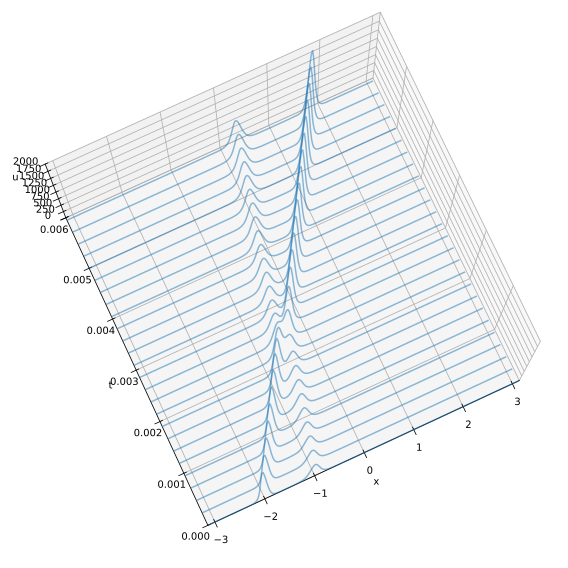

In [ ]:
%config InlineBackend.figure_format='svg'
from matplotlib.collections import LineCollection
from numpy import pi,cosh,exp,round,zeros,arange,real
from numpy.fft import fft,ifft
from matplotlib.pyplot import figure
# Set up grid and differentiation matrix:
N = 256; dt = 0.4/N**2; x = (2*pi/N)*arange(-N/2,N/2);
A, B = 25.0, 16.0
u = 3*A**2/cosh(0.5*A*(x+2))**2 + 3*B**2/cosh(0.5*B*(x+1))**2
uhat = fft(u);
k = zeros(N); k[0:N//2] = arange(0,N/2); k[N//2+1:] = arange(-N/2+1,0,1)
ik3 = 1j * k**3

def rhs(t,Uhat):
    uhat = exp(ik3 * t) * Uhat
    u = real(ifft(uhat))
    return -0.5j * k * exp(-ik3 * t) * fft(u**2)

# Time-stepping by Runge-Kutta
tmax = 0.006; nplt = int(round((tmax/25)/dt))
nmax = int(round(tmax/dt))
udata = []; udata.append(list(zip(x, u)))
tdata = [0.0]
for n in range(1,nmax+1):
    t = n*dt
    Uhat = uhat
    k1 = rhs(0, Uhat)
    k2 = rhs(dt/2, Uhat + 0.5 * dt * k1)
    k3 = rhs(dt/2, Uhat + 0.5 * dt * k2)
    k4 = rhs(dt,   Uhat +       dt * k3)
    Uhat = Uhat + (dt/6)*(k1 + 2*k2 + 2*k3 + k4)
    uhat = exp(ik3 * dt) * Uhat
    if n%nplt == 0:
        u = real(ifft(uhat))
        udata.append(list(zip(x, u)))
        tdata.append(t);

fig = figure(figsize=(12,10))
ax = fig.add_subplot(111,projection='3d')
poly = LineCollection(udata)
poly.set_alpha(0.5)
ax.add_collection3d(poly, zs=tdata, zdir='y')
ax.set_xlabel('x'); ax.set_ylabel('t'); ax.set_zlabel('u')
ax.set_xlim3d(-pi, pi); ax.set_ylim3d(0, tmax); ax.set_zlim3d(0, 2000)
ax.view_init(80,-115);

from matplotlib import animation
import matplotlib.pyplot as plt
from matplotlib import rc
rc('animation', html='jshtml')

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(-pi, pi), ylim=(0, 2000))
line, = ax.plot([], [], lw=2)
plt.xlabel('x'); plt.ylabel('u'); plt.close()

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return line,

# animation function.  This is called sequentially
def animate(i):
    x, u = zip(*udata[i])
    line.set_data(x, u)
    return line,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init, repeat=False,
                               frames=len(udata), interval=50, blit=True)
# Save to file
try:
    anim.save('p27.mp4', fps=20, extra_args=['-vcodec', 'libx264'])
except:
    print("Cannot save mp4 file")
    # Use this for inline display with controls
anim

#Kink and Anti-kink Solitons

+ Kink and Anti-kink solitons are the solutions to the Sine-Gordon (SG) equation:

    $$\frac{\partial u^2}{\partial t^2} - \frac{\partial^2 u}{\partial x^2}+sin(u) = 0,\quad -\infty < x < \infty,   0 < t < \infty$$

+ The solution is $u(x,t)=4 \tan^{-1} \left( e^{\pm\gamma (x - ct)} \right), \gamma=\frac{1}{\sqrt{1 - c^2}}$ where $\gamma$ is Lorenz contraction factor. The ($+$) sign refers to ***kink soliton*** and represents a $2\pi$ pulse and ($-$) refers to ***antikink soliton*** representing a $-2\pi$ pulse.


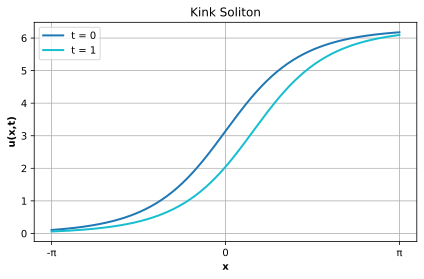

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
x = np.linspace(-np.pi, np.pi, 200)  # Spatial domain from -pi to pi
t_values = [0, 1]  # Time instances
c = 0.5  # Velocity
gamma = np.sqrt(1 - c**2)  # Scaling parameter

# Plot the soliton at different time instances
plt.figure(figsize=(6, 4))
plt.grid(True)

# Different colors for Kink solitons
colors = plt.cm.tab10(np.linspace(0, 1, len(t_values)))

for i, t in enumerate(t_values):
    u = 4 * np.arctan(np.exp((x - c * t) / gamma))  # Compute soliton solution
    plt.plot(x, u, color=colors[i], linewidth=2, label=f't = {t}')

# Customize x-axis to indicate -pi and pi
plt.xticks([-np.pi, 0, np.pi], ['-π', '0', 'π'])
plt.xlabel('x', fontweight='bold')
plt.ylabel('u(x,t)', fontweight='bold')
plt.title('Kink Soliton')
plt.legend()
plt.tight_layout()
plt.show()

# Vector Modified KdV


# Non-Integrable vmKdV Equation

## Access and aggregate record count using **vaex** library









In [1]:
from google.colab import drive
import os
import re
import vaex

# Mount Google Drive
drive.mount('/content/drive')

# Define the target path
target_path = '/content/drive/MyDrive/vmKdV/NonIntegrable'

total_records = 0  # counter for all rows

if os.path.exists(target_path):
    print(f"✅ Folder found: {target_path}")
    print("=" * 50)

    # Walk through all subfolders (including Run folders)
    for root, dirs, files in os.walk(target_path):
        for file in files:
            if file.endswith(".DAT"):
                file_path = os.path.join(root, file)

                try:
                    # Read whitespace-delimited Fortran output
                    df = vaex.from_csv(
                        file_path,
                        convert=True,
                        chunk_size=5_000_000,
                        delimiter=r"\s+"   # whitespace as delimiter
                    )
                    count = len(df)
                    total_records += count
                    print(f"📄 {file} → {count:,} records")
                except Exception as e:
                    print(f"⚠️ Could not read {file}: {e}")

    print("=" * 50)
    print(f"📊 Total records across all .DAT files: {total_records:,}")

else:
    print("❌ Path not found.")


ModuleNotFoundError: No module named 'vaex'

##Access Google Drive and Subfolders

In [ ]:
from google.colab import drive
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Mount Google Drive
drive.mount('/content/drive')

# Define the target path
target_path = '/content/drive/MyDrive/vmKdV/NonIntegrable'

# Check if the path exists
if os.path.exists(target_path):
    print(f"✅ Folder found: {target_path}")
    print("=" * 50)

    # List all items in the NonIntegrable folder
    items = os.listdir(target_path)

    if items:
        print("Contents of NonIntegrable folder:")
        print("-" * 40)

        # Sort items with Run folders first in numerical order
        def sort_key(item):
            # Check if item starts with "Run" followed by a number
            match = re.match(r'Run(\d+)', item)
            if match:
                return (0, int(match.group(1)))  # Sort Run folders numerically
            else:
                return (1, item)  # Sort other items alphabetically

        sorted_items = sorted(items, key=sort_key)

        for item in sorted_items:
            item_path = os.path.join(target_path, item)
            if os.path.isdir(item_path):
                print(f"📁 {item}/")
            else:
                print(f"📄 {item}")
    else:
        print("The NonIntegrable folder is empty.")



##Animate Soliton Propagation for one Data File

##Using HTML5 Controls

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, Video
from io import StringIO
import matplotlib as mpl

# --- Embed a snippet of Work8.DAT data as a multiline string ---
data_text = """\
   0.0000000000000000        1.7969626959897973E-002   1.1824079982307559E-002   2.1590136778757117E-002
   2.5000000000000001E-002   1.7629674465360356E-002   1.2321461657394993E-002   2.1591557845086706E-002
   5.0000000000000003E-002   1.7276721335166004E-002   1.2808230042862462E-002   2.1593351132219465E-002
   7.4999999999999997E-002   1.6911119065983027E-002   1.3283971868541558E-002   2.1595440985282741E-002
  0.10000000000000001        1.6533233266682653E-002   1.3748292351802352E-002   2.1597752912405555E-002
  0.12500000000000000        1.6143445290041490E-002   1.4200814637319432E-002   2.1600214608836963E-002
  0.14999999999999999        1.5742149538272285E-002   1.4641181335651017E-002   2.1602755247366871E-002
  0.17499999999999999        1.5329754292971107E-002   1.5069053784561384E-002   2.1605307557001737E-002
  0.20000000000000001        1.4906678697269001E-002   1.5484113836534065E-002   2.1607807245728753E-002
  0.22500000000000001        1.4473355137186754E-002   1.5886063498071080E-002   2.1610193742611260E-002
  0.25000000000000000        1.4030226122369828E-002   1.6274624987424754E-002   2.1612410021050008E-002
  0.27500000000000002        1.3577743311727850E-002   1.6649541660849591E-002   2.1614403624787729E-002
  0.29999999999999999        1.3116369199824214E-002   1.7010578184705208E-002   2.1616127061040272E-002
  0.32500000000000001        1.2646572336520992E-002   1.7357521969696574E-002   2.1617537743897200E-002
  0.34999999999999998        1.2168830957341226E-002   1.7690180181874449E-002   2.1618596773413323E-002
  0.37500000000000000        1.1683627754583068E-002   1.8008382330802715E-002   2.1619270536659522E-002
  0.40000000000000002        1.1191451322583146E-002   1.8311979219715491E-002   2.1619530768019372E-002
  0.42499999999999999        1.0692796538604043E-002   1.8600844007677367E-002   2.1619353510705493E-002
  0.45000000000000001        1.0188159607234503E-002   1.8874871504858004E-002   2.1618719152651872E-002
  0.47499999999999998        9.6780401612719339E-003   1.9133977356999489E-002   2.1617613594293178E-002
  0.50000000000000000        9.1629402782479174E-003   1.9378098715367033E-002   2.1616026159639617E-002
  0.52500000000000002        8.6433625220267932E-003   1.9607194097394753E-002   2.1613950314551579E-002
  0.55000000000000004        8.1198077010583777E-003   1.9821242680466044E-002   2.1611383651566413E-002
  0.57499999999999996        7.5927771698627057E-003   2.0020243698596965E-002   2.1608326629738557E-002
  0.59999999999999998        7.0627700123395924E-003   2.0204216259511153E-002   2.1604783000203739E-002
  0.62500000000000000        6.5302822658156586E-003   2.0373199607375110E-002   2.1600760068241975E-002
  0.65000000000000002        5.9958051052835422E-003   2.0527251743897683E-002   2.1596266168588923E-002
  0.67500000000000004        5.4598260720501984E-003   2.0666448722600528E-002   2.1591312373552954E-002
  0.69999999999999996        4.9228262572195173E-003   2.0790885266120336E-002   2.1585911687872109E-002
  0.72499999999999998        4.3852804202117145E-003   2.0900673110012240E-002   2.1580077283160342E-002
  0.75000000000000000        3.8476560127363875E-003   2.0995939797691602E-002   2.1573823531692113E-002
  0.77500000000000002        3.3104122057528583E-003   2.1076830007679070E-002   2.1567166170822157E-002
  0.80000000000000004        2.7739997321392200E-003   2.1143503068733624E-002   2.1560119541147858E-002
  0.82499999999999996        2.2388595985532627E-003   2.1196132406141176E-002   2.1552698865686403E-002
  0.84999999999999998        1.7054213511376903E-003   2.1234905668610238E-002   2.1544918218197710E-002
  0.87500000000000000        1.1741038133128109E-003   2.1260023234553879E-002   2.1536791011152866E-002
  0.90000000000000002        6.4531566411463528E-004   2.1271697411509909E-002   2.1528329565877143E-002
  0.92500000000000004        1.1945205190449811E-004   2.1270151228992069E-002   2.1519544125417695E-002
  0.94999999999999996       -4.0310494926491401E-004   2.1255618252461240E-002   2.1510443889867364E-002
  0.97499999999999998       -9.2198473681649837E-004   2.1228341305464946E-002   2.1501036259452079E-002
   1.0000000000000000       -1.4368328157101679E-003   2.1188572564010071E-002   2.1491326704930785E-002
   1.0249999999999999       -1.9473075647347617E-003   2.1136570110638218E-002   2.1481317553447021E-002
   1.0500000000000000       -2.4530813063163752E-003   2.1072599864502446E-002   2.1471010561329194E-002
   1.0750000000000000       -2.9538424953768328E-003   2.0996933286830086E-002   2.1460404444288404E-002
   1.1000000000000001       -3.4492936905895317E-003   2.0909847641165945E-002   2.1449496291674263E-002
   1.1250000000000000       -3.9391528148802601E-003   2.0811622444985831E-002   2.1438280248544852E-002
   1.1499999999999999       -4.4231537129639387E-003   2.0702541287784166E-002   2.1426748935150567E-002
   1.1750000000000000       -4.9010445065039458E-003   2.0582889957975400E-002   2.1414891927575733E-002
   1.2000000000000000       -5.3725900390411288E-003   2.0452955194321679E-002   2.1402698655099812E-002
   1.2250000000000001       -5.8375712203423179E-003   2.0313025175979486E-002   2.1390155513378487E-002
   1.2500000000000000       -6.2957825486074839E-003   2.0163387081599118E-002   2.1377247228031061E-002
   1.2749999999999999       -6.7470353466300087E-003   2.0004327244687908E-002   2.1363958419944026E-002
   1.3000000000000000       -7.1911567069713736E-003   1.9836130153099714E-002   2.1350270779692052E-002
   1.3250000000000000       -7.6279873389925555E-003   1.9659077534936120E-002   2.1336165937007885E-002
   1.3500000000000001       -8.0573839536133649E-003   1.9473448016910842E-002   2.1321625101879120E-002
   1.3750000000000000       -8.4792181475636247E-003   1.9279516394693247E-002   2.1306628402287763E-002
   1.3999999999999999       -8.8933749551503346E-003   1.9077552552873672E-002   2.1291155817399637E-002
   1.4250000000000000       -9.2997527047691524E-003   1.8867821174848025E-002   2.1275186828619397E-002
   1.4500000000000000       -9.6982647809210360E-003   1.8650580794336125E-002   2.1258702090136739E-002
   1.4750000000000001       -1.0088837134415458E-002   1.8426084514873566E-002   2.1241682389876167E-002
   1.5000000000000000       -1.0471408597905739E-002   1.8194578258895255E-002   2.1224109416737677E-002
   1.5249999999999999       -1.0845928548942731E-002   1.7956300240585449E-002   2.1205965496606007E-002
   1.5500000000000000       -1.1212359276269322E-002   1.7711481524741578E-002   2.1187234181946745E-002
   1.5750000000000000       -1.1570673195967425E-002   1.7460344493676346E-002   2.1167900239872545E-002
   1.6000000000000001       -1.1920854321280532E-002   1.7203103785857907E-002   2.1147950854633776E-002
   1.6250000000000000       -1.2262894746999462E-002   1.6939965241114432E-002   2.1127374450706178E-002
   1.6499999999999999       -1.2596797113069744E-002   1.6671125841645696E-002   2.1106162241852272E-002
   1.6750000000000000       -1.2922570497357105E-002   1.6396773948628762E-002   2.1084306547185398E-002
   1.7000000000000000       -1.3240233842635851E-002   1.6117088190326808E-002   2.1061802938102267E-002
   1.7250000000000001       -1.3549810578436858E-002   1.5832238004989486E-002   2.1038648085252559E-002
   1.7500000000000000       -1.3851332756492052E-002   1.5542383927167468E-002   2.1014843344921898E-002
   1.7749999999999999       -1.4144836330575165E-002   1.5247677398341826E-002   2.0990391246671996E-002
   1.8000000000000000       -1.4430362355706541E-002   1.4948260317455562E-002   2.0965297078755791E-002
   1.8250000000000000       -1.4707955717405947E-002   1.4644266149363844E-002   2.0939569780311244E-002
   1.8500000000000001       -1.4977664406164101E-002   1.4335819057078333E-002   2.0913220635166308E-002
   1.8750000000000000       -1.5239539908346875E-002   1.4023035109847906E-002   2.0886264062074493E-002
   1.8999999999999999       -1.5493634067318589E-002   1.3706021433573188E-002   2.0858716361666137E-002
   1.9250000000000000       -1.5740000079723464E-002   1.3384877108291234E-002   2.0830597987742571E-002
   1.9500000000000000       -1.5978691788212093E-002   1.3059694463513233E-002   2.0801931563080040E-002
   1.9750000000000001       -1.6209762641253504E-002   1.2730557566199974E-002   2.0772742107874272E-002
   2.0000000000000000       -1.6433264021790531E-002   1.2397544264321696E-002   2.0743058140838135E-002
   2.0249999999999999       -1.6649246516442156E-002   1.2060725502433402E-002   2.0712910136898823E-002
   2.0499999999999998       -1.6857758763624883E-002   1.1720167116120910E-002   2.0682331501286615E-002
   2.0750000000000002       -1.7058844226458064E-002   1.1375928768221803E-002   2.0651357057169816E-002
   2.1000000000000001       -1.7252545276563797E-002   1.1028065936306895E-002   2.0620025578931146E-002
   2.1250000000000000       -1.7438898088903837E-002   1.0676629818138618E-002   2.0588375317814749E-002
   2.1499999999999999       -1.7617935362290678E-002   1.0321667962253762E-002   2.0556449025386791E-002
   2.1749999999999998       -1.7789683669664425E-002   9.9632253750178822E-003   2.0524288840994383E-002
   2.2000000000000002       -1.7954164869818903E-002   9.6013450371373581E-003   2.0491939904406568E-002
   2.2250000000000001       -1.8111393438750061E-002   9.2360678478969321E-003   2.0459447883499047E-002
   2.2500000000000000       -1.8261379015317429E-002   8.8674345127904113E-003   2.0426859014996905E-002
   2.2749999999999999       -1.8404122275578368E-002   8.4954854328827493E-003   2.0394219887439599E-002
   2.2999999999999998       -1.8539618916662556E-002   8.1202623417408436E-003   2.0361580019434156E-002
   2.3250000000000002       -1.8667857354414341E-002   7.7418078913233067E-003   2.0328986256037393E-002
   2.3500000000000001       -1.8788816685916865E-002   7.3601669460135839E-003   2.0296485590989947E-002
   2.3750000000000000       -1.8902469903124809E-002   6.9753874439507065E-003   2.0264125965559720E-002
   2.3999999999999999       -1.9008781824473835E-002   6.5875211816742362E-003   2.0231953066843573E-002
   2.4249999999999998       -1.9107709771754158E-002   6.1966246032420999E-003   2.0200011658216672E-002
   2.4500000000000002       -1.9199202982336610E-002   5.8027585275142327E-003   2.0168345373122971E-002
   2.4750000000000001       -1.9283204174288717E-002   5.4059905014095548E-003   2.0136995716771272E-002
   2.5000000000000000       -1.9359647132470507E-002   5.0063942522080556E-003   2.0106000940909013E-002
   2.5249999999999999       -1.9428458442952139E-002   4.6040508377101106E-003   2.0075398264963497E-002
   2.5499999999999998       -1.9489559662573559E-002   4.1990497297577783E-003   2.0045220736057738E-002
   2.5750000000000002       -1.9542862495482479E-002   3.7914877760707134E-003   2.0015497257587819E-002
   2.6000000000000001       -1.9588274459209857E-002   3.3814718589694594E-003   1.9986254725670144E-002
   2.6250000000000000       -1.9625695882853605E-002   2.9691185120646248E-003   1.9957513212951274E-002
   2.6499999999999999       -1.9655021086283846E-002   2.5545534058615646E-003   1.9929290211786969E-002
   2.6749999999999998       -1.9676140618080745E-002   2.1379139233424849E-003   1.9901597885652017E-002
   2.7000000000000002       -1.9688939533344493E-002   1.7193480460391615E-003   1.9874442247488810E-002
   2.7250000000000001       -1.9693298118761478E-002   1.2990151604439241E-003   1.9847823707456514E-002
   2.7500000000000000       -1.9689093549127928E-002   8.7708691519166324E-004   1.9821736671058545E-002
   2.7749999999999999       -1.9676200058294822E-002   4.5374658265076101E-004   1.9796169250008846E-002
   2.7999999999999998       -1.9654489317607961E-002   2.9188986022913244E-005   1.9771102753956792E-002
   2.8250000000000002       -1.9623832444156736E-002  -3.9637711879261133E-004   1.9746511836155986E-002
   2.8500000000000001       -1.9584098148639695E-002  -8.2273142826028167E-004   1.9722363781471922E-002
   2.8750000000000000       -1.9535156426684217E-002  -1.2496408331696951E-003   1.9698619327511997E-002
   2.8999999999999999       -1.9476876960533827E-002  -1.6768595356426296E-003   1.9675230542414528E-002
   2.9249999999999998       -1.9409131669516945E-002  -2.1041292206984579E-003   1.9652143102126630E-002
   2.9500000000000002       -1.9331793363746585E-002  -2.5311789442953284E-003   1.9629293923797860E-002
   2.9750000000000001       -1.9244738938553364E-002  -2.9577255608025385E-003   1.9606613739807693E-002
   3.0000000000000000       -1.9147849324724086E-002  -3.3834740362003106E-003   1.9584025007786162E-002
   3.0249999999999999       -1.9041009711967507E-002  -3.8081182394620891E-003   1.9561443872878788E-002
   3.0499999999999998       -1.8924111430711234E-002  -4.2313393616991209E-003   1.9538778562566316E-002
   3.0750000000000002       -1.8797051164460260E-002  -4.6528081964706128E-003   1.9515929542262524E-002
   3.1000000000000001       -1.8659733003894279E-002  -5.0721850347982449E-003   1.9492791692679791E-002
   3.1250000000000000       -1.8512069419915841E-002  -5.4891204592383194E-003   1.9469254175545545E-002
   3.1499999999999999       -1.8353982973705704E-002  -5.9032556143867911E-003   1.9445200242035179E-002
   3.1749999999999998       -1.8185403794947656E-002  -6.3142233026558057E-003   1.9420506173471568E-002
   3.2000000000000002       -1.8006272722863426E-002  -6.7216473279576496E-003   1.9395045176407603E-002
   3.2250000000000001       -1.7816543334886453E-002  -7.1251446926404068E-003   1.9368685694814935E-002
   3.2500000000000000       -1.7616179145267613E-002  -7.5243262111384240E-003   1.9341292013179270E-002
   3.2749999999999999       -1.7405157770803321E-002  -7.9187968174872139E-003   1.9312726526188252E-002
   3.2999999999999998       -1.7183469357535525E-002  -8.3081564218272230E-003   1.9282848245799039E-002
   3.3250000000000002       -1.6951117641916851E-002  -8.6920008844778851E-003   1.9251515877169962E-002
   3.3500000000000001       -1.6708122003344619E-002  -9.0699242800400502E-003   1.9218587065825982E-002
   3.3750000000000000       -1.6454515939483234E-002  -9.4415172327481506E-003   1.9183918535896641E-002
   3.3999999999999999       -1.6190347704694737E-002  -9.8063702718035779E-003   1.9147369470476260E-002
   3.4249999999999998       -1.5915683996899667E-002  -1.0164074032208906E-002   1.9108801682906896E-002
   3.4500000000000002       -1.5630606640879535E-002  -1.0514220412274122E-002   1.9068077778749991E-002
   3.4750000000000001       -1.5335212838359409E-002  -1.0856402849551196E-002   1.9025064529219142E-002
   3.5000000000000000       -1.5029619662736089E-002  -1.1190218772409423E-002   1.8979634819911679E-002
   3.5249999999999999       -1.4713960071397171E-002  -1.1515269725286839E-002   1.8931665978794497E-002
   3.5499999999999998       -1.4388385634834459E-002  -1.1831162293572776E-002   1.8881042286101095E-002
   3.5750000000000002       -1.4053064395665728E-002  -1.2137511191947019E-002   1.8827654806918708E-002
   3.6000000000000001       -1.3708183837778699E-002  -1.2433937402804523E-002   1.8771403396415389E-002
   3.6250000000000000       -1.3353947738780465E-002  -1.2720071355950409E-002   1.8712196797315100E-002
   3.6499999999999999       -1.2990580292845253E-002  -1.2995554273192563E-002   1.8649955132419037E-002
   3.6749999999999998       -1.2618322178119515E-002  -1.3260036734461947E-002   1.8584607183225098E-002
   3.7000000000000002       -1.2237432548494104E-002  -1.3513182583237391E-002   1.8516095314732268E-002
   3.7250000000000001       -1.1848188217038971E-002  -1.3754668787757319E-002   1.8444372993806059E-002
   3.7500000000000000       -1.1450882895600636E-002  -1.3984186177971042E-002   1.8369407209214039E-002
   3.7749999999999999       -1.1045828722741072E-002  -1.4201440937374323E-002   1.8291178781815489E-002
   3.7999999999999998       -1.0633354372331131E-002  -1.4406155817190748E-002   1.8209682547191977E-002
   3.8250000000000002       -1.0213804821807719E-002  -1.4598069656927436E-002   1.8124928149214545E-002
   3.8500000000000001       -9.7875421404708778E-003  -1.4776940888886477E-002   1.8036941297554510E-002
   3.8750000000000000       -9.3549429045702171E-003  -1.4942545633814142E-002   1.7945761527281466E-002
   3.8999999999999999       -8.9163993105580448E-003  -1.5094680077468971E-002   1.7851445931359112E-002
   3.9249999999999998       -8.4723188862801529E-003  -1.5233161499453876E-002   1.7754067234539834E-002
   3.9500000000000002       -8.0231218873150299E-003  -1.5357827557874272E-002   1.7653714110699693E-002
   3.9750000000000001       -7.5692433255346468E-003  -1.5468538926092002E-002   1.7550492277554428E-002
   4.0000000000000000       -7.1111294509388070E-003  -1.5565177646404518E-002   1.7444522265953107E-002
   4.0250000000000004       -6.6492391722266075E-003  -1.5647649926791102E-002   1.7335941949575440E-002
   4.0499999999999998       -6.1840414060466836E-003  -1.5715884817364915E-002   1.7224903890984109E-002
   4.0750000000000002       -5.7160169823809864E-003  -1.5769836575885241E-002   1.7111577400779027E-002
   4.0999999999999996       -5.2456549166682593E-003  -1.5809482748646492E-002   1.6996144525349113E-002
   4.1250000000000000       -4.7734528349325451E-003  -1.5834826288210615E-002   1.6878802595731966E-002
   4.1500000000000004       -4.2999148226912642E-003  -1.5845895347932532E-002   1.6759761635250912E-002
   4.1749999999999998       -3.8255532782023203E-003  -1.5842743326592513E-002   1.6639245345910804E-002
   4.2000000000000002       -3.3508845225584906E-003  -1.5825450083124564E-002   1.6517487801593362E-002
   4.2249999999999996       -2.8764298073937142E-003  -1.5794120066510212E-002   1.6394733137413440E-002
   4.2500000000000000       -2.4027140953153028E-003  -1.5748883362805655E-002   1.6271234960496955E-002
   4.2750000000000004       -1.9302642414413763E-003  -1.5689895683891831E-002   1.6147253765279063E-002
   4.2999999999999998       -1.4596085157926664E-003  -1.5617338917556433E-002   1.6023055686803213E-002
   4.3250000000000002       -9.9127459003106036E-004  -1.5531418601555746E-002   1.5898910795313921E-002
   4.3499999999999996       -5.2578968584443076E-004  -1.5432367372098913E-002   1.5775093040487853E-002
   4.3750000000000000       -6.3679079294664393E-005  -1.5320441300184196E-002   1.5651874338071310E-002
   4.4000000000000004        3.9453583176270938E-004  -1.5195920258274315E-002   1.5529526465234051E-002
   4.4249999999999998        8.4833817571041380E-004  -1.5059109921674597E-002   1.5408317176699124E-002
   4.4500000000000002        1.2972158876011647E-003  -1.4910337367461557E-002   1.5288507289849550E-002
   4.4749999999999996        1.7406644634819751E-003  -1.4749953949861946E-002   1.5170350754530156E-002
   4.5000000000000000        2.1781868602897135E-003  -1.4578331393142262E-002   1.5054088616858601E-002
   4.5250000000000004        2.6092956464759563E-003  -1.4395864501024758E-002   1.4939951607092265E-002
   4.5499999999999998        3.0335123996662367E-003  -1.4202967990491281E-002   1.4828153735822296E-002
   4.5750000000000002        3.4503715506830836E-003  -1.4000076874009044E-002   1.4718893295079324E-002
   4.5999999999999996        3.8594193911972411E-003  -1.3787645059790545E-002   1.4612347503185776E-002
   4.6250000000000000        4.2602143545386511E-003  -1.3566143899266875E-002   1.4508672598030712E-002
   4.6500000000000004        4.6523304868081872E-003  -1.3336061691942853E-002   1.4408002769653264E-002
   4.6749999999999998        5.0353586210795795E-003  -1.3097904426830160E-002   1.4310447030476743E-002
   4.7000000000000002        5.4089033374154251E-003  -1.2852191385834832E-002   1.4216087232353083E-002
   4.7249999999999996        5.7725890559942950E-003  -1.2599455778840314E-002   1.4124979685276817E-002
   4.7500000000000000        6.1260572038181454E-003  -1.2340244807727031E-002   1.4037151631651172E-002
   4.7750000000000004        6.4689694839141837E-003  -1.2075115825921133E-002   1.3952602260116034E-002
   4.7999999999999998        6.8010077447944184E-003  -1.1804637917586121E-002   1.3871302056706978E-002
   4.8250000000000002        7.1218741671271553E-003  -1.1529387147543244E-002   1.3793191404345054E-002
   4.8499999999999996        7.4312936515968861E-003  -1.1249948098062889E-002   1.3718184091585702E-002
   4.8750000000000000        7.7290130030823008E-003  -1.0966912447934116E-002   1.3646165450731855E-002
   4.9000000000000004        8.0148031248700180E-003  -1.0680875974793854E-002   1.3576994988717627E-002
   4.9249999999999998        8.2884578547933897E-003  -1.0392438398825480E-002   1.3510506648911928E-002
   4.9500000000000002        8.5497957443508733E-003  -1.0102201365821016E-002   1.3446511492309734E-002
   4.9749999999999996        8.7986613754356593E-003  -9.8107675394545329E-003   1.3384799202683192E-002
   5.0000000000000000        9.0349231416468126E-003  -9.5187389363270928E-003   1.3325140310553565E-002
   5.0250000000000004        9.2584770551852567E-003  -9.2267156287441643E-003   1.3267289243568427E-002
   5.0499999999999998        9.4692440131478282E-003  -8.9352936256013194E-003   1.3210984859907831E-002
   5.0750000000000002        9.6671714514421376E-003  -8.6450647988097328E-003   1.3155956385990288E-002
   5.0999999999999996        9.8522357223553882E-003  -8.3566139385783025E-003   1.3101924217432722E-002
   5.1250000000000000        1.0024437262446404E-002  -8.0705191161536474E-003   1.3048603423255875E-002
   5.1500000000000004        1.0183806097748438E-002  -7.7873483349676920E-003   1.2995705951389323E-002
   5.1749999999999998        1.0330396664995509E-002  -7.5076587209046333E-003   1.2942943458937897E-002
   5.2000000000000002        1.0464292681577713E-002  -7.2319966417689185E-003   1.2890033133994590E-002
   5.2249999999999996        1.0585603550453921E-002  -6.9608939391770453E-003   1.2836695988597656E-002
   5.2500000000000000        1.0694466476926479E-002  -6.6948692143209291E-003   1.2782664512429841E-002
   5.2750000000000004        1.0791043305458135E-002  -6.4344239280933503E-003   1.2727679623781333E-002
   5.2999999999999998        1.0875523776585953E-002  -6.1800424633884875E-003   1.2671498351044619E-002
   5.3250000000000002        1.0948121852864657E-002  -5.9321913465728571E-003   1.2613894562880149E-002
   5.3499999999999996        1.1009079356927425E-002  -5.6913171797191228E-003   1.2554661122059486E-002
   5.3750000000000000        1.1058659771427847E-002  -5.4578457110529667E-003   1.2493609207736595E-002
   5.4000000000000004        1.1097152410979539E-002  -5.2321806858373334E-003   1.2430576411728402E-002
   5.4249999999999998        1.1124869732097236E-002  -5.0147037254722176E-003   1.2365422952453296E-002
   5.4500000000000002        1.1142147349345249E-002  -4.8057714325613404E-003   1.2298035905356764E-002
   5.4749999999999996        1.1149341780103874E-002  -4.6057162032950797E-003   1.2228329633536294E-002
   5.5000000000000000        1.1146830666937406E-002  -4.4148445134149375E-003   1.2156247328274708E-002
   5.5250000000000004        1.1135012276507707E-002  -4.2334359682098151E-003   1.2081762648724789E-002
   5.5499999999999998        1.1114303137585933E-002  -4.0617430816149852E-003   1.2004879769185585E-002
   5.5750000000000002        1.1085139230029465E-002  -3.8999903794831934E-003   1.1925635440007805E-002
   5.5999999999999996        1.1047971688403624E-002  -3.7483731997875014E-003   1.1844097295393199E-002
   5.6250000000000000        1.1003268123227885E-002  -3.6070583006378911E-003   1.1760366337579327E-002
   5.6500000000000004        1.0951509950447132E-002  -3.4761826215980972E-003   1.1674575494784513E-002
   5.6749999999999998        1.0893192149468739E-002  -3.3558522334318319E-003   1.1586891363560833E-002
   5.7000000000000002        1.0828821750771168E-002  -3.2461435391189647E-003   1.1497512404149132E-002
   5.7249999999999996        1.0758914600522659E-002  -3.1471019858613316E-003   1.1406668507851957E-002
   5.7500000000000000        1.0683997685621909E-002  -3.0587421214549764E-003   1.1314622309939754E-002
   5.7750000000000004        1.0604603204597780E-002  -2.9810476423602541E-003   1.1221665541857844E-002
   5.7999999999999998        1.0521270354169996E-002  -2.9139716955346984E-003   1.1128119585966094E-002
   5.8250000000000002        1.0434542583444142E-002  -2.8574353258571813E-003   1.1034332561659156E-002
   5.8499999999999996        1.0344965700460314E-002  -2.8113299854046641E-003   1.0940680043313764E-002
   5.8750000000000000        1.0253087697997409E-002  -2.7755168646682567E-003   1.0847561001680548E-002
   5.9000000000000004        1.0159455232494454E-002  -2.7498258241394637E-003   1.0755395963577241E-002
   5.9249999999999998        1.0064614236658054E-002  -2.7340582261733354E-003   1.0664624026663768E-002
   5.9500000000000002        9.9691055896584096E-003  -2.7279859827118585E-003   1.0575698869150191E-002
   5.9749999999999996        9.8734652290016350E-003  -2.7313520361964172E-003   1.0489087356907137E-002
   6.0000000000000000        9.7782227681549819E-003  -2.7438723030568969E-003   1.0405264553918740E-002
   6.0250000000000004        9.6838992365453382E-003  -2.7652351236665540E-003   1.0324708374122003E-002
   6.0499999999999998        9.5910053812671807E-003  -2.7951023378701236E-003   1.0247896918044416E-002
   6.0750000000000002        9.5000406955666975E-003  -2.8331113433434870E-003   1.0175302304153352E-002
   6.0999999999999996        9.4114908377523968E-003  -2.8788742387828863E-003   1.0107385086862588E-002
   6.1250000000000000        9.3258272030560131E-003  -2.9319802685268273E-003   1.0044591195898846E-002
   6.1500000000000004        9.2435056614311156E-003  -2.9919966104600040E-003   9.9873434667946959E-003
   6.1749999999999998        9.1649630358863372E-003  -3.0584696948476489E-003   9.9360382441986989E-003
   6.2000000000000002        9.0906188131742102E-003  -3.1309263070130279E-003   9.8910398068158926E-003
   6.2249999999999996        9.0208703506908499E-003  -3.2088752515036624E-003   9.8526732597163710E-003
   6.2500000000000000        8.9560948556845679E-003  -3.2918080381070173E-003   9.8212239528561989E-003
   6.2750000000000004        8.8966459842718098E-003  -3.3792005900426612E-003   9.7969288577208474E-003
   6.2999999999999998        8.8428537235854515E-003  -3.4705161498364955E-003   9.7799752069204354E-003
   6.3250000000000002        8.7950221482378608E-003  -3.5652051299289666E-003   9.7704972830103161E-003
   6.3499999999999996        8.7534302271851522E-003  -3.6627063330008100E-003   9.7685754497341265E-003
   6.3750000000000000        8.7183294640543821E-003  -3.7624507732889547E-003   9.7742328745478689E-003
   6.4000000000000004        8.6899433626506997E-003  -3.8638612107910657E-003   9.7874372076406802E-003
   6.4249999999999998        8.6684673588507902E-003  -3.9663552145823315E-003   9.8081011703416085E-003
   6.4500000000000002        8.6540673371395434E-003  -4.0693461217497446E-003   9.8360832643395370E-003
   6.4749999999999996        8.6468792018382194E-003  -4.1722449482025619E-003   9.8711915417162410E-003
   6.5000000000000000        8.6470086487449287E-003  -4.2744622210876080E-003   9.9131851916405781E-003
   6.5250000000000004        8.6545306109078214E-003  -4.3754088800169628E-003   9.9617800247654500E-003
   6.5499999999999998        8.6694892594175645E-003  -4.4744998869917247E-003   1.0016653290299403E-002
   6.5750000000000002        8.6918975992743789E-003  -4.5711542115678292E-003   1.0077445828073600E-002
   6.5999999999999996        8.7217372597908401E-003  -4.6647970484434698E-003   1.0143769429118286E-002
   6.6250000000000000        8.7589590381924841E-003  -4.7548614111414143E-003   1.0215211375918586E-002
   6.6500000000000004        8.8034827713170359E-003  -4.8407899827870686E-003   1.0291339308310221E-002
   6.6749999999999998        8.8551977729492727E-003  -4.9220365763119542E-003   1.0371706166140469E-002
   6.7000000000000002        8.9139623623967802E-003  -4.9980678991978335E-003   1.0455853766000662E-002
   6.7249999999999996        8.9796050721777081E-003  -5.0683639831898414E-003   1.0543319182204081E-002
   6.7500000000000000        9.0519266254355003E-003  -5.1324211554758309E-003   1.0633637999318336E-002
   6.7750000000000004        9.1306957355209942E-003  -5.1897539342990713E-003   1.0726347236678447E-002
   6.7999999999999998        9.2156577889920786E-003  -5.2398930917073594E-003   1.0820990514336432E-002
   6.8250000000000002        9.3065265251190462E-003  -5.2823904977850099E-003   1.0917116781427568E-002
   6.8499999999999996        9.4029929367970815E-003  -5.3168186073260081E-003   1.1014289525582263E-002
   6.8750000000000000        9.5047217389803915E-003  -5.3427714076018521E-003   1.1112082518117529E-002
   6.9000000000000004        9.6113534460063148E-003  -5.3598668829326832E-003   1.1210084949606416E-002
   6.9249999999999998        9.7225062567578586E-003  -5.3677457113837689E-003   1.1307901437052473E-002
   6.9500000000000002        9.8377761049733229E-003  -5.3660748582985826E-003   1.1405154028818408E-002
   6.9749999999999996        9.9567400551824198E-003  -5.3545458714810822E-003   1.1501483519430767E-002
   7.0000000000000000        1.0078955913751197E-002  -5.3328770463550289E-003   1.1596549297227605E-002
   7.0250000000000004        1.0203964474071178E-002  -5.3008141243584125E-003   1.1690029596689020E-002
   7.0499999999999998        1.0331290354431000E-002  -5.2581298471081374E-003   1.1781621448732026E-002
   7.0750000000000002        1.0460443763218518E-002  -5.2046241311524783E-003   1.1871042065054040E-002
   7.0999999999999996        1.0590923056447064E-002  -5.1401266155818373E-003   1.1958028937999902E-002
   7.1250000000000000        1.0722215672854444E-002  -5.0644938878317671E-003   1.2042337371740026E-002
   7.1500000000000004        1.0853799101162393E-002  -4.9776124892963137E-003   1.2123744193877550E-002
   7.1749999999999998        1.0985144075283601E-002  -4.8793963848885093E-003   1.2202043647173156E-002
   7.2000000000000002        1.1115715169056802E-002  -4.7697885189362218E-003   1.2277049558883417E-002
   7.2249999999999996        1.1244972395621342E-002  -4.6487600057521479E-003   1.2348595004149776E-002
   7.2500000000000000        1.1372374281347783E-002  -4.5163110492273751E-003   1.2416530385008395E-002
   7.2750000000000004        1.1497376578601361E-002  -4.3724687171518397E-003   1.2480724790387821E-002
   7.2999999999999998        1.1619438366495522E-002  -4.2172873600241625E-003   1.2541066379668191E-002
   7.3250000000000002        1.1738020301703322E-002  -4.0508484510648323E-003   1.2597458790997846E-002
   7.3499999999999996        1.1852586420963021E-002  -3.8732603760792132E-003   1.2649825378141646E-002
   7.3750000000000000        1.1962608152365047E-002  -3.6846563810952015E-003   1.2698106508047331E-002
   7.4000000000000004        1.2067563570262929E-002  -3.4851954575917700E-003   1.2742259553944927E-002
   7.4249999999999998        1.2166939812177568E-002  -3.2750599516726724E-003   1.2782260088803791E-002
   7.4500000000000002        1.2260235535442976E-002  -3.0544559719648209E-003   1.2818100450838477E-002
   7.4749999999999996        1.2346958414706333E-002  -2.8236119179732198E-003   1.2849789754510121E-002
   7.5000000000000000        1.2426632647411055E-002  -2.5827783233119748E-003   1.2877356819681690E-002
   7.5250000000000004        1.2498795089771468E-002  -2.3322245139535446E-003   1.2900846022162607E-002
   7.5499999999999998        1.2563000704972805E-002  -2.0722415309990458E-003   1.2920322531607084E-002
   7.5750000000000002        1.2618818626338825E-002  -1.8031371145536199E-003   1.2935865449557056E-002
   7.5999999999999996        1.2665837181884864E-002  -1.5252371164663483E-003   1.2947575427894507E-002
   7.6250000000000000        1.2703664587779169E-002  -1.2388832941869082E-003   1.2955570859450240E-002
   7.6500000000000004        1.2731929183198817E-002  -9.4443209662576895E-004   1.2959988879106947E-002
   7.6749999999999998        1.2750279494931242E-002  -6.4225412170940133E-004   1.2960985666417608E-002
   7.7000000000000002        1.2758386958118441E-002  -3.3273266327529105E-004   1.2958737425938857E-002
   7.7249999999999996        1.2755944798710752E-002  -1.6262414904919315E-005   1.2953438659393678E-002
   7.7500000000000000        1.2742669563448791E-002   3.0675199678228352E-004   1.2945304847160733E-002
   7.7750000000000004        1.2718301818716568E-002   6.3589612248328051E-004   1.2934571438432128E-002
   7.7999999999999998        1.2682606773055957E-002   9.7074796657873458E-004   1.2921492842904586E-002
   7.8250000000000002        1.2635373240452372E-002   1.3108781366507930E-003   1.2906343950491976E-002
   7.8499999999999996        1.2576416559748190E-002   1.6558528931365547E-003   1.2889420500670731E-002
   7.8750000000000000        1.2505575591916082E-002   2.0052326465527597E-003   1.2871035989903901E-002
   7.9000000000000004        1.2422715531662756E-002   2.3585745208057744E-003   1.2851524184099390E-002
   7.9249999999999998        1.2327726498113147E-002   2.7154340533910291E-003   1.2831236536928916E-002
   7.9500000000000002        1.2220524218516517E-002   3.0753642206527887E-003   1.2810543182009250E-002
   7.9749999999999996        1.2101050004434745E-002   3.4379175364839852E-003   1.2789830423333112E-002
   8.0000000000000000        1.1969270101308792E-002   3.8026483646096021E-003   1.2769500580619032E-002
   8.0250000000000004        1.1825175636705411E-002   4.1691111020701731E-003   1.2749969586819038E-002
   8.0500000000000007        1.1668783156673983E-002   4.5368630776085328E-003   1.2731665680844908E-002
   8.0749999999999993        1.1500132127623007E-002   4.9054647697685649E-003   1.2715027914242092E-002
   8.0999999999999996        1.1319287446186209E-002   5.2744802583435590E-003   1.2700503590668285E-002
   8.1250000000000000        1.1126337372815856E-002   5.6434780027343244E-003   1.2688543892034252E-002
   8.1500000000000004        1.0921391606247541E-002   6.0120321479904901E-003   1.2679603776974347E-002
   8.1750000000000007        1.0704584130123257E-002   6.3797227810202875E-003   1.2674137948072419E-002
   8.1999999999999993        1.0476070625897338E-002   6.7461365263345226E-003   1.2672596866282684E-002
   8.2249999999999996        1.0236026874786450E-002   7.1108669052421586E-003   1.2675422549987370E-002
   8.2500000000000000        9.9846499956951270E-003   7.4735153742486425E-003   1.2683046564834606E-002
   8.2750000000000004        9.7221560704361231E-003   7.8336905188945948E-003   1.2695884689526758E-002
   8.3000000000000007        9.4487815551849118E-003   8.1910103896005344E-003   1.2714334333209747E-002
   8.3249999999999993        9.1647804567662507E-003   8.5451014774971055E-003   1.2738769063296585E-002
   8.3499999999999996        8.8704245809457238E-003   8.8955992336102220E-003   1.2769535395510028E-002
   8.3750000000000000        8.5660015755562105E-003   9.2421486805934240E-003   1.2806949311644604E-002
   8.4000000000000004        8.2518161665620284E-003   9.5844047203862432E-003   1.2851293109964522E-002
   8.4250000000000007        7.9281877542898040E-003   9.9220321152301769E-003   1.2902810450843618E-002
   8.4499999999999993        7.5954494332663609E-003   1.0254704911122672E-002   1.2961705199884896E-002
   8.4749999999999996        7.2539477632356771E-003   1.0582108026545379E-002   1.3028138871309736E-002
   8.5000000000000000        6.9040417113858180E-003   1.0903937493574907E-002   1.3102228234215236E-002
   8.5250000000000004        6.5461025145061840E-003   1.1219898165430580E-002   1.3184043721909134E-002
   8.5500000000000007        6.1805121050440533E-003   1.1529705930951303E-002   1.3273609782551973E-002
   8.5749999999999993        5.8076606979321791E-003   1.1833087716414959E-002   1.3370903207334757E-002
   8.5999999999999996        5.4279493581736128E-003   1.2129780560482853E-002   1.3475854428788937E-002
   8.6250000000000000        5.0417857725070557E-003   1.2419532134019839E-002   1.3588347493607775E-002
   8.6500000000000004        4.6495869505961398E-003   1.2702099602155095E-002   1.3708222432936732E-002
   8.6750000000000007        4.2517741390013242E-003   1.2977251570845604E-002   1.3835276493465470E-002
   8.6999999999999993        3.8487757195836856E-003   1.3244767281352269E-002   1.3969265927564728E-002
   8.7249999999999996        3.4410232501238818E-003   1.3504434974906339E-002   1.4109908857962960E-002
   8.7500000000000000        3.0289546855071371E-003   1.3756054385388412E-002   1.4256889245425808E-002
   8.7750000000000004        2.6130087290848398E-003   1.3999434506789730E-002   1.4409856946302334E-002
   8.8000000000000007        2.1936290076019992E-003   1.4234394271830981E-002   1.4568434436732692E-002
   8.8249999999999993        1.7712588737382943E-003   1.4460763449407055E-002   1.4732217185464691E-002
   8.8499999999999996        1.3463427692834518E-003   1.4678380334817481E-002   1.4900777695678748E-002
   8.8750000000000000        9.1932705803495548E-004   1.4887094351052562E-002   1.5073670500233997E-002
   8.9000000000000004        4.9065640762755997E-004   1.5086763256360521E-002   1.5250431868716878E-002
   8.9250000000000007        6.0774285278892853E-005   1.5277254664487082E-002   1.5430585984794120E-002
   8.9499999999999993       -3.6987660095532722E-004   1.5458446212386021E-002   1.5613646472092081E-002
   8.9749999999999996       -8.0085715372775848E-004   1.5630223906846652E-002   1.5799118771273692E-002
   9.0000000000000000       -1.2317306245541828E-003   1.5792483777446298E-002   1.5986503837810133E-002
   9.0250000000000004       -1.6620644676358474E-003   1.5945130368293710E-002   1.6175299690518199E-002
   9.0500000000000007       -2.0914292429067461E-003   1.6088077150938376E-002   1.6365003858516105E-002
   9.0749999999999993       -2.5194009417258949E-003   1.6221247458236252E-002   1.6555115873202481E-002
   9.0999999999999996       -2.9455608581906321E-003   1.6344571975281250E-002   1.6745138469095384E-002
   9.1250000000000000       -3.3694966816266978E-003   1.6457992114972467E-002   1.6934580133106232E-002
   9.1500000000000004       -3.7908010012604864E-003   1.6561456219847732E-002   1.7122955275147969E-002
   9.1750000000000007       -4.2090744879769298E-003   1.6654922367453126E-002   1.7309788049173623E-002
   9.1999999999999993       -4.6239246936496644E-003   1.6738357329513398E-002   1.7494610872831520E-002
   9.2249999999999996       -5.0349664728685265E-003   1.6811736011352375E-002   1.7676966958967543E-002
   9.2500000000000000       -5.4418240818815472E-003   1.6875041420417999E-002   1.7856411580066414E-002
   9.2750000000000004       -5.8441285553845071E-003   1.6928266693949316E-002   1.8032513055121897E-002
   9.3000000000000007       -6.2415213490514343E-003   1.6971412139978062E-002   1.8204851667494304E-002
   9.3249999999999993       -6.6336522744503334E-003   1.7004487569364433E-002   1.8373023894532242E-002
   9.3499999999999996       -7.0201826927289790E-003   1.7027510003487054E-002   1.8536639106191192E-002
   9.3750000000000000       -7.4007820589511728E-003   1.7040506033138052E-002   1.8695322909819647E-002
   9.4000000000000004       -7.7751307152919584E-003   1.7043510090303991E-002   1.8848716616312055E-002
   9.4250000000000007       -8.1429200381294992E-003   1.7036565734744463E-002   1.8996477408862358E-002
   9.4499999999999993       -8.5038525304210761E-003   1.7019724077115786E-002   1.9138279373768892E-002
   9.4749999999999996       -8.8576410153168323E-003   1.6993045147109583E-002   1.9273813949663918E-002
   9.5000000000000000       -9.2040116060349304E-003   1.6956597448774601E-002   1.9402789096548415E-002
   9.5250000000000004       -9.5427008395677568E-003   1.6910458123677110E-002   1.9524930806736972E-002
   9.5500000000000007       -9.8734574831019564E-003   1.6854712050309875E-002   1.9639982461239203E-002
   9.5749999999999993       -1.0196043127893463E-002   1.6789453467208747E-002   1.9747705904546761E-002
   9.5999999999999996       -1.0510231392297018E-002   1.6714784195452696E-002   1.9847880164259722E-002
   9.6250000000000000       -1.0815808765356207E-002   1.6630814543335641E-002   1.9940302566456056E-002
   9.6500000000000004       -1.1112573423813865E-002   1.6537663496300689E-002   2.0024789067036124E-002
   9.6750000000000007       -1.1400338557263004E-002   1.6435458028716456E-002   2.0101173329524057E-002
   9.6999999999999993       -1.1678929095338462E-002   1.6324332766288651E-002   2.0169307047886907E-002
   9.7249999999999996       -1.1948183783650668E-002   1.6204431689296070E-002   2.0229061313979408E-002
   9.7500000000000000       -1.2207954163135472E-002   1.6075906227702497E-002   2.0280324563193484E-002
   9.7750000000000004       -1.2458105907358441E-002   1.5938915881994423E-002   2.0323003713054889E-002
   9.8000000000000007       -1.2698517758178145E-002   1.5793627820965262E-002   2.0357022663507710E-002
   9.8249999999999993       -1.2929082230689420E-002   1.5640216918422271E-002   2.0382324725687930E-002
   9.8499999999999996       -1.3149704900915448E-002   1.5478866431191857E-002   2.0398870415500762E-002
   9.8750000000000000       -1.3360307175519105E-002   1.5309766002300723E-002   2.0406638231480770E-002
   9.9000000000000004       -1.3560821137272347E-002   1.5133113732979826E-002   2.0405623978632950E-002
   9.9250000000000007       -1.3751195586010479E-002   1.4949114628530769E-002   2.0395841165069390E-002
   9.9499999999999993       -1.3931390933441937E-002   1.4757979757453698E-002   2.0377319169644595E-002
   9.9749999999999996       -1.4101381776447309E-002   1.4559927743054948E-002   2.0350106030493254E-002
   10.000000000000000       -1.4261157487849525E-002   1.4355183760217148E-002   2.0314265333053791E-002
   10.025000000000000       -1.4410719560539669E-002   1.4143978575407834E-002   2.0269876541515530E-002
   10.050000000000001       -1.4550083409877675E-002   1.3926549785434509E-002   2.0217036120251206E-002
   10.074999999999999       -1.4679279198871173E-002   1.3703140149853384E-002   2.0155856362038940E-002
   10.100000000000000       -1.4798349604984032E-002   1.3473998183521919E-002   2.0086464560382856E-002
   10.125000000000000       -1.4907350146889769E-002   1.3239377093794698E-002   2.0009002748377250E-002
   10.150000000000000       -1.5006350445182351E-002   1.2999534781102721E-002   1.9923627923174009E-002
   10.175000000000001       -1.5095432624638760E-002   1.2754733337130324E-002   1.9830510878952608E-002
   10.199999999999999       -1.5174691898105547E-002   1.2505239184999092E-002   1.9729836882489381E-002
   10.225000000000000       -1.5244235996887207E-002   1.2251321362840422E-002   1.9621803648669937E-002
   10.250000000000000       -1.5304185036146261E-002   1.1993253413609371E-002   1.9506622908591023E-002
   10.275000000000000       -1.5354672971701205E-002   1.1731309431700943E-002   1.9384518028432770E-002
   10.300000000000001       -1.5395843898038166E-002   1.1465766983590409E-002   1.9255723845953702E-002
   10.324999999999999       -1.5427854289231088E-002   1.1196905732806798E-002   1.9120487988005301E-002
   10.350000000000000       -1.5450873511147711E-002   1.0925004567325178E-002   1.8979068035996773E-002
   10.375000000000000       -1.5465081494499752E-002   1.0650344178690801E-002   1.8831732272109374E-002
   10.400000000000000       -1.5470669143696396E-002   1.0373205041686498E-002   1.8678758428154498E-002
   10.425000000000001       -1.5467837919756153E-002   1.0093866988308078E-002   1.8520433435455903E-002
   10.449999999999999       -1.5456800796428680E-002   9.8126082841433707E-003   1.8357053638982667E-002
   10.475000000000000       -1.5437780937661594E-002   9.5297058688594647E-003   1.8188923341181121E-002
   10.500000000000000       -1.5411010516517583E-002   9.2454340530725675E-003   1.8016353795974733E-002
   10.525000000000000       -1.5376731971028606E-002   8.9600643467138003E-003   1.7839663900603438E-002
   10.550000000000001       -1.5335196429147914E-002   8.6738645152439637E-003   1.7659177747654912E-002
   10.574999999999999       -1.5286663445651534E-002   8.3870986784433908E-003   1.7475227059132913E-002
   10.600000000000000       -1.5231401944965060E-002   8.1000250014425634E-003   1.7288147294122785E-002
   10.625000000000000       -1.5169688537487951E-002   7.8128972274198998E-003   1.7098278655038469E-002
   10.650000000000000       -1.5101806202411470E-002   7.5259622301359448E-003   1.6905965740535437E-002
   10.675000000000001       -1.5028046295133395E-002   7.2394602085543236E-003   1.6711556376655064E-002
   10.699999999999999       -1.4948706164648657E-002   6.9536246035307751E-003   1.6515401217856201E-002
   10.725000000000000       -1.4864089664643745E-002   6.6686807962389252E-003   1.6317853035282173E-002
   10.750000000000000       -1.4774504742272701E-002   6.3848448970325071E-003   1.6119265637700095E-002
   10.775000000000000       -1.4680266095420183E-002   6.1023242289348582E-003   1.5919994916058996E-002
   10.800000000000001       -1.4581691405186737E-002   5.8213164092750262E-003   1.5720395688393073E-002
   10.824999999999999       -1.4479103539645738E-002   5.5420087005982636E-003   1.5520824037317473E-002
   10.850000000000000       -1.4372827547951906E-002   5.2645781518696512E-003   1.5321634454701619E-002
   10.875000000000000       -1.4263192208929458E-002   4.9891893085669513E-003   1.5123180634194339E-002
   10.900000000000000       -1.4150527977232243E-002   4.7159952511859346E-003   1.4925814559993748E-002
   10.925000000000001       -1.4035166893196300E-002   4.4451375952946686E-003   1.4729884994649160E-002
   10.949999999999999       -1.3917441206508011E-002   4.1767444108719775E-003   1.4535737741645424E-002
   10.975000000000000       -1.3797684032943307E-002   3.9109299143901509E-003   1.4343716659276876E-002
   11.000000000000000       -1.3676228041426213E-002   3.6477966392427352E-003   1.4154159803260095E-002
   11.025000000000000       -1.3553404634020563E-002   3.3874316175391815E-003   1.3967401428730687E-002
   11.050000000000001       -1.3429542560654935E-002   3.1299081268748013E-003   1.3783770434823376E-002
   11.074999999999999       -1.3304968715601708E-002   2.8752861856577009E-003   1.3603590880513206E-002
   11.100000000000000       -1.3180007893411458E-002   2.6236097462490064E-003   1.3427180693927693E-002
   11.125000000000000       -1.3054978366137624E-002   2.3749080321177904E-003   1.3254849839179957E-002
   11.150000000000000       -1.2930195914968882E-002   2.1291960948776820E-003   1.3086903086882325E-002
   11.175000000000001       -1.2805968659027011E-002   1.8864741384610026E-003   1.2923635968200214E-002
   11.199999999999999       -1.2682601701220611E-002   1.6467261780401489E-003   1.2765338238312374E-002
   11.225000000000000       -1.2560390369119143E-002   1.4099217028095297E-003   1.2612289035565213E-002
   11.250000000000000       -1.2439624544509408E-002   1.1760157487011411E-003   1.2464761143677706E-002
   11.275000000000000       -1.2320584246786597E-002   9.4494818651902346E-004   1.2323015183566478E-002
   11.300000000000001       -1.2203541513721581E-002   7.1664412296736318E-004   1.2187304287637630E-002
   11.324999999999999       -1.2088757131957579E-002   4.9101438372019560E-004   1.2057869694975326E-002
   11.350000000000000       -1.1976483319211896E-002   2.6795532460960228E-004   1.1934943899911628E-002
   11.375000000000000       -1.1866959167615113E-002   4.7350343363564089E-005   1.1818746889610208E-002
   11.400000000000000       -1.1760414869929795E-002  -1.7093176285405375E-004   1.1709489200809612E-002
   11.425000000000001       -1.1657064136769868E-002  -3.8703515498997245E-004   1.1607367653130727E-002
   11.449999999999999       -1.1557111564042617E-002  -6.0111546315151166E-004   1.1512569615012635E-002
   11.475000000000000       -1.1460745227174478E-002  -8.1334184516371796E-004   1.1425267528660812E-002
   11.500000000000000       -1.1368138869229230E-002  -1.0238937618182011E-003   1.1345623132873251E-002
   11.525000000000000       -1.1279453023190080E-002  -1.2329617687640653E-003   1.1273785418288169E-002
   11.550000000000001       -1.1194830989379317E-002  -1.4407474314392457E-003   1.1209890543071553E-002
   11.574999999999999       -1.1114401294217537E-002  -1.6474604788421880E-003   1.1154061087570893E-002
   11.600000000000000       -1.1038274941775009E-002  -1.8533205222022783E-003   1.1106406876399985E-002
   11.625000000000000       -1.0966546296720866E-002  -2.0585548096926391E-003   1.1067025435045385E-002
   11.650000000000000       -1.0899291827361430E-002  -2.2633977999419251E-003   1.1035999407768884E-002
   11.675000000000001       -1.0836570526118675E-002  -2.4680896734931130E-003   1.1013399689569204E-002
   11.699999999999999       -1.0778422803474207E-002  -2.6728773693151494E-003   1.0999283924540080E-002
   11.725000000000000       -1.0724871250232361E-002  -2.8780118192796443E-003   1.0993696939773338E-002
   11.750000000000000       -1.0675919435569189E-002  -3.0837463810518173E-003   1.0996670883894008E-002
   11.775000000000000       -1.0631550749525084E-002  -3.2903388884309337E-003   1.1008224109522262E-002
   11.800000000000001       -1.0591730226584131E-002  -3.4980480079697851E-003   1.1028363731303335E-002
   11.824999999999999       -1.0556403457418149E-002  -3.7071328974287105E-003   1.1057084545036802E-002
   11.850000000000000       -1.0525496222895225E-002  -3.9178530151895144E-003   1.1094369228327482E-002
   11.875000000000000       -1.0498915338496425E-002  -4.1304666254980008E-003   1.1140188802572526E-002
   11.900000000000000       -1.0476547139388951E-002  -4.3452290796680421E-003   1.1194502968039437E-002
   11.925000000000001       -1.0458260035087994E-002  -4.5623928002135024E-003   1.1257260598540226E-002
   11.949999999999999       -1.0443899961424523E-002  -4.7822066496771929E-003   1.1328397945366102E-002
   11.975000000000000       -1.0433296529337392E-002  -5.0049135898510080E-003   1.1407843996736522E-002
   12.000000000000000       -1.0426259909952718E-002  -5.2307501173792601E-003   1.1495514864765603E-002
   12.025000000000000       -1.0422580382442433E-002  -5.4599468502854066E-003   1.1591317359661806E-002
   12.050000000000001       -1.0422029030912867E-002  -5.6927249792686815E-003   1.1695148095795390E-002
   12.074999999999999       -1.0424360692551874E-002  -5.9292969528779924E-003   1.1806895514571987E-002
   12.100000000000000       -1.0429311537801012E-002  -6.1698658348059094E-003   1.1926437415138927E-002
   12.125000000000000       -1.0436600601048127E-002  -6.4146226081829780E-003   1.2053643083189252E-002
   12.150000000000000       -1.0445928986189436E-002  -6.6637488723111380E-003   1.2188373255298280E-002
   12.175000000000001       -1.0456983430453870E-002  -6.9174113713334441E-003   1.2330480145677484E-002
   12.199999999999999       -1.0469433395153931E-002  -7.1757655122659005E-003   1.2479807988570716E-002
   12.225000000000000       -1.0482935091123208E-002  -7.4389517517295242E-003   1.2636192933071192E-002
   12.250000000000000       -1.0497128341897406E-002  -7.7070960742281801E-003   1.2799462664710484E-002
   12.275000000000000       -1.0511639809064475E-002  -7.9803091597491077E-003   1.2969438259195065E-002
   12.300000000000001       -1.0526085152348512E-002  -8.2586865306961219E-003   1.3145933332775446E-002
   12.324999999999999       -1.0540065167353516E-002  -8.5423058283887483E-003   1.3328754210754917E-002
   12.350000000000000       -1.0553172088960007E-002  -8.8312287741982992E-003   1.3517702385066610E-002
   12.375000000000000       -1.0564985708466156E-002  -9.1254991566148969E-003   1.3712570231417890E-002
   12.400000000000000       -1.0575078277381893E-002  -9.4251438642683066E-003   1.3913147026618961E-002
   12.425000000000001       -1.0583011476104178E-002  -9.7301699523688369E-003   1.4119214411485826E-002
   12.449999999999999       -1.0588341324225125E-002  -1.0040567651654191E-002   1.4330551003527018E-002
   12.475000000000000       -1.0590616219840331E-002  -1.0356307772632450E-002   1.4546929124190776E-002
   12.500000000000000       -1.0589379897388550E-002  -1.0677341678630327E-002   1.4768117700336238E-002
   12.525000000000000       -1.0584170786710013E-002  -1.1003602110652086E-002   1.4993881621409220E-002
   12.550000000000001       -1.0574524786582235E-002  -1.1335002905891241E-002   1.5223983465531370E-002
   12.574999999999999       -1.0559975036175125E-002  -1.1671437747296171E-002   1.5458181882862949E-002
   12.600000000000000       -1.0540052804673983E-002  -1.2012782279098308E-002   1.5696233770451269E-002
   12.625000000000000       -1.0514289264686817E-002  -1.2358891578884843E-002   1.5937894514620483E-002
   12.650000000000000       -1.0482217776370432E-002  -1.2709603060776911E-002   1.6182919859785160E-002
   12.675000000000001       -1.0443373001748598E-002  -1.3064734408553585E-002   1.6431063099920984E-002
   12.699999999999999       -1.0397291873871176E-002  -1.3424084494882671E-002   1.6682079142816435E-002
   12.725000000000000       -1.0343516421229092E-002  -1.3787434925116953E-002   1.6935724093735109E-002
   12.750000000000000       -1.0281594053493961E-002  -1.4154547081859143E-002   1.7191754462842292E-002
   12.775000000000000       -1.0211077661129143E-002  -1.4525167096389123E-002   1.7449930402171493E-002
   12.800000000000001       -1.0131528146955065E-002  -1.4899022490356980E-002   1.7710013714565414E-002
   12.824999999999999       -1.0042514374363442E-002  -1.5275822854874180E-002   1.7971770380689759E-002
   12.850000000000000       -9.9436163478604529E-003  -1.5655263139274955E-002   1.8234971498610971E-002
   12.875000000000000       -9.8344223534646818E-003  -1.6037021177581767E-002   1.8499391092345430E-002
   12.900000000000000       -9.7145331606180059E-003  -1.6420760194068042E-002   1.8764810499590005E-002
   12.925000000000001       -9.5835628246052490E-003  -1.6806127774796335E-002   1.9031016698143392E-002
   12.949999999999999       -9.4411377764309287E-003  -1.7192757905460786E-002   1.9297803291630476E-002
   12.975000000000000       -9.2868995505621249E-003  -1.7580271388322060E-002   1.9564971860602579E-002
   13.000000000000000       -9.1205046310544047E-003  -1.7968274574105464E-002   1.9832330835553042E-002
   13.025000000000000       -8.9416261892128861E-003  -1.8356363276540090E-002   2.0099698527294027E-002
   13.050000000000001       -8.7499538270099445E-003  -1.8744121539901726E-002   2.0366901756227403E-002
   13.074999999999999       -8.5451953748956928E-003  -1.9131121883811636E-002   2.0633777046708202E-002
   13.100000000000000       -8.3270771448060305E-003  -1.9516927814611403E-002   2.0900170689229666E-002
   13.125000000000000       -8.0953451093565450E-003  -1.9901093401771784E-002   2.1165939031767059E-002
   13.150000000000000       -7.8497639620765357E-003  -2.0283163307216627E-002   2.1430949748505460E-002
   13.175000000000001       -7.5901219952493153E-003  -2.0662676435871354E-002   2.1695082081894395E-002
   13.199999999999999       -7.3162259049231928E-003  -2.1039163786613368E-002   2.1958225802286034E-002
   13.225000000000000       -7.0279059202724278E-003  -2.1412151868075924E-002   2.2220284017070185E-002
   13.250000000000000       -6.7250148263913170E-003  -2.1781160489273848E-002   2.2481169352819078E-002
   13.275000000000000       -6.4074275673312048E-003  -2.2145706466712243E-002   2.2740807704014290E-002
   13.300000000000001       -6.0750427726531811E-003  -2.2505302145545209E-002   2.2999136211690842E-002
   13.324999999999999       -5.7277843126309885E-003  -2.2859458284015005E-002   2.3256104972631930E-002
   13.350000000000000       -5.3655988819553586E-003  -2.3207684658036555E-002   2.3511675759892135E-002
   13.375000000000000       -4.9884574803503202E-003  -2.3549489541981945E-002   2.3765821516876510E-002
   13.400000000000000       -4.5963569865016375E-003  -2.3884381284831290E-002   2.4018527060292009E-002
   13.425000000000001       -4.1893185836097352E-003  -2.4211869820315427E-002   2.4269789169588711E-002
   13.449999999999999       -3.7673897468292871E-003  -2.4531466707374858E-002   2.4519614960457958E-002
   13.475000000000000       -3.3306415659562459E-003  -2.4842687200553135E-002   2.4768022359316685E-002
   13.500000000000000       -2.8791731361189712E-003  -2.5145048356276279E-002   2.5015039277745118E-002
   13.525000000000000       -2.4131073424506393E-003  -2.5438073373593849E-002   2.5260704604518496E-002
   13.550000000000001       -1.9325928228887141E-003  -2.5721290815240720E-002   2.5505064257157428E-002
   13.574999999999999       -1.4378043697082601E-003  -2.5994234383466784E-002   2.5748173843286704E-002
   13.600000000000000       -9.2894143270939367E-004  -2.6256445653546276E-002   2.5990097079261858E-002
   13.625000000000000       -4.0623003089150538E-004  -2.6507474133106470E-002   2.6230903460600655E-002
   13.650000000000000        1.3008071201900937E-004  -2.6746876576515703E-002   2.6470668989145459E-002
   13.675000000000001        6.7971492093997173E-004  -2.6974221490654763E-002   2.6709476062543838E-002
   13.699999999999999        1.2423730929695149E-003  -2.7189085798034422E-002   2.6947410068734520E-002
   13.725000000000000        1.8177321027615407E-003  -2.7391058641430977E-002   2.7184561429412377E-002
   13.750000000000000        2.4054432012724104E-003  -2.7579739684660560E-002   2.7421020994240111E-002
   13.775000000000000        3.0051357480420206E-003  -2.7754742001158676E-002   2.7656882988451984E-002
   13.800000000000001        3.6164152729360865E-003  -2.7915691240251485E-002   2.7892240812883710E-002
   13.824999999999999        4.2388656114853108E-003  -2.8062226788312251E-002   2.8127187781220739E-002
   13.850000000000000        4.8720479949005604E-003  -2.8194003436179844E-002   2.8361815872026838E-002
   13.875000000000000        5.5155023523076902E-003  -2.8310690159527259E-002   2.8596213806874850E-002
   13.900000000000000        6.1687486194006609E-003  -2.8411971527796290E-002   2.8830466017511061E-002
   13.925000000000001        6.8312866192984179E-003  -2.8497548856609708E-002   2.9064653074885045E-002
   13.949999999999999        7.5025964831498173E-003  -2.8567139792284583E-002   2.9298849220198691E-002
   13.975000000000000        8.1821399765909519E-003  -2.8620479978486994E-002   2.9533121964508007E-002
   14.000000000000000        8.8693617468573963E-003  -2.8657322712318394E-002   2.9767531120259490E-002
   14.025000000000000        9.5636894175111509E-003  -2.8677439031950407E-002   3.0002127499962093E-002
   14.050000000000001        1.0264534189354092E-002  -2.8680619233835997E-002   3.0236952471097284E-002
   14.074999999999999        1.0971292580539017E-002  -2.8666671596898879E-002   3.0472036256584796E-002
   14.100000000000000        1.1683347512348436E-002  -2.8635425408962245E-002   3.0707399931144439E-002
   14.125000000000000        1.2400068151665021E-002  -2.8586728682673191E-002   3.0943050508097803E-002
   14.150000000000000        1.3120811647240795E-002  -2.8520448951249257E-002   3.1178983376305095E-002
   14.175000000000001        1.3844924675882728E-002  -2.8436474682595674E-002   3.1415181485437253E-002
   14.199999999999999        1.4571743177850215E-002  -2.8334714458653171E-002   3.1651614005585874E-002
   14.225000000000000        1.5300595700290227E-002  -2.8215097701314907E-002   3.1888237154667529E-002
   14.250000000000000        1.6030801212600639E-002  -2.8077573654560983E-002   3.2124991455268051E-002
   14.275000000000000        1.6761673062038265E-002  -2.7922112136640961E-002   3.2361805292741783E-002
   14.300000000000001        1.7492518798506988E-002  -2.7748705095355614E-002   3.2598591869886444E-002
   14.324999999999999        1.8222642018840992E-002  -2.7557363074968109E-002   3.2835249732421024E-002
   14.350000000000000        1.8951342016505213E-002  -2.7348118073308794E-002   3.3071664713829836E-002
   14.375000000000000        1.9677917785157182E-002  -2.7121022519860663E-002   3.3307708394041138E-002
   14.400000000000000        2.0401666807397301E-002  -2.6876149099819672E-002   3.3543238694548401E-002
   14.425000000000001        2.1121886242897781E-002  -2.6613589872663053E-002   3.3778100202006084E-002
   14.449999999999999        2.1837874750018596E-002  -2.6333457857949022E-002   3.4012126004333836E-002
   14.475000000000000        2.2548935816651322E-002  -2.6035883403452351E-002   3.4245136390946534E-002
   14.500000000000000        2.3254374538247070E-002  -2.5721017712536782E-002   3.4476939984534528E-002
   14.525000000000000        2.3953501866279276E-002  -2.5389029400315948E-002   3.4707335591471912E-002
   14.550000000000001        2.4645634975909544E-002  -2.5040106575841291E-002   3.4936112533640602E-002
   14.574999999999999        2.5330099455784814E-002  -2.4674453762452839E-002   3.5163050246256329E-002
   14.600000000000000        2.6006227403206118E-002  -2.4292293137164092E-002   3.5387920587635575E-002
   14.625000000000000        2.6673362196741657E-002  -2.3893863758278160E-002   3.5610488632254418E-002
   14.650000000000000        2.7330857010920452E-002  -2.3479420103028423E-002   3.5830512687822627E-002
   14.675000000000001        2.7978077116511232E-002  -2.3049232475739947E-002   3.6047747298070192E-002
   14.699999999999999        2.8614400836462901E-002  -2.2603585574462452E-002   3.6261942075421778E-002
   14.725000000000000        2.9239219082754533E-002  -2.2142778090786297E-002   3.6472844224017885E-002
   14.750000000000000        2.9851939943965983E-002  -2.1667121816909187E-002   3.6680200192704501E-002
   14.775000000000000        3.0451983945894514E-002  -2.1176941988327015E-002   3.6883754735453619E-002
   14.800000000000001        3.1038790228091983E-002  -2.0672574903121566E-002   3.7083254176260329E-002
   14.824999999999999        3.1611814480887117E-002  -2.0154366739549037E-002   3.7278445993072715E-002
   14.850000000000000        3.2170531307384134E-002  -1.9622675063597574E-002   3.7469081992718076E-002
   14.875000000000000        3.2714433024565608E-002  -1.9077867412411534E-002   3.7654917147430106E-002
   14.900000000000000        3.3243032278422499E-002  -1.8520317486581287E-002   3.7835712640522295E-002
   14.925000000000001        3.3755862084457182E-002  -1.7950408161247558E-002   3.8011235632528534E-002
   14.949999999999999        3.4252475246674040E-002  -1.7368529122594498E-002   3.8181261228004117E-002
   14.975000000000000        3.4732446885634233E-002  -1.6775074915082577E-002   3.8345573634695686E-002
   15.000000000000000        3.5195373721248924E-002  -1.6170445229123837E-002   3.8503966370669905E-002
   15.025000000000000        3.5640874343268472E-002  -1.5555044469872346E-002   3.8656244439306965E-002
   15.050000000000001        3.6068590566067295E-002  -1.4929279859968246E-002   3.8802224645016314E-002
   15.074999999999999        3.6478186190550634E-002  -1.4293561346499369E-002   3.8941736534113973E-002
   15.100000000000000        3.6869349626590872E-002  -1.3648299431050708E-002   3.9074623877795790E-002
   15.125000000000000        3.7241791200424645E-002  -1.2993906374462015E-002   3.9200744607809423E-002
   15.150000000000000        3.7595245620583764E-002  -1.2330793741647101E-002   3.9319972671581979E-002
   15.175000000000001        3.7929470798228587E-002  -1.1659372930238440E-002   3.9432198150923352E-002
   15.199999999999999        3.8244247720519473E-002  -1.0980053197202397E-002   3.9537328503685874E-002
   15.225000000000000        3.8539382552963186E-002  -1.0293241991002657E-002   3.9635288986623385E-002
   15.250000000000000        3.8814703642541047E-002  -9.5993417892536598E-003   3.9726022655595231E-002
   15.275000000000000        3.9070062668385475E-002  -8.8987539810057529E-003   3.9809492492843677E-002
   15.300000000000001        3.9305334466581417E-002  -8.1918741265914335E-003   3.9885680172830951E-002
   15.324999999999999        3.9520417613660090E-002  -7.4790930551985584E-003   3.9954588261971194E-002
   15.350000000000000        3.9715232392564588E-002  -6.7607966548664982E-003   4.0016239329267407E-002
   15.375000000000000        3.9889721677642584E-002  -6.0373638097397124E-003   4.0070676846643331E-002
   15.400000000000000        4.0043849614242295E-002  -5.3091676913113060E-003   4.0117964967399410E-002
   15.425000000000001        4.0177602325618005E-002  -4.5765740139190455E-003   4.0158189463815094E-002
   15.449999999999999        4.0290986891963781E-002  -3.8399413858172665E-003   4.0191458001495525E-002
   15.475000000000000        4.0384030582318438E-002  -3.0996208210577630E-003   4.0217899813721418E-002
   15.500000000000000        4.0456780611188577E-002  -2.3559552432922920E-003   4.0237665011215382E-002
   15.525000000000000        4.0509301782373892E-002  -1.6092794492728157E-003   4.0250925198767301E-002
   15.550000000000001        4.0541680325602146E-002  -8.5991930797928455E-004   4.0257874868825039E-002
   15.574999999999999        4.0554017643262850E-002  -1.0819249808263733E-004   4.0258727585706984E-002
   15.600000000000000        4.0546433931030905E-002   6.4559176392258919E-004   4.0253720759139959E-002
   15.625000000000000        4.0519065673163428E-002   1.4011339331446457E-003   4.0243110451870519E-002
   15.650000000000000        4.0472064575818298E-002   2.1581429000320021E-003   4.0227174022248471E-002
   15.675000000000001        4.0405598213016133E-002   2.9163360455269167E-003   4.0206209536558603E-002
   15.699999999999999        4.0319847661859413E-002   3.6754396695221759E-003   4.0180533325396721E-002
   15.725000000000000        4.0215007947460413E-002   4.4351891656865513E-003   4.0150480939888183E-002
   15.750000000000000        4.0091285923637462E-002   5.1953290854025056E-003   4.0116406126992819E-002
   15.775000000000000        3.9948901606792687E-002   5.9556113759466622E-003   4.0078681404431798E-002
   15.800000000000001        3.9788085900204516E-002   6.7157962008674004E-003   4.0037694236385209E-002
   15.824999999999999        3.9609079026129063E-002   7.4756526664426122E-003   3.9993848990605978E-002
   15.850000000000000        3.9412132933629350E-002   8.2349566560661648E-003   3.9947565830357336E-002
   15.875000000000000        3.9197506644091148E-002   8.9934921421043722E-003   3.9899276247983090E-002
   15.900000000000000        3.8965467337955383E-002   9.7510502937796922E-003   3.9849426480862232E-002
   15.925000000000001        3.8716289955341661E-002   1.0507428941811829E-002   3.9798474028159371E-002
   15.949999999999999        3.8450256960944826E-002   1.1262432921960263E-002   3.9746886505473242E-002
   15.975000000000000        3.8167655339045835E-002   1.2015872318420294E-002   3.9695140356742029E-002
   16.000000000000000        3.7868778396677572E-002   1.2767563712475383E-002   3.9643720585932303E-002
   16.024999999999999        3.7553923847870811E-002   1.3517330160907899E-002   3.9593117378950680E-002
   16.050000000000001        3.7223392408604762E-002   1.4264998260480765E-002   3.9543825770925162E-002
   16.074999999999999        3.6877489466167479E-002   1.5010400079081250E-002   3.9496343748152300E-002
   16.100000000000001        3.6516521663358482E-002   1.5753372108348734E-002   3.9451170528712817E-002
   16.125000000000000        3.6140799808316935E-002   1.6493754113511418E-002   3.9408806415170507E-002
   16.149999999999999        3.5750634718843724E-002   1.7231391070854047E-002   3.9369747133356149E-002
   16.175000000000001        3.5346339303863578E-002   1.7966130035398906E-002   3.9334487172238010E-002
   16.199999999999999        3.4928226691798139E-002   1.8697821664730784E-002   3.9303514110786822E-002
   16.225000000000001        3.4496611032811493E-002   1.9426319024418822E-002   3.9277308320884004E-002
   16.250000000000000        3.4051805667890164E-002   2.0151477544629103E-002   3.9256341074079694E-002
   16.274999999999999        3.3594123723441179E-002   2.0873155634355035E-002   3.9241072918307862E-002
   16.300000000000001        3.3123876955116704E-002   2.1591212379576591E-002   3.9231950697417237E-002
   16.324999999999999        3.2641376611227089E-002   2.2305509519602019E-002   3.9229408090241939E-002
   16.350000000000001        3.2146932291210489E-002   2.3015910818808511E-002   3.9233862047070509E-002
   16.375000000000000        3.1640851607161236E-002   2.3722279906428591E-002   3.9245711616501096E-002
   16.399999999999999        3.1123440521427119E-002   2.4424482936388544E-002   3.9265336572066954E-002
   16.425000000000001        3.0595002318262250E-002   2.5122386400877227E-002   3.9293096135466540E-002
   16.449999999999999        3.0055838765003246E-002   2.5815857975649018E-002   3.9329328003628886E-002
   16.475000000000001        2.9506248549767963E-002   2.6504766860631461E-002   3.9374345287769431E-002
   16.500000000000000        2.8946526723623186E-002   2.7188983551608304E-002   3.9428438267279910E-002
   16.524999999999999        2.8376967289953009E-002   2.7868379294089172E-002   3.9491871740267068E-002
   16.550000000000001        2.7797860424380247E-002   2.8542826140864404E-002   3.9564883965675972E-002
   16.574999999999999        2.7209493450271165E-002   2.9212197651573065E-002   3.9647687563690824E-002
   16.600000000000001        2.6612149586960891E-002   2.9876369099251555E-002   3.9740466872042218E-002
   16.625000000000000        2.6006110058451260E-002   3.0535216921785093E-002   3.9843380117287205E-002
   16.649999999999999        2.5391651789636933E-002   3.1188619305367968E-002   3.9956558235351429E-002
   16.675000000000001        2.4769049674131280E-002   3.1836456837271813E-002   4.0080104888019830E-002
   16.699999999999999        2.4138572337319093E-002   3.2478611700794399E-002   4.0214096076515521E-002
   16.725000000000001        2.3500487743259621E-002   3.3114969077997367E-002   4.0358582626189909E-002
   16.750000000000000        2.2855057959123893E-002   3.3745416108759196E-002   4.0513587934986932E-002
   16.774999999999999        2.2202542960040927E-002   3.4369842914316787E-002   4.0679112523492204E-002
   16.800000000000001        2.1543197298319720E-002   3.4988144188691533E-002   4.0855131083450250E-002
   16.824999999999999        2.0877273060148718E-002   3.5600216635748777E-002   4.1041595927601225E-002
   16.850000000000001        2.0205016638549660E-002   3.6205961499136990E-002   4.1238437109595696E-002
   16.875000000000000        1.9526671049010562E-002   3.6805284210237897E-002   4.1445564551143448E-002
   16.899999999999999        1.8842474510732527E-002   3.7398094704837535E-002   4.1662868578517004E-002
   16.925000000000001        1.8152660981767682E-002   3.7984307755734040E-002   4.1890221707439404E-002
   16.949999999999999        1.7457460193812530E-002   3.8563843130156525E-002   4.2127480663054592E-002
   16.975000000000001        1.6757095077745116E-002   3.9136626138182883E-002   4.2374486622432615E-002
   17.000000000000000        1.6051785540784062E-002   3.9702588334624624E-002   4.2631068450741945E-002
   17.024999999999999        1.5341744023996417E-002   4.0261665959172001E-002   4.2897042624168061E-002
   17.050000000000001        1.4627179635729026E-002   4.0813802808970907E-002   4.3172216550831324E-002
   17.074999999999999        1.3908292763964259E-002   4.1358948166351425E-002   4.3456387844990368E-002
   17.100000000000001        1.3185279718217620E-002   4.1897058636926464E-002   4.3749348921594357E-002
   17.125000000000000        1.2458329288344320E-002   4.2428097363895925E-002   4.4050885534705139E-002
   17.149999999999999        1.1727623329913039E-002   4.2952034016923477E-002   4.4360780414012396E-002
   17.175000000000001        1.0993337193822065E-002   4.3468845754386636E-002   4.4678813278073180E-002
   17.199999999999999        1.0255637133058673E-002   4.3978516523369655E-002   4.5004762867418731E-002
   17.225000000000001        9.5146825437808710E-003   4.4481038114085443E-002   4.5338409043051357E-002
   17.250000000000000        8.7706239511937695E-003   4.4976408864345653E-002   4.5679531863370981E-002
   17.274999999999999        8.0236034954159537E-003   4.5464633777987491E-002   4.6027914864472511E-002
   17.300000000000001        7.2737526856379783E-003   4.5945725391108777E-002   4.6383344906923800E-002
   17.324999999999999        6.5211954709372176E-003   4.6419702861995080E-002   4.6745613317398363E-002
   17.350000000000001        5.7660436285258436E-003   4.6886592000711907E-002   4.7114517333726694E-002
   17.375000000000000        5.0083996065959004E-003   4.7346424558025797E-002   4.7489860539622272E-002
   17.399999999999999        4.2483539585357263E-003   4.7799238717560019E-002   4.7871453521952885E-002
   17.425000000000001        3.4859863838226902E-003   4.8245078134107215E-002   4.8259114465826737E-002
   17.449999999999999        2.7213644205788361E-003   4.8683991878224496E-002   4.8652669938258938E-002
   17.475000000000001        1.9545435701990637E-003   4.9116033716569321E-002   4.9051955452956951E-002
   17.500000000000000        1.1855657090474425E-003   4.9541262155038103E-002   4.9456816489223301E-002
   17.524999999999999        4.1446015604455224E-004   4.9959739418279567E-002   4.9867106892168625E-002
   17.550000000000001       -3.5875826245833798E-004   5.0371530841419654E-002   5.0282691235187742E-002
   17.574999999999999       -1.1340874663445133E-003   5.0776705080011184E-002   5.0703444560215756E-002
   17.600000000000001       -1.9115404592528441E-003   5.1175332022368049E-002   5.1129251205753477E-002
   17.625000000000000       -2.6911450507419461E-003   5.1567483156387532E-002   5.1560006335888559E-002
   17.649999999999999       -3.4729438926710344E-003   5.1953230317703658E-002   5.1995615452636715E-002
   17.675000000000001       -4.2569952360822410E-003   5.2332646222852823E-002   5.2435995578726517E-002
   17.699999999999999       -5.0433732211633874E-003   5.2705801882502172E-002   5.2881072628067377E-002
   17.725000000000001       -5.8321673410378066E-003   5.3072766964253809E-002   5.3330784274651676E-002
   17.750000000000000       -6.6234833166278727E-003   5.3433607990858945E-002   5.3785077421245976E-002
   17.774999999999999       -7.4174425236640572E-003   5.3788389480771547E-002   5.4243909792588224E-002
   17.800000000000001       -8.2141844140226402E-003   5.4137169976506049E-002   5.4707248715155130E-002
   17.824999999999999       -9.0138625986395556E-003   5.4480004569609081E-002   5.5175071705780745E-002
   17.850000000000001       -9.8166489895340232E-003   5.4816940749315299E-002   5.5647364738464961E-002
   17.875000000000000       -1.0622731661697195E-002   5.5148020362883791E-002   5.6124124712238689E-002
   17.899999999999999       -1.1432313885634308E-002   5.5473276952839053E-002   5.6605356166183937E-002
   17.925000000000001       -1.2245616685941544E-002   5.5792735273427430E-002   5.7091072956262701E-002
   17.949999999999999       -1.3062876343360943E-002   5.6106410241428858E-002   5.7581297745063202E-002
   17.975000000000001       -1.3884345056397717E-002   5.6414307498783636E-002   5.8076061549462009E-002
   18.000000000000000       -1.4710291900113802E-002   5.6716420438626410E-002   5.8575402721801638E-002
   18.024999999999999       -1.5541000008613326E-002   5.7012730093122958E-002   5.9079368334893051E-002
   18.050000000000001       -1.6376768279742285E-002   5.7303205475412650E-002   5.9588013004204902E-002
   18.074999999999999       -1.7217910106860031E-002   5.7587801470207915E-002   6.0101397884371278E-002
   18.100000000000001       -1.8064752788754600E-002   5.7866458454732234E-002   6.0619591799447321E-002
   18.125000000000000       -1.8917637322252687E-002   5.8139100994797806E-002   6.1142670635278985E-002
   18.149999999999999       -1.9776918262148918E-002   5.8405639111258144E-002   6.1670717102263392E-002
   18.175000000000001       -2.0642962367398075E-002   5.8665964797641960E-002   6.2203819149512320E-002
   18.199999999999999       -2.1516148275268283E-002   5.8919953160910365E-002   6.2742072672838517E-002
   18.225000000000001       -2.2396865908516164E-002   5.9167461452468179E-002   6.3285579080617188E-002
   18.250000000000000       -2.3285515393061531E-002   5.9408329533770343E-002   6.3834446073109341E-002
   18.274999999999999       -2.4182505978792321E-002   5.9642377097284094E-002   6.4388787080966972E-002
   18.300000000000001       -2.5088256212031427E-002   5.9869405656992773E-002   6.4948722684690693E-002
   18.324999999999999       -2.6003193264955871E-002   6.0089196503071880E-002   6.5514378193483019E-002
   18.350000000000001       -2.6927749592930109E-002   6.0301511212932729E-002   6.6085885365159969E-002
   18.375000000000000       -2.7862364472021440E-002   6.0506090625511967E-002   6.6663382202505311E-002
   18.399999999999999       -2.8807483133820037E-002   6.0702655909076621E-002   6.7247012332927750E-002
   18.425000000000001       -2.9763552435093751E-002   6.0890906569235299E-002   6.7836925045944851E-002
   18.449999999999999       -3.0731024827226214E-002   6.1070522197231511E-002   6.8433277211339280E-002
   18.475000000000001       -3.1710351597570088E-002   6.1241161157536701E-002   6.9036230146562863E-002
   18.500000000000000       -3.2701987659002507E-002   6.1402461322402915E-002   6.9645953345648964E-002
   18.524999999999999       -3.3706386371343565E-002   6.1554039144656257E-002   7.0262621320424934E-002
   18.550000000000001       -3.4723999635318942E-002   6.1695491004688671E-002   7.0886416593239604E-002
   18.574999999999999       -3.5755275922183583E-002   6.1826392392669363E-002   7.1517527128605707E-002
   18.600000000000001       -3.6800660858901428E-002   6.1946298874094134E-002   7.2156148770430542E-002
   18.625000000000000       -3.7860593611731636E-002   6.2054745486906426E-002   7.2802483897696821E-002
   18.649999999999999       -3.8935508951706346E-002   6.2151248186840882E-002   7.3456743512149120E-002
   18.675000000000001       -4.0025833776438792E-002   6.2235303083295883E-002   7.4119144750264793E-002
   18.699999999999999       -4.1131985517729126E-002   6.2306387420649804E-002   7.4789913324811205E-002
   18.725000000000001       -4.2254372572190863E-002   6.2363959875231835E-002   7.5469281870627430E-002
   18.750000000000000       -4.3393391607935934E-002   6.2407460980331037E-002   7.6157491139799874E-002
   18.774999999999999       -4.4549427756654825E-002   6.2436314055097343E-002   7.6854790951503382E-002
   18.800000000000001       -4.5722853333183613E-002   6.2449925607059475E-002   7.7561438403067215E-002
   18.824999999999999       -4.6914025512733992E-002   6.2447685329443121E-002   7.8277699033494408E-002
   18.850000000000001       -4.8123286349926707E-002   6.2428967247532031E-002   7.9003846455262816E-002
   18.875000000000000       -4.9350960154942031E-002   6.2393130829849985E-002   7.9740162701757336E-002
   18.899999999999999       -5.0597355262035744E-002   6.2339521032508102E-002   8.0486937959836913E-002
   18.925000000000001       -5.1862759606822129E-002   6.2267467735698717E-002   8.1244470032900001E-002
   18.949999999999999       -5.3147443008145806E-002   6.2176289761225523E-002   8.2013066319997011E-002
   18.975000000000001       -5.4451653561689309E-002   6.2065292365417496E-002   8.2793039641905500E-002
   19.000000000000000       -5.5775616909572209E-002   6.1933769950862465E-002   8.3584712152206406E-002
   19.024999999999999       -5.7119536652838476E-002   6.1781005746426448E-002   8.4388412539163682E-002
   19.050000000000001       -5.8483593770287785E-002   6.1606272869438906E-002   8.5204476561709930E-002
   19.074999999999999       -5.9867942972847310E-002   6.1408834006667391E-002   8.6033245506993913E-002
   19.100000000000001       -6.1272715820711886E-002   6.1187945364973358E-002   8.6875068615339487E-002
   19.125000000000000       -6.2698015273508878E-002   6.0942853644296933E-002   8.7730298486594735E-002
   19.149999999999999       -6.4143919425989959E-002   6.0672799152150542E-002   8.8599294529340997E-002
   19.175000000000001       -6.5610477855384847E-002   6.0377014790874171E-002   8.9482418198664829E-002
   19.199999999999999       -6.7097712335714529E-002   6.0054728300575656E-002   9.0380036414278886E-002
   19.225000000000001       -6.8605614918848021E-002   5.9705162207580702E-002   9.1292517053930988E-002
   19.250000000000000       -7.0134149100486390E-002   5.9327533968743476E-002   9.2220231220307244E-002
   19.274999999999999       -7.1683247497892219E-002   5.8921057558887498E-002   9.3163550409561549E-002
   19.300000000000001       -7.3252812958326072E-002   5.8484944019751087E-002   9.4122846675448082E-002
   19.324999999999999       -7.4842716476785032E-002   5.8018400706534988E-002   9.5098490747635780E-002
   19.350000000000001       -7.6452797077865897E-002   5.7520633998002307E-002   9.6090851521438952E-002
   19.375000000000000       -7.8082861993262129E-002   5.6990847715690858E-002   9.7100294494606859E-002
   19.399999999999999       -7.9732686207261816E-002   5.6428244284809422E-002   9.8127182766692231E-002
   19.425000000000001       -8.1402011808972732E-002   5.5832026330341358E-002   9.9171873179979123E-002
   19.449999999999999       -8.3090547895565192E-002   5.5201395505305381E-002  0.10023471658167853
   19.475000000000001       -8.4797968644760219E-002   5.4535553995987369E-002  0.10131605738850291
   19.500000000000000       -8.6523916220254057E-002   5.3833704542061406E-002  0.10241623114450536
   19.524999999999999       -8.8267996365725104E-002   5.3095050417409660E-002  0.10353556329802897
   19.550000000000001       -9.0029782226237920E-002   5.2318796455314051E-002  0.10467437089190103
   19.574999999999999       -9.1808810869737301E-002   5.1504148340337425E-002  0.10583295690981126
   19.600000000000001       -9.3604585404813978E-002   5.0650314045830806E-002  0.10701161400502224
   19.625000000000000       -9.5416573087482540E-002   4.9756504055521365E-002  0.10821062016201140
   19.649999999999999       -9.7244205820591970E-002   4.8821929900198978E-002  0.10943023940529542
   19.675000000000001       -9.9086880321280185E-002   4.7845806490692200E-002  0.11067072053416972
   19.699999999999999      -0.10094395702476372        4.6827350663588327E-002  0.11193229546036951
   19.725000000000001      -0.10281475985769387        4.5765783348284135E-002  0.11321517954040783
   19.750000000000000      -0.10469857773058081        4.4660326848019544E-002  0.11451957083469531
   19.774999999999999      -0.10659466292041621        4.3510207978970893E-002  0.11584564926862796
   19.800000000000001      -0.10850223080115748        4.2314656745519284E-002  0.11719357495135296
   19.824999999999999      -0.11042045952469869        4.1072905567066241E-002  0.11856348872528540
   19.850000000000001      -0.11234849139966971        3.9784191735697701E-002  0.11995551248295119
   19.875000000000000      -0.11428543095080020        3.8447756152682713E-002  0.12136974673199187
   19.899999999999999      -0.11623034562535622        3.7062843213223458E-002  0.12280627226816573
   19.925000000000001      -0.11818226564549247        3.5628701951713727E-002  0.12426514925496171
   19.949999999999999      -0.12014018365817694        3.4144586205366839E-002  0.12574641698890479
   19.975000000000001      -0.12210305435611843        3.2609753046839572E-002  0.12725009393119111
   20.000000000000000      -0.12406979468351360        3.1023465803750962E-002  0.12877617810486061
   20.024999999999999      -0.12603928310435647        2.9384991981055038E-002  0.13032464655201509
   20.050000000000001      -0.12801036042057443        2.7693604844309192E-002  0.13189545732638938
   20.074999999999999      -0.12998182874431582        2.5948583140750769E-002  0.13348854675353666
   20.100000000000001      -0.13195245097749070        2.4149211709514808E-002  0.13510383183194211
   20.125000000000000      -0.13392095085094960        2.2294782172344041E-002  0.13674121198816400
   20.149999999999999      -0.13588601547495835        2.0384592556597494E-002  0.13840056754068286
   20.175000000000001      -0.13784629005647808        1.8417947928095462E-002  0.14008175969382999
   20.199999999999999      -0.13980038206769146        1.6394160908381715E-002  0.14178463372290814
   20.225000000000001      -0.14174685827561345        1.4312553130404641E-002  0.14350901745701292
   20.250000000000000      -0.14368424742144864        1.2172454479208457E-002  0.14525472457883121
   20.274999999999999      -0.14561103705609399        9.9732044786585792E-003  0.14702155245825224
   20.300000000000001      -0.14752567585210921        7.7141531012659579E-003  0.14880928602759239
   20.324999999999999      -0.14942657128804629        5.3946602381944337E-003  0.15061769547633885
   20.350000000000001      -0.15131209195108553        3.0140974313100188E-003  0.15244654200682436
   20.375000000000000      -0.15318056622083948        5.7184921396819964E-004  0.15429557377059433
   20.399999999999999      -0.15503028172599284       -1.9326870251619112E-003  0.15616453067295641
   20.425000000000001      -0.15685948562564475       -4.5001005243522699E-003  0.15805314428376288
   20.449999999999999      -0.15866638620416729       -7.1309643106178223E-003  0.15996113829781339
   20.475000000000001      -0.16044914972446464       -9.8258369228021065E-003  0.16188823063078386
   20.500000000000000      -0.16220590375348751       -1.2585258428426931E-002  0.16383413643910144
   20.524999999999999      -0.16393473649079712       -1.5409752379232490E-002  0.16579856715851482
   20.550000000000001      -0.16563369557167695       -1.8299822551373635E-002  0.16778123155971433
   20.574999999999999      -0.16730078766556955       -2.1255951642858911E-002  0.16978183809522793
   20.600000000000001      -0.16893398165120724       -2.4278602543052266E-002  0.17180009722436809
   20.625000000000000      -0.17053120670786778       -2.7368214077854579E-002  0.17383572110225784
   20.649999999999999      -0.17209035295978062       -3.0525202512383002E-002  0.17588842718096181
   20.675000000000001      -0.17360927280029251       -3.3749957721756992E-002  0.17795793794265113
   20.699999999999999      -0.17508577960035507       -3.7042843377213655E-002  0.18004398201180352
   20.725000000000001      -0.17651764876773968       -4.0404195025328285E-002  0.18214629707290994
   20.750000000000000      -0.17790261898784177       -4.3834320295576518E-002  0.18426463170219462
   20.774999999999999      -0.17923839206946113       -4.7333493833724365E-002  0.18639874532962855
   20.800000000000001      -0.18052263423874654       -5.0901960520272044E-002  0.18854841132770611
   20.824999999999999      -0.18175297480719274       -5.4539930710736699E-002  0.19071341650336313
   20.850000000000001      -0.18292700965646114       -5.8247579239408043E-002  0.19289356574550395
   20.875000000000000      -0.18404229947518577       -6.2025044627503356E-002  0.19508868064925008
   20.899999999999999      -0.18509637276233368       -6.5872427429095340E-002  0.19729860239998823
   20.925000000000001      -0.18608672368796003       -6.9789789141186095E-002  0.19952319299562757
   20.949999999999999      -0.18701081703233183       -7.3777149255349492E-002  0.20176233820194206
   20.975000000000001      -0.18786608462504603       -7.7834485472391357E-002  0.20401594490940897
   21.000000000000000      -0.18864992920839241       -8.1961730731214627E-002  0.20628394846453316
   21.024999999999999      -0.18935972614098906       -8.6158771859556574E-002  0.20856630940181417
   21.050000000000001      -0.18999282154264993       -9.0425448594886437E-002  0.21086301614205052
   21.074999999999999      -0.19054653474216887       -9.4761551495595578E-002  0.21317408767297036
   21.100000000000001      -0.19101816076041486       -9.9166820617025642E-002  0.21549957387382229
   21.125000000000000      -0.19140497116974775      -0.10364094445230894       0.21783955665594115
   21.149999999999999      -0.19170421146876454      -0.10818355661125054       0.22019415072663259
   21.175000000000001      -0.19191311007529863      -0.11279423587714342       0.22256350752387832
   21.199999999999999      -0.19202887102848404      -0.11747250433382551       0.22494781065042027
   21.225000000000001      -0.19204868135714948      -0.12221782429656053       0.22734728401209955
   21.250000000000000      -0.19196971115433706      -0.12702959901264271       0.22976218687505423
   21.274999999999999      -0.19178911336760585      -0.13190716960204893       0.23219281817409698
   21.300000000000001      -0.19150402795491486      -0.13684981325128961       0.23463951625525911
   21.324999999999999      -0.19111158006558635      -0.14185674353215957       0.23710265842871053
   21.350000000000001      -0.19060888479618923      -0.14692710490620683       0.23958266326306590
   21.375000000000000      -0.18999304739537692      -0.15205997585035111       0.24207999033346064
   21.399999999999999      -0.18926116602643497      -0.15725436399865084       0.24459514124625437
   21.425000000000001      -0.18841033079897049      -0.16250920658874174       0.24712865878161999
   21.449999999999999      -0.18743762945601719      -0.16782336615614266       0.24968112775083942
   21.475000000000001      -0.18634014539532798      -0.17319563155955223       0.25225317436144157
   21.500000000000000      -0.18511496285663992      -0.17862471562258059       0.25484546728975555
   21.524999999999999      -0.18375916483381108      -0.18410925315674112       0.25745871583816010
   21.550000000000001      -0.18226984043702155      -0.18964779962845821       0.26009367177139642
   21.574999999999999      -0.18064408086626674      -0.19523883018545213       0.26275112535626249
   21.600000000000001      -0.17887898627102095      -0.20088073599623391       0.26543190889692714
   21.625000000000000      -0.17697166530998829      -0.20657182523756173       0.26813689217152842
   21.649999999999999      -0.17491923819830657      -0.21231032072926617       0.27086698348547911
   21.675000000000001      -0.17271883698551332      -0.21809435683740613       0.27362312762888025
   21.699999999999999      -0.17036761151201307      -0.22392198054088228       0.27640630606274291
   21.725000000000001      -0.16786272779083766      -0.22979114823368402       0.27921753322497261
   21.750000000000000      -0.16520137321111980      -0.23569972318725707       0.28205785731130756
   21.774999999999999      -0.16238075773476801      -0.24164547725848198       0.28492835686760692
   21.800000000000001      -0.15939811431327949      -0.24762608587497822       0.28783013859660278
   21.824999999999999      -0.15625070586073178      -0.25363912858303495       0.29076433781781263
   21.850000000000001      -0.15293582459851315      -0.25968208683060079       0.29373211299908702
   21.875000000000000      -0.14945079382749860      -0.26575234321776098       0.29673464681923190
   21.899999999999999      -0.14579297586489268      -0.27184717885557630       0.29977314217025608
   21.925000000000001      -0.14195976779158875      -0.27796377303783226       0.30284881868249930
   21.949999999999999      -0.13794861022574878      -0.28409920055051524       0.30596291199436343
   21.975000000000001      -0.13375698630393107      -0.29025043197841877       0.30911666989686987
   22.000000000000000      -0.12938242707621417      -0.29641433029676922       0.31231135033801016
   22.024999999999999      -0.12482251382633369      -0.30258765125695619       0.31554821725544918
   22.050000000000001      -0.12007488193107356      -0.30876704082833556       0.31882854049942100
   22.074999999999999      -0.11513722215706462      -0.31494903505278843       0.32215358980331821
   22.100000000000001      -0.11000728754463843      -0.32113005814624618       0.32552463274339349
   22.125000000000000      -0.10468289373230306      -0.32730641983032915       0.32894293227995114
   22.149999999999999       -9.9161924498135809E-002 -0.33347431663588217       0.33240974410546853
   22.175000000000001       -9.3442334695815574E-002 -0.33962983056046647       0.33592631293914477
   22.199999999999999       -8.7522155632508494E-002 -0.34576892531561254       0.33949386922342656
   22.225000000000001       -8.1399497775965127E-002 -0.35188744894005042       0.34311362764685427
   22.250000000000000       -7.5072553839625231E-002 -0.35798112910670632       0.34678678129416446
   22.274999999999999       -6.8539606577401907E-002 -0.36404557571379881       0.35051450327144346
   22.300000000000001       -6.1799030007136997E-002 -0.37007627757439610       0.35429793930452619
   22.324999999999999       -5.4849294945193090E-002 -0.37606860328149827       0.35813820861409779
   22.350000000000001       -4.7688976536761712E-002 -0.38201779846373124       0.36203639897130468
   22.375000000000000       -4.0316754527576520E-002 -0.38791898905357242       0.36599356669111055
   22.399999999999999       -3.2731421454114659E-002 -0.39376717570394676       0.37001073084729807
   22.425000000000001       -2.4931887563998317E-002 -0.39955723825224149       0.37408887540739305
   22.449999999999999       -1.6917184905765419E-002 -0.40528393216450748       0.37822894269362145
   22.475000000000001       -8.6864752489332862E-003 -0.41094189026620331       0.38243183553957483
   22.500000000000000       -2.3905435688934411E-004 -0.41652562222815548       0.38669841304897906
   22.524999999999999        8.4256423534712702E-003 -0.42202951396848770       0.39102948978729046
   22.550000000000001        1.7308032054647860E-002 -0.42744783000161701       0.39542583554269900
   22.574999999999999        2.6408380607135924E-002 -0.43277471168345205       0.39988817144090649
   22.600000000000001        3.5726793721613193E-002 -0.43800417931590019       0.40441717192038068
   22.625000000000000        4.5263211089835581E-002 -0.44313013232085929       0.40901346307214598
   22.649999999999999        5.5017399904666024E-002 -0.44814635185831964       0.41367762203241859
   22.675000000000001        6.4988946623617705E-002 -0.45304649992109253       0.41841017593269991
   22.699999999999999        7.5177251597582539E-002 -0.45782412254890220       0.42321160386954504
   22.725000000000001        8.5581519708885320E-002 -0.46247265074776595       0.42808233392249634
   22.750000000000000        9.6200754180585157E-002 -0.46698540334124156       0.43302274700617804
   22.774999999999999       0.10703374791087017      -0.47135558842060421       0.43803317551537696
   22.800000000000001       0.11807907587330689      -0.47557630738465534       0.44311390456624244
   22.824999999999999       0.12933508842475375      -0.47964055658183735       0.44826517295516266
   22.850000000000001       0.14079990002609419      -0.48354123114721392       0.45348717448695447
   22.875000000000000       0.15247138414443676      -0.48727112887062884       0.45878005994186860
   22.899999999999999       0.16434716288151419      -0.49082295405351561       0.46414393766035533
   22.925000000000001       0.17642459850106795      -0.49418932177028629       0.46957887690589567
   22.949999999999999       0.18870078721281594      -0.49736276358207054       0.47508490997721159
   22.975000000000001       0.20117254734281920      -0.50033573241416440       0.48066203311995293
   23.000000000000000       0.21383641159944597      -0.50310060779213051       0.48631021019779253
   23.024999999999999       0.22668861993695014      -0.50564970205143966       0.49202937520859202
   23.050000000000001       0.23972510857298063      -0.50797526876819388       0.49781943545183693
   23.074999999999999       0.25294150360186274      -0.51006950784226035       0.50368027434452212
   23.100000000000001       0.26633311029573448      -0.51192457432402805       0.50961175472288944
   23.125000000000000       0.27989490462528854      -0.51353258689770709       0.51561372228330793
   23.149999999999999       0.29362152707657130      -0.51488563701030454       0.52168600991045344
   23.175000000000001       0.30750727318723292      -0.51597579770371937       0.52782844017450392
   23.199999999999999       0.32154608384011024      -0.51679513325671689       0.53404082976223777
   23.225000000000001       0.33573154110225528      -0.51733571173454662       0.54032299411060858
   23.250000000000000       0.35005685648692253      -0.51758961481042409       0.54667475052434578
   23.274999999999999       0.36451486772899466      -0.51754895154354730       0.55309592346264724
   23.300000000000001       0.37909802883244009      -0.51720586836805182       0.55958634570997312
   23.324999999999999       0.39379840638385299      -0.51655256461287313       0.56614586792435206
   23.350000000000001       0.40860767214481403      -0.51558130612094888       0.57277435828338241
   23.375000000000000       0.42351709880857796      -0.51428444049605837       0.57947170855871877
   23.399999999999999       0.43851755262403591      -0.51265441094805997       0.58623783828368026
   23.425000000000001       0.45359949450107173      -0.51068377393039044       0.59307269997262935
   23.449999999999999       0.46875297072348765      -0.50836521566069315       0.59997627991502278
   23.475000000000001       0.48396761483452716      -0.50569156848577479       0.60694860610952206
   23.500000000000000       0.49923264464628253      -0.50265582985172352       0.61398974993961974
   23.524999999999999       0.51453686092791162      -0.49925118193755125       0.62109983045685935
   23.550000000000001       0.52986864949383572      -0.49547100935498312       0.62827901762495930
   23.574999999999999       0.54521597867355753      -0.49130891877182309       0.63552753504704174
   23.600000000000001       0.56056640683762249      -0.48675876204622970       0.64284566507655028
   23.625000000000000       0.57590708185645845      -0.48181465447020266       0.65023374746497808
   23.649999999999999       0.59122474819610282      -0.47647099680291805       0.65769218531946527
   23.675000000000001       0.60650575185954603      -0.47072249781996195       0.66522144422106932
   23.699999999999999       0.62173604848927677      -0.46456419573642865       0.67282205537503459
   23.725000000000001       0.63690121280722689      -0.45799148187301469       0.68049461490964358
   23.750000000000000       0.65198644619637158      -0.45100012120198713       0.68823978329213786
   23.774999999999999       0.66697659199869241      -0.44358627765486086       0.69605828789878788
   23.800000000000001       0.68185614683374829      -0.43574653587532475       0.70395091723080627
   23.824999999999999       0.69660927544412243      -0.42747792249222444       0.71191852266301203
   23.850000000000001       0.71121982801783412      -0.41877793262123575       0.71996201334782317
   23.875000000000000       0.72567135820218198      -0.40964454955026619       0.72808235321661396
   23.899999999999999       0.73994714095779446      -0.40007626761486809       0.73628055620494870
   23.925000000000001       0.75403019659043125      -0.39007211617638260       0.74455768048902427
   23.949999999999999       0.76790331273288492      -0.37963167786372265       0.75291482171518820
   23.975000000000001       0.78154906718861517      -0.36875511175427800       0.76135310514198129
   24.000000000000000       0.79494985670327112      -0.35744317319294555       0.76987367678143981
   24.024999999999999       0.80808792197674240      -0.34569723141708886       0.77847769283431434
   24.050000000000001       0.82094537966011394      -0.33351929094781235       0.78716631003054460
   24.074999999999999       0.83350424991597150      -0.32091200620254035       0.79594066984827350
   24.100000000000001       0.84574649084223530      -0.30787869910828469       0.80480188863708324
   24.125000000000000       0.85765402916782407      -0.29442337355015918       0.81375103877419397
   24.149999999999999       0.86920879743467361      -0.28055072811388559       0.82278913609649185
   24.175000000000001       0.88039276727573113      -0.26626616985169865       0.83191711854334960
   24.199999999999999       0.89118798745072447      -0.25157582252722305       0.84113583065336517
   24.225000000000001       0.90157661992888949      -0.23648653691522403       0.85044600223017364
   24.250000000000000       0.91154097926753030      -0.22100589644674612       0.85984822651540194
   24.274999999999999       0.92106356954466628      -0.20514222282827488       0.86934293877716595
   24.300000000000001       0.93012712540538012      -0.18890457948006678       0.87893039374946103
   24.324999999999999       0.93871465101112628      -0.17230277084223600       0.88861063943888241
   24.350000000000001       0.94680945819549334      -0.15534734294587957       0.89838349401115425
   24.375000000000000       0.95439520783582310      -0.13804958003204643       0.90824851944866958
   24.399999999999999       0.96145594928800104      -0.12042149719224479       0.91820499453447746
   24.425000000000001       0.96797615712009377      -0.10247583499474784       0.92825188835433414
   24.449999999999999       0.97394077214772323       -8.4226049590784086E-002  0.93838783430067285
   24.475000000000001       0.97933523852316884       -6.5686297295656892E-002  0.94861110077097810
   24.500000000000000       0.98414553893265588       -4.6871424763877713E-002  0.95891956477135321
   24.524999999999999       0.98835823294298752       -2.7796949821716797E-002  0.96931068673796950
   24.550000000000001       0.99196049083729054       -8.4790423652124757E-003  0.97978148227995021
   24.574999999999999       0.99494012655375663        1.1065494300218661E-002  0.99032849694012948
   24.600000000000001       0.99728562992584346        3.0819248935279792E-002   1.0009477823876223
   24.625000000000000       0.99898619548490741        5.0764224546766254E-002   1.0116348710262941
   24.649999999999999        1.0000317532373961        7.0881868371372100E-002   1.0223847567727080
   24.675000000000001        1.0004129929391801        9.1153097420603596E-002   1.0331918726454679
   24.699999999999999        1.0001213900233223       0.11155833191795453        1.0440500743727910
   24.725000000000001       0.99914922795741901       0.13207752503006623        1.0549526234107924
   24.750000000000000       0.99748961599745700       0.15269019763159933        1.0658921744632643
   24.774999999999999       0.99513651108736323       0.17337547324795916        1.0768607654650306
   24.800000000000001       0.99208472955178839       0.19411211530306258        1.0878498095297970
   24.824999999999999       0.98832996357127390       0.21487856189031951        1.0988500923114086
   24.850000000000001       0.98386878706489334       0.23565296797600016        1.1098517701330475
   24.875000000000000       0.97869867001933075       0.25641324205441429        1.1208443771162508
   24.899999999999999       0.97281798000261011       0.27713708718542274        1.1318168300384404
   24.925000000000001       0.96622598785657443       0.29780204329517168        1.1427574442942348
   24.949999999999999       0.95892286655696646       0.31838552636009071        1.1536539468858078
   24.975000000000001       0.95090969257820945       0.33886487085145373        1.1644935010304238
   25.000000000000000       0.94218843770387928       0.35921737199163217        1.1752627303372349
   25.024999999999999       0.93276196746195306       0.37942032791344410        1.1859477543559835
   25.050000000000001       0.92263403230851404       0.39945108084189240        1.1965342212702046
   25.074999999999999       0.91180925358886922       0.41928705932682098        1.2070073500300511
   25.100000000000001       0.90029311388745081       0.43890581990977928        1.2173519787650167
   25.125000000000000       0.88809194315849116       0.45828508699422532        1.2275526145430407
   25.149999999999999       0.87521289964216575       0.47740279513187955        1.2375934892486111
   25.175000000000001       0.86166395240522387       0.49623712728448927        1.2474586223602897
   25.199999999999999       0.84745386339097040       0.51476655541188732        1.2571318850328017
   25.225000000000001       0.83259216241333722       0.53296987725461042        1.2665970674892097
   25.250000000000000       0.81708912781729637       0.55082625454580636        1.2758379574925980
   25.274999999999999       0.80095575729317658       0.56831524875766881        1.2848384109191644
   25.300000000000001       0.78420374789049985       0.58541685724612746        1.2935824351185110
   25.324999999999999       0.76684546224823524       0.60211154500055086        1.3020542680304676
   25.350000000000001       0.74889390724997984       0.61838027864482570        1.3102384650899177
   25.375000000000000       0.73036269881213989       0.63420455796876118        1.3181199810261703
   25.399999999999999       0.71126603737047212       0.64956644431384059        1.3256842585117210
   25.425000000000001       0.69161867389236042       0.66444858926499484        1.3329173112986685
   25.449999999999999       0.67143587929437032       0.67883426108050360        1.3398058107630648
   25.475000000000001       0.65073341287504416       0.69270736961093615        1.3463371691040733
   25.500000000000000       0.62952749222342630       0.70605248850196356        1.3524996201199919
   25.524999999999999       0.60783475535270592       0.71885487805113435        1.3582822980401632
   25.550000000000001       0.58567223544335112       0.73110050254726799        1.3636753123286460
   25.574999999999999       0.56305732236819128       0.74277604915171447        1.3686698167207998
   25.600000000000001       0.54000773213064979       0.75386894245124925        1.3732580753775465
   25.625000000000000       0.51654147702112985       0.76436735843962234        1.3774335216975746
   25.649999999999999       0.49267682728596118       0.77426023613170714        1.3811908098333705
   25.675000000000001       0.46843228689058602       0.78353728530464839        1.3845258614386760
   25.699999999999999       0.44382655746978739       0.79218899642771001        1.3874359030592196
   25.725000000000001       0.41887850874423654       0.80020664417514786        1.3899194949013800
   25.750000000000000       0.39360714964107729       0.80758229092604583        1.3919765534172135
   25.774999999999999       0.36803160018138847       0.81430878794935124        1.3936083616781560
   25.800000000000001       0.34217106060969310       0.82037977484568914        1.3948175734321340
   25.824999999999999       0.31604478979227796       0.82578967570368345        1.3956082067536644
   25.850000000000001       0.28967207412541413       0.83053369570275382        1.3959856276348512
   25.875000000000000       0.26307220601708525       0.83460781296403086        1.3959565247924079
   25.899999999999999       0.23626446371368173       0.83800877088737347        1.3955288773260035
   25.925000000000001       0.20926808606861222       0.84073406766996761        1.3947119086575288
   25.949999999999999       0.18210225534269170       0.84278194417539665        1.3935160359051990
   25.975000000000001       0.15478607863455093       0.84415137086096459        1.3919528094904672
   26.000000000000000       0.12733857188261963       0.84484203249787937        1.3900348443451835
   26.024999999999999        9.9778648010634449E-002  0.84485431225411589        1.3877757441043528
   26.050000000000001        7.2125101512002215E-002  0.84418927458604565        1.3851900184590948
   26.074999999999999        4.4396600634090837E-002  0.84284864618520061        1.3822929953812595
   26.100000000000001        1.6611678115548870E-002  0.84083479846786047        1.3791007262901782
   26.125000000000000       -1.1211271886580757E-002  0.83815072554366843        1.3756298859778451
   26.149999999999999       -3.9054002892327584E-002  0.83480002555473098        1.3718976729192967
   26.175000000000001       -6.6898411937093658E-002  0.83078687981512822        1.3679217006905364
   26.199999999999999       -9.4726544842434646E-002  0.82611603119766353        1.3637198911656456
   26.225000000000001      -0.12252058892371569       0.82079276359291908        1.3593103648710259
   26.250000000000000      -0.15026287244682437       0.81482288291519500        1.3547113322378910
   26.274999999999999      -0.17793585646624815       0.80821269465877488        1.3499409812984946
   26.300000000000001      -0.20552212855227467       0.80096898498843982        1.3450173721614638
   26.324999999999999      -0.23300439076308008       0.79309900336124917        1.3399583298680646
   26.350000000000001      -0.26036545113195514       0.78461044230939236        1.3347813394262422
   26.375000000000000      -0.28758820845246097       0.77551142185953670        1.3295034470845779
   26.399999999999999      -0.31465564023850501       0.76581047255432644        1.3241411647945314
   26.425000000000001      -0.34155078680581946       0.75551652327705754        1.3187103794095181
   26.449999999999999      -0.36825673563870881       0.74463888604083373        1.3132262683787042
   26.475000000000001      -0.39475660500764115       0.73318724542606450        1.3077032211154764
   26.500000000000000      -0.42103352674188727       0.72117164974876469        1.3021547665857431
   26.524999999999999      -0.44707062725188734       0.70860250072046982        1.2965935102013455
   26.550000000000001      -0.47285101511690208       0.69549054894302798        1.2910310784691326
   26.574999999999999      -0.49835775916892394       0.68184688937360072        1.2854780680377029
   26.600000000000001      -0.52357387356767726       0.66768295761976237        1.2799440087510066
   26.625000000000000      -0.54848230582486679       0.65301052934138337        1.2744373314554616
   26.649999999999999      -0.57306591719821354       0.63784172171483888        1.2689653458539605
   26.675000000000001      -0.59730747453869115       0.62218899567244212        1.2635342283544737
   26.699999999999999      -0.62118963737090493       0.60606515998206478        1.2581490147399996
   26.725000000000001      -0.64469494813497763       0.58948337531386019        1.2528136067685132
   26.750000000000000      -0.66780582970364410       0.57245716397189639        1.2475307845346502
   26.774999999999999      -0.69050457749886029       0.55500041600134398        1.2423022248303042
   26.800000000000001      -0.71277336170859529       0.53712739928427344        1.2371285338171230
   26.824999999999999      -0.73459422857104983       0.51885276966739402        1.2320092784880985
   26.850000000000001      -0.75594910683668126       0.50019158063457803        1.2269430324057378
   26.875000000000000      -0.77681981879609674       0.48115929434776883        1.2219274242651625
   26.899999999999999      -0.79718809380991185       0.46177179357331566        1.2169591924804803
   26.925000000000001      -0.81703558573228674       0.44204539204570514        1.2120342456881033
   26.949999999999999      -0.83634389656185948       0.42199684374089447        1.2071477272551980
   26.975000000000001      -0.85509460353683631       0.40164335319389088        1.2022940826856698
   27.000000000000000      -0.87326928867013609       0.38100258485846716        1.1974671314416525
   27.024999999999999      -0.89084957973483614       0.36009266643926419        1.1926601426876864
   27.050000000000001      -0.90781718600627193       0.33893219731115198        1.1878659068389588
   27.074999999999999      -0.92415394812320173       0.31754025027355909        1.1830768156500653
   27.100000000000001      -0.93984188472573382       0.29593637003965034        1.1782849352059601
   27.125000000000000      -0.95486324890231156       0.27414057282220156        1.1734820847945104
   27.149999999999999      -0.96920058547293442       0.25217334165702204        1.1686599108353593
   27.175000000000001      -0.98283679365796817       0.23005561380195624        1.1638099606195516
   27.199999999999999      -0.99575519362289910       0.20780877145788987        1.1589237540732971
   27.225000000000001       -1.0079395924686496       0.18545462474822746        1.1539928518005391
   27.250000000000000       -1.0193743608174564       0.16301538968394574        1.1490089234190251
   27.274999999999999       -1.0300445000587204       0.14051366655588343        1.1439638058569530
   27.300000000000001       -1.0399357232876878       0.11797240799037570        1.1388495661673990
   27.324999999999999       -1.0490345260325451        9.5414888260412001E-002   1.1336585509798927
   27.350000000000001       -1.0573282673966591        7.2864663183505984E-002   1.1283834436787001
   27.375000000000000       -1.0648052450895478        5.0345530954369867E-002   1.1230173050334888
   27.399999999999999       -1.0714547682816542        2.7881483996915243E-002   1.1175536159857073
   27.425000000000001       -1.0772672342951695        5.4966611367236054E-003   1.1119863147174631
   27.449999999999999       -1.0822341950272247       -1.6784708803180757E-002   1.1063098257622548
   27.475000000000001       -1.0863484292294232       -3.8938362678747909E-002   1.1005190921895978
   27.500000000000000       -1.0896040035373540       -6.0940065155102356E-002   1.0946095933036049
   27.524999999999999       -1.0919963308520391       -8.2765670268280633E-002   1.0885773640732510
   27.550000000000001       -1.0935222252170422      -0.10439118982716677        1.0824190076639946
   27.574999999999999       -1.0941799463311122      -0.12579285893216216        1.0761317046139767
   27.600000000000001       -1.0939692440934341      -0.14694720677979817        1.0697132184588041
   27.625000000000000       -1.0928913894858108      -0.16783112700376851        1.0631618930344835
   27.649999999999999       -1.0909491999627312      -0.18842194705600504        1.0564766515806705
   27.675000000000001       -1.0881470574179324      -0.20869749881590960        1.0496569887567408
   27.699999999999999       -1.0844909189893315      -0.22863618911273509        1.0427029598637971
   27.725000000000001       -1.0799883147822298      -0.24821706670173455        1.0356151665012967
   27.750000000000000       -1.0746483425925166      -0.26741988807953576        1.0283947429273026
   27.774999999999999       -1.0684816483828223      -0.28622518044726902        1.0210433317396270
   27.800000000000001       -1.0615004020537282      -0.30461430271621570        1.0135630661450565
   27.824999999999999       -1.0537182630004387      -0.32256950066897938        1.0059565449858550
   27.850000000000001       -1.0451503370796638      -0.34007396071171420       0.99822680668109887
   27.875000000000000       -1.0358131262610977      -0.35711185528717049       0.99037730205829488
   27.899999999999999       -1.0257244707961692      -0.37366838556281207       0.98241186577100181
   27.925000000000001       -1.0149034832766890      -0.38972982120001259       0.97433468685464064
   27.949999999999999       -1.0033704786288873      -0.40528352814498109       0.96615027867971215
   27.975000000000001      -0.99114689546971457      -0.42031799624764293       0.95786344679340829
   28.000000000000000      -0.97825521485768385      -0.43482285870053378       0.94947925822046531
   28.024999999999999      -0.96471887133849477      -0.44878890514886938       0.94100300963323336
   28.050000000000001      -0.95056216609468924      -0.46220808982155204       0.93244019712364556
   28.074999999999999      -0.93581017023974888      -0.47507353405954206       0.92379648299432382
   28.100000000000001      -0.92048863126480562      -0.48737951982655175       0.91507766684043457
   28.125000000000000      -0.90462387728387161      -0.49912148261721678       0.90628965480780854
   28.149999999999999      -0.88824271852050551      -0.51029599262439651       0.89743842901941007
   28.175000000000001      -0.87137235147707170      -0.52090073775262380       0.88853002259293623
   28.199999999999999      -0.85404026398182165      -0.53093449621896593       0.87957048914607328
   28.225000000000001      -0.83627413957905705      -0.54039710782628980       0.87056587735227420
   28.250000000000000      -0.81810176778650756      -0.54928943828916288       0.86152220649020106
   28.274999999999999      -0.79955095345251359      -0.55761334333455226       0.85244544315738990
   28.300000000000001      -0.78064943226900574      -0.56537162798754237       0.84334147874501009
   28.324999999999999      -0.76142479048893619      -0.57256800067944924       0.83421610847694105
   28.350000000000001      -0.74190438605408326      -0.57920702843887928       0.82507501204269806
   28.375000000000000      -0.72211527533072684      -0.58529408959964380       0.81592373587083722
   28.399999999999999      -0.70208414773358474      -0.59083532153583140       0.80676767838765440
   28.425000000000001      -0.68183726133829958      -0.59583757295090733       0.79761207405140488
   28.449999999999999      -0.66140038588367822      -0.60030835107442981       0.78846198008851620
   28.475000000000001      -0.64079874999190689      -0.60425576736314590       0.77932226578648978
   28.500000000000000      -0.62005699639430001      -0.60768848990945534       0.77019760327181519
   28.524999999999999      -0.59919913899279365      -0.61061568959034440       0.76109245731970709
   28.550000000000001      -0.57824852545279937      -0.61304698936453150       0.75201107984721183
   28.574999999999999      -0.55722780948180006      -0.61499241554756734       0.74295750420937257
   28.600000000000001      -0.53615892202710957      -0.61646234811338929       0.73393554030391639
   28.625000000000000      -0.51506305148736797      -0.61746747505757638       0.72494877335343400
   28.649999999999999      -0.49396062748315217      -0.61801874511239108       0.71600056086526720
   28.675000000000001      -0.47287130821102280      -0.61812732550241922       0.70709403327372455
   28.699999999999999      -0.45181397364341463      -0.61780455968075010       0.69823209397264618
   28.725000000000001      -0.43080671889319178      -0.61706192801530746       0.68941742299918540
   28.750000000000000      -0.40986685839022668      -0.61591101016288918       0.68065247902549308
   28.774999999999999      -0.38901092628035105      -0.61436345068354281       0.67193950332968344
   28.800000000000001      -0.36825468252011223      -0.61243092380044739       0.66328052482852384
   28.824999999999999      -0.34761312353013929      -0.61012510522148256       0.65467736620502559
   28.850000000000001      -0.32710049237853989      -0.60745764184623519       0.64613164890873709
   28.875000000000000      -0.30673029273398711      -0.60444012659618906       0.63764480265365120
   28.899999999999999      -0.28651530688512933      -0.60108407446714096       0.62921807153695286
   28.925000000000001      -0.26646760972414979      -0.59740090020892189       0.62085252236234911
   28.949999999999999      -0.24659859200899212      -0.59340189849271741       0.61254905393423154
   28.975000000000001      -0.22691897717522166      -0.58909822618631946       0.60430840483213388
   29.000000000000000      -0.20743884478168695      -0.58450088787577514       0.59613116443135539
   29.024999999999999      -0.18816765099689492      -0.57962072058066205       0.58801778145284966
   29.050000000000001      -0.16911425445343098      -0.57446838264275757       0.57996857458581319
   29.074999999999999      -0.15028693700999457      -0.56905434334594163       0.57198374124188434
   29.100000000000001      -0.13169342840422682      -0.56338887420658079       0.56406336865630291
   29.125000000000000      -0.11334092818745324      -0.55748204126378287       0.55620744293177915
   29.149999999999999       -9.5236133992602889E-002 -0.55134370020046897       0.54841585963801798
   29.175000000000001       -7.7385258736688944E-002 -0.54498349187468198       0.54068843294163871
   29.199999999999999       -5.9794058338845012E-002 -0.53841083794127853       0.53302490532753732
   29.225000000000001       -4.2467854144416735E-002 -0.53163494085198704       0.52542495810103085
   29.250000000000000       -2.5411554013908488E-002 -0.52466478157119645       0.51788821930339379
   29.274999999999999       -8.6296743044740089E-003 -0.51750911972202007       0.51041427352715185
   29.300000000000001        7.8736363382660313E-003 -0.51017649470276716       0.50300266928694082
   29.324999999999999        2.4094579384648835E-002 -0.50267522705215784       0.49565292836180197
   29.350000000000001        4.0029685186328476E-002 -0.49501342125578562       0.48836455446903221
   29.375000000000000        5.5675792700578659E-002 -0.48719896870264673       0.48113703918643880
   29.399999999999999        7.1030033555013777E-002 -0.47923955125181095       0.47396986980104600
   29.425000000000001        8.6089810687134463E-002 -0.47114264437202680       0.46686253534389266
   29.449999999999999       0.10085278588432758      -0.46291552275985470       0.45981453408963291
   29.475000000000001       0.11531686052741093      -0.45456526413540732       0.45282537801077638
   29.500000000000000       0.12948016161052744      -0.44609875649057212       0.44589459989278013
   29.524999999999999       0.14334102772766827      -0.43752270074841221       0.43902175586543379
   29.550000000000001       0.15689799505541080      -0.42884361797236781       0.43220643187195756
   29.574999999999999       0.17014978508299233      -0.42006785489426934       0.42544824725693464
   29.600000000000001       0.18309529370417019      -0.41120158992487482       0.41874685735519779
   29.625000000000000       0.19573357788094126      -0.40225083867897349       0.41210195694004892
   29.649999999999999       0.20806384744586776      -0.39322145951168874       0.40551328346446380
   29.675000000000001       0.22008545414225644      -0.38411916063474655       0.39898061833702020
   29.699999999999999       0.23179788588125630      -0.37494950558077195       0.39250378948813558
   29.725000000000001       0.24320075487571344      -0.36571791872677151       0.38608267230252558
   29.750000000000000       0.25429379470931568      -0.35642969131207108       0.37971719070058618
   29.774999999999999       0.26507685011591225      -0.34708998677021141       0.37340731693140289
   29.800000000000001       0.27554987197925540      -0.33770384690286126       0.36715307317519297
   29.824999999999999       0.28571291407476657      -0.32827619707476430       0.36095452976496550
   29.850000000000001       0.29556612649680208      -0.31881185082507529       0.35481180613292140
   29.875000000000000       0.30510975162905063      -0.30931551578840810       0.34872506982807011
   29.899999999999999       0.31434412184495703      -0.29979179814637380       0.34269453356331819
   29.925000000000001       0.32326965440819466      -0.29024520638065610       0.33672045502518033
   29.949999999999999       0.33188685144035879      -0.28068015728844747       0.33080313680614276
   29.975000000000001       0.34019629555415815      -0.27110097906790259       0.32494292122888413
   30.000000000000000       0.34819864996961913      -0.26151191536183299       0.31914019058144871
   30.024999999999999       0.35589465558766209      -0.25191712846115133       0.31339536273739999
   30.050000000000001       0.36328513009162172      -0.24232070474993989       0.30770889073702040
   30.074999999999999       0.37037096873973413      -0.23272665646427590       0.30208125888786191
   30.100000000000001       0.37715314304221287      -0.22313892373866723       0.29651297916366831
   30.125000000000000       0.38363270056174748      -0.21356137956356416       0.29100458945624524
   30.149999999999999       0.38981076445829527      -0.20399783057672857       0.28555664878278031
   30.175000000000001       0.39568853528209907      -0.19445202060876468       0.28016973569936265
   30.199999999999999       0.40126729016515467      -0.18492763141695825       0.27484444316675910
   30.225000000000001       0.40654838403679061      -0.17542828562291857       0.26958137603616661
   30.250000000000000       0.41153324929283303      -0.16595754721302022       0.26438114640832799
   30.274999999999999       0.41622339934113950      -0.15651892513952415       0.25924437246109377
   30.300000000000001       0.42062042650358727      -0.14711587053944550       0.25417167112930111
   30.324999999999999       0.42472600539129501      -0.13775178211283415       0.24916365844307467
   30.350000000000001       0.42854189161379946      -0.12843000435476709       0.24422094168245648
   30.375000000000000       0.43206992440429381      -0.11915382863407756       0.23934411887436041
   30.399999999999999       0.43531202718880735      -0.10992649366936010       0.23453377392009989
   30.425000000000001       0.43827020859591265      -0.10075118644224933       0.22979047303051131
   30.449999999999999       0.44094656330291837       -9.1631040931893643E-002  0.22511476092729876
   30.475000000000001       0.44334327250206601       -8.2569139384200477E-002  0.22050715809294597
   30.500000000000000       0.44546260566818729       -7.3568512039846504E-002  0.21596815664558991
   30.524999999999999       0.44730692015264040       -6.4632136080985975E-002  0.21149821798882260
   30.550000000000001       0.44887866237558394       -5.5762935935002089E-002  0.20709776925068477
   30.574999999999999       0.45018036913730430       -4.6963782289495763E-002  0.20276719966318948
   30.600000000000001       0.45121466431398227       -3.8237492200115943E-002  0.19850685814824018
   30.625000000000000       0.45198426459396684       -2.9586827973332314E-002  0.19431705265709540
   30.649999999999999       0.45249197442196892       -2.1014496662493051E-002  0.19019804435369936
   30.675000000000001       0.45274068951032698       -1.2523149733139121E-002  0.18615004864099677
   30.699999999999999       0.45273339373882443       -4.1153811420823376E-003  0.18217323041525549
   30.725000000000001       0.45247316076648780        4.2062724566598823E-003  0.17826770610707585
   30.750000000000000       0.45196315262260112        1.2439332516086258E-002  0.17443353857513444
   30.774999999999999       0.45120661942493351        2.0581380490599287E-002  0.17067073870372165
   30.800000000000001       0.45020689640018779        2.8630056885025588E-002  0.16697926376795497
   30.824999999999999       0.44896740641823990        3.6583064392431697E-002  0.16335901814845966
   30.850000000000001       0.44749165560347270        4.4438166670528065E-002  0.15980985216525948
   30.875000000000000       0.44578323293684502        5.2193189843495510E-002  0.15633156381743171
   30.899999999999999       0.44384580888589864        5.9846023572951677E-002  0.15292390002933556
   30.925000000000001       0.44168313380616975        6.7394621675008634E-002  0.14958655656227376
   30.949999999999999       0.43929903494933320        7.4837002545378437E-002  0.14631918220771500
   30.975000000000001       0.43669741585835015        8.2171249501395358E-002  0.14312138070740657
   31.000000000000000       0.43388225297228511        8.9395511943882566E-002  0.13999271178557016
   31.024999999999999       0.43085759354752562        9.6508006208202102E-002  0.13693269830067933
   31.050000000000001       0.42762755451494688       0.10350701453580775       0.13394082834765098
   31.074999999999999       0.42419631805568225       0.11039088697771651       0.13101655935114459
   31.100000000000001       0.42056812979996611       0.11715804014447184       0.12815932642321920
   31.125000000000000       0.41674729597622567       0.12380695960534170       0.12536854431884609
   31.149999999999999       0.41273818117503375       0.13033619782417558       0.12264361715535371
   31.175000000000001       0.40854520398728378       0.13674437458573041       0.11998394321625797
   31.199999999999999       0.40417283461688192       0.14303017936227419       0.11738892370070757
   31.225000000000001       0.39962559280033139       0.14919236758000032       0.11485797183160075
   31.250000000000000       0.39490804376456801       0.15522976262497873       0.11239051791156945
   31.274999999999999       0.39002479484707570       0.16114125557546363       0.10998602179620427
   31.300000000000001       0.38498049201125506       0.16692580426585579       0.10764398054945730
   31.324999999999999       0.37977981889757889       0.17258243326353648       0.10536393936659609
   31.350000000000001       0.37442749069232556       0.17811023311051485       0.10314549868953830
   31.375000000000000       0.36892825221503411       0.18350835958422237       0.10098832762963371
   31.399999999999999       0.36328687424539624       0.18877603457962433        9.8892171877092497E-002
   31.425000000000001       0.35750815182286660       0.19391254250913187        9.6856864816211766E-002
   31.449999999999999       0.35159689881256156       0.19891723270075809        9.4882336321168187E-002
   31.475000000000001       0.34555794550966945       0.20378951738765808        9.2968623679321363E-002
   31.500000000000000       0.33939613633098004       0.20852886925790173        9.1115878452203661E-002
   31.524999999999999       0.33311632585089240       0.21313482369878498        8.9324376682687862E-002
   31.550000000000001       0.32672337570137622       0.21760697498543755        8.7594525742964030E-002
   31.574999999999999       0.32022215268684984       0.22194497785046832        8.5926868449090060E-002
   31.600000000000001       0.31361752358040040       0.22614854467542433        8.4322089850489487E-002
   31.625000000000000       0.30691435481672907       0.23021744376514205        8.2781018430644115E-002
   31.649999999999999       0.30011750725653413       0.23415150177517724        8.1304626384688813E-002
   31.675000000000001       0.29323183537419617       0.23795059926668860        7.9894030390894100E-002
   31.699999999999999       0.28626218381255153       0.24161467030713871        7.8550482904779520E-002
   31.725000000000001       0.27921338466060558       0.24514370305745919        7.7275367052110980E-002
   31.750000000000000       0.27209025350821708       0.24853773629459738        7.6070184172573996E-002
   31.774999999999999       0.26489759058399071       0.25179686065691470        7.4936540355755435E-002
   31.800000000000001       0.25764017493162894       0.25492121579101329        7.3876126028149580E-002
   31.824999999999999       0.25032276391188862       0.25791098931792600        7.2890694694516950E-002
   31.850000000000001       0.24295009031415915       0.26076641766240449        7.1982034852133184E-002
   31.875000000000000       0.23552685992550926       0.26348778283971641        7.1151941375854816E-002
   31.899999999999999       0.22805774990060984       0.26607541233465182        7.0402180366870820E-002
   31.925000000000001       0.22054740756443120       0.26852967840949071        6.9734454264960305E-002
   31.949999999999999       0.21300044680893604       0.27085099575982846        6.9150361985887324E-002
   31.975000000000001       0.20542144732948600       0.27303982263680249        6.8651360034859318E-002
   32.000000000000000       0.19781495322559584       0.27509665797985916        6.8238722577684541E-002
   32.024999999999999       0.19018546920550591       0.27702204125979524        6.7913501865148343E-002
   32.049999999999997       0.18253746227566756       0.27881655213049988        6.7676494902600914E-002
   32.075000000000003       0.17487535676729130       0.28048080811017739        6.7528207492142958E-002
   32.100000000000001       0.16720353657118009       0.28201546617228224        6.7468829864447008E-002
   32.125000000000000       0.15952633954762180       0.28342121948838184        6.7498211984050732E-002
   32.149999999999999       0.15184805933187862       0.28469879780942986        6.7615851244417144E-002
   32.174999999999997       0.14417294284784160       0.28584896697979850        6.7820882408099914E-002
   32.200000000000003       0.13650518803657105       0.28687252813309388        6.8112077924842085E-002
   32.225000000000001       0.12884894481622147       0.28777031646050466        6.8487854957029332E-002
   32.250000000000000       0.12120831233555757       0.28854320226342228        6.8946287683147617E-002
   32.274999999999999       0.11358733816672949       0.28919208717931544        6.9485127231645016E-002
   32.299999999999997       0.10599001734608245       0.28971790835883560        7.0101823893663998E-002
   32.325000000000003        9.8420290736876137E-002  0.29012163308617750        7.0793557603834253E-002
   32.350000000000001        9.0882045227414734E-002  0.29040426206365949        7.1557266156683411E-002
   32.375000000000000        8.3379111517085880E-002  0.29056682726420113        7.2389677895266666E-002
   32.399999999999999        7.5915263219408488E-002  0.29061039171491837        7.3287344328392678E-002
   32.424999999999997        6.8494216712965711E-002  0.29053605001820254        7.4246673035019403E-002
   32.450000000000003        6.1119630613259063E-002  0.29034492656291316        7.5263956527312187E-002
   32.475000000000001        5.3795101026880239E-002  0.29003817617964422        7.6335401504745493E-002
   32.500000000000000        4.6524166397476266E-002  0.28961698424041860        7.7457158296752968E-002
   32.524999999999999        3.9310302424766179E-002  0.28908256531080873        7.8625340368595781E-002
   32.549999999999997        3.2156922347305036E-002  0.28843616384130472        7.9836049455530758E-002
   32.575000000000003        2.5067376183471102E-002  0.28767905340283501        8.1085392063345460E-002
   32.600000000000001        1.8044950511809047E-002  0.28681253718174943        8.2369495633549103E-002
   32.625000000000000        1.1092865633595119E-002  0.28583794692842623        8.3684522960412719E-002
   32.649999999999999        4.2142769322576637E-003  0.28475664268341244        8.5026681524424733E-002
   32.674999999999997       -2.5877284404843713E-003  0.28357001339255916        8.6392233150398304E-002
   32.700000000000003       -9.3101292334673430E-003  0.28227947724666619        8.7777502293088838E-002
   32.725000000000001       -1.5949974854025068E-002  0.28088647880043105        8.9178878620536528E-002
   32.750000000000000       -2.2504382242079807E-002  0.27939249258014981        9.0592823859934488E-002
   32.774999999999999       -2.8970540294029224E-002  0.27779901939385060        9.2015872711392249E-002
   32.799999999999997       -3.5345708790112292E-002  0.27610758774799032        9.3444635567330833E-002
   32.825000000000003       -4.1627219412837570E-002  0.27431975378739809        9.4875799447250816E-002
   32.850000000000001       -4.7812477918065061E-002  0.27243710043980113        9.6306128605416541E-002
   32.875000000000000       -5.3898962612946924E-002  0.27046123760190610        9.7732464026772353E-002
   32.899999999999999       -5.9884227364648809E-002  0.26839380153241804        9.9151723490927227E-002
   32.924999999999997       -6.5765901554749776E-002  0.26623645420055414       0.10056090100091529
   32.950000000000003       -7.1541691416413603E-002  0.26399088367781165       0.10195706600938648
   32.975000000000001       -7.7209379929511240E-002  0.26165880321955881       0.10333736229791127
   33.000000000000000       -8.2766828569094217E-002  0.25924195041223907       0.10469900674787266
   33.024999999999999       -8.8211977621507925E-002  0.25674208831091966       0.10603928925874904
   33.049999999999997       -9.3542847642139479E-002  0.25416100308955075       0.10735557139654633
   33.075000000000003       -9.8757538413344559E-002  0.25150050477084912       0.10864528537281538
   33.100000000000001      -0.10385423252793630       0.24876242567135518       0.10990593333851158
   33.125000000000000      -0.10883119353308547       0.24594862044007978       0.11113508747706032
   33.149999999999999      -0.11368676725420614       0.24306096558868912       0.11233038833490633
   33.174999999999997      -0.11841938352559300       0.24010135776782698       0.11348954533621207
   33.200000000000003      -0.12302755558964443       0.23707171437739419       0.11461033567891926
   33.225000000000001      -0.12750988049294237       0.23397397133028994       0.11569060531373833
   33.250000000000000      -0.13186504091449333       0.23081008340842180       0.11672826706374063
   33.274999999999999      -0.13609180414421676       0.22758202262222524       0.11772130220294122
   33.299999999999997      -0.14018902379058115       0.22429177747538906       0.11866775957303974
   33.325000000000003      -0.14415563830366129       0.22094135285434613       0.11956575695030583
   33.350000000000001      -0.14799067279786818       0.21753276695617979       0.12041347951441891
   33.375000000000000      -0.15169323966731171       0.21406805255932920       0.12120918126207213
   33.399999999999999      -0.15526253692221301       0.21054925414433676       0.12195118676154763
   33.424999999999997      -0.15869784927651076       0.20697842797493327       0.12263788738678322
   33.450000000000003      -0.16199854922041260       0.20335764040124921       0.12326774648136744
   33.475000000000001      -0.16516409465661031       0.19968896746965120       0.12383929775999995
   33.500000000000000      -0.16819402950141826       0.19597449076728843       0.12435114604634853
   33.524999999999999      -0.17108798478786755       0.19221630095565115       0.12480196785497455
   33.549999999999997      -0.17384567718161237       0.18841649212903877       0.12519051262883008
   33.575000000000003      -0.17646690859228178       0.18457716361860693       0.12551560131914100
   33.600000000000001      -0.17895156619778188       0.18070041648001764       0.12577612976515448
   33.625000000000000      -0.18129962212605957       0.17678835372177232       0.12597106804527108
   33.649999999999999      -0.18351113114783807       0.17284307833451476       0.12609946077952158
   33.674999999999997      -0.18558623132122104       0.16886669131029022       0.12616042826906249
   33.700000000000003      -0.18752514361010325       0.16486129228726940       0.12615316738636503
   33.725000000000001      -0.18932816951485276       0.16082897537536645       0.12607695133593036
   33.750000000000000      -0.19099569127986954       0.15677182996720201       0.12593113035779116
   33.774999999999999      -0.19252817147196535       0.15269193884295051       0.12571513308689516
   33.799999999999997      -0.19392614836809957       0.14859137739434669       0.12542846604073296
   33.825000000000003      -0.19519023956938561       0.14447221056963788       0.12507071431015357
   33.850000000000001      -0.19632113671197265       0.14033649271919288       0.12464154337996158
   33.875000000000000      -0.19731960576311477       0.13618626710378262       0.12414069672465346
   33.899999999999999      -0.19818648647555295       0.13202356421195791       0.12356799797318309
   33.924999999999997      -0.19892268885970563       0.12785039894045269       0.12292335109472415
   33.950000000000003      -0.19952919310771192       0.12366877164066865       0.12220674001905574
   33.975000000000001      -0.20000704641124664       0.11948066647926643       0.12141822965405602
   34.000000000000000      -0.20035736327987128       0.11528804868024944       0.12055796498134019
   34.024999999999999      -0.20058132203772325       0.11109286589792207       0.11962617145421708
   34.049999999999997      -0.20068016308198222       0.10689704504371829       0.11862315621111146
   34.075000000000003      -0.20065518810297339       0.10270249351322772       0.11754930540549467
   34.100000000000001      -0.20050775727297654        9.8511096443811813E-002  0.11640508671177213
   34.125000000000000      -0.20023928820614251        9.4324716484425267E-002  0.11519104825739293
   34.149999999999999      -0.19985125140267665        9.0145193140299937E-002  0.11390781805876816
   34.174999999999997      -0.19934517200928911        8.5974342183913713E-002  0.11255610365108608
   34.200000000000003      -0.19872262487265474        8.1813954716464854E-002  0.11113669325954768
   34.225000000000001      -0.19798523349270097        7.7665797049375651E-002  0.10965045372150432
   34.250000000000000      -0.19713466745205804        7.3531608751065694E-002  0.10809833160365775
   34.274999999999999      -0.19617264099450832        6.9413104322972569E-002  0.10648135296728559
   34.299999999999997      -0.19510090929051607        6.5311970784463907E-002  0.10480062280516242
   34.325000000000003      -0.19392126880089017        6.1229868328043328E-002  0.10305732367520695
   34.350000000000001      -0.19263555339587365        5.7168430127148853E-002  0.10125271793825995
   34.375000000000000      -0.19124563265156255        5.3129261584151807E-002   9.9388145302637954E-002
   34.399999999999999      -0.18975340900531157        4.9113940703437164E-002   9.7465025591930529E-002
   34.424999999999997      -0.18816081671174928        4.5124017763648265E-002   9.5484856863850678E-002
   34.450000000000003      -0.18646981975960814        4.1161015325808792E-002   9.3449215629916454E-002
   34.475000000000001      -0.18468240920143172        3.7226428200972946E-002   9.1359759910970478E-002
   34.500000000000000      -0.18280060142355264        3.3321723317515484E-002   8.9218228360494048E-002
   34.524999999999999      -0.18082643607578949        2.9448339878287971E-002   8.7026441946570207E-002
   34.549999999999997      -0.17876197438566763        2.5607691173535552E-002   8.4786306653299351E-002
   34.575000000000003      -0.17660929716573501        2.1801162566023522E-002   8.2499815685734820E-002
   34.600000000000001      -0.17437050114079242        1.8030113255175752E-002   8.0169054527924735E-002
   34.625000000000000      -0.17204770195868818        1.4295874471917640E-002   7.7796201990934441E-002
   34.649999999999999      -0.16964302646304777        1.0599754376519162E-002   7.5383540920865022E-002
   34.674999999999997      -0.16715861531746362        6.9430335725310013E-003   7.2933462465250176E-002
   34.700000000000003      -0.16459661912997831        3.3269678814488064E-003   7.0448477336103502E-002
   34.725000000000001      -0.16195919863044370       -2.4720964826524349E-004   6.7931227585753221E-002
   34.750000000000000      -0.15924852178417040       -3.7782906422917312E-003   6.5384504211275729E-002
   34.774999999999999      -0.15646676182196376       -7.2650908243685076E-003   6.2811267842952337E-002
   34.799999999999997      -0.15361609854892658       -1.0706447182826774E-002   6.0214674100766821E-002
   34.825000000000003      -0.15069871437211188       -1.4101219857572837E-002   5.7598111415517420E-002
   34.850000000000001      -0.14771679404562457       -1.7448288676442981E-002   5.4965243930985938E-002
   34.875000000000000      -0.14467252346274403       -2.0746555141184321E-002   5.2320073176976775E-002
   34.899999999999999      -0.14156808863163467       -2.3994940148897175E-002   4.9667016081248863E-002
   34.924999999999997      -0.13840567538991952       -2.7192384167814391E-002   4.7011010580092508E-002
   34.950000000000003      -0.13518746573605486       -3.0337846495022483E-002   4.4357656553599113E-002
   34.975000000000001      -0.13191564148146731       -3.3430303125719631E-002   4.1713404263274606E-002
   35.000000000000000      -0.12859237903298026       -3.6468748156075183E-002   3.9085818603497753E-002
   35.024999999999999      -0.12521985114938147       -3.9452191332502259E-002   3.6483932361266874E-002
   35.049999999999997      -0.12180022554455601       -4.2379658782076529E-002   3.3918743999183022E-002
   35.075000000000003      -0.11833566506212900       -4.5250192056794272E-002   3.1403902653502146E-002
   35.100000000000001      -0.11482832547337271       -4.8062846706089034E-002   2.8956660940807545E-002
   35.125000000000000      -0.11128035682854609       -5.0816692675959244E-002   2.6599171792960910E-002
   35.149999999999999      -0.10769390324048635       -5.3510813949658120E-002   2.4360210047246738E-002
   35.174999999999997      -0.10407109895759536       -5.6144305612119368E-002   2.2277284704706080E-002
   35.200000000000003      -0.10041407293831338       -5.8716277272266484E-002   2.0398826666685126E-002
   35.225000000000001       -9.6724946241678766E-002  -6.1225850278138663E-002   1.8785471064184777E-002
   35.250000000000000       -9.3005831347035273E-002  -6.3672157006791699E-002   1.7508270573443549E-002
   35.274999999999999       -8.9258833694372930E-002  -6.6054342243887038E-002   1.6640712171266264E-002
   35.299999999999997       -8.5486049397258457E-002  -6.8371561616645371E-002   1.6242783089452761E-002
   35.325000000000003       -8.1689568708249213E-002  -7.0622981851980099E-002   1.6341540966645585E-002
   35.350000000000001       -7.7871471488914532E-002  -7.2807780591448448E-002   1.6919820187900728E-002
   35.375000000000000       -7.4033830817099397E-002  -7.4925146290173106E-002   1.7921953260635552E-002
   35.399999999999999       -7.0178711739084451E-002  -7.6974278595938833E-002   1.9272089322001119E-002
   35.424999999999997       -6.6308171986374814E-002  -7.8954387881440546E-002   2.0892729399460234E-002
   35.450000000000003       -6.2424260398053363E-002  -8.0864696047116380E-002   2.2715783742413516E-002
   35.475000000000001       -5.8529019468220471E-002  -8.2704436120612138E-002   2.4686177512764983E-002
   35.500000000000000       -5.4624483322417074E-002  -8.4472852473840718E-002   2.6761190149642906E-002
   35.524999999999999       -5.0712680048577118E-002  -8.6169202337549600E-002   2.8908239560874325E-002
   35.549999999999997       -4.6795629423273040E-002  -8.7792754796163983E-002   3.1102517754370309E-002
   35.575000000000003       -4.2875346137919809E-002  -8.9342791885195588E-002   3.3324996360309632E-002
   35.600000000000001       -3.8953837086469809E-002  -9.0818610324607377E-002   3.5560898078657831E-002
   35.625000000000000       -3.5033101738882862E-002  -9.2219519341968870E-002   3.7798573603841382E-002
   35.649999999999999       -3.1115136446405529E-002  -9.3544844700496427E-002   4.0028687901767744E-002
   35.674999999999997       -2.7201928043194799E-002  -9.4793927759610624E-002   4.2243636796762900E-002
   35.700000000000003       -2.3295459076782935E-002  -9.5966125520804038E-002   4.4437129385052516E-002
   35.725000000000001       -1.9397706137822882E-002  -9.7060813808946711E-002   4.6603880640503345E-002
   35.750000000000000       -1.5510639767865604E-002  -9.8077386868991881E-002   4.8739391009787088E-002
   35.774999999999999       -1.1636224478670387E-002  -9.9015258779906232E-002   5.0839782128261422E-002
   35.799999999999997       -7.7764197112128322E-003  -9.9873864338139745E-002   5.2901676665597648E-002
   35.825000000000003       -3.9331786118603053E-003 -0.10065266098312575        5.4922104073570226E-002
   35.850000000000001       -1.0844924396466746E-004 -0.10135112868003730        5.6898433875172148E-002
   35.875000000000000        3.6958269166520101E-003 -0.10196877358343384        5.8828321557323940E-002
   35.899999999999999        7.4777137866839068E-003 -0.10250512672703577        6.0709668900556492E-002
   35.924999999999997        1.1235281685549426E-002 -0.10295974645209501        6.2540590251518938E-002
   35.950000000000003        1.4966607330174159E-002 -0.10333222075166522        6.4319389129094726E-002
   35.975000000000001        1.8669774322432855E-002 -0.10362216853410033        6.6044539262143528E-002
   36.000000000000000        2.2342872852356619E-002 -0.10382923909766056        6.7714667634990941E-002
   36.024999999999999        2.5984000692862493E-002 -0.10395311608659365        6.9328542582985153E-002
   36.049999999999997        2.9591263427568772E-002 -0.10399351880082755        7.0885064704383091E-002
   36.075000000000003        3.3162775132924836E-002 -0.10395020211578505        7.2383257556047770E-002
   36.100000000000001        3.6696658081712574E-002 -0.10382295959709749        7.3822262060081634E-002
   36.125000000000000        4.0191045031704474E-002 -0.10361162477987154        7.5201330311381126E-002
   36.149999999999999        4.3644078382576536E-002 -0.10331607180147408        7.6519822933371826E-002
   36.174999999999997        4.7053911312202851E-002 -0.10293621861344893        7.7777203421813906E-002
   36.200000000000003        5.0418708650082966E-002 -0.10247202680200986        7.8973036316262346E-002
   36.225000000000001        5.3736648040016460E-002 -0.10192350453164754        8.0106984653972244E-002
   36.250000000000000        5.7005920197611394E-002 -0.10129070714190697        8.1178807604568623E-002
   36.274999999999999        6.0224731055849988E-002 -0.10057373952337456        8.2188358584723578E-002
   36.299999999999997        6.3391300166342923E-002  -9.9772756650205338E-002   8.3135584891632586E-002
   36.325000000000003        6.6503865456235906E-002  -9.8887965433185038E-002   8.4020524409373673E-002
   36.350000000000001        6.9560680431527716E-002  -9.7919626371536256E-002   8.4843306747164116E-002
   36.375000000000000        7.2560019427540812E-002  -9.6868054968409181E-002   8.5604149801210436E-002
   36.399999999999999        7.5500175402290121E-002  -9.5733621539156627E-002   8.6303362493346802E-002
   36.424999999999997        7.8379462010380818E-002  -9.4516754195920413E-002   8.6941339930808464E-002
   36.450000000000003        8.1196215859322546E-002  -9.3217939540591807E-002   8.7518566067362163E-002
   36.475000000000001        8.3948798446984399E-002  -9.1837722397020649E-002   8.8035611356747090E-002
   36.500000000000000        8.6635594303288377E-002  -9.0376709371623454E-002   8.8493133014876407E-002
   36.524999999999999        8.9255016290869724E-002  -8.8835567220779829E-002   8.8891873916089437E-002
   36.549999999999997        9.1805503951073689E-002  -8.7215025148547051E-002   8.9232663848645838E-002
   36.575000000000003        9.4285526729889740E-002  -8.5515874833067995E-002   8.9516416688654663E-002
   36.600000000000001        9.6693585564716356E-002  -8.3738971791675193E-002   8.9744132685674438E-002
   36.625000000000000        9.9028212213129962E-002  -8.1885235705923640E-002   8.9916896273268321E-002
   36.649999999999999       0.10128797432641132       -7.9955650883101637E-002   9.0035876519178951E-002
   36.674999999999997       0.10347147290046763       -7.7951266132694527E-002   9.0102328512220234E-002
   36.700000000000003       0.10557734745042494       -7.5873194841321809E-002   9.0117589267359147E-002
   36.725000000000001       0.10760427647036444       -7.3722616911863659E-002   9.0083081925486669E-002
   36.750000000000000       0.10955097652518117       -7.1500776845465852E-002   9.0000313417519420E-002
   36.774999999999999       0.11141620720036360       -6.9208985233208994E-002   8.9870874113224544E-002
   36.799999999999997       0.11319877109996518       -6.6848616708724037E-002   8.9696439540623202E-002
   36.825000000000003       0.11489751537525372       -6.4421111714320897E-002   8.9478767699255141E-002
   36.850000000000001       0.11651133352932545       -6.1927975404378804E-002   8.9219701056001494E-002
   36.875000000000000       0.11803916621585768       -5.9370776212314604E-002   8.8921165534203289E-002
   36.899999999999999       0.11948000442028972       -5.6751146732539719E-002   8.8585170110008674E-002
   36.924999999999997       0.12083288927416515       -5.4070781927015615E-002   8.8213806692025401E-002
   36.950000000000003       0.12209691339389873       -5.1331439081137867E-002   8.7809249028512240E-002
   36.975000000000001       0.12327122479153191       -4.8534935800730462E-002   8.7373753840927298E-002
   37.000000000000000       0.12435502412201839       -4.5683150736229042E-002   8.6909659222509816E-002
   37.024999999999999       0.12534756997624505       -4.2778020895370084E-002   8.6419381170291548E-002
   37.049999999999997       0.12624817769168833       -3.9821540434899896E-002   8.5905416332669321E-002
   37.075000000000003       0.12705622230006131       -3.6815760233794091E-002   8.5370337768477370E-002
   37.100000000000001       0.12777113812303090       -3.3762786477451318E-002   8.4816794226417525E-002
   37.125000000000000       0.12839242163385065       -3.0664777792643576E-002   8.4247505675701634E-002
   37.149999999999999       0.12891963039299098       -2.7523944783519712E-002   8.3665263214704813E-002
   37.174999999999997       0.12935238655641104       -2.4342548436057713E-002   8.3072922844524139E-002
   37.200000000000003       0.12969037622184554       -2.1122896449990870E-002   8.2473402340054694E-002
   37.225000000000001       0.12993335129695946       -1.7867343528121429E-002   8.1869674979526852E-002
   37.250000000000000       0.13008113011717529       -1.4578288181005528E-002   8.1264764255924368E-002
   37.274999999999999       0.13013359758137663       -1.1258171101877778E-002   8.0661737024311508E-002
   37.299999999999997       0.13009070714541368       -7.9094731309091726E-003   8.0063694107927519E-002
   37.325000000000003       0.12995248053366942       -4.5347109971519209E-003   7.9473761363574896E-002
   37.350000000000001       0.12971900878296799       -1.1364385172384650E-003   7.8895079698362042E-002
   37.375000000000000       0.12939045244297476        2.2827589665702754E-003   7.8330791188056165E-002
   37.399999999999999       0.12896704351326113        5.7202652025814243E-003   7.7784027579334017E-002
   37.424999999999997       0.12844908350258016        9.1734370357455658E-003   7.7257894263704455E-002
   37.450000000000003       0.12783694520172459        1.2639604716276237E-002   7.6755455029576578E-002
   37.475000000000001       0.12713107342413490        1.6116078047575717E-002   7.6279714418665642E-002
   37.500000000000000       0.12633198366076939        1.9600145008930682E-002   7.5833599037710295E-002
   37.524999999999999       0.12544026385948495        2.3089078366293741E-002   7.5419937888203115E-002
   37.549999999999997       0.12445657250626169        2.6580135296756832E-002   7.5041444833158777E-002
   37.575000000000003       0.12338163994288162        3.0070562236787304E-002   7.4700694724472147E-002
   37.600000000000001       0.12221626876827107        3.3557597017765360E-002   7.4400105131740099E-002
   37.625000000000000       0.12096133156471640        3.7038471501692295E-002   7.4141915427051022E-002
   37.649999999999999       0.11961777194038758        4.0510415542520460E-002   7.3928168190379395E-002
   37.674999999999997       0.11818660420382440        4.3970658392094034E-002   7.3760689318876901E-002
   37.700000000000003       0.11666891256288327        4.7416432947722464E-002   7.3641072435102678E-002
   37.725000000000001       0.11506585026695790        5.0844978497940042E-002   7.3570666298462664E-002
   37.750000000000000       0.11337863908578391        5.4253542377141403E-002   7.3550559550458278E-002
   37.774999999999999       0.11160856796986418        5.7639385439192746E-002   7.3581572274351859E-002
   37.799999999999997       0.10975699427093391        6.0999782552324106E-002   7.3664251562615815E-002
   37.825000000000003       0.10782534109870898        6.4332026644015619E-002   7.3798867608167229E-002
   37.850000000000001       0.10581509473451932        6.7633431471295927E-002   7.3985414408717559E-002
   37.875000000000000       0.10372780732999377        7.0901334434939928E-002   7.4223612406702943E-002
   37.899999999999999       0.10156509217677093        7.4133100389261797E-002   7.4512917459544636E-002
   37.924999999999997        9.9328625468468296E-002   7.7326123022141938E-002   7.4852529698088532E-002
   37.950000000000003        9.7020141143401836E-002   8.0477828264452253E-002   7.5241406789569698E-002
   37.975000000000001        9.4641433664400434E-002   8.3585677991509164E-002   7.5678278965464849E-002
   38.000000000000000        9.2194352549981679E-002   8.6647171459494451E-002   7.6161666084545943E-002
   38.024999999999999        8.9680804342920362E-002   8.9659848288422050E-002   7.6689896033846378E-002
   38.049999999999997        8.7102747598155117E-002   9.2621292173088648E-002   7.7261125338019751E-002
   38.075000000000003        8.4462192677751458E-002   9.5529131668738443E-002   7.7873359145520529E-002
   38.100000000000001        8.1761200889803806E-002   9.8381043853344480E-002   7.8524471444795976E-002
   38.125000000000000        7.9001879644928996E-002  0.10117475657954782        7.9212224362487718E-002
   38.149999999999999        7.6186383658820911E-002  0.10390805243334093        7.9934289206830753E-002
   38.174999999999997        7.3316911034118609E-002  0.10657876764509547        8.0688267658451482E-002
   38.200000000000003        7.0395701451150303E-002  0.10918479606281685        8.1471704885572024E-002
   38.225000000000001        6.7425032669086810E-002  0.11172409304177595        8.2282109807673365E-002
   38.250000000000000        6.4407221232303830E-002  0.11419467478589443        8.3116970613857435E-002
   38.274999999999999        6.1344617462654738E-002  0.11659462217367463        8.3973766566596858E-002
   38.299999999999997        5.8239604417428856E-002  0.11892208198820546        8.4849983221603378E-002
   38.325000000000003        5.5094594888513489E-002  0.12117526822222593        8.5743122151851467E-002
   38.350000000000001        5.1912028860206759E-002  0.12335246479534280        8.6650712007010036E-002
   38.375000000000000        4.8694370451662812E-002  0.12545202672143513        8.7570316262740894E-002
   38.399999999999999        4.5444107599868465E-002  0.12747238117774012        8.8499541889659805E-002
   38.424999999999997        4.2163746603743772E-002  0.12941202987477604        8.9436043736637313E-002
   38.450000000000003        3.8855812631682522E-002  0.13126954931044021        9.0377531447288842E-002
   38.475000000000001        3.5522842138166838E-002  0.13304359374050806        9.1321772570743642E-002
   38.500000000000000        3.2167386370299048E-002  0.13473289369684641        9.2266597574804529E-002
   38.524999999999999        2.8792004124442504E-002  0.13633625906946592        9.3209901012318061E-002
   38.549999999999997        2.5399261364520274E-002  0.13785257923401301        9.4149644588083295E-002
   38.575000000000003        2.1991727199422464E-002  0.13928082398906874        9.5083857109834205E-002
   38.600000000000001        1.8571970640291032E-002  0.14062004410730838        9.6010638132215165E-002
   38.625000000000000        1.5142561604037683E-002  0.14186937153933063        9.6928156137142341E-002
   38.649999999999999        1.1706063082190767E-002  0.14302802080408236        9.7834648571736654E-002
   38.674999999999997        8.2650328445766294E-003  0.14409528921858114        9.8728425176699122E-002
   38.700000000000003        4.8220182088116979E-003  0.14507055520161821        9.9607863569272412E-002
   38.725000000000001        1.3795542214270898E-003  0.14595328095408561       0.10047141038920900
   38.750000000000000       -2.0598385540466007E-003  0.14674301181466143       0.10131758135632515
   38.774999999999999       -5.4936566015010941E-003  0.14743937550518563       0.10214495960971418
   38.799999999999997       -8.9194170880215265E-003  0.14804208175734107       0.10295219499568074
   38.825000000000003       -1.2334658333274502E-002  0.14855092282578800       0.10373800335386314
   38.850000000000001       -1.5736944161571328E-002  0.14896577358625343       0.10450116534196989
   38.875000000000000       -1.9123865015898731E-002  0.14928658884935117       0.10524052598565521
   38.899999999999999       -2.2493040527377873E-002  0.14951340559229681       0.10595499259730214
   38.924999999999997       -2.5842121859744393E-002  0.14964634028958898       0.10664353514496298
   38.950000000000003       -2.9168793983086878E-002  0.14968558913886840       0.10730518338431115
   38.975000000000001       -3.2470778382829954E-002  0.14963142639089858       0.10793902912000805
   39.000000000000000       -3.5745832401139446E-002  0.14948420438236271       0.10854422270401268
   39.024999999999999       -3.8991753631550996E-002  0.14924435114904686       0.10911997246508064
   39.049999999999997       -4.2206382675838525E-002  0.14891237176654840       0.10966554396541156
   39.075000000000003       -4.5387601151490695E-002  0.14848884502124063       0.11018026061715867
   39.100000000000001       -4.8533337561444366E-002  0.14797442269281927       0.11066350129664052
   39.125000000000000       -5.1641565166269089E-002  0.14736982851199534       0.11111470073244621
   39.149999999999999       -5.4710307025667627E-002  0.14667585643740255       0.11153334749637252
   39.174999999999997       -5.7737634923152627E-002  0.14589337098813987       0.11191898466655530
   39.200000000000003       -6.0721671537048001E-002  0.14502330279435149       0.11227120899294245
   39.225000000000001       -6.3660591724713569E-002  0.14406664909874392       0.11258967021473583
   39.250000000000000       -6.6552623119734006E-002  0.14302447190484283       0.11287407012769524
   39.274999999999999       -6.9396048844744165E-002  0.14189789638454972       0.11312416312810086
   39.299999999999997       -7.2189206277545465E-002  0.14068810797065501       0.11333975520911997
   39.325000000000003       -7.4930489389372093E-002  0.13939635270454181       0.11352070217810196
   39.350000000000001       -7.7618349207767570E-002  0.13802393520699577       0.11366691218397949
   39.375000000000000       -8.0251294126843939E-002  0.13657221479200482       0.11377834275535098
   39.399999999999999       -8.2827891345809479E-002  0.13504260542795968       0.11385500164745120
   39.424999999999997       -8.5346766838830690E-002  0.13343657400100789       0.11389694686318697
   39.450000000000003       -8.7806605645571634E-002  0.13175563879256777       0.11390428394813248
   39.475000000000001       -9.0206153154674257E-002  0.13000136607928528       0.11387716826135889
   39.500000000000000       -9.2544214126300317E-002  0.12817537013067085       0.11381580437973893
   39.524999999999999       -9.4819653237796578E-002  0.12627930855435635       0.11372044513317807
   39.549999999999997       -9.7031396099613504E-002  0.12431488470110570       0.11359138972056514
   39.575000000000003       -9.9178428472602775E-002  0.12228384159893932       0.11342898606052919
   39.600000000000001      -0.10125979732221800       0.12018796297013097       0.11323362906880421
   39.625000000000000      -0.10327460735748756       0.11802906938747677       0.11300576164273560
   39.649999999999999      -0.10522202590162877       0.11580901739887042       0.11274587083438384
   39.674999999999997      -0.10710127924714789       0.11352969756883924       0.11245449143043670
   39.700000000000003      -0.10891165300969950       0.11119303345557152       0.11213220306614130
   39.725000000000001      -0.11065249197280201       0.10880097801449959       0.11177963133142982
   39.750000000000000      -0.11232319993085155       0.10635551215092369       0.11139744611512496
   39.774999999999999      -0.11392323850743137       0.10385864388954866       0.11098636143805596
   39.799999999999997      -0.11545212848931004       0.10131240548418385       0.11054713459197020
   39.825000000000003      -0.11690944624420982        9.8718853067921386E-002  0.11008056720854011
   39.850000000000001      -0.11829482523174954        9.6080063649639710E-002  0.10958750249248392
   39.875000000000000      -0.11960795420151525        9.3398132426227506E-002  0.10906882628531424
   39.899999999999999      -0.12084857826782773        9.0675173775788820E-002  0.10852546387367668
   39.924999999999997      -0.12201649636841627        8.7913317220440920E-002  0.10795838315142044
   39.950000000000003      -0.12311156177463532        8.5114705926619169E-002  0.10736858973239831
   39.975000000000001      -0.12413367930489035        8.2281496053828312E-002  0.10675712773607583
   40.000000000000000      -0.12508280793975260        7.9415855063919030E-002  0.10612507970358130
   40.024999999999999      -0.12595895545440411        7.6519958809979832E-002  0.10547356542012511
   40.049999999999997      -0.12676218064141714        7.3595991068400701E-002  0.10480373800752089
   40.075000000000003      -0.12749259231987572        7.0646141581720376E-002  0.10411678594260636
   40.100000000000001      -0.12815034731105096        6.7672604340889786E-002  0.10341393014325581
   40.125000000000000      -0.12873565048192812        6.4677576462420158E-002  0.10269642266814129
   40.149999999999999      -0.12924875135225733        6.1663255934591168E-002  0.10196554567786502
   40.174999999999997      -0.12968994726120986        5.8631840531071379E-002  0.10122260827092958
   40.200000000000003      -0.13005957837289855        5.5585527374657648E-002  0.10046894701372772
   40.225000000000001      -0.13035802884482242        5.2526509337465166E-002   9.9705920972496684E-002
   40.250000000000000      -0.13058572594192303        4.9456975449821555E-002   9.8934911654473615E-002
   40.274999999999999      -0.13074313815297137        4.6379108633146371E-002   9.8157320247253058E-002
   40.299999999999997      -0.13083077354276873        4.3295084472762223E-002   9.7374564201493735E-002
   40.325000000000003      -0.13084918125928555        4.0207069765108780E-002   9.6588075215928992E-002
   40.350000000000001      -0.13079894729184247        3.7117221515484015E-002   9.5799296822484420E-002
   40.375000000000000      -0.13068069666674209        3.4027685821686304E-002   9.5009679259299429E-002
   40.399999999999999      -0.13049508916708938        3.0940595889996526E-002   9.4220678682117434E-002
   40.424999999999997      -0.13024282080257973        2.7858071320927637E-002   9.3433751461438619E-002
   40.450000000000003      -0.12992462250188186        2.4782216348921710E-002   9.2650351776476125E-002
   40.475000000000001      -0.12954125702164784        2.1715119023082669E-002   9.1871925952213870E-002
   40.500000000000000      -0.12909352146747585        1.8658849759661568E-002   9.1099909359753567E-002
   40.524999999999999      -0.12858224394412740        1.5615460654807138E-002   9.0335722149954389E-002
   40.549999999999997      -0.12800828151770904        1.2586983889606841E-002   8.9580763591997320E-002
   40.575000000000003      -0.12737252244643407        9.5754308665298611E-003   8.8836406837484699E-002
   40.600000000000001      -0.12667588271216154        6.5827903377619077E-003   8.8103995231096841E-002
   40.625000000000000      -0.12591930679271934        3.6110287653091022E-003   8.7384835917650436E-002
   40.649999999999999      -0.12510376451825839        6.6208699383880605E-004   8.6680194852546813E-002
   40.674999999999997      -0.12423025210471975       -2.2621178179144884E-003   8.5991290340852164E-002
   40.700000000000003      -0.12329979203118210       -5.1596971589374816E-003   8.5319287815255454E-002
   40.725000000000001      -0.12231342858907976       -8.0287880809771280E-003   8.4665295622325859E-002
   40.750000000000000      -0.12127223106304726       -1.0867556935172936E-002   8.4030356624991795E-002
   40.774999999999999      -0.12017728934214010       -1.3674200101875072E-002   8.3415445835249957E-002
   40.799999999999997      -0.11902971587709923       -1.6446943847430024E-002   8.2821461753421630E-002
   40.825000000000003      -0.11783064362041051       -1.9184046985334251E-002   8.2249223267518129E-002
   40.850000000000001      -0.11658122483599209       -2.1883800346922576E-002   8.1699464508635702E-002
   40.875000000000000      -0.11528263098096192       -2.4544527986200958E-002   8.1172829366127339E-002
   40.899999999999999      -0.11393605201593328       -2.7164588728920133E-002   8.0669867425159456E-002
   40.924999999999997      -0.11254269433188074       -2.9742377297172998E-002   8.0191031701183510E-002
   40.950000000000003      -0.11110378171869198       -3.2276325229279548E-002   7.9736673631982377E-002
   40.975000000000001      -0.10962055209015684       -3.4764900171957554E-002   7.9307041208361365E-002
   41.000000000000000      -0.10809426144109126       -3.7206609451202743E-002   7.8902275288684390E-002
   41.024999999999999      -0.10652617788725867       -3.9599999252398196E-002   7.8522411944207046E-002
   41.049999999999997      -0.10491758295742544       -4.1943655688396871E-002   7.8167378660349215E-002
   41.075000000000003      -0.10326977196242740       -4.4236205764394063E-002   7.7836995128025901E-002
   41.100000000000001      -0.10158405221539327       -4.6476319048132896E-002   7.7530975164611132E-002
   41.125000000000000       -9.9861740517591002E-002  -4.8662707163847435E-002   7.7248927731064607E-002
   41.149999999999999       -9.8104166987048991E-002  -5.0794126050689045E-002   7.6990357360176315E-002
   41.174999999999997       -9.6312669976756735E-002  -5.2869375054913133E-002   7.6754672295865953E-002
   41.200000000000003       -9.4488596888862825E-002  -5.4887299227706847E-002   7.6541182547451417E-002
   41.225000000000001       -9.2633303803114450E-002  -5.6846789778059119E-002   7.6349107270158686E-002
   41.250000000000000       -9.0748154260608310E-002  -5.8746784346298431E-002   7.6177579874845719E-002
   41.274999999999999       -8.8834519206800217E-002  -6.0586268154825242E-002   7.6025651804580138E-002
   41.299999999999997       -8.6893775156400371E-002  -6.2364274752394415E-002   7.5892300304147509E-002
   41.325000000000003       -8.4927304154986644E-002  -6.4079886048471119E-002   7.5776433661378387E-002
   41.350000000000001       -8.2936493099078357E-002  -6.5732233434143431E-002   7.5676897437495255E-002
   41.375000000000000       -8.0922733929790575E-002  -6.7320499142715831E-002   7.5592482049829143E-002
   41.399999999999999       -7.8887419845027590E-002  -6.8843914914075099E-002   7.5521930143389759E-002
   41.424999999999997       -7.6831947554701630E-002  -7.0301764565483954E-002   7.5463942367843012E-002
   41.450000000000003       -7.4757715300872149E-002  -7.1693383112766906E-002   7.5417185839051673E-002
   41.475000000000001       -7.2666122359989579E-002  -7.3018157879400844E-002   7.5380299535802567E-002
   41.500000000000000       -7.0558567204007230E-002  -7.4275529151757516E-002   7.5351902903489337E-002
   41.524999999999999       -6.8436449368686966E-002  -7.5464989299990404E-002   7.5330601237673281E-002
   41.549999999999997       -6.6301165568557599E-002  -7.6586084833878257E-002   7.5314993332834396E-002
   41.575000000000003       -6.4154110364757003E-002  -7.7638415781298417E-002   7.5303677237329961E-002
   41.600000000000001       -6.1996675318490617E-002  -7.8621634920131828E-002   7.5295256373711900E-002
   41.625000000000000       -5.9830249250162205E-002  -7.9535450454673723E-002   7.5288345270411214E-002
   41.649999999999999       -5.7656213799328691E-002  -8.0379623888884894E-002   7.5281576156942226E-002
   41.674999999999997       -5.5475947214868065E-002  -8.1153970974005285E-002   7.5273601682604482E-002
   41.700000000000003       -5.3290820445483271E-002  -8.1858362236094884E-002   7.5263102899915016E-002
   41.725000000000001       -5.1102197302255979E-002  -8.2492721777734743E-002   7.5248791742823881E-002
   41.750000000000000       -4.8911433683758672E-002  -8.3057028079624062E-002   7.5229415307148606E-002
   41.774999999999999       -4.6719875714526994E-002  -8.3551314591296666E-002   7.5203761436766492E-002
   41.799999999999997       -4.4528861112118075E-002  -8.3975666508240468E-002   7.5170661734476438E-002
   41.825000000000003       -4.2339714984699253E-002  -8.4330224631220710E-002   7.5128994056322618E-002
   41.850000000000001       -4.0153752568456491E-002  -8.4615181169173631E-002   7.5077687576129329E-002
   41.875000000000000       -3.7972275486721101E-002  -8.4830782281140077E-002   7.5015724223810906E-002
   41.899999999999999       -3.5796573636467467E-002  -8.4977326362964664E-002   7.4942142300614689E-002
   41.924999999999997       -3.3627921056038672E-002  -8.5055162859026492E-002   7.4856039440078764E-002
   41.950000000000003       -3.1467577702033130E-002  -8.5064693046739109E-002   7.4756575155979554E-002
   41.975000000000001       -2.9316787008700395E-002  -8.5006368145704739E-002   7.4642971739633593E-002
   42.000000000000000       -2.7176776609737139E-002  -8.4880690275284901E-002   7.4514518026381968E-002
   42.024999999999999       -2.5048755437025241E-002  -8.4688210376787240E-002   7.4370571332817742E-002
   42.049999999999997       -2.2933915024222946E-002  -8.4429526621071935E-002   7.4210559061699821E-002
   42.075000000000003       -2.0833427609071472E-002  -8.4105286478715208E-002   7.4033980436222183E-002
   42.100000000000001       -1.8748444853218003E-002  -8.3716182172319797E-002   7.3840410049571689E-002
   42.125000000000000       -1.6680098656371500E-002  -8.3262952308539112E-002   7.3629497576766928E-002
   42.149999999999999       -1.4629498679416189E-002  -8.2746379826164215E-002   7.3400971714506116E-002
   42.174999999999997       -1.2597732956055870E-002  -8.2167290359756076E-002   7.3154640816861571E-002
   42.200000000000003       -1.0585865894287528E-002  -8.1526552535422320E-002   7.2890394931229535E-002
   42.225000000000001       -8.5949386280766427E-003  -8.0825076233047216E-002   7.2608207713554515E-002
   42.250000000000000       -6.6259678655254369E-003  -8.0063809947172285E-002   7.2308138892832066E-002
   42.274999999999999       -4.6799461641988454E-003  -7.9243741915393226E-002   7.1990336046633685E-002
   42.299999999999997       -2.7578392987801527E-003  -7.8365896211445837E-002   7.1655036853969636E-002
   42.325000000000003       -8.6058714399418052E-004  -7.7431333266705663E-002   7.1302569573583247E-002
   42.350000000000001        1.0108962888216043E-003  -7.6441148631964884E-002   7.0933357111053877E-002
   42.375000000000000        2.8557245070132834E-003  -7.5396469497655660E-002   7.0547918349094976E-002
   42.399999999999999        4.6730401023554928E-003  -7.4298455816898978E-002   7.0146869073568791E-002
   42.424999999999997        6.4620111735323137E-003  -7.3148296274587715E-002   6.9730926509548680E-002
   42.450000000000003        8.2218365779434654E-003  -7.1947209298679676E-002   6.9300908799633937E-002
   42.475000000000001        9.9517426269580284E-003  -7.0696439666221578E-002   6.8857739138317844E-002
   42.500000000000000        1.1650985789832964E-002  -6.9397256790354342E-002   6.8402446391537156E-002
   42.524999999999999        1.3318850851569456E-002  -6.8050955578638189E-002   6.7936167274112350E-002
   42.549999999999997        1.4954653710434786E-002  -6.6658853209443661E-002   6.7460146796363918E-002
   42.575000000000003        1.6557739425639425E-002  -6.5222286390944684E-002   6.6975742350923045E-002
   42.600000000000001        1.8127483438319988E-002  -6.3742612283830963E-002   6.6484422460980089E-002
   42.625000000000000        1.9663290848690781E-002  -6.2221204686029034E-002   6.5987769362819540E-002
   42.649999999999999        2.1164597265058559E-002  -6.0659454236116579E-002   6.5487476845733764E-002
   42.674999999999997        2.2630868640967718E-002  -5.9058766123017713E-002   6.4985351883382919E-002
   42.700000000000003        2.4061601812528133E-002  -5.7420558452324251E-002   6.4483313180848434E-002
   42.725000000000001        2.5456322303429667E-002  -5.5746261160110486E-002   6.3983388755205678E-002
   42.750000000000000        2.6814587574222074E-002  -5.4037314051418220E-002   6.3487713393553954E-002
   42.774999999999999        2.8135983381296779E-002  -5.2295165608620214E-002   6.2998526257692269E-002
   42.799999999999997        2.9420126039766289E-002  -5.0521271296432683E-002   6.2518161722010662E-002
   42.825000000000003        3.0666662203164503E-002  -4.8717092632516334E-002   6.2049046825377638E-002
   42.850000000000001        3.1875265814148790E-002  -4.6884096126768540E-002   6.1593691679082421E-002
   42.875000000000000        3.3045641322464438E-002  -4.5023749416264282E-002   6.1154678428754224E-002
   42.899999999999999        3.4177520401475488E-002  -4.3137524029819969E-002   6.0734650412914391E-002
   42.924999999999997        3.5270665467773250E-002  -4.1226891450984023E-002   6.0336296292963193E-002
   42.950000000000003        3.6324863731408613E-002  -3.9293321130219695E-002   5.9962338038134250E-002
   42.975000000000001        3.7339932010015627E-002  -3.7338282050984460E-002   5.9615508391915983E-002
   43.000000000000000        3.8315711893740258E-002  -3.5363239677267420E-002   5.9298534940458537E-002
   43.024999999999999        3.9252073355329854E-002  -3.3369655382519549E-002   5.9014113084223087E-002
   43.049999999999997        4.0148910953108422E-002  -3.1358985114461231E-002   5.8764887237444087E-002
   43.075000000000003        4.1006145339057762E-002  -2.9332678753547985E-002   5.8553423188799303E-002
   43.100000000000001        4.1823720817470912E-002  -2.7292178814454171E-002   5.8382182406945121E-002
   43.125000000000000        4.2601606308919328E-002  -2.5238920579788368E-002   5.8253495075181252E-002
   43.149999999999999        4.3339794400296359E-002  -2.3174329580380671E-002   5.8169535116251156E-002
   43.174999999999997        4.4038299141121617E-002  -2.1099822346714432E-002   5.8132291759762464E-002
   43.200000000000003        4.4697159294549871E-002  -1.9016804330871429E-002   5.8143546776704150E-002
   43.225000000000001        4.5316432530153758E-002  -1.6926670577504892E-002   5.8204853386989892E-002
   43.250000000000000        4.5896198273204854E-002  -1.4830803753646015E-002   5.8317512163154686E-002
   43.274999999999999        4.6436556143740572E-002  -1.2730574894009571E-002   5.8482558980536913E-002
   43.299999999999997        4.6937625783847733E-002  -1.0627341516879725E-002   5.8700750093645969E-002
   43.325000000000003        4.7399543879159449E-002  -8.5224485763199069E-003   5.8972554945589450E-002
   43.350000000000001        4.7822467345751130E-002  -6.4172261037748089E-003   5.9298149147046945E-002
   43.375000000000000        4.8206568897966338E-002  -4.3129902824177238E-003   5.9677418957450983E-002
   43.399999999999999        4.8552039706318550E-002  -2.2110429707017020E-003   6.0109962293525318E-002
   43.424999999999997        4.8859085235525367E-002  -1.1267093389796717E-004   6.0595100910915120E-002
   43.450000000000003        4.9127927727079732E-002   1.9808547723553392E-003   6.1131890113196009E-002
   43.475000000000001        4.9358803687745353E-002   4.0682779745287783E-003   6.1719136020008940E-002
   43.500000000000000        4.9551963864659043E-002   6.1483582363510625E-003   6.2355413336310207E-002
   43.524999999999999        4.9707673571340184E-002   8.2198717633186133E-003   6.3039086264768576E-002
   43.549999999999997        4.9826210874422662E-002   1.0281609905000370E-002   6.3768330368642143E-002
   43.575000000000003        4.9907865383012763E-002   1.2332380883882700E-002   6.4541154901567407E-002
   43.600000000000001        4.9952940439462183E-002   1.4371009620525021E-002   6.5355425386305302E-002
   43.625000000000000        4.9961749537656586E-002   1.6396336586847290E-002   6.6208888460156282E-002
   43.649999999999999        4.9934618156566850E-002   1.8407218989127203E-002   6.7099189446694407E-002
   43.674999999999997        4.9871882345968808E-002   2.0402531460873247E-002   6.8023897290478891E-002
   43.700000000000003        4.9773889270784327E-002   2.2381164320611831E-002   6.8980522350912885E-002
   43.725000000000001        4.9640994272499940E-002   2.4342024961444567E-002   6.9966534001690617E-002
   43.750000000000000        4.9473563713436516E-002   2.6284038140544738E-002   7.0979378779362029E-002
   43.774999999999999        4.9271971827375485E-002   2.8206144738139625E-002   7.2016494111065518E-002
   43.799999999999997        4.9036603752375799E-002   3.0107302454876871E-002   7.3075320216510212E-002
   43.825000000000003        4.8767851865595034E-002   3.1986485904785630E-002   7.4153314544580462E-002
   43.850000000000001        4.8466117448136295E-002   3.3842686982648369E-002   7.5247958816235083E-002
   43.875000000000000        4.8131809654046544E-002   3.5674914930505584E-002   7.6356770634722126E-002
   43.899999999999999        4.7765346608418226E-002   3.7482194717213695E-002   7.7477307742707641E-002
   43.924999999999997        4.7367154487799566E-002   3.9263569151499499E-002   7.8607175942221677E-002
   43.950000000000003        4.6937665609686346E-002   4.1018098582856828E-002   7.9744034092348884E-002
   43.975000000000001        4.6477321759840901E-002   4.2744859834056501E-002   8.0885597013962557E-002
   44.000000000000000        4.5986572221094577E-002   4.4442948293686356E-002   8.2029640541361762E-002
   44.024999999999999        4.5465872746263618E-002   4.6111474641329357E-002   8.3174002801145647E-002
   44.049999999999997        4.4915687881416345E-002   4.7749569059686747E-002   8.4316584684053744E-002
   44.075000000000003        4.4336489726241150E-002   4.9356379414504450E-002   8.5455354922861285E-002
   44.100000000000001        4.3728757171237934E-002   5.0931070250136781E-002   8.6588348413030536E-002
   44.125000000000000        4.3092977063462060E-002   5.2472825063272222E-002   8.7713666713098479E-002
   44.149999999999999        4.2429643836495154E-002   5.3980845720632491E-002   8.8829479374627901E-002
   44.174999999999997        4.1739260471887404E-002   5.5454352071787193E-002   8.9934023176013678E-002
   44.200000000000003        4.1022336474915974E-002   5.6892583525683424E-002   9.1025602428431968E-002
   44.225000000000001        4.0279390638994890E-002   5.8294797527999646E-002   9.2102588243448122E-002
   44.250000000000000        3.9510949203980947E-002   5.9660271219099135E-002   9.3163418821255714E-002
   44.274999999999999        3.8717545065689404E-002   6.0988301239660363E-002   9.4206598345017864E-002
   44.299999999999997        3.7899720865497387E-002   6.2278204290563313E-002   9.5230695263319384E-002
   44.325000000000003        3.7058027190111316E-002   6.3529317520954254E-002   9.6234343682352119E-002
   44.350000000000001        3.6193023020973054E-002   6.4740997664837985E-002   9.7216241275170590E-002
   44.375000000000000        3.5305275448577408E-002   6.5912623533593118E-002   9.8175149012293600E-002
   44.399999999999999        3.4395359791162268E-002   6.7043594329805389E-002   9.9109890986135318E-002
   44.424999999999997        3.3463860343932880E-002   6.8133331011337658E-002  0.10001935236740669
   44.450000000000003        3.2511370629313460E-002   6.9181276331390262E-002  0.10090248002375674
   44.475000000000001        3.1538491221067444E-002   7.0186896158953918E-002  0.10175828042742960
   44.500000000000000        3.0545833844522960E-002   7.1149679120528539E-002  0.10258582014724009
   44.524999999999999        2.9534016908225054E-002   7.2069136564187633E-002  0.10338422582046183
   44.549999999999997        2.8503668798936982E-002   7.2944802570657066E-002  0.10415268162940773
   44.575000000000003        2.7455426811115912E-002   7.3776237447287243E-002  0.10489042934683861
   44.600000000000001        2.6389936603201752E-002   7.4563024035136261E-002  0.10559676925177230
   44.625000000000000        2.5307852940079447E-002   7.5304771520553843E-002  0.10627105668305593
   44.649999999999999        2.4209839808420099E-002   7.6001113111318713E-002  0.10691270526115029
   44.674999999999997        2.3096570134838970E-002   7.6651708518184342E-002  0.10752118242464924
   44.700000000000003        2.1968725360993546E-002   7.7256243259986659E-002  0.10809601232790739
   44.725000000000001        2.0826995611336874E-002   7.7814429946053670E-002  0.10863677294822759
   44.750000000000000        1.9672079027035182E-002   7.8326007288188823E-002  0.10914309719016407
   44.774999999999999        1.8504683073419483E-002   7.8790742454947327E-002  0.10961467167249055
   44.799999999999997        1.7325523780302006E-002   7.9208429300813413E-002  0.11005123713047273
   44.825000000000003        1.6135325102087941E-002   7.9578889838055583E-002  0.11045258661423238
   44.850000000000001        1.4934818089412733E-002   7.9901976012861128E-002  0.11081856654762624
   44.875000000000000        1.3724742728404044E-002   8.0177566871786718E-002  0.11114907637274168
   44.899999999999999        1.2505845666027552E-002   8.0405571961849137E-002  0.11144406631874795
   44.924999999999997        1.1278881810355574E-002   8.0585929550858762E-002  0.11170353949664001
   44.950000000000003        1.0044612266789708E-002   8.0718608777387582E-002  0.11192754994912027
   44.975000000000001        8.8038055814887838E-003   8.0803607200776395E-002  0.11211620428232799
   45.000000000000000        7.5572367047571478E-003   8.0840954233093287E-002  0.11226965851606771
   45.024999999999999        6.3056861108368176E-003   8.0830709651505531E-002  0.11238812052480074
   45.049999999999997        5.0499399244638065E-003   8.0772964009725709E-002  0.11247184680249422
   45.075000000000003        3.7907897296817314E-003   8.0667839635289340E-002  0.11252114545719684
   45.100000000000001        2.5290332939842440E-003   8.0515489386182928E-002  0.11253637472016115
   45.125000000000000        1.2654704810823912E-003   8.0316097680797671E-002  0.11251794098430497
   45.149999999999999        9.0684101960260526E-007   8.0069881328333675E-002  0.11246630069245760
   45.174999999999997       -1.2638489972716792E-003   7.9777088531901325E-002  0.11238195928197697
   45.200000000000003       -2.5279856828224504E-003   7.9437999289037692E-002  0.11226547034819680
   45.225000000000001       -3.7906896965207181E-003   7.9052926164530815E-002  0.11211743600439897
   45.250000000000000       -5.0511442544906296E-003   7.8622213226615445E-002  0.11193850721901358
   45.274999999999999       -6.3085330244825374E-003   7.8146236442973666E-002  0.11172938129105908
   45.299999999999997       -7.5620383316780887E-003   7.7625404772579787E-002  0.11149080349745076
   45.325000000000003       -8.8108421210992393E-003   7.7060158063610232E-002  0.11122356684940445
   45.350000000000001       -1.0054127286919646E-002   7.6450968666477603E-002  0.11092850982411016
   45.375000000000000       -1.1291077534795095E-002   7.5798340822713056E-002  0.11060651723418975
   45.399999999999999       -1.2520879128797043E-002   7.5102810348677593E-002  0.11025852009339777
   45.424999999999997       -1.3742721104463682E-002   7.4364943934857319E-002  0.10988549433856959
   45.450000000000003       -1.4955794902516332E-002   7.3585340977849287E-002  0.10948846041664742
   45.475000000000001       -1.6159297036046183E-002   7.2764630371840139E-002  0.10906848287794482
   45.500000000000000       -1.7352428490478203E-002   7.1903472825812470E-002  0.10862666873795110
   45.524999999999999       -1.8534396914773606E-002   7.1002559099970164E-002  0.10816416928775398
   45.549999999999997       -1.9704414212786167E-002   7.0062609525624181E-002  0.10768217628951714
   45.575000000000003       -2.0861702016312961E-002   6.9084374982158483E-002  0.10718192217762154
   45.600000000000001       -2.2005488521797661E-002   6.8068634852897505E-002  0.10666467997292879
   45.625000000000000       -2.3135011496622906E-002   6.7016197726833274E-002  0.10613176014672523
   45.649999999999999       -2.4249518084164493E-002   6.5927899399740614E-002  0.10558451174345987
   45.674999999999997       -2.5348266612906019E-002   6.4804604921818720E-002  0.10502431833656638
   45.700000000000003       -2.6430524848501492E-002   6.3647204966807036E-002  0.10445259927881627
   45.725000000000001       -2.7495575128378403E-002   6.2456616996574503E-002  0.10387080454984120
   45.750000000000000       -2.8542712522089338E-002   6.1233783953033465E-002  0.10328041637901368
   45.774999999999999       -2.9571244664640228E-002   5.9979673862177472E-002  0.10268294451823341
   45.799999999999997       -3.0580494348237598E-002   5.8695278870444546E-002  0.10207992499925179
   45.825000000000003       -3.1569800141664904E-002   5.7381614892186711E-002  0.10147291649556839
   45.850000000000001       -3.2538518013542496E-002   5.6039719036555795E-002  0.10086349861462808
   45.875000000000000       -3.3486019652069272E-002   5.4670651141420550E-002  0.10025326795036188
   45.899999999999999       -3.4411695388862011E-002   5.3275491064666607E-002   9.9643835451352733E-002
   45.924999999999997       -3.5314953529909439E-002   5.1855337794604738E-002   9.9036821820065013E-002
   45.950000000000003       -3.6195222882546091E-002   5.0411310134468326E-002   9.8433852417192810E-002
   45.975000000000001       -3.7051952264001792E-002   4.8944543465587124E-002   9.7836556180960696E-002
   46.000000000000000       -3.7884611044305808E-002   4.7456188996952017E-002   9.7246557450004892E-002
   46.024999999999999       -3.8692690134163689E-002   4.5947414637534281E-002   9.6665472169085984E-002
   46.049999999999997       -3.9475704095067329E-002   4.4419402071489325E-002   9.6094902847888797E-002
   46.075000000000003       -4.0233188025739434E-002   4.2873345005482268E-002   9.5536433087170802E-002
   46.100000000000001       -4.0964703016763700E-002   4.1310449634977868E-002   9.4991620107462441E-002
   46.125000000000000       -4.1669832360912110E-002   3.9731932289908227E-002   9.4461990959699413E-002
   46.149999999999999       -4.2348184824367120E-002   3.8139018806955978E-002   9.3949032212334305E-002
   46.174999999999997       -4.2999395112343616E-002   3.6532942620695216E-002   9.3454187526731250E-002
   46.200000000000003       -4.3623121130729990E-002   3.4914944304683448E-002   9.2978848001608688E-002
   46.225000000000001       -4.4219049390748048E-002   3.3286268904208154E-002   9.2524345629657723E-002
   46.250000000000000       -4.4786890985409181E-002   3.1648165780759241E-002   9.2091948036430268E-002
   46.274999999999999       -4.5326384214792265E-002   3.0001886923968813E-002   9.1682848196504532E-002
   46.299999999999997       -4.5837294654298817E-002   2.8348685618552003E-002   9.1298160629808570E-002
   46.325000000000003       -4.6319414670075450E-002   2.6689814743306329E-002   9.0938912741021491E-002
   46.350000000000001       -4.6772564725623252E-002   2.5026525886137702E-002   9.0606039870847255E-002
   46.375000000000000       -4.7196591015848256E-002   2.3360067473000522E-002   9.0300378350157987E-002
   46.399999999999999       -4.7591369442433827E-002   2.1691684495885124E-002   9.0022658242218778E-002
   46.424999999999997       -4.7956802050900381E-002   2.0022615060239966E-002   8.9773502557209686E-002
   46.450000000000003       -4.8292819517907398E-002   1.8354091697432538E-002   8.9553418152130082E-002
   46.475000000000001       -4.8599378712614730E-002   1.6687338295415331E-002   8.9362794526771969E-002
   46.500000000000000       -4.8876465822649214E-002   1.5023568253515338E-002   8.9201898349596326E-002
   46.524999999999999       -4.9124092682482974E-002   1.3363985705810108E-002   8.9070875255481949E-002
   46.549999999999997       -4.9342298896624379E-002   1.1709781746306054E-002   8.8969743873416288E-002
   46.575000000000003       -4.9531150084384419E-002   1.0062134061470359E-002   8.8898398125507816E-002
   46.600000000000001       -4.9690739047047058E-002   8.4222063707819379E-003   8.8856605432773864E-002
   46.625000000000000       -4.9821185489106655E-002   6.7911464302543856E-003   8.8844009879192623E-002
   46.649999999999999       -4.9922632395920132E-002   5.1700855275164772E-003   8.8860133428778409E-002
   46.674999999999997       -4.9995249714263869E-002   3.5601361090481670E-003   8.8904377490168704E-002
   46.700000000000003       -5.0039231996996107E-002   1.9623927091134839E-003   8.8976029288375058E-002
   46.725000000000001       -5.0054797712102479E-002   3.7792922253467877E-004   8.9074263549911159E-002
   46.750000000000000       -5.0042188530665083E-002  -1.1922011780229611E-003   8.9198149911943150E-002
   46.774999999999999       -5.0001669915601017E-002  -2.7469675075821147E-003   8.9346657003105956E-002
   46.799999999999997       -4.9933528192300625E-002  -4.2853604030025161E-003   8.9518660121645235E-002
   46.825000000000003       -4.9838072777437861E-002  -5.8063957239123188E-003   8.9712946228673887E-002
   46.850000000000001       -4.9715633376628092E-002  -7.3091124984618287E-003   8.9928222893885690E-002
   46.875000000000000       -4.9566559506955078E-002  -8.7925748596607706E-003   9.0163124303040604E-002
   46.899999999999999       -4.9391220175595753E-002  -1.0255873364192298E-002   9.0416220210763704E-002
   46.924999999999997       -4.9190002540445123E-002  -1.1698124002073533E-002   9.0686021491504148E-002
   46.950000000000003       -4.8963311800954493E-002  -1.3118470141524279E-002   9.0970989980793365E-002
   46.975000000000001       -4.8711569600444149E-002  -1.4516081956583819E-002   9.1269545087358447E-002
   47.000000000000000       -4.8435213420413840E-002  -1.5890157672758705E-002   9.1580071298879462E-002
   47.024999999999999       -4.8134696248951468E-002  -1.7239923296260860E-002   9.1900926098493110E-002
   47.049999999999997       -4.7810484300677969E-002  -1.8564633787649051E-002   9.2230445487977597E-002
   47.075000000000003       -4.7463058176319524E-002  -1.9863572198152334E-002   9.2566953743833391E-002
   47.100000000000001       -4.7092908834708604E-002  -2.1136050607718341E-002   9.2908768690548760E-002
   47.125000000000000       -4.6700539599039449E-002  -2.2381409804889972E-002   9.3254206509951379E-002
   47.149999999999999       -4.6286464535704439E-002  -2.3599019528914071E-002   9.3601590167525214E-002
   47.174999999999997       -4.5851206218051298E-002  -2.4788279034942094E-002   9.3949253903601884E-002
   47.200000000000003       -4.5395296365941272E-002  -2.5948616233212967E-002   9.4295547640216165E-002
   47.225000000000001       -4.4919274130571896E-002  -2.7079487891664752E-002   9.4638844689526130E-002
   47.250000000000000       -4.4423684673601062E-002  -2.8180379246298539E-002   9.4977544139011341E-002
   47.274999999999999       -4.3909079954909461E-002  -2.9250804494089046E-002   9.5310074600146330E-002
   47.299999999999997       -4.3376016614476716E-002  -3.0290306209208535E-002   9.5634900532714284E-002
   47.325000000000003       -4.2825054172009810E-002  -3.1298454623877307E-002   9.5950524652296698E-002
   47.350000000000001       -4.2256757259322264E-002  -3.2274848082746874E-002   9.6255490084854262E-002
   47.375000000000000       -4.1671691520779874E-002  -3.3219111582011442E-002   9.6548386005866627E-002
   47.399999999999999       -4.1070425213339597E-002  -3.4130897436462970E-002   9.6827848163331814E-002
   47.424999999999997       -4.0453525602130780E-002  -3.5009885399837008E-002   9.7092562722384396E-002
   47.450000000000003       -3.9821562275622127E-002  -3.5855779695813404E-002   9.7341267934292541E-002
   47.475000000000001       -3.9175103046794564E-002  -3.6668310901370300E-002   9.7572756464743990E-002
   47.500000000000000       -3.8514714691816082E-002  -3.7447235025918152E-002   9.7785876494320759E-002
   47.524999999999999       -3.7840963008527677E-002  -3.8192331089700889E-002   9.7979535034079329E-002
   47.549999999999997       -3.7154409514441100E-002  -3.8903404512709253E-002   9.8152697905135991E-002
   47.575000000000003       -3.6455614314209371E-002  -3.9580281057780657E-002   9.8304392065433177E-002
   47.600000000000001       -3.5745133632168379E-002  -4.0222811828405855E-002   9.8433704796378335E-002
   47.625000000000000       -3.5023519591033357E-002  -4.0830868823329522E-002   9.8539788490048116E-002
   47.649999999999999       -3.4291319912313371E-002  -4.1404345757658202E-002   9.8621857350404990E-002
   47.674999999999997       -3.3549077115866306E-002  -4.1943157296361076E-002   9.8679190696234279E-002
   47.700000000000003       -3.2797329770827409E-002  -4.2447239598060224E-002   9.8711132770032697E-002
   47.725000000000001       -3.2036610105347869E-002  -4.2916546647225787E-002   9.8717093927009558E-002
   47.750000000000000       -3.1267444727052916E-002  -4.3351054113509084E-002   9.8696549436628339E-002
   47.774999999999999       -3.0490353757675611E-002  -4.3750753795633979E-002   9.8649043088929467E-002
   47.799999999999997       -2.9705852331200249E-002  -4.4115657474464116E-002   9.8574182752693931E-002
   47.825000000000003       -2.8914449538985747E-002  -4.4445793453429715E-002   9.8471644912980535E-002
   47.850000000000001       -2.8116646807582576E-002  -4.4741207947529282E-002   9.8341172302933572E-002
   47.875000000000000       -2.7312939459856304E-002  -4.5001962902995199E-002   9.8182575098411037E-002
   47.899999999999999       -2.6503816534295489E-002  -4.5228136934038654E-002   9.7995730045275800E-002
   47.924999999999997       -2.5689760874906133E-002  -4.5419823593921445E-002   9.7780580998970593E-002
   47.950000000000003       -2.4871249626543458E-002  -4.5577132180997064E-002   9.7537138245423982E-002
   47.975000000000001       -2.4048751936133796E-002  -4.5700186487843276E-002   9.7265479013122061E-002
   48.000000000000000       -2.3222731021407466E-002  -4.5789125054787404E-002   9.6965746375667780E-002
   48.024999999999999       -2.2393644578398958E-002  -4.5844100099396212E-002   9.6638149605820289E-002
   48.049999999999997       -2.1561944768645896E-002  -4.5865277662104492E-002   9.6282962915561682E-002
   48.075000000000003       -2.0728077663091506E-002  -4.5852837899700183E-002   9.5900526143198161E-002
   48.100000000000001       -1.9892482624630572E-002  -4.5806973420235118E-002   9.5491243898301839E-002
   48.125000000000000       -1.9055595411707014E-002  -4.5727890004100644E-002   9.5055584708095733E-002
   48.149999999999999       -1.8217845687913847E-002  -4.5615806602049787E-002   9.4594080627282251E-002
   48.174999999999997       -1.7379658354367240E-002  -4.5470954564970613E-002   9.4107327045577949E-002
   48.200000000000003       -1.6541454553112001E-002  -4.5293578488400307E-002   9.3595980917338034E-002
   48.225000000000001       -1.5703648966958750E-002  -4.5083934998183035E-002   9.3060761552354043E-002
   48.250000000000000       -1.4866655394462433E-002  -4.4842293600597244E-002   9.2502448820009978E-002
   48.274999999999999       -1.4030882151418872E-002  -4.4568935686002981E-002   9.1921883009004626E-002
   48.299999999999997       -1.3196734095350432E-002  -4.4264155276572868E-002   9.1319963183017855E-002
   48.325000000000003       -1.2364613364422818E-002  -4.3928260123132994E-002   9.0697647126809902E-002
   48.350000000000001       -1.1534919162453805E-002  -4.3561568724544780E-002   9.0055950454505221E-002
   48.375000000000000       -1.0708047828831760E-002  -4.3164413613605061E-002   8.9395943908794448E-002
   48.399999999999999       -9.8843951147922875E-003  -4.2737140007333495E-002   8.8718754759021620E-002
   48.424999999999997       -9.0643520219007741E-003  -4.2280105201211157E-002   8.8025564110103746E-002
   48.450000000000003       -8.2483105326826185E-003  -4.1793680505692724E-002   8.7317605568998063E-002
   48.475000000000001       -7.4366596005166711E-003  -4.1278249892127597E-002   8.6596165019046670E-002
   48.500000000000000       -6.6297874128413131E-003  -4.0734210737377180E-002   8.5862577801111978E-002
   48.524999999999999       -5.8280808135056554E-003  -4.0161974460707121E-002   8.5118227613457595E-002
   48.549999999999997       -5.0319264335889242E-003  -3.9561966090026282E-002   8.4364545191963930E-002
   48.575000000000003       -4.2417096996553803E-003  -3.8934624445502219E-002   8.3603006130799185E-002
   48.600000000000001       -3.4578151234405615E-003  -3.8280402145910136E-002   8.2835128359409121E-002
   48.625000000000000       -2.6806280527490768E-003  -3.7599767182911532E-002   8.2062470314949926E-002
   48.649999999999999       -1.9105325853969117E-003  -3.6893201183488829E-002   8.1286628772266292E-002
   48.674999999999997       -1.1479130088982450E-003  -3.6161200374993326E-002   8.0509234912463007E-002
   48.700000000000003       -3.9315318439205304E-004  -3.5404276452401587E-002   7.9731952430833225E-002
   48.725000000000001        3.5336363309121919E-004  -3.4622956297200184E-002   7.8956473036097541E-002
   48.750000000000000        1.0912534866622033E-003  -3.3817780680931678E-002   7.8184513661304925E-002
   48.774999999999999        1.8201341059611213E-003  -3.2989307558760742E-002   7.7417811635475717E-002
   48.799999999999997        2.5396215684465521E-003  -3.2138107959995818E-002   7.6658122145199639E-002
   48.825000000000003        3.2493334547442671E-003  -3.1264770156587296E-002   7.5907208873796650E-002
   48.850000000000001        3.9488887541715987E-003  -3.0369897048651184E-002   7.5166843932545399E-002
   48.875000000000000        4.6379065919751146E-003  -2.9454107373866022E-002   7.4438797988685926E-002
   48.899999999999999        5.3160061722647483E-003  -2.8518035070944695E-002   7.3724836204311125E-002
   48.924999999999997        5.9828089800682428E-003  -2.7562329636419237E-002   7.3026710013138263E-002
   48.950000000000003        6.6379377610635473E-003  -2.6587656088836668E-002   7.2346150868879661E-002
   48.975000000000001        7.2810168921529977E-003  -2.5594694296549165E-002   7.1684861560424723E-002
   49.000000000000000        7.9116729628542926E-003  -2.4584139629974099E-002   7.1044508699724798E-002
   49.024999999999999        8.5295345537142308E-003  -2.3556702066288324E-002   7.0426714499292095E-002
   49.049999999999997        9.1342330784287898E-003  -2.2513105864626064E-002   6.9833045776902553E-002
   49.075000000000003        9.7254034055019208E-003  -2.1454090677714466E-002   6.9265006143403529E-002
   49.100000000000001        1.0302684355626434E-002  -2.0380410128289044E-002   6.8724027355363648E-002
   49.125000000000000        1.0865717716983435E-002  -1.9292829999741887E-002   6.8211459072640146E-002
   49.149999999999999        1.1414150312392322E-002  -1.8192131396372293E-002   6.7728557377533777E-002
   49.174999999999997        1.1947634128679625E-002  -1.7079107576334532E-002   6.7276479466504377E-002
   49.200000000000003        1.2465825950192921E-002  -1.5954563576758438E-002   6.6856272103550524E-002
   49.225000000000001        1.2968388283632785E-002  -1.4819317432367000E-002   6.6468863310103918E-002
   49.250000000000000        1.3454990781065298E-002  -1.3674197885339297E-002   6.6115055258979372E-002
   49.274999999999999        1.3925309225469000E-002  -1.2520045192122749E-002   6.5795517715895882E-002
   49.299999999999997        1.4379026921388729E-002  -1.1357708593516253E-002   6.5510781279676300E-002
   49.325000000000003        1.4815835510725316E-002  -1.0188047712088515E-002   6.5261231889713556E-002
   49.350000000000001        1.5235434729479946E-002  -9.0119302788188443E-003   6.5047109504456732E-002
   49.375000000000000        1.5637533273598483E-002  -7.8302324544957166E-003   6.4868503348694331E-002
   49.399999999999999        1.6021848803288209E-002  -6.6438374744795343E-003   6.4725352343015852E-002
   49.424999999999997        1.6388109749815701E-002  -5.4536349976655055E-003   6.4617444813077560E-002
   49.450000000000003        1.6736054921162001E-002  -4.2605199442969557E-003   6.4544421428674795E-002
   49.475000000000001        1.7065433432384817E-002  -3.0653924049525196E-003   6.4505777050039334E-002
   49.500000000000000        1.7376006057259318E-002  -1.8691561272391785E-003   6.4500867253178620E-002
   49.524999999999999        1.7667546545809838E-002  -6.7271731776690348E-004   6.4528912096010582E-002
   49.549999999999997        1.7939839600968784E-002   5.2301574106707049E-004   6.4589004942663550E-002
   49.575000000000003        1.8192683919392449E-002   1.7171336370947611E-003   6.4680119576357595E-002
   49.600000000000001        1.8425890099117489E-002   2.9087268627331782E-003   6.4801120217749170E-002
   49.625000000000000        1.8639283556148297E-002   4.0968876782752871E-003   6.4950768837656866E-002
   49.649999999999999        1.8832703308614598E-002   5.2807097113056539E-003   6.5127737667460828E-002
   49.674999999999997        1.9006002258534653E-002   6.4592901724285830E-003   6.5330617822450879E-002
   49.700000000000003        1.9159049545645165E-002   7.6317298429811609E-003   6.5557928952678507E-002
   49.725000000000001        1.9291728061944170E-002   8.7971349733272086E-003   6.5808133134407046E-002
   49.750000000000000        1.9403935998902555E-002   9.9546182509921179E-003   6.6079642091718488E-002
   49.774999999999999        1.9495587746312694E-002   1.1103299426125706E-002   6.6370828360875753E-002
   49.799999999999997        1.9566611470526192E-002   1.2242306160974860E-002   6.6680035467248627E-002
   49.825000000000003        1.9616954289294601E-002   1.3370775151370553E-002   6.7005584354548398E-002
   49.850000000000001        1.9646576960750017E-002   1.4487854562736879E-002   6.7345786345587272E-002
   49.875000000000000        1.9655457201277430E-002   1.5592702190207541E-002   6.7698947224662215E-002
   49.899999999999999        1.9643589744325691E-002   1.6684489546586311E-002   6.8063377035182573E-002
   49.924999999999997        1.9610983446057086E-002   1.7762400257437552E-002   6.8437396612633941E-002
   49.950000000000003        1.9557665943840612E-002   1.8825632275433924E-002   6.8819341476214685E-002
   49.975000000000001        1.9483679534550619E-002   1.9873398881249480E-002   6.9207571091229172E-002
   50.000000000000000        1.9389082834376466E-002   2.0904929006502985E-002   6.9600471060252411E-002
   50.024999999999999        1.9273950379723074E-002   2.1919468968486757E-002   6.9996457811875606E-002
   50.049999999999997        1.9138374122564032E-002   2.2916281098910259E-002   7.0393982224203899E-002
   50.075000000000003        1.8982459873885877E-002   2.3894647916240207E-002   7.0791534227061095E-002
   50.100000000000001        1.8806330665333909E-002   2.4853869896474999E-002   7.1187644206034600E-002
   50.125000000000000        1.8610122828647588E-002   2.5793268193391523E-002   7.1580886368080895E-002
   50.149999999999999        1.8393989386073919E-002   2.6712183435563887E-002   7.1969878989227035E-002
   50.174999999999997        1.8158097530939644E-002   2.7609977929932750E-002   7.2353288804044610E-002
   50.200000000000003        1.7902628653756227E-002   2.8486036142182303E-002   7.2729828856912551E-002
   50.225000000000001        1.7627778876755231E-002   2.9339763635474740E-002   7.3098262491723950E-002
   50.250000000000000        1.7333757604840964E-002   3.0170589311285995E-002   7.3457402070961644E-002
   50.274999999999999        1.7020787663353219E-002   3.0977965566022347E-002   7.3806110849876941E-002
   50.299999999999997        1.6689104633280737E-002   3.1761368245202384E-002   7.4143303145327133E-002
   50.325000000000003        1.6338956872773796E-002   3.2520296961662691E-002   7.4467943248716126E-002
   50.350000000000001        1.5970603790165752E-002   3.3254275779346851E-002   7.4779048203213946E-002
   50.375000000000000        1.5584317049217799E-002   3.3962852818629347E-002   7.5075685745849927E-002
   50.399999999999999        1.5180378631351103E-002   3.4645601437024748E-002   7.5356974385609912E-002
   50.424999999999997        1.4759082212302427E-002   3.5302119458144800E-002   7.5622083665554729E-002
   50.450000000000003        1.4320730384646126E-002   3.5932029666178214E-002   7.5870234801012085E-002
   50.475000000000001        1.3865635395070998E-002   3.6534980261502259E-002   7.6100699066504643E-002
   50.500000000000000        1.3394118164362303E-002   3.7110643519559748E-002   7.6312799416267646E-002
   50.524999999999999        1.2906507925686199E-002   3.7658717668074770E-002   7.6505907772887183E-002
   50.549999999999997        1.2403142327177399E-002   3.8178924975043931E-002   7.6679447106048099E-002
   50.575000000000003        1.1884366320917881E-002   3.8671012995431929E-002   7.6832889787821726E-002
   50.600000000000001        1.1350530275822128E-002   3.9134753399008300E-002   7.6965758443928875E-002
   50.625000000000000        1.0801992781703447E-002   3.9569942705872017E-002   7.7077623927038458E-002
   50.649999999999999        1.0239117134041881E-002   3.9976400809885348E-002   7.7168107812469161E-002
   50.674999999999997        9.6622715277483243E-003   4.0353971737414021E-002   7.7236880152464993E-002
   50.700000000000003        9.0718288442591197E-003   4.0702522585861066E-002   7.7283659773618785E-002
   50.725000000000001        8.4681678091302129E-003   4.1021944315380886E-002   7.7308214407473264E-002
   50.750000000000000        7.8516690241353347E-003   4.1312149033822528E-002   7.7310361281144685E-002
   50.774999999999999        7.2227181153095947E-003   4.1573071807785605E-002   7.7289964124843014E-002
   50.799999999999997        6.5817030184547850E-003   4.1804669450171320E-002   7.7246937575340541E-002
   50.825000000000003        5.9290141047056407E-003   4.2006919593109107E-002   7.7181242823604806E-002
   50.850000000000001        5.2650444479613321E-003   4.2179820926039419E-002   7.7092890199840655E-002
   50.875000000000000        4.5901889700726674E-003   4.2323391938738700E-002   7.6981938689119900E-002
   50.899999999999999        3.9048436466496955E-003   4.2437670328459583E-002   7.6848494643953838E-002
   50.924999999999997        3.2094075226666548E-003   4.2522713919160557E-002   7.6692712778023087E-002
   50.950000000000003        2.5042785983475976E-003   4.2578597261226071E-002   7.6514797203016904E-002
   50.975000000000001        1.7898577137577048E-003   4.2605414501063962E-002   7.6314997830711842E-002
   51.000000000000000        1.0665454721264242E-003   4.2603275511380129E-002   7.6093614956578196E-002
   51.024999999999999        3.3474303595096169E-004   4.2572307810703675E-002   7.5850995892454212E-002
   51.049999999999997       -4.0514730484522395E-004   4.2512654136509898E-002   7.5587536697675387E-002
   51.075000000000003       -1.1527236662065370E-003   4.2424472909554492E-002   7.5303680446342003E-002
   51.100000000000001       -1.9075827243439022E-003   4.2307938152808137E-002   7.4999918501363699E-002
   51.125000000000000       -2.6693216802124065E-003   4.2163236966462625E-002   7.4676791214741051E-002
   51.149999999999999       -3.4375372793490136E-003   4.1990570440100267E-002   7.4334885250829291E-002
   51.174999999999997       -4.2118258386755758E-003   4.1790153183282636E-002   7.3974835805786537E-002
   51.200000000000003       -4.9917832873299078E-003   4.1562212333311345E-002   7.3597325368574606E-002
   51.225000000000001       -5.7770045324410093E-003   4.1306986672239088E-002   7.3203083262662894E-002
   51.250000000000000       -6.5670847552879563E-003   4.1024727075829631E-002   7.2792886631689327E-002
   51.274999999999999       -7.3616179366780467E-003   4.0715694525872898E-002   7.2367558652960073E-002
   51.299999999999997       -8.1601973668630218E-003   4.0380162871300376E-002   7.1927968330779801E-002
   51.325000000000003       -8.9624145806403103E-003   4.0018413218922674E-002   7.1475032036403749E-002
   51.350000000000001       -9.7678613153086378E-003   3.9630739181998290E-002   7.1009708904686664E-002
   51.375000000000000       -1.0576126170193866E-002   3.9217442242398350E-002   7.0533005350028669E-002
   51.399999999999999       -1.1386797645947780E-002   3.8778833081400871E-002   7.0045969847951806E-002
   51.424999999999997       -1.2199461124921145E-002   3.8315231374048714E-002   6.9549693884284502E-002
   51.450000000000003       -1.3013701420866849E-002   3.7826966282631845E-002   6.9045311037815554E-002
   51.475000000000001       -1.3829099361911602E-002   3.7314373695308177E-002   6.8533995237828257E-002
   51.500000000000000       -1.4645234834961671E-002   3.6777798934676795E-002   6.8016958764407873E-002
   51.524999999999999       -1.5461683841886538E-002   3.6217594322393507E-002   6.7495452694968164E-002
   51.549999999999997       -1.6278019433633724E-002   3.5634119745381498E-002   6.6970762418964810E-002
   51.575000000000003       -1.7093812193474923E-002   3.5027743391494837E-002   6.6444207238877992E-002
   51.600000000000001       -1.7908628516714358E-002   3.4398840438986722E-002   6.5917137372806356E-002
   51.625000000000000       -1.8722033606615913E-002   3.3747794136609582E-002   6.5390930527143856E-002
   51.649999999999999       -1.9533585572609164E-002   3.3074993911558333E-002   6.4866990547715025E-002
   51.674999999999997       -2.0342840132894762E-002   3.2380837923014036E-002   6.4346742190984088E-002
   51.700000000000003       -2.1149349333818322E-002   3.1665730472825115E-002   6.3831628858671371E-002
   51.725000000000001       -2.1952660651224743E-002   3.0930083520214334E-002   6.3323106987179661E-002
   51.750000000000000       -2.2752317371332674E-002   3.0174317041619443E-002   6.2822642197511699E-002
   51.774999999999999       -2.3547859172671947E-002   2.9398858307917247E-002   6.2331703966101153E-002
   51.799999999999997       -2.4338820622762585E-002   2.8604141815033412E-002   6.1851760605279152E-002
   51.825000000000003       -2.5124731689013479E-002   2.7790610242847628E-002   6.1384272168149838E-002
   51.850000000000001       -2.5905118479723245E-002   2.6958714235413888E-002   6.0930685829765713E-002
   51.875000000000000       -2.6679503429475521E-002   2.6108911135177316E-002   6.0492428604022687E-002
   51.899999999999999       -2.7447404111803495E-002   2.5241667400555352E-002   6.0070898461203254E-002
   51.924999999999997       -2.8208333760735480E-002   2.4357457559557948E-002   5.9667459699577700E-002
   51.950000000000003       -2.8961802086030365E-002   2.3456764310527310E-002   5.9283432865413287E-002
   51.975000000000001       -2.9707316410147733E-002   2.2540078497936711E-002   5.8920088367399696E-002
   52.000000000000000       -3.0444378559802233E-002   2.1607900243985231E-002   5.8578638043271132E-002
   52.024999999999999       -3.1172488438407701E-002   2.0660737549938184E-002   5.8260226395722335E-002
   52.049999999999997       -3.1891142470031490E-002   1.9699107757201177E-002   5.7965923672950267E-002
   52.075000000000003       -3.2599834776397656E-002   1.8723537421651646E-002   5.7696717225777877E-002
   52.100000000000001       -3.3298057209285442E-002   1.7734561613861954E-002   5.7453504979725886E-002
   52.125000000000000       -3.3985300454812545E-002   1.6732724729085623E-002   5.7237087885431762E-002
   52.149999999999999       -3.4661053018850183E-002   1.5718580254818280E-002   5.7048163210387380E-002
   52.174999999999997       -3.5324803557864222E-002   1.4692691455719040E-002   5.6887319593181086E-002
   52.200000000000003       -3.5976038901574442E-002   1.3655629670142312E-002   5.6755033075912363E-002
   52.225000000000001       -3.6614247520631589E-002   1.2607976598545371E-002   5.6651659858144451E-002
   52.250000000000000       -3.7238917794213233E-002   1.1550322961028550E-002   5.6577437831706767E-002
   52.274999999999999       -3.7849539660161531E-002   1.0483268258481174E-002   5.6532480971539512E-002
   52.299999999999997       -3.8445604907451712E-002   9.4074221655398513E-003   5.6516781151659694E-002
   52.325000000000003       -3.9026608216279651E-002   8.3234018724344452E-003   5.6530207938669565E-002
   52.350000000000001       -3.9592046804934777E-002   7.2318345134503321E-003   5.6572509437164298E-002
   52.375000000000000       -4.0141422924951604E-002   6.1333556298622059E-003   5.6643315892033946E-002
   52.399999999999999       -4.0674241877985372E-002   5.0286096007352244E-003   5.6742143402056910E-002
   52.424999999999997       -4.1190015052745464E-002   3.9182493000153324E-003   5.6868398802078904E-002
   52.450000000000003       -4.1688259051611012E-002   2.8029347851875664E-003   5.7021384955554026E-002
   52.475000000000001       -4.2168498210651904E-002   1.6833345289919562E-003   5.7200306265940838E-002
   52.500000000000000       -4.2630263711824108E-002   5.6012433298094821E-004   5.7404278438701321E-002
   52.524999999999999       -4.3073093986448756E-002  -5.6601277815491785E-004   5.7632332422347964E-002
   52.549999999999997       -4.3496537732464285E-002  -1.6943871895125906E-003   5.7883424900979495E-002
   52.575000000000003       -4.3900151205535698E-002  -2.8243025673984458E-003   5.8156446152341286E-002
   52.600000000000001       -4.4283502480435083E-002  -3.9550574513327000E-003   5.8450225875559376E-002
   52.625000000000000       -4.4646169831665083E-002  -5.0859448046237472E-003   5.8763544832888939E-002
   52.649999999999999       -4.4987743042824227E-002  -6.2162523614274264E-003   5.9095140373376362E-002
   52.674999999999997       -4.5307824204337092E-002  -7.3452640425890397E-003   5.9443714846489130E-002
   52.700000000000003       -4.5606028111544024E-002  -8.4722599363043338E-003   5.9807943269643636E-002
   52.725000000000001       -4.5881983810173527E-002  -9.5965167533013356E-003   6.0186481183914217E-002
   52.750000000000000       -4.6135332725188903E-002  -1.0717308718479394E-002   6.0577970353716017E-002
   52.774999999999999       -4.6365732216388143E-002  -1.1833908117309338E-002   6.0981044451068479E-002
   52.799999999999997       -4.6572855814897680E-002  -1.2945585910811585E-002   6.1394337091408367E-002
   52.825000000000003       -4.6756390326154078E-002  -1.4051613139712826E-002   6.1816485171433636E-002
   52.850000000000001       -4.6916041309092965E-002  -1.5151260561652228E-002   6.2246133554119280E-002
   52.875000000000000       -4.7051529778429163E-002  -1.6243799705551711E-002   6.2681942208910338E-002
   52.899999999999999       -4.7162594576218519E-002  -1.7328503829616412E-002   6.3122584725282288E-002
   52.924999999999997       -4.7248992418547228E-002  -1.8404648843341254E-002   6.3566757417599914E-002
   52.950000000000003       -4.7310498310260699E-002  -1.9471513939040643E-002   6.4013178135958540E-002
   52.975000000000001       -4.7346904940823394E-002  -2.0528381305828090E-002   6.4460590677228730E-002
   53.000000000000000       -4.7358025463975474E-002  -2.1574538391531718E-002   6.4907766441916412E-002
   53.024999999999999       -4.7343690728570177E-002  -2.2609278955006851E-002   6.5353506769470340E-002
   53.049999999999997       -4.7303751766053372E-002  -2.3631901572233261E-002   6.5796643118475814E-002
   53.075000000000003       -4.7238079234342541E-002  -2.4641711821748825E-002   6.6236039401354738E-002
   53.100000000000001       -4.7146563268226811E-002  -2.5638024026165482E-002   6.6670593001445441E-002
   53.125000000000000       -4.7029115202241345E-002  -2.6620160239565305E-002   6.7099234468017147E-002
   53.149999999999999       -4.6885665151056632E-002  -2.7587453013926386E-002   6.7520928822262502E-002
   53.174999999999997       -4.6716165503213156E-002  -2.8539243298215149E-002   6.7934674520221214E-002
   53.200000000000003       -4.6520587153651795E-002  -2.9474884202005593E-002   6.8339506987336235E-002
   53.225000000000001       -4.6298922343622637E-002  -3.0393739958248310E-002   6.8734494341997202E-002
   53.250000000000000       -4.6051184758534459E-002  -3.1295186220640772E-002   6.9118739286087305E-002
   53.274999999999999       -4.5777407087829187E-002  -3.2178613297314869E-002   6.9491380370273304E-002
   53.299999999999997       -4.5477643732993039E-002  -3.3043422962547815E-002   6.9851588775506873E-002
   53.325000000000003       -4.5151968441405309E-002  -3.3889033148173466E-002   7.0198570043036285E-002
   53.350000000000001       -4.4800476845054317E-002  -3.4714875164235291E-002   7.0531563202421224E-002
   53.375000000000000       -4.4423282703991228E-002  -3.5520397464314513E-002   7.0849840701078554E-002
   53.399999999999999       -4.4020521148538168E-002  -3.6305063447637842E-002   7.1152706753795231E-002
   53.424999999999997       -4.3592347413326182E-002  -3.7068353278473729E-002   7.1439497966953688E-002
   53.450000000000003       -4.3138934958356995E-002  -3.7809764222902775E-002   7.1709582998795235E-002
   53.475000000000001       -4.2660478334312607E-002  -3.8528812300697518E-002   7.1962360107119316E-002
   53.500000000000000       -4.2157190634648165E-002  -3.9225030705356448E-002   7.2197259743338071E-002
   53.524999999999999       -4.1629303948383101E-002  -3.9897971525071525E-002   7.2413741361893269E-002
   53.549999999999997       -4.1077068462421998E-002  -4.0547205948147994E-002   7.2611294698302742E-002
   53.575000000000003       -4.0500753689351847E-002  -4.1172324373823212E-002   7.2789437406024962E-002
   53.600000000000001       -3.9900647441197236E-002  -4.1772937158245364E-002   7.2947716377111380E-002
   53.625000000000000       -3.9277054616873898E-002  -4.2348674086206108E-002   7.3085706891014041E-002
   53.649999999999999       -3.8630296812727678E-002  -4.2899186412973543E-002   7.3203011159522727E-002
   53.674999999999997       -3.7960714963326099E-002  -4.3424146010281911E-002   7.3299258366213038E-002
   53.700000000000003       -3.7268664564400256E-002  -4.3923244312050566E-002   7.3374105332578946E-002
   53.725000000000001       -3.6554519110694822E-002  -4.4396194775372891E-002   7.3427233745993276E-002
   53.750000000000000       -3.5818667207824124E-002  -4.4842732076209084E-002   7.3458352324375337E-002
   53.774999999999999       -3.5061513938957199E-002  -4.5262611432651610E-002   7.3467194567312322E-002
   53.799999999999997       -3.4283478354701122E-002  -4.5655610582157787E-002   7.3453519414440976E-002
   53.825000000000003       -3.3484996169506204E-002  -4.6021526902126006E-002   7.3417110181907622E-002
   53.850000000000001       -3.2666516091850333E-002  -4.6360181102398923E-002   7.3357775737660808E-002
   53.875000000000000       -3.1828500860484589E-002  -4.6671414261167603E-002   7.3275347763738119E-002
   53.899999999999999       -3.0971428866632445E-002  -4.6955089571503100E-002   7.3169681912712892E-002
   53.924999999999997       -3.0095789465345465E-002  -4.7211090200730929E-002   7.3040658358083405E-002
   53.950000000000003       -2.9202087044404395E-002  -4.7439321989955492E-002   7.2888178861471420E-002
   53.975000000000001       -2.8290836537688151E-002  -4.7639711275079884E-002   7.2712171094594935E-002
   54.000000000000000       -2.7362565747356203E-002  -4.7812205312106490E-002   7.2512582637308115E-002
   54.024999999999999       -2.6417814502705726E-002  -4.7956772119021995E-002   7.2289385254607333E-002
   54.049999999999997       -2.5457134207921187E-002  -4.8073400745051252E-002   7.2042572851560210E-002
   54.075000000000003       -2.4481086169923928E-002  -4.8162099406805020E-002   7.1772161982589636E-002
   54.100000000000001       -2.3490242620329400E-002  -4.8222897778513865E-002   7.1478190722417748E-002
   54.125000000000000       -2.2485186531913479E-002  -4.8255844488611463E-002   7.1160719653699467E-002
   54.149999999999999       -2.1466509672665873E-002  -4.8261007277022955E-002   7.0819832055190726E-002
   54.174999999999997       -2.0434813168992622E-002  -4.8238474392658687E-002   7.0455631993094583E-002
   54.200000000000003       -1.9390707015092684E-002  -4.8188351620683863E-002   7.0068246447326135E-002
   54.225000000000001       -1.8334810257408928E-002  -4.8110764014473180E-002   6.9657823705703753E-002
   54.250000000000000       -1.7267749036723887E-002  -4.8005854387387345E-002   6.9224534168390375E-002
   54.274999999999999       -1.6190158621182480E-002  -4.7873783857878154E-002   6.8768569739576180E-002
   54.299999999999997       -1.5102679611428417E-002  -4.7714729593168109E-002   6.8290145352750575E-002
   54.325000000000003       -1.4005960533432962E-002  -4.7528887246000899E-002   6.7789497722740580E-002
   54.350000000000001       -1.2900655601095056E-002  -4.7316467748648505E-002   6.7266886520257488E-002
   54.375000000000000       -1.1787425464522260E-002  -4.7077698761817353E-002   6.6722591955252764E-002
   54.399999999999999       -1.0666937134431929E-002  -4.6812823054111594E-002   6.6156918865758987E-002
   54.424999999999997       -9.5398611202232413E-003  -4.6522099609088874E-002   6.5570194078186844E-002
   54.450000000000003       -8.4068738084088351E-003  -4.6205800608033074E-002   6.4962768174375893E-002
   54.475000000000001       -7.2686556334179801E-003  -4.5864213888850973E-002   6.4335014457408357E-002
   54.500000000000000       -6.1258906598593687E-003  -4.5497640472712590E-002   6.3687331401760361E-002
   54.524999999999999       -4.9792670645541189E-003  -4.5106393755617695E-002   6.3020141122129142E-002
   54.549999999999997       -3.8294751455076460E-003  -4.4690801443717947E-002   6.2333891044868139E-002
   54.575000000000003       -2.6772079846460644E-003  -4.4251203243743494E-002   6.1629053992944272E-002
   54.600000000000001       -1.5231614526946017E-003  -4.3787949605772425E-002   6.0906128972418747E-002
   54.625000000000000       -3.6803257312643234E-004  -4.3301403934682535E-002   6.0165641790599536E-002
   54.649999999999999        7.8748029998456140E-004  -4.2791939112033633E-002   5.9408146067048515E-002
   54.674999999999997        1.9426776947833783E-003  -4.2259939204594484E-002   5.8634224058997778E-002
   54.700000000000003        3.0968601797535153E-003  -4.1705797808703454E-002   5.7844488001922989E-002
   54.725000000000001        4.2493281773082576E-003  -4.1129918013565595E-002   5.7039580094191397E-002
   54.750000000000000        5.3993822795838928E-003  -4.0532711953820730E-002   5.6220174230926657E-002
   54.774999999999999        6.5463235153630358E-003  -3.9914600743677822E-002   5.5386977797853738E-002
   54.799999999999997        7.6894558369209384E-003  -3.9276012539229618E-002   5.4540733166880621E-002
   54.825000000000003        8.8280831838404485E-003  -3.8617384572773701E-002   5.3682218216135204E-002
   54.850000000000001        9.9615137981412701E-003  -3.7939158855876773E-002   5.2812250595035588E-002
   54.875000000000000        1.1089056335033964E-002  -3.7241786278334271E-002   5.1931685301983201E-002
   54.899999999999999        1.2210024304871217E-002  -3.6525722685149357E-002   5.1041422846231824E-002
   54.924999999999997        1.3323733830852008E-002  -3.5791430418986359E-002   5.0142404850289438E-002
   54.950000000000003        1.4429505921558306E-002  -3.5039376981598834E-002   4.9235622585871448E-002
   54.975000000000001        1.5526664624915887E-002  -3.4270034634869863E-002   4.8322116191133517E-002
   55.000000000000000        1.6614539909349694E-002  -3.3483880245251355E-002   4.7402978999275487E-002
   55.024999999999999        1.7692466756737534E-002  -3.2681394783383902E-002   4.6479360611056911E-002
   55.049999999999997        1.8759786025359715E-002  -3.1863063370619261E-002   4.5552471232584067E-002
   55.075000000000003        1.9815843989393178E-002  -3.1029374133899768E-002   4.4623583717660717E-002
   55.100000000000001        2.0859994111395615E-002  -3.0180818629145303E-002   4.3694038830610425E-002
   55.125000000000000        2.1891596438363935E-002  -2.9317891008628201E-002   4.2765250631797272E-002
   55.149999999999999        2.2910018911094544E-002  -2.8441087617842323E-002   4.1838709457974757E-002
   55.174999999999997        2.3914636741983287E-002  -2.7550906976478211E-002   4.0915987111109060E-002
   55.200000000000003        2.4904832317162836E-002  -2.6647849176352746E-002   3.9998741522504565E-002
   55.225000000000001        2.5879997925526334E-002  -2.5732416225552928E-002   3.9088722468667923E-002
   55.250000000000000        2.6839533835952153E-002  -2.4805110532856132E-002   3.8187775859439187E-002
   55.274999999999999        2.7782849426056033E-002  -2.3866435904112956E-002   3.7297847903109908E-002
   55.299999999999997        2.8709363830404389E-002  -2.2916896304756729E-002   3.6420989050459755E-002
   55.325000000000003        2.9618505550167925E-002  -2.1956996528665278E-002   3.5559356978335954E-002
   55.350000000000001        3.0509713994923627E-002  -2.0987241716309314E-002   3.4715219237816640E-002
   55.375000000000000        3.1382437873720186E-002  -2.0008135593177000E-002   3.3890952434671585E-002
   55.399999999999999        3.2236137569644642E-002  -1.9020182848406394E-002   3.3089039522995245E-002
   55.424999999999997        3.3070283639832061E-002  -1.8023886966748535E-002   3.2312066656750037E-002
   55.450000000000003        3.3884358575011285E-002  -1.7019751001942404E-002   3.1562712038361272E-002
   55.475000000000001        3.4677856331400483E-002  -1.6008277071381860E-002   3.0843734510780950E-002
   55.500000000000000        3.5450282738192875E-002  -1.4989966558934547E-002   3.0157953896074875E-002
   55.524999999999999        3.6201154269843140E-002  -1.3965318566193898E-002   2.9508226854049798E-002
   55.549999999999997        3.6930001388174948E-002  -1.2934832678716382E-002   2.8897416033238636E-002
   55.575000000000003        3.7636365838695382E-002  -1.1899004862715246E-002   2.8328351846501468E-002
   55.600000000000001        3.8319802188125571E-002  -1.0858331370718913E-002   2.7803784977444075E-002
   55.625000000000000        3.8979878676314077E-002  -9.8133056207569628E-003   2.7326338512354113E-002
   55.649999999999999        3.9616175689882162E-002  -8.7644200896506187E-003   2.6898445943117893E-002
   55.674999999999997        4.0228287186259509E-002  -7.7121647800598705E-003   2.6522294448115075E-002
   55.700000000000003        4.0815819523146869E-002  -6.6570282655667177E-003   2.6199760737872443E-002
   55.725000000000001        4.1378393467903105E-002  -5.5994968391629603E-003   2.5932352335473523E-002
   55.750000000000000        4.1915643609611204E-002  -4.5400549724972580E-003   2.5721154348078579E-002
   55.774999999999999        4.2427217157213745E-002  -3.4791847792317748E-003   2.5566785527353728E-002
   55.799999999999997        4.2912776224141899E-002  -2.4173672416107957E-003   2.5469366434538985E-002
   55.825000000000003        4.3371995939119855E-002  -1.3550808223169533E-003   2.5428506866895961E-002
   55.850000000000001        4.3804567556266341E-002  -2.9280133609166083E-004   2.5443305074111581E-002
   55.875000000000000        4.4210193856643792E-002   7.6899686748270663E-004   2.5512368988477658E-002
   55.899999999999999        4.4588593601624718E-002   1.8298414828789866E-003   2.5633848887618212E-002
   55.924999999999997        4.4939499621741180E-002   2.8892628456002167E-003   2.5805487423166268E-002
   55.950000000000003        4.5262659737408388E-002   3.9467923197357068E-003   2.6024676561624074E-002
   55.975000000000001        4.5557835969565953E-002   5.0019648321075064E-003   2.6288523050029863E-002
   56.000000000000000        4.5824805208602368E-002   6.0543153851693472E-003   2.6593913103134768E-002
   56.024999999999999        4.6063358776419150E-002   7.1033824839965400E-003   2.6937580724488670E-002
   56.049999999999997        4.6273303637479335E-002   8.1487059130162642E-003   2.7316166398402141E-002
   56.075000000000003        4.6454461493012807E-002   9.1898279475617940E-003   2.7726273914578419E-002
   56.100000000000001        4.6606669480186616E-002   1.0226292318557487E-002   2.8164518424529456E-002
   56.125000000000000        4.6729779211452528E-002   1.1257644344588015E-002   2.8627565743151936E-002
   56.149999999999999        4.6823658472471857E-002   1.2283431814958126E-002   2.9112165037106556E-002
   56.174999999999997        4.6888190944069826E-002   1.3303204499373342E-002   2.9615173564422188E-002
   56.200000000000003        4.6923274290575828E-002   1.4316513908341280E-002   3.0133575315907251E-002
   56.225000000000001        4.6928823081327405E-002   1.5322913740977471E-002   3.0664491358114825E-002
   56.250000000000000        4.6904768170954465E-002   1.6321958846013510E-002   3.1205187897540621E-002
   56.274999999999999        4.6851055802069733E-002   1.7313206612329293E-002   3.1753080488234095E-002
   56.299999999999997        4.6767647371037363E-002   1.8296216326926906E-002   3.2305732913848272E-002
   56.325000000000003        4.6654522527671279E-002   1.9270548800749517E-002   3.2860854872723416E-002
   56.350000000000001        4.6511675846540416E-002   2.0235767831249512E-002   3.3416299285082128E-002
   56.375000000000000        4.6339118749089941E-002   2.1191438456632621E-002   3.3970054635419619E-002
   56.399999999999999        4.6136879418809007E-002   2.2137128633378900E-002   3.4520241009557202E-002
   56.424999999999997        4.5905003199731884E-002   2.3072408528897949E-002   3.5065102996190721E-002
   56.450000000000003        4.5643551864259085E-002   2.3996850325712686E-002   3.5603001969526107E-002
   56.475000000000001        4.5352604062567123E-002   2.4910028755584429E-002   3.6132410171583793E-002
   56.500000000000000        4.5032257339541734E-002   2.5811522811522974E-002   3.6651904069781464E-002
   56.524999999999999        4.4682623763396552E-002   2.6700912300022969E-002   3.7160159204614504E-002
   56.549999999999997        4.4303835192837829E-002   2.7577782582896809E-002   3.7655940288030161E-002
   56.575000000000003        4.3896040204174237E-002   2.8441719505044545E-002   3.8138100445856277E-002
   56.600000000000001        4.3459406052005205E-002   2.9292314570624124E-002   3.8605571054396708E-002
   56.625000000000000        4.2994116636942671E-002   3.0129162184578836E-002   3.9057360648342698E-002
   56.649999999999999        4.2500375059943599E-002   3.0951861110694080E-002   3.9492547930529781E-002
   56.674999999999997        4.1978401555155267E-002   3.1760014542871563E-002   3.9910279275054583E-002
   56.700000000000003        4.1428434255460313E-002   3.2553230719124200E-002   4.0309763176724168E-002
   56.725000000000001        4.0850730487507342E-002   3.3331122288299854E-002   4.0690266670203340E-002
   56.750000000000000        4.0245566126226956E-002   3.4093307025133114E-002   4.1051112881057811E-002
   56.774999999999999        3.9613234691239549E-002   3.4839408817081238E-002   4.1391678161755117E-002
   56.799999999999997        3.8954047345499176E-002   3.5569057682299968E-002   4.1711388939796964E-002
   56.825000000000003        3.8268334867592291E-002   3.6281890016738781E-002   4.2009718077036684E-002
   56.850000000000001        3.7556445663894628E-002   3.6977549244277312E-002   4.2286184183745655E-002
   56.875000000000000        3.6818747304768695E-002   3.7655685731080905E-002   4.2540348499667084E-002
   56.899999999999999        3.6055624616696647E-002   3.8315957239545777E-002   4.2771813949337580E-002
   56.924999999999997        3.5267480244771984E-002   3.8958030366669921E-002   4.2980222240412702E-002
   56.950000000000003        3.4454736083481506E-002   3.9581580015797237E-002   4.3165252299518307E-002
   56.975000000000001        3.3617831087033943E-002   4.0186289747848977E-002   4.3326620069366176E-002
   57.000000000000000        3.2757222216476665E-002   4.0771853583231009E-002   4.3464075566196213E-002
   57.024999999999999        3.1873382992615995E-002   4.1337974465643391E-002   4.3577403188453268E-002
   57.049999999999997        3.0966805069223557E-002   4.1884366348379970E-002   4.3666419319996978E-002
   57.075000000000003        3.0037996523872536E-002   4.2410752966606582E-002   4.3730972767564345E-002
   57.100000000000001        2.9087482241870015E-002   4.2916870748014056E-002   4.3770942073633988E-002
   57.125000000000000        2.8115802411247025E-002   4.3402466842479559E-002   4.3786236687741925E-002
   57.149999999999999        2.7123514596727055E-002   4.3867300854486299E-002   4.3776794827488488E-002
   57.174999999999997        2.6111190131929637E-002   4.4311144703471063E-002   4.3742583286808259E-002
   57.200000000000003        2.5079417285573974E-002   4.4733784025066413E-002   4.3683596220671493E-002
   57.225000000000001        2.4028796862357666E-002   4.5135016712039011E-002   4.3599857998194963E-002
   57.250000000000000        2.2959944612030329E-002   4.5514654590200994E-002   4.3491418056246331E-002
   57.274999999999999        2.1873489243086974E-002   4.5872524247353740E-002   4.3358354044421857E-002
   57.299999999999997        2.0770072270230984E-002   4.6208466166219909E-002   4.3200769697751003E-002
   57.325000000000003        1.9650348083531773E-002   4.6522335446291460E-002   4.3018796536174374E-002
   57.350000000000001        1.8514981765577487E-002   4.6814001814092121E-002   4.2812592344426324E-002
   57.375000000000000        1.7364649566321552E-002   4.7083351326784414E-002   4.2582341687719245E-002
   57.399999999999999        1.6200036983158604E-002   4.7330283488162983E-002   4.2328257360960027E-002
   57.424999999999997        1.5021840412813592E-002   4.7554715693840045E-002   4.2050576597931759E-002
   57.450000000000003        1.3830763746453225E-002   4.7756579196107984E-002   4.1749567395666910E-002
   57.475000000000001        1.2627519337239452E-002   4.7935821939982116E-002   4.1425523271069124E-002
   57.500000000000000        1.1412825263852389E-002   4.8092407955006022E-002   4.1078766960112145E-002
   57.524999999999999        1.0187408131622762E-002   4.8226316796756499E-002   4.0709650047017119E-002
   57.549999999999997        8.9519978412275075E-003   4.8337543214297021E-002   4.0318554609824489E-002
   57.575000000000003        7.7073292847744408E-003   4.8426099112024175E-002   3.9905892212627060E-002
   57.600000000000001        6.4541416584334901E-003   4.8492011565336834E-002   3.9472106560826128E-002
   57.625000000000000        5.1931768168946646E-003   4.8535323145838437E-002   3.9017673239023727E-002
   57.649999999999999        3.9251777228648446E-003   4.8556092081501051E-002   3.8543103211472356E-002
   57.674999999999997        2.6508887176522979E-003   4.8554391857744662E-002   3.8048941278371259E-002
   57.700000000000003        1.3710546718444403E-003   4.8530310980663877E-002   3.7535770260174663E-002
   57.725000000000001        8.6419832956939548E-005   4.8483951812635900E-002   3.7004211447401153E-002
   57.750000000000000       -1.2022738225491725E-003   4.8415432227757203E-002   3.6454926644157067E-002
   57.774999999999999       -2.4942860015806454E-003   4.8324883494160385E-002   3.5888621841061945E-002
   57.799999999999997       -3.7888801612427207E-003   4.8212450157519550E-002   3.5306047742378700E-002
   57.825000000000003       -5.0853230153159665E-003   4.8078290456314836E-002   3.4708004716778498E-002
   57.850000000000001       -6.3828878559148081E-003   4.7922574625989041E-002   3.4095346085965830E-002
   57.875000000000000       -7.6808520250397187E-003   4.7745484774859050E-002   3.3468979815923609E-002
   57.899999999999999       -8.9784997136735274E-003   4.7547214658549060E-002   3.2829875187596759E-002
   57.924999999999997       -1.0275122829028821E-002   4.7327969563231181E-002   3.2179065257659810E-002
   57.950000000000003       -1.1570020277638321E-002   4.7087964538615829E-002   3.1517654186119688E-002
   57.975000000000001       -1.2862499595138681E-002   4.6827423819809651E-002   3.0846822481850278E-002
   58.000000000000000       -1.4151878437217050E-002   4.6546581035845053E-002   3.0167832818951506E-002
   58.024999999999999       -1.5437482267622191E-002   4.6245677847747489E-002   2.9482038539103597E-002
   58.049999999999997       -1.6718649167718327E-002   4.5924963955586755E-002   2.8790891469535815E-002
   58.075000000000003       -1.7994726073526299E-002   4.5584694898875996E-002   2.8095950338164071E-002
   58.100000000000001       -1.9265071700339441E-002   4.5225132843402543E-002   2.7398891958174049E-002
   58.125000000000000       -2.0529056632174039E-002   4.4846545188777925E-002   2.6701520207072962E-002
   58.149999999999999       -2.1786063659714420E-002   4.4449203876114743E-002   2.6005779243391137E-002
   58.174999999999997       -2.3035487877288659E-002   4.4033384858895658E-002   2.5313764649941690E-002
   58.200000000000003       -2.4276737106823976E-002   4.3599366490375734E-002   2.4627735678555720E-002
   58.225000000000001       -2.5509231692942256E-002   4.3147430441824786E-002   2.3950127493071308E-002
   58.250000000000000       -2.6732405565228521E-002   4.2677859225117971E-002   2.3283563611040989E-002
   58.274999999999999       -2.7945705636323637E-002   4.2190936689494501E-002   2.2630865109807177E-002
   58.299999999999997       -2.9148591657234008E-002   4.1686946016235273E-002   2.1995058069647730E-002
   58.325000000000003       -3.0340538285366828E-002   4.1166171013180604E-002   2.1379376084433986E-002
   58.350000000000001       -3.1521031627480975E-002   4.0628893403375270E-002   2.0787257679666868E-002
   58.375000000000000       -3.2689573041022463E-002   4.0075393110679307E-002   2.0222331590301599E-002
   58.399999999999999       -3.3845675777682348E-002   3.9505947866284877E-002   1.9688394324157473E-002
   58.424999999999997       -3.4988866430629408E-002   3.8920832844744881E-002   1.9189370749343133E-002
   58.450000000000003       -3.6118685225587525E-002   3.8320318199351701E-002   1.8729257983789743E-002
   58.475000000000001       -3.7234683707861281E-002   3.7704671188576497E-002   1.8312047880653073E-002
   58.500000000000000       -3.8336428542115247E-002   3.7074154339738499E-002   1.7941632712567535E-002
   58.524999999999999       -3.9423496214565541E-002   3.6429024666990766E-002   1.7621689802331995E-002
   58.549999999999997       -4.0495475794746758E-002   3.5769534367719479E-002   1.7355551504614906E-002
   58.575000000000003       -4.1551967876955490E-002   3.5095929098492851E-002   1.7146069678592245E-002
   58.600000000000001       -4.2592584537175973E-002   3.4408449660401852E-002   1.6995483564816026E-002
   58.625000000000000       -4.3616947654503233E-002   3.3707329084941250E-002   1.6905304754716438E-002
   58.649999999999999       -4.4624690104838848E-002   3.2992795110368858E-002   1.6876229302889893E-002
   58.674999999999997       -4.5615455343689049E-002   3.2265068272982540E-002   1.6908092746576814E-002
   58.700000000000003       -4.6588894551953627E-002   3.1524362409187372E-002   1.6999868830685251E-002
   58.725000000000001       -4.7544668623929504E-002   3.0770885106058386E-002   1.7149715169763800E-002
   58.750000000000000       -4.8482446107790622E-002   3.0004836303009007E-002   1.7355059437872529E-002
   58.774999999999999       -4.9401905127540356E-002   2.9226410100181618E-002   1.7612715191544694E-002
   58.799999999999997       -5.0302729149341113E-002   2.8435793290037151E-002   1.7919018234391099E-002
   58.825000000000003       -5.1184609245767433E-002   2.7633166825734658E-002   1.8269962196951279E-002
   58.850000000000001       -5.2047242669040240E-002   2.6818705388305695E-002   1.8661334705222330E-002
   58.875000000000000       -5.2890333754036838E-002   2.5992577587219387E-002   1.9088833255858084E-002
   58.899999999999999       -5.3713589636243224E-002   2.5154945920092254E-002   1.9548168499724926E-002
   58.924999999999997       -5.4516722655869342E-002   2.4305968492136096E-002   2.0035136573322353E-002
   58.950000000000003       -5.5299451022474411E-002   2.3445797797023327E-002   2.0545680935607328E-002
   58.975000000000001       -5.6061495936955211E-002   2.2574582973774033E-002   2.1075933100676746E-002
   59.000000000000000       -5.6802580473827059E-002   2.1692468576966811E-002   2.1622235079198200E-002
   59.024999999999999       -5.7522432103548515E-002   2.0799595821433901E-002   2.2181152518627404E-002
   59.049999999999997       -5.8220780658089125E-002   1.9896103334645417E-002   2.2749478120676524E-002
   59.075000000000003       -5.8897356673164938E-002   1.8982127162092528E-002   2.3324228097022563E-002
   59.100000000000001       -5.9551894899046276E-002   1.8057802646464564E-002   2.3902633799038654E-002
   59.125000000000000       -6.0184128071883072E-002   1.7123263566847090E-002   2.4482132695635237E-002
   59.149999999999999       -6.0793792675260520E-002   1.6178643670405560E-002   2.5060351967270144E-002
   59.174999999999997       -6.1380624830105958E-002   1.5224077520429544E-002   2.5635100985082739E-002
   59.200000000000003       -6.1944360635559033E-002   1.4259700871000666E-002   2.6204354135081764E-002
   59.225000000000001       -6.2484736545497258E-002   1.3285651290200158E-002   2.6766239787984335E-002
   59.250000000000000       -6.3001490197876819E-002   1.2302069516894831E-002   2.7319027533088274E-002
   59.274999999999999       -6.3494357929771997E-002   1.1309099361859120E-002   2.7861119150695154E-002
   59.299999999999997       -6.3963076799091467E-002   1.0306889415990070E-002   2.8391036752196487E-002
   59.325000000000003       -6.4407382624546566E-002   9.2955935664384166E-003   2.8907415003634113E-002
   59.350000000000001       -6.4827011281463565E-002   8.2753711804805837E-003   2.9408991601568280E-002
   59.375000000000000       -6.5221699016051848E-002   7.2463888026068606E-003   2.9894601602894581E-002
   59.399999999999999       -6.5591181301414503E-002   6.2088200457531472E-003   3.0363168990804670E-002
   59.424999999999997       -6.5935194089885726E-002   5.1628467010930885E-003   3.0813702120145302E-002
   59.450000000000003       -6.6253473310747574E-002   4.1086592082851406E-003   3.1245289855417142E-002
   59.475000000000001       -6.6545753841246710E-002   3.0464591669644948E-003   3.1657095390655358E-002
   59.500000000000000       -6.6811772160668623E-002   1.9764575764182300E-003   3.2048351973528795E-002
   59.524999999999999       -6.7051264710250913E-002   8.9887594321054400E-004   3.2418361586090273E-002
   59.549999999999997       -6.7263969703331011E-002  -1.8605154433566594E-004   3.2766489502957512E-002
   59.575000000000003       -6.7449625084004761E-002  -1.2780782570419506E-003   3.3092163521227042E-002
   59.600000000000001       -6.7607972410118067E-002  -2.3769453498341539E-003   3.3394869816903899E-002
   59.625000000000000       -6.7738752583433370E-002  -3.4823792675901782E-003   3.3674153851960209E-002
   59.649999999999999       -6.7841710498267607E-002  -4.5940938991940235E-003   3.3929613971680629E-002
   59.674999999999997       -6.7916592902736606E-002  -5.7117866121560038E-003   3.4160904460689083E-002
   59.700000000000003       -6.7963151203598443E-002  -6.8351415281070861E-003   3.4367730594618125E-002
   59.725000000000001       -6.7981138216098191E-002  -7.9638258718651832E-003   3.4549850235289933E-002
   59.750000000000000       -6.7970312310367209E-002  -9.0974917145231864E-003   3.4707068911173464E-002
   59.774999999999999       -6.7930436296039301E-002  -1.0235775076906813E-002   3.4839243242167812E-002
   59.799999999999997       -6.7861277930514094E-002  -1.1378294932676152E-002   3.4946277325667192E-002
   59.825000000000003       -6.7762610300990914E-002  -1.2524653585193229E-002   3.5028121887636279E-002
   59.850000000000001       -6.7634213729234810E-002  -1.3674436367384361E-002   3.5084773516478665E-002
   59.875000000000000       -6.7475875418446726E-002  -1.4827212065825091E-002   3.5116274797111297E-002
   59.899999999999999       -6.7287389878260218E-002  -1.5982531618227495E-002   3.5122713655624201E-002
   59.924999999999997       -6.7068559058806751E-002  -1.7139928943219366E-002   3.5104222163308899E-002
   59.950000000000003       -6.6819193521579764E-002  -1.8298919594620235E-002   3.5060976634768697E-002
   59.975000000000001       -6.6539115063879217E-002  -1.9459002945124402E-002   3.4993195528532563E-002
   60.000000000000000       -6.6228153327000286E-002  -2.0619660305652418E-002   3.4901140835570839E-002
   60.024999999999999       -6.5886150364082879E-002  -2.1780356867827276E-002   3.4785115266468949E-002
   60.049999999999997       -6.5512958826336481E-002  -2.2940539718494166E-002   3.4645465027036047E-002
   60.075000000000003       -6.5108443317278969E-002  -2.4099639908372515E-002   3.4482576520939619E-002
   60.100000000000001       -6.4672480579554395E-002  -2.5257071244613117E-002   3.4296877892768932E-002
   60.125000000000000       -6.4204961193383883E-002  -2.6412231835699934E-002   3.4088837093036575E-002
   60.149999999999999       -6.3705789482658481E-002  -2.7564503031095908E-002   3.3858962331117522E-002
   60.174999999999997       -6.3174885620717353E-002  -2.8713251341733616E-002   3.3607800917949952E-002
   60.200000000000003       -6.2612183389733359E-002  -2.9857828445426750E-002   3.3335940415497818E-002
   60.225000000000001       -6.2017632789621864E-002  -3.0997570137547857E-002   3.3044007071049826E-002
   60.250000000000000       -6.1391200808869208E-002  -3.2131798125110404E-002   3.2732666854549321E-002
   60.274999999999999       -6.0732871194575766E-002  -3.3259821113529001E-002   3.2402623512395354E-002
   60.299999999999997       -6.0042645575136666E-002  -3.4380933952570247E-002   3.2054619565064009E-002
   60.325000000000003       -5.9320544188906560E-002  -3.5494418236016782E-002   3.1689435684817802E-002
   60.350000000000001       -5.8566606016913929E-002  -3.6599545709952573E-002   3.1307890216794379E-002
   60.375000000000000       -5.7780889776172469E-002  -3.7695574823993487E-002   3.0910840540281759E-002
   60.399999999999999       -5.6963474805848187E-002  -3.8781753826597015E-002   3.0499180627562194E-002
   60.424999999999997       -5.6114460262688383E-002  -3.9857322062771892E-002   3.0073843413528093E-002
   60.450000000000003       -5.5233967162493749E-002  -4.0921508075036875E-002   2.9635799702252497E-002
   60.475000000000001       -5.4322138840854559E-002  -4.1973532742153152E-002   2.9186057733813695E-002
   60.500000000000000       -5.3379140370842557E-002  -4.3012609472780738E-002   2.8725664299836008E-002
   60.524999999999999       -5.2405160259808910E-002  -4.4037944507418145E-002   2.8255703792551420E-002
   60.549999999999997       -5.1400410461255035E-002  -4.5048738602940945E-002   2.7777299013451429E-002
   60.575000000000003       -5.0365126751429533E-002  -4.6044186570046566E-002   2.7291611358235681E-002
   60.600000000000001       -4.9299568900830856E-002  -4.7023480249015391E-002   2.6799839641179740E-002
   60.625000000000000       -4.8204022909292744E-002  -4.7985807255312415E-002   2.6303221525454851E-002
   60.649999999999999       -4.7078798467405286E-002  -4.8930353096320447E-002   2.5803032939272042E-002
   60.674999999999997       -4.5924232039901126E-002  -4.9856301423502183E-002   2.5300586750380116E-002
   60.700000000000003       -4.4740686415065165E-002  -5.0762836800263750E-002   2.4797232805146962E-002
   60.725000000000001       -4.3528550219244587E-002  -5.1649143120904940E-002   2.4294358612464227E-002
   60.750000000000000       -4.2288239708481723E-002  -5.2514405660978127E-002   2.3793385068182106E-002
   60.774999999999999       -4.1020196879465287E-002  -5.3357813161192362E-002   2.3295766669985504E-002
   60.799999999999997       -3.9724893636189931E-002  -5.4178557694131810E-002   2.2802988564565987E-002
   60.825000000000003       -3.8402828116958720E-002  -5.4975835328411035E-002   2.2316562897445914E-002
   60.850000000000001       -3.7054527483752868E-002  -5.5748848638858636E-002   2.1838024584906395E-002
   60.875000000000000       -3.5680546081921213E-002  -5.6496806717723849E-002   2.1368926981831002E-002
   60.899999999999999       -3.4281467358461541E-002  -5.7218926370378870E-002   2.0910832712954467E-002
   60.924999999999997       -3.2857903619210219E-002  -5.7914433560277249E-002   2.0465307492666479E-002
   60.950000000000003       -3.1410495466781999E-002  -5.8582563824295227E-002   2.0033908628883462E-002
   60.975000000000001       -2.9939913171460216E-002  -5.9222565011658679E-002   1.9618173031847416E-002
   61.000000000000000       -2.8446855891184581E-002  -5.9833696103803992E-002   1.9219605040417160E-002
   61.024999999999999       -2.6932050249089783E-002  -6.0415228969800248E-002   1.8839657398477597E-002
   61.049999999999997       -2.5396253304306466E-002  -6.0966451292277013E-002   1.8479715204481700E-002
   61.075000000000003       -2.3840251014901833E-002  -6.1486665917139777E-002   1.8141075601528490E-002
   61.100000000000001       -2.2264857441586489E-002  -6.1975192232634278E-002   1.7824926878470527E-002
   61.125000000000000       -2.0670916195000735E-002  -6.2431367452671756E-002   1.7532327104142549E-002
   61.149999999999999       -1.9059298218984673E-002  -6.2854547642189798E-002   1.7264181101322211E-002
   61.174999999999997       -1.7430903308491612E-002  -6.3244109792241807E-002   1.7021220627429841E-002
   61.200000000000003       -1.5786659461599642E-002  -6.3599450974150956E-002   1.6803985426438049E-002
   61.225000000000001       -1.4127521955682228E-002  -6.3919990952671479E-002   1.6612805637616090E-002
   61.250000000000000       -1.2454472800537721E-002  -6.4205173332869292E-002   1.6447790310538449E-002
   61.274999999999999       -1.0768521466328665E-002  -6.4454465761079896E-002   1.6308820264936894E-002
   61.299999999999997       -9.0707031790130781E-003  -6.4667361601410456E-002   1.6195545197297746E-002
   61.325000000000003       -7.3620797547203735E-003  -6.4843380421877331E-002   1.6107387404895448E-002
   61.350000000000001       -5.6437365199780917E-003  -6.4982070452247159E-002   1.6043551168299228E-002
   61.375000000000000       -3.9167852117132943E-003  -6.5083007523810341E-002   1.6003038890973494E-002
   61.399999999999999       -2.1823602973794856E-003  -6.5145797859405219E-002   1.5984667022407639E-002
   61.424999999999997       -4.4161824861858314E-004  -6.5170078963168732E-002   1.5987093473211891E-002
   61.450000000000003        1.3042606182533500E-003  -6.5155518881232222E-002   1.6008842447132476E-002
   61.475000000000001        3.0540756890626987E-003  -6.5101818728437802E-002   1.6048330504750193E-002
   61.500000000000000        4.8066047701347857E-003  -6.5008713472328755E-002   1.6103895648833320E-002
   61.524999999999999        6.5606097587940330E-003  -6.4875972091266818E-002   1.6173823192216635E-002
   61.549999999999997        8.3148306886745224E-003  -6.4703399338447404E-002   1.6256374883797001E-002
   61.575000000000003        1.0067992189810752E-002  -6.4490836157893694E-002   1.6349806346622989E-002
   61.600000000000001        1.1818803648412146E-002  -6.4238159824045502E-002   1.6452394258668325E-002
   61.625000000000000        1.3565957795824557E-002  -6.3945285512924083E-002   1.6562450459067270E-002
   61.649999999999999        1.5308135884561236E-002  -6.3612166973512504E-002   1.6678336139290179E-002
   61.674999999999997        1.7044006434569502E-002  -6.3238796923269641E-002   1.6798477255860304E-002
   61.700000000000003        1.8772227643379807E-002  -6.2825207452325185E-002   1.6921370255136042E-002
   61.725000000000001        2.0491449028031523E-002  -6.2371470862616504E-002   1.7045592171119370E-002
   61.750000000000000        2.2200311175425008E-002  -6.1877701281354579E-002   1.7169803317012979E-002
   61.774999999999999        2.3897449698424774E-002  -6.1344052372360833E-002   1.7292750591276433E-002
   61.799999999999997        2.5581496269348303E-002  -6.0770719845733304E-002   1.7413270817007113E-002
   61.825000000000003        2.7251077781896876E-002  -6.0157941807012831E-002   1.7530288442512473E-002
   61.850000000000001        2.8904821763979582E-002  -5.9505998899548461E-002   1.7642814662605803E-002
   61.875000000000000        3.0541357020137678E-002  -5.8815213211661825E-002   1.7749948494367850E-002
   61.899999999999999        3.2159312000851772E-002  -5.8085950209472853E-002   1.7850872881009682E-002
   61.924999999999997        3.3757322276972215E-002  -5.7318618466043351E-002   1.7944850787149667E-002
   61.950000000000003        3.5334027331561026E-002  -5.6513667920377798E-002   1.8031225599462897E-002
   61.975000000000001        3.6888075698393807E-002  -5.5671592236211868E-002   1.8109414358189295E-002
   62.000000000000000        3.8418125171920628E-002  -5.4792928044887772E-002   1.8178907630313931E-002
   62.024999999999999        3.9922845411792411E-002  -5.3878253201058407E-002   1.8239263423763759E-002
   62.049999999999997        4.1400919848596895E-002  -5.2928189366850474E-002   1.8290105973150977E-002
   62.075000000000003        4.2851047437336934E-002  -5.1943399007903811E-002   1.8331122295427930E-002
   62.100000000000001        4.4271944079094246E-002  -5.0924585655478277E-002   1.8362057873958660E-002
   62.125000000000000        4.5662345139861643E-002  -4.9872495261382703E-002   1.8382715121730901E-002
   62.149999999999999        4.7021007818604008E-002  -4.8787913279165228E-002   1.8392949818006644E-002
   62.174999999999997        4.8346711038904824E-002  -4.7671666123358575E-002   1.8392668136411612E-002
   62.200000000000003        4.9638260622237279E-002  -4.6524617639114044E-002   1.8381823077358698E-002
   62.225000000000001        5.0894489126275061E-002  -4.5347671564925605E-002   1.8360413949977721E-002
   62.250000000000000        5.2114257205661527E-002  -4.4141769312517655E-002   1.8328483105327694E-002
   62.274999999999999        5.3296456789745511E-002  -4.2907887715524985E-002   1.8286112626093042E-002
   62.299999999999997        5.4440012142068409E-002  -4.1647040180780727E-002   1.8233423432898997E-002
   62.325000000000003        5.5543882982355401E-002  -4.0360274681173126E-002   1.8170572590301713E-002
   62.350000000000001        5.6607063944614379E-002  -3.9048672073245118E-002   1.8097752152880946E-002
   62.375000000000000        5.7628588486140532E-002  -3.7713346804520195E-002   1.8015185997919198E-002
   62.399999999999999        5.8607529504248572E-002  -3.6355442569696826E-002   1.7923130414124373E-002
   62.424999999999997        5.9543000673211201E-002  -3.4976133821629396E-002   1.7821870448551717E-002
   62.450000000000003        6.0434159214200270E-002  -3.3576622951443556E-002   1.7711719445011334E-002
   62.475000000000001        6.1280206606302498E-002  -3.2158138215459611E-002   1.7593018518041306E-002
   62.500000000000000        6.2080389002399261E-002  -3.0721935304625511E-002   1.7466135001319012E-002
   62.524999999999999        6.2834002619325133E-002  -2.9269291154158002E-002   1.7331459956018945E-002
   62.549999999999997        6.3540388618797364E-002  -2.7801505406481263E-002   1.7189411394554956E-002
   62.575000000000003        6.4198941633391238E-002  -2.6319897719863778E-002   1.7040428344616512E-002
   62.600000000000001        6.4809104516786425E-002  -2.4825806075157351E-002   1.6884976317348466E-002
   62.625000000000000        6.5370374270168077E-002  -2.3320585394028162E-002   1.6723541882998596E-002
   62.649999999999999        6.5882299750593162E-002  -2.1805604815222861E-002   1.6556637192118487E-002
   62.674999999999997        6.6344484458910460E-002  -2.0282246487845042E-002   1.6384796373113426E-002
   62.700000000000003        6.6756586936284862E-002  -1.8751903228031240E-002   1.6208578359400826E-002
   62.725000000000001        6.7118321513075854E-002  -1.7215975740308465E-002   1.6028567011175915E-002
   62.750000000000000        6.7429457770517079E-002  -1.5675873353699219E-002   1.5845371715797515E-002
   62.774999999999999        6.7689823714199709E-002  -1.4133007995742143E-002   1.5659627140734461E-002
   62.799999999999997        6.7899303920139750E-002  -1.2588795407278797E-002   1.5471997646387901E-002
   62.825000000000003        6.8057841477767014E-002  -1.1044651858352428E-002   1.5283174963772551E-002
   62.850000000000001        6.8165436646615604E-002  -9.5019910438101738E-003   1.5093882386825679E-002
   62.875000000000000        6.8222147917725115E-002  -7.9622235978284977E-003   1.4904874790380095E-002
   62.899999999999999        6.8228093301068674E-002  -6.4267533264073841E-003   1.4716941003560521E-002
   62.924999999999997        6.8183446196597872E-002  -4.8969762159481785E-003   1.4530906859688240E-002
   62.950000000000003        6.8088440481864493E-002  -3.3742793046255375E-003   1.4347632573933381E-002
   62.975000000000001        6.7943367196170210E-002  -1.8600351890571795E-003   1.4168019004629762E-002
   63.000000000000000        6.7748573320389041E-002  -3.5560301926239286E-004   1.3993006565827531E-002
   63.024999999999999        6.7504463285767757E-002   1.1376742940353264E-003   1.3823573971197085E-002
   63.049999999999997        6.7211499084213283E-002   2.6184743374283344E-003   1.3660740997502691E-002
   63.075000000000003        6.6870195107700051E-002   4.0854932777950864E-003   1.3505567815994293E-002
   63.100000000000001        6.6481122678545973E-002   5.5374515547237423E-003   1.3359149123690956E-002
   63.125000000000000        6.6044906252653190E-002   6.9730940371555876E-003   1.3222615417861176E-002
   63.149999999999999        6.5562221830971601E-002   8.3911926377988073E-003   1.3097125890666873E-002
   63.174999999999997        6.5033798710870463E-002   9.7905468400721375E-003   1.2983864037657224E-002
   63.200000000000003        6.4460413631395999E-002   1.1169987810360982E-002   1.2884028182741604E-002
   63.225000000000001        6.3842893612862564E-002   1.2528378146148477E-002   1.2798822604799039E-002
   63.250000000000000        6.3182113532675943E-002   1.3864614703449910E-002   1.2729445711157380E-002
   63.274999999999999        6.2478991928596295E-002   1.5177629798416704E-002   1.2677077618296659E-002
   63.299999999999997        6.1734492798971433E-002   1.6466393394401486E-002   1.2642864654712071E-002
   63.325000000000003        6.0949622732764261E-002   1.7729912787621444E-002   1.2627905922142874E-002
   63.350000000000001        6.0125427126214680E-002   1.8967236515463858E-002   1.2633234676838098E-002
   63.375000000000000        5.9262991280048270E-002   2.0177453977306688E-002   1.2659804355027114E-002
   63.399999999999999        5.8363436194431288E-002   2.1359697324068640E-002   1.2708473652584937E-002
   63.424999999999997        5.7427918215293014E-002   2.2513141910952134E-002   1.2779992767974332E-002
   63.450000000000003        5.6457624497227861E-002   2.3637007969131141E-002   1.2874991764196360E-002
   63.475000000000001        5.5453772770829510E-002   2.4730561915601676E-002   1.2993972917857033E-002
   63.500000000000000        5.4417610253501184E-002   2.5793115485801342E-002   1.3137305903347780E-002
   63.524999999999999        5.3350407714072713E-002   2.6824028110838501E-002   1.3305224043008563E-002
   63.549999999999997        5.2253459052285949E-002   2.7822706836480453E-002   1.3497827696966402E-002
   63.575000000000003        5.1128079445862021E-002   2.8788606683684641E-002   1.3715087208164167E-002
   63.600000000000001        4.9975602841242389E-002   2.9721231418192513E-002   1.3956850302087738E-002
   63.625000000000000        4.8797379431531111E-002   3.0620133923116629E-002   1.4222852019574520E-002
   63.649999999999999        4.7594771041698923E-002   3.1484915460825776E-002   1.4512725046724788E-002
   63.674999999999997        4.6369152751386880E-002   3.2315226601056242E-002   1.4826011595221995E-002
   63.700000000000003        4.5121906424304616E-002   3.3110766250015661E-002   1.5162175653655388E-002
   63.725000000000001        4.3854420242682109E-002   3.3871282616795360E-002   1.5520614890493964E-002
   63.750000000000000        4.2568086798678746E-002   3.4596571174444694E-002   1.5900672578792255E-002
   63.774999999999999        4.1264298706975809E-002   3.5286476441470545E-002   1.6301646382960600E-002
   63.799999999999997        3.9944448114289065E-002   3.5940889703648345E-002   1.6722800981259008E-002
   63.825000000000003        3.8609923697117354E-002   3.6559748435146186E-002   1.7163373406153013E-002
   63.850000000000001        3.7262106498884465E-002   3.7143036835704447E-002   1.7622580697153886E-002
   63.875000000000000        3.5902370955337576E-002   3.7690783910910408E-002   1.8099627347001719E-002
   63.899999999999999        3.4532079647074478E-002   3.8203062699257329E-002   1.8593707916517779E-002
   63.924999999999997        3.3152583425980681E-002   3.8679988807799381E-002   1.9104012590537480E-002
   63.950000000000003        3.1765217541603823E-002   3.9121719886145163E-002   1.9629727739984837E-002
   63.975000000000001        3.0371300573757514E-002   3.9528455347315854E-002   2.0170040228170236E-002
   64.000000000000000        2.8972132178479038E-002   3.9900432575299204E-002   2.0724137743498936E-002
   64.025000000000006        2.7568990870838340E-002   4.0237926664150207E-002   2.1291208443790913E-002
   64.049999999999997        2.6163132743171860E-002   4.0541250391281383E-002   2.1870443712705512E-002
   64.075000000000003        2.4755789598687020E-002   4.0810750567866511E-002   2.2461036841347922E-002
   64.099999999999994        2.3348167365888073E-002   4.1046808245179173E-002   2.3062182321199991E-002
   64.125000000000000        2.1941444393758652E-002   4.1249834855121917E-002   2.3673078186259792E-002
   64.150000000000006        2.0536769959358585E-002   4.1420273035516549E-002   2.4292921924500253E-002
   64.174999999999997        1.9135263679761823E-002   4.1558593925511131E-002   2.4920913062729450E-002
   64.200000000000003        1.7738014236470881E-002   4.1665294712257904E-002   2.5556251388789884E-002
   64.224999999999994        1.6346075719801199E-002   4.1740897457461949E-002   2.6198136847483098E-002
   64.250000000000000        1.4960472120251721E-002   4.1785947886830647E-002   2.6845770071316583E-002
   64.275000000000006        1.3582190820981705E-002   4.1801012303422806E-002   2.7498350067627911E-002
   64.299999999999997        1.2212184881918433E-002   4.1786675959371376E-002   2.8155076870018617E-002
   64.325000000000003        1.0851372767585771E-002   4.1743543234858953E-002   2.8815148019059683E-002
   64.349999999999994        9.5006358541621563E-003   4.1672234155710662E-002   2.9477761365811660E-002
   64.375000000000000        8.1608195446831906E-003   4.1573382329152128E-002   3.0142114492693314E-002
   64.400000000000006        6.8327332559161257E-003   4.1447633218598331E-002   3.0807404501747664E-002
   64.424999999999997        5.5171492155048126E-003   4.1295644576906147E-002   3.1472827776040761E-002
   64.450000000000003        4.2148023626023693E-003   4.1118081763247903E-002   3.2137582012793049E-002
   64.474999999999994        2.9263924072634299E-003   4.0915617594054481E-002   3.2800865724966148E-002
   64.500000000000000        1.6525813535969800E-003   4.0688930958905169E-002   3.3461878134912200E-002
   64.525000000000006        3.9399591263784996E-004   4.0438704810668039E-002   3.4119821590744240E-002
   64.549999999999997       -8.4877333586241583E-004   4.0165624450634735E-002   3.4773900721461595E-002
   64.575000000000003       -2.0751709643203964E-003   3.9870376331959938E-002   3.5423324310616858E-002
   64.599999999999994       -3.2846761602577891E-003   3.9553647035602060E-002   3.6067305213037713E-002
   64.625000000000000       -4.4768017479474469E-003   3.9216121333784534E-002   3.6705062431603201E-002
   64.650000000000006       -5.6510949049423621E-003   3.8858480626506965E-002   3.7335820600549047E-002
   64.674999999999997       -6.8071343740793754E-003   3.8481403815268440E-002   3.7958812687014308E-002
   64.700000000000003       -7.9445295442992208E-003   3.8085563803622179E-002   3.8573280792532701E-002
   64.724999999999994       -9.0629216258962305E-003   3.7671627010722894E-002   3.9178476157796197E-002
   64.750000000000000       -1.0161980730191159E-002   3.7240253076005973E-002   3.9773661677582686E-002
   64.775000000000006       -1.1241406097988587E-002   3.6792093769742330E-002   4.0358111435029161E-002
   64.799999999999997       -1.2300924183293423E-002   3.6327791885817001E-002   4.0931114472749289E-002
   64.825000000000003       -1.3340286368022859E-002   3.5847980088688440E-002   4.1491974195403986E-002
   64.849999999999994       -1.4359270515519842E-002   3.5353281958690613E-002   4.2040008916567263E-002
   64.875000000000000       -1.5357678406835724E-002   3.4844309533336643E-002   4.2574556163340202E-002
   64.900000000000006       -1.6335333371760602E-002   3.4321663661032405E-002   4.3094971394209404E-002
   64.924999999999997       -1.7292080301066395E-002   3.3785933220342228E-002   4.3600629729700885E-002
   64.950000000000003       -1.8227785298008746E-002   3.3237695743781139E-002   4.4090927735063137E-002
   64.974999999999994       -1.9142332558898873E-002   3.2677515422206385E-002   4.4565284986913548E-002
   65.000000000000000       -2.0035623587342410E-002   3.2105944632028968E-002   4.5023144725836836E-002
   65.025000000000006       -2.0907576808326646E-002   3.1523523089642694E-002   4.5463975608180260E-002
   65.049999999999997       -2.1758125723864742E-002   3.0930777010680335E-002   4.5887272792511549E-002
   65.075000000000003       -2.2587218697516748E-002   3.0328219932396209E-002   4.6292559151756875E-002
   65.099999999999994       -2.3394814946081456E-002   2.9716352812515581E-002   4.6679387450020322E-002
   65.125000000000000       -2.4180887850817484E-002   2.9095664020436084E-002   4.7047338480708349E-002
   65.150000000000006       -2.4945420257365410E-002   2.8466629309128466E-002   4.7396026154538091E-002
   65.174999999999997       -2.5688405497016023E-002   2.7829712197895668E-002   4.7725096980153141E-002
   65.200000000000003       -2.6409843875613886E-002   2.7185363293664149E-002   4.8034231717467173E-002
   65.224999999999994       -2.7109745140403520E-002   2.6534022106307297E-002   4.8323144003850557E-002
   65.250000000000000       -2.7788125663007951E-002   2.5876116430557653E-002   4.8591585177178501E-002
   65.275000000000006       -2.8445007039747124E-002   2.5212062750721631E-002   4.8839343858383601E-002
   65.299999999999997       -2.9080415404558711E-002   2.4542266340140690E-002   4.9066245797775257E-002
   65.325000000000003       -2.9694383680866583E-002   2.3867122832146571E-002   4.9272155396920883E-002
   65.349999999999994       -3.0286946722889643E-002   2.3187017258422489E-002   4.9456978356251499E-002
   65.375000000000000       -3.0858143365960947E-002   2.2502325214986203E-002   4.9620659576049921E-002
   65.400000000000006       -3.1408014876948998E-002   2.1813412995928098E-002   4.9763186756331644E-002
   65.424999999999997       -3.1936604493584722E-002   2.1120637887709254E-002   4.9884590253965654E-002
   65.450000000000003       -3.2443956872544664E-002   2.0424350032588363E-002   4.9984943294192362E-002
   65.474999999999994       -3.2930119287572175E-002   1.9724890075698151E-002   5.0064362266309850E-002
   65.500000000000000       -3.3395139278307374E-002   1.9022593009895443E-002   5.0123009166999639E-002
   65.525000000000006       -3.3839065512439134E-002   1.8317786144838939E-002   5.0161090850833145E-002
   65.549999999999997       -3.4261947206035967E-002   1.7610789686037232E-002   5.0178860504859188E-002
   65.575000000000003       -3.4663833643259943E-002   1.6901918959253678E-002   5.0176616965121296E-002
   65.599999999999994       -3.5044775658954391E-002   1.6191483021138896E-002   5.0154706310623597E-002
   65.625000000000000       -3.5404823780467935E-002   1.5479786408518726E-002   5.0113521888043085E-002
   65.650000000000006       -3.5744029608415370E-002   1.4767128431144567E-002   5.0053503892629803E-002
   65.674999999999997       -3.6062445481784625E-002   1.4053803992622130E-002   4.9975141459603641E-002
   65.700000000000003       -3.6360123544053914E-002   1.3340103736827872E-002   4.9878971570044402E-002
   65.724999999999994       -3.6637117682256429E-002   1.2626315587710546E-002   4.9765578923165826E-002
   65.750000000000000       -3.6893483111480496E-002   1.1912722813076525E-002   4.9635596631357574E-002
   65.775000000000006       -3.7129276351955662E-002   1.1199606743776520E-002   4.9489706664841308E-002
   65.799999999999997       -3.7344555042063285E-002   1.0487245286865217E-002   4.9328639277039565E-002
   65.825000000000003       -3.7539379538045314E-002   9.7759135755532238E-003   4.9153172081753953E-002
   65.849999999999994       -3.7713812021053089E-002   9.0658845440824403E-003   4.8964130383729744E-002
   65.875000000000000       -3.7867919046235488E-002   8.3574293784480155E-003   4.8762386724032422E-002
   65.900000000000006       -3.8001767967635811E-002   7.6508172234830236E-003   4.8548861390547655E-002
   65.924999999999997       -3.8115431529446957E-002   6.9463152307518905E-003   4.8324518247978634E-002
   65.950000000000003       -3.8208985868221128E-002   6.2441892540369796E-003   4.8090367686293788E-002
   65.974999999999994       -3.8282511627557476E-002   5.5447023751043325E-003   4.7847463327425913E-002
   66.000000000000000       -3.8336093997682813E-002   4.8481178066229202E-003   4.7596901805025384E-002
   66.025000000000006       -3.8369823379774674E-002   4.1546967724364493E-003   4.7339818967040079E-002
   66.049999999999997       -3.8383796208208351E-002   3.4646986736895542E-003   4.7077390150922500E-002
   66.075000000000003       -3.8378116616104997E-002   2.7783824899647491E-003   4.6810827171603231E-002
   66.099999999999994       -3.8352891713379939E-002   2.0960056912769334E-003   4.6541377364075993E-002
   66.125000000000000       -3.8308238360855208E-002   1.4178238394146399E-003   4.6270315838602444E-002
   66.150000000000006       -3.8244279765526398E-002   7.4409223092791776E-004   4.5998948529655317E-002
   66.174999999999997       -3.8161148183333861E-002   7.5064006349810853E-005   4.5728602843291728E-002
   66.200000000000003       -3.8058982455141201E-002  -5.8900861012359663E-004   4.5460627799508942E-002
   66.224999999999994       -3.7937930238294129E-002  -1.2478748768304149E-003   4.5196386676347552E-002
   66.250000000000000       -3.7798148713915895E-002  -1.9012846635563681E-003   4.4937253114769253E-002
   66.275000000000006       -3.7639803689776923E-002  -2.5489908200144080E-003   4.4684604795304721E-002
   66.299999999999997       -3.7463070543449842E-002  -3.1907459771419104E-003   4.4439817452978703E-002
   66.325000000000003       -3.7268134709456176E-002  -3.8263059559614301E-003   4.4204258274512791E-002
   66.349999999999994       -3.7055190638201861E-002  -4.4554265988136664E-003   4.3979280617984555E-002
   66.375000000000000       -3.6824443867510930E-002  -5.0778668852583288E-003   4.3766213217147215E-002
   66.400000000000006       -3.6576109291269053E-002  -5.6933858794721770E-003   4.3566355238079835E-002
   66.424999999999997       -3.6310413186237643E-002  -6.3017461899767318E-003   4.3380966339262576E-002
   66.450000000000003       -3.6027592292775211E-002  -6.9027109071924300E-003   4.3211260350811083E-002
   66.474999999999994       -3.5727892944088180E-002  -7.4960456833277058E-003   4.3058394860281832E-002
   66.500000000000000       -3.5411573602245325E-002  -8.0815178159335619E-003   4.2923463439082099E-002
   66.525000000000006       -3.5078903208510252E-002  -8.6588971897179311E-003   4.2807488128518457E-002
   66.549999999999997       -3.4730161521413935E-002  -9.2279554180361677E-003   4.2711411246591793E-002
   66.575000000000003       -3.4365638171022665E-002  -9.7884657519120375E-003   4.2636087836332867E-002
   66.599999999999994       -3.3985634949016408E-002  -1.0340204175034326E-002   4.2582278118879859E-002
   66.625000000000000       -3.3590463547027126E-002  -1.0882948974231371E-002   4.2550641842888016E-002
   66.650000000000006       -3.3180447149678598E-002  -1.1416480300410812E-002   4.2541733288683464E-002
   66.674999999999997       -3.2755918618783762E-002  -1.1940580750452491E-002   4.2555996609274192E-002
   66.700000000000003       -3.2317221409840349E-002  -1.2455035381006998E-002   4.2593762381845889E-002
   66.724999999999994       -3.1864709736060481E-002  -1.2959631384245489E-002   4.2655245693807249E-002
   66.750000000000000       -3.1398746610898871E-002  -1.3454159097490707E-002   4.2740545050871347E-002
   66.775000000000006       -3.0919707271399352E-002  -1.3938410208052822E-002   4.2849642948977425E-002
   66.799999999999997       -3.0427974666956625E-002  -1.4412179825708735E-002   4.2982407169739216E-002
   66.825000000000003       -2.9923941724143085E-002  -1.4875265275661831E-002   4.3138594171352782E-002
   66.849999999999994       -2.9408011383396618E-002  -1.5327465951876432E-002   4.3317851747447539E-002
   66.875000000000000       -2.8880594545174571E-002  -1.5768584924538045E-002   4.3519724185414284E-002
   66.900000000000006       -2.8342111627217739E-002  -1.6198427288232564E-002   4.3743658687676337E-002
   66.924999999999997       -2.7792991327461214E-002  -1.6616801321964796E-002   4.3989010838665236E-002
   66.950000000000003       -2.7233669898836806E-002  -1.7023517550521675E-002   4.4255052185620612E-002
   66.974999999999994       -2.6664592927730060E-002  -1.7418390131225092E-002   4.4540977235321196E-002
   67.000000000000000       -2.6086212110968184E-002  -1.7801236073993896E-002   4.4845911756046249E-002
   67.025000000000006       -2.5498987373953900E-002  -1.8171875472407149E-002   4.5168920862947867E-002
   67.049999999999997       -2.4903384789985755E-002  -1.8530131470276979E-002   4.5509016566929315E-002
   67.075000000000003       -2.4299877972347061E-002  -1.8875830978329466E-002   4.5865165236033581E-002
   67.099999999999994       -2.3688946402695053E-002  -1.9208804437274379E-002   4.6236296858784699E-002
   67.125000000000000       -2.3071075704202994E-002  -1.9528886127841136E-002   4.6621311127813807E-002
   67.150000000000006       -2.2446755874877978E-002  -1.9835913380662068E-002   4.7019086130543265E-002
   67.174999999999997       -2.1816484131727411E-002  -2.0129728109395419E-002   4.7428482811850067E-002
   67.200000000000003       -2.1180761219356029E-002  -2.0410177016017168E-002   4.7848352297053101E-002
   67.224999999999994       -2.0540092702737687E-002  -2.0677110661431249E-002   4.8277543111807854E-002
   67.250000000000000       -1.9894988102346554E-002  -2.0930384160517259E-002   4.8714904082787273E-002
   67.275000000000006       -1.9245960979539119E-002  -2.1169857961939646E-002   4.9159290846842917E-002
   67.299999999999997       -1.8593528368070461E-002  -2.1395397273664348E-002   4.9609569477278327E-002
   67.325000000000003       -1.7938209229443225E-002  -2.1606873274095793E-002   5.0064619456219754E-002
   67.349999999999994       -1.7280526683323718E-002  -2.1804162609548355E-002   5.0523339055347026E-002
   67.375000000000000       -1.6621005073320490E-002  -2.1987148501687735E-002   5.0984646154270764E-002
   67.400000000000006       -1.5960170292231041E-002  -2.2155719291351364E-002   5.1447482888705730E-002
   67.424999999999997       -1.5298550072957745E-002  -2.2309770444148429E-002   5.1910815644545506E-002
   67.450000000000003       -1.4636672922937768E-002  -2.2449205795615705E-002   5.2373637910420580E-002
   67.474999999999994       -1.3975067983208548E-002  -2.2573934474622193E-002   5.2834972465951355E-002
   67.500000000000000       -1.3314263302146806E-002  -2.2683874697236730E-002   5.3293870280303829E-002
   67.525000000000006       -1.2654788556606658E-002  -2.2778952070061025E-002   5.3749414908398789E-002
   67.549999999999997       -1.1997171634106522E-002  -2.2859101121631198E-002   5.4200719995541380E-002
   67.575000000000003       -1.1341938377298837E-002  -2.2924264123560207E-002   5.4646931568713648E-002
   67.599999999999994       -1.0689613779794717E-002  -2.2974393292370710E-002   5.5087228202810923E-002
   67.625000000000000       -1.0040720105561536E-002  -2.3009449753256073E-002   5.5520820734605479E-002
   67.650000000000006       -9.3957773392967150E-003  -2.3029404671957181E-002   5.5946952644746431E-002
   67.674999999999997       -8.7553028138604768E-003  -2.3034239695856846E-002   5.6364900220131027E-002
   67.700000000000003       -8.1198085785436150E-003  -2.3023946808631936E-002   5.6773971179589051E-002
   67.724999999999994       -7.4898035241933291E-003  -2.2998528088386819E-002   5.7173507382309217E-002
   67.750000000000000       -6.8657927172120492E-003  -2.2957997519338358E-002   5.7562881535778376E-002
   67.775000000000006       -6.2482744188254169E-003  -2.2902380309782869E-002   5.7941498716276033E-002
   67.799999999999997       -5.6377421608321135E-003  -2.2831712845056442E-002   5.8308795061395920E-002
   67.825000000000003       -5.0346830303388502E-003  -2.2746044604997243E-002   5.8664237366307201E-002
   67.849999999999994       -4.4395778677458111E-003  -2.2645436785493765E-002   5.9007323925968969E-002
   67.875000000000000       -3.8528988494093532E-003  -2.2529963020442658E-002   5.9337582715638569E-002
   67.900000000000006       -3.2751123936349117E-003  -2.2399709593334850E-002   5.9654572687375673E-002
   67.924999999999997       -2.7066759903572588E-003  -2.2254775862261569E-002   5.9957880697574774E-002
   67.950000000000003       -2.1480368553799720E-003  -2.2095274526437444E-002   6.0247123402422886E-002
   67.974999999999994       -1.5996346238712485E-003  -2.1921330974095935E-002   6.0521946656014139E-002
   68.000000000000000       -1.0618984820224475E-003  -2.1733084873416311E-002   6.0782023062622773E-002
   68.025000000000006       -5.3524772362723797E-004  -2.1530688790059319E-002   6.1027054646689546E-002
   68.049999999999997       -2.0090065921223049E-005  -2.1314309564340571E-002   6.1256769758677124E-002
   68.075000000000003        4.8317771258354935E-004  -2.1084126244564537E-002   6.1470924645830254E-002
   68.099999999999994        9.7417123963543543E-004  -2.0840333113494924E-002   6.1669301745814122E-002
   68.125000000000000        1.4525169658778942E-003  -2.0583137026912963E-002   6.1851710929481059E-002
   68.150000000000006        1.9178559033649189E-003  -2.0312759150280722E-002   6.2017986548197915E-002
   68.174999999999997        2.3698417581517429E-003  -2.0029433398448936E-002   6.2167989903890580E-002
   68.200000000000003        2.8081424542994579E-003  -1.9733408010859970E-002   6.2301607317260345E-002
   68.224999999999994        3.2324390557848365E-003  -1.9424944067836611E-002   6.2418751171890288E-002
   68.250000000000000        3.6424278531954732E-003  -1.9104315319058381E-002   6.2519357781545368E-002
   68.275000000000006        4.0378207909609496E-003  -1.8771809088314540E-002   6.2603388942826077E-002
   68.299999999999997        4.4183445955141070E-003  -1.8427725358409835E-002   6.2670831383331779E-002
   68.325000000000003        4.7837413748342324E-003  -1.8072376009094268E-002   6.2721695601245395E-002
   68.349999999999994        5.1337709986150060E-003  -1.7706085848795232E-002   6.2756015866792705E-002
   68.375000000000000        5.4682089813966181E-003  -1.7329191247152844E-002   6.2773851873468858E-002
   68.400000000000006        5.7868475593749781E-003  -1.6942039625153709E-002   6.2775285674880971E-002
   68.424999999999997        6.0894960857867707E-003  -1.6544990916916136E-002   6.2760424492117606E-002
   68.450000000000003        6.3759824031565443E-003  -1.6138414452464750E-002   6.2729398702767933E-002
   68.474999999999994        6.6461501056292328E-003  -1.5722690621868880E-002   6.2682362716319537E-002
   68.500000000000000        6.8998629814023618E-003  -1.5298209589452645E-002   6.2619492662364107E-002
   68.525000000000006        7.1370020394054528E-003  -1.4865371997888829E-002   6.2540989887179585E-002
   68.549999999999997        7.3574658861617582E-003  -1.4424586589847816E-002   6.2447078898474360E-002
   68.575000000000003        7.5611719875041221E-003  -1.3976270557472118E-002   6.2338006667247044E-002
   68.599999999999994        7.7480581242663814E-003  -1.3520850060787876E-002   6.2214043383125771E-002
   68.625000000000000        7.9180783627444892E-003  -1.3058758448885838E-002   6.2075482873070867E-002
   68.650000000000006        8.0712069304244970E-003  -1.2590435790925976E-002   6.1922641378132852E-002
   68.674999999999997        8.2074370468395736E-003  -1.2116329947440876E-002   6.1755858550361170E-002
   68.700000000000003        8.3267799669477054E-003  -1.1636893087776604E-002   6.1575496927865597E-002
   68.724999999999994        8.4292668463166413E-003  -1.1152584194739204E-002   6.1381940963362289E-002
   68.750000000000000        8.5149467815497024E-003  -1.0663866185594895E-002   6.1175599164984398E-002
   68.775000000000006        8.5838884939411966E-003  -1.0171207051554967E-002   6.0956901840327211E-002
   68.799999999999997        8.6361780924862717E-003  -9.6750784019157751E-003   6.0726302587680345E-002
   68.825000000000003        8.6719221867742804E-003  -9.1759542478623193E-003   6.0484275985770643E-002
   68.849999999999994        8.6912439968843784E-003  -8.6743114715501363E-003   6.0231320309587617E-002
   68.875000000000000        8.6942873261590514E-003  -8.1706303317226683E-003   5.9967954055653583E-002
   68.900000000000006        8.6812114843630092E-003  -7.6653902967069119E-003   5.9694720392870854E-002
   68.924999999999997        8.6521956396426875E-003  -7.1590728628299375E-003   5.9412180928506378E-002
   68.950000000000003        8.6074359866208684E-003  -6.6521594399078952E-003   5.9120920405994086E-002
   68.974999999999994        8.5471466804103394E-003  -6.1451307197031204E-003   5.8821543678022677E-002
   69.000000000000000        8.4715589178446429E-003  -5.6384671345209398E-003   5.8514676103910639E-002
   69.025000000000006        8.3809199770442672E-003  -5.1326465332808564E-003   5.8200963971904419E-002
   69.049999999999997        8.2754948616988715E-003  -4.6281454500000079E-003   5.7881072103295579E-002
   69.075000000000003        8.1555637743590433E-003  -4.1254372938818529E-003   5.7555684471885173E-002
   69.099999999999994        8.0214242612645370E-003  -3.6249916959428378E-003   5.7225502812666189E-002
   69.125000000000000        7.8733881180205658E-003  -3.1272751695088992E-003   5.6891247811777693E-002
   69.150000000000006        7.7117823239732661E-003  -2.6327482491482184E-003   5.6553654581508392E-002
   69.174999999999997        7.5369489932255243E-003  -2.1418689019849666E-003   5.6213474861930186E-002
   69.200000000000003        7.3492453870689974E-003  -1.6550872517520558E-003   5.5871474259204683E-002
   69.224999999999994        7.1490406054265159E-003  -1.1728479241720189E-003   5.5528432345124307E-002
   69.250000000000000        6.9367185557174561E-003  -6.9558892024822877E-004   5.5185138949930837E-002
   69.275000000000006        6.7126750917552228E-003  -2.2374069643533979E-004   5.4842395723410757E-002
   69.299999999999997        6.4773191073434619E-003   2.4227403110496063E-004   5.4501012281766854E-002
   69.325000000000003        6.2310702120587404E-003   7.0204006370433664E-004   5.4161804331916356E-002
   69.349999999999994        5.9743611345089535E-003   1.1551525217401192E-003   5.3825591753427736E-002
   69.375000000000000        5.7076337930758898E-003   1.6012146085905622E-003   5.3493198633699779E-002
   69.400000000000006        5.4313404311366479E-003   2.0398398077711342E-003   5.3165447351012800E-002
   69.424999999999997        5.1459435273975614E-003   2.4706521510208424E-003   5.2843158889389535E-002
   69.450000000000003        4.8519132379185471E-003   2.8932855478930332E-003   5.2527149438848016E-002
   69.474999999999994        4.5497287578944012E-003   3.3073857434180206E-003   5.2218226306056603E-002
   69.500000000000000        4.2398772667938383E-003   3.7126101296680479E-003   5.1917185981034973E-002
   69.525000000000006        3.9228519902952674E-003   4.1086271386006250E-003   5.1624811360659995E-002
   69.549999999999997        3.5991535149956185E-003   4.4951186839013203E-003   5.1341867005781951E-002
   69.575000000000003        3.2692870363593943E-003   4.8717786294374382E-003   5.1069098138068043E-002
   69.599999999999994        2.9337626403115702E-003   5.2383145691067366E-003   5.0807224415652309E-002
   69.625000000000000        2.5930959562103684E-003   5.5944468441835862E-003   5.0556937872352811E-002
   69.650000000000006        2.2478040317876397E-003   5.9399097944805726E-003   5.0318899926154459E-002
   69.674999999999997        1.8984085817783617E-003   6.2744513166597170E-003   5.0093735696747244E-002
   69.700000000000003        1.5454322514969680E-003   6.5978342689776356E-003   4.9882033009172572E-002
   69.724999999999994        1.1893996830120747E-003   6.9098350075965436E-003   4.9684336282459496E-002
   69.750000000000000        8.3083565702509713E-004   7.2102453878211204E-003   4.9501145606882256E-002
   69.775000000000006        4.7026427489010701E-004   7.4988713385245494E-003   4.9332912651231874E-002
   69.799999999999997        1.0820938664662527E-004   7.7755339182834773E-003   4.9180036962725195E-002
   69.825000000000003       -2.5480707782664597E-004   8.0400691677133974E-003   4.9042864206888158E-002
   69.849999999999994       -6.1826644110302663E-004   8.2923278184971073E-003   4.8921683742450733E-002
   69.875000000000000       -9.8165267160377039E-004   8.5321764828553762E-003   4.8816726009739540E-002
   69.900000000000006       -1.3444541017946072E-003   8.7594958744652007E-003   4.8728160721730654E-002
   69.924999999999997       -1.7061628760040436E-003   8.9741830834613699E-003   4.8656095239585001E-002
   69.950000000000003       -2.0662784152301696E-003   9.1761483584725436E-003   4.8600576445737093E-002
   69.974999999999994       -2.4243058406942844E-003   9.3653186420188331E-003   4.8561585780818123E-002
   70.000000000000000       -2.7797568390810338E-003   9.5416340531948914E-003   4.8539043120317038E-002
   70.025000000000006       -3.1321517673427489E-003   9.7050506762802989E-003   4.8532804319157144E-002
   70.049999999999997       -3.4810188365439572E-003   9.8555378227405538E-003   4.8542664083534741E-002
   70.075000000000003       -3.8258957786236557E-003   9.9930799373560940E-003   4.8568356268159807E-002
   70.099999999999994       -4.1663303851034112E-003   1.0117673793885592E-002   4.8609556666477600E-002
   70.125000000000000       -4.5018803179370202E-003   1.0229330999474734E-002   4.8665882791287779E-002
   70.150000000000006       -4.8321155353468741E-003   1.0328076213007967E-002   4.8736899738309039E-002
   70.174999999999997       -5.1566174141644376E-003   1.0413945959832784E-002   4.8822119710640641E-002
   70.200000000000003       -5.4749793920633293E-003   1.0486989994669049E-002   4.8921007411588349E-002
   70.224999999999994       -5.7868085596027800E-003   1.0547269480077299E-002   4.9032982950440819E-002
   70.250000000000000       -6.0917251132110318E-003   1.0594857154277146E-002   4.9157423245744063E-002
   70.275000000000006       -6.3893632609162950E-003   1.0629837208942455E-002   4.9293669042741614E-002
   70.299999999999997       -6.6793714201205520E-003   1.0652303417762870E-002   4.9441026988303424E-002
   70.325000000000003       -6.9614142811721151E-003   1.0662359689525202E-002   4.9598773125194118E-002
   70.349999999999994       -7.2351697290772453E-003   1.0660119565960550E-002   4.9766157495470732E-002
   70.375000000000000       -7.5003332673825021E-003   1.0645705264624961E-002   4.9942407749037840E-002
   70.400000000000006       -7.7566146736558718E-003   1.0619246821259275E-002   5.0126733183609815E-002
   70.424999999999997       -8.0037416645969556E-003   1.0580882207090686E-002   5.0318328981402517E-002
   70.450000000000003       -8.2414569411953589E-003   1.0530754857065023E-002   5.0516379286976013E-002
   70.474999999999994       -8.4695206585012218E-003   1.0469016866343167E-002   5.0720059432841851E-002
   70.500000000000000       -8.6877086574126388E-003   1.0395823881675106E-002   5.0928542928100194E-002
   70.525000000000006       -8.8958152975003191E-003   1.0311337761844364E-002   5.1141000650402349E-002
   70.549999999999997       -9.0936498638559647E-003   1.0215723667514692E-002   5.1356607105896748E-002
   70.575000000000003       -9.2810406438623306E-003   1.0109151322337934E-002   5.1574541054819296E-002
   70.599999999999994       -9.4578308150019483E-003   9.9917931021815225E-003   5.1793990442321670E-002
   70.625000000000000       -9.6238813695630823E-003   9.8638233412381808E-003   5.2014152653239866E-002
   70.650000000000006       -9.7790697161751813E-003   9.7254187743380967E-003   5.2234238275589241E-002
   70.674999999999997       -9.9232880463820377E-003   9.5767574700779401E-003   5.2453473086272503E-002
   70.700000000000003       -1.0056447715686178E-002   9.4180176224546476E-003   5.2671099501809746E-002
   70.724999999999994       -1.0178473163675062E-002   9.2493776775151443E-003   5.2886379057026194E-002
   70.750000000000000       -1.0289305712078901E-002   9.0710157564455173E-003   5.3098593524800931E-002
   70.775000000000006       -1.0388901326263961E-002   8.8831086258835158E-003   5.3307046779355556E-002
   70.799999999999997       -1.0477230921585487E-002   8.6858322509391558E-003   5.3511065394093400E-002
   70.825000000000003       -1.0554279723041076E-002   8.4793605982048711E-003   5.3710000973674982E-002
   70.849999999999994       -1.0620045660085982E-002   8.2638645167620681E-003   5.3903230616979304E-002
   70.875000000000000       -1.0674541884836086E-002   8.0395134791434730E-003   5.4090156888178399E-002
   70.900000000000006       -1.0717792822654055E-002   7.8064728974874386E-003   5.4270210587379512E-002
   70.924999999999997       -1.0749835418562517E-002   7.5649057585383808E-003   5.4442849416143399E-002
   70.950000000000003       -1.0770718339575948E-002   7.3149708547671040E-003   5.4607560086618205E-002
   70.974999999999994       -1.0780500606707490E-002   7.0568241197762486E-003   5.4763857606978918E-002
   71.000000000000000       -1.0779252659824375E-002   6.7906164773127737E-003   5.4911286824727221E-002
   71.025000000000006       -1.0767053739815092E-002   6.5164953864052834E-003   5.5049421980033035E-002
   71.049999999999997       -1.0743991287753269E-002   6.2346049634968616E-003   5.5177866431798853E-002
   71.075000000000003       -1.0710162582764703E-002   5.9450843974496563E-003   5.5296254036855501E-002
   71.099999999999994       -1.0665671551580281E-002   5.6480689828321759E-003   5.5404248501701357E-002
   71.125000000000000       -1.0610629225160643E-002   5.3436902873932601E-003   5.5501543310868671E-002
   71.150000000000006       -1.0545152800595757E-002   5.0320756887409510E-003   5.5587862259101520E-002
   71.174999999999997       -1.0469364343547753E-002   4.7133497306206711E-003   5.5662958128566184E-002
   71.200000000000003       -1.0383392102248088E-002   4.3876327727307941E-003   5.5726614421785531E-002
   71.224999999999994       -1.0287367031000390E-002   4.0550414276335324E-003   5.5778644131777161E-002
   71.250000000000000       -1.0181424351522105E-002   3.7156905515404997E-003   5.5818888341067394E-002
   71.275000000000006       -1.0065701570671005E-002   3.3696921666121525E-003   5.5847218069331940E-002
   71.299999999999997       -9.9403382938881377E-003   3.0171564007413052E-003   5.5863533208906878E-002
   71.325000000000003       -9.8054760339895703E-003   2.6581907207992267E-003   5.5867761175324458E-002
   71.349999999999994       -9.6612574725220609E-003   2.2929018996534507E-003   5.5859857511545284E-002
   71.375000000000000       -9.5078253384167487E-003   1.9213963768285490E-003   5.5839806405003280E-002
   71.400000000000006       -9.3453209789713873E-003   1.5437788589891821E-003   5.5807618247847732E-002
   71.424999999999997       -9.1738881783135183E-003   1.1601560149298717E-003   5.5763329006703020E-002
   71.450000000000003       -8.9936666274691955E-003   7.7063400698532299E-004   5.5707003703314384E-002
   71.474999999999994       -8.8047959357378438E-003   3.7532158205163900E-004   5.5638729705672949E-002
   71.500000000000000       -8.6074130224990057E-003  -2.5671403908473476E-005   5.5558622315293960E-002
   71.525000000000006       -8.4016540036184039E-003  -4.3223267959284002E-004   5.5466819400709196E-002
   71.549999999999997       -8.1876506131675318E-003  -8.4424563935326822E-004   5.5363483691621161E-002
   71.575000000000003       -7.9655336733697197E-003  -1.2615909693653147E-003   5.5248800637993971E-002
   71.599999999999994       -7.7354292027439894E-003  -1.6841441356170877E-003   5.5122979928014862E-002
   71.625000000000000       -7.4974611243732595E-003  -2.1117759322805767E-003   5.4986251672479072E-002
   71.650000000000006       -7.2517490398743938E-003  -2.5443507553400946E-003   5.4838867928769304E-002
   71.674999999999997       -6.9984107280578302E-003  -2.9817277730599906E-003   5.4681101695227427E-002
   71.700000000000003       -6.7375598371606686E-003  -3.4237578285508238E-003   5.4513245479972904E-002
   71.724999999999994       -6.4693058706453664E-003  -3.8702860763909458E-003   5.4335611862760348E-002
   71.750000000000000       -6.1937563219490333E-003  -4.3211478204085380E-003   5.4148530788971798E-002
   71.775000000000006       -5.9110139143677990E-003  -4.7761711456763296E-003   5.3952351657147790E-002
   71.799999999999997       -5.6211801713766541E-003  -5.2351740616247639E-003   5.3747438571481745E-002
   71.825000000000003       -5.3243518245652943E-003  -5.6979650808812506E-003   5.3534173379774203E-002
   71.849999999999994       -5.0206246756068409E-003  -6.1643438113761460E-003   5.3312952762484538E-002
   71.875000000000000       -4.7100903313703714E-003  -6.6340988548325170E-003   5.3084188305528905E-002
   71.900000000000006       -4.3928401562680457E-003  -7.1070078024123894E-003   5.2848303394741301E-002
   71.924999999999997       -4.0689628780522288E-003  -7.5828371486547806E-003   5.2605735629762417E-002
   71.950000000000003       -3.7385455618773678E-003  -8.0613426500930029E-003   5.2356933879786446E-002
   71.974999999999994       -3.4016752604450425E-003  -8.5422693339789902E-003   5.2102357437533914E-002
   72.000000000000000       -3.0584375351466737E-003  -9.0253486216195014E-003   5.1842475118515002E-002
   72.025000000000006       -2.7089175581652344E-003  -9.5103015740759331E-003   5.1577765070694580E-002
   72.049999999999997       -2.3532036143033199E-003  -9.9968371425292711E-003   5.1308711140025581E-002
   72.075000000000003       -1.9913813596577888E-003  -1.0484652845065218E-002   5.1035805953487154E-002
   72.099999999999994       -1.6235405242011405E-003  -1.0973433479032497E-002   5.0759544754063038E-002
   72.125000000000000       -1.2497712755484211E-003  -1.1462853413279305E-002   5.0480429736778847E-002
   72.150000000000006       -8.7016697598141940E-004  -1.1952574578362622E-002   5.0198963528568535E-002
   72.174999999999997       -4.8482396627123913E-004  -1.2442249253225908E-002   4.9915651734459103E-002
   72.200000000000003       -9.3842020012360245E-005  -1.2931517447930438E-002   4.9630999373798661E-002
   72.224999999999994        3.0267445006148261E-004  -1.3420009037643619E-002   4.9345510413948412E-002
   72.250000000000000        7.0461663716452343E-004  -1.3907343804748376E-002   4.9059687571656921E-002
   72.275000000000006        1.1118711902741152E-003  -1.4393132103378994E-002   4.8774028480540549E-002
   72.299999999999997        1.5243177564168834E-003  -1.4876974936497828E-002   4.8489025733738284E-002
   72.325000000000003        1.9418305317324359E-003  -1.5358465153540016E-002   4.8205166009189129E-002
   72.349999999999994        2.3642773666766336E-003  -1.5837187057535680E-002   4.7922927238236025E-002
   72.375000000000000        2.7915179512427025E-003  -1.6312717806644922E-002   4.7642777792532731E-002
   72.400000000000006        3.2234056709455859E-003  -1.6784628675058911E-002   4.7365175096113654E-002
   72.424999999999997        3.6597842617293332E-003  -1.7252484241173097E-002   4.7090563247321429E-002
   72.450000000000003        4.1004910514213693E-003  -1.7715844870750140E-002   4.6819373155839027E-002
   72.474999999999994        4.5453524664244719E-003  -1.8174266068908689E-002   4.6552018393015170E-002
   72.500000000000000        4.9941881120064572E-003  -1.8627300527116444E-002   4.6288897517501072E-002
   72.525000000000006        5.4468074935146299E-003  -1.9074498577675045E-002   4.6030387947327042E-002
   72.549999999999997        5.9030096413673697E-003  -1.9515409234583704E-002   4.5776848133639421E-002
   72.575000000000003        6.3625853675870342E-003  -1.9949580365616785E-002   4.5528614393935109E-002
   72.599999999999994        6.8253147133804665E-003  -2.0376560140542142E-002   4.5285999794524918E-002
   72.625000000000000        7.2909686982842508E-003  -2.0795899067818781E-002   4.5049293470674642E-002
   72.650000000000006        7.7593075607652285E-003  -2.1207149217397393E-002   4.4818757717650336E-002
   72.674999999999997        8.2300824031326120E-003  -2.1609866699739275E-002   4.4594629311779502E-002
   72.700000000000003        8.7030345568689781E-003  -2.2003611053080706E-002   4.4377116201775126E-002
   72.724999999999994        9.1778949625974052E-003  -2.2387948077506707E-002   4.4166397040889656E-002
   72.750000000000000        9.6543859927326683E-003  -2.2762449056120647E-002   4.3962621632511571E-002
   72.775000000000006        1.0132220606894579E-002  -2.3126693294621040E-002   4.3765907838387449E-002
   72.799999999999997        1.0611101241367290E-002  -2.3480268121960517E-002   4.3576342683425980E-002
   72.825000000000003        1.1090724023586766E-002  -2.3822768817531044E-002   4.3393981814920726E-002
   72.849999999999994        1.1570775033828740E-002  -2.4153802596935798E-002   4.3218847413017993E-002
   72.875000000000000        1.2050933547828378E-002  -2.4472986024685423E-002   4.3050931841212503E-002
   72.900000000000006        1.2530871686275851E-002  -2.4779947978588453E-002   4.2890192827451733E-002
   72.924999999999997        1.3010253908418251E-002  -2.5074329453355599E-002   4.2736556735263352E-002
   72.950000000000003        1.3488738327862453E-002  -2.5355785154876583E-002   4.2589917513771398E-002
   72.974999999999994        1.3965977633417720E-002  -2.5623982800123787E-002   4.2450137838424717E-002
   73.000000000000000        1.4441619999132356E-002  -2.5878605832549213E-002   4.2317050260730286E-002
   73.025000000000006        1.4915310176168085E-002  -2.6119351131140878E-002   4.2190457275515417E-002
   73.049999999999997        1.5386686879049857E-002  -2.6345932833273203E-002   4.2070130458495093E-002
   73.075000000000003        1.5855388064874607E-002  -2.6558080118093109E-002   4.1955815736256050E-002
   73.099999999999994        1.6321048498743163E-002  -2.6755539700226046E-002   4.1847229529143305E-002
   73.125000000000000        1.6783303342591160E-002  -2.6938074601484459E-002   4.1744065514063310E-002
   73.150000000000006        1.7241784898885840E-002  -2.7105464827867708E-002   4.1645990798118704E-002
   73.174999999999997        1.7696128245225991E-002  -2.7257507767561091E-002   4.1552651820568151E-002
   73.200000000000003        1.8145968567732495E-002  -2.7394019141641447E-002   4.1463672750795329E-002
   73.224999999999994        1.8590943927382964E-002  -2.7514831772189861E-002   4.1378659674976920E-002
   73.250000000000000        1.9030695055551865E-002  -2.7619796024948722E-002   4.1297200911341654E-002
   73.275000000000006        1.9464866823868946E-002  -2.7708780039585806E-002   4.1218868893379584E-002
   73.299999999999997        1.9893108412503847E-002  -2.7781670601958904E-002   4.1143222217211957E-002
   73.325000000000003        2.0315074728362123E-002  -2.7838369703176741E-002   4.1069809051802263E-002
   73.349999999999994        2.0730427982218396E-002  -2.7878798656591840E-002   4.0998166277341361E-002
   73.375000000000000        2.1138837808836582E-002  -2.7902894712048758E-002   4.0927823759820639E-002
   73.400000000000006        2.1539980403143665E-002  -2.7910611486475636E-002   4.0858305024661222E-002
   73.424999999999997        2.1933542347527559E-002  -2.7901919075668927E-002   4.0789129664642772E-002
   73.450000000000003        2.2319219671891825E-002  -2.7876803984208838E-002   4.0719815050237029E-002
   73.474999999999994        2.2696718610206956E-002  -2.7835266581292397E-002   4.0649878819923858E-002
   73.500000000000000        2.3065756355101077E-002  -2.7777322469438110E-002   4.0578838232638866E-002
   73.525000000000006        2.3426061507133132E-002  -2.7703001892185355E-002   4.0506215891854699E-002
   73.549999999999997        2.3777375568353389E-002  -2.7612347260222391E-002   4.0431538352144782E-002
   73.575000000000003        2.4119452919737779E-002  -2.7505414636764897E-002   4.0354337970327128E-002
   73.599999999999994        2.4452059703704225E-002  -2.7382272660243553E-002   4.0274155623466673E-002
   73.625000000000000        2.4774978092804861E-002  -2.7243000443127632E-002   4.0190541909377903E-002
   73.650000000000006        2.5088002577578063E-002  -2.7087687879010836E-002   4.0103057253290594E-002
   73.674999999999997        2.5390943034132647E-002  -2.6916435388418744E-002   4.0011275516561931E-002
   73.700000000000003        2.5683623362569893E-002  -2.6729351569406850E-002   3.9914782713505584E-002
   73.724999999999994        2.5965883436081496E-002  -2.6526554196080798E-002   3.9813179663724552E-002
   73.750000000000000        2.6237576247092616E-002  -2.6308168351200426E-002   3.9706083026453232E-002
   73.775000000000006        2.6498571588003828E-002  -2.6074325791116369E-002   3.9593125319871324E-002
   73.799999999999997        2.6748753160786815E-002  -2.5825164382849031E-002   3.9473957141059696E-002
   73.825000000000003        2.6988020508490630E-002  -2.5560826799419258E-002   3.9348246940190588E-002
   73.849999999999994        2.7216287527781251E-002  -2.5281461562350480E-002   3.9215681509558994E-002
   73.875000000000000        2.7433482608211775E-002  -2.4987219934155612E-002   3.9075968117371331E-002
   73.900000000000006        2.7639548640411279E-002  -2.4678256804110434E-002   3.8928832942200689E-002
   73.924999999999997        2.7834442795132180E-002  -2.4354729773969880E-002   3.8774023411264416E-002
   73.950000000000003        2.8018136091529595E-002  -2.4016798110051796E-002   3.8611308073474633E-002
   73.974999999999994        2.8190612503150293E-002  -2.3664622240821866E-002   3.8440476646850123E-002
   74.000000000000000        2.8351869841337141E-002  -2.3298364065618620E-002   3.8261339998645935E-002
   74.025000000000006        2.8501916253991458E-002  -2.2918185453069645E-002   3.8073730459278539E-002
   74.049999999999997        2.8640773965501264E-002  -2.2524248333588001E-002   3.7877503581449402E-002
   74.075000000000003        2.8768474212122079E-002  -2.2116713848264843E-002   3.7672535551154115E-002
   74.099999999999994        2.8885059316973487E-002  -2.1695742592416307E-002   3.7458724602945005E-002
   74.125000000000000        2.8990582184500454E-002  -2.1261494352395778E-002   3.7235991854156762E-002
   74.150000000000006        2.9085103342933918E-002  -2.0814126631151703E-002   3.7004279049996598E-002
   74.174999999999997        2.9168692324773596E-002  -2.0353797176328806E-002   3.6763549453431354E-002
   74.200000000000003        2.9241426367990660E-002  -1.9880660433616377E-002   3.6513788878425255E-002
   74.224999999999994        2.9303389027109709E-002  -1.9394870377355843E-002   3.6255002583374212E-002
   74.250000000000000        2.9354668622533546E-002  -1.8896579092039539E-002   3.5987218616126651E-002
   74.275000000000006        2.9395359728431481E-002  -1.8385936004392527E-002   3.5710484178263592E-002
   74.299999999999997        2.9425560415473961E-002  -1.7863091171014530E-002   3.5424865948207214E-002
   74.325000000000003        2.9445372416110220E-002  -1.7328192045040682E-002   3.5130452153895569E-002
   74.349999999999994        2.9454898956069273E-002  -1.6781385634887715E-002   3.4827348306963921E-002
   74.375000000000000        2.9454245709787250E-002  -1.6222817785001713E-002   3.4515679916293097E-002
   74.400000000000006        2.9443518241609016E-002  -1.5652634230662366E-002   3.4195590436945471E-002
   74.424999999999997        2.9422822469627585E-002  -1.5070980674885720E-002   3.3867241045037674E-002
   74.450000000000003        2.9392262840215094E-002  -1.4478003052145029E-002   3.3530810075811469E-002
   74.474999999999994        2.9351943248576474E-002  -1.3873848802899189E-002   3.3186492026854517E-002
   74.500000000000000        2.9301963800398012E-002  -1.3258666089776409E-002   3.2834498572445588E-002
   74.525000000000006        2.9242422541000204E-002  -1.2632605385191073E-002   3.2475055715690503E-002
   74.549999999999997        2.9173412869249973E-002  -1.1995819622557347E-002   3.2108405115963322E-002
   74.575000000000003        2.9095023537480412E-002  -1.1348464799842927E-002   3.1734802908632259E-002
   74.599999999999994        2.9007339266352287E-002  -1.0690700339456080E-002   3.1354518267692665E-002
   74.625000000000000        2.8910437640502967E-002  -1.0022690931952166E-002   3.0967833947980528E-002
   74.650000000000006        2.8804391060410359E-002  -9.3446059753437109E-003   3.0575045332214435E-002
   74.674999999999997        2.8689264857169449E-002  -8.6566201455976991E-003   3.0176459593418640E-002
   74.700000000000003        2.8565116703224265E-002  -7.9589149337137566E-003   2.9772395998607811E-002
   74.724999999999994        2.8431997811945841E-002  -7.2516781720379734E-003   2.9363184525324632E-002
   74.750000000000000        2.8289951467215205E-002  -6.5351065978250722E-003   2.8949164524949843E-002
   74.775000000000006        2.8139012326545702E-002  -5.8094042400608711E-003   2.8530687165007257E-002
   74.799999999999997        2.7979207358267585E-002  -5.0747849240921359E-003   2.8108111247763013E-002
   74.825000000000003        2.7810554500046616E-002  -4.3314715274671758E-003   2.7681805164193770E-002
   74.849999999999994        2.7633063007532866E-002  -3.5796987689244155E-003   2.7252145216949651E-002
   74.875000000000000        2.7446735441428519E-002  -2.8197100347001395E-003   2.6819517038455417E-002
   74.900000000000006        2.7251562867826751E-002  -2.0517617459021782E-003   2.6384312251377960E-002
   74.924999999999997        2.7047530352266022E-002  -1.2761222564140245E-003   2.5946929789875561E-002
   74.950000000000003        2.6834612707723405E-002  -4.9307262330410592E-004   2.5507776496381508E-002
   74.974999999999994        2.6612778232936000E-002   2.9709414330683837E-004   2.5067264379688266E-002
   75.000000000000000        2.6381985918393268E-002   1.0940705403936937E-003   2.4625812671651509E-002
   75.025000000000006        2.6142187922247609E-002   1.8975356115459819E-003   2.4183845661862775E-002
   75.049999999999997        2.5893328551573443E-002   2.7071543365119930E-003   2.3741792573856273E-002
   75.075000000000003        2.5635345804142184E-002   3.5225762279802097E-003   2.3300089190776734E-002
   75.099999999999994        2.5368170151930096E-002   4.3434376210917305E-003   2.2859175510342021E-002
   75.125000000000000        2.5091726286541986E-002   5.1693583861078122E-003   2.2419495511927894E-002
   75.150000000000006        2.4805934025367744E-002   5.9999439595848662E-003   2.1981499612035285E-002
   75.174999999999997        2.4510706278599238E-002   6.8347846801359372E-003   2.1545640547694651E-002
   75.200000000000003        2.4205953117809910E-002   7.6734549747859903E-003   2.1112376165067104E-002
   75.224999999999994        2.3891579518124362E-002   8.5155145239054035E-003   2.0682169072236762E-002
   75.250000000000000        2.3567487154217345E-002   9.3605081581361414E-003   2.0255484149526420E-002
   75.275000000000006        2.3233575925630620E-002   1.0207964821411166E-002   1.9832790000438777E-002
   75.299999999999997        2.2889742768200771E-002   1.1057398766567677E-002   1.9414558843200501E-002
   75.325000000000003        2.2535884596754853E-002   1.1908310413722581E-002   1.9001265771468538E-002
   75.349999999999994        2.2171896011760808E-002   1.2760184545765238E-002   1.8593388408092541E-002
   75.375000000000000        2.1797672372412934E-002   1.3612492812355527E-002   1.8191406611511866E-002
   75.400000000000006        2.1413110269092019E-002   1.4464692816544835E-002   1.7795802325641489E-002
   75.424999999999997        2.1018107508229533E-002   1.5316228929095696E-002   1.7407058004861833E-002
   75.450000000000003        2.0612563597383581E-002   1.6166532796658216E-002   1.7025657438176807E-002
   75.474999999999994        2.0196382459589001E-002   1.7015024581578789E-002   1.6652083567457433E-002
   75.500000000000000        1.9769469792818548E-002   1.7861111888631237E-002   1.6286818765580417E-002
   75.525000000000006        1.9331737620847996E-002   1.8704191689462590E-002   1.5930342654763490E-002
   75.549999999999997        1.8883101575013175E-002   1.9543651477851001E-002   1.5583131712329836E-002
   75.575000000000003        1.8423484602668377E-002   2.0378868183405681E-002   1.5245655667308972E-002
   75.599999999999994        1.7952815672667041E-002   2.1209210177607660E-002   1.4918378670588291E-002
   75.625000000000000        1.7471031208912934E-002   2.2034038168675985E-002   1.4601754638615494E-002
   75.650000000000006        1.6978075497149959E-002   2.2852705528543574E-002   1.4296226154195055E-002
   75.674999999999997        1.6473901683321610E-002   2.3664558985891121E-002   1.4002221272469022E-002
   75.700000000000003        1.5958472242556331E-002   2.4468940685373523E-002   1.3720151128235500E-002
   75.724999999999994        1.5431758423625352E-002   2.5265187121273465E-002   1.3450406595287689E-002
   75.750000000000000        1.4893743461950961E-002   2.6052631967266732E-002   1.3193353295365164E-002
   75.775000000000006        1.4344420766132873E-002   2.6830606262697541E-002   1.2949330613037669E-002
   75.799999999999997        1.3783795426435640E-002   2.7598439249196919E-002   1.2718645400168520E-002
   75.825000000000003        1.3211884364308398E-002   2.8355459253228160E-002   1.2501568709809480E-002
   75.849999999999994        1.2628718218735612E-002   2.9100994904147009E-002   1.2298332509796049E-002
   75.875000000000000        1.2034338903324920E-002   2.9834376429374383E-002   1.2109126913388994E-002
   75.900000000000006        1.1428802049019717E-002   3.0554936117020749E-002   1.1934093433495248E-002
   75.924999999999997        1.0812178161317835E-002   3.1262009371792777E-002   1.1773325109814476E-002
   75.950000000000003        1.0184550666470629E-002   3.1954936617510317E-002   1.1626863275358968E-002
   75.974999999999994        9.5460180450919491E-003   3.2633063150290562E-002   1.1494693919687417E-002
   76.000000000000000        8.8966927523899744E-003   3.3295740416142257E-002   1.1376750271605861E-002
   76.025000000000006        8.2367021021736795E-003   3.3942326987352570E-002   1.1272908914319287E-002
   76.049999999999997        7.5661886842008216E-003   3.4572190668832672E-002   1.1182992438776783E-002
   76.075000000000003        6.8853106521666917E-003   3.5184708608179092E-002   1.1106770976800196E-002
   76.099999999999994        6.1942414198131622E-003   3.5779266432637610E-002   1.1043964371070428E-002
   76.125000000000000        5.4931686315178871E-003   3.6355263519883260E-002   1.0994246383799753E-002
   76.150000000000006        4.7822969722466305E-003   3.6912108782775628E-002   1.0957247631680033E-002
   76.174999999999997        4.0618456997850031E-003   3.7449225667097033E-002   1.0932562070575476E-002
   76.200000000000003        3.3320501396505780E-003   3.7966051796026336E-002   1.0919751374912488E-002
   76.224999999999994        2.5931598525732254E-003   3.8462038559410487E-002   1.0918350807980575E-002
   76.250000000000000        1.8454414093702438E-003   3.8936653463637637E-002   1.0927874021920749E-002
   76.275000000000006        1.0891755168062119E-003   3.9389380739327191E-002   1.0947821585778988E-002
   76.299999999999997        3.2465771964464558E-004   3.9819720932450259E-002   1.0977683849333692E-002
   76.325000000000003       -4.4780066859645260E-004   4.0227193541183766E-002   1.1016947262864419E-002
   76.349999999999994       -1.2278743880422176E-003   4.0611336522716972E-002   1.1065099781832264E-002
   76.375000000000000       -2.0152231244363462E-003   4.0971706388486552E-002   1.1121634213843660E-002
   76.400000000000006       -2.8094926435829480E-003   4.1307880976147654E-002   1.1186052236381819E-002
   76.424999999999997       -3.6103146798044296E-003   4.1619458225278044E-002   1.1257869141527269E-002
   76.450000000000003       -4.4173079064791492E-003   4.1906057432698561E-002   1.1336614861736472E-002
   76.474999999999994       -5.2300768144417521E-003   4.2167319309215787E-002   1.1421835731007917E-002
   76.500000000000000       -6.0482135448994764E-003   4.2402907868513015E-002   1.1513097671056146E-002
   76.525000000000006       -6.8712972430197668E-003   4.2612509677144313E-002   1.1609985590008290E-002
   76.549999999999997       -7.6988957522522031E-003   4.2795834536317502E-002   1.1712105629909543E-002
   76.575000000000003       -8.5305648727825815E-003   4.2952616517167447E-002   1.1819083002758884E-002
   76.599999999999994       -9.3658492287808162E-003   4.3082613526190000E-002   1.1930563822912004E-002
   76.625000000000000       -1.0204281813440918E-002   4.3185607969923372E-002   1.2046212911455844E-002
   76.650000000000006       -1.1045387151141745E-002   4.3261408018885381E-002   1.2165714183570930E-002
   76.674999999999997       -1.1888677843222449E-002   4.3309845503277773E-002   1.2288768616022221E-002
   76.700000000000003       -1.2733659778316184E-002   4.3330779491753228E-002   1.2415094281004105E-002
   76.724999999999994       -1.3579827938263730E-002   4.3324094170873531E-002   1.2544423076633147E-002
   76.750000000000000       -1.4426670175196263E-002   4.3289698724011387E-002   1.2676501853680839E-002
   76.775000000000006       -1.5273666642801243E-002   4.3227529473387316E-002   1.2811087568527788E-002
   76.799999999999997       -1.6120290254919310E-002   4.3137548497100976E-002   1.2947949149794347E-002
   76.825000000000003       -1.6966007094877337E-002   4.3019744065364941E-002   1.3086864361847431E-002
   76.849999999999994       -1.7810278754842285E-002   4.2874131507161455E-002   1.3227618365376489E-002
   76.875000000000000       -1.8652560389479531E-002   4.2700751333482889E-002   1.3370002844978432E-002
   76.900000000000006       -1.9492303234398954E-002   4.2499671391273149E-002   1.3513814282815633E-002
   76.924999999999997       -2.0328954709235323E-002   4.2270984794685836E-002   1.3658853233541442E-002
   76.950000000000003       -2.1161957625940843E-002   4.2014811312308463E-002   1.3804922204418181E-002
   76.974999999999994       -2.1990754289306257E-002   4.1731296912166989E-002   1.3951826510471230E-002
   77.000000000000000       -2.2814783372961448E-002   4.1420612679986250E-002   1.4099369904714620E-002
   77.025000000000006       -2.3633482651899310E-002   4.1082956579219759E-002   1.4247357289722252E-002
   77.049999999999997       -2.4446288832359511E-002   4.0718549840112216E-002   1.4395593304680977E-002
   77.075000000000003       -2.5252639538418779E-002   4.0327640977453554E-002   1.4543879447321302E-002
   77.099999999999994       -2.6051973017258645E-002   3.9910501672414153E-002   1.4692016292943345E-002
   77.125000000000000       -2.6843727910353322E-002   3.9467428952892035E-002   1.4839800957658127E-002
   77.150000000000006       -2.7627345758098189E-002   3.8998743784292154E-002   1.4987028268482541E-002
   77.174999999999997       -2.8402269764047083E-002   3.8504790493885464E-002   1.5133489462703464E-002
   77.200000000000003       -2.9167947240233222E-002   3.7985936594641855E-002   1.5278973765910605E-002
   77.224999999999994       -2.9923831036041623E-002   3.7442572821560757E-002   1.5423267370144081E-002
   77.250000000000000       -3.0669376385160717E-002   3.6875111134995690E-002   1.5566152025001934E-002
   77.275000000000006       -3.1404044268093699E-002   3.6283985196158761E-002   1.5707407893332359E-002
   77.299999999999997       -3.2127302442216676E-002   3.5669650767645694E-002   1.5846812422857143E-002
   77.325000000000003       -3.2838625937721119E-002   3.5032582535870098E-002   1.5984140910885763E-002
   77.349999999999994       -3.3537495581548206E-002   3.4373276402552375E-002   1.6119166193079404E-002
   77.375000000000000       -3.4223401638934774E-002   3.3692245665045931E-002   1.6251661530319338E-002
   77.400000000000006       -3.4895842623052793E-002   3.2990023550321483E-002   1.6381397456397852E-002
   77.424999999999997       -3.5554325620735336E-002   3.2267159229704016E-002   1.6508145766520863E-002
   77.450000000000003       -3.6198369104550078E-002   3.1524220290431545E-002   1.6631677926914824E-002
   77.474999999999994       -3.6827500939435522E-002   3.0761789671407511E-002   1.6751766869491914E-002
   77.500000000000000       -3.7441259997398300E-002   2.9980465293003473E-002   1.6868186730749635E-002
   77.525000000000006       -3.8039197344736833E-002   2.9180860023019249E-002   1.6980714645786679E-002
   77.549999999999997       -3.8620875551079938E-002   2.8363600194005186E-002   1.7089130645954482E-002
   77.575000000000003       -3.9185870479685143E-002   2.7529323620620640E-002   1.7193218366879395E-002
   77.599999999999994       -3.9733770862075204E-002   2.6678681284074770E-002   1.7292767279034105E-002
   77.625000000000000       -4.0264178684893348E-002   2.5812335007302102E-002   1.7387570634882093E-002
   77.650000000000006       -4.0776711026357208E-002   2.4930955013261136E-002   1.7477428919297953E-002
   77.674999999999997       -4.1270998430353110E-002   2.4035222673025651E-002   1.7562149320651109E-002
   77.700000000000003       -4.1746688556179579E-002   2.3125825594199977E-002   1.7641547526305472E-002
   77.724999999999994       -4.2203440984633439E-002   2.2203458995508581E-002   1.7715445466355305E-002
   77.750000000000000       -4.2640934784104363E-002   2.1268824861330079E-002   1.7783676803380971E-002
   77.775000000000006       -4.3058861838923011E-002   2.0322629930048478E-002   1.7846082059496716E-002
   77.799999999999997       -4.3456932472592677E-002   1.9365584902835818E-002   1.7902515018788836E-002
   77.825000000000003       -4.3834872629121897E-002   1.8398404081116985E-002   1.7952837847020869E-002
   77.849999999999994       -4.4192425251269853E-002   1.7421804637240725E-002   1.7996925708190080E-002
   77.875000000000000       -4.4529350001078431E-002   1.6436504178791042E-002   1.8034665747057466E-002
   77.900000000000006       -4.4845424909576423E-002   1.5443221607166005E-002   1.8065956786183991E-002
   77.924999999999997       -4.5140443469585435E-002   1.4442675675183413E-002   1.8090710962544564E-002
   77.950000000000003       -4.5414218169843520E-002   1.3435582816555604E-002   1.8108855174511967E-002
   77.974999999999994       -4.5666578428302643E-002   1.2422658020248063E-002   1.8120327791819123E-002
   78.000000000000000       -4.5897370570493014E-002   1.1404613090682398E-002   1.8125082395064607E-002
   78.025000000000006       -4.6106459859517064E-002   1.0382156727258828E-002   1.8123087099509078E-002
   78.049999999999997       -4.6293727521343538E-002   9.3559923053857536E-003   1.8114323510487237E-002
   78.075000000000003       -4.6459074322099232E-002   8.3268184325351706E-003   1.8098789257958686E-002
   78.099999999999994       -4.6602415908361262E-002   7.2953263539002030E-003   1.8076494909345348E-002
   78.125000000000000       -4.6723686951867405E-002   6.2622024472265021E-003   1.8047466683342124E-002
   78.150000000000006       -4.6822838233609304E-002   5.2281245041864849E-003   1.8011744722188576E-002
   78.174999999999997       -4.6899837812019410E-002   4.1937623075127507E-003   1.7969384303154819E-002
   78.200000000000003       -4.6954671063017497E-002   3.1597781041065808E-003   1.7920454614867732E-002
   78.224999999999994       -4.6987339292602244E-002   2.1268234634589179E-003   1.7865039343088314E-002
   78.250000000000000       -4.6997860083323947E-002   1.0955408817703012E-003   1.7803235240605932E-002
   78.275000000000006       -4.6986266315121927E-002   6.6563184634938706E-005   1.7735152021063280E-002
   78.299999999999997       -4.6952607278512581E-002  -9.5948832201272246E-004   1.7660913800831044E-002
   78.325000000000003       -4.6896947979016550E-002  -1.9820021119232897E-003   1.7580656460555615E-002
   78.349999999999994       -4.6819368153143429E-002  -3.0003788427830722E-003   1.7494527200579403E-002
   78.375000000000000       -4.6719960384165871E-002  -4.0140304029853517E-003   1.7402684713526149E-002
   78.400000000000006       -4.6598834103805269E-002  -5.0223804146774563E-003   1.7305299975185130E-002
   78.424999999999997       -4.6456111497292722E-002  -6.0248650264351378E-003   1.7202551375177982E-002
   78.450000000000003       -4.6291927648996298E-002  -7.0209321713039195E-003   1.7094628398166296E-002
   78.474999999999994       -4.6106431654166703E-002  -8.0100417221057370E-003   1.6981728686986920E-002
   78.500000000000000       -4.5899785116038004E-002  -8.9916669848159048E-003   1.6864057584897181E-002
   78.525000000000006       -4.5672161456502089E-002  -9.9652933964955708E-003   1.6741826549524327E-002
   78.549999999999997       -4.5423745390528548E-002  -1.0930418177008348E-002   1.6615252665510224E-002
   78.575000000000003       -4.5154733983844168E-002  -1.1886551737899804E-002   1.6484559022061127E-002
   78.599999999999994       -4.4865334792700558E-002  -1.2833216353878027E-002   1.6349972675320595E-002
   78.625000000000000       -4.4555766708385083E-002  -1.3769947432714992E-002   1.6211723016005829E-002
   78.650000000000006       -4.4226256933131786E-002  -1.4696291415443969E-002   1.6070040899803004E-002
   78.674999999999997       -4.3877043718603521E-002  -1.5611807679278398E-002   1.5925160289715926E-002
   78.700000000000003       -4.3508374184893520E-002  -1.6516066766434297E-002   1.5777312685707062E-002
   78.724999999999994       -4.3120503855272815E-002  -1.7408651393222022E-002   1.5626730239821841E-002
   78.750000000000000       -4.2713697421273518E-002  -1.8289155661269086E-002   1.5473642647738274E-002
   78.775000000000006       -4.2288226486902711E-002  -1.9157185013151966E-002   1.5318276692074568E-002
   78.799999999999997       -4.1844372374707631E-002  -2.0012354665616672E-002   1.5160855843493904E-002
   78.825000000000003       -4.1382421139872179E-002  -2.0854292030875118E-002   1.5001597705691632E-002
   78.849999999999994       -4.0902667401151879E-002  -2.1682634217670114E-002   1.4840716066767321E-002
   78.875000000000000       -4.0405412581833458E-002  -2.2497028088149774E-002   1.4678415900138461E-002
   78.900000000000006       -3.9890962275046495E-002  -2.3297130993145673E-002   1.4514896669614344E-002
   78.924999999999997       -3.9359631022719790E-002  -2.4082609127288254E-002   1.4350350141525654E-002
   78.950000000000003       -3.8811736608547399E-002  -2.4853138636910185E-002   1.4184957802828222E-002
   78.974999999999994       -3.8247603472009763E-002  -2.5608403615904898E-002   1.4018894274420600E-002
   79.000000000000000       -3.7667561273977856E-002  -2.6348098375190431E-002   1.3852322650153501E-002
   79.025000000000006       -3.7071944248907973E-002  -2.7071923948971604E-002   1.3685397339825746E-002
   79.049999999999997       -3.6461090760714153E-002  -2.7779590338865137E-002   1.3518261542555874E-002
   79.075000000000003       -3.5835344968639229E-002  -2.8470815835545553E-002   1.3351047885122454E-002
   79.099999999999994       -3.5195054300836769E-002  -2.9145325477589447E-002   1.3183878216297479E-002
   79.125000000000000       -3.4540570781116144E-002  -2.9802852169630214E-002   1.3016863817500670E-002
   79.150000000000006       -3.3872249592314316E-002  -3.0443136077542548E-002   1.2850104501968719E-002
   79.174999999999997       -3.3190451820149590E-002  -3.1065924531601671E-002   1.2683690859757317E-002
   79.200000000000003       -3.2495540432509434E-002  -3.1670971689125485E-002   1.2517700430396182E-002
   79.224999999999994       -3.1787882487065246E-002  -3.2258038198192805E-002   1.2352202170570960E-002
   79.250000000000000       -3.1067848334931925E-002  -3.2826892531804902E-002   1.2187254229145237E-002
   79.275000000000006       -3.0335811965593512E-002  -3.3377309232571824E-002   1.2022905619447445E-002
   79.299999999999997       -2.9592151597519538E-002  -3.3909069083139967E-002   1.1859196436610174E-002
   79.325000000000003       -2.8837247939231259E-002  -3.4421959836486625E-002   1.1696158363193185E-002
   79.349999999999994       -2.8071485339923014E-002  -3.4915776212447666E-002   1.1533814533014532E-002
   79.375000000000000       -2.7295250273546796E-002  -3.5390319068215124E-002   1.1372180827353204E-002
   79.400000000000006       -2.6508934170995955E-002  -3.5845397125440388E-002   1.1211267808964654E-002
   79.424999999999997       -2.5712930488326870E-002  -3.6280824510777014E-002   1.1051078816355996E-002
   79.450000000000003       -2.4907636365957084E-002  -3.6696423560067470E-002   1.0891612737671938E-002
   79.474999999999994       -2.4093451125062400E-002  -3.7092023987349135E-002   1.0732863691277903E-002
   79.500000000000000       -2.3270778378468700E-002  -3.7467461920067530E-002   1.0574823164889016E-002
   79.525000000000006       -2.2440024710328740E-002  -3.7822582914930729E-002   1.0417478885470118E-002
   79.549999999999997       -2.1601598664963691E-002  -3.8157239016909116E-002   1.0260816450276213E-002
   79.575000000000003       -2.0755912988518130E-002  -3.8471291465747945E-002   1.0104819923835294E-002
   79.599999999999994       -1.9903381750410197E-002  -3.8764609312766471E-002   9.9494730531578517E-003
   79.625000000000000       -1.9044424660140179E-002  -3.9037071689795609E-002   9.7947598381950517E-003
   79.650000000000006       -1.8179462468297481E-002  -3.9288566384955592E-002   9.6406625008367327E-003
   79.674999999999997       -1.7308917996829352E-002  -3.9518990902308891E-002   9.4871659351431093E-003
   79.700000000000003       -1.6433219101267001E-002  -3.9728252522039868E-002   9.3342569194119745E-003
   79.724999999999994       -1.5552794832789098E-002  -3.9916270248934869E-002   9.1819210156644585E-003
   79.750000000000000       -1.4668077132946284E-002  -4.0082972959719292E-002   9.0301482164631859E-003
   79.775000000000006       -1.3779499952118288E-002  -4.0228301817898680E-002   8.8789293294205176E-003
   79.799999999999997       -1.2887501362518556E-002  -4.0352209324771855E-002   8.7282581811584312E-003
   79.825000000000003       -1.1992519924565102E-002  -4.0454660359076189E-002   8.5781302405195312E-003
   79.849999999999994       -1.1094996929279488E-002  -4.0535633326042084E-002   8.4285437303818021E-003
   79.875000000000000       -1.0195375804865594E-002  -4.0595119125300373E-002   8.2794986722027064E-003
   79.900000000000006       -9.2941014323031472E-003  -4.0633122730852386E-002   8.1309974482672073E-003
   79.924999999999997       -8.3916199281828547E-003  -4.0649662852124221E-002   7.9830446220002793E-003
   79.950000000000003       -7.4883795898851163E-003  -4.0644773993567689E-002   7.8356454908346806E-003
   79.974999999999994       -6.5848287033546671E-003  -4.0618504924926642E-002   7.6888073860180923E-003
   80.000000000000000       -5.6814173866646172E-003  -4.0570919573844677E-002   7.5425393144810055E-003
   80.025000000000006       -4.7785959095215788E-003  -4.0502098881355274E-002   7.3968496209348136E-003
   80.049999999999997       -3.8768138156032622E-003  -4.0412139333726456E-002   7.2517476515447099E-003
   80.075000000000003       -2.9765220288159272E-003  -4.0301155049338969E-002   7.1072427501080214E-003
   80.099999999999994       -2.0781705362476139E-003  -4.0169275897508891E-002   6.9633445111905931E-003
   80.125000000000000       -1.1822077192741257E-003  -4.0016650050617872E-002   6.8200615313963745E-003
   80.150000000000006       -2.8908168204278727E-004  -3.9843442181121368E-002   6.6774028001121456E-003
   80.174999999999997        6.0076126902663572E-004  -3.9649836481246668E-002   6.5353745134697086E-003
   80.200000000000003        1.4868775824298465E-003  -3.9436034694350662E-002   6.3939838914092240E-003
   80.224999999999994        2.3688251529511047E-003  -3.9202256007492046E-002   6.2532377178681139E-003
   80.250000000000000        3.2461654549896350E-003  -3.8948738671348140E-002   6.1131423899910232E-003
   80.275000000000006        4.1184632079598526E-003  -3.8675739412666346E-002   5.9737052350237567E-003
   80.299999999999997        4.9852871593549794E-003  -3.8383533429723088E-002   5.8349351153268499E-003
   80.325000000000003        5.8462099854404521E-003  -3.8072414584967074E-002   5.6968436689082509E-003
   80.349999999999994        6.7008103038711520E-003  -3.7742695047757360E-002   5.5594475098198577E-003
   80.375000000000000        7.5486706792230419E-003  -3.7394705758318818E-002   5.4227694958377251E-003
   80.400000000000006        8.3893808564603645E-003  -3.7028795938370405E-002   5.2868421978569963E-003
   80.424999999999997        9.2225365270498932E-003  -3.6645332155894203E-002   5.1517107942684950E-003
   80.450000000000003        1.0047740282778390E-002  -3.6244699941539726E-002   5.0174363513007603E-003
   80.474999999999994        1.0864602057965810E-002  -3.5827301810153291E-002   4.8841024693235197E-003
   80.500000000000000        1.1672740539786505E-002  -3.5393557460810292E-002   4.7518182512418187E-003
   80.525000000000006        1.2471782913123401E-002  -3.4943903451999769E-002   4.6207272282953581E-003
   80.549999999999997        1.3261365153367342E-002  -3.4478793373165867E-002   4.4910138735046517E-003
   80.575000000000003        1.4041132534486158E-002  -3.3998696578492381E-002   4.3629138951669201E-003
   80.599999999999994        1.4810741530017770E-002  -3.3504096983551591E-002   4.2367247226176895E-003
   80.625000000000000        1.5569858340830207E-002  -3.2995493460569278E-002   4.1128170279198309E-003
   80.650000000000006        1.6318161006950372E-002  -3.2473399896046640E-002   3.9916492982195193E-003
   80.674999999999997        1.7055339147893679E-002  -3.1938342667001574E-002   3.8737826296178232E-003
   80.700000000000003        1.7781094814486753E-002  -3.1390861290411270E-002   3.7598964947238773E-003
   80.724999999999994        1.8495142310923682E-002  -3.0831507633543889E-002   3.6508074007507653E-003
   80.750000000000000        1.9197208627277230E-002  -3.0260843518808499E-002   3.5474830891599226E-003
   80.775000000000006        1.9887034740046026E-002  -2.9679442378723227E-002   3.4510554436498267E-003
   80.799999999999997        2.0564375255733895E-002  -2.9087885889049241E-002   3.3628300989424370E-003
   80.825000000000003        2.1228998129409263E-002  -2.8486765407500638E-002   3.2842840880845494E-003
   80.849999999999994        2.1880688126751660E-002  -2.7876678689120433E-002   3.2170534401991424E-003
   80.875000000000000        2.2519242842661501E-002  -2.7258230567737577E-002   3.1628985605731061E-003
   80.900000000000006        2.3144474883331261E-002  -2.6632031009601830E-002   3.1236550133420483E-003
   80.924999999999997        2.3756213456324830E-002  -2.5998694482590661E-002   3.1011567325940764E-003
   80.950000000000003        2.4354302771974815E-002  -2.5358838939288839E-002   3.0971446047068866E-003
   80.974999999999994        2.4938601419448647E-002  -2.4713085399029017E-002   3.1131659511585761E-003
   81.000000000000000        2.5508985282091320E-002  -2.4062054507928497E-002   3.1504810245199595E-003
   81.025000000000006        2.6065345585711417E-002  -2.3406368230940219E-002   3.2099869280344142E-003
   81.049999999999997        2.6607590348377719E-002  -2.2746647201633882E-002   3.2921808094084886E-003
   81.075000000000003        2.7135642401423965E-002  -2.2083510048252611E-002   3.3971589312080316E-003
   81.099999999999994        2.7649440628571657E-002  -2.1417572420709335E-002   3.5246543673765414E-003
   81.125000000000000        2.8148939628388062E-002  -2.0749444300946607E-002   3.6741027881833227E-003
   81.150000000000006        2.8634110327952281E-002  -2.0079732734982033E-002   3.8447229268685789E-003
   81.174999999999997        2.9104939560114888E-002  -1.9409036510218601E-002   4.0355897483607579E-003
   81.200000000000003        2.9561427527862262E-002  -1.8737947057282947E-002   4.2457062368966804E-003
   81.224999999999994        3.0003592716698540E-002  -1.8067047275598495E-002   4.4740584033432064E-003
   81.250000000000000        3.0431465850710306E-002  -1.7396910195871938E-002   4.7196500260942116E-003
   81.275000000000006        3.0845093104978436E-002  -1.6728099118604026E-002   4.9815336969033022E-003
   81.299999999999997        3.1244534691280024E-002  -1.6061165232520914E-002   5.2588192387030197E-003
   81.325000000000003        3.1629864959765580E-002  -1.5396646409168237E-002   5.5506820742888627E-003
   81.349999999999994        3.2001171404966437E-002  -1.4735067890323137E-002   5.8563622543267926E-003
   81.375000000000000        3.2358554428380835E-002  -1.4076940186562116E-002   6.1751595969359039E-003
   81.400000000000006        3.2702127685798395E-002  -1.3422758529354106E-002   6.5064293646018593E-003
   81.424999999999997        3.3032015339679692E-002  -1.2773001851009505E-002   6.8495731984792836E-003
   81.450000000000003        3.3348353903444990E-002  -1.2128132634109608E-002   7.2040340655181879E-003
   81.474999999999994        3.3651290084660883E-002  -1.1488595603828271E-002   7.5692885721924865E-003
   81.500000000000000        3.3940981477497190E-002  -1.0854817541550101E-002   7.9448409913301134E-003
   81.525000000000006        3.4217594655911412E-002  -1.0227206432994424E-002   8.3302170541482597E-003
   81.549999999999997        3.4481304903474952E-002  -9.6061498677609217E-003   8.7249588204879013E-003
   81.575000000000003        3.4732296041582823E-002  -8.9920166781016237E-003   9.1286216738309320E-003
   81.599999999999994        3.4970758778227300E-002  -8.3851549242169345E-003   9.5407696867840213E-003
   81.625000000000000        3.5196891563093594E-002  -7.7858922434264370E-003   9.9609726751389224E-003
   81.650000000000006        3.5410898602771225E-002  -7.1945340713087834E-003   1.0388803057899409E-002
   81.674999999999997        3.5612987788014402E-002  -6.6113652833781952E-003   1.0823833739026940E-002
   81.700000000000003        3.5803373649627372E-002  -6.0366487376863317E-003   1.1265637431907517E-002
   81.724999999999994        3.5982273340399350E-002  -5.4706258650650775E-003   1.1713784981854080E-002
   81.750000000000000        3.6149907613413752E-002  -4.9135155608710573E-003   1.2167842673572465E-002
   81.775000000000006        3.6306498474085583E-002  -4.3655151013315832E-003   1.2627372435145910E-002
   81.799999999999997        3.6452269917443145E-002  -3.8267991357684530E-003   1.3091932084780048E-002
   81.825000000000003        3.6587447197497000E-002  -3.2975209979253877E-003   1.3561073778697188E-002
   81.849999999999994        3.6712254906884796E-002  -2.7778121224899324E-003   1.4034343713764453E-002
   81.875000000000000        3.6826916654456643E-002  -2.2677814598941735E-003   1.4511282592498641E-002
   81.900000000000006        3.6931655682502743E-002  -1.7675171506487772E-003   1.4991425052250906E-002
   81.924999999999997        3.7026690785156302E-002  -1.2770857330913724E-003   1.5474300170411851E-002
   81.950000000000003        3.7112240559367786E-002  -7.9653325707426984E-004   1.5959432839491985E-002
   81.974999999999994        3.7188517569483881E-002  -3.2588455618990346E-004   1.6446340789903254E-002
   82.000000000000000        3.7255731257431160E-002   1.3485484575631370E-004   1.6934538819022276E-002
   82.025000000000006        3.7314086168049550E-002   5.8569960492292497E-004   1.7423537183286358E-002
   82.049999999999997        3.7363781240405347E-002   1.0266831645808082E-003   1.7912842642293536E-002
   82.075000000000003        3.7405008504538879E-002   1.4578578412109600E-003   1.8401958446746487E-002
   82.099999999999994        3.7437954402587487E-002   1.8792937675078175E-003   1.8890385957128414E-002
   82.125000000000000        3.7462797058028324E-002   2.2910780861073532E-003   1.9377624858670065E-002
   82.150000000000006        3.7479707553011082E-002   2.6933145560526653E-003   1.9863174050523031E-002
   82.174999999999997        3.7488849023232497E-002   3.0861226871126161E-003   2.0346532414408383E-002
   82.200000000000003        3.7490375779701948E-002   3.4696379489737180E-003   2.0827198629879227E-002
   82.224999999999994        3.7484432603693690E-002   3.8440092319409333E-003   2.1304673137249309E-002
   82.250000000000000        3.7471155448382698E-002   4.2093995519035922E-003   2.1778459242435808E-002
   82.275000000000006        3.7450670647840703E-002   4.5659834065727356E-003   2.2248062574483026E-002
   82.299999999999997        3.7423093599776469E-002   4.9139481144593296E-003   2.2712992609533331E-002
   82.325000000000003        3.7388530530945839E-002   5.2534918567396019E-003   2.3172764784072073E-002
   82.349999999999994        3.7347078040888285E-002   5.5848215864696777E-003   2.3626899109952918E-002
   82.375000000000000        3.7298820138982072E-002   5.9081551128840216E-003   2.4074921668665664E-002
   82.400000000000006        3.7243831692533647E-002   6.2237171452003267E-003   2.4516367363950176E-002
   82.424999999999997        3.7182175653093293E-002   6.5317401748954942E-003   2.4950777669260338E-002
   82.450000000000003        3.7113906098126155E-002   6.8324621083041904E-003   2.5377705311978156E-002
   82.474999999999994        3.7039064988683326E-002   7.1261268259341440E-003   2.5796710986363339E-002
   82.500000000000000        3.6957682838635195E-002   7.4129820168620424E-003   2.6207367518074596E-002
   82.525000000000006        3.6869781477904928E-002   7.6932792549726965E-003   2.6609259239048982E-002
   82.549999999999997        3.6775371365010433E-002   7.9672717512756994E-003   2.7001983088139121E-002
   82.575000000000003        3.6674452415437618E-002   8.2352146554347371E-003   2.7385148958544422E-002
   82.599999999999994        3.6567014319797184E-002   8.4973636935270283E-003   2.7758381535295189E-002
   82.625000000000000        3.6453037983231233E-002   8.7539739825761038E-003   2.8121320787992996E-002
   82.650000000000006        3.6332493666727611E-002   9.0052984089971748E-003   2.8473621933333245E-002
   82.674999999999997        3.6205342443830571E-002   9.2515888876161818E-003   2.8814957525606838E-002
   82.700000000000003        3.6071537801366779E-002   9.4930936401225775E-003   2.9145017691101636E-002
   82.724999999999994        3.5931023278105170E-002   9.7300561172924335E-003   2.9463509847024807E-002
   82.750000000000000        3.5783734574703130E-002   9.9627169394809496E-003   2.9770160697758164E-002
   82.775000000000006        3.5629600064112622E-002   1.0191308965534322E-002   3.0064716740675873E-002
   82.799999999999997        3.5468540905501403E-002   1.0416059325566576E-002   3.0346944759138319E-002
   82.825000000000003        3.5300471270091754E-002   1.0637188106912434E-002   3.0616633148923600E-002
   82.849999999999994        3.5125299925474154E-002   1.0854906764909031E-002   3.0873590896605012E-002
   82.875000000000000        3.4942928907743642E-002   1.1069419048950233E-002   3.1117648967776437E-002
   82.900000000000006        3.4753255843427477E-002   1.1280919039327613E-002   3.1348662389755401E-002
   82.924999999999997        3.4556173943058162E-002   1.1489590175858360E-002   3.1566508174082082E-002
   82.950000000000003        3.4351572562455641E-002   1.1695606889615651E-002   3.1771087364287090E-002
   82.974999999999994        3.4139337327828978E-002   1.1899130708170764E-002   3.1962326871347188E-002
   83.000000000000000        3.3919352812433835E-002   1.2100312450179080E-002   3.2140176400214875E-002
   83.025000000000006        3.3691499520349923E-002   1.2299291389941814E-002   3.2304610938477966E-002
   83.049999999999997        3.3455658339645554E-002   1.2496193381957604E-002   3.2455632521754083E-002
   83.075000000000003        3.3211708201195254E-002   1.2691131907305381E-002   3.2593266927139354E-002
   83.099999999999994        3.2959529243249859E-002   1.2884207715367722E-002   3.2717567094040549E-002
   83.125000000000000        3.2699001441850867E-002   1.3075505972294328E-002   3.2828612606404815E-002
   83.150000000000006        3.2430006591590510E-002   1.3265101343095548E-002   3.2926508351082392E-002
   83.174999999999997        3.2152428703545448E-002   1.3453051486714928E-002   3.3011387469189066E-002
   83.200000000000003        3.1866154032145252E-002   1.3639402567886283E-002   3.3083407611810473E-002
   83.224999999999994        3.1571071883860984E-002   1.3824183613476633E-002   3.3142755574880015E-002
   83.250000000000000        3.1267076608966465E-002   1.4007412092654499E-002   3.3189643216845338E-002
   83.275000000000006        3.0954067364620100E-002   1.4189089981350945E-002   3.3224309994592680E-002
   83.299999999999997        3.0631947511070994E-002   1.4369204824950323E-002   3.3247021122157210E-002
   83.325000000000003        3.0300626580210727E-002   1.4547730396404985E-002   3.3258068762775282E-002
   83.349999999999994        2.9960021954635874E-002   1.4724626336041543E-002   3.3257771578645519E-002
   83.375000000000000        2.9610056980938257E-002   1.4899838246637086E-002   3.3246472131159645E-002
   83.400000000000006        2.9250662888428480E-002   1.5073299007934119E-002   3.3224539946279913E-002
   83.424999999999997        2.8881779411695382E-002   1.5244926885583593E-002   3.3192369335343808E-002
   83.450000000000003        2.8503355809067186E-002   1.5414627556441466E-002   3.3150377713455519E-002
   83.474999999999994        2.8115349293266548E-002   1.5582294343386474E-002   3.3099007114491361E-002
   83.500000000000000        2.7717728301266096E-002   1.5747807863198536E-002   3.3038722612088074E-002
   83.525000000000006        2.7310471011706503E-002   1.5911036836710291E-002   3.2970010185143554E-002
   83.549999999999997        2.6893566806036395E-002   1.6071838707611075E-002   3.2893378613890169E-002
   83.575000000000003        2.6467015647402219E-002   1.6230059910290112E-002   3.2809355313719223E-002
   83.599999999999994        2.6030829257717013E-002   1.6385536771227543E-002   3.2718486976646269E-002
   83.625000000000000        2.5585031693752851E-002   1.6538094997332071E-002   3.2621339007447410E-002
   83.650000000000006        2.5129659739324815E-002   1.6687552406804158E-002   3.2518491780391873E-002
   83.674999999999997        2.4664760734960996E-002   1.6833717444363280E-002   3.2410541191310933E-002
   83.700000000000003        2.4190397851209230E-002   1.6976390882994918E-002   3.2298097708354852E-002
   83.724999999999994        2.3706644522433058E-002   1.7115366113380943E-002   3.2181780311931647E-002
   83.750000000000000        2.3213588934460905E-002   1.7250430320513824E-002   3.2062220452467184E-002
   83.775000000000006        2.2711331167372527E-002   1.7381364836215760E-002   3.1940055853688434E-002
   83.799999999999997        2.2199988167005077E-002   1.7507946070234127E-002   3.1815931937751354E-002
   83.825000000000003        2.1679687096871646E-002   1.7629946050764834E-002   3.1690495476227258E-002
   83.849999999999994        2.1150570518824938E-002   1.7747133154903522E-002   3.1564395635312645E-002
   83.875000000000000        2.0612793211571973E-002   1.7859273557080408E-002   3.1438279326889640E-002
   83.900000000000006        2.0066524847803545E-002   1.7966130569888290E-002   3.1312790722714666E-002
   83.924999999999997        1.9511948139993053E-002   1.8067467592371173E-002   3.1188566754138346E-002
   83.950000000000003        1.8949259940944159E-002   1.8163047143088081E-002   3.1066237109346358E-002
   83.974999999999994        1.8378669733465934E-002   1.8252632060128442E-002   3.0946417273291792E-002
   84.000000000000000        1.7800401038773787E-002   1.8335986236968835E-002   3.0829709363412023E-002
   84.025000000000006        1.7214688572943990E-002   1.8412876541721832E-002   3.0716697540096979E-002
   84.049999999999997        1.6621781476509147E-002   1.8483071201068603E-002   3.0607946286116922E-002
   84.075000000000003        1.6021941019123638E-002   1.8546342698020503E-002   3.0503996134334733E-002
   84.099999999999994        1.5415440020024795E-002   1.8602468455125996E-002   3.0405362124636917E-002
   84.125000000000000        1.4802564219618029E-002   1.8651229315068626E-002   3.0312530960261749E-002
   84.150000000000006        1.4183609822189023E-002   1.8692413072202999E-002   3.0225958308096393E-002
   84.174999999999997        1.3558885210102451E-002   1.8725812861494610E-002   3.0146066105753613E-002
   84.200000000000003        1.2928708543694219E-002   1.8751229357420771E-002   3.0073240018206219E-002
   84.224999999999994        1.2293408658002348E-002   1.8768470874280265E-002   3.0007829117346972E-002
   84.250000000000000        1.1653324045275163E-002   1.8777353203823129E-002   2.9950141675382239E-002
   84.275000000000006        1.1008803301988699E-002   1.8777701924429346E-002   2.9900445994224135E-002
   84.299999999999997        1.0360202909147702E-002   1.8769350602718397E-002   2.9858966875131374E-002
   84.325000000000003        9.7078885776552409E-003   1.8752143763928038E-002   2.9825887080695612E-002
   84.349999999999994        9.0522327922200087E-003   1.8725935092552156E-002   2.9801344634134055E-002
   84.375000000000000        8.3936177781293187E-003   1.8690589191878576E-002   2.9785434265049527E-002
   84.400000000000006        7.7324290053381100E-003   1.8645981914174301E-002   2.9778204544052531E-002
   84.424999999999997        7.0690602095982453E-003   1.8592000042280635E-002   2.9779662150279138E-002
   84.450000000000003        6.4039109558491911E-003   1.8528542849027354E-002   2.9789770434126332E-002
   84.474999999999994        5.7373855379336085E-003   1.8455519916245805E-002   2.9808450769965959E-002
   84.500000000000000        5.0698933073327172E-003   1.8372854408242063E-002   2.9835583672543655E-002
   84.525000000000006        4.4018461901707134E-003   1.8280481654596125E-002   2.9871010311025632E-002
   84.549999999999997        3.7336607815592689E-003   1.8178348543166162E-002   2.9914535390756298E-002
   84.575000000000003        3.0657560753301043E-003   1.8066415885534377E-002   2.9965927984364191E-002
   84.599999999999994        2.3985525180955369E-003   1.7944656429318671E-002   3.0024924348839414E-002
   84.625000000000000        1.7324744694135843E-003   1.7813055434850601E-002   3.0091231283244944E-002
   84.650000000000006        1.0679447159715001E-003   1.7671611806801747E-002   3.0164526760428342E-002
   84.674999999999997        4.0538886802002377E-004   1.7520336840129592E-002   3.0244465012436352E-002
   84.700000000000003       -2.5476869152642927E-004   1.7359254122443782E-002   3.0330676311724748E-002
   84.724999999999994       -9.1210358554368585E-004   1.7188400606853286E-002   3.0422772977592823E-002
   84.750000000000000       -1.5661919959529039E-003   1.7007825695172625E-002   3.0520350017688654E-002
   84.775000000000006       -2.2166119762613164E-003   1.6817591041976585E-002   3.0622988537711483E-002
   84.799999999999997       -2.8629433182130368E-003   1.6617771062763523E-002   3.0730258165482815E-002
   84.825000000000003       -3.5047686107176706E-003   1.6408452367219828E-002   3.0841719788386891E-002
   84.849999999999994       -4.1416731247795411E-003   1.6189732872054181E-002   3.0956928491123022E-002
   84.875000000000000       -4.7732443273571278E-003   1.5961723246433971E-002   3.1075436090966559E-002
   84.900000000000006       -5.3990738731517747E-003   1.5724544971082111E-002   3.1196791860418863E-002
   84.924999999999997       -6.0187589834842167E-003   1.5478331471430929E-002   3.1320546072450543E-002
   84.950000000000003       -6.6318993148657482E-003   1.5223227226602510E-002   3.1446252413340134E-002
   84.974999999999994       -7.2381006025401895E-003   1.4959386693389101E-002   3.1573468481968646E-002
   85.000000000000000       -7.8369722269018473E-003   1.4686977345114127E-002   3.1701759491832168E-002
   85.025000000000006       -8.4281311445592918E-003   1.4406174636220107E-002   3.1830696427402660E-002
   85.049999999999997       -9.0111983260007210E-003   1.4117164867653320E-002   3.1959862211660847E-002
   85.075000000000003       -9.5858007528799947E-003   1.3820144454741789E-002   3.2088848823486067E-002
   85.099999999999994       -1.0151573642180618E-002   1.3515319838099907E-002   3.2217260352498063E-002
   85.125000000000000       -1.0708157822006258E-002   1.3202905841067331E-002   3.2344714354257544E-002
   85.150000000000006       -1.1255200429645652E-002   1.2883127085077528E-002   3.2470842165387016E-002
   85.174999999999997       -1.1792356473166898E-002   1.2556217077803260E-002   3.2595289992890068E-002
   85.200000000000003       -1.2319287822682348E-002   1.2222417557350457E-002   3.2717719303695922E-002
   85.224999999999994       -1.2835664904131886E-002   1.1881978501778474E-002   3.2837806677176958E-002
   85.250000000000000       -1.3341165434473629E-002   1.1535157593503619E-002   3.2955246672150149E-002
   85.275000000000006       -1.3835475966477655E-002   1.1182221565531503E-002   3.3069750254007310E-002
   85.299999999999997       -1.4318289550081168E-002   1.0823444367323831E-002   3.3181045663847032E-002
   85.325000000000003       -1.4789309991170969E-002   1.0459106848670895E-002   3.3288878791936163E-002
   85.349999999999994       -1.5248248279433180E-002   1.0089496700105916E-002   3.3393012933466804E-002
   85.375000000000000       -1.5694826620770996E-002   9.7149095845132979E-003   3.3493229729910513E-002
   85.400000000000006       -1.6128772991724806E-002   9.3356475386266163E-003   3.3589329425819131E-002
   85.424999999999997       -1.6549827321117910E-002   8.9520185072328104E-003   3.3681128715217404E-002
   85.450000000000003       -1.6957738288739626E-002   8.5643371108915303E-003   3.3768463254926578E-002
   85.474999999999994       -1.7352264626930163E-002   8.1729240201999075E-003   3.3851187114659856E-002
   85.500000000000000       -1.7733175073104856E-002   7.7781063446814057E-003   3.3929172252060005E-002
   85.525000000000006       -1.8100248413089593E-002   7.3802170761897139E-003   3.4002307888577964E-002
   85.549999999999997       -1.8453274068600967E-002   6.9795933829889410E-003   3.4070500888496807E-002
   85.575000000000003       -1.8792052099353439E-002   6.5765794575213957E-003   3.4133676660094078E-002
   85.599999999999994       -1.9116393138125170E-002   6.1715228469405546E-003   3.4191776022782817E-002
   85.625000000000000       -1.9426120054092402E-002   5.7647771380326777E-003   3.4244758112938450E-002
   85.650000000000006       -1.9721066460555995E-002   5.3567006985932456E-003   3.4292598806328956E-002
   85.674999999999997       -2.0001077310690635E-002   4.9476563744272990E-003   3.4335289895678800E-002
   85.700000000000003       -2.0266010316555044E-002   4.5380105936407731E-003   3.4372839684552507E-002
   85.724999999999994       -2.0515733953358838E-002   4.1281347969532043E-003   3.4405272881799148E-002
   85.750000000000000       -2.0750130864409848E-002   3.7184038795464460E-003   3.4432628558639440E-002
   85.775000000000006       -2.0969095057988652E-002   3.3091962496987282E-003   3.4454961564282030E-002
   85.799999999999997       -2.1172534424712147E-002   2.9008932501171877E-003   3.4472341390469743E-002
   85.825000000000003       -2.1360369460417125E-002   2.4938804982499617E-003   3.4484852350969639E-002
   85.849999999999994       -2.1532533637323135E-002   2.0885456799404414E-003   3.4492591989168528E-002
   85.875000000000000       -2.1688976141181357E-002   1.6852784927732607E-003   3.4495671724139143E-002
   85.900000000000006       -2.1829657613960333E-002   1.2844715262400363E-003   3.4494216211900769E-002
   85.924999999999997       -2.1954554372443501E-002   8.8651919199208347E-004   3.4488361960104297E-002
   85.950000000000003       -2.2063657088388242E-002   4.9181685230775753E-004   3.4478257746934540E-002
   85.974999999999994       -2.2156971455107002E-002   1.0076081010172125E-004   3.4464064177549311E-002
   86.000000000000000       -2.2234517513420628E-002  -2.8625098545606619E-004   3.4445952409076878E-002
   86.025000000000006       -2.2296330112983365E-002  -6.6882046199124830E-004   3.4424105002124249E-002
   86.049999999999997       -2.2342460490185859E-002  -1.0465501060017823E-003   3.4398713439042182E-002
   86.075000000000003       -2.2372975206426289E-002  -1.4190418788890982E-003   3.4369978956555060E-002
   86.099999999999994       -2.2387956230308009E-002  -1.7859001959219631E-003   3.4338110983803224E-002
   86.125000000000000       -2.2387502283104887E-002  -2.1467298644063143E-003   3.4303327740371925E-002
   86.150000000000006       -2.2371726520625267E-002  -2.5011376635389951E-003   3.4265853942342502E-002
   86.174999999999997       -2.2340760316532197E-002  -2.8487333535990294E-003   3.4225921549323912E-002
   86.200000000000003       -2.2294750268259587E-002  -3.1891294074691524E-003   3.4183768575444744E-002
   86.224999999999994       -2.2233859383944104E-002  -3.5219411495783642E-003   3.4139638705918754E-002
   86.250000000000000       -2.2158267945000303E-002  -3.8467882977187241E-003   3.4093780101550918E-002
   86.275000000000006       -2.2068171924083339E-002  -4.1632951464851313E-003   3.4046444541246057E-002
   86.299999999999997       -2.1963784614138119E-002  -4.4710915955042240E-003   3.3997887770511173E-002
   86.325000000000003       -2.1845335671347426E-002  -4.7698121995844783E-003   3.3948368260027166E-002
   86.349999999999994       -2.1713070781359166E-002  -5.0590979190201103E-003   3.3898145536249778E-002
   86.375000000000000       -2.1567253521575906E-002  -5.3385978801691637E-003   3.3847480356592130E-002
   86.400000000000006       -2.1408161963192968E-002  -5.6079672104229162E-003   3.3796634518828611E-002
   86.424999999999997       -2.1236091946401078E-002  -5.8668701003957964E-003   3.3745868927665935E-002
   86.450000000000003       -2.1051355409062146E-002  -6.1149782334139497E-003   3.3695443807485570E-002
   86.474999999999994       -2.0854279435104071E-002  -6.3519740780508017E-003   3.3645616920493976E-002
   86.500000000000000       -2.0645207789402958E-002  -6.5775484406462451E-003   3.3596644585177408E-002
   86.525000000000006       -2.0424498858796498E-002  -6.7914040046537427E-003   3.3548778821307135E-002
   86.549999999999997       -2.0192528187326943E-002  -6.9932532161070989E-003   3.3502269091683183E-002
   86.575000000000003       -1.9949685044389830E-002  -7.1828216075043774E-003   3.3457358825123816E-002
   86.599999999999994       -1.9696372829389658E-002  -7.3598450478975577E-003   3.3414288148826160E-002
   86.625000000000000       -1.9433011197039142E-002  -7.5240739759481349E-003   3.3373289857473551E-002
   86.650000000000006       -1.9160032375564406E-002  -7.6752708232511934E-003   3.3334591350292743E-002
   86.674999999999997       -1.8877882942986930E-002  -7.8132142159387675E-003   3.3298411851908197E-002
   86.700000000000003       -1.8587023210016727E-002  -7.9376952158256089E-003   3.3264964913280008E-002
   86.724999999999994       -1.8287925417494810E-002  -8.0485205441247227E-003   3.3234454646101835E-002
   86.750000000000000       -1.7981073997350851E-002  -8.1455125348598081E-003   3.3207077877535900E-002
   86.775000000000006       -1.7666965822080310E-002  -8.2285097609805131E-003   3.3183021838459302E-002
   86.799999999999997       -1.7346109258969830E-002  -8.2973681416099281E-003   3.3162464485408272E-002
   86.825000000000003       -1.7019022993608055E-002  -8.3519593320786917E-003   3.3145575755991238E-002
   86.849999999999994       -1.6686235651733834E-002  -8.3921729287897602E-003   3.3132514004618578E-002
   86.875000000000000       -1.6348286162557322E-002  -8.4179171057399849E-003   3.3123428369322173E-002
   86.900000000000006       -1.6005722394926269E-002  -8.4291184346898425E-003   3.3118458162110946E-002
   86.924999999999997       -1.5659100336003710E-002  -8.4257221292372130E-003   3.3117731890361941E-002
   86.950000000000003       -1.5308982634684616E-002  -8.4076922666300510E-003   3.3121367296086231E-002
   86.974999999999994       -1.4955940925287986E-002  -8.3750131757619681E-003   3.3129472031578636E-002
   87.000000000000000       -1.4600551429123775E-002  -8.3276891400599698E-003   3.3142143320978215E-002
   87.025000000000006       -1.4243397320112752E-002  -8.2657435386581466E-003   3.3159468455360150E-002
   87.049999999999997       -1.3885065241616741E-002  -8.1892218897143352E-003   3.3181522952245308E-002
   87.075000000000003       -1.3526147349369822E-002  -8.0981893915498503E-003   3.3208373834264254E-002
   87.099999999999994       -1.3167237363376855E-002  -7.9927324332933810E-003   3.3240076052370719E-002
   87.125000000000000       -1.2808932616126029E-002  -7.8729596668344892E-003   3.3276675755153716E-002
   87.150000000000006       -1.2451831928903223E-002  -7.7389996177588821E-003   3.3318209670221748E-002
   87.174999999999997       -1.2096534559308817E-002  -7.5910036104388434E-003   3.3364704287500040E-002
   87.200000000000003       -1.1743640392630447E-002  -7.4291440034905936E-003   3.3416176847846840E-002
   87.224999999999994       -1.1393747151191864E-002  -7.2536154036977893E-003   3.3472635953231751E-002
   87.250000000000000       -1.1047452847311413E-002  -7.0646343061031769E-003   3.3534082340108150E-002
   87.275000000000006       -1.0705350771835102E-002  -6.8624382903177345E-003   3.3600506892396825E-002
   87.299999999999997       -1.0368031359998480E-002  -6.6472873653844293E-003   3.3671893170374737E-002
   87.325000000000003       -1.0036080049800002E-002  -6.4194638108811281E-003   3.3748216266826496E-002
   87.349999999999994       -9.7100775499412446E-003  -6.1792703926544781E-003   3.3829445143732345E-002
   87.375000000000000       -9.3905971283925749E-003  -5.9270325787543444E-003   3.3915540641234386E-002
   87.400000000000006       -9.0782067491110077E-003  -5.6630961082473020E-003   3.4006458036164450E-002
   87.424999999999997       -8.7734634037050733E-003  -5.3878289915740875E-003   3.4102143640830196E-002
   87.450000000000003       -8.4769154441260691E-003  -5.1016198875938829E-003   3.4202539426852058E-002
   87.474999999999994       -8.1891012107602537E-003  -4.8048773914381735E-003   3.4307579945703978E-002
   87.500000000000000       -7.9105478009682539E-003  -4.4980315504416475E-003   3.4417195060738912E-002
   87.525000000000006       -7.6417698154373458E-003  -4.1815309079497511E-003   3.4531308702966106E-002
   87.549999999999997       -7.3832682479591481E-003  -3.8558447198640726E-003   3.4649838341637373E-002
   87.575000000000003       -7.1355292058094067E-003  -3.5214607587786525E-003   3.4772696983638919E-002
   87.599999999999994       -6.8990247788366689E-003  -3.1788844751862934E-003   3.4899792167078794E-002
   87.625000000000000       -6.6742087793186947E-003  -2.8286407794321164E-003   3.5031025155152613E-002
   87.650000000000006       -6.4615193172427657E-003  -2.4712709095668674E-003   3.5166294439680931E-002
   87.674999999999997       -6.2613751599173983E-003  -2.1073319126713934E-003   3.5305491231875555E-002
   87.700000000000003       -6.0741764036224008E-003  -1.7373981116123179E-003   3.5448502617558553E-002
   87.724999999999994       -5.9003018379653769E-003  -1.3620578428492646E-003   3.5595210319820457E-002
   87.750000000000000       -5.7401095319456405E-003  -9.8191468039564777E-004   3.5745490949589911E-002
   87.775000000000006       -5.5939362232891787E-003  -5.9758475659862269E-004   3.5899216314215450E-002
   87.799999999999997       -5.4620941176406132E-003  -2.0969651148230881E-004   3.6056252301138819E-002
   87.825000000000003       -5.3448721991858333E-003   1.8110964229859538E-004   3.6216459359661432E-002
   87.849999999999994       -5.2425334732781742E-003   5.7418243437484643E-004   3.6379691728068105E-002
   87.875000000000000       -5.1553168809096361E-003   9.6886232228959011E-004   3.6545799787378486E-002
   87.900000000000006       -5.0834351451097652E-003   1.3644805064905350E-003   3.6714627447550267E-002
   87.924999999999997       -5.0270727168518240E-003   1.7603615545097207E-003   3.6886011657516128E-002
   87.950000000000003       -4.9863855430720139E-003   2.1558237919999577E-003   3.7059783194357480E-002
   87.974999999999994       -4.9615029037764153E-003   2.5501808551386730E-003   3.7235768083434088E-002
   88.000000000000000       -4.9525244474306045E-003   2.9427430813986468E-003   3.7413785461469118E-002
   88.025000000000006       -4.9595203862016412E-003   3.3328187101460969E-003   3.7593647498345754E-002
   88.049999999999997       -4.9825295446354724E-003   3.7197149830910936E-003   3.7775158826277251E-002
   88.075000000000003       -5.0215613925512241E-003   4.1027388621553548E-003   3.7958119108784695E-002
   88.099999999999994       -5.0765950636699839E-003   4.4812004372941396E-003   3.8142319934339614E-002
   88.125000000000000       -5.1475763455118510E-003   4.8544119547038389E-003   3.8327545644490375E-002
   88.150000000000006       -5.2344218078700898E-003   5.2216910154842915E-003   3.8513574679978839E-002
   88.174999999999997       -5.3370156189717919E-003   5.5823607654963215E-003   3.8700177490397857E-002
   88.200000000000003       -5.4552104785148443E-003   5.9357525131279506E-003   3.8887118555070849E-002
   88.224999999999994       -5.5888273234391160E-003   6.2812054404521875E-003   3.9074153854232269E-002
   88.250000000000000       -5.7376551149860532E-003   6.6180696809216132E-003   3.9261033388319912E-002
   88.275000000000006       -5.9014525875791301E-003   6.9457071894619476E-003   3.9447500632424512E-002
   88.299999999999997       -6.0799462792547583E-003   7.2634927599446271E-003   3.9633291343364081E-002
   88.325000000000003       -6.2728320341318717E-003   7.5708163447287986E-003   3.9818135857797948E-002
   88.349999999999994       -6.4797759873691059E-003   7.8670829357984119E-003   4.0001757025696277E-002
   88.375000000000000       -6.7004122971593676E-003   8.1517159542377569E-003   4.0183871867907173E-002
   88.400000000000006       -6.9343479635798058E-003   8.4241561537819303E-003   4.0364192851449168E-002
   88.424999999999997       -7.1811603256955268E-003   8.6838650214780544E-003   4.0542425093190865E-002
   88.450000000000003       -7.4403972947627095E-003   8.9303247556129610E-003   4.0718269781246777E-002
   88.474999999999994       -7.7115819515919080E-003   9.1630408320046187E-003   4.0891423378977977E-002
   88.500000000000000       -7.9942089420795143E-003   9.3815409771535879E-003   4.1061577727687926E-002
   88.525000000000006       -8.2877490550894301E-003   9.5853791214922518E-003   4.1228421986095012E-002
   88.549999999999997       -8.5916472439010166E-003   9.7741331346866758E-003   4.1391640329661659E-002
   88.575000000000003       -8.9053254964410276E-003   9.9474086643764146E-003   4.1550915748614914E-002
   88.599999999999994       -9.2281837806094617E-003   1.0104839767655409E-002   4.1705928869644547E-002
   88.625000000000000       -9.5596023067113702E-003   1.0246087494597019E-002   4.1856359285055093E-002
   88.650000000000006       -9.8989390063646474E-003   1.0370842881728494E-002   4.2001884858979946E-002
   88.674999999999997       -1.0245535933962773E-002   1.0478827540068703E-002   4.2142184961279229E-002
   88.700000000000003       -1.0598716297590531E-002   1.0569793551991523E-002   4.2276938029978964E-002
   88.724999999999994       -1.0957789940475153E-002   1.0643524208304958E-002   4.2405826393392548E-002
   88.750000000000000       -1.1322051230663077E-002   1.0699835014140917E-002   4.2528532635676054E-002
   88.775000000000006       -1.1690782830763306E-002   1.0738573462012015E-002   4.2644744000609108E-002
   88.799999999999997       -1.2063255630976110E-002   1.0759619480141669E-002   4.2754150269799951E-002
   88.825000000000003       -1.2438732726012753E-002   1.0762886578492703E-002   4.2856448567240940E-002
   88.849999999999994       -1.2816469562599572E-002   1.0748321208168822E-002   4.2951340560692872E-002
   88.875000000000000       -1.3195714891713069E-002   1.0715902864920305E-002   4.3038534122147601E-002
   88.900000000000006       -1.3575712939604464E-002   1.0665643954464102E-002   4.3117745729142620E-002
   88.924999999999997       -1.3955706700616992E-002   1.0597590804920275E-002   4.3188700841493372E-002
   88.950000000000003       -1.4334937513377055E-002   1.0511821271034645E-002   4.3251134044488132E-002
   88.974999999999994       -1.4712648094026276E-002   1.0408447483918580E-002   4.3304790906939720E-002
   89.000000000000000       -1.5088083087206706E-002   1.0287613634045156E-002   4.3349428457158209E-002
   89.025000000000006       -1.5460492677124644E-002   1.0149494770533165E-002   4.3384817312760303E-002
   89.049999999999997       -1.5829131332913353E-002   9.9942982018612868E-003   4.3410739669188618E-002
   89.075000000000003       -1.6193261817780465E-002   9.8222627012433984E-003   4.3426994137008366E-002
   89.099999999999994       -1.6552156588397472E-002   9.6336561869911509E-003   4.3433394928295899E-002
   89.125000000000000       -1.6905098914473376E-002   9.4287765006183504E-003   4.3429772142785372E-002
   89.150000000000006       -1.7251383239785912E-002   9.2079499534445906E-003   4.3415973287427967E-002
   89.174999999999997       -1.7590318628015827E-002   8.9715314448112517E-003   4.3391865045575559E-002
   89.200000000000003       -1.7921230415409588E-002   8.7199015200832564E-003   4.3357334199048359E-002
   89.224999999999994       -1.8243459094941569E-002   8.4534675602070224E-003   4.3312286093554392E-002
   89.250000000000000       -1.8556364049237318E-002   8.1726609036134271E-003   4.3256649234028291E-002
   89.275000000000006       -1.8859324463111404E-002   7.8779373967400833E-003   4.3190373923308087E-002
   89.299999999999997       -1.9151739568910350E-002   7.5697743456998885E-003   4.3113433170647690E-002
   89.325000000000003       -1.9433030710286910E-002   7.2486709470527128E-003   4.3025824292486511E-002
   89.349999999999994       -1.9702642364961422E-002   6.9151454533927263E-003   4.2927570502085330E-002
   89.375000000000000       -1.9960043931398944E-002   6.5697362487879005E-003   4.2818719541161954E-002
   89.400000000000006       -2.0204728984067253E-002   6.2129971911488585E-003   4.2699346143156743E-002
   89.424999999999997       -2.0436216358434789E-002   5.8454987216579107E-003   4.2569552319151119E-002
   89.450000000000003       -2.0654053587284754E-002   5.4678254018033267E-003   4.2429468264861325E-002
   89.474999999999994       -2.0857814079760548E-002   5.0805744328799281E-003   4.2279252275097559E-002
   89.500000000000000       -2.1047100744095389E-002   4.6843555142181042E-003   4.2119092543043676E-002
   89.525000000000006       -2.1221544906575539E-002   4.2797864747309037E-003   4.1949207497619122E-002
   89.549999999999997       -2.1380807489279174E-002   3.8674942552896891E-003   4.1769845421935195E-002
   89.575000000000003       -2.1524577953501246E-002   3.4481121045650820E-003   4.1581285676910655E-002
   89.599999999999994       -2.1652578019739951E-002   3.0222794780011969E-003   4.1383839464266971E-002
   89.625000000000000       -2.1764558538209463E-002   2.5906384210698579E-003   4.1177849065004588E-002
   89.650000000000006       -2.1860301843151436E-002   2.1538343329515291E-003   4.0963689580242948E-002
   89.674999999999997       -2.1939619359445949E-002   1.7125110207220184E-003   4.0741768264751871E-002
   89.700000000000003       -2.2002355817575790E-002   1.2673139938182874E-003   4.0512523855452946E-002
   89.724999999999994       -2.2048384093338157E-002   8.1888406403005163E-004   4.0276428305206717E-002
   89.750000000000000       -2.2077608650291729E-002   3.6785970039832268E-004   4.0033985755667231E-002
   89.775000000000006       -2.2089965256596632E-002  -8.5127484362314891E-005   3.9785733083997694E-002
   89.799999999999997       -2.2085418487938609E-002  -5.3945199779441711E-004   3.9532237582286231E-002
   89.825000000000003       -2.2063963119938999E-002  -9.9449578272316512E-004   3.9274098264581565E-002
   89.849999999999994       -2.2025621835211815E-002  -1.4496521668682541E-003   3.9011945202653185E-002
   89.875000000000000       -2.1970448060106514E-002  -1.9043246006833058E-003   3.8746438101135761E-002
   89.900000000000006       -2.1898522058844617E-002  -2.3579288911100079E-003   3.8478265303988436E-002
   89.924999999999997       -2.1809952352976988E-002  -2.8098942348054302E-003   3.8208142817822741E-002
   89.950000000000003       -2.1704873447301303E-002  -3.2596646026187433E-003   3.7936811836747873E-002
   89.974999999999994       -2.1583445687324471E-002  -3.7066996514542204E-003   3.7665038630930639E-002
   90.000000000000000       -2.1445854779258960E-002  -4.1504768724295801E-003   3.7393612105185069E-002
   90.025000000000006       -2.1292310876696786E-002  -4.5904902969597294E-003   3.7123340134741070E-002
   90.049999999999997       -2.1123047332576635E-002  -5.0262542580592363E-003   3.6855048749698888E-002
   90.075000000000003       -2.0938318660156618E-002  -5.4573020567225813E-003   3.6589578218601412E-002
   90.099999999999994       -2.0738401917519574E-002  -5.8831883840562010E-003   3.6327781389097327E-002
   90.125000000000000       -2.0523594434949517E-002  -6.3034887586486737E-003   3.6070517053594785E-002
   90.150000000000006       -2.0294211132884685E-002  -6.7178007687312673E-003   3.5818649199878927E-002
   90.174999999999997       -2.0050584809541552E-002  -7.1257453261735337E-003   3.5573041022441659E-002
   90.200000000000003       -1.9793065919296183E-002  -7.5269661781405209E-003   3.5334551139335119E-002
   90.224999999999994       -1.9522019935920714E-002  -7.9211312489360225E-003   3.5104028506699136E-002
   90.250000000000000       -1.9237826002200233E-002  -8.3079318055907844E-003   3.4882306831887207E-002
   90.275000000000006       -1.8940875739220809E-002  -8.6870843275084295E-003   3.4670200885942068E-002
   90.299999999999997       -1.8631573317701634E-002  -9.0583302568804282E-003   3.4468498647509678E-002
   90.325000000000003       -1.8310331988110877E-002  -9.4214356790771839E-003   3.4277957201680254E-002
   90.349999999999994       -1.7977574583328482E-002  -9.7761906302410960E-003   3.4099296651106607E-002
   90.375000000000000       -1.7633731855410607E-002  -1.0122412379202221E-002   3.3933194176935390E-002
   90.400000000000006       -1.7279240127717574E-002  -1.0459940874821255E-002   3.3780277594275092E-002
   90.424999999999997       -1.6914541317621639E-002  -1.0788642395477090E-002   3.3641122181415392E-002
   90.450000000000003       -1.6540080172169545E-002  -1.1108407061212905E-002   3.3516242258340760E-002
   90.474999999999994       -1.6156304340913651E-002  -1.1419149337715392E-002   3.3406089183365274E-002
   90.500000000000000       -1.5763663203405880E-002  -1.1720808338381043E-002   3.3311044415611744E-002
   90.525000000000006       -1.5362603964303174E-002  -1.2013345396251764E-002   3.3231417509357840E-002
   90.549999999999997       -1.4953574717378368E-002  -1.2296745585873818E-002   3.3167442470808155E-002
   90.575000000000003       -1.4537019450757450E-002  -1.2571016708458879E-002   3.3119274248514179E-002
   90.599999999999994       -1.4113379384768062E-002  -1.2836187065590348E-002   3.3086987430641771E-002
   90.625000000000000       -1.3683088859051904E-002  -1.3092307325885160E-002   3.3070577121579348E-002
   90.650000000000006       -1.3246578918048979E-002  -1.3339448512565223E-002   3.3069955604933705E-002
   90.674999999999997       -1.2804270840241248E-002  -1.3577700182582695E-002   3.3084955208893110E-002
   90.700000000000003       -1.2356579582380497E-002  -1.3807170934459908E-002   3.3115328647524409E-002
   90.724999999999994       -1.1903909670038485E-002  -1.4027986873418406E-002   3.3160752904400258E-002
   90.750000000000000       -1.1446656984860252E-002  -1.4240291382161107E-002   3.3220830283307433E-002
   90.775000000000006       -1.0985204484270639E-002  -1.4444242837424029E-002   3.3295094093068432E-002
   90.799999999999997       -1.0519924866890037E-002  -1.4640015354800027E-002   3.3383011839992753E-002
   90.825000000000003       -1.0051177403439608E-002  -1.4827795211999454E-002   3.3483989704926623E-002
   90.849999999999994       -9.5793084892815093E-003  -1.5007782503384547E-002   3.3597379683120085E-002
   90.875000000000000       -9.1046502284193934E-003  -1.5180187863193849E-002   3.3722482825197179E-002
   90.900000000000006       -8.6275194317787778E-003  -1.5345232163071314E-002   3.3858556485074465E-002
   90.924999999999997       -8.1482198175169152E-003  -1.5503145096801339E-002   3.4004819756856632E-002
   90.950000000000003       -7.6670370780737010E-003  -1.5654165204477852E-002   3.4160460920533119E-002
   90.974999999999994       -7.1842427875470133E-003  -1.5798536494731823E-002   3.4324639799238686E-002
   91.000000000000000       -6.7000903682744887E-003  -1.5936509169585878E-002   3.4496498000271894E-002
   91.025000000000006       -6.2148180196898604E-003  -1.6068336347500489E-002   3.4675160923777294E-002
   91.049999999999997       -5.7286449517641109E-003  -1.6194274973641985E-002   3.4859746018479423E-002
   91.075000000000003       -5.2417759452697138E-003  -1.6314584143461496E-002   3.5049364367030794E-002
   91.099999999999994       -4.7543970849449882E-003  -1.6429522525097554E-002   3.5243129501500256E-002
   91.125000000000000       -4.2666766497790193E-003  -1.6539348652927586E-002   3.5440159422021354E-002
   91.150000000000006       -3.7787674872437229E-003  -1.6644319489829432E-002   3.5639580689573833E-002
   91.174999999999997       -3.2908034015149724E-003  -1.6744688995910695E-002   3.5840533277052819E-002
   91.200000000000003       -2.8029027909413275E-003  -1.6840706447901560E-002   3.6042172909894137E-002
   91.224999999999994       -2.3151658630198766E-003  -1.6932616343847639E-002   3.6243675574182108E-002
   91.250000000000000       -1.8276773812767634E-003  -1.7020657806249277E-002   3.6444238168999075E-002
   91.275000000000006       -1.3405057972734834E-003  -1.7105062130627780E-002   3.6643082335562988E-002
   91.299999999999997       -8.5370389042445935E-004  -1.7186052836920252E-002   3.6839455878709230E-002
   91.325000000000003       -3.6730931268971707E-004  -1.7263843791421676E-002   3.7032634818340342E-002
   91.349999999999994        1.1865570114928740E-004  -1.7338639910580989E-002   3.7221925211397056E-002
   91.375000000000000        6.0418379232577855E-004  -1.7410634517450355E-002   3.7406663940565764E-002
   91.400000000000006        1.0892790228681248E-003  -1.7480010176975369E-002   3.7586218507296397E-002
   91.424999999999997        1.5739608953723339E-003  -1.7546936933346979E-002   3.7759990761092738E-002
   91.450000000000003        2.0582595973449662E-003  -1.7611572703990701E-002   3.7927413950805677E-002
   91.474999999999994        2.5422175829469128E-003  -1.7674060570148298E-002   3.8087955951576824E-002
   91.500000000000000        3.0258880960296023E-003  -1.7734531025057707E-002   3.8241117723950308E-002
   91.525000000000006        3.5093345647110412E-003  -1.7793099787736081E-002   3.8386434188840073E-002
   91.549999999999997        3.9926299631958878E-003  -1.7849867111536136E-002   3.8523473814886931E-002
   91.575000000000003        4.4758545091888573E-003  -1.7904919100829714E-002   3.8651838079410791E-002
   91.599999999999994        4.9590971259607227E-003  -1.7958325111901863E-002   3.8771162395864540E-002
   91.625000000000000        5.4424532719361349E-003  -1.8010139911127689E-002   3.8881113752531449E-002
   91.650000000000006        5.9260229334699120E-003  -1.8060402168447051E-002   3.8981391837637644E-002
   91.674999999999997        6.4099127240146410E-003  -1.8109134544564351E-002   3.9071728833466698E-002
   91.700000000000003        6.8942313125891410E-003  -1.8156343225823622E-002   3.9151884806908378E-002
   91.724999999999994        7.3790907717612309E-003  -1.8202018307000835E-002   3.9221652342916122E-002
   91.750000000000000        7.8646057851980630E-003  -1.8246134907324251E-002   3.9280853569453891E-002
   91.775000000000006        8.3508924676482903E-003  -1.8288652131695220E-002   3.9329338428274685E-002
   91.799999999999997        8.8380650679542351E-003  -1.8329512991371772E-002   3.9366983685147010E-002
   91.825000000000003        9.3262386655562617E-003  -1.8368645726647221E-002   3.9393694296173204E-002
   91.849999999999994        9.8155251230997095E-003  -1.8405962717168874E-002   3.9409399242611387E-002
   91.875000000000000        1.0306034539212430E-002  -1.8441362920722747E-002   3.9414053814794243E-002
   91.900000000000006        1.0797872713406971E-002  -1.8474730405988890E-002   3.9407635943415405E-002
   91.924999999999997        1.1291140955151904E-002  -1.8505935367504084E-002   3.9390146969073621E-002
   91.950000000000003        1.1785935692837387E-002  -1.8534834999006954E-002   3.9361610171800988E-002
   91.974999999999994        1.2282346487273775E-002  -1.8561273527146455E-002   3.9322069102057565E-002
   92.000000000000000        1.2780455451003718E-002  -1.8585083709256166E-002   3.9271586357393772E-002
   92.025000000000006        1.3280336839044888E-002  -1.8606086682697930E-002   3.9210243820391816E-002
   92.049999999999997        1.3782056709791581E-002  -1.8624091623486983E-002   3.9138141233623545E-002
   92.075000000000003        1.4285670762304204E-002  -1.8638898577998192E-002   3.9055393310504935E-002
   92.099999999999994        1.4791225109745820E-002  -1.8650298226969897E-002   3.8962131710286577E-002
   92.125000000000000        1.5298754851025874E-002  -1.8658072561329363E-002   3.8858502033923298E-002
   92.150000000000006        1.5808283909129212E-002  -1.8661995908383099E-002   3.8744663167186146E-002
   92.174999999999997        1.6319823624696285E-002  -1.8661834386383708E-002   3.8620786120751351E-002
   92.200000000000003        1.6833372093768811E-002  -1.8657349219843449E-002   3.8487052750762057E-002
   92.224999999999994        1.7348915149210487E-002  -1.8648295520444679E-002   3.8343655737971827E-002
   92.250000000000000        1.7866423723534315E-002  -1.8634423805804972E-002   3.8190796802961106E-002
   92.275000000000006        1.8385856656157395E-002  -1.8615481158487251E-002   3.8028686608161950E-002
   92.299999999999997        1.8907156208783010E-002  -1.8591211994517874E-002   3.7857542904345919E-002
   92.325000000000003        1.9430252280326962E-002  -1.8561357710210190E-002   3.7677590631027304E-002
   92.349999999999994        1.9955056236775539E-002  -1.8525660402869074E-002   3.7489057342855993E-002
   92.375000000000000        2.0481466263325827E-002  -1.8483859235202554E-002   3.7292179733552006E-002
   92.400000000000006        2.1009364852243227E-002  -1.8435696350742967E-002   3.7087195346725228E-002
   92.424999999999997        2.1538618818235003E-002  -1.8380913916582624E-002   3.6874346233449033E-002
   92.450000000000003        2.2069077941082902E-002  -1.8319257327289621E-002   3.6653875929772636E-002
   92.474999999999994        2.2600577516089033E-002  -1.8250474427536901E-002   3.6426030655575932E-002
   92.500000000000000        2.3132935590761280E-002  -1.8174316291404129E-002   3.6191056280131313E-002
   92.525000000000006        2.3665955989703613E-002  -1.8090540656531037E-002   3.5949199750838247E-002
   92.549999999999997        2.4199424226695705E-002  -1.7998909293587027E-002   3.5700706926065078E-002
   92.575000000000003        2.4733112599200704E-002  -1.7899189765659834E-002   3.5445824093701193E-002
   92.599999999999994        2.5266776559568289E-002  -1.7791157740397964E-002   3.5184793700081901E-002
   92.625000000000000        2.5800156416833940E-002  -1.7674596363092845E-002   3.4917858228410925E-002
   92.650000000000006        2.6332977076819922E-002  -1.7549296440850334E-002   3.4645255958550558E-002
   92.674999999999997        2.6864949510337223E-002  -1.7415059418518428E-002   3.4367222724201910E-002
   92.700000000000003        2.7395769054203319E-002  -1.7271694360169749E-002   3.4083990439682049E-002
   92.724999999999994        2.7925117485923859E-002  -1.7119022550115406E-002   3.3795787517996008E-002
   92.750000000000000        2.8452663136558802E-002  -1.6956874929318591E-002   3.3502837830857744E-002
   92.775000000000006        2.8978060735262809E-002  -1.6785094717925688E-002   3.3205360306952120E-002
   92.799999999999997        2.9500951997536370E-002  -1.6603536857527686E-002   3.2903569163088793E-002
   92.825000000000003        3.0020966855214097E-002  -1.6412068473719947E-002   3.2597673746563673E-002
   92.849999999999994        3.0537723373766753E-002  -1.6210570659131146E-002   3.2287877391596026E-002
   92.875000000000000        3.1050827998555089E-002  -1.5998936440227037E-002   3.1974377813618456E-002
   92.900000000000006        3.1559877011040544E-002  -1.5777073604755418E-002   3.1657367888900986E-002
   92.924999999999997        3.2064457449250794E-002  -1.5544904152392918E-002   3.1337033746443942E-002
   92.950000000000003        3.2564145713165869E-002  -1.5302364299410310E-002   3.1013555321029698E-002
   92.974999999999994        3.3058510322847234E-002  -1.5049404965307269E-002   3.0687107032296958E-002
   93.000000000000000        3.3547112068843248E-002  -1.4785993086613158E-002   3.0357856631557118E-002
   93.025000000000006        3.4029503749426239E-002  -1.4512109019569007E-002   3.0025966145617401E-002
   93.049999999999997        3.4505232799433197E-002  -1.4227751722599317E-002   2.9691591059378131E-002
   93.075000000000003        3.4973840618752923E-002  -1.3932932945620280E-002   2.9354881395388270E-002
   93.099999999999994        3.5434863216695131E-002  -1.3627682406212526E-002   2.9015979954849159E-002
   93.125000000000000        3.5887833868078679E-002  -1.3312044452229835E-002   2.8675026139044341E-002
   93.150000000000006        3.6332281707037006E-002  -1.2986079535667600E-002   2.8332150977006920E-002
   93.174999999999997        3.6767732998372139E-002  -1.2649865187167013E-002   2.7987480771241979E-002
   93.200000000000003        3.7193713277078447E-002  -1.2303494656747653E-002   2.7641137120324507E-002
   93.224999999999994        3.7609747283327118E-002  -1.1947076202693052E-002   2.7293235518844858E-002
   93.250000000000000        3.8015359629826807E-002  -1.1580736350716280E-002   2.6943886221012559E-002
   93.275000000000006        3.8410076038004975E-002  -1.1204615515700466E-002   2.6593195627319210E-002
   93.299999999999997        3.8793423521120848E-002  -1.0818871795342173E-002   2.6241263938793221E-002
   93.325000000000003        3.9164932542042966E-002  -1.0423677248528126E-002   2.5888189320978101E-002
   93.349999999999994        3.9524137395872155E-002  -1.0019219800906424E-002   2.5534064490990705E-002
   93.375000000000000        3.9870575508203131E-002  -9.6057044162436399E-003   2.5178977712477426E-002
   93.400000000000006        4.0203790698671277E-002  -9.1833498007030251E-003   2.4823015290587332E-002
   93.424999999999997        4.0523332675915028E-002  -8.7523894121602393E-003   2.4466259737410404E-002
   93.450000000000003        4.0828758068493232E-002  -8.3130719770561409E-003   2.4108791398527046E-002
   93.474999999999994        4.1119631784779766E-002  -7.8656590268901885E-003   2.3750687862546929E-002
   93.500000000000000        4.1395526480643929E-002  -7.4104281831727748E-003   2.3392024538301241E-002
   93.525000000000006        4.1656026482408064E-002  -6.9476686169924039E-003   2.3032876498385715E-002
   93.549999999999997        4.1900723484966866E-002  -6.4776836053747934E-003   2.2673315088979337E-002
   93.575000000000003        4.2129222658015754E-002  -6.0007895778615679E-003   2.2313413857250584E-002
   93.599999999999994        4.2341140506892305E-002  -5.5173137847205579E-003   2.1953243693220957E-002
   93.625000000000000        4.2536106407313763E-002  -5.0275965108531398E-003   2.1592876938699070E-002
   93.650000000000006        4.2713762358396613E-002  -4.5319884412313282E-003   2.1232385907368249E-002
   93.674999999999997        4.2873766495635443E-002  -4.0308516642947236E-003   2.0871844194971928E-002
   93.700000000000003        4.3015790262067435E-002  -3.5245576572748597E-003   2.0511326831411544E-002
   93.724999999999994        4.3139521532093432E-002  -3.0134878154725380E-003   2.0150910187181847E-002
   93.750000000000000        4.3244663527933040E-002  -2.4980329794557685E-003   1.9790673030771599E-002
   93.775000000000006        4.3330938350153649E-002  -1.9785922713965610E-003   1.9430698622809491E-002
   93.799999999999997        4.3398085147102201E-002  -1.4555710311958405E-003   1.9071071989806395E-002
   93.825000000000003        4.3445859873195235E-002  -9.2938384311515071E-004   1.8711882200755214E-002
   93.849999999999994        4.3474039521169586E-002  -4.0045009917637333E-004   1.8353224199532218E-002
   93.875000000000000        4.3482418454280539E-002   1.3080432674597792E-004   1.7995195364123511E-002
   93.900000000000006        4.3470813145521522E-002   6.6394915653028141E-004   1.7637902255084235E-002
   93.924999999999997        4.3439058599006437E-002   1.1985499217391843E-003   1.7281454185335839E-002
   93.950000000000003        4.3387011300281976E-002   1.7341684919068535E-003   1.6925969159616944E-002
   93.974999999999994        4.3314549041204853E-002   2.2703641101150794E-003   1.6571571631547995E-002
   94.000000000000000        4.3221572040444182E-002   2.8066940574022056E-003   1.6218394003468334E-002
   94.025000000000006        4.3108000803211435E-002   3.3427137461635521E-003   1.5866577293760956E-002
   94.049999999999997        4.2973779686471487E-002   3.8779803040953258E-003   1.5516272160184474E-002
   94.075000000000003        4.2818874359295031E-002   4.4120497666314063E-003   1.5167638016073584E-002
   94.099999999999994        4.2643274607168456E-002   4.9444796674586906E-003   1.4820845910467286E-002
   94.125000000000000        4.2446992047998566E-002   5.4748296159271874E-003   1.4476076228751850E-002
   94.150000000000006        4.2230061866369045E-002   6.0026624107884074E-003   1.4133523048488387E-002
   94.174999999999997        4.1992542287501190E-002   6.5275449357192561E-003   1.3793391970932059E-002
   94.200000000000003        4.1734515587541515E-002   7.0490477595206071E-003   1.3455901574054062E-002
   94.224999999999994        4.1456086308700943E-002   7.5667476488570033E-003   1.3121284710045511E-002
   94.250000000000000        4.1157381710259462E-002   8.0802270974763453E-003   1.2789788412393135E-002
   94.275000000000006        4.0838554728277472E-002   8.5890761572989908E-003   1.2461676089082871E-002
   94.299999999999997        4.0499779119131975E-002   9.0928923845929113E-003   1.2137225144685741E-002
   94.325000000000003        4.0141251471995945E-002   9.5912815270306432E-003   1.1816730529135386E-002
   94.349999999999994        3.9763192534378836E-002   1.0083859030982007E-002   1.1500504231219559E-002
   94.375000000000000        3.9365843838772382E-002   1.0570251143265338E-002   1.1188875463780265E-002
   94.400000000000006        3.8949469755284127E-002   1.1050093850525779E-002   1.0882191188982144E-002
   94.424999999999997        3.8514356466770538E-002   1.1523035810145505E-002   1.0580816733982498E-002
   94.450000000000003        3.8060810937782276E-002   1.1988736648771287E-002   1.0285134606387667E-002
   94.474999999999994        3.7589161137361521E-002   1.2446870721640019E-002   9.9955463909704775E-003
   94.500000000000000        3.7099755493791582E-002   1.2897124213854538E-002   9.7124689529830312E-003
   94.525000000000006        3.6592962279103428E-002   1.3339198614416323E-002   9.4363369630165120E-003
   94.549999999999997        3.6069168341650179E-002   1.3772809989441210E-002   9.1675982960779615E-003
   94.575000000000003        3.5528780049425487E-002   1.4197689878595246E-002   8.9067147085276389E-003
   94.599999999999994        3.4972221183103940E-002   1.4613585957377519E-002   8.6541569726824759E-003
   94.625000000000000        3.4399932149367367E-002   1.5020261702003539E-002   8.4104010830839855E-003
   94.650000000000006        3.3812370519594057E-002   1.5417498062809572E-002   8.1759260851489973E-003
   94.674999999999997        3.3210009265396016E-002   1.5805092665377943E-002   7.9512059416691917E-003
   94.700000000000003        3.2593335056939322E-002   1.6182862058633847E-002   7.7367042454012987E-003
   94.724999999999994        3.1962850454993655E-002   1.6550639581227256E-002   7.5328653843343245E-003
   94.750000000000000        3.1319069794660981E-002   1.6908276610440642E-002   7.3401059026807535E-003
   94.775000000000006        3.0662518939124504E-002   1.7255643542373512E-002   7.1588049500568764E-003
   94.799999999999997        2.9993735423363688E-002   1.7592629730063366E-002   6.9892930990074270E-003
   94.825000000000003        2.9313267684834911E-002   1.7919142670329437E-002   6.8318404010688045E-003
   94.849999999999994        2.8621670643997663E-002   1.8235108911671148E-002   6.6866466098677562E-003
   94.875000000000000        2.7919509774107801E-002   1.8540474591088686E-002   6.5538278030201078E-003
   94.900000000000006        2.7207356045071709E-002   1.8835203835769521E-002   6.4334077776625771E-003
   94.924999999999997        2.6485786934760554E-002   1.9119279479227640E-002   6.3253087635405476E-003
   94.950000000000003        2.5755383933425937E-002   1.9392703729363223E-002   6.2293470996056350E-003
   94.974999999999994        2.5016731820884260E-002   1.9655497240699080E-002   6.1452280054325329E-003
   95.000000000000000        2.4270418278932518E-002   1.9907698365864198E-002   6.0725442511642318E-003
   95.025000000000006        2.3517033656373337E-002   2.0149364066571730E-002   6.0107814266492001E-003
   95.049999999999997        2.2757166065960923E-002   2.0380568197506457E-002   5.9593238932400261E-003
   95.075000000000003        2.1991404253357900E-002   2.0601402385623156E-002   5.9174618963196588E-003
   95.099999999999994        2.1220333784795108E-002   2.0811975029685317E-002   5.8844058286736519E-003
   95.125000000000000        2.0444538079154796E-002   2.1012410129101437E-002   5.8592968327789447E-003
   95.150000000000006        1.9664595676412121E-002   2.1202848475059672E-002   5.8412237582115938E-003
   95.174999999999997        1.8881079801399466E-002   2.1383445437033827E-002   5.8292363788493605E-003
   95.200000000000003        1.8094556916399836E-002   2.1554370035876992E-002   5.8223612772833559E-003
   95.224999999999994        1.7305585958062617E-002   2.1715807248159337E-002   5.8196149790626737E-003
   95.250000000000000        1.6514717112587680E-002   2.1867953413276638E-002   5.8200150861190438E-003
   95.275000000000006        1.5722492552255749E-002   2.2011017484771311E-002   5.8225929744305698E-003
   95.299999999999997        1.4929440856171948E-002   2.2145220091511663E-002   5.8264040706330700E-003
   95.325000000000003        1.4136081991765515E-002   2.2270792974889996E-002   5.8305315296472227E-003
   95.349999999999994        1.3342921853505468E-002   2.2387977366054856E-002   5.8340967792183066E-003
   95.375000000000000        1.2550453488389013E-002   2.2497023237734694E-002   5.8362601999345787E-003
   95.400000000000006        1.1759155745700918E-002   2.2598188250103200E-002   5.8362265372692299E-003
   95.424999999999997        1.0969492854447680E-002   2.2691738127684453E-002   5.8332463746811076E-003
   95.450000000000003        1.0181913480198429E-002   2.2777943626020980E-002   5.8266171908068105E-003
   95.474999999999994        9.3968493994284127E-003   2.2857081900483377E-002   5.8156825829355002E-003
   95.500000000000000        8.6147170686873605E-003   2.2929432287564697E-002   5.7998341426387864E-003
   95.525000000000006        7.8359135100468970E-003   2.2995278583448634E-002   5.7785099824956242E-003
   95.549999999999997        7.0608188899482505E-003   2.3054906950138072E-002   5.7511906173605193E-003
   95.575000000000003        6.2897961912697772E-003   2.3108603618083472E-002   5.7174036511946202E-003
   95.599999999999994        5.5231868675869496E-003   2.3156655624834415E-002   5.6767180505425709E-003
   95.625000000000000        4.7613150416823099E-003   2.3199348834448550E-002   5.6287415240651043E-003
   95.650000000000006        4.0044864684083909E-003   2.3236967635582122E-002   5.5731235209697874E-003
   95.674999999999997        3.2529856646081098E-003   2.3269792676715896E-002   5.5095505205855089E-003
   95.700000000000003        2.5070778137744952E-003   2.3298101063865536E-002   5.4377445532333068E-003
   95.724999999999994        1.7670093554614935E-003   2.3322165505865699E-002   5.3574624540116975E-003
   95.750000000000000        1.0330061406789246E-003   2.3342252895569723E-002   5.2684947980499979E-003
   95.775000000000006        3.0527491676156653E-004   2.3358623209359723E-002   5.1706626889324531E-003
   95.799999999999997       -4.1599730933965918E-004   2.3371529372420305E-002   5.0638183504920827E-003
   95.825000000000003       -1.1306426234702863E-003   2.3381215975106895E-002   4.9478428875336725E-003
   95.849999999999994       -1.8385125869942647E-003   2.3387918098676800E-002   4.8226452369557176E-003
   95.875000000000000       -2.5394766508510325E-003   2.3391861895482022E-002   4.6881594027425892E-003
   95.900000000000006       -3.2334232715779936E-003   2.3393262273665106E-002   4.5443463328109484E-003
   95.924999999999997       -3.9202581929250078E-003   2.3392323052520654E-002   4.3911900911600939E-003
   95.950000000000003       -4.5999062021791996E-003   2.3389236801276903E-002   4.2286987288966682E-003
   95.974999999999994       -5.2723075820238887E-003   2.3384183008534638E-002   4.0569013185210862E-003
   96.000000000000000       -5.9374192032385364E-003   2.3377327939831011E-002   3.8758474589083267E-003
   96.025000000000006       -6.5952131642313984E-003   2.3368825891081586E-002   3.6856067269228853E-003
   96.049999999999997       -7.2456778028197836E-003   2.3358816513295411E-002   3.4862685021238488E-003
   96.075000000000003       -7.8888155680707957E-003   2.3347425320263262E-002   3.2779383120165474E-003
   96.099999999999994       -8.5246416372562073E-003   2.3334763151947924E-002   3.0607394085314793E-003
   96.125000000000000       -9.1531845682716155E-003   2.3320926672612482E-002   2.8348109640736548E-003
   96.150000000000006       -9.7744857644125362E-003   2.3305997296970683E-002   2.6003074704918968E-003
   96.174999999999997       -1.0388595946856288E-002   2.3290041268326598E-002   2.3573974731257909E-003
   96.200000000000003       -1.0995577776931846E-002   2.3273109694280151E-002   2.1062644826337399E-003
   96.224999999999994       -1.1595501970272088E-002   2.3255238638384447E-002   1.8471065432992127E-003
   96.250000000000000       -1.2188448854277348E-002   2.3236448290942485E-002   1.5801407761856009E-003
   96.275000000000006       -1.2774506585618767E-002   2.3216744189874711E-002   1.3056070702789826E-003
   96.299999999999997       -1.3353768252637557E-002   2.3196116381614961E-002   1.0237918569504609E-003
   96.325000000000003       -1.3926334276138598E-002   2.3174540670650331E-002   7.3510355270051011E-004
   96.349999999999994       -1.4492310533431281E-002   2.3151977033641483E-002   4.4046118740480756E-004
   96.375000000000000       -1.5051804494043171E-002   2.3128371943617533E-002   1.4663764278067905E-004
   96.400000000000006       -1.5604928382141513E-002   2.3103657392943847E-002   1.8718572627649701E-004
   96.424999999999997       -1.6151796019040526E-002   2.3077750817251868E-002   4.9642999993797677E-004
   96.450000000000003       -1.6692522674970817E-002   2.3050557147745687E-002   8.1680005316747933E-004
   96.474999999999994       -1.7227222777374915E-002   2.3021967444056036E-002   1.1437755326618277E-003
   96.500000000000000       -1.7756012283913505E-002   2.2991859514622296E-002   1.4765480135744446E-003
   96.525000000000006       -1.8279004359062580E-002   2.2960100974644588E-002   1.8147084227163256E-003
   96.549999999999997       -1.8796309413475709E-002   2.2926545571081532E-002   2.1579430173484055E-003
   96.575000000000003       -1.9308035531562375E-002   2.2891036871475232E-002   2.5059733846030628E-003
   96.599999999999994       -1.9814287217916837E-002   2.2853408616565971E-002   2.8585352509627195E-003
   96.625000000000000       -2.0315163089635296E-002   2.2813482873070980E-002   3.2153733758845506E-003
   96.650000000000006       -2.0810758508877189E-002   2.2771073063788953E-002   3.5762391753316604E-003
   96.674999999999997       -2.1301160595402303E-002   2.2725984432028661E-002   3.9408902907675861E-003
   96.700000000000003       -2.1786452411665123E-002   2.2678013283819600E-002   4.3090882096343316E-003
   96.724999999999994       -2.2266707742051070E-002   2.2626948638371676E-002   4.6806011729978343E-003
   96.750000000000000       -2.2741992539670026E-002   2.2572572317910350E-002   5.0552017815519868E-003
   96.775000000000006       -2.3212365771684274E-002   2.2514660927036082E-002   5.4326684913095381E-003
   96.799999999999997       -2.3677877818252063E-002   2.2452984363880293E-002   5.8127857161369475E-003
   96.825000000000003       -2.4138568351767895E-002   2.2387308629418585E-002   6.1953449966286435E-003
   96.849999999999994       -2.4594468445773225E-002   2.2317396325242524E-002   6.5801423629059741E-003
   96.875000000000000       -2.5045598811839619E-002   2.2243004398440062E-002   6.9669809227081931E-003
   96.900000000000006       -2.5491970251100355E-002   2.2163888639328638E-002   7.3556710407699649E-003
   96.924999999999997       -2.5933582523382685E-002   2.2079803587311219E-002   7.7460287476332637E-003
   96.950000000000003       -2.6370425650393672E-002   2.1990500475142376E-002   8.1378767809677025E-003
   96.974999999999994       -2.6802477483757376E-002   2.1895731737924175E-002   8.5310451625331789E-003
   97.000000000000000       -2.7229705758543499E-002   2.1795248803609314E-002   8.9253687375495418E-003
   97.025000000000006       -2.7652066862755870E-002   2.1688803724800157E-002   9.3206901754215830E-003
   97.049999999999997       -2.8069506243908207E-002   2.1576150575092490E-002   9.7168577405625095E-003
   97.075000000000003       -2.8481957609500064E-002   2.1457044716261389E-002   1.0113725364901526E-002
   97.099999999999994       -2.8889344476321986E-002   2.1331244797068959E-002   1.0511153563150738E-002
   97.125000000000000       -2.9291578364680593E-002   2.1198512465993150E-002   1.0909007607044252E-002
   97.150000000000006       -2.9688560454780182E-002   2.1058613434785579E-002   1.1307158385310890E-002
   97.174999999999997       -3.0080180412868130E-002   2.0911317109610736E-002   1.1705481598619130E-002
   97.200000000000003       -3.0466318271988951E-002   2.0756398790327233E-002   1.2103857848423126E-002
   97.224999999999994       -3.0846843870940277E-002   2.0593639853286463E-002   1.2502171274884732E-002
   97.250000000000000       -3.1221616635175489E-002   2.0422826462123140E-002   1.2900310739142749E-002
   97.275000000000006       -3.1590485790824831E-002   2.0243751909518822E-002   1.3298168326659029E-002
   97.299999999999997       -3.1953292080712833E-002   2.0056218258159571E-002   1.3695639640842947E-002
   97.325000000000003       -3.2309867197720894E-002   1.9860033266878400E-002   1.4092622820252846E-002
   97.349999999999994       -3.2660033374801951E-002   1.9655014312755632E-002   1.4489018683431497E-002
   97.375000000000000       -3.3003604835694089E-002   1.9440986799347828E-002   1.4884729643180637E-002
   97.400000000000006       -3.3340388991621811E-002   1.9217785181627201E-002   1.5279661154922675E-002
   97.424999999999997       -3.3670185651214553E-002   1.8985254533722597E-002   1.5673719093927688E-002
   97.450000000000003       -3.3992787099167039E-002   1.8743248755276252E-002   1.6066810473554800E-002
   97.474999999999994       -3.4307980098297441E-002   1.8491632884260305E-002   1.6458843895515593E-002
   97.500000000000000       -3.4615545865395586E-002   1.8230282156434373E-002   1.6849727473179147E-002
   97.525000000000006       -3.4915259777335908E-002   1.7959083469409162E-002   1.7239370627600108E-002
   97.549999999999997       -3.5206894464294154E-002   1.7677934955845402E-002   1.7627682402423597E-002
   97.575000000000003       -3.5490215956615424E-002   1.7386747207622517E-002   1.8014572146417780E-002
   97.599999999999994       -3.5764989708612985E-002   1.7085442415744879E-002   1.8399948408864480E-002
   97.625000000000000       -3.6030976625263167E-002   1.6773954794357310E-002   1.8783719198101501E-002
   97.650000000000006       -3.6287936811433184E-002   1.6452231634676906E-002   1.9165793160954028E-002
   97.674999999999997       -3.6535627660332942E-002   1.6120234085121973E-002   1.9546076890755073E-002
   97.700000000000003       -3.6773806410974962E-002   1.5777935184849455E-002   1.9924476835462033E-002
   97.724999999999994       -3.7002230629148099E-002   1.5425321956090235E-002   2.0300898992626517E-002
   97.750000000000000       -3.7220658057926063E-002   1.5062394958020781E-002   2.0675248644633819E-002
   97.775000000000006       -3.7428847654868924E-002   1.4689168625250465E-002   2.1047430342148406E-002
   97.799999999999997       -3.7626561186429555E-002   1.4305671050286850E-002   2.1417347560991475E-002
   97.825000000000003       -3.7813560757027798E-002   1.3911944023429060E-002   2.1784903770475990E-002
   97.849999999999994       -3.7989614484724141E-002   1.3508044479656553E-002   2.2150002036784154E-002
   97.875000000000000       -3.8154492156797296E-002   1.3094042788742164E-002   2.2512544641049084E-002
   97.900000000000006       -3.8307968867264654E-002   1.2670024087076319E-002   2.2872434869260452E-002
   97.924999999999997       -3.8449824524448617E-002   1.2236087709026596E-002   2.3229574860773441E-002
   97.950000000000003       -3.8579846056099106E-002   1.1792346942894681E-002   2.3583867226874316E-002
   97.974999999999994       -3.8697825059886420E-002   1.1338929641149189E-002   2.3935215459516216E-002
   98.000000000000000       -3.8803561450677891E-002   1.0875978159167143E-002   2.4283523517352957E-002
   98.025000000000006       -3.8896861936686032E-002   1.0403649354542809E-002   2.4628695761831458E-002
   98.049999999999997       -3.8977541428830427E-002   9.9221134562521643E-003   2.4970638343808638E-002
   98.075000000000003       -3.9045425032327316E-002   9.4315555272950335E-003   2.5309258649410620E-002
   98.099999999999994       -3.9100344859683604E-002   8.9321739270919777E-003   2.5644464516784829E-002
   98.125000000000000       -3.9142143819599400E-002   8.4241814602966213E-003   2.5976166800926261E-002
   98.150000000000006       -3.9170676489125228E-002   7.9078035477003605E-003   2.6304277886843825E-002
   98.174999999999997       -3.9185806042967126E-002   7.3832803892860026E-003   2.6628712213976127E-002
   98.200000000000003       -3.9187408063111731E-002   6.8508646832990102E-003   2.6949387061163763E-002
   98.224999999999994       -3.9175370090396143E-002   6.3108219100007400E-003   2.7266221631290249E-002
   98.250000000000000       -3.9149589771261775E-002   5.7634303200846228E-003   2.7579137955995137E-002
   98.275000000000006       -3.9109980149701344E-002   5.2089807182068753E-003   2.7888062212367039E-002
   98.299999999999997       -3.9056465842115681E-002   4.6477752521178993E-003   2.8192921682067062E-002
   98.325000000000003       -3.8988983071385458E-002   4.0801286357039094E-003   2.8493648174250794E-002
   98.349999999999994       -3.8907483546087321E-002   3.5063663462718535E-003   2.8790176265746509E-002
   98.375000000000000       -3.8811931834244369E-002   2.9268247284073403E-003   2.9082444337596935E-002
   98.400000000000006       -3.8702306480320213E-002   2.3418510145017022E-003   2.9370394214332712E-002
   98.424999999999997       -3.8578599561433669E-002   1.7518025491914376E-003   2.9653970124947381E-002
   98.450000000000003       -3.8440817419683866E-002   1.1570449162806732E-003   2.9933120553672993E-002
   98.474999999999994       -3.8288982353775598E-002   5.5795409065906862E-004   3.0207797944533519E-002
   98.500000000000000       -3.8123128504895326E-002  -4.5085165721587277E-005   3.0477956963967139E-002
   98.525000000000006       -3.7943306250581683E-002  -6.5168067272244868E-004   3.0743557048616043E-002
   98.549999999999997       -3.7749580588570551E-002  -1.2614327145967785E-003   3.1004559893179479E-002
   98.575000000000003       -3.7542029276164637E-002  -1.8739339514425571E-003   3.1260930559633540E-002
   98.599999999999994       -3.7320746531968187E-002  -2.4887710855824698E-003   3.1512637719159221E-002
   98.625000000000000       -3.7085839004314849E-002  -3.1055254033816406E-003   3.1759650824858286E-002
   98.650000000000006       -3.6837427708584371E-002  -3.7237718607864927E-003   3.2001944642356138E-002
   98.674999999999997       -3.6575649553606204E-002  -4.3430808701129184E-003   3.2239495649532331E-002
   98.700000000000003       -3.6300653311429822E-002  -4.9630190569672260E-003   3.2472281143878998E-002
   98.724999999999994       -3.6012600879380637E-002  -5.5831494344117443E-003   3.2700282479960402E-002
   98.750000000000000       -3.5711669385354361E-002  -6.2030312057787329E-003   3.2923481557168920E-002
   98.775000000000006       -3.5398046926163246E-002  -6.8222228635968418E-003   3.3141860257945889E-002
   98.799999999999997       -3.5071934700122195E-002  -7.4402801068764682E-003   3.3355405246571185E-002
   98.825000000000003       -3.4733547077024238E-002  -8.0567573760753023E-003   3.3564101199368881E-002
   98.849999999999994       -3.4383109499855451E-002  -8.6712087355966770E-003   3.3767933988503994E-002
   98.875000000000000       -3.4020857832829453E-002  -9.2831888608539328E-003   3.3966890006884860E-002
   98.900000000000006       -3.3647040749130122E-002  -9.8922519879520322E-003   3.4160955245378703E-002
   98.924999999999997       -3.3261915332210283E-002  -1.0497954072386802E-002   3.4350115047308734E-002
   98.950000000000003       -3.2865750131973834E-002  -1.1099853160064460E-002   3.4534355421257094E-002
   98.974999999999994       -3.2458822903495589E-002  -1.1697508491938249E-002   3.4713658906907259E-002
   99.000000000000000       -3.2041418790612598E-002  -1.2290483471336159E-002   3.4888007724027018E-002
   99.025000000000006       -3.1613831987827384E-002  -1.2878343914307224E-002   3.5057383173269459E-002
   99.049999999999997       -3.1176365614523464E-002  -1.3460659872604201E-002   3.5221762693014157E-002
   99.075000000000003       -3.0729327752129245E-002  -1.4037005079041025E-002   3.5381123105997198E-002
   99.099999999999994       -3.0273034822120602E-002  -1.4606959819390884E-002   3.5535437455181333E-002
   99.125000000000000       -2.9807807318544724E-002  -1.5170107656862651E-002   3.5684674862259617E-002
   99.150000000000006       -2.9333971193665612E-002  -1.5726039170408570E-002   3.5828803339126546E-002
   99.174999999999997       -2.8851858502669889E-002  -1.6274350397764970E-002   3.5967785979370934E-002
   99.200000000000003       -2.8361804385356185E-002  -1.6814644357948081E-002   3.6101582771938978E-002
   99.224999999999994       -2.7864146228196388E-002  -1.7346531131204684E-002   3.6230148942220229E-002
   99.250000000000000       -2.7359225450388696E-002  -1.7869627515030347E-002   3.6353436202586381E-002
   99.275000000000006       -2.6847384399701926E-002  -1.8383557676086248E-002   3.6471391858609863E-002
   99.299999999999997       -2.6328967976931076E-002  -1.8887954414720722E-002   3.6583959001532933E-002
   99.325000000000003       -2.5804321289652762E-002  -1.9382458922263257E-002   3.6691075187142923E-002
   99.349999999999994       -2.5273788681019899E-002  -1.9866720353515804E-002   3.6792674543909727E-002
   99.375000000000000       -2.4737715919395255E-002  -2.0340396666496834E-002   3.6888686068236989E-002
   99.400000000000006       -2.4196446758575272E-002  -2.0803154915349210E-002   3.6979033682156645E-002
   99.424999999999997       -2.3650322846846324E-002  -2.1254671375928954E-002   3.7063637555112397E-002
   99.450000000000003       -2.3099685387268424E-002  -2.1694631435932914E-002   3.7142411951143109E-002
   99.474999999999994       -2.2544870486244289E-002  -2.2122730425597883E-002   3.7215267259354812E-002
   99.500000000000000       -2.1986213817583252E-002  -2.2538672810806234E-002   3.7282110140708917E-002
   99.525000000000006       -2.1424046011336698E-002  -2.2942173698074272E-002   3.7342841408746039E-002
   99.549999999999997       -2.0858693462229603E-002  -2.3332957495209652E-002   3.7397359443328386E-002
   99.575000000000003       -2.0290479775626289E-002  -2.3710759155031361E-002   3.7445558271794625E-002
   99.599999999999994       -1.9719721509588530E-002  -2.4075323333703116E-002   3.7487326641731912E-002
   99.625000000000000       -1.9146730657584279E-002  -2.4426405554784179E-002   3.7522551627168700E-002
   99.650000000000006       -1.8571814454033563E-002  -2.4763770589530543E-002   3.7551117248044830E-002
   99.674999999999997       -1.7995274233746358E-002  -2.5087194916403703E-002   3.7572905005280967E-002
   99.700000000000003       -1.7417404810865376E-002  -2.5396464791289076E-002   3.7587792794633437E-002
   99.724999999999994       -1.6838493657869335E-002  -2.5691376502166696E-002   3.7595657584508863E-002
   99.750000000000000       -1.6258823152625539E-002  -2.5971737713266944E-002   3.7596375090775444E-002
   99.775000000000006       -1.5678668596993361E-002  -2.6237365982347757E-002   3.7589819045443978E-002
   99.799999999999997       -1.5098296896613878E-002  -2.6488088999054672E-002   3.7575863686782993E-002
   99.825000000000003       -1.4517969791576673E-002  -2.6723745864015838E-002   3.7554383283791945E-002
   99.849999999999994       -1.3937941089710793E-002  -2.6944186637561013E-002   3.7525252262547229E-002
   99.875000000000000       -1.3358457306978357E-002  -2.7149270165465800E-002   3.7488346619246410E-002
   99.900000000000006       -1.2779757766290797E-002  -2.7338867172577431E-002   3.7443544592606411E-002
   99.924999999999997       -1.2202074444402586E-002  -2.7512858925412137E-002   3.7390726196072914E-002
   99.950000000000003       -1.1625632879545718E-002  -2.7671136408278559E-002   3.7329774896660596E-002
   99.974999999999994       -1.1050649622237969E-002  -2.7813601114691663E-002   3.7260577543462868E-002
   100.00000000000000       -1.0477335927883653E-002  -2.7940166864014560E-002   3.7183027468662359E-002
   100.02500000000001       -9.9058961839346878E-003  -2.8050755210099153E-002   3.7097021151785890E-002
   100.05000000000000       -9.3365263229031967E-003  -2.8145300881606206E-002   3.7002462265264255E-002
   100.07500000000000       -8.7694169023853109E-003  -2.8223747432357397E-002   3.6899261285124739E-002
   100.09999999999999       -8.2047524584934906E-003  -2.8286049582051980E-002   3.6787336532161402E-002
   100.12500000000000       -7.6427095250006741E-003  -2.8332172502635360E-002   3.6666613857852567E-002
   100.15000000000001       -7.0834593995742030E-003  -2.8362092746475345E-002   3.6537030241666907E-002
   100.17500000000000       -6.5271690066909978E-003  -2.8375795902234647E-002   3.6398531506673291E-002
   100.20000000000000       -5.9739973998189254E-003  -2.8373279335151453E-002   3.6251074343688516E-002
   100.22499999999999       -5.4240993819321178E-003  -2.8354550679356588E-002   3.6094628406557382E-002
   100.25000000000000       -4.8776249158596196E-003  -2.8319628657243256E-002   3.5929175564250279E-002
   100.27500000000001       -4.3347191094972679E-003  -2.8268541970701572E-002   3.5754711712784285E-002
   100.30000000000000       -3.7955228764636646E-003  -2.8201330826356626E-002   3.5571247682005813E-002
   100.32500000000000       -3.2601730620159552E-003  -2.8118045266576429E-002   3.5378809422738591E-002
   100.34999999999999       -2.7288024186703395E-003  -2.8018746883011637E-002   3.5177439374322411E-002
   100.37500000000000       -2.2015400228062583E-003  -2.7903508833489375E-002   3.4967198807792345E-002
   100.40000000000001       -1.6785134280217604E-003  -2.7772414030796173E-002   3.4748166674790394E-002
   100.42500000000000       -1.1598465963923125E-003  -2.7625556866825083E-002   3.4520441502735935E-002
   100.45000000000000       -6.4566037917084256E-004  -2.7463043193811681E-002   3.4284142971690079E-002
   100.47499999999999       -1.3607519063026915E-004  -2.7284988870786710E-002   3.4039411688790697E-002
   100.50000000000000        3.6879189696050396E-004  -2.7091522425723543E-002   3.3786410854157713E-002
   100.52500000000001        8.6882438483153841E-004  -2.6882782225005553E-002   3.3525328191263061E-002
   100.55000000000000        1.3639061765480928E-003  -2.6658919658024739E-002   3.3256375705737577E-002
   100.57500000000000        1.8539232816092070E-003  -2.6420096499499824E-002   3.2979790760665796E-002
   100.59999999999999        2.3387606805351300E-003  -2.6166485721275088E-002   3.2695838708985778E-002
   100.62500000000000        2.8183041006414229E-003  -2.5898273022120048E-002   3.2404811750189728E-002
   100.65000000000001        3.2924392917821977E-003  -2.5615654361120729E-002   3.2107031286810778E-002
   100.67500000000000        3.7610509904220939E-003  -2.5318838148536107E-002   3.1802848867494009E-002
   100.70000000000000        4.2240234443825415E-003  -2.5008044570284205E-002   3.1492646829929916E-002
   100.72499999999999        4.6812408350264114E-003  -2.4683505795141010E-002   3.1176839957551113E-002
   100.75000000000000        5.1325847823065320E-003  -2.4345465489122094E-002   3.0855875257622272E-002
   100.77500000000001        5.5779369411680449E-003  -2.3994179334397084E-002   3.0530233411897829E-002
   100.80000000000000        6.0171758967012207E-003  -2.3629914109626171E-002   3.0200431366569608E-002
   100.82500000000000        6.4501794838605839E-003  -2.3252950743411337E-002   2.9867020522377816E-002
   100.84999999999999        6.8768238760994844E-003  -2.2863579938389951E-002   2.9530587813824408E-002
   100.87500000000000        7.2969834165725828E-003  -2.2462105970649193E-002   2.9191758617575867E-002
   100.90000000000001        7.7105301770970421E-003  -2.2048844355309457E-002   2.8851194282218277E-002
   100.92500000000000        8.1173339787797855E-003  -2.1624123313439311E-002   2.8509594908870457E-002
   100.95000000000000        8.5172623949838488E-003  -2.1188282263988494E-002   2.8167696738434268E-002
   100.97499999999999        8.9101827075023076E-003  -2.0741672936518438E-002   2.7826274369912592E-002
   101.00000000000000        9.2959588192942835E-003  -2.0284659157347531E-002   2.7486138870230662E-002
   101.02500000000001        9.6744533798869062E-003  -1.9817616708392341E-002   2.7148137386979351E-002
   101.05000000000000        1.0045526614592296E-002  -1.9340932294074582E-002   2.6813152735995213E-002
   101.07500000000000        1.0409038020787935E-002  -1.8855005971851000E-002   2.6482100196956869E-002
   101.09999999999999        1.0764845879766989E-002  -1.8360248097497461E-002   2.6155926142135581E-002
   101.12500000000000        1.1112806739985229E-002  -1.7857080480970056E-002   2.5835605752389228E-002
   101.15000000000001        1.1452775601235520E-002  -1.7345937251246873E-002   2.5522139017389742E-002
   101.17500000000000        1.1784608342818002E-002  -1.6827261820478719E-002   2.5216545747272764E-002
   101.20000000000000        1.2108158946162068E-002  -1.6301510237575229E-002   2.4919863361277595E-002
   101.22499999999999        1.2423283138684906E-002  -1.5769148848575672E-002   2.4633138055548818E-002
   101.25000000000000        1.2729835887806035E-002  -1.5230653275995458E-002   2.4357420203995547E-002
   101.27500000000001        1.3027672610252570E-002  -1.4686510191709990E-002   2.4093756324338356E-002
   101.30000000000000        1.3316651501370454E-002  -1.4137215405323976E-002   2.3843180942327208E-002
   101.32500000000000        1.3596631421381110E-002  -1.3583274961907294E-002   2.3606708499286394E-002
   101.34999999999999        1.3867473344954232E-002  -1.3025203020925698E-002   2.3385322229034611E-002
   101.37500000000000        1.4129041070299296E-002  -1.2463523219464827E-002   2.3179965202817239E-002
   101.40000000000001        1.4381202184707530E-002  -1.1898766999946811E-002   2.2991528086192620E-002
   101.42500000000000        1.4623828310837653E-002  -1.1331473038145204E-002   2.2820840393755145E-002
   101.45000000000000        1.4856794610105667E-002  -1.0762187840745669E-002   2.2668658169186291E-002
   101.47499999999999        1.5079980890444697E-002  -1.0191464882086500E-002   2.2535654097541141E-002
   101.50000000000000        1.5293274060698168E-002  -9.6198628125725091E-003   2.2422407299366398E-002
   101.52500000000001        1.5496565763388023E-002  -9.0479464974274233E-003   2.2329394930902618E-002
   101.55000000000000        1.5689756479554343E-002  -8.4762854269210004E-003   2.2256983974502126E-002
   101.57500000000000        1.5872751695432407E-002  -7.9054533622488175E-003   2.2205425370640269E-002
   101.59999999999999        1.6045467666659128E-002  -7.3360276013343445E-003   2.2174849561364021E-002
   101.62500000000000        1.6207826758478698E-002  -6.7685880231241309E-003   2.2165263761004785E-002
   101.65000000000001        1.6359762179790297E-002  -6.2037173209670100E-003   2.2176552311749784E-002
   101.67500000000000        1.6501218297072337E-002  -5.6419987720834229E-003   2.2208476572339281E-002
   101.70000000000000        1.6632148266236439E-002  -5.0840157463767580E-003   2.2260680396960074E-002
   101.72499999999999        1.6752517240557537E-002  -4.5303524456120608E-003   2.2332694663144258E-002
   101.75000000000000        1.6862303110562967E-002  -3.9815914204875879E-003   2.2423943601099318E-002
   101.77500000000001        1.6961494772069482E-002  -3.4383117917250270E-003   2.2533754651710806E-002
   101.80000000000000        1.7050095327712241E-002  -2.9010915065726139E-003   2.2661368999322019E-002
   101.82500000000000        1.7128121224865383E-002  -2.3705038927519062E-003   2.2805949353048627E-002
   101.84999999999999        1.7195601625880241E-002  -1.8471178355198559E-003   2.2966593996989391E-002
   101.87500000000000        1.7252583222061427E-002  -1.3314958393286448E-003   2.3142346484600822E-002
   101.90000000000001        1.7299124887187871E-002  -8.2419434676531925E-004   2.3332206696862982E-002
   101.92500000000000        1.7335302470191553E-002  -3.2576088092309334E-004   2.3535143748436710E-002
   101.95000000000000        1.7361206552836725E-002   1.6326397051661523E-004   2.3750104197639340E-002
   101.97499999999999        1.7376944541818928E-002   6.4235034023749971E-004   2.3976023563272844E-002
   102.00000000000000        1.7382639531039388E-002   1.1109783256769770E-003   2.4211835351534424E-002
   102.02500000000001        1.7378432596462455E-002   1.5686405161403052E-003   2.4456477675083427E-002
   102.05000000000000        1.7364478980152871E-002   2.0148410182381331E-003   2.4708902399405250E-002
   102.07500000000000        1.7340953942671825E-002   2.4490985170205802E-003   2.4968081785426158E-002
   102.09999999999999        1.7308047300297683E-002   2.8709451972490085E-003   2.5233012000864006E-002
   102.12500000000000        1.7265967410101706E-002   3.2799287878129829E-003   2.5502720998451734E-002
   102.15000000000001        1.7214938208804209E-002   3.6756133456327012E-003   2.5776268810274627E-002
   102.17500000000000        1.7155201303672003E-002   4.0575806620919601E-003   2.6052753644721292E-002
   102.20000000000000        1.7087014562286330E-002   4.4254292614447415E-003   2.6331314189091386E-002
   102.22499999999999        1.7010654022312364E-002   4.7787779238410511E-003   2.6611130137232673E-002
   102.25000000000000        1.6926409413132691E-002   5.1172648098267914E-003   2.6891423545428235E-002
   102.27500000000001        1.6834588484808125E-002   5.4405475609991504E-003   2.7171462558646921E-002
   102.30000000000000        1.6735511915682857E-002   5.7483058185958755E-003   2.7450557383532814E-002
   102.32500000000000        1.6629519269475878E-002   6.0402409372082144E-003   2.7728065743435972E-002
   102.34999999999999        1.6516961049501844E-002   6.3160771901745339E-003   2.8003387199609656E-002
   102.37500000000000        1.6398204847655758E-002   6.5755610376769663E-003   2.8275968568037272E-002
   102.40000000000001        1.6273630286810441E-002   6.8184635557355646E-003   2.8545297187152218E-002
   102.42500000000000        1.6143628537572775E-002   7.0445797550394117E-003   2.8810904775655576E-002
   102.45000000000000        1.6008605688412256E-002   7.2537281702067836E-003   2.9072364649070811E-002
   102.47499999999999        1.5868977248237399E-002   7.4457547924601693E-003   2.9329289156253890E-002
   102.50000000000000        1.5725170029651514E-002   7.6205296217446133E-003   2.9581332302465839E-002
   102.52500000000001        1.5577621580046927E-002   7.7779479783214268E-003   2.9828184174137507E-002
   102.55000000000000        1.5426776431617677E-002   7.9179319400279058E-003   3.0069571736451247E-002
   102.57500000000000        1.5273088164231164E-002   8.0404298016534571E-003   3.0305256732517553E-002
   102.59999999999999        1.5117017301494661E-002   8.1454157373373054E-003   3.0535034180930471E-002
   102.62500000000000        1.4959031096436851E-002   8.2328907198634792E-003   3.0758732081127192E-002
   102.65000000000001        1.4799601755800295E-002   8.3028815572431473E-003   3.0976206936864779E-002
   102.67500000000000        1.4639204881296239E-002   8.3554418830999681E-003   3.1187344846985956E-002
   102.70000000000000        1.4478320513930330E-002   8.3906513271694901E-003   3.1392059011178024E-002
   102.72499999999999        1.4317429377334283E-002   8.4086154161500636E-003   3.1590285925796803E-002
   102.75000000000000        1.4157013796951754E-002   8.4094657118659582E-003   3.1781987899909638E-002
   102.77500000000001        1.3997556395822255E-002   8.3933591049809887E-003   3.1967147419699103E-002
   102.80000000000000        1.3839538737446427E-002   8.3604774861127298E-003   3.2145768335049327E-002
   102.82500000000000        1.3683439447497078E-002   8.3110275097521679E-003   3.2317871867075333E-002
   102.84999999999999        1.3529734616247754E-002   8.2452408272329341E-003   3.2483496553062992E-002
   102.87500000000000        1.3378896531802650E-002   8.1633718354113573E-003   3.2642697405105711E-002
   102.90000000000001        1.3231390968167918E-002   8.0656982911318110E-003   3.2795540764369177E-002
   102.92500000000000        1.3087678273932885E-002   7.9525205762931619E-003   3.2942107152710814E-002
   102.95000000000000        1.2948210738575303E-002   7.8241621229443031E-003   3.3082486096857593E-002
   102.97499999999999        1.2813433966130841E-002   7.6809651662671967E-003   3.3216777925073999E-002
   103.00000000000000        1.2683782302624196E-002   7.5232954385684656E-003   3.3345089439748545E-002
   103.02500000000001        1.2559681663530180E-002   7.3515350062768057E-003   3.3467535539474659E-002
   103.05000000000000        1.2441546269475575E-002   7.1660869626380807E-003   3.3584233730709172E-002
   103.07500000000000        1.2329777342812718E-002   6.9673721229362440E-003   3.3695307416517266E-002
   103.09999999999999        1.2224765698429760E-002   6.7558277464299099E-003   3.3800881929612010E-002
   103.12500000000000        1.2126886269969208E-002   6.5319075959001799E-003   3.3901083705407224E-002
   103.15000000000001        1.2036502161686932E-002   6.2960804596495796E-003   3.3996042394838090E-002
   103.17500000000000        1.1953960556193346E-002   6.0488295077103368E-003   3.4085883578876174E-002
   103.20000000000000        1.1879591788846643E-002   5.7906513012452501E-003   3.4170733929364996E-002
   103.22499999999999        1.1813711849426178E-002   5.5220542768471348E-003   3.4250717244707171E-002
   103.25000000000000        1.1756619633254728E-002   5.2435591272968979E-003   3.4325954520541976E-002
   103.27500000000001        1.1708596409666629E-002   4.9556961269840247E-003   3.4396563983356936E-002
   103.30000000000000        1.1669906471309060E-002   4.6590041895857104E-003   3.4462659249215787E-002
   103.32500000000000        1.1640795709508895E-002   4.3540321567607943E-003   3.4524350195774982E-002
   103.34999999999999        1.1621491436477687E-002   4.0413340308801358E-003   3.4581741102555366E-002
   103.37500000000000        1.1612202876562174E-002   3.7214716375143829E-003   3.4634931172414868E-002
   103.40000000000001        1.1613119364540373E-002   3.3950121042482209E-003   3.4684014409802677E-002
   103.42500000000000        1.1624412395920530E-002   3.0625259517046469E-003   3.4729079928393622E-002
   103.45000000000000        1.1646233444648024E-002   2.7245873885265661E-003   3.4770210134838976E-002
   103.47499999999999        1.1678714848348424E-002   2.3817734656629190E-003   3.4807482923524195E-002
   103.50000000000000        1.1721969163381319E-002   2.0346612029560527E-003   3.4840969828816210E-002
   103.52500000000001        1.1776090356986920E-002   1.6838303179821802E-003   3.4870737209962067E-002
   103.55000000000000        1.1841151421437136E-002   1.3298588635178262E-003   3.4896845407912581E-002
   103.57500000000000        1.1917206899785508E-002   9.7332391068208346E-004   3.4919350695394487E-002
   103.59999999999999        1.2004292217784795E-002   6.1479987420499438E-004   3.4938304689654573E-002
   103.62500000000000        1.2102424415276867E-002   2.5485912241541783E-004   3.4953754099483092E-002
   103.65000000000001        1.2211599701037332E-002  -1.0592932577072385E-004   3.4965741111576625E-002
   103.67500000000000        1.2331796100985663E-002  -4.6700162059972475E-004   3.4974305160116036E-002
   103.70000000000000        1.2462974651162919E-002  -8.2779856306136558E-004   3.4979481875084893E-002
   103.72499999999999        1.2605076018490355E-002  -1.1877669058252911E-003   3.4981303825902636E-002
   103.75000000000000        1.2758024409632021E-002  -1.5463600511848308E-003   3.4979802604506408E-002
   103.77500000000001        1.2921725950038232E-002  -1.9030365949435977E-003   3.4975005747183201E-002
   103.80000000000000        1.3096068435475351E-002  -2.2572652465906698E-003   3.4966941608952265E-002
   103.82500000000000        1.3280924837447999E-002  -2.6085212843090593E-003   3.4955636372756491E-002
   103.84999999999999        1.3476148834491419E-002  -2.9562883871092349E-003   3.4941115864978688E-002
   103.87500000000000        1.3681580099292099E-002  -3.3000609207603912E-003   3.4923407156170837E-002
   103.90000000000001        1.3897040966903402E-002  -3.6393409271291408E-003   3.4902535520823515E-002
   103.92500000000000        1.4122338077394337E-002  -3.9736410616727598E-003   3.4878529528012139E-002
   103.95000000000000        1.4357263839200305E-002  -4.3024850087521639E-003   3.4851418110076214E-002
   103.97499999999999        1.4601596461772793E-002  -4.6254061884266765E-003   3.4821232684633309E-002
   104.00000000000000        1.4855097634584702E-002  -4.9419492489863786E-003   3.4788005804681200E-002
   104.02500000000001        1.5117517196466061E-002  -5.2516702626605209E-003   3.4751774420246462E-002
   104.05000000000000        1.5388590484310511E-002  -5.5541369552929319E-003   3.4712576096438304E-002
   104.07500000000000        1.5668039333354433E-002  -5.8489284120928440E-003   3.4670453969057505E-002
   104.09999999999999        1.5955573865275467E-002  -6.1356365568633192E-003   3.4625453716018176E-002
   104.12500000000000        1.6250890737933024E-002  -6.4138645808253392E-003   3.4577623392324487E-002
   104.15000000000001        1.6553674268806086E-002  -6.6832291028204368E-003   3.4527016740256829E-002
   104.17500000000000        1.6863597688928377E-002  -6.9433590391281197E-003   3.4473691522336168E-002
   104.20000000000000        1.7180323726189432E-002  -7.1938958084165616E-003   3.4417708884526721E-002
   104.22499999999999        1.7503502516805158E-002  -7.4344933423217780E-003   3.4359133825315386E-002
   104.25000000000000        1.7832773742659611E-002  -7.6648200780258116E-003   3.4298037301155292E-002
   104.27500000000001        1.8167768201457907E-002  -7.8845568793460899E-003   3.4234493676862716E-002
   104.30000000000000        1.8508105487136949E-002  -8.0933972830110144E-003   3.4168581266573149E-002
   104.32500000000000        1.8853395148261804E-002  -8.2910492777819676E-003   3.4100382888508349E-002
   104.34999999999999        1.9203238476626684E-002  -8.4772337103809960E-003   3.4029985561216815E-002
   104.37500000000000        1.9557226600757628E-002  -8.6516854598612299E-003   3.3957479517639048E-002
   104.40000000000001        1.9914942729881605E-002  -8.8141532341317139E-003   3.3882959937172948E-002
   104.42500000000000        2.0275960883631077E-002  -8.9643986732384252E-003   3.3806524910143916E-002
   104.45000000000000        2.0639847798694790E-002  -9.1021983854795291E-003   3.3728275629912444E-002
   104.47499999999999        2.1006160912489705E-002  -9.2273432529455749E-003   3.3648315350780299E-002
   104.50000000000000        2.1374451026822509E-002  -9.3396371340114318E-003   3.3566751858735776E-002
   104.52500000000001        2.1744261509518713E-002  -9.4388992315943242E-003   3.3483694209229128E-002
   104.55000000000000        2.2115129119479767E-002  -9.5249623743054457E-003   3.3399253888926027E-002
   104.57500000000000        2.2486583306474336E-002  -9.5976736899674297E-003   3.3313543460014333E-002
   104.59999999999999        2.2858147114574668E-002  -9.6568959514114327E-003   3.3226676906958526E-002
   104.62500000000000        2.3229338772673556E-002  -9.7025054668655100E-003   3.3138769468380451E-002
   104.65000000000001        2.3599668807349462E-002  -9.7343945079924523E-003   3.3049935231197411E-002
   104.67500000000000        2.3968643723302693E-002  -9.7524690336135613E-003   3.2960289695945777E-002
   104.70000000000000        2.4335764576553395E-002  -9.7566506482780271E-003   3.2869946595599053E-002
   104.72499999999999        2.4700527774653841E-002  -9.7468759461939447E-003   3.2779019293961056E-002
   104.75000000000000        2.5062426401039083E-002  -9.7230971063114024E-003   3.2687619468811283E-002
   104.77500000000001        2.5420948394252355E-002  -9.6852814099324756E-003   3.2595856943893553E-002
   104.80000000000000        2.5775580220538399E-002  -9.6334115856737280E-003   3.2503839928195118E-002
   104.82500000000000        2.6125803297683995E-002  -9.5674855415580056E-003   3.2411671516988094E-002
   104.84999999999999        2.6471098607233588E-002  -9.4875178292861198E-003   3.2319453498174139E-002
   104.87500000000000        2.6810943180896347E-002  -9.3935382618239409E-003   3.2227281837142172E-002
   104.90000000000001        2.7144814172311550E-002  -9.2855925209429160E-003   3.2135251020830799E-002
   104.92500000000000        2.7472188481356408E-002  -9.1637421072584910E-003   3.2043449309681740E-002
   104.95000000000000        2.7792541307104283E-002  -9.0280644798233327E-003   3.1951959833832359E-002
   104.97499999999999        2.8105349455824241E-002  -8.8786530728491072E-003   3.1860861448435390E-002
   105.00000000000000        2.8410089524568291E-002  -8.7156182597737455E-003   3.1770226149041188E-002
   105.02500000000001        2.8706240697638226E-002  -8.5390854781097706E-003   3.1680121121843562E-002
   105.05000000000000        2.8993284523864384E-002  -8.3491964036360288E-003   3.1590607016222370E-002
   105.07500000000000        2.9270705835623408E-002  -8.1461089538223796E-003   3.1501738978263187E-002
   105.09999999999999        2.9537992617245747E-002  -7.9299972828131143E-003   3.1413564900173843E-002
   105.12500000000000        2.9794638352534156E-002  -7.7010504274333969E-003   3.1326126661569344E-002
   105.15000000000001        3.0040140933281619E-002  -7.4594740350846268E-003   3.1239459313489464E-002
   105.17500000000000        3.0274004887583243E-002  -7.2054899713361754E-003   3.1153591740052007E-002
   105.20000000000000        3.0495741404158751E-002  -6.9393342304567484E-003   3.1068545620082811E-002
   105.22499999999999        3.0704870196070124E-002  -6.6612592531863401E-003   3.0984337082817202E-002
   105.25000000000000        3.0900918547325608E-002  -6.3715319084599676E-003   3.0900975743151197E-002
   105.27500000000001        3.1083424595117610E-002  -6.0704339480495799E-003   3.0818465989178818E-002
   105.30000000000000        3.1251935564408154E-002  -5.7582614847159616E-003   3.0736805524140001E-002
   105.32500000000000        3.1406010765132893E-002  -5.4353253898588687E-003   3.0655987068281099E-002
   105.34999999999999        3.1545220393395156E-002  -5.1019496747328544E-003   3.0575998250597557E-002
   105.37500000000000        3.1669149350142561E-002  -4.7584723756291768E-003   3.0496823090101859E-002
   105.40000000000001        3.1777395043657654E-002  -4.4052434801480529E-003   3.0418440539284483E-002
   105.42500000000000        3.1869570182033263E-002  -4.0426269383225999E-003   3.0340826892884164E-002
   105.45000000000000        3.1945302328653384E-002  -3.6709972885117493E-003   3.0263954301771694E-002
   105.47499999999999        3.2004235514958179E-002  -3.2907414659456751E-003   3.0187793789154264E-002
   105.50000000000000        3.2046031764460560E-002  -2.9022568558932185E-003   3.0112314447212067E-002
   105.52500000000001        3.2070369808569213E-002  -2.5059507518111796E-003   3.0037483872995929E-002
   105.55000000000000        3.2076948204525731E-002  -2.1022408585372960E-003   2.9963270704674413E-002
   105.57500000000000        3.2065484718462718E-002  -1.6915522276782576E-003   2.9889643048167033E-002
   105.59999999999999        3.2035716112587126E-002  -1.2743197271287573E-003   2.9816569761723540E-002
   105.62500000000000        3.1987401295740431E-002  -8.5098477401698033E-004   2.9744023131322433E-002
   105.65000000000001        3.1920320320578670E-002  -4.2199544545595130E-004   2.9671977488869197E-002
   105.67500000000000        3.1834275112129030E-002   1.2194093410413485E-005   2.9600410640581207E-002
   105.70000000000000        3.1729090806231597E-002   4.5112482950621910E-004   2.9529304790888437E-002
   105.72499999999999        3.1604614759798214E-002   8.9433352408094897E-004   2.9458647376225066E-002
   105.75000000000000        3.1460718631599778E-002   1.3413533278290588E-003   2.9388431375881874E-002
   105.77500000000001        3.1297298125024860E-002   1.7917151522632627E-003   2.9318656048797156E-002
   105.80000000000000        3.1114272871023124E-002   2.2449484819869934E-003   2.9249328460718288E-002
   105.82500000000000        3.0911587634429385E-002   2.7005821787853233E-003   2.9180463300074965E-002
   105.84999999999999        3.0689212206199232E-002   3.1581453693183309E-003   2.9112082960849991E-002
   105.87500000000000        3.0447140397515841E-002   3.6171675892525297E-003   2.9044219105545218E-002
   105.90000000000001        3.0185393098521026E-002   4.0771817634041333E-003   2.8976913374107238E-002
   105.92500000000000        2.9904015644296910E-002   4.5377221176726799E-003   2.8910216130101800E-002
   105.95000000000000        2.9603078353465515E-002   4.9983283548227708E-003   2.8844188958333326E-002
   105.97499999999999        2.9282677232120743E-002   5.4585435702348859E-003   2.8778902105651510E-002
   106.00000000000000        2.8942933014282357E-002   5.9179174399624874E-003   2.8714438005445913E-002
   106.02500000000001        2.8583992791207651E-002   6.3760047579858644E-003   2.8650888793434109E-002
   106.05000000000000        2.8206027646730046E-002   6.8323692356070994E-003   2.8588357736791744E-002
   106.07500000000000        2.7809231895497541E-002   7.2865814093000820E-003   2.8526957579429614E-002
   106.09999999999999        2.7393825727453285E-002   7.7382214837920923E-003   2.8466813048906289E-002
   106.12500000000000        2.6960051499171567E-002   8.1868791252982243E-003   2.8408057364170142E-002
   106.15000000000001        2.6508176680884437E-002   8.6321538869783589E-003   2.8350834271737246E-002
   106.17500000000000        2.6038489501551923E-002   9.0736566016382473E-003   2.8295295938207912E-002
   106.20000000000000        2.5551301453597602E-002   9.5110095589682041E-003   2.8241603726976885E-002
   106.22499999999999        2.5046944861922261E-002   9.9438479289958980E-003   2.8189926169583577E-002
   106.25000000000000        2.4525772187627980E-002   1.0371818956088441E-002   2.8140439211055971E-002
   106.27500000000001        2.3988157814353265E-002   1.0794583478548080E-002   2.8093325186947550E-002
   106.30000000000000        2.3434493092565709E-002   1.1211816454644466E-002   2.8048770664847834E-002
   106.32500000000000        2.2865189496678307E-002   1.1623206722280654E-002   2.8006967225733762E-002
   106.34999999999999        2.2280674911326331E-002   1.2028457923556182E-002   2.7968108880821126E-002
   106.37500000000000        2.1681394305552527E-002   1.2427288568022315E-002   2.7932391434080106E-002
   106.40000000000001        2.1067807635301354E-002   1.2819432702698350E-002   2.7900011077266335E-002
   106.42500000000000        2.0440390722749668E-002   1.3204638954705791E-002   2.7871162629780843E-002
   106.45000000000000        1.9799631851014948E-002   1.3582672393877993E-002   2.7846038905553989E-002
   106.47499999999999        1.9146032434867233E-002   1.3953313256540477E-002   2.7824828531162728E-002
   106.50000000000000        1.8480106633181087E-002   1.4316357433836196E-002   2.7807715169432090E-002
   106.52500000000001        1.7802376657381425E-002   1.4671617303039118E-002   2.7794875604424476E-002
   106.55000000000000        1.7113377340346510E-002   1.5018919601501462E-002   2.7786477620914764E-002
   106.57500000000000        1.6413648866791704E-002   1.5358108137774775E-002   2.7782680650622994E-002
   106.59999999999999        1.5703741843258703E-002   1.5689040990322801E-002   2.7783631924454266E-002
   106.62500000000000        1.4984211266396289E-002   1.6011591980840355E-002   2.7789467057268969E-002
   106.65000000000001        1.4255618285336826E-002   1.6325649800622441E-002   2.7800306929924207E-002
   106.67500000000000        1.3518528267032150E-002   1.6631117887908685E-002   2.7816258553396804E-002
   106.70000000000000        1.2773509144681125E-002   1.6927913784390958E-002   2.7837412388841819E-002
   106.72499999999999        1.2021131972784278E-002   1.7215969091900964E-002   2.7863841427053677E-002
   106.75000000000000        1.1261969233683035E-002   1.7495228430032282E-002   2.7895600857160641E-002
   106.77500000000001        1.0496592768473909E-002   1.7765650376732795E-002   2.7932727740032103E-002
   106.80000000000000        9.7255737455344514E-003   1.8027205109233585E-002   2.7975239063078732E-002
   106.82500000000000        8.9494818916486182E-003   1.8279875442062801E-002   2.8023132849943514E-002
   106.84999999999999        8.1688847073695756E-003   1.8523655449711702E-002   2.8076386016065314E-002
   106.87500000000000        7.3843466780727698E-003   1.8758549946833267E-002   2.8134955196135663E-002
   106.90000000000001        6.5964270272119057E-003   1.8984573492135129E-002   2.8198776789941343E-002
   106.92500000000000        5.8056809844715838E-003   1.9201751534485202E-002   2.8267767574386815E-002
   106.95000000000000        5.0126575283576426E-003   1.9410117618817158E-002   2.8341823337600536E-002
   106.97499999999999        4.2178990554719827E-003   1.9609713359958272E-002   2.8420819967681282E-002
   107.00000000000000        3.4219410042482163E-003   1.9800587850706604E-002   2.8504615094290628E-002
   107.02500000000001        2.6253121638333140E-003   1.9982798640408483E-002   2.8593047648011891E-002
   107.05000000000000        1.8285308575380851E-003   2.0156407799628115E-002   2.8685937899452792E-002
   107.07500000000000        1.0321089414436037E-003   2.0321483802835896E-002   2.8783090245094584E-002
   107.09999999999999        2.3654676930841341E-004   2.0478100189694828E-002   2.8884293424877725E-002
   107.12500000000000       -5.5766325067618285E-004   2.0626334569546923E-002   2.8989319760040325E-002
   107.15000000000001       -1.3500398552627156E-003   2.0766268101028676E-002   2.9097929366666445E-002
   107.17500000000000       -2.1401121484110252E-003   2.0897985137803922E-002   2.9209868907486860E-002
   107.20000000000000       -2.9274196027459466E-003   2.1021571970355334E-002   2.9324873808052574E-002
   107.22499999999999       -3.7115139502981336E-003   2.1137117466772062E-002   2.9442669505608435E-002
   107.25000000000000       -4.4919566478819296E-003   2.1244710995002237E-002   2.9562972052831007E-002
   107.27500000000001       -5.2683218772889449E-003   2.1344442838033280E-002   2.9685490588575589E-002
   107.30000000000000       -6.0401947597141280E-003   2.1436403980514909E-002   2.9809926887713327E-002
   107.32500000000000       -6.8071726372448613E-003   2.1520683799705634E-002   2.9935978422122030E-002
   107.34999999999999       -7.5688641027355690E-003   2.1597372508158207E-002   3.0063337906386146E-002
   107.37500000000000       -8.3248900726664177E-003   2.1666558065910620E-002   3.0191695621441424E-002
   107.40000000000001       -9.0748829054261484E-003   2.1728326553246500E-002   3.0320740220714761E-002
   107.42500000000000       -9.8184870700093220E-003   2.1782763688756986E-002   3.0450159607711573E-002
   107.45000000000000       -1.0555358405668446E-002   2.1829951445251336E-002   3.0579641515815371E-002
   107.47499999999999       -1.1285163776356992E-002   2.1869969951808819E-002   3.0708875967259467E-002
   107.50000000000000       -1.2007582950433693E-002   2.1902896473508869E-002   3.0837554844418948E-002
   107.52500000000001       -1.2722305654491822E-002   2.1928805669591402E-002   3.0965372960781317E-002
   107.55000000000000       -1.3429034488613392E-002   2.1947769080955627E-002   3.1092030502950729E-002
   107.57500000000000       -1.4127480806623237E-002   2.1959855347112599E-002   3.1217230169720039E-002
   107.59999999999999       -1.4817367951956675E-002   2.1965130099534949E-002   3.1340681439343307E-002
   107.62500000000000       -1.5498429954325234E-002   2.1963654631628561E-002   3.1462099345790848E-002
   107.65000000000001       -1.6170410976592407E-002   2.1955488662731379E-002   3.1581205960333592E-002
   107.67500000000000       -1.6833065290714152E-002   2.1940688810527333E-002   3.1697729583338247E-002
   107.70000000000000       -1.7486156396183970E-002   2.1919307926181138E-002   3.1811405897393195E-002
   107.72499999999999       -1.8129458079642700E-002   2.1891396291422300E-002   3.1921978890580904E-002
   107.75000000000000       -1.8762754088888348E-002   2.1857002195473783E-002   3.2029200812790572E-002
   107.77500000000001       -1.9385836273665604E-002   2.1816170998685998E-002   3.2132831663967951E-002
   107.80000000000000       -1.9998506267148636E-002   2.1768946704379996E-002   3.2232640754288597E-002
   107.82500000000000       -2.0600573341016025E-002   2.1715371138564345E-002   3.2328404902833632E-002
   107.84999999999999       -2.1191856026666081E-002   2.1655483947470737E-002   3.2419910499580339E-002
   107.87500000000000       -2.1772180324123119E-002   2.1589324845007550E-002   3.2506952632296859E-002
   107.90000000000001       -2.2341381610645045E-002   2.1516932897524113E-002   3.2589335902713477E-002
   107.92500000000000       -2.2899301672527808E-002   2.1438345692506029E-002   3.2666873444575917E-002
   107.95000000000000       -2.3445791496979489E-002   2.1353601591076823E-002   3.2739387301281522E-002
   107.97499999999999       -2.3980707900552577E-002   2.1262738640791666E-002   3.2806707593797835E-002
   108.00000000000000       -2.4503916328646153E-002   2.1165796598771214E-002   3.2868674569094890E-002
   108.02500000000001       -2.5015288545327447E-002   2.1062816345151406E-002   3.2925136259286877E-002
   108.05000000000000       -2.5514704760784504E-002   2.0953840137316382E-002   3.2975949977985593E-002
   108.07500000000000       -2.6002051434032527E-002   2.0838913196178491E-002   3.3020980483288241E-002
   108.09999999999999       -2.6477222244211476E-002   2.0718082332738724E-002   3.3060102351851542E-002
   108.12500000000000       -2.6940117872919233E-002   2.0591397989517830E-002   3.3093196467849889E-002
   108.15000000000001       -2.7390646142903464E-002   2.0458913642011450E-002   3.3120152820385218E-002
   108.17500000000000       -2.7828721694973045E-002   2.0320686789790664E-002   3.3140868750570478E-002
   108.20000000000000       -2.8254266011598823E-002   2.0176780285577300E-002   3.3155249508458426E-002
   108.22499999999999       -2.8667208337727554E-002   2.0027259086853814E-002   3.3163206827844453E-002
   108.25000000000000       -2.9067484172815780E-002   1.9872195046271180E-002   3.3164660622612731E-002
   108.27500000000001       -2.9455037652473131E-002   1.9711665086434692E-002   3.3159538205296005E-002
   108.30000000000000       -2.9829818356948212E-002   1.9545750611660896E-002   3.3147771953451630E-002
   108.32500000000000       -3.0191785343393323E-002   1.9374539575799123E-002   3.3129303176383566E-002
   108.34999999999999       -3.0540904289684895E-002   1.9198125443466357E-002   3.3104077880106823E-002
   108.37500000000000       -3.0877148718180699E-002   1.9016608189230351E-002   3.3072049668100408E-002
   108.40000000000001       -3.1200500389149861E-002   1.8830094268238784E-002   3.3033177780328889E-002
   108.42500000000000       -3.1510948835012688E-002   1.8638696039783284E-002   3.2987427679320169E-002
   108.45000000000000       -3.1808493019033657E-002   1.8442532264315685E-002   3.2934771220510459E-002
   108.47499999999999       -3.2093139611642854E-002   1.8241728249777524E-002   3.2875185788142171E-002
   108.50000000000000       -3.2364904468482544E-002   1.8036416045259695E-002   3.2808655360889505E-002
   108.52500000000001       -3.2623812080528627E-002   1.7826733739639725E-002   3.2735168422422585E-002
   108.55000000000000       -3.2869896495452786E-002   1.7612825322989786E-002   3.2654719314996375E-002
   108.57500000000000       -3.3103200559586730E-002   1.7394841166157918E-002   3.2567308974484240E-002
   108.59999999999999       -3.3323778006445093E-002   1.7172937674504958E-002   3.2472943788619459E-002
   108.62500000000000       -3.3531691422999929E-002   1.6947275718917871E-002   3.2371635071947034E-002
   108.65000000000001       -3.3727014484551482E-002   1.6718023130961681E-002   3.2263401248993670E-002
   108.67500000000000       -3.3909830220651270E-002   1.6485351116375030E-002   3.2148265260891817E-002
   108.70000000000000       -3.4080232760929204E-002   1.6249435097617525E-002   3.2026256768180564E-002
   108.72499999999999       -3.4238326310406367E-002   1.6010455592862509E-002   3.1897410456740521E-002
   108.75000000000000       -3.4384226499276624E-002   1.5768595768733757E-002   3.1761768260285407E-002
   108.77500000000001       -3.4518059310336725E-002   1.5524042006093391E-002   3.1619377588822391E-002
   108.80000000000000       -3.4639962578953576E-002   1.5276982298196316E-002   3.1470292354201942E-002
   108.82500000000000       -3.4750083715489724E-002   1.5027607353991640E-002   3.1314572564159329E-002
   108.84999999999999       -3.4848582692603727E-002   1.4776108955522805E-002   3.1152286799852952E-002
   108.87500000000000       -3.4935630454173160E-002   1.4522678002956440E-002   3.0983507494828814E-002
   108.90000000000001       -3.5011407566872425E-002   1.4267506434697869E-002   3.0808316058100086E-002
   108.92500000000000       -3.5076107518465967E-002   1.4010784739810185E-002   3.0626802666199861E-002
   108.95000000000000       -3.5129934533371737E-002   1.3752700581276681E-002   3.0439062375209779E-002
   108.97499999999999       -3.5173102806119232E-002   1.3493441523502649E-002   3.0245199591212284E-002
   109.00000000000000       -3.5205837971641618E-002   1.3233189896483401E-002   3.0045327481928927E-002
   109.02500000000001       -3.5228376684839448E-002   1.2972124263568641E-002   2.9839566944457222E-002
   109.05000000000000       -3.5240965138457328E-002   1.2710418647075167E-002   2.9628047216200586E-002
   109.07500000000000       -3.5243859397154048E-002   1.2448241387100741E-002   2.9410907384789509E-002
   109.09999999999999       -3.5237325491966280E-002   1.2185754685464574E-002   2.9188295392490970E-002
   109.12500000000000       -3.5221639530983576E-002   1.1923112631722086E-002   2.8960369373629283E-002
   109.15000000000001       -3.5197085919487829E-002   1.1660462410609090E-002   2.8727296662636868E-002
   109.17500000000000       -3.5163957704829385E-002   1.1397942859934755E-002   2.8489255499128306E-002
   109.20000000000000       -3.5122556001776675E-002   1.1135681761866788E-002   2.8246433917689436E-002
   109.22499999999999       -3.5073189445962882E-002   1.0873798593884114E-002   2.7999030633474226E-002
   109.25000000000000       -3.5016173436652982E-002   1.0612402180297123E-002   2.7747256084354549E-002
   109.27500000000001       -3.4951830652039044E-002   1.0351588813107642E-002   2.7491331234877524E-002
   109.30000000000000       -3.4880488220576503E-002   1.0091443664400851E-002   2.7231488403029473E-002
   109.32500000000000       -3.4802479607313440E-002   9.8320391536760032E-003   2.6967971784639201E-002
   109.34999999999999       -3.4718141618916155E-002   9.5734355761663004E-003   2.6701036213020671E-002
   109.37500000000000       -3.4627815033235310E-002   9.3156800172812613E-003   2.6430949277041236E-002
   109.40000000000001       -3.4531843402801167E-002   9.0588047824790973E-003   2.6157989264656518E-002
   109.42500000000000       -3.4430572753474518E-002   8.8028286139208538E-003   2.5882447418422130E-002
   109.45000000000000       -3.4324350110963721E-002   8.5477570775824158E-003   2.5604625598676871E-002
   109.47499999999999       -3.4213522803384300E-002   8.2935795943042331E-003   2.5324837964819689E-002
   109.50000000000000       -3.4098437076345745E-002   8.0402717695149933E-003   2.5043408682268318E-002
   109.52500000000001       -3.3979438609323204E-002   7.7877946162939740E-003   2.4760674217507803E-002
   109.55000000000000       -3.3856870487391437E-002   7.5360945080145689E-003   2.4476981854069470E-002
   109.57500000000000       -3.3731073730279143E-002   7.2851031482852229E-003   2.4192689092688499E-002
   109.59999999999999       -3.3602382889675965E-002   7.0347373731670104E-003   2.3908162532647732E-002
   109.62500000000000       -3.3471129180243489E-002   6.7849001547277297E-003   2.3623779161267112E-002
   109.65000000000001       -3.3337637485930133E-002   6.5354794015247053E-003   2.3339924140180646E-002
   109.67500000000000       -3.3202226226339948E-002   6.2863508353432768E-003   2.3056990910472322E-002
   109.70000000000000       -3.3065205088379887E-002   6.0373758382612271E-003   2.2775379392415602E-002
   109.72499999999999       -3.2926875600468225E-002   5.7884026147063594E-003   2.2495496087527055E-002
   109.75000000000000       -3.2787529885733767E-002   5.5392684155586482E-003   2.2217752372930756E-002
   109.77500000000001       -3.2647449541413610E-002   5.2897974015034483E-003   2.1942563517232443E-002
   109.80000000000000       -3.2506904719680728E-002   5.0398028646037969E-003   2.1670347127526256E-002
   109.82500000000000       -3.2366153065464580E-002   4.7890885926373250E-003   2.1401521320914035E-002
   109.84999999999999       -3.2225439998113413E-002   4.5374478127526464E-003   2.1136504431590122E-002
   109.87500000000000       -3.2084996242401007E-002   4.2846657457654104E-003   2.0875712355130280E-002
   109.90000000000001       -3.1945039898899998E-002   4.0305189605450787E-003   2.0619556945873075E-002
   109.92500000000000       -3.1805771504542509E-002   3.7747782471901073E-003   2.0368442935781359E-002
   109.95000000000000       -3.1667377445856570E-002   3.5172079687522478E-003   2.0122769058197834E-002
   109.97499999999999       -3.1530027294095535E-002   3.2575673164233015E-003   1.9882921794002192E-002
   110.00000000000000       -3.1393872958326602E-002   2.9956121062794856E-003   1.9649276266288474E-002
   110.02500000000001       -3.1259049494047404E-002   2.7310956868438568E-003   1.9422193180807453E-002
   110.05000000000000       -3.1125674124767595E-002   2.4637688041523028E-003   1.9202015866139052E-002
   110.07500000000000       -3.0993845289243829E-002   2.1933833000563866E-003   1.8989068307152666E-002
   110.09999999999999       -3.0863642318368162E-002   1.9196911872654133E-003   1.8783653142991689E-002
   110.12500000000000       -3.0735126166086011E-002   1.6424463624470922E-003   1.8586048933769288E-002
   110.15000000000001       -3.0608338652002492E-002   1.3614060047216811E-003   1.8396508720387433E-002
   110.17500000000000       -3.0483301031266181E-002   1.0763328278287033E-003   1.8215257000121575E-002
   110.20000000000000       -3.0360016543549289E-002   7.8699383704485394E-004   1.8042488353284487E-002
   110.22499999999999       -3.0238466548149642E-002   4.9316355952456028E-004   1.7878365070248255E-002
   110.25000000000000       -3.0118615204149036E-002   1.9462449346905616E-004   1.7723017637596511E-002
   110.27500000000001       -3.0000405862158915E-002  -1.0883044481249573E-004   1.7576540196479428E-002
   110.30000000000000       -2.9883762327343681E-002  -4.1739871117031234E-004   1.7438992915201703E-002
   110.32500000000000       -2.9768589951669311E-002  -7.3126595910582085E-004   1.7310398596393335E-002
   110.34999999999999       -2.9654774295733433E-002  -1.0506042045840900E-003   1.7190743810770175E-002
   110.37500000000000       -2.9542182944452700E-002  -1.3755722205995842E-003   1.7079979371779439E-002
   110.40000000000001       -2.9430665287382397E-002  -1.7063132061543500E-003   1.6978019859291170E-002
   110.42500000000000       -2.9320053657851952E-002  -2.0429537261663516E-003   1.6884743377238828E-002
   110.45000000000000       -2.9210161108753876E-002  -2.3856041124961556E-003   1.6799993802123391E-002
   110.47499999999999       -2.9100785634466907E-002  -2.7343560525777788E-003   1.6723583860720655E-002
   110.50000000000000       -2.8991710294093493E-002  -3.0892824783110258E-003   1.6655293674186895E-002
   110.52500000000001       -2.8882701520145774E-002  -3.4504355624621150E-003   1.6594873662675855E-002
   110.55000000000000       -2.8773510893881509E-002  -3.8178482726504604E-003   1.6542048078749330E-002
   110.57500000000000       -2.8663877794021960E-002  -4.1915317455934195E-003   1.6496516401371487E-002
   110.59999999999999       -2.8553528327970316E-002  -4.5714748097873386E-003   1.6457955317231442E-002
   110.62500000000000       -2.8442176700332205E-002  -4.9576444694986047E-003   1.6426022908179495E-002
   110.65000000000001       -2.8329526318876322E-002  -5.3499838082198070E-003   1.6400359083201390E-002
   110.67500000000000       -2.8215270211547721E-002  -5.7484127698212263E-003   1.6380590256984563E-002
   110.70000000000000       -2.8099094168918176E-002  -6.1528279603177876E-003   1.6366332283396186E-002
   110.72499999999999       -2.7980674501491533E-002  -6.5631017570693976E-003   1.6357189930381207E-002
   110.75000000000000       -2.7859681894511476E-002  -6.9790818546957324E-003   1.6352763651410106E-002
   110.77500000000001       -2.7735781012984670E-002  -7.4005922814416314E-003   1.6352648073013364E-002
   110.80000000000000       -2.7608632929351510E-002  -7.8274323026278469E-003   1.6356437119452824E-002
   110.82500000000000       -2.7477894713254049E-002  -8.2593776585570544E-003   1.6363724957811968E-002
   110.84999999999999       -2.7343222405967867E-002  -8.6961785209587888E-003   1.6374107987050135E-002
   110.87500000000000       -2.7204271218382658E-002  -9.1375631754043347E-003   1.6387185836668112E-002
   110.90000000000001       -2.7060695914842128E-002  -9.5832354768279424E-003   1.6402563424837265E-002
   110.92500000000000       -2.6912153727674745E-002  -1.0032875725165613E-002   1.6419853564247182E-002
   110.95000000000000       -2.6758305142454336E-002  -1.0486142031301254E-002   1.6438675574500013E-002
   110.97499999999999       -2.6598813926391299E-002  -1.0942670848339477E-002   1.6458658293300028E-002
   111.00000000000000       -2.6433350127420974E-002  -1.1402076521409224E-002   1.6479440196822764E-002
   111.02500000000001       -2.6261589317512945E-002  -1.1863953745787434E-002   1.6500669304173418E-002
   111.05000000000000       -2.6083215406951792E-002  -1.2327876526188730E-002   1.6522005638785919E-002
   111.07500000000000       -2.5897920837998530E-002  -1.2793399958993850E-002   1.6543118811078932E-002
   111.09999999999999       -2.5705408079792741E-002  -1.3260061883181582E-002   1.6563690996237491E-002
   111.12500000000000       -2.5505390231455830E-002  -1.3727382496851199E-002   1.6583415561292694E-002
   111.15000000000001       -2.5297593161622368E-002  -1.4194866678030764E-002   1.6601997957551635E-002
   111.17500000000000       -2.5081755561426253E-002  -1.4662004171738770E-002   1.6619154867003116E-002
   111.20000000000000       -2.4857628760121309E-002  -1.5128271675967347E-002   1.6634613925197876E-002
   111.22499999999999       -2.4624980813970701E-002  -1.5593132837697442E-002   1.6648115765813355E-002
   111.25000000000000       -2.4383594631022659E-002  -1.6056040876249598E-002   1.6659412227781535E-002
   111.27500000000001       -2.4133270255024118E-002  -1.6516439605793444E-002   1.6668265924470894E-002
   111.30000000000000       -2.3873824259487631E-002  -1.6973763672024383E-002   1.6674450246082887E-002
   111.32500000000000       -2.3605091402982517E-002  -1.7427442503383250E-002   1.6677751046442198E-002
   111.34999999999999       -2.3326925591129380E-002  -1.7876898357849842E-002   1.6677963840308584E-002
   111.37500000000000       -2.3039199488096736E-002  -1.8321550836649589E-002   1.6674895385628424E-002
   111.40000000000001       -2.2741805180735004E-002  -1.8760816750121350E-002   1.6668362304533835E-002
   111.42500000000000       -2.2434655320464097E-002  -1.9194111621697242E-002   1.6658193128939885E-002
   111.45000000000000       -2.2117683292178059E-002  -1.9620852887326228E-002   1.6644225745172110E-002
   111.47499999999999       -2.1790842369795404E-002  -2.0040459077023013E-002   1.6626307511366085E-002
   111.50000000000000       -2.1454106301220303E-002  -2.0452351677883857E-002   1.6604297637805264E-002
   111.52500000000001       -2.1107472414503507E-002  -2.0855959173892689E-002   1.6578064854781541E-002
   111.55000000000000       -2.0750956299239211E-002  -2.1250715735349191E-002   1.6547487192762150E-002
   111.57500000000000       -2.0384596073315286E-002  -2.1636064486215946E-002   1.6512454996882260E-002
   111.59999999999999       -2.0008451624110680E-002  -2.2011456732082321E-002   1.6472866722223745E-002
   111.62500000000000       -1.9622602083998054E-002  -2.2376356402741694E-002   1.6428631765200881E-002
   111.65000000000001       -1.9227148507163800E-002  -2.2730239334326476E-002   1.6379670641614774E-002
   111.67500000000000       -1.8822211807077584E-002  -2.3072595855868974E-002   1.6325913843645939E-002
   111.70000000000000       -1.8407933435278582E-002  -2.3402930158684408E-002   1.6267301841186192E-002
   111.72499999999999       -1.7984473782568639E-002  -2.3720765052866560E-002   1.6203787037734823E-002
   111.75000000000000       -1.7552013183154545E-002  -2.4025639400094969E-002   1.6135332122735890E-002
   111.77500000000001       -1.7110750033663077E-002  -2.4317112280535035E-002   1.6061910345114297E-002
   111.80000000000000       -1.6660901028643222E-002  -2.4594761862975042E-002   1.5983506962755703E-002
   111.82500000000000       -1.6202699637042205E-002  -2.4858188469849395E-002   1.5900118434626381E-002
   111.84999999999999       -1.5736396768120501E-002  -2.5107014240068021E-002   1.5811752033208080E-002
   111.87500000000000       -1.5262257707732632E-002  -2.5340884605815742E-002   1.5718427082635655E-002
   111.90000000000001       -1.4780564177648158E-002  -2.5559469977735876E-002   1.5620175674831080E-002
   111.92500000000000       -1.4291611965327820E-002  -2.5762463709633261E-002   1.5517040844124644E-002
   111.95000000000000       -1.3795709441190178E-002  -2.5949587053232952E-002   1.5409078673908554E-002
   111.97499999999999       -1.3293177252511010E-002  -2.6120586069962468E-002   1.5296356308799264E-002
   112.00000000000000       -1.2784347453323588E-002  -2.6275235013405538E-002   1.5178955150192788E-002
   112.02500000000001       -1.2269562798975047E-002  -2.6413334499112005E-002   1.5056968028998622E-002
   112.05000000000000       -1.1749174760563339E-002  -2.6534714337000279E-002   1.4930500938781319E-002
   112.07500000000000       -1.1223543095963991E-002  -2.6639231387174094E-002   1.4799672984349364E-002
   112.09999999999999       -1.0693035039681520E-002  -2.6726772182493860E-002   1.4664616590091018E-002
   112.12500000000000       -1.0158024174940820E-002  -2.6797251057274481E-002   1.4525476350273315E-002
   112.15000000000001       -9.6188871827433946E-003  -2.6850612537903298E-002   1.4382411239022726E-002
   112.17500000000000       -9.0760072462898710E-003  -2.6886828361201740E-002   1.4235593741723935E-002
   112.20000000000000       -8.5297687075725423E-003  -2.6905900413023823E-002   1.4085208530046200E-002
   112.22499999999999       -7.9805576758267896E-003  -2.6907860449703284E-002   1.3931455647225024E-002
   112.25000000000000       -7.4287615753614337E-003  -2.6892765950490147E-002   1.3774548543287666E-002
   112.27500000000001       -6.8747676149660888E-003  -2.6860705371139826E-002   1.3614714353826081E-002
   112.30000000000000       -6.3189602907096649E-003  -2.6811794257622115E-002   1.3452193358702026E-002
   112.32500000000000       -5.7617221248332058E-003  -2.6746175274863837E-002   1.3287241696605830E-002
   112.34999999999999       -5.2034321182384225E-003  -2.6664019520687452E-002   1.3120129144278594E-002
   112.37500000000000       -4.6444653391937898E-003  -2.6565523832423610E-002   1.2951140009615775E-002
   112.40000000000001       -4.0851906882523482E-003  -2.6450911512307659E-002   1.2780573007829921E-002
   112.42500000000000       -3.5259707660706208E-003  -2.6320430170954145E-002   1.2608742250937331E-002
   112.45000000000000       -2.9671610498047973E-003  -2.6174353252493371E-002   1.2435976859551003E-002
   112.47499999999999       -2.4091098816407131E-003  -2.6012977495550448E-002   1.2262620987433534E-002
   112.50000000000000       -1.8521548302642165E-003  -2.5836622034740124E-002   1.2089034754615887E-002
   112.52500000000001       -1.2966259338413743E-003  -2.5645629165188751E-002   1.1915594249495547E-002
   112.55000000000000       -7.4284178069840528E-004  -2.5440361455213785E-002   1.1742690546509239E-002
   112.57500000000000       -1.9111017764240505E-004  -2.5221201389085259E-002   1.1570732030317667E-002
   112.59999999999999        3.5827360621277463E-004  -2.4988551605223661E-002   1.1400142837025914E-002
   112.62500000000000        9.0502442596313904E-004  -2.4742832085408940E-002   1.1231364381989387E-002
   112.65000000000001        1.4488709796809389E-003  -2.4484479136369530E-002   1.1064853908238234E-002
   112.67500000000000        1.9895547991121022E-003  -2.4213945354282323E-002   1.0901086203571601E-002
   112.70000000000000        2.5268307932139913E-003  -2.3931698509000190E-002   1.0740552108290316E-002
   112.72499999999999        3.0604684172444094E-003  -2.3638219021925293E-002   1.0583758623747122E-002
   112.75000000000000        3.5902492830516431E-003  -2.3333999503239826E-002   1.0431229425460499E-002
   112.77500000000001        4.1159714679494920E-003  -2.3019543590287767E-002   1.0283502022214978E-002
   112.80000000000000        4.6374456786233195E-003  -2.2695365172320868E-002   1.0141129727539779E-002
   112.82500000000000        5.1544986478351765E-003  -2.2361986033876877E-002   1.0004677712223154E-002
   112.84999999999999        5.6669700868594531E-003  -2.2019935957471880E-002   9.8747221521204177E-003
   112.87500000000000        6.1747166626437283E-003  -2.1669749667978397E-002   9.7518482975485800E-003
   112.90000000000001        6.6776084170120705E-003  -2.1311967816773206E-002   9.6366486808392108E-003
   112.92500000000000        7.1755290258141884E-003  -2.0947133795297963E-002   9.5297178772130592E-003
   112.95000000000000        7.6683767096645192E-003  -2.0575793847435044E-002   9.4316510879712337E-003
   112.97499999999999        8.1560655517915505E-003  -2.0198494896668966E-002   9.3430370478709401E-003
   113.00000000000000        8.6385224433945876E-003  -1.9815783839803824E-002   9.2644574855246693E-003
   113.02500000000001        9.1156873363717906E-003  -1.9428206819837941E-002   9.1964781267668862E-003
   113.05000000000000        9.5875133907275204E-003  -1.9036306940562589E-002   9.1396448187599268E-003
   113.07500000000000        1.0053968063164827E-002  -1.8640623754178912E-002   9.0944780827226929E-003
   113.09999999999999        1.0515030143422383E-002  -1.8241692173882648E-002   9.0614670142085772E-003
   113.12500000000000        1.0970691117398103E-002  -1.7840042346825395E-002   9.0410646185829311E-003
   113.15000000000001        1.1420953421706280E-002  -1.7436196002448796E-002   9.0336797472392715E-003
   113.17500000000000        1.1865831416808751E-002  -1.7030668300727757E-002   9.0396766905640018E-003
   113.20000000000000        1.2305349210766392E-002  -1.6623965058938782E-002   9.0593679580720336E-003
   113.22499999999999        1.2739541233995687E-002  -1.6216583161875266E-002   9.0930127820887420E-003
   113.25000000000000        1.3168451498494669E-002  -1.5809007864698663E-002   9.1408146061132348E-003
   113.27500000000001        1.3592132818743618E-002  -1.5401713687013159E-002   9.2029208390579220E-003
   113.30000000000000        1.4010645753396698E-002  -1.4995163208178204E-002   9.2794227632607418E-003
   113.32500000000000        1.4424058698216077E-002  -1.4589805671175087E-002   9.3703572624890090E-003
   113.34999999999999        1.4832446829461049E-002  -1.4186076303836306E-002   9.4757086037835035E-003
   113.37500000000000        1.5235891222643254E-002  -1.3784396099187430E-002   9.5954134505237872E-003
   113.40000000000001        1.5634479511548366E-002  -1.3385172995517974E-002   9.7293638802566276E-003
   113.42500000000000        1.6028304022759909E-002  -1.2988796372925916E-002   9.8774105673638431E-003
   113.45000000000000        1.6417460052322620E-002  -1.2595641949433243E-002   1.0039371260870423E-002
   113.47499999999999        1.6802047408337722E-002  -1.2206068414326872E-002   1.0215031097683562E-002
   113.50000000000000        1.7182168975155752E-002  -1.1820417102754359E-002   1.0404151855639992E-002
   113.52500000000001        1.7557928771586309E-002  -1.1439013027303862E-002   1.0606474211672628E-002
   113.55000000000000        1.7929435307523296E-002  -1.1062163459104591E-002   1.0821722429814494E-002
   113.57500000000000        1.8296793692525418E-002  -1.0690157920186932E-002   1.1049608029256549E-002
   113.59999999999999        1.8660113207624632E-002  -1.0323267943669983E-002   1.1289833849556185E-002
   113.62500000000000        1.9019500707636042E-002  -9.9617469253940952E-003   1.1542095816005885E-002
   113.65000000000001        1.9375062185742076E-002  -9.6058301800240851E-003   1.1806086589920673E-002
   113.67500000000000        1.9726903288783182E-002  -9.2557352401478575E-003   1.2081497083543431E-002
   113.70000000000000        2.0075126831286254E-002  -8.9116612248816181E-003   1.2368017491237058E-002
   113.72499999999999        2.0419833745962207E-002  -8.5737892515852822E-003   1.2665338078363040E-002
   113.75000000000000        2.0761121399495805E-002  -8.2422812305943116E-003   1.2973150412707428E-002
   113.77500000000001        2.1099083578003171E-002  -7.9172835125127291E-003   1.3291148863397335E-002
   113.80000000000000        2.1433810740574821E-002  -7.5989230656817825E-003   1.3619027132787523E-002
   113.82500000000000        2.1765387998474606E-002  -7.2873097607070673E-003   1.3956482173404623E-002
   113.84999999999999        2.2093896220424767E-002  -6.9825358714832178E-003   1.4303211587194307E-002
   113.87500000000000        2.2419410975746342E-002  -6.6846773337683090E-003   1.4658914004052797E-002
   113.90000000000001        2.2742002698317304E-002  -6.3937933262943822E-003   1.5023287934476843E-002
   113.92500000000000        2.3061735324572962E-002  -6.1099258745613326E-003   1.5396031822415607E-002
   113.95000000000000        2.3378666668728492E-002  -5.8331024490146125E-003   1.5776845108422088E-002
   113.97499999999999        2.3692849216467166E-002  -5.5633347093003143E-003   1.6165424080097510E-002
   114.00000000000000        2.4004327960262740E-002  -5.3006186164954866E-003   1.6561464397752995E-002
   114.02500000000001        2.4313140854061891E-002  -5.0449360636083060E-003   1.6964659181465825E-002
   114.05000000000000        2.4619319756168330E-002  -4.7962557368912756E-003   1.7374699898288985E-002
   114.07500000000000        2.4922889519845341E-002  -4.5545313703308672E-003   1.7791274635717117E-002
   114.09999999999999        2.5223866651087987E-002  -4.3197049658305472E-003   1.8214068091107309E-002
   114.12500000000000        2.5522261854087756E-002  -4.0917056129293220E-003   1.8642761875140891E-002
   114.15000000000001        2.5818076764597655E-002  -3.8704505506361076E-003   1.9077033173601984E-002
   114.17500000000000        2.6111307711423747E-002  -3.6558454470281077E-003   1.9516556776327652E-002
   114.20000000000000        2.6401942727955967E-002  -3.4477859109299943E-003   1.9961002996556936E-002
   114.22499999999999        2.6689962030594649E-002  -3.2461571964143951E-003   2.0410037425459059E-002
   114.25000000000000        2.6975339066035768E-002  -3.0508352720982255E-003   2.0863323180721351E-002
   114.27500000000001        2.7258041074997207E-002  -2.8616864463973514E-003   2.1320519720144388E-002
   114.30000000000000        2.7538027906679075E-002  -2.6785698527361798E-003   2.1781282365028388E-002
   114.32500000000000        2.7815251379917048E-002  -2.5013363911544706E-003   2.2245263542470192E-002
   114.34999999999999        2.8089658226352645E-002  -2.3298300536118378E-003   2.2712113022369310E-002
   114.37500000000000        2.8361187202721509E-002  -2.1638887051775033E-003   2.3181476872794631E-002
   114.40000000000001        2.8629771871919577E-002  -2.0033435911032444E-003   2.3652999300278123E-002
   114.42500000000000        2.8895337434996525E-002  -1.8480207664957069E-003   2.4126321459395431E-002
   114.45000000000000        2.9157806569014198E-002  -1.6977424796357030E-003   2.4601085124995762E-002
   114.47499999999999        2.9417092904992059E-002  -1.5523264248893372E-003   2.5076928122043665E-002
   114.50000000000000        2.9673106785238622E-002  -1.4115864132457025E-003   2.5553489693850656E-002
   114.52500000000001        2.9925752245380410E-002  -1.2753339974439460E-003   2.6030406500991365E-002
   114.55000000000000        3.0174928311655250E-002  -1.1433776008555690E-003   2.6507316174824096E-002
   114.57500000000000        3.0420529546352826E-002  -1.0155243268235377E-003   2.6983857289954030E-002
   114.59999999999999        3.0662446228752180E-002  -8.9157905612215953E-004   2.7459668175541671E-002
   114.62500000000000        3.0900564194477877E-002  -7.7134675685832483E-004   2.7934389680408945E-002
   114.65000000000001        3.1134765810551079E-002  -6.5463195940975946E-004   2.8407663484603874E-002
   114.67500000000000        3.1364928939891970E-002  -5.4123849023183168E-004   2.8879133026027820E-002
   114.70000000000000        3.1590928470716047E-002  -4.3097083454040290E-004   2.9348446591702108E-002
   114.72499999999999        3.1812638050793221E-002  -3.2363525925899065E-004   2.9815253662768885E-002
   114.75000000000000        3.2029925738299159E-002  -2.1903814594196060E-004   3.0279206700026384E-002
   114.77500000000001        3.2242658977825453E-002  -1.1698924024728057E-004   3.0739964976403029E-002
   114.80000000000000        3.2450702252896757E-002  -1.7298357786360234E-005   3.1197188389434173E-002
   114.82500000000000        3.2653919307039099E-002   8.0220225184988468E-005   3.1650544948936141E-002
   114.84999999999999        3.2852171460616697E-002   1.7575044213101891E-004   3.2099705883644254E-002
   114.87500000000000        3.3045319538937551E-002   2.6947339293368483E-004   3.2544348850100220E-002
   114.90000000000001        3.3233222422808024E-002   3.6156547127277281E-004   3.2984156556031707E-002
   114.92500000000000        3.3415739253896813E-002   4.5220030705246249E-004   3.3418818371838799E-002
   114.95000000000000        3.3592728425572094E-002   5.4154724535503606E-004   3.3848030671723754E-002
   114.97499999999999        3.3764048105502868E-002   6.2977138973318149E-004   3.4271495700644881E-002
   115.00000000000000        3.3929556694695558E-002   7.1703336049964712E-004   3.4688922752442633E-002
   115.02500000000001        3.4089113222177968E-002   8.0348892377017601E-004   3.5100029840279774E-002
   115.05000000000000        3.4242576577444117E-002   8.8928853226121981E-004   3.5504541050124544E-002
   115.07500000000000        3.4389808338339059E-002   9.7457842699445816E-004   3.5902189099024394E-002
   115.09999999999999        3.4530669089414830E-002   1.0594996327859217E-003   3.6292714734035274E-002
   115.12500000000000        3.4665022725537370E-002   1.1441868076065051E-003   3.6675866640586988E-002
   115.15000000000001        3.4792733185617174E-002   1.2287695852523073E-003   3.7051401408022995E-002
   115.17500000000000        3.4913666341627070E-002   1.3133722795857542E-003   3.7419085138311908E-002
   115.20000000000000        3.5027691553464371E-002   1.3981130404410473E-003   3.7778692311034728E-002
   115.22499999999999        3.5134679753622958E-002   1.4831043770488976E-003   3.8130006208873031E-002
   115.25000000000000        3.5234503172990886E-002   1.5684524960357903E-003   3.8472818390640498E-002
   115.27500000000001        3.5327038114439754E-002   1.6542578699259977E-003   3.8806930691052205E-002
   115.30000000000000        3.5412162398205708E-002   1.7406149760125084E-003   3.9132152310711411E-002
   115.32500000000000        3.5489758403187299E-002   1.8276121398622112E-003   3.9448302697143410E-002
   115.34999999999999        3.5559709374888129E-002   1.9153319512923948E-003   3.9755209678346247E-002
   115.37500000000000        3.5621904052687038E-002   2.0038499781688027E-003   4.0052711840784808E-002
   115.40000000000001        3.5676233779343494E-002   2.0932362890515930E-003   4.0340654641842250E-002
   115.42500000000000        3.5722592449402998E-002   2.1835546487547503E-003   4.0618894152866909E-002
   115.45000000000000        3.5760879573571408E-002   2.2748629817055900E-003   4.0887295653920089E-002
   115.47499999999999        3.5790996709819056E-002   2.3672124243789877E-003   4.1145732633613867E-002
   115.50000000000000        3.5812850706920953E-002   2.4606486851359109E-003   4.1394088575577595E-002
   115.52500000000001        3.5826350838987872E-002   2.5552108178726919E-003   4.1632254735071671E-002
   115.55000000000000        3.5831411336547984E-002   2.6509318332150040E-003   4.1860131948428136E-002
   115.57500000000000        3.5827950181665152E-002   2.7478387531147297E-003   4.2077629354754842E-002
   115.59999999999999        3.5815890199009826E-002   2.8459531315699555E-003   4.2284665819396119E-002
   115.62500000000000        3.5795158274335014E-002   2.9452896649550322E-003   4.2481168449314620E-002
   115.65000000000001        3.5765686011125772E-002   3.0458572645333149E-003   4.2667071924125888E-002
   115.67500000000000        3.5727407796746297E-002   3.1476592953318472E-003   4.2842319336249081E-002
   115.70000000000000        3.5680264554442787E-002   3.2506931335116980E-003   4.3006863525277522E-002
   115.72499999999999        3.5624200699009109E-002   3.3549502554057332E-003   4.3160663770892060E-002
   115.75000000000000        3.5559165354256933E-002   3.4604160697890205E-003   4.3303688064734315E-002
   115.77500000000001        3.5485112345976552E-002   3.5670708538729856E-003   4.3435911403593513E-002
   115.80000000000000        3.5401999950725176E-002   3.6748882586168331E-003   4.3557317518475427E-002
   115.82500000000000        3.5309792194656388E-002   3.7838376280750386E-003   4.3667896598043765E-002
   115.84999999999999        3.5208455114771858E-002   3.8938811617952834E-003   4.3767645630495129E-002
   115.87500000000000        3.5097963168981193E-002   4.0049768191335097E-003   4.3856570805241309E-002
   115.90000000000001        3.4978292825697074E-002   4.1170760594291872E-003   4.3934681884089853E-002
   115.92500000000000        3.4849426281922342E-002   4.2301254154926242E-003   4.4001998410786156E-002
   115.95000000000000        3.4711350693387662E-002   4.3440654887045259E-003   4.4058544819348740E-002
   115.97499999999999        3.4564057732413049E-002   4.4588318285892943E-003   4.4104351050987735E-002
   116.00000000000000        3.4407544214955871E-002   4.5743546155248916E-003   4.4139455033214044E-002
   116.02500000000001        3.4241811843743218E-002   4.6905584925867484E-003   4.4163899508857185E-002
   116.05000000000000        3.4066867719496130E-002   4.8073634031342459E-003   4.4177732683455539E-002
   116.07500000000000        3.3882722461677547E-002   4.9246837128963921E-003   4.4181008169709400E-002
   116.09999999999999        3.3689393264292787E-002   5.0424280519515991E-003   4.4173785284617545E-002
   116.12500000000000        3.3486901502136575E-002   5.1605013637997807E-003   4.4156128136443984E-002
   116.15000000000001        3.3275275010910828E-002   5.2788026485509646E-003   4.4128106831835247E-002
   116.17500000000000        3.3054546315284351E-002   5.3972269411769799E-003   4.4089794537262826E-002
   116.20000000000000        3.2824752273181865E-002   5.5156629563953103E-003   4.4041270209453358E-002
   116.22499999999999        3.2585937248999372E-002   5.6339959193743511E-003   4.3982617207760442E-002
   116.25000000000000        3.2338148622842657E-002   5.7521064113854724E-003   4.3913921772729916E-002
   116.27500000000001        3.2081441364689149E-002   5.8698702351716436E-003   4.3835275768539413E-002
   116.30000000000000        3.1815875327778069E-002   5.9871595047701230E-003   4.3746773887468948E-002
   116.32500000000000        3.1541516624994805E-002   6.1038416561852117E-003   4.3648515806914701E-002
   116.34999999999999        3.1258436457590272E-002   6.2197795929255879E-003   4.3540603786452671E-002
   116.37500000000000        3.0966713718944730E-002   6.3348342306717136E-003   4.3423144488131109E-002
   116.40000000000001        3.0666431619196320E-002   6.4488612166947448E-003   4.3296247488530296E-002
   116.42500000000000        3.0357682618066938E-002   6.5617145831738067E-003   4.3160027758734995E-002
   116.45000000000000        3.0040562792870096E-002   6.6732438607997775E-003   4.3014600081958052E-002
   116.47499999999999        2.9715175794803057E-002   6.7832959830148127E-003   4.2860086320992641E-002
   116.50000000000000        2.9381633757401347E-002   6.8917167154112389E-003   4.2696609788816169E-002
   116.52500000000001        2.9040054147442342E-002   6.9983484367265895E-003   4.2524297472862238E-002
   116.55000000000000        2.8690562477553541E-002   7.1030319653997151E-003   4.2343280596311678E-002
   116.57500000000000        2.8333290936944099E-002   7.2056066121592918E-003   4.2153691992774939E-002
   116.59999999999999        2.7968380014567962E-002   7.3059113959992386E-003   4.1955670084695168E-002
   116.62500000000000        2.7595977472955800E-002   7.4037837839002144E-003   4.1749355798002367E-002
   116.65000000000001        2.7216239444165187E-002   7.4990617149371212E-003   4.1534893816882613E-002
   116.67500000000000        2.6829329187844374E-002   7.5915827907052091E-003   4.1312432217089863E-002
   116.70000000000000        2.6435418701708392E-002   7.6811859740218034E-003   4.1082124397579557E-002
   116.72499999999999        2.6034688760819161E-002   7.7677101727580298E-003   4.0844127099428952E-002
   116.75000000000000        2.5627328414457806E-002   7.8509979116372433E-003   4.0598600747411444E-002
   116.77500000000001        2.5213533482711818E-002   7.9308924203049750E-003   4.0345710361193506E-002
   116.80000000000000        2.4793511179194375E-002   8.0072405053036103E-003   4.0085627810732369E-002
   116.82500000000000        2.4367475143765274E-002   8.0798927566547874E-003   3.9818526647923111E-002
   116.84999999999999        2.3935649326191626E-002   8.1487028255661145E-003   3.9544587666593654E-002
   116.87500000000000        2.3498264576216239E-002   8.2135289959304296E-003   3.9263995999192669E-002
   116.90000000000001        2.3055562250227216E-002   8.2742350371887569E-003   3.8976943847833088E-002
   116.92500000000000        2.2607792443025694E-002   8.3306905731839274E-003   3.8683628131262693E-002
   116.95000000000000        2.2155211883833150E-002   8.3827715916130370E-003   3.8384252297561351E-002
   116.97499999999999        2.1698088163020605E-002   8.4303609467526203E-003   3.8079027007616915E-002
   117.00000000000000        2.1236695987115497E-002   8.4733488279674467E-003   3.7768168254081629E-002
   117.02500000000001        2.0771318599745108E-002   8.5116337840864184E-003   3.7451901129616001E-002
   117.05000000000000        2.0302247803219420E-002   8.5451227279356359E-003   3.7130456703428780E-002
   117.07500000000000        1.9829782857145442E-002   8.5737332147147356E-003   3.6804073946201624E-002
   117.09999999999999        1.9354230325847689E-002   8.5973908679167384E-003   3.6473000336591288E-002
   117.12500000000000        1.8875905535302624E-002   8.6160328636362606E-003   3.6137491882996024E-002
   117.15000000000001        1.8395128957926235E-002   8.6296075177727579E-003   3.5797811664295187E-002
   117.17500000000000        1.7912228274618597E-002   8.6380741627576450E-003   3.5454232805843020E-002
   117.20000000000000        1.7427537548061880E-002   8.6414048918871736E-003   3.5107037157576584E-002
   117.22499999999999        1.6941397000756045E-002   8.6395826477925156E-003   3.4756515983840920E-002
   117.25000000000000        1.6454152076976744E-002   8.6326048518863413E-003   3.4402969820696322E-002
   117.27500000000001        1.5966151907823026E-002   8.6204814739394391E-003   3.4046708371395645E-002
   117.30000000000000        1.5477750965584069E-002   8.6032361508415461E-003   3.3688052133852911E-002
   117.32500000000000        1.4989306852330716E-002   8.5809067873716324E-003   3.3327330212466484E-002
   117.34999999999999        1.4501180241194152E-002   8.5535451693410994E-003   3.2964882776966194E-002
   117.37500000000000        1.4013733815906055E-002   8.5212175946393388E-003   3.2601059431579316E-002
   117.40000000000001        1.3527333503704329E-002   8.4840046550002102E-003   3.2236219508630551E-002
   117.42500000000000        1.3042344032919536E-002   8.4420021078112865E-003   3.1870731951001562E-002
   117.45000000000000        1.2559130804391824E-002   8.3953201007680063E-003   3.1504976248332435E-002
   117.47499999999999        1.2078059076369496E-002   8.3440845544747507E-003   3.1139339947789231E-002
   117.50000000000000        1.1599492640764188E-002   8.2884351825173591E-003   3.0774221536166827E-002
   117.52500000000001        1.1123793898616015E-002   8.2285267909626841E-003   3.0410027698389241E-002
   117.55000000000000        1.0651320861498524E-002   8.1645288242492252E-003   3.0047172597337735E-002
   117.57500000000000        1.0182427753386536E-002   8.0966257244034986E-003   2.9686080628079804E-002
   117.59999999999999        9.7174657713813457E-003   8.0250157341248286E-003   2.9327182403964296E-002
   117.62500000000000        9.2567790814936709E-003   7.9499104477880715E-003   2.8970915260922214E-002
   117.65000000000001        8.8007062504475379E-003   7.8715358397313615E-003   2.8617723393752119E-002
   117.67500000000000        8.3495777353594178E-003   7.7901311700023859E-003   2.8268055966581100E-002
   117.70000000000000        7.9037165745279372E-003   7.7059480957623284E-003   2.7922366998783858E-002
   117.72499999999999        7.4634378343051951E-003   7.6192506313597077E-003   2.7581113979095878E-002
   117.75000000000000        7.0290448130321181E-003   7.5303150396353116E-003   2.7244756346880231E-002
   117.77500000000001        6.6008317019184094E-003   7.4394272093992872E-003   2.6913754959130343E-002
   117.80000000000000        6.1790811349137402E-003   7.3468860862662185E-003   2.6588571081791260E-002
   117.82500000000000        5.7640628831597670E-003   7.2529980093503765E-003   2.6269662640343923E-002
   117.84999999999999        5.3560353234459448E-003   7.1580797452314021E-003   2.5957487063536185E-002
   117.87500000000000        4.9552415989788561E-003   7.0624565725237428E-003   2.5652495032436436E-002
   117.90000000000001        4.5619120870773397E-003   6.9664606717239810E-003   2.5355131672619539E-002
   117.92500000000000        4.1762610918470271E-003   6.8704315699400966E-003   2.5065833386100845E-002
   117.95000000000000        3.7984870334616286E-003   6.7747149514393572E-003   2.4785026634620948E-002
   117.97499999999999        3.4287732817369866E-003   6.6796609092311847E-003   2.4513125828898311E-002
   118.00000000000000        3.0672854715075104E-003   6.5856238156544429E-003   2.4250530968670761E-002
   118.02500000000001        2.7141731258021914E-003   6.4929620254925513E-003   2.3997626585117955E-002
   118.05000000000000        2.3695664882676095E-003   6.4020354890182039E-003   2.3754777532829074E-002
   118.07500000000000        2.0335785697262478E-003   6.3132059456173610E-003   2.3522329754052853E-002
   118.09999999999999        1.7063032426025894E-003   6.2268350509265989E-003   2.3300606432342785E-002
   118.12500000000000        1.3878170673298782E-003   6.1432847144414441E-003   2.3089906650068454E-002
   118.15000000000001        1.0781748276619918E-003   6.0629146400054601E-003   2.2890502750566227E-002
   118.17500000000000        7.7741460914257658E-004   5.9860821097602462E-003   2.2702640618479451E-002
   118.20000000000000        4.8555252191799205E-004   5.9131416664174510E-003   2.2526535140324502E-002
   118.22499999999999        2.0258726829856745E-004   5.8444417732369334E-003   2.2362371670058591E-002
   118.25000000000000       -7.1504103919538947E-005   5.7803273700694734E-003   2.2210304437444095E-002
   118.27500000000001       -3.3676373893568344E-004   5.7211367643129367E-003   2.2070453067719355E-002
   118.30000000000000       -5.9325344645583592E-004   5.6671996973314074E-003   2.1942905295496574E-002
   118.32500000000000       -8.4105509237445699E-004   5.6188394260894810E-003   2.1827715498375581E-002
   118.34999999999999       -1.0802685449606791E-003   5.5763685560230826E-003   2.1724903044578713E-002
   118.37500000000000       -1.3110156611566856E-003   5.5400914587774895E-003   2.1634456032146344E-002
   118.40000000000001       -1.5334352467204434E-003   5.5103006765716625E-003   2.1556327667614134E-002
   118.42500000000000       -1.7476864812664154E-003   5.4872768541362133E-003   2.1490440902354035E-002
   118.45000000000000       -1.9539458841167558E-003   5.4712892376786925E-003   2.1436688247308693E-002
   118.47499999999999       -2.1524087545769909E-003   5.4625937686226438E-003   2.1394931972772570E-002
   118.50000000000000       -2.3432878374915907E-003   5.4614317976687315E-003   2.1365007775951794E-002
   118.52500000000001       -2.5268136975226461E-003   5.4680306281919356E-003   2.1346726145197809E-002
   118.55000000000000       -2.7032329278543175E-003   5.4826027134068376E-003   2.1339873833679957E-002
   118.57500000000000       -2.8728090029383072E-003   5.5053434373767930E-003   2.1344216839123194E-002
   118.59999999999999       -3.0358208315296896E-003   5.5364335743045071E-003   2.1359502812734497E-002
   118.62500000000000       -3.1925622620045113E-003   5.5760349669057071E-003   2.1385462674321315E-002
   118.65000000000001       -3.3433407921067229E-003   5.6242938628645808E-003   2.1421814948841166E-002
   118.67500000000000       -3.4884790094281853E-003   5.6813372749570153E-003   2.1468265260400972E-002
   118.70000000000000       -3.6283117722828392E-003   5.7472741995487952E-003   2.1524512067426220E-002
   118.72499999999999       -3.7631858420949858E-003   5.8221942412440683E-003   2.1590246353750352E-002
   118.75000000000000       -3.8934592975923151E-003   5.9061699132332852E-003   2.1665155898879841E-002
   118.77500000000001       -4.0195010353416168E-003   5.9992520884951557E-003   2.1748925103939984E-002
   118.80000000000000       -4.1416899957453859E-003   6.1014725707526285E-003   2.1841239718561712E-002
   118.82500000000000       -4.2604143646549361E-003   6.2128438090548240E-003   2.1941786707302232E-002
   118.84999999999999       -4.3760698502418247E-003   6.3333577884550551E-003   2.2050256014941958E-002
   118.87500000000000       -4.4890595408082004E-003   6.4629859995347823E-003   2.2166342608353252E-002
   118.90000000000001       -4.5997919110371873E-003   6.6016801110334415E-003   2.2289747623163839E-002
   118.92500000000000       -4.7086832114629504E-003   6.7493710680736983E-003   2.2420179254172272E-002
   118.95000000000000       -4.8161515179121926E-003   6.9059693113109983E-003   2.2557353465452547E-002
   118.97499999999999       -4.9226209931252669E-003   7.0713650450023730E-003   2.2700995336312878E-002
   119.00000000000000       -5.0285160288583413E-003   7.2454272539771939E-003   2.2850837102674985E-002
   119.02500000000001       -5.1342647257056253E-003   7.4280056011432399E-003   2.3006623695982189E-002
   119.05000000000000       -5.2402951770556504E-003   7.6189289859871613E-003   2.3168107945906419E-002
   119.07500000000000       -5.3470368495147740E-003   7.8180065801536462E-003   2.3335052880527882E-002
   119.09999999999999       -5.4549147960533230E-003   8.0250268851958639E-003   2.3507229912422600E-002
   119.12500000000000       -5.5643548851896409E-003   8.2397591940719314E-003   2.3684422094121509E-002
   119.15000000000001       -5.6757798914970660E-003   8.4619536040301674E-003   2.3866420886569380E-002
   119.17500000000000       -5.7896078449741250E-003   8.6913409993166560E-003   2.4053027062741109E-002
   119.20000000000000       -5.9062534159128348E-003   8.9276325153932086E-003   2.4244049495640674E-002
   119.22499999999999       -6.0261236826388712E-003   9.1705220287191056E-003   2.4439304942572997E-002
   119.25000000000000       -6.1496210010474044E-003   9.4196843101153668E-003   2.4638618226450432E-002
   119.27500000000001       -6.2771389235388702E-003   9.6747776105026162E-003   2.4841821283000737E-002
   119.30000000000000       -6.4090643251150207E-003   9.9354414765912072E-003   2.5048751441552421E-002
   119.32500000000000       -6.5457735175709604E-003   1.0201299452309055E-002   2.5259252085476278E-002
   119.34999999999999       -6.6876334686006740E-003   1.0471958694414708E-002   2.5473172314047731E-002
   119.37500000000000       -6.8350007364760702E-003   1.0747010259601139E-002   2.5690364400778976E-002
   119.40000000000001       -6.9882192218379434E-003   1.1026030244780206E-002   2.5910685079204531E-002
   119.42500000000000       -7.1476206750524110E-003   1.1308580587676278E-002   2.6133993824143838E-002
   119.45000000000000       -7.3135242595584399E-003   1.1594208253239587E-002   2.6360152064543438E-002
   119.47499999999999       -7.4862339304368631E-003   1.1882447195854207E-002   2.6589023260245072E-002
   119.50000000000000       -7.6660399600636973E-003   1.2172819454810354E-002   2.6820472662095765E-002
   119.52500000000001       -7.8532162094401836E-003   1.2464833790950753E-002   2.7054364547930185E-002
   119.55000000000000       -8.0480212986321770E-003   1.2757988341271616E-002   2.7290564212474770E-002
   119.57500000000000       -8.2506961398878514E-003   1.3051770833343777E-002   2.7528936073621210E-002
   119.59999999999999       -8.4614645964798101E-003   1.3345659571912458E-002   2.7769343655540037E-002
   119.62500000000000       -8.6805314471299008E-003   1.3639123203723565E-002   2.8011648706815783E-002
   119.65000000000001       -8.9080839136195366E-003   1.3931623117999628E-002   2.8255710753576902E-002
   119.67500000000000       -9.1442880775044980E-003   1.4222613482647934E-002   2.8501386717432468E-002
   119.70000000000000       -9.3892914485868909E-003   1.4511542310248959E-002   2.8748532566298668E-002
   119.72499999999999       -9.6432202690920916E-003   1.4797852560606195E-002   2.8996998705415500E-002
   119.75000000000000       -9.9061799224691681E-003   1.5080982052795349E-002   2.9246633685118512E-002
   119.77500000000001       -1.0178254584703162E-002   1.5360366637562538E-002   2.9497282543447998E-002
   119.80000000000000       -1.0459506049971744E-002   1.5635439151745242E-002   2.9748785717943402E-002
   119.82500000000000       -1.0749973676136958E-002   1.5905631987089483E-002   3.0000980509746526E-002
   119.84999999999999       -1.1049674810798245E-002   1.6170375847197677E-002   3.0253699000837884E-002
   119.87500000000000       -1.1358602842805878E-002   1.6429104679120732E-002   3.0506770345719789E-002
   119.90000000000001       -1.1676728800182026E-002   1.6681253348957314E-002   3.0760018732222325E-002
   119.92500000000000       -1.2003999919164619E-002   1.6926260213061074E-002   3.1013264031433768E-002
   119.95000000000000       -1.2340338596530220E-002   1.7163568473814967E-002   3.1266321988073657E-002
   119.97499999999999       -1.2685645716008437E-002   1.7392626647833961E-002   3.1519003920927928E-002
   120.00000000000000       -1.3039795889917756E-002   1.7612890580145851E-002   3.1771117034269623E-002
   120.02500000000001       -1.3402641570680683E-002   1.7823824628185162E-002   3.2022464853538622E-002
   120.05000000000000       -1.3774010115046651E-002   1.8024901761250267E-002   3.2272845653803069E-002
   120.07500000000000       -1.4153705902658438E-002   1.8215605900452701E-002   3.2522055327963026E-002
   120.09999999999999       -1.4541508773543313E-002   1.8395433093161925E-002   3.2769883993449905E-002
   120.12500000000000       -1.4937175692754056E-002   1.8563891438491527E-002   3.3016120232854662E-002
   120.15000000000001       -1.5340440837250356E-002   1.8720504907400320E-002   3.3260548421899197E-002
   120.17500000000000       -1.5751013824543008E-002   1.8864812957141670E-002   3.3502948829811502E-002
   120.20000000000000       -1.6168583076065952E-002   1.8996370784289614E-002   3.3743100131256400E-002
   120.22499999999999       -1.6592814590599188E-002   1.9114752530016339E-002   3.3980776616514934E-002
   120.25000000000000       -1.7023352089777177E-002   1.9219551213132315E-002   3.4215751321094896E-002
   120.27500000000001       -1.7459819411378946E-002   1.9310381063681398E-002   3.4447794883587041E-002
   120.30000000000000       -1.7901819102816484E-002   1.9386877327311605E-002   3.4676675235607822E-002
   120.32500000000000       -1.8348935428439014E-002   1.9448697772934193E-002   3.4902159354816900E-002
   120.34999999999999       -1.8800731811429206E-002   1.9495524560297052E-002   3.5124011564816655E-002
   120.37500000000000       -1.9256754606926673E-002   1.9527064510551355E-002   3.5341996385818128E-002
   120.40000000000001       -1.9716533243082916E-002   1.9543049721800952E-002   3.5555875468158811E-002
   120.42500000000000       -2.0179580557068567E-002   1.9543240235382169E-002   3.5765411526299612E-002
   120.45000000000000       -2.0645394302581509E-002   1.9527422812287334E-002   3.5970366352986824E-002
   120.47499999999999       -2.1113458474490750E-002   1.9495413845116542E-002   3.6170501606559213E-002
   120.50000000000000       -2.1583243966862814E-002   1.9447057900961233E-002   3.6365578757888505E-002
   120.52500000000001       -2.2054209368750285E-002   1.9382230106651830E-002   3.6555359815714068E-002
   120.55000000000000       -2.2525803868281812E-002   1.9300836607251855E-002   3.6739608296261730E-002
   120.57500000000000       -2.2997466842169814E-002   1.9202813398689941E-002   3.6918087939974975E-002
   120.59999999999999       -2.3468630711694322E-002   1.9088130261701575E-002   3.7090564840884750E-002
   120.62500000000000       -2.3938720239504541E-002   1.8956787705325273E-002   3.7256805485998558E-002
   120.65000000000001       -2.4407156135799898E-002   1.8808818486623982E-002   3.7416579091557434E-002
   120.67500000000000       -2.4873355080684355E-002   1.8644289082206701E-002   3.7569656453050791E-002
   120.70000000000000       -2.5336732581838353E-002   1.8463297282045762E-002   3.7715812110448645E-002
   120.72499999999999       -2.5796703481945172E-002   1.8265974898978962E-002   3.7854822924885081E-002
   120.75000000000000       -2.6252683426784367E-002   1.8052486082660794E-002   3.7986468563189220E-002
   120.77500000000001       -2.6704091000632823E-002   1.7823027344834604E-002   3.8110532138142431E-002
   120.80000000000000       -2.7150348952974152E-002   1.7577827903595994E-002   3.8226801111234540E-002
   120.82500000000000       -2.7590886406984080E-002   1.7317148002318098E-002   3.8335067333701713E-002
   120.84999999999999       -2.8025139610802281E-002   1.7041280047186060E-002   3.8435125791420437E-002
   120.87500000000000       -2.8452554317825323E-002   1.6750547372253000E-002   3.8526777877854246E-002
   120.90000000000001       -2.8872586292077725E-002   1.6445303222394164E-002   3.8609829098437236E-002
   120.92500000000000       -2.9284704330372290E-002   1.6125929567621038E-002   3.8684091104924302E-002
   120.95000000000000       -2.9688390295787279E-002   1.5792838934692629E-002   3.8749380434853042E-002
   120.97499999999999       -3.0083141330397134E-002   1.5446469733088945E-002   3.8805520138268240E-002
   121.00000000000000       -3.0468471609462994E-002   1.5087287924112378E-002   3.8852340354886342E-002
   121.02500000000001       -3.0843913399598705E-002   1.4715783988004830E-002   3.8889677751521905E-002
   121.05000000000000       -3.1209018798743417E-002   1.4332473531929124E-002   3.8917376054288001E-002
   121.07500000000000       -3.1563359463510965E-002   1.3937894074813708E-002   3.8935286418789058E-002
   121.09999999999999       -3.1906530335640268E-002   1.3532605853702787E-002   3.8943268592115894E-002
   121.12500000000000       -3.2238149456224392E-002   1.3117188420435223E-002   3.8941189757141247E-002
   121.15000000000001       -3.2557858682731429E-002   1.2692239119807720E-002   3.8928927408884977E-002
   121.17500000000000       -3.2865326081150066E-002   1.2258373472962674E-002   3.8906366609192840E-002
   121.20000000000000       -3.3160245371912332E-002   1.1816221698589860E-002   3.8873401751835998E-002
   121.22499999999999       -3.3442336980971453E-002   1.1366427286603843E-002   3.8829938298375451E-002
   121.25000000000000       -3.3711351414703696E-002   1.0909646479802510E-002   3.8775891459729928E-002
   121.27500000000001       -3.3967066485679910E-002   1.0446544093541330E-002   3.8711186468221748E-002
   121.30000000000000       -3.4209288614098374E-002   9.9777938071299657E-003   3.8635760017576203E-002
   121.32500000000000       -3.4437855734079099E-002   9.5040761646404265E-003   3.8549559719313460E-002
   121.34999999999999       -3.4652634834258962E-002   9.0260749211085768E-003   3.8452545164998964E-002
   121.37500000000000       -3.4853523639680140E-002   8.5444769733690213E-003   3.8344687685372310E-002
   121.40000000000001       -3.5040450588798233E-002   8.0599701518411955E-003   3.8225970255199755E-002
   121.42500000000000       -3.5213375409467861E-002   7.5732404063794181E-003   3.8096389145757574E-002
   121.45000000000000       -3.5372287062225789E-002   7.0849713410629945E-003   3.7955953526044001E-002
   121.47499999999999       -3.5517207495726101E-002   6.5958406425279852E-003   3.7804685864388426E-002
   121.50000000000000       -3.5648186314798262E-002   6.1065200528143586E-003   3.7642619542976347E-002
   121.52500000000001       -3.5765304379162408E-002   5.6176723703540519E-003   3.7469804383838352E-002
   121.55000000000000       -3.5868672372307127E-002   5.1299496304922131E-003   3.7286302116698623E-002
   121.57500000000000       -3.5958429162959535E-002   4.6439924466332985E-003   3.7092189817595128E-002
   121.59999999999999       -3.6034743111512606E-002   4.1604269415043763E-003   3.6887557686240968E-002
   121.62500000000000       -3.6097808897644149E-002   3.6798644486241900E-003   3.6672509239470380E-002
   121.65000000000001       -3.6147848244910040E-002   3.2028990803302615E-003   3.6447164293029459E-002
   121.67500000000000       -3.6185109140471759E-002   2.7301061550213191E-003   3.6211656109134717E-002
   121.70000000000000       -3.6209864582115704E-002   2.2620418482089417E-003   3.5966131676132301E-002
   121.72499999999999       -3.6222409373115175E-002   1.7992411520084835E-003   3.5710752400126743E-002
   121.75000000000000       -3.6223062496010969E-002   1.3422161573199800E-003   3.5445695139027046E-002
   121.77500000000001       -3.6212162938734492E-002   8.9145546725387110E-004   3.5171149556737849E-002
   121.80000000000000       -3.6190070585046655E-002   4.4742438309455074E-004   3.4887320461147175E-002
   121.82500000000000       -3.6157162364841081E-002   1.0560574596128228E-005   3.4594425777632179E-002
   121.84999999999999       -3.6113832820041283E-002  -4.1872359252461365E-004   3.4292698865990276E-002
   121.87500000000000       -3.6060492475428897E-002  -8.4004307940717122E-004   3.3982386083773540E-002
   121.90000000000001       -3.5997564957586270E-002  -1.2530411287738634E-003   3.3663747018532891E-002
   121.92500000000000       -3.5925486566539565E-002  -1.6573888138101760E-003   3.3337055048144701E-002
   121.95000000000000       -3.5844704099548409E-002  -2.0527861202549267E-003   3.3002596970479345E-002
   121.97499999999999       -3.5755673508365206E-002  -2.4389632824310123E-003   3.2660672477137304E-002
   122.00000000000000       -3.5658858331976628E-002  -2.8156792684837970E-003   3.2311593203206215E-002
   122.02500000000001       -3.5554727311513275E-002  -3.1827222513050100E-003   3.1955683762997046E-002
   122.05000000000000       -3.5443753687305873E-002  -3.5399111084897790E-003   3.1593280741890759E-002
   122.07500000000000       -3.5326412236730033E-002  -3.8870939943021592E-003   3.1224731596568491E-002
   122.09999999999999       -3.5203179174582114E-002  -4.2241484319691866E-003   3.0850395911223735E-002
   122.12500000000000       -3.5074528960635017E-002  -4.5509811588252940E-003   3.0470644364055804E-002
   122.15000000000001       -3.4940935238251654E-002  -4.8675280719713094E-003   3.0085858331929480E-002
   122.17500000000000       -3.4802864896536535E-002  -5.1737531856442635E-003   2.9696428245791467E-002
   122.20000000000000       -3.4660780704604079E-002  -5.4696490822907602E-003   2.9302756641303853E-002
   122.22499999999999       -3.4515138027490046E-002  -5.7552347042516367E-003   2.8905253539964110E-002
   122.25000000000000       -3.4366382639236699E-002  -6.0305565486333621E-003   2.8504339058937851E-002
   122.27500000000001       -3.4214950071187404E-002  -6.2956859474812997E-003   2.8100441754649128E-002
   122.30000000000000       -3.4061265166213536E-002  -6.5507202446393551E-003   2.7693998995583686E-002
   122.32500000000000       -3.3905737879670217E-002  -6.7957800117138612E-003   2.7285454784261542E-002
   122.34999999999999       -3.3748765984578127E-002  -7.0310097845172788E-003   2.6875263409673954E-002
   122.37500000000000       -3.3590731074302875E-002  -7.2565752258455223E-003   2.6463883467923100E-002
   122.40000000000001       -3.3431997187021667E-002  -7.4726635495944282E-003   2.6051781625765408E-002
   122.42500000000000       -3.3272911697850086E-002  -7.6794817906894169E-003   2.5639431291800720E-002
   122.45000000000000       -3.3113803073218581E-002  -7.8772552971472214E-003   2.5227311116877031E-002
   122.47499999999999       -3.2954980303012527E-002  -8.0662274562659734E-003   2.4815905564566604E-002
   122.50000000000000       -3.2796732507376102E-002  -8.2466567607351552E-003   2.4405704466395745E-002
   122.52500000000001       -3.2639326324783537E-002  -8.4188178878465414E-003   2.3997201565741231E-002
   122.55000000000000       -3.2483008077118423E-002  -8.5829984889321947E-003   2.3590894362285533E-002
   122.57500000000000       -3.2328000116471592E-002  -8.7394981521828133E-003   2.3187284435102751E-002
   122.59999999999999       -3.2174504106360059E-002  -8.8886281177755697E-003   2.2786876654336978E-002
   122.62500000000000       -3.2022696728529421E-002  -9.0307095739912691E-003   2.2390176533076917E-002
   122.65000000000001       -3.1872732350235890E-002  -9.1660712869996788E-003   2.1997692350696978E-002
   122.67500000000000       -3.1724740516738952E-002  -9.2950496113363892E-003   2.1609931779249240E-002
   122.70000000000000       -3.1578827013825618E-002  -9.4179865036765446E-003   2.1227402650275007E-002
   122.72499999999999       -3.1435074776119003E-002  -9.5352285522234299E-003   2.0850610740058069E-002
   122.75000000000000       -3.1293541665975803E-002  -9.6471253021749338E-003   2.0480059155098176E-002
   122.77500000000001       -3.1154262136268381E-002  -9.7540280280118356E-003   2.0116246914042353E-002
   122.80000000000000       -3.1017247282414361E-002  -9.8562896677096886E-003   1.9759667271432451E-002
   122.82500000000000       -3.0882484035407200E-002  -9.9542617907982175E-003   1.9410805462427485E-002
   122.84999999999999       -3.0749937159489874E-002  -1.0048295081470444E-002   1.9070138078560121E-002
   122.87500000000000       -3.0619547923863205E-002  -1.0138736597982262E-002   1.8738129076379152E-002
   122.90000000000001       -3.0491236377531518E-002  -1.0225931008546414E-002   1.8415230279259343E-002
   122.92500000000000       -3.0364900400276271E-002  -1.0310216826989594E-002   1.8101875146453471E-002
   122.95000000000000       -3.0240416517013015E-002  -1.0391927758992834E-002   1.7798479415016236E-002
   122.97499999999999       -3.0117641518778666E-002  -1.0471390251039639E-002   1.7505436219591330E-002
   123.00000000000000       -2.9996412303862442E-002  -1.0548923331250697E-002   1.7223113361200099E-002
   123.02500000000001       -2.9876546427458094E-002  -1.0624838151730298E-002   1.6951851096354966E-002
   123.05000000000000       -2.9757843835391991E-002  -1.0699435762791898E-002   1.6691957529948946E-002
   123.07500000000000       -2.9640088176055013E-002  -1.0773007624612044E-002   1.6443706459925583E-002
   123.09999999999999       -2.9523044749151173E-002  -1.0845834929918580E-002   1.6207332428146662E-002
   123.12500000000000       -2.9406465088400866E-002  -1.0918187508023633E-002   1.5983030220062651E-002
   123.15000000000001       -2.9290085412898823E-002  -1.0990323138350324E-002   1.5770948773115714E-002
   123.17500000000000       -2.9173629839400656E-002  -1.1062488114378200E-002   1.5571191585280116E-002
   123.20000000000000       -2.9056808656700156E-002  -1.1134915242756442E-002   1.5383810733787450E-002
   123.22499999999999       -2.8939321619056692E-002  -1.1207824840209910E-002   1.5208808465199470E-002
   123.25000000000000       -2.8820857666002456E-002  -1.1281423493158613E-002   1.5046132822399036E-002
   123.27500000000001       -2.8701097115311425E-002  -1.1355904382475511E-002   1.4895677951975756E-002
   123.30000000000000       -2.8579711867071686E-002  -1.1431446065032960E-002   1.4757284673007368E-002
   123.32500000000000       -2.8456367105101677E-002  -1.1508213577566855E-002   1.4630738826881482E-002
   123.34999999999999       -2.8330722124841209E-002  -1.1586357380635414E-002   1.4515774218110001E-002
   123.37500000000000       -2.8202431793162265E-002  -1.1666014134686330E-002   1.4412073901955254E-002
   123.40000000000001       -2.8071146513831011E-002  -1.1747305740126526E-002   1.4319270136041862E-002
   123.42500000000000       -2.7936513756549621E-002  -1.1830339698552487E-002   1.4236950516532820E-002
   123.45000000000000       -2.7798180428749462E-002  -1.1915209817274635E-002   1.4164660545458615E-002
   123.47499999999999       -2.7655793851934105E-002  -1.2001994806198976E-002   1.4101907572073098E-002
   123.50000000000000       -2.7509000327141656E-002  -1.2090760349188077E-002   1.4048164284774232E-002
   123.52500000000001       -2.7357447545372102E-002  -1.2181557776948682E-002   1.4002873942374542E-002
   123.55000000000000       -2.7200788153027067E-002  -1.2274425060439072E-002   1.3965456103114114E-002
   123.57500000000000       -2.7038676209017544E-002  -1.2369386188620964E-002   1.3935309687212825E-002
   123.59999999999999       -2.6870771891527083E-002  -1.2466453143866078E-002   1.3911820535688436E-002
   123.62500000000000       -2.6696740320341219E-002  -1.2565624281646539E-002   1.3894362941819000E-002
   123.65000000000001       -2.6516253265511356E-002  -1.2666885467261253E-002   1.3882307630423040E-002
   123.67500000000000       -2.6328990693713430E-002  -1.2770211489462228E-002   1.3875023928194691E-002
   123.70000000000000       -2.6134639367473331E-002  -1.2875564670737194E-002   1.3871884031936474E-002
   123.72499999999999       -2.5932896686719234E-002  -1.2982896353743998E-002   1.3872269472065492E-002
   123.75000000000000       -2.5723469216800639E-002  -1.3092147767954995E-002   1.3875569944488467E-002
   123.77500000000001       -2.5506073990517134E-002  -1.3203248575650717E-002   1.3881190941586448E-002
   123.80000000000000       -2.5280439364968866E-002  -1.3316119784694026E-002   1.3888554775832172E-002
   123.82500000000000       -2.5046307516951187E-002  -1.3430672354619371E-002   1.3897102506998315E-002
   123.84999999999999       -2.4803430834040244E-002  -1.3546808848850071E-002   1.3906296158399285E-002
   123.87500000000000       -2.4551576331955018E-002  -1.3664423526486533E-002   1.3915622764061067E-002
   123.90000000000001       -2.4290525272033455E-002  -1.3783402176526899E-002   1.3924592663526773E-002
   123.92500000000000       -2.4020072167258096E-002  -1.3903624322092641E-002   1.3932742359492585E-002
   123.95000000000000       -2.3740026905900508E-002  -1.4024961497890922E-002   1.3939636013828952E-002
   123.97499999999999       -2.3450214550560591E-002  -1.4147281152510596E-002   1.3944865439329192E-002
   124.00000000000000       -2.3150475740902954E-002  -1.4270443042507052E-002   1.3948051241123673E-002
   124.02500000000001       -2.2840667486195974E-002  -1.4394302513451477E-002   1.3948843301778728E-002
   124.05000000000000       -2.2520662651256157E-002  -1.4518711028343232E-002   1.3946920643761268E-002
   124.07500000000000       -2.2190350268885752E-002  -1.4643515715997176E-002   1.3941992217608895E-002
   124.09999999999999       -2.1849637654113688E-002  -1.4768559089323167E-002   1.3933797135789539E-002
   124.12500000000000       -2.1498446599467556E-002  -1.4893682216427430E-002   1.3922103991742115E-002
   124.15000000000001       -2.1136718315749845E-002  -1.5018722795070253E-002   1.3906713142747476E-002
   124.17500000000000       -2.0764409292833942E-002  -1.5143517714234646E-002   1.3887452402495287E-002
   124.20000000000000       -2.0381494111549159E-002  -1.5267901109390738E-002   1.3864182023030558E-002
   124.22499999999999       -1.9987964338716812E-002  -1.5391706932251035E-002   1.3836791719674090E-002
   124.25000000000000       -1.9583828232672591E-002  -1.5514768239441670E-002   1.3805200934146958E-002
   124.27500000000001       -1.9169111625147426E-002  -1.5636918559614875E-002   1.3769360117780028E-002
   124.30000000000000       -1.8743856550588571E-002  -1.5757991607051953E-002   1.3729248748918562E-002
   124.32500000000000       -1.8308122051865130E-002  -1.5877821770147033E-002   1.3684876832116383E-002
   124.34999999999999       -1.7861982604037558E-002  -1.5996245657812064E-002   1.3636284689272979E-002
   124.37500000000000       -1.7405530901367306E-002  -1.6113100733620347E-002   1.3583543411043179E-002
   124.40000000000001       -1.6938874499163911E-002  -1.6228226596873382E-002   1.3526753132759953E-002
   124.42500000000000       -1.6462135766861483E-002  -1.6341465747222200E-002   1.3466045190504462E-002
   124.45000000000000       -1.5975453530211129E-002  -1.6452663320993648E-002   1.3401582061070531E-002
   124.47499999999999       -1.5478981603470204E-002  -1.6561667022410475E-002   1.3333555549301688E-002
   124.50000000000000       -1.4972887092412675E-002  -1.6668329081653888E-002   1.3262188369177259E-002
   124.52500000000001       -1.4457351722785167E-002  -1.6772505179676094E-002   1.3187735193614551E-002
   124.55000000000000       -1.3932571312046190E-002  -1.6874053914528224E-002   1.3110481144655187E-002
   124.57500000000000       -1.3398755116349899E-002  -1.6972839024199837E-002   1.3030742485557726E-002
   124.59999999999999       -1.2856123194823441E-002  -1.7068729084866136E-002   1.2948865958042507E-002
   124.62500000000000       -1.2304908841053279E-002  -1.7161596734588259E-002   1.2865230754573378E-002
   124.65000000000001       -1.1745357394030180E-002  -1.7251319651301212E-002   1.2780245652354340E-002
   124.67500000000000       -1.1177722771184902E-002  -1.7337780015701479E-002   1.2694350280643722E-002
   124.70000000000000       -1.0602272080812603E-002  -1.7420865689044707E-002   1.2608016106073146E-002
   124.72499999999999       -1.0019280668065214E-002  -1.7500470079291387E-002   1.2521742914044225E-002
   124.75000000000000       -9.4290327530064007E-003  -1.7576491681103108E-002   1.2436060554361129E-002
   124.77500000000001       -8.8318227581689855E-003  -1.7648834234130911E-002   1.2351525812407905E-002
   124.80000000000000       -8.2279494306104466E-003  -1.7717406552577031E-002   1.2268721383718061E-002
   124.82500000000000       -7.6177224191288379E-003  -1.7782123652365672E-002   1.2188257082037215E-002
   124.84999999999999       -7.0014562288066269E-003  -1.7842905959752662E-002   1.2110762895603438E-002
   124.87500000000000       -6.3794714346224234E-003  -1.7899679041493217E-002   1.2036889543948983E-002
   124.90000000000001       -5.7520926118927763E-003  -1.7952374348293103E-002   1.1967304296515796E-002
   124.92500000000000       -5.1196513406388021E-003  -1.8000929161642837E-002   1.1902688576917396E-002
   124.95000000000000       -4.4824814380141536E-003  -1.8045285230334215E-002   1.1843730751285860E-002
   124.97499999999999       -3.8409201669496124E-003  -1.8085389493331064E-002   1.1791124646279625E-002
   125.00000000000000       -3.1953075666348585E-003  -1.8121195554363360E-002   1.1745562486972866E-002
   125.02500000000001       -2.5459857518936968E-003  -1.8152660150727837E-002   1.1707728557553459E-002
   125.05000000000000       -1.8932976080576645E-003  -1.8179746155343270E-002   1.1678295100916605E-002
   125.07500000000000       -1.2375880515118488E-003  -1.8202421333821404E-002   1.1657914739170673E-002
   125.09999999999999       -5.7920070493258538E-004  -1.8220657744239289E-002   1.1647212158124287E-002
   125.12500000000000        8.1519941649383417E-005  -1.8234431189368842E-002   1.1646779875562863E-002
   125.15000000000001        7.4423241917205498E-004  -1.8243723293748685E-002   1.1657169902819392E-002
   125.17500000000000        1.4085950546630006E-003  -1.8248518144700427E-002   1.1678887784019090E-002
   125.20000000000000        2.0742688422933308E-003  -1.8248805006993597E-002   1.1712387583098949E-002
   125.22499999999999        2.7409179590149307E-003  -1.8244575643537167E-002   1.1758065455351293E-002
   125.25000000000000        3.4082089176758010E-003  -1.8235826616377616E-002   1.1816257105024538E-002
   125.27500000000001        4.0758126129408906E-003  -1.8222556281892364E-002   1.1887231654391164E-002
   125.30000000000000        4.7434036265521715E-003  -1.8204766832537363E-002   1.1971193135359208E-002
   125.32500000000000        5.4106613075533055E-003  -1.8182462162492696E-002   1.2068276360867103E-002
   125.34999999999999        6.0772699076314862E-003  -1.8155650253625484E-002   1.2178549190800995E-002
   125.37500000000000        6.7429196853233415E-003  -1.8124339292574104E-002   1.2302012393701439E-002
   125.40000000000001        7.4073053899404457E-003  -1.8088541064710743E-002   1.2438604576457610E-002
   125.42500000000000        8.0701278410646345E-003  -1.8048268315320172E-002   1.2588201968181185E-002
   125.45000000000000        8.7310955633386252E-003  -1.8003534996517259E-002   1.2750625590014138E-002
   125.47499999999999        9.3899219925746690E-003  -1.7954356807419074E-002   1.2925644593188764E-002
   125.50000000000000        1.0046329899467993E-002  -1.7900749823352484E-002   1.3112981802186525E-002
   125.52500000000001        1.0700046356243767E-002  -1.7842731024346952E-002   1.3312319810424529E-002
   125.55000000000000        1.1350807050399876E-002  -1.7780317566432287E-002   1.3523304879414774E-002
   125.57500000000000        1.1998355568407809E-002  -1.7713526715711879E-002   1.3745555179493310E-002
   125.59999999999999        1.2642441992700639E-002  -1.7642376693311534E-002   1.3978664895542382E-002
   125.62500000000000        1.3282825576707420E-002  -1.7566884003993234E-002   1.4222207938386858E-002
   125.65000000000001        1.3919271936098383E-002  -1.7487065269911783E-002   1.4475745454097123E-002
   125.67500000000000        1.4551554666451687E-002  -1.7402936544130203E-002   1.4738828571268785E-002
   125.70000000000000        1.5179456129819675E-002  -1.7314512881543252E-002   1.5011002531159955E-002
   125.72499999999999        1.5802766454302355E-002  -1.7221807947316845E-002   1.5291810979909327E-002
   125.75000000000000        1.6421282641917837E-002  -1.7124834488425281E-002   1.5580798484077221E-002
   125.77500000000001        1.7034810385639657E-002  -1.7023604099190310E-002   1.5877512933767938E-002
   125.80000000000000        1.7643162812523153E-002  -1.6918125785528627E-002   1.6181508397818622E-002
   125.82500000000000        1.8246159721753107E-002  -1.6808407837686935E-002   1.6492346782159929E-002
   125.84999999999999        1.8843630788574085E-002  -1.6694456578382352E-002   1.6809599187357145E-002
   125.87500000000000        1.9435409666731084E-002  -1.6576276126746801E-002   1.7132847232743248E-002
   125.90000000000001        2.0021340489060110E-002  -1.6453869008618113E-002   1.7461684873492794E-002
   125.92500000000000        2.0601272054854389E-002  -1.6327235911037675E-002   1.7795716752570283E-002
   125.95000000000000        2.1175060595920531E-002  -1.6196375015566866E-002   1.8134561628541230E-002
   125.97499999999999        2.1742568687563951E-002  -1.6061283322456169E-002   1.8477850776660341E-002
   126.00000000000000        2.2303665755658009E-002  -1.5921954654948250E-002   1.8825227828854822E-002
   126.02500000000001        2.2858227087331311E-002  -1.5778382018392687E-002   1.9176351216770866E-002
   126.05000000000000        2.3406132461244577E-002  -1.5630555336446045E-002   1.9530890851685679E-002
   126.07500000000000        2.3947269715711535E-002  -1.5478464109205330E-002   1.9888530850592251E-002
   126.09999999999999        2.4481528728804818E-002  -1.5322094688921697E-002   2.0248966886974976E-002
   126.12500000000000        2.5008806619908473E-002  -1.5161433253644403E-002   2.0611909230650954E-002
   126.15000000000001        2.5529003839376636E-002  -1.4996463590312474E-002   2.0977077814995641E-002
   126.17500000000000        2.6042024941026365E-002  -1.4827168547065629E-002   2.1344206033758865E-002
   126.20000000000000        2.6547778853979347E-002  -1.4653529362613308E-002   2.1713037335915470E-002
   126.22499999999999        2.7046177478412831E-002  -1.4475527524956516E-002   2.2083327670972732E-002
   126.25000000000000        2.7537136664175395E-002  -1.4293142546565564E-002   2.2454842707736310E-002
   126.27500000000001        2.8020574692122734E-002  -1.4106355139441952E-002   2.2827359147337190E-002
   126.30000000000000        2.8496412160181863E-002  -1.3915144364841973E-002   2.3200662264023567E-002
   126.32500000000000        2.8964572717717438E-002  -1.3719490597513586E-002   2.3574548180162361E-002
   126.34999999999999        2.9424980283576607E-002  -1.3519373666129464E-002   2.3948820109118855E-002
   126.37500000000000        2.9877562327471519E-002  -1.3314775220382319E-002   2.4323292059657681E-002
   126.40000000000001        3.0322246119128725E-002  -1.3105677560895462E-002   2.4697784521517704E-002
   126.42500000000000        3.0758960505898762E-002  -1.2892065301306377E-002   2.5072126822565946E-002
   126.45000000000000        3.1187635311145000E-002  -1.2673923432989924E-002   2.5446155010453740E-002
   126.47499999999999        3.1608200553414401E-002  -1.2451240983942824E-002   2.5819713112153409E-002
   126.50000000000000        3.2020585996242301E-002  -1.2224009238195903E-002   2.6192650692238497E-002
   126.52500000000001        3.2424722361259713E-002  -1.1992221687674368E-002   2.6564823357475509E-002
   126.55000000000000        3.2820538170336873E-002  -1.1755875419129376E-002   2.6936092859553867E-002
   126.57500000000000        3.3207963397141861E-002  -1.1514972487381578E-002   2.7306327620335032E-002
   126.59999999999999        3.3586927664016816E-002  -1.1269518795820216E-002   2.7675399574699746E-002
   126.62500000000000        3.3957357959174733E-002  -1.1019525119227658E-002   2.8043185851943573E-002
   126.65000000000001        3.4319181104287236E-002  -1.0765006798857444E-002   2.8409568012677668E-002
   126.67500000000000        3.4672323265261651E-002  -1.0505985926083197E-002   2.8774431324501071E-002
   126.70000000000000        3.5016708654013719E-002  -1.0242489349541202E-002   2.9137664441712320E-002
   126.72499999999999        3.5352260668578113E-002  -9.9745514036914569E-003   2.9499160403184885E-002
   126.75000000000000        3.5678902690042050E-002  -9.7022129680484157E-003   2.9858814027770207E-002
   126.77500000000001        3.5996555102704560E-002  -9.4255213470312692E-003   3.0216522478878530E-002
   126.80000000000000        3.6305137134247906E-002  -9.1445326957954407E-003   3.0572185368542896E-002
   126.82500000000000        3.6604567168796141E-002  -8.8593103112128962E-003   3.0925704047883376E-002
   126.84999999999999        3.6894763053403598E-002  -8.5699258844428410E-003   3.1276981672204517E-002
   126.87500000000000        3.7175640247845337E-002  -8.2764599732649321E-003   3.1625920569855338E-002
   126.90000000000001        3.7447113647726245E-002  -7.9790016757882252E-003   3.1972425295412374E-002
   126.92500000000000        3.7709097516910726E-002  -7.6776492772110405E-003   3.2316400652803542E-002
   126.95000000000000        3.7961505876760879E-002  -7.3725113046337202E-003   3.2657751256135445E-002
   126.97499999999999        3.8204251389863497E-002  -7.0637054563572974E-003   3.2996380468067792E-002
   127.00000000000000        3.8437246096695889E-002  -6.7513586477992828E-003   3.3332191424996695E-002
   127.02500000000001        3.8660402836665581E-002  -6.4356086830611612E-003   3.3665086115735654E-002
   127.05000000000000        3.8873634029124977E-002  -6.1166031460028174E-003   3.3994964940168550E-002
   127.07500000000000        3.9076852605995825E-002  -5.7944999105842779E-003   3.4321727036678649E-002
   127.09999999999999        3.9269972963870504E-002  -5.4694668200830163E-003   3.4645268848017448E-002
   127.12500000000000        3.9452908676220512E-002  -5.1416826507772262E-003   3.4965484610104215E-002
   127.15000000000001        3.9625575948496500E-002  -4.8113362956668784E-003   3.5282266533010712E-002
   127.17500000000000        3.9787892554229300E-002  -4.4786266116417471E-003   3.5595502603573942E-002
   127.20000000000000        3.9939776607644931E-002  -4.1437633005234949E-003   3.5905078966419306E-002
   127.22499999999999        4.0081151582108419E-002  -3.8069656571339872E-003   3.6210878639075211E-002
   127.25000000000000        4.0211940283575574E-002  -3.4684632070379412E-003   3.6512779570377615E-002
   127.27500000000001        4.0332071431142702E-002  -3.1284946752204393E-003   3.6810659130362543E-002
   127.30000000000000        4.0441475451603981E-002  -2.7873092163604321E-003   3.7104387207297036E-002
   127.32500000000000        4.0540086981719820E-002  -2.4451640149849947E-003   3.7393832481732413E-002
   127.34999999999999        4.0627844273119072E-002  -2.1023259551986163E-003   3.7678858149662910E-002
   127.37500000000000        4.0704691413554921E-002  -1.7590694386245610E-003   3.7959324457202855E-002
   127.40000000000001        4.0770576170734568E-002  -1.4156789002241841E-003   3.8235087473426639E-002
   127.42500000000000        4.0825453473874021E-002  -1.0724444319721890E-003   3.8505999024713244E-002
   127.45000000000000        4.0869281194149232E-002  -7.2966466983557599E-004   3.8771906294302126E-002
   127.47499999999999        4.0902025797245584E-002  -3.8764388100847674E-004   3.9032654850318281E-002
   127.50000000000000        4.0923659116135908E-002  -4.6693636889809176E-005   3.9288084216486052E-002
   127.52500000000001        4.0934160357104711E-002   2.9286966133317644E-004   3.9538031095761775E-002
   127.55000000000000        4.0933514069084728E-002   6.3072389883284401E-004   3.9782328854142589E-002
   127.57500000000000        4.0921715221278986E-002   9.6654360001198567E-004   4.0020808467623452E-002
   127.59999999999999        4.0898764381205099E-002   1.2999985688326660E-003   4.0253296024155505E-002
   127.62500000000000        4.0864670753924345E-002   1.6307555259824659E-003   4.0479617071407653E-002
   127.65000000000001        4.0819452068750949E-002   1.9584801439989563E-003   4.0699593236422610E-002
   127.67500000000000        4.0763135203764032E-002   2.2828349361040173E-003   4.0913045047033934E-002
   127.70000000000000        4.0695754860008218E-002   2.6034822908300153E-003   4.1119790401062208E-002
   127.72499999999999        4.0617354717350215E-002   2.9200839611802998E-003   4.1319646538000160E-002
   127.75000000000000        4.0527989448367510E-002   3.2323017590037010E-003   4.1512430369924212E-002
   127.77500000000001        4.0427721673899464E-002   3.5398003410496326E-003   4.1697956913359216E-002
   127.80000000000000        4.0316623692931583E-002   3.8422455806051271E-003   4.1876041988641852E-002
   127.82500000000000        4.0194778036338343E-002   4.1393063573236721E-003   4.2046502140900471E-002
   127.84999999999999        4.0062278144161814E-002   4.4306550169309466E-003   4.2209155100656696E-002
   127.87500000000000        3.9919224868573328E-002   4.7159685870319821E-003   4.2363818508425112E-002
   127.90000000000001        3.9765731250984017E-002   4.9949296097880121E-003   4.2510313631827168E-002
   127.92500000000000        3.9601918652579136E-002   5.2672254997329776E-003   4.2648463066379046E-002
   127.95000000000000        3.9427920238093175E-002   5.5325516509063827E-003   4.2778093655293281E-002
   127.97499999999999        3.9243877333987612E-002   5.7906110191328682E-003   4.2899033551044373E-002
   128.00000000000000        3.9049942781076936E-002   6.0411136771020245E-003   4.3011117953515331E-002
   128.02500000000001        3.8846278333932643E-002   6.2837797944006284E-003   4.3114184593927504E-002
   128.05000000000001        3.8633056027285978E-002   6.5183385205806335E-003   4.3208076848491886E-002
   128.07499999999999        3.8410457036583218E-002   6.7445294983965913E-003   4.3292644063301459E-002
   128.09999999999999        3.8178672618137809E-002   6.9621029677789581E-003   4.3367741489254985E-002
   128.12500000000000        3.7937902952143991E-002   7.1708225482504141E-003   4.3433230812629682E-002
   128.15000000000001        3.7688357520529868E-002   7.3704620329403340E-003   4.3488982214471186E-002
   128.17500000000001        3.7430255586757361E-002   7.5608093841558182E-003   4.3534872338765448E-002
   128.19999999999999        3.7163823736597754E-002   7.7416652981998962E-003   4.3570785902466116E-002
   128.22499999999999        3.6889297029896538E-002   7.9128447454311895E-003   4.3596616916920301E-002
   128.25000000000000        3.6606920994788864E-002   8.0741765911646144E-003   4.3612268771853598E-002
   128.27500000000001        3.6316945805760413E-002   8.2255050319520340E-003   4.3617652584625063E-002
   128.30000000000001        3.6019631291357219E-002   8.3666898084481019E-003   4.3612691234446915E-002
   128.32499999999999        3.5715244299609976E-002   8.4976058220414454E-003   4.3597316456050181E-002
   128.34999999999999        3.5404058311598145E-002   8.6181446427415521E-003   4.3571471766929451E-002
   128.37500000000000        3.5086354719567669E-002   8.7282132585963946E-003   4.3535111711346622E-002
   128.40000000000001        3.4762419288009494E-002   8.8277358484504364E-003   4.3488200124293608E-002
   128.42500000000001        3.4432545071526641E-002   8.9166536588519210E-003   4.3430714421040878E-002
   128.44999999999999        3.4097029557362608E-002   8.9949248262516188E-003   4.3362642512132288E-002
   128.47499999999999        3.3756177412787407E-002   9.0625248646494169E-003   4.3283985108036951E-002
   128.50000000000000        3.3410295042350498E-002   9.1194466973262486E-003   4.3194753062635566E-002
   128.52500000000001        3.3059695705903308E-002   9.1657005237537840E-003   4.3094971570705902E-002
   128.55000000000001        3.2704695442013994E-002   9.2013145910264226E-003   4.2984677254420636E-002
   128.57499999999999        3.2345615319316012E-002   9.2263339467838837E-003   4.2863919870825516E-002
   128.59999999999999        3.1982777623120594E-002   9.2408226349158309E-003   4.2732760472435981E-002
   128.62500000000000        3.1616508378757985E-002   9.2448609512600071E-003   4.2591273585410420E-002
   128.65000000000001        3.1247136127475972E-002   9.2385472602031539E-003   4.2439545308604783E-002
   128.67500000000001        3.0874990751061104E-002   9.2219973974613980E-003   4.2277675227816613E-002
   128.69999999999999        3.0500403775353624E-002   9.1953437307798289E-003   4.2105774728626637E-002
   128.72499999999999        3.0123708470551656E-002   9.1587367148518069E-003   4.1923967388660305E-002
   128.75000000000000        2.9745237282531881E-002   9.1123428625564523E-003   4.1732388643466053E-002
   128.77500000000001        2.9365324085542769E-002   9.0563457057732215E-003   4.1531186951900147E-002
   128.80000000000001        2.8984302132688274E-002   8.9909456089540540E-003   4.1320521239277451E-002
   128.82499999999999        2.8602503794215004E-002   8.9163580563965117E-003   4.1100562436526759E-002
   128.84999999999999        2.8220260640808716E-002   8.8328146764819048E-003   4.0871493302120636E-002
   128.87500000000000        2.7837903117962397E-002   8.7405632368602101E-003   4.0633507465132543E-002
   128.90000000000001        2.7455759243625023E-002   8.6398654366574758E-003   4.0386808422522694E-002
   128.92500000000001        2.7074154952608152E-002   8.5309990630307742E-003   4.0131611286531692E-002
   128.94999999999999        2.6693413800334111E-002   8.4142547088309691E-003   3.9868140589301486E-002
   128.97499999999999        2.6313855267526897E-002   8.2899383751432274E-003   3.9596630123230725E-002
   129.00000000000000        2.5935796104964132E-002   8.1583676007828121E-003   3.9317323096552149E-002
   129.02500000000001        2.5559548151025725E-002   8.0198741728614246E-003   3.9030471357902510E-002
   129.05000000000001        2.5185419951641714E-002   7.8748024074012258E-003   3.8736335797545839E-002
   129.07499999999999        2.4813714657903382E-002   7.7235077785345633E-003   3.8435184116035047E-002
   129.09999999999999        2.4444730490342834E-002   7.5663577651680835E-003   3.8127292178481376E-002
   129.12500000000000        2.4078759394570003E-002   7.4037308204768400E-003   3.7812942229133471E-002
   129.15000000000001        2.3716088674872512E-002   7.2360155338770972E-003   3.7492423367937427E-002
   129.17500000000001        2.3356998269068667E-002   7.0636097217103922E-003   3.7166029745993152E-002
   129.19999999999999        2.3001761203928640E-002   6.8869212122595240E-003   3.6834061239407086E-002
   129.22499999999999        2.2650644016980085E-002   6.7063658991437149E-003   3.6496822156815524E-002
   129.25000000000000        2.2303904983945300E-002   6.5223682973958473E-003   3.6154620864855366E-002
   129.27500000000001        2.1961795662287658E-002   6.3353588834708530E-003   3.5807769737579515E-002
   129.30000000000001        2.1624558041524671E-002   6.1457767419942303E-003   3.5456583281361725E-002
   129.32499999999999        2.1292425277863472E-002   5.9540652796761673E-003   3.5101378524037948E-002
   129.34999999999999        2.0965622766877780E-002   5.7606744619867313E-003   3.4742474348956262E-002
   129.37500000000000        2.0644365211361568E-002   5.5660581225255206E-003   3.4380190453029501E-002
   129.40000000000001        2.0328858386499130E-002   5.3706757973007941E-003   3.4014848391983481E-002
   129.42500000000001        2.0019297379235964E-002   5.1749881979565628E-003   3.3646767688504893E-002
   129.44999999999999        1.9715867025668358E-002   4.9794606841711787E-003   3.3276268891638157E-002
   129.47499999999999        1.9418741242559729E-002   4.7845596584665702E-003   3.2903670449152878E-002
   129.50000000000000        1.9128082645516960E-002   4.5907525686429479E-003   3.2529289797551153E-002
   129.52500000000001        1.8844042255845933E-002   4.3985086715509986E-003   3.2153442236666420E-002
   129.55000000000001        1.8566759793848493E-002   4.2082958202573160E-003   3.1776440481635394E-002
   129.57499999999999        1.8296363082355757E-002   4.0205817524350158E-003   3.1398593721745610E-002
   129.59999999999999        1.8032965886391607E-002   3.8358319227861826E-003   3.1020207854522280E-002
   129.62500000000000        1.7776670487202117E-002   3.6545109907915600E-003   3.0641586276446198E-002
   129.65000000000001        1.7527566665298276E-002   3.4770787903737901E-003   3.0263026114871663E-002
   129.67500000000001        1.7285728783436420E-002   3.3039919354704282E-003   2.9884820619397071E-002
   129.69999999999999        1.7051219336202041E-002   3.1357033668037667E-003   2.9507259765288962E-002
   129.72499999999999        1.6824086814185842E-002   2.9726596908724182E-003   2.9130627609082756E-002
   129.75000000000000        1.6604366277670500E-002   2.8153016604732213E-003   2.8755204241625656E-002
   129.77500000000001        1.6392077151248796E-002   2.6640627618803635E-003   2.8381263277547027E-002
   129.80000000000001        1.6187225074439145E-002   2.5193707544213695E-003   2.8009074817866506E-002
   129.82499999999999        1.5989801568875386E-002   2.3816421839667574E-003   2.7638903003296283E-002
   129.84999999999999        1.5799783136566155E-002   2.2512870301495233E-003   2.7271008415772013E-002
   129.87500000000000        1.5617131184144198E-002   2.1287044721886635E-003   2.6905647012749029E-002
   129.90000000000001        1.5441793454433967E-002   2.0142828894739529E-003   2.6543070566164936E-002
   129.92500000000001        1.5273700948527992E-002   1.9083998300400741E-003   2.6183526062881848E-002
   129.94999999999999        1.5112770728429349E-002   1.8114207331529036E-003   2.5827258930708627E-002
   129.97499999999999        1.4958904826909711E-002   1.7236976952019741E-003   2.5474510938809303E-002
   130.00000000000000        1.4811989609461108E-002   1.6455704625012279E-003   2.5125521817989212E-002
   130.02500000000001        1.4671897617522146E-002   1.5773632724634980E-003   2.4780530288627339E-002
   130.05000000000001        1.4538485403347897E-002   1.5193866315667210E-003   2.4439774262211025E-002
   130.07499999999999        1.4411595532483055E-002   1.4719343612504549E-003   2.4103491569560126E-002
   130.09999999999999        1.4291054922484447E-002   1.4352853880285027E-003   2.3771921164364589E-002
   130.12500000000000        1.4176676972338194E-002   1.4097009119122521E-003   2.3445304047308518E-002
   130.15000000000001        1.4068259790771592E-002   1.3954245256174705E-003   2.3123883112915859E-002
   130.17500000000001        1.3965588465640862E-002   1.3926826965472172E-003   2.2807906636586110E-002
   130.19999999999999        1.3868433085793740E-002   1.4016821683569519E-003   2.2497625635085842E-002
   130.22499999999999        1.3776550750161544E-002   1.4226114218164939E-003   2.2193298464003492E-002
   130.25000000000000        1.3689685415486121E-002   1.4556388527038457E-003   2.1895189138288543E-002
   130.27500000000001        1.3607568619681914E-002   1.5009122029073110E-003   2.1603569528689984E-002
   130.30000000000001        1.3529918913017228E-002   1.5585586866715584E-003   2.1318718978397419E-002
   130.32499999999999        1.3456442216289674E-002   1.6286852645284137E-003   2.1040926307370020E-002
   130.34999999999999        1.3386834433731528E-002   1.7113763061247795E-003   2.0770490244738350E-002
   130.37500000000000        1.3320779811343986E-002   1.8066949996723429E-003   2.0507718439852045E-002
   130.40000000000001        1.3257951687158705E-002   1.9146819562512636E-003   2.0252928835605158E-002
   130.42500000000001        1.3198013193501064E-002   2.0353554501988096E-003   2.0006449306593902E-002
   130.44999999999999        1.3140618947132169E-002   2.1687113518245255E-003   1.9768618157181894E-002
   130.47499999999999        1.3085414417992892E-002   2.3147226249130848E-003   1.9539782846190210E-002
   130.50000000000000        1.3032037248094049E-002   2.4733381387415858E-003   1.9320298654502830E-002
   130.52500000000001        1.2980116877736552E-002   2.6444847595946943E-003   1.9110529384524771E-002
   130.55000000000001        1.2929277240920965E-002   2.8280656253584831E-003   1.8910844456269265E-002
   130.57499999999999        1.2879135124523216E-002   3.0239608553379129E-003   1.8721616362875497E-002
   130.59999999999999        1.2829302801426905E-002   3.2320270141384996E-003   1.8543221206314391E-002
   130.62500000000000        1.2779387089108337E-002   3.4520970024639599E-003   1.8376033191786358E-002
   130.65000000000001        1.2728992834030662E-002   3.6839823068751678E-003   1.8220424728265048E-002
   130.67500000000001        1.2677720902125073E-002   3.9274701416945057E-003   1.8076759307755132E-002
   130.69999999999999        1.2625169820327313E-002   4.1823257365438743E-003   1.7945392110666113E-002
   130.72499999999999        1.2570937709600763E-002   4.4482917809113513E-003   1.7826663642109882E-002
   130.75000000000000        1.2514622223209128E-002   4.7250889455086693E-003   1.7720895740633551E-002
   130.77500000000001        1.2455820895749103E-002   5.0124163161661952E-003   1.7628388548185634E-002
   130.80000000000001        1.2394132542279125E-002   5.3099518957138723E-003   1.7549416052439783E-002
   130.82499999999999        1.2329158927626040E-002   5.6173530103319422E-003   1.7484221516174767E-002
   130.84999999999999        1.2260504233219595E-002   5.9342565059156719E-003   1.7433013540233678E-002
   130.87500000000000        1.2187776634770522E-002   6.2602799093227687E-003   1.7395962966173257E-002
   130.90000000000001        1.2110589346058243E-002   6.5950211624837040E-003   1.7373198652155985E-002
   130.92500000000001        1.2028560679241943E-002   6.9380613763511123E-003   1.7364805622396836E-002
   130.94999999999999        1.1941315985551289E-002   7.2889623200268665E-003   1.7370820870075226E-002
   130.97499999999999        1.1848487069269140E-002   7.6472703876417861E-003   1.7391233906755121E-002
   131.00000000000000        1.1749715556181329E-002   8.0125145283408729E-003   1.7425983166794411E-002
   131.02500000000001        1.1644649494062024E-002   8.3842103255403720E-003   1.7474957009754308E-002
   131.05000000000001        1.1532948904823656E-002   8.7618565028642053E-003   1.7537992740944475E-002
   131.07499999999999        1.1414282553322131E-002   9.1449409242259846E-003   1.7614878808161340E-002
   131.09999999999999        1.1288330964509102E-002   9.5329373052280338E-003   1.7705355232064419E-002
   131.12500000000000        1.1154787156040017E-002   9.9253092056499799E-003   1.7809116035993427E-002
   131.15000000000001        1.1013355600379814E-002   1.0321507696471770E-002   1.7925810052464131E-002
   131.17500000000001        1.0863753678794379E-002   1.0720976334483951E-002   1.8055048484185654E-002
   131.19999999999999        1.0705714118064915E-002   1.1123149309845200E-002   1.8196402878037771E-002
   131.22499999999999        1.0538983684372654E-002   1.1527453284745338E-002   1.8349412326166964E-002
   131.25000000000000        1.0363322324229778E-002   1.1933309036354244E-002   1.8513586306526015E-002
   131.27500000000001        1.0178508023729507E-002   1.2340131906585063E-002   1.8688408459049836E-002
   131.30000000000001        9.9843330404815051E-003   1.2747333680376864E-002   1.8873341130016416E-002
   131.32499999999999        9.7806070386649777E-003   1.3154322215353332E-002   1.9067828729363044E-002
   131.34999999999999        9.5671557549729565E-003   1.3560504430645838E-002   1.9271301698561907E-002
   131.37500000000000        9.3438223087919502E-003   1.3965285695225468E-002   1.9483179902820481E-002
   131.40000000000001        9.1104666318472510E-003   1.4368072063620603E-002   1.9702878081094045E-002
   131.42500000000001        8.8669688134736385E-003   1.4768272227825854E-002   1.9929807444507321E-002
   131.44999999999999        8.6132245783388517E-003   1.5165296241322603E-002   2.0163377623930896E-002
   131.47499999999999        8.3491496602436637E-003   1.5558557666596248E-002   2.0403002160469273E-002
   131.50000000000000        8.0746769911570343E-003   1.5947476241900932E-002   2.0648099533228749E-002
   131.52500000000001        7.7897575004097844E-003   1.6331476204900386E-002   2.0898094700850606E-002
   131.55000000000001        7.4943623686645347E-003   1.6709989684659997E-002   2.1152423548845986E-002
   131.57499999999999        7.1884807795797260E-003   1.7082456014561178E-002   2.1410531987965591E-002
   131.59999999999999        6.8721201558459991E-003   1.7448325445094202E-002   2.1671880408328233E-002
   131.62500000000000        6.5453070466173734E-003   1.7807055982002648E-002   2.1935941575425198E-002
   131.65000000000001        6.2080863382989199E-003   1.8158117695971719E-002   2.2202204573686206E-002
   131.67500000000001        5.8605207524425485E-003   1.8500992670764837E-002   2.2470174520535145E-002
   131.69999999999999        5.5026918040371646E-003   1.8835175379631162E-002   2.2739374206426872E-002
   131.72499999999999        5.1346985310429874E-003   1.9160174887848005E-002   2.3009343877868713E-002
   131.75000000000000        4.7566581497095490E-003   1.9475514113686254E-002   2.3279641993628170E-002
   131.77500000000001        4.3687052129186520E-003   1.9780731730819342E-002   2.3549846067781439E-002
   131.80000000000001        3.9709910163243031E-003   2.0075382082304066E-002   2.3819552461118998E-002
   131.82499999999999        3.5636832689472345E-003   2.0359037350916195E-002   2.4088376907854495E-002
   131.84999999999999        3.1469670488389382E-003   2.0631286430030340E-002   2.4355953597258090E-002
   131.87500000000000        2.7210430768223911E-003   2.0891736855616960E-002   2.4621937897055326E-002
   131.90000000000001        2.2861258123327123E-003   2.1140015003123139E-002   2.4886003068059367E-002
   131.92500000000001        1.8424468975532333E-003   2.1375767187879247E-002   2.5147841481242203E-002
   131.94999999999999        1.3902521855377931E-003   2.1598658395636492E-002   2.5407165261846991E-002
   131.97499999999999        9.2979935806242122E-004   2.1808375357774922E-002   2.5663705258975000E-002
   132.00000000000000        4.6136174944549072E-004   2.2004625053622308E-002   2.5917209483840596E-002
   132.02500000000001       -1.4775602232501838E-005   2.2187135009366567E-002   2.6167445699497770E-002
   132.05000000000001       -4.9831555581937386E-004   2.2355655866699613E-002   2.6414199213920232E-002
   132.07499999999999       -9.8895029596754100E-004   2.2509959122437653E-002   2.6657272551443189E-002
   132.09999999999999       -1.4863595095747637E-003   2.2649838552373843E-002   2.6896485308769081E-002
   132.12500000000000       -1.9902147800045390E-003   2.2775109915317213E-002   2.7131673378603872E-002
   132.15000000000001       -2.5001754690319200E-003   2.2885612342862738E-002   2.7362689354634370E-002
   132.17500000000001       -3.0158965868600542E-003   2.2981206013012161E-002   2.7589401496176166E-002
   132.19999999999999       -3.5370217053664202E-003   2.3061775313642962E-002   2.7811692931278366E-002
   132.22499999999999       -4.0631878089956944E-003   2.3127225866209262E-002   2.8029461292182489E-002
   132.25000000000000       -4.5940256103927570E-003   2.3177487390052570E-002   2.8242618962861121E-002
   132.27500000000001       -5.1291616323585363E-003   2.3212510500946849E-002   2.8451091527323790E-002
   132.30000000000001       -5.6682156255003805E-003   2.3232269193572960E-002   2.8654817094817771E-002
   132.32499999999999       -6.2108029337667077E-003   2.3236758880092967E-002   2.8853746651143715E-002
   132.34999999999999       -6.7565375756135932E-003   2.3225997576409460E-002   2.9047843364747264E-002
   132.37500000000000       -7.3050287900989436E-003   2.3200025113389134E-002   2.9237080551009643E-002
   132.40000000000001       -7.8558847545257722E-003   2.3158901897499182E-002   2.9421443195745259E-002
   132.42500000000001       -8.4087127987398803E-003   2.3102710393096280E-002   2.9600925795286608E-002
   132.44999999999999       -8.9631191138625031E-003   2.3031553066960690E-002   2.9775532107820139E-002
   132.47499999999999       -9.5187117351023497E-003   2.2945552717637284E-002   2.9945275699771359E-002
   132.50000000000000       -1.0075098801464337E-002   2.2844851793969636E-002   3.0110177142566027E-002
   132.52500000000001       -1.0631890173392266E-002   2.2729612976891075E-002   3.0270265575119738E-002
   132.55000000000001       -1.1188697786670762E-002   2.2600016641315061E-002   3.0425575926461092E-002
   132.57499999999999       -1.1745138470651595E-002   2.2456261702611245E-002   3.0576151101846333E-002
   132.59999999999999       -1.2300831726436002E-002   2.2298565283793457E-002   3.0722039271566241E-002
   132.62500000000000       -1.2855401875218948E-002   2.2127161231323182E-002   3.0863293800029803E-002
   132.65000000000001       -1.3408479568113293E-002   2.1942299097714762E-002   3.0999972932206424E-002
   132.67500000000001       -1.3959699302789867E-002   2.1744245231356547E-002   3.1132139309447734E-002
   132.69999999999999       -1.4508703914708598E-002   2.1533280051003380E-002   3.1259859167452393E-002
   132.72499999999999       -1.5055142696281627E-002   2.1309698497580881E-002   3.1383201774196380E-002
   132.75000000000000       -1.5598672207525298E-002   2.1073809765494535E-002   3.1502239869218525E-002
   132.77500000000001       -1.6138957722231725E-002   2.0825934862137175E-002   3.1617047544710890E-002
   132.80000000000001       -1.6675672778592159E-002   2.0566407500072041E-002   3.1727701412506672E-002
   132.82499999999999       -1.7208499753781026E-002   2.0295572698578488E-002   3.1834279369643573E-002
   132.84999999999999       -1.7737131794661545E-002   2.0013785388301293E-002   3.1936860341824545E-002
   132.87500000000000       -1.8261270154510730E-002   1.9721410750336784E-002   3.2035523286244622E-002
   132.90000000000001       -1.8780627405688748E-002   1.9418822616589625E-002   3.2130347956043477E-002
   132.92500000000001       -1.9294927013787672E-002   1.9106402364195856E-002   3.2221413894839152E-002
   132.94999999999999       -1.9803902727376473E-002   1.8784539496822510E-002   3.2308800300457935E-002
   132.97499999999999       -2.0307299563794144E-002   1.8453629762699351E-002   3.2392586042750381E-002
   133.00000000000000       -2.0804875195900390E-002   1.8114074431942819E-002   3.2472848651375424E-002
   133.02500000000001       -2.1296396449328400E-002   1.7766278903725927E-002   3.2549662955005394E-002
   133.05000000000001       -2.1781643472977494E-002   1.7410653590547685E-002   3.2623104669343490E-002
   133.07499999999999       -2.2260407513274041E-002   1.7047611579260789E-002   3.2693245947237853E-002
   133.09999999999999       -2.2732493566739939E-002   1.6677568554371473E-002   3.2760158901129495E-002
   133.12500000000000       -2.3197715923065649E-002   1.6300942043303509E-002   3.2823910964200134E-002
   133.15000000000001       -2.3655902445938209E-002   1.5918150626282702E-002   3.2884569856446132E-002
   133.17500000000001       -2.4106892315703243E-002   1.5529613066111865E-002   3.2942199369255770E-002
   133.19999999999999       -2.4550538029229164E-002   1.5135747281786847E-002   3.2996861554477591E-002
   133.22499999999999       -2.4986701125375165E-002   1.4736970465810458E-002   3.3048614563119826E-002
   133.25000000000000       -2.5415257068983808E-002   1.4333697802273124E-002   3.3097516077415699E-002
   133.27500000000001       -2.5836092690548748E-002   1.3926342000266262E-002   3.3143618836795091E-002
   133.30000000000001       -2.6249104793861555E-002   1.3515313239604884E-002   3.3186974132766112E-002
   133.32499999999999       -2.6654201683040595E-002   1.3101017779974461E-002   3.3227628884539305E-002
   133.34999999999999       -2.7051302523692068E-002   1.2683857234226855E-002   3.3265627240970812E-002
   133.37500000000000       -2.7440337440647108E-002   1.2264228541831729E-002   3.3301011800924013E-002
   133.40000000000001       -2.7821246010839344E-002   1.1842524524654625E-002   3.3333820371898908E-002
   133.42500000000001       -2.8193978227032328E-002   1.1419131450280404E-002   3.3364088705697487E-002
   133.44999999999999       -2.8558493573300561E-002   1.0994429115306310E-002   3.3391849125470996E-002
   133.47499999999999       -2.8914761054205328E-002   1.0568792130633022E-002   3.3417131131300917E-002
   133.50000000000000       -2.9262757602758389E-002   1.0142587182450908E-002   3.3439960391266094E-002
   133.52500000000001       -2.9602469073859477E-002   9.7161740373211437E-003   3.3460360196259059E-002
   133.55000000000001       -2.9933888915449961E-002   9.2899052951761780E-003   3.3478350116565719E-002
   133.57499999999999       -3.0257019697516496E-002   8.8641258689171748E-003   3.3493948288573480E-002
   133.59999999999999       -3.0571869934343510E-002   8.4391727908342557E-003   3.3507168293191558E-002
   133.62500000000000       -3.0878454677605513E-002   8.0153749031803400E-003   3.3518020831053486E-002
   133.65000000000001       -3.1176795366589113E-002   7.5930518619232055E-003   3.3526514027265975E-002
   133.67500000000001       -3.1466920633567416E-002   7.1725153302907348E-003   3.3532653392568945E-002
   133.69999999999999       -3.1748863057430951E-002   6.7540699274503116E-003   3.3536440383652298E-002
   133.72499999999999       -3.2022661399439968E-002   6.3380091408739223E-003   3.3537876330393630E-002
   133.75000000000000       -3.2288358705189618E-002   5.9246202041499047E-003   3.3536957398593595E-002
   133.77500000000001       -3.2546002917435632E-002   5.5141802779583825E-003   3.3533677662231337E-002
   133.80000000000001       -3.2795643642715144E-002   5.1069577348246027E-003   3.3528028434173948E-002
   133.82499999999999       -3.3037336955236307E-002   4.7032126641974757E-003   3.3520000686124755E-002
   133.84999999999999       -3.3271141034828922E-002   4.3031967579927116E-003   3.3509580386726065E-002
   133.87500000000000       -3.3497116012818746E-002   3.9071530638220674E-003   3.3496752234718444E-002
   133.90000000000001       -3.3715325224105960E-002   3.5153160633997907E-003   3.3481499224221965E-002
   133.92500000000001       -3.3925834342957567E-002   3.1279122136033122E-003   3.3463801948053422E-002
   133.94999999999999       -3.4128711056255839E-002   2.7451591038727650E-003   3.3443639400280063E-002
   133.97499999999999       -3.4324023505721182E-002   2.3672666756115366E-003   3.3420988242558194E-002
   134.00000000000000       -3.4511843207024322E-002   1.9944365907680083E-003   3.3395824499666611E-002
   134.02500000000001       -3.4692240505902305E-002   1.6268624344950697E-003   3.3368121754230859E-002
   134.05000000000001       -3.4865288907394668E-002   1.2647308922785821E-003   3.3337853768456709E-002
   134.07499999999999       -3.5031060915634980E-002   9.0822123606595169E-004   3.3304990989535453E-002
   134.09999999999999       -3.5189630574162051E-002   5.5750471119062777E-004   3.3269505462483112E-002
   134.12500000000000       -3.5341072449402613E-002   2.1274544462820301E-004   3.3231367466018576E-002
   134.15000000000001       -3.5485461553972024E-002  -1.2589948329671247E-004   3.3190547210494907E-002
   134.17500000000001       -3.5622872074414003E-002  -4.5827953691970587E-004   3.3147013863180350E-002
   134.19999999999999       -3.5753380074124153E-002  -7.8425094103499831E-004   3.3100737418356820E-002
   134.22499999999999       -3.5877059388227092E-002  -1.1036763472354275E-003   3.3051687981495138E-002
   134.25000000000000       -3.5993987367468352E-002  -1.4164255533661491E-003   3.2999837225274532E-002
   134.27500000000001       -3.6104238789584076E-002  -1.7223736194137457E-003   3.2945155170531912E-002
   134.30000000000001       -3.6207889453095846E-002  -2.0214026424358838E-003   3.2887616685691734E-002
   134.32499999999999       -3.6305015914188679E-002  -2.3134008772296632E-003   3.2827195168250577E-002
   134.34999999999999       -3.6395694376318309E-002  -2.5982613855329495E-003   3.2763866778183715E-002
   134.37500000000000       -3.6480001245659831E-002  -2.8758836884864932E-003   3.2697609461790490E-002
   134.40000000000001       -3.6558013363142031E-002  -3.1461731286895602E-003   3.2628404813474378E-002
   134.42500000000001       -3.6629809101943814E-002  -3.4090408020150446E-003   3.2556236205566295E-002
   134.44999999999999       -3.6695465909122045E-002  -3.6644039571862735E-003   3.2481089710951747E-002
   134.47499999999999       -3.6755063111024881E-002  -3.9121841786450553E-003   3.2402956432925407E-002
   134.50000000000000       -3.6808680229017343E-002  -4.1523096336058239E-003   3.2321829575519281E-002
   134.52500000000001       -3.6856397074801768E-002  -4.3847136809550121E-003   3.2237707121058216E-002
   134.55000000000001       -3.6898296136087846E-002  -4.6093353913115699E-003   3.2150592731436348E-002
   134.57499999999999       -3.6934460271622158E-002  -4.8261196394777479E-003   3.2060493575967859E-002
   134.59999999999999       -3.6964973656491727E-002  -5.0350167958973522E-003   3.1967423093980922E-002
   134.62500000000000       -3.6989921205158580E-002  -5.2359839394261832E-003   3.1871399621048409E-002
   134.65000000000001       -3.7009391520901672E-002  -5.4289815849869064E-003   3.1772448424853286E-002
   134.67500000000001       -3.7023472137732757E-002  -5.6139781928502457E-003   3.1670600074872386E-002
   134.69999999999999       -3.7032254456121447E-002  -5.7909473631513860E-003   3.1565892482447920E-002
   134.72499999999999       -3.7035830023257291E-002  -5.9598689087400503E-003   3.1458370239407486E-002
   134.75000000000000       -3.7034294493924744E-002  -6.1207288658836328E-003   3.1348086276694824E-002
   134.77500000000001       -3.7027743258825692E-002  -6.2735194858568018E-003   3.1235099514341894E-002
   134.80000000000001       -3.7016275249971552E-002  -6.4182399470809936E-003   3.1119478960439914E-002
   134.82499999999999       -3.6999991726527903E-002  -6.5548948657050340E-003   3.1001300155040455E-002
   134.84999999999999       -3.6978994241802329E-002  -6.6834966987013335E-003   3.0880647607572583E-002
   134.87500000000000       -3.6953388850133273E-002  -6.8040638554028900E-003   3.0757615653167314E-002
   134.90000000000001       -3.6923282344095289E-002  -6.9166223459999213E-003   3.0632305571011122E-002
   134.92500000000001       -3.6888783805249778E-002  -7.0212047513159050E-003   3.0504829579279649E-002
   134.94999999999999       -3.6850004733777850E-002  -7.1178520246356356E-003   3.0375309159232637E-002
   134.97499999999999       -3.6807059385301710E-002  -7.2066112176534672E-003   3.0243874025241861E-002
   135.00000000000000       -3.6760061705851860E-002  -7.2875378818366915E-003   3.0110663382482004E-002
   135.02500000000001       -3.6709129450023269E-002  -7.3606947752352901E-003   2.9975827642415062E-002
   135.05000000000001       -3.6654381842994403E-002  -7.4261523606495841E-003   2.9839525422356100E-002
   135.07499999999999       -3.6595939881599787E-002  -7.4839897468287134E-003   2.9701925664292011E-002
   135.09999999999999       -3.6533924587945812E-002  -7.5342937438806603E-003   2.9563205385680292E-002
   135.12500000000000       -3.6468459473825404E-002  -7.5771598991879073E-003   2.9423552669265038E-002
   135.15000000000001       -3.6399668929578924E-002  -7.6126914179283278E-003   2.9283163401781567E-002
   135.17500000000001       -3.6327678252928680E-002  -7.6409998660993284E-003   2.9142242580557587E-002
   135.19999999999999       -3.6252612507358811E-002  -7.6622055816505212E-003   2.9001003628857401E-002
   135.22499999999999       -3.6174598404201591E-002  -7.6764371377317708E-003   2.8859668369855051E-002
   135.25000000000000       -3.6093761716693637E-002  -7.6838320644518942E-003   2.8718466312137866E-002
   135.27500000000001       -3.6010228733992247E-002  -7.6845362766675531E-003   2.8577634013865150E-002
   135.30000000000001       -3.5924124550393552E-002  -7.6787038934579182E-003   2.8437413254683543E-002
   135.32499999999999       -3.5835573106414956E-002  -7.6664979178454207E-003   2.8298053476581559E-002
   135.34999999999999       -3.5744698888648202E-002  -7.6480902928262838E-003   2.8159808623998500E-002
   135.37500000000000       -3.5651623511862386E-002  -7.6236606478816181E-003   2.8022935953225594E-002
   135.40000000000001       -3.5556466404556432E-002  -7.5933978014245994E-003   2.7887697289150887E-002
   135.42500000000001       -3.5459346350829882E-002  -7.5574977524156955E-003   2.7754356056058322E-002
   135.44999999999999       -3.5360378329012017E-002  -7.5161662161471327E-003   2.7623177236081563E-002
   135.47499999999999       -3.5259675426671640E-002  -7.4696154664727812E-003   2.7494425988384925E-002
   135.50000000000000       -3.5157345988470909E-002  -7.4180668531330625E-003   2.7368365662919079E-002
   135.52500000000001       -3.5053496456856750E-002  -7.3617487007705080E-003   2.7245258683054639E-002
   135.55000000000001       -3.4948228739683458E-002  -7.3008964621256028E-003   2.7125362950532365E-002
   135.57499999999999       -3.4841640696371565E-002  -7.2357538161025425E-003   2.7008931411250686E-002
   135.59999999999999       -3.4733824452118811E-002  -7.1665702690612331E-003   2.6896210259240674E-002
   135.62500000000000       -3.4624868157803003E-002  -7.0936027610008926E-003   2.6787438055029492E-002
   135.65000000000001       -3.4514853843552490E-002  -7.0171148757587004E-003   2.6682843332491640E-002
   135.67500000000001       -3.4403858383310643E-002  -6.9373748566616033E-003   2.6582644542501851E-002
   135.69999999999999       -3.4291952853979679E-002  -6.8546578803941284E-003   2.6487046852130162E-002
   135.72499999999999       -3.4179200733468779E-002  -6.7692434916083385E-003   2.6396241621994259E-002
   135.75000000000000       -3.4065661037359023E-002  -6.6814167124703604E-003   2.6310405595117443E-002
   135.77500000000001       -3.3951384303040538E-002  -6.5914667699086930E-003   2.6229697602484899E-002
   135.80000000000001       -3.3836414089485921E-002  -6.4996876712548673E-003   2.6154258494392860E-002
   135.82499999999999       -3.3720786598718425E-002  -6.4063748114853792E-003   2.6084209019720483E-002
   135.84999999999999       -3.3604530446751255E-002  -6.3118283710469278E-003   2.6019650531768912E-002
   135.87500000000000       -3.3487667058532525E-002  -6.2163511402497582E-003   2.5960661626723801E-002
   135.90000000000001       -3.3370209655561478E-002  -6.1202471555975614E-003   2.5907297852669309E-002
   135.92500000000001       -3.3252161686772343E-002  -6.0238217344065976E-003   2.5859591381019686E-002
   135.94999999999999       -3.3133520865004949E-002  -5.9273821067369076E-003   2.5817550318234735E-002
   135.97499999999999       -3.3014274065159228E-002  -5.8312351925939058E-003   2.5781156002649831E-002
   136.00000000000000       -3.2894401016934097E-002  -5.7356872660522520E-003   2.5750367198206340E-002
   136.02500000000001       -3.2773873300034478E-002  -5.6410452456304543E-003   2.5725115004552775E-002
   136.05000000000001       -3.2652653227953202E-002  -5.5476127869115519E-003   2.5705306323367986E-002
   136.07499999999999       -3.2530694760041758E-002  -5.4556925269404278E-003   2.5690821271750642E-002
   136.09999999999999       -3.2407942548466226E-002  -5.3655845794714002E-003   2.5681514075660525E-002
   136.12500000000000       -3.2284332747019348E-002  -5.2775859846569927E-003   2.5677216556333538E-002
   136.15000000000001       -3.2159795500614818E-002  -5.1919895856712825E-003   2.5677735270120964E-002
   136.17500000000001       -3.2034250151735978E-002  -5.1090839968081269E-003   2.5682852694156346E-002
   136.19999999999999       -3.1907608916568346E-002  -5.0291521739092206E-003   2.5692331121222153E-002
   136.22499999999999       -3.1779776109976184E-002  -4.9524719814582254E-003   2.5705908591199544E-002
   136.25000000000000       -3.1650647782478912E-002  -4.8793154860210441E-003   2.5723304721015722E-002
   136.27500000000001       -3.1520112555399958E-002  -4.8099477098945426E-003   2.5744220230535235E-002
   136.30000000000001       -3.1388053084759650E-002  -4.7446254960820007E-003   2.5768338831417395E-002
   136.32499999999999       -3.1254343289930493E-002  -4.6835990684545260E-003   2.5795327126487851E-002
   136.34999999999999       -3.1118852308577541E-002  -4.6271092606849700E-003   2.5824838961790469E-002
   136.37500000000000       -3.0981442011090675E-002  -4.5753880792484807E-003   2.5856514167975141E-002
   136.40000000000001       -3.0841967282724061E-002  -4.5286585063446551E-003   2.5889981551175931E-002
   136.42500000000001       -3.0700279877465327E-002  -4.4871335473791350E-003   2.5924861363158427E-002
   136.44999999999999       -3.0556224855374192E-002  -4.4510155836949335E-003   2.5960764823126082E-002
   136.47499999999999       -3.0409643665541733E-002  -4.4204959507210765E-003   2.5997299621874196E-002
   136.50000000000000       -3.0260372978125220E-002  -4.3957552019053886E-003   2.6034066864059704E-002
   136.52500000000001       -3.0108247240376806E-002  -4.3769626702515165E-003   2.6070664888748880E-002
   136.55000000000001       -2.9953094334177883E-002  -4.3642740812280274E-003   2.6106691071687858E-002
   136.57499999999999       -2.9794743107068380E-002  -4.3578351429085583E-003   2.6141745017417149E-002
   136.59999999999999       -2.9633018490272788E-002  -4.3577771609240668E-003   2.6175424501763585E-002
   136.62500000000000       -2.9467743882959991E-002  -4.3642197556911745E-003   2.6207334375965584E-002
   136.65000000000001       -2.9298742395278733E-002  -4.3772687946586350E-003   2.6237082650386670E-002
   136.67500000000001       -2.9125836761378660E-002  -4.3970176976889999E-003   2.6264282871908143E-002
   136.69999999999999       -2.8948848298860737E-002  -4.4235464174460816E-003   2.6288556664026699E-002
   136.72499999999999       -2.8767601183317167E-002  -4.4569208980710052E-003   2.6309534811523448E-002
   136.75000000000000       -2.8581918784298846E-002  -4.4971942193632510E-003   2.6326855684084365E-002
   136.77500000000001       -2.8391627823580217E-002  -4.5444052965555029E-003   2.6340170498841794E-002
   136.80000000000001       -2.8196555476200650E-002  -4.5985797476121538E-003   2.6349139604511757E-002
   136.82499999999999       -2.7996533571470406E-002  -4.6597308492478950E-003   2.6353439157128570E-002
   136.84999999999999       -2.7791396790533125E-002  -4.7278564085132899E-003   2.6352756103148856E-002
   136.87500000000000       -2.7580983754760188E-002  -4.8029415016771909E-003   2.6346792531635667E-002
   136.90000000000001       -2.7365137203266762E-002  -4.8849593864346459E-003   2.6335265658429915E-002
   136.92500000000001       -2.7143705093181692E-002  -4.9738685289230150E-003   2.6317907484615915E-002
   136.94999999999999       -2.6916541029292106E-002  -5.0696152905762111E-003   2.6294466688237605E-002
   136.97499999999999       -2.6683504284060685E-002  -5.1721339550121212E-003   2.6264709250622072E-002
   137.00000000000000       -2.6444461656523140E-002  -5.2813450734815175E-003   2.6228417964164637E-002
   137.02500000000001       -2.6199285371471398E-002  -5.3971586370273094E-003   2.6185392380693048E-002
   137.05000000000001       -2.5947855428997059E-002  -5.5194719797108235E-003   2.6135451811887877E-002
   137.07499999999999       -2.5690059572007096E-002  -5.6481720778557608E-003   2.6078432522147553E-002
   137.09999999999999       -2.5425793705084989E-002  -5.7831332321868342E-003   2.6014189813649957E-002
   137.12500000000000       -2.5154961002382455E-002  -5.9242206172154246E-003   2.5942598676211501E-002
   137.15000000000001       -2.4877476008411548E-002  -6.0712884525730157E-003   2.5863553923553460E-002
   137.17500000000001       -2.4593259598639436E-002  -6.2241810352327374E-003   2.5776967725630158E-002
   137.19999999999999       -2.4302242361703370E-002  -6.3827346905148737E-003   2.5682774359642571E-002
   137.22499999999999       -2.4004366030913604E-002  -6.5467758532853776E-003   2.5580927182476228E-002
   137.25000000000000       -2.3699580970882209E-002  -6.7161217400454965E-003   2.5471399420094701E-002
   137.27500000000001       -2.3387846533788059E-002  -6.8905828890250941E-003   2.5354184896871568E-002
   137.30000000000001       -2.3069133123187827E-002  -7.0699621369288788E-003   2.5229297572944443E-002
   137.32499999999999       -2.2743421211633776E-002  -7.2540558920658228E-003   2.5096771912171092E-002
   137.34999999999999       -2.2410701575765468E-002  -7.4426542212540983E-003   2.4956664132999937E-002
   137.37500000000000       -2.2070974878120139E-002  -7.6355391762576580E-003   2.4809049869636782E-002
   137.40000000000001       -2.1724252837424202E-002  -7.8324907275696652E-003   2.4654026578658159E-002
   137.42500000000001       -2.1370556395179891E-002  -8.0332815509587159E-003   2.4491712142193329E-002
   137.44999999999999       -2.1009918288964254E-002  -8.2376813307031924E-003   2.4322247045430494E-002
   137.47499999999999       -2.0642380740068862E-002  -8.4454555015016485E-003   2.4145791588302865E-002
   137.50000000000000       -2.0267995441812642E-002  -8.6563662597413903E-003   2.3962528141325587E-002
   137.52500000000001       -1.9886825635933039E-002  -8.8701732422325642E-003   2.3772661259997774E-002
   137.55000000000001       -1.9498943668987103E-002  -9.0866338194997513E-003   2.3576417108789667E-002
   137.57499999999999       -1.9104432480001664E-002  -9.3055035274952260E-003   2.3374044049972460E-002
   137.59999999999999       -1.8703383332547709E-002  -9.5265368592839118E-003   2.3165812438662892E-002
   137.62500000000000       -1.8295898773321627E-002  -9.7494867400955299E-003   2.2952016136695015E-002
   137.65000000000001       -1.7882088910825166E-002  -9.9741071652239572E-003   2.2732970161341255E-002
   137.67500000000001       -1.7462073538306845E-002  -1.0200150951959018E-002   2.2509014553762342E-002
   137.69999999999999       -1.7035981974595250E-002  -1.0427372636681625E-002   2.2280512215744914E-002
   137.72499999999999       -1.6603951268812572E-002  -1.0655527627053114E-002   2.2047849944790528E-002
   137.75000000000000       -1.6166127248336513E-002  -1.0884371406044691E-002   2.1811437948834514E-002
   137.77500000000001       -1.5722662196412520E-002  -1.1113663626933515E-002   2.1571711458350407E-002
   137.80000000000001       -1.5273718142040715E-002  -1.1343164552755846E-002   2.1329131224092794E-002
   137.82499999999999       -1.4819463882365234E-002  -1.1572637343121443E-002   2.1084181565485208E-002
   137.84999999999999       -1.4360073166955095E-002  -1.1801849283393487E-002   2.0837373183316774E-002
   137.87500000000000       -1.3895729534422051E-002  -1.2030569380828625E-002   2.0589242988935497E-002
   137.90000000000001       -1.3426620322130546E-002  -1.2258571915563510E-002   2.0340351791040372E-002
   137.92500000000001       -1.2952939243377218E-002  -1.2485634418782282E-002   2.0091288820168935E-002
   137.94999999999999       -1.2474886430232975E-002  -1.2711538447372552E-002   1.9842667465637599E-002
   137.97499999999999       -1.1992666568547543E-002  -1.2936070611785982E-002   1.9595127243930914E-002
   138.00000000000000       -1.1506487902797319E-002  -1.3159022276807158E-002   1.9349333402737513E-002
   138.02500000000001       -1.1016564059734626E-002  -1.3380190787502149E-002   1.9105976222058115E-002
   138.05000000000001       -1.0523113073476068E-002  -1.3599377818894464E-002   1.8865770002527277E-002
   138.07499999999999       -1.0026355056987934E-002  -1.3816390896143142E-002   1.8629452156251447E-002
   138.09999999999999       -9.5265140436733408E-003  -1.4031044004326166E-002   1.8397781858803947E-002
   138.12500000000000       -9.0238159753570947E-003  -1.4243156264406776E-002   1.8171537529464730E-002
   138.15000000000001       -8.5184898717970536E-003  -1.4452553919371535E-002   1.7951515702788912E-002
   138.17500000000001       -8.0107645768572478E-003  -1.4659068646534920E-002   1.7738525777403466E-002
   138.19999999999999       -7.5008721711202842E-003  -1.4862538596795236E-002   1.7533390334902161E-002
   138.22499999999999       -6.9890443109719693E-003  -1.5062810498983815E-002   1.7336937782586669E-002
   138.25000000000000       -6.4755141278284075E-003  -1.5259735309215429E-002   1.7149999422990014E-002
   138.27500000000001       -5.9605134989315824E-003  -1.5453172415988613E-002   1.6973403599598862E-002
   138.30000000000001       -5.4442741209813012E-003  -1.5642987723420605E-002   1.6807968539684949E-002
   138.32499999999999       -4.9270270249664261E-003  -1.5829053363337765E-002   1.6654497675330338E-002
   138.34999999999999       -4.4090012540152846E-003  -1.6011248905482243E-002   1.6513772211504126E-002
   138.37500000000000       -3.8904255978397190E-003  -1.6189462257620999E-002   1.6386543196478330E-002
   138.40000000000001       -3.3715238490906758E-003  -1.6363587055680334E-002   1.6273522372971156E-002
   138.42500000000001       -2.8525199632851825E-003  -1.6533524082003988E-002   1.6175377116981537E-002
   138.44999999999999       -2.3336326369847739E-003  -1.6699181149490854E-002   1.6092718554352362E-002
   138.47499999999999       -1.8150774699788672E-003  -1.6860473812312291E-002   1.6026098291399324E-002
   138.50000000000000       -1.2970666389430557E-003  -1.7017324106273591E-002   1.5975998866204599E-002
   138.52500000000001       -7.7980789592658551E-004  -1.7169661275554523E-002   1.5942827508141025E-002
   138.55000000000001       -2.6350425741965939E-004  -1.7317420787759195E-002   1.5926910594245426E-002
   138.57499999999999        2.5164777244680023E-004  -1.7460545080163547E-002   1.5928491580378675E-002
   138.59999999999999        7.6545555579410167E-004  -1.7598984088434518E-002   1.5947726988874041E-002
   138.62500000000000        1.2777323686495369E-003  -1.7732693584131182E-002   1.5984683457705592E-002
   138.65000000000001        1.7882991445606533E-003  -1.7861634697161094E-002   1.6039341122343474E-002
   138.67500000000001        2.2969829906103511E-003  -1.7985776442104497E-002   1.6111594093850091E-002
   138.69999999999999        2.8036171154836708E-003  -1.8105092921338117E-002   1.6201253116148794E-002
   138.72499999999999        3.3080426667876366E-003  -1.8219564297675808E-002   1.6308051922356813E-002
   138.75000000000000        3.8101084866436919E-003  -1.8329176407656807E-002   1.6431651095349876E-002
   138.77500000000001        4.3096710237474790E-003  -1.8433920263731363E-002   1.6571646672914647E-002
   138.80000000000001        4.8065941967731611E-003  -1.8533793040810775E-002   1.6727575879362834E-002
   138.82499999999999        5.3007511725635757E-003  -1.8628795245463625E-002   1.6898925401773117E-002
   138.84999999999999        5.7920233060304730E-003  -1.8718933485465553E-002   1.7085140867498853E-002
   138.87500000000000        6.2803010486631016E-003  -1.8804218131124376E-002   1.7285632097067231E-002
   138.90000000000001        6.7654841413132306E-003  -1.8884664003830810E-002   1.7499782924921482E-002
   138.92500000000001        7.2474792328581731E-003  -1.8960288494263681E-002   1.7726958247493735E-002
   138.94999999999999        7.7262046465109459E-003  -1.9031114982472706E-002   1.7966511676440970E-002
   138.97499999999999        8.2015869228696282E-003  -1.9097167925735441E-002   1.8217788788535721E-002
   139.00000000000000        8.6735615989970167E-003  -1.9158476019504940E-002   1.8480138044599366E-002
   139.02500000000001        9.1420749678494794E-003  -1.9215070326815024E-002   1.8752910466805439E-002
   139.05000000000001        9.6070823790593424E-003  -1.9266983215163510E-002   1.9035466716273122E-002
   139.07499999999999        1.0068547224151184E-002  -1.9314249893451249E-002   1.9327181296317296E-002
   139.09999999999999        1.0526443736223105E-002  -1.9356906895737234E-002   1.9627443906094912E-002
   139.12500000000000        1.0980755272798832E-002  -1.9394992554760508E-002   1.9935663217599941E-002
   139.15000000000001        1.1431474079730683E-002  -1.9428544942102055E-002   2.0251267489356042E-002
   139.17500000000001        1.1878601956823035E-002  -1.9457603319082667E-002   2.0573707084790852E-002
   139.19999999999999        1.2322149314958482E-002  -1.9482206391577467E-002   2.0902455467845658E-002
   139.22499999999999        1.2762136509492228E-002  -1.9502393911234744E-002   2.1237009522002616E-002
   139.25000000000000        1.3198590157742935E-002  -1.9518204094373298E-002   2.1576888426812036E-002
   139.27500000000001        1.3631546486549500E-002  -1.9529674177305442E-002   2.1921637106366011E-002
   139.30000000000001        1.4061050708810788E-002  -1.9536840112278450E-002   2.2270822617039953E-002
   139.32499999999999        1.4487154861470522E-002  -1.9539737350598191E-002   2.2624036147019466E-002
   139.34999999999999        1.4909917176267341E-002  -1.9538397886540822E-002   2.2980889779022465E-002
   139.37500000000000        1.5329404743696533E-002  -1.9532851894687023E-002   2.3341019140650222E-002
   139.40000000000001        1.5745690526954292E-002  -1.9523127562928858E-002   2.3704080321164330E-002
   139.42500000000001        1.6158855265675804E-002  -1.9509248919345520E-002   2.4069749452961010E-002
   139.44999999999999        1.6568982808926720E-002  -1.9491237876431557E-002   2.4437722596943729E-002
   139.47499999999999        1.6976163550692910E-002  -1.9469112694531623E-002   2.4807713243709287E-002
   139.50000000000000        1.7380492750404295E-002  -1.9442887170232806E-002   2.5179452233376566E-002
   139.52500000000001        1.7782069740190393E-002  -1.9412571127819682E-002   2.5552687431661197E-002
   139.55000000000001        1.8180999124558218E-002  -1.9378170744044777E-002   2.5927182579799660E-002
   139.57499999999999        1.8577386159255305E-002  -1.9339687901821213E-002   2.6302714363603572E-002
   139.59999999999999        1.8971340782004738E-002  -1.9297118494544109E-002   2.6679073387323015E-002
   139.62500000000000        1.9362973990129411E-002  -1.9250453815671278E-002   2.7056062516106809E-002
   139.65000000000001        1.9752398421591117E-002  -1.9199681631809316E-002   2.7433497315391998E-002
   139.67500000000001        2.0139727469333044E-002  -1.9144783217539478E-002   2.7811202218818828E-002
   139.69999999999999        2.0525075162015891E-002  -1.9085734289353451E-002   2.8189011656082289E-002
   139.72499999999999        2.0908554256924342E-002  -1.9022505860477899E-002   2.8566769093353241E-002
   139.75000000000000        2.1290277049726174E-002  -1.8955063998120823E-002   2.8944326215486198E-002
   139.77500000000001        2.1670354556270487E-002  -1.8883368002504706E-002   2.9321541614946506E-002
   139.80000000000001        2.2048894603531714E-002  -1.8807373301994616E-002   2.9698280397739248E-002
   139.82499999999999        2.2426002731614641E-002  -1.8727028462548409E-002   3.0074412378217077E-002
   139.84999999999999        2.2801779728627170E-002  -1.8642277453540624E-002   3.0449812990519767E-002
   139.87500000000000        2.3176322670107261E-002  -1.8553058581418841E-002   3.0824361912758474E-002
   139.90000000000001        2.3549725143311148E-002  -1.8459305763053369E-002   3.1197942565292260E-002
   139.92500000000001        2.3922072840613429E-002  -1.8360946536907272E-002   3.1570440440179287E-002
   139.94999999999999        2.4293447083745222E-002  -1.8257904967984052E-002   3.1941745043300787E-002
   139.97499999999999        2.4663921793680668E-002  -1.8150099999783575E-002   3.2311746495984853E-002
   140.00000000000000        2.5033563624662181E-002  -1.8037445586727562E-002   3.2680336567155722E-002
   140.02500000000001        2.5402430898392735E-002  -1.7919852693751182E-002   3.3047408299748206E-002
   140.05000000000001        2.5770574530223054E-002  -1.7797227029586835E-002   3.3412854906548037E-002
   140.07499999999999        2.6138036479750829E-002  -1.7669471566997209E-002   3.3776569545973280E-002
   140.09999999999999        2.6504847811336170E-002  -1.7536485764447683E-002   3.4138445486181106E-002
   140.12500000000000        2.6871031959606061E-002  -1.7398166550068799E-002   3.4498376335153111E-002
   140.15000000000001        2.7236601508189906E-002  -1.7254407583193281E-002   3.4856253304116833E-002
   140.17500000000001        2.7601557586534525E-002  -1.7105101574921892E-002   3.5211967061091073E-002
   140.19999999999999        2.7965890096841303E-002  -1.6950138385951812E-002   3.5565406984537841E-002
   140.22499999999999        2.8329578480260759E-002  -1.6789407970735647E-002   3.5916460608569234E-002
   140.25000000000000        2.8692590158012850E-002  -1.6622798318036740E-002   3.6265013833658315E-002
   140.27500000000001        2.9054881062344440E-002  -1.6450198308153523E-002   3.6610952017235313E-002
   140.30000000000001        2.9416394645988563E-002  -1.6271496781642983E-002   3.6954156643149959E-002
   140.32499999999999        2.9777062585806150E-002  -1.6086582836503042E-002   3.7294508335016532E-002
   140.34999999999999        3.0136802670826034E-002  -1.5895347983476572E-002   3.7631884436026643E-002
   140.37500000000000        3.0495521527705322E-002  -1.5697685323252421E-002   3.7966162223763741E-002
   140.40000000000001        3.0853113984751743E-002  -1.5493489987166651E-002   3.8297215145741470E-002
   140.42500000000001        3.1209460312167987E-002  -1.5282660326662612E-002   3.8624914333001338E-002
   140.44999999999999        3.1564428410074376E-002  -1.5065098867291923E-002   3.8949129876917010E-002
   140.47499999999999        3.1917875132398105E-002  -1.4840712224538017E-002   3.9269729457877073E-002
   140.50000000000000        3.2269643940875344E-002  -1.4609411629685711E-002   3.9586578825415761E-002
   140.52500000000001        3.2619566701418662E-002  -1.4371114137430830E-002   3.9899542136584677E-002
   140.55000000000001        3.2967461208602444E-002  -1.4125742933903975E-002   4.0208480664349566E-002
   140.57499999999999        3.3313136316594598E-002  -1.3873227450947503E-002   4.0513255366967073E-002
   140.59999999999999        3.3656386549658142E-002  -1.3613503899123502E-002   4.0813724490503737E-002
   140.62500000000000        3.3996997333278572E-002  -1.3346517256374143E-002   4.1109746346692504E-002
   140.65000000000001        3.4334742091948388E-002  -1.3072220535484201E-002   4.1401176576090125E-002
   140.67500000000001        3.4669383539546440E-002  -1.2790575772280198E-002   4.1687871324641433E-002
   140.69999999999999        3.5000675412674820E-002  -1.2501553785955922E-002   4.1969684831062018E-002
   140.72499999999999        3.5328360519586988E-002  -1.2205136308538434E-002   4.2246471200925839E-002
   140.75000000000000        3.5652173494570415E-002  -1.1901315432917857E-002   4.2518083869353060E-002
   140.77500000000001        3.5971838812751261E-002  -1.1590092843164285E-002   4.2784375691048378E-002
   140.80000000000001        3.6287075725483273E-002  -1.1271484524713399E-002   4.3045201409120083E-002
   140.82499999999999        3.6597592721054006E-002  -1.0945515578173014E-002   4.3300412654280293E-002
   140.84999999999999        3.6903093622688260E-002  -1.0612225320960600E-002   4.3549864766782506E-002
   140.87500000000000        3.7203274527201270E-002  -1.0271664612894906E-002   4.3793410625150249E-002
   140.90000000000001        3.7497827717127959E-002  -9.9238989656884637E-003   4.4030907609737352E-002
   140.92500000000001        3.7786439394380693E-002  -9.5690055568664160E-003   4.4262210620370647E-002
   140.94999999999999        3.8068791621680552E-002  -9.2070764622956339E-003   4.4487177226963798E-002
   140.97499999999999        3.8344563167415545E-002  -8.8382172233655420E-003   4.4705666595655280E-002
   141.00000000000000        3.8613430461766275E-002  -8.4625486943040226E-003   4.4917539511536569E-002
   141.02500000000001        3.8875067948277969E-002  -8.0802052395458086E-003   4.5122658236015252E-002
   141.05000000000001        3.9129148202313904E-002  -7.6913370131239120E-003   4.5320886723173373E-002
   141.07499999999999        3.9375344743419013E-002  -7.2961078120924849E-003   4.5512092116807797E-002
   141.09999999999999        3.9613330143850670E-002  -6.8946971476215113E-003   4.5696142792383806E-002
   141.12500000000000        3.9842778637638701E-002  -6.4873003914703428E-003   4.5872909487572160E-002
   141.15000000000001        4.0063366788198988E-002  -6.0741267695612541E-003   4.6042266661147621E-002
   141.17500000000001        4.0274774360828984E-002  -5.6554006726657526E-003   4.6204091086082907E-002
   141.19999999999999        4.0476684382609901E-002  -5.2313627040101313E-003   4.6358261687385473E-002
   141.22499999999999        4.0668783120410945E-002  -4.8022677507905866E-003   4.6504660672794768E-002
   141.25000000000000        4.0850764159774594E-002  -4.3683856455287483E-003   4.6643174536089661E-002
   141.27500000000001        4.1022326780207882E-002  -3.9300014433639964E-003   4.6773691373948705E-002
   141.30000000000001        4.1183176121589553E-002  -3.4874142276566373E-003   4.6896103754003771E-002
   141.32499999999999        4.1333025682950927E-002  -3.0409377598710611E-003   4.7010306623608125E-002
   141.34999999999999        4.1471597106055441E-002  -2.5908990253817612E-003   4.7116198294069524E-002
   141.37500000000000        4.1598621297909262E-002  -2.1376410449635555E-003   4.7213681984252596E-002
   141.40000000000001        4.1713840271655422E-002  -1.6815175983726539E-003   4.7302663519507279E-002
   141.42500000000001        4.1817005491727489E-002  -1.2228965987702881E-003   4.7383051912148165E-002
   141.44999999999999        4.1907879724079861E-002  -7.6215908357120724E-004   4.7454760595534509E-002
   141.47499999999999        4.1986239688991907E-002  -2.9969815900217340E-004   4.7517706983933636E-002
   141.50000000000000        4.2051873342803484E-002   1.6408254115444007E-004   4.7571810987523278E-002
   141.52500000000001        4.2104582502876027E-002   6.2876712325914174E-004   4.7616997817455306E-002
   141.55000000000001        4.2144183967754163E-002   1.0939300973387407E-003   4.7653194611292617E-002
   141.57499999999999        4.2170508005418210E-002   1.5591344109384133E-003   4.7680333245073619E-002
   141.59999999999999        4.2183400807276387E-002   2.0239347752422452E-003   4.7698350142621852E-002
   141.62500000000000        4.2182726436759986E-002   2.4878769267509186E-003   4.7707184777285111E-002
   141.65000000000001        4.2168362203100163E-002   2.9504990731971576E-003   4.7706779380348570E-002
   141.67500000000001        4.2140205038307933E-002   3.4113318619180375E-003   4.7697082571579681E-002
   141.69999999999999        4.2098168530865593E-002   3.8698994812621209E-003   4.7678044437219465E-002
   141.72499999999999        4.2042184192087113E-002   4.3257197984850953E-003   4.7649619773567346E-002
   141.75000000000000        4.1972202026709586E-002   4.7783062929337115E-003   4.7611767772499439E-002
   141.77500000000001        4.1888191204648428E-002   5.2271683290039716E-003   4.7564451350593263E-002
   141.80000000000001        4.1790139806059584E-002   5.6718113070168656E-003   4.7507636651879147E-002
   141.82499999999999        4.1678055601733800E-002   6.1117387303948525E-003   4.7441294144906825E-002
   141.84999999999999        4.1551965607347141E-002   6.5464539130260365E-003   4.7365398436952894E-002
   141.87500000000000        4.1411917084963480E-002   6.9754567555221081E-003   4.7279927926822368E-002
   141.90000000000001        4.1257978905555354E-002   7.3982488245919022E-003   4.7184865876554689E-002
   141.92500000000001        4.1090238675675732E-002   7.8143331989412677E-003   4.7080198598992165E-002
   141.94999999999999        4.0908805746328464E-002   8.2232151955700158E-003   4.6965917531232963E-002
   141.97499999999999        4.0713808996208183E-002   8.6244022743199832E-003   4.6842017493544663E-002
   142.00000000000000        4.0505399555301157E-002   9.0174067185064006E-003   4.6708498754439796E-002
   142.02500000000001        4.0283748101993345E-002   9.4017455148076145E-003   4.6565365009896449E-002
   142.05000000000001        4.0049047345533821E-002   9.7769415037143610E-003   4.6412624965249054E-002
   142.07499999999999        3.9801509018233268E-002   1.0142524666388078E-002   4.6250291591901825E-002
   142.09999999999999        3.9541366991316246E-002   1.0498032125901538E-002   4.6078383785614282E-002
   142.12500000000000        3.9268875053120524E-002   1.0843010991382214E-002   4.5896923362498586E-002
   142.15000000000001        3.8984307246834229E-002   1.1177017151710260E-002   4.5705938648833794E-002
   142.17500000000001        3.8687958081720666E-002   1.1499618126712416E-002   4.5505463580936226E-002
   142.19999999999999        3.8380141799508327E-002   1.1810392351155143E-002   4.5295535787920518E-002
   142.22499999999999        3.8061191660406495E-002   1.2108931732197688E-002   4.5076198766433290E-002
   142.25000000000000        3.7731460141777161E-002   1.2394840179869486E-002   4.4847502014189695E-002
   142.27500000000001        3.7391318881318573E-002   1.2667737450284997E-002   4.4609500957384404E-002
   142.30000000000001        3.7041158569886753E-002   1.2927258596517201E-002   4.4362257024952258E-002
   142.32499999999999        3.6681385944672601E-002   1.3173053620504555E-002   4.4105836374352753E-002
   142.34999999999999        3.6312426536974703E-002   1.3404790512147184E-002   4.3840312967803712E-002
   142.37500000000000        3.5934722108066162E-002   1.3622154704401437E-002   4.3565766459670752E-002
   142.40000000000001        3.5548730726632151E-002   1.3824850519726598E-002   4.3282284266008303E-002
   142.42500000000001        3.5154927339528665E-002   1.4012601413674525E-002   4.2989959701741264E-002
   142.44999999999999        3.4753798884683482E-002   1.4185151477059073E-002   4.2688892804978375E-002
   142.47499999999999        3.4345849760734314E-002   1.4342264593026791E-002   4.2379192810693522E-002
   142.50000000000000        3.3931595795560821E-002   1.4483727876932653E-002   4.2060974232555524E-002
   142.52500000000001        3.3511565884271732E-002   1.4609348510916631E-002   4.1734360806633140E-002
   142.55000000000001        3.3086301652018764E-002   1.4718958310936706E-002   4.1399484018501791E-002
   142.57499999999999        3.2656354368892922E-002   1.4812411344673751E-002   4.1056481996972011E-002
   142.59999999999999        3.2222285768849092E-002   1.4889585519686527E-002   4.0705503845666922E-002
   142.62500000000000        3.1784668684900590E-002   1.4950384104684768E-002   4.0346706355902373E-002
   142.65000000000001        3.1344082294893043E-002   1.4994733844405332E-002   3.9980253610958222E-002
   142.67500000000001        3.0901113545258554E-002   1.5022587984907243E-002   3.9606321675993497E-002
   142.69999999999999        3.0456355803484703E-002   1.5033923943601224E-002   3.9225093444689732E-002
   142.72499999999999        3.0010408218215982E-002   1.5028746618462246E-002   3.8836762827927793E-002
   142.75000000000000        2.9563872907830895E-002   1.5007086052793056E-002   3.8441532758908839E-002
   142.77500000000001        2.9117357263746091E-002   1.4968998530528804E-002   3.8039617720450121E-002
   142.80000000000001        2.8671469161324403E-002   1.4914567744624211E-002   3.7631240809309970E-002
   142.82499999999999        2.8226818410632737E-002   1.4843903550060284E-002   3.7216636750532710E-002
   142.84999999999999        2.7784013569382732E-002   1.4757142448531439E-002   3.6796050771776723E-002
   142.87500000000000        2.7343664075691439E-002   1.4654448182758401E-002   3.6369740205368616E-002
   142.90000000000001        2.6906374901812951E-002   1.4536010821687049E-002   3.5937972376459126E-002
   142.92500000000001        2.6472749981771872E-002   1.4402047432283372E-002   3.5501028498429343E-002
   142.94999999999999        2.6043386080892357E-002   1.4252801319108071E-002   3.5059199175800575E-002
   142.97499999999999        2.5618875893360610E-002   1.4088542760191914E-002   3.4612789735238729E-002
   143.00000000000000        2.5199804772408067E-002   1.3909567587956745E-002   3.4162116557296861E-002
   143.02500000000001        2.4786750240594332E-002   1.3716197694688469E-002   3.3707510204640745E-002
   143.05000000000001        2.4380280239359075E-002   1.3508780229940443E-002   3.3249314159597892E-002
   143.07499999999999        2.3980953301203981E-002   1.3287688550788376E-002   3.2787885613557818E-002
   143.09999999999999        2.3589315303853352E-002   1.3053318509375250E-002   3.2323594724476483E-002
   143.12500000000000        2.3205900400632536E-002   1.2806092503501421E-002   3.1856828380287812E-002
   143.15000000000001        2.2831229983598014E-002   1.2546455002859452E-002   3.1387986146632518E-002
   143.17500000000001        2.2465808430898810E-002   1.2274874899493799E-002   3.0917483678226818E-002
   143.19999999999999        2.2110126607771067E-002   1.1991841793667845E-002   3.0445751835245182E-002
   143.22499999999999        2.1764657808258373E-002   1.1697868753685031E-002   2.9973237005545002E-002
   143.25000000000000        2.1429856986068373E-002   1.1393488582370761E-002   2.9500402887709561E-002
   143.27500000000001        2.1106162149365382E-002   1.1079255024167655E-002   2.9027729397185609E-002
   143.30000000000001        2.0793989969445519E-002   1.0755741015389455E-002   2.8555711600993908E-002
   143.32499999999999        2.0493736239875500E-002   1.0423537017483567E-002   2.8084863610339485E-002
   143.34999999999999        2.0205776843285096E-002   1.0083252966549633E-002   2.7615716724398255E-002
   143.37500000000000        1.9930464774448303E-002   9.7355142356612551E-003   2.7148818970477800E-002
   143.40000000000001        1.9668129104225811E-002   9.3809620350887041E-003   2.6684736565326907E-002
   143.42500000000001        1.9419075806778728E-002   9.0202521668379387E-003   2.6224053446240743E-002
   143.44999999999999        1.9183585973521627E-002   8.6540542148352013E-003   2.5767370680573668E-002
   143.47499999999999        1.8961915839656139E-002   8.2830491847348461E-003   2.5315306669245793E-002
   143.50000000000000        1.8754294181792020E-002   7.9079316760364855E-003   2.4868498129453825E-002
   143.52500000000001        1.8560925521853698E-002   7.5294045825124072E-003   2.4427596473725621E-002
   143.55000000000001        1.8381985459912688E-002   7.1481801599957697E-003   2.3993269032736724E-002
   143.57499999999999        1.8217622892916233E-002   6.7649783107693760E-003   2.3566198412245588E-002
   143.59999999999999        1.8067959507061387E-002   6.3805256247563957E-003   2.3147079334847751E-002
   143.62500000000000        1.7933086455283128E-002   5.9955540277899398E-003   2.2736618119088683E-002
   143.65000000000001        1.7813069209422033E-002   5.6107994574227781E-003   2.2335530695589034E-002
   143.67500000000001        1.7707941265220791E-002   5.2270000583551964E-003   2.1944537325193782E-002
   143.69999999999999        1.7617709116080852E-002   4.8448955398560627E-003   2.1564364425955464E-002
   143.72499999999999        1.7542348007611210E-002   4.4652259035500193E-003   2.1195735494320619E-002
   143.75000000000000        1.7481805877280068E-002   4.0887298973757641E-003   2.0839371321689667E-002
   143.77500000000001        1.7435999701101990E-002   3.7161422947567004E-003   2.0495981897961119E-002
   143.80000000000001        1.7404818254609846E-002   3.3481953978869057E-003   2.0166263736043244E-002
   143.82499999999999        1.7388119102191575E-002   2.9856155703094265E-003   1.9850891155399956E-002
   143.84999999999999        1.7385732171196912E-002   2.6291220641527229E-003   1.9550512224031934E-002
   143.87500000000000        1.7397457326154202E-002   2.2794258602968254E-003   1.9265740173177805E-002
   143.90000000000001        1.7423065910638937E-002   1.9372293225664238E-003   1.8997147254141214E-002
   143.92500000000001        1.7462300575256849E-002   1.6032233475682855E-003   1.8745255534173243E-002
   143.94999999999999        1.7514875683490361E-002   1.2780862891378811E-003   1.8510531921664058E-002
   143.97499999999999        1.7580478544321793E-002   9.6248410627062771E-004   1.8293377830871701E-002
   144.00000000000000        1.7658767760576854E-002   6.5706718937713702E-004   1.8094123437970039E-002
   144.02500000000001        1.7749376495495368E-002   3.6247014737598863E-004   1.7913021183815287E-002
   144.05000000000001        1.7851910687502651E-002   7.9309606522152756E-005   1.7750237649805257E-002
   144.07499999999999        1.7965950661161575E-002  -1.9181544571411356E-004   1.7605852169774013E-002
   144.09999999999999        1.8091052215390660E-002  -4.5032727201017397E-004   1.7479850201753362E-002
   144.12500000000000        1.8226746806091938E-002  -6.9566774383566685E-004   1.7372122862645206E-002
   144.15000000000001        1.8372542648263514E-002  -9.2730193571880133E-004   1.7282464656164735E-002
   144.17500000000001        1.8527924433091938E-002  -1.1447172511624408E-003   1.7210575168485259E-002
   144.19999999999999        1.8692356959237322E-002  -1.3474264385535263E-003   1.7156061116555096E-002
   144.22499999999999        1.8865281486522736E-002  -1.5349675156737621E-003   1.7118439334874384E-002
   144.25000000000000        1.9046122189175358E-002  -1.7069047311346257E-003   1.7097145364776845E-002
   144.27500000000001        1.9234283320405478E-002  -1.8628299063399136E-003   1.7091534521419552E-002
   144.30000000000001        1.9429151017256660E-002  -2.0023626689249768E-003   1.7100893974645974E-002
   144.32499999999999        1.9630094600047939E-002  -2.1251523530358201E-003   1.7124449274434426E-002
   144.34999999999999        1.9836469650388787E-002  -2.2308784301699560E-003   1.7161374381082901E-002
   144.37500000000000        2.0047616547255821E-002  -2.3192510296057458E-003   1.7210798234738256E-002
   144.40000000000001        2.0262860925783992E-002  -2.3900108805941967E-003   1.7271815471933259E-002
   144.42500000000001        2.0481518345880502E-002  -2.4429318515350150E-003   1.7343497128487623E-002
   144.44999999999999        2.0702893768237668E-002  -2.4778195579558946E-003   1.7424896379027985E-002
   144.47499999999999        2.0926283129812918E-002  -2.4945125624761541E-003   1.7515058747015446E-002
   144.50000000000000        2.1150973181430610E-002  -2.4928837704401279E-003   1.7613027179271969E-002
   144.52500000000001        2.1376245111389768E-002  -2.4728387824033411E-003   1.7717851371833820E-002
   144.55000000000001        2.1601374442230946E-002  -2.4343175706980822E-003   1.7828592445916568E-002
   144.57499999999999        2.1825633476382344E-002  -2.3772952577414182E-003   1.7944328034240464E-002
   144.59999999999999        2.2048291842025444E-002  -2.3017805146439236E-003   1.8064157269452180E-002
   144.62500000000000        2.2268617967139262E-002  -2.2078157203983457E-003   1.8187203709149388E-002
   144.65000000000001        2.2485881240748278E-002  -2.0954788163355773E-003   1.8312619327026079E-002
   144.67500000000001        2.2699352047962029E-002  -1.9648813467808149E-003   1.8439586091046577E-002
   144.69999999999999        2.2908306091800591E-002  -1.8161685589463492E-003   1.8567319026640026E-002
   144.72499999999999        2.3112021960757990E-002  -1.6495201312011622E-003   1.8695065479180893E-002
   144.75000000000000        2.3309785672488970E-002  -1.4651478610089542E-003   1.8822109455769891E-002
   144.77500000000001        2.3500890926417609E-002  -1.2632977618602988E-003   1.8947766891476019E-002
   144.80000000000001        2.3684639068532281E-002  -1.0442465920055797E-003   1.9071390530209592E-002
   144.82499999999999        2.3860342999561236E-002  -8.0830426209249628E-004   1.9192369044773845E-002
   144.84999999999999        2.4027328143545204E-002  -5.5581036387566442E-004   1.9310124509349418E-002
   144.87500000000000        2.4184931740796469E-002  -2.8713568875793116E-004   1.9424114622767101E-002
   144.90000000000001        2.4332506523433696E-002  -2.6794264459231912E-006   1.9533831022264910E-002
   144.92500000000001        2.4469420613642628E-002   2.9713039446364967E-004   1.9638798645772903E-002
   144.94999999999999        2.4595059538714974E-002   6.1183872353142343E-004   1.9738575085510194E-002
   144.97499999999999        2.4708826815051776E-002   9.4096401299553214E-004   1.9832750367993399E-002
   145.00000000000000        2.4810145186938616E-002   1.2840000060110146E-003   1.9920946235445647E-002
   145.02500000000001        2.4898459443155618E-002   1.6404160304165773E-003   2.0002814884711048E-002
   145.05000000000001        2.4973234181136596E-002   2.0096593422559150E-003   2.0078037663748678E-002
   145.07499999999999        2.5033956958922032E-002   2.3911556714335774E-003   2.0146326443347712E-002
   145.09999999999999        2.5080139874500720E-002   2.7843108238038011E-003   2.0207421754923495E-002
   145.12500000000000        2.5111319453162483E-002   3.1885125375378034E-003   2.0261092086453741E-002
   145.15000000000001        2.5127057211642399E-002   3.6031307154477912E-003   2.0307133696256009E-002
   145.17500000000001        2.5126940282151511E-002   4.0275210683281279E-003   2.0345369901873134E-002
   145.19999999999999        2.5110583485274715E-002   4.4610245539704772E-003   2.0375650969922908E-002
   145.22499999999999        2.5077628909129270E-002   4.9029694894891012E-003   2.0397853847037458E-002
   145.25000000000000        2.5027746399659951E-002   5.3526747279275940E-003   2.0411881900115860E-002
   145.27500000000001        2.4960634690588932E-002   5.8094484086626897E-003   2.0417663796805995E-002
   145.30000000000001        2.4876021141629661E-002   6.2725923093562650E-003   2.0415154652781060E-002
   145.32499999999999        2.4773662708575141E-002   6.7414018356827480E-003   2.0404335488133692E-002
   145.34999999999999        2.4653344764841430E-002   7.2151681992273899E-003   2.0385212196755702E-002
   145.37500000000000        2.4514883960587836E-002   7.6931795874006252E-003   2.0357817209376804E-002
   145.40000000000001        2.4358124868361763E-002   8.1747240853195981E-003   2.0322208248341619E-002
   145.42500000000001        2.4182943750345756E-002   8.6590891424064374E-003   2.0278469826491539E-002
   145.44999999999999        2.3989245089675676E-002   9.1455646220163032E-003   2.0226711439823492E-002
   145.47499999999999        2.3776963609521331E-002   9.6334447936329039E-003   2.0167070305465249E-002
   145.50000000000000        2.3546063181797531E-002   1.0122028506868341E-002   2.0099708601745633E-002
   145.52500000000001        2.3296536369520657E-002   1.0610620765080236E-002   2.0024816571297930E-002
   145.55000000000001        2.3028404979710294E-002   1.1098534530145449E-002   1.9942611847742302E-002
   145.57499999999999        2.2741718607994430E-002   1.1585092496261731E-002   1.9853338246973828E-002
   145.59999999999999        2.2436554111413109E-002   1.2069627427012538E-002   1.9757268562201034E-002
   145.62500000000000        2.2113016389737030E-002   1.2551484651328699E-002   1.9654704563487963E-002
   145.65000000000001        2.1771236731877853E-002   1.3030022043807260E-002   1.9545975614526707E-002
   145.67500000000001        2.1411370726513106E-002   1.3504611280228472E-002   1.9431440660992481E-002
   145.69999999999999        2.1033601545490038E-002   1.3974639596649343E-002   1.9311489216220147E-002
   145.72499999999999        2.0638134666512903E-002   1.4439509901668699E-002   1.9186539318282816E-002
   145.75000000000000        2.0225199387374219E-002   1.4898643105855709E-002   1.9057040824191816E-002
   145.77500000000001        1.9795047901158807E-002   1.5351476865120377E-002   1.8923472778466354E-002
   145.80000000000001        1.9347953836061728E-002   1.5797467309618955E-002   1.8786346159056052E-002
   145.82499999999999        1.8884211567038737E-002   1.6236090815253030E-002   1.8646202802905888E-002
   145.84999999999999        1.8404134345296964E-002   1.6666842499191998E-002   1.8503615010670760E-002
   145.87500000000000        1.7908055685569170E-002   1.7089238649123418E-002   1.8359186799373838E-002
   145.90000000000001        1.7396325070846531E-002   1.7502815811563252E-002   1.8213551274331122E-002
   145.92500000000001        1.6869309553535966E-002   1.7907131082255296E-002   1.8067372990845720E-002
   145.94999999999999        1.6327391449666537E-002   1.8301763683300894E-002   1.7921344105086168E-002
   145.97499999999999        1.5770966899439093E-002   1.8686313918946870E-002   1.7776185249355130E-002
   146.00000000000000        1.5200446557368918E-002   1.9060403602447047E-002   1.7632643956841602E-002
   146.02500000000001        1.4616252412118738E-002   1.9423677052334644E-002   1.7491491526915304E-002
   146.05000000000001        1.4018818841975032E-002   1.9775798551935529E-002   1.7353521777804491E-002
   146.07499999999999        1.3408589459226317E-002   2.0116456146276027E-002   1.7219547505687036E-002
   146.09999999999999        1.2786018132759716E-002   2.0445356553414361E-002   1.7090397263650237E-002
   146.12500000000000        1.2151566110757878E-002   2.0762230453929071E-002   1.6966912704547393E-002
   146.15000000000001        1.1505703208335579E-002   2.1066827690437842E-002   1.6849940698714743E-002
   146.17500000000001        1.0848903510689073E-002   2.1358918756847908E-002   1.6740331719727164E-002
   146.19999999999999        1.0181648409307492E-002   2.1638295022066722E-002   1.6638932309595074E-002
   146.22499999999999        9.5044233278025660E-003   2.1904767597544762E-002   1.6546578721734113E-002
   146.25000000000000        8.8177182584389113E-003   2.2158166165875893E-002   1.6464091136321194E-002
   146.27500000000001        8.1220244521405319E-003   2.2398340527475104E-002   1.6392264991692166E-002
   146.30000000000001        7.4178367629770987E-003   2.2625157853021820E-002   1.6331863579861338E-002
   146.32499999999999        6.7056513936754507E-003   2.2838502918617064E-002   1.6283611444687738E-002
   146.34999999999999        5.9859642466070827E-003   2.3038278743084614E-002   1.6248185993182684E-002
   146.37500000000000        5.2592734158623967E-003   2.3224404562332789E-002   1.6226209613164063E-002
   146.40000000000001        4.5260752985274407E-003   2.3396816180233856E-002   1.6218242982880864E-002
   146.42500000000001        3.7868655027898245E-003   2.3555463709739193E-002   1.6224777849956473E-002
   146.44999999999999        3.0421385758363038E-003   2.3700313547072516E-002   1.6246231865458521E-002
   146.47499999999999        2.2923869328314765E-003   2.3831345756924232E-002   1.6282943613949104E-002
   146.50000000000000        1.5381003631527461E-003   2.3948554346556499E-002   1.6335169768870783E-002
   146.52500000000001        7.7976684585459545E-004   2.4051946857372955E-002   1.6403080317765776E-002
   146.55000000000001        1.7871444416753502E-005   2.4141542528210092E-002   1.6486760144192401E-002
   146.57499999999999       -7.4710449914568448E-004   2.4217373989003567E-002   1.6586208802134291E-002
   146.59999999999999       -1.5146827547874383E-003   2.4279484755714065E-002   1.6701340297610005E-002
   146.62500000000000       -2.2843897642244623E-003   2.4327929316628485E-002   1.6831987884118535E-002
   146.65000000000001       -3.0557545444706694E-003   2.4362772739298644E-002   1.6977907075633777E-002
   146.67500000000001       -3.8283106620211702E-003   2.4384090746563374E-002   1.7138781519343997E-002
   146.69999999999999       -4.6015961419035292E-003   2.4391968704368817E-002   1.7314227402694653E-002
   146.72499999999999       -5.3751529351204475E-003   2.4386501196612887E-002   1.7503800129938709E-002
   146.75000000000000       -6.1485271810395340E-003   2.4367791782260700E-002   1.7707002349562052E-002
   146.77500000000001       -6.9212706178020510E-003   2.4335953127614555E-002   1.7923288764639132E-002
   146.80000000000001       -7.6929373822240800E-003   2.4291105971721991E-002   1.8152073399438154E-002
   146.82499999999999       -8.4630879391682807E-003   2.4233378658900042E-002   1.8392738400770714E-002
   146.84999999999999       -9.2312862260342122E-003   2.4162908870706410E-002   1.8644637461744315E-002
   146.87500000000000       -9.9971008638316972E-003   2.4079841488326408E-002   1.8907104166740654E-002
   146.90000000000001       -1.0760105457993436E-002   2.3984328157947921E-002   1.9179456971584696E-002
   146.92500000000001       -1.1519878629264209E-002   2.3876528718456462E-002   1.9461004229343774E-002
   146.94999999999999       -1.2276002784196204E-002   2.3756610461951436E-002   1.9751048335694729E-002
   146.97499999999999       -1.3028064417600661E-002   2.3624747773362285E-002   2.0048891297079534E-002
   147.00000000000000       -1.3775656367102110E-002   2.3481122379668099E-002   2.0353837862700917E-002
   147.02500000000001       -1.4518375214239728E-002   2.3325923619266421E-002   2.0665197052814100E-002
   147.05000000000001       -1.5255822332750555E-002   2.3159347025824790E-002   2.0982287374209929E-002
   147.07499999999999       -1.5987605273231432E-002   2.2981596597546356E-002   2.1304438040290252E-002
   147.09999999999999       -1.6713334593067349E-002   2.2792883072282603E-002   2.1630988420819935E-002
   147.12500000000000       -1.7432627565562828E-002   2.2593423922287581E-002   2.1961294390539721E-002
   147.15000000000001       -1.8145106549150532E-002   2.2383445163427766E-002   2.2294725411060295E-002
   147.17500000000001       -1.8850399143823429E-002   2.2163179890099995E-002   2.2630667119565840E-002
   147.19999999999999       -1.9548138777064038E-002   2.1932867909669484E-002   2.2968521937240069E-002
   147.22499999999999       -2.0237963878104677E-002   2.1692757750779643E-002   2.3307709065299456E-002
   147.25000000000000       -2.0919520620259723E-002   2.1443105427483657E-002   2.3647666041616524E-002
   147.27500000000001       -2.1592460712754995E-002   2.1184173820593670E-002   2.3987847370570962E-002
   147.30000000000001       -2.2256442837750270E-002   2.0916234903865911E-002   2.4327726883522333E-002
   147.32499999999999       -2.2911132929292446E-002   2.0639567794491730E-002   2.4666794018507555E-002
   147.34999999999999       -2.3556202920428808E-002   2.0354459473510781E-002   2.5004557647522463E-002
   147.37500000000000       -2.4191334620475721E-002   2.0061204660184663E-002   2.5340545393961921E-002
   147.40000000000001       -2.4816217212704376E-002   1.9760106856191395E-002   2.5674300443287570E-002
   147.42500000000001       -2.5430547419499738E-002   1.9451476269502273E-002   2.6005385502197224E-002
   147.44999999999999       -2.6034033015447669E-002   1.9135631908178501E-002   2.6333380816362068E-002
   147.47499999999999       -2.6626389521331319E-002   1.8812899908905948E-002   2.6657882349252995E-002
   147.50000000000000       -2.7207342759908989E-002   1.8483614127991120E-002   2.6978505864048288E-002
   147.52500000000001       -2.7776629855997371E-002   1.8148116148322433E-002   2.7294882782137399E-002
   147.55000000000001       -2.8333998508759870E-002   1.7806754571782192E-002   2.7606662256990835E-002
   147.57499999999999       -2.8879206871205741E-002   1.7459885724676039E-002   2.7913511371389255E-002
   147.59999999999999       -2.9412026991006514E-002   1.7107872076422358E-002   2.8215113959960170E-002
   147.62500000000000       -2.9932241285188576E-002   1.6751083917378375E-002   2.8511170359293299E-002
   147.65000000000001       -3.0439646437210338E-002   1.6389896151745284E-002   2.8801398292387211E-002
   147.67500000000001       -3.0934052239490847E-002   1.6024690345377828E-002   2.9085533732244363E-002
   147.69999999999999       -3.1415283166263963E-002   1.5655854438710599E-002   2.9363329407333383E-002
   147.72499999999999       -3.1883176722656309E-002   1.5283780487058201E-002   2.9634554206721106E-002
   147.75000000000000       -3.2337586782342644E-002   1.4908865831633438E-002   2.9898996877537058E-002
   147.77500000000001       -3.2778381968720717E-002   1.4531512070615172E-002   3.0156460594814537E-002
   147.80000000000001       -3.3205446789821291E-002   1.4152123599021760E-002   3.0406768829089461E-002
   147.82499999999999       -3.3618682788215865E-002   1.3771108765406834E-002   3.0649762201769421E-002
   147.84999999999999       -3.4018008154370359E-002   1.3388878223379950E-002   3.0885298110039490E-002
   147.87500000000000       -3.4403357585025135E-002   1.3005843373457794E-002   3.1113253343297294E-002
   147.90000000000001       -3.4774683922877386E-002   1.2622418571235432E-002   3.1333521971788486E-002
   147.92500000000001       -3.5131957028530017E-002   1.2239017925578903E-002   3.1546015919716890E-002
   147.94999999999999       -3.5475165527043030E-002   1.1856054265527069E-002   3.1750666728553201E-002
   147.97499999999999       -3.5804316409854882E-002   1.1473940633007620E-002   3.1947422729704689E-002
   148.00000000000000       -3.6119434297870845E-002   1.1093088216185900E-002   3.2136252030937291E-002
   148.02500000000001       -3.6420563490664852E-002   1.0713904689799153E-002   3.2317141639756637E-002
   148.05000000000001       -3.6707767655516380E-002   1.0336795215586003E-002   3.2490095947293553E-002
   148.07499999999999       -3.6981127643254022E-002   9.9621598925452859E-003   3.2655138746810350E-002
   148.09999999999999       -3.7240743906354970E-002   9.5903944104314444E-003   3.2812312884344830E-002
   148.12500000000000       -3.7486736880327470E-002   9.2218879497753901E-003   3.2961679047531223E-002
   148.15000000000001       -3.7719244144801371E-002   8.8570231390908728E-003   3.3103316937657522E-002
   148.17500000000001       -3.7938422924353191E-002   8.4961748174526633E-003   3.3237325430352356E-002
   148.19999999999999       -3.8144448461675112E-002   8.1397091668294289E-003   3.3363820305754514E-002
   148.22499999999999       -3.8337514029773423E-002   7.7879831925131262E-003   3.3482936323982422E-002
   148.25000000000000       -3.8517831398037029E-002   7.4413435642803755E-003   3.3594826912590706E-002
   148.27500000000001       -3.8685629425493959E-002   7.1001260988460624E-003   3.3699662315948807E-002
   148.30000000000001       -3.8841155207689104E-002   6.7646533751629196E-003   3.3797630660629456E-002
   148.32499999999999       -3.8984670177454647E-002   6.4352362092432776E-003   3.3888936288850806E-002
   148.34999999999999       -3.9116454457703391E-002   6.1121728862970530E-003   3.3973801927496466E-002
   148.37500000000000       -3.9236802045034436E-002   5.7957448337992773E-003   3.4052463606743716E-002
   148.40000000000001       -3.9346021878271319E-002   5.4862206772816188E-003   3.4125175596134046E-002
   148.42500000000001       -3.9444438359971398E-002   5.1838524254380243E-003   3.4192205577549081E-002
   148.44999999999999       -3.9532387977833733E-002   4.8888748823406551E-003   3.4253834958001578E-002
   148.47499999999999       -3.9610219710717973E-002   4.6015070920481359E-003   3.4310359663809062E-002
   148.50000000000000       -3.9678295916710925E-002   4.3219497802417283E-003   3.4362088260835803E-002
   148.52500000000001       -3.9736988837458576E-002   4.0503850733340611E-003   3.4409340144247069E-002
   148.55000000000001       -3.9786680586995714E-002   3.7869777000239355E-003   3.4452446095662753E-002
   148.57499999999999       -3.9827762987096095E-002   3.5318717148400684E-003   3.4491747378634599E-002
   148.59999999999999       -3.9860636159018900E-002   3.2851919690016717E-003   3.4527592610845495E-002
   148.62500000000000       -3.9885705482840893E-002   3.0470437538470002E-003   3.4560337589419933E-002
   148.65000000000001       -3.9903383983603914E-002   2.8175118586404157E-003   3.4590346197803518E-002
   148.67500000000001       -3.9914088589270341E-002   2.5966610027756301E-003   3.4617985351900152E-002
   148.69999999999999       -3.9918240561609010E-002   2.3845349271863370E-003   3.4643626563102145E-002
   148.72499999999999       -3.9916262647321378E-002   2.1811563528357598E-003   3.4667643209330384E-002
   148.75000000000000       -3.9908579904655961E-002   1.9865280472213423E-003   3.4690409892612351E-002
   148.77500000000001       -3.9895617563338759E-002   1.8006319929352557E-003   3.4712299751212393E-002
   148.80000000000001       -3.9877799348518601E-002   1.6234282274943202E-003   3.4733684155652846E-002
   148.82499999999999       -3.9855546265142081E-002   1.4548576380062016E-003   3.4754930133945629E-002
   148.84999999999999       -3.9829277502458793E-002   1.2948402889718835E-003   3.4776399563016029E-002
   148.87500000000000       -3.9799405397812543E-002   1.1432761444594120E-003   3.4798446914616206E-002
   148.90000000000001       -3.9766338242292275E-002   1.0000456886672029E-003   3.4821419373372804E-002
   148.92500000000001       -3.9730477312997337E-002   8.6500991101894119E-004   3.4845652222407812E-002
   148.94999999999999       -3.9692214343307775E-002   7.3801067316743997E-004   3.4871470025472272E-002
   148.97499999999999       -3.9651933259683310E-002   6.1887297429347014E-004   3.4899184508937316E-002
   149.00000000000000       -3.9610006019425818E-002   5.0740294266464969E-004   3.4929090516546656E-002
   149.02500000000001       -3.9566794521722640E-002   4.0338978769752004E-004   3.4961469425183980E-002
   149.05000000000001       -3.9522647136766419E-002   3.0660689001418308E-004   3.4996583506341959E-002
   149.07499999999999       -3.9477899453388920E-002   2.1681212144027839E-004   3.5034677090727655E-002
   149.09999999999999       -3.9432871639839863E-002   1.3374876184330727E-004   3.5075973971719882E-002
   149.12500000000000       -3.9387869302164175E-002   5.7146227026835710E-005   3.5120677208329079E-002
   149.15000000000001       -3.9343180271757830E-002  -1.3279213159873832E-005   3.5168967167576309E-002
   149.17500000000001       -3.9299077083047571E-002  -7.7822390538799909E-005   3.5221003129584226E-002
   149.19999999999999       -3.9255812275545914E-002  -1.3678985286233933E-004   3.5276918645856428E-002
   149.22499999999999       -3.9213622118407156E-002  -1.9049744503720232E-004   3.5336825153219037E-002
   149.25000000000000       -3.9172721710572234E-002  -2.3926942447169823E-004   3.5400807881998383E-002
   149.27500000000001       -3.9133306968822862E-002  -2.8343748661899585E-004   3.5468928789218736E-002
   149.30000000000001       -3.9095553598346114E-002  -3.2334001772766258E-004   3.5541223143483382E-002
   149.32499999999999       -3.9059615601761195E-002  -3.5932050697436152E-004   3.5617701764008865E-002
   149.34999999999999       -3.9025627822294399E-002  -3.9172691251705889E-004   3.5698351805126732E-002
   149.37500000000000       -3.8993702148985607E-002  -4.2090950222659572E-004   3.5783133677185532E-002
   149.40000000000001       -3.8963929391068186E-002  -4.4722031245773814E-004   3.5871985536257957E-002
   149.42500000000001       -3.8936378735285639E-002  -4.7101158031475894E-004   3.5964821002198777E-002
   149.44999999999999       -3.8911098314533883E-002  -4.9263503057349063E-004   3.6061529989288139E-002
   149.47499999999999       -3.8888111889291831E-002  -5.1244011595900430E-004   3.6161980472553139E-002
   149.50000000000000       -3.8867425271031660E-002  -5.3077265648355631E-004   3.6266020437174126E-002
   149.52500000000001       -3.8849020631632362E-002  -5.4797521360958209E-004   3.6373474683949268E-002
   149.55000000000001       -3.8832859643432867E-002  -5.6438375032544935E-004   3.6484152010145487E-002
   149.57499999999999       -3.8818883991757772E-002  -5.8032782568497509E-004   3.6597840740833880E-002
   149.59999999999999       -3.8807014127239275E-002  -5.9612898664153575E-004   3.6714312001377217E-002
   149.62500000000000       -3.8797150276678398E-002  -6.1210022986819585E-004   3.6833322189023333E-002
   149.65000000000001       -3.8789176227923265E-002  -6.2854489173264625E-004   3.6954614192956599E-002
   149.67500000000001       -3.8782955101885432E-002  -6.4575487931789379E-004   3.7077915940904399E-002
   149.69999999999999       -3.8778333066688132E-002  -6.6401057898955685E-004   3.7202945033304846E-002
   149.72499999999999       -3.8775139826085353E-002  -6.8357978678911446E-004   3.7329408329798745E-002
   149.75000000000000       -3.8773188507041971E-002  -7.0471639057053011E-004   3.7457003281509756E-002
   149.77500000000001       -3.8772277019863778E-002  -7.2766007493486255E-004   3.7585420361142888E-002
   149.80000000000001       -3.8772190986491324E-002  -7.5263641351505704E-004   3.7714344779758532E-002
   149.82499999999999       -3.8772701291267447E-002  -7.7985424161038390E-004   3.7843454648560891E-002
   149.84999999999999       -3.8773567585927489E-002  -8.0950700240041504E-004   3.7972426790486041E-002
   149.87500000000000       -3.8774539560633425E-002  -8.4177087972337025E-004   3.8100935157694374E-002
   149.90000000000001       -3.8775356702295746E-002  -8.7680520881133577E-004   3.8228652389547743E-002
   149.92500000000001       -3.8775750535279090E-002  -9.1475222289880186E-004   3.8355252157445716E-002
   149.94999999999999       -3.8775446035784165E-002  -9.5573614226140480E-004   3.8480409422266854E-002
   149.97499999999999       -3.8774162197713027E-002  -9.9986408431208904E-004   3.8603802146815719E-002
   150.00000000000000       -3.8771614469764556E-002  -1.0472240775105781E-003   3.8725112095336141E-002
   150.02500000000001       -3.8767514353006766E-002  -1.0978869406956342E-003   3.8844025208645355E-002
   150.05000000000001       -3.8761571721050041E-002  -1.1519052169564668E-003   3.8960234138933611E-002
   150.07499999999999       -3.8753496605186115E-002  -1.2093136800810768E-003   3.9073437474221651E-002
   150.09999999999999       -3.8742999605441093E-002  -1.2701293145822639E-003   3.9183341935639979E-002
   150.12500000000000       -3.8729794506351022E-002  -1.3343530693506211E-003   3.9289663119515060E-002
   150.15000000000001       -3.8713597334975362E-002  -1.4019674381930186E-003   3.9392125502388513E-002
   150.17500000000001       -3.8694131015119371E-002  -1.4729395381770597E-003   3.9490464375011289E-002
   150.19999999999999       -3.8671123057333216E-002  -1.5472198529276199E-003   3.9584424595668348E-002
   150.22499999999999       -3.8644309318139329E-002  -1.6247442578682016E-003   3.9673764561660906E-002
   150.25000000000000       -3.8613433856310678E-002  -1.7054330732087580E-003   3.9758252091091524E-002
   150.27500000000001       -3.8578250415116443E-002  -1.7891933524187909E-003   3.9837669376458607E-002
   150.30000000000001       -3.8538523191617186E-002  -1.8759188058130672E-003   3.9911811341721788E-002
   150.32499999999999       -3.8494029771627164E-002  -1.9654903348971836E-003   3.9980486299516720E-002
   150.34999999999999       -3.8444559339481384E-002  -2.0577778993055291E-003   4.0043516354612521E-002
   150.37500000000000       -3.8389915218348558E-002  -2.1526410821358678E-003   4.0100738459565431E-002
   150.40000000000001       -3.8329915196575227E-002  -2.2499293248936553E-003   4.0152003643404294E-002
   150.42500000000001       -3.8264393161750981E-002  -2.3494843675574929E-003   4.0197178438996846E-002
   150.44999999999999       -3.8193198998747527E-002  -2.4511397094321256E-003   4.0236144397729920E-002
   150.47499999999999       -3.8116198796346173E-002  -2.5547227239310338E-003   4.0268797787884468E-002
   150.50000000000000       -3.8033276523987664E-002  -2.6600556764646371E-003   4.0295050722762786E-002
   150.52500000000001       -3.7944333327420546E-002  -2.7669557609680934E-003   4.0314830908864355E-002
   150.55000000000001       -3.7849289979725927E-002  -2.8752383428853300E-003   4.0328082188289059E-002
   150.57499999999999       -3.7748084175305348E-002  -2.9847165414594820E-003   4.0334762804872783E-002
   150.59999999999999       -3.7640673197151184E-002  -3.0952022618683695E-003   4.0334847255891752E-002
   150.62500000000000       -3.7527032864270476E-002  -3.2065079873744092E-003   4.0328325884727366E-002
   150.65000000000001       -3.7407158663447446E-002  -3.3184473734148442E-003   4.0315204547504764E-002
   150.67500000000001       -3.7281064356485240E-002  -3.4308366852672913E-003   4.0295503106850719E-002
   150.69999999999999       -3.7148781731155177E-002  -3.5434973850268481E-003   4.0269257295884313E-002
   150.72499999999999       -3.7010361533228217E-002  -3.6562529876536286E-003   4.0236517186982027E-002
   150.75000000000000       -3.6865873395068680E-002  -3.7689342684347504E-003   4.0197347841093273E-002
   150.77500000000001       -3.6715404174770219E-002  -3.8813781885572714E-003   4.0151828379510826E-002
   150.80000000000001       -3.6559057887421566E-002  -3.9934296736276013E-003   4.0100052002191508E-002
   150.82499999999999       -3.6396956460087171E-002  -4.1049418180624546E-003   4.0042124466774701E-002
   150.84999999999999       -3.6229235689672921E-002  -4.2157767366529375E-003   3.9978164154193301E-002
   150.87500000000000       -3.6056048991009761E-002  -4.3258077408500593E-003   3.9908303945517969E-002
   150.90000000000001       -3.5877564012526807E-002  -4.4349179749972600E-003   3.9832686999795190E-002
   150.92500000000001       -3.5693961762278216E-002  -4.5430025970467159E-003   3.9751468171237356E-002
   150.94999999999999       -3.5505436125935042E-002  -4.6499683552990818E-003   3.9664812937466994E-002
   150.97499999999999       -3.5312193606930838E-002  -4.7557347103593427E-003   3.9572897575040331E-002
   151.00000000000000       -3.5114451962150982E-002  -4.8602341092435809E-003   3.9475907448296044E-002
   151.02500000000001       -3.4912438224196624E-002  -4.9634127130641983E-003   3.9374037337810357E-002
   151.05000000000001       -3.4706388652177407E-002  -5.0652305751869003E-003   3.9267489835955446E-002
   151.07499999999999       -3.4496548431661146E-002  -5.1656608363691795E-003   3.9156475572345195E-002
   151.09999999999999       -3.4283168684103242E-002  -5.2646916040877626E-003   3.9041211381933796E-002
   151.12500000000000       -3.4066505189075634E-002  -5.3623245234857009E-003   3.8921920002515681E-002
   151.15000000000001       -3.3846819194485643E-002  -5.4585753033783019E-003   3.8798829832410515E-002
   151.17500000000001       -3.3624374752391308E-002  -5.5534743835151191E-003   3.8672172807146292E-002
   151.19999999999999       -3.3399437589557948E-002  -5.6470663808175546E-003   3.8542185522628829E-002
   151.22499999999999       -3.3172275877696278E-002  -5.7394082221981762E-003   3.8409107790439038E-002
   151.25000000000000       -3.2943155491832861E-002  -5.8305720831995514E-003   3.8273180440592636E-002
   151.27500000000001       -3.2712342373977445E-002  -5.9206414429132824E-003   3.8134646324725213E-002
   151.30000000000001       -3.2480098013591051E-002  -6.0097137128463877E-003   3.7993747795123795E-002
   151.32499999999999       -3.2246681502431790E-002  -6.0978975389027832E-003   3.7850728025788989E-002
   151.34999999999999       -3.2012346109310731E-002  -6.1853127874503351E-003   3.7705827499422154E-002
   151.37500000000000       -3.1777339260533374E-002  -6.2720912967910887E-003   3.7559286161893683E-002
   151.40000000000001       -3.1541900977846621E-002  -6.3583740710941514E-003   3.7411340239726129E-002
   151.42500000000001       -3.1306263699370722E-002  -6.4443114925429824E-003   3.7262222955707330E-002
   151.44999999999999       -3.1070650410134099E-002  -6.5300631562552908E-003   3.7112162722349476E-002
   151.47499999999999       -3.0835273621733748E-002  -6.6157964683580548E-003   3.6961383584511807E-002
   151.50000000000000       -3.0600335971752469E-002  -6.7016849504994928E-003   3.6810103781151279E-002
   151.52500000000001       -3.0366027517393448E-002  -6.7879091445716142E-003   3.6658534490918049E-002
   151.55000000000001       -3.0132525735963662E-002  -6.8746533435827453E-003   3.6506880801555647E-002
   151.57499999999999       -2.9899995468457150E-002  -6.9621065341063677E-003   3.6355339199642595E-002
   151.59999999999999       -2.9668587173546288E-002  -7.0504603020450944E-003   3.6204097651332479E-002
   151.62500000000000       -2.9438436897305114E-002  -7.1399080587448609E-003   3.6053336242156599E-002
   151.65000000000001       -2.9209666433995807E-002  -7.2306441186571271E-003   3.5903225380028332E-002
   151.67500000000001       -2.8982381781486904E-002  -7.3228630643217083E-003   3.5753925060990732E-002
   151.69999999999999       -2.8756672362857928E-002  -7.4167580571015074E-003   3.5605584424743798E-002
   151.72499999999999       -2.8532612371677143E-002  -7.5125187397013750E-003   3.5458342673357075E-002
   151.75000000000000       -2.8310260282334854E-002  -7.6103323698562134E-003   3.5312327413151719E-002
   151.77500000000001       -2.8089656532467262E-002  -7.7103816329884790E-003   3.5167653899351087E-002
   151.80000000000001       -2.7870826321368718E-002  -7.8128426923397814E-003   3.5024426708540848E-002
   151.82499999999999       -2.7653777930664494E-002  -7.9178865616738193E-003   3.4882736898053719E-002
   151.84999999999999       -2.7438503192296893E-002  -8.0256754242128917E-003   3.4742663222214594E-002
   151.87500000000000       -2.7224976886094852E-002  -8.1363632179374968E-003   3.4604272082873144E-002
   151.90000000000001       -2.7013159058312322E-002  -8.2500941627487463E-003   3.4467617416219107E-002
   151.92500000000001       -2.6802992820202973E-002  -8.3670018496557128E-003   3.4332738404578948E-002
   151.94999999999999       -2.6594404874554695E-002  -8.4872089501087100E-003   3.4199661753243557E-002
   151.97499999999999       -2.6387308139770908E-002  -8.6108252018620747E-003   3.4068401636913007E-002
   152.00000000000000       -2.6181600324416739E-002  -8.7379472536490768E-003   3.3938957241109263E-002
   152.02500000000001       -2.5977164026927620E-002  -8.8686583634773625E-003   3.3811315604526770E-002
   152.05000000000001       -2.5773868739108526E-002  -9.0030274590777379E-003   3.3685450835314282E-002
   152.07499999999999       -2.5571571686912983E-002  -9.1411074429197242E-003   3.3561322906661292E-002
   152.09999999999999       -2.5370116548889959E-002  -9.2829364557832396E-003   3.3438878979848312E-002
   152.12500000000000       -2.5169334917855803E-002  -9.4285356477627723E-003   3.3318053478118524E-002
   152.15000000000001       -2.4969048238010501E-002  -9.5779097520319930E-003   3.3198768048675137E-002
   152.17500000000001       -2.4769068145992740E-002  -9.7310457936216448E-003   3.3080930930659329E-002
   152.19999999999999       -2.4569194900024117E-002  -9.8879135862749955E-003   3.2964438844014718E-002
   152.22499999999999       -2.4369222917316656E-002  -1.0048465128330061E-002   3.2849177220718735E-002
   152.25000000000000       -2.4168936186417828E-002  -1.0212634995687832E-002   3.2735017404452386E-002
   152.27500000000001       -2.3968114369193525E-002  -1.0380339134228865E-002   3.2621822414700408E-002
   152.30000000000001       -2.3766530073023380E-002  -1.0551475455070141E-002   3.2509442597839583E-002
   152.32499999999999       -2.3563952505629253E-002  -1.0725923832831868E-002   3.2397718596502298E-002
   152.34999999999999       -2.3360144444002747E-002  -1.0903545450546044E-002   3.2286479526639759E-002
   152.37500000000000       -2.3154868153006443E-002  -1.1084184850260678E-002   3.2175547443180692E-002
   152.40000000000001       -2.2947883600162981E-002  -1.1267667206604194E-002   3.2064733370959012E-002
   152.42500000000001       -2.2738949324363402E-002  -1.1453801861715289E-002   3.1953841017815857E-002
   152.44999999999999       -2.2527824303128084E-002  -1.1642380443571909E-002   3.1842666155018039E-002
   152.47499999999999       -2.2314269453583845E-002  -1.1833178147862486E-002   3.1730997565326644E-002
   152.50000000000000       -2.2098046933675831E-002  -1.2025953950929759E-002   3.1618617492291168E-002
   152.52500000000001       -2.1878922517951011E-002  -1.2220451737025828E-002   3.1505302930456953E-002
   152.55000000000001       -2.1656666071078433E-002  -1.2416400128316232E-002   3.1390824787800760E-002
   152.57499999999999       -2.1431051544921909E-002  -1.2613513542814441E-002   3.1274950688628594E-002
   152.59999999999999       -2.1201861041454079E-002  -1.2811493200979272E-002   3.1157444551690165E-002
   152.62500000000000       -2.0968881499548883E-002  -1.3010026985403472E-002   3.1038067213368076E-002
   152.65000000000001       -2.0731907835897581E-002  -1.3208792143280331E-002   3.0916579270677955E-002
   152.67500000000001       -2.0490745228896476E-002  -1.3407454467550376E-002   3.0792738719555263E-002
   152.69999999999999       -2.0245206277758675E-002  -1.3605669631581769E-002   3.0666304243158922E-002
   152.72499999999999       -1.9995115408352949E-002  -1.3803083942735885E-002   3.0537036813040881E-002
   152.75000000000000       -1.9740307653475977E-002  -1.3999337199941226E-002   3.0404697689480304E-002
   152.77500000000001       -1.9480628616413791E-002  -1.4194061746722594E-002   3.0269051304137855E-002
   152.80000000000001       -1.9215936628681454E-002  -1.4386883544913348E-002   3.0129866331647034E-002
   152.82499999999999       -1.8946103339328616E-002  -1.4577424220076990E-002   2.9986915376024759E-002
   152.84999999999999       -1.8671012938413219E-002  -1.4765302032391063E-002   2.9839977144656069E-002
   152.87500000000000       -1.8390564245903858E-002  -1.4950132663879949E-002   2.9688837716488239E-002
   152.90000000000001       -1.8104670792329001E-002  -1.5131531205193951E-002   2.9533290764096595E-002
   152.92500000000001       -1.7813259828392228E-002  -1.5309112347687769E-002   2.9373138057125367E-002
   152.94999999999999       -1.7516275042825196E-002  -1.5482492056382476E-002   2.9208192163060986E-002
   152.97499999999999       -1.7213674322027982E-002  -1.5651288962558730E-002   2.9038275465498833E-002
   153.00000000000000       -1.6905431259683808E-002  -1.5815124928379009E-002   2.8863222138065241E-002
   153.02500000000001       -1.6591535564198068E-002  -1.5973626943457667E-002   2.8682879565110814E-002
   153.05000000000001       -1.6271993717929079E-002  -1.6126427137453273E-002   2.8497107611230095E-002
   153.07499999999999       -1.5946826546945382E-002  -1.6273165244255410E-002   2.8305781960036684E-002
   153.09999999999999       -1.5616072845907512E-002  -1.6413489734800998E-002   2.8108793921414001E-002
   153.12500000000000       -1.5279786401282887E-002  -1.6547058072940671E-002   2.7906049822640191E-002
   153.15000000000001       -1.4938036340344045E-002  -1.6673537774729907E-002   2.7697475051431934E-002
   153.17500000000001       -1.4590910062559337E-002  -1.6792608066553090E-002   2.7483012346329518E-002
   153.19999999999999       -1.4238507889502925E-002  -1.6903961088461848E-002   2.7262622799268485E-002
   153.22499999999999       -1.3880946743223739E-002  -1.7007301538874801E-002   2.7036288209054859E-002
   153.25000000000000       -1.3518358292553259E-002  -1.7102348620737028E-002   2.6804010279416153E-002
   153.27500000000001       -1.3150889347136090E-002  -1.7188837658562127E-002   2.6565812332130442E-002
   153.30000000000001       -1.2778700678392294E-002  -1.7266519038946444E-002   2.6321739923047673E-002
   153.32499999999999       -1.2401968171859682E-002  -1.7335161376436817E-002   2.6071862185774040E-002
   153.34999999999999       -1.2020880721702263E-002  -1.7394549851255645E-002   2.5816270284787873E-002
   153.37500000000000       -1.1635639829368709E-002  -1.7444488747175871E-002   2.5555080511297928E-002
   153.40000000000001       -1.1246460618386132E-002  -1.7484800605164590E-002   2.5288433185398151E-002
   153.42500000000001       -1.0853568752441397E-002  -1.7515328690046402E-002   2.5016493993416152E-002
   153.44999999999999       -1.0457201531496136E-002  -1.7535935055757058E-002   2.4739453629128300E-002
   153.47499999999999       -1.0057607578068836E-002  -1.7546502967687502E-002   2.4457529903219876E-002
   153.50000000000000       -9.6550457113254041E-003  -1.7546936907395314E-002   2.4170966625574067E-002
   153.52500000000001       -9.2497839660228738E-003  -1.7537162594885778E-002   2.3880034837245306E-002
   153.55000000000001       -8.8420986015067746E-003  -1.7517127632622694E-002   2.3585032784965217E-002
   153.57499999999999       -8.4322745619521359E-003  -1.7486801037962862E-002   2.3286285960796533E-002
   153.59999999999999       -8.0206042186988912E-003  -1.7446174646368648E-002   2.2984147589040122E-002
   153.62500000000000       -7.6073846974793668E-003  -1.7395261470053103E-002   2.2678998273927668E-002
   153.65000000000001       -7.1929204738994893E-003  -1.7334098046647022E-002   2.2371247386557287E-002
   153.67500000000001       -6.7775199513152662E-003  -1.7262741699677616E-002   2.2061330170047456E-002
   153.69999999999999       -6.3614962130060532E-003  -1.7181273080909061E-002   2.1749711060091277E-002
   153.72499999999999       -5.9451648811426581E-003  -1.7089794497707048E-002   2.1436880605512368E-002
   153.75000000000000       -5.5288441599408494E-003  -1.6988430112687632E-002   2.1123356965954236E-002
   153.77500000000001       -5.1128550242438512E-003  -1.6877326124039308E-002   2.0809684131801801E-002
   153.80000000000001       -4.6975174176276712E-003  -1.6756649682471585E-002   2.0496431054376200E-002
   153.82499999999999       -4.2831522614876268E-003  -1.6626589063262035E-002   2.0184191652681129E-002
   153.84999999999999       -3.8700798745143882E-003  -1.6487353671889818E-002   1.9873582717646072E-002
   153.87500000000000       -3.4586183066726704E-003  -1.6339172387212851E-002   1.9565242249273977E-002
   153.90000000000001       -3.0490829737825497E-003  -1.6182293334910856E-002   1.9259828999888481E-002
   153.92500000000001       -2.6417856401805056E-003  -1.6016985972618962E-002   1.8958019234844647E-002
   153.94999999999999       -2.2370341970659167E-003  -1.5843536199047346E-002   1.8660503472815185E-002
   153.97499999999999       -1.8351328147917728E-003  -1.5662249227656178E-002   1.8367986925466828E-002
   154.00000000000000       -1.4363783555063042E-003  -1.5473446957862885E-002   1.8081181186882966E-002
   154.02500000000001       -1.0410622051084740E-003  -1.5277468015452333E-002   1.7800804958827174E-002
   154.05000000000001       -6.4946701754037023E-004  -1.5074667248418669E-002   1.7527577187886272E-002
   154.07499999999999       -2.6186930737903582E-004  -1.4865413887662273E-002   1.7262212107372520E-002
   154.09999999999999        1.2146426429226788E-004  -1.4650092343447213E-002   1.7005416117036369E-002
   154.12500000000000        5.0027630626500947E-004  -1.4429098792322322E-002   1.6757878701883475E-002
   154.15000000000001        8.7431914612910602E-004  -1.4202844339849523E-002   1.6520269998545264E-002
   154.17500000000001        1.2433561253047444E-003  -1.3971749726668110E-002   1.6293230410433988E-002
   154.19999999999999        1.6071615294688468E-003  -1.3736247936697650E-002   1.6077366426618171E-002
   154.22499999999999        1.9655224988902602E-003  -1.3496780365484483E-002   1.5873241157599041E-002
   154.25000000000000        2.3182384792889798E-003  -1.3253797769745560E-002   1.5681368922148387E-002
   154.27500000000001        2.6651217289583805E-003  -1.3007758576591861E-002   1.5502206355474659E-002
   154.30000000000001        3.0059985592230821E-003  -1.2759127437912849E-002   1.5336146723832975E-002
   154.32499999999999        3.3407095100197971E-003  -1.2508374871645541E-002   1.5183513893578816E-002
   154.34999999999999        3.6691091135414261E-003  -1.2255976604619566E-002   1.5044555699900859E-002
   154.37500000000000        3.9910679174074053E-003  -1.2002411585368957E-002   1.4919439156626411E-002
   154.40000000000001        4.3064710292491145E-003  -1.1748160682900936E-002   1.4808247612446366E-002
   154.42500000000001        4.6152203713898075E-003  -1.1493706712210571E-002   1.4710978467557406E-002
   154.44999999999999        4.9172337167425308E-003  -1.1239532212292144E-002   1.4627541216108207E-002
   154.47499999999999        5.2124456375421254E-003  -1.0986119237366899E-002   1.4557759148481186E-002
   154.50000000000000        5.5008062128782285E-003  -1.0733947436544683E-002   1.4501369755001131E-002
   154.52500000000001        5.7822834630079228E-003  -1.0483492830284763E-002   1.4458030566352711E-002
   154.55000000000001        6.0568629615325381E-003  -1.0235228351004275E-002   1.4427323570161370E-002
   154.57499999999999        6.3245469185435202E-003  -9.9896212743082035E-003   1.4408759677728386E-002
   154.59999999999999        6.5853548135978010E-003  -9.7471325740705189E-003   1.4401787799124934E-002
   154.62500000000000        6.8393233008486364E-003  -9.5082150252757767E-003   1.4405802231196529E-002
   154.65000000000001        7.0865069992347334E-003  -9.2733136393762638E-003   1.4420151135043276E-002
   154.67500000000001        7.3269775985738677E-003  -9.0428626597170419E-003   1.4444145361949514E-002
   154.69999999999999        7.5608232862304937E-003  -8.8172865485598630E-003   1.4477069144211447E-002
   154.72499999999999        7.7881510179093824E-003  -8.5969980865683374E-003   1.4518188268603110E-002
   154.75000000000000        8.0090836759397713E-003  -8.3823966611290494E-003   1.4566757905039258E-002
   154.77500000000001        8.2237603976746919E-003  -8.1738682622161142E-003   1.4622031902548764E-002
   154.80000000000001        8.4323362560515501E-003  -7.9717847700306738E-003   1.4683270583766355E-002
   154.82499999999999        8.6349833101648024E-003  -7.7765017275752291E-003   1.4749748244820528E-002
   154.84999999999999        8.8318885285725481E-003  -7.5883585549059059E-003   1.4820758340056094E-002
   154.87500000000000        9.0232546772948986E-003  -7.4076778320513372E-003   1.4895621434936685E-002
   154.90000000000001        9.2092981885572630E-003  -7.2347632794985206E-003   1.4973688427919140E-002
   154.92500000000001        9.3902521580644816E-003  -7.0699002103624242E-003   1.5054345626014791E-002
   154.94999999999999        9.5663589458752606E-003  -6.9133540327856215E-003   1.5137015641394778E-002
   154.97499999999999        9.7378773679270489E-003  -6.7653708054982616E-003   1.5221166383773766E-002
   155.00000000000000        9.9050767913357683E-003  -6.6261738632937004E-003   1.5306306938151109E-002
   155.02500000000001        1.0068239373053433E-002  -6.4959679791729017E-003   1.5391993612236704E-002
   155.05000000000001        1.0227656155013219E-002  -6.3749338486118788E-003   1.5477827724098741E-002
   155.07499999999999        1.0383629241191206E-002  -6.2632305855410625E-003   1.5563460842598843E-002
   155.09999999999999        1.0536470756226522E-002  -6.1609941062307390E-003   1.5648591393531218E-002
   155.12500000000000        1.0686499572047318E-002  -6.0683372538479947E-003   1.5732965983626591E-002
   155.15000000000001        1.0834043306672283E-002  -5.9853496643781246E-003   1.5816379598313807E-002
   155.17500000000001        1.0979434703239763E-002  -5.9120972357621154E-003   1.5898674404902099E-002
   155.19999999999999        1.1123013106143902E-002  -5.8486223385632126E-003   1.5979739847315398E-002
   155.22499999999999        1.1265121920451258E-002  -5.7949441038967547E-003   1.6059510121154107E-002
   155.25000000000000        1.1406108252864000E-002  -5.7510564623922088E-003   1.6137964080274840E-002
   155.27500000000001        1.1546321574251827E-002  -5.7169304788437549E-003   1.6215123366851266E-002
   155.30000000000001        1.1686113378015948E-002  -5.6925123484369263E-003   1.6291052153758864E-002
   155.32499999999999        1.1825836929770862E-002  -5.6777260204183399E-003   1.6365852905441274E-002
   155.34999999999999        1.1965841843431961E-002  -5.6724720784948708E-003   1.6439665094949679E-002
   155.37500000000000        1.2106479030568613E-002  -5.6766269706349801E-003   1.6512665636828617E-002
   155.40000000000001        1.2248095444379038E-002  -5.6900457580126044E-003   1.6585061541313707E-002
   155.42500000000001        1.2391035313829929E-002  -5.7125606437757890E-003   1.6657092898436733E-002
   155.44999999999999        1.2535636849193160E-002  -5.7439829668607546E-003   1.6729026162548732E-002
   155.47499999999999        1.2682234185868970E-002  -5.7841025791979857E-003   1.6801154327127418E-002
   155.50000000000000        1.2831154396138500E-002  -5.8326878433185136E-003   1.6873791485088933E-002
   155.52500000000001        1.2982716868060304E-002  -5.8894890932621406E-003   1.6947272464068620E-002
   155.55000000000001        1.3137232882125790E-002  -5.9542372252878130E-003   1.7021947661615484E-002
   155.57499999999999        1.3295004190022840E-002  -6.0266438835680945E-003   1.7098180319604046E-002
   155.59999999999999        1.3456322652742238E-002  -6.1064036935545235E-003   1.7176343963998301E-002
   155.62500000000000        1.3621468020501399E-002  -6.1931951485738306E-003   1.7256817648795528E-002
   155.65000000000001        1.3790709097870741E-002  -6.2866817901516010E-003   1.7339984152866309E-002
   155.67500000000001        1.3964301155263920E-002  -6.3865119927226707E-003   1.7426224430670777E-002
   155.69999999999999        1.4142487206567975E-002  -6.4923203916670081E-003   1.7515916930301759E-002
   155.72499999999999        1.4325494858411053E-002  -6.6037298758753324E-003   1.7609431992378376E-002
   155.75000000000000        1.4513538967513713E-002  -6.7203513332955121E-003   1.7707130203921371E-002
   155.77500000000001        1.4706817446401227E-002  -6.8417850835892063E-003   1.7809356567005285E-002
   155.80000000000001        1.4905512337986100E-002  -6.9676226681186504E-003   1.7916440660506381E-002
   155.82499999999999        1.5109790607247845E-002  -7.0974486890349169E-003   1.8028691919439375E-002
   155.84999999999999        1.5319801449856018E-002  -7.2308398433143023E-003   1.8146397037799113E-002
   155.87500000000000        1.5535677814551502E-002  -7.3673679580563787E-003   1.8269818682664380E-002
   155.90000000000001        1.5757534751823621E-002  -7.5066006480564171E-003   1.8399191876487260E-002
   155.92500000000001        1.5985470351294381E-002  -7.6481016855669158E-003   1.8534724121656857E-002
   155.94999999999999        1.6219563964056823E-002  -7.7914328028449147E-003   1.8676590942523108E-002
   155.97499999999999        1.6459878219045068E-002  -7.9361563199876889E-003   1.8824938658760833E-002
   156.00000000000000        1.6706456357367033E-002  -8.0818338766835800E-003   1.8979880243631776E-002
   156.02500000000001        1.6959326239745491E-002  -8.2280287386822387E-003   1.9141496993761494E-002
   156.05000000000001        1.7218494545542848E-002  -8.3743085483071536E-003   1.9309836198835108E-002
   156.07499999999999        1.7483952202978166E-002  -8.5202434641019793E-003   1.9484914827159205E-002
   156.09999999999999        1.7755672377926152E-002  -8.6654099249966147E-003   1.9666715951081395E-002
   156.12500000000000        1.8033610077057501E-002  -8.8093896955430493E-003   1.9855192773160842E-002
   156.15000000000001        1.8317703737522398E-002  -8.9517723797489755E-003   2.0050268379072447E-002
   156.17500000000001        1.8607874527015955E-002  -9.0921562627749898E-003   2.0251836241046511E-002
   156.19999999999999        1.8904026392343447E-002  -9.2301487707877935E-003   2.0459764002788528E-002
   156.22499999999999        1.9206049993353558E-002  -9.3653680030167264E-003   2.0673894386850810E-002
   156.25000000000000        1.9513817886248633E-002  -9.4974429421693807E-003   2.0894044311321636E-002
   156.27500000000001        1.9827188085000336E-002  -9.6260154948344251E-003   2.1120011847173072E-002
   156.30000000000001        2.0146004969982884E-002  -9.7507411064536240E-003   2.1351574154132160E-002
   156.32499999999999        2.0470098122544564E-002  -9.8712873160188511E-003   2.1588491079893215E-002
   156.34999999999999        2.0799283715184674E-002  -9.9873383685529175E-003   2.1830506923737773E-002
   156.37500000000000        2.1133365549476608E-002  -1.0098592958124921E-002   2.2077353394890534E-002
   156.40000000000001        2.1472135894863287E-002  -1.0204765935356465E-002   2.2328751319050832E-002
   156.42500000000001        2.1815375491908054E-002  -1.0305588675089681E-002   2.2584411317950120E-002
   156.44999999999999        2.2162853888639859E-002  -1.0400810186850216E-002   2.2844038032766606E-002
   156.47499999999999        2.2514331698273275E-002  -1.0490197123371778E-002   2.3107329905157716E-002
   156.50000000000000        2.2869559741479223E-002  -1.0573534028758420E-002   2.3373982613238125E-002
   156.52500000000001        2.3228281539635947E-002  -1.0650624008483418E-002   2.3643689883603342E-002
   156.55000000000001        2.3590232364659378E-002  -1.0721289700164182E-002   2.3916144208657935E-002
   156.57499999999999        2.3955140863862568E-002  -1.0785370972916071E-002   2.4191040576221796E-002
   156.59999999999999        2.4322730251152749E-002  -1.0842729098752616E-002   2.4468075974794501E-002
   156.62500000000000        2.4692718718768440E-002  -1.0893243635233580E-002   2.4746951081210368E-002
   156.65000000000001        2.5064820071716939E-002  -1.0936813847899522E-002   2.5027371421665140E-002
   156.67500000000001        2.5438744189641139E-002  -1.0973358737909880E-002   2.5309048602299974E-002
   156.69999999999999        2.5814200082646770E-002  -1.1002816719569836E-002   2.5591702219462029E-002
   156.72499999999999        2.6190894040132199E-002  -1.1025146036970213E-002   2.5875057462334178E-002
   156.75000000000000        2.6568530789543760E-002  -1.1040323172075994E-002   2.6158848860959687E-002
   156.77500000000001        2.6946815044264022E-002  -1.1048344758851709E-002   2.6442819886671100E-002
   156.80000000000001        2.7325453594811259E-002  -1.1049226122568097E-002   2.6726723353128774E-002
   156.82499999999999        2.7704152425419105E-002  -1.1043000580217550E-002   2.7010321549821414E-002
   156.84999999999999        2.8082621895197911E-002  -1.1029720078978743E-002   2.7293388687299899E-002
   156.87500000000000        2.8460573232625023E-002  -1.1009454586575136E-002   2.7575707172005134E-002
   156.90000000000001        2.8837723440768109E-002  -1.0982291054495547E-002   2.7857072730267378E-002
   156.92500000000001        2.9213791407613772E-002  -1.0948333539249790E-002   2.8137289818106974E-002
   156.94999999999999        2.9588502743759095E-002  -1.0907702306474455E-002   2.8416176079040803E-002
   156.97499999999999        2.9961587570448006E-002  -1.0860532963450393E-002   2.8693558398501323E-002
   157.00000000000000        3.0332783014231934E-002  -1.0806977113265901E-002   2.8969276338116978E-002
   157.02500000000001        3.0701832342817460E-002  -1.0747199774404114E-002   2.9243179896579260E-002
   157.05000000000001        3.1068486514502214E-002  -1.0681380900827432E-002   2.9515130729326058E-002
   157.07499999999999        3.1432503728587670E-002  -1.0609712705536753E-002   2.9785001014269504E-002
   157.09999999999999        3.1793651794361215E-002  -1.0532399698006343E-002   3.0052675457899896E-002
   157.12500000000000        3.2151707285839652E-002  -1.0449657892756512E-002   3.0318047870970932E-002
   157.15000000000001        3.2506453727587252E-002  -1.0361714497184786E-002   3.0581022864094535E-002
   157.17500000000001        3.2857687004453164E-002  -1.0268805728076843E-002   3.0841517164990558E-002
   157.19999999999999        3.3205212483121686E-002  -1.0171176283969458E-002   3.1099456946950231E-002
   157.22499999999999        3.3548846220891985E-002  -1.0069080981841021E-002   3.1354779916164553E-002
   157.25000000000000        3.3888413793939587E-002  -9.9627791434214932E-003   3.1607430580291439E-002
   157.27500000000001        3.4223751460734642E-002  -9.8525376546384786E-003   3.1857365810793119E-002
   157.30000000000001        3.4554708497542941E-002  -9.7386283317635585E-003   3.2104551379398584E-002
   157.32499999999999        3.4881144409560000E-002  -9.6213278291129353E-003   3.2348962542732548E-002
   157.34999999999999        3.5202931362980472E-002  -9.5009148709872329E-003   3.2590584770207917E-002
   157.37500000000000        3.5519952624457465E-002  -9.3776721936630874E-003   3.2829410470593401E-002
   157.40000000000001        3.5832103072304930E-002  -9.2518824702567844E-003   3.3065441327867658E-002
   157.42500000000001        3.6139289416575286E-002  -9.1238293673648278E-003   3.3298688161540267E-002
   157.44999999999999        3.6441430866025581E-002  -8.9937954293937330E-003   3.3529168315385251E-002
   157.47499999999999        3.6738457611715652E-002  -8.8620623359858559E-003   3.3756907756026265E-002
   157.50000000000000        3.7030312632229834E-002  -8.7289093899845464E-003   3.3981940687700794E-002
   157.52500000000001        3.7316950074594311E-002  -8.5946120057587404E-003   3.4204307270960646E-002
   157.55000000000001        3.7598336517522979E-002  -8.4594422030246537E-003   3.4424055875400414E-002
   157.57499999999999        3.7874448935855828E-002  -8.3236652537091640E-003   3.4641240091034357E-002
   157.59999999999999        3.8145276640886419E-002  -8.1875417507178399E-003   3.4855921518219736E-002
   157.62500000000000        3.8410818916737414E-002  -8.0513243626543166E-003   3.5068165333031524E-002
   157.65000000000001        3.8671086939612256E-002  -7.9152586042992978E-003   3.5278044890939941E-002
   157.67500000000001        3.8926101144124731E-002  -7.7795810399616935E-003   3.5485636625386459E-002
   157.69999999999999        3.9175892499983989E-002  -7.6445193618895060E-003   3.5691022438496228E-002
   157.72499999999999        3.9420502584937490E-002  -7.5102911278801966E-003   3.5894289781267283E-002
   157.75000000000000        3.9659981365035624E-002  -7.3771027312080290E-003   3.6095528691657532E-002
   157.77500000000001        3.9894388369371529E-002  -7.2451483412058551E-003   3.6294834137209984E-002
   157.80000000000001        4.0123791803112652E-002  -7.1146119533813737E-003   3.6492304033693482E-002
   157.82499999999999        4.0348267966187394E-002  -6.9856635610432627E-003   3.6688038186051826E-002
   157.84999999999999        4.0567899421132543E-002  -6.8584597895584472E-003   3.6882139511171835E-002
   157.87500000000000        4.0782776941716475E-002  -6.7331448308522585E-003   3.7074712741966352E-002
   157.90000000000001        4.0992997879966957E-002  -6.6098472737514957E-003   3.7265863423722366E-002
   157.92500000000001        4.1198664228314003E-002  -6.4886816241128522E-003   3.7455697870110091E-002
   157.94999999999999        4.1399884170576495E-002  -6.3697480945975396E-003   3.7644323929234967E-002
   157.97499999999999        4.1596771450758886E-002  -6.2531312470988547E-003   3.7831848324180656E-002
   158.00000000000000        4.1789442194388744E-002  -6.1388997646536405E-003   3.8018376399028837E-002
   158.02500000000001        4.1978016404647385E-002  -6.0271077916285937E-003   3.8204013579043142E-002
   158.05000000000001        4.2162617472227965E-002  -5.9177926747992606E-003   3.8388862744365634E-002
   158.07499999999999        4.2343370154619656E-002  -5.8109769056585835E-003   3.8573024015021995E-002
   158.09999999999999        4.2520400871323812E-002  -5.7066658549997365E-003   3.8756594405981983E-002
   158.12500000000000        4.2693835925653914E-002  -5.6048501737746455E-003   3.8939667835636793E-002
   158.15000000000001        4.2863803021052416E-002  -5.5055040100436487E-003   3.9122333808637513E-002
   158.17500000000001        4.3030428242706274E-002  -5.4085860337668183E-003   3.9304677441508146E-002
   158.19999999999999        4.3193837227536280E-002  -5.3140398598176923E-003   3.9486778523727159E-002
   158.22499999999999        4.3354152445483976E-002  -5.2217938933766051E-003   3.9668710462660149E-002
   158.25000000000000        4.3511493925859145E-002  -5.1317606024330062E-003   3.9850541241595087E-002
   158.27500000000001        4.3665979174411076E-002  -5.0438385853159174E-003   4.0032331271551876E-002
   158.30000000000001        4.3817720588870158E-002  -4.9579128557704737E-003   4.0214133489439315E-002
   158.32499999999999        4.3966825871876065E-002  -4.8738537014975320E-003   4.0395993927360055E-002
   158.34999999999999        4.4113398220506465E-002  -4.7915191054440148E-003   4.0577950110464167E-002
   158.37500000000000        4.4257535335938195E-002  -4.7107527590223817E-003   4.0760030686603409E-002
   158.40000000000001        4.4399326633934824E-002  -4.6313880081258214E-003   4.0942255609005274E-002
   158.42500000000001        4.4538855685740134E-002  -4.5532452142165204E-003   4.1124635625492061E-002
   158.44999999999999        4.4676198567887362E-002  -4.4761345298658713E-003   4.1307171506716034E-002
   158.47499999999999        4.4811422591825856E-002  -4.3998557650203624E-003   4.1489854065368106E-002
   158.50000000000000        4.4944586401157609E-002  -4.3241993390664745E-003   4.1672664431741911E-002
   158.52500000000001        4.5075739826271596E-002  -4.2489465426468363E-003   4.1855573854545081E-002
   158.55000000000001        4.5204924604788276E-002  -4.1738710705943871E-003   4.2038542932660822E-002
   158.57499999999999        4.5332169546593651E-002  -4.0987391531834916E-003   4.2221520802084675E-002
   158.59999999999999        4.5457495869314822E-002  -4.0233111281083624E-003   4.2404448665674582E-002
   158.62500000000000        4.5580913950534485E-002  -3.9473409794792726E-003   4.2587254557211934E-002
   158.65000000000001        4.5702421559451617E-002  -3.8705789136596011E-003   4.2769857305946624E-002
   158.67500000000001        4.5822006844817124E-002  -3.7927714805578712E-003   4.2952165974345070E-002
   158.69999999999999        4.5939647528683174E-002  -3.7136611894475900E-003   4.3134079288951598E-002
   158.72499999999999        4.6055309124014066E-002  -3.6329903114941504E-003   4.3315486705983737E-002
   158.75000000000000        4.6168945988309493E-002  -3.5504980159098191E-003   4.3496266936665515E-002
   158.77500000000001        4.6280500194512679E-002  -3.4659243390006917E-003   4.3676288995124199E-002
   158.80000000000001        4.6389902051014412E-002  -3.3790102583572202E-003   4.3855414426944093E-002
   158.82499999999999        4.6497073117525378E-002  -3.2894983293568760E-003   4.4033496091629584E-002
   158.84999999999999        4.6601920859785775E-002  -3.1971324779956883E-003   4.4210377161408722E-002
   158.87500000000000        4.6704343042072931E-002  -3.1016614120482218E-003   4.4385895187470492E-002
   158.90000000000001        4.6804225552081968E-002  -3.0028369230521534E-003   4.4559878159069893E-002
   158.92500000000001        4.6901442888266372E-002  -2.9004168047573899E-003   4.4732148575243789E-002
   158.94999999999999        4.6995860389129923E-002  -2.7941643166952772E-003   4.4902522285117590E-002
   158.97499999999999        4.7087332464482809E-002  -2.6838488539137448E-003   4.5070809846875316E-002
   159.00000000000000        4.7175703827904661E-002  -2.5692476073114730E-003   4.5236816650552694E-002
   159.02500000000001        4.7260809716183197E-002  -2.4501458028191050E-003   4.5400343676203207E-002
   159.05000000000001        4.7342476476873112E-002  -2.3263381609418834E-003   4.5561187862932402E-002
   159.07499999999999        4.7420520890092535E-002  -2.1976277835098314E-003   4.5719141605157297E-002
   159.09999999999999        4.7494751773541871E-002  -2.0638286837262555E-003   4.5873995977594353E-002
   159.12500000000000        4.7564971003066267E-002  -1.9247665296834862E-003   4.6025539917011644E-002
   159.15000000000001        4.7630973787316816E-002  -1.7802773633247503E-003   4.6173560393951832E-002
   159.17500000000001        4.7692546899548639E-002  -1.6302090908378376E-003   4.6317843134037681E-002
   159.19999999999999        4.7749473766337903E-002  -1.4744225094941591E-003   4.6458175581143193E-002
   159.22499999999999        4.7801531276283261E-002  -1.3127910007409698E-003   4.6594343387627468E-002
   159.25000000000000        4.7848492705538995E-002  -1.1452019974993828E-003   4.6726134841324860E-002
   159.27500000000001        4.7890125953760715E-002  -9.7155557213606891E-004   4.6853338704893596E-002
   159.30000000000001        4.7926197389726997E-002  -7.9176644308520899E-004   4.6975746704986214E-002
   159.32499999999999        4.7956469488711150E-002  -6.0576343301768708E-004   4.7093152361203768E-002
   159.34999999999999        4.7980704716727128E-002  -4.1348985716033046E-004   4.7205354129119151E-002
   159.37500000000000        4.7998663268073338E-002  -2.1490446908268294E-004   4.7312152468009724E-002
   159.40000000000001        4.8010105133008803E-002  -9.9805798371659602E-006   4.7413352806157653E-002
   159.42500000000001        4.8014791305714705E-002   2.0129408202784768E-004   4.7508766439586451E-002
   159.44999999999999        4.8012484965012064E-002   4.1891620068314423E-004   4.7598210384778350E-002
   159.47499999999999        4.8002951365204979E-002   6.4286694956229280E-004   4.7681505387343462E-002
   159.50000000000000        4.7985955690513789E-002   8.7311314857631435E-004   4.7758479673278592E-002
   159.52500000000001        4.7961269787339701E-002   1.1096055199724764E-003   4.7828969491258748E-002
   159.55000000000001        4.7928668711990814E-002   1.3522810469326694E-003   4.7892814815650706E-002
   159.57499999999999        4.7887931697014309E-002   1.6010605824824161E-003   4.7949865557511559E-002
   159.59999999999999        4.7838844393897836E-002   1.8558514888544417E-003   4.7999979477481372E-002
   159.62500000000000        4.7781199305072221E-002   2.1165457728569812E-003   4.8043020385177049E-002
   159.65000000000001        4.7714793738347430E-002   2.3830219848253700E-003   4.8078861157656416E-002
   159.67500000000001        4.7639434384850590E-002   2.6551442032769564E-003   4.8107384339070684E-002
   159.69999999999999        4.7554936224728367E-002   2.9327634317461715E-003   4.8128479971516487E-002
   159.72499999999999        4.7461122835503709E-002   3.2157168421306187E-003   4.8142048059462220E-002
   159.75000000000000        4.7357826374057201E-002   3.5038291121754768E-003   4.8147996071193883E-002
   159.77500000000001        4.7244888447224326E-002   3.7969119393099766E-003   4.8146240768766391E-002
   159.80000000000001        4.7122162038744891E-002   4.0947655149695204E-003   4.8136709170845060E-002
   159.82499999999999        4.6989510686445343E-002   4.3971783223841826E-003   4.8119337911640886E-002
   159.84999999999999        4.6846809647430002E-002   4.7039269768943499E-003   4.8094071849701291E-002
   159.87500000000000        4.6693944327229349E-002   5.0147787916053057E-003   4.8060864591077494E-002
   159.90000000000001        4.6530812328751746E-002   5.3294901076281886E-003   4.8019680140721749E-002
   159.92500000000001        4.6357324226880478E-002   5.6478077484561125E-003   4.7970491240287051E-002
   159.94999999999999        4.6173403219776976E-002   5.9694694309005850E-003   4.7913280428092862E-002
   159.97499999999999        4.5978984163374453E-002   6.2942044232621825E-003   4.7848038053554184E-002
   160.00000000000000        4.5774016260590994E-002   6.6217339991532240E-003   4.7774764417717726E-002
   160.02500000000001        4.5558459812486171E-002   6.9517726425823998E-003   4.7693467138946614E-002
   160.05000000000001        4.5332289868209794E-002   7.2840271973069253E-003   4.7604163810554719E-002
   160.07499999999999        4.5095494675795933E-002   7.6181994873778282E-003   4.7506879414643530E-002
   160.09999999999999        4.4848075395508863E-002   7.9539846085147879E-003   4.7401647627973803E-002
   160.12500000000000        4.4590047128942628E-002   8.2910730843570486E-003   4.7288510158795843E-002
   160.15000000000001        4.4321438163819081E-002   8.6291516891595418E-003   4.7167515419541825E-002
   160.17500000000001        4.4042289142000049E-002   8.9679020610785812E-003   4.7038719030772058E-002
   160.19999999999999        4.3752654356101740E-002   9.3070035401001394E-003   4.6902183781040267E-002
   160.22499999999999        4.3452601766419567E-002   9.6461332863571544E-003   4.6757979641552330E-002
   160.25000000000000        4.3142211650658256E-002   9.9849661382061094E-003   4.6606182257458488E-002
   160.27500000000001        4.2821577428289084E-002   1.0323175408883514E-002   4.6446873871520661E-002
   160.30000000000001        4.2490804769838346E-002   1.0660434110594232E-002   4.6280142230112759E-002
   160.32499999999999        4.2150012257468804E-002   1.0996413700764028E-002   4.6106080254780454E-002
   160.34999999999999        4.1799330116134785E-002   1.1330787146690426E-002   4.5924785924112588E-002
   160.37500000000000        4.1438899811127305E-002   1.1663227985030597E-002   4.5736361711251637E-002
   160.40000000000001        4.1068875235391003E-002   1.1993410924256827E-002   4.5540914530256348E-002
   160.42500000000001        4.0689420400713786E-002   1.2321013029477643E-002   4.5338554312796216E-002
   160.44999999999999        4.0300710165766064E-002   1.2645712914452429E-002   4.5129395551421175E-002
   160.47499999999999        3.9902931427456947E-002   1.2967193531789165E-002   4.4913556040498390E-002
   160.50000000000000        3.9496279117776811E-002   1.3285140077540373E-002   4.4691154544688458E-002
   160.52500000000001        3.9080958119774918E-002   1.3599242121596100E-002   4.4462314212678648E-002
   160.55000000000001        3.8657182600617027E-002   1.3909193237978918E-002   4.4227159105186771E-002
   160.57499999999999        3.8225177183938086E-002   1.4214692154223427E-002   4.3985816458456374E-002
   160.59999999999999        3.7785172811673283E-002   1.4515442617377555E-002   4.3738413049291811E-002
   160.62500000000000        3.7337409400213240E-002   1.4811154773323764E-002   4.3485078893645113E-002
   160.65000000000001        3.6882133515883320E-002   1.5101542538273239E-002   4.3225942933287409E-002
   160.67500000000001        3.6419600308957585E-002   1.5386328637667413E-002   4.2961135897351281E-002
   160.69999999999999        3.5950069204346416E-002   1.5665240657072445E-002   4.2690787341128598E-002
   160.72499999999999        3.5473807162204399E-002   1.5938014305686320E-002   4.2415028490264496E-002
   160.75000000000000        3.4991087642891792E-002   1.6204392354882104E-002   4.2133989796077957E-002
   160.77500000000001        3.4502187626531129E-002   1.6464125272578758E-002   4.1847800878021313E-002
   160.80000000000001        3.4007390709931758E-002   1.6716970766619720E-002   4.1556591551816145E-002
   160.82499999999999        3.3506983719246056E-002   1.6962695093932143E-002   4.1260490519503840E-002
   160.84999999999999        3.3001258036518634E-002   1.7201073663845774E-002   4.0959625714997352E-002
   160.87500000000000        3.2490508345042211E-002   1.7431889337077081E-002   4.0654123215910644E-002
   160.90000000000001        3.1975031963903819E-002   1.7654934513174410E-002   4.0344108612906888E-002
   160.92500000000001        3.1455129664231966E-002   1.7870009625335512E-002   4.0029705450757860E-002
   160.94999999999999        3.0931103894404656E-002   1.8076924620364476E-002   3.9711036376312708E-002
   160.97499999999999        3.0403259456542698E-002   1.8275499277489442E-002   3.9388222622518627E-002
   161.00000000000000        2.9871903271235598E-002   1.8465562974944647E-002   3.9061383949516540E-002
   161.02500000000001        2.9337342519359100E-002   1.8646953443903071E-002   3.8730638647204739E-002
   161.05000000000001        2.8799886232184938E-002   1.8819518984415671E-002   3.8396103538103958E-002
   161.07499999999999        2.8259843240713803E-002   1.8983117288614310E-002   3.8057893138499319E-002
   161.09999999999999        2.7717521889086671E-002   1.9137616312915124E-002   3.7716121615650841E-002
   161.12500000000000        2.7173232162626303E-002   1.9282893285762718E-002   3.7370900342568548E-002
   161.15000000000001        2.6627281572668828E-002   1.9418835319569321E-002   3.7022339969479186E-002
   161.17500000000001        2.6079979213024990E-002   1.9545339485467442E-002   3.6670550243524676E-002
   161.19999999999999        2.5531631009428166E-002   1.9662312987795694E-002   3.6315638337966555E-002
   161.22499999999999        2.4982542953917500E-002   1.9769673156155979E-002   3.5957712192827965E-002
   161.25000000000000        2.4433020447814389E-002   1.9867346317650570E-002   3.5596877110202915E-002
   161.27500000000001        2.3883365871360789E-002   1.9955269434972545E-002   3.5233238118364978E-002
   161.30000000000001        2.3333878217424480E-002   2.0033389892556510E-002   3.4866898702654359E-002
   161.32499999999999        2.2784857656103642E-002   2.0101664124601876E-002   3.4497963173203583E-002
   161.34999999999999        2.2236599803109530E-002   2.0160058589897997E-002   3.4126533332089787E-002
   161.37500000000000        2.1689397666223003E-002   2.0208549856042014E-002   3.3752711690288595E-002
   161.40000000000001        2.1143542953076910E-002   2.0247123503434886E-002   3.3376600308174117E-002
   161.42500000000001        2.0599323117534925E-002   2.0275775421068516E-002   3.2998300987449596E-002
   161.44999999999999        2.0057024046016017E-002   2.0294510506004493E-002   3.2617916500355025E-002
   161.47499999999999        1.9516927892641544E-002   2.0303344428099928E-002   3.2235548906107088E-002
   161.50000000000000        1.8979313530622380E-002   2.0302300583792232E-002   3.1851300303969855E-002
   161.52500000000001        1.8444455924976285E-002   2.0291413272135080E-002   3.1465274872843410E-002
   161.55000000000001        1.7912626665500295E-002   2.0270725608334976E-002   3.1077576104313737E-002
   161.57499999999999        1.7384093910939771E-002   2.0240290461403805E-002   3.0688308547741128E-002
   161.59999999999999        1.6859122601246355E-002   2.0200168621427133E-002   3.0297577946544616E-002
   161.62500000000000        1.6337972969239185E-002   2.0150430842400192E-002   2.9905491692465955E-002
   161.65000000000001        1.5820901391995872E-002   2.0091156748097316E-002   2.9512157654969631E-002
   161.67500000000001        1.5308161001247019E-002   2.0022435152245405E-002   2.9117686213025056E-002
   161.69999999999999        1.4800000519980207E-002   1.9944363658474986E-002   2.8722188703733862E-002
   161.72499999999999        1.4296664034230275E-002   1.9857048277818715E-002   2.8325778282076719E-002
   161.75000000000000        1.3798390539991918E-002   1.9760604701929033E-002   2.7928570375353942E-002
   161.77500000000001        1.3305416458306660E-002   1.9655155437702649E-002   2.7530681358069489E-002
   161.80000000000001        1.2817971813629920E-002   1.9540833951383632E-002   2.7132231077967809E-002
   161.82499999999999        1.2336283018971864E-002   1.9417780349907231E-002   2.6733341104758147E-002
   161.84999999999999        1.1860571989321203E-002   1.9286144534367427E-002   2.6334135631681532E-002
   161.87500000000000        1.1391055154625166E-002   1.9146083298437696E-002   2.5934740705758890E-002
   161.90000000000001        1.0927944342996916E-002   1.8997763094554167E-002   2.5535285924115109E-002
   161.92500000000001        1.0471446553955174E-002   1.8841357800293855E-002   2.5135902873469569E-002
   161.94999999999999        1.0021763264825021E-002   1.8677050243108791E-002   2.4736726522850225E-002
   161.97499999999999        9.5790901453533198E-003   1.8505029886667863E-002   2.4337892990307707E-002
   162.00000000000000        9.1436181161968100E-003   1.8325495876597788E-002   2.3939543062949167E-002
   162.02500000000001        8.7155323769331130E-003   1.8138653879881929E-002   2.3541819357027070E-002
   162.05000000000001        8.2950114802845844E-003   1.7944718201396561E-002   2.3144867942355974E-002
   162.07499999999999        7.8822285889837973E-003   1.7743911161389792E-002   2.2748837013686529E-002
   162.09999999999999        7.4773527398144654E-003   1.7536461153830327E-002   2.2353878619450571E-002
   162.12500000000000        7.0805439286465493E-003   1.7322606106681928E-002   2.1960147982736732E-002
   162.15000000000001        6.6919571918262642E-003   1.7102590499365244E-002   2.1567802092096203E-002
   162.17500000000001        6.3117400619100636E-003   1.6876665917251982E-002   2.1177000926281921E-002
   162.19999999999999        5.9400345739095911E-003   1.6645091242540443E-002   2.0787908556997237E-002
   162.22499999999999        5.5769752678143710E-003   1.6408132742687306E-002   2.0400690365072745E-002
   162.25000000000000        5.2226877270884894E-003   1.6166063285257486E-002   2.0015514231828360E-002
   162.27500000000001        4.8772920887538368E-003   1.5919162348928286E-002   1.9632551876192929E-002
   162.30000000000001        4.5409003700506243E-003   1.5667716571081992E-002   1.9251976938178528E-002
   162.32499999999999        4.2136170554278318E-003   1.5412018809757068E-002   1.8873965103733625E-002
   162.34999999999999        3.8955385019948502E-003   1.5152367852347285E-002   1.8498694358346598E-002
   162.37500000000000        3.5867516047819186E-003   1.4889068487830250E-002   1.8126344384458194E-002
   162.40000000000001        3.2873358859930148E-003   1.4622431262200676E-002   1.7757097015349020E-002
   162.42500000000001        2.9973609273787139E-003   1.4352771929828404E-002   1.7391134865695674E-002
   162.44999999999999        2.7168885676919293E-003   1.4080412354553373E-002   1.7028642778897072E-002
   162.47499999999999        2.4459699995635874E-003   1.3805678573389324E-002   1.6669806142715276E-002
   162.50000000000000        2.1846479958733652E-003   1.3528901110726908E-002   1.6314810953870721E-002
   162.52500000000001        1.9329554550179459E-003   1.3250415425568929E-002   1.5963844133700875E-002
   162.55000000000001        1.6909145139006076E-003   1.2970560221327018E-002   1.5617091941868871E-002
   162.57499999999999        1.4585381803043052E-003   1.2689677991901911E-002   1.5274740914396815E-002
   162.59999999999999        1.2358286356699225E-003   1.2408114800928250E-002   1.4936976712758045E-002
   162.62500000000000        1.0227767318656147E-003   1.2126218184285765E-002   1.4603983531079964E-002
   162.65000000000001        8.1936349013408494E-004   1.1844339472186131E-002   1.4275944939173628E-002
   162.67500000000001        6.2555834868937253E-004   1.1562831271586808E-002   1.3953041048517058E-002
   162.69999999999999        4.4131855169505976E-004   1.1282046926550453E-002   1.3635451037056797E-002
   162.72499999999999        2.6659258381094686E-004   1.1002341821766669E-002   1.3323350062284552E-002
   162.75000000000000        1.0131411784745517E-004   1.0724070147234024E-002   1.3016909058143870E-002
   162.77500000000001       -5.4591507350685951E-005   1.0447587234878411E-002   1.2716296962858743E-002
   162.80000000000001       -2.0121217453340402E-004   1.0173247703381795E-002   1.2421676249067370E-002
   162.82499999999999       -3.3864812075943412E-004   9.9014040245722756E-003   1.2133204619233307E-002
   162.84999999999999       -4.6701075528103201E-004   9.6324070127441954E-003   1.1851033818902526E-002
   162.87500000000000       -5.8642355532283002E-004   9.3666057665429230E-003   1.1575309721907373E-002
   162.90000000000001       -6.9702317822753924E-004   9.1043454557044167E-003   1.1306170357113355E-002
   162.92500000000001       -7.9895582904856315E-004   8.8459683185862035E-003   1.1043746578292001E-002
   162.94999999999999       -8.9238174784488642E-004   8.5918116055979550E-003   1.0788160887701284E-002
   162.97499999999999       -9.7747269981300839E-004   8.3422084763853516E-003   1.0539527984435682E-002
   163.00000000000000       -1.0544119344434839E-003   8.0974860536568855E-003   1.0297952022247326E-002
   163.02500000000001       -1.1233942036686759E-003   7.8579646842790226E-003   1.0063527314321157E-002
   163.05000000000001       -1.1846259844102932E-003   7.6239590305968693E-003   9.8363398494405365E-003
   163.07499999999999       -1.2383263102755475E-003   7.3957758069180786E-003   9.6164644576992933E-003
   163.09999999999999       -1.2847242783537618E-003   7.1737141161569784E-003   9.4039648824875144E-003
   163.12500000000000       -1.3240610552002973E-003   6.9580636860457207E-003   9.1988953097612933E-003
   163.15000000000001       -1.3565872261770990E-003   6.7491059046671052E-003   9.0012993764951501E-003
   163.17500000000001       -1.3825659064754935E-003   6.5471117182667547E-003   8.8112089496599037E-003
   163.19999999999999       -1.4022694814838064E-003   6.3523415472015541E-003   8.6286466108341821E-003
   163.22499999999999       -1.4159809808266793E-003   6.1650445802055457E-003   8.4536256116493173E-003
   163.25000000000000       -1.4239911088789309E-003   5.9854595099273142E-003   8.2861488574057490E-003
   163.27500000000001       -1.4266024441122859E-003   5.8138121289882227E-003   8.1262111866184632E-003
   163.30000000000001       -1.4241243916445943E-003   5.6503156081880133E-003   7.9738006319679932E-003
   163.32499999999999       -1.4168765289576965E-003   5.4951706926924483E-003   7.8288984794629823E-003
   163.34999999999999       -1.4051860439679325E-003   5.3485643982061357E-003   7.6914797058114269E-003
   163.37500000000000       -1.3893866146977476E-003   5.2106693685470985E-003   7.5615159162788163E-003
   163.40000000000001       -1.3698206457721772E-003   5.0816440439782409E-003   7.4389764726917182E-003
   163.42500000000001       -1.3468365813586098E-003   4.9616326317179615E-003   7.3238286711008677E-003
   163.44999999999999       -1.3207881395789068E-003   4.8507633583906740E-003   7.2160402378997467E-003
   163.47499999999999       -1.2920346207865062E-003   4.7491503705994857E-003   7.1155811995022040E-003
   163.50000000000000       -1.2609418808417776E-003   4.6568909011247906E-003   7.0224245490549649E-003
   163.52500000000001       -1.2278781336351166E-003   4.5740679319089218E-003   6.9365486252931955E-003
   163.55000000000001       -1.1932166068962147E-003   4.5007470844105838E-003   6.8579376740423789E-003
   163.57499999999999       -1.1573339346540724E-003   4.4369781667068110E-003   6.7865835250883197E-003
   163.59999999999999       -1.1206097306902536E-003   4.3827950807555551E-003   6.7224860549771719E-003
   163.62500000000000       -1.0834231301188291E-003   4.3382155909476392E-003   6.6656539923321476E-003
   163.65000000000001       -1.0461576611596915E-003   4.3032396935678919E-003   6.6161064219688558E-003
   163.67500000000001       -1.0091958484193210E-003   4.2778528161932609E-003   6.5738715568869864E-003
   163.69999999999999       -9.7292092451300462E-004   4.2620230023231436E-003   6.5389876928199191E-003
   163.72499999999999       -9.3771519624254271E-004   4.2557028990167223E-003   6.5115021070961589E-003
   163.75000000000000       -9.0396010691951804E-004   4.2588282551787550E-003   6.4914703739873368E-003
   163.77500000000001       -8.7203601418480348E-004   4.2713194152581135E-003   6.4789566566248406E-003
   163.80000000000001       -8.4232067281530230E-004   4.2930810532557347E-003   6.4740296255521431E-003
   163.82499999999999       -8.1518779698912648E-004   4.3240026539236543E-003   6.4767633770359935E-003
   163.84999999999999       -7.9100926254635777E-004   4.3639579056473738E-003   6.4872341165128989E-003
   163.87500000000000       -7.7015095624163410E-004   4.4128065467569106E-003   6.5055181964725900E-003
   163.90000000000001       -7.5297463449207911E-004   4.4703933157234158E-003   6.5316909156357293E-003
   163.92500000000001       -7.3983660462365454E-004   4.5365491634116054E-003   6.5658231460812583E-003
   163.94999999999999       -7.3108887619596861E-004   4.6110912095247243E-003   6.6079816545424009E-003
   163.97499999999999       -7.2707482439496025E-004   4.6938243380083688E-003   6.6582241007240072E-003
   164.00000000000000       -7.2813173973643576E-004   4.7845398668737811E-003   6.7165981595792880E-003
   164.02500000000001       -7.3459029479750230E-004   4.8830162847612680E-003   6.7831410923826115E-003
   164.05000000000001       -7.4677181464879690E-004   4.9890230129755317E-003   6.8578776005266337E-003
   164.07499999999999       -7.6498967998599426E-004   5.1023157868352546E-003   6.9408179640840402E-003
   164.09999999999999       -7.8954883798889718E-004   5.2226415612637665E-003   7.0319588783765282E-003
   164.12500000000000       -8.2074425439020474E-004   5.3497370223223092E-003   7.1312809228673236E-003
   164.15000000000001       -8.5886120516551537E-004   5.4833293348933582E-003   7.2387510694690597E-003
   164.17500000000001       -9.0417528888528647E-004   5.6231373515650569E-003   7.3543204263909210E-003
   164.19999999999999       -9.5695152464884547E-004   5.7688725582279807E-003   7.4779263619710488E-003
   164.22499999999999       -1.0174441183378165E-003   5.9202377620498521E-003   7.6094920316297516E-003
   164.25000000000000       -1.0858959322982470E-003   6.0769310513004654E-003   7.7489279669797489E-003
   164.27500000000001       -1.1625383042268530E-003   6.2386433208710696E-003   7.8961325317283837E-003
   164.30000000000001       -1.2475915247007691E-003   6.4050604648794793E-003   8.0509941145820250E-003
   164.32499999999999       -1.3412641866122571E-003   6.5758634965999542E-003   8.2133912204903122E-003
   164.34999999999999       -1.4437516400728121E-003   6.7507305693949322E-003   8.3831937776300391E-003
   164.37500000000000       -1.5552372652771693E-003   6.9293358091719204E-003   8.5602647833666213E-003
   164.40000000000001       -1.6758921402764916E-003   7.1113501323707713E-003   8.7444623765234181E-003
   164.42500000000001       -1.8058754354123123E-003   7.2964442951825980E-003   8.9356399275689648E-003
   164.44999999999999       -1.9453327461867250E-003   7.4842856932891763E-003   9.1336466128281463E-003
   164.47499999999999       -2.0943977869323045E-003   7.6745422669489971E-003   9.3383313711639278E-003
   164.50000000000000       -2.2531902240350969E-003   7.8668820019678880E-003   9.5495400894886305E-003
   164.52500000000001       -2.4218173625312586E-003   8.0609724281885155E-003   9.7671188920846839E-003
   164.55000000000001       -2.6003732929031705E-003   8.2564830274406680E-003   9.9909144486994839E-003
   164.57499999999999       -2.7889390135114756E-003   8.4530849786956189E-003   1.0220775271301186E-002
   164.59999999999999       -2.9875843464541138E-003   8.6504509380400420E-003   1.0456550960624316E-002
   164.62500000000000       -3.1963632689878318E-003   8.8482567543972050E-003   1.0698093025385250E-002
   164.65000000000001       -3.4153193059127600E-003   9.0461809102095371E-003   1.0945257465922223E-002
   164.67500000000001       -3.6444823241187211E-003   9.2439067145384853E-003   1.1197901859007965E-002
   164.69999999999999       -3.8838695953688765E-003   9.4411204808427622E-003   1.1455887828140169E-002
   164.72499999999999       -4.1334860231888003E-003   9.6375128484019242E-003   1.1719080094844788E-002
   164.75000000000000       -4.3933230171959272E-003   9.8327804882492875E-003   1.1987347380467998E-002
   164.77500000000001       -4.6633606368079667E-003   1.0026624009079110E-002   1.2260561663838217E-002
   164.80000000000001       -4.9435662573667450E-003   1.0218750778010951E-002   1.2538599420939647E-002
   164.82499999999999       -5.2338956697817428E-003   1.0408873650391958E-002   1.2821340130587026E-002
   164.84999999999999       -5.5342919386685814E-003   1.0596711566149622E-002   1.3108666812226459E-002
   164.87500000000000       -5.8446878797898706E-003   1.0781989569980360E-002   1.3400466274077464E-002
   164.90000000000001       -6.1650021311664624E-003   1.0964440048484389E-002   1.3696627574699942E-002
   164.92500000000001       -6.4951451091976135E-003   1.1143802437885163E-002   1.3997044241975832E-002
   164.94999999999999       -6.8350132169529123E-003   1.1319822555620342E-002   1.4301609994557376E-002
   164.97499999999999       -7.1844932533647338E-003   1.1492253403781964E-002   1.4610223223025352E-002
   165.00000000000000       -7.5434606268209572E-003   1.1660856467640540E-002   1.4922783076149939E-002
   165.02500000000001       -7.9117809442718536E-003   1.1825400112423071E-002   1.5239191188283310E-002
   165.05000000000001       -8.2893076634660695E-003   1.1985660474990986E-002   1.5559349274206807E-002
   165.07499999999999       -8.6758851195347271E-003   1.2141421465831834E-002   1.5883161313170299E-002
   165.09999999999999       -9.0713480334553669E-003   1.2292474386108622E-002   1.6210531766203750E-002
   165.12500000000000       -9.4755206835724689E-003   1.2438619644168078E-002   1.6541365384328773E-002
   165.15000000000001       -9.8882165167025506E-003   1.2579665367202512E-002   1.6875565954909060E-002
   165.17500000000001       -1.0309240970111759E-002   1.2715426168216217E-002   1.7213037198161075E-002
   165.19999999999999       -1.0738389408596080E-002   1.2845726506326380E-002   1.7553682485250261E-002
   165.22499999999999       -1.1175448849534045E-002   1.2970398576686517E-002   1.7897404238110877E-002
   165.25000000000000       -1.1620196125920449E-002   1.3089282218306308E-002   1.8244101483363445E-002
   165.27500000000001       -1.2072399534688529E-002   1.3202225555920323E-002   1.8593672858992483E-002
   165.30000000000001       -1.2531819649948974E-002   1.3309085267482900E-002   1.8946015116288722E-002
   165.32499999999999       -1.2998208625988526E-002   1.3409725941789543E-002   1.9301021019852156E-002
   165.34999999999999       -1.3471308806405758E-002   1.3504020126873330E-002   1.9658580921727453E-002
   165.37500000000000       -1.3950855991920108E-002   1.3591849467220099E-002   2.0018583023343688E-002
   165.40000000000001       -1.4436578459897615E-002   1.3673103643289244E-002   2.0380911227380644E-002
   165.42500000000001       -1.4928195855248991E-002   1.3747679796301260E-002   2.0745445960072287E-002
   165.44999999999999       -1.5425420629880508E-002   1.3815484423223289E-002   2.1112063649489990E-002
   165.47499999999999       -1.5927957876964997E-002   1.3876431240010376E-002   2.1480635400696460E-002
   165.50000000000000       -1.6435505571090473E-002   1.3930443308704934E-002   2.1851029228831666E-002
   165.52500000000001       -1.6947754416966436E-002   1.3977451457518445E-002   2.2223108322912150E-002
   165.55000000000001       -1.7464390099488837E-002   1.4017396030408528E-002   2.2596732043556580E-002
   165.57499999999999       -1.7985090753471180E-002   1.4050225866302427E-002   2.2971753420904434E-002
   165.59999999999999       -1.8509527970014556E-002   1.4075897677609193E-002   2.3348021737425183E-002
   165.62500000000000       -1.9037367618091022E-002   1.4094377528152100E-002   2.3725381099328823E-002
   165.65000000000001       -1.9568271325358544E-002   1.4105640186099186E-002   2.4103670225121474E-002
   165.67500000000001       -2.0101892682937321E-002   1.4109669236775976E-002   2.4482722357504511E-002
   165.69999999999999       -2.0637881962414895E-002   1.4106457267048440E-002   2.4862366778004151E-002
   165.72499999999999       -2.1175883839052705E-002   1.4096006853583564E-002   2.5242427044121090E-002
   165.75000000000000       -2.1715539278672518E-002   1.4078328956955915E-002   2.5622722259634387E-002
   165.77500000000001       -2.2256483719915714E-002   1.4053444607778796E-002   2.6003065895531138E-002
   165.80000000000001       -2.2798349571759378E-002   1.4021383966546699E-002   2.6383267214972941E-002
   165.82499999999999       -2.3340765104865237E-002   1.3982187660186529E-002   2.6763130119379485E-002
   165.84999999999999       -2.3883355847449102E-002   1.3935904770807590E-002   2.7142455055934052E-002
   165.87500000000000       -2.4425745077007135E-002   1.3882595682873698E-002   2.7521037622528714E-002
   165.90000000000001       -2.4967552099281469E-002   1.3822329408263213E-002   2.7898668074588798E-002
   165.92500000000001       -2.5508395769962465E-002   1.3755187243835666E-002   2.8275135103035341E-002
   165.94999999999999       -2.6047892621007332E-002   1.3681258978214015E-002   2.8650221818467221E-002
   165.97499999999999       -2.6585658721227444E-002   1.3600645974897701E-002   2.9023709180983775E-002
   166.00000000000000       -2.7121309352538158E-002   1.3513459034565696E-002   2.9395373861042927E-002
   166.02500000000001       -2.7654460111114682E-002   1.3419820100622933E-002   2.9764991100078419E-002
   166.05000000000001       -2.8184726393759834E-002   1.3319862098996889E-002   3.0132333323996341E-002
   166.07499999999999       -2.8711727078752976E-002   1.3213728439145056E-002   3.0497171183544027E-002
   166.09999999999999       -2.9235078786759260E-002   1.3101573332960560E-002   3.0859271942516156E-002
   166.12500000000000       -2.9754403699183290E-002   1.2983561087974974E-002   3.1218404369384594E-002
   166.15000000000001       -3.0269325283121484E-002   1.2859867445618839E-002   3.1574333781595396E-002
   166.17500000000001       -3.0779471455785953E-002   1.2730678790400364E-002   3.1926827762388262E-002
   166.19999999999999       -3.1284474103418579E-002   1.2596191834831570E-002   3.2275652499113024E-002
   166.22499999999999       -3.1783970138165474E-002   1.2456614139026958E-002   3.2620575741489924E-002
   166.25000000000000       -3.2277601477714961E-002   1.2312163722001760E-002   3.2961365304694436E-002
   166.27500000000001       -3.2765017141994097E-002   1.2163067515555162E-002   3.3297792355728481E-002
   166.30000000000001       -3.3245872679041125E-002   1.2009564785350603E-002   3.3629629316492896E-002
   166.32499999999999       -3.3719831081241887E-002   1.1851902987567020E-002   3.3956651192379027E-002
   166.34999999999999       -3.4186563165280237E-002   1.1690339190772083E-002   3.4278637064594712E-002
   166.37500000000000       -3.4645750466953208E-002   1.1525140208376446E-002   3.4595370584341548E-002
   166.40000000000001       -3.5097083788342517E-002   1.1356582770336287E-002   3.4906639766670008E-002
   166.42500000000001       -3.5540263470808596E-002   1.1184949795649369E-002   3.5212237045327680E-002
   166.44999999999999       -3.5975002179374369E-002   1.1010533344064382E-002   3.5511962167641492E-002
   166.47499999999999       -3.6401023646001791E-002   1.0833633533596844E-002   3.5805620274128792E-002
   166.50000000000000       -3.6818065589294680E-002   1.0654557845977401E-002   3.6093025143357639E-002
   166.52500000000001       -3.7225877899035843E-002   1.0473619448835110E-002   3.6373998059617968E-002
   166.55000000000001       -3.7624225623226482E-002   1.0291138145071512E-002   3.6648369166586321E-002
   166.57499999999999       -3.8012886746624744E-002   1.0107439247527827E-002   3.6915976128152665E-002
   166.59999999999999       -3.8391656323192601E-002   9.9228526744990445E-003   3.7176669196373704E-002
   166.62500000000000       -3.8760343810884446E-002   9.7377122351000444E-003   3.7430307072613515E-002
   166.65000000000001       -3.9118776158196117E-002   9.5523552774085738E-003   3.7676761238327007E-002
   166.67500000000001       -3.9466797634273597E-002   9.3671213863297381E-003   3.7915914612286404E-002
   166.69999999999999       -3.9804269234589677E-002   9.1823532412412621E-003   3.8147662520318329E-002
   166.72499999999999       -4.0131069840456932E-002   8.9983934373083427E-003   3.8371913571481613E-002
   166.75000000000000       -4.0447097942022302E-002   8.8155844911512165E-003   3.8588590479913629E-002
   166.77500000000001       -4.0752269793433951E-002   8.6342695372148351E-003   3.8797629378975747E-002
   166.80000000000001       -4.1046521359371167E-002   8.4547883396742310E-003   3.8998983090041156E-002
   166.82499999999999       -4.1329808250467996E-002   8.2774799937342138E-003   3.9192618847260517E-002
   166.84999999999999       -4.1602106235032334E-002   8.1026798128831894E-003   3.9378519375103331E-002
   166.87500000000000       -4.1863409167773050E-002   7.9307179775534309E-003   3.9556684822555636E-002
   166.90000000000001       -4.2113734229274023E-002   7.7619199482504998E-003   3.9727133086233192E-002
   166.92500000000001       -4.2353116959423044E-002   7.5966052798965697E-003   3.9889897498845778E-002
   166.94999999999999       -4.2581613545876779E-002   7.4350855279237387E-003   4.0045031204887539E-002
   166.97499999999999       -4.2799300707703207E-002   7.2776648253865062E-003   4.0192603423255938E-002
   167.00000000000000       -4.3006274859959642E-002   7.1246383249934922E-003   4.0332702766329991E-002
   167.02500000000001       -4.3202653683357115E-002   6.9762911606767947E-003   4.0465436843203084E-002
   167.05000000000001       -4.3388574571882672E-002   6.8328974133088152E-003   4.0590931303601863E-002
   167.07499999999999       -4.3564193807999328E-002   6.6947187009475774E-003   4.0709330851150395E-002
   167.09999999999999       -4.3729689484148307E-002   6.5620048584378917E-003   4.0820799936255148E-002
   167.12500000000000       -4.3885256046633618E-002   6.4349922692092257E-003   4.0925520057394964E-002
   167.15000000000001       -4.4031108008286177E-002   6.3139029107393604E-003   4.1023693220602370E-002
   167.17500000000001       -4.4167478716648639E-002   6.1989427861908605E-003   4.1115538894428545E-002
   167.19999999999999       -4.4294617432806674E-002   6.0903020684085650E-003   4.1201294853209294E-002
   167.22499999999999       -4.4412792240695463E-002   5.9881545407321438E-003   4.1281217925879382E-002
   167.25000000000000       -4.4522287281797177E-002   5.8926572918146861E-003   4.1355581613314527E-002
   167.27500000000001       -4.4623402914348714E-002   5.8039479397932860E-003   4.1424677409672220E-002
   167.30000000000001       -4.4716453110849673E-002   5.7221460777640547E-003   4.1488812146229896E-002
   167.32499999999999       -4.4801767425910036E-002   5.6473515916317281E-003   4.1548309124057950E-002
   167.34999999999999       -4.4879688180558312E-002   5.5796465203715147E-003   4.1603506506982135E-002
   167.37500000000000       -4.4950569831170073E-002   5.5190909122115814E-003   4.1654757116796871E-002
   167.40000000000001       -4.5014779720490908E-002   5.4657239051983083E-003   4.1702426368960571E-002
   167.42500000000001       -4.5072695064784105E-002   5.4195651803601750E-003   4.1746892406836170E-002
   167.44999999999999       -4.5124701415423352E-002   5.3806125302349548E-003   4.1788544399451677E-002
   167.47499999999999       -4.5171195030856211E-002   5.3488424802407303E-003   4.1827781421479512E-002
   167.50000000000000       -4.5212577330513815E-002   5.3242101300425412E-003   4.1865009683895185E-002
   167.52500000000001       -4.5249257634813404E-002   5.3066482879399659E-003   4.1900645087105934E-002
   167.55000000000001       -4.5281649520531257E-002   5.2960686962107576E-003   4.1935107156736443E-002
   167.57499999999999       -4.5310170791041535E-002   5.2923611636204997E-003   4.1968820075206949E-002
   167.59999999999999       -4.5335241773429555E-002   5.2953947299391587E-003   4.2002210964246160E-002
   167.62500000000000       -4.5357285370886902E-002   5.3050161329488213E-003   4.2035707896924165E-002
   167.65000000000001       -4.5376723881379137E-002   5.3210516082947594E-003   4.2069737942556834E-002
   167.67500000000001       -4.5393979085939715E-002   5.3433067036976010E-003   4.2104724975971890E-002
   167.69999999999999       -4.5409470485165471E-002   5.3715661413795083E-003   4.2141088880445376E-002
   167.72499999999999       -4.5423614842533377E-002   5.4055945638271513E-003   4.2179244498351698E-002
   167.75000000000000       -4.5436825223663879E-002   5.4451370095062804E-003   4.2219597194325387E-002
   167.77500000000001       -4.5449507377902820E-002   5.4899203155229122E-003   4.2262542937353792E-002
   167.80000000000001       -4.5462060791531825E-002   5.5396527150492012E-003   4.2308465953060315E-002
   167.82499999999999       -4.5474878445983892E-002   5.5940244939154107E-003   4.2357737854529030E-002
   167.84999999999999       -4.5488342718421323E-002   5.6527083045707621E-003   4.2410714872119296E-002
   167.87500000000000       -4.5502826981195614E-002   5.7153618748256368E-003   4.2467736775831814E-002
   167.90000000000001       -4.5518692866588328E-002   5.7816265660755057E-003   4.2529124015101068E-002
   167.92500000000001       -4.5536289312664603E-002   5.8511292284645277E-003   4.2595177887066162E-002
   167.94999999999999       -4.5555952617612604E-002   5.9234836360869195E-003   4.2666178434503335E-002
   167.97499999999999       -4.5578005211745362E-002   5.9982899704939313E-003   4.2742383906724496E-002
   168.00000000000000       -4.5602754193446872E-002   6.0751371387505401E-003   4.2824027968994351E-002
   168.02500000000001       -4.5630490106810112E-002   6.1536035502204149E-003   4.2911319311816555E-002
   168.05000000000001       -4.5661487414195054E-002   6.2332567507685024E-003   4.3004442068195980E-002
   168.07499999999999       -4.5696002542147125E-002   6.3136573538942805E-003   4.3103552853729236E-002
   168.09999999999999       -4.5734273772746900E-002   6.3943565006690474E-003   4.3208781749180900E-002
   168.12500000000000       -4.5776520175765792E-002   6.4749000986996088E-003   4.3320231064371856E-002
   168.15000000000001       -4.5822941415535119E-002   6.5548279103286857E-003   4.3437975654687724E-002
   168.17500000000001       -4.5873717798813031E-002   6.6336762259989216E-003   4.3562063000640916E-002
   168.19999999999999       -4.5929007930432218E-002   6.7109772938867465E-003   4.3692511294179198E-002
   168.22499999999999       -4.5988949000139417E-002   6.7862623207610440E-003   4.3829311399401535E-002
   168.25000000000000       -4.6053657977021115E-002   6.8590609131974258E-003   4.3972427677454476E-002
   168.27500000000001       -4.6123229840587698E-002   6.9289033396511233E-003   4.4121796601058527E-002
   168.30000000000001       -4.6197736566221163E-002   6.9953218623080224E-003   4.4277328613410535E-002
   168.32499999999999       -4.6277228737450986E-002   7.0578501900763636E-003   4.4438908377366228E-002
   168.34999999999999       -4.6361734568638242E-002   7.1160256328682801E-003   4.4606395091193539E-002
   168.37500000000000       -4.6451259302234732E-002   7.1693919822465955E-003   4.4779625355558308E-002
   168.40000000000001       -4.6545786454269072E-002   7.2174979180805766E-003   4.4958412378123272E-002
   168.42500000000001       -4.6645276258540168E-002   7.2598987380483064E-003   4.5142546466747348E-002
   168.44999999999999       -4.6749667023758164E-002   7.2961588456598326E-003   4.5331798527728499E-002
   168.47499999999999       -4.6858875310647537E-002   7.3258507864999330E-003   4.5525920409409365E-002
   168.50000000000000       -4.6972795414594461E-002   7.3485573146404659E-003   4.5724645000833813E-002
   168.52500000000001       -4.7091300277849892E-002   7.3638732644211906E-003   4.5927689372491642E-002
   168.55000000000001       -4.7214241508571744E-002   7.3714042795146803E-003   4.6134754265963182E-002
   168.57499999999999       -4.7341448575161628E-002   7.3707693484953967E-003   4.6345526140978158E-002
   168.59999999999999       -4.7472731956047634E-002   7.3616026734572544E-003   4.6559680247105849E-002
   168.62500000000000       -4.7607881397341185E-002   7.3435513516174620E-003   4.6776878772725759E-002
   168.65000000000001       -4.7746668101142149E-002   7.3162787449652386E-003   4.6996775721210866E-002
   168.67500000000001       -4.7888842751043617E-002   7.2794649304824795E-003   4.7219014300925122E-002
   168.69999999999999       -4.8034139422067447E-002   7.2328061866340290E-003   4.7443232316762597E-002
   168.72499999999999       -4.8182273898811391E-002   7.1760177845829731E-003   4.7669059892934823E-002
   168.75000000000000       -4.8332944660931125E-002   7.1088332096997022E-003   4.7896122441743717E-002
   168.77500000000001       -4.8485833309646481E-002   7.0310041234540755E-003   4.8124040392292462E-002
   168.80000000000001       -4.8640607467298244E-002   6.9423025947108934E-003   4.8352433512070803E-002
   168.82499999999999       -4.8796920432876957E-002   6.8425217372626544E-003   4.8580918710242595E-002
   168.84999999999999       -4.8954409891589980E-002   6.7314748800813449E-003   4.8809110918978708E-002
   168.87500000000000       -4.9112701480906455E-002   6.6089960872865510E-003   4.9036627193289647E-002
   168.90000000000001       -4.9271409620005500E-002   6.4749419738068326E-003   4.9263084183620194E-002
   168.92500000000001       -4.9430136427597943E-002   6.3291910331476353E-003   4.9488100472919523E-002
   168.94999999999999       -4.9588473938080663E-002   6.1716433829961575E-003   4.9711297555045393E-002
   168.97499999999999       -4.9746005779039912E-002   6.0022236855489510E-003   4.9932299806171219E-002
   169.00000000000000       -4.9902305892292817E-002   5.8208781265724667E-003   5.0150735122747238E-002
   169.02500000000001       -5.0056942206093837E-002   5.6275762625946071E-003   5.0366237123612038E-002
   169.05000000000001       -5.0209476019995987E-002   5.4223120512720364E-003   5.0578443098937560E-002
   169.07499999999999       -5.0359462941754626E-002   5.2051023565169233E-003   5.0786996161185378E-002
   169.09999999999999       -5.0506453763410779E-002   4.9759875885796610E-003   5.0991545419721791E-002
   169.12500000000000       -5.0649997504410023E-002   4.7350323806938576E-003   5.1191747160134707E-002
   169.15000000000001       -5.0789640075134750E-002   4.4823250431086795E-003   5.1387262917559233E-002
   169.17500000000001       -5.0924925733641033E-002   4.2179771285297350E-003   5.1577762066726617E-002
   169.19999999999999       -5.1055398386082487E-002   3.9421244771587344E-003   5.1762920838216396E-002
   169.22499999999999       -5.1180604237232780E-002   3.6549261608972506E-003   5.1942423669606594E-002
   169.25000000000000       -5.1300089448140164E-002   3.3565650930996653E-003   5.2115962238539204E-002
   169.27500000000001       -5.1413405300528563E-002   3.0472462805668332E-003   5.2283237461697524E-002
   169.30000000000001       -5.1520104288616794E-002   2.7271984511026753E-003   5.2443955475391782E-002
   169.32499999999999       -5.1619745279261720E-002   2.3966730533294205E-003   5.2597833968391995E-002
   169.34999999999999       -5.1711893288394727E-002   2.0559440429201471E-003   5.2744597845531233E-002
   169.37500000000000       -5.1796120271030456E-002   1.7053074965024347E-003   5.2883980196227455E-002
   169.40000000000001       -5.1872004862454538E-002   1.3450803178777853E-003   5.3015722854988401E-002
   169.42500000000001       -5.1939135302218428E-002   9.7560117897709376E-004   5.3139577063353080E-002
   169.44999999999999       -5.1997110648920201E-002   5.9722956708773637E-004   5.3255303210054838E-002
   169.47499999999999       -5.2045539619803426E-002   2.1034555063761539E-004   5.3362668861183023E-002
   169.50000000000000       -5.2084042061915317E-002  -1.8465198735558545E-004   5.3461451551928121E-002
   169.52500000000001       -5.2112250557379523E-002  -5.8734556063344252E-004   5.3551437339189933E-002
   169.55000000000001       -5.2129812656573994E-002  -9.9729722651818080E-004   5.3632422055963969E-002
   169.57499999999999       -5.2136388981500442E-002  -1.4140532380716375E-003   5.3704209665754246E-002
   169.59999999999999       -5.2131654951454796E-002  -1.8371421442947484E-003   5.3766613124937558E-002
   169.62500000000000       -5.2115302449958698E-002  -2.2660759515544032E-003   5.3819455201085359E-002
   169.65000000000001       -5.2087040567653446E-002  -2.7003515106645277E-003   5.3862566662588679E-002
   169.67500000000001       -5.2046594759542340E-002  -3.1394503490997190E-003   5.3895787919612019E-002
   169.69999999999999       -5.1993710281542906E-002  -3.5828411518918830E-003   5.3918969381744258E-002
   169.72499999999999       -5.1928149947840146E-002  -4.0299794869656739E-003   5.3931968349905969E-002
   169.75000000000000       -5.1849696671143766E-002  -4.4803085771025078E-003   5.3934653015606959E-002
   169.77500000000001       -5.1758153698791061E-002  -4.9332613790659180E-003   5.3926900393397446E-002
   169.80000000000001       -5.1653345364163099E-002  -5.3882595829321369E-003   5.3908596836535982E-002
   169.82499999999999       -5.1535117014067905E-002  -5.8447164488778115E-003   5.3879637102629524E-002
   169.84999999999999       -5.1403336120747246E-002  -6.3020383195353741E-003   5.3839926112667170E-002
   169.87500000000000       -5.1257891789871321E-002  -6.7596234117254031E-003   5.3789377264154579E-002
   169.90000000000001       -5.1098697436951314E-002  -7.2168654571041022E-003   5.3727914318607538E-002
   169.92500000000001       -5.0925689058240971E-002  -7.6731521295073830E-003   5.3655470109896276E-002
   169.94999999999999       -5.0738825754934699E-002  -8.1278695340705337E-003   5.3571986583446342E-002
   169.97499999999999       -5.0538091364345054E-002  -8.5804005719820730E-003   5.3477415690540840E-002
   170.00000000000000       -5.0323493431666810E-002  -9.0301273358543294E-003   5.3371718918280617E-002
   170.02500000000001       -5.0095064023537007E-002  -9.4764319547514502E-003   5.3254867634504155E-002
   170.05000000000001       -4.9852860072528725E-002  -9.9186991913720064E-003   5.3126843146802015E-002
   170.07499999999999       -4.9596963007101751E-002  -1.0356316069869084E-002   5.2987636632220156E-002
   170.09999999999999       -4.9327478981446918E-002  -1.0788672954454109E-002   5.2837249278385387E-002
   170.12500000000000       -4.9044538664346736E-002  -1.1215166674566417E-002   5.2675692417910952E-002
   170.15000000000001       -4.8748297938261090E-002  -1.1635200242529099E-002   5.2502988064896172E-002
   170.17500000000001       -4.8438937349218614E-002  -1.2048184296642528E-002   5.2319168413876460E-002
   170.19999999999999       -4.8116661028621485E-002  -1.2453539479182910E-002   5.2124275875465122E-002
   170.22499999999999       -4.7781698095308502E-002  -1.2850696444548063E-002   5.1918363612771377E-002
   170.25000000000000       -4.7434300833120044E-002  -1.3239097687157026E-002   5.1701495772319743E-002
   170.27500000000001       -4.7074746349260593E-002  -1.3618198429446783E-002   5.1473747326974913E-002
   170.30000000000001       -4.6703333486159231E-002  -1.3987468904208038E-002   5.1235203884930983E-002
   170.32499999999999       -4.6320385396111607E-002  -1.4346393772590230E-002   5.0985963410425821E-002
   170.34999999999999       -4.5926245880485557E-002  -1.4694475489594088E-002   5.0726132664732929E-002
   170.37500000000000       -4.5521281434888587E-002  -1.5031233395929313E-002   5.0455832116399042E-002
   170.40000000000001       -4.5105879097328161E-002  -1.5356206682949833E-002   5.0175192090058988E-002
   170.42500000000001       -4.4680446226983292E-002  -1.5668953283393839E-002   4.9884354847679738E-002
   170.44999999999999       -4.4245409849821893E-002  -1.5969053050510672E-002   4.9583474069175182E-002
   170.47499999999999       -4.3801215330484380E-002  -1.6256108157676349E-002   4.9272714062574052E-002
   170.50000000000000       -4.3348326598530183E-002  -1.6529742971138659E-002   4.8952252403524528E-002
   170.52500000000001       -4.2887223663712677E-002  -1.6789606862345860E-002   4.8622276835700098E-002
   170.55000000000001       -4.2418403549426706E-002  -1.7035372497495128E-002   4.8282987294869205E-002
   170.57499999999999       -4.1942377840922140E-002  -1.7266739259637093E-002   4.7934594724360402E-002
   170.59999999999999       -4.1459671121637176E-002  -1.7483432598860656E-002   4.7577321750138270E-002
   170.62500000000000       -4.0970821959302121E-002  -1.7685204386890346E-002   4.7211402469326584E-002
   170.65000000000001       -4.0476380417714175E-002  -1.7871834145013553E-002   4.6837081420892157E-002
   170.67500000000001       -3.9976905417559890E-002  -1.8043129935583126E-002   4.6454615042302548E-002
   170.69999999999999       -3.9472967471230580E-002  -1.8198927729651624E-002   4.6064270725619132E-002
   170.72499999999999       -3.8965143598410301E-002  -1.8339092841464233E-002   4.5666326649981076E-002
   170.75000000000000       -3.8454018076709978E-002  -1.8463518700596902E-002   4.5261071244970301E-002
   170.77500000000001       -3.7940179289160783E-002  -1.8572130026712118E-002   4.4848802925682836E-002
   170.80000000000001       -3.7424220940430089E-002  -1.8664878725533292E-002   4.4429830512270549E-002
   170.82499999999999       -3.6906738637450018E-002  -1.8741747145708133E-002   4.4004472462081209E-002
   170.84999999999999       -3.6388329775530789E-002  -1.8802747783136845E-002   4.3573057428842626E-002
   170.87500000000000       -3.5869591681122505E-002  -1.8847921239108743E-002   4.3135922013528616E-002
   170.90000000000001       -3.5351119821401093E-002  -1.8877337822690042E-002   4.2693412408414379E-002
   170.92500000000001       -3.4833507288548178E-002  -1.8891097366249603E-002   4.2245882911922175E-002
   170.94999999999999       -3.4317342311295150E-002  -1.8889326302921419E-002   4.1793694865690220E-002
   170.97499999999999       -3.3803208113198126E-002  -1.8872180995114587E-002   4.1337217770872049E-002
   171.00000000000000       -3.3291681046011587E-002  -1.8839844365454307E-002   4.0876828227786717E-002
   171.02500000000001       -3.2783328817816960E-002  -1.8792527263935051E-002   4.0412909468111234E-002
   171.05000000000001       -3.2278710587002359E-002  -1.8730465009654657E-002   3.9945849664042347E-002
   171.07499999999999       -3.1778373412169728E-002  -1.8653919566208679E-002   3.9476042330003097E-002
   171.09999999999999       -3.1282853143359754E-002  -1.8563177311585848E-002   3.9003886786222956E-002
   171.12500000000000       -3.0792672445607881E-002  -1.8458548240694112E-002   3.8529786014414487E-002
   171.15000000000001       -3.0308339819675317E-002  -1.8340365385047377E-002   3.8054146485457914E-002
   171.17500000000001       -2.9830347834452427E-002  -1.8208983344735887E-002   3.7577377419706473E-002
   171.19999999999999       -2.9359172201298692E-002  -1.8064777093857849E-002   3.7099889863875211E-002
   171.22499999999999       -2.8895271485551297E-002  -1.7908142176253725E-002   3.6622097554762464E-002
   171.25000000000000       -2.8439086446965838E-002  -1.7739491673644546E-002   3.6144414254446165E-002
   171.27500000000001       -2.7991036945476545E-002  -1.7559255579613995E-002   3.5667254187502932E-002
   171.30000000000001       -2.7551524329436906E-002  -1.7367881264192468E-002   3.5191032024919126E-002
   171.32499999999999       -2.7120928675920558E-002  -1.7165829867157371E-002   3.4716160061730068E-002
   171.34999999999999       -2.6699607705464014E-002  -1.6953576003015183E-002   3.4243049666641004E-002
   171.37500000000000       -2.6287897478698675E-002  -1.6731606197070266E-002   3.3772109271960407E-002
   171.40000000000001       -2.5886111275499037E-002  -1.6500418027086603E-002   3.3303743821198620E-002
   171.42500000000001       -2.5494539104876042E-002  -1.6260518890366085E-002   3.2838354714122428E-002
   171.44999999999999       -2.5113447589555134E-002  -1.6012422742727035E-002   3.2376338725467954E-002
   171.47499999999999       -2.4743079049838208E-002  -1.5756651784527346E-002   3.1918086617168440E-002
   171.50000000000000       -2.4383652544711292E-002  -1.5493732516745571E-002   3.1463983610439596E-002
   171.52500000000001       -2.4035361098029100E-002  -1.5224195764643240E-002   3.1014407161029517E-002
   171.55000000000001       -2.3698375020469283E-002  -1.4948575364974945E-002   3.0569728298004542E-002
   171.57499999999999       -2.3372839346064368E-002  -1.4667406222409913E-002   3.0130308218424079E-002
   171.59999999999999       -2.3058874742519130E-002  -1.4381222721525963E-002   2.9696500087571912E-002
   171.62500000000000       -2.2756577443688048E-002  -1.4090559300091164E-002   2.9268647112599969E-002
   171.65000000000001       -2.2466020563804152E-002  -1.3795947587274893E-002   2.8847081368173884E-002
   171.67500000000001       -2.2187252795357566E-002  -1.3497914466615381E-002   2.8432124081859710E-002
   171.69999999999999       -2.1920299543908218E-002  -1.3196983491443061E-002   2.8024084922605830E-002
   171.72499999999999       -2.1665163287547261E-002  -1.2893671722968247E-002   2.7623259441880793E-002
   171.75000000000000       -2.1421823257734562E-002  -1.2588490101461378E-002   2.7229931177441102E-002
   171.77500000000001       -2.1190237685235421E-002  -1.2281940886071556E-002   2.6844369123293826E-002
   171.80000000000001       -2.0970343000919885E-002  -1.1974518400240748E-002   2.6466826520149148E-002
   171.82499999999999       -2.0762053372092765E-002  -1.1666705978290556E-002   2.6097541894726316E-002
   171.84999999999999       -2.0565264965644276E-002  -1.1358977554428377E-002   2.5736738028833844E-002
   171.87500000000000       -2.0379852612445560E-002  -1.1051795609437198E-002   2.5384618910765069E-002
   171.90000000000001       -2.0205672789626032E-002  -1.0745610283049522E-002   2.5041372883410216E-002
   171.92500000000001       -2.0042563838223365E-002  -1.0440859830162788E-002   2.4707169866556973E-002
   171.94999999999999       -1.9890347674588266E-002  -1.0137968893056813E-002   2.4382161159613922E-002
   171.97499999999999       -1.9748828882016060E-002  -9.8373479832791523E-003   2.4066477786598196E-002
   172.00000000000000       -1.9617796925357239E-002  -9.5393934270648524E-003   2.3760232888822053E-002
   172.02500000000001       -1.9497025790905651E-002  -9.2444879460317174E-003   2.3463518460190513E-002
   172.05000000000001       -1.9386276531054396E-002  -8.9529983421943859E-003   2.3176406286256009E-002
   172.07499999999999       -1.9285296741407870E-002  -8.6652766609509255E-003   2.2898947805974332E-002
   172.09999999999999       -1.9193822077434242E-002  -8.3816596563125820E-003   2.2631174002976998E-002
   172.12500000000000       -1.9111577785486864E-002  -8.1024676109526517E-003   2.2373094365070911E-002
   172.15000000000001       -1.9038277968921029E-002  -7.8280059787761425E-003   2.2124697189084660E-002
   172.17500000000001       -1.8973626308519963E-002  -7.5585645583735967E-003   2.1885949734352154E-002
   172.19999999999999       -1.8917319422265499E-002  -7.2944169566373940E-003   2.1656798737917170E-002
   172.22499999999999       -1.8869045838066277E-002  -7.0358205661780922E-003   2.1437169891754270E-002
   172.25000000000000       -1.8828487165057819E-002  -6.7830178339212026E-003   2.1226969137133019E-002
   172.27500000000001       -1.8795318968994720E-002  -6.5362350930850991E-003   2.1026081917622657E-002
   172.30000000000001       -1.8769211511463692E-002  -6.2956836321362035E-003   2.0834374329938263E-002
   172.32499999999999       -1.8749830169844755E-002  -6.0615596379408115E-003   2.0651693938497868E-002
   172.34999999999999       -1.8736837118416304E-002  -5.8340435345397203E-003   2.0477869638696883E-002
   172.37500000000000       -1.8729891160668265E-002  -5.6133021219472680E-003   2.0312713624674135E-002
   172.40000000000001       -1.8728648846834499E-002  -5.3994870526158610E-003   2.0156021183144673E-002
   172.42500000000001       -1.8732765124037987E-002  -5.1927362168137309E-003   2.0007572788439038E-002
   172.44999999999999       -1.8741894431598155E-002  -4.9931732126892855E-003   1.9867133860853661E-002
   172.47499999999999       -1.8755689545037681E-002  -4.8009090039216511E-003   1.9734455955243826E-002
   172.50000000000000       -1.8773804607671682E-002  -4.6160404135179708E-003   1.9609279574175357E-002
   172.52500000000001       -1.8795893837670628E-002  -4.4386523592168676E-003   1.9491333127111404E-002
   172.55000000000001       -1.8821613017748054E-002  -4.2688174129270314E-003   1.9380335560877766E-002
   172.57499999999999       -1.8850618910180788E-002  -4.1065959665423941E-003   1.9275995678196520E-002
   172.59999999999999       -1.8882570424224542E-002  -3.9520366721417935E-003   1.9178015986752971E-002
   172.62500000000000       -1.8917130033862785E-002  -3.8051769644869829E-003   1.9086092234576812E-002
   172.65000000000001       -1.8953962395369967E-002  -3.6660442345951092E-003   1.8999914503255118E-002
   172.67500000000001       -1.8992735082621670E-002  -3.5346545145769699E-003   1.8919169356776500E-002
   172.69999999999999       -1.9033120244917497E-002  -3.4110148026558948E-003   1.8843539337748690E-002
   172.72499999999999       -1.9074793035157758E-002  -3.2951216672253889E-003   1.8772704988637978E-002
   172.75000000000000       -1.9117432094195728E-002  -3.1869633256666184E-003   1.8706346449107882E-002
   172.77500000000001       -1.9160723207437020E-002  -3.0865180457651672E-003   1.8644144036866681E-002
   172.80000000000001       -1.9204354266358248E-002  -2.9937568210141796E-003   1.8585778095825359E-002
   172.82499999999999       -1.9248019510332181E-002  -2.9086416337074090E-003   1.8530931409927627E-002
   172.84999999999999       -1.9291417170852209E-002  -2.8311272878828084E-003   1.8479288455730773E-002
   172.87500000000000       -1.9334251971314619E-002  -2.7611603720801808E-003   1.8430537754870562E-002
   172.90000000000001       -1.9376233006141566E-002  -2.6986807556975225E-003   1.8384370286397011E-002
   172.92500000000001       -1.9417074928919826E-002  -2.6436217739312937E-003   1.8340482953606876E-002
   172.94999999999999       -1.9456499500404758E-002  -2.5959092260186768E-003   1.8298577615375615E-002
   172.97499999999999       -1.9494233759289565E-002  -2.5554635457900408E-003   1.8258360693480670E-002
   173.00000000000000       -1.9530009567494039E-002  -2.5221992509510184E-003   1.8219544777316018E-002
   173.02500000000001       -1.9563566402632338E-002  -2.4960239746010396E-003   1.8181849856221392E-002
   173.05000000000001       -1.9594650008221626E-002  -2.4768412915585321E-003   1.8145001498888567E-002
   173.07499999999999       -1.9623011482507034E-002  -2.4645478926171361E-003   1.8108732480790327E-002
   173.09999999999999       -1.9648409028212993E-002  -2.4590367732006575E-003   1.8072783506315891E-002
   173.12500000000000       -1.9670608090436265E-002  -2.4601955990703394E-003   1.8036901805006597E-002
   173.15000000000001       -1.9689379586348602E-002  -2.4679075369754585E-003   1.8000843365965420E-002
   173.17500000000001       -1.9704502824439894E-002  -2.4820514963072452E-003   1.7964372378101865E-002
   173.19999999999999       -1.9715762777358366E-002  -2.5025020162234590E-003   1.7927259727330492E-002
   173.22499999999999       -1.9722952496385525E-002  -2.5291295822798010E-003   1.7889285789629356E-002
   173.25000000000000       -1.9725871260158984E-002  -2.5618011800377064E-003   1.7850238013000834E-002
   173.27500000000001       -1.9724326090107238E-002  -2.6003795301963199E-003   1.7809913325896962E-002
   173.30000000000001       -1.9718131074442216E-002  -2.6447253591215022E-003   1.7768116892478380E-002
   173.32499999999999       -1.9707109596806931E-002  -2.6946950552427804E-003   1.7724662804559355E-002
   173.34999999999999       -1.9691090222417596E-002  -2.7501425891423965E-003   1.7679373441524177E-002
   173.37500000000000       -1.9669911747667929E-002  -2.8109191165875567E-003   1.7632080910557981E-002
   173.40000000000001       -1.9643419127451458E-002  -2.8768727239721361E-003   1.7582624738453571E-002
   173.42500000000001       -1.9611466564936460E-002  -2.9478494572893542E-003   1.7530855033611462E-002
   173.44999999999999       -1.9573915495360618E-002  -3.0236941547958696E-003   1.7476629309201568E-002
   173.47499999999999       -1.9530636622245398E-002  -3.1042479584006471E-003   1.7419815419975608E-002
   173.50000000000000       -1.9481508691302801E-002  -3.1893516663702107E-003   1.7360290041468347E-002
   173.52500000000001       -1.9426418677515080E-002  -3.2788444173074637E-003   1.7297939053827933E-002
   173.55000000000001       -1.9365263609883224E-002  -3.3725639676256179E-003   1.7232657839344783E-002
   173.57499999999999       -1.9297947436181784E-002  -3.4703470328481326E-003   1.7164350362089721E-002
   173.59999999999999       -1.9224384221984765E-002  -3.5720297920223019E-003   1.7092931493928664E-002
   173.62500000000000       -1.9144497079956357E-002  -3.6774478696040606E-003   1.7018324496680382E-002
   173.65000000000001       -1.9058217118395858E-002  -3.7864371385489194E-003   1.6940461881706982E-002
   173.67500000000001       -1.8965485308052320E-002  -3.8988332230276549E-003   1.6859287137565383E-002
   173.69999999999999       -1.8866252272807381E-002  -4.0144717135167400E-003   1.6774752667870450E-002
   173.72499999999999       -1.8760477123943173E-002  -4.1331891620677999E-003   1.6686820620326882E-002
   173.75000000000000       -1.8648128253002830E-002  -4.2548234162178619E-003   1.6595463328373524E-002
   173.77500000000001       -1.8529183272928476E-002  -4.3792137676049838E-003   1.6500662943327533E-002
   173.80000000000001       -1.8403629444585911E-002  -4.5061992249319435E-003   1.6402410946384272E-002
   173.82499999999999       -1.8271462386375222E-002  -4.6356230046289996E-003   1.6300709392354763E-002
   173.84999999999999       -1.8132687118710886E-002  -4.7673284449542448E-003   1.6195569924710860E-002
   173.87500000000000       -1.7987318101161328E-002  -4.9011623508717463E-003   1.6087015163569373E-002
   173.90000000000001       -1.7835378837240977E-002  -5.0369738444823150E-003   1.5975077525401813E-002
   173.92500000000001       -1.7676900822223337E-002  -5.1746149665378351E-003   1.5859798391727430E-002
   173.94999999999999       -1.7511925182444092E-002  -5.3139404959139571E-003   1.5741231169606889E-002
   173.97499999999999       -1.7340500353413987E-002  -5.4548095426334197E-003   1.5619437843375578E-002
   174.00000000000000       -1.7162683847368954E-002  -5.5970841613136252E-003   1.5494491085162891E-002
   174.02500000000001       -1.6978540637885470E-002  -5.7406304957180083E-003   1.5366473754571858E-002
   174.05000000000001       -1.6788144119509643E-002  -5.8853192951003755E-003   1.5235478896771674E-002
   174.07499999999999       -1.6591574499686988E-002  -6.0310253985066580E-003   1.5101609115992350E-002
   174.09999999999999       -1.6388919196493833E-002  -6.1776277103039569E-003   1.4964977760788162E-002
   174.12500000000000       -1.6180273359884090E-002  -6.3250105378089890E-003   1.4825708173120889E-002
   174.15000000000001       -1.5965738398787791E-002  -6.4730626335437521E-003   1.4683933700310370E-002
   174.17500000000001       -1.5745421044057500E-002  -6.6216789110397183E-003   1.4539797968101285E-002
   174.19999999999999       -1.5519434847299290E-002  -6.7707578910172553E-003   1.4393453232527331E-002
   174.22499999999999       -1.5287897816076885E-002  -6.9202045969769706E-003   1.4245063426133122E-002
   174.25000000000000       -1.5050933782548348E-002  -7.0699293034973782E-003   1.4094802697427430E-002
   174.27500000000001       -1.4808671594862613E-002  -7.2198472279795091E-003   1.3942853473489678E-002
   174.30000000000001       -1.4561242017589286E-002  -7.3698791972088701E-003   1.3789408053006151E-002
   174.32499999999999       -1.4308780799356709E-002  -7.5199520961446139E-003   1.3634670275184883E-002
   174.34999999999999       -1.4051427211134920E-002  -7.6699974888448470E-003   1.3478853068521793E-002
   174.37500000000000       -1.3789323274072025E-002  -7.8199539007736355E-003   1.3322178985414454E-002
   174.40000000000001       -1.3522611569235062E-002  -7.9697633944505793E-003   1.3164880374474093E-002
   174.42500000000001       -1.3251438245207730E-002  -8.1193748823273834E-003   1.3007200228869141E-002
   174.44999999999999       -1.2975948907416468E-002  -8.2687411225701082E-003   1.2849389741263215E-002
   174.47499999999999       -1.2696291942435763E-002  -8.4178211969476863E-003   1.2691712445076544E-002
   174.50000000000000       -1.2412613724074406E-002  -8.5665782599964949E-003   1.2534438228976146E-002
   174.52500000000001       -1.2125061311568978E-002  -8.7149806288911082E-003   1.2377850126973726E-002
   174.55000000000001       -1.1833781383503552E-002  -8.8630010264080759E-003   1.2222239194949917E-002
   174.57499999999999       -1.1538919113961158E-002  -9.0106172250221661E-003   1.2067906832371592E-002
   174.59999999999999       -1.1240617444464081E-002  -9.1578098944273493E-003   1.1915163393596365E-002
   174.62500000000000       -1.0939017804134558E-002  -9.3045644521628189E-003   1.1764329358889722E-002
   174.65000000000001       -1.0634258325320466E-002  -9.4508692850156402E-003   1.1615733644749406E-002
   174.67500000000001       -1.0326475133998127E-002  -9.5967159909364184E-003   1.1469715377207149E-002
   174.69999999999999       -1.0015799971680424E-002  -9.7421001262061029E-003   1.1326622124503572E-002
   174.72499999999999       -9.7023622817708714E-003  -9.8870186542691745E-003   1.1186809437909914E-002
   174.75000000000000       -9.3862856704293660E-003  -1.0031471232150329E-002   1.1050640451959767E-002
   174.77500000000001       -9.0676907564579742E-003  -1.0175459488177536E-002   1.0918486361759770E-002
   174.80000000000001       -8.7466922753278564E-003  -1.0318986326793624E-002   1.0790723430315948E-002
   174.82499999999999       -8.4234011432773852E-003  -1.0462056153155139E-002   1.0667734576380672E-002
   174.84999999999999       -8.0979222283173238E-003  -1.0604674441227152E-002   1.0549905778333131E-002
   174.87500000000000       -7.7703548705950198E-003  -1.0746846225637048E-002   1.0437625993741415E-002
   174.90000000000001       -7.4407936499099377E-003  -1.0888577760652100E-002   1.0331286777168278E-002
   174.92500000000001       -7.1093270854085218E-003  -1.1029874377366347E-002   1.0231277393859480E-002
   174.94999999999999       -6.7760378059355860E-003  -1.1170741007736138E-002   1.0137985217701017E-002
   174.97499999999999       -6.4410022504398220E-003  -1.1311181084218403E-002   1.0051792870229975E-002
   175.00000000000000       -6.1042905690181764E-003  -1.1451197926602281E-002   9.9730757370973169E-003
   175.02500000000001       -5.7659680750306230E-003  -1.1590791840222785E-002   9.9021980101139714E-003
   175.05000000000001       -5.4260930770039821E-003  -1.1729961331334610E-002   9.8395125399173850E-003
   175.07499999999999       -5.0847179394276909E-003  -1.1868703187060826E-002   9.7853568240767689E-003
   175.09999999999999       -4.7418903216482136E-003  -1.2007011624494536E-002   9.7400485113950143E-003
   175.12500000000000       -4.3976508449288122E-003  -1.2144876645769334E-002   9.7038839332844185E-003
   175.15000000000001       -4.0520343081563055E-003  -1.2282286615800733E-002   9.6771364385650066E-003
   175.17500000000001       -3.7050715316611373E-003  -1.2419225230667644E-002   9.6600513003535001E-003
   175.19999999999999       -3.3567862392916846E-003  -1.2555673689390116E-002   9.6528454129435927E-003
   175.22499999999999       -3.0071983286548911E-003  -1.2691608453071752E-002   9.6557038335787250E-003
   175.25000000000000       -2.6563217619873657E-003  -1.2827002024196761E-002   9.6687783338780791E-003
   175.27500000000001       -2.3041661688483145E-003  -1.2961822271303132E-002   9.6921869721434493E-003
   175.30000000000001       -1.9507376273271916E-003  -1.3096033562645630E-002   9.7260139226183831E-003
   175.32499999999999       -1.5960361636203576E-003  -1.3229595609201004E-002   9.7703063452491256E-003
   175.34999999999999       -1.2400609664428783E-003  -1.3362462111294274E-002   9.8250775250964834E-003
   175.37500000000000       -8.8280521933278215E-004  -1.3494583208204600E-002   9.8903070215762747E-003
   175.40000000000001       -5.2425984969003872E-004  -1.3625904547171171E-002   9.9659413739598638E-003
   175.42500000000001       -1.6441230799908756E-004  -1.3756366911184391E-002   1.0051896522109399E-002
   175.44999999999999        1.9675096343724783E-004  -1.3885905396254276E-002   1.0148058829388984E-002
   175.47499999999999        5.5924748758950417E-004  -1.4014451430685266E-002   1.0254288721507911E-002
   175.50000000000000        9.2309481732720934E-004  -1.4141931166059574E-002   1.0370421741601021E-002
   175.52500000000001        1.2883132754218014E-003  -1.4268266047198115E-002   1.0496272354914937E-002
   175.55000000000001        1.6549244664016008E-003  -1.4393372874728137E-002   1.0631636454712452E-002
   175.57499999999999        2.0229487132726069E-003  -1.4517164858736659E-002   1.0776293974545523E-002
   175.59999999999999        2.3924090864497886E-003  -1.4639549990994660E-002   1.0930011306963527E-002
   175.62500000000000        2.7633278084271203E-003  -1.4760432197092947E-002   1.1092544744432923E-002
   175.65000000000001        3.1357257652243589E-003  -1.4879712391345699E-002   1.1263642180834981E-002
   175.67500000000001        3.5096243893131106E-003  -1.4997286710192393E-002   1.1443044453543164E-002
   175.69999999999999        3.8850436029631819E-003  -1.5113047880786332E-002   1.1630489398239423E-002
   175.72499999999999        4.2620019152143952E-003  -1.5226885769108878E-002   1.1825712737991807E-002
   175.75000000000000        4.6405173868908009E-003  -1.5338687518157371E-002   1.2028449300104759E-002
   175.77500000000001        5.0206044805649842E-003  -1.5448336623993201E-002   1.2238434413032897E-002
   175.80000000000001        5.4022764086137636E-003  -1.5555715107774769E-002   1.2455406306321122E-002
   175.82499999999999        5.7855438358787184E-003  -1.5660701898153630E-002   1.2679104592310838E-002
   175.84999999999999        6.1704153265542197E-003  -1.5763174005739476E-002   1.2909273532368551E-002
   175.87500000000000        6.5568945408920141E-003  -1.5863007483630530E-002   1.3145661779824460E-002
   175.90000000000001        6.9449849380924591E-003  -1.5960076950678331E-002   1.3388023190938085E-002
   175.92500000000001        7.3346839754761736E-003  -1.6054256559023931E-002   1.3636115869679440E-002
   175.94999999999999        7.7259868595566114E-003  -1.6145418463040052E-002   1.3889704165755639E-002
   175.97499999999999        8.1188855261639485E-003  -1.6233436236672186E-002   1.4148558108196882E-002
   176.00000000000000        8.5133669543930764E-003  -1.6318182701105074E-002   1.4412453183542819E-002
   176.02500000000001        8.9094150210697210E-003  -1.6399531567526951E-002   1.4681171425548855E-002
   176.05000000000001        9.3070091061541634E-003  -1.6477357298403765E-002   1.4954499656729143E-002
   176.07499999999999        9.7061247490656064E-003  -1.6551535590664780E-002   1.5232231572964198E-002
   176.09999999999999        1.0106733824317468E-002  -1.6621943712763269E-002   1.5514165746174223E-002
   176.12500000000000        1.0508802266728836E-002  -1.6688460646950377E-002   1.5800106395570834E-002
   176.15000000000001        1.0912293444873118E-002  -1.6750968042197383E-002   1.6089863597482087E-002
   176.17500000000001        1.1317165755690735E-002  -1.6809349744744594E-002   1.6383251676546178E-002
   176.19999999999999        1.1723372249879523E-002  -1.6863493218643673E-002   1.6680090967077815E-002
   176.22499999999999        1.2130863207576194E-002  -1.6913289095149966E-002   1.6980207261401672E-002
   176.25000000000000        1.2539584721977644E-002  -1.6958631710626393E-002   1.7283430254177636E-002
   176.27500000000001        1.2949477201307864E-002  -1.6999418969391583E-002   1.7589594155408308E-002
   176.30000000000001        1.3360477295204141E-002  -1.7035553976565199E-002   1.7898538237900656E-002
   176.32499999999999        1.3772518919514316E-002  -1.7066942983001501E-002   1.8210105463588495E-002
   176.34999999999999        1.4185530277566354E-002  -1.7093499270659826E-002   1.8524144529426009E-002
   176.37500000000000        1.4599436710133588E-002  -1.7115140516946188E-002   1.8840507094492313E-002
   176.40000000000001        1.5014159625747156E-002  -1.7131789764335950E-002   1.9159048721937629E-002
   176.42500000000001        1.5429615300147647E-002  -1.7143376121223259E-002   1.9479629510269911E-002
   176.44999999999999        1.5845718686045195E-002  -1.7149835341916789E-002   1.9802112962652892E-002
   176.47499999999999        1.6262380038317550E-002  -1.7151108294325597E-002   2.0126365955011317E-002
   176.50000000000000        1.6679506723278351E-002  -1.7147143978069612E-002   2.0452260051120767E-002
   176.52500000000001        1.7097002641435852E-002  -1.7137897043125065E-002   2.0779668483008624E-002
   176.55000000000001        1.7514768596374554E-002  -1.7123330360726871E-002   2.1108470172412561E-002
   176.57499999999999        1.7932703874836153E-002  -1.7103413363220531E-002   2.1438545542427211E-002
   176.59999999999999        1.8350704082810393E-002  -1.7078123223593578E-002   2.1769778999983915E-002
   176.62500000000000        1.8768662836034764E-002  -1.7047443963834140E-002   2.2102058415857568E-002
   176.65000000000001        1.9186472300054238E-002  -1.7011368845404256E-002   2.2435274667505566E-002
   176.67500000000001        1.9604021447213543E-002  -1.6969897991330741E-002   2.2769320958042866E-002
   176.69999999999999        2.0021197498686364E-002  -1.6923040094481898E-002   2.3104094276783230E-002
   176.72499999999999        2.0437888113406376E-002  -1.6870811312248497E-002   2.3439494739143311E-002
   176.75000000000000        2.0853977660268558E-002  -1.6813236896680114E-002   2.3775424567627348E-002
   176.77500000000001        2.1269350075855495E-002  -1.6750349600994818E-002   2.4111788568626259E-002
   176.80000000000001        2.1683887937343802E-002  -1.6682190656285002E-002   2.4448495144772479E-002
   176.82499999999999        2.2097474731610868E-002  -1.6608810121837205E-002   2.4785455715170452E-002
   176.84999999999999        2.2509992532568718E-002  -1.6530265866126343E-002   2.5122582493456790E-002
   176.87500000000000        2.2921322788680767E-002  -1.6446623918691214E-002   2.5459791814761622E-002
   176.90000000000001        2.3331348126941744E-002  -1.6357958684856327E-002   2.5797002463988958E-002
   176.92500000000001        2.3739951665077010E-002  -1.6264353086124294E-002   2.6134135029564454E-002
   176.94999999999999        2.4147015698071098E-002  -1.6165897724009316E-002   2.6471112105094327E-002
   176.97499999999999        2.4552424873091366E-002  -1.6062690977190597E-002   2.6807860064859478E-002
   177.00000000000000        2.4956063505561430E-002  -1.5954839666341956E-002   2.7144305573076385E-002
   177.02500000000001        2.5357817763256154E-002  -1.5842457591151896E-002   2.7480378439376511E-002
   177.05000000000001        2.5757575482502282E-002  -1.5725666886473078E-002   2.7816010949913948E-002
   177.07499999999999        2.6155226806616548E-002  -1.5604596027019290E-002   2.8151136983354239E-002
   177.09999999999999        2.6550662420784649E-002  -1.5479380878366535E-002   2.8485692161072336E-002
   177.12500000000000        2.6943776779107156E-002  -1.5350164001675062E-002   2.8819614455130822E-002
   177.15000000000001        2.7334464996336023E-002  -1.5217095070233472E-002   2.9152842988420004E-002
   177.17500000000001        2.7722626088015470E-002  -1.5080329561265319E-002   2.9485319666126584E-002
   177.19999999999999        2.8108161646285549E-002  -1.4940028850594231E-002   2.9816988035873286E-002
   177.22499999999999        2.8490975900245904E-002  -1.4796360903627050E-002   3.0147792657290756E-002
   177.25000000000000        2.8870975941114603E-002  -1.4649497640424881E-002   3.0477679572062783E-002
   177.27500000000001        2.9248073178613106E-002  -1.4499616147681115E-002   3.0806597449558441E-002
   177.30000000000001        2.9622181518859689E-002  -1.4346899201878800E-002   3.1134495903650285E-002
   177.32499999999999        2.9993219403547759E-002  -1.4191532774068576E-002   3.1461326093613184E-002
   177.34999999999999        3.0361107769280304E-002  -1.4033706607700626E-002   3.1787039948702661E-002
   177.37500000000000        3.0725772492416689E-002  -1.3873615079042521E-002   3.2111592183870719E-002
   177.40000000000001        3.1087142765126294E-002  -1.3711453472394570E-002   3.2434937356755233E-002
   177.42500000000001        3.1445153752662901E-002  -1.3547421432737159E-002   3.2757033553374858E-002
   177.44999999999999        3.1799742368244267E-002  -1.3381719609403786E-002   3.3077837615617278E-002
   177.47499999999999        3.2150851430881956E-002  -1.3214551140261719E-002   3.3397310187962298E-002
   177.50000000000000        3.2498428318197589E-002  -1.3046119086875951E-002   3.3715410688681197E-002
   177.52500000000001        3.2842422633653938E-002  -1.2876628293327879E-002   3.4032101055897844E-002
   177.55000000000001        3.3182791269067494E-002  -1.2706283168836740E-002   3.4347344750167770E-002
   177.57499999999999        3.3519493782276116E-002  -1.2535288731746337E-002   3.4661105330775613E-002
   177.59999999999999        3.3852495253508592E-002  -1.2363848271603214E-002   3.4973348715252164E-002
   177.62500000000000        3.4181764700340636E-002  -1.2192164762729664E-002   3.5284040706176321E-002
   177.65000000000001        3.4507275405027550E-002  -1.2020438320870915E-002   3.5593148429827658E-002
   177.67500000000001        3.4829004875254373E-002  -1.1848868433130948E-002   3.5900639998929555E-002
   177.69999999999999        3.5146936666823565E-002  -1.1677650549160741E-002   3.6206485356942771E-002
   177.72499999999999        3.5461056533496231E-002  -1.1506978617898504E-002   3.6510654546276396E-002
   177.75000000000000        3.5771356546322741E-002  -1.1337041774619333E-002   3.6813118980132717E-002
   177.77500000000001        3.6077830499767836E-002  -1.1168025598784676E-002   3.7113849337431254E-002
   177.80000000000001        3.6380477317833289E-002  -1.1000111773037224E-002   3.7412819128763077E-002
   177.82499999999999        3.6679300194241461E-002  -1.0833477711900220E-002   3.7710001462304264E-002
   177.84999999999999        3.6974305956712167E-002  -1.0668293770686958E-002   3.8005370413279588E-002
   177.87500000000000        3.7265504494272357E-002  -1.0504726636453104E-002   3.8298900529454484E-002
   177.90000000000001        3.7552909169096961E-002  -1.0342936358017554E-002   3.8590566776674343E-002
   177.92500000000001        3.7836536828108287E-002  -1.0183076899908614E-002   3.8880344583863274E-002
   177.94999999999999        3.8116406390191204E-002  -1.0025296054363525E-002   3.9168209618251924E-002
   177.97499999999999        3.8392541108349672E-002  -9.8697342622953710E-003   3.9454137833676586E-002
   178.00000000000000        3.8664964745676489E-002  -9.7165253637894987E-003   3.9738104615449438E-002
   178.02500000000001        3.8933705704784487E-002  -9.5657947840253263E-003   4.0020087825040969E-002
   178.05000000000001        3.9198793906209818E-002  -9.4176615339546695E-003   4.0300062541256003E-002
   178.07499999999999        3.9460259544687376E-002  -9.2722367392543727E-003   4.0578004747556774E-002
   178.09999999999999        3.9718136304178760E-002  -9.1296227009059795E-003   4.0853890945492702E-002
   178.12500000000000        3.9972457978509408E-002  -8.9899146568711286E-003   4.1127695218144265E-002
   178.15000000000001        4.0223260376300599E-002  -8.8531981681280736E-003   4.1399392958462330E-002
   178.17500000000001        4.0470579522643935E-002  -8.7195518230550571E-003   4.1668958426875999E-002
   178.19999999999999        4.0714452572941436E-002  -8.5890449594588220E-003   4.1936364769236539E-002
   178.22499999999999        4.0954916956377742E-002  -8.4617378306562768E-003   4.2201584788616624E-002
   178.25000000000000        4.1192009989502704E-002  -8.3376833351002187E-003   4.2464590074135812E-002
   178.27500000000001        4.1425768788352052E-002  -8.2169249375384917E-003   4.2725350844400330E-002
   178.30000000000001        4.1656230614954055E-002  -8.0994975104562300E-003   4.2983836539871076E-002
   178.32499999999999        4.1883431671832248E-002  -7.9854275629843152E-003   4.3240014912530898E-002
   178.34999999999999        4.2107406739139618E-002  -7.8747329774728723E-003   4.3493852623332795E-002
   178.37500000000000        4.2328191503902698E-002  -7.7674231295307792E-003   4.3745314753966064E-002
   178.40000000000001        4.2545817709084582E-002  -7.6634992346150390E-003   4.3994364124708467E-002
   178.42500000000001        4.2760318153333768E-002  -7.5629538561378593E-003   4.4240962931882420E-002
   178.44999999999999        4.2971721076401903E-002  -7.4657717676607999E-003   4.4485069639727752E-002
   178.47499999999999        4.3180055917256065E-002  -7.3719294191201528E-003   4.4726643430779353E-002
   178.50000000000000        4.3385347598971502E-002  -7.2813964355832681E-003   4.4965638976015791E-002
   178.52500000000001        4.3587620677838869E-002  -7.1941331047357835E-003   4.5202011665313485E-002
   178.55000000000001        4.3786896189376492E-002  -7.1100939540362715E-003   4.5435711628051850E-002
   178.57499999999999        4.3983192886770238E-002  -7.0292255822588662E-003   4.5666689262404463E-002
   178.59999999999999        4.4176526998541896E-002  -6.9514670752422675E-003   4.5894891965280057E-002
   178.62500000000000        4.4366912251500183E-002  -6.8767519367353052E-003   4.6120265042352615E-002
   178.65000000000001        4.4554359826613141E-002  -6.8050067483537780E-003   4.6342752206581163E-002
   178.67500000000001        4.4738877098320182E-002  -6.7361517436353548E-003   4.6562294143239605E-002
   178.69999999999999        4.4920469398307891E-002  -6.6701017821484462E-003   4.6778829996290641E-002
   178.72499999999999        4.5099138886833451E-002  -6.6067647438801695E-003   4.6992296451783211E-002
   178.75000000000000        4.5274884487696461E-002  -6.5460439588031633E-003   4.7202629121487427E-002
   178.77500000000001        4.5447702947398923E-002  -6.4878379496833430E-003   4.7409760681862929E-002
   178.80000000000001        4.5617587281440948E-002  -6.4320398878646243E-003   4.7613622351083129E-002
   178.82499999999999        4.5784528099731617E-002  -6.3785392399615315E-003   4.7814144474570448E-002
   178.84999999999999        4.5948513347207773E-002  -6.3272204149247531E-003   4.8011254265529185E-002
   178.87500000000000        4.6109527245011148E-002  -6.2779638201981959E-003   4.8204878112939394E-002
   178.90000000000001        4.6267551761883678E-002  -6.2306479868928823E-003   4.8394941476507490E-002
   178.92500000000001        4.6422566763762524E-002  -6.1851459826276437E-003   4.8581367877272512E-002
   178.94999999999999        4.6574548918844612E-002  -6.1413286628840495E-003   4.8764080652030854E-002
   178.97499999999999        4.6723473445728379E-002  -6.0990651432010412E-003   4.8943001797595344E-002
   179.00000000000000        4.6869311556770404E-002  -6.0582215074153171E-003   4.9118051857294565E-002
   179.02500000000001        4.7012033410913832E-002  -6.0186615491492667E-003   4.9289152064737246E-002
   179.05000000000001        4.7151607524230109E-002  -5.9802475765325797E-003   4.9456223355143263E-002
   179.07499999999999        4.7288000655216732E-002  -5.9428404434522138E-003   4.9619186235378324E-002
   179.09999999999999        4.7421176435841580E-002  -5.9062994930051908E-003   4.9777960569250906E-002
   179.12500000000000        4.7551098602435615E-002  -5.8704843147878482E-003   4.9932468709372999E-002
   179.15000000000001        4.7677728790220281E-002  -5.8352534848451374E-003   5.0082631161698088E-002
   179.17500000000001        4.7801027773862262E-002  -5.8004637322527190E-003   5.0228370973539299E-002
   179.19999999999999        4.7920954364802530E-002  -5.7659745958432247E-003   5.0369611048782063E-002
   179.22499999999999        4.8037468243616918E-002  -5.7316440600724498E-003   5.0506276633780996E-002
   179.25000000000000        4.8150527846884346E-002  -5.6973314424199175E-003   5.0638294461560193E-002
   179.27500000000001        4.8260091399361486E-002  -5.6628966347978026E-003   5.0765592960025446E-002
   179.30000000000001        4.8366116685830220E-002  -5.6282004026879653E-003   5.0888101864145267E-002
   179.32499999999999        4.8468561778499078E-002  -5.5931057506302360E-003   5.1005754474263990E-002
   179.34999999999999        4.8567385026215722E-002  -5.5574762596245515E-003   5.1118485490211113E-002
   179.37500000000000        4.8662544686982667E-002  -5.5211788810855048E-003   5.1226232507027215E-002
   179.40000000000001        4.8754000391308845E-002  -5.4840811741992939E-003   5.1328936911772087E-002
   179.42500000000001        4.8841712637032617E-002  -5.4460546628508025E-003   5.1426542609511662E-002
   179.44999999999999        4.8925642497687501E-002  -5.4069730394788853E-003   5.1518997524293224E-002
   179.47499999999999        4.9005752984541968E-002  -5.3667124412591274E-003   5.1606252932179977E-002
   179.50000000000000        4.9082008183487021E-002  -5.3251526255974051E-003   5.1688263933886265E-002
   179.52500000000001        4.9154373393263923E-002  -5.2821771161691428E-003   5.1764989887119583E-002
   179.55000000000001        4.9222816665807190E-002  -5.2376724983529063E-003   5.1836393936149479E-002
   179.57499999999999        4.9287307451635044E-002  -5.1915292001871406E-003   5.1902444825929546E-002
   179.59999999999999        4.9347817578098932E-002  -5.1436428396124069E-003   5.1963115335839902E-002
   179.62500000000000        4.9404321733338162E-002  -5.0939119236493536E-003   5.2018382539819850E-002
   179.65000000000001        4.9456795609561989E-002  -5.0422402610052069E-003   5.2068228711265561E-002
   179.67500000000001        4.9505218657631959E-002  -4.9885367666677779E-003   5.2112641848389124E-002
   179.69999999999999        4.9549573187043540E-002  -4.9327147177932107E-003   5.2151614100547437E-002
   179.72499999999999        4.9589843882338072E-002  -4.8746925416620563E-003   5.2185143347515006E-002
   179.75000000000000        4.9626018114970048E-002  -4.8143945907027754E-003   5.2213233642778210E-002
   179.77500000000001        4.9658088435781435E-002  -4.7517496148378876E-003   5.2235893784772669E-002
   179.80000000000001        4.9686048618392299E-002  -4.6866932590961131E-003   5.2253137763792812E-002
   179.82499999999999        4.9709895993658458E-002  -4.6191667222656779E-003   5.2264986543864106E-002
   179.84999999999999        4.9729632948834639E-002  -4.5491166970130668E-003   5.2271465690637911E-002
   179.87500000000000        4.9745263561779642E-002  -4.4764965595611760E-003   5.2272606237342520E-002
   179.90000000000001        4.9756796824514081E-002  -4.4012655253710909E-003   5.2268445756850142E-002
   179.92500000000001        4.9764244378901132E-002  -4.3233899953877240E-003   5.2259026619013195E-002
   179.94999999999999        4.9767622822256274E-002  -4.2428423433180261E-003   5.2244397842388983E-002
   179.97499999999999        4.9766951218535922E-002  -4.1596018005240305E-003   5.2224612918610198E-002
   180.00000000000000        4.9762254307959247E-002  -4.0736545193687523E-003   5.2199732461701794E-002
   180.02500000000001        4.9753558892752771E-002  -3.9849935917635887E-003   5.2169819862889689E-002
   180.05000000000001        4.9740896226824934E-002  -3.8936189901358585E-003   5.2134946595171830E-002
   180.07499999999999        4.9724302368050019E-002  -3.7995374843708429E-003   5.2095188652029736E-002
   180.09999999999999        4.9703816579822660E-002  -3.7027636522548538E-003   5.2050626168969626E-002
   180.12500000000000        4.9679482105511395E-002  -3.6033181112499662E-003   5.2001345241226772E-002
   180.15000000000001        4.9651346552774894E-002  -3.5012302275529098E-003   5.1947436951837178E-002
   180.17500000000001        4.9619461647914080E-002  -3.3965356604925626E-003   5.1888996814803141E-002
   180.19999999999999        4.9583881482956706E-002  -3.2892777487417342E-003   5.1826123562384849E-002
   180.22499999999999        4.9544665523017312E-002  -3.1795067481186412E-003   5.1758922014162496E-002
   180.25000000000000        4.9501877212621198E-002  -3.0672809778806865E-003   5.1687500481939333E-002
   180.27500000000001        4.9455583225444917E-002  -2.9526654555664758E-003   5.1611971491305662E-002
   180.30000000000001        4.9405854395098064E-002  -2.8357322535133350E-003   5.1532450732335942E-002
   180.32499999999999        4.9352765528380568E-002  -2.7165613958378110E-003   5.1449056860831698E-002
   180.34999999999999        4.9296393790662300E-002  -2.5952391299651984E-003   5.1361912836456108E-002
   180.37500000000000        4.9236822586155693E-002  -2.4718598180399746E-003   5.1271145002175798E-002
   180.40000000000001        4.9174136025500539E-002  -2.3465244565854791E-003   5.1176879436442946E-002
   180.42500000000001        4.9108423781006640E-002  -2.2193412272412502E-003   5.1079247895414764E-002
   180.44999999999999        4.9039778734209213E-002  -2.0904249032168520E-003   5.0978382850265694E-002
   180.47499999999999        4.8968296170141319E-002  -1.9598977233191727E-003   5.0874418656920786E-002
   180.50000000000000        4.8894076518030176E-002  -1.8278869276446925E-003   5.0767491928620664E-002
   180.52500000000001        4.8817221288767351E-002  -1.6945279257913276E-003   5.0657738964110903E-002
   180.55000000000001        4.8737837032380160E-002  -1.5599618807539868E-003   5.0545299300873370E-002
   180.57499999999999        4.8656032618081775E-002  -1.4243360417262366E-003   5.0430312219777867E-002
   180.59999999999999        4.8571920840496587E-002  -1.2878037080099689E-003   5.0312917656406976E-002
   180.62500000000000        4.8485615804675579E-002  -1.1505237904308511E-003   5.0193255313813988E-002
   180.65000000000001        4.8397236790015855E-002  -1.0126611050421347E-003   5.0071466497841520E-002
   180.67500000000001        4.8306904221090852E-002  -8.7438619008133435E-004   4.9947690791509514E-002
   180.69999999999999        4.8214742748565909E-002  -7.3587399707561462E-004   4.9822069565283997E-002
   180.72499999999999        4.8120879267089973E-002  -5.9730477752964722E-004   4.9694741404344107E-002
   180.75000000000000        4.8025442809724143E-002  -4.5886361163680360E-004   4.9565845717120187E-002
   180.77500000000001        4.7928565706870326E-002  -3.2074032838454283E-004   4.9435520222391498E-002
   180.80000000000001        4.7830383097270300E-002  -1.8312791199134792E-004   4.9303902287527415E-002
   180.82499999999999        4.7731032021014017E-002  -4.6223928037768169E-005   4.9171128028862629E-002
   180.84999999999999        4.7630652205491182E-002   8.9771744503056445E-005   4.9037332521739453E-002
   180.87500000000000        4.7529387290132473E-002   2.2465382195889386E-004   4.8902650016718986E-002
   180.90000000000001        4.7427381268515936E-002   3.5821605598806462E-004   4.8767212265176274E-002
   180.92500000000001        4.7324781333751342E-002   4.9024892062161820E-004   4.8631151435972235E-002
   180.94999999999999        4.7221737636113523E-002   6.2054073639574499E-004   4.8494597427091585E-002
   180.97499999999999        4.7118401922980425E-002   7.4887833282478067E-004   4.8357679295050846E-002
   181.00000000000000        4.7014929018146058E-002   8.7504620673676343E-004   4.8220524850815551E-002
   181.02500000000001        4.6911474597790749E-002   9.9882906866184738E-004   4.8083261188462602E-002
   181.05000000000001        4.6808198497423070E-002   1.1200105382202291E-003   4.7946014795086596E-002
   181.07499999999999        4.6705261115606564E-002   1.2383734682094338E-003   4.7808910461027795E-002
   181.09999999999999        4.6602826806137254E-002   1.3537016062223522E-003   4.7672074913220334E-002
   181.12500000000000        4.6501060199124575E-002   1.4657790752017382E-003   4.7535631659005831E-002
   181.15000000000001        4.6400129496796561E-002   1.5743913408903095E-003   4.7399706128566296E-002
   181.17500000000001        4.6300203158441834E-002   1.6793255263888788E-003   4.7264422438797388E-002
   181.19999999999999        4.6201453654115460E-002   1.7803699899231844E-003   4.7129907631359089E-002
   181.22499999999999        4.6104054584188064E-002   1.8773163103910698E-003   4.6996287501109409E-002
   181.25000000000000        4.6008182038406752E-002   1.9699582536118017E-003   4.6863690999253423E-002
   181.27500000000001        4.5914013827168455E-002   2.0580937921678526E-003   4.6732247606007006E-002
   181.30000000000001        4.5821728567862256E-002   2.1415250858425800E-003   4.6602087869080641E-002
   181.32499999999999        4.5731507184881323E-002   2.2200580277947036E-003   4.6473346348933048E-002
   181.34999999999999        4.5643533403834320E-002   2.2935033400466559E-003   4.6346160386888352E-002
   181.37500000000000        4.5557991785418521E-002   2.3616782693544180E-003   4.6220669491272744E-002
   181.40000000000001        4.5475068139859340E-002   2.4244048460897983E-003   4.6097017902105381E-002
   181.42500000000001        4.5394950586495682E-002   2.4815114347168567E-003   4.5975353942011341E-002
   181.44999999999999        4.5317827644472924E-002   2.5328338375876971E-003   4.5855829002328652E-002
   181.47499999999999        4.5243889340058414E-002   2.5782158993407109E-003   4.5738600561334601E-002
   181.50000000000000        4.5173325958535598E-002   2.6175081056349562E-003   4.5623830232620892E-002
   181.52500000000001        4.5106330254388892E-002   2.6505696195719048E-003   4.5511687035741148E-002
   181.55000000000001        4.5043095287871919E-002   2.6772693634528407E-003   4.5402344726423717E-002
   181.57499999999999        4.4983813589199922E-002   2.6974842024644241E-003   4.5295983126795558E-002
   181.59999999999999        4.4928679329477264E-002   2.7111015752207526E-003   4.5192789373445258E-002
   181.62500000000000        4.4877885108744998E-002   2.7180197943862832E-003   4.5092955798425344E-002
   181.65000000000001        4.4831625097139324E-002   2.7181459010464115E-003   4.4996683087976941E-002
   181.67500000000001        4.4790092004283855E-002   2.7113999993976928E-003   4.4904178648716132E-002
   181.69999999999999        4.4753478885859010E-002   2.6977130389134614E-003   4.4815657246045706E-002
   181.72499999999999        4.4721977001186908E-002   2.6770268397331930E-003   4.4731339324973397E-002
   181.75000000000000        4.4695776017266098E-002   2.6492961005370693E-003   4.4651453758606317E-002
   181.77500000000001        4.4675065075430891E-002   2.6144881300601535E-003   4.4576235361538208E-002
   181.80000000000001        4.4660029941524057E-002   2.5725839548611752E-003   4.4505925501340325E-002
   181.82499999999999        4.4650855716178321E-002   2.5235759689616090E-003   4.4440773164456125E-002
   181.84999999999999        4.4647723897354552E-002   2.4674707528390349E-003   4.4381031928945429E-002
   181.87500000000000        4.4650813040618256E-002   2.4042893143885048E-003   4.4326960716339743E-002
   181.90000000000001        4.4660297749311323E-002   2.3340651151061904E-003   4.4278824005002569E-002
   181.92500000000001        4.4676350016014554E-002   2.2568468500429261E-003   4.4236891034207075E-002
   181.94999999999999        4.4699136785126603E-002   2.1726964833692166E-003   4.4201432488871074E-002
   181.97499999999999        4.4728819102454381E-002   2.0816906299048485E-003   4.4172723055624620E-002
   182.00000000000000        4.4765554783308369E-002   1.9839196207020503E-003   4.4151038746626410E-002
   182.02500000000001        4.4809493770411372E-002   1.8794900617996131E-003   4.4136655287013035E-002
   182.05000000000001        4.4860782152380783E-002   1.7685204246016071E-003   4.4129849819801822E-002
   182.07499999999999        4.4919557649308037E-002   1.6511452111771473E-003   4.4130895094732017E-002
   182.09999999999999        4.4985951006640469E-002   1.5275123081236750E-003   4.4140062891846583E-002
   182.12500000000000        4.5060085866383062E-002   1.3977851830878970E-003   4.4157619789485701E-002
   182.15000000000001        4.5142077815331541E-002   1.2621394779301404E-003   4.4183826002448863E-002
   182.17500000000001        4.5232032073083989E-002   1.1207659233413653E-003   4.4218934643151291E-002
   182.19999999999999        4.5330046621814946E-002   9.7386840370671847E-004   4.4263191169418549E-002
   182.22499999999999        4.5436209560392793E-002   8.2166403178310192E-004   4.4316828855065570E-002
   182.25000000000000        4.5550597434573868E-002   6.6438357671292736E-004   4.4380070027317024E-002
   182.27500000000001        4.5673277227902431E-002   5.0226978595851914E-004   4.4453123631154452E-002
   182.30000000000001        4.5804304746815072E-002   3.3557780145402613E-004   4.4536183077133196E-002
   182.32499999999999        4.5943723290624704E-002   1.6457492268756225E-004   4.4629425481416692E-002
   182.34999999999999        4.6091565201162400E-002  -1.0459847820217444E-005   4.4733009809946003E-002
   182.37500000000000        4.6247850133286500E-002  -1.8923806120068793E-004   4.4847076235407519E-002
   182.40000000000001        4.6412584642644736E-002  -3.7145882649180834E-004   4.4971743335627500E-002
   182.42500000000001        4.6585760698217495E-002  -5.5681321659147400E-004   4.5107107257675916E-002
   182.44999999999999        4.6767358568528053E-002  -7.4498179845780739E-004   4.5253242096910541E-002
   182.47499999999999        4.6957343558281482E-002  -9.3563787706075596E-004   4.5410196512819141E-002
   182.50000000000000        4.7155666278732460E-002  -1.1284465489953114E-003   4.5577994981585317E-002
   182.52500000000001        4.7362263696335463E-002  -1.3230652489421115E-003   4.5756634926158973E-002
   182.55000000000001        4.7577056238902515E-002  -1.5191457014137833E-003   4.5946086898334383E-002
   182.57499999999999        4.7799950238766646E-002  -1.7163330788659346E-003   4.6146295088555653E-002
   182.59999999999999        4.8030836062372441E-002  -1.9142686985370611E-003   4.6357174503626461E-002
   182.62500000000000        4.8269589046484852E-002  -2.1125898418690981E-003   4.6578613469883526E-002
   182.65000000000001        4.8516068212749855E-002  -2.3109297725161944E-003   4.6810471868564199E-002
   182.67500000000001        4.8770117088744597E-002  -2.5089207354371027E-003   4.7052580786815221E-002
   182.69999999999999        4.9031563010685467E-002  -2.7061928989216169E-003   4.7304743923701348E-002
   182.72499999999999        4.9300216545686074E-002  -2.9023758423329959E-003   4.7566737482183298E-002
   182.75000000000000        4.9575874844154245E-002  -3.0970999384570641E-003   4.7838311370895656E-002
   182.77500000000001        4.9858316740943640E-002  -3.2899962552946169E-003   4.8119187116603596E-002
   182.80000000000001        5.0147306561488240E-002  -3.4806988262247366E-003   4.8409063200362777E-002
   182.82499999999999        5.0442592501827324E-002  -3.6688449649925933E-003   4.8707611196935292E-002
   182.84999999999999        5.0743907488862081E-002  -3.8540755339384492E-003   4.9014479123768481E-002
   182.87500000000000        5.1050969325588585E-002  -4.0360366675379448E-003   4.9329293252301391E-002
   182.90000000000001        5.1363481414291118E-002  -4.2143808828419586E-003   4.9651658009311234E-002
   182.92500000000001        5.1681132365459528E-002  -4.3887671801872419E-003   4.9981157459305488E-002
   182.94999999999999        5.2003596555395257E-002  -4.5588625109379988E-003   5.0317355944923460E-002
   182.97499999999999        5.2330534156642267E-002  -4.7243424418223811E-003   5.0659799969964892E-002
   183.00000000000000        5.2661592261534135E-002  -4.8848924234078635E-003   5.1008020800866222E-002
   183.02500000000001        5.2996406129895035E-002  -5.0402085598039836E-003   5.1361534382849135E-002
   183.05000000000001        5.3334598356774850E-002  -5.1899984316850041E-003   5.1719843715981033E-002
   183.07499999999999        5.3675780141935379E-002  -5.3339809467365289E-003   5.2082439689832290E-002
   183.09999999999999        5.4019551913666503E-002  -5.4718880300205367E-003   5.2448802591661896E-002
   183.12500000000000        5.4365503037379345E-002  -5.6034663118310329E-003   5.2818404331844392E-002
   183.15000000000001        5.4713214687601222E-002  -5.7284758457980794E-003   5.3190709351019980E-002
   183.17500000000001        5.5062258459770537E-002  -5.8466921955229716E-003   5.3565175486939565E-002
   183.19999999999999        5.5412198770913239E-002  -5.9579066562423086E-003   5.3941257462054928E-002
   183.22499999999999        5.5762592313879200E-002  -6.0619273060662218E-003   5.4318406571092256E-002
   183.25000000000000        5.6112990695073174E-002  -6.1585780125311962E-003   5.4696072933035668E-002
   183.27500000000001        5.6462939429192956E-002  -6.2477020343662806E-003   5.5073705435863665E-002
   183.30000000000001        5.6811980001249644E-002  -6.3291583954708554E-003   5.5450755418312431E-002
   183.32499999999999        5.7159650874322496E-002  -6.4028263558586918E-003   5.5826676600426839E-002
   183.34999999999999        5.7505488281015704E-002  -6.4686024887600059E-003   5.6200926343944170E-002
   183.37500000000000        5.7849026768212165E-002  -6.5264028580148369E-003   5.6572967415288521E-002
   183.40000000000001        5.8189800988086161E-002  -6.5761633609864346E-003   5.6942268156237243E-002
   183.42500000000001        5.8527345909403138E-002  -6.6178387428300197E-003   5.7308304774194518E-002
   183.44999999999999        5.8861198342129606E-002  -6.6514038088523412E-003   5.7670562092033646E-002
   183.47499999999999        5.9190899245022993E-002  -6.6768528221798412E-003   5.8028535307206232E-002
   183.50000000000000        5.9515992819042192E-002  -6.6941998179764206E-003   5.8381729186058023E-002
   183.52500000000001        5.9836027667161937E-002  -6.7034789117084107E-003   5.8729660091039436E-002
   183.55000000000001        6.0150558933194723E-002  -6.7047432268905133E-003   5.9071857659678199E-002
   183.57499999999999        6.0459149842446575E-002  -6.6980658927683050E-003   5.9407864103034669E-002
   183.59999999999999        6.0761370976510472E-002  -6.6835392303394034E-003   5.9737236782187370E-002
   183.62500000000000        6.1056802721468850E-002  -6.6612746273069859E-003   6.0059548229925326E-002
   183.65000000000001        6.1345036118248812E-002  -6.6314017537852238E-003   6.0374385980272713E-002
   183.67500000000001        6.1625673500190409E-002  -6.5940689228759942E-003   6.0681354448383899E-002
   183.69999999999999        6.1898328628870784E-002  -6.5494419962321693E-003   6.0980074639823925E-002
   183.72499999999999        6.2162629898068353E-002  -6.4977048332462125E-003   6.1270186661751359E-002
   183.75000000000000        6.2418219827654657E-002  -6.4390569156565170E-003   6.1551347998065144E-002
   183.77500000000001        6.2664756719328057E-002  -6.3737150982161551E-003   6.1823235574030175E-002
   183.80000000000001        6.2901913135979204E-002  -6.3019106854989033E-003   6.2085544242342104E-002
   183.82499999999999        6.3129380646241157E-002  -6.2238902363843072E-003   6.2337990845707923E-002
   183.84999999999999        6.3346868589343325E-002  -6.1399145567770132E-003   6.2580311575115816E-002
   183.87500000000000        6.3554104218342969E-002  -6.0502576984439544E-003   6.2812262889315532E-002
   183.90000000000001        6.3750834319842450E-002  -5.9552049199367652E-003   6.3033622848183646E-002
   183.92500000000001        6.3936826003181749E-002  -5.8550536336928402E-003   6.3244190133563499E-002
   183.94999999999999        6.4111866861112851E-002  -5.7501122473003086E-003   6.3443784620079602E-002
   183.97499999999999        6.4275765737217577E-002  -5.6406980151963212E-003   6.3632249347293127E-002
   184.00000000000000        6.4428353743215733E-002  -5.5271369663138234E-003   6.3809448437851274E-002
   184.02500000000001        6.4569484680995312E-002  -5.4097625431623712E-003   6.3975268191806225E-002
   184.05000000000001        6.4699033796129707E-002  -5.2889147042124440E-003   6.4129616529627398E-002
   184.07499999999999        6.4816900823426088E-002  -5.1649387355972845E-003   6.4272424155052646E-002
   184.09999999999999        6.4923006970634259E-002  -5.0381844803859353E-003   6.4403643141002512E-002
   184.12500000000000        6.5017299953257571E-002  -4.9090034224679455E-003   6.4523249629529392E-002
   184.15000000000001        6.5099749310224136E-002  -4.7777507216999540E-003   6.4631240100448614E-002
   184.17500000000001        6.5170349507611289E-002  -4.6447813312874122E-003   6.4727634095309461E-002
   184.19999999999999        6.5229118392692687E-002  -4.5104509812304450E-003   6.4812472588919326E-002
   184.22499999999999        6.5276098261992738E-002  -4.3751127997271044E-003   6.4885818500205333E-002
   184.25000000000000        6.5311355673448174E-002  -4.2391171645581776E-003   6.4947756492891959E-002
   184.27500000000001        6.5334980246946228E-002  -4.1028112776902975E-003   6.4998392195526430E-002
   184.30000000000001        6.5347086345650715E-002  -3.9665372917924912E-003   6.5037852652664693E-002
   184.32499999999999        6.5347810829758296E-002  -3.8306304048268186E-003   6.5066285182326669E-002
   184.34999999999999        6.5337314008503983E-002  -3.6954194710387481E-003   6.5083857615026622E-002
   184.37500000000000        6.5315778475291089E-002  -3.5612246364860340E-003   6.5090757772273758E-002
   184.40000000000001        6.5283410268849068E-002  -3.4283565609268276E-003   6.5087192913966821E-002
   184.42500000000001        6.5240435083796178E-002  -3.2971152797475578E-003   6.5073388482901284E-002
   184.44999999999999        6.5187101550313334E-002  -3.1677894486440358E-003   6.5049589533878502E-002
   184.47499999999999        6.5123678497759990E-002  -3.0406546389616551E-003   6.5016058757657230E-002
   184.50000000000000        6.5050454485385628E-002  -2.9159733779629327E-003   6.4973075607603140E-002
   184.52500000000001        6.4967736402257698E-002  -2.7939934835103002E-003   6.4920935824154341E-002
   184.55000000000001        6.4875849785155218E-002  -2.6749471469890295E-003   6.4859951699075324E-002
   184.57499999999999        6.4775138241753988E-002  -2.5590501293274938E-003   6.4790450089371787E-002
   184.59999999999999        6.4665961205672418E-002  -2.4465020619445512E-003   6.4712772829869342E-002
   184.62500000000000        6.4548693793972295E-002  -2.3374828730132438E-003   6.4627274255300404E-002
   184.65000000000001        6.4423724780150793E-002  -2.2321554572310234E-003   6.4534321323084065E-002
   184.67500000000001        6.4291457764843851E-002  -2.1306626977270530E-003   6.4434293574662391E-002
   184.69999999999999        6.4152307869113481E-002  -2.0331275616335726E-003   6.4327580390335912E-002
   184.72499999999999        6.4006701535229305E-002  -1.9396531457132105E-003   6.4214581764535775E-002
   184.75000000000000        6.3855075084537347E-002  -1.8503214266192161E-003   6.4095705153865534E-002
   184.77500000000001        6.3697873496855739E-002  -1.7651923217340702E-003   6.3971365463828131E-002
   184.80000000000001        6.3535548534299949E-002  -1.6843048934856110E-003   6.3841984941269345E-002
   184.82499999999999        6.3368559933075302E-002  -1.6076759212254666E-003   6.3707990874112427E-002
   184.84999999999999        6.3197370442493780E-002  -1.5353001360661402E-003   6.3569813974503953E-002
   184.87500000000000        6.3022447384577115E-002  -1.4671487763665268E-003   6.3427888728799217E-002
   184.90000000000001        6.2844259379558079E-002  -1.4031722690320183E-003   6.3282649522501830E-002
   184.92500000000001        6.2663276041910035E-002  -1.3432979497109822E-003   6.3134532889656356E-002
   184.94999999999999        6.2479967021358288E-002  -1.2874301311682744E-003   6.2983973452603079E-002
   184.97499999999999        6.2294799275816125E-002  -1.2354518890865182E-003   6.2831404170439462E-002
   185.00000000000000        6.2108236539349243E-002  -1.1872237058164529E-003   6.2677254390462178E-002
   185.02500000000001        6.1920738052217261E-002  -1.1425840090739739E-003   6.2521947442416459E-002
   185.05000000000001        6.1732755022240841E-002  -1.1013510951149890E-003   6.2365900731371750E-002
   185.07499999999999        6.1544732340083931E-002  -1.0633210916246164E-003   6.2209525593868782E-002
   185.09999999999999        6.1357106060989951E-002  -1.0282707688306872E-003   6.2053222405780921E-002
   185.12500000000000        6.1170300889400939E-002  -9.9595610947847283E-004   6.1897382354966932E-002
   185.15000000000001        6.0984729191271646E-002  -9.6611502727157511E-004   6.1742385308290210E-002
   185.17500000000001        6.0800792299639930E-002  -9.3846635288421447E-004   6.1588598077545929E-002
   185.19999999999999        6.0618873860543113E-002  -9.1271172716579359E-004   6.1436373222615547E-002
   185.22499999999999        6.0439344713536347E-002  -8.8853604074109831E-004   6.1286049173149115E-002
   185.25000000000000        6.0262556773240286E-002  -8.6560865913459795E-004   6.1137947100277736E-002
   185.27500000000001        6.0088844558830366E-002  -8.4358517331974906E-004   6.0992372414571942E-002
   185.30000000000001        5.9918523289941392E-002  -8.2210651195867529E-004   6.0849609930067876E-002
   185.32499999999999        5.9751886232741934E-002  -8.0080107262918128E-004   6.0709926985995588E-002
   185.34999999999999        5.9589207142279416E-002  -7.7928711867214463E-004   6.0573570992922661E-002
   185.37500000000000        5.9430736353246014E-002  -7.5717315795936562E-004   6.0440767059694644E-002
   185.40000000000001        5.9276700184459311E-002  -7.3405802750710597E-004   6.0311719454219134E-002
   185.42500000000001        5.9127300392760943E-002  -7.0953542453133106E-004   6.0186609645142143E-002
   185.44999999999999        5.8982714819203780E-002  -6.8319090123152319E-004   6.0065597021127723E-002
   185.47499999999999        5.8843094504095986E-002  -6.5460808668914424E-004   5.9948817464320181E-002
   185.50000000000000        5.8708564846263453E-002  -6.2336632098453494E-004   5.9836383647196428E-002
   185.52500000000001        5.8579223621115867E-002  -5.8904422686471912E-004   5.9728384145239621E-002
   185.55000000000001        5.8455141252025604E-002  -5.5122130774580840E-004   5.9624883685402669E-002
   185.57499999999999        5.8336360511542444E-002  -5.0947873054602022E-004   5.9525922773832701E-002
   185.59999999999999        5.8222895635297908E-002  -4.6340078535666494E-004   5.9431517497812170E-002
   185.62500000000000        5.8114731177932699E-002  -4.1257746701114321E-004   5.9341660668551025E-002
   185.65000000000001        5.8011826720267945E-002  -3.5660524895378859E-004   5.9256322973511001E-002
   185.67500000000001        5.7914110698926088E-002  -2.9508911531878074E-004   5.9175448947222119E-002
   185.69999999999999        5.7821483583396081E-002  -2.2764447546292822E-004   5.9098962773104377E-002
   185.72499999999999        5.7733818043424576E-002  -1.5389736903401508E-004   5.9026764777144344E-002
   185.75000000000000        5.7650958336064165E-002  -7.3488241945511801E-005   5.8958734271320104E-002
   185.77500000000001        5.7572722710943464E-002   1.3929552961232209E-005   5.8894729802355508E-002
   185.80000000000001        5.7498900233137779E-002   1.0868475009535628E-004   5.8834587827180873E-002
   185.82499999999999        5.7429255219655188E-002   2.1108901079566753E-004   5.8778127541132680E-002
   185.84999999999999        5.7363525536564118E-002   3.2143549777434964E-004   5.8725147949410632E-002
   185.87500000000000        5.7301425191633053E-002   4.3999596861979314E-004   5.8675430943725362E-002
   185.90000000000001        5.7242642917492557E-002   5.6702069944668883E-004   5.8628740425839515E-002
   185.92500000000001        5.7186844626043384E-002   7.0273677784426342E-004   5.8584824880413375E-002
   185.94999999999999        5.7133674785947816E-002   8.4734758230928925E-004   5.8543417955830859E-002
   185.97499999999999        5.7082756715550076E-002   1.0010299319381034E-003   5.8504239304216533E-002
   186.00000000000000        5.7033694538289458E-002   1.1639354677972186E-003   5.8466995349823025E-002
   186.02500000000001        5.6986073810987949E-002   1.3361879139290108E-003   5.8431380660165025E-002
   186.05000000000001        5.6939463204487596E-002   1.5178822416772801E-003   5.8397078654910860E-002
   186.07499999999999        5.6893416643243440E-002   1.7090845868051156E-003   5.8363763764917177E-002
   186.09999999999999        5.6847473503726008E-002   1.9098316160492505E-003   5.8331101210352308E-002
   186.12500000000000        5.6801161879755459E-002   2.1201292380533779E-003   5.8298747866571646E-002
   186.15000000000001        5.6753998311253800E-002   2.3399527620128631E-003   5.8266355000505657E-002
   186.17500000000001        5.6705491468269947E-002   2.5692456444860422E-003   5.8233567623870025E-002
   186.19999999999999        5.6655142029718164E-002   2.8079201662113153E-003   5.8200025158059325E-002
   186.22499999999999        5.6602446150552092E-002   3.0558563396784937E-003   5.8165364926104413E-002
   186.25000000000000        5.6546895595823175E-002   3.3129031804923362E-003   5.8129219928180556E-002
   186.27500000000001        5.6487981830865140E-002   3.5788767510282304E-003   5.8091223081139336E-002
   186.30000000000001        5.6425196095201774E-002   3.8535620605975921E-003   5.8051005094469310E-002
   186.32499999999999        5.6358031508470033E-002   4.1367128050196246E-003   5.8008196952590102E-002
   186.34999999999999        5.6285985073601962E-002   4.4280513484696712E-003   5.7962430227000983E-002
   186.37500000000000        5.6208559874723105E-002   4.7272697351371769E-003   5.7913339012932302E-002
   186.40000000000001        5.6125267083560179E-002   5.0340294650593467E-003   5.7860559112130359E-002
   186.42500000000001        5.6035627643973518E-002   5.3479627387950741E-003   5.7803730224681944E-002
   186.44999999999999        5.5939172776203180E-002   5.6686737644120301E-003   5.7742495912375826E-002
   186.47499999999999        5.5835448681939799E-002   5.9957381534954451E-003   5.7676504594501354E-002
   186.50000000000000        5.5724014608605710E-002   6.3287057224416035E-003   5.7605409863579919E-002
   186.52500000000001        5.5604447619894547E-002   6.6671002925713443E-003   5.7528872476979874E-002
   186.55000000000001        5.5476343027572227E-002   7.0104213486422672E-003   5.7446558994552185E-002
   186.57499999999999        5.5339315381103545E-002   7.3581456991496522E-003   5.7358144738259315E-002
   186.59999999999999        5.5193001858021486E-002   7.7097272409595635E-003   5.7263313012745072E-002
   186.62500000000000        5.5037061289955114E-002   8.0646007443613988E-003   5.7161755969355223E-002
   186.65000000000001        5.4871177508494483E-002   8.4221813662364205E-003   5.7053175034379663E-002
   186.67500000000001        5.4695058805626917E-002   8.7818669324063094E-003   5.6937281447413939E-002
   186.69999999999999        5.4508441961142587E-002   9.1430401335904510E-003   5.6813798755580860E-002
   186.72499999999999        5.4311089478668959E-002   9.5050697164917874E-003   5.6682459593610769E-002
   186.75000000000000        5.4102794692955009E-002   9.8673110594249044E-003   5.6543010185417422E-002
   186.77500000000001        5.3883378663772151E-002   1.0229110711398101E-002   5.6395207689304512E-002
   186.80000000000001        5.3652694919330515E-002   1.0589805243554207E-002   5.6238823461428902E-002
   186.82499999999999        5.3410626563418814E-002   1.0948724903969498E-002   5.6073640031456533E-002
   186.84999999999999        5.3157089221706991E-002   1.1305195486976612E-002   5.5899456166266626E-002
   186.87500000000000        5.2892031169026257E-002   1.1658538862308422E-002   5.5716083051437486E-002
   186.90000000000001        5.2615432338018672E-002   1.2008076658557576E-002   5.5523346821276673E-002
   186.92500000000001        5.2327306504843643E-002   1.2353130716690886E-002   5.5321089626828024E-002
   186.94999999999999        5.2027699872743666E-002   1.2693025543482280E-002   5.5109167686515338E-002
   186.97499999999999        5.1716692076949906E-002   1.3027089648082690E-002   5.4887453691846215E-002
   187.00000000000000        5.1394394531810925E-002   1.3354658959090345E-002   5.4655835783131192E-002
   187.02500000000001        5.1060952702768225E-002   1.3675077430035586E-002   5.4414219264421276E-002
   187.05000000000001        5.0716543578371957E-002   1.3987698306479199E-002   5.4162525347273130E-002
   187.07499999999999        5.0361376807685376E-002   1.4291887098198645E-002   5.3900693728049773E-002
   187.09999999999999        4.9995693038107331E-002   1.4587023638636626E-002   5.3628680370325491E-002
   187.12500000000000        4.9619764057578321E-002   1.4872501740851545E-002   5.3346458567276024E-002
   187.15000000000001        4.9233890815494001E-002   1.5147732475890976E-002   5.3054019721425934E-002
   187.17500000000001        4.8838403951719532E-002   1.5412146065333469E-002   5.2751372926160479E-002
   187.19999999999999        4.8433661967096919E-002   1.5665192025525219E-002   5.2438545336535851E-002
   187.22499999999999        4.8020051126249512E-002   1.5906341222963586E-002   5.2115582834885696E-002
   187.25000000000000        4.7597983783005546E-002   1.6135087180126313E-002   5.1782549862151216E-002
   187.27500000000001        4.7167897245985128E-002   1.6350947784419079E-002   5.1439528842862486E-002
   187.30000000000001        4.6730251587697343E-002   1.6553465924224520E-002   5.1086620451033869E-002
   187.32499999999999        4.6285529500903914E-002   1.6742210549825241E-002   5.0723945266588980E-002
   187.34999999999999        4.5834235647456832E-002   1.6916779216361102E-002   5.0351642284311965E-002
   187.37500000000000        4.5376892560772771E-002   1.7076795978614924E-002   4.9969868200992085E-002
   187.40000000000001        4.4914041683550454E-002   1.7221915221265476E-002   4.9578800591297073E-002
   187.42500000000001        4.4446240729087982E-002   1.7351821018993321E-002   4.9178634314976849E-002
   187.44999999999999        4.3974061441970927E-002   1.7466227724148020E-002   4.8769583552543121E-002
   187.47499999999999        4.3498089353454616E-002   1.7564880894853745E-002   4.8351881814025430E-002
   187.50000000000000        4.3018921329267046E-002   1.7647557345546801E-002   4.7925780345234169E-002
   187.52500000000001        4.2537163483806061E-002   1.7714066235303513E-002   4.7491550607620843E-002
   187.55000000000001        4.2053431149116340E-002   1.7764248514365876E-002   4.7049482552846779E-002
   187.57499999999999        4.1568345199354755E-002   1.7797977583104734E-002   4.6599883905942587E-002
   187.59999999999999        4.1082531219610974E-002   1.7815158663377847E-002   4.6143082033905963E-002
   187.62500000000000        4.0596618013607047E-002   1.7815729974233904E-002   4.5679423092282428E-002
   187.65000000000001        4.0111236360274027E-002   1.7799661563179470E-002   4.5209271847742177E-002
   187.67500000000001        3.9627015658082923E-002   1.7766955480882193E-002   4.4733011018748103E-002
   187.69999999999999        3.9144584462457062E-002   1.7717644543568792E-002   4.4251042069226455E-002
   187.72499999999999        3.8664566263191737E-002   1.7651793576679231E-002   4.3763784876900601E-002
   187.75000000000000        3.8187580981184126E-002   1.7569497680066021E-002   4.3271678311555956E-002
   187.77500000000001        3.7714240671035501E-002   1.7470882229914702E-002   4.2775178174689781E-002
   187.80000000000001        3.7245150696914350E-002   1.7356101215242233E-002   4.2274760269540905E-002
   187.82499999999999        3.6780905561633707E-002   1.7225338359978724E-002   4.1770917083430011E-002
   187.84999999999999        3.6322089558099617E-002   1.7078804239731515E-002   4.1264159910923193E-002
   187.87500000000000        3.5869274459185481E-002   1.6916736218143734E-002   4.0755017805557778E-002
   187.90000000000001        3.5423018600588232E-002   1.6739398175828906E-002   4.0244037689453206E-002
   187.92500000000001        3.4983866043578261E-002   1.6547078660211791E-002   3.9731784656913072E-002
   187.94999999999999        3.4552344258924964E-002   1.6340089890215671E-002   3.9218840880478868E-002
   187.97499999999999        3.4128964712800913E-002   1.6118767250765761E-002   3.8705806798569733E-002
   188.00000000000000        3.3714220605676137E-002   1.5883467721791639E-002   3.8193299354367563E-002
   188.02500000000001        3.3308586902648082E-002   1.5634567168428454E-002   3.7681952924648029E-002
   188.05000000000001        3.2912518188054643E-002   1.5372461640570659E-002   3.7172418957119001E-002
   188.07499999999999        3.2526450519592923E-002   1.5097565397917821E-002   3.6665365968651560E-002
   188.09999999999999        3.2150797651371577E-002   1.4810308785909460E-002   3.6161477126820891E-002
   188.12500000000000        3.1785952226016274E-002   1.4511136803451513E-002   3.5661452736509648E-002
   188.15000000000001        3.1432285665230750E-002   1.4200509626481317E-002   3.5166008208325626E-002
   188.17500000000001        3.1090146916702241E-002   1.3878899263425561E-002   3.4675872444033196E-002
   188.19999999999999        3.0759861426226741E-002   1.3546788376355919E-002   3.4191788745392290E-002
   188.22499999999999        3.0441733725317142E-002   1.3204670189229665E-002   3.3714512717266547E-002
   188.25000000000000        3.0136043203021733E-002   1.2853046203903533E-002   3.3244811162638895E-002
   188.27500000000001        2.9843048170059925E-002   1.2492425276414879E-002   3.2783462284006790E-002
   188.30000000000001        2.9562982589271043E-002   1.2123323010575553E-002   3.2331251158201596E-002
   188.32499999999999        2.9296057932548535E-002   1.1746258249740604E-002   3.1888970099599408E-002
   188.34999999999999        2.9042462501997133E-002   1.1361754603321270E-002   3.1457416206955004E-002
   188.37500000000000        2.8802363458192700E-002   1.0970336787271419E-002   3.1037389161558290E-002
   188.40000000000001        2.8575903689592199E-002   1.0572531585173279E-002   3.0629686327443083E-002
   188.42500000000001        2.8363205408900041E-002   1.0168865107670412E-002   3.0235103242146625E-002
   188.44999999999999        2.8164368975897858E-002   9.7598629454279523E-003   2.9854427095756128E-002
   188.47499999999999        2.7979473350785412E-002   9.3460479482458773E-003   2.9488434458323522E-002
   188.50000000000000        2.7808577709627684E-002   8.9279401170432749E-003   2.9137887397561384E-002
   188.52500000000001        2.7651720162023451E-002   8.5060548383803902E-003   2.8803527916669004E-002
   188.55000000000001        2.7508920518049557E-002   8.0809031005836824E-003   2.8486074183714391E-002
   188.57499999999999        2.7380178508039577E-002   7.6529897757559471E-003   2.8186215016743316E-002
   188.59999999999999        2.7265476276434449E-002   7.2228129356670728E-003   2.7904605703607165E-002
   188.62500000000000        2.7164779394504630E-002   6.7908640320523102E-003   2.7641861847990050E-002
   188.65000000000001        2.7078035390967776E-002   6.3576256327257880E-003   2.7398554091849277E-002
   188.67500000000001        2.7005176472284165E-002   5.9235723776053691E-003   2.7175203335081811E-002
   188.69999999999999        2.6946119037802987E-002   5.4891693541043798E-003   2.6972275765542082E-002
   188.72499999999999        2.6900765816417538E-002   5.0548727577652604E-003   2.6790179238019483E-002
   188.75000000000000        2.6869006608366330E-002   4.6211280489496659E-003   2.6629256466913821E-002
   188.77500000000001        2.6850716082958817E-002   4.1883708498637456E-003   2.6489782928660770E-002
   188.80000000000001        2.6845758715180509E-002   3.7570258682539707E-003   2.6371964290745925E-002
   188.82499999999999        2.6853986046184553E-002   3.3275069390436476E-003   2.6275931974023437E-002
   188.84999999999999        2.6875240519560743E-002   2.9002173784734558E-003   2.6201744948233404E-002
   188.87500000000000        2.6909353023350940E-002   2.4755492343694228E-003   2.6149385011150987E-002
   188.90000000000001        2.6956147425698528E-002   2.0538826627246030E-003   2.6118761967989870E-002
   188.92500000000001        2.7015437214155526E-002   1.6355877742689547E-003   2.6109709737756059E-002
   188.94999999999999        2.7087028783444760E-002   1.2210224832315231E-003   2.6121992075323806E-002
   188.97499999999999        2.7170721785995243E-002   8.1053416368791740E-004   2.6155303910455015E-002
   189.00000000000000        2.7266308362566324E-002   4.0445917351578141E-004   2.6209275777769915E-002
   189.02500000000001        2.7373575962472703E-002   3.1224329425774378E-006   2.6283478743999548E-002
   189.05000000000001        2.7492306374322345E-002  -3.9316096605803737E-004   2.6377427342629586E-002
   189.07499999999999        2.7622275364172114E-002  -7.8408652792916872E-004   2.6490586246245416E-002
   189.09999999999999        2.7763255339018647E-002  -1.1693600313926584E-003   2.6622376668465952E-002
   189.12500000000000        2.7915014161498618E-002  -1.5486968408896904E-003   2.6772180413285291E-002
   189.15000000000001        2.8077316429723029E-002  -1.9218225608534614E-003   2.6939348246731450E-002
   189.17500000000001        2.8249923874580217E-002  -2.2884709078464290E-003   2.7123203857634840E-002
   189.19999999999999        2.8432595033426929E-002  -2.6483857103900177E-003   2.7323048491893025E-002
   189.22499999999999        2.8625084331461593E-002  -3.0013179297865367E-003   2.7538169504272066E-002
   189.25000000000000        2.8827146031145851E-002  -3.3470275501228191E-003   2.7767844025683119E-002
   189.27500000000001        2.9038531354389826E-002  -3.6852824773466741E-003   2.8011341712493691E-002
   189.30000000000001        2.9258988550641372E-002  -4.0158581783232864E-003   2.8267932600786583E-002
   189.32499999999999        2.9488265080175206E-002  -4.3385365574455425E-003   2.8536887537528137E-002
   189.34999999999999        2.9726104930021421E-002  -4.6531067765146015E-003   2.8817483834132542E-002
   189.37500000000000        2.9972252192479221E-002  -4.9593641525355042E-003   2.9109007893531144E-002
   189.40000000000001        3.0226447696677625E-002  -5.2571099740734983E-003   2.9410755455192283E-002
   189.42500000000001        3.0488429697139857E-002  -5.5461514163354202E-003   2.9722036408395391E-002
   189.44999999999999        3.0757935080014374E-002  -5.8263020733676507E-003   3.0042175182843626E-002
   189.47499999999999        3.1034699282959603E-002  -6.0973794054731316E-003   3.0370512670023671E-002
   189.50000000000000        3.1318454312512796E-002  -6.3592064208877284E-003   3.0706405800105304E-002
   189.52500000000001        3.1608930336747526E-002  -6.6116113496458798E-003   3.1049230143228398E-002
   189.55000000000001        3.1905854813597784E-002  -6.8544258507667556E-003   3.1398378445700217E-002
   189.57499999999999        3.2208951897650773E-002  -7.0874877151578192E-003   3.1753261247355995E-002
   189.59999999999999        3.2517943122836061E-002  -7.3106376244518826E-003   3.2113307741605555E-002
   189.62500000000000        3.2832545819648257E-002  -7.5237213527068296E-003   3.2477964395272396E-002
   189.65000000000001        3.3152474626836424E-002  -7.7265888660725483E-003   3.2846695584697265E-002
   189.67500000000001        3.3477441027575022E-002  -7.9190926596396406E-003   3.3218982806197707E-002
   189.69999999999999        3.3807151601340978E-002  -8.1010917635011889E-003   3.3594323538050155E-002
   189.72499999999999        3.4141307956934132E-002  -8.2724484757357407E-003   3.3972231131221477E-002
   189.75000000000000        3.4479609470954409E-002  -8.4330290222914897E-003   3.4352234449028768E-002
   189.77500000000001        3.4821747455231471E-002  -8.5827041831676425E-003   3.4733874972973741E-002
   189.80000000000001        3.5167411594914565E-002  -8.7213499052030304E-003   3.5116710480883516E-002
   189.82499999999999        3.5516283886841964E-002  -8.8488458195974291E-003   3.5500309293608777E-002
   189.84999999999999        3.5868042373613206E-002  -8.9650785427833647E-003   3.5884253438660717E-002
   189.87500000000000        3.6222358790419115E-002  -9.0699377380090013E-003   3.6268134469412024E-002
   189.90000000000001        3.6578898672470161E-002  -9.1633199113993497E-003   3.6651556692328592E-002
   189.92500000000001        3.6937323415531492E-002  -9.2451276118397045E-003   3.7034133780809844E-002
   189.94999999999999        3.7297286732099810E-002  -9.3152684786333585E-003   3.7415487150312496E-002
   189.97499999999999        3.7658436486816813E-002  -9.3736575510678776E-003   3.7795248590955621E-002
   190.00000000000000        3.8020414573902962E-002  -9.4202166810554745E-003   3.8173057546139449E-002
   190.02500000000001        3.8382857293549379E-002  -9.4548754361987279E-003   3.8548560866206678E-002
   190.05000000000001        3.8745393771651267E-002  -9.4775699721391850E-003   3.8921412579311650E-002
   190.07499999999999        3.9107647912505893E-002  -9.4882466175096065E-003   3.9291273684471023E-002
   190.09999999999999        3.9469237037714398E-002  -9.4868589909720170E-003   3.9657809789616298E-002
   190.12500000000000        3.9829772225684096E-002  -9.4733701130918970E-003   4.0020694146506663E-002
   190.15000000000001        4.0188860118122310E-002  -9.4477523924742825E-003   4.0379604721036598E-002
   190.17500000000001        4.0546100011684308E-002  -9.4099893063676610E-003   4.0734223992022221E-002
   190.19999999999999        4.0901087370500910E-002  -9.3600739982356729E-003   4.1084240380639361E-002
   190.22499999999999        4.1253411242344246E-002  -9.2980114293420204E-003   4.1429345135018697E-002
   190.25000000000000        4.1602656806454343E-002  -9.2238169574840080E-003   4.1769236133401486E-002
   190.27500000000001        4.1948405470312609E-002  -9.1375192460315929E-003   4.2103614921908797E-002
   190.30000000000001        4.2290233645001257E-002  -9.0391578689085639E-003   4.2432186191028197E-002
   190.32499999999999        4.2627714337886230E-002  -8.9287863227541352E-003   4.2754659976883880E-002
   190.34999999999999        4.2960417851976532E-002  -8.8064711387055451E-003   4.3070749511180458E-002
   190.37500000000000        4.3287911928510503E-002  -8.6722925698202395E-003   4.3380172288447309E-002
   190.40000000000001        4.3609761627143216E-002  -8.5263440820003613E-003   4.3682649896087666E-002
   190.42500000000001        4.3925531652441001E-002  -8.3687339097273557E-003   4.3977908207606838E-002
   190.44999999999999        4.4234785546578517E-002  -8.1995847615920891E-003   4.4265677146742330E-002
   190.47499999999999        4.4537087802191254E-002  -8.0190350731775637E-003   4.4545691349803893E-002
   190.50000000000000        4.4832001034384443E-002  -7.8272369635869216E-003   4.4817688291762969E-002
   190.52500000000001        4.5119091760391784E-002  -7.6243592038756688E-003   4.5081412038031232E-002
   190.55000000000001        4.5397926358711260E-002  -7.4105840694121900E-003   4.5336608440053938E-002
   190.57499999999999        4.5668076203994046E-002  -7.1861113652611332E-003   4.5583030981767143E-002
   190.59999999999999        4.5929114070093369E-002  -6.9511554608881806E-003   4.5820436022272586E-002
   190.62500000000000        4.6180619399315392E-002  -6.7059466350509840E-003   4.6048586885843283E-002
   190.65000000000001        4.6422175587251702E-002  -6.4507309215342369E-003   4.6267250357562018E-002
   190.67500000000001        4.6653371777589887E-002  -6.1857693741446508E-003   4.6476200228008392E-002
   190.69999999999999        4.6873805282037051E-002  -5.9113387377550692E-003   4.6675215392655157E-002
   190.72499999999999        4.7083079741132697E-002  -5.6277309530441411E-003   4.6864080138953941E-002
   190.75000000000000        4.7280808616367291E-002  -5.3352529409711625E-003   4.7042586696423139E-002
   190.77500000000001        4.7466613832984519E-002  -5.0342260085620653E-003   4.7210532134799699E-002
   190.80000000000001        4.7640129200518300E-002  -4.7249867848435517E-003   4.7367721619706142E-002
   190.82499999999999        4.7800997280857967E-002  -4.4078854410650259E-003   4.7513965947524273E-002
   190.84999999999999        4.7948875192076475E-002  -4.0832856733808596E-003   4.7649084804813439E-002
   190.87500000000000        4.8083431020817587E-002  -3.7515637401015871E-003   4.7772904188911572E-002
   190.90000000000001        4.8204347736133218E-002  -3.4131101088814438E-003   4.7885259186492328E-002
   190.92500000000001        4.8311322085372609E-002  -3.0683265330642582E-003   4.7985991380437631E-002
   190.94999999999999        4.8404065398351237E-002  -2.7176257931219062E-003   4.8074951263656629E-002
   190.97499999999999        4.8482305796765567E-002  -2.3614326049534282E-003   4.8151998858863190E-002
   191.00000000000000        4.8545788042903340E-002  -2.0001807814348260E-003   4.8217002756808680E-002
   191.02500000000001        4.8594274797188079E-002  -1.6343144587006564E-003   4.8269840505179136E-002
   191.05000000000001        4.8627544325623641E-002  -1.2642863670239341E-003   4.8310397986211506E-002
   191.07499999999999        4.8645395510574223E-002  -8.9055696553056688E-004   4.8338572465587641E-002
   191.09999999999999        4.8647646419755261E-002  -5.1359367539099109E-004   4.8354270366759676E-002
   191.12500000000000        4.8634133515919505E-002  -1.3387109383964269E-004   4.8357408016049090E-002
   191.15000000000001        4.8604714401337519E-002   2.4813118689498399E-004   4.8347912958946193E-002
   191.17500000000001        4.8559267012251675E-002   6.3192933281849860E-004   4.8325722086885965E-002
   191.19999999999999        4.8497690461589166E-002   1.0170354180729668E-003   4.8290783579859317E-002
   191.22499999999999        4.8419904737843703E-002   1.4029590765567649E-003   4.8243057026261423E-002
   191.25000000000000        4.8325852024622189E-002   1.7892074533698793E-003   4.8182512842111204E-002
   191.27500000000001        4.8215496813179187E-002   2.1752873841163231E-003   4.8109132923291831E-002
   191.30000000000001        4.8088824949489212E-002   2.5607052081704678E-003   4.8022909915399793E-002
   191.32499999999999        4.7945844455341599E-002   2.9449688734555970E-003   4.7923848293376217E-002
   191.34999999999999        4.7786586431791525E-002   3.3275880832943287E-003   4.7811964917553185E-002
   191.37500000000000        4.7611104765545829E-002   3.7080750283448975E-003   4.7687288327336388E-002
   191.40000000000001        4.7419475382532994E-002   4.0859454668691272E-003   4.7549858447158894E-002
   191.42500000000001        4.7211795757221224E-002   4.4607202883263381E-003   4.7399726668466390E-002
   191.44999999999999        4.6988187339269037E-002   4.8319260174321168E-003   4.7236957912578599E-002
   191.47499999999999        4.6748792834547713E-002   5.1990950179990874E-003   4.7061627366950742E-002
   191.50000000000000        4.6493776681514769E-002   5.5617679296040452E-003   4.6873823574640615E-002
   191.52500000000001        4.6223326317155256E-002   5.9194930013874922E-003   4.6673647075711686E-002
   191.55000000000001        4.5937649125604330E-002   6.2718267393055893E-003   4.6461208746138086E-002
   191.57499999999999        4.5636974845382823E-002   6.6183371081660483E-003   4.6236633574302896E-002
   191.59999999999999        4.5321553107086139E-002   6.9586011813433588E-003   4.6000056733282155E-002
   191.62500000000000        4.4991654779469453E-002   7.2922079172261997E-003   4.5751626146649439E-002
   191.65000000000001        4.4647569706394254E-002   7.6187579302535620E-003   4.5491500921749015E-002
   191.67500000000001        4.4289607700623256E-002   7.9378651472170967E-003   4.5219852082588143E-002
   191.69999999999999        4.3918097160591245E-002   8.2491559439111309E-003   4.4936860939198110E-002
   191.72499999999999        4.3533384133110829E-002   8.5522711684851826E-003   4.4642720672795698E-002
   191.75000000000000        4.3135833882274044E-002   8.8468655000584137E-003   4.4337636466959034E-002
   191.77500000000001        4.2725827786238173E-002   9.1326092009059254E-003   4.4021823037643147E-002
   191.80000000000001        4.2303763497200296E-002   9.4091878461630436E-003   4.3695505980266378E-002
   191.82499999999999        4.1870054133747892E-002   9.6763036847208779E-003   4.3358920779741045E-002
   191.84999999999999        4.1425127949658851E-002   9.9336731374492278E-003   4.3012313580133250E-002
   191.87500000000000        4.0969427704942850E-002   1.0181030998160246E-002   4.2655940169259957E-002
   191.90000000000001        4.0503409577514207E-002   1.0418128964936211E-002   4.2290065471458332E-002
   191.92500000000001        4.0027541462654422E-002   1.0644735455431821E-002   4.1914963888259597E-002
   191.94999999999999        3.9542304688521351E-002   1.0860637163259929E-002   4.1530918861702411E-002
   191.97499999999999        3.9048189726256878E-002   1.1065637731666578E-002   4.1138221336035515E-002
   192.00000000000000        3.8545699195686539E-002   1.1259559278659528E-002   4.0737172302679862E-002
   192.02500000000001        3.8035344022902547E-002   1.1442242353632542E-002   4.0328078159426101E-002
   192.05000000000001        3.7517643549422393E-002   1.1613544968218868E-002   3.9911254583471382E-002
   192.07499999999999        3.6993125853811669E-002   1.1773343277240623E-002   3.9487024500847005E-002
   192.09999999999999        3.6462325473270801E-002   1.1921532457232733E-002   3.9055716396000084E-002
   192.12500000000000        3.5925782262980675E-002   1.2058026707956471E-002   3.8617665697081326E-002
   192.15000000000001        3.5384042174329805E-002   1.2182756852921799E-002   3.8173214071501385E-002
   192.17500000000001        3.4837655707540924E-002   1.2295673438498208E-002   3.7722708864396513E-002
   192.19999999999999        3.4287176401891543E-002   1.2396743567206150E-002   3.7266501890342515E-002
   192.22499999999999        3.3733159785245027E-002   1.2485954173403526E-002   3.6804950137374920E-002
   192.25000000000000        3.3176165027572993E-002   1.2563309286184503E-002   3.6338416153352079E-002
   192.27500000000001        3.2616750883435977E-002   1.2628831103438525E-002   3.5867265192129218E-002
   192.30000000000001        3.2055477984497906E-002   1.2682558814091392E-002   3.5391867894115192E-002
   192.32499999999999        3.1492905019321803E-002   1.2724549549188155E-002   3.4912596796341878E-002
   192.34999999999999        3.0929590173004902E-002   1.2754878004713997E-002   3.4429828626168918E-002
   192.37500000000000        3.0366088516549452E-002   1.2773634669628458E-002   3.3943942197041638E-002
   192.40000000000001        2.9802954114232234E-002   1.2780928447807167E-002   3.3455319301560510E-002
   192.42500000000001        2.9240735725333842E-002   1.2776882984195373E-002   3.2964343168403402E-002
   192.44999999999999        2.8679978575491785E-002   1.2761639382868051E-002   3.2471400253759289E-002
   192.47499999999999        2.8121223802080569E-002   1.2735354115231669E-002   3.1976877246535293E-002
   192.50000000000000        2.7565005021580071E-002   1.2698198860264567E-002   3.1481162356874766E-002
   192.52500000000001        2.7011850258201065E-002   1.2650360295716844E-002   3.0984645214754844E-002
   192.55000000000001        2.6462280674777686E-002   1.2592041854547232E-002   3.0487716189842567E-002
   192.57499999999999        2.5916810624327494E-002   1.2523459066396597E-002   2.9990766214075003E-002
   192.59999999999999        2.5375943892078368E-002   1.2444842700329957E-002   2.9494186307316445E-002
   192.62500000000000        2.4840177216486240E-002   1.2356437020763762E-002   2.8998367843456045E-002
   192.65000000000001        2.4309995868115410E-002   1.2258499737854631E-002   2.8503700469587435E-002
   192.67500000000001        2.3785876099948571E-002   1.2151301375850155E-002   2.8010576571196783E-002
   192.69999999999999        2.3268284269183696E-002   1.2035124959378921E-002   2.7519386756743081E-002
   192.72499999999999        2.2757673905864712E-002   1.1910266112393139E-002   2.7030520160923610E-002
   192.75000000000000        2.2254487124921767E-002   1.1777030912599674E-002   2.6544366726288404E-002
   192.77500000000001        2.1759153330802711E-002   1.1635738600089455E-002   2.6061314981713008E-002
   192.80000000000001        2.1272089785625857E-002   1.1486717179032397E-002   2.5581752294864771E-002
   192.82499999999999        2.0793699954016531E-002   1.1330305453829324E-002   2.5106065645531535E-002
   192.84999999999999        2.0324373494313829E-002   1.1166852232612717E-002   2.4634640512133498E-002
   192.87500000000000        1.9864485161663871E-002   1.0996716420659240E-002   2.4167861376596066E-002
   192.90000000000001        1.9414396299684163E-002   1.0820264442178349E-002   2.3706112377108422E-002
   192.92500000000001        1.8974451980187389E-002   1.0637871495628282E-002   2.3249774036045254E-002
   192.94999999999999        1.8544980732209369E-002   1.0449920253777674E-002   2.2799226602189689E-002
   192.97499999999999        1.8126296920549779E-002   1.0256800856128149E-002   2.2354849348380480E-002
   193.00000000000000        1.7718697607189821E-002   1.0058910285548341E-002   2.1917018531970658E-002
   193.02500000000001        1.7322463192346659E-002   9.8566515004067552E-003   2.1486109316825701E-002
   193.05000000000001        1.6937857091615948E-002   9.6504322453027022E-003   2.1062494297615687E-002
   193.07499999999999        1.6565125061166829E-002   9.4406661490173509E-003   2.0646543767361990E-002
   193.09999999999999        1.6204495272582196E-002   9.2277708477944403E-003   2.0238624240597903E-002
   193.12500000000000        1.5856177475694046E-002   9.0121676214965224E-003   1.9839100599469566E-002
   193.15000000000001        1.5520364421299266E-002   8.7942807094276952E-003   1.9448333451834748E-002
   193.17500000000001        1.5197228456692904E-002   8.5745368798671451E-003   1.9066678137770909E-002
   193.19999999999999        1.4886924793904230E-002   8.3533647256654655E-003   1.8694486689222183E-002
   193.22499999999999        1.4589588851268312E-002   8.1311939368391983E-003   1.8332104683292202E-002
   193.25000000000000        1.4305337012062691E-002   7.9084551722677348E-003   1.7979871228613262E-002
   193.27500000000001        1.4034266685132453E-002   7.6855768431846119E-003   1.7638117280712757E-002
   193.30000000000001        1.3776454930684048E-002   7.4629885385684340E-003   1.7307166451509079E-002
   193.32499999999999        1.3531960621892089E-002   7.2411181920460418E-003   1.6987331536782082E-002
   193.34999999999999        1.3300821132834914E-002   7.0203898169796143E-003   1.6678913039035379E-002
   193.37500000000000        1.3083055920777560E-002   6.8012246670892213E-003   1.6382199774570880E-002
   193.40000000000001        1.2878662985024639E-002   6.5840414007340298E-003   1.6097464779848455E-002
   193.42500000000001        1.2687622080816471E-002   6.3692519325240903E-003   1.5824964815499623E-002
   193.44999999999999        1.2509892046177829E-002   6.1572645333383405E-003   1.5564938332641283E-002
   193.47499999999999        1.2345412477024238E-002   5.9484805807540741E-003   1.5317603076255282E-002
   193.50000000000000        1.2194103435660117E-002   5.7432946775418754E-003   1.5083152620853859E-002
   193.52500000000001        1.2055865095088120E-002   5.5420932878020961E-003   1.4861757572710486E-002
   193.55000000000001        1.1930578029956340E-002   5.3452552631768997E-003   1.4653560118449019E-002
   193.57499999999999        1.1818104055259097E-002   5.1531489660099194E-003   1.4458672913628042E-002
   193.59999999999999        1.1718285240051309E-002   4.9661329786965828E-003   1.4277178432853282E-002
   193.62500000000000        1.1630944976828005E-002   4.7845564143488518E-003   1.4109125338949688E-002
   193.65000000000001        1.1555887535820319E-002   4.6087554913792289E-003   1.3954527488806850E-002
   193.67500000000001        1.1492899695591387E-002   4.4390537453983100E-003   1.3813363774638101E-002
   193.69999999999999        1.1441750245772894E-002   4.2757625254658711E-003   1.3685575503011671E-002
   193.72499999999999        1.1402189241301602E-002   4.1191794157737632E-003   1.3571066607808378E-002
   193.75000000000000        1.1373950297047190E-002   3.9695862255730114E-003   1.3469703744745350E-002
   193.77500000000001        1.1356749976730255E-002   3.8272507381765320E-003   1.3381315780033379E-002
   193.80000000000001        1.1350288474479124E-002   3.6924245974666102E-003   1.3305695234952130E-002
   193.82499999999999        1.1354250320425044E-002   3.5653423311194721E-003   1.3242598246911536E-002
   193.84999999999999        1.1368304102481056E-002   3.4462215789145502E-003   1.3191747138123027E-002
   193.87500000000000        1.1392104043425028E-002   3.3352619859796308E-003   1.3152831752420269E-002
   193.90000000000001        1.1425290030909915E-002   3.2326450472846893E-003   1.3125511987487518E-002
   193.92500000000001        1.1467488535667656E-002   3.1385326411936931E-003   1.3109419652159884E-002
   193.94999999999999        1.1518313002415868E-002   3.0530682108588763E-003   1.3104161557545643E-002
   193.97499999999999        1.1577365815115075E-002   2.9763739808715451E-003   1.3109322518465699E-002
   194.00000000000000        1.1644235661179796E-002   2.9085525020523741E-003   1.3124466541065933E-002
   194.02500000000001        1.1718502589189935E-002   2.8496856573482551E-003   1.3149142650564907E-002
   194.05000000000001        1.1799736161392902E-002   2.7998334733113912E-003   1.3182884860284370E-002
   194.07499999999999        1.1887497412717088E-002   2.7590351253361767E-003   1.3225217296493208E-002
   194.09999999999999        1.1981339015238792E-002   2.7273079093344003E-003   1.3275653597330024E-002
   194.12500000000000        1.2080804982993288E-002   2.7046468655407682E-003   1.3333702654981520E-002
   194.15000000000001        1.2185435832521735E-002   2.6910257824674347E-003   1.3398869376391356E-002
   194.17500000000001        1.2294764508438201E-002   2.6863950999915305E-003   1.3470654879889823E-002
   194.19999999999999        1.2408320361777301E-002   2.6906841761341091E-003   1.3548562339205405E-002
   194.22499999999999        1.2525628938485960E-002   2.7037995274529956E-003   1.3632093571612087E-002
   194.25000000000000        1.2646214361527025E-002   2.7256251278757453E-003   1.3720754555039018E-002
   194.27500000000001        1.2769598122117524E-002   2.7560246028866218E-003   1.3814053823184640E-002
   194.30000000000001        1.2895302672580272E-002   2.7948377304205184E-003   1.3911505046851326E-002
   194.32499999999999        1.3022850547943280E-002   2.8418839523311049E-003   1.4012625490763261E-002
   194.34999999999999        1.3151765183490649E-002   2.8969611474582526E-003   1.4116938616185334E-002
   194.37500000000000        1.3281574382887962E-002   2.9598460984149250E-003   1.4223973649113882E-002
   194.40000000000001        1.3411808298677849E-002   3.0302953594162274E-003   1.4333264907778847E-002
   194.42500000000001        1.3542002767878140E-002   3.1080453579042685E-003   1.4444355250001529E-002
   194.44999999999999        1.3671699867920157E-002   3.1928136102891400E-003   1.4556792414714586E-002
   194.47499999999999        1.3800448274769771E-002   3.2842978615652500E-003   1.4670129848032124E-002
   194.50000000000000        1.3927803829391763E-002   3.3821787285623524E-003   1.4783929319641674E-002
   194.52500000000001        1.4053333230783380E-002   3.4861183369353723E-003   1.4897758948838593E-002
   194.55000000000001        1.4176612023103680E-002   3.5957629649304768E-003   1.5011191737812601E-002
   194.57499999999999        1.4297225433775741E-002   3.7107432856545528E-003   1.5123808962064533E-002
   194.59999999999999        1.4414773850676226E-002   3.8306739653402233E-003   1.5235198618605323E-002
   194.62500000000000        1.4528868505722430E-002   3.9551563051387273E-003   1.5344955282937950E-002
   194.65000000000001        1.4639134646624336E-002   4.0837785350026426E-003   1.5452681013969669E-002
   194.67500000000001        1.4745212848056520E-002   4.2161168324551575E-003   1.5557983836855969E-002
   194.69999999999999        1.4846757882300742E-002   4.3517361191990527E-003   1.5660479525531960E-002
   194.72499999999999        1.4943442001336238E-002   4.4901912681844514E-003   1.5759792779056585E-002
   194.75000000000000        1.5034953808484930E-002   4.6310289812460052E-003   1.5855554844040165E-002
   194.77500000000001        1.5121000410611070E-002   4.7737885680494366E-003   1.5947405468969868E-002
   194.80000000000001        1.5201306347748255E-002   4.9180014766395776E-003   1.6034993401558700E-002
   194.82499999999999        1.5275616385507475E-002   5.0631953235187070E-003   1.6117977293672706E-002
   194.84999999999999        1.5343693902334074E-002   5.2088931199915879E-003   1.6196023420062721E-002
   194.87500000000000        1.5405322518716515E-002   5.3546151561775614E-003   1.6268809467514557E-002
   194.90000000000001        1.5460306990258391E-002   5.4998799942178435E-003   1.6336023686126144E-002
   194.92500000000001        1.5508473121031520E-002   5.6442063390078354E-003   1.6397365552806017E-002
   194.94999999999999        1.5549667750574725E-002   5.7871130789567222E-003   1.6452545718524191E-002
   194.97499999999999        1.5583759018304904E-002   5.9281228687067689E-003   1.6501287110430866E-002
   195.00000000000000        1.5610637118132228E-002   6.0667606546674262E-003   1.6543325983038090E-002
   195.02500000000001        1.5630214261614445E-002   6.2025565608225391E-003   1.6578411944921906E-002
   195.05000000000001        1.5642425481589339E-002   6.3350465800847237E-003   1.6606309097335258E-002
   195.07499999999999        1.5647227638409405E-002   6.4637741906858571E-003   1.6626795782106726E-002
   195.09999999999999        1.5644598511883771E-002   6.5882906516870629E-003   1.6639665316137107E-002
   195.12500000000000        1.5634539504832970E-002   6.7081583009793843E-003   1.6644728098248837E-002
   195.15000000000001        1.5617073203458193E-002   6.8229485077500266E-003   1.6641809944464663E-002
   195.17500000000001        1.5592244249960923E-002   6.9322455295148192E-003   1.6630755224039302E-002
   195.19999999999999        1.5560118841935632E-002   7.0356459855411297E-003   1.6611424319199788E-002
   195.22499999999999        1.5520783098141082E-002   7.1327620232731906E-003   1.6583697345611392E-002
   195.25000000000000        1.5474345707939667E-002   7.2232180179127624E-003   1.6547472727996154E-002
   195.27500000000001        1.5420934564383093E-002   7.3066568639258778E-003   1.6502667670007506E-002
   195.30000000000001        1.5360696694600610E-002   7.3827369790795501E-003   1.6449219685298343E-002
   195.32499999999999        1.5293799584118003E-002   7.4511345792323226E-003   1.6387087398090930E-002
   195.34999999999999        1.5220428788438909E-002   7.5115458332760893E-003   1.6316248965014900E-002
   195.37500000000000        1.5140787933608024E-002   7.5636841760397429E-003   1.6236704569196351E-002
   195.40000000000001        1.5055097186042843E-002   7.6072838999793092E-003   1.6148476227819696E-002
   195.42500000000001        1.4963595085143293E-002   7.6420995623131078E-003   1.6051607624463185E-002
   195.44999999999999        1.4866532994218647E-002   7.6679073905585524E-003   1.5946164455484715E-002
   195.47499999999999        1.4764179455917719E-002   7.6845043279112988E-003   1.5832236860044303E-002
   195.50000000000000        1.4656815986036091E-002   7.6917104239254547E-003   1.5709936603756504E-002
   195.52500000000001        1.4544736976760413E-002   7.6893672775111971E-003   1.5579400242375885E-002
   195.55000000000001        1.4428249693828655E-002   7.6773398489170834E-003   1.5440788530692433E-002
   195.57499999999999        1.4307671756600561E-002   7.6555157590873580E-003   1.5294285598667065E-002
   195.59999999999999        1.4183331085893014E-002   7.6238054034854135E-003   1.5140101490647845E-002
   195.62500000000000        1.4055565377112188E-002   7.5821429947217061E-003   1.4978471221723362E-002
   195.65000000000001        1.3924719241484296E-002   7.5304855430264935E-003   1.4809654736110964E-002
   195.67500000000001        1.3791145255610425E-002   7.4688128631259770E-003   1.4633940107504384E-002
   195.69999999999999        1.3655201876085259E-002   7.3971295948400267E-003   1.4451640639700170E-002
   195.72499999999999        1.3517252544047422E-002   7.3154612487602976E-003   1.4263097104786888E-002
   195.75000000000000        1.3377663505532921E-002   7.2238573236516586E-003   1.4068679479106568E-002
   195.77500000000001        1.3236805536402213E-002   7.1223896267407034E-003   1.3868784924327908E-002
   195.80000000000001        1.3095049918512333E-002   7.0111510944155849E-003   1.3663839837056877E-002
   195.82499999999999        1.2952769058336332E-002   6.8902571888510592E-003   1.3454302482253834E-002
   195.84999999999999        1.2810334855573631E-002   6.7598448813427844E-003   1.3240660503103104E-002
   195.87500000000000        1.2668117910405202E-002   6.6200707114707951E-003   1.3023434004771467E-002
   195.90000000000001        1.2526486722429477E-002   6.4711124324792219E-003   1.2803176306331607E-002
   195.92500000000001        1.2385805868127379E-002   6.3131662642930625E-003   1.2580474390158735E-002
   195.94999999999999        1.2246436318514135E-002   6.1464486534359205E-003   1.2355950565955452E-002
   195.97499999999999        1.2108732989173240E-002   5.9711923899170788E-003   1.2130262259372103E-002
   196.00000000000000        1.1973046282125394E-002   5.7876489535475589E-003   1.1904105881238755E-002
   196.02500000000001        1.1839716986989650E-002   5.5960864083697964E-003   1.1678212930043060E-002
   196.05000000000001        1.1709080422179987E-002   5.3967876436807113E-003   1.1453356254448006E-002
   196.07499999999999        1.1581462124453878E-002   5.1900522072311590E-003   1.1230346289598145E-002
   196.09999999999999        1.1457178817540947E-002   4.9761918663357345E-003   1.1010032700880171E-002
   196.12500000000000        1.1336536908507847E-002   4.7555323684356611E-003   1.0793303501380882E-002
   196.15000000000001        1.1219831584514367E-002   4.5284120069455473E-003   1.0581084147404036E-002
   196.17500000000001        1.1107346759264882E-002   4.2951805804382895E-003   1.0374334838207478E-002
   196.19999999999999        1.0999354679802561E-002   4.0561976102557644E-003   1.0174047426045819E-002
   196.22499999999999        1.0896114889409029E-002   3.8118320012802860E-003   9.9812412224108901E-003
   196.25000000000000        1.0797874307227588E-002   3.5624622381083756E-003   9.7969558855419518E-003
   196.27500000000001        1.0704865626335963E-002   3.3084733032539117E-003   9.6222432984699232E-003
   196.30000000000001        1.0617308165624175E-002   3.0502574310728677E-003   9.4581581786283946E-003
   196.32499999999999        1.0535407171493495E-002   2.7882120747912201E-003   9.3057440461824358E-003
   196.34999999999999        1.0459352041372867E-002   2.5227397279752044E-003   9.1660207305655148E-003
   196.37500000000000        1.0389319175895742E-002   2.2542459681825482E-003   9.0399669991311597E-003
   196.40000000000001        1.0325468735098122E-002   1.9831407424037743E-003   8.9285020651345935E-003
   196.42500000000001        1.0267946190833863E-002   1.7098337480352087E-003   8.8324681843264426E-003
   196.44999999999999        1.0216880756310142E-002   1.4347369908735337E-003   8.7526086973104249E-003
   196.47499999999999        1.0172387508440604E-002   1.1582627721075671E-003   8.6895541966016277E-003
   196.50000000000000        1.0134565251480007E-002   8.8082194129485798E-004   8.6438012200059835E-003
   196.52500000000001        1.0103497474347817E-002   6.0282450234233566E-004   8.6157012923980727E-003
   196.55000000000001        1.0079253007346498E-002   3.2467748340915314E-004   8.6054501777399258E-003
   196.57499999999999        1.0061883635587607E-002   4.6785189968708922E-005   8.6130824221727596E-003
   196.59999999999999        1.0051427678043082E-002  -2.3045235005478469E-004   8.6384720876542930E-003
   196.62500000000000        1.0047906769502768E-002  -5.0663977612238351E-004   8.6813358475462156E-003
   196.65000000000001        1.0051328707565076E-002  -7.8138662201300546E-004   8.7412458349583663E-003
   196.67500000000001        1.0061686547831504E-002  -1.0543088900931128E-003   8.8176395869785078E-003
   196.69999999999999        1.0078957752909600E-002  -1.3250288672755342E-003   8.9098399818715434E-003
   196.72499999999999        1.0103107130291798E-002  -1.5931766095111243E-003   9.0170730407426770E-003
   196.75000000000000        1.0134083448400943E-002  -1.8583901134292394E-003   9.1384868783790721E-003
   196.77500000000001        1.0171823882166038E-002  -2.1203144797793797E-003   9.2731746418052222E-003
   196.80000000000001        1.0216251451245129E-002  -2.3786048565710809E-003   9.4201904242606528E-003
   196.82499999999999        1.0267276298628482E-002  -2.6329264331548421E-003   9.5785682056987748E-003
   196.84999999999999        1.0324795337113994E-002  -2.8829525843612970E-003   9.7473359016875052E-003
   196.87500000000000        1.0388693951961096E-002  -3.1283683228484167E-003   9.9255300847595138E-003
   196.90000000000001        1.0458845079440400E-002  -3.3688679034074792E-003   1.0112205804104038E-002
   196.92500000000001        1.0535111308930875E-002  -3.6041579674815473E-003   1.0306445290350361E-002
   196.94999999999999        1.0617342741141452E-002  -3.8339556002644510E-003   1.0507363467659323E-002
   196.97499999999999        1.0705379538634504E-002  -4.0579898622568047E-003   1.0714115852395015E-002
   197.00000000000000        1.0799052284536037E-002  -4.2760019583396340E-003   1.0925896260655422E-002
   197.02500000000001        1.0898180219328299E-002  -4.4877441825003500E-003   1.1141942948136134E-002
   197.05000000000001        1.1002574860996314E-002  -4.6929824897005892E-003   1.1361538653629875E-002
   197.07499999999999        1.1112038243017933E-002  -4.8914944250534574E-003   1.1584007597983970E-002
   197.09999999999999        1.1226363999030754E-002  -5.0830702772887556E-003   1.1808718676755895E-002
   197.12500000000000        1.1345337624685618E-002  -5.2675140991316951E-003   1.2035080323302621E-002
   197.15000000000001        1.1468737034763367E-002  -5.4446414270518080E-003   1.2262541162341965E-002
   197.17500000000001        1.1596332975633766E-002  -5.6142818383697413E-003   1.2490588297073340E-002
   197.19999999999999        1.1727890109964251E-002  -5.7762780137654811E-003   1.2718743671745825E-002
   197.22499999999999        1.1863167209894500E-002  -5.9304851912492353E-003   1.2946562893642872E-002
   197.25000000000000        1.2001915937775942E-002  -6.0767713960127303E-003   1.3173633967370422E-002
   197.27500000000001        1.2143884827356352E-002  -6.2150190415781502E-003   1.3399574222919335E-002
   197.30000000000001        1.2288815531584589E-002  -6.3451227242065124E-003   1.3624027103794414E-002
   197.32499999999999        1.2436446349720204E-002  -6.4669898731885582E-003   1.3846663476258250E-002
   197.34999999999999        1.2586512210970950E-002  -6.5805421253067303E-003   1.4067176823700796E-002
   197.37500000000000        1.2738743748119449E-002  -6.6857128525823501E-003   1.4285282694360369E-002
   197.40000000000001        1.2892868190339345E-002  -6.7824490585833260E-003   1.4500717116770040E-002
   197.42500000000001        1.3048611716892247E-002  -6.8707096388781639E-003   1.4713234590113495E-002
   197.44999999999999        1.3205696419218694E-002  -6.9504673775649273E-003   1.4922607223651702E-002
   197.47499999999999        1.3363845327862911E-002  -7.0217059992714013E-003   1.5128623235581446E-002
   197.50000000000000        1.3522777797404460E-002  -7.0844225567298427E-003   1.5331084693469936E-002
   197.52500000000001        1.3682213702815194E-002  -7.1386256790197120E-003   1.5529808673353129E-002
   197.55000000000001        1.3841872644996266E-002  -7.1843360167205429E-003   1.5724622916594915E-002
   197.57499999999999        1.4001473783487607E-002  -7.2215859719816800E-003   1.5915368241446497E-002
   197.59999999999999        1.4160737231146801E-002  -7.2504191037693240E-003   1.6101895418807390E-002
   197.62500000000000        1.4319384357913627E-002  -7.2708910899950737E-003   1.6284065186171093E-002
   197.65000000000001        1.4477137524148342E-002  -7.2830671334709858E-003   1.6461746372040429E-002
   197.67500000000001        1.4633720862415829E-002  -7.2870242968926966E-003   1.6634817360660300E-002
   197.69999999999999        1.4788861596617081E-002  -7.2828494220989080E-003   1.6803163617701976E-002
   197.72499999999999        1.4942288715684079E-002  -7.2706395828968200E-003   1.6966677041255533E-002
   197.75000000000000        1.5093734813714541E-002  -7.2505012742068806E-003   1.7125256952177197E-002
   197.77500000000001        1.5242936168762166E-002  -7.2225515665248112E-003   1.7278808446118364E-002
   197.80000000000001        1.5389633169905784E-002  -7.1869146996926640E-003   1.7427242004024179E-002
   197.82499999999999        1.5533570133314845E-002  -7.1437251990256892E-003   1.7570473733599049E-002
   197.84999999999999        1.5674496996603650E-002  -7.0931246013218536E-003   1.7708424320961667E-002
   197.87500000000000        1.5812168237123642E-002  -7.0352636304864798E-003   1.7841019619751639E-002
   197.90000000000001        1.5946344508951351E-002  -6.9703006472804918E-003   1.7968189724939569E-002
   197.92500000000001        1.6076792251613740E-002  -6.8983992689307626E-003   1.8089868917270442E-002
   197.94999999999999        1.6203284203929594E-002  -6.8197320323888418E-003   1.8205995704698861E-002
   197.97499999999999        1.6325600401071307E-002  -6.7344764595322964E-003   1.8316511928439305E-002
   198.00000000000000        1.6443527445478001E-002  -6.6428166823534933E-003   1.8421364320235653E-002
   198.02500000000001        1.6556860007047362E-002  -6.5449408511033544E-003   1.8520502610473007E-002
   198.05000000000001        1.6665400148188129E-002  -6.4410441771030015E-003   1.8613880083360620E-002
   198.07499999999999        1.6768957633614048E-002  -6.3313244948607688E-003   1.8701453978772997E-002
   198.09999999999999        1.6867351535484763E-002  -6.2159850705996930E-003   1.8783186250147004E-002
   198.12500000000000        1.6960410111396613E-002  -6.0952317129914363E-003   1.8859040670104497E-002
   198.15000000000001        1.7047968963521617E-002  -5.9692735019832273E-003   1.8928985812150346E-002
   198.17500000000001        1.7129873908601916E-002  -5.8383229362195888E-003   1.8992995013117509E-002
   198.19999999999999        1.7205981451077150E-002  -5.7025940411005397E-003   1.9051044336068978E-002
   198.22499999999999        1.7276156176608128E-002  -5.5623024102831771E-003   1.9103114063080327E-002
   198.25000000000000        1.7340273109011334E-002  -5.4176655267280868E-003   1.9149189369777577E-002
   198.27500000000001        1.7398217774232661E-002  -5.2689009277152050E-003   1.9189259312892577E-002
   198.30000000000001        1.7449886189217917E-002  -5.1162266790737345E-003   1.9223317263492325E-002
   198.32499999999999        1.7495183739005916E-002  -4.9598604836911522E-003   1.9251360829373076E-002
   198.34999999999999        1.7534027353821358E-002  -4.8000204513727026E-003   1.9273393852552317E-002
   198.37500000000000        1.7566344900342794E-002  -4.6369222121086223E-003   1.9289423559365249E-002
   198.40000000000001        1.7592074058727418E-002  -4.4707808609329523E-003   1.9299462595410780E-002
   198.42500000000001        1.7611162768594590E-002  -4.3018094997972055E-003   1.9303529118557910E-002
   198.44999999999999        1.7623572495929558E-002  -4.1302188607614983E-003   1.9301647286208937E-002
   198.47499999999999        1.7629272846851302E-002  -3.9562167321689394E-003   1.9293844737286719E-002
   198.50000000000000        1.7628244804929121E-002  -3.7800082840690813E-003   1.9280157289910154E-002
   198.52500000000001        1.7620481485559902E-002  -3.6017943602351201E-003   1.9260624772648446E-002
   198.55000000000001        1.7605983957326862E-002  -3.4217732863845709E-003   1.9235292829525234E-002
   198.57499999999999        1.7584766566600761E-002  -3.2401385294497723E-003   1.9204215009975923E-002
   198.59999999999999        1.7556852733944490E-002  -3.0570781392882623E-003   1.9167448554626636E-002
   198.62500000000000        1.7522276204404979E-002  -2.8727770708825637E-003   1.9125058878367719E-002
   198.65000000000001        1.7481081066076959E-002  -2.6874138686896819E-003   1.9077116651567548E-002
   198.67500000000001        1.7433321350107316E-002  -2.5011622446538991E-003   1.9023699663102186E-002
   198.69999999999999        1.7379060910290917E-002  -2.3141903367918919E-003   1.8964891733612637E-002
   198.72499999999999        1.7318373116970306E-002  -2.1266604066858302E-003   1.8900783255404549E-002
   198.75000000000000        1.7251339749142554E-002  -1.9387280043752534E-003   1.8831471456131579E-002
   198.77500000000001        1.7178052827325516E-002  -1.7505428758769377E-003   1.8757060509555674E-002
   198.80000000000001        1.7098612335528170E-002  -1.5622475940336152E-003   1.8677659479030766E-002
   198.82499999999999        1.7013125658102746E-002  -1.3739792329082279E-003   1.8593385670003779E-002
   198.84999999999999        1.6921709878164656E-002  -1.1858670350266879E-003   1.8504363163386814E-002
   198.87500000000000        1.6824488999903114E-002  -9.9803367301487880E-004   1.8410721006891447E-002
   198.90000000000001        1.6721594096352054E-002  -8.1059478775764447E-004   1.8312596612543766E-002
   198.92500000000001        1.6613162611927745E-002  -6.2365820952785202E-004   1.8210132408413442E-002
   198.94999999999999        1.6499340819406488E-002  -4.3732534293062407E-004   1.8103477829037092E-002
   198.97499999999999        1.6380276560672154E-002  -2.5168979805271770E-004   1.7992787612003031E-002
   199.00000000000000        1.6256129119213224E-002  -6.6837718983904325E-005   1.7878225738760276E-002
   199.02500000000001        1.6127057837582729E-002   1.1715175179208603E-004   1.7759957081137041E-002
   199.05000000000001        1.5993229929509922E-002   3.0020733395342116E-004   1.7638158075089304E-002
   199.07499999999999        1.5854815371777291E-002   4.8226475720180363E-004   1.7513006326728933E-002
   199.09999999999999        1.5711988590728775E-002   6.6326746644416784E-004   1.7384687945635781E-002
   199.12500000000000        1.5564926935200413E-002   8.4316549113188310E-004   1.7253393285737825E-002
   199.15000000000001        1.5413811537921525E-002   1.0219171212833007E-003   1.7119318834923288E-002
   199.17500000000001        1.5258824640438541E-002   1.1994871193536857E-003   1.6982665265503398E-002
   199.19999999999999        1.5100150891698989E-002   1.3758472189351128E-003   1.6843639070179241E-002
   199.22499999999999        1.4937976890995268E-002   1.5509764406285689E-003   1.6702451186783464E-002
   199.25000000000000        1.4772489397536018E-002   1.7248605587198266E-003   1.6559317124962988E-002
   199.27500000000001        1.4603875325308392E-002   1.8974914545913054E-003   1.6414457261551850E-002
   199.30000000000001        1.4432323243153663E-002   2.0688685335569557E-003   1.6268096070875895E-002
   199.32499999999999        1.4258018989981601E-002   2.2389966091022379E-003   1.6120461088099988E-002
   199.34999999999999        1.4081147953256191E-002   2.4078867907342000E-003   1.5971784512248469E-002
   199.37500000000000        1.3901894416778632E-002   2.5755563502009105E-003   1.5822301733538404E-002
   199.40000000000001        1.3720440141144114E-002   2.7420283881570383E-003   1.5672251894222507E-002
   199.42500000000001        1.3536965290270335E-002   2.9073298947789490E-003   1.5521876887964312E-002
   199.44999999999999        1.3351645668854824E-002   3.0714946117933349E-003   1.5371421004147469E-002
   199.47499999999999        1.3164654640314792E-002   3.2345603931518835E-003   1.5221131860006391E-002
   199.50000000000000        1.2976160971269177E-002   3.3965697700588122E-003   1.5071258250273573E-002
   199.52500000000001        1.2786329755398163E-002   3.5575695344132619E-003   1.4922052423755341E-002
   199.55000000000001        1.2595321451662773E-002   3.7176105576887815E-003   1.4773766910610912E-002
   199.57499999999999        1.2403290404314189E-002   3.8767470552950826E-003   1.4626656367431708E-002
   199.59999999999999        1.2210386292103652E-002   4.0350359615625607E-003   1.4480976272328971E-002
   199.62500000000000        1.2016752729327453E-002   4.1925373134401494E-003   1.4336982155092527E-002
   199.65000000000001        1.1822526966215849E-002   4.3493141167668340E-003   1.4194929986031888E-002
   199.67500000000001        1.1627838646979314E-002   4.5054305781357046E-003   1.4055075255266229E-002
   199.69999999999999        1.1432812498758511E-002   4.6609524873923681E-003   1.3917673888711421E-002
   199.72499999999999        1.1237564835264781E-002   4.8159477865823549E-003   1.3782978725256760E-002
   199.75000000000000        1.1042203808969215E-002   4.9704841539765674E-003   1.3651242107955264E-002
   199.77500000000001        1.0846831785816285E-002   5.1246299287416690E-003   1.3522713786472781E-002
   199.80000000000001        1.0651541095390236E-002   5.2784525864712530E-003   1.3397639222969448E-002
   199.82499999999999        1.0456417093068287E-002   5.4320200786576768E-003   1.3276261906345271E-002
   199.84999999999999        1.0261537220900502E-002   5.5853981820770246E-003   1.3158820450730271E-002
   199.87500000000000        1.0066969775227119E-002   5.7386518297785714E-003   1.3045547769472641E-002
   199.90000000000001        9.8727749599137639E-003   5.8918428080326074E-003   1.2936670248442949E-002
   199.92500000000001        9.6790028792366773E-003   6.0450310802595709E-003   1.2832407792193646E-002
   199.94999999999999        9.4856971769713555E-003   6.1982733324269191E-003   1.2732972925735315E-002
   199.97499999999999        9.2928917113114257E-003   6.3516219731838642E-003   1.2638568144888450E-002
   200.00000000000000        9.1006113239382753E-003   6.5051260879123909E-003   1.2549386668568462E-002
   200.02500000000001        8.9088727137470684E-003   6.6588291317436011E-003   1.2465610516426827E-002
   200.05000000000001        8.7176848022721999E-003   6.8127702761063462E-003   1.2387410857226612E-002
   200.07499999999999        8.5270470420332114E-003   6.9669829723865437E-003   1.2314944311207408E-002
   200.09999999999999        8.3369515322672585E-003   7.1214938649261780E-003   1.2248354184900619E-002
   200.12500000000000        8.1473811880996942E-003   7.2763231205343953E-003   1.2187768508133455E-002
   200.15000000000001        7.9583122964737314E-003   7.4314844253837772E-003   1.2133299500606870E-002
   200.17500000000001        7.7697131251594264E-003   7.5869827964629060E-003   1.2085041136469599E-002
   200.19999999999999        7.5815444048120597E-003   7.7428156786307645E-003   1.2043070903596773E-002
   200.22499999999999        7.3937603922692155E-003   7.8989728514930139E-003   1.2007447234053226E-002
   200.25000000000000        7.2063092882018748E-003   8.0554341522998483E-003   1.1978208575167284E-002
   200.27500000000001        7.0191321762649774E-003   8.2121707216810357E-003   1.1955373812960284E-002
   200.30000000000001        6.8321648976043137E-003   8.3691440298356810E-003   1.1938941358233104E-002
   200.32499999999999        6.6453379508371315E-003   8.5263060907354981E-003   1.1928888225329639E-002
   200.34999999999999        6.4585771230819128E-003   8.6835975637077883E-003   1.1925170712019923E-002
   200.37500000000000        6.2718038245949464E-003   8.8409501176510766E-003   1.1927724324676649E-002
   200.40000000000001        6.0849363873740790E-003   8.9982834501532247E-003   1.1936462347342082E-002
   200.42500000000001        5.8978890011258155E-003   9.1555069298105557E-003   1.1951278494506393E-002
   200.44999999999999        5.7105742401674878E-003   9.3125186901057717E-003   1.1972044557980351E-002
   200.47499999999999        5.5229013829045295E-003   9.4692061861597222E-003   1.1998612699243611E-002
   200.50000000000000        5.3347791779124500E-003   9.6254441163262771E-003   1.2030815573472365E-002
   200.52500000000001        5.1461166962358338E-003   9.7810978454485071E-003   1.2068467358631072E-002
   200.55000000000001        4.9568209785302558E-003   9.9360199308143205E-003   1.2111362882656905E-002
   200.57499999999999        4.7668008878737388E-003   1.0090052187477525E-002   1.2159281723432724E-002
   200.59999999999999        4.5759662626411839E-003   1.0243025666770642E-002   1.2211985447946912E-002
   200.62500000000000        4.3842294086593493E-003   1.0394759046573526E-002   1.2269220618974142E-002
   200.65000000000001        4.1915044078881646E-003   1.0545061134590285E-002   1.2330720502747271E-002
   200.67500000000001        3.9977091152655865E-003   1.0693730214271387E-002   1.2396204527770347E-002
   200.69999999999999        3.8027652158954843E-003   1.0840553455911284E-002   1.2465379755651719E-002
   200.72499999999999        3.6065989556760569E-003   1.0985308561575256E-002   1.2537943090560656E-002
   200.75000000000000        3.4091427689018471E-003   1.1127763573991112E-002   1.2613581285665240E-002
   200.77500000000001        3.2103330894544292E-003   1.1267676611427146E-002   1.2691971929554501E-002
   200.80000000000001        3.0101157861792053E-003   1.1404797645628758E-002   1.2772785996292337E-002
   200.82499999999999        2.8084408204652293E-003   1.1538868067950382E-002   1.2855686289031698E-002
   200.84999999999999        2.6052682939752539E-003   1.1669621587646306E-002   1.2940331170719549E-002
   200.87500000000000        2.4005652133529888E-003   1.1796784090475895E-002   1.3026373841547654E-002
   200.90000000000001        2.1943076474827518E-003   1.1920076498403714E-002   1.3113464763894715E-002
   200.92500000000001        1.9864816983908157E-003   1.2039212921468831E-002   1.3201250466897484E-002
   200.94999999999999        1.7770830251294504E-003   1.2153901268933105E-002   1.3289376221243725E-002
   200.97499999999999        1.5661176112855143E-003   1.2263847019512482E-002   1.3377486865822867E-002
   201.00000000000000        1.3536015806567424E-003   1.2368750791073040E-002   1.3465226051279859E-002
   201.02500000000001        1.1395627873493034E-003   1.2468310805001900E-002   1.3552239482851116E-002
   201.05000000000001        9.2404037379111297E-004   1.2562223323020979E-002   1.3638173690683687E-002
   201.07499999999999        7.0708509967548920E-004   1.2650183725643797E-002   1.3722677683456566E-002
   201.09999999999999        4.8875955299233147E-004   1.2731886583966472E-002   1.3805403262128370E-002
   201.12500000000000        2.6913826533401245E-004   1.2807027352198347E-002   1.3886006300571499E-002
   201.15000000000001        4.8307554528723535E-005   1.2875303105998567E-002   1.3964146619902210E-002
   201.17500000000001       -1.7363324548207732E-004   1.2936413287447815E-002   1.4039489966777636E-002
   201.19999999999999       -3.9657142149301927E-004   1.2990060955495389E-002   1.4111707155985507E-002
   201.22499999999999       -6.2038513069531968E-004   1.3035953344987654E-002   1.4180475709157696E-002
   201.25000000000000       -8.4493733976582185E-004   1.3073802518920262E-002   1.4245480462283947E-002
   201.27500000000001       -1.0700799629519010E-003   1.3103327990965176E-002   1.4306414621352263E-002
   201.30000000000001       -1.2956527404665715E-003   1.3124255909315232E-002   1.4362979296688540E-002
   201.32499999999999       -1.5214835764642031E-003   1.3136320202030463E-002   1.4414884252348232E-002
   201.34999999999999       -1.7473889179593762E-003   1.3139263320165717E-002   1.4461849278456285E-002
   201.37500000000000       -1.9731741653496908E-003   1.3132838606972053E-002   1.4503605377143857E-002
   201.40000000000001       -2.1986339174222972E-003   1.3116810031373483E-002   1.4539893578445399E-002
   201.42500000000001       -2.4235517255668335E-003   1.3090952485641023E-002   1.4570466651857040E-002
   201.44999999999999       -2.6477013816671772E-003   1.3055053961429516E-002   1.4595090092412066E-002
   201.47499999999999       -2.8708476856655714E-003   1.3008914621366290E-002   1.4613541183260756E-002
   201.50000000000000       -3.0927460296637211E-003   1.2952350049252831E-002   1.4625612351195872E-002
   201.52500000000001       -3.3131428466586389E-003   1.2885189157941184E-002   1.4631108246111834E-002
   201.55000000000001       -3.5317782063336084E-003   1.2807277159613299E-002   1.4629849606653410E-002
   201.57499999999999       -3.7483829500888936E-003   1.2718474415900727E-002   1.4621671508683511E-002
   201.59999999999999       -3.9626840319361093E-003   1.2618658948516855E-002   1.4606426415269444E-002
   201.62500000000000       -4.1744001991953121E-003   1.2507725544319065E-002   1.4583982034998156E-002
   201.65000000000001       -4.3832469904513472E-003   1.2385586436275714E-002   1.4554223833558378E-002
   201.67500000000001       -4.5889338272072418E-003   1.2252171961062302E-002   1.4517054711470811E-002
   201.69999999999999       -4.7911682603703201E-003   1.2107431340690184E-002   1.4472396944678969E-002
   201.72499999999999       -4.9896547223208902E-003   1.1951332748633338E-002   1.4420191080722703E-002
   201.75000000000000       -5.1840949980078172E-003   1.1783863519111176E-002   1.4360397962418614E-002
   201.77500000000001       -5.3741900910809657E-003   1.1605030513730781E-002   1.4292998724471397E-002
   201.80000000000001       -5.5596416150194890E-003   1.1414860354832300E-002   1.4217996135939574E-002
   201.82499999999999       -5.7401511870665755E-003   1.1213399637655802E-002   1.4135415089295592E-002
   201.84999999999999       -5.9154216730353962E-003   1.1000715122926446E-002   1.4045302450728676E-002
   201.87500000000000       -6.0851583748405018E-003   1.0776892348151015E-002   1.3947728419492638E-002
   201.90000000000001       -6.2490699635528810E-003   1.0542038390957346E-002   1.3842788845837003E-002
   201.92500000000001       -6.4068690971028951E-003   1.0296279926266550E-002   1.3730603425403694E-002
   201.94999999999999       -6.5582724565740567E-003   1.0039762809328008E-002   1.3611318864309637E-002
   201.97499999999999       -6.7030039362730278E-003   9.7726533680786917E-003   1.3485108872884781E-002
   202.00000000000000       -6.8407924535732034E-003   9.4951369231884644E-003   1.3352174067678491E-002
   202.02500000000001       -6.9713739992479321E-003   9.2074175109696527E-003   1.3212745572927389E-002
   202.05000000000001       -7.0944936235748431E-003   8.9097194144744200E-003   1.3067084586600790E-002
   202.07499999999999       -7.2099050388970617E-003   8.6022838755899361E-003   1.2915483212816593E-002
   202.09999999999999       -7.3173699778025288E-003   8.2853713440117233E-003   1.2758267056035978E-002
   202.12500000000000       -7.4166616953841016E-003   7.9592592424749288E-003   1.2595795439496391E-002
   202.15000000000001       -7.5075640852336140E-003   7.6242422011499646E-003   1.2428463352194963E-002
   202.17500000000001       -7.5898713659893159E-003   7.2806312606623980E-003   1.2256703052427494E-002
   202.19999999999999       -7.6633915201050279E-003   6.9287533774882483E-003   1.2080985634601544E-002
   202.22499999999999       -7.7279435808773594E-003   6.5689509250779687E-003   1.1901822060879842E-002
   202.25000000000000       -7.7833602310629366E-003   6.2015812450678274E-003   1.1719766102190715E-002
   202.27500000000001       -7.8294881011787085E-003   5.8270151425782596E-003   1.1535413805057281E-002
   202.30000000000001       -7.8661865866223521E-003   5.4456366659086817E-003   1.1349407302153910E-002
   202.32499999999999       -7.8933316458060006E-003   5.0578427722651311E-003   1.1162436327308917E-002
   202.34999999999999       -7.9108129184794745E-003   4.6640417578732293E-003   1.0975236726533062E-002
   202.37500000000000       -7.9185345673804305E-003   4.2646526692066821E-003   1.0788594140295446E-002
   202.40000000000001       -7.9164176211010111E-003   3.8601048632430136E-003   1.0603343570034333E-002
   202.42500000000001       -7.9043973026214857E-003   3.4508368200051698E-003   1.0420367502459374E-002
   202.44999999999999       -7.8824256601484292E-003   3.0372952068771957E-003   1.0240598537611863E-002
   202.47499999999999       -7.8504702879003650E-003   2.6199341878377245E-003   1.0065014595209329E-002
   202.50000000000000       -7.8085159638292085E-003   2.1992144314590006E-003   9.8946368007241155E-003
   202.52500000000001       -7.7565627542300992E-003   1.7756020356826695E-003   9.7305228758631825E-003
   202.55000000000001       -7.6946267619594690E-003   1.3495677951112282E-003   9.5737631940770677E-003
   202.57499999999999       -7.6227411377208353E-003   9.2158790185651348E-004   9.4254701554584153E-003
   202.59999999999999       -7.5409546736989056E-003   4.9213899189446840E-004   9.2867660065365561E-003
   202.62500000000000       -7.4493322493663456E-003   6.1701321571810275E-005   9.1587722196380637E-003
   202.65000000000001       -7.3479553159325143E-003  -3.6924486809459595E-004   9.0425911725253317E-003
   202.67500000000001       -7.2369204858610293E-003  -8.0021796248299748E-004   8.9392880784424731E-003
   202.69999999999999       -7.1163401730714891E-003  -1.2307390871324425E-003   8.8498715588385558E-003
   202.72499999999999       -6.9863415880728830E-003  -1.6603282564281183E-003   8.7752715394127847E-003
   202.75000000000000       -6.8470679087180080E-003  -2.0885103599239388E-003   8.7163189801240694E-003
   202.77500000000001       -6.6986754275255673E-003  -2.5148127245020221E-003   8.6737227179100856E-003
   202.80000000000001       -6.5413368839303040E-003  -2.9387670962204991E-003   8.6480531426829949E-003
   202.82499999999999       -6.3752369297567155E-003  -3.3599099997905211E-003   8.6397228484295947E-003
   202.84999999999999       -6.2005746961791095E-003  -3.7777848474663989E-003   8.6489793744291416E-003
   202.87500000000000       -6.0175611457202599E-003  -4.1919406683699296E-003   8.6758946444454275E-003
   202.90000000000001       -5.8264219342098562E-003  -4.6019344004603977E-003   8.7203665104576295E-003
   202.92500000000001       -5.6273914905087428E-003  -5.0073316768813785E-003   8.7821205875513331E-003
   202.94999999999999       -5.4207183053775112E-003  -5.4077061670496388E-003   8.8607246935209355E-003
   202.97499999999999       -5.2066612174154949E-003  -5.8026423286488332E-003   8.9555980857674231E-003
   203.00000000000000       -4.9854884019167531E-003  -6.1917343407268417E-003   9.0660314938584979E-003
   203.02500000000001       -4.7574774842005542E-003  -6.5745879224037374E-003   9.1912076327441659E-003
   203.05000000000001       -4.5229165091962295E-003  -6.9508195028925553E-003   9.3302205161910103E-003
   203.07499999999999       -4.2821001950872134E-003  -7.3200588391171099E-003   9.4820969101395963E-003
   203.09999999999999       -4.0353313586805866E-003  -7.6819471594899774E-003   9.6458172032818715E-003
   203.12500000000000       -3.7829202053402283E-003  -8.0361399524278582E-003   9.8203338620341044E-003
   203.15000000000001       -3.5251821424835202E-003  -8.3823062854522044E-003   1.0004586227879116E-002
   203.17500000000001       -3.2624391722444997E-003  -8.7201288875904757E-003   1.0197516779066310E-002
   203.19999999999999       -2.9950174611093443E-003  -9.0493058853414274E-003   1.0398081109708140E-002
   203.22499999999999       -2.7232461942795607E-003  -9.3695498644570750E-003   1.0605257893878228E-002
   203.25000000000000       -2.4474597087266862E-003  -9.6805887602818344E-003   1.0818056904768640E-002
   203.27500000000001       -2.1679936943394431E-003  -9.9821664162322177E-003   1.1035523557018850E-002
   203.30000000000001       -1.8851863430589179E-003  -1.0274041751412322E-002   1.1256742794397052E-002
   203.32499999999999       -1.5993753998754410E-003  -1.0555990211482321E-002   1.1480842294316484E-002
   203.34999999999999       -1.3109004009988581E-003  -1.0827803692799646E-002   1.1706993747802385E-002
   203.37500000000000       -1.0200998047069894E-003  -1.1089290593573470E-002   1.1934412922619894E-002
   203.40000000000001       -7.2731125388987192E-004  -1.1340274854730150E-002   1.2162359792403038E-002
   203.42500000000001       -4.3286912981682938E-004  -1.1580597615922462E-002   1.2390138090707596E-002
   203.44999999999999       -1.3710713514683562E-004  -1.1810116621048751E-002   1.2617094709060002E-002
   203.47499999999999        1.5964599726189953E-004  -1.2028705781397260E-002   1.2842617385060429E-002
   203.50000000000000        4.5706473463562677E-004  -1.2236255344741029E-002   1.3066134229448608E-002
   203.52500000000001        7.5482801400603378E-004  -1.2432672439440269E-002   1.3287112501450980E-002
   203.55000000000001        1.0526202908666580E-003  -1.2617879510588874E-002   1.3505055980986865E-002
   203.57499999999999        1.3501329666176832E-003  -1.2791816094944885E-002   1.3719504702694977E-002
   203.59999999999999        1.6470628139127696E-003  -1.2954436806966325E-002   1.3930032396881216E-002
   203.62500000000000        1.9431139018152948E-003  -1.3105711597875979E-002   1.4136245783097525E-002
   203.65000000000001        2.2379992061227448E-003  -1.3245626291017710E-002   1.4337783142708265E-002
   203.67500000000001        2.5314387086251776E-003  -1.3374181137280379E-002   1.4534312787527988E-002
   203.69999999999999        2.8231625701751486E-003  -1.3491391694646119E-002   1.4725531503812171E-002
   203.72499999999999        3.1129080098780495E-003  -1.3597286360916941E-002   1.4911163357392461E-002
   203.75000000000000        3.4004242315340150E-003  -1.3691908061740341E-002   1.5090960299780123E-002
   203.77500000000001        3.6854685932256603E-003  -1.3775313925925294E-002   1.5264698444855947E-002
   203.80000000000001        3.9678110573252634E-003  -1.3847572042846161E-002   1.5432178242051765E-002
   203.82499999999999        4.2472314623910965E-003  -1.3908763741696563E-002   1.5593224361106654E-002
   203.84999999999999        4.5235204277712894E-003  -1.3958982469406592E-002   1.5747683963471808E-002
   203.87500000000000        4.7964802970266928E-003  -1.3998332420213679E-002   1.5895424878645696E-002
   203.90000000000001        5.0659254437592947E-003  -1.4026928028937345E-002   1.6036336273179068E-002
   203.92500000000001        5.3316817479775415E-003  -1.4044894990508809E-002   1.6170328580774825E-002
   203.94999999999999        5.5935871472945946E-003  -1.4052367365332346E-002   1.6297329808899075E-002
   203.97499999999999        5.8514917302733959E-003  -1.4049488433189322E-002   1.6417287237343661E-002
   204.00000000000000        6.1052578251624247E-003  -1.4036409513641457E-002   1.6530165966793294E-002
   204.02500000000001        6.3547608908164945E-003  -1.4013289998701117E-002   1.6635948442187264E-002
   204.05000000000001        6.5998867994903612E-003  -1.3980294943275465E-002   1.6734633155946511E-002
   204.07499999999999        6.8405345557221780E-003  -1.3937596745113561E-002   1.6826234885751228E-002
   204.09999999999999        7.0766150984153415E-003  -1.3885373614638716E-002   1.6910782935569579E-002
   204.12500000000000        7.3080511797559882E-003  -1.3823806649303801E-002   1.6988321404492416E-002
   204.15000000000001        7.5347776479905860E-003  -1.3753083330457218E-002   1.7058908597227349E-002
   204.17500000000001        7.7567405140299478E-003  -1.3673393873700087E-002   1.7122615952331201E-002
   204.19999999999999        7.9738976375488008E-003  -1.3584931537340011E-002   1.7179528259132441E-002
   204.22499999999999        8.1862159492399195E-003  -1.3487891914989737E-002   1.7229740931410154E-002
   204.25000000000000        8.3936757958279016E-003  -1.3382471861222283E-002   1.7273362354282777E-002
   204.27500000000001        8.5962651028795040E-003  -1.3268869580537822E-002   1.7310510597352238E-002
   204.30000000000001        8.7939827763215857E-003  -1.3147284261593858E-002   1.7341315296698620E-002
   204.32499999999999        8.9868369861178694E-003  -1.3017913982765422E-002   1.7365915151684244E-002
   204.34999999999999        9.1748448095766710E-003  -1.2880957438854142E-002   1.7384458662275799E-002
   204.37500000000000        9.3580320363530374E-003  -1.2736610269333263E-002   1.7397101984155786E-002
   204.40000000000001        9.5364302680942155E-003  -1.2585068577178452E-002   1.7404011028993163E-002
   204.42500000000001        9.7100815350983534E-003  -1.2426525465901133E-002   1.7405358304252504E-002
   204.44999999999999        9.8790312316687154E-003  -1.2261170786282895E-002   1.7401322597629429E-002
   204.47499999999999        1.0043332918152865E-002  -1.2089192236085837E-002   1.7392091466431277E-002
   204.50000000000000        1.0203044349069493E-002  -1.1910774288698616E-002   1.7377856576580777E-002
   204.52500000000001        1.0358229370523695E-002  -1.1726097494442370E-002   1.7358816890178812E-002
   204.55000000000001        1.0508954530039784E-002  -1.1535338242576378E-002   1.7335174856705132E-002
   204.57499999999999        1.0655290324404050E-002  -1.1338668616975939E-002   1.7307138584235195E-002
   204.59999999999999        1.0797309770735515E-002  -1.1136257147951984E-002   1.7274920079750788E-002
   204.62500000000000        1.0935088096567994E-002  -1.0928266852230471E-002   1.7238734913940443E-002
   204.65000000000001        1.1068701864029135E-002  -1.0714856442682059E-002   1.7198802541931891E-002
   204.67500000000001        1.1198228799732778E-002  -1.0496179084145473E-002   1.7155344172861142E-002
   204.69999999999999        1.1323745366954525E-002  -1.0272383917392415E-002   1.7108584440591046E-002
   204.72499999999999        1.1445329038909475E-002  -1.0043614549603806E-002   1.7058749895302042E-002
   204.75000000000000        1.1563055057489629E-002  -9.8100094628240011E-003   1.7006067942816658E-002
   204.77500000000001        1.1676996955606575E-002  -9.5717033122909648E-003   1.6950768692077695E-002
   204.80000000000001        1.1787225511706554E-002  -9.3288246190477379E-003   1.6893081500132658E-002
   204.82499999999999        1.1893809149819535E-002  -9.0814983739983934E-003   1.6833237317656395E-002
   204.84999999999999        1.1996811613478308E-002  -8.8298441296877622E-003   1.6771466162757723E-002
   204.87500000000000        1.2096292625107393E-002  -8.5739779237367971E-003   1.6707998632018817E-002
   204.90000000000001        1.2192308064454614E-002  -8.3140108290790972E-003   1.6643063964723929E-002
   204.92500000000001        1.2284907557015839E-002  -8.0500508634526388E-003   1.6576890985111226E-002
   204.94999999999999        1.2374135814993371E-002  -7.7822020799703934E-003   1.6509706758736750E-002
   204.97499999999999        1.2460031675910022E-002  -7.5105652777325733E-003   1.6441736482351210E-002
   205.00000000000000        1.2542626997158537E-002  -7.2352384071472080E-003   1.6373203523298942E-002
   205.02500000000001        1.2621947033875178E-002  -6.9563169325301570E-003   1.6304328455020650E-002
   205.05000000000001        1.2698010389259374E-002  -6.6738939215156331E-003   1.6235328872420740E-002
   205.07499999999999        1.2770828473213078E-002  -6.3880604993939898E-003   1.6166419127965594E-002
   205.09999999999999        1.2840405134723978E-002  -6.0989067060674886E-003   1.6097809934483932E-002
   205.12500000000000        1.2906736282643383E-002  -5.8065219385708697E-003   1.6029708167125633E-002
   205.15000000000001        1.2969810664933482E-002  -5.5109944316108798E-003   1.5962315574058542E-002
   205.17500000000001        1.3029609551267467E-002  -5.2124126175867687E-003   1.5895829254949159E-002
   205.19999999999999        1.3086105538792732E-002  -4.9108637101248909E-003   1.5830440603320683E-002
   205.22499999999999        1.3139264721961225E-002  -4.6064381544102294E-003   1.5766336138101820E-002
   205.25000000000000        1.3189045118604362E-002  -4.2992249403857969E-003   1.5703695127171294E-002
   205.27500000000001        1.3235397131272360E-002  -3.9893166519876858E-003   1.5642691471527539E-002
   205.30000000000001        1.3278264473241716E-002  -3.6768060463645467E-003   1.5583490473319781E-002
   205.32499999999999        1.3317583082699177E-002  -3.3617891366469477E-003   1.5526251059964150E-002
   205.34999999999999        1.3353282833510982E-002  -3.0443638995860771E-003   1.5471124227726230E-002
   205.37500000000000        1.3385286295958369E-002  -2.7246319200875855E-003   1.5418251281403403E-002
   205.40000000000001        1.3413509577154301E-002  -2.4026978807861160E-003   1.5367766306970841E-002
   205.42500000000001        1.3437864186533619E-002  -2.0786705823281600E-003   1.5319793974710182E-002
   205.44999999999999        1.3458256251729065E-002  -1.7526611940370405E-003   1.5274449062275855E-002
   205.47499999999999        1.3474585531786635E-002  -1.4247870252402698E-003   1.5231836851081478E-002
   205.50000000000000        1.3486747131388361E-002  -1.0951688716587136E-003   1.5192052155696530E-002
   205.52500000000001        1.3494634617163161E-002  -7.6393182385805884E-004   1.5155180252755727E-002
   205.55000000000001        1.3498134841691890E-002  -4.3120661365144341E-004   1.5121293670125572E-002
   205.57499999999999        1.3497132929969484E-002  -9.7127837058131963E-005   1.5090456685530614E-002
   205.59999999999999        1.3491511645713128E-002   2.3816288675265697E-004   1.5062721049543827E-002
   205.62500000000000        1.3481151549843579E-002   5.7452044343404341E-004   1.5038127525700547E-002
   205.65000000000001        1.3465931476234790E-002   9.1179306920126629E-004   1.5016705791910228E-002
   205.67500000000001        1.3445728961015303E-002   1.2498250965930697E-003   1.4998474051292857E-002
   205.69999999999999        1.3420421997230992E-002   1.5884543749298571E-003   1.4983440145051286E-002
   205.72499999999999        1.3389887475235536E-002   1.9275136028190955E-003   1.4971599039008148E-002
   205.75000000000000        1.3354004646263110E-002   2.2668303665848190E-003   1.4962936760759214E-002
   205.77500000000001        1.3312652493983496E-002   2.6062263907755357E-003   1.4957426878884555E-002
   205.80000000000001        1.3265712273379448E-002   2.9455190880578815E-003   1.4955033405368122E-002
   205.82499999999999        1.3213066825262580E-002   3.2845205467741528E-003   1.4955709166533833E-002
   205.84999999999999        1.3154603262593205E-002   3.6230376051608957E-003   1.4959397875879597E-002
   205.87500000000000        1.3090209885578151E-002   3.9608729245828598E-003   1.4966032544036566E-002
   205.90000000000001        1.3019779790239463E-002   4.2978241927760282E-003   1.4975537997260140E-002
   205.92500000000001        1.2943210190172595E-002   4.6336845658250690E-003   1.4987829756508825E-002
   205.94999999999999        1.2860402690112748E-002   4.9682432943117380E-003   1.5002815315499367E-002
   205.97499999999999        1.2771263458812351E-002   5.3012862114667119E-003   1.5020394037942843E-002
   206.00000000000000        1.2675704255200487E-002   5.6325946867723520E-003   1.5040458303174130E-002
   206.02500000000001        1.2573642373294794E-002   5.9619477485577605E-003   1.5062893810485175E-002
   206.05000000000001        1.2465000607848008E-002   6.2891206722320092E-003   1.5087579698845445E-002
   206.07499999999999        1.2349708590846623E-002   6.6138857779469784E-003   1.5114389952822577E-002
   206.09999999999999        1.2227702451580972E-002   6.9360132005714323E-003   1.5143193116279118E-002
   206.12500000000000        1.2098923552202233E-002   7.2552713057523650E-003   1.5173853354101003E-002
   206.15000000000001        1.1963321491166233E-002   7.5714257753356322E-003   1.5206231449577712E-002
   206.17500000000001        1.1820853694740025E-002   7.8842413022951145E-003   1.5240184089860222E-002
   206.19999999999999        1.1671482231887043E-002   8.1934811564323261E-003   1.5275565232323983E-002
   206.22499999999999        1.1515178501376436E-002   8.4989075853125276E-003   1.5312228293902148E-002
   206.25000000000000        1.1351920447564706E-002   8.8002820740717153E-003   1.5350022091639581E-002
   206.27500000000001        1.1181694156809450E-002   9.0973667017089036E-003   1.5388796646982462E-002
   206.30000000000001        1.1004492090722968E-002   9.3899217564335988E-003   1.5428400315098468E-002
   206.32499999999999        1.0820315484734187E-002   9.6777100284901642E-003   1.5468682377986260E-002
   206.34999999999999        1.0629172012368364E-002   9.9604936864399057E-003   1.5509490588645597E-002
   206.37500000000000        1.0431077657845924E-002   1.0238035538516432E-002   1.5550675809089178E-002
   206.40000000000001        1.0226055912239861E-002   1.0510100379341443E-002   1.5592088360544555E-002
   206.42500000000001        1.0014136482419469E-002   1.0776453766134484E-002   1.5633580685095846E-002
   206.44999999999999        9.7953583640401319E-003   1.1036863055502128E-002   1.5675008496021502E-002
   206.47499999999999        9.5697666304864620E-003   1.1291098005063026E-002   1.5716228360743864E-002
   206.50000000000000        9.3374135803567827E-003   1.1538930728487586E-002   1.5757101247103607E-002
   206.52500000000001        9.0983587163776854E-003   1.1780135311427149E-002   1.5797490358871694E-002
   206.55000000000001        8.8526695975334972E-003   1.2014488681745521E-002   1.5837263549049560E-002
   206.57499999999999        8.6004186746931645E-003   1.2241771047716097E-002   1.5876291912020699E-002
   206.59999999999999        8.3416871596025399E-003   1.2461765593904051E-002   1.5914451295209069E-002
   206.62500000000000        8.0765621735725806E-003   1.2674258793512361E-002   1.5951622124921450E-002
   206.65000000000001        7.8051375355147959E-003   1.2879041369164148E-002   1.5987690999447281E-002
   206.67500000000001        7.5275140830301729E-003   1.3075907407193230E-002   1.6022549368581013E-002
   206.69999999999999        7.2437984404067901E-003   1.3264655719687967E-002   1.6056094265624602E-002
   206.72499999999999        6.9541042224200520E-003   1.3445088170592827E-002   1.6088227990855526E-002
   206.75000000000000        6.6585508754556334E-003   1.3617011578574379E-002   1.6118860742777637E-002
   206.77500000000001        6.3572641454183142E-003   1.3780238081988716E-002   1.6147909569886026E-002
   206.80000000000001        6.0503761012482811E-003   1.3934584927422862E-002   1.6175297857095556E-002
   206.82499999999999        5.7380252836279387E-003   1.4079873158640047E-002   1.6200956129918974E-002
   206.84999999999999        5.4203555663959136E-003   1.4215929849867288E-002   1.6224823424884616E-002
   206.87500000000000        5.0975167323458921E-003   1.4342587485862167E-002   1.6246845888778401E-002
   206.90000000000001        4.7696654553171696E-003   1.4459683883069526E-002   1.6266978403280032E-002
   206.92500000000001        4.4369633109491687E-003   1.4567063158349859E-002   1.6285183723709198E-002
   206.94999999999999        4.0995784064410496E-003   1.4664575010366320E-002   1.6301433742937559E-002
   206.97499999999999        3.7576844808237791E-003   1.4752075272938436E-002   1.6315709401479545E-002
   207.00000000000000        3.4114617102042888E-003   1.4829427431000535E-002   1.6328000491081317E-002
   207.02500000000001        3.0610946228719752E-003   1.4896500028157154E-002   1.6338306006790114E-002
   207.05000000000001        2.7067759119965462E-003   1.4953169428693954E-002   1.6346635360376133E-002
   207.07499999999999        2.3487027277633091E-003   1.4999318911633034E-002   1.6353006105145760E-002
   207.09999999999999        1.9870787445580504E-003   1.5034838221154105E-002   1.6357446403222089E-002
   207.12500000000000        1.6221131282070178E-003   1.5059626373508462E-002   1.6359995110420061E-002
   207.15000000000001        1.2540215617150578E-003   1.5073588527191116E-002   1.6360698787886391E-002
   207.17500000000001        8.8302529747807999E-004   1.5076637804571386E-002   1.6359615452105142E-002
   207.19999999999999        5.0935235609656199E-004   1.5068696157680802E-002   1.6356812737189842E-002
   207.22499999999999        1.3323579320758934E-004   1.5049694116807951E-002   1.6352367187933307E-002
   207.25000000000000       -2.4508360770055432E-004   1.5019569749751247E-002   1.6346365180325530E-002
   207.27500000000001       -6.2536075933026960E-004   1.4978270075836781E-002   1.6338902762105225E-002
   207.30000000000001       -1.0073440860675299E-003   1.4925752459070261E-002   1.6330085223358035E-002
   207.32499999999999       -1.3907746280259095E-003   1.4861982698448812E-002   1.6320026327815543E-002
   207.34999999999999       -1.7753892082507626E-003   1.4786936331021286E-002   1.6308848178551529E-002
   207.37500000000000       -2.1609166848689473E-003   1.4700598157486601E-002   1.6296680482046563E-002
   207.40000000000001       -2.5470810820634195E-003   1.4602963552488576E-002   1.6283661176690296E-002
   207.42500000000001       -2.9335999580105848E-003   1.4494037566636368E-002   1.6269933942157026E-002
   207.44999999999999       -3.3201858351936172E-003   1.4373836551531360E-002   1.6255649414375874E-002
   207.47499999999999       -3.7065444577865513E-003   1.4242386074180846E-002   1.6240962821836732E-002
   207.50000000000000       -4.0923760067438433E-003   1.4099723477549181E-002   1.6226034509964609E-002
   207.52500000000001       -4.4773759535129340E-003   1.3945897368546378E-002   1.6211028497184091E-002
   207.55000000000001       -4.8612337970136213E-003   1.3780967111940549E-002   1.6196111405710832E-002
   207.57499999999999       -5.2436337247904535E-003   1.3605003548471047E-002   1.6181450832387274E-002
   207.59999999999999       -5.6242539977248785E-003   1.3418088870373815E-002   1.6167215707682168E-002
   207.62500000000000       -6.0027696576089012E-003   1.3220317235948411E-002   1.6153574280347218E-002
   207.65000000000001       -6.3788502509512591E-003   1.3011794970732458E-002   1.6140692366903835E-002
   207.67500000000001       -6.7521614392618548E-003   1.2792640156424008E-002   1.6128733947188983E-002
   207.69999999999999       -7.1223650907952952E-003   1.2562983214849026E-002   1.6117857898858893E-002
   207.72499999999999       -7.4891182037497899E-003   1.2322966004331835E-002   1.6108217139861686E-002
   207.75000000000000       -7.8520748808644583E-003   1.2072743904881843E-002   1.6099958373251962E-002
   207.77500000000001       -8.2108864622099081E-003   1.1812483812164709E-002   1.6093219141830831E-002
   207.80000000000001       -8.5652020435598702E-003   1.1542365076826527E-002   1.6088128032884522E-002
   207.82499999999999       -8.9146671303487503E-003   1.1262580098959300E-002   1.6084802872765886E-002
   207.84999999999999       -9.2589270185610001E-003   1.0973333267211716E-002   1.6083349838429208E-002
   207.87500000000000       -9.5976252972708887E-003   1.0674842344104629E-002   1.6083860400583024E-002
   207.90000000000001       -9.9304028152440126E-003   1.0367336386754789E-002   1.6086412490184179E-002
   207.92500000000001       -1.0256902819610822E-002   1.0051057068022236E-002   1.6091069406872487E-002
   207.94999999999999       -1.0576767745643364E-002   9.7262589193187216E-003   1.6097876590189918E-002
   207.97499999999999       -1.0889638872685941E-002   9.3932087903141320E-003   1.6106863440449353E-002
   208.00000000000000       -1.1195161846869174E-002   9.0521850706550989E-003   1.6118041532760610E-002
   208.02500000000001       -1.1492982059186342E-002   8.7034786827131609E-003   1.6131402673462542E-002
   208.05000000000001       -1.1782747401596924E-002   8.3473916890045227E-003   1.6146921412580052E-002
   208.07499999999999       -1.2064110091096907E-002   7.9842383433547399E-003   1.6164552840605993E-002
   208.09999999999999       -1.2336724711804581E-002   7.6143444446406076E-003   1.6184232124974721E-002
   208.12500000000000       -1.2600250625612767E-002   7.2380469144793860E-003   1.6205875701245872E-002
   208.15000000000001       -1.2854351249390756E-002   6.8556927572947131E-003   1.6229379979465993E-002
   208.17500000000001       -1.3098697170451638E-002   6.4676408371655055E-003   1.6254624128837332E-002
   208.19999999999999       -1.3332964151004822E-002   6.0742594788177808E-003   1.6281467886528917E-002
   208.22499999999999       -1.3556834556549369E-002   5.6759273551021915E-003   1.6309753425775071E-002
   208.25000000000000       -1.3769998845285476E-002   5.2730324931524941E-003   1.6339305923847931E-002
   208.27500000000001       -1.3972155324408774E-002   4.8659730024582636E-003   1.6369934783257548E-002
   208.30000000000001       -1.4163011068460567E-002   4.4551546940011120E-003   1.6401433091695051E-002
   208.32499999999999       -1.4342282625071836E-002   4.0409923560576055E-003   1.6433580951498057E-002
   208.34999999999999       -1.4509696697683535E-002   3.6239090110152718E-003   1.6466145077022720E-002
   208.37500000000000       -1.4664991439810014E-002   3.2043347191374511E-003   1.6498880315780423E-002
   208.40000000000001       -1.4807914660618903E-002   2.7827060545091314E-003   1.6531530522878934E-002
   208.42500000000001       -1.4938227655025961E-002   2.3594674863560744E-003   1.6563831036076115E-002
   208.44999999999999       -1.5055703989726861E-002   1.9350678285816770E-003   1.6595509362835829E-002
   208.47499999999999       -1.5160130937846654E-002   1.5099622179248684E-003   1.6626287412837989E-002
   208.50000000000000       -1.5251308024660837E-002   1.0846102923483733E-003   1.6655880142362738E-002
   208.52500000000001       -1.5329050605228881E-002   6.5947545654457935E-004   1.6684000734782926E-002
   208.55000000000001       -1.5393188449507551E-002   2.3502479486095675E-004   1.6710359508579836E-002
   208.57499999999999       -1.5443566817857210E-002  -1.8827190055346120E-004   1.6734666616541601E-002
   208.59999999999999       -1.5480046135761115E-002  -6.0994218102639573E-004   1.6756632454900972E-002
   208.62500000000000       -1.5502504495551643E-002  -1.0295123098971618E-003   1.6775970457546342E-002
   208.65000000000001       -1.5510836110794089E-002  -1.4465075428396370E-003   1.6792396429433577E-002
   208.67500000000001       -1.5504953086662721E-002  -1.8604538734214699E-003   1.6805632302788608E-002
   208.69999999999999       -1.5484783584019833E-002  -2.2708764419224980E-003   1.6815404535899511E-002
   208.72499999999999       -1.5450276097703743E-002  -2.6773033800519593E-003   1.6821448809182661E-002
   208.75000000000000       -1.5401394851651790E-002  -3.0792640191766468E-003   1.6823506646104273E-002
   208.77500000000001       -1.5338125362449813E-002  -3.4762900529640133E-003   1.6821332497053903E-002
   208.80000000000001       -1.5260469815642134E-002  -3.8679177947709645E-003   1.6814689057532441E-002
   208.82499999999999       -1.5168451659806272E-002  -4.2536875434571932E-003   1.6803352685439536E-002
   208.84999999999999       -1.5062111919621429E-002  -4.6331447617504098E-003   1.6787110896899070E-002
   208.87500000000000       -1.4941512005820943E-002  -5.0058406350610585E-003   1.6765766868407035E-002
   208.90000000000001       -1.4806733254506387E-002  -5.3713335780218386E-003   1.6739136464592491E-002
   208.92500000000001       -1.4657874959136190E-002  -5.7291888132871369E-003   1.6707052182250968E-002
   208.94999999999999       -1.4495057825902201E-002  -6.0789801213019272E-003   1.6669363701348139E-002
   208.97499999999999       -1.4318422466291112E-002  -6.4202904418009278E-003   1.6625936262944566E-002
   209.00000000000000       -1.4128127598691465E-002  -6.7527128421774859E-003   1.6576654204499823E-002
   209.02500000000001       -1.3924353108392977E-002  -7.0758498470504371E-003   1.6521420529798544E-002
   209.05000000000001       -1.3707297795068098E-002  -7.3893163261918599E-003   1.6460156960523369E-002
   209.07499999999999       -1.3477179298423930E-002  -7.6927386713271911E-003   1.6392805477514236E-002
   209.09999999999999       -1.3234235071337117E-002  -7.9857562583717512E-003   1.6319328480306938E-002
   209.12500000000000       -1.2978721284586244E-002  -8.2680216841550195E-003   1.6239709799990634E-002
   209.15000000000001       -1.2710912625237734E-002  -8.5392019216192962E-003   1.6153955049019727E-002
   209.17500000000001       -1.2431102131854967E-002  -8.7989787837179367E-003   1.6062091308302606E-002
   209.19999999999999       -1.2139600888654038E-002  -9.0470489139898146E-003   1.5964168902163289E-002
   209.22499999999999       -1.1836737460346957E-002  -9.2831259776125497E-003   1.5860260866808851E-002
   209.25000000000000       -1.1522856552025420E-002  -9.5069398262777136E-003   1.5750463959483589E-002
   209.27500000000001       -1.1198321399240686E-002  -9.7182376041330971E-003   1.5634899191027323E-002
   209.30000000000001       -1.0863510082369205E-002  -9.9167841098116820E-003   1.5513710707016355E-002
   209.32499999999999       -1.0518816220220108E-002  -1.0102362780299736E-002   1.5387068092948986E-002
   209.34999999999999       -1.0164648278769541E-002  -1.0274775504581297E-002   1.5255165226013482E-002
   209.37500000000000       -9.8014300275382684E-003  -1.0433843463034618E-002   1.5118221507054441E-002
   209.40000000000001       -9.4295984322599717E-003  -1.0579407988791853E-002   1.4976481335718120E-002
   209.42500000000001       -9.0496026429007868E-003  -1.0711329550168357E-002   1.4830214007344219E-002
   209.44999999999999       -8.6619052790315315E-003  -1.0829489118483610E-002   1.4679714636031274E-002
   209.47499999999999       -8.2669799103979955E-003  -1.0933788864864088E-002   1.4525303685275666E-002
   209.50000000000000       -7.8653114574017934E-003  -1.1024151472602038E-002   1.4367327639462526E-002
   209.52500000000001       -7.4573943758986802E-003  -1.1100521352804029E-002   1.4206157328224589E-002
   209.55000000000001       -7.0437331335317759E-003  -1.1162863131642888E-002   1.4042188897423709E-002
   209.57499999999999       -6.6248403777890040E-003  -1.1211163578658577E-002   1.3875844067074070E-002
   209.59999999999999       -6.2012362981624016E-003  -1.1245431337462634E-002   1.3707567486243201E-002
   209.62500000000000       -5.7734472209392974E-003  -1.1265695988329435E-002   1.3537826842437692E-002
   209.65000000000001       -5.3420067906215091E-003  -1.1272008963337070E-002   1.3367113639701837E-002
   209.67500000000001       -4.9074524013733804E-003  -1.1264443228246055E-002   1.3195939718893327E-002
   209.69999999999999       -4.4703257550102451E-003  -1.1243093120451537E-002   1.3024836570604331E-002
   209.72499999999999       -4.0311724997934891E-003  -1.1208075122912728E-002   1.2854355339401803E-002
   209.75000000000000       -3.5905406882580093E-003  -1.1159525806473647E-002   1.2685062267106915E-002
   209.77500000000001       -3.1489785977948555E-003  -1.1097604233121781E-002   1.2517538070183847E-002
   209.80000000000001       -2.7070362259466953E-003  -1.1022488474819195E-002   1.2352374023731483E-002
   209.82499999999999       -2.2652630734571080E-003  -1.0934379182999538E-002   1.2190169958432900E-002
   209.84999999999999       -1.8242068985201830E-003  -1.0833495731154547E-002   1.2031528354400779E-002
   209.87500000000000       -1.3844132758656907E-003  -1.0720077578681922E-002   1.1877053762021864E-002
   209.90000000000001       -9.4642548943484604E-004  -1.0594384485481693E-002   1.1727344802727186E-002
   209.92500000000001       -5.1078206589770991E-004  -1.0456695219142572E-002   1.1582989847561679E-002
   209.94999999999999       -7.8016799778085074E-005  -1.0307306142508433E-002   1.1444562159642912E-002
   209.97499999999999        3.5134228154114699E-004  -1.0146532719144469E-002   1.1312614039230102E-002
   210.00000000000000        7.7677360230069968E-004  -9.9747078246659546E-003   1.1187668774357019E-002
   210.02500000000001        1.1977629289339254E-003  -9.7921812938899511E-003   1.1070215534350579E-002
   210.05000000000001        1.6138038179306885E-003  -9.5993196889328659E-003   1.0960702461779132E-002
   210.07499999999999        2.0244006850514990E-003  -9.3965054949837722E-003   1.0859529382276726E-002
   210.09999999999999        2.4290651663214620E-003  -9.1841357151810268E-003   1.0767041373200710E-002
   210.12500000000000        2.8273221543917378E-003  -8.9626228819290610E-003   1.0683524068320297E-002
   210.15000000000001        3.2187060272425424E-003  -8.7323934795951377E-003   1.0609196163741598E-002
   210.17500000000001        3.6027651997433642E-003  -8.4938861789186533E-003   1.0544206794881061E-002
   210.19999999999999        3.9790595761868223E-003  -8.2475531663211057E-003   1.0488630773998938E-002
   210.22499999999999        4.3471641700703828E-003  -7.9938580769647830E-003   1.0442466520062654E-002
   210.25000000000000        4.7066657860189327E-003  -7.7332752442007121E-003   1.0405634461901970E-002
   210.27500000000001        5.0571691877651136E-003  -7.4662898554869808E-003   1.0377978611732607E-002
   210.30000000000001        5.3982928015122592E-003  -7.1933961768276397E-003   1.0359265385798587E-002
   210.32499999999999        5.7296722598484144E-003  -6.9150965112306966E-003   1.0349189463776096E-002
   210.34999999999999        6.0509595270715867E-003  -6.6319021598843760E-003   1.0347374792010164E-002
   210.37500000000000        6.3618233187907429E-003  -6.3443300684073540E-003   1.0353382122689487E-002
   210.40000000000001        6.6619524571866796E-003  -6.0529046639957243E-003   1.0366713823654013E-002
   210.42500000000001        6.9510514921707891E-003  -5.7581542859266362E-003   1.0386818304155975E-002
   210.44999999999999        7.2288456965284853E-003  -5.4606119596023565E-003   1.0413102794778148E-002
   210.47499999999999        7.4950791149908467E-003  -5.1608151854657574E-003   1.0444934095977522E-002
   210.50000000000000        7.7495152700320299E-003  -4.8593030691612606E-003   1.0481649679864379E-002
   210.52500000000001        7.9919375100746207E-003  -4.5566166157749079E-003   1.0522564713214576E-002
   210.55000000000001        8.2221507143657689E-003  -4.2532987582592722E-003   1.0566978620481744E-002
   210.57499999999999        8.4399801564355031E-003  -3.9498908796719951E-003   1.0614180542685096E-002
   210.59999999999999        8.6452715796011392E-003  -3.6469345784561260E-003   1.0663457572614901E-002
   210.62500000000000        8.8378919000824379E-003  -3.3449691405331339E-003   1.0714098642609500E-002
   210.65000000000001        9.0177312585953302E-003  -3.0445314005319284E-003   1.0765401084543474E-002
   210.67500000000001        9.1846993254319081E-003  -2.7461540883577280E-003   1.0816672759770263E-002
   210.69999999999999        9.3387291708868555E-003  -2.4503663875011096E-003   1.0867238937162365E-002
   210.72499999999999        9.4797749129636490E-003  -2.1576924394595574E-003   1.0916442521991629E-002
   210.75000000000000        9.6078128726723565E-003  -1.8686479896464693E-003   1.0963649703608077E-002
   210.77500000000001        9.7228422234425359E-003  -1.5837437034641783E-003   1.1008250487671836E-002
   210.80000000000001        9.8248833082638098E-003  -1.3034821846789313E-003   1.1049660144697528E-002
   210.82499999999999        9.9139788488933848E-003  -1.0283561367952516E-003   1.1087323185323425E-002
   210.84999999999999        9.9901928860173708E-003  -7.5884974188975235E-004   1.1120711170128731E-002
   210.87500000000000        1.0053612415899528E-002  -4.9543615205672586E-004   1.1149326522359414E-002
   210.90000000000001        1.0104345002467948E-002  -2.3857660217017638E-004   1.1172701655448990E-002
   210.92500000000001        1.0142520330926484E-002   1.1278652729123314E-005   1.1190399529173140E-002
   210.94999999999999        1.0168289335138806E-002   2.5369304209012130E-004   1.1202014275432900E-002
   210.97499999999999        1.0181823528405087E-002   4.8824341906397316E-004   1.1207171112750993E-002
   211.00000000000000        1.0183314715282214E-002   7.1452165788144200E-004   1.1205525638835319E-002
   211.02500000000001        1.0172975918973410E-002   9.3213457189408660E-004   1.1196765128392050E-002
   211.05000000000001        1.0151039001253605E-002   1.1407047580298843E-003   1.1180606778769567E-002
   211.07499999999999        1.0117756299012428E-002   1.3398716335988427E-003   1.1156799636748453E-002
   211.09999999999999        1.0073398020333003E-002   1.5292920568476594E-003   1.1125121296470935E-002
   211.12500000000000        1.0018253617406480E-002   1.7086416563570636E-003   1.1085380885931476E-002
   211.15000000000001        9.9526304792967955E-003   1.8776137475448554E-003   1.1037415795265225E-002
   211.17500000000001        9.8768520400655986E-003   2.0359212639871420E-003   1.0981092958378664E-002
   211.19999999999999        9.7912595453244749E-003   2.1832984360730468E-003   1.0916309319539293E-002
   211.22499999999999        9.6962106116667418E-003   2.3194980461611033E-003   1.0842988859221756E-002
   211.25000000000000        9.5920761592758561E-003   2.4442946783716306E-003   1.0761084696970834E-002
   211.27500000000001        9.4792430058455533E-003   2.5574855904868868E-003   1.0670578548849931E-002
   211.30000000000001        9.3581121783256633E-003   2.6588883703844261E-003   1.0571479179763962E-002
   211.32499999999999        9.2290967040879746E-003   2.7483443257026031E-003   1.0463823696843882E-002
   211.34999999999999        9.0926214211071669E-003   2.8257167403974983E-003   1.0347675701869478E-002
   211.37500000000000        8.9491231556428023E-003   2.8908930310925837E-003   1.0223127657972736E-002
   211.40000000000001        8.7990495924306061E-003   2.9437833459345112E-003   1.0090299370258675E-002
   211.42500000000001        8.6428567879695307E-003   2.9843226700503097E-003   9.9493372853965978E-003
   211.44999999999999        8.4810090122742817E-003   3.0124691103941620E-003   9.8004153424155124E-003
   211.47499999999999        8.3139786394323192E-003   3.0282058863487470E-003   9.6437365778223455E-003
   211.50000000000000        8.1422446551915259E-003   3.0315402686579103E-003   9.4795318297812032E-003
   211.52500000000001        7.9662912239274550E-003   3.0225046974895202E-003   9.3080607490772845E-003
   211.55000000000001        7.7866073452819229E-003   3.0011551211538623E-003   9.1296131810593411E-003
   211.57499999999999        7.6036848660766161E-003   2.9675736300487999E-003   8.9445082363395524E-003
   211.59999999999999        7.4180187545984377E-003   2.9218653022539472E-003   8.7530970751023684E-003
   211.62500000000000        7.2301035368259430E-003   2.8641612952909723E-003   8.5557638016275604E-003
   211.65000000000001        7.0404363125471077E-003   2.7946170698747250E-003   8.3529282157196356E-003
   211.67500000000001        6.8495127810101770E-003   2.7134115692423774E-003   8.1450454274953361E-003
   211.69999999999999        6.6578256885583597E-003   2.6207483678657335E-003   7.9326103671625812E-003
   211.72499999999999        6.4658655235079127E-003   2.5168548707439706E-003   7.7161600796361836E-003
   211.75000000000000        6.2741193570506806E-003   2.4019824780263386E-003   7.4962780927791892E-003
   211.77500000000001        6.0830680304732642E-003   2.2764051941912512E-003   7.2735962607445893E-003
   211.80000000000001        5.8931870759108135E-003   2.1404200954284014E-003   7.0488023193025556E-003
   211.82499999999999        5.7049446332503541E-003   1.9943462252305739E-003   6.8226440347754552E-003
   211.84999999999999        5.5188012326499274E-003   1.8385250112796273E-003   6.5959365186865687E-003
   211.87500000000000        5.3352065473327576E-003   1.6733183600112877E-003   6.3695681550622546E-003
   211.90000000000001        5.1546027150938699E-003   1.4991094750707059E-003   6.1445110790709139E-003
   211.92500000000001        4.9774184365530532E-003   1.3163017065237956E-003   5.9218263045115937E-003
   211.94999999999999        4.8040710818992192E-003   1.1253175180958347E-003   5.7026774569640670E-003
   211.97499999999999        4.6349660077407342E-003   9.2659760661264752E-004   5.4883361133142173E-003
   212.00000000000000        4.4704941835726599E-003   7.2060105661442015E-004   5.2801894002940959E-003
   212.02500000000001        4.3110314670237009E-003   5.0780366413117446E-004   5.0797459837056570E-003
   212.05000000000001        4.1569385766480815E-003   2.8869732923807168E-004   4.8886342410129633E-003
   212.07499999999999        4.0085593950582145E-003   6.3789417727098662E-005   4.7085960748919240E-003
   212.09999999999999        3.8662219341791797E-003  -1.6639840516376699E-004   4.5414672832464311E-003
   212.12500000000000        3.7302366470753009E-003  -4.0133141213356295E-004   4.3891424547266127E-003
   212.15000000000001        3.6008934153642820E-003  -6.4046214008474974E-004   4.2535234987625854E-003
   212.17500000000001        3.4784658303256472E-003  -8.8323255898314912E-004   4.1364475527361647E-003
   212.19999999999999        3.3632059784450613E-003  -1.1290734034636017E-003   4.0395930034931062E-003
   212.22499999999999        3.2553465424469759E-003  -1.3774068251341167E-003   3.9643791405093096E-003
   212.25000000000000        3.1551008056174483E-003  -1.6276472779085673E-003   3.9118538207767199E-003
   212.27500000000001        3.0626596637051118E-003  -1.8792013132859710E-003   3.8826028722385034E-003
   212.30000000000001        2.9781926024968208E-003  -2.1314714604868559E-003   3.8766872464740670E-003
   212.32499999999999        2.9018481578266630E-003  -2.3838537406080844E-003   3.8936207354186431E-003
   212.34999999999999        2.8337520184189033E-003  -2.6357422812037967E-003   3.9324014389219382E-003
   212.37500000000000        2.7740089216053486E-003  -2.8865290424193260E-003   3.9915801215974238E-003
   212.40000000000001        2.7226996206162735E-003  -3.1356046177285820E-003   4.0693625848785301E-003
   212.42500000000001        2.6798840568707251E-003  -3.3823603627592827E-003   4.1637236288211811E-003
   212.44999999999999        2.6455977920751966E-003  -3.6261886799130016E-003   4.2725149810801562E-003
   212.47499999999999        2.6198549237451234E-003  -3.8664850675940747E-003   4.3935651741278930E-003
   212.50000000000000        2.6026463318216020E-003  -4.1026497642714923E-003   4.5247490628366983E-003
   212.52500000000001        2.5939411801450350E-003  -4.3340878029226124E-003   4.6640428826092723E-003
   212.55000000000001        2.5936849324911830E-003  -4.5602103154329682E-003   4.8095554901103118E-003
   212.57499999999999        2.6018018090172355E-003  -4.7804369856474386E-003   4.9595449381942920E-003
   212.59999999999999        2.6181932560095031E-003  -4.9941970084496487E-003   5.1124244240981212E-003
   212.62500000000000        2.6427390477861031E-003  -5.2009289609893598E-003   5.2667578155012641E-003
   212.65000000000001        2.6752977500108860E-003  -5.4000831474422589E-003   5.4212521865046716E-003
   212.67500000000001        2.7157058957264710E-003  -5.5911216352009909E-003   5.5747482720856448E-003
   212.69999999999999        2.7637812061945244E-003  -5.7735217302026832E-003   5.7262103300318428E-003
   212.72499999999999        2.8193193868051220E-003  -5.9467748107151983E-003   5.8747117653872626E-003
   212.75000000000000        2.8820977188053708E-003  -6.1103885450918844E-003   6.0194270835034298E-003
   212.77500000000001        2.9518730178891986E-003  -6.2638875868164670E-003   6.1596210368987363E-003
   212.80000000000001        3.0283831178890509E-003  -6.4068147832958321E-003   6.2946409952145356E-003
   212.82499999999999        3.1113499166552064E-003  -6.5387314447954868E-003   6.4239083662971661E-003
   212.84999999999999        3.2004767723690956E-003  -6.6592197487575378E-003   6.5469130579116708E-003
   212.87500000000000        3.2954499766956781E-003  -6.7678825680989804E-003   6.6632072063237732E-003
   212.90000000000001        3.3959393637736039E-003  -6.8643444776332746E-003   6.7724015680303042E-003
   212.92500000000001        3.5016011396890941E-003  -6.9482535293864285E-003   6.8741615942461273E-003
   212.94999999999999        3.6120773918247480E-003  -7.0192804174483538E-003   6.9682028698182050E-003
   212.97499999999999        3.7269944628726638E-003  -7.0771208109077647E-003   7.0542908496948244E-003
   213.00000000000000        3.8459683397995205E-003  -7.1214940641638885E-003   7.1322370112544891E-003
   213.02500000000001        3.9686009564693986E-003  -7.1521474692001451E-003   7.2018976540027466E-003
   213.05000000000001        4.0944850189560114E-003  -7.1688517869598969E-003   7.2631742214519495E-003
   213.07499999999999        4.2232028669968230E-003  -7.1714068449053175E-003   7.3160116284530325E-003
   213.09999999999999        4.3543276780999753E-003  -7.1596380725388042E-003   7.3603961362789872E-003
   213.12500000000000        4.4874241681088830E-003  -7.1333996389405093E-003   7.3963588538402784E-003
   213.15000000000001        4.6220506573322459E-003  -7.0925729677933898E-003   7.4239722279533836E-003
   213.17500000000001        4.7577587518080116E-003  -7.0370683527098653E-003   7.4433523327078208E-003
   213.19999999999999        4.8940950416863317E-003  -6.9668234272857255E-003   7.4546590827575627E-003
   213.22499999999999        5.0306026474404740E-003  -6.8818058144653367E-003   7.4580976130091533E-003
   213.25000000000000        5.1668220210999522E-003  -6.7820112414807921E-003   7.4539177431017399E-003
   213.27500000000001        5.3022905051861623E-003  -6.6674640938359127E-003   7.4424160934034736E-003
   213.30000000000001        5.4365439551681506E-003  -6.5382183698855243E-003   7.4239370795881193E-003
   213.32499999999999        5.5691199012068947E-003  -6.3943556103804892E-003   7.3988747079585760E-003
   213.34999999999999        5.6995562887533421E-003  -6.2359869117535605E-003   7.3676737167812610E-003
   213.37500000000000        5.8273942824285576E-003  -6.0632513182304008E-003   7.3308310568154823E-003
   213.40000000000001        5.9521750684727375E-003  -5.8763157770810271E-003   7.2888957203688567E-003
   213.42500000000001        6.0734471179118340E-003  -5.6753744945042782E-003   7.2424735687113316E-003
   213.44999999999999        6.1907635532051563E-003  -5.4606497459768807E-003   7.1922259931079084E-003
   213.47499999999999        6.3036826245711046E-003  -5.2323905331803340E-003   7.1388716369888069E-003
   213.50000000000000        6.4117703137309100E-003  -4.9908721867202447E-003   7.0831854917620136E-003
   213.52500000000001        6.5146007455459511E-003  -4.7363949131755271E-003   7.0259997591149443E-003
   213.55000000000001        6.6117565001438030E-003  -4.4692847188990224E-003   6.9682034199229498E-003
   213.57499999999999        6.7028312384827373E-003  -4.1898919955064666E-003   6.9107379744979460E-003
   213.59999999999999        6.7874288831728394E-003  -3.8985903593098756E-003   6.8545947381360613E-003
   213.62500000000000        6.8651645333695438E-003  -3.5957761962390387E-003   6.8008090344651058E-003
   213.65000000000001        6.9356662476173893E-003  -3.2818680313708320E-003   6.7504528843856720E-003
   213.67500000000001        6.9985749993460317E-003  -2.9573054298127335E-003   6.7046262494545386E-003
   213.69999999999999        7.0535471945814658E-003  -2.6225482620030514E-003   6.6644434172591065E-003
   213.72499999999999        7.1002523830847875E-003  -2.2780752161135217E-003   6.6310186980141376E-003
   213.75000000000000        7.1383757453596921E-003  -1.9243829762411657E-003   6.6054512856992421E-003
   213.77500000000001        7.1676199645548293E-003  -1.5619852063442435E-003   6.5888050390530487E-003
   213.80000000000001        7.1877039657237086E-003  -1.1914118835080366E-003   6.5820877564066781E-003
   213.82499999999999        7.1983621409007475E-003  -8.1320760774772252E-004   6.5862310965205707E-003
   213.84999999999999        7.1993496593965893E-003  -4.2793159600281209E-004   6.6020716442175241E-003
   213.87500000000000        7.1904377212230926E-003  -3.6153666680600100E-005   6.6303282849573767E-003
   213.90000000000001        7.1714183449347853E-003   3.6154380645609145E-004   6.6715900558274510E-003
   213.92500000000001        7.1421012095646491E-003   7.6456769181449660E-004   6.7262989798274487E-003
   213.94999999999999        7.1023156434379241E-003   1.1723165822676025E-003   6.7947462753342510E-003
   213.97499999999999        7.0519120098201313E-003   1.5841813293727119E-003   6.8770664952242126E-003
   214.00000000000000        6.9907589141069287E-003   1.9995465246924670E-003   6.9732391573286310E-003
   214.02500000000001        6.9187467371521231E-003   2.4177907094277695E-003   7.0830975896851757E-003
   214.05000000000001        6.8357858507217782E-003   2.8382884041651796E-003   7.2063390174922715E-003
   214.07499999999999        6.7418078437135234E-003   3.2604114196072330E-003   7.3425381408418209E-003
   214.09999999999999        6.6367643855163557E-003   3.6835298956094911E-003   7.4911624770522510E-003
   214.12500000000000        6.5206278477416618E-003   4.1070133694783720E-003   7.6515923371295504E-003
   214.15000000000001        6.3933911820930212E-003   4.5302320985349575E-003   7.8231360545450261E-003
   214.17500000000001        6.2550689506519321E-003   4.9525575533465194E-003   8.0050482067167920E-003
   214.19999999999999        6.1056949132769420E-003   5.3733652193790520E-003   8.1965451943017843E-003
   214.22499999999999        5.9453243470336502E-003   5.7920330458107912E-003   8.3968181890674044E-003
   214.25000000000000        5.7740314643556353E-003   6.2079456770193150E-003   8.6050475986946089E-003
   214.27500000000001        5.5919118711482080E-003   6.6204932458790167E-003   8.8204116531918914E-003
   214.30000000000001        5.3990805979027851E-003   7.0290727964354106E-003   9.0420958876909745E-003
   214.32499999999999        5.1956710357896644E-003   7.4330901406852662E-003   9.2692991683256572E-003
   214.34999999999999        4.9818368018174344E-003   7.8319596583206752E-003   9.5012394255533563E-003
   214.37500000000000        4.7577506862901079E-003   8.2251062501758464E-003   9.7371586531725222E-003
   214.40000000000001        4.5236016678455284E-003   8.6119669027710302E-003   9.9763244580054651E-003
   214.42500000000001        4.2795987378426836E-003   8.9919889283955369E-003   1.0218031443653540E-002
   214.44999999999999        4.0259670408777657E-003   9.3646324447631910E-003   1.0461603318330254E-002
   214.47499999999999        3.7629506318786073E-003   9.7293712540063824E-003   1.0706394813318936E-002
   214.50000000000000        3.4908071869555538E-003   1.0085694440558476E-002   1.0951789885745140E-002
   214.52500000000001        3.2098120615482169E-003   1.0433105731993532E-002   1.1197201979971684E-002
   214.55000000000001        2.9202555639002998E-003   1.0771123322362864E-002   1.1442073621027227E-002
   214.57499999999999        2.6224430841485444E-003   1.1099283479496180E-002   1.1685877459792273E-002
   214.59999999999999        2.3166940832080383E-003   1.1417138000966082E-002   1.1928112111470894E-002
   214.62500000000000        2.0033423427074423E-003   1.1724256800581385E-002   1.2168304932419126E-002
   214.65000000000001        1.6827331100296278E-003   1.2020228562693696E-002   1.2406009453891090E-002
   214.67500000000001        1.3552247976661826E-003   1.2304659235680897E-002   1.2640804335834060E-002
   214.69999999999999        1.0211882857956347E-003   1.2577174693019456E-002   1.2872293057586378E-002
   214.72499999999999        6.8100419509277053E-004   1.2837419610917973E-002   1.3100102584404420E-002
   214.75000000000000        3.3506384282887589E-004   1.3085058688328158E-002   1.3323883736780215E-002
   214.77500000000001       -1.6230588932374946E-005   1.3319777340901685E-002   1.3543309155413212E-002
   214.80000000000001       -3.7246942272514607E-004   1.3541280733268027E-002   1.3758072606011943E-002
   214.82499999999999       -7.3323343497166320E-004   1.3749294315162617E-002   1.3967888953269652E-002
   214.84999999999999       -1.0980958965710009E-003   1.3943565969066006E-002   1.4172493563086867E-002
   214.87500000000000       -1.4666235656542934E-003   1.4123863840126864E-002   1.4371640378092234E-002
   214.90000000000001       -1.8383761571580269E-003   1.4289977662585775E-002   1.4565102988903999E-002
   214.92500000000001       -2.2129083771803993E-003   1.4441718797437086E-002   1.4752672208274364E-002
   214.94999999999999       -2.5897700044389257E-003   1.4578920061484524E-002   1.4934157269809163E-002
   214.97499999999999       -2.9685061682874804E-003   1.4701436581549283E-002   1.5109384574828560E-002
   215.00000000000000       -3.3486580837929309E-003   1.4809145127230727E-002   1.5278196272589719E-002
   215.02500000000001       -3.7297657513026953E-003   1.4901943662111639E-002   1.5440450911855903E-002
   215.05000000000001       -4.1113655599832226E-003   1.4979752647816839E-002   1.5596022196223146E-002
   215.07499999999999       -4.4929929504088370E-003   1.5042513943136509E-002   1.5744798929273045E-002
   215.09999999999999       -4.8741826330559214E-003   1.5090191754943456E-002   1.5886685086579321E-002
   215.12500000000000       -5.2544693950687584E-003   1.5122771869137420E-002   1.6021597716472949E-002
   215.15000000000001       -5.6333881459121066E-003   1.5140261072259386E-002   1.6149467761949768E-002
   215.17500000000001       -6.0104752710447009E-003   1.5142687909951675E-002   1.6270239318092204E-002
   215.19999999999999       -6.3852698328216786E-003   1.5130102447213287E-002   1.6383868556755353E-002
   215.22499999999999       -6.7573122378858826E-003   1.5102575192325865E-002   1.6490324415747645E-002
   215.25000000000000       -7.1261478575507329E-003   1.5060197919342069E-002   1.6589588089056015E-002
   215.27500000000001       -7.4913262996707140E-003   1.5003082389126883E-002   1.6681650680978780E-002
   215.30000000000001       -7.8523999736595657E-003   1.4931361422424374E-002   1.6766514966392924E-002
   215.32499999999999       -8.2089287035467893E-003   1.4845186773607745E-002   1.6844193881775087E-002
   215.34999999999999       -8.5604770586671999E-003   1.4744729988407089E-002   1.6914710186333438E-002
   215.37500000000000       -8.9066175977898371E-003   1.4630181971083294E-002   1.6978096587581787E-002
   215.40000000000001       -9.2469293192975876E-003   1.4501751812180072E-002   1.7034394047328268E-002
   215.42500000000001       -9.5810007330550794E-003   1.4359667509734692E-002   1.7083654104968073E-002
   215.44999999999999       -9.9084285195968382E-003   1.4204174487535475E-002   1.7125934793649333E-002
   215.47499999999999       -1.0228817364487334E-002   1.4035535479829797E-002   1.7161301780911985E-002
   215.50000000000000       -1.0541782619126342E-002   1.3854029102393610E-002   1.7189829083343936E-002
   215.52500000000001       -1.0846952257041744E-002   1.3659951076679579E-002   1.7211598223215063E-002
   215.55000000000001       -1.1143963946518863E-002   1.3453611778016744E-002   1.7226695788319576E-002
   215.57499999999999       -1.1432466204454704E-002   1.3235336951309160E-002   1.7235215755525279E-002
   215.59999999999999       -1.1712122535709938E-002   1.3005465479181553E-002   1.7237257785463238E-002
   215.62500000000000       -1.1982606993696332E-002   1.2764350380535848E-002   1.7232926817002277E-002
   215.65000000000001       -1.2243609380342376E-002   1.2512357105551366E-002   1.7222334063755802E-002
   215.67500000000001       -1.2494831707765530E-002   1.2249862619858118E-002   1.7205593760083102E-002
   215.69999999999999       -1.2735991751721638E-002   1.1977255146812030E-002   1.7182825991588047E-002
   215.72499999999999       -1.2966820793363072E-002   1.1694933118099665E-002   1.7154154716025403E-002
   215.75000000000000       -1.3187068036866844E-002   1.1403303848856039E-002   1.7119708857615962E-002
   215.77500000000001       -1.3396497001378533E-002   1.1102783608238647E-002   1.7079619561211803E-002
   215.80000000000001       -1.3594887757629348E-002   1.0793795081316180E-002   1.7034022751784728E-002
   215.82499999999999       -1.3782037198030997E-002   1.0476768731728122E-002   1.6983057769255374E-002
   215.84999999999999       -1.3957759252685119E-002   1.0152140365925625E-002   1.6926866246069497E-002
   215.87500000000000       -1.4121884657187044E-002   9.8203497138938129E-003   1.6865593607828484E-002
   215.90000000000001       -1.4274262361826060E-002   9.4818406518610218E-003   1.6799388881952450E-002
   215.92500000000001       -1.4414758680153003E-002   9.1370604390638103E-003   1.6728402862581412E-002
   215.94999999999999       -1.4543257997449098E-002   8.7864568491354596E-003   1.6652790002588479E-002
   215.97499999999999       -1.4659662238096035E-002   8.4304789196028677E-003   1.6572707036311585E-002
   216.00000000000000       -1.4763892093686819E-002   8.0695753558734182E-003   1.6488314039756442E-002
   216.02500000000001       -1.4855885655566687E-002   7.7041940190008540E-003   1.6399774006727132E-002
   216.05000000000001       -1.4935600752227461E-002   7.3347796372280581E-003   1.6307253168405356E-002
   216.07499999999999       -1.5003011195660679E-002   6.9617738275274043E-003   1.6210919900063594E-002
   216.09999999999999       -1.5058110003208048E-002   6.5856151356713461E-003   1.6110947280809550E-002
   216.12500000000000       -1.5100908296424232E-002   6.2067353977678158E-003   1.6007510300305370E-002
   216.15000000000001       -1.5131433544577246E-002   5.8255615922911778E-003   1.5900788952054701E-002
   216.17500000000001       -1.5149733246772240E-002   5.4425132839119594E-003   1.5790966619789688E-002
   216.19999999999999       -1.5155869020253683E-002   5.0580021990591197E-003   1.5678229102231832E-002
   216.22499999999999       -1.5149919518471680E-002   4.6724319178618598E-003   1.5562768674333847E-002
   216.25000000000000       -1.5131981398543423E-002   4.2861959586073060E-003   1.5444780555951321E-002
   216.27500000000001       -1.5102166868539232E-002   3.8996772182087907E-003   1.5324464997306560E-002
   216.30000000000001       -1.5060602554160038E-002   3.5132490315066731E-003   1.5202027409711428E-002
   216.32499999999999       -1.5007430376562976E-002   3.1272719371625893E-003   1.5077678389114646E-002
   216.34999999999999       -1.4942807004160041E-002   2.7420942283953825E-003   1.4951634007429201E-002
   216.37500000000000       -1.4866902782299032E-002   2.3580528329537691E-003   1.4824116031953740E-002
   216.40000000000001       -1.4779900453316605E-002   1.9754699099133158E-003   1.4695351826732253E-002
   216.42500000000001       -1.4681995389950723E-002   1.5946547715793347E-003   1.4565575599759567E-002
   216.44999999999999       -1.4573395261232431E-002   1.2159019598596548E-003   1.4435026744040229E-002
   216.47499999999999       -1.4454317022756969E-002   8.3949169413008158E-004   1.4303951342635851E-002
   216.50000000000000       -1.4324988793172977E-002   4.6568977572832086E-004   1.4172603241188620E-002
   216.52500000000001       -1.4185648989980187E-002   9.4746185689866658E-005   1.4041242099451370E-002
   216.55000000000001       -1.4036542895798173E-002  -2.7310299348811589E-004   1.3910133860443444E-002
   216.57499999999999       -1.3877923232339332E-002  -6.3763860722807213E-004   1.3779551185472406E-002
   216.59999999999999       -1.3710050643822701E-002  -9.9865615092780530E-004   1.3649773900152430E-002
   216.62500000000000       -1.3533191435343872E-002  -1.3559652098761360E-003   1.3521087342499320E-002
   216.65000000000001       -1.3347616259343432E-002  -1.7093917110829367E-003   1.3393782989393877E-002
   216.67500000000001       -1.3153600025780993E-002  -2.0587762832839618E-003   1.3268158070046896E-002
   216.69999999999999       -1.2951421936005536E-002  -2.4039739955098401E-003   1.3144515428708725E-002
   216.72499999999999       -1.2741362366281339E-002  -2.7448545491733038E-003   1.3023161367305917E-002
   216.75000000000000       -1.2523703494426998E-002  -3.0813011442940496E-003   1.2904406344640200E-002
   216.77500000000001       -1.2298727745000406E-002  -3.4132118497547897E-003   1.2788563935682173E-002
   216.80000000000001       -1.2066718803069013E-002  -3.7404969796545891E-003   1.2675950197417130E-002
   216.82499999999999       -1.1827957791221306E-002  -4.0630793924800197E-003   1.2566881112746725E-002
   216.84999999999999       -1.1582725384263096E-002  -4.3808953045677010E-003   1.2461673573375003E-002
   216.87500000000000       -1.1331298335827567E-002  -4.6938904253588211E-003   1.2360641235257977E-002
   216.90000000000001       -1.1073951072493517E-002  -5.0020230521171417E-003   1.2264096540074203E-002
   216.92500000000001       -1.0810954674954753E-002  -5.3052605952452385E-003   1.2172345038902754E-002
   216.94999999999999       -1.0542573176286265E-002  -5.6035799828380124E-003   1.2085686465986780E-002
   216.97499999999999       -1.0269068158332256E-002  -5.8969671339920357E-003   1.2004413438971845E-002
   217.00000000000000       -9.9906937397719539E-003  -6.1854149416060294E-003   1.1928805906515594E-002
   217.02500000000001       -9.7076993273706742E-003  -6.4689235729732909E-003   1.1859133978421215E-002
   217.05000000000001       -9.4203253626996188E-003  -6.7474998705828399E-003   1.1795651708736039E-002
   217.07499999999999       -9.1288071662292709E-003  -7.0211557989416848E-003   1.1738598009414613E-002
   217.09999999999999       -8.8333709292594143E-003  -7.2899065553265500E-003   1.1688192337430294E-002
   217.12500000000000       -8.5342363896304795E-003  -7.5537726551374949E-003   1.1644635736424018E-002
   217.15000000000001       -8.2316132783255298E-003  -7.8127760552176868E-003   1.1608105000334426E-002
   217.17500000000001       -7.9257057440079715E-003  -8.0669408235978634E-003   1.1578756490568699E-002
   217.19999999999999       -7.6167080517627137E-003  -8.3162922483928422E-003   1.1556719101888912E-002
   217.22499999999999       -7.3048053121814623E-003  -8.5608554678203320E-003   1.1542096111626658E-002
   217.25000000000000       -6.9901753744346044E-003  -8.8006546569654419E-003   1.1534963516365808E-002
   217.27500000000001       -6.6729871665369275E-003  -9.0357122839597979E-003   1.1535369292798201E-002
   217.30000000000001       -6.3534011177893866E-003  -9.2660503338484173E-003   1.1543333908658637E-002
   217.32499999999999       -6.0315697622202813E-003  -9.4916860013754666E-003   1.1558847246659140E-002
   217.34999999999999       -5.7076374353592293E-003  -9.7126328804358307E-003   1.1581872147014447E-002
   217.37500000000000       -5.3817406037062337E-003  -9.9289013031450338E-003   1.1612342763071075E-002
   217.40000000000001       -5.0540081503919997E-003  -1.0140495851662523E-002   1.1650165102337504E-002
   217.42500000000001       -4.7245626487487013E-003  -1.0347415172481129E-002   1.1695220047374055E-002
   217.44999999999999       -4.3935191905293998E-003  -1.0549653291615019E-002   1.1747361836727222E-002
   217.47499999999999       -4.0609868717742647E-003  -1.0747196708663932E-002   1.1806421251290633E-002
   217.50000000000000       -3.7270701542434759E-003  -1.0940024882964135E-002   1.1872206847657388E-002
   217.52500000000001       -3.3918661370435977E-003  -1.1128110990352991E-002   1.1944505288646587E-002
   217.55000000000001       -3.0554694642347942E-003  -1.1311419757827772E-002   1.2023085629504993E-002
   217.57499999999999       -2.7179692875588940E-003  -1.1489909029397349E-002   1.2107698867898857E-002
   217.59999999999999       -2.3794524663417280E-003  -1.1663527657042523E-002   1.2198080159183458E-002
   217.62500000000000       -2.0400023399767928E-003  -1.1832217665600216E-002   1.2293951769642163E-002
   217.65000000000001       -1.6997003311550857E-003  -1.1995912209409827E-002   1.2395023960430327E-002
   217.67500000000001       -1.3586256818767734E-003  -1.2154537407967927E-002   1.2500997516091638E-002
   217.69999999999999       -1.0168589729632541E-003  -1.2308010611332479E-002   1.2611563838438382E-002
   217.72499999999999       -6.7447805653929565E-004  -1.2456241724328290E-002   1.2726408472932616E-002
   217.75000000000000       -3.3156279168008242E-004  -1.2599133198056280E-002   1.2845211333917092E-002
   217.77500000000001        1.1804853183384062E-005  -1.2736580320986497E-002   1.2967647874127238E-002
   217.80000000000001        3.5554264299599481E-004  -1.2868470803719341E-002   1.3093391288773973E-002
   217.82499999999999        6.9956478865356223E-004  -1.2994686491284567E-002   1.3222113867752213E-002
   217.84999999999999        1.0437834107607969E-003  -1.3115103102113229E-002   1.3353486537247276E-002
   217.87500000000000        1.3881042472161798E-003  -1.3229591348941933E-002   1.3487181322451417E-002
   217.90000000000001        1.7324313137013459E-003  -1.3338015505243321E-002   1.3622870685245987E-002
   217.92500000000001        2.0766621632574258E-003  -1.3440236291796913E-002   1.3760230190167189E-002
   217.94999999999999        2.4206891432110673E-003  -1.3536110701235241E-002   1.3898936872260051E-002
   217.97499999999999        2.7643982302270058E-003  -1.3625492226719781E-002   1.4038671141565156E-002
   218.00000000000000        3.1076690723208043E-003  -1.3708231185956694E-002   1.4179117224451778E-002
   218.02500000000001        3.4503735512188770E-003  -1.3784178449240125E-002   1.4319964231520007E-002
   218.05000000000001        3.7923784733976738E-003  -1.3853181648639551E-002   1.4460904291378621E-002
   218.07499999999999        4.1335409429450760E-003  -1.3915089377997066E-002   1.4601635018751691E-002
   218.09999999999999        4.4737104534262537E-003  -1.3969750101768635E-002   1.4741858482223145E-002
   218.12500000000000        4.8127289149763669E-003  -1.4017015010807647E-002   1.4881282798657186E-002
   218.15000000000001        5.1504299089126645E-003  -1.4056735847079340E-002   1.5019620438419786E-002
   218.17500000000001        5.4866374537445115E-003  -1.4088768847308100E-002   1.5156590076532746E-002
   218.19999999999999        5.8211687660836755E-003  -1.4112973246886510E-002   1.5291915753813751E-002
   218.22499999999999        6.1538315967965629E-003  -1.4129213544401730E-002   1.5425328128151172E-002
   218.25000000000000        6.4844259058392997E-003  -1.4137359648293542E-002   1.5556562755335191E-002
   218.27500000000001        6.8127422168145864E-003  -1.4137287769899235E-002   1.5685361899846446E-002
   218.30000000000001        7.1385644386106270E-003  -1.4128881095150803E-002   1.5811474650931832E-002
   218.32499999999999        7.4616674500758992E-003  -1.4112031212337192E-002   1.5934654952874234E-002
   218.34999999999999        7.7818190389601629E-003  -1.4086637575165369E-002   1.6054663931818914E-002
   218.37500000000000        8.0987798473381098E-003  -1.4052608870334340E-002   1.6171269739848070E-002
   218.40000000000001        8.4123032403042065E-003  -1.4009865692634831E-002   1.6284246371435378E-002
   218.42500000000001        8.7221365282629700E-003  -1.3958336247325745E-002   1.6393374608610883E-002
   218.44999999999999        9.0280215462898664E-003  -1.3897962212397108E-002   1.6498442921392048E-002
   218.47499999999999        9.3296932863578975E-003  -1.3828696596141580E-002   1.6599245185784879E-002
   218.50000000000000        9.6268839810941722E-003  -1.3750504270973031E-002   1.6695584305086011E-002
   218.52500000000001        9.9193208170948316E-003  -1.3663362484684742E-002   1.6787268712929779E-002
   218.55000000000001        1.0206728227751581E-002  -1.3567263179503001E-002   1.6874115493960562E-002
   218.57499999999999        1.0488826796772184E-002  -1.3462210283185484E-002   1.6955947850450039E-002
   218.59999999999999        1.0765336036252966E-002  -1.3348222656034813E-002   1.7032598660689683E-002
   218.62500000000000        1.1035974970526153E-002  -1.3225332553866410E-002   1.7103906543196941E-002
   218.65000000000001        1.1300460709989558E-002  -1.3093587661718890E-002   1.7169719019837094E-002
   218.67500000000001        1.1558513227461134E-002  -1.2953048167004658E-002   1.7229892196293093E-002
   218.69999999999999        1.1809851821638026E-002  -1.2803790182512419E-002   1.7284289439928602E-002
   218.72499999999999        1.2054200100435387E-002  -1.2645904290710101E-002   1.7332783555627961E-002
   218.75000000000000        1.2291282966452413E-002  -1.2479495026482622E-002   1.7375254614662924E-002
   218.77500000000001        1.2520829868758807E-002  -1.2304681576535009E-002   1.7411593058847531E-002
   218.80000000000001        1.2742577209642225E-002  -1.2121597608721968E-002   1.7441698375349902E-002
   218.82499999999999        1.2956266310456831E-002  -1.1930390838072453E-002   1.7465478653253295E-002
   218.84999999999999        1.3161644817970213E-002  -1.1731222404903322E-002   1.7482851787527211E-002
   218.87500000000000        1.3358468965285841E-002  -1.1524266535090663E-002   1.7493744816587928E-002
   218.90000000000001        1.3546502751729228E-002  -1.1309711351126371E-002   1.7498095258455748E-002
   218.92500000000001        1.3725520923878562E-002  -1.1087756808598663E-002   1.7495850953310840E-002
   218.94999999999999        1.3895308398198337E-002  -1.0858615614738403E-002   1.7486969006659921E-002
   218.97499999999999        1.4055660241354505E-002  -1.0622511201221475E-002   1.7471417924562339E-002
   219.00000000000000        1.4206385267283371E-002  -1.0379678479654748E-002   1.7449177612006324E-002
   219.02500000000001        1.4347304656790384E-002  -1.0130363069400962E-002   1.7420237923291119E-002
   219.05000000000001        1.4478252132988870E-002  -9.8748198768723334E-003   1.7384600386732209E-002
   219.07499999999999        1.4599077216273420E-002  -9.6133127989825387E-003   1.7342278433270551E-002
   219.09999999999999        1.4709642882900975E-002  -9.3461137303523321E-003   1.7293295995659548E-002
   219.12500000000000        1.4809828197287688E-002  -9.0735026238004998E-003   1.7237689912325618E-002
   219.15000000000001        1.4899528647651705E-002  -8.7957657905610200E-003   1.7175509084153922E-002
   219.17500000000001        1.4978655811117330E-002  -8.5131951467854912E-003   1.7106814681226285E-002
   219.19999999999999        1.5047138938969438E-002  -8.2260883953739344E-003   1.7031680495488973E-002
   219.22499999999999        1.5104923845641403E-002  -7.9347459229608761E-003   1.6950191936447000E-002
   219.25000000000000        1.5151974067730445E-002  -7.6394718993462868E-003   1.6862449100122249E-002
   219.27500000000001        1.5188271783581418E-002  -7.3405735079696260E-003   1.6768563807888884E-002
   219.30000000000001        1.5213816732360401E-002  -7.0383589968388604E-003   1.6668661083064282E-002
   219.32499999999999        1.5228626499387091E-002  -6.7331362731765558E-003   1.6562879826770325E-002
   219.34999999999999        1.5232738309025058E-002  -6.4252150538546791E-003   1.6451373112791257E-002
   219.37500000000000        1.5226207278582782E-002  -6.1149013169647061E-003   1.6334305764293261E-002
   219.40000000000001        1.5209106135372340E-002  -5.8024999325951617E-003   1.6211857568485033E-002
   219.42500000000001        1.5181525940202440E-002  -5.4883125905539742E-003   1.6084221992492220E-002
   219.44999999999999        1.5143576564862456E-002  -5.1726381279949864E-003   1.5951605941048833E-002
   219.47499999999999        1.5095384142112608E-002  -4.8557695454507083E-003   1.5814229617184691E-002
   219.50000000000000        1.5037092782126237E-002  -4.5379942130868442E-003   1.5672328202288723E-002
   219.52500000000001        1.4968864397530847E-002  -4.2195941538348625E-003   1.5526150589026233E-002
   219.55000000000001        1.4890876178635942E-002  -3.9008441681193141E-003   1.5375958335035888E-002
   219.57499999999999        1.4803320691184608E-002  -3.5820111187899167E-003   1.5222027340686959E-002
   219.59999999999999        1.4706407225692022E-002  -3.2633530591743083E-003   1.5064646808966069E-002
   219.62500000000000        1.4600358809117538E-002  -2.9451196539266567E-003   1.4904120230520602E-002
   219.65000000000001        1.4485413602559333E-002  -2.6275514332748631E-003   1.4740764198942378E-002
   219.67500000000001        1.4361821220738709E-002  -2.3108780565559623E-003   1.4574906984618956E-002
   219.69999999999999        1.4229845172171905E-002  -1.9953181814320424E-003   1.4406891986829692E-002
   219.72499999999999        1.4089759540099729E-002  -1.6810806993821723E-003   1.4237072711915967E-002
   219.75000000000000        1.3941849677132519E-002  -1.3683612397836224E-003   1.4065816810631945E-002
   219.77500000000001        1.3786410816721155E-002  -1.0573456720525082E-003   1.3893503001470684E-002
   219.80000000000001        1.3623746315561474E-002  -7.4820751479181874E-004   1.3720521428114687E-002
   219.82499999999999        1.3454168163696366E-002  -4.4110644783022990E-004   1.3547272961343561E-002
   219.84999999999999        1.3277993912561412E-002  -1.3619123587663235E-004   1.3374167635357384E-002
   219.87500000000000        1.3095547066821011E-002   1.6640231664515669E-004   1.3201625873158571E-002
   219.90000000000001        1.2907156795095014E-002   4.6655163746061923E-004   1.3030077356292412E-002
   219.92500000000001        1.2713155045267802E-002   7.6414593343171456E-004   1.2859958351174075E-002
   219.94999999999999        1.2513877248621897E-002   1.0590872959057708E-003   1.2691711960090116E-002
   219.97499999999999        1.2309657742879218E-002   1.3512896118925283E-003   1.2525786207964367E-002
   220.00000000000000        1.2100834129359550E-002   1.6406799008669276E-003   1.2362634572934718E-002
   220.02500000000001        1.1887740710686453E-002   1.9271969383676921E-003   1.2202710857821431E-002
   220.05000000000001        1.1670712044712440E-002   2.2107913120411717E-003   1.2046471339207299E-002
   220.07499999999999        1.1450077193547991E-002   2.4914249920323589E-003   1.1894370242747407E-002
   220.09999999999999        1.1226163972155130E-002   2.7690707956292875E-003   1.1746860304593640E-002
   220.12500000000000        1.0999293660191862E-002   3.0437125746316769E-003   1.1604386391482938E-002
   220.15000000000001        1.0769780974981998E-002   3.3153439810979851E-003   1.1467387480021045E-002
   220.17500000000001        1.0537934822523002E-002   3.5839685697207527E-003   1.1336291687355112E-002
   220.19999999999999        1.0304056110986861E-002   3.8495999182947757E-003   1.1211514417763409E-002
   220.22499999999999        1.0068436004746851E-002   4.1122586635832150E-003   1.1093453994417234E-002
   220.25000000000000        9.8313564434762881E-003   4.3719749756691807E-003   1.0982491522920511E-002
   220.27500000000001        9.5930886714344320E-003   4.6287857026761142E-003   1.0878985266184998E-002
   220.30000000000001        9.3538937347150807E-003   4.8827336281831221E-003   1.0783268801986365E-002
   220.32499999999999        9.1140188479555458E-003   5.1338688847439437E-003   1.0695647581893846E-002
   220.34999999999999        8.8736994973984372E-003   5.3822467177468622E-003   1.0616397685847934E-002
   220.37500000000000        8.6331580885211420E-003   5.6279269051830927E-003   1.0545761524707238E-002
   220.40000000000001        8.3926032453469149E-003   5.8709729751556432E-003   1.0483946281161699E-002
   220.42500000000001        8.1522279859627660E-003   6.1114517811376445E-003   1.0431121237135821E-002
   220.44999999999999        7.9122118462627601E-003   6.3494317295405807E-003   1.0387417728946087E-002
   220.47499999999999        7.6727181522975741E-003   6.5849847225845064E-003   1.0352926694229896E-002
   220.50000000000000        7.4338962173094818E-003   6.8181820267999632E-003   1.0327698870549806E-002
   220.52500000000001        7.1958776522002207E-003   7.0490954906180037E-003   1.0311744410136067E-002
   220.55000000000001        6.9587793346351972E-003   7.2777962331686437E-003   1.0305033312676406E-002
   220.57499999999999        6.7227010289555873E-003   7.5043547709592873E-003   1.0307496778219847E-002
   220.59999999999999        6.4877268560203536E-003   7.7288387502876463E-003   1.0319028334020540E-002
   220.62500000000000        6.2539251083335839E-003   7.9513126789866138E-003   1.0339486036456045E-002
   220.65000000000001        6.0213468406240351E-003   8.1718381746273775E-003   1.0368695145860097E-002
   220.67500000000001        5.7900279508601177E-003   8.3904728686605354E-003   1.0406450673638760E-002
   220.69999999999999        5.5599870765129398E-003   8.6072695015223296E-003   1.0452519666740977E-002
   220.72499999999999        5.3312291719777288E-003   8.8222743944651009E-003   1.0506645145872108E-002
   220.75000000000000        5.1037412151958717E-003   9.0355281534697900E-003   1.0568548666148562E-002
   220.77500000000001        4.8774967115855850E-003   9.2470651927912088E-003   1.0637934823706389E-002
   220.80000000000001        4.6524543436089220E-003   9.4569119069716958E-003   1.0714492771930333E-002
   220.82499999999999        4.4285579683708848E-003   9.6650872864565678E-003   1.0797900490488706E-002
   220.84999999999999        4.2057378904662027E-003   9.8716011304104401E-003   1.0887826919222755E-002
   220.87500000000000        3.9839107693787727E-003   1.0076455466355758E-002   1.0983934914149587E-002
   220.90000000000001        3.7629808156308306E-003   1.0279641945405893E-002   1.1085883478964628E-002
   220.92500000000001        3.5428402191178608E-003   1.0481142663617351E-002   1.1193330521108588E-002
   220.94999999999999        3.3233690337592802E-003   1.0680930148263048E-002   1.1305934507630211E-002
   220.97499999999999        3.1044368676437792E-003   1.0878966121707502E-002   1.1423355911321266E-002
   221.00000000000000        2.8859033838890004E-003   1.1075201425642379E-002   1.1545258271831997E-002
   221.02500000000001        2.6676198923835585E-003   1.1269575754085895E-002   1.1671311108568744E-002
   221.05000000000001        2.4494285694662402E-003   1.1462017386960727E-002   1.1801187767203517E-002
   221.07499999999999        2.2311626234489857E-003   1.1652442786414743E-002   1.1934568941028852E-002
   221.09999999999999        2.0126506613869586E-003   1.1840757796937974E-002   1.2071142897867440E-002
   221.12500000000000        1.7937144572405484E-003   1.2026855774358516E-002   1.2210604135347945E-002
   221.15000000000001        1.5741713295154228E-003   1.2210618260875305E-002   1.2352655727780706E-002
   221.17500000000001        1.3538340910650792E-003   1.2391914479187877E-002   1.2497007382554010E-002
   221.19999999999999        1.1325118381817396E-003   1.2570602259801521E-002   1.2643377584601084E-002
   221.22499999999999        9.1001267471493136E-004   1.2746527630489512E-002   1.2791492378134739E-002
   221.25000000000000        6.8614341446661007E-004   1.2919524744746979E-002   1.2941085841814453E-002
   221.27500000000001        4.6070986785304747E-004   1.3089415810538544E-002   1.3091899464168218E-002
   221.30000000000001        2.3352050007297177E-004   1.3256012085057577E-002   1.3243682144961031E-002
   221.32499999999999        4.3836829280659779E-006   1.3419113080432924E-002   1.3396190259129815E-002
   221.34999999999999       -2.2688887585909899E-004   1.3578507555682675E-002   1.3549188623431718E-002
   221.37500000000000       -4.6048127838119125E-004   1.3733974336732372E-002   1.3702447770189422E-002
   221.40000000000001       -6.9657250862815870E-004   1.3885280353775451E-002   1.3855745591241210E-002
   221.42500000000001       -9.3533596944939384E-004   1.4032183700151088E-002   1.4008868040223445E-002
   221.44999999999999       -1.1769396398033250E-003   1.4174432995896130E-002   1.4161606565947605E-002
   221.47499999999999       -1.4215409559823488E-003   1.4311767132135363E-002   1.4313760557046168E-002
   221.50000000000000       -1.6692915751926455E-003   1.4443917218759374E-002   1.4465136022689838E-002
   221.52500000000001       -1.9203319798127342E-003   1.4570605751527549E-002   1.4615545460019636E-002
   221.55000000000001       -2.1747920212826944E-003   1.4691548746524124E-002   1.4764809306659039E-002
   221.57499999999999       -2.4327905439590564E-003   1.4806454598076333E-002   1.4912753717007341E-002
   221.59999999999999       -2.6944336078933012E-003   1.4915025700203434E-002   1.5059212509728151E-002
   221.62500000000000       -2.9598138281594815E-003   1.5016959540770865E-002   1.5204027151871167E-002
   221.65000000000001       -3.2290115746828989E-003   1.5111949016619291E-002   1.5347045870943619E-002
   221.67500000000001       -3.5020906287947912E-003   1.5199682197717657E-002   1.5488124118942067E-002
   221.69999999999999       -3.7790996152587890E-003   1.5279845671545474E-002   1.5627126446673422E-002
   221.72499999999999       -4.0600712773220067E-003   1.5352123252134527E-002   1.5763923998570840E-002
   221.75000000000000       -4.3450217383335515E-003   1.5416197292133955E-002   1.5898396325694193E-002
   221.77500000000001       -4.6339484734235770E-003   1.5471750263438173E-002   1.6030431209329871E-002
   221.80000000000001       -4.9268319984552347E-003   1.5518464578471376E-002   1.6159924666409711E-002
   221.82499999999999       -5.2236326662800994E-003   1.5556024859906703E-002   1.6286781289535573E-002
   221.84999999999999       -5.5242932039831919E-003   1.5584118007601641E-002   1.6410914905814235E-002
   221.87500000000000       -5.8287364206387983E-003   1.5602435021407898E-002   1.6532247392732704E-002
   221.90000000000001       -6.1368637932131213E-003   1.5610670352745611E-002   1.6650709614318492E-002
   221.92500000000001       -6.4485584833919880E-003   1.5608525447701575E-002   1.6766242616878906E-002
   221.94999999999999       -6.7636811123533000E-003   1.5595708061587981E-002   1.6878794801195793E-002
   221.97499999999999       -7.0820734386279919E-003   1.5571933496887545E-002   1.6988325264693419E-002
   222.00000000000000       -7.4035551654063067E-003   1.5536925662289421E-002   1.7094800938992943E-002
   222.02500000000001       -7.7279255275998866E-003   1.5490419601499467E-002   1.7198198992760431E-002
   222.05000000000001       -8.0549613827744747E-003   1.5432160315013372E-002   1.7298504032839359E-002
   222.07499999999999       -8.3844202563618433E-003   1.5361905252070001E-002   1.7395710570531308E-002
   222.09999999999999       -8.7160387692213227E-003   1.5279425208382571E-002   1.7489821326617624E-002
   222.12500000000000       -9.0495315669327867E-003   1.5184505107392983E-002   1.7580847004211444E-002
   222.15000000000001       -9.3845947265778981E-003   1.5076945196438266E-002   1.7668806876915594E-002
   222.17500000000001       -9.7209031404588316E-003   1.4956562249224384E-002   1.7753727228053805E-002
   222.19999999999999       -1.0058112005604409E-002   1.4823190518754739E-002   1.7835641710911523E-002
   222.22499999999999       -1.0395858421581283E-002   1.4676681771181751E-002   1.7914590363510091E-002
   222.25000000000000       -1.0733759788479662E-002   1.4516907554737817E-002   1.7990619508320087E-002
   222.27500000000001       -1.1071416203153132E-002   1.4343759926377856E-002   1.8063781455789622E-002
   222.30000000000001       -1.1408410863615786E-002   1.4157151239932567E-002   1.8134132094564805E-002
   222.32499999999999       -1.1744309878080122E-002   1.3957015797505813E-002   1.8201732207074741E-002
   222.34999999999999       -1.2078664333124071E-002   1.3743310912535261E-002   1.8266646606037374E-002
   222.37500000000000       -1.2411010871444677E-002   1.3516017004916260E-002   1.8328941449492361E-002
   222.40000000000001       -1.2740870836822417E-002   1.3275138192898508E-002   1.8388684669533455E-002
   222.42500000000001       -1.3067754278810594E-002   1.3020703643362176E-002   1.8445945813966420E-002
   222.44999999999999       -1.3391159572214678E-002   1.2752767570113753E-002   1.8500794078850732E-002
   222.47499999999999       -1.3710574293046543E-002   1.2471409780170488E-002   1.8553298067303325E-002
   222.50000000000000       -1.4025477501985744E-002   1.2176735985271520E-002   1.8603523928685198E-002
   222.52500000000001       -1.4335338820364552E-002   1.1868878002011220E-002   1.8651535227623951E-002
   222.55000000000001       -1.4639623433072303E-002   1.1547994443320813E-002   1.8697392495180813E-002
   222.57499999999999       -1.4937788615885907E-002   1.1214271015791220E-002   1.8741150145328823E-002
   222.59999999999999       -1.5229289940951395E-002   1.0867920451674659E-002   1.8782860006745554E-002
   222.62500000000000       -1.5513579753060577E-002   1.0509181912816142E-002   1.8822565854524912E-002
   222.65000000000001       -1.5790110050008792E-002   1.0138321915739568E-002   1.8860305067845941E-002
   222.67500000000001       -1.6058332282994109E-002   9.7556333998376626E-003   1.8896107632370103E-002
   222.69999999999999       -1.6317700528352748E-002   9.3614360923551573E-003   1.8929995305150653E-002
   222.72499999999999       -1.6567671990236527E-002   8.9560758945211889E-003   1.8961980490098850E-002
   222.75000000000000       -1.6807710000814231E-002   8.5399239881759088E-003   1.8992067805025589E-002
   222.77500000000001       -1.7037284229960974E-002   8.1133779161427777E-003   1.9020252124491613E-002
   222.80000000000001       -1.7255872387295108E-002   7.6768595583161141E-003   1.9046517387665989E-002
   222.82499999999999       -1.7462961108667671E-002   7.2308149277925974E-003   1.9070838359022849E-002
   222.84999999999999       -1.7658050244818455E-002   6.7757131164545136E-003   1.9093181426083961E-002
   222.87500000000000       -1.7840652342220324E-002   6.3120463904921213E-003   1.9113500576335502E-002
   222.90000000000001       -1.8010292530224431E-002   5.8403285400905475E-003   1.9131741731203245E-002
   222.92500000000001       -1.8166513160143605E-002   5.3610944700807298E-003   1.9147841750748535E-002
   222.94999999999999       -1.8308874596335172E-002   4.8748985232111930E-003   1.9161727639454812E-002
   222.97499999999999       -1.8436954747340639E-002   4.3823139210436507E-003   1.9173318419866227E-002
   223.00000000000000       -1.8550351438239524E-002   3.8839311555388207E-003   1.9182525509067034E-002
   223.02500000000001       -1.8648685409706857E-002   3.3803566704443191E-003   1.9189253281230341E-002
   223.05000000000001       -1.8731599041154557E-002   2.8722124812563337E-003   1.9193399313354623E-002
   223.07499999999999       -1.8798758670287741E-002   2.3601338485577960E-003   1.9194857487401809E-002
   223.09999999999999       -1.8849856713984030E-002   1.8447687522163659E-003   1.9193516968407352E-002
   223.12500000000000       -1.8884611007516861E-002   1.3267755680959987E-003   1.9189262467512694E-002
   223.15000000000001       -1.8902765771340559E-002   8.0682177725508320E-004   1.9181977714930260E-002
   223.17500000000001       -1.8904094460100020E-002   2.8558181167917361E-004   1.9171545932527671E-002
   223.19999999999999       -1.8888399938716886E-002  -2.3626187462216130E-004   1.9157850769124900E-002
   223.22499999999999       -1.8855513690644178E-002  -7.5802375966249136E-004   1.9140777197936474E-002
   223.25000000000000       -1.8805298311535587E-002  -1.2790147167051191E-003   1.9120213800338567E-002
   223.27500000000001       -1.8737646779867848E-002  -1.7985438033946998E-003   1.9096052622398330E-002
   223.30000000000001       -1.8652484327687083E-002  -2.3159219494876650E-003   1.9068192306373299E-002
   223.32499999999999       -1.8549767764137533E-002  -2.8304612971920061E-003   1.9036538498141051E-002
   223.34999999999999       -1.8429486418577185E-002  -3.3414769825685507E-003   1.9001004769014875E-002
   223.37500000000000       -1.8291661079362000E-002  -3.8482902507325687E-003   1.8961513823466801E-002
   223.40000000000001       -1.8136346162446776E-002  -4.3502286733011382E-003   1.8917999828276539E-002
   223.42500000000001       -1.7963627945599869E-002  -4.8466290220516460E-003   1.8870408613288727E-002
   223.44999999999999       -1.7773626148358011E-002  -5.3368369554264491E-003   1.8818699768696500E-002
   223.47499999999999       -1.7566491999969108E-002  -5.8202111643304065E-003   1.8762846025433516E-002
   223.50000000000000       -1.7342409023123517E-002  -6.2961222409573456E-003   1.8702836166950371E-002
   223.52500000000001       -1.7101592138215431E-002  -6.7639566547565439E-003   1.8638674285746670E-002
   223.55000000000001       -1.6844287504009139E-002  -7.2231160764446873E-003   1.8570381132556699E-002
   223.57499999999999       -1.6570771341745186E-002  -7.6730195524739656E-003   1.8497995843819254E-002
   223.59999999999999       -1.6281350973828344E-002  -8.1131055974317575E-003   1.8421575552131270E-002
   223.62500000000000       -1.5976361783208645E-002  -8.5428324465044048E-003   1.8341195585805735E-002
   223.65000000000001       -1.5656167778885073E-002  -8.9616795854660421E-003   1.8256951327382344E-002
   223.67500000000001       -1.5321159757744195E-002  -9.3691488837093460E-003   1.8168956482373474E-002
   223.69999999999999       -1.4971755933830936E-002  -9.7647657571745903E-003   1.8077345131415890E-002
   223.72499999999999       -1.4608398063363025E-002  -1.0148079951077728E-002   1.7982271250489627E-002
   223.75000000000000       -1.4231554292061306E-002  -1.0518667473109377E-002   1.7883908780864391E-002
   223.77500000000001       -1.3841713139979913E-002  -1.0876128971261284E-002   1.7782449814663794E-002
   223.80000000000001       -1.3439386414887233E-002  -1.1220094018432714E-002   1.7678108178684739E-002
   223.82499999999999       -1.3025105135968265E-002  -1.1550218848859217E-002   1.7571113663462479E-002
   223.84999999999999       -1.2599419560369703E-002  -1.1866187478811135E-002   1.7461716851284708E-002
   223.87500000000000       -1.2162898006074672E-002  -1.2167713498029639E-002   1.7350184637911190E-002
   223.90000000000001       -1.1716122489976789E-002  -1.2454539655256145E-002   1.7236800226681278E-002
   223.92500000000001       -1.1259689968437583E-002  -1.2726438098273911E-002   1.7121863335800049E-002
   223.94999999999999       -1.0794211971275348E-002  -1.2983210466148830E-002   1.7005688203832255E-002
   223.97499999999999       -1.0320309499610028E-002  -1.3224688788881745E-002   1.6888602645529851E-002
   224.00000000000000       -9.8386131899529973E-003  -1.3450735003373493E-002   1.6770946190147035E-002
   224.02500000000001       -9.3497619045922777E-003  -1.3661240466213967E-002   1.6653067944328935E-002
   224.05000000000001       -8.8544004568057982E-003  -1.3856126465329438E-002   1.6535326339963092E-002
   224.07499999999999       -8.3531780051933329E-003  -1.4035344215682661E-002   1.6418086490209094E-002
   224.09999999999999       -7.8467483558028912E-003  -1.4198873425129604E-002   1.6301718520249711E-002
   224.12500000000000       -7.3357645647626887E-003  -1.4346724327396145E-002   1.6186595215366844E-002
   224.15000000000001       -6.8208814886267241E-003  -1.4478934099662629E-002   1.6073089488981743E-002
   224.17500000000001       -6.3027501078654563E-003  -1.4595568542187723E-002   1.5961573042398897E-002
   224.19999999999999       -5.7820206124178470E-003  -1.4696721108740849E-002   1.5852413465356707E-002
   224.22499999999999       -5.2593367189757278E-003  -1.4782511327634371E-002   1.5745971143498367E-002
   224.25000000000000       -4.7353365273276335E-003  -1.4853085448537360E-002   1.5642597944070673E-002
   224.27500000000001       -4.2106506584453675E-003  -1.4908613712280116E-002   1.5542633382795322E-002
   224.30000000000001       -3.6859007737323765E-003  -1.4949292064555990E-002   1.5446403515615570E-002
   224.32499999999999       -3.1616975765665352E-003  -1.4975338872719743E-002   1.5354216811781337E-002
   224.34999999999999       -2.6386404566198251E-003  -1.4986995371639607E-002   1.5266363631922270E-002
   224.37500000000000       -2.1173166734780799E-003  -1.4984524337257797E-002   1.5183112598632770E-002
   224.40000000000001       -1.5982991245185509E-003  -1.4968209122245998E-002   1.5104709327147831E-002
   224.42500000000001       -1.0821465794380537E-003  -1.4938352206706761E-002   1.5031372623015104E-002
   224.44999999999999       -5.6940078200128910E-004  -1.4895273856238690E-002   1.4963294551106971E-002
   224.47499999999999       -6.0587391722292340E-005  -1.4839311751100653E-002   1.4900638542412097E-002
   224.50000000000000        4.4378576100583407E-004  -1.4770820160043087E-002   1.4843537533437831E-002
   224.52500000000001        9.4322953086775413E-004  -1.4690167181834950E-002   1.4792093149944407E-002
   224.55000000000001        1.4372733658866736E-003  -1.4597734432059235E-002   1.4746374966987099E-002
   224.57499999999999        1.9254671491141702E-003  -1.4493917027284758E-002   1.4706420334478375E-002
   224.59999999999999        2.4073793328670970E-003  -1.4379119466989930E-002   1.4672233684001309E-002
   224.62500000000000        2.8826007276706567E-003  -1.4253757723846816E-002   1.4643788654223609E-002
   224.65000000000001        3.3507423203813316E-003  -1.4118256390979604E-002   1.4621026031425914E-002
   224.67500000000001        3.8114369012185161E-003  -1.3973045897325079E-002   1.4603855696719150E-002
   224.69999999999999        4.2643383492391371E-003  -1.3818564630868514E-002   1.4592159056229877E-002
   224.72499999999999        4.7091212859753026E-003  -1.3655255873674627E-002   1.4585788633962007E-002
   224.75000000000000        5.1454834425493264E-003  -1.3483566068473427E-002   1.4584570694467261E-002
   224.77500000000001        5.5731436414222253E-003  -1.3303945179931415E-002   1.4588307133433303E-002
   224.80000000000001        5.9918424632233319E-003  -1.3116845077103199E-002   1.4596777906502460E-002
   224.82499999999999        6.4013421665394914E-003  -1.2922718008034026E-002   1.4609741934905066E-002
   224.84999999999999        6.8014249703654880E-003  -1.2722015567442502E-002   1.4626940347474918E-002
   224.87500000000000        7.1918951287082726E-003  -1.2515188884013637E-002   1.4648099092114309E-002
   224.90000000000001        7.5725768197250519E-003  -1.2302685991935118E-002   1.4672929762208561E-002
   224.92500000000001        7.9433151803457152E-003  -1.2084951116718538E-002   1.4701133286568295E-002
   224.94999999999999        8.3039732705526455E-003  -1.1862424636932807E-002   1.4732400900330912E-002
   224.97499999999999        8.6544350586011815E-003  -1.1635542170526279E-002   1.4766418987157208E-002
   225.00000000000000        8.9946032710713358E-003  -1.1404732920540898E-002   1.4802867627909427E-002
   225.02500000000001        9.3243971835384274E-003  -1.1170420278540958E-002   1.4841425310899948E-002
   225.05000000000001        9.6437540990586389E-003  -1.0933019443462082E-002   1.4881769378563696E-002
   225.07499999999999        9.9526289888003175E-003  -1.0692937452405659E-002   1.4923577310711927E-002
   225.09999999999999        1.0250991039157555E-002  -1.0450572303108897E-002   1.4966529345303943E-002
   225.12500000000000        1.0538826565346965E-002  -1.0206313211648775E-002   1.5010310526478207E-002
   225.15000000000001        1.0816135577990275E-002  -9.9605391512705595E-003   1.5054608766812862E-002
   225.17500000000001        1.1082931785220570E-002  -9.7136183549143568E-003   1.5099120048052587E-002
   225.19999999999999        1.1339242170459856E-002  -9.4659087855551681E-003   1.5143546006567678E-002
   225.22499999999999        1.1585106348174248E-002  -9.2177564012563239E-003   1.5187596191179159E-002
   225.25000000000000        1.1820574544577647E-002  -8.9694952576456488E-003   1.5230989211178041E-002
   225.27500000000001        1.2045708525707440E-002  -8.7214484776473675E-003   1.5273452543744565E-002
   225.30000000000001        1.2260580104773088E-002  -8.4739254095429414E-003   1.5314722233695368E-002
   225.32499999999999        1.2465268537320981E-002  -8.2272235101146889E-003   1.5354544430894306E-002
   225.34999999999999        1.2659863463982740E-002  -7.9816274844469910E-003   1.5392675456449071E-002
   225.37500000000000        1.2844460921805016E-002  -7.7374084439462160E-003   1.5428880917108175E-002
   225.40000000000001        1.3019163722196830E-002  -7.4948245735342710E-003   1.5462937597460698E-002
   225.42500000000001        1.3184081812180689E-002  -7.2541208480137514E-003   1.5494631524222599E-002
   225.44999999999999        1.3339329166809301E-002  -7.0155287686979118E-003   1.5523758618518693E-002
   225.47499999999999        1.3485024647655920E-002  -6.7792673164166943E-003   1.5550125476116778E-002
   225.50000000000000        1.3621292429756333E-002  -6.5455406440425579E-003   1.5573547489250132E-002
   225.52500000000001        1.3748257764314063E-002  -6.3145398686972627E-003   1.5593849971288326E-002
   225.55000000000001        1.3866050859609173E-002  -6.0864434489885030E-003   1.5610868645060260E-002
   225.57499999999999        1.3974803137519283E-002  -5.8614162731226221E-003   1.5624446187872430E-002
   225.59999999999999        1.4074646529310031E-002  -5.6396097547858235E-003   1.5634435317567183E-002
   225.62500000000000        1.4165715160865639E-002  -5.4211629703601640E-003   1.5640697742881137E-002
   225.65000000000001        1.4248144091646367E-002  -5.2062021070705391E-003   1.5643102753786126E-002
   225.67500000000001        1.4322067228480102E-002  -4.9948404603921311E-003   1.5641527791518207E-002
   225.69999999999999        1.4387618082487282E-002  -4.7871790842650393E-003   1.5635857822394846E-002
   225.72499999999999        1.4444930017741392E-002  -4.5833064764644899E-003   1.5625985078828376E-002
   225.75000000000000        1.4494134956914531E-002  -4.3832998192723533E-003   1.5611809975881701E-002
   225.77500000000001        1.4535363533513567E-002  -4.1872243354661304E-003   1.5593239027651751E-002
   225.80000000000001        1.4568744488397244E-002  -3.9951338321379520E-003   1.5570185640150199E-002
   225.82499999999999        1.4594403822579202E-002  -3.8070705096007198E-003   1.5542568649497816E-002
   225.84999999999999        1.4612465566921281E-002  -3.6230670227223138E-003   1.5510314747676513E-002
   225.87500000000000        1.4623051924459599E-002  -3.4431444313244544E-003   1.5473355801013576E-002
   225.90000000000001        1.4626281779430345E-002  -3.2673144925905906E-003   1.5431628632817154E-002
   225.92500000000001        1.4622270011058215E-002  -3.0955783238497858E-003   1.5385076254997862E-002
   225.94999999999999        1.4611131030638293E-002  -2.9279282224210475E-003   1.5333647666987258E-002
   225.97499999999999        1.4592974221268797E-002  -2.7643477190171712E-003   1.5277295569282054E-002
   226.00000000000000        1.4567906470179005E-002  -2.6048111550921373E-003   1.5215979221644301E-002
   226.02500000000001        1.4536031856425526E-002  -2.4492838722661070E-003   1.5149661531810124E-002
   226.05000000000001        1.4497451151824938E-002  -2.2977251115810587E-003   1.5078311318146645E-002
   226.07499999999999        1.4452261848737028E-002  -2.1500856466788679E-003   1.5001901282135384E-002
   226.09999999999999        1.4400558895024285E-002  -2.0063093679513729E-003   1.4920408459674163E-002
   226.12500000000000        1.4342433045289414E-002  -1.8663330167674841E-003   1.4833815125404942E-002
   226.15000000000001        1.4277974368614672E-002  -1.7300871402079056E-003   1.4742108018421093E-002
   226.17500000000001        1.4207268685223366E-002  -1.5974965554832214E-003   1.4645277962254065E-002
   226.19999999999999        1.4130399672026310E-002  -1.4684806429970693E-003   1.4543320916790751E-002
   226.22499999999999        1.4047449380003735E-002  -1.3429535067807732E-003   1.4436236206452437E-002
   226.25000000000000        1.3958496173195455E-002  -1.2208249162356404E-003   1.4324027946930329E-002
   226.27500000000001        1.3863616733060153E-002  -1.1019998526623838E-003   1.4206704952207577E-002
   226.30000000000001        1.3762887008851326E-002  -9.8638037321779437E-004   1.4084280236282816E-002
   226.32499999999999        1.3656380478955328E-002  -8.7386404488942835E-004   1.3956771452989630E-002
   226.34999999999999        1.3544169450334877E-002  -7.6434588436516729E-004   1.3824201405862066E-002
   226.37500000000000        1.3426325852023068E-002  -6.5771749622833831E-004   1.3686597677389932E-002
   226.40000000000001        1.3302920137177033E-002  -5.5386931406420001E-004   1.3543991866362657E-002
   226.42500000000001        1.3174021980795219E-002  -4.5268861065066971E-004   1.3396420964891879E-002
   226.44999999999999        1.3039701398155992E-002  -3.5406130459287010E-004   1.3243927970862757E-002
   226.47499999999999        1.2900028398009132E-002  -2.5787338409935583E-004   1.3086560050141647E-002
   226.50000000000000        1.2755072278555008E-002  -1.6400802406186713E-004   1.2924369974901175E-002
   226.52500000000001        1.2604904228178941E-002  -7.2348898192999665E-005   1.2757417384435341E-002
   226.55000000000001        1.2449594731107827E-002   1.7220886359683269E-005   1.2585766360265245E-002
   226.57499999999999        1.2289217412691164E-002   1.0481822548109427E-004   1.2409488502888323E-002
   226.59999999999999        1.2123844887539767E-002   1.9056027668753930E-004   1.2228660810134297E-002
   226.62500000000000        1.1953553414310789E-002   2.7456184069861911E-004   1.2043368269109938E-002
   226.65000000000001        1.1778419799468975E-002   3.5693912971778498E-004   1.1853700959572055E-002
   226.67500000000001        1.1598523533946510E-002   4.3780544435566445E-004   1.1659759502224117E-002
   226.69999999999999        1.1413946991797878E-002   5.1727349916311867E-004   1.1461649848717908E-002
   226.72499999999999        1.1224774373718365E-002   5.9545404916795512E-004   1.1259486984901172E-002
   226.75000000000000        1.1031093180085841E-002   6.7245660595599598E-004   1.1053395930225810E-002
   226.77500000000001        1.0832994532403136E-002   7.4838824520368245E-004   1.0843509422669350E-002
   226.80000000000001        1.0630571018151421E-002   8.2335415726345930E-004   1.0629970466326029E-002
   226.82499999999999        1.0423920272948939E-002   8.9745754335320439E-004   1.0412933670241360E-002
   226.84999999999999        1.0213144049181317E-002   9.7079897829706807E-004   1.0192564570400837E-002
   226.87500000000000        9.9983465264830290E-003   1.0434754816538226E-003   9.9690406077867551E-003
   226.90000000000001        9.7796368767216740E-003   1.1155828116585326E-003   9.7425532446700110E-003
   226.92500000000001        9.5571274588863424E-003   1.1872125785129673E-003   9.5133070701516938E-003
   226.94999999999999        9.3309360279905055E-003   1.2584539966790955E-003   9.2815234561790892E-003
   226.97499999999999        9.1011832191778084E-003   1.3293934322529159E-003   9.0474391092220368E-003
   227.00000000000000        8.8679945618785911E-003   1.4001144745848526E-003   8.8113106223813836E-003
   227.02500000000001        8.6315005892186498E-003   1.4706970692677829E-003   8.5734150970985801E-003
   227.05000000000001        8.3918358697048449E-003   1.5412181742400562E-003   8.3340512313252769E-003
   227.07499999999999        8.1491388797473377E-003   1.6117518354387837E-003   8.0935434096907882E-003
   227.09999999999999        7.9035535159661576E-003   1.6823692034524805E-003   7.8522444964546790E-003
   227.12500000000000        7.6552271571909873E-003   1.7531365672323589E-003   7.6105370740753063E-003
   227.15000000000001        7.4043121217776970E-003   1.8241181166740071E-003   7.3688400878689905E-003
   227.17500000000001        7.1509640017104071E-003   1.8953744908412438E-003   7.1276108689234874E-003
   227.19999999999999        6.8953430951288171E-003   1.9669639344379059E-003   6.8873528142603981E-003
   227.22499999999999        6.6376144054930549E-003   2.0389404644157376E-003   6.6486195987818224E-003
   227.25000000000000        6.3779457196960331E-003   2.1113556769553348E-003   6.4120218913855673E-003
   227.27500000000001        6.1165089693295703E-003   2.1842575821124591E-003   6.1782361972812444E-003
   227.30000000000001        5.8534802639296042E-003   2.2576910456458188E-003   5.9480111390676103E-003
   227.32499999999999        5.5890368183745326E-003   2.3316968713386768E-003   5.7221782340321839E-003
   227.34999999999999        5.3233623218798256E-003   2.4063142831802055E-003   5.5016636292051033E-003
   227.37500000000000        5.0566402796700868E-003   2.4815785282499120E-003   5.2874912108145074E-003
   227.40000000000001        4.7890580584852901E-003   2.5575221543622509E-003   5.0807988546486228E-003
   227.42500000000001        4.5208046821460148E-003   2.6341750373795702E-003   4.8828398310336169E-003
   227.44999999999999        4.2520724282093733E-003   2.7115626526704466E-003   4.6949890772664832E-003
   227.47499999999999        3.9830548755828256E-003   2.7897085463767552E-003   4.5187377657315043E-003
   227.50000000000000        3.7139461099491354E-003   2.8686340972310944E-003   4.3556798073340090E-003
   227.52500000000001        3.4449424994246599E-003   2.9483552690022625E-003   4.2074869075017186E-003
   227.55000000000001        3.1762404542516423E-003   3.0288874435058740E-003   4.0758651951427255E-003
   227.57499999999999        2.9080366663865424E-003   3.1102414392893693E-003   3.9624928034126218E-003
   227.59999999999999        2.6405287225522919E-003   3.1924259067400789E-003   3.8689418114533441E-003
   227.62500000000000        2.3739133610696942E-003   3.2754463817594877E-003   3.7965814268667531E-003
   227.65000000000001        2.1083859302250979E-003   3.3593055016546882E-003   3.7464804755292752E-003
   227.67500000000001        1.8441427779100174E-003   3.4440028650642176E-003   3.7193162503673118E-003
   227.69999999999999        1.5813767623193739E-003   3.5295356779733093E-003   3.7153080421494810E-003
   227.72499999999999        1.3202806390493248E-003   3.6158971836800693E-003   3.7341878289388576E-003
   227.75000000000000        1.0610446695795031E-003   3.7030776038629557E-003   3.7752165417641445E-003
   227.77500000000001        8.0385548616253191E-004   3.7910650514673037E-003   3.8372393714534558E-003
   227.80000000000001        5.4889904584000903E-004   3.8798430157889175E-003   3.9187716545919654E-003
   227.82499999999999        2.9635615326246344E-004   3.9693936704618708E-003   4.0181032668702883E-003
   227.84999999999999        4.6406065763481672E-005   4.0596948551506161E-003   4.1333958892964167E-003
   227.87500000000000       -2.0077709308383460E-004   4.1507220535550067E-003   4.2627762105601321E-003
   227.90000000000001       -4.4502220205665233E-004   4.2424468050631199E-003   4.4044034203048477E-003
   227.92500000000001       -6.8616396616502998E-004   4.3348381420253079E-003   4.5565225135815752E-003
   227.94999999999999       -9.2404030454747426E-004   4.4278608147820366E-003   4.7174946453380799E-003
   227.97499999999999       -1.1584945101732931E-003   4.5214774739567214E-003   4.8858150759006251E-003
   228.00000000000000       -1.3893748990537135E-003   4.6156462878621032E-003   5.0601173926783476E-003
   228.02500000000001       -1.6165361244331738E-003   4.7103235929400787E-003   5.2391731007186441E-003
   228.05000000000001       -1.8398368254240851E-003   4.8054615953275004E-003   5.4218807167661573E-003
   228.07499999999999       -2.0591422816916300E-003   4.9010092703108705E-003   5.6072592582295201E-003
   228.09999999999999       -2.2743237938708661E-003   4.9969118217537915E-003   5.7944347695053459E-003
   228.12500000000000       -2.4852588767967998E-003   5.0931117608370123E-003   5.9826298957528527E-003
   228.15000000000001       -2.6918311479867726E-003   5.1895483578827690E-003   6.1711527559939324E-003
   228.17500000000001       -2.8939302831011934E-003   5.2861569321189742E-003   6.3593874127842046E-003
   228.19999999999999       -3.0914538347944715E-003   5.3828701852797938E-003   6.5467844296250811E-003
   228.22499999999999       -3.2843040536897081E-003   5.4796179712088330E-003   6.7328529273128716E-003
   228.25000000000000       -3.4723913234041641E-003   5.5763263202968970E-003   6.9171539383653538E-003
   228.27500000000001       -3.6556318998080769E-003   5.6729200373820225E-003   7.0992932260213184E-003
   228.30000000000001       -3.8339479007053630E-003   5.7693186304156535E-003   7.2789161868429412E-003
   228.32499999999999       -4.0072692131598517E-003   5.8654408159053463E-003   7.4557046331990388E-003
   228.34999999999999       -4.1755329127041727E-003   5.9612018362671946E-003   7.6293709089789285E-003
   228.37500000000000       -4.3386817544639605E-003   6.0565142996881335E-003   7.7996560909534699E-003
   228.40000000000001       -4.4966652197466137E-003   6.1512888531310523E-003   7.9663258738931902E-003
   228.42500000000001       -4.6494401394931674E-003   6.2454345020153453E-003   8.1291681998234572E-003
   228.44999999999999       -4.7969680945672234E-003   6.3388570375430544E-003   8.2879902912514104E-003
   228.47499999999999       -4.9392179684133687E-003   6.4314622308866698E-003   8.4426195828993852E-003
   228.50000000000000       -5.0761645213765793E-003   6.5231532698372110E-003   8.5928983550884151E-003
   228.52500000000001       -5.2077893936981210E-003   6.6138324226898129E-003   8.7386848244571623E-003
   228.55000000000001       -5.3340788221625237E-003   6.7034013714481200E-003   8.8798504109244558E-003
   228.57499999999999       -5.4550258932781594E-003   6.7917599076617215E-003   9.0162797514490023E-003
   228.59999999999999       -5.5706286674179926E-003   6.8788090988851081E-003   9.1478687400651671E-003
   228.62500000000000       -5.6808910200046364E-003   6.9644485574724083E-003   9.2745240179717518E-003
   228.65000000000001       -5.7858216038139268E-003   7.0485788517174039E-003   9.3961632154515359E-003
   228.67500000000001       -5.8854352627316564E-003   7.1311010436933128E-003   9.5127126735901242E-003
   228.69999999999999       -5.9797505205929956E-003   7.2119163311511591E-003   9.6241076032847952E-003
   228.72499999999999       -6.0687911121747318E-003   7.2909283198261121E-003   9.7302926830462304E-003
   228.75000000000000       -6.1525857601484376E-003   7.3680411656340322E-003   9.8312189517455722E-003
   228.77500000000001       -6.2311671653691933E-003   7.4431610209119642E-003   9.9268463804168521E-003
   228.80000000000001       -6.3045720235028841E-003   7.5161969623939659E-003   1.0017141936932645E-002
   228.82499999999999       -6.3728421209608725E-003   7.5870599392178590E-003   1.0102080092656748E-002
   228.84999999999999       -6.4360229143957740E-003   7.6556635205471055E-003   1.0181642205010961E-002
   228.87500000000000       -6.4941639580078864E-003   7.7219257331053977E-003   1.0255816324194414E-002
   228.90000000000001       -6.5473175664336322E-003   7.7857673824811768E-003   1.0324597164747951E-002
   228.92500000000001       -6.5955407989387333E-003   7.8471135214001290E-003   1.0387986548586855E-002
   228.94999999999999       -6.6388930775377495E-003   7.9058931334095982E-003   1.0445991648622982E-002
   228.97499999999999       -6.6774382076963601E-003   7.9620401380058638E-003   1.0498627520591568E-002
   229.00000000000000       -6.7112428996237193E-003   8.0154924990903324E-003   1.0545914380302317E-002
   229.02500000000001       -6.7403779800650947E-003   8.0661934605746784E-003   1.0587880234439868E-002
   229.05000000000001       -6.7649164156785542E-003   8.1140927664868287E-003   1.0624558903015911E-002
   229.07499999999999       -6.7849353180893350E-003   8.1591436097576686E-003   1.0655990724492933E-002
   229.09999999999999       -6.8005146995613192E-003   8.2013070791882962E-003   1.0682223631884920E-002
   229.12500000000000       -6.8117377761537550E-003   8.2405495576340585E-003   1.0703310759627311E-002
   229.15000000000001       -6.8186903073571585E-003   8.2768422731170251E-003   1.0719312550213684E-002
   229.17500000000001       -6.8214626235008433E-003   8.3101639234645953E-003   1.0730296236974121E-002
   229.19999999999999       -6.8201479351862005E-003   8.3404985548067717E-003   1.0736335424610560E-002
   229.22499999999999       -6.8148427094873879E-003   8.3678372328954784E-003   1.0737511931047690E-002
   229.25000000000000       -6.8056476717087717E-003   8.3921766444996129E-003   1.0733912532616505E-002
   229.27500000000001       -6.7926657121814178E-003   8.4135205679294750E-003   1.0725632127620434E-002
   229.30000000000001       -6.7760051763255721E-003   8.4318780828951025E-003   1.0712771812898144E-002
   229.32499999999999       -6.7557756363186214E-003   8.4472654810470848E-003   1.0695439407915230E-002
   229.34999999999999       -6.7320927671604925E-003   8.4597040316085267E-003   1.0673750240012112E-002
   229.37500000000000       -6.7050755267293533E-003   8.4692220324588847E-003   1.0647825406286514E-002
   229.40000000000001       -6.6748470772319832E-003   8.4758514277731220E-003   1.0617792574192307E-002
   229.42500000000001       -6.6415346441868559E-003   8.4796308875244916E-003   1.0583786091920898E-002
   229.44999999999999       -6.6052697670843669E-003   8.4806036406041944E-003   1.0545945670372625E-002
   229.47499999999999       -6.5661886110768598E-003   8.4788174821258961E-003   1.0504417832014164E-002
   229.50000000000000       -6.5244323988573154E-003   8.4743254119220707E-003   1.0459355023176782E-002
   229.52500000000001       -6.4801464768346403E-003   8.4671837469688840E-003   1.0410913932802761E-002
   229.55000000000001       -6.4334809935493323E-003   8.4574524814582143E-003   1.0359256717166372E-002
   229.57499999999999       -6.3845905862715902E-003   8.4451942934393297E-003   1.0304549682978611E-002
   229.59999999999999       -6.3336352433696983E-003   8.4304752635465316E-003   1.0246963975944387E-002
   229.62500000000000       -6.2807802488811506E-003   8.4133623208729122E-003   1.0186672894141987E-002
   229.65000000000001       -6.2261949280153920E-003   8.3939244035219265E-003   1.0123853556190089E-002
   229.67500000000001       -6.1700543342040684E-003   8.3722313187218744E-003   1.0058685834511258E-002
   229.69999999999999       -6.1125388363191396E-003   8.3483540651317582E-003   9.9913508582600060E-003
   229.72499999999999       -6.0538326518547502E-003   8.3223616828916706E-003   9.9220303152808293E-003
   229.75000000000000       -5.9941257973379408E-003   8.2943237752443957E-003   9.8509073765461995E-003
   229.77500000000001       -5.9336121975168202E-003   8.2643079191075264E-003   9.7781634319775608E-003
   229.80000000000001       -5.8724908442216554E-003   8.2323797277100499E-003   9.7039794799262894E-003
   229.82499999999999       -5.8109645013304720E-003   8.1986016821836392E-003   9.6285337293126692E-003
   229.84999999999999       -5.7492411073429310E-003   8.1630331242380713E-003   9.5520022469029880E-003
   229.87500000000000       -5.6875323797648180E-003   8.1257290204382725E-003   9.4745563562210217E-003
   229.90000000000001       -5.6260533446221422E-003   8.0867399104686197E-003   9.3963630791928949E-003
   229.92500000000001       -5.5650218046592644E-003   8.0461106763391049E-003   9.3175836510393222E-003
   229.94999999999999       -5.5046601156978417E-003   8.0038810960492909E-003   9.2383741130038170E-003
   229.97499999999999       -5.4451924746638800E-003   7.9600835864750974E-003   9.1588815677309740E-003
   230.00000000000000       -5.3868445498870795E-003   7.9147444365087801E-003   9.0792463723940141E-003
   230.02500000000001       -5.3298441362579288E-003   7.8678819031777342E-003   8.9996001341394564E-003
   230.05000000000001       -5.2744218773145514E-003   7.8195060370739675E-003   8.9200648675227673E-003
   230.07499999999999       -5.2208061330266294E-003   7.7696186167377926E-003   8.8407525980258288E-003
   230.09999999999999       -5.1692279097125537E-003   7.7182125700679272E-003   8.7617663392156424E-003
   230.12500000000000       -5.1199168553394602E-003   7.6652714597471583E-003   8.6831972543384185E-003
   230.15000000000001       -5.0731006968610069E-003   7.6107696849024098E-003   8.6051266268694655E-003
   230.17500000000001       -5.0290063889357872E-003   7.5546709294612166E-003   8.5276245985003406E-003
   230.19999999999999       -4.9878571936200836E-003   7.4969296654914608E-003   8.4507508798917965E-003
   230.22499999999999       -4.9498750952903540E-003   7.4374891350149144E-003   8.3745547342380846E-003
   230.25000000000000       -4.9152751956514961E-003   7.3762819807670511E-003   8.2990745402593998E-003
   230.27500000000001       -4.8842709227681297E-003   7.3132313358285324E-003   8.2243415675569143E-003
   230.30000000000001       -4.8570675277507490E-003   7.2482487944143421E-003   8.1503760515981519E-003
   230.32499999999999       -4.8338657309170531E-003   7.1812359686843673E-003   8.0771932028247412E-003
   230.34999999999999       -4.8148575782300572E-003   7.1120839534128365E-003   8.0048006312358911E-003
   230.37500000000000       -4.8002285569999047E-003   7.0406734367362434E-003   7.9332014446789872E-003
   230.40000000000001       -4.7901536337579221E-003   6.9668748322468457E-003   7.8623950883191292E-003
   230.42500000000001       -4.7847999545892351E-003   6.8905481259133343E-003   7.7923797218699400E-003
   230.44999999999999       -4.7843225950993844E-003   6.8115444697495909E-003   7.7231540640283975E-003
   230.47499999999999       -4.7888658482838258E-003   6.7297064236116911E-003   7.6547199125581167E-003
   230.50000000000000       -4.7985625918532905E-003   6.6448665405854203E-003   7.5870831214303559E-003
   230.52500000000001       -4.8135323951893610E-003   6.5568497368742647E-003   7.5202576847517126E-003
   230.55000000000001       -4.8338811829934753E-003   6.4654737294255289E-003   7.4542669703646005E-003
   230.57499999999999       -4.8596992931780533E-003   6.3705485712031249E-003   7.3891458691698313E-003
   230.59999999999999       -4.8910632293060769E-003   6.2718777373870624E-003   7.3249460458343603E-003
   230.62500000000000       -4.9280338270596162E-003   6.1692589739972253E-003   7.2617360564790935E-003
   230.65000000000001       -4.9706549350446083E-003   6.0624856820509299E-003   7.1996047141046540E-003
   230.67500000000001       -5.0189529697864709E-003   5.9513460169204283E-003   7.1386650778957825E-003
   230.69999999999999       -5.0729372982642089E-003   5.8356257092757602E-003   7.0790565254496424E-003
   230.72499999999999       -5.1325992904211826E-003   5.7151079626247122E-003   7.0209459890896763E-003
   230.75000000000000       -5.1979106630934508E-003   5.5895727433495886E-003   6.9645309796545780E-003
   230.77500000000001       -5.2688245266120648E-003   5.4588007673094241E-003   6.9100440192069968E-003
   230.80000000000001       -5.3452747115196103E-003   5.3225732638660190E-003   6.8577512573922790E-003
   230.82499999999999       -5.4271753921529952E-003   5.1806710416470508E-003   6.8079554978556405E-003
   230.84999999999999       -5.5144200246426524E-003   5.0328787040586501E-003   6.7609972427859410E-003
   230.87500000000000       -5.6068819297441794E-003   4.8789834105757044E-003   6.7172532957177527E-003
   230.90000000000001       -5.7044139601635530E-003   4.7187756323712367E-003   6.6771390919973458E-003
   230.92500000000001       -5.8068495306799412E-003   4.5520521270981992E-003   6.6411054620960233E-003
   230.94999999999999       -5.9140008953811147E-003   4.3786154061907397E-003   6.6096372364629272E-003
   230.97499999999999       -6.0256604448660697E-003   4.1982751641466108E-003   6.5832499157430086E-003
   231.00000000000000       -6.1415988015917347E-003   4.0108495109459691E-003   6.5624836403862978E-003
   231.02500000000001       -6.2615680741168701E-003   3.8161656777621323E-003   6.5479003756657049E-003
   231.05000000000001       -6.3852993559599548E-003   3.6140602658780558E-003   6.5400746170642936E-003
   231.07499999999999       -6.5125054116563453E-003   3.4043819721806044E-003   6.5395882026926524E-003
   231.09999999999999       -6.6428795116624658E-003   3.1869910081365081E-003   6.5470183312980835E-003
   231.12500000000000       -6.7760960200713982E-003   2.9617608246014556E-003   6.5629311932028592E-003
   231.15000000000001       -6.9118133101242242E-003   2.7285778634102194E-003   6.5878694374764974E-003
   231.17500000000001       -7.0496687057065742E-003   2.4873441136570953E-003   6.6223416877634438E-003
   231.19999999999999       -7.1892864900280290E-003   2.2379771641240936E-003   6.6668162101580471E-003
   231.22499999999999       -7.3302730032114433E-003   1.9804101232757808E-003   6.7217050728245629E-003
   231.25000000000000       -7.4722192206224287E-003   1.7145925941174736E-003   6.7873614498262782E-003
   231.27500000000001       -7.6147026214287931E-003   1.4404927279825384E-003   6.8640704945635133E-003
   231.30000000000001       -7.7572871285932973E-003   1.1580961631197022E-003   6.9520426560764868E-003
   231.32499999999999       -7.8995241980807426E-003   8.6740723597147863E-004   7.0514138916636859E-003
   231.34999999999999       -8.0409546875675336E-003   5.6845020432236889E-004   7.1622411867112911E-003
   231.37500000000000       -8.1811087008482955E-003   2.6126870582004287E-004   7.2845028553269152E-003
   231.40000000000001       -8.3195058151515275E-003  -5.4074134203847773E-005   7.4181022041024582E-003
   231.42500000000001       -8.4556595738633326E-003  -3.7749381212758107E-004   7.5628713248318694E-003
   231.44999999999999       -8.5890754080829440E-003  -7.0888575597127020E-004   7.7185750325878249E-003
   231.47499999999999       -8.7192536796030368E-003  -1.0481246408878308E-003   7.8849180308152023E-003
   231.50000000000000       -8.8456897856796675E-003  -1.3950637368685397E-003   8.0615512024032280E-003
   231.52500000000001       -8.9678779019436682E-003  -1.7495350573628944E-003   8.2480786662702862E-003
   231.55000000000001       -9.0853084955712770E-003  -2.1113503451471627E-003   8.4440637298057106E-003
   231.57499999999999       -9.1974717024121220E-003  -2.4802987385875584E-003   8.6490374320645439E-003
   231.59999999999999       -9.3038606406828667E-003  -2.8561494462338373E-003   8.8625039470949449E-003
   231.62500000000000       -9.4039672968323738E-003  -3.2386502118238766E-003   9.0839455745023306E-003
   231.65000000000001       -9.4972906154438871E-003  -3.6275281862300900E-003   9.3128318066608880E-003
   231.67500000000001       -9.5833319815464817E-003  -4.0224908077464722E-003   9.5486188830634540E-003
   231.69999999999999       -9.6615996662286659E-003  -4.4232248131254592E-003   9.7907591366990995E-003
   231.72499999999999       -9.7316104914292011E-003  -4.8293975110029969E-003   1.0038701797893942E-002
   231.75000000000000       -9.7928892551650618E-003  -5.2406572119047526E-003   1.0291896995107415E-002
   231.77500000000001       -9.8449712792395821E-003  -5.6566328896487713E-003   1.0549799222399282E-002
   231.80000000000001       -9.8874040242771088E-003  -6.0769360173761004E-003   1.0811867526782627E-002
   231.82499999999999       -9.9197460015133486E-003  -6.5011599166151729E-003   1.1077569408499166E-002
   231.84999999999999       -9.9415713073646422E-003  -6.9288816149197918E-003   1.1346382902677915E-002
   231.87500000000000       -9.9524691665615495E-003  -7.3596622679464587E-003   1.1617795505946387E-002
   231.90000000000001       -9.9520437020077512E-003  -7.7930467491316973E-003   1.1891306837762136E-002
   231.92500000000001       -9.9399174882705797E-003  -8.2285663470589802E-003   1.2166430215900930E-002
   231.94999999999999       -9.9157311382311354E-003  -8.6657375562586153E-003   1.2442690876026192E-002
   231.97499999999999       -9.8791449257800805E-003  -9.1040646186607080E-003   1.2719629850640464E-002
   232.00000000000000       -9.8298398069554503E-003  -9.5430394254854729E-003   1.2996802792674704E-002
   232.02500000000001       -9.7675188217397502E-003  -9.9821427059511962E-003   1.3273779349388075E-002
   232.05000000000001       -9.6919055579745075E-003  -1.0420844928473788E-002   1.3550145590805961E-002
   232.07499999999999       -9.6027482412578621E-003  -1.0858608336704212E-002   1.3825504085534410E-002
   232.09999999999999       -9.4998187374115122E-003  -1.1294886298272903E-002   1.4099471319002334E-002
   232.12500000000000       -9.3829122169029749E-003  -1.1729124482601749E-002   1.4371680939436705E-002
   232.15000000000001       -9.2518498626354591E-003  -1.2160763641433299E-002   1.4641783969433782E-002
   232.17500000000001       -9.1064797891707693E-003  -1.2589238772935444E-002   1.4909446160796510E-002
   232.19999999999999       -8.9466746449843662E-003  -1.3013980641144137E-002   1.5174350303723967E-002
   232.22499999999999       -8.7723342482502378E-003  -1.3434417862421636E-002   1.5436196414905070E-002
   232.25000000000000       -8.5833865489427629E-003  -1.3849977064358115E-002   1.5694699758940646E-002
   232.27500000000001       -8.3797847900289879E-003  -1.4260082905843449E-002   1.5949591989060919E-002
   232.30000000000001       -8.1615109397545852E-003  -1.4664162177339022E-002   1.6200622243906976E-002
   232.32499999999999       -7.9285750041922492E-003  -1.5061641509474175E-002   1.6447554247310540E-002
   232.34999999999999       -7.6810144317040231E-003  -1.5451950551941696E-002   1.6690168884055424E-002
   232.37500000000000       -7.4188951693222897E-003  -1.5834522151258881E-002   1.6928262908800201E-002
   232.40000000000001       -7.1423100648525476E-003  -1.6208794539514106E-002   1.7161648484685075E-002
   232.42500000000001       -6.8513799733599693E-003  -1.6574210461419110E-002   1.7390152615342030E-002
   232.44999999999999       -6.5462535569244824E-003  -1.6930219542151643E-002   1.7613618943491775E-002
   232.47499999999999       -6.2271077349794349E-003  -1.7276279466184822E-002   1.7831905094304209E-002
   232.50000000000000       -5.8941448121918195E-003  -1.7611855856306254E-002   1.8044883312199222E-002
   232.52500000000001       -5.5475955742197427E-003  -1.7936423755110256E-002   1.8252440395327477E-002
   232.55000000000001       -5.1877156356136241E-003  -1.8249469216426811E-002   1.8454477086316871E-002
   232.57499999999999       -4.8147875384936690E-003  -1.8550488897497681E-002   1.8650907145985524E-002
   232.59999999999999       -4.4291182011891037E-003  -1.8838991943655119E-002   1.8841657357386136E-002
   232.62500000000000       -4.0310399230963218E-003  -1.9114500256664068E-002   1.9026667751096245E-002
   232.65000000000001       -3.6209095555607487E-003  -1.9376549792161843E-002   1.9205890544550186E-002
   232.67500000000001       -3.1991067229646848E-003  -1.9624691633464302E-002   1.9379289441760237E-002
   232.69999999999999       -2.7660348628681243E-003  -1.9858491158238976E-002   1.9546839002309874E-002
   232.72499999999999       -2.3221178304336058E-003  -2.0077530290910105E-002   1.9708525718739565E-002
   232.75000000000000       -1.8678017220526311E-003  -2.0281408107960214E-002   1.9864345067352684E-002
   232.77500000000001       -1.4035529274769769E-003  -2.0469739880316619E-002   2.0014302405680636E-002
   232.80000000000001       -9.2985721637073033E-004  -2.0642160261291211E-002   2.0158413387848594E-002
   232.82499999999999       -4.4721864757433691E-004  -2.0798321434532724E-002   2.0296701401505100E-002
   232.84999999999999        4.3839999399814822E-005  -2.0937895159643963E-002   2.0429198417736966E-002
   232.87500000000000        5.4278069140940367E-004  -2.1060572643728358E-002   2.0555944225861315E-002
   232.90000000000001        1.0490483674443190E-003  -2.1166065753024599E-002   2.0676986385933616E-002
   232.92500000000001        1.5620747966354884E-003  -2.1254105721768602E-002   2.0792377771237897E-002
   232.94999999999999        2.0812757826846676E-003  -2.1324445213059644E-002   2.0902178477879181E-002
   232.97499999999999        2.6060560331731914E-003  -2.1376857252923855E-002   2.1006453479543760E-002
   233.00000000000000        3.1358083302415016E-003  -2.1411137321485120E-002   2.1105274635595705E-002
   233.02500000000001        3.6699150057215232E-003  -2.1427102899908894E-002   2.1198717593860262E-002
   233.05000000000001        4.2077490495008047E-003  -2.1424592062700629E-002   2.1286862402520597E-002
   233.07499999999999        4.7486743038340886E-003  -2.1403466162910129E-002   2.1369794033966962E-002
   233.09999999999999        5.2920474750289773E-003  -2.1363608541051512E-002   2.1447600705618217E-002
   233.12500000000000        5.8372188723196574E-003  -2.1304925896171098E-002   2.1520374555574408E-002
   233.15000000000001        6.3835349422651181E-003  -2.1227346008906228E-002   2.1588210013770738E-002
   233.17500000000001        6.9303346836318445E-003  -2.1130820128369192E-002   2.1651205085759712E-002
   233.19999999999999        7.4769568945792873E-003  -2.1015322198697516E-002   2.1709460019814591E-002
   233.22499999999999        8.0227377711741509E-003  -2.0880848738654301E-002   2.1763077316819330E-002
   233.25000000000000        8.5670116567145068E-003  -2.0727418620964048E-002   2.1812161864264299E-002
   233.27500000000001        9.1091127513060997E-003  -2.0555073866287018E-002   2.1856820790597888E-002
   233.30000000000001        9.6483766174174507E-003  -2.0363879202521033E-002   2.1897162444735482E-002
   233.32499999999999        1.0184139841608410E-002  -2.0153921223980142E-002   2.1933296909384694E-002
   233.34999999999999        1.0715742978968709E-002  -1.9925308667193605E-002   2.1965336234844177E-002
   233.37500000000000        1.1242529818885650E-002  -1.9678173699464126E-002   2.1993394414634090E-002
   233.40000000000001        1.1763848530666166E-002  -1.9412669761030895E-002   2.2017586200961330E-002
   233.42500000000001        1.2279053872607033E-002  -1.9128971888965417E-002   2.2038027542756574E-002
   233.44999999999999        1.2787505381589246E-002  -1.8827276403087602E-002   2.2054835764133963E-002
   233.47499999999999        1.3288571689622728E-002  -1.8507802288384088E-002   2.2068130256956864E-002
   233.50000000000000        1.3781628467162457E-002  -1.8170787818092043E-002   2.2078030537099256E-002
   233.52500000000001        1.4266060454020128E-002  -1.7816493934954280E-002   2.2084659333935358E-002
   233.55000000000001        1.4741262856727267E-002  -1.7445201861668810E-002   2.2088138597595317E-002
   233.57499999999999        1.5206640470343088E-002  -1.7057212353487266E-002   2.2088592541319001E-002
   233.59999999999999        1.5661610069718179E-002  -1.6652846047320650E-002   2.2086147455979813E-002
   233.62500000000000        1.6105599914332327E-002  -1.6232444994796251E-002   2.2080929697912016E-002
   233.65000000000001        1.6538051908066280E-002  -1.5796368122502451E-002   2.2073067225692210E-002
   233.67500000000001        1.6958420041584196E-002  -1.5344994982942334E-002   2.2062690021411147E-002
   233.69999999999999        1.7366174130021231E-002  -1.4878722969509877E-002   2.2049928425342188E-002
   233.72499999999999        1.7760796261464675E-002  -1.4397967697441378E-002   2.2034913985671558E-002
   233.75000000000000        1.8141786053781618E-002  -1.3903163258020289E-002   2.2017780898568651E-002
   233.77500000000001        1.8508658167776557E-002  -1.3394759942740388E-002   2.1998661975947707E-002
   233.80000000000001        1.8860943500880977E-002  -1.2873225857678156E-002   2.1977692396547233E-002
   233.82499999999999        1.9198190190851019E-002  -1.2339044332705018E-002   2.1955007620061275E-002
   233.84999999999999        1.9519964558124596E-002  -1.1792715648461289E-002   2.1930744407154968E-002
   233.87500000000000        1.9825849950286991E-002  -1.1234755604601201E-002   2.1905038822925792E-002
   233.90000000000001        2.0115449502702751E-002  -1.0665695035369842E-002   2.1878028337280260E-002
   233.92500000000001        2.0388385327616991E-002  -1.0086077993167322E-002   2.1849849870218423E-002
   233.94999999999999        2.0644298294057815E-002  -9.4964638833064299E-003   2.1820639763220417E-002
   233.97499999999999        2.0882850657298190E-002  -8.8974249831618064E-003   2.1790534571113261E-002
   234.00000000000000        2.1103723499711805E-002  -8.2895462628183036E-003   2.1759668759708597E-002
   234.02500000000001        2.1306620774813108E-002  -7.6734240183716643E-003   2.1728176720893572E-002
   234.05000000000001        2.1491266653471005E-002  -7.0496670305183621E-003   2.1696189973486973E-002
   234.07499999999999        2.1657406991438682E-002  -6.4188949504473836E-003   2.1663838760719614E-002
   234.09999999999999        2.1804809379080567E-002  -5.7817364705699675E-003   2.1631250624856876E-002
   234.12500000000000        2.1933265361933952E-002  -5.1388309887086215E-003   2.1598549970732486E-002
   234.15000000000001        2.2042587824076022E-002  -4.4908263974408596E-003   2.1565857921296876E-002
   234.17500000000001        2.2132613341913823E-002  -3.8383782827424401E-003   2.1533292300993916E-002
   234.19999999999999        2.2203201402223875E-002  -3.1821502139879024E-003   2.1500965825312510E-002
   234.22499999999999        2.2254236633290816E-002  -2.5228117470113259E-003   2.1468987141716772E-002
   234.25000000000000        2.2285625157040374E-002  -1.8610377956536930E-003   2.1437458609496619E-002
   234.27500000000001        2.2297299353057683E-002  -1.1975086218541727E-003   2.1406478426098451E-002
   234.30000000000001        2.2289215059544242E-002  -5.3290808118546906E-004   2.1376136789075070E-002
   234.32499999999999        2.2261352521590796E-002   1.3207582040179223E-004   2.1346519458425427E-002
   234.34999999999999        2.2213716815269759E-002   7.9675402920028422E-004   2.1317702667884100E-002
   234.37500000000000        2.2146336924276391E-002   1.4604349763708757E-003   2.1289756084254419E-002
   234.40000000000001        2.2059267937243460E-002   2.1224277158596733E-003   2.1262742716442868E-002
   234.42500000000001        2.1952588889803719E-002   2.7820418158894340E-003   2.1236716060718582E-002
   234.44999999999999        2.1826404560287564E-002   3.4385871174872412E-003   2.1211721293795508E-002
   234.47499999999999        2.1680843707770774E-002   4.0913773109985683E-003   2.1187795424880699E-002
   234.50000000000000        2.1516060247971622E-002   4.7397292291554644E-003   2.1164966621187196E-002
   234.52500000000001        2.1332233789704474E-002   5.3829635839531959E-003   2.1143253393579069E-002
   234.55000000000001        2.1129566941206383E-002   6.0204069864146512E-003   2.1122665032694082E-002
   234.57499999999999        2.0908288413102882E-002   6.6513929099298458E-003   2.1103201607067357E-002
   234.59999999999999        2.0668648455586781E-002   7.2752622416297789E-003   2.1084853397542094E-002
   234.62500000000000        2.0410924493815114E-002   7.8913644783866841E-003   2.1067602867147709E-002
   234.65000000000001        2.0135415148966194E-002   8.4990584832305843E-003   2.1051420009036176E-002
   234.67500000000001        1.9842443351987760E-002   9.0977145119417076E-003   2.1036269699642032E-002
   234.69999999999999        1.9532355810403551E-002   9.6867139886141276E-003   2.1022105898374034E-002
   234.72499999999999        1.9205520837633154E-002   1.0265451175093920E-002   2.1008874005295979E-002
   234.75000000000000        1.8862328600489024E-002   1.0833334859969781E-002   2.0996511678470251E-002
   234.77500000000001        1.8503190747230124E-002   1.1389788203345333E-002   2.0984947893006832E-002
   234.80000000000001        1.8128541513086977E-002   1.1934250062983759E-002   2.0974104807458836E-002
   234.82499999999999        1.7738832359266127E-002   1.2466176186227133E-002   2.0963896114452249E-002
   234.84999999999999        1.7334536307159788E-002   1.2985041011055059E-002   2.0954230734474045E-002
   234.87500000000000        1.6916145647437136E-002   1.3490336736846483E-002   2.0945010157156014E-002
   234.90000000000001        1.6484170489763941E-002   1.3981575227741492E-002   2.0936131355483546E-002
   234.92500000000001        1.6039137941256103E-002   1.4458289551828502E-002   2.0927485163519124E-002
   234.94999999999999        1.5581590715014530E-002   1.4920033930106193E-002   2.0918957886226157E-002
   234.97499999999999        1.5112088863631303E-002   1.5366384608347610E-002   2.0910433482308796E-002
   235.00000000000000        1.4631205709577553E-002   1.5796940999101915E-002   2.0901791485442345E-002
   235.02500000000001        1.4139529437281985E-002   1.6211326742268311E-002   2.0892909788603486E-002
   235.05000000000001        1.3637659218371919E-002   1.6609189169234720E-002   2.0883663787089508E-002
   235.07499999999999        1.3126207704479680E-002   1.6990201855063086E-002   2.0873928716861216E-002
   235.09999999999999        1.2605795802246154E-002   1.7354062967199050E-002   2.0863577745523092E-002
   235.12500000000000        1.2077055390693276E-002   1.7700497296423291E-002   2.0852485566044937E-002
   235.15000000000001        1.1540627239159508E-002   1.8029255878771858E-002   2.0840526891674840E-002
   235.17500000000001        1.0997156606988242E-002   1.8340117759286227E-002   2.0827577644259559E-002
   235.19999999999999        1.0447296528763465E-002   1.8632888494650928E-002   2.0813516123033154E-002
   235.22499999999999        9.8917036621210108E-003   1.8907402751156138E-002   2.0798223760294964E-002
   235.25000000000000        9.3310381543343160E-003   1.9163522507636171E-002   2.0781583963259496E-002
   235.27500000000001        8.7659619135441822E-003   1.9401137897143053E-002   2.0763484527283323E-002
   235.30000000000001        8.1971381519227605E-003   1.9620167854676549E-002   2.0743817276412134E-002
   235.32499999999999        7.6252294221931458E-003   1.9820558789986627E-002   2.0722478422974828E-002
   235.34999999999999        7.0508967245667478E-003   2.0002286699944437E-002   2.0699370744398773E-002
   235.37500000000000        6.4747977433351192E-003   2.0165354787971840E-002   2.0674400667958510E-002
   235.40000000000001        5.8975859919533609E-003   2.0309795162473939E-002   2.0647481313378766E-002
   235.42500000000001        5.3199086895714736E-003   2.0435666798972456E-002   2.0618531817078095E-002
   235.44999999999999        4.7424066675655499E-003   2.0543056818826812E-002   2.0587478754221469E-002
   235.47499999999999        4.1657117836990439E-003   2.0632080195665547E-002   2.0554255039528249E-002
   235.50000000000000        3.5904483526230527E-003   2.0702877873811754E-002   2.0518800502725341E-002
   235.52500000000001        3.0172286764966146E-003   2.0755616844900703E-002   2.0481062801019898E-002
   235.55000000000001        2.4466546302782570E-003   2.0790490401681700E-002   2.0440997823594598E-002
   235.57499999999999        1.8793139784961969E-003   2.0807717119700735E-002   2.0398568037126249E-002
   235.59999999999999        1.3157818163186314E-003   2.0807538383616101E-002   2.0353743551474124E-002
   235.62500000000000        7.5661883670962956E-004   2.0790220270260010E-002   2.0306502932838207E-002
   235.65000000000001        2.0236786499534164E-004   2.0756051359763040E-002   2.0256832112293208E-002
   235.67500000000001       -3.4644344946586409E-004   2.0705342043763283E-002   2.0204726076548701E-002
   235.69999999999999       -8.8930740665048660E-004   2.0638423920897101E-002   2.0150186525640840E-002
   235.72499999999999       -1.4257309185556431E-003   2.0555648657626890E-002   2.0093223622172300E-002
   235.75000000000000       -1.9552434577034187E-003   2.0457386690721561E-002   2.0033854803722273E-002
   235.77500000000001       -2.4773939007120584E-003   2.0344025432828018E-002   1.9972104770925626E-002
   235.80000000000001       -2.9917503867816606E-003   2.0215970377957790E-002   1.9908006891027570E-002
   235.82499999999999       -3.4979038470426076E-003   2.0073642876430722E-002   1.9841600683052248E-002
   235.84999999999999       -3.9954673103103971E-003   1.9917477766411423E-002   1.9772932683892852E-002
   235.87500000000000       -4.4840738840829899E-003   1.9747923090626462E-002   1.9702056386803963E-002
   235.90000000000001       -4.9633814674283445E-003   1.9565439903767565E-002   1.9629031852397075E-002
   235.92500000000001       -5.4330702227503441E-003   1.9370499957615490E-002   1.9553925550280394E-002
   235.94999999999999       -5.8928434170643909E-003   1.9163584240082292E-002   1.9476809593389977E-002
   235.97499999999999       -6.3424277232712071E-003   1.8945182517135735E-002   1.9397760896338951E-002
   236.00000000000000       -6.7815726034827755E-003   1.8715790625994152E-002   1.9316861909220842E-002
   236.02500000000001       -7.2100514180497644E-003   1.8475911507873494E-002   1.9234200385253745E-002
   236.05000000000001       -7.6276618773184895E-003   1.8226052028596156E-002   1.9149867748643870E-002
   236.07499999999999       -8.0342231953223504E-003   1.7966723206021669E-002   1.9063959865737050E-002
   236.09999999999999       -8.4295791365204004E-003   1.7698436792816206E-002   1.8976575802731179E-002
   236.12500000000000       -8.8135958226580723E-003   1.7421707177888785E-002   1.8887817851095844E-002
   236.15000000000001       -9.1861623027886599E-003   1.7137046779549820E-002   1.8797790530672008E-002
   236.17500000000001       -9.5471891215406016E-003   1.6844967493339792E-002   1.8706601240956123E-002
   236.19999999999999       -9.8966081397737753E-003   1.6545978409901883E-002   1.8614357741636101E-002
   236.22499999999999       -1.0234373917042443E-002   1.6240584472269202E-002   1.8521170311685493E-002
   236.25000000000000       -1.0560460466580416E-002   1.5929286179824361E-002   1.8427149325457973E-002
   236.27500000000001       -1.0874861626674934E-002   1.5612578563788726E-002   1.8332405424607772E-002
   236.30000000000001       -1.1177591677311119E-002   1.5290949034526567E-002   1.8237049000578601E-002
   236.32499999999999       -1.1468682991951378E-002   1.4964876740264062E-002   1.8141190464032099E-002
   236.34999999999999       -1.1748186023721885E-002   1.4634834573916379E-002   1.8044938658005369E-002
   236.37500000000000       -1.2016167556068864E-002   1.4301282612869889E-002   1.7948399693542720E-002
   236.40000000000001       -1.2272712643361534E-002   1.3964672263230084E-002   1.7851681028306785E-002
   236.42500000000001       -1.2517920052069784E-002   1.3625443652326260E-002   1.7754883995245226E-002
   236.44999999999999       -1.2751903235031585E-002   1.3284024772347315E-002   1.7658109007718446E-002
   236.47499999999999       -1.2974789836934788E-002   1.2940830827596846E-002   1.7561452988682665E-002
   236.50000000000000       -1.3186719834068697E-002   1.2596264298578885E-002   1.7465009175049260E-002
   236.52500000000001       -1.3387845848698053E-002   1.2250713227666970E-002   1.7368867291525973E-002
   236.55000000000001       -1.3578330573970024E-002   1.1904552862350771E-002   1.7273112838447464E-002
   236.57499999999999       -1.3758347602792625E-002   1.1558142360820511E-002   1.7177827334298956E-002
   236.59999999999999       -1.3928079446684135E-002   1.1211826936625936E-002   1.7083086820711128E-002
   236.62500000000000       -1.4087716032242105E-002   1.0865935360156750E-002   1.6988962863952572E-002
   236.65000000000001       -1.4237454310307667E-002   1.0520781999839642E-002   1.6895522253630672E-002
   236.67500000000001       -1.4377498376066620E-002   1.0176665012654377E-002   1.6802825364596496E-002
   236.69999999999999       -1.4508056214813141E-002   9.8338665643414383E-003   1.6710928010775457E-002
   236.72499999999999       -1.4629342408085524E-002   9.4926528358138165E-003   1.6619881434692334E-002
   236.75000000000000       -1.4741573021823910E-002   9.1532743930816673E-003   1.6529729614663341E-002
   236.77500000000001       -1.4844967930427057E-002   8.8159646626782898E-003   1.6440511840697277E-002
   236.80000000000001       -1.4939748649935754E-002   8.4809421140767186E-003   1.6352262257173705E-002
   236.82499999999999       -1.5026138088433713E-002   8.1484093662258887E-003   1.6265008709136282E-002
   236.84999999999999       -1.5104358754788575E-002   7.8185527897163629E-003   1.6178773771297627E-002
   236.87500000000000       -1.5174633438200543E-002   7.4915434446049299E-003   1.6093575009297943E-002
   236.90000000000001       -1.5237183804310592E-002   7.1675371874547374E-003   1.6009424213144979E-002
   236.92500000000001       -1.5292228579927120E-002   6.8466752673972172E-003   1.5926327919007648E-002
   236.94999999999999       -1.5339985654499171E-002   6.5290829200659456E-003   1.5844287974636773E-002
   236.97499999999999       -1.5380669529912528E-002   6.2148717861344495E-003   1.5763301485355277E-002
   237.00000000000000       -1.5414490973029752E-002   5.9041403812724047E-003   1.5683361002604652E-002
   237.02500000000001       -1.5441657166016667E-002   5.5969716346368900E-003   1.5604454534902692E-002
   237.05000000000001       -1.5462370553285443E-002   5.2934373932289171E-003   1.5526566426567088E-002
   237.07499999999999       -1.5476829462998259E-002   4.9935959012322355E-003   1.5449677363962149E-002
   237.09999999999999       -1.5485226579293403E-002   4.6974925376353279E-003   1.5373763598099674E-002
   237.12500000000000       -1.5487748303281096E-002   4.4051623357354653E-003   1.5298799031576119E-002
   237.15000000000001       -1.5484577031987086E-002   4.1166280001862137E-003   1.5224753983984559E-002
   237.17500000000001       -1.5475887058555449E-002   3.8319013571742611E-003   1.5151595516232271E-002
   237.19999999999999       -1.5461847639052230E-002   3.5509848964999828E-003   1.5079290769227352E-002
   237.22499999999999       -1.5442623149087594E-002   3.2738701650063410E-003   1.5007803021699734E-002
   237.25000000000000       -1.5418369335182765E-002   3.0005415396319474E-003   1.4937094464007284E-002
   237.27500000000001       -1.5389236073557404E-002   2.7309731725952088E-003   1.4867126659373529E-002
   237.30000000000001       -1.5355367756132993E-002   2.4651317346700312E-003   1.4797859742749497E-002
   237.32499999999999       -1.5316900354249733E-002   2.2029763900703026E-003   1.4729252251366783E-002
   237.34999999999999       -1.5273964631285577E-002   1.9444592343926044E-003   1.4661263923051376E-002
   237.37500000000000       -1.5226683227545211E-002   1.6895262227488534E-003   1.4593853532301804E-002
   237.40000000000001       -1.5175175601562181E-002   1.4381166047760269E-003   1.4526981224955104E-002
   237.42500000000001       -1.5119550658376335E-002   1.1901649435028185E-003   1.4460606404360620E-002
   237.44999999999999       -1.5059915501248966E-002   9.4560068055154296E-004   1.4394692987016662E-002
   237.47499999999999       -1.4996368575585126E-002   7.0434811819745306E-004   1.4329201799886494E-002
   237.50000000000000       -1.4929003386934253E-002   4.6633002770435784E-004   1.4264099088770871E-002
   237.52500000000001       -1.4857907454390902E-002   2.3146350776614001E-004   1.4199351176434690E-002
   237.55000000000001       -1.4783163637304399E-002  -3.3693316114691338E-007   1.4134926973246960E-002
   237.57499999999999       -1.4704847263071181E-002  -2.2915819524714081E-004   1.4070796868898235E-002
   237.59999999999999       -1.4623031681255005E-002  -4.5509161439562435E-004   1.4006937047466344E-002
   237.62500000000000       -1.4537783955357078E-002  -6.7822774072579342E-004   1.3943323293907836E-002
   237.65000000000001       -1.4449166572139941E-002  -8.9865944422431359E-004   1.3879937255712314E-002
   237.67500000000001       -1.4357238189931672E-002  -1.1164817328804656E-003   1.3816763702371346E-002
   237.69999999999999       -1.4262054794917147E-002  -1.3317883046505585E-003   1.3753790900301609E-002
   237.72499999999999       -1.4163666478413127E-002  -1.5446733707837363E-003   1.3691010848527830E-002
   237.75000000000000       -1.4062120394715443E-002  -1.7552313273286699E-003   1.3628420441359913E-002
   237.77500000000001       -1.3957460804089083E-002  -1.9635576618508709E-003   1.3566019718542672E-002
   237.80000000000001       -1.3849728713667670E-002  -2.1697451614856238E-003   1.3503813957809091E-002
   237.82499999999999       -1.3738962471711295E-002  -2.3738862965390194E-003   1.3441813746197547E-002
   237.84999999999999       -1.3625197779822955E-002  -2.5760731007344541E-003   1.3380033700088742E-002
   237.87500000000000       -1.3508468249245299E-002  -2.7763944984077861E-003   1.3318493148721779E-002
   237.90000000000001       -1.3388804616335551E-002  -2.9749391436600446E-003   1.3257217009679099E-002
   237.92500000000001       -1.3266236529810981E-002  -3.1717936286391581E-003   1.3196235232828821E-002
   237.94999999999999       -1.3140791573153954E-002  -3.3670415837099665E-003   1.3135582509534531E-002
   237.97499999999999       -1.3012495145394804E-002  -3.5607655931392422E-003   1.3075298641790469E-002
   238.00000000000000       -1.2881371270823536E-002  -3.7530449327045690E-003   1.3015428580541284E-002
   238.02500000000001       -1.2747443011325724E-002  -3.9439558347928614E-003   1.2956022689462169E-002
   238.05000000000001       -1.2610731818673351E-002  -4.1335734727307441E-003   1.2897135731381404E-002
   238.07499999999999       -1.2471258032721960E-002  -4.3219678741089063E-003   1.2838828089899201E-002
   238.09999999999999       -1.2329041477470604E-002  -4.5092079824100729E-003   1.2781165231509919E-002
   238.12500000000000       -1.2184100057951864E-002  -4.6953582744295097E-003   1.2724215896925326E-002
   238.15000000000001       -1.2036450514145000E-002  -4.8804802783348616E-003   1.2668055127062698E-002
   238.17500000000001       -1.1886110846217188E-002  -5.0646320036414798E-003   1.2612762713907540E-002
   238.19999999999999       -1.1733096060207447E-002  -5.2478682733271545E-003   1.2558419869588007E-002
   238.22499999999999       -1.1577420069919587E-002  -5.4302396029117794E-003   1.2505114505794146E-002
   238.25000000000000       -1.1419097725844603E-002  -5.6117932521917505E-003   1.2452937762956282E-002
   238.27500000000001       -1.1258141617487305E-002  -5.7925724529924883E-003   1.2401982828695441E-002
   238.30000000000001       -1.1094563566621368E-002  -5.9726171641240160E-003   1.2352347640852529E-002
   238.32499999999999       -1.0928375176394037E-002  -6.1519620951645962E-003   1.2304132155926101E-002
   238.34999999999999       -1.0759587029242660E-002  -6.3306384778273831E-003   1.2257438954259001E-002
   238.37500000000000       -1.0588207665486061E-002  -6.5086734143640348E-003   1.2212371902092699E-002
   238.40000000000001       -1.0414246159137395E-002  -6.6860888425624926E-003   1.2169037584541964E-002
   238.42500000000001       -1.0237709487713671E-002  -6.8629036080366220E-003   1.2127542855276742E-002
   238.44999999999999       -1.0058603879855623E-002  -7.0391310268708689E-003   1.2087995230629815E-002
   238.47499999999999       -9.8769329768043177E-003  -7.2147805576704693E-003   1.2050501663928658E-002
   238.50000000000000       -9.6927015669237039E-003  -7.3898565241451346E-003   1.2015170386125280E-002
   238.52500000000001       -9.5059116725268872E-003  -7.5643582443524560E-003   1.1982107973151655E-002
   238.55000000000001       -9.3165647986983794E-003  -7.7382810582720543E-003   1.1951419091283423E-002
   238.57499999999999       -9.1246600007710860E-003  -7.9116145115958950E-003   1.1923206130124420E-002
   238.59999999999999       -8.9301962382510869E-003  -8.0843434937931495E-003   1.1897570499309411E-002
   238.62500000000000       -8.7331699737465650E-003  -8.2564475000645975E-003   1.1874608013927699E-002
   238.65000000000001       -8.5335759725342075E-003  -8.4279011917302304E-003   1.1854412380079097E-002
   238.67500000000001       -8.3314078668364853E-003  -8.5986741513007555E-003   1.1837072499393395E-002
   238.69999999999999       -8.1266582775760196E-003  -8.7687297296378773E-003   1.1822672611099500E-002
   238.72499999999999       -7.9193170076034755E-003  -8.9380268718123410E-003   1.1811291189032758E-002
   238.75000000000000       -7.7093739189203125E-003  -9.1065182700501412E-003   1.1803001221572278E-002
   238.77500000000001       -7.4968153140525795E-003  -9.2741513087531372E-003   1.1797868517432399E-002
   238.80000000000001       -7.2816286852112741E-003  -9.4408669828986904E-003   1.1795953620598834E-002
   238.82499999999999       -7.0637983419157184E-003  -9.6066014765241823E-003   1.1797308541172197E-002
   238.84999999999999       -6.8433065608470168E-003  -9.7712849670638924E-003   1.1801977722984257E-002
   238.87500000000000       -6.6201363129792133E-003  -9.9348414462059192E-003   1.1809998453856782E-002
   238.90000000000001       -6.3942680510880746E-003  -1.0097189229213295E-002   1.1821398840982730E-002
   238.92500000000001       -6.1656807918101832E-003  -1.0258240492777199E-002   1.1836198848564950E-002
   238.94999999999999       -5.9343538268353474E-003  -1.0417900859299885E-002   1.1854410305271627E-002
   238.97499999999999       -5.7002646286790897E-003  -1.0576071522087324E-002   1.1876036146105350E-002
   239.00000000000000       -5.4633908969349059E-003  -1.0732646170121372E-002   1.1901070060711871E-002
   239.02500000000001       -5.2237099086140052E-003  -1.0887513065738834E-002   1.1929497946275448E-002
   239.05000000000001       -4.9811976884251647E-003  -1.1040554429584586E-002   1.1961296188283005E-002
   239.07499999999999       -4.7358321512463563E-003  -1.1191646319757623E-002   1.1996433016748442E-002
   239.09999999999999       -4.4875890369917692E-003  -1.1340658869886260E-002   1.2034867602358284E-002
   239.12500000000000       -4.2364457380303193E-003  -1.1487456105718028E-002   1.2076551360223680E-002
   239.15000000000001       -3.9823805064516191E-003  -1.1631896491503067E-002   1.2121427191748959E-002
   239.17500000000001       -3.7253729500343106E-003  -1.1773832112313556E-002   1.2169431178766220E-002
   239.19999999999999       -3.4654033145163966E-003  -1.1913110030060899E-002   1.2220492043479150E-002
   239.22499999999999       -3.2024543759062063E-003  -1.2049572227200146E-002   1.2274531600798859E-002
   239.25000000000000       -2.9365092889734219E-003  -1.2183054387853588E-002   1.2331464389025220E-002
   239.27500000000001       -2.6675558060981507E-003  -1.2313386690401785E-002   1.2391199925751493E-002
   239.30000000000001       -2.3955828413358780E-003  -1.2440394947156215E-002   1.2453641822108128E-002
   239.32499999999999       -2.1205827837396034E-003  -1.2563899970870948E-002   1.2518688532001153E-002
   239.34999999999999       -1.8425519380206861E-003  -1.2683717450418316E-002   1.2586234323058752E-002
   239.37500000000000       -1.5614894745505723E-003  -1.2799659784993695E-002   1.2656169538558833E-002
   239.40000000000001       -1.2774001491877714E-003  -1.2911533598192615E-002   1.2728380178781237E-002
   239.42500000000001       -9.9029195236794657E-004  -1.3019143131472084E-002   1.2802750459942364E-002
   239.44999999999999       -7.0017857148757263E-004  -1.3122287905872136E-002   1.2879161572936317E-002
   239.47499999999999       -4.0707990080074397E-004  -1.3220765776682044E-002   1.2957493384856808E-002
   239.50000000000000       -1.1102115522292451E-004  -1.3314370056577096E-002   1.3037622890806906E-002
   239.52500000000001        1.8796651410663072E-004  -1.3402892324256916E-002   1.3119428184871948E-002
   239.55000000000001        4.8984501420556341E-004  -1.3486122848446729E-002   1.3202785514647581E-002
   239.57499999999999        7.9456879136886698E-004  -1.3563849014679321E-002   1.3287571514342615E-002
   239.59999999999999        1.1020853638986808E-003  -1.3635857966840715E-002   1.3373663659924156E-002
   239.62500000000000        1.4123336448282641E-003  -1.3701935986533064E-002   1.3460939908181695E-002
   239.65000000000001        1.7252461991108627E-003  -1.3761869300217836E-002   1.3549280019899267E-002
   239.67500000000001        2.0407442095625589E-003  -1.3815444442579851E-002   1.3638564499606719E-002
   239.69999999999999        2.3587423066929727E-003  -1.3862448461723327E-002   1.3728676298477857E-002
   239.72499999999999        2.6791443677008789E-003  -1.3902669775446991E-002   1.3819500158440133E-002
   239.75000000000000        3.0018449465857885E-003  -1.3935899738378095E-002   1.3910923940916989E-002
   239.77500000000001        3.3267293915332846E-003  -1.3961931386049717E-002   1.4002837268842917E-002
   239.80000000000001        3.6536724210950943E-003  -1.3980561739336414E-002   1.4095133707240127E-002
   239.82499999999999        3.9825387481838889E-003  -1.3991590919933504E-002   1.4187709117912541E-002
   239.84999999999999        4.3131832832447757E-003  -1.3994824141523478E-002   1.4280462985044899E-002
   239.87500000000000        4.6454477272435488E-003  -1.3990071926249167E-002   1.4373297623314876E-002
   239.90000000000001        4.9791649352980841E-003  -1.3977150311621472E-002   1.4466119153239344E-002
   239.92500000000001        5.3141563644764911E-003  -1.3955881058592476E-002   1.4558835766894547E-002
   239.94999999999999        5.6502324014251742E-003  -1.3926094078962727E-002   1.4651360101083361E-002
   239.97499999999999        5.9871914297918724E-003  -1.3887626279229721E-002   1.4743607143557319E-002
   240.00000000000000        6.3248223867448739E-003  -1.3840323831371945E-002   1.4835496103555699E-002
   240.02500000000001        6.6629024145468787E-003  -1.3784041062646780E-002   1.4926948093426116E-002
   240.05000000000001        7.0011971016282603E-003  -1.3718643188034396E-002   1.5017887512606720E-002
   240.07499999999999        7.3394612834315059E-003  -1.3644004733287106E-002   1.5108241062525238E-002
   240.09999999999999        7.6774400411022117E-003  -1.3560011642151889E-002   1.5197938188379468E-002
   240.12500000000000        8.0148662251527374E-003  -1.3466561715766079E-002   1.5286909562274501E-002
   240.15000000000001        8.3514632821132528E-003  -1.3363564694364378E-002   1.5375088880616771E-002
   240.17500000000001        8.6869449581809324E-003  -1.3250943147720556E-002   1.5462410395300314E-002
   240.19999999999999        9.0210149280134291E-003  -1.3128633038204751E-002   1.5548809274064976E-002
   240.22499999999999        9.3533675009348036E-003  -1.2996583725152692E-002   1.5634222615577474E-002
   240.25000000000000        9.6836891737865256E-003  -1.2854760089621883E-002   1.5718587696497546E-002
   240.27500000000001        1.0011655976110154E-002  -1.2703141464721800E-002   1.5801840918306789E-002
   240.30000000000001        1.0336937224365522E-002  -1.2541722028958667E-002   1.5883919659341637E-002
   240.32499999999999        1.0659195261076133E-002  -1.2370512260790282E-002   1.5964759611840802E-002
   240.34999999999999        1.0978084592747411E-002  -1.2189538122313763E-002   1.6044295568994543E-002
   240.37500000000000        1.1293254572356021E-002  -1.1998842890741285E-002   1.6122461676427332E-002
   240.40000000000001        1.1604348008555003E-002  -1.1798485644813127E-002   1.6199189098300794E-002
   240.42500000000001        1.1911004751449565E-002  -1.1588543427291514E-002   1.6274408142357973E-002
   240.44999999999999        1.2212858244942447E-002  -1.1369109556784201E-002   1.6348044644847008E-002
   240.47499999999999        1.2509540546349784E-002  -1.1140294902992379E-002   1.6420023874675879E-002
   240.50000000000000        1.2800679684639413E-002  -1.0902228185807101E-002   1.6490265828553501E-002
   240.52500000000001        1.3085904242853275E-002  -1.0655054891741275E-002   1.6558688829556231E-002
   240.55000000000001        1.3364839845424699E-002  -1.0398939063973815E-002   1.6625207306544557E-002
   240.57499999999999        1.3637114139956512E-002  -1.0134061288983828E-002   1.6689730901075079E-002
   240.59999999999999        1.3902353330951833E-002  -9.8606196435863606E-003   1.6752164724219316E-002
   240.62500000000000        1.4160188075855040E-002  -9.5788293227734213E-003   1.6812412630847973E-002
   240.65000000000001        1.4410251181554866E-002  -9.2889224980503143E-003   1.6870372039092137E-002
   240.67500000000001        1.4652178843764995E-002  -8.9911490684632337E-003   1.6925936918378310E-002
   240.69999999999999        1.4885612571888489E-002  -8.6857732937714472E-003   1.6978996921486134E-002
   240.72499999999999        1.5110199242779789E-002  -8.3730773046199313E-003   1.7029438881495447E-002
   240.75000000000000        1.5325594252736836E-002  -8.0533576350338767E-003   1.7077144227308466E-002
   240.77500000000001        1.5531456905336702E-002  -7.7269260560460223E-003   1.7121990910285007E-002
   240.80000000000001        1.5727459772114004E-002  -7.3941095836819607E-003   1.7163855821420500E-002
   240.82499999999999        1.5913281443013644E-002  -7.0552486695989926E-003   1.7202609014765998E-002
   240.84999999999999        1.6088613245927894E-002  -6.7106965355445743E-003   1.7238121778699222E-002
   240.87500000000000        1.6253157369411637E-002  -6.3608203524980192E-003   1.7270260567986598E-002
   240.90000000000001        1.6406629080659711E-002  -6.0059987087553966E-003   1.7298891448468849E-002
   240.92500000000001        1.6548755183646381E-002  -5.6466212220899490E-003   1.7323878519444322E-002
   240.94999999999999        1.6679279121251469E-002  -5.2830878275754957E-003   1.7345086109795564E-002
   240.97499999999999        1.6797957010051323E-002  -4.9158082777026558E-003   1.7362376667373919E-002
   241.00000000000000        1.6904562717158025E-002  -4.5452009116415453E-003   1.7375615357199729E-002
   241.02500000000001        1.6998884769564512E-002  -4.1716915731701181E-003   1.7384666827417326E-002
   241.05000000000001        1.7080730852498650E-002  -3.7957135415049295E-003   1.7389398870727286E-002
   241.07499999999999        1.7149924794053011E-002  -3.4177054953286289E-003   1.7389680025784979E-002
   241.09999999999999        1.7206310060248017E-002  -3.0381116163205246E-003   1.7385384809557088E-002
   241.12500000000000        1.7249748829007549E-002  -2.6573795880435089E-003   1.7376389770621024E-002
   241.15000000000001        1.7280123871113964E-002  -2.2759596803224673E-003   1.7362576979362811E-002
   241.17500000000001        1.7297335991502637E-002  -1.8943046298110014E-003   1.7343832975693745E-002
   241.19999999999999        1.7301308253401908E-002  -1.5128682349301039E-003   1.7320052870965424E-002
   241.22499999999999        1.7291984102856664E-002  -1.1321035755756893E-003   1.7291136220447666E-002
   241.25000000000000        1.7269328393821202E-002  -7.5246214718101550E-004   1.7256991845481018E-002
   241.27500000000001        1.7233325676279020E-002  -3.7439461022641850E-004   1.7217535675309741E-002
   241.30000000000001        1.7183985267334490E-002   1.6530020326903582E-006   1.7172694920791865E-002
   241.32499999999999        1.7121335752866403E-002   3.7523804025863856E-004   1.7122404439559494E-002
   241.34999999999999        1.7045428154505857E-002   7.4592296032126521E-004   1.7066610603222985E-002
   241.37500000000000        1.6956334925812905E-002   1.1132776382801867E-003   1.7005269916327490E-002
   241.40000000000001        1.6854150623060400E-002   1.4768783777392076E-003   1.6938350961279991E-002
   241.42500000000001        1.6738991381444010E-002   1.8363090864179116E-003   1.6865834378892115E-002
   241.44999999999999        1.6610994607949379E-002   2.1911635509548233E-003   1.6787713481707680E-002
   241.47499999999999        1.6470318277101069E-002   2.5410451022449265E-003   1.6703993748094968E-002
   241.50000000000000        1.6317141388455345E-002   2.8855675390043732E-003   1.6614694636938016E-002
   241.52500000000001        1.6151663946027104E-002   3.2243572640590868E-003   1.6519849584792780E-002
   241.55000000000001        1.5974105468520409E-002   3.5570521740005663E-003   1.6419505229499625E-002
   241.57499999999999        1.5784704304207878E-002   3.8833031489202766E-003   1.6313722689347009E-002
   241.59999999999999        1.5583718190566316E-002   4.2027762265926848E-003   1.6202577437192930E-002
   241.62500000000000        1.5371423635727509E-002   4.5151502002279539E-003   1.6086159243990487E-002
   241.65000000000001        1.5148114013565670E-002   4.8201188456094505E-003   1.5964573273427651E-002
   241.67500000000001        1.4914100747771226E-002   5.1173930662725790E-003   1.5837939057697616E-002
   241.69999999999999        1.4669709620001189E-002   5.4066991465148246E-003   1.5706388965472023E-002
   241.72499999999999        1.4415284208438656E-002   5.6877790334357858E-003   1.5570072525770079E-002
   241.75000000000000        1.4151180150501604E-002   5.9603928711405999E-003   1.5429150792528832E-002
   241.77500000000001        1.3877767863709381E-002   6.2243187108369756E-003   1.5283801656921135E-002
   241.80000000000001        1.3595432268805854E-002   6.4793504145135442E-003   1.5134215719408416E-002
   241.82499999999999        1.3304568507670313E-002   6.7253013502988641E-003   1.4980597200940774E-002
   241.84999999999999        1.3005582345649155E-002   6.9620024833621794E-003   1.4823163867012629E-002
   241.87500000000000        1.2698891239827077E-002   7.1893030191600869E-003   1.4662146783223340E-002
   241.90000000000001        1.2384920761588394E-002   7.4070709932363334E-003   1.4497788519243644E-002
   241.92500000000001        1.2064103589472670E-002   7.6151931143654860E-003   1.4330344380112176E-002
   241.94999999999999        1.1736881041306924E-002   7.8135740911177941E-003   1.4160081105515728E-002
   241.97499999999999        1.1403699156908757E-002   8.0021374226359292E-003   1.3987276158749139E-002
   242.00000000000000        1.1065010317050778E-002   8.1808251160661732E-003   1.3812217846242964E-002
   242.02500000000001        1.0721269324340657E-002   8.3495975067164208E-003   1.3635202794321961E-002
   242.05000000000001        1.0372934564191225E-002   8.5084339690026621E-003   1.3456538518113782E-002
   242.07499999999999        1.0020465911750476E-002   8.6573306271278821E-003   1.3276538702282549E-002
   242.09999999999999        9.6643254495788738E-003   8.7963013148010857E-003   1.3095526017167325E-002
   242.12500000000000        9.3049722370621441E-003   8.9253790221548394E-003   1.2913828195674741E-002
   242.15000000000001        8.9428672890014150E-003   9.0446119033729521E-003   1.2731779641866744E-002
   242.17500000000001        8.5784672489001342E-003   9.1540663292634609E-003   1.2549718495722851E-002
   242.19999999999999        8.2122258598850400E-003   9.2538249392184191E-003   1.2367987150725495E-002
   242.22499999999999        7.8445935793113597E-003   9.3439861759164172E-003   1.2186930433922702E-002
   242.25000000000000        7.4760161645595156E-003   9.4246638201859051E-003   1.2006894243095477E-002
   242.27500000000001        7.1069315967624714E-003   9.4959873747673777E-003   1.1828224730203002E-002
   242.30000000000001        6.7377730676427394E-003   9.5581004962714440E-003   1.1651267125437318E-002
   242.32499999999999        6.3689647024719968E-003   9.6111610798047583E-003   1.1476363305774938E-002
   242.34999999999999        6.0009225022207282E-003   9.6553403425100170E-003   1.1303852419485479E-002
   242.37500000000000        5.6340532762208413E-003   9.6908234918598596E-003   1.1134067976251437E-002
   242.40000000000001        5.2687546912521437E-003   9.7178071510748334E-003   1.0967336469108711E-002
   242.42500000000001        4.9054124350506349E-003   9.7364998319635892E-003   1.0803976186940373E-002
   242.44999999999999        4.5444013083436640E-003   9.7471218979379541E-003   1.0644295469326310E-002
   242.47499999999999        4.1860848706367932E-003   9.7499031059649355E-003   1.0488590520054172E-002
   242.50000000000000        3.8308129893194240E-003   9.7450842996151307E-003   1.0337144930967391E-002
   242.52500000000001        3.4789235212902515E-003   9.7329145243676904E-003   1.0190226151463536E-002
   242.55000000000001        3.1307406425733391E-003   9.7136519502794665E-003   1.0048086609396994E-002
   242.57499999999999        2.7865730688068835E-003   9.6875634179498619E-003   9.9109594711058457E-003
   242.59999999999999        2.4467168623670552E-003   9.6549217924556761E-003   9.7790574508301569E-003
   242.62500000000000        2.1114531018011809E-003   9.6160068821278099E-003   9.6525730092974407E-003
   242.65000000000001        1.7810473314212078E-003   9.5711044591124030E-003   9.5316748617211115E-003
   242.67500000000001        1.4557487822662123E-003   9.5205052872958679E-003   9.4165076401248743E-003
   242.69999999999999        1.1357930709171703E-003   9.4645048598654864E-003   9.3071914015189581E-003
   242.72499999999999        8.2139893701783115E-004   9.4034021550788716E-003   9.2038197848366542E-003
   242.75000000000000        5.1276869090278055E-004   9.3374997070205905E-003   9.1064599639707079E-003
   242.77500000000001        2.1008994048928072E-004   9.2671026791764158E-003   9.0151523000843118E-003
   242.80000000000001       -8.6466929285966641E-005   9.1925166528220442E-003   8.9299087520971175E-003
   242.82499999999999       -3.7674633015517898E-004   9.1140502186475032E-003   8.8507165403605877E-003
   242.84999999999999       -6.6061050587482776E-004   9.0320111559989164E-003   8.7775349260858886E-003
   242.87500000000000       -9.3793606221689841E-004   8.9467078096664415E-003   8.7102982285720588E-003
   242.90000000000001       -1.2086154296761301E-003   8.8584466279341984E-003   8.6489153225161042E-003
   242.92500000000001       -1.4725573378470507E-003   8.7675335946775790E-003   8.5932728899386305E-003
   242.94999999999999       -1.7296862822073935E-003   8.6742720045040449E-003   8.5432357642198087E-003
   242.97499999999999       -1.9799420538743838E-003   8.5789629955705798E-003   8.4986495252736619E-003
   243.00000000000000       -2.2232782950165069E-003   8.4819040072683562E-003   8.4593415969257662E-003
   243.02500000000001       -2.4596641162916264E-003   8.3833890292945544E-003   8.4251243064438451E-003
   243.05000000000001       -2.6890829451086469E-003   8.2837067713571206E-003   8.3957966730399784E-003
   243.07499999999999       -2.9115323135178888E-003   8.1831423393953408E-003   8.3711474362418263E-003
   243.09999999999999       -3.1270228026249280E-003   8.0819745392592488E-003   8.3509567286549589E-003
   243.12500000000000       -3.3355798997572444E-003   7.9804760853126183E-003   8.3349987489966595E-003
   243.15000000000001       -3.5372396822258099E-003   7.8789130762615140E-003   8.3230432581567412E-003
   243.17500000000001       -3.7320513652701775E-003   7.7775455638670011E-003   8.3148597832914031E-003
   243.19999999999999       -3.9200760723773010E-003   7.6766255440458174E-003   8.3102177631363839E-003
   243.22499999999999       -4.1013869037169167E-003   7.5763973609686685E-003   8.3088894907373968E-003
   243.25000000000000       -4.2760668970632555E-003   7.4770965549129766E-003   8.3106505880440884E-003
   243.27500000000001       -4.4442092964372473E-003   7.3789510539250180E-003   8.3152840199984222E-003
   243.30000000000001       -4.6059172402635167E-003   7.2821790647559668E-003   8.3225786149887480E-003
   243.32499999999999       -4.7613031010757733E-003   7.1869896454873090E-003   8.3323323981687146E-003
   243.34999999999999       -4.9104873151260778E-003   7.0935826213917056E-003   8.3443531378269101E-003
   243.37500000000000       -5.0535990227842482E-003   7.0021474722722857E-003   8.3584587950033210E-003
   243.40000000000001       -5.1907744794988881E-003   6.9128640279108745E-003   8.3744777852019728E-003
   243.42500000000001       -5.3221558300665878E-003   6.8259008766656691E-003   8.3922504376495732E-003
   243.44999999999999       -5.4478935667792942E-003   6.7414170370416540E-003   8.4116293679121820E-003
   243.47499999999999       -5.5681409874586141E-003   6.6595593981748922E-003   8.4324773605158141E-003
   243.50000000000000       -5.6830581862314829E-003   6.5804646879865057E-003   8.4546715805378144E-003
   243.52500000000001       -5.7928101300705678E-003   6.5042585503544839E-003   8.4780991412332536E-003
   243.55000000000001       -5.8975635006269294E-003   6.4310551298962498E-003   8.5026599017152000E-003
   243.57499999999999       -5.9974901410192478E-003   6.3609574501433050E-003   8.5282650445530159E-003
   243.59999999999999       -6.0927641306982305E-003   6.2940573677246819E-003   8.5548361938375256E-003
   243.62500000000000       -6.1835607689103116E-003   6.2304345690752869E-003   8.5823055529916700E-003
   243.65000000000001       -6.2700568496240061E-003   6.1701578167783220E-003   8.6106155201165161E-003
   243.67500000000001       -6.3524316024690603E-003   6.1132846456491870E-003   8.6397178445916066E-003
   243.69999999999999       -6.4308635548041698E-003   6.0598612945103334E-003   8.6695722806752092E-003
   243.72499999999999       -6.5055314948146729E-003   6.0099215248667600E-003   8.7001473893324154E-003
   243.75000000000000       -6.5766138550294676E-003   5.9634894764767320E-003   8.7314188180505677E-003
   243.77500000000001       -6.6442878041215259E-003   5.9205771220936110E-003   8.7633675291603104E-003
   243.80000000000001       -6.7087284317285650E-003   5.8811858882220460E-003   8.7959814215236177E-003
   243.82499999999999       -6.7701098375442890E-003   5.8453065915013451E-003   8.8292527356380879E-003
   243.84999999999999       -6.8286034335186471E-003   5.8129189196427858E-003   8.8631774436752648E-003
   243.87500000000000       -6.8843778248269798E-003   5.7839920741942956E-003   8.8977555565106833E-003
   243.90000000000001       -6.9375985283805430E-003   5.7584859072535308E-003   8.9329890373155054E-003
   243.92500000000001       -6.9884278313429148E-003   5.7363497075104070E-003   8.9688810392003354E-003
   243.94999999999999       -7.0370234789887062E-003   5.7175224993507292E-003   9.0054362164952891E-003
   243.97499999999999       -7.0835398287001153E-003   5.7019348837395569E-003   9.0426599309227744E-003
   244.00000000000000       -7.1281265989135935E-003   5.6895082552687656E-003   9.0805549460774605E-003
   244.02500000000001       -7.1709281313252129E-003   5.6801543825141312E-003   9.1191244685814767E-003
   244.05000000000001       -7.2120849698676711E-003   5.6737776362034377E-003   9.1583701733950161E-003
   244.07499999999999       -7.2517319941025876E-003   5.6702734873633909E-003   9.1982888952156019E-003
   244.09999999999999       -7.2899982602910324E-003   5.6695299729065231E-003   9.2388765045073422E-003
   244.12500000000000       -7.3270080064572604E-003   5.6714278039828540E-003   9.2801245546518737E-003
   244.15000000000001       -7.3628794528711721E-003   5.6758404442018365E-003   9.3220196570563563E-003
   244.17500000000001       -7.3977249572526240E-003   5.6826349761000322E-003   9.3645448730999073E-003
   244.19999999999999       -7.4316509203356061E-003   5.6916725476677610E-003   9.4076782312836130E-003
   244.22499999999999       -7.4647589889444465E-003   5.7028075434424341E-003   9.4513925345693674E-003
   244.25000000000000       -7.4971437659218732E-003   5.7158895263015675E-003   9.4956548344057329E-003
   244.27500000000001       -7.5288937683517139E-003   5.7307635564864488E-003   9.5404265936571593E-003
   244.30000000000001       -7.5600914032392776E-003   5.7472693146514006E-003   9.5856636881640148E-003
   244.32499999999999       -7.5908144443756591E-003   5.7652426983060452E-003   9.6313169734052444E-003
   244.34999999999999       -7.6211331912436056E-003   5.7845165063332956E-003   9.6773293897709153E-003
   244.37500000000000       -7.6511121326936693E-003   5.8049189521563469E-003   9.7236396623064224E-003
   244.40000000000001       -7.6808105645893325E-003   5.8262762504218820E-003   9.7701806170847130E-003
   244.42500000000001       -7.7102822592131186E-003   5.8484127435305842E-003   9.8168798406200637E-003
   244.44999999999999       -7.7395750348869599E-003   5.8711495424055953E-003   9.8636589699824008E-003
   244.47499999999999       -7.7687306107247648E-003   5.8943072370153896E-003   9.9104342991214317E-003
   244.50000000000000       -7.7977862876416389E-003   5.9177043610859695E-003   9.9571181602994569E-003
   244.52500000000001       -7.8267732987396307E-003   5.9411587370685939E-003   1.0003617483228946E-002
   244.55000000000001       -7.8557192335186408E-003   5.9644882984520968E-003   1.0049835885608517E-002
   244.57499999999999       -7.8846451241389934E-003   5.9875106733569263E-003   1.0095672394041091E-002
   244.59999999999999       -7.9135687202617540E-003   6.0100433865690212E-003   1.0141023976246661E-002
   244.62500000000000       -7.9425034152470347E-003   6.0319053633353676E-003   1.0185783673994322E-002
   244.65000000000001       -7.9714576145548510E-003   6.0529157858859881E-003   1.0229841835812943E-002
   244.67500000000001       -8.0004357413394379E-003   6.0728955764488019E-003   1.0273087865582817E-002
   244.69999999999999       -8.0294394510061051E-003   6.0916673174272176E-003   1.0315409281291901E-002
   244.72499999999999       -8.0584663466041952E-003   6.1090552606180909E-003   1.0356692264519124E-002
   244.75000000000000       -8.0875105680757592E-003   6.1248858834395742E-003   1.0396822885993645E-002
   244.77500000000001       -8.1165636334360122E-003   6.1389879123341538E-003   1.0435686675759955E-002
   244.80000000000001       -8.1456140814415191E-003   6.1511930660542169E-003   1.0473170355276371E-002
   244.82499999999999       -8.1746480851484157E-003   6.1613362620528307E-003   1.0509161321686123E-002
   244.84999999999999       -8.2036497474498454E-003   6.1692550598223678E-003   1.0543548718832294E-002
   244.87500000000000       -8.2326008766069169E-003   6.1747907081763104E-003   1.0576223163858122E-002
   244.90000000000001       -8.2614809384829908E-003   6.1777869664408173E-003   1.0607076994812174E-002
   244.92500000000001       -8.2902689584423636E-003   6.1780922267322767E-003   1.0636006919978644E-002
   244.94999999999999       -8.3189413390411734E-003   6.1755580935735086E-003   1.0662911224893613E-002
   244.97499999999999       -8.3474747287965324E-003   6.1700403082537870E-003   1.0687693628176958E-002
   245.00000000000000       -8.3758442071674953E-003   6.1613982040644921E-003   1.0710260569904770E-002
   245.02500000000001       -8.4040239554110576E-003   6.1494958954718786E-003   1.0730523765977468E-002
   245.05000000000001       -8.4319879519893174E-003   6.1342007399399733E-003   1.0748399531754891E-002
   245.07499999999999       -8.4597099523749161E-003   6.1153855542801384E-003   1.0763810152911614E-002
   245.09999999999999       -8.4871631259384912E-003   6.0929257532959516E-003   1.0776681714075387E-002
   245.12500000000000       -8.5143199694352901E-003   6.0667020348306672E-003   1.0786947486167717E-002
   245.15000000000001       -8.5411544673347443E-003   6.0365989971215873E-003   1.0794547223755956E-002
   245.17500000000001       -8.5676408706430191E-003   6.0025057427134194E-003   1.0799427164463355E-002
   245.19999999999999       -8.5937516261450162E-003   5.9643160596461299E-003   1.0801540012678953E-002
   245.22499999999999       -8.6194618385650110E-003   5.9219277003274284E-003   1.0800846644490042E-002
   245.25000000000000       -8.6447463405010666E-003   5.8752414808678818E-003   1.0797313594107771E-002
   245.27500000000001       -8.6695795343632049E-003   5.8241641265062150E-003   1.0790916836167671E-002
   245.30000000000001       -8.6939377760286429E-003   5.7686055693189518E-003   1.0781640192310184E-002
   245.32499999999999       -8.7177973042165003E-003   5.7084809833037467E-003   1.0769475782397083E-002
   245.34999999999999       -8.7411347926628861E-003   5.6437080933037587E-003   1.0754424048987521E-002
   245.37500000000000       -8.7639278148189999E-003   5.5742100490726136E-003   1.0736494518196053E-002
   245.40000000000001       -8.7861537769601886E-003   5.4999132082004043E-003   1.0715706202781570E-002
   245.42500000000001       -8.8077920704164106E-003   5.4207486857468304E-003   1.0692088232261601E-002
   245.44999999999999       -8.8288215392930639E-003   5.3366505258678840E-003   1.0665678436947559E-002
   245.47499999999999       -8.8492203353875663E-003   5.2475577790104758E-003   1.0636524990316256E-002
   245.50000000000000       -8.8689680097985470E-003   5.1534123484223574E-003   1.0604686500052505E-002
   245.52500000000001       -8.8880444590809272E-003   5.0541609953341339E-003   1.0570233512490732E-002
   245.55000000000001       -8.9064289154206864E-003   4.9497538158798302E-003   1.0533246297310775E-002
   245.57499999999999       -8.9241008913886703E-003   4.8401443711873875E-003   1.0493817134803060E-002
   245.59999999999999       -8.9410394548732029E-003   4.7252907388936243E-003   1.0452049645760965E-002
   245.62500000000000       -8.9572227898761531E-003   4.6051537339760360E-003   1.0408060137300688E-002
   245.65000000000001       -8.9726299015546497E-003   4.4796996487923959E-003   1.0361977283076321E-002
   245.67500000000001       -8.9872368887968217E-003   4.3488968443841040E-003   1.0313941064381507E-002
   245.69999999999999       -9.0010197545993768E-003   4.2127181649317669E-003   1.0264106702655830E-002
   245.72499999999999       -9.0139544645870245E-003   4.0711403718234462E-003   1.0212641291856988E-002
   245.75000000000000       -9.0260149092404162E-003   3.9241435716374671E-003   1.0159726422889988E-002
   245.77500000000001       -9.0371721777407418E-003   3.7717122227420023E-003   1.0105557191067616E-002
   245.80000000000001       -9.0473974718453046E-003   3.6138348734800940E-003   1.0050343510904397E-002
   245.82499999999999       -9.0566590298295814E-003   3.4505034358591098E-003   9.9943090366960020E-003
   245.84999999999999       -9.0649236407214055E-003   3.2817139493999553E-003   9.9376932161541927E-003
   245.87500000000000       -9.0721547835027685E-003   3.1074678154682663E-003   9.8807493278299154E-003
   245.90000000000001       -9.0783147946542769E-003   2.9277690473631314E-003   9.8237458925509169E-003
   245.92500000000001       -9.0833622016280140E-003   2.7426257761485112E-003   9.7669660183101730E-003
   245.94999999999999       -9.0872533655846667E-003   2.5520520225968393E-003   9.7107076802623888E-003
   245.97499999999999       -9.0899412418139740E-003   2.3560650999803878E-003   9.6552822941995894E-003
   246.00000000000000       -9.0913754139782220E-003   2.1546866659390537E-003   9.6010158347905380E-003
   246.02500000000001       -9.0915021917080344E-003   1.9479440020257655E-003   9.5482468281313446E-003
   246.05000000000001       -9.0902646716239412E-003   1.7358687254665900E-003   9.4973261184940396E-003
   246.07499999999999       -9.0876018764983503E-003   1.5184969064142401E-003   9.4486160548772295E-003
   246.09999999999999       -9.0834495934382191E-003   1.2958700227709453E-003   9.4024892783614276E-003
   246.12500000000000       -9.0777396068281099E-003   1.0680344549091956E-003   9.3593253605301734E-003
   246.15000000000001       -9.0703988257509228E-003   8.3504223164485914E-004   9.3195114360696482E-003
   246.17500000000001       -9.0613516169057735E-003   5.9694962747288533E-004   9.2834399703967153E-003
   246.19999999999999       -9.0505176389103839E-003   3.5381967803290630E-004   9.2515039088785795E-003
   246.22499999999999       -9.0378122287614829E-003   1.0571991218752248E-004   9.2240965533818709E-003
   246.25000000000000       -9.0231464829035515E-003  -1.4727557352911218E-004   9.2016080929473824E-003
   246.27500000000001       -9.0064281910585235E-003  -4.0508739252538973E-004   9.1844217121842316E-003
   246.30000000000001       -8.9875594688526468E-003  -6.6763103355629958E-004   9.1729106230839155E-003
   246.32499999999999       -8.9664395396457097E-003  -9.3481458394153029E-004   9.1674363230968038E-003
   246.34999999999999       -8.9429637978474964E-003  -1.2065407656369302E-003   9.1683424899929086E-003
   246.37500000000000       -8.9170222618096661E-003  -1.4827063774400194E-003   9.1759532397202529E-003
   246.40000000000001       -8.8885015026908785E-003  -1.7632013223612213E-003   9.1905695295106411E-003
   246.42500000000001       -8.8572857906853344E-003  -2.0479099237846144E-003   9.2124653810953840E-003
   246.44999999999999       -8.8232532273116223E-003  -2.3367097582256999E-003   9.2418852902656501E-003
   246.47499999999999       -8.7862807316825310E-003  -2.6294715583967281E-003   9.2790430196818558E-003
   246.50000000000000       -8.7462407161792658E-003  -2.9260604915124448E-003   9.3241157442542390E-003
   246.52500000000001       -8.7030020201732498E-003  -3.2263343393434136E-003   9.3772453563739852E-003
   246.55000000000001       -8.6564314405592323E-003  -3.5301445393282243E-003   9.4385361937664777E-003
   246.57499999999999       -8.6063917904120810E-003  -3.8373362592087276E-003   9.5080533626888276E-003
   246.59999999999999       -8.5527444170000796E-003  -4.1477471868495612E-003   9.5858244485657867E-003
   246.62500000000000       -8.4953476714828089E-003  -4.4612096557549016E-003   9.6718377847087398E-003
   246.65000000000001       -8.4340591531600097E-003  -4.7775479260101419E-003   9.7660446506424164E-003
   246.67500000000001       -8.3687330947344336E-003  -5.0965810663826574E-003   9.8683602631501957E-003
   246.69999999999999       -8.2992237436953550E-003  -5.4181200685914643E-003   9.9786646173995394E-003
   246.72499999999999       -8.2253825996126077E-003  -5.7419710695736830E-003   1.0096804757776665E-002
   246.75000000000000       -8.1470621325902218E-003  -6.0679321613788407E-003   1.0222598016576037E-002
   246.77500000000001       -8.0641130487496462E-003  -6.3957957068650961E-003   1.0355834590909748E-002
   246.80000000000001       -7.9763867260599832E-003  -6.7253480724082286E-003   1.0496278754029535E-002
   246.82499999999999       -7.8837352514681824E-003  -7.0563685157302974E-003   1.0643672812405197E-002
   246.84999999999999       -7.7860102380755145E-003  -7.3886302894759677E-003   1.0797739888446563E-002
   246.87500000000000       -7.6830647433574380E-003  -7.7219006514723069E-003   1.0958185509389694E-002
   246.90000000000001       -7.5747540807282014E-003  -8.0559404905740355E-003   1.1124701919211642E-002
   246.92500000000001       -7.4609337764529274E-003  -8.3905057240584707E-003   1.1296970107902945E-002
   246.94999999999999       -7.3414635775711180E-003  -8.7253456105112967E-003   1.1474661413591049E-002
   246.97499999999999       -7.2162041937563100E-003  -9.0602048778664779E-003   1.1657440391151181E-002
   247.00000000000000       -7.0850210138506840E-003  -9.3948209920066660E-003   1.1844967502023926E-002
   247.02500000000001       -6.9477818135902231E-003  -9.7289280221391668E-003   1.2036899940407983E-002
   247.05000000000001       -6.8043596721398042E-003  -1.0062253545825595E-002   1.2232893011396143E-002
   247.07499999999999       -6.6546303241477511E-003  -1.0394520822275818E-002   1.2432602970801624E-002
   247.09999999999999       -6.4984752923248337E-003  -1.0725448184882462E-002   1.2635687638616578E-002
   247.12500000000000       -6.3357810564382850E-003  -1.1054749821973473E-002   1.2841807170160030E-002
   247.15000000000001       -6.1664410229647056E-003  -1.1382134525295682E-002   1.3050625662284153E-002
   247.17500000000001       -5.9903527063511599E-003  -1.1707308088416829E-002   1.3261812179634649E-002
   247.19999999999999       -5.8074213765456724E-003  -1.2029972390913059E-002   1.3475040977100819E-002
   247.22499999999999       -5.6175595940575725E-003  -1.2349824333213466E-002   1.3689991628194158E-002
   247.25000000000000       -5.4206865597218141E-003  -1.2666558913132364E-002   1.3906350998397349E-002
   247.27500000000001       -5.2167286689203179E-003  -1.2979867354678869E-002   1.4123812098926559E-002
   247.30000000000001       -5.0056221508257767E-003  -1.3289437777498981E-002   1.4342075783677317E-002
   247.32499999999999       -4.7873107887489814E-003  -1.3594955934946499E-002   1.4560849802025091E-002
   247.34999999999999       -4.5617469080958947E-003  -1.3896105410850703E-002   1.4779850463559010E-002
   247.37500000000000       -4.3288927293830704E-003  -1.4192567904646831E-002   1.4998801268724264E-002
   247.40000000000001       -4.0887203868231288E-003  -1.4484023077177249E-002   1.5217433948433895E-002
   247.42500000000001       -3.8412114566182117E-003  -1.4770149042925175E-002   1.5435488006626960E-002
   247.44999999999999       -3.5863575836017577E-003  -1.5050623437163639E-002   1.5652711289272134E-002
   247.47499999999999       -3.3241620497629280E-003  -1.5325122239389938E-002   1.5868860058398288E-002
   247.50000000000000       -3.0546388030752987E-003  -1.5593322561370145E-002   1.6083698439595805E-002
   247.52500000000001       -2.7778114152081572E-003  -1.5854900006196288E-002   1.6296997843428432E-002
   247.55000000000001       -2.4937161808296251E-003  -1.6109530651666135E-002   1.6508539184732184E-002
   247.57499999999999       -2.2024013715067929E-003  -1.6356892346359463E-002   1.6718110657308629E-002
   247.59999999999999       -1.9039267918160795E-003  -1.6596662798636339E-002   1.6925507614633933E-002
   247.62500000000000       -1.5983634146677186E-003  -1.6828521486483918E-002   1.7130534723802361E-002
   247.65000000000001       -1.2857960819978142E-003  -1.7052149807888082E-002   1.7333003278371333E-002
   247.67500000000001       -9.6631945300688189E-004  -1.7267231244084792E-002   1.7532732657589662E-002
   247.69999999999999       -6.4004366249065345E-004  -1.7473452259990741E-002   1.7729550754516279E-002
   247.72499999999999       -3.0708975120293338E-004  -1.7670502498800499E-002   1.7923292082877212E-002
   247.75000000000000        3.2409096695153865E-005  -1.7858074367008973E-002   1.8113798767990824E-002
   247.77500000000001        3.7830488348718493E-004  -1.8035864217133185E-002   1.8300920723863520E-002
   247.80000000000001        7.3043881083236092E-004  -1.8203573591740276E-002   1.8484515182446797E-002
   247.82499999999999        1.0886383472075965E-003  -1.8360907644980183E-002   1.8664446127194756E-002
   247.84999999999999        1.4527184547195469E-003  -1.8507577634823247E-002   1.8840586348348155E-002
   247.87500000000000        1.8224817960961306E-003  -1.8643300185640171E-002   1.9012813843894298E-002
   247.90000000000001        2.1977174996818086E-003  -1.8767797137463845E-002   1.9181014448061938E-002
   247.92500000000001        2.5782030506707517E-003  -1.8880797696585169E-002   1.9345081923748515E-002
   247.94999999999999        2.9637032689947126E-003  -1.8982038438724060E-002   1.9504916613142801E-002
   247.97499999999999        3.3539701289408935E-003  -1.9071262879297338E-002   1.9660425642127832E-002
   248.00000000000000        3.7487445756549010E-003  -1.9148221910892296E-002   1.9811523482856263E-002
   248.02500000000001        4.1477548386868509E-003  -1.9212675839745608E-002   1.9958131936071575E-002
   248.05000000000001        4.5507174434647486E-003  -1.9264393500603810E-002   2.0100179205200398E-002
   248.07499999999999        4.9573382888081175E-003  -1.9303152616301958E-002   2.0237601234790265E-002
   248.09999999999999        5.3673112773114928E-003  -1.9328740453605237E-002   2.0370340030970220E-002
   248.12500000000000        5.7803193657041925E-003  -1.9340955168740993E-002   2.0498345409424121E-002
   248.15000000000001        6.1960355882001283E-003  -1.9339605906166221E-002   2.0621574884536233E-002
   248.17500000000001        6.6141232820066519E-003  -1.9324511856785322E-002   2.0739992370751810E-002
   248.19999999999999        7.0342346674238916E-003  -1.9295505044016302E-002   2.0853569025658606E-002
   248.22499999999999        7.4560128963766931E-003  -1.9252427799469684E-002   2.0962282650616861E-002
   248.25000000000000        7.8790920787733705E-003  -1.9195136616681537E-002   2.1066119643034578E-002
   248.27500000000001        8.3030975849073957E-003  -1.9123499536085702E-002   2.1165072313540628E-002
   248.30000000000001        8.7276471762043183E-003  -1.9037398777648051E-002   2.1259141508656269E-002
   248.32499999999999        9.1523504470395131E-003  -1.8936729424002329E-002   2.1348334213988546E-002
   248.34999999999999        9.5768102706910042E-003  -1.8821401562828716E-002   2.1432666860696122E-002
   248.37500000000000        1.0000621832813810E-002  -1.8691339336608978E-002   2.1512161417208908E-002
   248.40000000000001        1.0423374081167358E-002  -1.8546482092166503E-002   2.1586848391363194E-002
   248.42500000000001        1.0844650421722545E-002  -1.8386783529017049E-002   2.1656765606468408E-002
   248.44999999999999        1.1264030700480467E-002  -1.8212213808160863E-002   2.1721958621276134E-002
   248.47499999999999        1.1681088195962997E-002  -1.8022757674944528E-002   2.1782480191327790E-002
   248.50000000000000        1.2095392800793022E-002  -1.7818417882909863E-002   2.1838392195137009E-002
   248.52500000000001        1.2506510895052496E-002  -1.7599213063206987E-002   2.1889762067690364E-002
   248.55000000000001        1.2914005637006121E-002  -1.7365177602833515E-002   2.1936665832473726E-002
   248.57499999999999        1.3317438775078570E-002  -1.7116363596436326E-002   2.1979187454756060E-002
   248.59999999999999        1.3716369423477344E-002  -1.6852840919794609E-002   2.2017417514362665E-002
   248.62500000000000        1.4110356473348245E-002  -1.6574695522411469E-002   2.2051453967171203E-002
   248.65000000000001        1.4498957856314750E-002  -1.6282032244792483E-002   2.2081402947247693E-002
   248.67500000000001        1.4881732692181572E-002  -1.5974972989703105E-002   2.2107377413996609E-002
   248.69999999999999        1.5258239640981119E-002  -1.5653657940321995E-002   2.2129496278939526E-002
   248.72499999999999        1.5628040259274570E-002  -1.5318244760821742E-002   2.2147886259159304E-002
   248.75000000000000        1.5990696779012981E-002  -1.4968909644523905E-002   2.2162680470254971E-002
   248.77500000000001        1.6345776709611733E-002  -1.4605846984094017E-002   2.2174018136695391E-002
   248.80000000000001        1.6692848227303089E-002  -1.4229268760199591E-002   2.2182043630013290E-002
   248.82499999999999        1.7031485246066444E-002  -1.3839405343932985E-002   2.2186908134563383E-002
   248.84999999999999        1.7361266640192149E-002  -1.3436504915714950E-002   2.2188766475128397E-002
   248.87500000000000        1.7681775800271894E-002  -1.3020833526711552E-002   2.2187779646931412E-002
   248.90000000000001        1.7992603776455837E-002  -1.2592675273456973E-002   2.2184112466288094E-002
   248.92500000000001        1.8293346658581212E-002  -1.2152332424313761E-002   2.2177932879941468E-002
   248.94999999999999        1.8583608898602444E-002  -1.1700123575908326E-002   2.2169413002036984E-002
   248.97499999999999        1.8863003546929900E-002  -1.1236385752015894E-002   2.2158727307419298E-002
   249.00000000000000        1.9131151649713775E-002  -1.0761471670536975E-002   2.2146052185956021E-002
   249.02500000000001        1.9387684816854097E-002  -1.0275752090176579E-002   2.2131566812328179E-002
   249.05000000000001        1.9632243317926845E-002  -9.7796126040559685E-003   2.2115448689529315E-002
   249.07499999999999        1.9864478633770076E-002  -9.2734560318175237E-003   2.2097876574810486E-002
   249.09999999999999        2.0084052723334307E-002  -8.7576995477467237E-003   2.2079029154989188E-002
   249.12500000000000        2.0290641450785813E-002  -8.2327768666770988E-003   2.2059083754039650E-002
   249.15000000000001        2.0483931322559497E-002  -7.6991351638344523E-003   2.2038214469074485E-002
   249.17500000000001        2.0663622312608550E-002  -7.1572363550954947E-003   2.2016594263090647E-002
   249.19999999999999        2.0829428726338872E-002  -6.6075550059281063E-003   2.1994390663494318E-002
   249.22499999999999        2.0981077352349362E-002  -6.0505792577420607E-003   2.1971767746862356E-002
   249.25000000000000        2.1118311962765202E-002  -5.4868094484495982E-003   2.1948885461035583E-002
   249.27500000000001        2.1240889863505762E-002  -4.9167575144198356E-003   2.1925896562904428E-002
   249.30000000000001        2.1348584615794305E-002  -4.3409462666501404E-003   2.1902948536556874E-002
   249.32499999999999        2.1441186423065996E-002  -3.7599085894762328E-003   2.1880181243927727E-002
   249.34999999999999        2.1518501631534643E-002  -3.1741874099505477E-003   2.1857726384829853E-002
   249.37500000000000        2.1580353212790306E-002  -2.5843330414486074E-003   2.1835708316624316E-002
   249.40000000000001        2.1626582760509497E-002  -1.9909043330592620E-003   2.1814242214482145E-002
   249.42500000000001        2.1657048855429739E-002  -1.3944676957929822E-003   2.1793433389852252E-002
   249.44999999999999        2.1671628503426858E-002  -7.9559469977879074E-004   2.1773378490142454E-002
   249.47499999999999        2.1670217695540433E-002  -1.9486243808267861E-004   2.1754162983709323E-002
   249.50000000000000        2.1652730390357162E-002   4.0714773636647117E-004   2.1735863017158127E-002
   249.52500000000001        2.1619100573619921E-002   1.0098509999118392E-003   2.1718544161209212E-002
   249.55000000000001        2.1569281755645105E-002   1.6126610386859714E-003   2.1702261028719100E-002
   249.57499999999999        2.1503246105581263E-002   2.2149884347139716E-003   2.1687057811732215E-002
   249.59999999999999        2.1420986925753366E-002   2.8162448597337836E-003   2.1672968478319860E-002
   249.62500000000000        2.1322515349449168E-002   3.4158423896167014E-003   2.1660015110168143E-002
   249.65000000000001        2.1207864679941589E-002   4.0131934316729387E-003   2.1648211561993268E-002
   249.67500000000001        2.1077087105384643E-002   4.6077142077394504E-003   2.1637560355586762E-002
   249.69999999999999        2.0930255531831986E-002   5.1988247281012905E-003   2.1628055259606222E-002
   249.72499999999999        2.0767462795498366E-002   5.7859487906165496E-003   2.1619680016124406E-002
   249.75000000000000        2.0588821192455916E-002   6.3685160575030460E-003   2.1612409703206190E-002
   249.77500000000001        2.0394463546506113E-002   6.9459626773703933E-003   2.1606212366427978E-002
   249.80000000000001        2.0184543417187117E-002   7.5177330852357607E-003   2.1601047660696732E-002
   249.82499999999999        1.9959232863047318E-002   8.0832792281012901E-003   2.1596868061346267E-002
   249.84999999999999        1.9718723329233214E-002   8.6420635382837667E-003   2.1593621497377789E-002
   249.87500000000000        1.9463226753820544E-002   9.1935587846387994E-003   2.1591248139861696E-002
   249.90000000000001        1.9192972569877939E-002   9.7372486626792626E-003   2.1589684209998228E-002
   249.92500000000001        1.8908209201857543E-002   1.0272628892627996E-002   2.1588863085885517E-002
   249.94999999999999        1.8609204887054542E-002   1.0799209523812435E-002   2.1588714257134500E-002
   249.97499999999999        1.8296243648033679E-002   1.1316513884005489E-002   2.1589163748990468E-002

"""

data = pd.read_csv(StringIO(data_text), delim_whitespace=True, header=None)
x_full, y_full, z_full = data[0].values, data[1].values, data[2].values

# -----------------------------
# OPTION A: Interactive (Downsampled)
# -----------------------------
step = 2  # adjust this to keep frames manageable
x, y, z = x_full[::step], y_full[::step], z_full[::step]

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')
line, = ax.plot([], [], [], lw=2)

ax.set_xlim(x.min(), x.max())
ax.set_ylim(y.min(), y.max())
ax.set_zlim(z.min(), z.max())
ax.set_title("Interactive Soliton Propagation")

def update(frame):
    line.set_data(x[:frame], y[:frame])
    line.set_3d_properties(z[:frame])
    return line,

ani = FuncAnimation(fig, update, frames=len(x), interval=80, blit=False)

mpl.rcParams['animation.embed_limit'] = 800
display(HTML(ani.to_jshtml()))  # fast interactive animation

##Create a MP4 File

/tmp/ipython-input-4255742184.py:10017: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(StringIO(data_text), delim_whitespace=True, header=None)


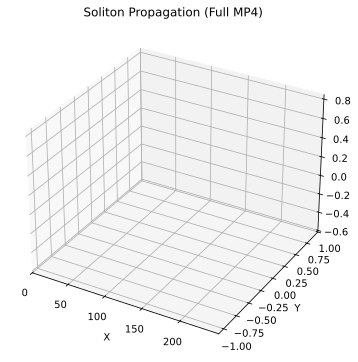

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, Video
from io import StringIO
import matplotlib as mpl

# ------------------------------------------------
# (1) EMBEDDED SAMPLE DATA from Work8.DAT
# Replace this with the full file if needed
# ------------------------------------------------
data_text = """\
   0.0000000000000000        1.7969626959897973E-002   1.1824079982307559E-002   2.1590136778757117E-002
   2.5000000000000001E-002   1.7629674465360356E-002   1.2321461657394993E-002   2.1591557845086706E-002
   5.0000000000000003E-002   1.7276721335166004E-002   1.2808230042862462E-002   2.1593351132219465E-002
   7.4999999999999997E-002   1.6911119065983027E-002   1.3283971868541558E-002   2.1595440985282741E-002
  0.10000000000000001        1.6533233266682653E-002   1.3748292351802352E-002   2.1597752912405555E-002
  0.12500000000000000        1.6143445290041490E-002   1.4200814637319432E-002   2.1600214608836963E-002
  0.14999999999999999        1.5742149538272285E-002   1.4641181335651017E-002   2.1602755247366871E-002
  0.17499999999999999        1.5329754292971107E-002   1.5069053784561384E-002   2.1605307557001737E-002
  0.20000000000000001        1.4906678697269001E-002   1.5484113836534065E-002   2.1607807245728753E-002
  0.22500000000000001        1.4473355137186754E-002   1.5886063498071080E-002   2.1610193742611260E-002
  0.25000000000000000        1.4030226122369828E-002   1.6274624987424754E-002   2.1612410021050008E-002
  0.27500000000000002        1.3577743311727850E-002   1.6649541660849591E-002   2.1614403624787729E-002
  0.29999999999999999        1.3116369199824214E-002   1.7010578184705208E-002   2.1616127061040272E-002
  0.32500000000000001        1.2646572336520992E-002   1.7357521969696574E-002   2.1617537743897200E-002
  0.34999999999999998        1.2168830957341226E-002   1.7690180181874449E-002   2.1618596773413323E-002
  0.37500000000000000        1.1683627754583068E-002   1.8008382330802715E-002   2.1619270536659522E-002
  0.40000000000000002        1.1191451322583146E-002   1.8311979219715491E-002   2.1619530768019372E-002
  0.42499999999999999        1.0692796538604043E-002   1.8600844007677367E-002   2.1619353510705493E-002
  0.45000000000000001        1.0188159607234503E-002   1.8874871504858004E-002   2.1618719152651872E-002
  0.47499999999999998        9.6780401612719339E-003   1.9133977356999489E-002   2.1617613594293178E-002
  0.50000000000000000        9.1629402782479174E-003   1.9378098715367033E-002   2.1616026159639617E-002
  0.52500000000000002        8.6433625220267932E-003   1.9607194097394753E-002   2.1613950314551579E-002
  0.55000000000000004        8.1198077010583777E-003   1.9821242680466044E-002   2.1611383651566413E-002
  0.57499999999999996        7.5927771698627057E-003   2.0020243698596965E-002   2.1608326629738557E-002
  0.59999999999999998        7.0627700123395924E-003   2.0204216259511153E-002   2.1604783000203739E-002
  0.62500000000000000        6.5302822658156586E-003   2.0373199607375110E-002   2.1600760068241975E-002
  0.65000000000000002        5.9958051052835422E-003   2.0527251743897683E-002   2.1596266168588923E-002
  0.67500000000000004        5.4598260720501984E-003   2.0666448722600528E-002   2.1591312373552954E-002
  0.69999999999999996        4.9228262572195173E-003   2.0790885266120336E-002   2.1585911687872109E-002
  0.72499999999999998        4.3852804202117145E-003   2.0900673110012240E-002   2.1580077283160342E-002
  0.75000000000000000        3.8476560127363875E-003   2.0995939797691602E-002   2.1573823531692113E-002
  0.77500000000000002        3.3104122057528583E-003   2.1076830007679070E-002   2.1567166170822157E-002
  0.80000000000000004        2.7739997321392200E-003   2.1143503068733624E-002   2.1560119541147858E-002
  0.82499999999999996        2.2388595985532627E-003   2.1196132406141176E-002   2.1552698865686403E-002
  0.84999999999999998        1.7054213511376903E-003   2.1234905668610238E-002   2.1544918218197710E-002
  0.87500000000000000        1.1741038133128109E-003   2.1260023234553879E-002   2.1536791011152866E-002
  0.90000000000000002        6.4531566411463528E-004   2.1271697411509909E-002   2.1528329565877143E-002
  0.92500000000000004        1.1945205190449811E-004   2.1270151228992069E-002   2.1519544125417695E-002
  0.94999999999999996       -4.0310494926491401E-004   2.1255618252461240E-002   2.1510443889867364E-002
  0.97499999999999998       -9.2198473681649837E-004   2.1228341305464946E-002   2.1501036259452079E-002
   1.0000000000000000       -1.4368328157101679E-003   2.1188572564010071E-002   2.1491326704930785E-002
   1.0249999999999999       -1.9473075647347617E-003   2.1136570110638218E-002   2.1481317553447021E-002
   1.0500000000000000       -2.4530813063163752E-003   2.1072599864502446E-002   2.1471010561329194E-002
   1.0750000000000000       -2.9538424953768328E-003   2.0996933286830086E-002   2.1460404444288404E-002
   1.1000000000000001       -3.4492936905895317E-003   2.0909847641165945E-002   2.1449496291674263E-002
   1.1250000000000000       -3.9391528148802601E-003   2.0811622444985831E-002   2.1438280248544852E-002
   1.1499999999999999       -4.4231537129639387E-003   2.0702541287784166E-002   2.1426748935150567E-002
   1.1750000000000000       -4.9010445065039458E-003   2.0582889957975400E-002   2.1414891927575733E-002
   1.2000000000000000       -5.3725900390411288E-003   2.0452955194321679E-002   2.1402698655099812E-002
   1.2250000000000001       -5.8375712203423179E-003   2.0313025175979486E-002   2.1390155513378487E-002
   1.2500000000000000       -6.2957825486074839E-003   2.0163387081599118E-002   2.1377247228031061E-002
   1.2749999999999999       -6.7470353466300087E-003   2.0004327244687908E-002   2.1363958419944026E-002
   1.3000000000000000       -7.1911567069713736E-003   1.9836130153099714E-002   2.1350270779692052E-002
   1.3250000000000000       -7.6279873389925555E-003   1.9659077534936120E-002   2.1336165937007885E-002
   1.3500000000000001       -8.0573839536133649E-003   1.9473448016910842E-002   2.1321625101879120E-002
   1.3750000000000000       -8.4792181475636247E-003   1.9279516394693247E-002   2.1306628402287763E-002
   1.3999999999999999       -8.8933749551503346E-003   1.9077552552873672E-002   2.1291155817399637E-002
   1.4250000000000000       -9.2997527047691524E-003   1.8867821174848025E-002   2.1275186828619397E-002
   1.4500000000000000       -9.6982647809210360E-003   1.8650580794336125E-002   2.1258702090136739E-002
   1.4750000000000001       -1.0088837134415458E-002   1.8426084514873566E-002   2.1241682389876167E-002
   1.5000000000000000       -1.0471408597905739E-002   1.8194578258895255E-002   2.1224109416737677E-002
   1.5249999999999999       -1.0845928548942731E-002   1.7956300240585449E-002   2.1205965496606007E-002
   1.5500000000000000       -1.1212359276269322E-002   1.7711481524741578E-002   2.1187234181946745E-002
   1.5750000000000000       -1.1570673195967425E-002   1.7460344493676346E-002   2.1167900239872545E-002
   1.6000000000000001       -1.1920854321280532E-002   1.7203103785857907E-002   2.1147950854633776E-002
   1.6250000000000000       -1.2262894746999462E-002   1.6939965241114432E-002   2.1127374450706178E-002
   1.6499999999999999       -1.2596797113069744E-002   1.6671125841645696E-002   2.1106162241852272E-002
   1.6750000000000000       -1.2922570497357105E-002   1.6396773948628762E-002   2.1084306547185398E-002
   1.7000000000000000       -1.3240233842635851E-002   1.6117088190326808E-002   2.1061802938102267E-002
   1.7250000000000001       -1.3549810578436858E-002   1.5832238004989486E-002   2.1038648085252559E-002
   1.7500000000000000       -1.3851332756492052E-002   1.5542383927167468E-002   2.1014843344921898E-002
   1.7749999999999999       -1.4144836330575165E-002   1.5247677398341826E-002   2.0990391246671996E-002
   1.8000000000000000       -1.4430362355706541E-002   1.4948260317455562E-002   2.0965297078755791E-002
   1.8250000000000000       -1.4707955717405947E-002   1.4644266149363844E-002   2.0939569780311244E-002
   1.8500000000000001       -1.4977664406164101E-002   1.4335819057078333E-002   2.0913220635166308E-002
   1.8750000000000000       -1.5239539908346875E-002   1.4023035109847906E-002   2.0886264062074493E-002
   1.8999999999999999       -1.5493634067318589E-002   1.3706021433573188E-002   2.0858716361666137E-002
   1.9250000000000000       -1.5740000079723464E-002   1.3384877108291234E-002   2.0830597987742571E-002
   1.9500000000000000       -1.5978691788212093E-002   1.3059694463513233E-002   2.0801931563080040E-002
   1.9750000000000001       -1.6209762641253504E-002   1.2730557566199974E-002   2.0772742107874272E-002
   2.0000000000000000       -1.6433264021790531E-002   1.2397544264321696E-002   2.0743058140838135E-002
   2.0249999999999999       -1.6649246516442156E-002   1.2060725502433402E-002   2.0712910136898823E-002
   2.0499999999999998       -1.6857758763624883E-002   1.1720167116120910E-002   2.0682331501286615E-002
   2.0750000000000002       -1.7058844226458064E-002   1.1375928768221803E-002   2.0651357057169816E-002
   2.1000000000000001       -1.7252545276563797E-002   1.1028065936306895E-002   2.0620025578931146E-002
   2.1250000000000000       -1.7438898088903837E-002   1.0676629818138618E-002   2.0588375317814749E-002
   2.1499999999999999       -1.7617935362290678E-002   1.0321667962253762E-002   2.0556449025386791E-002
   2.1749999999999998       -1.7789683669664425E-002   9.9632253750178822E-003   2.0524288840994383E-002
   2.2000000000000002       -1.7954164869818903E-002   9.6013450371373581E-003   2.0491939904406568E-002
   2.2250000000000001       -1.8111393438750061E-002   9.2360678478969321E-003   2.0459447883499047E-002
   2.2500000000000000       -1.8261379015317429E-002   8.8674345127904113E-003   2.0426859014996905E-002
   2.2749999999999999       -1.8404122275578368E-002   8.4954854328827493E-003   2.0394219887439599E-002
   2.2999999999999998       -1.8539618916662556E-002   8.1202623417408436E-003   2.0361580019434156E-002
   2.3250000000000002       -1.8667857354414341E-002   7.7418078913233067E-003   2.0328986256037393E-002
   2.3500000000000001       -1.8788816685916865E-002   7.3601669460135839E-003   2.0296485590989947E-002
   2.3750000000000000       -1.8902469903124809E-002   6.9753874439507065E-003   2.0264125965559720E-002
   2.3999999999999999       -1.9008781824473835E-002   6.5875211816742362E-003   2.0231953066843573E-002
   2.4249999999999998       -1.9107709771754158E-002   6.1966246032420999E-003   2.0200011658216672E-002
   2.4500000000000002       -1.9199202982336610E-002   5.8027585275142327E-003   2.0168345373122971E-002
   2.4750000000000001       -1.9283204174288717E-002   5.4059905014095548E-003   2.0136995716771272E-002
   2.5000000000000000       -1.9359647132470507E-002   5.0063942522080556E-003   2.0106000940909013E-002
   2.5249999999999999       -1.9428458442952139E-002   4.6040508377101106E-003   2.0075398264963497E-002
   2.5499999999999998       -1.9489559662573559E-002   4.1990497297577783E-003   2.0045220736057738E-002
   2.5750000000000002       -1.9542862495482479E-002   3.7914877760707134E-003   2.0015497257587819E-002
   2.6000000000000001       -1.9588274459209857E-002   3.3814718589694594E-003   1.9986254725670144E-002
   2.6250000000000000       -1.9625695882853605E-002   2.9691185120646248E-003   1.9957513212951274E-002
   2.6499999999999999       -1.9655021086283846E-002   2.5545534058615646E-003   1.9929290211786969E-002
   2.6749999999999998       -1.9676140618080745E-002   2.1379139233424849E-003   1.9901597885652017E-002
   2.7000000000000002       -1.9688939533344493E-002   1.7193480460391615E-003   1.9874442247488810E-002
   2.7250000000000001       -1.9693298118761478E-002   1.2990151604439241E-003   1.9847823707456514E-002
   2.7500000000000000       -1.9689093549127928E-002   8.7708691519166324E-004   1.9821736671058545E-002
   2.7749999999999999       -1.9676200058294822E-002   4.5374658265076101E-004   1.9796169250008846E-002
   2.7999999999999998       -1.9654489317607961E-002   2.9188986022913244E-005   1.9771102753956792E-002
   2.8250000000000002       -1.9623832444156736E-002  -3.9637711879261133E-004   1.9746511836155986E-002
   2.8500000000000001       -1.9584098148639695E-002  -8.2273142826028167E-004   1.9722363781471922E-002
   2.8750000000000000       -1.9535156426684217E-002  -1.2496408331696951E-003   1.9698619327511997E-002
   2.8999999999999999       -1.9476876960533827E-002  -1.6768595356426296E-003   1.9675230542414528E-002
   2.9249999999999998       -1.9409131669516945E-002  -2.1041292206984579E-003   1.9652143102126630E-002
   2.9500000000000002       -1.9331793363746585E-002  -2.5311789442953284E-003   1.9629293923797860E-002
   2.9750000000000001       -1.9244738938553364E-002  -2.9577255608025385E-003   1.9606613739807693E-002
   3.0000000000000000       -1.9147849324724086E-002  -3.3834740362003106E-003   1.9584025007786162E-002
   3.0249999999999999       -1.9041009711967507E-002  -3.8081182394620891E-003   1.9561443872878788E-002
   3.0499999999999998       -1.8924111430711234E-002  -4.2313393616991209E-003   1.9538778562566316E-002
   3.0750000000000002       -1.8797051164460260E-002  -4.6528081964706128E-003   1.9515929542262524E-002
   3.1000000000000001       -1.8659733003894279E-002  -5.0721850347982449E-003   1.9492791692679791E-002
   3.1250000000000000       -1.8512069419915841E-002  -5.4891204592383194E-003   1.9469254175545545E-002
   3.1499999999999999       -1.8353982973705704E-002  -5.9032556143867911E-003   1.9445200242035179E-002
   3.1749999999999998       -1.8185403794947656E-002  -6.3142233026558057E-003   1.9420506173471568E-002
   3.2000000000000002       -1.8006272722863426E-002  -6.7216473279576496E-003   1.9395045176407603E-002
   3.2250000000000001       -1.7816543334886453E-002  -7.1251446926404068E-003   1.9368685694814935E-002
   3.2500000000000000       -1.7616179145267613E-002  -7.5243262111384240E-003   1.9341292013179270E-002
   3.2749999999999999       -1.7405157770803321E-002  -7.9187968174872139E-003   1.9312726526188252E-002
   3.2999999999999998       -1.7183469357535525E-002  -8.3081564218272230E-003   1.9282848245799039E-002
   3.3250000000000002       -1.6951117641916851E-002  -8.6920008844778851E-003   1.9251515877169962E-002
   3.3500000000000001       -1.6708122003344619E-002  -9.0699242800400502E-003   1.9218587065825982E-002
   3.3750000000000000       -1.6454515939483234E-002  -9.4415172327481506E-003   1.9183918535896641E-002
   3.3999999999999999       -1.6190347704694737E-002  -9.8063702718035779E-003   1.9147369470476260E-002
   3.4249999999999998       -1.5915683996899667E-002  -1.0164074032208906E-002   1.9108801682906896E-002
   3.4500000000000002       -1.5630606640879535E-002  -1.0514220412274122E-002   1.9068077778749991E-002
   3.4750000000000001       -1.5335212838359409E-002  -1.0856402849551196E-002   1.9025064529219142E-002
   3.5000000000000000       -1.5029619662736089E-002  -1.1190218772409423E-002   1.8979634819911679E-002
   3.5249999999999999       -1.4713960071397171E-002  -1.1515269725286839E-002   1.8931665978794497E-002
   3.5499999999999998       -1.4388385634834459E-002  -1.1831162293572776E-002   1.8881042286101095E-002
   3.5750000000000002       -1.4053064395665728E-002  -1.2137511191947019E-002   1.8827654806918708E-002
   3.6000000000000001       -1.3708183837778699E-002  -1.2433937402804523E-002   1.8771403396415389E-002
   3.6250000000000000       -1.3353947738780465E-002  -1.2720071355950409E-002   1.8712196797315100E-002
   3.6499999999999999       -1.2990580292845253E-002  -1.2995554273192563E-002   1.8649955132419037E-002
   3.6749999999999998       -1.2618322178119515E-002  -1.3260036734461947E-002   1.8584607183225098E-002
   3.7000000000000002       -1.2237432548494104E-002  -1.3513182583237391E-002   1.8516095314732268E-002
   3.7250000000000001       -1.1848188217038971E-002  -1.3754668787757319E-002   1.8444372993806059E-002
   3.7500000000000000       -1.1450882895600636E-002  -1.3984186177971042E-002   1.8369407209214039E-002
   3.7749999999999999       -1.1045828722741072E-002  -1.4201440937374323E-002   1.8291178781815489E-002
   3.7999999999999998       -1.0633354372331131E-002  -1.4406155817190748E-002   1.8209682547191977E-002
   3.8250000000000002       -1.0213804821807719E-002  -1.4598069656927436E-002   1.8124928149214545E-002
   3.8500000000000001       -9.7875421404708778E-003  -1.4776940888886477E-002   1.8036941297554510E-002
   3.8750000000000000       -9.3549429045702171E-003  -1.4942545633814142E-002   1.7945761527281466E-002
   3.8999999999999999       -8.9163993105580448E-003  -1.5094680077468971E-002   1.7851445931359112E-002
   3.9249999999999998       -8.4723188862801529E-003  -1.5233161499453876E-002   1.7754067234539834E-002
   3.9500000000000002       -8.0231218873150299E-003  -1.5357827557874272E-002   1.7653714110699693E-002
   3.9750000000000001       -7.5692433255346468E-003  -1.5468538926092002E-002   1.7550492277554428E-002
   4.0000000000000000       -7.1111294509388070E-003  -1.5565177646404518E-002   1.7444522265953107E-002
   4.0250000000000004       -6.6492391722266075E-003  -1.5647649926791102E-002   1.7335941949575440E-002
   4.0499999999999998       -6.1840414060466836E-003  -1.5715884817364915E-002   1.7224903890984109E-002
   4.0750000000000002       -5.7160169823809864E-003  -1.5769836575885241E-002   1.7111577400779027E-002
   4.0999999999999996       -5.2456549166682593E-003  -1.5809482748646492E-002   1.6996144525349113E-002
   4.1250000000000000       -4.7734528349325451E-003  -1.5834826288210615E-002   1.6878802595731966E-002
   4.1500000000000004       -4.2999148226912642E-003  -1.5845895347932532E-002   1.6759761635250912E-002
   4.1749999999999998       -3.8255532782023203E-003  -1.5842743326592513E-002   1.6639245345910804E-002
   4.2000000000000002       -3.3508845225584906E-003  -1.5825450083124564E-002   1.6517487801593362E-002
   4.2249999999999996       -2.8764298073937142E-003  -1.5794120066510212E-002   1.6394733137413440E-002
   4.2500000000000000       -2.4027140953153028E-003  -1.5748883362805655E-002   1.6271234960496955E-002
   4.2750000000000004       -1.9302642414413763E-003  -1.5689895683891831E-002   1.6147253765279063E-002
   4.2999999999999998       -1.4596085157926664E-003  -1.5617338917556433E-002   1.6023055686803213E-002
   4.3250000000000002       -9.9127459003106036E-004  -1.5531418601555746E-002   1.5898910795313921E-002
   4.3499999999999996       -5.2578968584443076E-004  -1.5432367372098913E-002   1.5775093040487853E-002
   4.3750000000000000       -6.3679079294664393E-005  -1.5320441300184196E-002   1.5651874338071310E-002
   4.4000000000000004        3.9453583176270938E-004  -1.5195920258274315E-002   1.5529526465234051E-002
   4.4249999999999998        8.4833817571041380E-004  -1.5059109921674597E-002   1.5408317176699124E-002
   4.4500000000000002        1.2972158876011647E-003  -1.4910337367461557E-002   1.5288507289849550E-002
   4.4749999999999996        1.7406644634819751E-003  -1.4749953949861946E-002   1.5170350754530156E-002
   4.5000000000000000        2.1781868602897135E-003  -1.4578331393142262E-002   1.5054088616858601E-002
   4.5250000000000004        2.6092956464759563E-003  -1.4395864501024758E-002   1.4939951607092265E-002
   4.5499999999999998        3.0335123996662367E-003  -1.4202967990491281E-002   1.4828153735822296E-002
   4.5750000000000002        3.4503715506830836E-003  -1.4000076874009044E-002   1.4718893295079324E-002
   4.5999999999999996        3.8594193911972411E-003  -1.3787645059790545E-002   1.4612347503185776E-002
   4.6250000000000000        4.2602143545386511E-003  -1.3566143899266875E-002   1.4508672598030712E-002
   4.6500000000000004        4.6523304868081872E-003  -1.3336061691942853E-002   1.4408002769653264E-002
   4.6749999999999998        5.0353586210795795E-003  -1.3097904426830160E-002   1.4310447030476743E-002
   4.7000000000000002        5.4089033374154251E-003  -1.2852191385834832E-002   1.4216087232353083E-002
   4.7249999999999996        5.7725890559942950E-003  -1.2599455778840314E-002   1.4124979685276817E-002
   4.7500000000000000        6.1260572038181454E-003  -1.2340244807727031E-002   1.4037151631651172E-002
   4.7750000000000004        6.4689694839141837E-003  -1.2075115825921133E-002   1.3952602260116034E-002
   4.7999999999999998        6.8010077447944184E-003  -1.1804637917586121E-002   1.3871302056706978E-002
   4.8250000000000002        7.1218741671271553E-003  -1.1529387147543244E-002   1.3793191404345054E-002
   4.8499999999999996        7.4312936515968861E-003  -1.1249948098062889E-002   1.3718184091585702E-002
   4.8750000000000000        7.7290130030823008E-003  -1.0966912447934116E-002   1.3646165450731855E-002
   4.9000000000000004        8.0148031248700180E-003  -1.0680875974793854E-002   1.3576994988717627E-002
   4.9249999999999998        8.2884578547933897E-003  -1.0392438398825480E-002   1.3510506648911928E-002
   4.9500000000000002        8.5497957443508733E-003  -1.0102201365821016E-002   1.3446511492309734E-002
   4.9749999999999996        8.7986613754356593E-003  -9.8107675394545329E-003   1.3384799202683192E-002
   5.0000000000000000        9.0349231416468126E-003  -9.5187389363270928E-003   1.3325140310553565E-002
   5.0250000000000004        9.2584770551852567E-003  -9.2267156287441643E-003   1.3267289243568427E-002
   5.0499999999999998        9.4692440131478282E-003  -8.9352936256013194E-003   1.3210984859907831E-002
   5.0750000000000002        9.6671714514421376E-003  -8.6450647988097328E-003   1.3155956385990288E-002
   5.0999999999999996        9.8522357223553882E-003  -8.3566139385783025E-003   1.3101924217432722E-002
   5.1250000000000000        1.0024437262446404E-002  -8.0705191161536474E-003   1.3048603423255875E-002
   5.1500000000000004        1.0183806097748438E-002  -7.7873483349676920E-003   1.2995705951389323E-002
   5.1749999999999998        1.0330396664995509E-002  -7.5076587209046333E-003   1.2942943458937897E-002
   5.2000000000000002        1.0464292681577713E-002  -7.2319966417689185E-003   1.2890033133994590E-002
   5.2249999999999996        1.0585603550453921E-002  -6.9608939391770453E-003   1.2836695988597656E-002
   5.2500000000000000        1.0694466476926479E-002  -6.6948692143209291E-003   1.2782664512429841E-002
   5.2750000000000004        1.0791043305458135E-002  -6.4344239280933503E-003   1.2727679623781333E-002
   5.2999999999999998        1.0875523776585953E-002  -6.1800424633884875E-003   1.2671498351044619E-002
   5.3250000000000002        1.0948121852864657E-002  -5.9321913465728571E-003   1.2613894562880149E-002
   5.3499999999999996        1.1009079356927425E-002  -5.6913171797191228E-003   1.2554661122059486E-002
   5.3750000000000000        1.1058659771427847E-002  -5.4578457110529667E-003   1.2493609207736595E-002
   5.4000000000000004        1.1097152410979539E-002  -5.2321806858373334E-003   1.2430576411728402E-002
   5.4249999999999998        1.1124869732097236E-002  -5.0147037254722176E-003   1.2365422952453296E-002
   5.4500000000000002        1.1142147349345249E-002  -4.8057714325613404E-003   1.2298035905356764E-002
   5.4749999999999996        1.1149341780103874E-002  -4.6057162032950797E-003   1.2228329633536294E-002
   5.5000000000000000        1.1146830666937406E-002  -4.4148445134149375E-003   1.2156247328274708E-002
   5.5250000000000004        1.1135012276507707E-002  -4.2334359682098151E-003   1.2081762648724789E-002
   5.5499999999999998        1.1114303137585933E-002  -4.0617430816149852E-003   1.2004879769185585E-002
   5.5750000000000002        1.1085139230029465E-002  -3.8999903794831934E-003   1.1925635440007805E-002
   5.5999999999999996        1.1047971688403624E-002  -3.7483731997875014E-003   1.1844097295393199E-002
   5.6250000000000000        1.1003268123227885E-002  -3.6070583006378911E-003   1.1760366337579327E-002
   5.6500000000000004        1.0951509950447132E-002  -3.4761826215980972E-003   1.1674575494784513E-002
   5.6749999999999998        1.0893192149468739E-002  -3.3558522334318319E-003   1.1586891363560833E-002
   5.7000000000000002        1.0828821750771168E-002  -3.2461435391189647E-003   1.1497512404149132E-002
   5.7249999999999996        1.0758914600522659E-002  -3.1471019858613316E-003   1.1406668507851957E-002
   5.7500000000000000        1.0683997685621909E-002  -3.0587421214549764E-003   1.1314622309939754E-002
   5.7750000000000004        1.0604603204597780E-002  -2.9810476423602541E-003   1.1221665541857844E-002
   5.7999999999999998        1.0521270354169996E-002  -2.9139716955346984E-003   1.1128119585966094E-002
   5.8250000000000002        1.0434542583444142E-002  -2.8574353258571813E-003   1.1034332561659156E-002
   5.8499999999999996        1.0344965700460314E-002  -2.8113299854046641E-003   1.0940680043313764E-002
   5.8750000000000000        1.0253087697997409E-002  -2.7755168646682567E-003   1.0847561001680548E-002
   5.9000000000000004        1.0159455232494454E-002  -2.7498258241394637E-003   1.0755395963577241E-002
   5.9249999999999998        1.0064614236658054E-002  -2.7340582261733354E-003   1.0664624026663768E-002
   5.9500000000000002        9.9691055896584096E-003  -2.7279859827118585E-003   1.0575698869150191E-002
   5.9749999999999996        9.8734652290016350E-003  -2.7313520361964172E-003   1.0489087356907137E-002
   6.0000000000000000        9.7782227681549819E-003  -2.7438723030568969E-003   1.0405264553918740E-002
   6.0250000000000004        9.6838992365453382E-003  -2.7652351236665540E-003   1.0324708374122003E-002
   6.0499999999999998        9.5910053812671807E-003  -2.7951023378701236E-003   1.0247896918044416E-002
   6.0750000000000002        9.5000406955666975E-003  -2.8331113433434870E-003   1.0175302304153352E-002
   6.0999999999999996        9.4114908377523968E-003  -2.8788742387828863E-003   1.0107385086862588E-002
   6.1250000000000000        9.3258272030560131E-003  -2.9319802685268273E-003   1.0044591195898846E-002
   6.1500000000000004        9.2435056614311156E-003  -2.9919966104600040E-003   9.9873434667946959E-003
   6.1749999999999998        9.1649630358863372E-003  -3.0584696948476489E-003   9.9360382441986989E-003
   6.2000000000000002        9.0906188131742102E-003  -3.1309263070130279E-003   9.8910398068158926E-003
   6.2249999999999996        9.0208703506908499E-003  -3.2088752515036624E-003   9.8526732597163710E-003
   6.2500000000000000        8.9560948556845679E-003  -3.2918080381070173E-003   9.8212239528561989E-003
   6.2750000000000004        8.8966459842718098E-003  -3.3792005900426612E-003   9.7969288577208474E-003
   6.2999999999999998        8.8428537235854515E-003  -3.4705161498364955E-003   9.7799752069204354E-003
   6.3250000000000002        8.7950221482378608E-003  -3.5652051299289666E-003   9.7704972830103161E-003
   6.3499999999999996        8.7534302271851522E-003  -3.6627063330008100E-003   9.7685754497341265E-003
   6.3750000000000000        8.7183294640543821E-003  -3.7624507732889547E-003   9.7742328745478689E-003
   6.4000000000000004        8.6899433626506997E-003  -3.8638612107910657E-003   9.7874372076406802E-003
   6.4249999999999998        8.6684673588507902E-003  -3.9663552145823315E-003   9.8081011703416085E-003
   6.4500000000000002        8.6540673371395434E-003  -4.0693461217497446E-003   9.8360832643395370E-003
   6.4749999999999996        8.6468792018382194E-003  -4.1722449482025619E-003   9.8711915417162410E-003
   6.5000000000000000        8.6470086487449287E-003  -4.2744622210876080E-003   9.9131851916405781E-003
   6.5250000000000004        8.6545306109078214E-003  -4.3754088800169628E-003   9.9617800247654500E-003
   6.5499999999999998        8.6694892594175645E-003  -4.4744998869917247E-003   1.0016653290299403E-002
   6.5750000000000002        8.6918975992743789E-003  -4.5711542115678292E-003   1.0077445828073600E-002
   6.5999999999999996        8.7217372597908401E-003  -4.6647970484434698E-003   1.0143769429118286E-002
   6.6250000000000000        8.7589590381924841E-003  -4.7548614111414143E-003   1.0215211375918586E-002
   6.6500000000000004        8.8034827713170359E-003  -4.8407899827870686E-003   1.0291339308310221E-002
   6.6749999999999998        8.8551977729492727E-003  -4.9220365763119542E-003   1.0371706166140469E-002
   6.7000000000000002        8.9139623623967802E-003  -4.9980678991978335E-003   1.0455853766000662E-002
   6.7249999999999996        8.9796050721777081E-003  -5.0683639831898414E-003   1.0543319182204081E-002
   6.7500000000000000        9.0519266254355003E-003  -5.1324211554758309E-003   1.0633637999318336E-002
   6.7750000000000004        9.1306957355209942E-003  -5.1897539342990713E-003   1.0726347236678447E-002
   6.7999999999999998        9.2156577889920786E-003  -5.2398930917073594E-003   1.0820990514336432E-002
   6.8250000000000002        9.3065265251190462E-003  -5.2823904977850099E-003   1.0917116781427568E-002
   6.8499999999999996        9.4029929367970815E-003  -5.3168186073260081E-003   1.1014289525582263E-002
   6.8750000000000000        9.5047217389803915E-003  -5.3427714076018521E-003   1.1112082518117529E-002
   6.9000000000000004        9.6113534460063148E-003  -5.3598668829326832E-003   1.1210084949606416E-002
   6.9249999999999998        9.7225062567578586E-003  -5.3677457113837689E-003   1.1307901437052473E-002
   6.9500000000000002        9.8377761049733229E-003  -5.3660748582985826E-003   1.1405154028818408E-002
   6.9749999999999996        9.9567400551824198E-003  -5.3545458714810822E-003   1.1501483519430767E-002
   7.0000000000000000        1.0078955913751197E-002  -5.3328770463550289E-003   1.1596549297227605E-002
   7.0250000000000004        1.0203964474071178E-002  -5.3008141243584125E-003   1.1690029596689020E-002
   7.0499999999999998        1.0331290354431000E-002  -5.2581298471081374E-003   1.1781621448732026E-002
   7.0750000000000002        1.0460443763218518E-002  -5.2046241311524783E-003   1.1871042065054040E-002
   7.0999999999999996        1.0590923056447064E-002  -5.1401266155818373E-003   1.1958028937999902E-002
   7.1250000000000000        1.0722215672854444E-002  -5.0644938878317671E-003   1.2042337371740026E-002
   7.1500000000000004        1.0853799101162393E-002  -4.9776124892963137E-003   1.2123744193877550E-002
   7.1749999999999998        1.0985144075283601E-002  -4.8793963848885093E-003   1.2202043647173156E-002
   7.2000000000000002        1.1115715169056802E-002  -4.7697885189362218E-003   1.2277049558883417E-002
   7.2249999999999996        1.1244972395621342E-002  -4.6487600057521479E-003   1.2348595004149776E-002
   7.2500000000000000        1.1372374281347783E-002  -4.5163110492273751E-003   1.2416530385008395E-002
   7.2750000000000004        1.1497376578601361E-002  -4.3724687171518397E-003   1.2480724790387821E-002
   7.2999999999999998        1.1619438366495522E-002  -4.2172873600241625E-003   1.2541066379668191E-002
   7.3250000000000002        1.1738020301703322E-002  -4.0508484510648323E-003   1.2597458790997846E-002
   7.3499999999999996        1.1852586420963021E-002  -3.8732603760792132E-003   1.2649825378141646E-002
   7.3750000000000000        1.1962608152365047E-002  -3.6846563810952015E-003   1.2698106508047331E-002
   7.4000000000000004        1.2067563570262929E-002  -3.4851954575917700E-003   1.2742259553944927E-002
   7.4249999999999998        1.2166939812177568E-002  -3.2750599516726724E-003   1.2782260088803791E-002
   7.4500000000000002        1.2260235535442976E-002  -3.0544559719648209E-003   1.2818100450838477E-002
   7.4749999999999996        1.2346958414706333E-002  -2.8236119179732198E-003   1.2849789754510121E-002
   7.5000000000000000        1.2426632647411055E-002  -2.5827783233119748E-003   1.2877356819681690E-002
   7.5250000000000004        1.2498795089771468E-002  -2.3322245139535446E-003   1.2900846022162607E-002
   7.5499999999999998        1.2563000704972805E-002  -2.0722415309990458E-003   1.2920322531607084E-002
   7.5750000000000002        1.2618818626338825E-002  -1.8031371145536199E-003   1.2935865449557056E-002
   7.5999999999999996        1.2665837181884864E-002  -1.5252371164663483E-003   1.2947575427894507E-002
   7.6250000000000000        1.2703664587779169E-002  -1.2388832941869082E-003   1.2955570859450240E-002
   7.6500000000000004        1.2731929183198817E-002  -9.4443209662576895E-004   1.2959988879106947E-002
   7.6749999999999998        1.2750279494931242E-002  -6.4225412170940133E-004   1.2960985666417608E-002
   7.7000000000000002        1.2758386958118441E-002  -3.3273266327529105E-004   1.2958737425938857E-002
   7.7249999999999996        1.2755944798710752E-002  -1.6262414904919315E-005   1.2953438659393678E-002
   7.7500000000000000        1.2742669563448791E-002   3.0675199678228352E-004   1.2945304847160733E-002
   7.7750000000000004        1.2718301818716568E-002   6.3589612248328051E-004   1.2934571438432128E-002
   7.7999999999999998        1.2682606773055957E-002   9.7074796657873458E-004   1.2921492842904586E-002
   7.8250000000000002        1.2635373240452372E-002   1.3108781366507930E-003   1.2906343950491976E-002
   7.8499999999999996        1.2576416559748190E-002   1.6558528931365547E-003   1.2889420500670731E-002
   7.8750000000000000        1.2505575591916082E-002   2.0052326465527597E-003   1.2871035989903901E-002
   7.9000000000000004        1.2422715531662756E-002   2.3585745208057744E-003   1.2851524184099390E-002
   7.9249999999999998        1.2327726498113147E-002   2.7154340533910291E-003   1.2831236536928916E-002
   7.9500000000000002        1.2220524218516517E-002   3.0753642206527887E-003   1.2810543182009250E-002
   7.9749999999999996        1.2101050004434745E-002   3.4379175364839852E-003   1.2789830423333112E-002
   8.0000000000000000        1.1969270101308792E-002   3.8026483646096021E-003   1.2769500580619032E-002
   8.0250000000000004        1.1825175636705411E-002   4.1691111020701731E-003   1.2749969586819038E-002
   8.0500000000000007        1.1668783156673983E-002   4.5368630776085328E-003   1.2731665680844908E-002
   8.0749999999999993        1.1500132127623007E-002   4.9054647697685649E-003   1.2715027914242092E-002
   8.0999999999999996        1.1319287446186209E-002   5.2744802583435590E-003   1.2700503590668285E-002
   8.1250000000000000        1.1126337372815856E-002   5.6434780027343244E-003   1.2688543892034252E-002
   8.1500000000000004        1.0921391606247541E-002   6.0120321479904901E-003   1.2679603776974347E-002
   8.1750000000000007        1.0704584130123257E-002   6.3797227810202875E-003   1.2674137948072419E-002
   8.1999999999999993        1.0476070625897338E-002   6.7461365263345226E-003   1.2672596866282684E-002
   8.2249999999999996        1.0236026874786450E-002   7.1108669052421586E-003   1.2675422549987370E-002
   8.2500000000000000        9.9846499956951270E-003   7.4735153742486425E-003   1.2683046564834606E-002
   8.2750000000000004        9.7221560704361231E-003   7.8336905188945948E-003   1.2695884689526758E-002
   8.3000000000000007        9.4487815551849118E-003   8.1910103896005344E-003   1.2714334333209747E-002
   8.3249999999999993        9.1647804567662507E-003   8.5451014774971055E-003   1.2738769063296585E-002
   8.3499999999999996        8.8704245809457238E-003   8.8955992336102220E-003   1.2769535395510028E-002
   8.3750000000000000        8.5660015755562105E-003   9.2421486805934240E-003   1.2806949311644604E-002
   8.4000000000000004        8.2518161665620284E-003   9.5844047203862432E-003   1.2851293109964522E-002
   8.4250000000000007        7.9281877542898040E-003   9.9220321152301769E-003   1.2902810450843618E-002
   8.4499999999999993        7.5954494332663609E-003   1.0254704911122672E-002   1.2961705199884896E-002
   8.4749999999999996        7.2539477632356771E-003   1.0582108026545379E-002   1.3028138871309736E-002
   8.5000000000000000        6.9040417113858180E-003   1.0903937493574907E-002   1.3102228234215236E-002
   8.5250000000000004        6.5461025145061840E-003   1.1219898165430580E-002   1.3184043721909134E-002
   8.5500000000000007        6.1805121050440533E-003   1.1529705930951303E-002   1.3273609782551973E-002
   8.5749999999999993        5.8076606979321791E-003   1.1833087716414959E-002   1.3370903207334757E-002
   8.5999999999999996        5.4279493581736128E-003   1.2129780560482853E-002   1.3475854428788937E-002
   8.6250000000000000        5.0417857725070557E-003   1.2419532134019839E-002   1.3588347493607775E-002
   8.6500000000000004        4.6495869505961398E-003   1.2702099602155095E-002   1.3708222432936732E-002
   8.6750000000000007        4.2517741390013242E-003   1.2977251570845604E-002   1.3835276493465470E-002
   8.6999999999999993        3.8487757195836856E-003   1.3244767281352269E-002   1.3969265927564728E-002
   8.7249999999999996        3.4410232501238818E-003   1.3504434974906339E-002   1.4109908857962960E-002
   8.7500000000000000        3.0289546855071371E-003   1.3756054385388412E-002   1.4256889245425808E-002
   8.7750000000000004        2.6130087290848398E-003   1.3999434506789730E-002   1.4409856946302334E-002
   8.8000000000000007        2.1936290076019992E-003   1.4234394271830981E-002   1.4568434436732692E-002
   8.8249999999999993        1.7712588737382943E-003   1.4460763449407055E-002   1.4732217185464691E-002
   8.8499999999999996        1.3463427692834518E-003   1.4678380334817481E-002   1.4900777695678748E-002
   8.8750000000000000        9.1932705803495548E-004   1.4887094351052562E-002   1.5073670500233997E-002
   8.9000000000000004        4.9065640762755997E-004   1.5086763256360521E-002   1.5250431868716878E-002
   8.9250000000000007        6.0774285278892853E-005   1.5277254664487082E-002   1.5430585984794120E-002
   8.9499999999999993       -3.6987660095532722E-004   1.5458446212386021E-002   1.5613646472092081E-002
   8.9749999999999996       -8.0085715372775848E-004   1.5630223906846652E-002   1.5799118771273692E-002
   9.0000000000000000       -1.2317306245541828E-003   1.5792483777446298E-002   1.5986503837810133E-002
   9.0250000000000004       -1.6620644676358474E-003   1.5945130368293710E-002   1.6175299690518199E-002
   9.0500000000000007       -2.0914292429067461E-003   1.6088077150938376E-002   1.6365003858516105E-002
   9.0749999999999993       -2.5194009417258949E-003   1.6221247458236252E-002   1.6555115873202481E-002
   9.0999999999999996       -2.9455608581906321E-003   1.6344571975281250E-002   1.6745138469095384E-002
   9.1250000000000000       -3.3694966816266978E-003   1.6457992114972467E-002   1.6934580133106232E-002
   9.1500000000000004       -3.7908010012604864E-003   1.6561456219847732E-002   1.7122955275147969E-002
   9.1750000000000007       -4.2090744879769298E-003   1.6654922367453126E-002   1.7309788049173623E-002
   9.1999999999999993       -4.6239246936496644E-003   1.6738357329513398E-002   1.7494610872831520E-002
   9.2249999999999996       -5.0349664728685265E-003   1.6811736011352375E-002   1.7676966958967543E-002
   9.2500000000000000       -5.4418240818815472E-003   1.6875041420417999E-002   1.7856411580066414E-002
   9.2750000000000004       -5.8441285553845071E-003   1.6928266693949316E-002   1.8032513055121897E-002
   9.3000000000000007       -6.2415213490514343E-003   1.6971412139978062E-002   1.8204851667494304E-002
   9.3249999999999993       -6.6336522744503334E-003   1.7004487569364433E-002   1.8373023894532242E-002
   9.3499999999999996       -7.0201826927289790E-003   1.7027510003487054E-002   1.8536639106191192E-002
   9.3750000000000000       -7.4007820589511728E-003   1.7040506033138052E-002   1.8695322909819647E-002
   9.4000000000000004       -7.7751307152919584E-003   1.7043510090303991E-002   1.8848716616312055E-002
   9.4250000000000007       -8.1429200381294992E-003   1.7036565734744463E-002   1.8996477408862358E-002
   9.4499999999999993       -8.5038525304210761E-003   1.7019724077115786E-002   1.9138279373768892E-002
   9.4749999999999996       -8.8576410153168323E-003   1.6993045147109583E-002   1.9273813949663918E-002
   9.5000000000000000       -9.2040116060349304E-003   1.6956597448774601E-002   1.9402789096548415E-002
   9.5250000000000004       -9.5427008395677568E-003   1.6910458123677110E-002   1.9524930806736972E-002
   9.5500000000000007       -9.8734574831019564E-003   1.6854712050309875E-002   1.9639982461239203E-002
   9.5749999999999993       -1.0196043127893463E-002   1.6789453467208747E-002   1.9747705904546761E-002
   9.5999999999999996       -1.0510231392297018E-002   1.6714784195452696E-002   1.9847880164259722E-002
   9.6250000000000000       -1.0815808765356207E-002   1.6630814543335641E-002   1.9940302566456056E-002
   9.6500000000000004       -1.1112573423813865E-002   1.6537663496300689E-002   2.0024789067036124E-002
   9.6750000000000007       -1.1400338557263004E-002   1.6435458028716456E-002   2.0101173329524057E-002
   9.6999999999999993       -1.1678929095338462E-002   1.6324332766288651E-002   2.0169307047886907E-002
   9.7249999999999996       -1.1948183783650668E-002   1.6204431689296070E-002   2.0229061313979408E-002
   9.7500000000000000       -1.2207954163135472E-002   1.6075906227702497E-002   2.0280324563193484E-002
   9.7750000000000004       -1.2458105907358441E-002   1.5938915881994423E-002   2.0323003713054889E-002
   9.8000000000000007       -1.2698517758178145E-002   1.5793627820965262E-002   2.0357022663507710E-002
   9.8249999999999993       -1.2929082230689420E-002   1.5640216918422271E-002   2.0382324725687930E-002
   9.8499999999999996       -1.3149704900915448E-002   1.5478866431191857E-002   2.0398870415500762E-002
   9.8750000000000000       -1.3360307175519105E-002   1.5309766002300723E-002   2.0406638231480770E-002
   9.9000000000000004       -1.3560821137272347E-002   1.5133113732979826E-002   2.0405623978632950E-002
   9.9250000000000007       -1.3751195586010479E-002   1.4949114628530769E-002   2.0395841165069390E-002
   9.9499999999999993       -1.3931390933441937E-002   1.4757979757453698E-002   2.0377319169644595E-002
   9.9749999999999996       -1.4101381776447309E-002   1.4559927743054948E-002   2.0350106030493254E-002
   10.000000000000000       -1.4261157487849525E-002   1.4355183760217148E-002   2.0314265333053791E-002
   10.025000000000000       -1.4410719560539669E-002   1.4143978575407834E-002   2.0269876541515530E-002
   10.050000000000001       -1.4550083409877675E-002   1.3926549785434509E-002   2.0217036120251206E-002
   10.074999999999999       -1.4679279198871173E-002   1.3703140149853384E-002   2.0155856362038940E-002
   10.100000000000000       -1.4798349604984032E-002   1.3473998183521919E-002   2.0086464560382856E-002
   10.125000000000000       -1.4907350146889769E-002   1.3239377093794698E-002   2.0009002748377250E-002
   10.150000000000000       -1.5006350445182351E-002   1.2999534781102721E-002   1.9923627923174009E-002
   10.175000000000001       -1.5095432624638760E-002   1.2754733337130324E-002   1.9830510878952608E-002
   10.199999999999999       -1.5174691898105547E-002   1.2505239184999092E-002   1.9729836882489381E-002
   10.225000000000000       -1.5244235996887207E-002   1.2251321362840422E-002   1.9621803648669937E-002
   10.250000000000000       -1.5304185036146261E-002   1.1993253413609371E-002   1.9506622908591023E-002
   10.275000000000000       -1.5354672971701205E-002   1.1731309431700943E-002   1.9384518028432770E-002
   10.300000000000001       -1.5395843898038166E-002   1.1465766983590409E-002   1.9255723845953702E-002
   10.324999999999999       -1.5427854289231088E-002   1.1196905732806798E-002   1.9120487988005301E-002
   10.350000000000000       -1.5450873511147711E-002   1.0925004567325178E-002   1.8979068035996773E-002
   10.375000000000000       -1.5465081494499752E-002   1.0650344178690801E-002   1.8831732272109374E-002
   10.400000000000000       -1.5470669143696396E-002   1.0373205041686498E-002   1.8678758428154498E-002
   10.425000000000001       -1.5467837919756153E-002   1.0093866988308078E-002   1.8520433435455903E-002
   10.449999999999999       -1.5456800796428680E-002   9.8126082841433707E-003   1.8357053638982667E-002
   10.475000000000000       -1.5437780937661594E-002   9.5297058688594647E-003   1.8188923341181121E-002
   10.500000000000000       -1.5411010516517583E-002   9.2454340530725675E-003   1.8016353795974733E-002
   10.525000000000000       -1.5376731971028606E-002   8.9600643467138003E-003   1.7839663900603438E-002
   10.550000000000001       -1.5335196429147914E-002   8.6738645152439637E-003   1.7659177747654912E-002
   10.574999999999999       -1.5286663445651534E-002   8.3870986784433908E-003   1.7475227059132913E-002
   10.600000000000000       -1.5231401944965060E-002   8.1000250014425634E-003   1.7288147294122785E-002
   10.625000000000000       -1.5169688537487951E-002   7.8128972274198998E-003   1.7098278655038469E-002
   10.650000000000000       -1.5101806202411470E-002   7.5259622301359448E-003   1.6905965740535437E-002
   10.675000000000001       -1.5028046295133395E-002   7.2394602085543236E-003   1.6711556376655064E-002
   10.699999999999999       -1.4948706164648657E-002   6.9536246035307751E-003   1.6515401217856201E-002
   10.725000000000000       -1.4864089664643745E-002   6.6686807962389252E-003   1.6317853035282173E-002
   10.750000000000000       -1.4774504742272701E-002   6.3848448970325071E-003   1.6119265637700095E-002
   10.775000000000000       -1.4680266095420183E-002   6.1023242289348582E-003   1.5919994916058996E-002
   10.800000000000001       -1.4581691405186737E-002   5.8213164092750262E-003   1.5720395688393073E-002
   10.824999999999999       -1.4479103539645738E-002   5.5420087005982636E-003   1.5520824037317473E-002
   10.850000000000000       -1.4372827547951906E-002   5.2645781518696512E-003   1.5321634454701619E-002
   10.875000000000000       -1.4263192208929458E-002   4.9891893085669513E-003   1.5123180634194339E-002
   10.900000000000000       -1.4150527977232243E-002   4.7159952511859346E-003   1.4925814559993748E-002
   10.925000000000001       -1.4035166893196300E-002   4.4451375952946686E-003   1.4729884994649160E-002
   10.949999999999999       -1.3917441206508011E-002   4.1767444108719775E-003   1.4535737741645424E-002
   10.975000000000000       -1.3797684032943307E-002   3.9109299143901509E-003   1.4343716659276876E-002
   11.000000000000000       -1.3676228041426213E-002   3.6477966392427352E-003   1.4154159803260095E-002
   11.025000000000000       -1.3553404634020563E-002   3.3874316175391815E-003   1.3967401428730687E-002
   11.050000000000001       -1.3429542560654935E-002   3.1299081268748013E-003   1.3783770434823376E-002
   11.074999999999999       -1.3304968715601708E-002   2.8752861856577009E-003   1.3603590880513206E-002
   11.100000000000000       -1.3180007893411458E-002   2.6236097462490064E-003   1.3427180693927693E-002
   11.125000000000000       -1.3054978366137624E-002   2.3749080321177904E-003   1.3254849839179957E-002
   11.150000000000000       -1.2930195914968882E-002   2.1291960948776820E-003   1.3086903086882325E-002
   11.175000000000001       -1.2805968659027011E-002   1.8864741384610026E-003   1.2923635968200214E-002
   11.199999999999999       -1.2682601701220611E-002   1.6467261780401489E-003   1.2765338238312374E-002
   11.225000000000000       -1.2560390369119143E-002   1.4099217028095297E-003   1.2612289035565213E-002
   11.250000000000000       -1.2439624544509408E-002   1.1760157487011411E-003   1.2464761143677706E-002
   11.275000000000000       -1.2320584246786597E-002   9.4494818651902346E-004   1.2323015183566478E-002
   11.300000000000001       -1.2203541513721581E-002   7.1664412296736318E-004   1.2187304287637630E-002
   11.324999999999999       -1.2088757131957579E-002   4.9101438372019560E-004   1.2057869694975326E-002
   11.350000000000000       -1.1976483319211896E-002   2.6795532460960228E-004   1.1934943899911628E-002
   11.375000000000000       -1.1866959167615113E-002   4.7350343363564089E-005   1.1818746889610208E-002
   11.400000000000000       -1.1760414869929795E-002  -1.7093176285405375E-004   1.1709489200809612E-002
   11.425000000000001       -1.1657064136769868E-002  -3.8703515498997245E-004   1.1607367653130727E-002
   11.449999999999999       -1.1557111564042617E-002  -6.0111546315151166E-004   1.1512569615012635E-002
   11.475000000000000       -1.1460745227174478E-002  -8.1334184516371796E-004   1.1425267528660812E-002
   11.500000000000000       -1.1368138869229230E-002  -1.0238937618182011E-003   1.1345623132873251E-002
   11.525000000000000       -1.1279453023190080E-002  -1.2329617687640653E-003   1.1273785418288169E-002
   11.550000000000001       -1.1194830989379317E-002  -1.4407474314392457E-003   1.1209890543071553E-002
   11.574999999999999       -1.1114401294217537E-002  -1.6474604788421880E-003   1.1154061087570893E-002
   11.600000000000000       -1.1038274941775009E-002  -1.8533205222022783E-003   1.1106406876399985E-002
   11.625000000000000       -1.0966546296720866E-002  -2.0585548096926391E-003   1.1067025435045385E-002
   11.650000000000000       -1.0899291827361430E-002  -2.2633977999419251E-003   1.1035999407768884E-002
   11.675000000000001       -1.0836570526118675E-002  -2.4680896734931130E-003   1.1013399689569204E-002
   11.699999999999999       -1.0778422803474207E-002  -2.6728773693151494E-003   1.0999283924540080E-002
   11.725000000000000       -1.0724871250232361E-002  -2.8780118192796443E-003   1.0993696939773338E-002
   11.750000000000000       -1.0675919435569189E-002  -3.0837463810518173E-003   1.0996670883894008E-002
   11.775000000000000       -1.0631550749525084E-002  -3.2903388884309337E-003   1.1008224109522262E-002
   11.800000000000001       -1.0591730226584131E-002  -3.4980480079697851E-003   1.1028363731303335E-002
   11.824999999999999       -1.0556403457418149E-002  -3.7071328974287105E-003   1.1057084545036802E-002
   11.850000000000000       -1.0525496222895225E-002  -3.9178530151895144E-003   1.1094369228327482E-002
   11.875000000000000       -1.0498915338496425E-002  -4.1304666254980008E-003   1.1140188802572526E-002
   11.900000000000000       -1.0476547139388951E-002  -4.3452290796680421E-003   1.1194502968039437E-002
   11.925000000000001       -1.0458260035087994E-002  -4.5623928002135024E-003   1.1257260598540226E-002
   11.949999999999999       -1.0443899961424523E-002  -4.7822066496771929E-003   1.1328397945366102E-002
   11.975000000000000       -1.0433296529337392E-002  -5.0049135898510080E-003   1.1407843996736522E-002
   12.000000000000000       -1.0426259909952718E-002  -5.2307501173792601E-003   1.1495514864765603E-002
   12.025000000000000       -1.0422580382442433E-002  -5.4599468502854066E-003   1.1591317359661806E-002
   12.050000000000001       -1.0422029030912867E-002  -5.6927249792686815E-003   1.1695148095795390E-002
   12.074999999999999       -1.0424360692551874E-002  -5.9292969528779924E-003   1.1806895514571987E-002
   12.100000000000000       -1.0429311537801012E-002  -6.1698658348059094E-003   1.1926437415138927E-002
   12.125000000000000       -1.0436600601048127E-002  -6.4146226081829780E-003   1.2053643083189252E-002
   12.150000000000000       -1.0445928986189436E-002  -6.6637488723111380E-003   1.2188373255298280E-002
   12.175000000000001       -1.0456983430453870E-002  -6.9174113713334441E-003   1.2330480145677484E-002
   12.199999999999999       -1.0469433395153931E-002  -7.1757655122659005E-003   1.2479807988570716E-002
   12.225000000000000       -1.0482935091123208E-002  -7.4389517517295242E-003   1.2636192933071192E-002
   12.250000000000000       -1.0497128341897406E-002  -7.7070960742281801E-003   1.2799462664710484E-002
   12.275000000000000       -1.0511639809064475E-002  -7.9803091597491077E-003   1.2969438259195065E-002
   12.300000000000001       -1.0526085152348512E-002  -8.2586865306961219E-003   1.3145933332775446E-002
   12.324999999999999       -1.0540065167353516E-002  -8.5423058283887483E-003   1.3328754210754917E-002
   12.350000000000000       -1.0553172088960007E-002  -8.8312287741982992E-003   1.3517702385066610E-002
   12.375000000000000       -1.0564985708466156E-002  -9.1254991566148969E-003   1.3712570231417890E-002
   12.400000000000000       -1.0575078277381893E-002  -9.4251438642683066E-003   1.3913147026618961E-002
   12.425000000000001       -1.0583011476104178E-002  -9.7301699523688369E-003   1.4119214411485826E-002
   12.449999999999999       -1.0588341324225125E-002  -1.0040567651654191E-002   1.4330551003527018E-002
   12.475000000000000       -1.0590616219840331E-002  -1.0356307772632450E-002   1.4546929124190776E-002
   12.500000000000000       -1.0589379897388550E-002  -1.0677341678630327E-002   1.4768117700336238E-002
   12.525000000000000       -1.0584170786710013E-002  -1.1003602110652086E-002   1.4993881621409220E-002
   12.550000000000001       -1.0574524786582235E-002  -1.1335002905891241E-002   1.5223983465531370E-002
   12.574999999999999       -1.0559975036175125E-002  -1.1671437747296171E-002   1.5458181882862949E-002
   12.600000000000000       -1.0540052804673983E-002  -1.2012782279098308E-002   1.5696233770451269E-002
   12.625000000000000       -1.0514289264686817E-002  -1.2358891578884843E-002   1.5937894514620483E-002
   12.650000000000000       -1.0482217776370432E-002  -1.2709603060776911E-002   1.6182919859785160E-002
   12.675000000000001       -1.0443373001748598E-002  -1.3064734408553585E-002   1.6431063099920984E-002
   12.699999999999999       -1.0397291873871176E-002  -1.3424084494882671E-002   1.6682079142816435E-002
   12.725000000000000       -1.0343516421229092E-002  -1.3787434925116953E-002   1.6935724093735109E-002
   12.750000000000000       -1.0281594053493961E-002  -1.4154547081859143E-002   1.7191754462842292E-002
   12.775000000000000       -1.0211077661129143E-002  -1.4525167096389123E-002   1.7449930402171493E-002
   12.800000000000001       -1.0131528146955065E-002  -1.4899022490356980E-002   1.7710013714565414E-002
   12.824999999999999       -1.0042514374363442E-002  -1.5275822854874180E-002   1.7971770380689759E-002
   12.850000000000000       -9.9436163478604529E-003  -1.5655263139274955E-002   1.8234971498610971E-002
   12.875000000000000       -9.8344223534646818E-003  -1.6037021177581767E-002   1.8499391092345430E-002
   12.900000000000000       -9.7145331606180059E-003  -1.6420760194068042E-002   1.8764810499590005E-002
   12.925000000000001       -9.5835628246052490E-003  -1.6806127774796335E-002   1.9031016698143392E-002
   12.949999999999999       -9.4411377764309287E-003  -1.7192757905460786E-002   1.9297803291630476E-002
   12.975000000000000       -9.2868995505621249E-003  -1.7580271388322060E-002   1.9564971860602579E-002
   13.000000000000000       -9.1205046310544047E-003  -1.7968274574105464E-002   1.9832330835553042E-002
   13.025000000000000       -8.9416261892128861E-003  -1.8356363276540090E-002   2.0099698527294027E-002
   13.050000000000001       -8.7499538270099445E-003  -1.8744121539901726E-002   2.0366901756227403E-002
   13.074999999999999       -8.5451953748956928E-003  -1.9131121883811636E-002   2.0633777046708202E-002
   13.100000000000000       -8.3270771448060305E-003  -1.9516927814611403E-002   2.0900170689229666E-002
   13.125000000000000       -8.0953451093565450E-003  -1.9901093401771784E-002   2.1165939031767059E-002
   13.150000000000000       -7.8497639620765357E-003  -2.0283163307216627E-002   2.1430949748505460E-002
   13.175000000000001       -7.5901219952493153E-003  -2.0662676435871354E-002   2.1695082081894395E-002
   13.199999999999999       -7.3162259049231928E-003  -2.1039163786613368E-002   2.1958225802286034E-002
   13.225000000000000       -7.0279059202724278E-003  -2.1412151868075924E-002   2.2220284017070185E-002
   13.250000000000000       -6.7250148263913170E-003  -2.1781160489273848E-002   2.2481169352819078E-002
   13.275000000000000       -6.4074275673312048E-003  -2.2145706466712243E-002   2.2740807704014290E-002
   13.300000000000001       -6.0750427726531811E-003  -2.2505302145545209E-002   2.2999136211690842E-002
   13.324999999999999       -5.7277843126309885E-003  -2.2859458284015005E-002   2.3256104972631930E-002
   13.350000000000000       -5.3655988819553586E-003  -2.3207684658036555E-002   2.3511675759892135E-002
   13.375000000000000       -4.9884574803503202E-003  -2.3549489541981945E-002   2.3765821516876510E-002
   13.400000000000000       -4.5963569865016375E-003  -2.3884381284831290E-002   2.4018527060292009E-002
   13.425000000000001       -4.1893185836097352E-003  -2.4211869820315427E-002   2.4269789169588711E-002
   13.449999999999999       -3.7673897468292871E-003  -2.4531466707374858E-002   2.4519614960457958E-002
   13.475000000000000       -3.3306415659562459E-003  -2.4842687200553135E-002   2.4768022359316685E-002
   13.500000000000000       -2.8791731361189712E-003  -2.5145048356276279E-002   2.5015039277745118E-002
   13.525000000000000       -2.4131073424506393E-003  -2.5438073373593849E-002   2.5260704604518496E-002
   13.550000000000001       -1.9325928228887141E-003  -2.5721290815240720E-002   2.5505064257157428E-002
   13.574999999999999       -1.4378043697082601E-003  -2.5994234383466784E-002   2.5748173843286704E-002
   13.600000000000000       -9.2894143270939367E-004  -2.6256445653546276E-002   2.5990097079261858E-002
   13.625000000000000       -4.0623003089150538E-004  -2.6507474133106470E-002   2.6230903460600655E-002
   13.650000000000000        1.3008071201900937E-004  -2.6746876576515703E-002   2.6470668989145459E-002
   13.675000000000001        6.7971492093997173E-004  -2.6974221490654763E-002   2.6709476062543838E-002
   13.699999999999999        1.2423730929695149E-003  -2.7189085798034422E-002   2.6947410068734520E-002
   13.725000000000000        1.8177321027615407E-003  -2.7391058641430977E-002   2.7184561429412377E-002
   13.750000000000000        2.4054432012724104E-003  -2.7579739684660560E-002   2.7421020994240111E-002
   13.775000000000000        3.0051357480420206E-003  -2.7754742001158676E-002   2.7656882988451984E-002
   13.800000000000001        3.6164152729360865E-003  -2.7915691240251485E-002   2.7892240812883710E-002
   13.824999999999999        4.2388656114853108E-003  -2.8062226788312251E-002   2.8127187781220739E-002
   13.850000000000000        4.8720479949005604E-003  -2.8194003436179844E-002   2.8361815872026838E-002
   13.875000000000000        5.5155023523076902E-003  -2.8310690159527259E-002   2.8596213806874850E-002
   13.900000000000000        6.1687486194006609E-003  -2.8411971527796290E-002   2.8830466017511061E-002
   13.925000000000001        6.8312866192984179E-003  -2.8497548856609708E-002   2.9064653074885045E-002
   13.949999999999999        7.5025964831498173E-003  -2.8567139792284583E-002   2.9298849220198691E-002
   13.975000000000000        8.1821399765909519E-003  -2.8620479978486994E-002   2.9533121964508007E-002
   14.000000000000000        8.8693617468573963E-003  -2.8657322712318394E-002   2.9767531120259490E-002
   14.025000000000000        9.5636894175111509E-003  -2.8677439031950407E-002   3.0002127499962093E-002
   14.050000000000001        1.0264534189354092E-002  -2.8680619233835997E-002   3.0236952471097284E-002
   14.074999999999999        1.0971292580539017E-002  -2.8666671596898879E-002   3.0472036256584796E-002
   14.100000000000000        1.1683347512348436E-002  -2.8635425408962245E-002   3.0707399931144439E-002
   14.125000000000000        1.2400068151665021E-002  -2.8586728682673191E-002   3.0943050508097803E-002
   14.150000000000000        1.3120811647240795E-002  -2.8520448951249257E-002   3.1178983376305095E-002
   14.175000000000001        1.3844924675882728E-002  -2.8436474682595674E-002   3.1415181485437253E-002
   14.199999999999999        1.4571743177850215E-002  -2.8334714458653171E-002   3.1651614005585874E-002
   14.225000000000000        1.5300595700290227E-002  -2.8215097701314907E-002   3.1888237154667529E-002
   14.250000000000000        1.6030801212600639E-002  -2.8077573654560983E-002   3.2124991455268051E-002
   14.275000000000000        1.6761673062038265E-002  -2.7922112136640961E-002   3.2361805292741783E-002
   14.300000000000001        1.7492518798506988E-002  -2.7748705095355614E-002   3.2598591869886444E-002
   14.324999999999999        1.8222642018840992E-002  -2.7557363074968109E-002   3.2835249732421024E-002
   14.350000000000000        1.8951342016505213E-002  -2.7348118073308794E-002   3.3071664713829836E-002
   14.375000000000000        1.9677917785157182E-002  -2.7121022519860663E-002   3.3307708394041138E-002
   14.400000000000000        2.0401666807397301E-002  -2.6876149099819672E-002   3.3543238694548401E-002
   14.425000000000001        2.1121886242897781E-002  -2.6613589872663053E-002   3.3778100202006084E-002
   14.449999999999999        2.1837874750018596E-002  -2.6333457857949022E-002   3.4012126004333836E-002
   14.475000000000000        2.2548935816651322E-002  -2.6035883403452351E-002   3.4245136390946534E-002
   14.500000000000000        2.3254374538247070E-002  -2.5721017712536782E-002   3.4476939984534528E-002
   14.525000000000000        2.3953501866279276E-002  -2.5389029400315948E-002   3.4707335591471912E-002
   14.550000000000001        2.4645634975909544E-002  -2.5040106575841291E-002   3.4936112533640602E-002
   14.574999999999999        2.5330099455784814E-002  -2.4674453762452839E-002   3.5163050246256329E-002
   14.600000000000000        2.6006227403206118E-002  -2.4292293137164092E-002   3.5387920587635575E-002
   14.625000000000000        2.6673362196741657E-002  -2.3893863758278160E-002   3.5610488632254418E-002
   14.650000000000000        2.7330857010920452E-002  -2.3479420103028423E-002   3.5830512687822627E-002
   14.675000000000001        2.7978077116511232E-002  -2.3049232475739947E-002   3.6047747298070192E-002
   14.699999999999999        2.8614400836462901E-002  -2.2603585574462452E-002   3.6261942075421778E-002
   14.725000000000000        2.9239219082754533E-002  -2.2142778090786297E-002   3.6472844224017885E-002
   14.750000000000000        2.9851939943965983E-002  -2.1667121816909187E-002   3.6680200192704501E-002
   14.775000000000000        3.0451983945894514E-002  -2.1176941988327015E-002   3.6883754735453619E-002
   14.800000000000001        3.1038790228091983E-002  -2.0672574903121566E-002   3.7083254176260329E-002
   14.824999999999999        3.1611814480887117E-002  -2.0154366739549037E-002   3.7278445993072715E-002
   14.850000000000000        3.2170531307384134E-002  -1.9622675063597574E-002   3.7469081992718076E-002
   14.875000000000000        3.2714433024565608E-002  -1.9077867412411534E-002   3.7654917147430106E-002
   14.900000000000000        3.3243032278422499E-002  -1.8520317486581287E-002   3.7835712640522295E-002
   14.925000000000001        3.3755862084457182E-002  -1.7950408161247558E-002   3.8011235632528534E-002
   14.949999999999999        3.4252475246674040E-002  -1.7368529122594498E-002   3.8181261228004117E-002
   14.975000000000000        3.4732446885634233E-002  -1.6775074915082577E-002   3.8345573634695686E-002
   15.000000000000000        3.5195373721248924E-002  -1.6170445229123837E-002   3.8503966370669905E-002
   15.025000000000000        3.5640874343268472E-002  -1.5555044469872346E-002   3.8656244439306965E-002
   15.050000000000001        3.6068590566067295E-002  -1.4929279859968246E-002   3.8802224645016314E-002
   15.074999999999999        3.6478186190550634E-002  -1.4293561346499369E-002   3.8941736534113973E-002
   15.100000000000000        3.6869349626590872E-002  -1.3648299431050708E-002   3.9074623877795790E-002
   15.125000000000000        3.7241791200424645E-002  -1.2993906374462015E-002   3.9200744607809423E-002
   15.150000000000000        3.7595245620583764E-002  -1.2330793741647101E-002   3.9319972671581979E-002
   15.175000000000001        3.7929470798228587E-002  -1.1659372930238440E-002   3.9432198150923352E-002
   15.199999999999999        3.8244247720519473E-002  -1.0980053197202397E-002   3.9537328503685874E-002
   15.225000000000000        3.8539382552963186E-002  -1.0293241991002657E-002   3.9635288986623385E-002
   15.250000000000000        3.8814703642541047E-002  -9.5993417892536598E-003   3.9726022655595231E-002
   15.275000000000000        3.9070062668385475E-002  -8.8987539810057529E-003   3.9809492492843677E-002
   15.300000000000001        3.9305334466581417E-002  -8.1918741265914335E-003   3.9885680172830951E-002
   15.324999999999999        3.9520417613660090E-002  -7.4790930551985584E-003   3.9954588261971194E-002
   15.350000000000000        3.9715232392564588E-002  -6.7607966548664982E-003   4.0016239329267407E-002
   15.375000000000000        3.9889721677642584E-002  -6.0373638097397124E-003   4.0070676846643331E-002
   15.400000000000000        4.0043849614242295E-002  -5.3091676913113060E-003   4.0117964967399410E-002
   15.425000000000001        4.0177602325618005E-002  -4.5765740139190455E-003   4.0158189463815094E-002
   15.449999999999999        4.0290986891963781E-002  -3.8399413858172665E-003   4.0191458001495525E-002
   15.475000000000000        4.0384030582318438E-002  -3.0996208210577630E-003   4.0217899813721418E-002
   15.500000000000000        4.0456780611188577E-002  -2.3559552432922920E-003   4.0237665011215382E-002
   15.525000000000000        4.0509301782373892E-002  -1.6092794492728157E-003   4.0250925198767301E-002
   15.550000000000001        4.0541680325602146E-002  -8.5991930797928455E-004   4.0257874868825039E-002
   15.574999999999999        4.0554017643262850E-002  -1.0819249808263733E-004   4.0258727585706984E-002
   15.600000000000000        4.0546433931030905E-002   6.4559176392258919E-004   4.0253720759139959E-002
   15.625000000000000        4.0519065673163428E-002   1.4011339331446457E-003   4.0243110451870519E-002
   15.650000000000000        4.0472064575818298E-002   2.1581429000320021E-003   4.0227174022248471E-002
   15.675000000000001        4.0405598213016133E-002   2.9163360455269167E-003   4.0206209536558603E-002
   15.699999999999999        4.0319847661859413E-002   3.6754396695221759E-003   4.0180533325396721E-002
   15.725000000000000        4.0215007947460413E-002   4.4351891656865513E-003   4.0150480939888183E-002
   15.750000000000000        4.0091285923637462E-002   5.1953290854025056E-003   4.0116406126992819E-002
   15.775000000000000        3.9948901606792687E-002   5.9556113759466622E-003   4.0078681404431798E-002
   15.800000000000001        3.9788085900204516E-002   6.7157962008674004E-003   4.0037694236385209E-002
   15.824999999999999        3.9609079026129063E-002   7.4756526664426122E-003   3.9993848990605978E-002
   15.850000000000000        3.9412132933629350E-002   8.2349566560661648E-003   3.9947565830357336E-002
   15.875000000000000        3.9197506644091148E-002   8.9934921421043722E-003   3.9899276247983090E-002
   15.900000000000000        3.8965467337955383E-002   9.7510502937796922E-003   3.9849426480862232E-002
   15.925000000000001        3.8716289955341661E-002   1.0507428941811829E-002   3.9798474028159371E-002
   15.949999999999999        3.8450256960944826E-002   1.1262432921960263E-002   3.9746886505473242E-002
   15.975000000000000        3.8167655339045835E-002   1.2015872318420294E-002   3.9695140356742029E-002
   16.000000000000000        3.7868778396677572E-002   1.2767563712475383E-002   3.9643720585932303E-002
   16.024999999999999        3.7553923847870811E-002   1.3517330160907899E-002   3.9593117378950680E-002
   16.050000000000001        3.7223392408604762E-002   1.4264998260480765E-002   3.9543825770925162E-002
   16.074999999999999        3.6877489466167479E-002   1.5010400079081250E-002   3.9496343748152300E-002
   16.100000000000001        3.6516521663358482E-002   1.5753372108348734E-002   3.9451170528712817E-002
   16.125000000000000        3.6140799808316935E-002   1.6493754113511418E-002   3.9408806415170507E-002
   16.149999999999999        3.5750634718843724E-002   1.7231391070854047E-002   3.9369747133356149E-002
   16.175000000000001        3.5346339303863578E-002   1.7966130035398906E-002   3.9334487172238010E-002
   16.199999999999999        3.4928226691798139E-002   1.8697821664730784E-002   3.9303514110786822E-002
   16.225000000000001        3.4496611032811493E-002   1.9426319024418822E-002   3.9277308320884004E-002
   16.250000000000000        3.4051805667890164E-002   2.0151477544629103E-002   3.9256341074079694E-002
   16.274999999999999        3.3594123723441179E-002   2.0873155634355035E-002   3.9241072918307862E-002
   16.300000000000001        3.3123876955116704E-002   2.1591212379576591E-002   3.9231950697417237E-002
   16.324999999999999        3.2641376611227089E-002   2.2305509519602019E-002   3.9229408090241939E-002
   16.350000000000001        3.2146932291210489E-002   2.3015910818808511E-002   3.9233862047070509E-002
   16.375000000000000        3.1640851607161236E-002   2.3722279906428591E-002   3.9245711616501096E-002
   16.399999999999999        3.1123440521427119E-002   2.4424482936388544E-002   3.9265336572066954E-002
   16.425000000000001        3.0595002318262250E-002   2.5122386400877227E-002   3.9293096135466540E-002
   16.449999999999999        3.0055838765003246E-002   2.5815857975649018E-002   3.9329328003628886E-002
   16.475000000000001        2.9506248549767963E-002   2.6504766860631461E-002   3.9374345287769431E-002
   16.500000000000000        2.8946526723623186E-002   2.7188983551608304E-002   3.9428438267279910E-002
   16.524999999999999        2.8376967289953009E-002   2.7868379294089172E-002   3.9491871740267068E-002
   16.550000000000001        2.7797860424380247E-002   2.8542826140864404E-002   3.9564883965675972E-002
   16.574999999999999        2.7209493450271165E-002   2.9212197651573065E-002   3.9647687563690824E-002
   16.600000000000001        2.6612149586960891E-002   2.9876369099251555E-002   3.9740466872042218E-002
   16.625000000000000        2.6006110058451260E-002   3.0535216921785093E-002   3.9843380117287205E-002
   16.649999999999999        2.5391651789636933E-002   3.1188619305367968E-002   3.9956558235351429E-002
   16.675000000000001        2.4769049674131280E-002   3.1836456837271813E-002   4.0080104888019830E-002
   16.699999999999999        2.4138572337319093E-002   3.2478611700794399E-002   4.0214096076515521E-002
   16.725000000000001        2.3500487743259621E-002   3.3114969077997367E-002   4.0358582626189909E-002
   16.750000000000000        2.2855057959123893E-002   3.3745416108759196E-002   4.0513587934986932E-002
   16.774999999999999        2.2202542960040927E-002   3.4369842914316787E-002   4.0679112523492204E-002
   16.800000000000001        2.1543197298319720E-002   3.4988144188691533E-002   4.0855131083450250E-002
   16.824999999999999        2.0877273060148718E-002   3.5600216635748777E-002   4.1041595927601225E-002
   16.850000000000001        2.0205016638549660E-002   3.6205961499136990E-002   4.1238437109595696E-002
   16.875000000000000        1.9526671049010562E-002   3.6805284210237897E-002   4.1445564551143448E-002
   16.899999999999999        1.8842474510732527E-002   3.7398094704837535E-002   4.1662868578517004E-002
   16.925000000000001        1.8152660981767682E-002   3.7984307755734040E-002   4.1890221707439404E-002
   16.949999999999999        1.7457460193812530E-002   3.8563843130156525E-002   4.2127480663054592E-002
   16.975000000000001        1.6757095077745116E-002   3.9136626138182883E-002   4.2374486622432615E-002
   17.000000000000000        1.6051785540784062E-002   3.9702588334624624E-002   4.2631068450741945E-002
   17.024999999999999        1.5341744023996417E-002   4.0261665959172001E-002   4.2897042624168061E-002
   17.050000000000001        1.4627179635729026E-002   4.0813802808970907E-002   4.3172216550831324E-002
   17.074999999999999        1.3908292763964259E-002   4.1358948166351425E-002   4.3456387844990368E-002
   17.100000000000001        1.3185279718217620E-002   4.1897058636926464E-002   4.3749348921594357E-002
   17.125000000000000        1.2458329288344320E-002   4.2428097363895925E-002   4.4050885534705139E-002
   17.149999999999999        1.1727623329913039E-002   4.2952034016923477E-002   4.4360780414012396E-002
   17.175000000000001        1.0993337193822065E-002   4.3468845754386636E-002   4.4678813278073180E-002
   17.199999999999999        1.0255637133058673E-002   4.3978516523369655E-002   4.5004762867418731E-002
   17.225000000000001        9.5146825437808710E-003   4.4481038114085443E-002   4.5338409043051357E-002
   17.250000000000000        8.7706239511937695E-003   4.4976408864345653E-002   4.5679531863370981E-002
   17.274999999999999        8.0236034954159537E-003   4.5464633777987491E-002   4.6027914864472511E-002
   17.300000000000001        7.2737526856379783E-003   4.5945725391108777E-002   4.6383344906923800E-002
   17.324999999999999        6.5211954709372176E-003   4.6419702861995080E-002   4.6745613317398363E-002
   17.350000000000001        5.7660436285258436E-003   4.6886592000711907E-002   4.7114517333726694E-002
   17.375000000000000        5.0083996065959004E-003   4.7346424558025797E-002   4.7489860539622272E-002
   17.399999999999999        4.2483539585357263E-003   4.7799238717560019E-002   4.7871453521952885E-002
   17.425000000000001        3.4859863838226902E-003   4.8245078134107215E-002   4.8259114465826737E-002
   17.449999999999999        2.7213644205788361E-003   4.8683991878224496E-002   4.8652669938258938E-002
   17.475000000000001        1.9545435701990637E-003   4.9116033716569321E-002   4.9051955452956951E-002
   17.500000000000000        1.1855657090474425E-003   4.9541262155038103E-002   4.9456816489223301E-002
   17.524999999999999        4.1446015604455224E-004   4.9959739418279567E-002   4.9867106892168625E-002
   17.550000000000001       -3.5875826245833798E-004   5.0371530841419654E-002   5.0282691235187742E-002
   17.574999999999999       -1.1340874663445133E-003   5.0776705080011184E-002   5.0703444560215756E-002
   17.600000000000001       -1.9115404592528441E-003   5.1175332022368049E-002   5.1129251205753477E-002
   17.625000000000000       -2.6911450507419461E-003   5.1567483156387532E-002   5.1560006335888559E-002
   17.649999999999999       -3.4729438926710344E-003   5.1953230317703658E-002   5.1995615452636715E-002
   17.675000000000001       -4.2569952360822410E-003   5.2332646222852823E-002   5.2435995578726517E-002
   17.699999999999999       -5.0433732211633874E-003   5.2705801882502172E-002   5.2881072628067377E-002
   17.725000000000001       -5.8321673410378066E-003   5.3072766964253809E-002   5.3330784274651676E-002
   17.750000000000000       -6.6234833166278727E-003   5.3433607990858945E-002   5.3785077421245976E-002
   17.774999999999999       -7.4174425236640572E-003   5.3788389480771547E-002   5.4243909792588224E-002
   17.800000000000001       -8.2141844140226402E-003   5.4137169976506049E-002   5.4707248715155130E-002
   17.824999999999999       -9.0138625986395556E-003   5.4480004569609081E-002   5.5175071705780745E-002
   17.850000000000001       -9.8166489895340232E-003   5.4816940749315299E-002   5.5647364738464961E-002
   17.875000000000000       -1.0622731661697195E-002   5.5148020362883791E-002   5.6124124712238689E-002
   17.899999999999999       -1.1432313885634308E-002   5.5473276952839053E-002   5.6605356166183937E-002
   17.925000000000001       -1.2245616685941544E-002   5.5792735273427430E-002   5.7091072956262701E-002
   17.949999999999999       -1.3062876343360943E-002   5.6106410241428858E-002   5.7581297745063202E-002
   17.975000000000001       -1.3884345056397717E-002   5.6414307498783636E-002   5.8076061549462009E-002
   18.000000000000000       -1.4710291900113802E-002   5.6716420438626410E-002   5.8575402721801638E-002
   18.024999999999999       -1.5541000008613326E-002   5.7012730093122958E-002   5.9079368334893051E-002
   18.050000000000001       -1.6376768279742285E-002   5.7303205475412650E-002   5.9588013004204902E-002
   18.074999999999999       -1.7217910106860031E-002   5.7587801470207915E-002   6.0101397884371278E-002
   18.100000000000001       -1.8064752788754600E-002   5.7866458454732234E-002   6.0619591799447321E-002
   18.125000000000000       -1.8917637322252687E-002   5.8139100994797806E-002   6.1142670635278985E-002
   18.149999999999999       -1.9776918262148918E-002   5.8405639111258144E-002   6.1670717102263392E-002
   18.175000000000001       -2.0642962367398075E-002   5.8665964797641960E-002   6.2203819149512320E-002
   18.199999999999999       -2.1516148275268283E-002   5.8919953160910365E-002   6.2742072672838517E-002
   18.225000000000001       -2.2396865908516164E-002   5.9167461452468179E-002   6.3285579080617188E-002
   18.250000000000000       -2.3285515393061531E-002   5.9408329533770343E-002   6.3834446073109341E-002
   18.274999999999999       -2.4182505978792321E-002   5.9642377097284094E-002   6.4388787080966972E-002
   18.300000000000001       -2.5088256212031427E-002   5.9869405656992773E-002   6.4948722684690693E-002
   18.324999999999999       -2.6003193264955871E-002   6.0089196503071880E-002   6.5514378193483019E-002
   18.350000000000001       -2.6927749592930109E-002   6.0301511212932729E-002   6.6085885365159969E-002
   18.375000000000000       -2.7862364472021440E-002   6.0506090625511967E-002   6.6663382202505311E-002
   18.399999999999999       -2.8807483133820037E-002   6.0702655909076621E-002   6.7247012332927750E-002
   18.425000000000001       -2.9763552435093751E-002   6.0890906569235299E-002   6.7836925045944851E-002
   18.449999999999999       -3.0731024827226214E-002   6.1070522197231511E-002   6.8433277211339280E-002
   18.475000000000001       -3.1710351597570088E-002   6.1241161157536701E-002   6.9036230146562863E-002
   18.500000000000000       -3.2701987659002507E-002   6.1402461322402915E-002   6.9645953345648964E-002
   18.524999999999999       -3.3706386371343565E-002   6.1554039144656257E-002   7.0262621320424934E-002
   18.550000000000001       -3.4723999635318942E-002   6.1695491004688671E-002   7.0886416593239604E-002
   18.574999999999999       -3.5755275922183583E-002   6.1826392392669363E-002   7.1517527128605707E-002
   18.600000000000001       -3.6800660858901428E-002   6.1946298874094134E-002   7.2156148770430542E-002
   18.625000000000000       -3.7860593611731636E-002   6.2054745486906426E-002   7.2802483897696821E-002
   18.649999999999999       -3.8935508951706346E-002   6.2151248186840882E-002   7.3456743512149120E-002
   18.675000000000001       -4.0025833776438792E-002   6.2235303083295883E-002   7.4119144750264793E-002
   18.699999999999999       -4.1131985517729126E-002   6.2306387420649804E-002   7.4789913324811205E-002
   18.725000000000001       -4.2254372572190863E-002   6.2363959875231835E-002   7.5469281870627430E-002
   18.750000000000000       -4.3393391607935934E-002   6.2407460980331037E-002   7.6157491139799874E-002
   18.774999999999999       -4.4549427756654825E-002   6.2436314055097343E-002   7.6854790951503382E-002
   18.800000000000001       -4.5722853333183613E-002   6.2449925607059475E-002   7.7561438403067215E-002
   18.824999999999999       -4.6914025512733992E-002   6.2447685329443121E-002   7.8277699033494408E-002
   18.850000000000001       -4.8123286349926707E-002   6.2428967247532031E-002   7.9003846455262816E-002
   18.875000000000000       -4.9350960154942031E-002   6.2393130829849985E-002   7.9740162701757336E-002
   18.899999999999999       -5.0597355262035744E-002   6.2339521032508102E-002   8.0486937959836913E-002
   18.925000000000001       -5.1862759606822129E-002   6.2267467735698717E-002   8.1244470032900001E-002
   18.949999999999999       -5.3147443008145806E-002   6.2176289761225523E-002   8.2013066319997011E-002
   18.975000000000001       -5.4451653561689309E-002   6.2065292365417496E-002   8.2793039641905500E-002
   19.000000000000000       -5.5775616909572209E-002   6.1933769950862465E-002   8.3584712152206406E-002
   19.024999999999999       -5.7119536652838476E-002   6.1781005746426448E-002   8.4388412539163682E-002
   19.050000000000001       -5.8483593770287785E-002   6.1606272869438906E-002   8.5204476561709930E-002
   19.074999999999999       -5.9867942972847310E-002   6.1408834006667391E-002   8.6033245506993913E-002
   19.100000000000001       -6.1272715820711886E-002   6.1187945364973358E-002   8.6875068615339487E-002
   19.125000000000000       -6.2698015273508878E-002   6.0942853644296933E-002   8.7730298486594735E-002
   19.149999999999999       -6.4143919425989959E-002   6.0672799152150542E-002   8.8599294529340997E-002
   19.175000000000001       -6.5610477855384847E-002   6.0377014790874171E-002   8.9482418198664829E-002
   19.199999999999999       -6.7097712335714529E-002   6.0054728300575656E-002   9.0380036414278886E-002
   19.225000000000001       -6.8605614918848021E-002   5.9705162207580702E-002   9.1292517053930988E-002
   19.250000000000000       -7.0134149100486390E-002   5.9327533968743476E-002   9.2220231220307244E-002
   19.274999999999999       -7.1683247497892219E-002   5.8921057558887498E-002   9.3163550409561549E-002
   19.300000000000001       -7.3252812958326072E-002   5.8484944019751087E-002   9.4122846675448082E-002
   19.324999999999999       -7.4842716476785032E-002   5.8018400706534988E-002   9.5098490747635780E-002
   19.350000000000001       -7.6452797077865897E-002   5.7520633998002307E-002   9.6090851521438952E-002
   19.375000000000000       -7.8082861993262129E-002   5.6990847715690858E-002   9.7100294494606859E-002
   19.399999999999999       -7.9732686207261816E-002   5.6428244284809422E-002   9.8127182766692231E-002
   19.425000000000001       -8.1402011808972732E-002   5.5832026330341358E-002   9.9171873179979123E-002
   19.449999999999999       -8.3090547895565192E-002   5.5201395505305381E-002  0.10023471658167853
   19.475000000000001       -8.4797968644760219E-002   5.4535553995987369E-002  0.10131605738850291
   19.500000000000000       -8.6523916220254057E-002   5.3833704542061406E-002  0.10241623114450536
   19.524999999999999       -8.8267996365725104E-002   5.3095050417409660E-002  0.10353556329802897
   19.550000000000001       -9.0029782226237920E-002   5.2318796455314051E-002  0.10467437089190103
   19.574999999999999       -9.1808810869737301E-002   5.1504148340337425E-002  0.10583295690981126
   19.600000000000001       -9.3604585404813978E-002   5.0650314045830806E-002  0.10701161400502224
   19.625000000000000       -9.5416573087482540E-002   4.9756504055521365E-002  0.10821062016201140
   19.649999999999999       -9.7244205820591970E-002   4.8821929900198978E-002  0.10943023940529542
   19.675000000000001       -9.9086880321280185E-002   4.7845806490692200E-002  0.11067072053416972
   19.699999999999999      -0.10094395702476372        4.6827350663588327E-002  0.11193229546036951
   19.725000000000001      -0.10281475985769387        4.5765783348284135E-002  0.11321517954040783
   19.750000000000000      -0.10469857773058081        4.4660326848019544E-002  0.11451957083469531
   19.774999999999999      -0.10659466292041621        4.3510207978970893E-002  0.11584564926862796
   19.800000000000001      -0.10850223080115748        4.2314656745519284E-002  0.11719357495135296
   19.824999999999999      -0.11042045952469869        4.1072905567066241E-002  0.11856348872528540
   19.850000000000001      -0.11234849139966971        3.9784191735697701E-002  0.11995551248295119
   19.875000000000000      -0.11428543095080020        3.8447756152682713E-002  0.12136974673199187
   19.899999999999999      -0.11623034562535622        3.7062843213223458E-002  0.12280627226816573
   19.925000000000001      -0.11818226564549247        3.5628701951713727E-002  0.12426514925496171
   19.949999999999999      -0.12014018365817694        3.4144586205366839E-002  0.12574641698890479
   19.975000000000001      -0.12210305435611843        3.2609753046839572E-002  0.12725009393119111
   20.000000000000000      -0.12406979468351360        3.1023465803750962E-002  0.12877617810486061
   20.024999999999999      -0.12603928310435647        2.9384991981055038E-002  0.13032464655201509
   20.050000000000001      -0.12801036042057443        2.7693604844309192E-002  0.13189545732638938
   20.074999999999999      -0.12998182874431582        2.5948583140750769E-002  0.13348854675353666
   20.100000000000001      -0.13195245097749070        2.4149211709514808E-002  0.13510383183194211
   20.125000000000000      -0.13392095085094960        2.2294782172344041E-002  0.13674121198816400
   20.149999999999999      -0.13588601547495835        2.0384592556597494E-002  0.13840056754068286
   20.175000000000001      -0.13784629005647808        1.8417947928095462E-002  0.14008175969382999
   20.199999999999999      -0.13980038206769146        1.6394160908381715E-002  0.14178463372290814
   20.225000000000001      -0.14174685827561345        1.4312553130404641E-002  0.14350901745701292
   20.250000000000000      -0.14368424742144864        1.2172454479208457E-002  0.14525472457883121
   20.274999999999999      -0.14561103705609399        9.9732044786585792E-003  0.14702155245825224
   20.300000000000001      -0.14752567585210921        7.7141531012659579E-003  0.14880928602759239
   20.324999999999999      -0.14942657128804629        5.3946602381944337E-003  0.15061769547633885
   20.350000000000001      -0.15131209195108553        3.0140974313100188E-003  0.15244654200682436
   20.375000000000000      -0.15318056622083948        5.7184921396819964E-004  0.15429557377059433
   20.399999999999999      -0.15503028172599284       -1.9326870251619112E-003  0.15616453067295641
   20.425000000000001      -0.15685948562564475       -4.5001005243522699E-003  0.15805314428376288
   20.449999999999999      -0.15866638620416729       -7.1309643106178223E-003  0.15996113829781339
   20.475000000000001      -0.16044914972446464       -9.8258369228021065E-003  0.16188823063078386
   20.500000000000000      -0.16220590375348751       -1.2585258428426931E-002  0.16383413643910144
   20.524999999999999      -0.16393473649079712       -1.5409752379232490E-002  0.16579856715851482
   20.550000000000001      -0.16563369557167695       -1.8299822551373635E-002  0.16778123155971433
   20.574999999999999      -0.16730078766556955       -2.1255951642858911E-002  0.16978183809522793
   20.600000000000001      -0.16893398165120724       -2.4278602543052266E-002  0.17180009722436809
   20.625000000000000      -0.17053120670786778       -2.7368214077854579E-002  0.17383572110225784
   20.649999999999999      -0.17209035295978062       -3.0525202512383002E-002  0.17588842718096181
   20.675000000000001      -0.17360927280029251       -3.3749957721756992E-002  0.17795793794265113
   20.699999999999999      -0.17508577960035507       -3.7042843377213655E-002  0.18004398201180352
   20.725000000000001      -0.17651764876773968       -4.0404195025328285E-002  0.18214629707290994
   20.750000000000000      -0.17790261898784177       -4.3834320295576518E-002  0.18426463170219462
   20.774999999999999      -0.17923839206946113       -4.7333493833724365E-002  0.18639874532962855
   20.800000000000001      -0.18052263423874654       -5.0901960520272044E-002  0.18854841132770611
   20.824999999999999      -0.18175297480719274       -5.4539930710736699E-002  0.19071341650336313
   20.850000000000001      -0.18292700965646114       -5.8247579239408043E-002  0.19289356574550395
   20.875000000000000      -0.18404229947518577       -6.2025044627503356E-002  0.19508868064925008
   20.899999999999999      -0.18509637276233368       -6.5872427429095340E-002  0.19729860239998823
   20.925000000000001      -0.18608672368796003       -6.9789789141186095E-002  0.19952319299562757
   20.949999999999999      -0.18701081703233183       -7.3777149255349492E-002  0.20176233820194206
   20.975000000000001      -0.18786608462504603       -7.7834485472391357E-002  0.20401594490940897
   21.000000000000000      -0.18864992920839241       -8.1961730731214627E-002  0.20628394846453316
   21.024999999999999      -0.18935972614098906       -8.6158771859556574E-002  0.20856630940181417
   21.050000000000001      -0.18999282154264993       -9.0425448594886437E-002  0.21086301614205052
   21.074999999999999      -0.19054653474216887       -9.4761551495595578E-002  0.21317408767297036
   21.100000000000001      -0.19101816076041486       -9.9166820617025642E-002  0.21549957387382229
   21.125000000000000      -0.19140497116974775      -0.10364094445230894       0.21783955665594115
   21.149999999999999      -0.19170421146876454      -0.10818355661125054       0.22019415072663259
   21.175000000000001      -0.19191311007529863      -0.11279423587714342       0.22256350752387832
   21.199999999999999      -0.19202887102848404      -0.11747250433382551       0.22494781065042027
   21.225000000000001      -0.19204868135714948      -0.12221782429656053       0.22734728401209955
   21.250000000000000      -0.19196971115433706      -0.12702959901264271       0.22976218687505423
   21.274999999999999      -0.19178911336760585      -0.13190716960204893       0.23219281817409698
   21.300000000000001      -0.19150402795491486      -0.13684981325128961       0.23463951625525911
   21.324999999999999      -0.19111158006558635      -0.14185674353215957       0.23710265842871053
   21.350000000000001      -0.19060888479618923      -0.14692710490620683       0.23958266326306590
   21.375000000000000      -0.18999304739537692      -0.15205997585035111       0.24207999033346064
   21.399999999999999      -0.18926116602643497      -0.15725436399865084       0.24459514124625437
   21.425000000000001      -0.18841033079897049      -0.16250920658874174       0.24712865878161999
   21.449999999999999      -0.18743762945601719      -0.16782336615614266       0.24968112775083942
   21.475000000000001      -0.18634014539532798      -0.17319563155955223       0.25225317436144157
   21.500000000000000      -0.18511496285663992      -0.17862471562258059       0.25484546728975555
   21.524999999999999      -0.18375916483381108      -0.18410925315674112       0.25745871583816010
   21.550000000000001      -0.18226984043702155      -0.18964779962845821       0.26009367177139642
   21.574999999999999      -0.18064408086626674      -0.19523883018545213       0.26275112535626249
   21.600000000000001      -0.17887898627102095      -0.20088073599623391       0.26543190889692714
   21.625000000000000      -0.17697166530998829      -0.20657182523756173       0.26813689217152842
   21.649999999999999      -0.17491923819830657      -0.21231032072926617       0.27086698348547911
   21.675000000000001      -0.17271883698551332      -0.21809435683740613       0.27362312762888025
   21.699999999999999      -0.17036761151201307      -0.22392198054088228       0.27640630606274291
   21.725000000000001      -0.16786272779083766      -0.22979114823368402       0.27921753322497261
   21.750000000000000      -0.16520137321111980      -0.23569972318725707       0.28205785731130756
   21.774999999999999      -0.16238075773476801      -0.24164547725848198       0.28492835686760692
   21.800000000000001      -0.15939811431327949      -0.24762608587497822       0.28783013859660278
   21.824999999999999      -0.15625070586073178      -0.25363912858303495       0.29076433781781263
   21.850000000000001      -0.15293582459851315      -0.25968208683060079       0.29373211299908702
   21.875000000000000      -0.14945079382749860      -0.26575234321776098       0.29673464681923190
   21.899999999999999      -0.14579297586489268      -0.27184717885557630       0.29977314217025608
   21.925000000000001      -0.14195976779158875      -0.27796377303783226       0.30284881868249930
   21.949999999999999      -0.13794861022574878      -0.28409920055051524       0.30596291199436343
   21.975000000000001      -0.13375698630393107      -0.29025043197841877       0.30911666989686987
   22.000000000000000      -0.12938242707621417      -0.29641433029676922       0.31231135033801016
   22.024999999999999      -0.12482251382633369      -0.30258765125695619       0.31554821725544918
   22.050000000000001      -0.12007488193107356      -0.30876704082833556       0.31882854049942100
   22.074999999999999      -0.11513722215706462      -0.31494903505278843       0.32215358980331821
   22.100000000000001      -0.11000728754463843      -0.32113005814624618       0.32552463274339349
   22.125000000000000      -0.10468289373230306      -0.32730641983032915       0.32894293227995114
   22.149999999999999       -9.9161924498135809E-002 -0.33347431663588217       0.33240974410546853
   22.175000000000001       -9.3442334695815574E-002 -0.33962983056046647       0.33592631293914477
   22.199999999999999       -8.7522155632508494E-002 -0.34576892531561254       0.33949386922342656
   22.225000000000001       -8.1399497775965127E-002 -0.35188744894005042       0.34311362764685427
   22.250000000000000       -7.5072553839625231E-002 -0.35798112910670632       0.34678678129416446
   22.274999999999999       -6.8539606577401907E-002 -0.36404557571379881       0.35051450327144346
   22.300000000000001       -6.1799030007136997E-002 -0.37007627757439610       0.35429793930452619
   22.324999999999999       -5.4849294945193090E-002 -0.37606860328149827       0.35813820861409779
   22.350000000000001       -4.7688976536761712E-002 -0.38201779846373124       0.36203639897130468
   22.375000000000000       -4.0316754527576520E-002 -0.38791898905357242       0.36599356669111055
   22.399999999999999       -3.2731421454114659E-002 -0.39376717570394676       0.37001073084729807
   22.425000000000001       -2.4931887563998317E-002 -0.39955723825224149       0.37408887540739305
   22.449999999999999       -1.6917184905765419E-002 -0.40528393216450748       0.37822894269362145
   22.475000000000001       -8.6864752489332862E-003 -0.41094189026620331       0.38243183553957483
   22.500000000000000       -2.3905435688934411E-004 -0.41652562222815548       0.38669841304897906
   22.524999999999999        8.4256423534712702E-003 -0.42202951396848770       0.39102948978729046
   22.550000000000001        1.7308032054647860E-002 -0.42744783000161701       0.39542583554269900
   22.574999999999999        2.6408380607135924E-002 -0.43277471168345205       0.39988817144090649
   22.600000000000001        3.5726793721613193E-002 -0.43800417931590019       0.40441717192038068
   22.625000000000000        4.5263211089835581E-002 -0.44313013232085929       0.40901346307214598
   22.649999999999999        5.5017399904666024E-002 -0.44814635185831964       0.41367762203241859
   22.675000000000001        6.4988946623617705E-002 -0.45304649992109253       0.41841017593269991
   22.699999999999999        7.5177251597582539E-002 -0.45782412254890220       0.42321160386954504
   22.725000000000001        8.5581519708885320E-002 -0.46247265074776595       0.42808233392249634
   22.750000000000000        9.6200754180585157E-002 -0.46698540334124156       0.43302274700617804
   22.774999999999999       0.10703374791087017      -0.47135558842060421       0.43803317551537696
   22.800000000000001       0.11807907587330689      -0.47557630738465534       0.44311390456624244
   22.824999999999999       0.12933508842475375      -0.47964055658183735       0.44826517295516266
   22.850000000000001       0.14079990002609419      -0.48354123114721392       0.45348717448695447
   22.875000000000000       0.15247138414443676      -0.48727112887062884       0.45878005994186860
   22.899999999999999       0.16434716288151419      -0.49082295405351561       0.46414393766035533
   22.925000000000001       0.17642459850106795      -0.49418932177028629       0.46957887690589567
   22.949999999999999       0.18870078721281594      -0.49736276358207054       0.47508490997721159
   22.975000000000001       0.20117254734281920      -0.50033573241416440       0.48066203311995293
   23.000000000000000       0.21383641159944597      -0.50310060779213051       0.48631021019779253
   23.024999999999999       0.22668861993695014      -0.50564970205143966       0.49202937520859202
   23.050000000000001       0.23972510857298063      -0.50797526876819388       0.49781943545183693
   23.074999999999999       0.25294150360186274      -0.51006950784226035       0.50368027434452212
   23.100000000000001       0.26633311029573448      -0.51192457432402805       0.50961175472288944
   23.125000000000000       0.27989490462528854      -0.51353258689770709       0.51561372228330793
   23.149999999999999       0.29362152707657130      -0.51488563701030454       0.52168600991045344
   23.175000000000001       0.30750727318723292      -0.51597579770371937       0.52782844017450392
   23.199999999999999       0.32154608384011024      -0.51679513325671689       0.53404082976223777
   23.225000000000001       0.33573154110225528      -0.51733571173454662       0.54032299411060858
   23.250000000000000       0.35005685648692253      -0.51758961481042409       0.54667475052434578
   23.274999999999999       0.36451486772899466      -0.51754895154354730       0.55309592346264724
   23.300000000000001       0.37909802883244009      -0.51720586836805182       0.55958634570997312
   23.324999999999999       0.39379840638385299      -0.51655256461287313       0.56614586792435206
   23.350000000000001       0.40860767214481403      -0.51558130612094888       0.57277435828338241
   23.375000000000000       0.42351709880857796      -0.51428444049605837       0.57947170855871877
   23.399999999999999       0.43851755262403591      -0.51265441094805997       0.58623783828368026
   23.425000000000001       0.45359949450107173      -0.51068377393039044       0.59307269997262935
   23.449999999999999       0.46875297072348765      -0.50836521566069315       0.59997627991502278
   23.475000000000001       0.48396761483452716      -0.50569156848577479       0.60694860610952206
   23.500000000000000       0.49923264464628253      -0.50265582985172352       0.61398974993961974
   23.524999999999999       0.51453686092791162      -0.49925118193755125       0.62109983045685935
   23.550000000000001       0.52986864949383572      -0.49547100935498312       0.62827901762495930
   23.574999999999999       0.54521597867355753      -0.49130891877182309       0.63552753504704174
   23.600000000000001       0.56056640683762249      -0.48675876204622970       0.64284566507655028
   23.625000000000000       0.57590708185645845      -0.48181465447020266       0.65023374746497808
   23.649999999999999       0.59122474819610282      -0.47647099680291805       0.65769218531946527
   23.675000000000001       0.60650575185954603      -0.47072249781996195       0.66522144422106932
   23.699999999999999       0.62173604848927677      -0.46456419573642865       0.67282205537503459
   23.725000000000001       0.63690121280722689      -0.45799148187301469       0.68049461490964358
   23.750000000000000       0.65198644619637158      -0.45100012120198713       0.68823978329213786
   23.774999999999999       0.66697659199869241      -0.44358627765486086       0.69605828789878788
   23.800000000000001       0.68185614683374829      -0.43574653587532475       0.70395091723080627
   23.824999999999999       0.69660927544412243      -0.42747792249222444       0.71191852266301203
   23.850000000000001       0.71121982801783412      -0.41877793262123575       0.71996201334782317
   23.875000000000000       0.72567135820218198      -0.40964454955026619       0.72808235321661396
   23.899999999999999       0.73994714095779446      -0.40007626761486809       0.73628055620494870
   23.925000000000001       0.75403019659043125      -0.39007211617638260       0.74455768048902427
   23.949999999999999       0.76790331273288492      -0.37963167786372265       0.75291482171518820
   23.975000000000001       0.78154906718861517      -0.36875511175427800       0.76135310514198129
   24.000000000000000       0.79494985670327112      -0.35744317319294555       0.76987367678143981
   24.024999999999999       0.80808792197674240      -0.34569723141708886       0.77847769283431434
   24.050000000000001       0.82094537966011394      -0.33351929094781235       0.78716631003054460
   24.074999999999999       0.83350424991597150      -0.32091200620254035       0.79594066984827350
   24.100000000000001       0.84574649084223530      -0.30787869910828469       0.80480188863708324
   24.125000000000000       0.85765402916782407      -0.29442337355015918       0.81375103877419397
   24.149999999999999       0.86920879743467361      -0.28055072811388559       0.82278913609649185
   24.175000000000001       0.88039276727573113      -0.26626616985169865       0.83191711854334960
   24.199999999999999       0.89118798745072447      -0.25157582252722305       0.84113583065336517
   24.225000000000001       0.90157661992888949      -0.23648653691522403       0.85044600223017364
   24.250000000000000       0.91154097926753030      -0.22100589644674612       0.85984822651540194
   24.274999999999999       0.92106356954466628      -0.20514222282827488       0.86934293877716595
   24.300000000000001       0.93012712540538012      -0.18890457948006678       0.87893039374946103
   24.324999999999999       0.93871465101112628      -0.17230277084223600       0.88861063943888241
   24.350000000000001       0.94680945819549334      -0.15534734294587957       0.89838349401115425
   24.375000000000000       0.95439520783582310      -0.13804958003204643       0.90824851944866958
   24.399999999999999       0.96145594928800104      -0.12042149719224479       0.91820499453447746
   24.425000000000001       0.96797615712009377      -0.10247583499474784       0.92825188835433414
   24.449999999999999       0.97394077214772323       -8.4226049590784086E-002  0.93838783430067285
   24.475000000000001       0.97933523852316884       -6.5686297295656892E-002  0.94861110077097810
   24.500000000000000       0.98414553893265588       -4.6871424763877713E-002  0.95891956477135321
   24.524999999999999       0.98835823294298752       -2.7796949821716797E-002  0.96931068673796950
   24.550000000000001       0.99196049083729054       -8.4790423652124757E-003  0.97978148227995021
   24.574999999999999       0.99494012655375663        1.1065494300218661E-002  0.99032849694012948
   24.600000000000001       0.99728562992584346        3.0819248935279792E-002   1.0009477823876223
   24.625000000000000       0.99898619548490741        5.0764224546766254E-002   1.0116348710262941
   24.649999999999999        1.0000317532373961        7.0881868371372100E-002   1.0223847567727080
   24.675000000000001        1.0004129929391801        9.1153097420603596E-002   1.0331918726454679
   24.699999999999999        1.0001213900233223       0.11155833191795453        1.0440500743727910
   24.725000000000001       0.99914922795741901       0.13207752503006623        1.0549526234107924
   24.750000000000000       0.99748961599745700       0.15269019763159933        1.0658921744632643
   24.774999999999999       0.99513651108736323       0.17337547324795916        1.0768607654650306
   24.800000000000001       0.99208472955178839       0.19411211530306258        1.0878498095297970
   24.824999999999999       0.98832996357127390       0.21487856189031951        1.0988500923114086
   24.850000000000001       0.98386878706489334       0.23565296797600016        1.1098517701330475
   24.875000000000000       0.97869867001933075       0.25641324205441429        1.1208443771162508
   24.899999999999999       0.97281798000261011       0.27713708718542274        1.1318168300384404
   24.925000000000001       0.96622598785657443       0.29780204329517168        1.1427574442942348
   24.949999999999999       0.95892286655696646       0.31838552636009071        1.1536539468858078
   24.975000000000001       0.95090969257820945       0.33886487085145373        1.1644935010304238
   25.000000000000000       0.94218843770387928       0.35921737199163217        1.1752627303372349
   25.024999999999999       0.93276196746195306       0.37942032791344410        1.1859477543559835
   25.050000000000001       0.92263403230851404       0.39945108084189240        1.1965342212702046
   25.074999999999999       0.91180925358886922       0.41928705932682098        1.2070073500300511
   25.100000000000001       0.90029311388745081       0.43890581990977928        1.2173519787650167
   25.125000000000000       0.88809194315849116       0.45828508699422532        1.2275526145430407
   25.149999999999999       0.87521289964216575       0.47740279513187955        1.2375934892486111
   25.175000000000001       0.86166395240522387       0.49623712728448927        1.2474586223602897
   25.199999999999999       0.84745386339097040       0.51476655541188732        1.2571318850328017
   25.225000000000001       0.83259216241333722       0.53296987725461042        1.2665970674892097
   25.250000000000000       0.81708912781729637       0.55082625454580636        1.2758379574925980
   25.274999999999999       0.80095575729317658       0.56831524875766881        1.2848384109191644
   25.300000000000001       0.78420374789049985       0.58541685724612746        1.2935824351185110
   25.324999999999999       0.76684546224823524       0.60211154500055086        1.3020542680304676
   25.350000000000001       0.74889390724997984       0.61838027864482570        1.3102384650899177
   25.375000000000000       0.73036269881213989       0.63420455796876118        1.3181199810261703
   25.399999999999999       0.71126603737047212       0.64956644431384059        1.3256842585117210
   25.425000000000001       0.69161867389236042       0.66444858926499484        1.3329173112986685
   25.449999999999999       0.67143587929437032       0.67883426108050360        1.3398058107630648
   25.475000000000001       0.65073341287504416       0.69270736961093615        1.3463371691040733
   25.500000000000000       0.62952749222342630       0.70605248850196356        1.3524996201199919
   25.524999999999999       0.60783475535270592       0.71885487805113435        1.3582822980401632
   25.550000000000001       0.58567223544335112       0.73110050254726799        1.3636753123286460
   25.574999999999999       0.56305732236819128       0.74277604915171447        1.3686698167207998
   25.600000000000001       0.54000773213064979       0.75386894245124925        1.3732580753775465
   25.625000000000000       0.51654147702112985       0.76436735843962234        1.3774335216975746
   25.649999999999999       0.49267682728596118       0.77426023613170714        1.3811908098333705
   25.675000000000001       0.46843228689058602       0.78353728530464839        1.3845258614386760
   25.699999999999999       0.44382655746978739       0.79218899642771001        1.3874359030592196
   25.725000000000001       0.41887850874423654       0.80020664417514786        1.3899194949013800
   25.750000000000000       0.39360714964107729       0.80758229092604583        1.3919765534172135
   25.774999999999999       0.36803160018138847       0.81430878794935124        1.3936083616781560
   25.800000000000001       0.34217106060969310       0.82037977484568914        1.3948175734321340
   25.824999999999999       0.31604478979227796       0.82578967570368345        1.3956082067536644
   25.850000000000001       0.28967207412541413       0.83053369570275382        1.3959856276348512
   25.875000000000000       0.26307220601708525       0.83460781296403086        1.3959565247924079
   25.899999999999999       0.23626446371368173       0.83800877088737347        1.3955288773260035
   25.925000000000001       0.20926808606861222       0.84073406766996761        1.3947119086575288
   25.949999999999999       0.18210225534269170       0.84278194417539665        1.3935160359051990
   25.975000000000001       0.15478607863455093       0.84415137086096459        1.3919528094904672
   26.000000000000000       0.12733857188261963       0.84484203249787937        1.3900348443451835
   26.024999999999999        9.9778648010634449E-002  0.84485431225411589        1.3877757441043528
   26.050000000000001        7.2125101512002215E-002  0.84418927458604565        1.3851900184590948
   26.074999999999999        4.4396600634090837E-002  0.84284864618520061        1.3822929953812595
   26.100000000000001        1.6611678115548870E-002  0.84083479846786047        1.3791007262901782
   26.125000000000000       -1.1211271886580757E-002  0.83815072554366843        1.3756298859778451
   26.149999999999999       -3.9054002892327584E-002  0.83480002555473098        1.3718976729192967
   26.175000000000001       -6.6898411937093658E-002  0.83078687981512822        1.3679217006905364
   26.199999999999999       -9.4726544842434646E-002  0.82611603119766353        1.3637198911656456
   26.225000000000001      -0.12252058892371569       0.82079276359291908        1.3593103648710259
   26.250000000000000      -0.15026287244682437       0.81482288291519500        1.3547113322378910
   26.274999999999999      -0.17793585646624815       0.80821269465877488        1.3499409812984946
   26.300000000000001      -0.20552212855227467       0.80096898498843982        1.3450173721614638
   26.324999999999999      -0.23300439076308008       0.79309900336124917        1.3399583298680646
   26.350000000000001      -0.26036545113195514       0.78461044230939236        1.3347813394262422
   26.375000000000000      -0.28758820845246097       0.77551142185953670        1.3295034470845779
   26.399999999999999      -0.31465564023850501       0.76581047255432644        1.3241411647945314
   26.425000000000001      -0.34155078680581946       0.75551652327705754        1.3187103794095181
   26.449999999999999      -0.36825673563870881       0.74463888604083373        1.3132262683787042
   26.475000000000001      -0.39475660500764115       0.73318724542606450        1.3077032211154764
   26.500000000000000      -0.42103352674188727       0.72117164974876469        1.3021547665857431
   26.524999999999999      -0.44707062725188734       0.70860250072046982        1.2965935102013455
   26.550000000000001      -0.47285101511690208       0.69549054894302798        1.2910310784691326
   26.574999999999999      -0.49835775916892394       0.68184688937360072        1.2854780680377029
   26.600000000000001      -0.52357387356767726       0.66768295761976237        1.2799440087510066
   26.625000000000000      -0.54848230582486679       0.65301052934138337        1.2744373314554616
   26.649999999999999      -0.57306591719821354       0.63784172171483888        1.2689653458539605
   26.675000000000001      -0.59730747453869115       0.62218899567244212        1.2635342283544737
   26.699999999999999      -0.62118963737090493       0.60606515998206478        1.2581490147399996
   26.725000000000001      -0.64469494813497763       0.58948337531386019        1.2528136067685132
   26.750000000000000      -0.66780582970364410       0.57245716397189639        1.2475307845346502
   26.774999999999999      -0.69050457749886029       0.55500041600134398        1.2423022248303042
   26.800000000000001      -0.71277336170859529       0.53712739928427344        1.2371285338171230
   26.824999999999999      -0.73459422857104983       0.51885276966739402        1.2320092784880985
   26.850000000000001      -0.75594910683668126       0.50019158063457803        1.2269430324057378
   26.875000000000000      -0.77681981879609674       0.48115929434776883        1.2219274242651625
   26.899999999999999      -0.79718809380991185       0.46177179357331566        1.2169591924804803
   26.925000000000001      -0.81703558573228674       0.44204539204570514        1.2120342456881033
   26.949999999999999      -0.83634389656185948       0.42199684374089447        1.2071477272551980
   26.975000000000001      -0.85509460353683631       0.40164335319389088        1.2022940826856698
   27.000000000000000      -0.87326928867013609       0.38100258485846716        1.1974671314416525
   27.024999999999999      -0.89084957973483614       0.36009266643926419        1.1926601426876864
   27.050000000000001      -0.90781718600627193       0.33893219731115198        1.1878659068389588
   27.074999999999999      -0.92415394812320173       0.31754025027355909        1.1830768156500653
   27.100000000000001      -0.93984188472573382       0.29593637003965034        1.1782849352059601
   27.125000000000000      -0.95486324890231156       0.27414057282220156        1.1734820847945104
   27.149999999999999      -0.96920058547293442       0.25217334165702204        1.1686599108353593
   27.175000000000001      -0.98283679365796817       0.23005561380195624        1.1638099606195516
   27.199999999999999      -0.99575519362289910       0.20780877145788987        1.1589237540732971
   27.225000000000001       -1.0079395924686496       0.18545462474822746        1.1539928518005391
   27.250000000000000       -1.0193743608174564       0.16301538968394574        1.1490089234190251
   27.274999999999999       -1.0300445000587204       0.14051366655588343        1.1439638058569530
   27.300000000000001       -1.0399357232876878       0.11797240799037570        1.1388495661673990
   27.324999999999999       -1.0490345260325451        9.5414888260412001E-002   1.1336585509798927
   27.350000000000001       -1.0573282673966591        7.2864663183505984E-002   1.1283834436787001
   27.375000000000000       -1.0648052450895478        5.0345530954369867E-002   1.1230173050334888
   27.399999999999999       -1.0714547682816542        2.7881483996915243E-002   1.1175536159857073
   27.425000000000001       -1.0772672342951695        5.4966611367236054E-003   1.1119863147174631
   27.449999999999999       -1.0822341950272247       -1.6784708803180757E-002   1.1063098257622548
   27.475000000000001       -1.0863484292294232       -3.8938362678747909E-002   1.1005190921895978
   27.500000000000000       -1.0896040035373540       -6.0940065155102356E-002   1.0946095933036049
   27.524999999999999       -1.0919963308520391       -8.2765670268280633E-002   1.0885773640732510
   27.550000000000001       -1.0935222252170422      -0.10439118982716677        1.0824190076639946
   27.574999999999999       -1.0941799463311122      -0.12579285893216216        1.0761317046139767
   27.600000000000001       -1.0939692440934341      -0.14694720677979817        1.0697132184588041
   27.625000000000000       -1.0928913894858108      -0.16783112700376851        1.0631618930344835
   27.649999999999999       -1.0909491999627312      -0.18842194705600504        1.0564766515806705
   27.675000000000001       -1.0881470574179324      -0.20869749881590960        1.0496569887567408
   27.699999999999999       -1.0844909189893315      -0.22863618911273509        1.0427029598637971
   27.725000000000001       -1.0799883147822298      -0.24821706670173455        1.0356151665012967
   27.750000000000000       -1.0746483425925166      -0.26741988807953576        1.0283947429273026
   27.774999999999999       -1.0684816483828223      -0.28622518044726902        1.0210433317396270
   27.800000000000001       -1.0615004020537282      -0.30461430271621570        1.0135630661450565
   27.824999999999999       -1.0537182630004387      -0.32256950066897938        1.0059565449858550
   27.850000000000001       -1.0451503370796638      -0.34007396071171420       0.99822680668109887
   27.875000000000000       -1.0358131262610977      -0.35711185528717049       0.99037730205829488
   27.899999999999999       -1.0257244707961692      -0.37366838556281207       0.98241186577100181
   27.925000000000001       -1.0149034832766890      -0.38972982120001259       0.97433468685464064
   27.949999999999999       -1.0033704786288873      -0.40528352814498109       0.96615027867971215
   27.975000000000001      -0.99114689546971457      -0.42031799624764293       0.95786344679340829
   28.000000000000000      -0.97825521485768385      -0.43482285870053378       0.94947925822046531
   28.024999999999999      -0.96471887133849477      -0.44878890514886938       0.94100300963323336
   28.050000000000001      -0.95056216609468924      -0.46220808982155204       0.93244019712364556
   28.074999999999999      -0.93581017023974888      -0.47507353405954206       0.92379648299432382
   28.100000000000001      -0.92048863126480562      -0.48737951982655175       0.91507766684043457
   28.125000000000000      -0.90462387728387161      -0.49912148261721678       0.90628965480780854
   28.149999999999999      -0.88824271852050551      -0.51029599262439651       0.89743842901941007
   28.175000000000001      -0.87137235147707170      -0.52090073775262380       0.88853002259293623
   28.199999999999999      -0.85404026398182165      -0.53093449621896593       0.87957048914607328
   28.225000000000001      -0.83627413957905705      -0.54039710782628980       0.87056587735227420
   28.250000000000000      -0.81810176778650756      -0.54928943828916288       0.86152220649020106
   28.274999999999999      -0.79955095345251359      -0.55761334333455226       0.85244544315738990
   28.300000000000001      -0.78064943226900574      -0.56537162798754237       0.84334147874501009
   28.324999999999999      -0.76142479048893619      -0.57256800067944924       0.83421610847694105
   28.350000000000001      -0.74190438605408326      -0.57920702843887928       0.82507501204269806
   28.375000000000000      -0.72211527533072684      -0.58529408959964380       0.81592373587083722
   28.399999999999999      -0.70208414773358474      -0.59083532153583140       0.80676767838765440
   28.425000000000001      -0.68183726133829958      -0.59583757295090733       0.79761207405140488
   28.449999999999999      -0.66140038588367822      -0.60030835107442981       0.78846198008851620
   28.475000000000001      -0.64079874999190689      -0.60425576736314590       0.77932226578648978
   28.500000000000000      -0.62005699639430001      -0.60768848990945534       0.77019760327181519
   28.524999999999999      -0.59919913899279365      -0.61061568959034440       0.76109245731970709
   28.550000000000001      -0.57824852545279937      -0.61304698936453150       0.75201107984721183
   28.574999999999999      -0.55722780948180006      -0.61499241554756734       0.74295750420937257
   28.600000000000001      -0.53615892202710957      -0.61646234811338929       0.73393554030391639
   28.625000000000000      -0.51506305148736797      -0.61746747505757638       0.72494877335343400
   28.649999999999999      -0.49396062748315217      -0.61801874511239108       0.71600056086526720
   28.675000000000001      -0.47287130821102280      -0.61812732550241922       0.70709403327372455
   28.699999999999999      -0.45181397364341463      -0.61780455968075010       0.69823209397264618
   28.725000000000001      -0.43080671889319178      -0.61706192801530746       0.68941742299918540
   28.750000000000000      -0.40986685839022668      -0.61591101016288918       0.68065247902549308
   28.774999999999999      -0.38901092628035105      -0.61436345068354281       0.67193950332968344
   28.800000000000001      -0.36825468252011223      -0.61243092380044739       0.66328052482852384
   28.824999999999999      -0.34761312353013929      -0.61012510522148256       0.65467736620502559
   28.850000000000001      -0.32710049237853989      -0.60745764184623519       0.64613164890873709
   28.875000000000000      -0.30673029273398711      -0.60444012659618906       0.63764480265365120
   28.899999999999999      -0.28651530688512933      -0.60108407446714096       0.62921807153695286
   28.925000000000001      -0.26646760972414979      -0.59740090020892189       0.62085252236234911
   28.949999999999999      -0.24659859200899212      -0.59340189849271741       0.61254905393423154
   28.975000000000001      -0.22691897717522166      -0.58909822618631946       0.60430840483213388
   29.000000000000000      -0.20743884478168695      -0.58450088787577514       0.59613116443135539
   29.024999999999999      -0.18816765099689492      -0.57962072058066205       0.58801778145284966
   29.050000000000001      -0.16911425445343098      -0.57446838264275757       0.57996857458581319
   29.074999999999999      -0.15028693700999457      -0.56905434334594163       0.57198374124188434
   29.100000000000001      -0.13169342840422682      -0.56338887420658079       0.56406336865630291
   29.125000000000000      -0.11334092818745324      -0.55748204126378287       0.55620744293177915
   29.149999999999999       -9.5236133992602889E-002 -0.55134370020046897       0.54841585963801798
   29.175000000000001       -7.7385258736688944E-002 -0.54498349187468198       0.54068843294163871
   29.199999999999999       -5.9794058338845012E-002 -0.53841083794127853       0.53302490532753732
   29.225000000000001       -4.2467854144416735E-002 -0.53163494085198704       0.52542495810103085
   29.250000000000000       -2.5411554013908488E-002 -0.52466478157119645       0.51788821930339379
   29.274999999999999       -8.6296743044740089E-003 -0.51750911972202007       0.51041427352715185
   29.300000000000001        7.8736363382660313E-003 -0.51017649470276716       0.50300266928694082
   29.324999999999999        2.4094579384648835E-002 -0.50267522705215784       0.49565292836180197
   29.350000000000001        4.0029685186328476E-002 -0.49501342125578562       0.48836455446903221
   29.375000000000000        5.5675792700578659E-002 -0.48719896870264673       0.48113703918643880
   29.399999999999999        7.1030033555013777E-002 -0.47923955125181095       0.47396986980104600
   29.425000000000001        8.6089810687134463E-002 -0.47114264437202680       0.46686253534389266
   29.449999999999999       0.10085278588432758      -0.46291552275985470       0.45981453408963291
   29.475000000000001       0.11531686052741093      -0.45456526413540732       0.45282537801077638
   29.500000000000000       0.12948016161052744      -0.44609875649057212       0.44589459989278013
   29.524999999999999       0.14334102772766827      -0.43752270074841221       0.43902175586543379
   29.550000000000001       0.15689799505541080      -0.42884361797236781       0.43220643187195756
   29.574999999999999       0.17014978508299233      -0.42006785489426934       0.42544824725693464
   29.600000000000001       0.18309529370417019      -0.41120158992487482       0.41874685735519779
   29.625000000000000       0.19573357788094126      -0.40225083867897349       0.41210195694004892
   29.649999999999999       0.20806384744586776      -0.39322145951168874       0.40551328346446380
   29.675000000000001       0.22008545414225644      -0.38411916063474655       0.39898061833702020
   29.699999999999999       0.23179788588125630      -0.37494950558077195       0.39250378948813558
   29.725000000000001       0.24320075487571344      -0.36571791872677151       0.38608267230252558
   29.750000000000000       0.25429379470931568      -0.35642969131207108       0.37971719070058618
   29.774999999999999       0.26507685011591225      -0.34708998677021141       0.37340731693140289
   29.800000000000001       0.27554987197925540      -0.33770384690286126       0.36715307317519297
   29.824999999999999       0.28571291407476657      -0.32827619707476430       0.36095452976496550
   29.850000000000001       0.29556612649680208      -0.31881185082507529       0.35481180613292140
   29.875000000000000       0.30510975162905063      -0.30931551578840810       0.34872506982807011
   29.899999999999999       0.31434412184495703      -0.29979179814637380       0.34269453356331819
   29.925000000000001       0.32326965440819466      -0.29024520638065610       0.33672045502518033
   29.949999999999999       0.33188685144035879      -0.28068015728844747       0.33080313680614276
   29.975000000000001       0.34019629555415815      -0.27110097906790259       0.32494292122888413
   30.000000000000000       0.34819864996961913      -0.26151191536183299       0.31914019058144871
   30.024999999999999       0.35589465558766209      -0.25191712846115133       0.31339536273739999
   30.050000000000001       0.36328513009162172      -0.24232070474993989       0.30770889073702040
   30.074999999999999       0.37037096873973413      -0.23272665646427590       0.30208125888786191
   30.100000000000001       0.37715314304221287      -0.22313892373866723       0.29651297916366831
   30.125000000000000       0.38363270056174748      -0.21356137956356416       0.29100458945624524
   30.149999999999999       0.38981076445829527      -0.20399783057672857       0.28555664878278031
   30.175000000000001       0.39568853528209907      -0.19445202060876468       0.28016973569936265
   30.199999999999999       0.40126729016515467      -0.18492763141695825       0.27484444316675910
   30.225000000000001       0.40654838403679061      -0.17542828562291857       0.26958137603616661
   30.250000000000000       0.41153324929283303      -0.16595754721302022       0.26438114640832799
   30.274999999999999       0.41622339934113950      -0.15651892513952415       0.25924437246109377
   30.300000000000001       0.42062042650358727      -0.14711587053944550       0.25417167112930111
   30.324999999999999       0.42472600539129501      -0.13775178211283415       0.24916365844307467
   30.350000000000001       0.42854189161379946      -0.12843000435476709       0.24422094168245648
   30.375000000000000       0.43206992440429381      -0.11915382863407756       0.23934411887436041
   30.399999999999999       0.43531202718880735      -0.10992649366936010       0.23453377392009989
   30.425000000000001       0.43827020859591265      -0.10075118644224933       0.22979047303051131
   30.449999999999999       0.44094656330291837       -9.1631040931893643E-002  0.22511476092729876
   30.475000000000001       0.44334327250206601       -8.2569139384200477E-002  0.22050715809294597
   30.500000000000000       0.44546260566818729       -7.3568512039846504E-002  0.21596815664558991
   30.524999999999999       0.44730692015264040       -6.4632136080985975E-002  0.21149821798882260
   30.550000000000001       0.44887866237558394       -5.5762935935002089E-002  0.20709776925068477
   30.574999999999999       0.45018036913730430       -4.6963782289495763E-002  0.20276719966318948
   30.600000000000001       0.45121466431398227       -3.8237492200115943E-002  0.19850685814824018
   30.625000000000000       0.45198426459396684       -2.9586827973332314E-002  0.19431705265709540
   30.649999999999999       0.45249197442196892       -2.1014496662493051E-002  0.19019804435369936
   30.675000000000001       0.45274068951032698       -1.2523149733139121E-002  0.18615004864099677
   30.699999999999999       0.45273339373882443       -4.1153811420823376E-003  0.18217323041525549
   30.725000000000001       0.45247316076648780        4.2062724566598823E-003  0.17826770610707585
   30.750000000000000       0.45196315262260112        1.2439332516086258E-002  0.17443353857513444
   30.774999999999999       0.45120661942493351        2.0581380490599287E-002  0.17067073870372165
   30.800000000000001       0.45020689640018779        2.8630056885025588E-002  0.16697926376795497
   30.824999999999999       0.44896740641823990        3.6583064392431697E-002  0.16335901814845966
   30.850000000000001       0.44749165560347270        4.4438166670528065E-002  0.15980985216525948
   30.875000000000000       0.44578323293684502        5.2193189843495510E-002  0.15633156381743171
   30.899999999999999       0.44384580888589864        5.9846023572951677E-002  0.15292390002933556
   30.925000000000001       0.44168313380616975        6.7394621675008634E-002  0.14958655656227376
   30.949999999999999       0.43929903494933320        7.4837002545378437E-002  0.14631918220771500
   30.975000000000001       0.43669741585835015        8.2171249501395358E-002  0.14312138070740657
   31.000000000000000       0.43388225297228511        8.9395511943882566E-002  0.13999271178557016
   31.024999999999999       0.43085759354752562        9.6508006208202102E-002  0.13693269830067933
   31.050000000000001       0.42762755451494688       0.10350701453580775       0.13394082834765098
   31.074999999999999       0.42419631805568225       0.11039088697771651       0.13101655935114459
   31.100000000000001       0.42056812979996611       0.11715804014447184       0.12815932642321920
   31.125000000000000       0.41674729597622567       0.12380695960534170       0.12536854431884609
   31.149999999999999       0.41273818117503375       0.13033619782417558       0.12264361715535371
   31.175000000000001       0.40854520398728378       0.13674437458573041       0.11998394321625797
   31.199999999999999       0.40417283461688192       0.14303017936227419       0.11738892370070757
   31.225000000000001       0.39962559280033139       0.14919236758000032       0.11485797183160075
   31.250000000000000       0.39490804376456801       0.15522976262497873       0.11239051791156945
   31.274999999999999       0.39002479484707570       0.16114125557546363       0.10998602179620427
   31.300000000000001       0.38498049201125506       0.16692580426585579       0.10764398054945730
   31.324999999999999       0.37977981889757889       0.17258243326353648       0.10536393936659609
   31.350000000000001       0.37442749069232556       0.17811023311051485       0.10314549868953830
   31.375000000000000       0.36892825221503411       0.18350835958422237       0.10098832762963371
   31.399999999999999       0.36328687424539624       0.18877603457962433        9.8892171877092497E-002
   31.425000000000001       0.35750815182286660       0.19391254250913187        9.6856864816211766E-002
   31.449999999999999       0.35159689881256156       0.19891723270075809        9.4882336321168187E-002
   31.475000000000001       0.34555794550966945       0.20378951738765808        9.2968623679321363E-002
   31.500000000000000       0.33939613633098004       0.20852886925790173        9.1115878452203661E-002
   31.524999999999999       0.33311632585089240       0.21313482369878498        8.9324376682687862E-002
   31.550000000000001       0.32672337570137622       0.21760697498543755        8.7594525742964030E-002
   31.574999999999999       0.32022215268684984       0.22194497785046832        8.5926868449090060E-002
   31.600000000000001       0.31361752358040040       0.22614854467542433        8.4322089850489487E-002
   31.625000000000000       0.30691435481672907       0.23021744376514205        8.2781018430644115E-002
   31.649999999999999       0.30011750725653413       0.23415150177517724        8.1304626384688813E-002
   31.675000000000001       0.29323183537419617       0.23795059926668860        7.9894030390894100E-002
   31.699999999999999       0.28626218381255153       0.24161467030713871        7.8550482904779520E-002
   31.725000000000001       0.27921338466060558       0.24514370305745919        7.7275367052110980E-002
   31.750000000000000       0.27209025350821708       0.24853773629459738        7.6070184172573996E-002
   31.774999999999999       0.26489759058399071       0.25179686065691470        7.4936540355755435E-002
   31.800000000000001       0.25764017493162894       0.25492121579101329        7.3876126028149580E-002
   31.824999999999999       0.25032276391188862       0.25791098931792600        7.2890694694516950E-002
   31.850000000000001       0.24295009031415915       0.26076641766240449        7.1982034852133184E-002
   31.875000000000000       0.23552685992550926       0.26348778283971641        7.1151941375854816E-002
   31.899999999999999       0.22805774990060984       0.26607541233465182        7.0402180366870820E-002
   31.925000000000001       0.22054740756443120       0.26852967840949071        6.9734454264960305E-002
   31.949999999999999       0.21300044680893604       0.27085099575982846        6.9150361985887324E-002
   31.975000000000001       0.20542144732948600       0.27303982263680249        6.8651360034859318E-002
   32.000000000000000       0.19781495322559584       0.27509665797985916        6.8238722577684541E-002
   32.024999999999999       0.19018546920550591       0.27702204125979524        6.7913501865148343E-002
   32.049999999999997       0.18253746227566756       0.27881655213049988        6.7676494902600914E-002
   32.075000000000003       0.17487535676729130       0.28048080811017739        6.7528207492142958E-002
   32.100000000000001       0.16720353657118009       0.28201546617228224        6.7468829864447008E-002
   32.125000000000000       0.15952633954762180       0.28342121948838184        6.7498211984050732E-002
   32.149999999999999       0.15184805933187862       0.28469879780942986        6.7615851244417144E-002
   32.174999999999997       0.14417294284784160       0.28584896697979850        6.7820882408099914E-002
   32.200000000000003       0.13650518803657105       0.28687252813309388        6.8112077924842085E-002
   32.225000000000001       0.12884894481622147       0.28777031646050466        6.8487854957029332E-002
   32.250000000000000       0.12120831233555757       0.28854320226342228        6.8946287683147617E-002
   32.274999999999999       0.11358733816672949       0.28919208717931544        6.9485127231645016E-002
   32.299999999999997       0.10599001734608245       0.28971790835883560        7.0101823893663998E-002
   32.325000000000003        9.8420290736876137E-002  0.29012163308617750        7.0793557603834253E-002
   32.350000000000001        9.0882045227414734E-002  0.29040426206365949        7.1557266156683411E-002
   32.375000000000000        8.3379111517085880E-002  0.29056682726420113        7.2389677895266666E-002
   32.399999999999999        7.5915263219408488E-002  0.29061039171491837        7.3287344328392678E-002
   32.424999999999997        6.8494216712965711E-002  0.29053605001820254        7.4246673035019403E-002
   32.450000000000003        6.1119630613259063E-002  0.29034492656291316        7.5263956527312187E-002
   32.475000000000001        5.3795101026880239E-002  0.29003817617964422        7.6335401504745493E-002
   32.500000000000000        4.6524166397476266E-002  0.28961698424041860        7.7457158296752968E-002
   32.524999999999999        3.9310302424766179E-002  0.28908256531080873        7.8625340368595781E-002
   32.549999999999997        3.2156922347305036E-002  0.28843616384130472        7.9836049455530758E-002
   32.575000000000003        2.5067376183471102E-002  0.28767905340283501        8.1085392063345460E-002
   32.600000000000001        1.8044950511809047E-002  0.28681253718174943        8.2369495633549103E-002
   32.625000000000000        1.1092865633595119E-002  0.28583794692842623        8.3684522960412719E-002
   32.649999999999999        4.2142769322576637E-003  0.28475664268341244        8.5026681524424733E-002
   32.674999999999997       -2.5877284404843713E-003  0.28357001339255916        8.6392233150398304E-002
   32.700000000000003       -9.3101292334673430E-003  0.28227947724666619        8.7777502293088838E-002
   32.725000000000001       -1.5949974854025068E-002  0.28088647880043105        8.9178878620536528E-002
   32.750000000000000       -2.2504382242079807E-002  0.27939249258014981        9.0592823859934488E-002
   32.774999999999999       -2.8970540294029224E-002  0.27779901939385060        9.2015872711392249E-002
   32.799999999999997       -3.5345708790112292E-002  0.27610758774799032        9.3444635567330833E-002
   32.825000000000003       -4.1627219412837570E-002  0.27431975378739809        9.4875799447250816E-002
   32.850000000000001       -4.7812477918065061E-002  0.27243710043980113        9.6306128605416541E-002
   32.875000000000000       -5.3898962612946924E-002  0.27046123760190610        9.7732464026772353E-002
   32.899999999999999       -5.9884227364648809E-002  0.26839380153241804        9.9151723490927227E-002
   32.924999999999997       -6.5765901554749776E-002  0.26623645420055414       0.10056090100091529
   32.950000000000003       -7.1541691416413603E-002  0.26399088367781165       0.10195706600938648
   32.975000000000001       -7.7209379929511240E-002  0.26165880321955881       0.10333736229791127
   33.000000000000000       -8.2766828569094217E-002  0.25924195041223907       0.10469900674787266
   33.024999999999999       -8.8211977621507925E-002  0.25674208831091966       0.10603928925874904
   33.049999999999997       -9.3542847642139479E-002  0.25416100308955075       0.10735557139654633
   33.075000000000003       -9.8757538413344559E-002  0.25150050477084912       0.10864528537281538
   33.100000000000001      -0.10385423252793630       0.24876242567135518       0.10990593333851158
   33.125000000000000      -0.10883119353308547       0.24594862044007978       0.11113508747706032
   33.149999999999999      -0.11368676725420614       0.24306096558868912       0.11233038833490633
   33.174999999999997      -0.11841938352559300       0.24010135776782698       0.11348954533621207
   33.200000000000003      -0.12302755558964443       0.23707171437739419       0.11461033567891926
   33.225000000000001      -0.12750988049294237       0.23397397133028994       0.11569060531373833
   33.250000000000000      -0.13186504091449333       0.23081008340842180       0.11672826706374063
   33.274999999999999      -0.13609180414421676       0.22758202262222524       0.11772130220294122
   33.299999999999997      -0.14018902379058115       0.22429177747538906       0.11866775957303974
   33.325000000000003      -0.14415563830366129       0.22094135285434613       0.11956575695030583
   33.350000000000001      -0.14799067279786818       0.21753276695617979       0.12041347951441891
   33.375000000000000      -0.15169323966731171       0.21406805255932920       0.12120918126207213
   33.399999999999999      -0.15526253692221301       0.21054925414433676       0.12195118676154763
   33.424999999999997      -0.15869784927651076       0.20697842797493327       0.12263788738678322
   33.450000000000003      -0.16199854922041260       0.20335764040124921       0.12326774648136744
   33.475000000000001      -0.16516409465661031       0.19968896746965120       0.12383929775999995
   33.500000000000000      -0.16819402950141826       0.19597449076728843       0.12435114604634853
   33.524999999999999      -0.17108798478786755       0.19221630095565115       0.12480196785497455
   33.549999999999997      -0.17384567718161237       0.18841649212903877       0.12519051262883008
   33.575000000000003      -0.17646690859228178       0.18457716361860693       0.12551560131914100
   33.600000000000001      -0.17895156619778188       0.18070041648001764       0.12577612976515448
   33.625000000000000      -0.18129962212605957       0.17678835372177232       0.12597106804527108
   33.649999999999999      -0.18351113114783807       0.17284307833451476       0.12609946077952158
   33.674999999999997      -0.18558623132122104       0.16886669131029022       0.12616042826906249
   33.700000000000003      -0.18752514361010325       0.16486129228726940       0.12615316738636503
   33.725000000000001      -0.18932816951485276       0.16082897537536645       0.12607695133593036
   33.750000000000000      -0.19099569127986954       0.15677182996720201       0.12593113035779116
   33.774999999999999      -0.19252817147196535       0.15269193884295051       0.12571513308689516
   33.799999999999997      -0.19392614836809957       0.14859137739434669       0.12542846604073296
   33.825000000000003      -0.19519023956938561       0.14447221056963788       0.12507071431015357
   33.850000000000001      -0.19632113671197265       0.14033649271919288       0.12464154337996158
   33.875000000000000      -0.19731960576311477       0.13618626710378262       0.12414069672465346
   33.899999999999999      -0.19818648647555295       0.13202356421195791       0.12356799797318309
   33.924999999999997      -0.19892268885970563       0.12785039894045269       0.12292335109472415
   33.950000000000003      -0.19952919310771192       0.12366877164066865       0.12220674001905574
   33.975000000000001      -0.20000704641124664       0.11948066647926643       0.12141822965405602
   34.000000000000000      -0.20035736327987128       0.11528804868024944       0.12055796498134019
   34.024999999999999      -0.20058132203772325       0.11109286589792207       0.11962617145421708
   34.049999999999997      -0.20068016308198222       0.10689704504371829       0.11862315621111146
   34.075000000000003      -0.20065518810297339       0.10270249351322772       0.11754930540549467
   34.100000000000001      -0.20050775727297654        9.8511096443811813E-002  0.11640508671177213
   34.125000000000000      -0.20023928820614251        9.4324716484425267E-002  0.11519104825739293
   34.149999999999999      -0.19985125140267665        9.0145193140299937E-002  0.11390781805876816
   34.174999999999997      -0.19934517200928911        8.5974342183913713E-002  0.11255610365108608
   34.200000000000003      -0.19872262487265474        8.1813954716464854E-002  0.11113669325954768
   34.225000000000001      -0.19798523349270097        7.7665797049375651E-002  0.10965045372150432
   34.250000000000000      -0.19713466745205804        7.3531608751065694E-002  0.10809833160365775
   34.274999999999999      -0.19617264099450832        6.9413104322972569E-002  0.10648135296728559
   34.299999999999997      -0.19510090929051607        6.5311970784463907E-002  0.10480062280516242
   34.325000000000003      -0.19392126880089017        6.1229868328043328E-002  0.10305732367520695
   34.350000000000001      -0.19263555339587365        5.7168430127148853E-002  0.10125271793825995
   34.375000000000000      -0.19124563265156255        5.3129261584151807E-002   9.9388145302637954E-002
   34.399999999999999      -0.18975340900531157        4.9113940703437164E-002   9.7465025591930529E-002
   34.424999999999997      -0.18816081671174928        4.5124017763648265E-002   9.5484856863850678E-002
   34.450000000000003      -0.18646981975960814        4.1161015325808792E-002   9.3449215629916454E-002
   34.475000000000001      -0.18468240920143172        3.7226428200972946E-002   9.1359759910970478E-002
   34.500000000000000      -0.18280060142355264        3.3321723317515484E-002   8.9218228360494048E-002
   34.524999999999999      -0.18082643607578949        2.9448339878287971E-002   8.7026441946570207E-002
   34.549999999999997      -0.17876197438566763        2.5607691173535552E-002   8.4786306653299351E-002
   34.575000000000003      -0.17660929716573501        2.1801162566023522E-002   8.2499815685734820E-002
   34.600000000000001      -0.17437050114079242        1.8030113255175752E-002   8.0169054527924735E-002
   34.625000000000000      -0.17204770195868818        1.4295874471917640E-002   7.7796201990934441E-002
   34.649999999999999      -0.16964302646304777        1.0599754376519162E-002   7.5383540920865022E-002
   34.674999999999997      -0.16715861531746362        6.9430335725310013E-003   7.2933462465250176E-002
   34.700000000000003      -0.16459661912997831        3.3269678814488064E-003   7.0448477336103502E-002
   34.725000000000001      -0.16195919863044370       -2.4720964826524349E-004   6.7931227585753221E-002
   34.750000000000000      -0.15924852178417040       -3.7782906422917312E-003   6.5384504211275729E-002
   34.774999999999999      -0.15646676182196376       -7.2650908243685076E-003   6.2811267842952337E-002
   34.799999999999997      -0.15361609854892658       -1.0706447182826774E-002   6.0214674100766821E-002
   34.825000000000003      -0.15069871437211188       -1.4101219857572837E-002   5.7598111415517420E-002
   34.850000000000001      -0.14771679404562457       -1.7448288676442981E-002   5.4965243930985938E-002
   34.875000000000000      -0.14467252346274403       -2.0746555141184321E-002   5.2320073176976775E-002
   34.899999999999999      -0.14156808863163467       -2.3994940148897175E-002   4.9667016081248863E-002
   34.924999999999997      -0.13840567538991952       -2.7192384167814391E-002   4.7011010580092508E-002
   34.950000000000003      -0.13518746573605486       -3.0337846495022483E-002   4.4357656553599113E-002
   34.975000000000001      -0.13191564148146731       -3.3430303125719631E-002   4.1713404263274606E-002
   35.000000000000000      -0.12859237903298026       -3.6468748156075183E-002   3.9085818603497753E-002
   35.024999999999999      -0.12521985114938147       -3.9452191332502259E-002   3.6483932361266874E-002
   35.049999999999997      -0.12180022554455601       -4.2379658782076529E-002   3.3918743999183022E-002
   35.075000000000003      -0.11833566506212900       -4.5250192056794272E-002   3.1403902653502146E-002
   35.100000000000001      -0.11482832547337271       -4.8062846706089034E-002   2.8956660940807545E-002
   35.125000000000000      -0.11128035682854609       -5.0816692675959244E-002   2.6599171792960910E-002
   35.149999999999999      -0.10769390324048635       -5.3510813949658120E-002   2.4360210047246738E-002
   35.174999999999997      -0.10407109895759536       -5.6144305612119368E-002   2.2277284704706080E-002
   35.200000000000003      -0.10041407293831338       -5.8716277272266484E-002   2.0398826666685126E-002
   35.225000000000001       -9.6724946241678766E-002  -6.1225850278138663E-002   1.8785471064184777E-002
   35.250000000000000       -9.3005831347035273E-002  -6.3672157006791699E-002   1.7508270573443549E-002
   35.274999999999999       -8.9258833694372930E-002  -6.6054342243887038E-002   1.6640712171266264E-002
   35.299999999999997       -8.5486049397258457E-002  -6.8371561616645371E-002   1.6242783089452761E-002
   35.325000000000003       -8.1689568708249213E-002  -7.0622981851980099E-002   1.6341540966645585E-002
   35.350000000000001       -7.7871471488914532E-002  -7.2807780591448448E-002   1.6919820187900728E-002
   35.375000000000000       -7.4033830817099397E-002  -7.4925146290173106E-002   1.7921953260635552E-002
   35.399999999999999       -7.0178711739084451E-002  -7.6974278595938833E-002   1.9272089322001119E-002
   35.424999999999997       -6.6308171986374814E-002  -7.8954387881440546E-002   2.0892729399460234E-002
   35.450000000000003       -6.2424260398053363E-002  -8.0864696047116380E-002   2.2715783742413516E-002
   35.475000000000001       -5.8529019468220471E-002  -8.2704436120612138E-002   2.4686177512764983E-002
   35.500000000000000       -5.4624483322417074E-002  -8.4472852473840718E-002   2.6761190149642906E-002
   35.524999999999999       -5.0712680048577118E-002  -8.6169202337549600E-002   2.8908239560874325E-002
   35.549999999999997       -4.6795629423273040E-002  -8.7792754796163983E-002   3.1102517754370309E-002
   35.575000000000003       -4.2875346137919809E-002  -8.9342791885195588E-002   3.3324996360309632E-002
   35.600000000000001       -3.8953837086469809E-002  -9.0818610324607377E-002   3.5560898078657831E-002
   35.625000000000000       -3.5033101738882862E-002  -9.2219519341968870E-002   3.7798573603841382E-002
   35.649999999999999       -3.1115136446405529E-002  -9.3544844700496427E-002   4.0028687901767744E-002
   35.674999999999997       -2.7201928043194799E-002  -9.4793927759610624E-002   4.2243636796762900E-002
   35.700000000000003       -2.3295459076782935E-002  -9.5966125520804038E-002   4.4437129385052516E-002
   35.725000000000001       -1.9397706137822882E-002  -9.7060813808946711E-002   4.6603880640503345E-002
   35.750000000000000       -1.5510639767865604E-002  -9.8077386868991881E-002   4.8739391009787088E-002
   35.774999999999999       -1.1636224478670387E-002  -9.9015258779906232E-002   5.0839782128261422E-002
   35.799999999999997       -7.7764197112128322E-003  -9.9873864338139745E-002   5.2901676665597648E-002
   35.825000000000003       -3.9331786118603053E-003 -0.10065266098312575        5.4922104073570226E-002
   35.850000000000001       -1.0844924396466746E-004 -0.10135112868003730        5.6898433875172148E-002
   35.875000000000000        3.6958269166520101E-003 -0.10196877358343384        5.8828321557323940E-002
   35.899999999999999        7.4777137866839068E-003 -0.10250512672703577        6.0709668900556492E-002
   35.924999999999997        1.1235281685549426E-002 -0.10295974645209501        6.2540590251518938E-002
   35.950000000000003        1.4966607330174159E-002 -0.10333222075166522        6.4319389129094726E-002
   35.975000000000001        1.8669774322432855E-002 -0.10362216853410033        6.6044539262143528E-002
   36.000000000000000        2.2342872852356619E-002 -0.10382923909766056        6.7714667634990941E-002
   36.024999999999999        2.5984000692862493E-002 -0.10395311608659365        6.9328542582985153E-002
   36.049999999999997        2.9591263427568772E-002 -0.10399351880082755        7.0885064704383091E-002
   36.075000000000003        3.3162775132924836E-002 -0.10395020211578505        7.2383257556047770E-002
   36.100000000000001        3.6696658081712574E-002 -0.10382295959709749        7.3822262060081634E-002
   36.125000000000000        4.0191045031704474E-002 -0.10361162477987154        7.5201330311381126E-002
   36.149999999999999        4.3644078382576536E-002 -0.10331607180147408        7.6519822933371826E-002
   36.174999999999997        4.7053911312202851E-002 -0.10293621861344893        7.7777203421813906E-002
   36.200000000000003        5.0418708650082966E-002 -0.10247202680200986        7.8973036316262346E-002
   36.225000000000001        5.3736648040016460E-002 -0.10192350453164754        8.0106984653972244E-002
   36.250000000000000        5.7005920197611394E-002 -0.10129070714190697        8.1178807604568623E-002
   36.274999999999999        6.0224731055849988E-002 -0.10057373952337456        8.2188358584723578E-002
   36.299999999999997        6.3391300166342923E-002  -9.9772756650205338E-002   8.3135584891632586E-002
   36.325000000000003        6.6503865456235906E-002  -9.8887965433185038E-002   8.4020524409373673E-002
   36.350000000000001        6.9560680431527716E-002  -9.7919626371536256E-002   8.4843306747164116E-002
   36.375000000000000        7.2560019427540812E-002  -9.6868054968409181E-002   8.5604149801210436E-002
   36.399999999999999        7.5500175402290121E-002  -9.5733621539156627E-002   8.6303362493346802E-002
   36.424999999999997        7.8379462010380818E-002  -9.4516754195920413E-002   8.6941339930808464E-002
   36.450000000000003        8.1196215859322546E-002  -9.3217939540591807E-002   8.7518566067362163E-002
   36.475000000000001        8.3948798446984399E-002  -9.1837722397020649E-002   8.8035611356747090E-002
   36.500000000000000        8.6635594303288377E-002  -9.0376709371623454E-002   8.8493133014876407E-002
   36.524999999999999        8.9255016290869724E-002  -8.8835567220779829E-002   8.8891873916089437E-002
   36.549999999999997        9.1805503951073689E-002  -8.7215025148547051E-002   8.9232663848645838E-002
   36.575000000000003        9.4285526729889740E-002  -8.5515874833067995E-002   8.9516416688654663E-002
   36.600000000000001        9.6693585564716356E-002  -8.3738971791675193E-002   8.9744132685674438E-002
   36.625000000000000        9.9028212213129962E-002  -8.1885235705923640E-002   8.9916896273268321E-002
   36.649999999999999       0.10128797432641132       -7.9955650883101637E-002   9.0035876519178951E-002
   36.674999999999997       0.10347147290046763       -7.7951266132694527E-002   9.0102328512220234E-002
   36.700000000000003       0.10557734745042494       -7.5873194841321809E-002   9.0117589267359147E-002
   36.725000000000001       0.10760427647036444       -7.3722616911863659E-002   9.0083081925486669E-002
   36.750000000000000       0.10955097652518117       -7.1500776845465852E-002   9.0000313417519420E-002
   36.774999999999999       0.11141620720036360       -6.9208985233208994E-002   8.9870874113224544E-002
   36.799999999999997       0.11319877109996518       -6.6848616708724037E-002   8.9696439540623202E-002
   36.825000000000003       0.11489751537525372       -6.4421111714320897E-002   8.9478767699255141E-002
   36.850000000000001       0.11651133352932545       -6.1927975404378804E-002   8.9219701056001494E-002
   36.875000000000000       0.11803916621585768       -5.9370776212314604E-002   8.8921165534203289E-002
   36.899999999999999       0.11948000442028972       -5.6751146732539719E-002   8.8585170110008674E-002
   36.924999999999997       0.12083288927416515       -5.4070781927015615E-002   8.8213806692025401E-002
   36.950000000000003       0.12209691339389873       -5.1331439081137867E-002   8.7809249028512240E-002
   36.975000000000001       0.12327122479153191       -4.8534935800730462E-002   8.7373753840927298E-002
   37.000000000000000       0.12435502412201839       -4.5683150736229042E-002   8.6909659222509816E-002
   37.024999999999999       0.12534756997624505       -4.2778020895370084E-002   8.6419381170291548E-002
   37.049999999999997       0.12624817769168833       -3.9821540434899896E-002   8.5905416332669321E-002
   37.075000000000003       0.12705622230006131       -3.6815760233794091E-002   8.5370337768477370E-002
   37.100000000000001       0.12777113812303090       -3.3762786477451318E-002   8.4816794226417525E-002
   37.125000000000000       0.12839242163385065       -3.0664777792643576E-002   8.4247505675701634E-002
   37.149999999999999       0.12891963039299098       -2.7523944783519712E-002   8.3665263214704813E-002
   37.174999999999997       0.12935238655641104       -2.4342548436057713E-002   8.3072922844524139E-002
   37.200000000000003       0.12969037622184554       -2.1122896449990870E-002   8.2473402340054694E-002
   37.225000000000001       0.12993335129695946       -1.7867343528121429E-002   8.1869674979526852E-002
   37.250000000000000       0.13008113011717529       -1.4578288181005528E-002   8.1264764255924368E-002
   37.274999999999999       0.13013359758137663       -1.1258171101877778E-002   8.0661737024311508E-002
   37.299999999999997       0.13009070714541368       -7.9094731309091726E-003   8.0063694107927519E-002
   37.325000000000003       0.12995248053366942       -4.5347109971519209E-003   7.9473761363574896E-002
   37.350000000000001       0.12971900878296799       -1.1364385172384650E-003   7.8895079698362042E-002
   37.375000000000000       0.12939045244297476        2.2827589665702754E-003   7.8330791188056165E-002
   37.399999999999999       0.12896704351326113        5.7202652025814243E-003   7.7784027579334017E-002
   37.424999999999997       0.12844908350258016        9.1734370357455658E-003   7.7257894263704455E-002
   37.450000000000003       0.12783694520172459        1.2639604716276237E-002   7.6755455029576578E-002
   37.475000000000001       0.12713107342413490        1.6116078047575717E-002   7.6279714418665642E-002
   37.500000000000000       0.12633198366076939        1.9600145008930682E-002   7.5833599037710295E-002
   37.524999999999999       0.12544026385948495        2.3089078366293741E-002   7.5419937888203115E-002
   37.549999999999997       0.12445657250626169        2.6580135296756832E-002   7.5041444833158777E-002
   37.575000000000003       0.12338163994288162        3.0070562236787304E-002   7.4700694724472147E-002
   37.600000000000001       0.12221626876827107        3.3557597017765360E-002   7.4400105131740099E-002
   37.625000000000000       0.12096133156471640        3.7038471501692295E-002   7.4141915427051022E-002
   37.649999999999999       0.11961777194038758        4.0510415542520460E-002   7.3928168190379395E-002
   37.674999999999997       0.11818660420382440        4.3970658392094034E-002   7.3760689318876901E-002
   37.700000000000003       0.11666891256288327        4.7416432947722464E-002   7.3641072435102678E-002
   37.725000000000001       0.11506585026695790        5.0844978497940042E-002   7.3570666298462664E-002
   37.750000000000000       0.11337863908578391        5.4253542377141403E-002   7.3550559550458278E-002
   37.774999999999999       0.11160856796986418        5.7639385439192746E-002   7.3581572274351859E-002
   37.799999999999997       0.10975699427093391        6.0999782552324106E-002   7.3664251562615815E-002
   37.825000000000003       0.10782534109870898        6.4332026644015619E-002   7.3798867608167229E-002
   37.850000000000001       0.10581509473451932        6.7633431471295927E-002   7.3985414408717559E-002
   37.875000000000000       0.10372780732999377        7.0901334434939928E-002   7.4223612406702943E-002
   37.899999999999999       0.10156509217677093        7.4133100389261797E-002   7.4512917459544636E-002
   37.924999999999997        9.9328625468468296E-002   7.7326123022141938E-002   7.4852529698088532E-002
   37.950000000000003        9.7020141143401836E-002   8.0477828264452253E-002   7.5241406789569698E-002
   37.975000000000001        9.4641433664400434E-002   8.3585677991509164E-002   7.5678278965464849E-002
   38.000000000000000        9.2194352549981679E-002   8.6647171459494451E-002   7.6161666084545943E-002
   38.024999999999999        8.9680804342920362E-002   8.9659848288422050E-002   7.6689896033846378E-002
   38.049999999999997        8.7102747598155117E-002   9.2621292173088648E-002   7.7261125338019751E-002
   38.075000000000003        8.4462192677751458E-002   9.5529131668738443E-002   7.7873359145520529E-002
   38.100000000000001        8.1761200889803806E-002   9.8381043853344480E-002   7.8524471444795976E-002
   38.125000000000000        7.9001879644928996E-002  0.10117475657954782        7.9212224362487718E-002
   38.149999999999999        7.6186383658820911E-002  0.10390805243334093        7.9934289206830753E-002
   38.174999999999997        7.3316911034118609E-002  0.10657876764509547        8.0688267658451482E-002
   38.200000000000003        7.0395701451150303E-002  0.10918479606281685        8.1471704885572024E-002
   38.225000000000001        6.7425032669086810E-002  0.11172409304177595        8.2282109807673365E-002
   38.250000000000000        6.4407221232303830E-002  0.11419467478589443        8.3116970613857435E-002
   38.274999999999999        6.1344617462654738E-002  0.11659462217367463        8.3973766566596858E-002
   38.299999999999997        5.8239604417428856E-002  0.11892208198820546        8.4849983221603378E-002
   38.325000000000003        5.5094594888513489E-002  0.12117526822222593        8.5743122151851467E-002
   38.350000000000001        5.1912028860206759E-002  0.12335246479534280        8.6650712007010036E-002
   38.375000000000000        4.8694370451662812E-002  0.12545202672143513        8.7570316262740894E-002
   38.399999999999999        4.5444107599868465E-002  0.12747238117774012        8.8499541889659805E-002
   38.424999999999997        4.2163746603743772E-002  0.12941202987477604        8.9436043736637313E-002
   38.450000000000003        3.8855812631682522E-002  0.13126954931044021        9.0377531447288842E-002
   38.475000000000001        3.5522842138166838E-002  0.13304359374050806        9.1321772570743642E-002
   38.500000000000000        3.2167386370299048E-002  0.13473289369684641        9.2266597574804529E-002
   38.524999999999999        2.8792004124442504E-002  0.13633625906946592        9.3209901012318061E-002
   38.549999999999997        2.5399261364520274E-002  0.13785257923401301        9.4149644588083295E-002
   38.575000000000003        2.1991727199422464E-002  0.13928082398906874        9.5083857109834205E-002
   38.600000000000001        1.8571970640291032E-002  0.14062004410730838        9.6010638132215165E-002
   38.625000000000000        1.5142561604037683E-002  0.14186937153933063        9.6928156137142341E-002
   38.649999999999999        1.1706063082190767E-002  0.14302802080408236        9.7834648571736654E-002
   38.674999999999997        8.2650328445766294E-003  0.14409528921858114        9.8728425176699122E-002
   38.700000000000003        4.8220182088116979E-003  0.14507055520161821        9.9607863569272412E-002
   38.725000000000001        1.3795542214270898E-003  0.14595328095408561       0.10047141038920900
   38.750000000000000       -2.0598385540466007E-003  0.14674301181466143       0.10131758135632515
   38.774999999999999       -5.4936566015010941E-003  0.14743937550518563       0.10214495960971418
   38.799999999999997       -8.9194170880215265E-003  0.14804208175734107       0.10295219499568074
   38.825000000000003       -1.2334658333274502E-002  0.14855092282578800       0.10373800335386314
   38.850000000000001       -1.5736944161571328E-002  0.14896577358625343       0.10450116534196989
   38.875000000000000       -1.9123865015898731E-002  0.14928658884935117       0.10524052598565521
   38.899999999999999       -2.2493040527377873E-002  0.14951340559229681       0.10595499259730214
   38.924999999999997       -2.5842121859744393E-002  0.14964634028958898       0.10664353514496298
   38.950000000000003       -2.9168793983086878E-002  0.14968558913886840       0.10730518338431115
   38.975000000000001       -3.2470778382829954E-002  0.14963142639089858       0.10793902912000805
   39.000000000000000       -3.5745832401139446E-002  0.14948420438236271       0.10854422270401268
   39.024999999999999       -3.8991753631550996E-002  0.14924435114904686       0.10911997246508064
   39.049999999999997       -4.2206382675838525E-002  0.14891237176654840       0.10966554396541156
   39.075000000000003       -4.5387601151490695E-002  0.14848884502124063       0.11018026061715867
   39.100000000000001       -4.8533337561444366E-002  0.14797442269281927       0.11066350129664052
   39.125000000000000       -5.1641565166269089E-002  0.14736982851199534       0.11111470073244621
   39.149999999999999       -5.4710307025667627E-002  0.14667585643740255       0.11153334749637252
   39.174999999999997       -5.7737634923152627E-002  0.14589337098813987       0.11191898466655530
   39.200000000000003       -6.0721671537048001E-002  0.14502330279435149       0.11227120899294245
   39.225000000000001       -6.3660591724713569E-002  0.14406664909874392       0.11258967021473583
   39.250000000000000       -6.6552623119734006E-002  0.14302447190484283       0.11287407012769524
   39.274999999999999       -6.9396048844744165E-002  0.14189789638454972       0.11312416312810086
   39.299999999999997       -7.2189206277545465E-002  0.14068810797065501       0.11333975520911997
   39.325000000000003       -7.4930489389372093E-002  0.13939635270454181       0.11352070217810196
   39.350000000000001       -7.7618349207767570E-002  0.13802393520699577       0.11366691218397949
   39.375000000000000       -8.0251294126843939E-002  0.13657221479200482       0.11377834275535098
   39.399999999999999       -8.2827891345809479E-002  0.13504260542795968       0.11385500164745120
   39.424999999999997       -8.5346766838830690E-002  0.13343657400100789       0.11389694686318697
   39.450000000000003       -8.7806605645571634E-002  0.13175563879256777       0.11390428394813248
   39.475000000000001       -9.0206153154674257E-002  0.13000136607928528       0.11387716826135889
   39.500000000000000       -9.2544214126300317E-002  0.12817537013067085       0.11381580437973893
   39.524999999999999       -9.4819653237796578E-002  0.12627930855435635       0.11372044513317807
   39.549999999999997       -9.7031396099613504E-002  0.12431488470110570       0.11359138972056514
   39.575000000000003       -9.9178428472602775E-002  0.12228384159893932       0.11342898606052919
   39.600000000000001      -0.10125979732221800       0.12018796297013097       0.11323362906880421
   39.625000000000000      -0.10327460735748756       0.11802906938747677       0.11300576164273560
   39.649999999999999      -0.10522202590162877       0.11580901739887042       0.11274587083438384
   39.674999999999997      -0.10710127924714789       0.11352969756883924       0.11245449143043670
   39.700000000000003      -0.10891165300969950       0.11119303345557152       0.11213220306614130
   39.725000000000001      -0.11065249197280201       0.10880097801449959       0.11177963133142982
   39.750000000000000      -0.11232319993085155       0.10635551215092369       0.11139744611512496
   39.774999999999999      -0.11392323850743137       0.10385864388954866       0.11098636143805596
   39.799999999999997      -0.11545212848931004       0.10131240548418385       0.11054713459197020
   39.825000000000003      -0.11690944624420982        9.8718853067921386E-002  0.11008056720854011
   39.850000000000001      -0.11829482523174954        9.6080063649639710E-002  0.10958750249248392
   39.875000000000000      -0.11960795420151525        9.3398132426227506E-002  0.10906882628531424
   39.899999999999999      -0.12084857826782773        9.0675173775788820E-002  0.10852546387367668
   39.924999999999997      -0.12201649636841627        8.7913317220440920E-002  0.10795838315142044
   39.950000000000003      -0.12311156177463532        8.5114705926619169E-002  0.10736858973239831
   39.975000000000001      -0.12413367930489035        8.2281496053828312E-002  0.10675712773607583
   40.000000000000000      -0.12508280793975260        7.9415855063919030E-002  0.10612507970358130
   40.024999999999999      -0.12595895545440411        7.6519958809979832E-002  0.10547356542012511
   40.049999999999997      -0.12676218064141714        7.3595991068400701E-002  0.10480373800752089
   40.075000000000003      -0.12749259231987572        7.0646141581720376E-002  0.10411678594260636
   40.100000000000001      -0.12815034731105096        6.7672604340889786E-002  0.10341393014325581
   40.125000000000000      -0.12873565048192812        6.4677576462420158E-002  0.10269642266814129
   40.149999999999999      -0.12924875135225733        6.1663255934591168E-002  0.10196554567786502
   40.174999999999997      -0.12968994726120986        5.8631840531071379E-002  0.10122260827092958
   40.200000000000003      -0.13005957837289855        5.5585527374657648E-002  0.10046894701372772
   40.225000000000001      -0.13035802884482242        5.2526509337465166E-002   9.9705920972496684E-002
   40.250000000000000      -0.13058572594192303        4.9456975449821555E-002   9.8934911654473615E-002
   40.274999999999999      -0.13074313815297137        4.6379108633146371E-002   9.8157320247253058E-002
   40.299999999999997      -0.13083077354276873        4.3295084472762223E-002   9.7374564201493735E-002
   40.325000000000003      -0.13084918125928555        4.0207069765108780E-002   9.6588075215928992E-002
   40.350000000000001      -0.13079894729184247        3.7117221515484015E-002   9.5799296822484420E-002
   40.375000000000000      -0.13068069666674209        3.4027685821686304E-002   9.5009679259299429E-002
   40.399999999999999      -0.13049508916708938        3.0940595889996526E-002   9.4220678682117434E-002
   40.424999999999997      -0.13024282080257973        2.7858071320927637E-002   9.3433751461438619E-002
   40.450000000000003      -0.12992462250188186        2.4782216348921710E-002   9.2650351776476125E-002
   40.475000000000001      -0.12954125702164784        2.1715119023082669E-002   9.1871925952213870E-002
   40.500000000000000      -0.12909352146747585        1.8658849759661568E-002   9.1099909359753567E-002
   40.524999999999999      -0.12858224394412740        1.5615460654807138E-002   9.0335722149954389E-002
   40.549999999999997      -0.12800828151770904        1.2586983889606841E-002   8.9580763591997320E-002
   40.575000000000003      -0.12737252244643407        9.5754308665298611E-003   8.8836406837484699E-002
   40.600000000000001      -0.12667588271216154        6.5827903377619077E-003   8.8103995231096841E-002
   40.625000000000000      -0.12591930679271934        3.6110287653091022E-003   8.7384835917650436E-002
   40.649999999999999      -0.12510376451825839        6.6208699383880605E-004   8.6680194852546813E-002
   40.674999999999997      -0.12423025210471975       -2.2621178179144884E-003   8.5991290340852164E-002
   40.700000000000003      -0.12329979203118210       -5.1596971589374816E-003   8.5319287815255454E-002
   40.725000000000001      -0.12231342858907976       -8.0287880809771280E-003   8.4665295622325859E-002
   40.750000000000000      -0.12127223106304726       -1.0867556935172936E-002   8.4030356624991795E-002
   40.774999999999999      -0.12017728934214010       -1.3674200101875072E-002   8.3415445835249957E-002
   40.799999999999997      -0.11902971587709923       -1.6446943847430024E-002   8.2821461753421630E-002
   40.825000000000003      -0.11783064362041051       -1.9184046985334251E-002   8.2249223267518129E-002
   40.850000000000001      -0.11658122483599209       -2.1883800346922576E-002   8.1699464508635702E-002
   40.875000000000000      -0.11528263098096192       -2.4544527986200958E-002   8.1172829366127339E-002
   40.899999999999999      -0.11393605201593328       -2.7164588728920133E-002   8.0669867425159456E-002
   40.924999999999997      -0.11254269433188074       -2.9742377297172998E-002   8.0191031701183510E-002
   40.950000000000003      -0.11110378171869198       -3.2276325229279548E-002   7.9736673631982377E-002
   40.975000000000001      -0.10962055209015684       -3.4764900171957554E-002   7.9307041208361365E-002
   41.000000000000000      -0.10809426144109126       -3.7206609451202743E-002   7.8902275288684390E-002
   41.024999999999999      -0.10652617788725867       -3.9599999252398196E-002   7.8522411944207046E-002
   41.049999999999997      -0.10491758295742544       -4.1943655688396871E-002   7.8167378660349215E-002
   41.075000000000003      -0.10326977196242740       -4.4236205764394063E-002   7.7836995128025901E-002
   41.100000000000001      -0.10158405221539327       -4.6476319048132896E-002   7.7530975164611132E-002
   41.125000000000000       -9.9861740517591002E-002  -4.8662707163847435E-002   7.7248927731064607E-002
   41.149999999999999       -9.8104166987048991E-002  -5.0794126050689045E-002   7.6990357360176315E-002
   41.174999999999997       -9.6312669976756735E-002  -5.2869375054913133E-002   7.6754672295865953E-002
   41.200000000000003       -9.4488596888862825E-002  -5.4887299227706847E-002   7.6541182547451417E-002
   41.225000000000001       -9.2633303803114450E-002  -5.6846789778059119E-002   7.6349107270158686E-002
   41.250000000000000       -9.0748154260608310E-002  -5.8746784346298431E-002   7.6177579874845719E-002
   41.274999999999999       -8.8834519206800217E-002  -6.0586268154825242E-002   7.6025651804580138E-002
   41.299999999999997       -8.6893775156400371E-002  -6.2364274752394415E-002   7.5892300304147509E-002
   41.325000000000003       -8.4927304154986644E-002  -6.4079886048471119E-002   7.5776433661378387E-002
   41.350000000000001       -8.2936493099078357E-002  -6.5732233434143431E-002   7.5676897437495255E-002
   41.375000000000000       -8.0922733929790575E-002  -6.7320499142715831E-002   7.5592482049829143E-002
   41.399999999999999       -7.8887419845027590E-002  -6.8843914914075099E-002   7.5521930143389759E-002
   41.424999999999997       -7.6831947554701630E-002  -7.0301764565483954E-002   7.5463942367843012E-002
   41.450000000000003       -7.4757715300872149E-002  -7.1693383112766906E-002   7.5417185839051673E-002
   41.475000000000001       -7.2666122359989579E-002  -7.3018157879400844E-002   7.5380299535802567E-002
   41.500000000000000       -7.0558567204007230E-002  -7.4275529151757516E-002   7.5351902903489337E-002
   41.524999999999999       -6.8436449368686966E-002  -7.5464989299990404E-002   7.5330601237673281E-002
   41.549999999999997       -6.6301165568557599E-002  -7.6586084833878257E-002   7.5314993332834396E-002
   41.575000000000003       -6.4154110364757003E-002  -7.7638415781298417E-002   7.5303677237329961E-002
   41.600000000000001       -6.1996675318490617E-002  -7.8621634920131828E-002   7.5295256373711900E-002
   41.625000000000000       -5.9830249250162205E-002  -7.9535450454673723E-002   7.5288345270411214E-002
   41.649999999999999       -5.7656213799328691E-002  -8.0379623888884894E-002   7.5281576156942226E-002
   41.674999999999997       -5.5475947214868065E-002  -8.1153970974005285E-002   7.5273601682604482E-002
   41.700000000000003       -5.3290820445483271E-002  -8.1858362236094884E-002   7.5263102899915016E-002
   41.725000000000001       -5.1102197302255979E-002  -8.2492721777734743E-002   7.5248791742823881E-002
   41.750000000000000       -4.8911433683758672E-002  -8.3057028079624062E-002   7.5229415307148606E-002
   41.774999999999999       -4.6719875714526994E-002  -8.3551314591296666E-002   7.5203761436766492E-002
   41.799999999999997       -4.4528861112118075E-002  -8.3975666508240468E-002   7.5170661734476438E-002
   41.825000000000003       -4.2339714984699253E-002  -8.4330224631220710E-002   7.5128994056322618E-002
   41.850000000000001       -4.0153752568456491E-002  -8.4615181169173631E-002   7.5077687576129329E-002
   41.875000000000000       -3.7972275486721101E-002  -8.4830782281140077E-002   7.5015724223810906E-002
   41.899999999999999       -3.5796573636467467E-002  -8.4977326362964664E-002   7.4942142300614689E-002
   41.924999999999997       -3.3627921056038672E-002  -8.5055162859026492E-002   7.4856039440078764E-002
   41.950000000000003       -3.1467577702033130E-002  -8.5064693046739109E-002   7.4756575155979554E-002
   41.975000000000001       -2.9316787008700395E-002  -8.5006368145704739E-002   7.4642971739633593E-002
   42.000000000000000       -2.7176776609737139E-002  -8.4880690275284901E-002   7.4514518026381968E-002
   42.024999999999999       -2.5048755437025241E-002  -8.4688210376787240E-002   7.4370571332817742E-002
   42.049999999999997       -2.2933915024222946E-002  -8.4429526621071935E-002   7.4210559061699821E-002
   42.075000000000003       -2.0833427609071472E-002  -8.4105286478715208E-002   7.4033980436222183E-002
   42.100000000000001       -1.8748444853218003E-002  -8.3716182172319797E-002   7.3840410049571689E-002
   42.125000000000000       -1.6680098656371500E-002  -8.3262952308539112E-002   7.3629497576766928E-002
   42.149999999999999       -1.4629498679416189E-002  -8.2746379826164215E-002   7.3400971714506116E-002
   42.174999999999997       -1.2597732956055870E-002  -8.2167290359756076E-002   7.3154640816861571E-002
   42.200000000000003       -1.0585865894287528E-002  -8.1526552535422320E-002   7.2890394931229535E-002
   42.225000000000001       -8.5949386280766427E-003  -8.0825076233047216E-002   7.2608207713554515E-002
   42.250000000000000       -6.6259678655254369E-003  -8.0063809947172285E-002   7.2308138892832066E-002
   42.274999999999999       -4.6799461641988454E-003  -7.9243741915393226E-002   7.1990336046633685E-002
   42.299999999999997       -2.7578392987801527E-003  -7.8365896211445837E-002   7.1655036853969636E-002
   42.325000000000003       -8.6058714399418052E-004  -7.7431333266705663E-002   7.1302569573583247E-002
   42.350000000000001        1.0108962888216043E-003  -7.6441148631964884E-002   7.0933357111053877E-002
   42.375000000000000        2.8557245070132834E-003  -7.5396469497655660E-002   7.0547918349094976E-002
   42.399999999999999        4.6730401023554928E-003  -7.4298455816898978E-002   7.0146869073568791E-002
   42.424999999999997        6.4620111735323137E-003  -7.3148296274587715E-002   6.9730926509548680E-002
   42.450000000000003        8.2218365779434654E-003  -7.1947209298679676E-002   6.9300908799633937E-002
   42.475000000000001        9.9517426269580284E-003  -7.0696439666221578E-002   6.8857739138317844E-002
   42.500000000000000        1.1650985789832964E-002  -6.9397256790354342E-002   6.8402446391537156E-002
   42.524999999999999        1.3318850851569456E-002  -6.8050955578638189E-002   6.7936167274112350E-002
   42.549999999999997        1.4954653710434786E-002  -6.6658853209443661E-002   6.7460146796363918E-002
   42.575000000000003        1.6557739425639425E-002  -6.5222286390944684E-002   6.6975742350923045E-002
   42.600000000000001        1.8127483438319988E-002  -6.3742612283830963E-002   6.6484422460980089E-002
   42.625000000000000        1.9663290848690781E-002  -6.2221204686029034E-002   6.5987769362819540E-002
   42.649999999999999        2.1164597265058559E-002  -6.0659454236116579E-002   6.5487476845733764E-002
   42.674999999999997        2.2630868640967718E-002  -5.9058766123017713E-002   6.4985351883382919E-002
   42.700000000000003        2.4061601812528133E-002  -5.7420558452324251E-002   6.4483313180848434E-002
   42.725000000000001        2.5456322303429667E-002  -5.5746261160110486E-002   6.3983388755205678E-002
   42.750000000000000        2.6814587574222074E-002  -5.4037314051418220E-002   6.3487713393553954E-002
   42.774999999999999        2.8135983381296779E-002  -5.2295165608620214E-002   6.2998526257692269E-002
   42.799999999999997        2.9420126039766289E-002  -5.0521271296432683E-002   6.2518161722010662E-002
   42.825000000000003        3.0666662203164503E-002  -4.8717092632516334E-002   6.2049046825377638E-002
   42.850000000000001        3.1875265814148790E-002  -4.6884096126768540E-002   6.1593691679082421E-002
   42.875000000000000        3.3045641322464438E-002  -4.5023749416264282E-002   6.1154678428754224E-002
   42.899999999999999        3.4177520401475488E-002  -4.3137524029819969E-002   6.0734650412914391E-002
   42.924999999999997        3.5270665467773250E-002  -4.1226891450984023E-002   6.0336296292963193E-002
   42.950000000000003        3.6324863731408613E-002  -3.9293321130219695E-002   5.9962338038134250E-002
   42.975000000000001        3.7339932010015627E-002  -3.7338282050984460E-002   5.9615508391915983E-002
   43.000000000000000        3.8315711893740258E-002  -3.5363239677267420E-002   5.9298534940458537E-002
   43.024999999999999        3.9252073355329854E-002  -3.3369655382519549E-002   5.9014113084223087E-002
   43.049999999999997        4.0148910953108422E-002  -3.1358985114461231E-002   5.8764887237444087E-002
   43.075000000000003        4.1006145339057762E-002  -2.9332678753547985E-002   5.8553423188799303E-002
   43.100000000000001        4.1823720817470912E-002  -2.7292178814454171E-002   5.8382182406945121E-002
   43.125000000000000        4.2601606308919328E-002  -2.5238920579788368E-002   5.8253495075181252E-002
   43.149999999999999        4.3339794400296359E-002  -2.3174329580380671E-002   5.8169535116251156E-002
   43.174999999999997        4.4038299141121617E-002  -2.1099822346714432E-002   5.8132291759762464E-002
   43.200000000000003        4.4697159294549871E-002  -1.9016804330871429E-002   5.8143546776704150E-002
   43.225000000000001        4.5316432530153758E-002  -1.6926670577504892E-002   5.8204853386989892E-002
   43.250000000000000        4.5896198273204854E-002  -1.4830803753646015E-002   5.8317512163154686E-002
   43.274999999999999        4.6436556143740572E-002  -1.2730574894009571E-002   5.8482558980536913E-002
   43.299999999999997        4.6937625783847733E-002  -1.0627341516879725E-002   5.8700750093645969E-002
   43.325000000000003        4.7399543879159449E-002  -8.5224485763199069E-003   5.8972554945589450E-002
   43.350000000000001        4.7822467345751130E-002  -6.4172261037748089E-003   5.9298149147046945E-002
   43.375000000000000        4.8206568897966338E-002  -4.3129902824177238E-003   5.9677418957450983E-002
   43.399999999999999        4.8552039706318550E-002  -2.2110429707017020E-003   6.0109962293525318E-002
   43.424999999999997        4.8859085235525367E-002  -1.1267093389796717E-004   6.0595100910915120E-002
   43.450000000000003        4.9127927727079732E-002   1.9808547723553392E-003   6.1131890113196009E-002
   43.475000000000001        4.9358803687745353E-002   4.0682779745287783E-003   6.1719136020008940E-002
   43.500000000000000        4.9551963864659043E-002   6.1483582363510625E-003   6.2355413336310207E-002
   43.524999999999999        4.9707673571340184E-002   8.2198717633186133E-003   6.3039086264768576E-002
   43.549999999999997        4.9826210874422662E-002   1.0281609905000370E-002   6.3768330368642143E-002
   43.575000000000003        4.9907865383012763E-002   1.2332380883882700E-002   6.4541154901567407E-002
   43.600000000000001        4.9952940439462183E-002   1.4371009620525021E-002   6.5355425386305302E-002
   43.625000000000000        4.9961749537656586E-002   1.6396336586847290E-002   6.6208888460156282E-002
   43.649999999999999        4.9934618156566850E-002   1.8407218989127203E-002   6.7099189446694407E-002
   43.674999999999997        4.9871882345968808E-002   2.0402531460873247E-002   6.8023897290478891E-002
   43.700000000000003        4.9773889270784327E-002   2.2381164320611831E-002   6.8980522350912885E-002
   43.725000000000001        4.9640994272499940E-002   2.4342024961444567E-002   6.9966534001690617E-002
   43.750000000000000        4.9473563713436516E-002   2.6284038140544738E-002   7.0979378779362029E-002
   43.774999999999999        4.9271971827375485E-002   2.8206144738139625E-002   7.2016494111065518E-002
   43.799999999999997        4.9036603752375799E-002   3.0107302454876871E-002   7.3075320216510212E-002
   43.825000000000003        4.8767851865595034E-002   3.1986485904785630E-002   7.4153314544580462E-002
   43.850000000000001        4.8466117448136295E-002   3.3842686982648369E-002   7.5247958816235083E-002
   43.875000000000000        4.8131809654046544E-002   3.5674914930505584E-002   7.6356770634722126E-002
   43.899999999999999        4.7765346608418226E-002   3.7482194717213695E-002   7.7477307742707641E-002
   43.924999999999997        4.7367154487799566E-002   3.9263569151499499E-002   7.8607175942221677E-002
   43.950000000000003        4.6937665609686346E-002   4.1018098582856828E-002   7.9744034092348884E-002
   43.975000000000001        4.6477321759840901E-002   4.2744859834056501E-002   8.0885597013962557E-002
   44.000000000000000        4.5986572221094577E-002   4.4442948293686356E-002   8.2029640541361762E-002
   44.024999999999999        4.5465872746263618E-002   4.6111474641329357E-002   8.3174002801145647E-002
   44.049999999999997        4.4915687881416345E-002   4.7749569059686747E-002   8.4316584684053744E-002
   44.075000000000003        4.4336489726241150E-002   4.9356379414504450E-002   8.5455354922861285E-002
   44.100000000000001        4.3728757171237934E-002   5.0931070250136781E-002   8.6588348413030536E-002
   44.125000000000000        4.3092977063462060E-002   5.2472825063272222E-002   8.7713666713098479E-002
   44.149999999999999        4.2429643836495154E-002   5.3980845720632491E-002   8.8829479374627901E-002
   44.174999999999997        4.1739260471887404E-002   5.5454352071787193E-002   8.9934023176013678E-002
   44.200000000000003        4.1022336474915974E-002   5.6892583525683424E-002   9.1025602428431968E-002
   44.225000000000001        4.0279390638994890E-002   5.8294797527999646E-002   9.2102588243448122E-002
   44.250000000000000        3.9510949203980947E-002   5.9660271219099135E-002   9.3163418821255714E-002
   44.274999999999999        3.8717545065689404E-002   6.0988301239660363E-002   9.4206598345017864E-002
   44.299999999999997        3.7899720865497387E-002   6.2278204290563313E-002   9.5230695263319384E-002
   44.325000000000003        3.7058027190111316E-002   6.3529317520954254E-002   9.6234343682352119E-002
   44.350000000000001        3.6193023020973054E-002   6.4740997664837985E-002   9.7216241275170590E-002
   44.375000000000000        3.5305275448577408E-002   6.5912623533593118E-002   9.8175149012293600E-002
   44.399999999999999        3.4395359791162268E-002   6.7043594329805389E-002   9.9109890986135318E-002
   44.424999999999997        3.3463860343932880E-002   6.8133331011337658E-002  0.10001935236740669
   44.450000000000003        3.2511370629313460E-002   6.9181276331390262E-002  0.10090248002375674
   44.475000000000001        3.1538491221067444E-002   7.0186896158953918E-002  0.10175828042742960
   44.500000000000000        3.0545833844522960E-002   7.1149679120528539E-002  0.10258582014724009
   44.524999999999999        2.9534016908225054E-002   7.2069136564187633E-002  0.10338422582046183
   44.549999999999997        2.8503668798936982E-002   7.2944802570657066E-002  0.10415268162940773
   44.575000000000003        2.7455426811115912E-002   7.3776237447287243E-002  0.10489042934683861
   44.600000000000001        2.6389936603201752E-002   7.4563024035136261E-002  0.10559676925177230
   44.625000000000000        2.5307852940079447E-002   7.5304771520553843E-002  0.10627105668305593
   44.649999999999999        2.4209839808420099E-002   7.6001113111318713E-002  0.10691270526115029
   44.674999999999997        2.3096570134838970E-002   7.6651708518184342E-002  0.10752118242464924
   44.700000000000003        2.1968725360993546E-002   7.7256243259986659E-002  0.10809601232790739
   44.725000000000001        2.0826995611336874E-002   7.7814429946053670E-002  0.10863677294822759
   44.750000000000000        1.9672079027035182E-002   7.8326007288188823E-002  0.10914309719016407
   44.774999999999999        1.8504683073419483E-002   7.8790742454947327E-002  0.10961467167249055
   44.799999999999997        1.7325523780302006E-002   7.9208429300813413E-002  0.11005123713047273
   44.825000000000003        1.6135325102087941E-002   7.9578889838055583E-002  0.11045258661423238
   44.850000000000001        1.4934818089412733E-002   7.9901976012861128E-002  0.11081856654762624
   44.875000000000000        1.3724742728404044E-002   8.0177566871786718E-002  0.11114907637274168
   44.899999999999999        1.2505845666027552E-002   8.0405571961849137E-002  0.11144406631874795
   44.924999999999997        1.1278881810355574E-002   8.0585929550858762E-002  0.11170353949664001
   44.950000000000003        1.0044612266789708E-002   8.0718608777387582E-002  0.11192754994912027
   44.975000000000001        8.8038055814887838E-003   8.0803607200776395E-002  0.11211620428232799
   45.000000000000000        7.5572367047571478E-003   8.0840954233093287E-002  0.11226965851606771
   45.024999999999999        6.3056861108368176E-003   8.0830709651505531E-002  0.11238812052480074
   45.049999999999997        5.0499399244638065E-003   8.0772964009725709E-002  0.11247184680249422
   45.075000000000003        3.7907897296817314E-003   8.0667839635289340E-002  0.11252114545719684
   45.100000000000001        2.5290332939842440E-003   8.0515489386182928E-002  0.11253637472016115
   45.125000000000000        1.2654704810823912E-003   8.0316097680797671E-002  0.11251794098430497
   45.149999999999999        9.0684101960260526E-007   8.0069881328333675E-002  0.11246630069245760
   45.174999999999997       -1.2638489972716792E-003   7.9777088531901325E-002  0.11238195928197697
   45.200000000000003       -2.5279856828224504E-003   7.9437999289037692E-002  0.11226547034819680
   45.225000000000001       -3.7906896965207181E-003   7.9052926164530815E-002  0.11211743600439897
   45.250000000000000       -5.0511442544906296E-003   7.8622213226615445E-002  0.11193850721901358
   45.274999999999999       -6.3085330244825374E-003   7.8146236442973666E-002  0.11172938129105908
   45.299999999999997       -7.5620383316780887E-003   7.7625404772579787E-002  0.11149080349745076
   45.325000000000003       -8.8108421210992393E-003   7.7060158063610232E-002  0.11122356684940445
   45.350000000000001       -1.0054127286919646E-002   7.6450968666477603E-002  0.11092850982411016
   45.375000000000000       -1.1291077534795095E-002   7.5798340822713056E-002  0.11060651723418975
   45.399999999999999       -1.2520879128797043E-002   7.5102810348677593E-002  0.11025852009339777
   45.424999999999997       -1.3742721104463682E-002   7.4364943934857319E-002  0.10988549433856959
   45.450000000000003       -1.4955794902516332E-002   7.3585340977849287E-002  0.10948846041664742
   45.475000000000001       -1.6159297036046183E-002   7.2764630371840139E-002  0.10906848287794482
   45.500000000000000       -1.7352428490478203E-002   7.1903472825812470E-002  0.10862666873795110
   45.524999999999999       -1.8534396914773606E-002   7.1002559099970164E-002  0.10816416928775398
   45.549999999999997       -1.9704414212786167E-002   7.0062609525624181E-002  0.10768217628951714
   45.575000000000003       -2.0861702016312961E-002   6.9084374982158483E-002  0.10718192217762154
   45.600000000000001       -2.2005488521797661E-002   6.8068634852897505E-002  0.10666467997292879
   45.625000000000000       -2.3135011496622906E-002   6.7016197726833274E-002  0.10613176014672523
   45.649999999999999       -2.4249518084164493E-002   6.5927899399740614E-002  0.10558451174345987
   45.674999999999997       -2.5348266612906019E-002   6.4804604921818720E-002  0.10502431833656638
   45.700000000000003       -2.6430524848501492E-002   6.3647204966807036E-002  0.10445259927881627
   45.725000000000001       -2.7495575128378403E-002   6.2456616996574503E-002  0.10387080454984120
   45.750000000000000       -2.8542712522089338E-002   6.1233783953033465E-002  0.10328041637901368
   45.774999999999999       -2.9571244664640228E-002   5.9979673862177472E-002  0.10268294451823341
   45.799999999999997       -3.0580494348237598E-002   5.8695278870444546E-002  0.10207992499925179
   45.825000000000003       -3.1569800141664904E-002   5.7381614892186711E-002  0.10147291649556839
   45.850000000000001       -3.2538518013542496E-002   5.6039719036555795E-002  0.10086349861462808
   45.875000000000000       -3.3486019652069272E-002   5.4670651141420550E-002  0.10025326795036188
   45.899999999999999       -3.4411695388862011E-002   5.3275491064666607E-002   9.9643835451352733E-002
   45.924999999999997       -3.5314953529909439E-002   5.1855337794604738E-002   9.9036821820065013E-002
   45.950000000000003       -3.6195222882546091E-002   5.0411310134468326E-002   9.8433852417192810E-002
   45.975000000000001       -3.7051952264001792E-002   4.8944543465587124E-002   9.7836556180960696E-002
   46.000000000000000       -3.7884611044305808E-002   4.7456188996952017E-002   9.7246557450004892E-002
   46.024999999999999       -3.8692690134163689E-002   4.5947414637534281E-002   9.6665472169085984E-002
   46.049999999999997       -3.9475704095067329E-002   4.4419402071489325E-002   9.6094902847888797E-002
   46.075000000000003       -4.0233188025739434E-002   4.2873345005482268E-002   9.5536433087170802E-002
   46.100000000000001       -4.0964703016763700E-002   4.1310449634977868E-002   9.4991620107462441E-002
   46.125000000000000       -4.1669832360912110E-002   3.9731932289908227E-002   9.4461990959699413E-002
   46.149999999999999       -4.2348184824367120E-002   3.8139018806955978E-002   9.3949032212334305E-002
   46.174999999999997       -4.2999395112343616E-002   3.6532942620695216E-002   9.3454187526731250E-002
   46.200000000000003       -4.3623121130729990E-002   3.4914944304683448E-002   9.2978848001608688E-002
   46.225000000000001       -4.4219049390748048E-002   3.3286268904208154E-002   9.2524345629657723E-002
   46.250000000000000       -4.4786890985409181E-002   3.1648165780759241E-002   9.2091948036430268E-002
   46.274999999999999       -4.5326384214792265E-002   3.0001886923968813E-002   9.1682848196504532E-002
   46.299999999999997       -4.5837294654298817E-002   2.8348685618552003E-002   9.1298160629808570E-002
   46.325000000000003       -4.6319414670075450E-002   2.6689814743306329E-002   9.0938912741021491E-002
   46.350000000000001       -4.6772564725623252E-002   2.5026525886137702E-002   9.0606039870847255E-002
   46.375000000000000       -4.7196591015848256E-002   2.3360067473000522E-002   9.0300378350157987E-002
   46.399999999999999       -4.7591369442433827E-002   2.1691684495885124E-002   9.0022658242218778E-002
   46.424999999999997       -4.7956802050900381E-002   2.0022615060239966E-002   8.9773502557209686E-002
   46.450000000000003       -4.8292819517907398E-002   1.8354091697432538E-002   8.9553418152130082E-002
   46.475000000000001       -4.8599378712614730E-002   1.6687338295415331E-002   8.9362794526771969E-002
   46.500000000000000       -4.8876465822649214E-002   1.5023568253515338E-002   8.9201898349596326E-002
   46.524999999999999       -4.9124092682482974E-002   1.3363985705810108E-002   8.9070875255481949E-002
   46.549999999999997       -4.9342298896624379E-002   1.1709781746306054E-002   8.8969743873416288E-002
   46.575000000000003       -4.9531150084384419E-002   1.0062134061470359E-002   8.8898398125507816E-002
   46.600000000000001       -4.9690739047047058E-002   8.4222063707819379E-003   8.8856605432773864E-002
   46.625000000000000       -4.9821185489106655E-002   6.7911464302543856E-003   8.8844009879192623E-002
   46.649999999999999       -4.9922632395920132E-002   5.1700855275164772E-003   8.8860133428778409E-002
   46.674999999999997       -4.9995249714263869E-002   3.5601361090481670E-003   8.8904377490168704E-002
   46.700000000000003       -5.0039231996996107E-002   1.9623927091134839E-003   8.8976029288375058E-002
   46.725000000000001       -5.0054797712102479E-002   3.7792922253467877E-004   8.9074263549911159E-002
   46.750000000000000       -5.0042188530665083E-002  -1.1922011780229611E-003   8.9198149911943150E-002
   46.774999999999999       -5.0001669915601017E-002  -2.7469675075821147E-003   8.9346657003105956E-002
   46.799999999999997       -4.9933528192300625E-002  -4.2853604030025161E-003   8.9518660121645235E-002
   46.825000000000003       -4.9838072777437861E-002  -5.8063957239123188E-003   8.9712946228673887E-002
   46.850000000000001       -4.9715633376628092E-002  -7.3091124984618287E-003   8.9928222893885690E-002
   46.875000000000000       -4.9566559506955078E-002  -8.7925748596607706E-003   9.0163124303040604E-002
   46.899999999999999       -4.9391220175595753E-002  -1.0255873364192298E-002   9.0416220210763704E-002
   46.924999999999997       -4.9190002540445123E-002  -1.1698124002073533E-002   9.0686021491504148E-002
   46.950000000000003       -4.8963311800954493E-002  -1.3118470141524279E-002   9.0970989980793365E-002
   46.975000000000001       -4.8711569600444149E-002  -1.4516081956583819E-002   9.1269545087358447E-002
   47.000000000000000       -4.8435213420413840E-002  -1.5890157672758705E-002   9.1580071298879462E-002
   47.024999999999999       -4.8134696248951468E-002  -1.7239923296260860E-002   9.1900926098493110E-002
   47.049999999999997       -4.7810484300677969E-002  -1.8564633787649051E-002   9.2230445487977597E-002
   47.075000000000003       -4.7463058176319524E-002  -1.9863572198152334E-002   9.2566953743833391E-002
   47.100000000000001       -4.7092908834708604E-002  -2.1136050607718341E-002   9.2908768690548760E-002
   47.125000000000000       -4.6700539599039449E-002  -2.2381409804889972E-002   9.3254206509951379E-002
   47.149999999999999       -4.6286464535704439E-002  -2.3599019528914071E-002   9.3601590167525214E-002
   47.174999999999997       -4.5851206218051298E-002  -2.4788279034942094E-002   9.3949253903601884E-002
   47.200000000000003       -4.5395296365941272E-002  -2.5948616233212967E-002   9.4295547640216165E-002
   47.225000000000001       -4.4919274130571896E-002  -2.7079487891664752E-002   9.4638844689526130E-002
   47.250000000000000       -4.4423684673601062E-002  -2.8180379246298539E-002   9.4977544139011341E-002
   47.274999999999999       -4.3909079954909461E-002  -2.9250804494089046E-002   9.5310074600146330E-002
   47.299999999999997       -4.3376016614476716E-002  -3.0290306209208535E-002   9.5634900532714284E-002
   47.325000000000003       -4.2825054172009810E-002  -3.1298454623877307E-002   9.5950524652296698E-002
   47.350000000000001       -4.2256757259322264E-002  -3.2274848082746874E-002   9.6255490084854262E-002
   47.375000000000000       -4.1671691520779874E-002  -3.3219111582011442E-002   9.6548386005866627E-002
   47.399999999999999       -4.1070425213339597E-002  -3.4130897436462970E-002   9.6827848163331814E-002
   47.424999999999997       -4.0453525602130780E-002  -3.5009885399837008E-002   9.7092562722384396E-002
   47.450000000000003       -3.9821562275622127E-002  -3.5855779695813404E-002   9.7341267934292541E-002
   47.475000000000001       -3.9175103046794564E-002  -3.6668310901370300E-002   9.7572756464743990E-002
   47.500000000000000       -3.8514714691816082E-002  -3.7447235025918152E-002   9.7785876494320759E-002
   47.524999999999999       -3.7840963008527677E-002  -3.8192331089700889E-002   9.7979535034079329E-002
   47.549999999999997       -3.7154409514441100E-002  -3.8903404512709253E-002   9.8152697905135991E-002
   47.575000000000003       -3.6455614314209371E-002  -3.9580281057780657E-002   9.8304392065433177E-002
   47.600000000000001       -3.5745133632168379E-002  -4.0222811828405855E-002   9.8433704796378335E-002
   47.625000000000000       -3.5023519591033357E-002  -4.0830868823329522E-002   9.8539788490048116E-002
   47.649999999999999       -3.4291319912313371E-002  -4.1404345757658202E-002   9.8621857350404990E-002
   47.674999999999997       -3.3549077115866306E-002  -4.1943157296361076E-002   9.8679190696234279E-002
   47.700000000000003       -3.2797329770827409E-002  -4.2447239598060224E-002   9.8711132770032697E-002
   47.725000000000001       -3.2036610105347869E-002  -4.2916546647225787E-002   9.8717093927009558E-002
   47.750000000000000       -3.1267444727052916E-002  -4.3351054113509084E-002   9.8696549436628339E-002
   47.774999999999999       -3.0490353757675611E-002  -4.3750753795633979E-002   9.8649043088929467E-002
   47.799999999999997       -2.9705852331200249E-002  -4.4115657474464116E-002   9.8574182752693931E-002
   47.825000000000003       -2.8914449538985747E-002  -4.4445793453429715E-002   9.8471644912980535E-002
   47.850000000000001       -2.8116646807582576E-002  -4.4741207947529282E-002   9.8341172302933572E-002
   47.875000000000000       -2.7312939459856304E-002  -4.5001962902995199E-002   9.8182575098411037E-002
   47.899999999999999       -2.6503816534295489E-002  -4.5228136934038654E-002   9.7995730045275800E-002
   47.924999999999997       -2.5689760874906133E-002  -4.5419823593921445E-002   9.7780580998970593E-002
   47.950000000000003       -2.4871249626543458E-002  -4.5577132180997064E-002   9.7537138245423982E-002
   47.975000000000001       -2.4048751936133796E-002  -4.5700186487843276E-002   9.7265479013122061E-002
   48.000000000000000       -2.3222731021407466E-002  -4.5789125054787404E-002   9.6965746375667780E-002
   48.024999999999999       -2.2393644578398958E-002  -4.5844100099396212E-002   9.6638149605820289E-002
   48.049999999999997       -2.1561944768645896E-002  -4.5865277662104492E-002   9.6282962915561682E-002
   48.075000000000003       -2.0728077663091506E-002  -4.5852837899700183E-002   9.5900526143198161E-002
   48.100000000000001       -1.9892482624630572E-002  -4.5806973420235118E-002   9.5491243898301839E-002
   48.125000000000000       -1.9055595411707014E-002  -4.5727890004100644E-002   9.5055584708095733E-002
   48.149999999999999       -1.8217845687913847E-002  -4.5615806602049787E-002   9.4594080627282251E-002
   48.174999999999997       -1.7379658354367240E-002  -4.5470954564970613E-002   9.4107327045577949E-002
   48.200000000000003       -1.6541454553112001E-002  -4.5293578488400307E-002   9.3595980917338034E-002
   48.225000000000001       -1.5703648966958750E-002  -4.5083934998183035E-002   9.3060761552354043E-002
   48.250000000000000       -1.4866655394462433E-002  -4.4842293600597244E-002   9.2502448820009978E-002
   48.274999999999999       -1.4030882151418872E-002  -4.4568935686002981E-002   9.1921883009004626E-002
   48.299999999999997       -1.3196734095350432E-002  -4.4264155276572868E-002   9.1319963183017855E-002
   48.325000000000003       -1.2364613364422818E-002  -4.3928260123132994E-002   9.0697647126809902E-002
   48.350000000000001       -1.1534919162453805E-002  -4.3561568724544780E-002   9.0055950454505221E-002
   48.375000000000000       -1.0708047828831760E-002  -4.3164413613605061E-002   8.9395943908794448E-002
   48.399999999999999       -9.8843951147922875E-003  -4.2737140007333495E-002   8.8718754759021620E-002
   48.424999999999997       -9.0643520219007741E-003  -4.2280105201211157E-002   8.8025564110103746E-002
   48.450000000000003       -8.2483105326826185E-003  -4.1793680505692724E-002   8.7317605568998063E-002
   48.475000000000001       -7.4366596005166711E-003  -4.1278249892127597E-002   8.6596165019046670E-002
   48.500000000000000       -6.6297874128413131E-003  -4.0734210737377180E-002   8.5862577801111978E-002
   48.524999999999999       -5.8280808135056554E-003  -4.0161974460707121E-002   8.5118227613457595E-002
   48.549999999999997       -5.0319264335889242E-003  -3.9561966090026282E-002   8.4364545191963930E-002
   48.575000000000003       -4.2417096996553803E-003  -3.8934624445502219E-002   8.3603006130799185E-002
   48.600000000000001       -3.4578151234405615E-003  -3.8280402145910136E-002   8.2835128359409121E-002
   48.625000000000000       -2.6806280527490768E-003  -3.7599767182911532E-002   8.2062470314949926E-002
   48.649999999999999       -1.9105325853969117E-003  -3.6893201183488829E-002   8.1286628772266292E-002
   48.674999999999997       -1.1479130088982450E-003  -3.6161200374993326E-002   8.0509234912463007E-002
   48.700000000000003       -3.9315318439205304E-004  -3.5404276452401587E-002   7.9731952430833225E-002
   48.725000000000001        3.5336363309121919E-004  -3.4622956297200184E-002   7.8956473036097541E-002
   48.750000000000000        1.0912534866622033E-003  -3.3817780680931678E-002   7.8184513661304925E-002
   48.774999999999999        1.8201341059611213E-003  -3.2989307558760742E-002   7.7417811635475717E-002
   48.799999999999997        2.5396215684465521E-003  -3.2138107959995818E-002   7.6658122145199639E-002
   48.825000000000003        3.2493334547442671E-003  -3.1264770156587296E-002   7.5907208873796650E-002
   48.850000000000001        3.9488887541715987E-003  -3.0369897048651184E-002   7.5166843932545399E-002
   48.875000000000000        4.6379065919751146E-003  -2.9454107373866022E-002   7.4438797988685926E-002
   48.899999999999999        5.3160061722647483E-003  -2.8518035070944695E-002   7.3724836204311125E-002
   48.924999999999997        5.9828089800682428E-003  -2.7562329636419237E-002   7.3026710013138263E-002
   48.950000000000003        6.6379377610635473E-003  -2.6587656088836668E-002   7.2346150868879661E-002
   48.975000000000001        7.2810168921529977E-003  -2.5594694296549165E-002   7.1684861560424723E-002
   49.000000000000000        7.9116729628542926E-003  -2.4584139629974099E-002   7.1044508699724798E-002
   49.024999999999999        8.5295345537142308E-003  -2.3556702066288324E-002   7.0426714499292095E-002
   49.049999999999997        9.1342330784287898E-003  -2.2513105864626064E-002   6.9833045776902553E-002
   49.075000000000003        9.7254034055019208E-003  -2.1454090677714466E-002   6.9265006143403529E-002
   49.100000000000001        1.0302684355626434E-002  -2.0380410128289044E-002   6.8724027355363648E-002
   49.125000000000000        1.0865717716983435E-002  -1.9292829999741887E-002   6.8211459072640146E-002
   49.149999999999999        1.1414150312392322E-002  -1.8192131396372293E-002   6.7728557377533777E-002
   49.174999999999997        1.1947634128679625E-002  -1.7079107576334532E-002   6.7276479466504377E-002
   49.200000000000003        1.2465825950192921E-002  -1.5954563576758438E-002   6.6856272103550524E-002
   49.225000000000001        1.2968388283632785E-002  -1.4819317432367000E-002   6.6468863310103918E-002
   49.250000000000000        1.3454990781065298E-002  -1.3674197885339297E-002   6.6115055258979372E-002
   49.274999999999999        1.3925309225469000E-002  -1.2520045192122749E-002   6.5795517715895882E-002
   49.299999999999997        1.4379026921388729E-002  -1.1357708593516253E-002   6.5510781279676300E-002
   49.325000000000003        1.4815835510725316E-002  -1.0188047712088515E-002   6.5261231889713556E-002
   49.350000000000001        1.5235434729479946E-002  -9.0119302788188443E-003   6.5047109504456732E-002
   49.375000000000000        1.5637533273598483E-002  -7.8302324544957166E-003   6.4868503348694331E-002
   49.399999999999999        1.6021848803288209E-002  -6.6438374744795343E-003   6.4725352343015852E-002
   49.424999999999997        1.6388109749815701E-002  -5.4536349976655055E-003   6.4617444813077560E-002
   49.450000000000003        1.6736054921162001E-002  -4.2605199442969557E-003   6.4544421428674795E-002
   49.475000000000001        1.7065433432384817E-002  -3.0653924049525196E-003   6.4505777050039334E-002
   49.500000000000000        1.7376006057259318E-002  -1.8691561272391785E-003   6.4500867253178620E-002
   49.524999999999999        1.7667546545809838E-002  -6.7271731776690348E-004   6.4528912096010582E-002
   49.549999999999997        1.7939839600968784E-002   5.2301574106707049E-004   6.4589004942663550E-002
   49.575000000000003        1.8192683919392449E-002   1.7171336370947611E-003   6.4680119576357595E-002
   49.600000000000001        1.8425890099117489E-002   2.9087268627331782E-003   6.4801120217749170E-002
   49.625000000000000        1.8639283556148297E-002   4.0968876782752871E-003   6.4950768837656866E-002
   49.649999999999999        1.8832703308614598E-002   5.2807097113056539E-003   6.5127737667460828E-002
   49.674999999999997        1.9006002258534653E-002   6.4592901724285830E-003   6.5330617822450879E-002
   49.700000000000003        1.9159049545645165E-002   7.6317298429811609E-003   6.5557928952678507E-002
   49.725000000000001        1.9291728061944170E-002   8.7971349733272086E-003   6.5808133134407046E-002
   49.750000000000000        1.9403935998902555E-002   9.9546182509921179E-003   6.6079642091718488E-002
   49.774999999999999        1.9495587746312694E-002   1.1103299426125706E-002   6.6370828360875753E-002
   49.799999999999997        1.9566611470526192E-002   1.2242306160974860E-002   6.6680035467248627E-002
   49.825000000000003        1.9616954289294601E-002   1.3370775151370553E-002   6.7005584354548398E-002
   49.850000000000001        1.9646576960750017E-002   1.4487854562736879E-002   6.7345786345587272E-002
   49.875000000000000        1.9655457201277430E-002   1.5592702190207541E-002   6.7698947224662215E-002
   49.899999999999999        1.9643589744325691E-002   1.6684489546586311E-002   6.8063377035182573E-002
   49.924999999999997        1.9610983446057086E-002   1.7762400257437552E-002   6.8437396612633941E-002
   49.950000000000003        1.9557665943840612E-002   1.8825632275433924E-002   6.8819341476214685E-002
   49.975000000000001        1.9483679534550619E-002   1.9873398881249480E-002   6.9207571091229172E-002
   50.000000000000000        1.9389082834376466E-002   2.0904929006502985E-002   6.9600471060252411E-002
   50.024999999999999        1.9273950379723074E-002   2.1919468968486757E-002   6.9996457811875606E-002
   50.049999999999997        1.9138374122564032E-002   2.2916281098910259E-002   7.0393982224203899E-002
   50.075000000000003        1.8982459873885877E-002   2.3894647916240207E-002   7.0791534227061095E-002
   50.100000000000001        1.8806330665333909E-002   2.4853869896474999E-002   7.1187644206034600E-002
   50.125000000000000        1.8610122828647588E-002   2.5793268193391523E-002   7.1580886368080895E-002
   50.149999999999999        1.8393989386073919E-002   2.6712183435563887E-002   7.1969878989227035E-002
   50.174999999999997        1.8158097530939644E-002   2.7609977929932750E-002   7.2353288804044610E-002
   50.200000000000003        1.7902628653756227E-002   2.8486036142182303E-002   7.2729828856912551E-002
   50.225000000000001        1.7627778876755231E-002   2.9339763635474740E-002   7.3098262491723950E-002
   50.250000000000000        1.7333757604840964E-002   3.0170589311285995E-002   7.3457402070961644E-002
   50.274999999999999        1.7020787663353219E-002   3.0977965566022347E-002   7.3806110849876941E-002
   50.299999999999997        1.6689104633280737E-002   3.1761368245202384E-002   7.4143303145327133E-002
   50.325000000000003        1.6338956872773796E-002   3.2520296961662691E-002   7.4467943248716126E-002
   50.350000000000001        1.5970603790165752E-002   3.3254275779346851E-002   7.4779048203213946E-002
   50.375000000000000        1.5584317049217799E-002   3.3962852818629347E-002   7.5075685745849927E-002
   50.399999999999999        1.5180378631351103E-002   3.4645601437024748E-002   7.5356974385609912E-002
   50.424999999999997        1.4759082212302427E-002   3.5302119458144800E-002   7.5622083665554729E-002
   50.450000000000003        1.4320730384646126E-002   3.5932029666178214E-002   7.5870234801012085E-002
   50.475000000000001        1.3865635395070998E-002   3.6534980261502259E-002   7.6100699066504643E-002
   50.500000000000000        1.3394118164362303E-002   3.7110643519559748E-002   7.6312799416267646E-002
   50.524999999999999        1.2906507925686199E-002   3.7658717668074770E-002   7.6505907772887183E-002
   50.549999999999997        1.2403142327177399E-002   3.8178924975043931E-002   7.6679447106048099E-002
   50.575000000000003        1.1884366320917881E-002   3.8671012995431929E-002   7.6832889787821726E-002
   50.600000000000001        1.1350530275822128E-002   3.9134753399008300E-002   7.6965758443928875E-002
   50.625000000000000        1.0801992781703447E-002   3.9569942705872017E-002   7.7077623927038458E-002
   50.649999999999999        1.0239117134041881E-002   3.9976400809885348E-002   7.7168107812469161E-002
   50.674999999999997        9.6622715277483243E-003   4.0353971737414021E-002   7.7236880152464993E-002
   50.700000000000003        9.0718288442591197E-003   4.0702522585861066E-002   7.7283659773618785E-002
   50.725000000000001        8.4681678091302129E-003   4.1021944315380886E-002   7.7308214407473264E-002
   50.750000000000000        7.8516690241353347E-003   4.1312149033822528E-002   7.7310361281144685E-002
   50.774999999999999        7.2227181153095947E-003   4.1573071807785605E-002   7.7289964124843014E-002
   50.799999999999997        6.5817030184547850E-003   4.1804669450171320E-002   7.7246937575340541E-002
   50.825000000000003        5.9290141047056407E-003   4.2006919593109107E-002   7.7181242823604806E-002
   50.850000000000001        5.2650444479613321E-003   4.2179820926039419E-002   7.7092890199840655E-002
   50.875000000000000        4.5901889700726674E-003   4.2323391938738700E-002   7.6981938689119900E-002
   50.899999999999999        3.9048436466496955E-003   4.2437670328459583E-002   7.6848494643953838E-002
   50.924999999999997        3.2094075226666548E-003   4.2522713919160557E-002   7.6692712778023087E-002
   50.950000000000003        2.5042785983475976E-003   4.2578597261226071E-002   7.6514797203016904E-002
   50.975000000000001        1.7898577137577048E-003   4.2605414501063962E-002   7.6314997830711842E-002
   51.000000000000000        1.0665454721264242E-003   4.2603275511380129E-002   7.6093614956578196E-002
   51.024999999999999        3.3474303595096169E-004   4.2572307810703675E-002   7.5850995892454212E-002
   51.049999999999997       -4.0514730484522395E-004   4.2512654136509898E-002   7.5587536697675387E-002
   51.075000000000003       -1.1527236662065370E-003   4.2424472909554492E-002   7.5303680446342003E-002
   51.100000000000001       -1.9075827243439022E-003   4.2307938152808137E-002   7.4999918501363699E-002
   51.125000000000000       -2.6693216802124065E-003   4.2163236966462625E-002   7.4676791214741051E-002
   51.149999999999999       -3.4375372793490136E-003   4.1990570440100267E-002   7.4334885250829291E-002
   51.174999999999997       -4.2118258386755758E-003   4.1790153183282636E-002   7.3974835805786537E-002
   51.200000000000003       -4.9917832873299078E-003   4.1562212333311345E-002   7.3597325368574606E-002
   51.225000000000001       -5.7770045324410093E-003   4.1306986672239088E-002   7.3203083262662894E-002
   51.250000000000000       -6.5670847552879563E-003   4.1024727075829631E-002   7.2792886631689327E-002
   51.274999999999999       -7.3616179366780467E-003   4.0715694525872898E-002   7.2367558652960073E-002
   51.299999999999997       -8.1601973668630218E-003   4.0380162871300376E-002   7.1927968330779801E-002
   51.325000000000003       -8.9624145806403103E-003   4.0018413218922674E-002   7.1475032036403749E-002
   51.350000000000001       -9.7678613153086378E-003   3.9630739181998290E-002   7.1009708904686664E-002
   51.375000000000000       -1.0576126170193866E-002   3.9217442242398350E-002   7.0533005350028669E-002
   51.399999999999999       -1.1386797645947780E-002   3.8778833081400871E-002   7.0045969847951806E-002
   51.424999999999997       -1.2199461124921145E-002   3.8315231374048714E-002   6.9549693884284502E-002
   51.450000000000003       -1.3013701420866849E-002   3.7826966282631845E-002   6.9045311037815554E-002
   51.475000000000001       -1.3829099361911602E-002   3.7314373695308177E-002   6.8533995237828257E-002
   51.500000000000000       -1.4645234834961671E-002   3.6777798934676795E-002   6.8016958764407873E-002
   51.524999999999999       -1.5461683841886538E-002   3.6217594322393507E-002   6.7495452694968164E-002
   51.549999999999997       -1.6278019433633724E-002   3.5634119745381498E-002   6.6970762418964810E-002
   51.575000000000003       -1.7093812193474923E-002   3.5027743391494837E-002   6.6444207238877992E-002
   51.600000000000001       -1.7908628516714358E-002   3.4398840438986722E-002   6.5917137372806356E-002
   51.625000000000000       -1.8722033606615913E-002   3.3747794136609582E-002   6.5390930527143856E-002
   51.649999999999999       -1.9533585572609164E-002   3.3074993911558333E-002   6.4866990547715025E-002
   51.674999999999997       -2.0342840132894762E-002   3.2380837923014036E-002   6.4346742190984088E-002
   51.700000000000003       -2.1149349333818322E-002   3.1665730472825115E-002   6.3831628858671371E-002
   51.725000000000001       -2.1952660651224743E-002   3.0930083520214334E-002   6.3323106987179661E-002
   51.750000000000000       -2.2752317371332674E-002   3.0174317041619443E-002   6.2822642197511699E-002
   51.774999999999999       -2.3547859172671947E-002   2.9398858307917247E-002   6.2331703966101153E-002
   51.799999999999997       -2.4338820622762585E-002   2.8604141815033412E-002   6.1851760605279152E-002
   51.825000000000003       -2.5124731689013479E-002   2.7790610242847628E-002   6.1384272168149838E-002
   51.850000000000001       -2.5905118479723245E-002   2.6958714235413888E-002   6.0930685829765713E-002
   51.875000000000000       -2.6679503429475521E-002   2.6108911135177316E-002   6.0492428604022687E-002
   51.899999999999999       -2.7447404111803495E-002   2.5241667400555352E-002   6.0070898461203254E-002
   51.924999999999997       -2.8208333760735480E-002   2.4357457559557948E-002   5.9667459699577700E-002
   51.950000000000003       -2.8961802086030365E-002   2.3456764310527310E-002   5.9283432865413287E-002
   51.975000000000001       -2.9707316410147733E-002   2.2540078497936711E-002   5.8920088367399696E-002
   52.000000000000000       -3.0444378559802233E-002   2.1607900243985231E-002   5.8578638043271132E-002
   52.024999999999999       -3.1172488438407701E-002   2.0660737549938184E-002   5.8260226395722335E-002
   52.049999999999997       -3.1891142470031490E-002   1.9699107757201177E-002   5.7965923672950267E-002
   52.075000000000003       -3.2599834776397656E-002   1.8723537421651646E-002   5.7696717225777877E-002
   52.100000000000001       -3.3298057209285442E-002   1.7734561613861954E-002   5.7453504979725886E-002
   52.125000000000000       -3.3985300454812545E-002   1.6732724729085623E-002   5.7237087885431762E-002
   52.149999999999999       -3.4661053018850183E-002   1.5718580254818280E-002   5.7048163210387380E-002
   52.174999999999997       -3.5324803557864222E-002   1.4692691455719040E-002   5.6887319593181086E-002
   52.200000000000003       -3.5976038901574442E-002   1.3655629670142312E-002   5.6755033075912363E-002
   52.225000000000001       -3.6614247520631589E-002   1.2607976598545371E-002   5.6651659858144451E-002
   52.250000000000000       -3.7238917794213233E-002   1.1550322961028550E-002   5.6577437831706767E-002
   52.274999999999999       -3.7849539660161531E-002   1.0483268258481174E-002   5.6532480971539512E-002
   52.299999999999997       -3.8445604907451712E-002   9.4074221655398513E-003   5.6516781151659694E-002
   52.325000000000003       -3.9026608216279651E-002   8.3234018724344452E-003   5.6530207938669565E-002
   52.350000000000001       -3.9592046804934777E-002   7.2318345134503321E-003   5.6572509437164298E-002
   52.375000000000000       -4.0141422924951604E-002   6.1333556298622059E-003   5.6643315892033946E-002
   52.399999999999999       -4.0674241877985372E-002   5.0286096007352244E-003   5.6742143402056910E-002
   52.424999999999997       -4.1190015052745464E-002   3.9182493000153324E-003   5.6868398802078904E-002
   52.450000000000003       -4.1688259051611012E-002   2.8029347851875664E-003   5.7021384955554026E-002
   52.475000000000001       -4.2168498210651904E-002   1.6833345289919562E-003   5.7200306265940838E-002
   52.500000000000000       -4.2630263711824108E-002   5.6012433298094821E-004   5.7404278438701321E-002
   52.524999999999999       -4.3073093986448756E-002  -5.6601277815491785E-004   5.7632332422347964E-002
   52.549999999999997       -4.3496537732464285E-002  -1.6943871895125906E-003   5.7883424900979495E-002
   52.575000000000003       -4.3900151205535698E-002  -2.8243025673984458E-003   5.8156446152341286E-002
   52.600000000000001       -4.4283502480435083E-002  -3.9550574513327000E-003   5.8450225875559376E-002
   52.625000000000000       -4.4646169831665083E-002  -5.0859448046237472E-003   5.8763544832888939E-002
   52.649999999999999       -4.4987743042824227E-002  -6.2162523614274264E-003   5.9095140373376362E-002
   52.674999999999997       -4.5307824204337092E-002  -7.3452640425890397E-003   5.9443714846489130E-002
   52.700000000000003       -4.5606028111544024E-002  -8.4722599363043338E-003   5.9807943269643636E-002
   52.725000000000001       -4.5881983810173527E-002  -9.5965167533013356E-003   6.0186481183914217E-002
   52.750000000000000       -4.6135332725188903E-002  -1.0717308718479394E-002   6.0577970353716017E-002
   52.774999999999999       -4.6365732216388143E-002  -1.1833908117309338E-002   6.0981044451068479E-002
   52.799999999999997       -4.6572855814897680E-002  -1.2945585910811585E-002   6.1394337091408367E-002
   52.825000000000003       -4.6756390326154078E-002  -1.4051613139712826E-002   6.1816485171433636E-002
   52.850000000000001       -4.6916041309092965E-002  -1.5151260561652228E-002   6.2246133554119280E-002
   52.875000000000000       -4.7051529778429163E-002  -1.6243799705551711E-002   6.2681942208910338E-002
   52.899999999999999       -4.7162594576218519E-002  -1.7328503829616412E-002   6.3122584725282288E-002
   52.924999999999997       -4.7248992418547228E-002  -1.8404648843341254E-002   6.3566757417599914E-002
   52.950000000000003       -4.7310498310260699E-002  -1.9471513939040643E-002   6.4013178135958540E-002
   52.975000000000001       -4.7346904940823394E-002  -2.0528381305828090E-002   6.4460590677228730E-002
   53.000000000000000       -4.7358025463975474E-002  -2.1574538391531718E-002   6.4907766441916412E-002
   53.024999999999999       -4.7343690728570177E-002  -2.2609278955006851E-002   6.5353506769470340E-002
   53.049999999999997       -4.7303751766053372E-002  -2.3631901572233261E-002   6.5796643118475814E-002
   53.075000000000003       -4.7238079234342541E-002  -2.4641711821748825E-002   6.6236039401354738E-002
   53.100000000000001       -4.7146563268226811E-002  -2.5638024026165482E-002   6.6670593001445441E-002
   53.125000000000000       -4.7029115202241345E-002  -2.6620160239565305E-002   6.7099234468017147E-002
   53.149999999999999       -4.6885665151056632E-002  -2.7587453013926386E-002   6.7520928822262502E-002
   53.174999999999997       -4.6716165503213156E-002  -2.8539243298215149E-002   6.7934674520221214E-002
   53.200000000000003       -4.6520587153651795E-002  -2.9474884202005593E-002   6.8339506987336235E-002
   53.225000000000001       -4.6298922343622637E-002  -3.0393739958248310E-002   6.8734494341997202E-002
   53.250000000000000       -4.6051184758534459E-002  -3.1295186220640772E-002   6.9118739286087305E-002
   53.274999999999999       -4.5777407087829187E-002  -3.2178613297314869E-002   6.9491380370273304E-002
   53.299999999999997       -4.5477643732993039E-002  -3.3043422962547815E-002   6.9851588775506873E-002
   53.325000000000003       -4.5151968441405309E-002  -3.3889033148173466E-002   7.0198570043036285E-002
   53.350000000000001       -4.4800476845054317E-002  -3.4714875164235291E-002   7.0531563202421224E-002
   53.375000000000000       -4.4423282703991228E-002  -3.5520397464314513E-002   7.0849840701078554E-002
   53.399999999999999       -4.4020521148538168E-002  -3.6305063447637842E-002   7.1152706753795231E-002
   53.424999999999997       -4.3592347413326182E-002  -3.7068353278473729E-002   7.1439497966953688E-002
   53.450000000000003       -4.3138934958356995E-002  -3.7809764222902775E-002   7.1709582998795235E-002
   53.475000000000001       -4.2660478334312607E-002  -3.8528812300697518E-002   7.1962360107119316E-002
   53.500000000000000       -4.2157190634648165E-002  -3.9225030705356448E-002   7.2197259743338071E-002
   53.524999999999999       -4.1629303948383101E-002  -3.9897971525071525E-002   7.2413741361893269E-002
   53.549999999999997       -4.1077068462421998E-002  -4.0547205948147994E-002   7.2611294698302742E-002
   53.575000000000003       -4.0500753689351847E-002  -4.1172324373823212E-002   7.2789437406024962E-002
   53.600000000000001       -3.9900647441197236E-002  -4.1772937158245364E-002   7.2947716377111380E-002
   53.625000000000000       -3.9277054616873898E-002  -4.2348674086206108E-002   7.3085706891014041E-002
   53.649999999999999       -3.8630296812727678E-002  -4.2899186412973543E-002   7.3203011159522727E-002
   53.674999999999997       -3.7960714963326099E-002  -4.3424146010281911E-002   7.3299258366213038E-002
   53.700000000000003       -3.7268664564400256E-002  -4.3923244312050566E-002   7.3374105332578946E-002
   53.725000000000001       -3.6554519110694822E-002  -4.4396194775372891E-002   7.3427233745993276E-002
   53.750000000000000       -3.5818667207824124E-002  -4.4842732076209084E-002   7.3458352324375337E-002
   53.774999999999999       -3.5061513938957199E-002  -4.5262611432651610E-002   7.3467194567312322E-002
   53.799999999999997       -3.4283478354701122E-002  -4.5655610582157787E-002   7.3453519414440976E-002
   53.825000000000003       -3.3484996169506204E-002  -4.6021526902126006E-002   7.3417110181907622E-002
   53.850000000000001       -3.2666516091850333E-002  -4.6360181102398923E-002   7.3357775737660808E-002
   53.875000000000000       -3.1828500860484589E-002  -4.6671414261167603E-002   7.3275347763738119E-002
   53.899999999999999       -3.0971428866632445E-002  -4.6955089571503100E-002   7.3169681912712892E-002
   53.924999999999997       -3.0095789465345465E-002  -4.7211090200730929E-002   7.3040658358083405E-002
   53.950000000000003       -2.9202087044404395E-002  -4.7439321989955492E-002   7.2888178861471420E-002
   53.975000000000001       -2.8290836537688151E-002  -4.7639711275079884E-002   7.2712171094594935E-002
   54.000000000000000       -2.7362565747356203E-002  -4.7812205312106490E-002   7.2512582637308115E-002
   54.024999999999999       -2.6417814502705726E-002  -4.7956772119021995E-002   7.2289385254607333E-002
   54.049999999999997       -2.5457134207921187E-002  -4.8073400745051252E-002   7.2042572851560210E-002
   54.075000000000003       -2.4481086169923928E-002  -4.8162099406805020E-002   7.1772161982589636E-002
   54.100000000000001       -2.3490242620329400E-002  -4.8222897778513865E-002   7.1478190722417748E-002
   54.125000000000000       -2.2485186531913479E-002  -4.8255844488611463E-002   7.1160719653699467E-002
   54.149999999999999       -2.1466509672665873E-002  -4.8261007277022955E-002   7.0819832055190726E-002
   54.174999999999997       -2.0434813168992622E-002  -4.8238474392658687E-002   7.0455631993094583E-002
   54.200000000000003       -1.9390707015092684E-002  -4.8188351620683863E-002   7.0068246447326135E-002
   54.225000000000001       -1.8334810257408928E-002  -4.8110764014473180E-002   6.9657823705703753E-002
   54.250000000000000       -1.7267749036723887E-002  -4.8005854387387345E-002   6.9224534168390375E-002
   54.274999999999999       -1.6190158621182480E-002  -4.7873783857878154E-002   6.8768569739576180E-002
   54.299999999999997       -1.5102679611428417E-002  -4.7714729593168109E-002   6.8290145352750575E-002
   54.325000000000003       -1.4005960533432962E-002  -4.7528887246000899E-002   6.7789497722740580E-002
   54.350000000000001       -1.2900655601095056E-002  -4.7316467748648505E-002   6.7266886520257488E-002
   54.375000000000000       -1.1787425464522260E-002  -4.7077698761817353E-002   6.6722591955252764E-002
   54.399999999999999       -1.0666937134431929E-002  -4.6812823054111594E-002   6.6156918865758987E-002
   54.424999999999997       -9.5398611202232413E-003  -4.6522099609088874E-002   6.5570194078186844E-002
   54.450000000000003       -8.4068738084088351E-003  -4.6205800608033074E-002   6.4962768174375893E-002
   54.475000000000001       -7.2686556334179801E-003  -4.5864213888850973E-002   6.4335014457408357E-002
   54.500000000000000       -6.1258906598593687E-003  -4.5497640472712590E-002   6.3687331401760361E-002
   54.524999999999999       -4.9792670645541189E-003  -4.5106393755617695E-002   6.3020141122129142E-002
   54.549999999999997       -3.8294751455076460E-003  -4.4690801443717947E-002   6.2333891044868139E-002
   54.575000000000003       -2.6772079846460644E-003  -4.4251203243743494E-002   6.1629053992944272E-002
   54.600000000000001       -1.5231614526946017E-003  -4.3787949605772425E-002   6.0906128972418747E-002
   54.625000000000000       -3.6803257312643234E-004  -4.3301403934682535E-002   6.0165641790599536E-002
   54.649999999999999        7.8748029998456140E-004  -4.2791939112033633E-002   5.9408146067048515E-002
   54.674999999999997        1.9426776947833783E-003  -4.2259939204594484E-002   5.8634224058997778E-002
   54.700000000000003        3.0968601797535153E-003  -4.1705797808703454E-002   5.7844488001922989E-002
   54.725000000000001        4.2493281773082576E-003  -4.1129918013565595E-002   5.7039580094191397E-002
   54.750000000000000        5.3993822795838928E-003  -4.0532711953820730E-002   5.6220174230926657E-002
   54.774999999999999        6.5463235153630358E-003  -3.9914600743677822E-002   5.5386977797853738E-002
   54.799999999999997        7.6894558369209384E-003  -3.9276012539229618E-002   5.4540733166880621E-002
   54.825000000000003        8.8280831838404485E-003  -3.8617384572773701E-002   5.3682218216135204E-002
   54.850000000000001        9.9615137981412701E-003  -3.7939158855876773E-002   5.2812250595035588E-002
   54.875000000000000        1.1089056335033964E-002  -3.7241786278334271E-002   5.1931685301983201E-002
   54.899999999999999        1.2210024304871217E-002  -3.6525722685149357E-002   5.1041422846231824E-002
   54.924999999999997        1.3323733830852008E-002  -3.5791430418986359E-002   5.0142404850289438E-002
   54.950000000000003        1.4429505921558306E-002  -3.5039376981598834E-002   4.9235622585871448E-002
   54.975000000000001        1.5526664624915887E-002  -3.4270034634869863E-002   4.8322116191133517E-002
   55.000000000000000        1.6614539909349694E-002  -3.3483880245251355E-002   4.7402978999275487E-002
   55.024999999999999        1.7692466756737534E-002  -3.2681394783383902E-002   4.6479360611056911E-002
   55.049999999999997        1.8759786025359715E-002  -3.1863063370619261E-002   4.5552471232584067E-002
   55.075000000000003        1.9815843989393178E-002  -3.1029374133899768E-002   4.4623583717660717E-002
   55.100000000000001        2.0859994111395615E-002  -3.0180818629145303E-002   4.3694038830610425E-002
   55.125000000000000        2.1891596438363935E-002  -2.9317891008628201E-002   4.2765250631797272E-002
   55.149999999999999        2.2910018911094544E-002  -2.8441087617842323E-002   4.1838709457974757E-002
   55.174999999999997        2.3914636741983287E-002  -2.7550906976478211E-002   4.0915987111109060E-002
   55.200000000000003        2.4904832317162836E-002  -2.6647849176352746E-002   3.9998741522504565E-002
   55.225000000000001        2.5879997925526334E-002  -2.5732416225552928E-002   3.9088722468667923E-002
   55.250000000000000        2.6839533835952153E-002  -2.4805110532856132E-002   3.8187775859439187E-002
   55.274999999999999        2.7782849426056033E-002  -2.3866435904112956E-002   3.7297847903109908E-002
   55.299999999999997        2.8709363830404389E-002  -2.2916896304756729E-002   3.6420989050459755E-002
   55.325000000000003        2.9618505550167925E-002  -2.1956996528665278E-002   3.5559356978335954E-002
   55.350000000000001        3.0509713994923627E-002  -2.0987241716309314E-002   3.4715219237816640E-002
   55.375000000000000        3.1382437873720186E-002  -2.0008135593177000E-002   3.3890952434671585E-002
   55.399999999999999        3.2236137569644642E-002  -1.9020182848406394E-002   3.3089039522995245E-002
   55.424999999999997        3.3070283639832061E-002  -1.8023886966748535E-002   3.2312066656750037E-002
   55.450000000000003        3.3884358575011285E-002  -1.7019751001942404E-002   3.1562712038361272E-002
   55.475000000000001        3.4677856331400483E-002  -1.6008277071381860E-002   3.0843734510780950E-002
   55.500000000000000        3.5450282738192875E-002  -1.4989966558934547E-002   3.0157953896074875E-002
   55.524999999999999        3.6201154269843140E-002  -1.3965318566193898E-002   2.9508226854049798E-002
   55.549999999999997        3.6930001388174948E-002  -1.2934832678716382E-002   2.8897416033238636E-002
   55.575000000000003        3.7636365838695382E-002  -1.1899004862715246E-002   2.8328351846501468E-002
   55.600000000000001        3.8319802188125571E-002  -1.0858331370718913E-002   2.7803784977444075E-002
   55.625000000000000        3.8979878676314077E-002  -9.8133056207569628E-003   2.7326338512354113E-002
   55.649999999999999        3.9616175689882162E-002  -8.7644200896506187E-003   2.6898445943117893E-002
   55.674999999999997        4.0228287186259509E-002  -7.7121647800598705E-003   2.6522294448115075E-002
   55.700000000000003        4.0815819523146869E-002  -6.6570282655667177E-003   2.6199760737872443E-002
   55.725000000000001        4.1378393467903105E-002  -5.5994968391629603E-003   2.5932352335473523E-002
   55.750000000000000        4.1915643609611204E-002  -4.5400549724972580E-003   2.5721154348078579E-002
   55.774999999999999        4.2427217157213745E-002  -3.4791847792317748E-003   2.5566785527353728E-002
   55.799999999999997        4.2912776224141899E-002  -2.4173672416107957E-003   2.5469366434538985E-002
   55.825000000000003        4.3371995939119855E-002  -1.3550808223169533E-003   2.5428506866895961E-002
   55.850000000000001        4.3804567556266341E-002  -2.9280133609166083E-004   2.5443305074111581E-002
   55.875000000000000        4.4210193856643792E-002   7.6899686748270663E-004   2.5512368988477658E-002
   55.899999999999999        4.4588593601624718E-002   1.8298414828789866E-003   2.5633848887618212E-002
   55.924999999999997        4.4939499621741180E-002   2.8892628456002167E-003   2.5805487423166268E-002
   55.950000000000003        4.5262659737408388E-002   3.9467923197357068E-003   2.6024676561624074E-002
   55.975000000000001        4.5557835969565953E-002   5.0019648321075064E-003   2.6288523050029863E-002
   56.000000000000000        4.5824805208602368E-002   6.0543153851693472E-003   2.6593913103134768E-002
   56.024999999999999        4.6063358776419150E-002   7.1033824839965400E-003   2.6937580724488670E-002
   56.049999999999997        4.6273303637479335E-002   8.1487059130162642E-003   2.7316166398402141E-002
   56.075000000000003        4.6454461493012807E-002   9.1898279475617940E-003   2.7726273914578419E-002
   56.100000000000001        4.6606669480186616E-002   1.0226292318557487E-002   2.8164518424529456E-002
   56.125000000000000        4.6729779211452528E-002   1.1257644344588015E-002   2.8627565743151936E-002
   56.149999999999999        4.6823658472471857E-002   1.2283431814958126E-002   2.9112165037106556E-002
   56.174999999999997        4.6888190944069826E-002   1.3303204499373342E-002   2.9615173564422188E-002
   56.200000000000003        4.6923274290575828E-002   1.4316513908341280E-002   3.0133575315907251E-002
   56.225000000000001        4.6928823081327405E-002   1.5322913740977471E-002   3.0664491358114825E-002
   56.250000000000000        4.6904768170954465E-002   1.6321958846013510E-002   3.1205187897540621E-002
   56.274999999999999        4.6851055802069733E-002   1.7313206612329293E-002   3.1753080488234095E-002
   56.299999999999997        4.6767647371037363E-002   1.8296216326926906E-002   3.2305732913848272E-002
   56.325000000000003        4.6654522527671279E-002   1.9270548800749517E-002   3.2860854872723416E-002
   56.350000000000001        4.6511675846540416E-002   2.0235767831249512E-002   3.3416299285082128E-002
   56.375000000000000        4.6339118749089941E-002   2.1191438456632621E-002   3.3970054635419619E-002
   56.399999999999999        4.6136879418809007E-002   2.2137128633378900E-002   3.4520241009557202E-002
   56.424999999999997        4.5905003199731884E-002   2.3072408528897949E-002   3.5065102996190721E-002
   56.450000000000003        4.5643551864259085E-002   2.3996850325712686E-002   3.5603001969526107E-002
   56.475000000000001        4.5352604062567123E-002   2.4910028755584429E-002   3.6132410171583793E-002
   56.500000000000000        4.5032257339541734E-002   2.5811522811522974E-002   3.6651904069781464E-002
   56.524999999999999        4.4682623763396552E-002   2.6700912300022969E-002   3.7160159204614504E-002
   56.549999999999997        4.4303835192837829E-002   2.7577782582896809E-002   3.7655940288030161E-002
   56.575000000000003        4.3896040204174237E-002   2.8441719505044545E-002   3.8138100445856277E-002
   56.600000000000001        4.3459406052005205E-002   2.9292314570624124E-002   3.8605571054396708E-002
   56.625000000000000        4.2994116636942671E-002   3.0129162184578836E-002   3.9057360648342698E-002
   56.649999999999999        4.2500375059943599E-002   3.0951861110694080E-002   3.9492547930529781E-002
   56.674999999999997        4.1978401555155267E-002   3.1760014542871563E-002   3.9910279275054583E-002
   56.700000000000003        4.1428434255460313E-002   3.2553230719124200E-002   4.0309763176724168E-002
   56.725000000000001        4.0850730487507342E-002   3.3331122288299854E-002   4.0690266670203340E-002
   56.750000000000000        4.0245566126226956E-002   3.4093307025133114E-002   4.1051112881057811E-002
   56.774999999999999        3.9613234691239549E-002   3.4839408817081238E-002   4.1391678161755117E-002
   56.799999999999997        3.8954047345499176E-002   3.5569057682299968E-002   4.1711388939796964E-002
   56.825000000000003        3.8268334867592291E-002   3.6281890016738781E-002   4.2009718077036684E-002
   56.850000000000001        3.7556445663894628E-002   3.6977549244277312E-002   4.2286184183745655E-002
   56.875000000000000        3.6818747304768695E-002   3.7655685731080905E-002   4.2540348499667084E-002
   56.899999999999999        3.6055624616696647E-002   3.8315957239545777E-002   4.2771813949337580E-002
   56.924999999999997        3.5267480244771984E-002   3.8958030366669921E-002   4.2980222240412702E-002
   56.950000000000003        3.4454736083481506E-002   3.9581580015797237E-002   4.3165252299518307E-002
   56.975000000000001        3.3617831087033943E-002   4.0186289747848977E-002   4.3326620069366176E-002
   57.000000000000000        3.2757222216476665E-002   4.0771853583231009E-002   4.3464075566196213E-002
   57.024999999999999        3.1873382992615995E-002   4.1337974465643391E-002   4.3577403188453268E-002
   57.049999999999997        3.0966805069223557E-002   4.1884366348379970E-002   4.3666419319996978E-002
   57.075000000000003        3.0037996523872536E-002   4.2410752966606582E-002   4.3730972767564345E-002
   57.100000000000001        2.9087482241870015E-002   4.2916870748014056E-002   4.3770942073633988E-002
   57.125000000000000        2.8115802411247025E-002   4.3402466842479559E-002   4.3786236687741925E-002
   57.149999999999999        2.7123514596727055E-002   4.3867300854486299E-002   4.3776794827488488E-002
   57.174999999999997        2.6111190131929637E-002   4.4311144703471063E-002   4.3742583286808259E-002
   57.200000000000003        2.5079417285573974E-002   4.4733784025066413E-002   4.3683596220671493E-002
   57.225000000000001        2.4028796862357666E-002   4.5135016712039011E-002   4.3599857998194963E-002
   57.250000000000000        2.2959944612030329E-002   4.5514654590200994E-002   4.3491418056246331E-002
   57.274999999999999        2.1873489243086974E-002   4.5872524247353740E-002   4.3358354044421857E-002
   57.299999999999997        2.0770072270230984E-002   4.6208466166219909E-002   4.3200769697751003E-002
   57.325000000000003        1.9650348083531773E-002   4.6522335446291460E-002   4.3018796536174374E-002
   57.350000000000001        1.8514981765577487E-002   4.6814001814092121E-002   4.2812592344426324E-002
   57.375000000000000        1.7364649566321552E-002   4.7083351326784414E-002   4.2582341687719245E-002
   57.399999999999999        1.6200036983158604E-002   4.7330283488162983E-002   4.2328257360960027E-002
   57.424999999999997        1.5021840412813592E-002   4.7554715693840045E-002   4.2050576597931759E-002
   57.450000000000003        1.3830763746453225E-002   4.7756579196107984E-002   4.1749567395666910E-002
   57.475000000000001        1.2627519337239452E-002   4.7935821939982116E-002   4.1425523271069124E-002
   57.500000000000000        1.1412825263852389E-002   4.8092407955006022E-002   4.1078766960112145E-002
   57.524999999999999        1.0187408131622762E-002   4.8226316796756499E-002   4.0709650047017119E-002
   57.549999999999997        8.9519978412275075E-003   4.8337543214297021E-002   4.0318554609824489E-002
   57.575000000000003        7.7073292847744408E-003   4.8426099112024175E-002   3.9905892212627060E-002
   57.600000000000001        6.4541416584334901E-003   4.8492011565336834E-002   3.9472106560826128E-002
   57.625000000000000        5.1931768168946646E-003   4.8535323145838437E-002   3.9017673239023727E-002
   57.649999999999999        3.9251777228648446E-003   4.8556092081501051E-002   3.8543103211472356E-002
   57.674999999999997        2.6508887176522979E-003   4.8554391857744662E-002   3.8048941278371259E-002
   57.700000000000003        1.3710546718444403E-003   4.8530310980663877E-002   3.7535770260174663E-002
   57.725000000000001        8.6419832956939548E-005   4.8483951812635900E-002   3.7004211447401153E-002
   57.750000000000000       -1.2022738225491725E-003   4.8415432227757203E-002   3.6454926644157067E-002
   57.774999999999999       -2.4942860015806454E-003   4.8324883494160385E-002   3.5888621841061945E-002
   57.799999999999997       -3.7888801612427207E-003   4.8212450157519550E-002   3.5306047742378700E-002
   57.825000000000003       -5.0853230153159665E-003   4.8078290456314836E-002   3.4708004716778498E-002
   57.850000000000001       -6.3828878559148081E-003   4.7922574625989041E-002   3.4095346085965830E-002
   57.875000000000000       -7.6808520250397187E-003   4.7745484774859050E-002   3.3468979815923609E-002
   57.899999999999999       -8.9784997136735274E-003   4.7547214658549060E-002   3.2829875187596759E-002
   57.924999999999997       -1.0275122829028821E-002   4.7327969563231181E-002   3.2179065257659810E-002
   57.950000000000003       -1.1570020277638321E-002   4.7087964538615829E-002   3.1517654186119688E-002
   57.975000000000001       -1.2862499595138681E-002   4.6827423819809651E-002   3.0846822481850278E-002
   58.000000000000000       -1.4151878437217050E-002   4.6546581035845053E-002   3.0167832818951506E-002
   58.024999999999999       -1.5437482267622191E-002   4.6245677847747489E-002   2.9482038539103597E-002
   58.049999999999997       -1.6718649167718327E-002   4.5924963955586755E-002   2.8790891469535815E-002
   58.075000000000003       -1.7994726073526299E-002   4.5584694898875996E-002   2.8095950338164071E-002
   58.100000000000001       -1.9265071700339441E-002   4.5225132843402543E-002   2.7398891958174049E-002
   58.125000000000000       -2.0529056632174039E-002   4.4846545188777925E-002   2.6701520207072962E-002
   58.149999999999999       -2.1786063659714420E-002   4.4449203876114743E-002   2.6005779243391137E-002
   58.174999999999997       -2.3035487877288659E-002   4.4033384858895658E-002   2.5313764649941690E-002
   58.200000000000003       -2.4276737106823976E-002   4.3599366490375734E-002   2.4627735678555720E-002
   58.225000000000001       -2.5509231692942256E-002   4.3147430441824786E-002   2.3950127493071308E-002
   58.250000000000000       -2.6732405565228521E-002   4.2677859225117971E-002   2.3283563611040989E-002
   58.274999999999999       -2.7945705636323637E-002   4.2190936689494501E-002   2.2630865109807177E-002
   58.299999999999997       -2.9148591657234008E-002   4.1686946016235273E-002   2.1995058069647730E-002
   58.325000000000003       -3.0340538285366828E-002   4.1166171013180604E-002   2.1379376084433986E-002
   58.350000000000001       -3.1521031627480975E-002   4.0628893403375270E-002   2.0787257679666868E-002
   58.375000000000000       -3.2689573041022463E-002   4.0075393110679307E-002   2.0222331590301599E-002
   58.399999999999999       -3.3845675777682348E-002   3.9505947866284877E-002   1.9688394324157473E-002
   58.424999999999997       -3.4988866430629408E-002   3.8920832844744881E-002   1.9189370749343133E-002
   58.450000000000003       -3.6118685225587525E-002   3.8320318199351701E-002   1.8729257983789743E-002
   58.475000000000001       -3.7234683707861281E-002   3.7704671188576497E-002   1.8312047880653073E-002
   58.500000000000000       -3.8336428542115247E-002   3.7074154339738499E-002   1.7941632712567535E-002
   58.524999999999999       -3.9423496214565541E-002   3.6429024666990766E-002   1.7621689802331995E-002
   58.549999999999997       -4.0495475794746758E-002   3.5769534367719479E-002   1.7355551504614906E-002
   58.575000000000003       -4.1551967876955490E-002   3.5095929098492851E-002   1.7146069678592245E-002
   58.600000000000001       -4.2592584537175973E-002   3.4408449660401852E-002   1.6995483564816026E-002
   58.625000000000000       -4.3616947654503233E-002   3.3707329084941250E-002   1.6905304754716438E-002
   58.649999999999999       -4.4624690104838848E-002   3.2992795110368858E-002   1.6876229302889893E-002
   58.674999999999997       -4.5615455343689049E-002   3.2265068272982540E-002   1.6908092746576814E-002
   58.700000000000003       -4.6588894551953627E-002   3.1524362409187372E-002   1.6999868830685251E-002
   58.725000000000001       -4.7544668623929504E-002   3.0770885106058386E-002   1.7149715169763800E-002
   58.750000000000000       -4.8482446107790622E-002   3.0004836303009007E-002   1.7355059437872529E-002
   58.774999999999999       -4.9401905127540356E-002   2.9226410100181618E-002   1.7612715191544694E-002
   58.799999999999997       -5.0302729149341113E-002   2.8435793290037151E-002   1.7919018234391099E-002
   58.825000000000003       -5.1184609245767433E-002   2.7633166825734658E-002   1.8269962196951279E-002
   58.850000000000001       -5.2047242669040240E-002   2.6818705388305695E-002   1.8661334705222330E-002
   58.875000000000000       -5.2890333754036838E-002   2.5992577587219387E-002   1.9088833255858084E-002
   58.899999999999999       -5.3713589636243224E-002   2.5154945920092254E-002   1.9548168499724926E-002
   58.924999999999997       -5.4516722655869342E-002   2.4305968492136096E-002   2.0035136573322353E-002
   58.950000000000003       -5.5299451022474411E-002   2.3445797797023327E-002   2.0545680935607328E-002
   58.975000000000001       -5.6061495936955211E-002   2.2574582973774033E-002   2.1075933100676746E-002
   59.000000000000000       -5.6802580473827059E-002   2.1692468576966811E-002   2.1622235079198200E-002
   59.024999999999999       -5.7522432103548515E-002   2.0799595821433901E-002   2.2181152518627404E-002
   59.049999999999997       -5.8220780658089125E-002   1.9896103334645417E-002   2.2749478120676524E-002
   59.075000000000003       -5.8897356673164938E-002   1.8982127162092528E-002   2.3324228097022563E-002
   59.100000000000001       -5.9551894899046276E-002   1.8057802646464564E-002   2.3902633799038654E-002
   59.125000000000000       -6.0184128071883072E-002   1.7123263566847090E-002   2.4482132695635237E-002
   59.149999999999999       -6.0793792675260520E-002   1.6178643670405560E-002   2.5060351967270144E-002
   59.174999999999997       -6.1380624830105958E-002   1.5224077520429544E-002   2.5635100985082739E-002
   59.200000000000003       -6.1944360635559033E-002   1.4259700871000666E-002   2.6204354135081764E-002
   59.225000000000001       -6.2484736545497258E-002   1.3285651290200158E-002   2.6766239787984335E-002
   59.250000000000000       -6.3001490197876819E-002   1.2302069516894831E-002   2.7319027533088274E-002
   59.274999999999999       -6.3494357929771997E-002   1.1309099361859120E-002   2.7861119150695154E-002
   59.299999999999997       -6.3963076799091467E-002   1.0306889415990070E-002   2.8391036752196487E-002
   59.325000000000003       -6.4407382624546566E-002   9.2955935664384166E-003   2.8907415003634113E-002
   59.350000000000001       -6.4827011281463565E-002   8.2753711804805837E-003   2.9408991601568280E-002
   59.375000000000000       -6.5221699016051848E-002   7.2463888026068606E-003   2.9894601602894581E-002
   59.399999999999999       -6.5591181301414503E-002   6.2088200457531472E-003   3.0363168990804670E-002
   59.424999999999997       -6.5935194089885726E-002   5.1628467010930885E-003   3.0813702120145302E-002
   59.450000000000003       -6.6253473310747574E-002   4.1086592082851406E-003   3.1245289855417142E-002
   59.475000000000001       -6.6545753841246710E-002   3.0464591669644948E-003   3.1657095390655358E-002
   59.500000000000000       -6.6811772160668623E-002   1.9764575764182300E-003   3.2048351973528795E-002
   59.524999999999999       -6.7051264710250913E-002   8.9887594321054400E-004   3.2418361586090273E-002
   59.549999999999997       -6.7263969703331011E-002  -1.8605154433566594E-004   3.2766489502957512E-002
   59.575000000000003       -6.7449625084004761E-002  -1.2780782570419506E-003   3.3092163521227042E-002
   59.600000000000001       -6.7607972410118067E-002  -2.3769453498341539E-003   3.3394869816903899E-002
   59.625000000000000       -6.7738752583433370E-002  -3.4823792675901782E-003   3.3674153851960209E-002
   59.649999999999999       -6.7841710498267607E-002  -4.5940938991940235E-003   3.3929613971680629E-002
   59.674999999999997       -6.7916592902736606E-002  -5.7117866121560038E-003   3.4160904460689083E-002
   59.700000000000003       -6.7963151203598443E-002  -6.8351415281070861E-003   3.4367730594618125E-002
   59.725000000000001       -6.7981138216098191E-002  -7.9638258718651832E-003   3.4549850235289933E-002
   59.750000000000000       -6.7970312310367209E-002  -9.0974917145231864E-003   3.4707068911173464E-002
   59.774999999999999       -6.7930436296039301E-002  -1.0235775076906813E-002   3.4839243242167812E-002
   59.799999999999997       -6.7861277930514094E-002  -1.1378294932676152E-002   3.4946277325667192E-002
   59.825000000000003       -6.7762610300990914E-002  -1.2524653585193229E-002   3.5028121887636279E-002
   59.850000000000001       -6.7634213729234810E-002  -1.3674436367384361E-002   3.5084773516478665E-002
   59.875000000000000       -6.7475875418446726E-002  -1.4827212065825091E-002   3.5116274797111297E-002
   59.899999999999999       -6.7287389878260218E-002  -1.5982531618227495E-002   3.5122713655624201E-002
   59.924999999999997       -6.7068559058806751E-002  -1.7139928943219366E-002   3.5104222163308899E-002
   59.950000000000003       -6.6819193521579764E-002  -1.8298919594620235E-002   3.5060976634768697E-002
   59.975000000000001       -6.6539115063879217E-002  -1.9459002945124402E-002   3.4993195528532563E-002
   60.000000000000000       -6.6228153327000286E-002  -2.0619660305652418E-002   3.4901140835570839E-002
   60.024999999999999       -6.5886150364082879E-002  -2.1780356867827276E-002   3.4785115266468949E-002
   60.049999999999997       -6.5512958826336481E-002  -2.2940539718494166E-002   3.4645465027036047E-002
   60.075000000000003       -6.5108443317278969E-002  -2.4099639908372515E-002   3.4482576520939619E-002
   60.100000000000001       -6.4672480579554395E-002  -2.5257071244613117E-002   3.4296877892768932E-002
   60.125000000000000       -6.4204961193383883E-002  -2.6412231835699934E-002   3.4088837093036575E-002
   60.149999999999999       -6.3705789482658481E-002  -2.7564503031095908E-002   3.3858962331117522E-002
   60.174999999999997       -6.3174885620717353E-002  -2.8713251341733616E-002   3.3607800917949952E-002
   60.200000000000003       -6.2612183389733359E-002  -2.9857828445426750E-002   3.3335940415497818E-002
   60.225000000000001       -6.2017632789621864E-002  -3.0997570137547857E-002   3.3044007071049826E-002
   60.250000000000000       -6.1391200808869208E-002  -3.2131798125110404E-002   3.2732666854549321E-002
   60.274999999999999       -6.0732871194575766E-002  -3.3259821113529001E-002   3.2402623512395354E-002
   60.299999999999997       -6.0042645575136666E-002  -3.4380933952570247E-002   3.2054619565064009E-002
   60.325000000000003       -5.9320544188906560E-002  -3.5494418236016782E-002   3.1689435684817802E-002
   60.350000000000001       -5.8566606016913929E-002  -3.6599545709952573E-002   3.1307890216794379E-002
   60.375000000000000       -5.7780889776172469E-002  -3.7695574823993487E-002   3.0910840540281759E-002
   60.399999999999999       -5.6963474805848187E-002  -3.8781753826597015E-002   3.0499180627562194E-002
   60.424999999999997       -5.6114460262688383E-002  -3.9857322062771892E-002   3.0073843413528093E-002
   60.450000000000003       -5.5233967162493749E-002  -4.0921508075036875E-002   2.9635799702252497E-002
   60.475000000000001       -5.4322138840854559E-002  -4.1973532742153152E-002   2.9186057733813695E-002
   60.500000000000000       -5.3379140370842557E-002  -4.3012609472780738E-002   2.8725664299836008E-002
   60.524999999999999       -5.2405160259808910E-002  -4.4037944507418145E-002   2.8255703792551420E-002
   60.549999999999997       -5.1400410461255035E-002  -4.5048738602940945E-002   2.7777299013451429E-002
   60.575000000000003       -5.0365126751429533E-002  -4.6044186570046566E-002   2.7291611358235681E-002
   60.600000000000001       -4.9299568900830856E-002  -4.7023480249015391E-002   2.6799839641179740E-002
   60.625000000000000       -4.8204022909292744E-002  -4.7985807255312415E-002   2.6303221525454851E-002
   60.649999999999999       -4.7078798467405286E-002  -4.8930353096320447E-002   2.5803032939272042E-002
   60.674999999999997       -4.5924232039901126E-002  -4.9856301423502183E-002   2.5300586750380116E-002
   60.700000000000003       -4.4740686415065165E-002  -5.0762836800263750E-002   2.4797232805146962E-002
   60.725000000000001       -4.3528550219244587E-002  -5.1649143120904940E-002   2.4294358612464227E-002
   60.750000000000000       -4.2288239708481723E-002  -5.2514405660978127E-002   2.3793385068182106E-002
   60.774999999999999       -4.1020196879465287E-002  -5.3357813161192362E-002   2.3295766669985504E-002
   60.799999999999997       -3.9724893636189931E-002  -5.4178557694131810E-002   2.2802988564565987E-002
   60.825000000000003       -3.8402828116958720E-002  -5.4975835328411035E-002   2.2316562897445914E-002
   60.850000000000001       -3.7054527483752868E-002  -5.5748848638858636E-002   2.1838024584906395E-002
   60.875000000000000       -3.5680546081921213E-002  -5.6496806717723849E-002   2.1368926981831002E-002
   60.899999999999999       -3.4281467358461541E-002  -5.7218926370378870E-002   2.0910832712954467E-002
   60.924999999999997       -3.2857903619210219E-002  -5.7914433560277249E-002   2.0465307492666479E-002
   60.950000000000003       -3.1410495466781999E-002  -5.8582563824295227E-002   2.0033908628883462E-002
   60.975000000000001       -2.9939913171460216E-002  -5.9222565011658679E-002   1.9618173031847416E-002
   61.000000000000000       -2.8446855891184581E-002  -5.9833696103803992E-002   1.9219605040417160E-002
   61.024999999999999       -2.6932050249089783E-002  -6.0415228969800248E-002   1.8839657398477597E-002
   61.049999999999997       -2.5396253304306466E-002  -6.0966451292277013E-002   1.8479715204481700E-002
   61.075000000000003       -2.3840251014901833E-002  -6.1486665917139777E-002   1.8141075601528490E-002
   61.100000000000001       -2.2264857441586489E-002  -6.1975192232634278E-002   1.7824926878470527E-002
   61.125000000000000       -2.0670916195000735E-002  -6.2431367452671756E-002   1.7532327104142549E-002
   61.149999999999999       -1.9059298218984673E-002  -6.2854547642189798E-002   1.7264181101322211E-002
   61.174999999999997       -1.7430903308491612E-002  -6.3244109792241807E-002   1.7021220627429841E-002
   61.200000000000003       -1.5786659461599642E-002  -6.3599450974150956E-002   1.6803985426438049E-002
   61.225000000000001       -1.4127521955682228E-002  -6.3919990952671479E-002   1.6612805637616090E-002
   61.250000000000000       -1.2454472800537721E-002  -6.4205173332869292E-002   1.6447790310538449E-002
   61.274999999999999       -1.0768521466328665E-002  -6.4454465761079896E-002   1.6308820264936894E-002
   61.299999999999997       -9.0707031790130781E-003  -6.4667361601410456E-002   1.6195545197297746E-002
   61.325000000000003       -7.3620797547203735E-003  -6.4843380421877331E-002   1.6107387404895448E-002
   61.350000000000001       -5.6437365199780917E-003  -6.4982070452247159E-002   1.6043551168299228E-002
   61.375000000000000       -3.9167852117132943E-003  -6.5083007523810341E-002   1.6003038890973494E-002
   61.399999999999999       -2.1823602973794856E-003  -6.5145797859405219E-002   1.5984667022407639E-002
   61.424999999999997       -4.4161824861858314E-004  -6.5170078963168732E-002   1.5987093473211891E-002
   61.450000000000003        1.3042606182533500E-003  -6.5155518881232222E-002   1.6008842447132476E-002
   61.475000000000001        3.0540756890626987E-003  -6.5101818728437802E-002   1.6048330504750193E-002
   61.500000000000000        4.8066047701347857E-003  -6.5008713472328755E-002   1.6103895648833320E-002
   61.524999999999999        6.5606097587940330E-003  -6.4875972091266818E-002   1.6173823192216635E-002
   61.549999999999997        8.3148306886745224E-003  -6.4703399338447404E-002   1.6256374883797001E-002
   61.575000000000003        1.0067992189810752E-002  -6.4490836157893694E-002   1.6349806346622989E-002
   61.600000000000001        1.1818803648412146E-002  -6.4238159824045502E-002   1.6452394258668325E-002
   61.625000000000000        1.3565957795824557E-002  -6.3945285512924083E-002   1.6562450459067270E-002
   61.649999999999999        1.5308135884561236E-002  -6.3612166973512504E-002   1.6678336139290179E-002
   61.674999999999997        1.7044006434569502E-002  -6.3238796923269641E-002   1.6798477255860304E-002
   61.700000000000003        1.8772227643379807E-002  -6.2825207452325185E-002   1.6921370255136042E-002
   61.725000000000001        2.0491449028031523E-002  -6.2371470862616504E-002   1.7045592171119370E-002
   61.750000000000000        2.2200311175425008E-002  -6.1877701281354579E-002   1.7169803317012979E-002
   61.774999999999999        2.3897449698424774E-002  -6.1344052372360833E-002   1.7292750591276433E-002
   61.799999999999997        2.5581496269348303E-002  -6.0770719845733304E-002   1.7413270817007113E-002
   61.825000000000003        2.7251077781896876E-002  -6.0157941807012831E-002   1.7530288442512473E-002
   61.850000000000001        2.8904821763979582E-002  -5.9505998899548461E-002   1.7642814662605803E-002
   61.875000000000000        3.0541357020137678E-002  -5.8815213211661825E-002   1.7749948494367850E-002
   61.899999999999999        3.2159312000851772E-002  -5.8085950209472853E-002   1.7850872881009682E-002
   61.924999999999997        3.3757322276972215E-002  -5.7318618466043351E-002   1.7944850787149667E-002
   61.950000000000003        3.5334027331561026E-002  -5.6513667920377798E-002   1.8031225599462897E-002
   61.975000000000001        3.6888075698393807E-002  -5.5671592236211868E-002   1.8109414358189295E-002
   62.000000000000000        3.8418125171920628E-002  -5.4792928044887772E-002   1.8178907630313931E-002
   62.024999999999999        3.9922845411792411E-002  -5.3878253201058407E-002   1.8239263423763759E-002
   62.049999999999997        4.1400919848596895E-002  -5.2928189366850474E-002   1.8290105973150977E-002
   62.075000000000003        4.2851047437336934E-002  -5.1943399007903811E-002   1.8331122295427930E-002
   62.100000000000001        4.4271944079094246E-002  -5.0924585655478277E-002   1.8362057873958660E-002
   62.125000000000000        4.5662345139861643E-002  -4.9872495261382703E-002   1.8382715121730901E-002
   62.149999999999999        4.7021007818604008E-002  -4.8787913279165228E-002   1.8392949818006644E-002
   62.174999999999997        4.8346711038904824E-002  -4.7671666123358575E-002   1.8392668136411612E-002
   62.200000000000003        4.9638260622237279E-002  -4.6524617639114044E-002   1.8381823077358698E-002
   62.225000000000001        5.0894489126275061E-002  -4.5347671564925605E-002   1.8360413949977721E-002
   62.250000000000000        5.2114257205661527E-002  -4.4141769312517655E-002   1.8328483105327694E-002
   62.274999999999999        5.3296456789745511E-002  -4.2907887715524985E-002   1.8286112626093042E-002
   62.299999999999997        5.4440012142068409E-002  -4.1647040180780727E-002   1.8233423432898997E-002
   62.325000000000003        5.5543882982355401E-002  -4.0360274681173126E-002   1.8170572590301713E-002
   62.350000000000001        5.6607063944614379E-002  -3.9048672073245118E-002   1.8097752152880946E-002
   62.375000000000000        5.7628588486140532E-002  -3.7713346804520195E-002   1.8015185997919198E-002
   62.399999999999999        5.8607529504248572E-002  -3.6355442569696826E-002   1.7923130414124373E-002
   62.424999999999997        5.9543000673211201E-002  -3.4976133821629396E-002   1.7821870448551717E-002
   62.450000000000003        6.0434159214200270E-002  -3.3576622951443556E-002   1.7711719445011334E-002
   62.475000000000001        6.1280206606302498E-002  -3.2158138215459611E-002   1.7593018518041306E-002
   62.500000000000000        6.2080389002399261E-002  -3.0721935304625511E-002   1.7466135001319012E-002
   62.524999999999999        6.2834002619325133E-002  -2.9269291154158002E-002   1.7331459956018945E-002
   62.549999999999997        6.3540388618797364E-002  -2.7801505406481263E-002   1.7189411394554956E-002
   62.575000000000003        6.4198941633391238E-002  -2.6319897719863778E-002   1.7040428344616512E-002
   62.600000000000001        6.4809104516786425E-002  -2.4825806075157351E-002   1.6884976317348466E-002
   62.625000000000000        6.5370374270168077E-002  -2.3320585394028162E-002   1.6723541882998596E-002
   62.649999999999999        6.5882299750593162E-002  -2.1805604815222861E-002   1.6556637192118487E-002
   62.674999999999997        6.6344484458910460E-002  -2.0282246487845042E-002   1.6384796373113426E-002
   62.700000000000003        6.6756586936284862E-002  -1.8751903228031240E-002   1.6208578359400826E-002
   62.725000000000001        6.7118321513075854E-002  -1.7215975740308465E-002   1.6028567011175915E-002
   62.750000000000000        6.7429457770517079E-002  -1.5675873353699219E-002   1.5845371715797515E-002
   62.774999999999999        6.7689823714199709E-002  -1.4133007995742143E-002   1.5659627140734461E-002
   62.799999999999997        6.7899303920139750E-002  -1.2588795407278797E-002   1.5471997646387901E-002
   62.825000000000003        6.8057841477767014E-002  -1.1044651858352428E-002   1.5283174963772551E-002
   62.850000000000001        6.8165436646615604E-002  -9.5019910438101738E-003   1.5093882386825679E-002
   62.875000000000000        6.8222147917725115E-002  -7.9622235978284977E-003   1.4904874790380095E-002
   62.899999999999999        6.8228093301068674E-002  -6.4267533264073841E-003   1.4716941003560521E-002
   62.924999999999997        6.8183446196597872E-002  -4.8969762159481785E-003   1.4530906859688240E-002
   62.950000000000003        6.8088440481864493E-002  -3.3742793046255375E-003   1.4347632573933381E-002
   62.975000000000001        6.7943367196170210E-002  -1.8600351890571795E-003   1.4168019004629762E-002
   63.000000000000000        6.7748573320389041E-002  -3.5560301926239286E-004   1.3993006565827531E-002
   63.024999999999999        6.7504463285767757E-002   1.1376742940353264E-003   1.3823573971197085E-002
   63.049999999999997        6.7211499084213283E-002   2.6184743374283344E-003   1.3660740997502691E-002
   63.075000000000003        6.6870195107700051E-002   4.0854932777950864E-003   1.3505567815994293E-002
   63.100000000000001        6.6481122678545973E-002   5.5374515547237423E-003   1.3359149123690956E-002
   63.125000000000000        6.6044906252653190E-002   6.9730940371555876E-003   1.3222615417861176E-002
   63.149999999999999        6.5562221830971601E-002   8.3911926377988073E-003   1.3097125890666873E-002
   63.174999999999997        6.5033798710870463E-002   9.7905468400721375E-003   1.2983864037657224E-002
   63.200000000000003        6.4460413631395999E-002   1.1169987810360982E-002   1.2884028182741604E-002
   63.225000000000001        6.3842893612862564E-002   1.2528378146148477E-002   1.2798822604799039E-002
   63.250000000000000        6.3182113532675943E-002   1.3864614703449910E-002   1.2729445711157380E-002
   63.274999999999999        6.2478991928596295E-002   1.5177629798416704E-002   1.2677077618296659E-002
   63.299999999999997        6.1734492798971433E-002   1.6466393394401486E-002   1.2642864654712071E-002
   63.325000000000003        6.0949622732764261E-002   1.7729912787621444E-002   1.2627905922142874E-002
   63.350000000000001        6.0125427126214680E-002   1.8967236515463858E-002   1.2633234676838098E-002
   63.375000000000000        5.9262991280048270E-002   2.0177453977306688E-002   1.2659804355027114E-002
   63.399999999999999        5.8363436194431288E-002   2.1359697324068640E-002   1.2708473652584937E-002
   63.424999999999997        5.7427918215293014E-002   2.2513141910952134E-002   1.2779992767974332E-002
   63.450000000000003        5.6457624497227861E-002   2.3637007969131141E-002   1.2874991764196360E-002
   63.475000000000001        5.5453772770829510E-002   2.4730561915601676E-002   1.2993972917857033E-002
   63.500000000000000        5.4417610253501184E-002   2.5793115485801342E-002   1.3137305903347780E-002
   63.524999999999999        5.3350407714072713E-002   2.6824028110838501E-002   1.3305224043008563E-002
   63.549999999999997        5.2253459052285949E-002   2.7822706836480453E-002   1.3497827696966402E-002
   63.575000000000003        5.1128079445862021E-002   2.8788606683684641E-002   1.3715087208164167E-002
   63.600000000000001        4.9975602841242389E-002   2.9721231418192513E-002   1.3956850302087738E-002
   63.625000000000000        4.8797379431531111E-002   3.0620133923116629E-002   1.4222852019574520E-002
   63.649999999999999        4.7594771041698923E-002   3.1484915460825776E-002   1.4512725046724788E-002
   63.674999999999997        4.6369152751386880E-002   3.2315226601056242E-002   1.4826011595221995E-002
   63.700000000000003        4.5121906424304616E-002   3.3110766250015661E-002   1.5162175653655388E-002
   63.725000000000001        4.3854420242682109E-002   3.3871282616795360E-002   1.5520614890493964E-002
   63.750000000000000        4.2568086798678746E-002   3.4596571174444694E-002   1.5900672578792255E-002
   63.774999999999999        4.1264298706975809E-002   3.5286476441470545E-002   1.6301646382960600E-002
   63.799999999999997        3.9944448114289065E-002   3.5940889703648345E-002   1.6722800981259008E-002
   63.825000000000003        3.8609923697117354E-002   3.6559748435146186E-002   1.7163373406153013E-002
   63.850000000000001        3.7262106498884465E-002   3.7143036835704447E-002   1.7622580697153886E-002
   63.875000000000000        3.5902370955337576E-002   3.7690783910910408E-002   1.8099627347001719E-002
   63.899999999999999        3.4532079647074478E-002   3.8203062699257329E-002   1.8593707916517779E-002
   63.924999999999997        3.3152583425980681E-002   3.8679988807799381E-002   1.9104012590537480E-002
   63.950000000000003        3.1765217541603823E-002   3.9121719886145163E-002   1.9629727739984837E-002
   63.975000000000001        3.0371300573757514E-002   3.9528455347315854E-002   2.0170040228170236E-002
   64.000000000000000        2.8972132178479038E-002   3.9900432575299204E-002   2.0724137743498936E-002
   64.025000000000006        2.7568990870838340E-002   4.0237926664150207E-002   2.1291208443790913E-002
   64.049999999999997        2.6163132743171860E-002   4.0541250391281383E-002   2.1870443712705512E-002
   64.075000000000003        2.4755789598687020E-002   4.0810750567866511E-002   2.2461036841347922E-002
   64.099999999999994        2.3348167365888073E-002   4.1046808245179173E-002   2.3062182321199991E-002
   64.125000000000000        2.1941444393758652E-002   4.1249834855121917E-002   2.3673078186259792E-002
   64.150000000000006        2.0536769959358585E-002   4.1420273035516549E-002   2.4292921924500253E-002
   64.174999999999997        1.9135263679761823E-002   4.1558593925511131E-002   2.4920913062729450E-002
   64.200000000000003        1.7738014236470881E-002   4.1665294712257904E-002   2.5556251388789884E-002
   64.224999999999994        1.6346075719801199E-002   4.1740897457461949E-002   2.6198136847483098E-002
   64.250000000000000        1.4960472120251721E-002   4.1785947886830647E-002   2.6845770071316583E-002
   64.275000000000006        1.3582190820981705E-002   4.1801012303422806E-002   2.7498350067627911E-002
   64.299999999999997        1.2212184881918433E-002   4.1786675959371376E-002   2.8155076870018617E-002
   64.325000000000003        1.0851372767585771E-002   4.1743543234858953E-002   2.8815148019059683E-002
   64.349999999999994        9.5006358541621563E-003   4.1672234155710662E-002   2.9477761365811660E-002
   64.375000000000000        8.1608195446831906E-003   4.1573382329152128E-002   3.0142114492693314E-002
   64.400000000000006        6.8327332559161257E-003   4.1447633218598331E-002   3.0807404501747664E-002
   64.424999999999997        5.5171492155048126E-003   4.1295644576906147E-002   3.1472827776040761E-002
   64.450000000000003        4.2148023626023693E-003   4.1118081763247903E-002   3.2137582012793049E-002
   64.474999999999994        2.9263924072634299E-003   4.0915617594054481E-002   3.2800865724966148E-002
   64.500000000000000        1.6525813535969800E-003   4.0688930958905169E-002   3.3461878134912200E-002
   64.525000000000006        3.9399591263784996E-004   4.0438704810668039E-002   3.4119821590744240E-002
   64.549999999999997       -8.4877333586241583E-004   4.0165624450634735E-002   3.4773900721461595E-002
   64.575000000000003       -2.0751709643203964E-003   3.9870376331959938E-002   3.5423324310616858E-002
   64.599999999999994       -3.2846761602577891E-003   3.9553647035602060E-002   3.6067305213037713E-002
   64.625000000000000       -4.4768017479474469E-003   3.9216121333784534E-002   3.6705062431603201E-002
   64.650000000000006       -5.6510949049423621E-003   3.8858480626506965E-002   3.7335820600549047E-002
   64.674999999999997       -6.8071343740793754E-003   3.8481403815268440E-002   3.7958812687014308E-002
   64.700000000000003       -7.9445295442992208E-003   3.8085563803622179E-002   3.8573280792532701E-002
   64.724999999999994       -9.0629216258962305E-003   3.7671627010722894E-002   3.9178476157796197E-002
   64.750000000000000       -1.0161980730191159E-002   3.7240253076005973E-002   3.9773661677582686E-002
   64.775000000000006       -1.1241406097988587E-002   3.6792093769742330E-002   4.0358111435029161E-002
   64.799999999999997       -1.2300924183293423E-002   3.6327791885817001E-002   4.0931114472749289E-002
   64.825000000000003       -1.3340286368022859E-002   3.5847980088688440E-002   4.1491974195403986E-002
   64.849999999999994       -1.4359270515519842E-002   3.5353281958690613E-002   4.2040008916567263E-002
   64.875000000000000       -1.5357678406835724E-002   3.4844309533336643E-002   4.2574556163340202E-002
   64.900000000000006       -1.6335333371760602E-002   3.4321663661032405E-002   4.3094971394209404E-002
   64.924999999999997       -1.7292080301066395E-002   3.3785933220342228E-002   4.3600629729700885E-002
   64.950000000000003       -1.8227785298008746E-002   3.3237695743781139E-002   4.4090927735063137E-002
   64.974999999999994       -1.9142332558898873E-002   3.2677515422206385E-002   4.4565284986913548E-002
   65.000000000000000       -2.0035623587342410E-002   3.2105944632028968E-002   4.5023144725836836E-002
   65.025000000000006       -2.0907576808326646E-002   3.1523523089642694E-002   4.5463975608180260E-002
   65.049999999999997       -2.1758125723864742E-002   3.0930777010680335E-002   4.5887272792511549E-002
   65.075000000000003       -2.2587218697516748E-002   3.0328219932396209E-002   4.6292559151756875E-002
   65.099999999999994       -2.3394814946081456E-002   2.9716352812515581E-002   4.6679387450020322E-002
   65.125000000000000       -2.4180887850817484E-002   2.9095664020436084E-002   4.7047338480708349E-002
   65.150000000000006       -2.4945420257365410E-002   2.8466629309128466E-002   4.7396026154538091E-002
   65.174999999999997       -2.5688405497016023E-002   2.7829712197895668E-002   4.7725096980153141E-002
   65.200000000000003       -2.6409843875613886E-002   2.7185363293664149E-002   4.8034231717467173E-002
   65.224999999999994       -2.7109745140403520E-002   2.6534022106307297E-002   4.8323144003850557E-002
   65.250000000000000       -2.7788125663007951E-002   2.5876116430557653E-002   4.8591585177178501E-002
   65.275000000000006       -2.8445007039747124E-002   2.5212062750721631E-002   4.8839343858383601E-002
   65.299999999999997       -2.9080415404558711E-002   2.4542266340140690E-002   4.9066245797775257E-002
   65.325000000000003       -2.9694383680866583E-002   2.3867122832146571E-002   4.9272155396920883E-002
   65.349999999999994       -3.0286946722889643E-002   2.3187017258422489E-002   4.9456978356251499E-002
   65.375000000000000       -3.0858143365960947E-002   2.2502325214986203E-002   4.9620659576049921E-002
   65.400000000000006       -3.1408014876948998E-002   2.1813412995928098E-002   4.9763186756331644E-002
   65.424999999999997       -3.1936604493584722E-002   2.1120637887709254E-002   4.9884590253965654E-002
   65.450000000000003       -3.2443956872544664E-002   2.0424350032588363E-002   4.9984943294192362E-002
   65.474999999999994       -3.2930119287572175E-002   1.9724890075698151E-002   5.0064362266309850E-002
   65.500000000000000       -3.3395139278307374E-002   1.9022593009895443E-002   5.0123009166999639E-002
   65.525000000000006       -3.3839065512439134E-002   1.8317786144838939E-002   5.0161090850833145E-002
   65.549999999999997       -3.4261947206035967E-002   1.7610789686037232E-002   5.0178860504859188E-002
   65.575000000000003       -3.4663833643259943E-002   1.6901918959253678E-002   5.0176616965121296E-002
   65.599999999999994       -3.5044775658954391E-002   1.6191483021138896E-002   5.0154706310623597E-002
   65.625000000000000       -3.5404823780467935E-002   1.5479786408518726E-002   5.0113521888043085E-002
   65.650000000000006       -3.5744029608415370E-002   1.4767128431144567E-002   5.0053503892629803E-002
   65.674999999999997       -3.6062445481784625E-002   1.4053803992622130E-002   4.9975141459603641E-002
   65.700000000000003       -3.6360123544053914E-002   1.3340103736827872E-002   4.9878971570044402E-002
   65.724999999999994       -3.6637117682256429E-002   1.2626315587710546E-002   4.9765578923165826E-002
   65.750000000000000       -3.6893483111480496E-002   1.1912722813076525E-002   4.9635596631357574E-002
   65.775000000000006       -3.7129276351955662E-002   1.1199606743776520E-002   4.9489706664841308E-002
   65.799999999999997       -3.7344555042063285E-002   1.0487245286865217E-002   4.9328639277039565E-002
   65.825000000000003       -3.7539379538045314E-002   9.7759135755532238E-003   4.9153172081753953E-002
   65.849999999999994       -3.7713812021053089E-002   9.0658845440824403E-003   4.8964130383729744E-002
   65.875000000000000       -3.7867919046235488E-002   8.3574293784480155E-003   4.8762386724032422E-002
   65.900000000000006       -3.8001767967635811E-002   7.6508172234830236E-003   4.8548861390547655E-002
   65.924999999999997       -3.8115431529446957E-002   6.9463152307518905E-003   4.8324518247978634E-002
   65.950000000000003       -3.8208985868221128E-002   6.2441892540369796E-003   4.8090367686293788E-002
   65.974999999999994       -3.8282511627557476E-002   5.5447023751043325E-003   4.7847463327425913E-002
   66.000000000000000       -3.8336093997682813E-002   4.8481178066229202E-003   4.7596901805025384E-002
   66.025000000000006       -3.8369823379774674E-002   4.1546967724364493E-003   4.7339818967040079E-002
   66.049999999999997       -3.8383796208208351E-002   3.4646986736895542E-003   4.7077390150922500E-002
   66.075000000000003       -3.8378116616104997E-002   2.7783824899647491E-003   4.6810827171603231E-002
   66.099999999999994       -3.8352891713379939E-002   2.0960056912769334E-003   4.6541377364075993E-002
   66.125000000000000       -3.8308238360855208E-002   1.4178238394146399E-003   4.6270315838602444E-002
   66.150000000000006       -3.8244279765526398E-002   7.4409223092791776E-004   4.5998948529655317E-002
   66.174999999999997       -3.8161148183333861E-002   7.5064006349810853E-005   4.5728602843291728E-002
   66.200000000000003       -3.8058982455141201E-002  -5.8900861012359663E-004   4.5460627799508942E-002
   66.224999999999994       -3.7937930238294129E-002  -1.2478748768304149E-003   4.5196386676347552E-002
   66.250000000000000       -3.7798148713915895E-002  -1.9012846635563681E-003   4.4937253114769253E-002
   66.275000000000006       -3.7639803689776923E-002  -2.5489908200144080E-003   4.4684604795304721E-002
   66.299999999999997       -3.7463070543449842E-002  -3.1907459771419104E-003   4.4439817452978703E-002
   66.325000000000003       -3.7268134709456176E-002  -3.8263059559614301E-003   4.4204258274512791E-002
   66.349999999999994       -3.7055190638201861E-002  -4.4554265988136664E-003   4.3979280617984555E-002
   66.375000000000000       -3.6824443867510930E-002  -5.0778668852583288E-003   4.3766213217147215E-002
   66.400000000000006       -3.6576109291269053E-002  -5.6933858794721770E-003   4.3566355238079835E-002
   66.424999999999997       -3.6310413186237643E-002  -6.3017461899767318E-003   4.3380966339262576E-002
   66.450000000000003       -3.6027592292775211E-002  -6.9027109071924300E-003   4.3211260350811083E-002
   66.474999999999994       -3.5727892944088180E-002  -7.4960456833277058E-003   4.3058394860281832E-002
   66.500000000000000       -3.5411573602245325E-002  -8.0815178159335619E-003   4.2923463439082099E-002
   66.525000000000006       -3.5078903208510252E-002  -8.6588971897179311E-003   4.2807488128518457E-002
   66.549999999999997       -3.4730161521413935E-002  -9.2279554180361677E-003   4.2711411246591793E-002
   66.575000000000003       -3.4365638171022665E-002  -9.7884657519120375E-003   4.2636087836332867E-002
   66.599999999999994       -3.3985634949016408E-002  -1.0340204175034326E-002   4.2582278118879859E-002
   66.625000000000000       -3.3590463547027126E-002  -1.0882948974231371E-002   4.2550641842888016E-002
   66.650000000000006       -3.3180447149678598E-002  -1.1416480300410812E-002   4.2541733288683464E-002
   66.674999999999997       -3.2755918618783762E-002  -1.1940580750452491E-002   4.2555996609274192E-002
   66.700000000000003       -3.2317221409840349E-002  -1.2455035381006998E-002   4.2593762381845889E-002
   66.724999999999994       -3.1864709736060481E-002  -1.2959631384245489E-002   4.2655245693807249E-002
   66.750000000000000       -3.1398746610898871E-002  -1.3454159097490707E-002   4.2740545050871347E-002
   66.775000000000006       -3.0919707271399352E-002  -1.3938410208052822E-002   4.2849642948977425E-002
   66.799999999999997       -3.0427974666956625E-002  -1.4412179825708735E-002   4.2982407169739216E-002
   66.825000000000003       -2.9923941724143085E-002  -1.4875265275661831E-002   4.3138594171352782E-002
   66.849999999999994       -2.9408011383396618E-002  -1.5327465951876432E-002   4.3317851747447539E-002
   66.875000000000000       -2.8880594545174571E-002  -1.5768584924538045E-002   4.3519724185414284E-002
   66.900000000000006       -2.8342111627217739E-002  -1.6198427288232564E-002   4.3743658687676337E-002
   66.924999999999997       -2.7792991327461214E-002  -1.6616801321964796E-002   4.3989010838665236E-002
   66.950000000000003       -2.7233669898836806E-002  -1.7023517550521675E-002   4.4255052185620612E-002
   66.974999999999994       -2.6664592927730060E-002  -1.7418390131225092E-002   4.4540977235321196E-002
   67.000000000000000       -2.6086212110968184E-002  -1.7801236073993896E-002   4.4845911756046249E-002
   67.025000000000006       -2.5498987373953900E-002  -1.8171875472407149E-002   4.5168920862947867E-002
   67.049999999999997       -2.4903384789985755E-002  -1.8530131470276979E-002   4.5509016566929315E-002
   67.075000000000003       -2.4299877972347061E-002  -1.8875830978329466E-002   4.5865165236033581E-002
   67.099999999999994       -2.3688946402695053E-002  -1.9208804437274379E-002   4.6236296858784699E-002
   67.125000000000000       -2.3071075704202994E-002  -1.9528886127841136E-002   4.6621311127813807E-002
   67.150000000000006       -2.2446755874877978E-002  -1.9835913380662068E-002   4.7019086130543265E-002
   67.174999999999997       -2.1816484131727411E-002  -2.0129728109395419E-002   4.7428482811850067E-002
   67.200000000000003       -2.1180761219356029E-002  -2.0410177016017168E-002   4.7848352297053101E-002
   67.224999999999994       -2.0540092702737687E-002  -2.0677110661431249E-002   4.8277543111807854E-002
   67.250000000000000       -1.9894988102346554E-002  -2.0930384160517259E-002   4.8714904082787273E-002
   67.275000000000006       -1.9245960979539119E-002  -2.1169857961939646E-002   4.9159290846842917E-002
   67.299999999999997       -1.8593528368070461E-002  -2.1395397273664348E-002   4.9609569477278327E-002
   67.325000000000003       -1.7938209229443225E-002  -2.1606873274095793E-002   5.0064619456219754E-002
   67.349999999999994       -1.7280526683323718E-002  -2.1804162609548355E-002   5.0523339055347026E-002
   67.375000000000000       -1.6621005073320490E-002  -2.1987148501687735E-002   5.0984646154270764E-002
   67.400000000000006       -1.5960170292231041E-002  -2.2155719291351364E-002   5.1447482888705730E-002
   67.424999999999997       -1.5298550072957745E-002  -2.2309770444148429E-002   5.1910815644545506E-002
   67.450000000000003       -1.4636672922937768E-002  -2.2449205795615705E-002   5.2373637910420580E-002
   67.474999999999994       -1.3975067983208548E-002  -2.2573934474622193E-002   5.2834972465951355E-002
   67.500000000000000       -1.3314263302146806E-002  -2.2683874697236730E-002   5.3293870280303829E-002
   67.525000000000006       -1.2654788556606658E-002  -2.2778952070061025E-002   5.3749414908398789E-002
   67.549999999999997       -1.1997171634106522E-002  -2.2859101121631198E-002   5.4200719995541380E-002
   67.575000000000003       -1.1341938377298837E-002  -2.2924264123560207E-002   5.4646931568713648E-002
   67.599999999999994       -1.0689613779794717E-002  -2.2974393292370710E-002   5.5087228202810923E-002
   67.625000000000000       -1.0040720105561536E-002  -2.3009449753256073E-002   5.5520820734605479E-002
   67.650000000000006       -9.3957773392967150E-003  -2.3029404671957181E-002   5.5946952644746431E-002
   67.674999999999997       -8.7553028138604768E-003  -2.3034239695856846E-002   5.6364900220131027E-002
   67.700000000000003       -8.1198085785436150E-003  -2.3023946808631936E-002   5.6773971179589051E-002
   67.724999999999994       -7.4898035241933291E-003  -2.2998528088386819E-002   5.7173507382309217E-002
   67.750000000000000       -6.8657927172120492E-003  -2.2957997519338358E-002   5.7562881535778376E-002
   67.775000000000006       -6.2482744188254169E-003  -2.2902380309782869E-002   5.7941498716276033E-002
   67.799999999999997       -5.6377421608321135E-003  -2.2831712845056442E-002   5.8308795061395920E-002
   67.825000000000003       -5.0346830303388502E-003  -2.2746044604997243E-002   5.8664237366307201E-002
   67.849999999999994       -4.4395778677458111E-003  -2.2645436785493765E-002   5.9007323925968969E-002
   67.875000000000000       -3.8528988494093532E-003  -2.2529963020442658E-002   5.9337582715638569E-002
   67.900000000000006       -3.2751123936349117E-003  -2.2399709593334850E-002   5.9654572687375673E-002
   67.924999999999997       -2.7066759903572588E-003  -2.2254775862261569E-002   5.9957880697574774E-002
   67.950000000000003       -2.1480368553799720E-003  -2.2095274526437444E-002   6.0247123402422886E-002
   67.974999999999994       -1.5996346238712485E-003  -2.1921330974095935E-002   6.0521946656014139E-002
   68.000000000000000       -1.0618984820224475E-003  -2.1733084873416311E-002   6.0782023062622773E-002
   68.025000000000006       -5.3524772362723797E-004  -2.1530688790059319E-002   6.1027054646689546E-002
   68.049999999999997       -2.0090065921223049E-005  -2.1314309564340571E-002   6.1256769758677124E-002
   68.075000000000003        4.8317771258354935E-004  -2.1084126244564537E-002   6.1470924645830254E-002
   68.099999999999994        9.7417123963543543E-004  -2.0840333113494924E-002   6.1669301745814122E-002
   68.125000000000000        1.4525169658778942E-003  -2.0583137026912963E-002   6.1851710929481059E-002
   68.150000000000006        1.9178559033649189E-003  -2.0312759150280722E-002   6.2017986548197915E-002
   68.174999999999997        2.3698417581517429E-003  -2.0029433398448936E-002   6.2167989903890580E-002
   68.200000000000003        2.8081424542994579E-003  -1.9733408010859970E-002   6.2301607317260345E-002
   68.224999999999994        3.2324390557848365E-003  -1.9424944067836611E-002   6.2418751171890288E-002
   68.250000000000000        3.6424278531954732E-003  -1.9104315319058381E-002   6.2519357781545368E-002
   68.275000000000006        4.0378207909609496E-003  -1.8771809088314540E-002   6.2603388942826077E-002
   68.299999999999997        4.4183445955141070E-003  -1.8427725358409835E-002   6.2670831383331779E-002
   68.325000000000003        4.7837413748342324E-003  -1.8072376009094268E-002   6.2721695601245395E-002
   68.349999999999994        5.1337709986150060E-003  -1.7706085848795232E-002   6.2756015866792705E-002
   68.375000000000000        5.4682089813966181E-003  -1.7329191247152844E-002   6.2773851873468858E-002
   68.400000000000006        5.7868475593749781E-003  -1.6942039625153709E-002   6.2775285674880971E-002
   68.424999999999997        6.0894960857867707E-003  -1.6544990916916136E-002   6.2760424492117606E-002
   68.450000000000003        6.3759824031565443E-003  -1.6138414452464750E-002   6.2729398702767933E-002
   68.474999999999994        6.6461501056292328E-003  -1.5722690621868880E-002   6.2682362716319537E-002
   68.500000000000000        6.8998629814023618E-003  -1.5298209589452645E-002   6.2619492662364107E-002
   68.525000000000006        7.1370020394054528E-003  -1.4865371997888829E-002   6.2540989887179585E-002
   68.549999999999997        7.3574658861617582E-003  -1.4424586589847816E-002   6.2447078898474360E-002
   68.575000000000003        7.5611719875041221E-003  -1.3976270557472118E-002   6.2338006667247044E-002
   68.599999999999994        7.7480581242663814E-003  -1.3520850060787876E-002   6.2214043383125771E-002
   68.625000000000000        7.9180783627444892E-003  -1.3058758448885838E-002   6.2075482873070867E-002
   68.650000000000006        8.0712069304244970E-003  -1.2590435790925976E-002   6.1922641378132852E-002
   68.674999999999997        8.2074370468395736E-003  -1.2116329947440876E-002   6.1755858550361170E-002
   68.700000000000003        8.3267799669477054E-003  -1.1636893087776604E-002   6.1575496927865597E-002
   68.724999999999994        8.4292668463166413E-003  -1.1152584194739204E-002   6.1381940963362289E-002
   68.750000000000000        8.5149467815497024E-003  -1.0663866185594895E-002   6.1175599164984398E-002
   68.775000000000006        8.5838884939411966E-003  -1.0171207051554967E-002   6.0956901840327211E-002
   68.799999999999997        8.6361780924862717E-003  -9.6750784019157751E-003   6.0726302587680345E-002
   68.825000000000003        8.6719221867742804E-003  -9.1759542478623193E-003   6.0484275985770643E-002
   68.849999999999994        8.6912439968843784E-003  -8.6743114715501363E-003   6.0231320309587617E-002
   68.875000000000000        8.6942873261590514E-003  -8.1706303317226683E-003   5.9967954055653583E-002
   68.900000000000006        8.6812114843630092E-003  -7.6653902967069119E-003   5.9694720392870854E-002
   68.924999999999997        8.6521956396426875E-003  -7.1590728628299375E-003   5.9412180928506378E-002
   68.950000000000003        8.6074359866208684E-003  -6.6521594399078952E-003   5.9120920405994086E-002
   68.974999999999994        8.5471466804103394E-003  -6.1451307197031204E-003   5.8821543678022677E-002
   69.000000000000000        8.4715589178446429E-003  -5.6384671345209398E-003   5.8514676103910639E-002
   69.025000000000006        8.3809199770442672E-003  -5.1326465332808564E-003   5.8200963971904419E-002
   69.049999999999997        8.2754948616988715E-003  -4.6281454500000079E-003   5.7881072103295579E-002
   69.075000000000003        8.1555637743590433E-003  -4.1254372938818529E-003   5.7555684471885173E-002
   69.099999999999994        8.0214242612645370E-003  -3.6249916959428378E-003   5.7225502812666189E-002
   69.125000000000000        7.8733881180205658E-003  -3.1272751695088992E-003   5.6891247811777693E-002
   69.150000000000006        7.7117823239732661E-003  -2.6327482491482184E-003   5.6553654581508392E-002
   69.174999999999997        7.5369489932255243E-003  -2.1418689019849666E-003   5.6213474861930186E-002
   69.200000000000003        7.3492453870689974E-003  -1.6550872517520558E-003   5.5871474259204683E-002
   69.224999999999994        7.1490406054265159E-003  -1.1728479241720189E-003   5.5528432345124307E-002
   69.250000000000000        6.9367185557174561E-003  -6.9558892024822877E-004   5.5185138949930837E-002
   69.275000000000006        6.7126750917552228E-003  -2.2374069643533979E-004   5.4842395723410757E-002
   69.299999999999997        6.4773191073434619E-003   2.4227403110496063E-004   5.4501012281766854E-002
   69.325000000000003        6.2310702120587404E-003   7.0204006370433664E-004   5.4161804331916356E-002
   69.349999999999994        5.9743611345089535E-003   1.1551525217401192E-003   5.3825591753427736E-002
   69.375000000000000        5.7076337930758898E-003   1.6012146085905622E-003   5.3493198633699779E-002
   69.400000000000006        5.4313404311366479E-003   2.0398398077711342E-003   5.3165447351012800E-002
   69.424999999999997        5.1459435273975614E-003   2.4706521510208424E-003   5.2843158889389535E-002
   69.450000000000003        4.8519132379185471E-003   2.8932855478930332E-003   5.2527149438848016E-002
   69.474999999999994        4.5497287578944012E-003   3.3073857434180206E-003   5.2218226306056603E-002
   69.500000000000000        4.2398772667938383E-003   3.7126101296680479E-003   5.1917185981034973E-002
   69.525000000000006        3.9228519902952674E-003   4.1086271386006250E-003   5.1624811360659995E-002
   69.549999999999997        3.5991535149956185E-003   4.4951186839013203E-003   5.1341867005781951E-002
   69.575000000000003        3.2692870363593943E-003   4.8717786294374382E-003   5.1069098138068043E-002
   69.599999999999994        2.9337626403115702E-003   5.2383145691067366E-003   5.0807224415652309E-002
   69.625000000000000        2.5930959562103684E-003   5.5944468441835862E-003   5.0556937872352811E-002
   69.650000000000006        2.2478040317876397E-003   5.9399097944805726E-003   5.0318899926154459E-002
   69.674999999999997        1.8984085817783617E-003   6.2744513166597170E-003   5.0093735696747244E-002
   69.700000000000003        1.5454322514969680E-003   6.5978342689776356E-003   4.9882033009172572E-002
   69.724999999999994        1.1893996830120747E-003   6.9098350075965436E-003   4.9684336282459496E-002
   69.750000000000000        8.3083565702509713E-004   7.2102453878211204E-003   4.9501145606882256E-002
   69.775000000000006        4.7026427489010701E-004   7.4988713385245494E-003   4.9332912651231874E-002
   69.799999999999997        1.0820938664662527E-004   7.7755339182834773E-003   4.9180036962725195E-002
   69.825000000000003       -2.5480707782664597E-004   8.0400691677133974E-003   4.9042864206888158E-002
   69.849999999999994       -6.1826644110302663E-004   8.2923278184971073E-003   4.8921683742450733E-002
   69.875000000000000       -9.8165267160377039E-004   8.5321764828553762E-003   4.8816726009739540E-002
   69.900000000000006       -1.3444541017946072E-003   8.7594958744652007E-003   4.8728160721730654E-002
   69.924999999999997       -1.7061628760040436E-003   8.9741830834613699E-003   4.8656095239585001E-002
   69.950000000000003       -2.0662784152301696E-003   9.1761483584725436E-003   4.8600576445737093E-002
   69.974999999999994       -2.4243058406942844E-003   9.3653186420188331E-003   4.8561585780818123E-002
   70.000000000000000       -2.7797568390810338E-003   9.5416340531948914E-003   4.8539043120317038E-002
   70.025000000000006       -3.1321517673427489E-003   9.7050506762802989E-003   4.8532804319157144E-002
   70.049999999999997       -3.4810188365439572E-003   9.8555378227405538E-003   4.8542664083534741E-002
   70.075000000000003       -3.8258957786236557E-003   9.9930799373560940E-003   4.8568356268159807E-002
   70.099999999999994       -4.1663303851034112E-003   1.0117673793885592E-002   4.8609556666477600E-002
   70.125000000000000       -4.5018803179370202E-003   1.0229330999474734E-002   4.8665882791287779E-002
   70.150000000000006       -4.8321155353468741E-003   1.0328076213007967E-002   4.8736899738309039E-002
   70.174999999999997       -5.1566174141644376E-003   1.0413945959832784E-002   4.8822119710640641E-002
   70.200000000000003       -5.4749793920633293E-003   1.0486989994669049E-002   4.8921007411588349E-002
   70.224999999999994       -5.7868085596027800E-003   1.0547269480077299E-002   4.9032982950440819E-002
   70.250000000000000       -6.0917251132110318E-003   1.0594857154277146E-002   4.9157423245744063E-002
   70.275000000000006       -6.3893632609162950E-003   1.0629837208942455E-002   4.9293669042741614E-002
   70.299999999999997       -6.6793714201205520E-003   1.0652303417762870E-002   4.9441026988303424E-002
   70.325000000000003       -6.9614142811721151E-003   1.0662359689525202E-002   4.9598773125194118E-002
   70.349999999999994       -7.2351697290772453E-003   1.0660119565960550E-002   4.9766157495470732E-002
   70.375000000000000       -7.5003332673825021E-003   1.0645705264624961E-002   4.9942407749037840E-002
   70.400000000000006       -7.7566146736558718E-003   1.0619246821259275E-002   5.0126733183609815E-002
   70.424999999999997       -8.0037416645969556E-003   1.0580882207090686E-002   5.0318328981402517E-002
   70.450000000000003       -8.2414569411953589E-003   1.0530754857065023E-002   5.0516379286976013E-002
   70.474999999999994       -8.4695206585012218E-003   1.0469016866343167E-002   5.0720059432841851E-002
   70.500000000000000       -8.6877086574126388E-003   1.0395823881675106E-002   5.0928542928100194E-002
   70.525000000000006       -8.8958152975003191E-003   1.0311337761844364E-002   5.1141000650402349E-002
   70.549999999999997       -9.0936498638559647E-003   1.0215723667514692E-002   5.1356607105896748E-002
   70.575000000000003       -9.2810406438623306E-003   1.0109151322337934E-002   5.1574541054819296E-002
   70.599999999999994       -9.4578308150019483E-003   9.9917931021815225E-003   5.1793990442321670E-002
   70.625000000000000       -9.6238813695630823E-003   9.8638233412381808E-003   5.2014152653239866E-002
   70.650000000000006       -9.7790697161751813E-003   9.7254187743380967E-003   5.2234238275589241E-002
   70.674999999999997       -9.9232880463820377E-003   9.5767574700779401E-003   5.2453473086272503E-002
   70.700000000000003       -1.0056447715686178E-002   9.4180176224546476E-003   5.2671099501809746E-002
   70.724999999999994       -1.0178473163675062E-002   9.2493776775151443E-003   5.2886379057026194E-002
   70.750000000000000       -1.0289305712078901E-002   9.0710157564455173E-003   5.3098593524800931E-002
   70.775000000000006       -1.0388901326263961E-002   8.8831086258835158E-003   5.3307046779355556E-002
   70.799999999999997       -1.0477230921585487E-002   8.6858322509391558E-003   5.3511065394093400E-002
   70.825000000000003       -1.0554279723041076E-002   8.4793605982048711E-003   5.3710000973674982E-002
   70.849999999999994       -1.0620045660085982E-002   8.2638645167620681E-003   5.3903230616979304E-002
   70.875000000000000       -1.0674541884836086E-002   8.0395134791434730E-003   5.4090156888178399E-002
   70.900000000000006       -1.0717792822654055E-002   7.8064728974874386E-003   5.4270210587379512E-002
   70.924999999999997       -1.0749835418562517E-002   7.5649057585383808E-003   5.4442849416143399E-002
   70.950000000000003       -1.0770718339575948E-002   7.3149708547671040E-003   5.4607560086618205E-002
   70.974999999999994       -1.0780500606707490E-002   7.0568241197762486E-003   5.4763857606978918E-002
   71.000000000000000       -1.0779252659824375E-002   6.7906164773127737E-003   5.4911286824727221E-002
   71.025000000000006       -1.0767053739815092E-002   6.5164953864052834E-003   5.5049421980033035E-002
   71.049999999999997       -1.0743991287753269E-002   6.2346049634968616E-003   5.5177866431798853E-002
   71.075000000000003       -1.0710162582764703E-002   5.9450843974496563E-003   5.5296254036855501E-002
   71.099999999999994       -1.0665671551580281E-002   5.6480689828321759E-003   5.5404248501701357E-002
   71.125000000000000       -1.0610629225160643E-002   5.3436902873932601E-003   5.5501543310868671E-002
   71.150000000000006       -1.0545152800595757E-002   5.0320756887409510E-003   5.5587862259101520E-002
   71.174999999999997       -1.0469364343547753E-002   4.7133497306206711E-003   5.5662958128566184E-002
   71.200000000000003       -1.0383392102248088E-002   4.3876327727307941E-003   5.5726614421785531E-002
   71.224999999999994       -1.0287367031000390E-002   4.0550414276335324E-003   5.5778644131777161E-002
   71.250000000000000       -1.0181424351522105E-002   3.7156905515404997E-003   5.5818888341067394E-002
   71.275000000000006       -1.0065701570671005E-002   3.3696921666121525E-003   5.5847218069331940E-002
   71.299999999999997       -9.9403382938881377E-003   3.0171564007413052E-003   5.5863533208906878E-002
   71.325000000000003       -9.8054760339895703E-003   2.6581907207992267E-003   5.5867761175324458E-002
   71.349999999999994       -9.6612574725220609E-003   2.2929018996534507E-003   5.5859857511545284E-002
   71.375000000000000       -9.5078253384167487E-003   1.9213963768285490E-003   5.5839806405003280E-002
   71.400000000000006       -9.3453209789713873E-003   1.5437788589891821E-003   5.5807618247847732E-002
   71.424999999999997       -9.1738881783135183E-003   1.1601560149298717E-003   5.5763329006703020E-002
   71.450000000000003       -8.9936666274691955E-003   7.7063400698532299E-004   5.5707003703314384E-002
   71.474999999999994       -8.8047959357378438E-003   3.7532158205163900E-004   5.5638729705672949E-002
   71.500000000000000       -8.6074130224990057E-003  -2.5671403908473476E-005   5.5558622315293960E-002
   71.525000000000006       -8.4016540036184039E-003  -4.3223267959284002E-004   5.5466819400709196E-002
   71.549999999999997       -8.1876506131675318E-003  -8.4424563935326822E-004   5.5363483691621161E-002
   71.575000000000003       -7.9655336733697197E-003  -1.2615909693653147E-003   5.5248800637993971E-002
   71.599999999999994       -7.7354292027439894E-003  -1.6841441356170877E-003   5.5122979928014862E-002
   71.625000000000000       -7.4974611243732595E-003  -2.1117759322805767E-003   5.4986251672479072E-002
   71.650000000000006       -7.2517490398743938E-003  -2.5443507553400946E-003   5.4838867928769304E-002
   71.674999999999997       -6.9984107280578302E-003  -2.9817277730599906E-003   5.4681101695227427E-002
   71.700000000000003       -6.7375598371606686E-003  -3.4237578285508238E-003   5.4513245479972904E-002
   71.724999999999994       -6.4693058706453664E-003  -3.8702860763909458E-003   5.4335611862760348E-002
   71.750000000000000       -6.1937563219490333E-003  -4.3211478204085380E-003   5.4148530788971798E-002
   71.775000000000006       -5.9110139143677990E-003  -4.7761711456763296E-003   5.3952351657147790E-002
   71.799999999999997       -5.6211801713766541E-003  -5.2351740616247639E-003   5.3747438571481745E-002
   71.825000000000003       -5.3243518245652943E-003  -5.6979650808812506E-003   5.3534173379774203E-002
   71.849999999999994       -5.0206246756068409E-003  -6.1643438113761460E-003   5.3312952762484538E-002
   71.875000000000000       -4.7100903313703714E-003  -6.6340988548325170E-003   5.3084188305528905E-002
   71.900000000000006       -4.3928401562680457E-003  -7.1070078024123894E-003   5.2848303394741301E-002
   71.924999999999997       -4.0689628780522288E-003  -7.5828371486547806E-003   5.2605735629762417E-002
   71.950000000000003       -3.7385455618773678E-003  -8.0613426500930029E-003   5.2356933879786446E-002
   71.974999999999994       -3.4016752604450425E-003  -8.5422693339789902E-003   5.2102357437533914E-002
   72.000000000000000       -3.0584375351466737E-003  -9.0253486216195014E-003   5.1842475118515002E-002
   72.025000000000006       -2.7089175581652344E-003  -9.5103015740759331E-003   5.1577765070694580E-002
   72.049999999999997       -2.3532036143033199E-003  -9.9968371425292711E-003   5.1308711140025581E-002
   72.075000000000003       -1.9913813596577888E-003  -1.0484652845065218E-002   5.1035805953487154E-002
   72.099999999999994       -1.6235405242011405E-003  -1.0973433479032497E-002   5.0759544754063038E-002
   72.125000000000000       -1.2497712755484211E-003  -1.1462853413279305E-002   5.0480429736778847E-002
   72.150000000000006       -8.7016697598141940E-004  -1.1952574578362622E-002   5.0198963528568535E-002
   72.174999999999997       -4.8482396627123913E-004  -1.2442249253225908E-002   4.9915651734459103E-002
   72.200000000000003       -9.3842020012360245E-005  -1.2931517447930438E-002   4.9630999373798661E-002
   72.224999999999994        3.0267445006148261E-004  -1.3420009037643619E-002   4.9345510413948412E-002
   72.250000000000000        7.0461663716452343E-004  -1.3907343804748376E-002   4.9059687571656921E-002
   72.275000000000006        1.1118711902741152E-003  -1.4393132103378994E-002   4.8774028480540549E-002
   72.299999999999997        1.5243177564168834E-003  -1.4876974936497828E-002   4.8489025733738284E-002
   72.325000000000003        1.9418305317324359E-003  -1.5358465153540016E-002   4.8205166009189129E-002
   72.349999999999994        2.3642773666766336E-003  -1.5837187057535680E-002   4.7922927238236025E-002
   72.375000000000000        2.7915179512427025E-003  -1.6312717806644922E-002   4.7642777792532731E-002
   72.400000000000006        3.2234056709455859E-003  -1.6784628675058911E-002   4.7365175096113654E-002
   72.424999999999997        3.6597842617293332E-003  -1.7252484241173097E-002   4.7090563247321429E-002
   72.450000000000003        4.1004910514213693E-003  -1.7715844870750140E-002   4.6819373155839027E-002
   72.474999999999994        4.5453524664244719E-003  -1.8174266068908689E-002   4.6552018393015170E-002
   72.500000000000000        4.9941881120064572E-003  -1.8627300527116444E-002   4.6288897517501072E-002
   72.525000000000006        5.4468074935146299E-003  -1.9074498577675045E-002   4.6030387947327042E-002
   72.549999999999997        5.9030096413673697E-003  -1.9515409234583704E-002   4.5776848133639421E-002
   72.575000000000003        6.3625853675870342E-003  -1.9949580365616785E-002   4.5528614393935109E-002
   72.599999999999994        6.8253147133804665E-003  -2.0376560140542142E-002   4.5285999794524918E-002
   72.625000000000000        7.2909686982842508E-003  -2.0795899067818781E-002   4.5049293470674642E-002
   72.650000000000006        7.7593075607652285E-003  -2.1207149217397393E-002   4.4818757717650336E-002
   72.674999999999997        8.2300824031326120E-003  -2.1609866699739275E-002   4.4594629311779502E-002
   72.700000000000003        8.7030345568689781E-003  -2.2003611053080706E-002   4.4377116201775126E-002
   72.724999999999994        9.1778949625974052E-003  -2.2387948077506707E-002   4.4166397040889656E-002
   72.750000000000000        9.6543859927326683E-003  -2.2762449056120647E-002   4.3962621632511571E-002
   72.775000000000006        1.0132220606894579E-002  -2.3126693294621040E-002   4.3765907838387449E-002
   72.799999999999997        1.0611101241367290E-002  -2.3480268121960517E-002   4.3576342683425980E-002
   72.825000000000003        1.1090724023586766E-002  -2.3822768817531044E-002   4.3393981814920726E-002
   72.849999999999994        1.1570775033828740E-002  -2.4153802596935798E-002   4.3218847413017993E-002
   72.875000000000000        1.2050933547828378E-002  -2.4472986024685423E-002   4.3050931841212503E-002
   72.900000000000006        1.2530871686275851E-002  -2.4779947978588453E-002   4.2890192827451733E-002
   72.924999999999997        1.3010253908418251E-002  -2.5074329453355599E-002   4.2736556735263352E-002
   72.950000000000003        1.3488738327862453E-002  -2.5355785154876583E-002   4.2589917513771398E-002
   72.974999999999994        1.3965977633417720E-002  -2.5623982800123787E-002   4.2450137838424717E-002
   73.000000000000000        1.4441619999132356E-002  -2.5878605832549213E-002   4.2317050260730286E-002
   73.025000000000006        1.4915310176168085E-002  -2.6119351131140878E-002   4.2190457275515417E-002
   73.049999999999997        1.5386686879049857E-002  -2.6345932833273203E-002   4.2070130458495093E-002
   73.075000000000003        1.5855388064874607E-002  -2.6558080118093109E-002   4.1955815736256050E-002
   73.099999999999994        1.6321048498743163E-002  -2.6755539700226046E-002   4.1847229529143305E-002
   73.125000000000000        1.6783303342591160E-002  -2.6938074601484459E-002   4.1744065514063310E-002
   73.150000000000006        1.7241784898885840E-002  -2.7105464827867708E-002   4.1645990798118704E-002
   73.174999999999997        1.7696128245225991E-002  -2.7257507767561091E-002   4.1552651820568151E-002
   73.200000000000003        1.8145968567732495E-002  -2.7394019141641447E-002   4.1463672750795329E-002
   73.224999999999994        1.8590943927382964E-002  -2.7514831772189861E-002   4.1378659674976920E-002
   73.250000000000000        1.9030695055551865E-002  -2.7619796024948722E-002   4.1297200911341654E-002
   73.275000000000006        1.9464866823868946E-002  -2.7708780039585806E-002   4.1218868893379584E-002
   73.299999999999997        1.9893108412503847E-002  -2.7781670601958904E-002   4.1143222217211957E-002
   73.325000000000003        2.0315074728362123E-002  -2.7838369703176741E-002   4.1069809051802263E-002
   73.349999999999994        2.0730427982218396E-002  -2.7878798656591840E-002   4.0998166277341361E-002
   73.375000000000000        2.1138837808836582E-002  -2.7902894712048758E-002   4.0927823759820639E-002
   73.400000000000006        2.1539980403143665E-002  -2.7910611486475636E-002   4.0858305024661222E-002
   73.424999999999997        2.1933542347527559E-002  -2.7901919075668927E-002   4.0789129664642772E-002
   73.450000000000003        2.2319219671891825E-002  -2.7876803984208838E-002   4.0719815050237029E-002
   73.474999999999994        2.2696718610206956E-002  -2.7835266581292397E-002   4.0649878819923858E-002
   73.500000000000000        2.3065756355101077E-002  -2.7777322469438110E-002   4.0578838232638866E-002
   73.525000000000006        2.3426061507133132E-002  -2.7703001892185355E-002   4.0506215891854699E-002
   73.549999999999997        2.3777375568353389E-002  -2.7612347260222391E-002   4.0431538352144782E-002
   73.575000000000003        2.4119452919737779E-002  -2.7505414636764897E-002   4.0354337970327128E-002
   73.599999999999994        2.4452059703704225E-002  -2.7382272660243553E-002   4.0274155623466673E-002
   73.625000000000000        2.4774978092804861E-002  -2.7243000443127632E-002   4.0190541909377903E-002
   73.650000000000006        2.5088002577578063E-002  -2.7087687879010836E-002   4.0103057253290594E-002
   73.674999999999997        2.5390943034132647E-002  -2.6916435388418744E-002   4.0011275516561931E-002
   73.700000000000003        2.5683623362569893E-002  -2.6729351569406850E-002   3.9914782713505584E-002
   73.724999999999994        2.5965883436081496E-002  -2.6526554196080798E-002   3.9813179663724552E-002
   73.750000000000000        2.6237576247092616E-002  -2.6308168351200426E-002   3.9706083026453232E-002
   73.775000000000006        2.6498571588003828E-002  -2.6074325791116369E-002   3.9593125319871324E-002
   73.799999999999997        2.6748753160786815E-002  -2.5825164382849031E-002   3.9473957141059696E-002
   73.825000000000003        2.6988020508490630E-002  -2.5560826799419258E-002   3.9348246940190588E-002
   73.849999999999994        2.7216287527781251E-002  -2.5281461562350480E-002   3.9215681509558994E-002
   73.875000000000000        2.7433482608211775E-002  -2.4987219934155612E-002   3.9075968117371331E-002
   73.900000000000006        2.7639548640411279E-002  -2.4678256804110434E-002   3.8928832942200689E-002
   73.924999999999997        2.7834442795132180E-002  -2.4354729773969880E-002   3.8774023411264416E-002
   73.950000000000003        2.8018136091529595E-002  -2.4016798110051796E-002   3.8611308073474633E-002
   73.974999999999994        2.8190612503150293E-002  -2.3664622240821866E-002   3.8440476646850123E-002
   74.000000000000000        2.8351869841337141E-002  -2.3298364065618620E-002   3.8261339998645935E-002
   74.025000000000006        2.8501916253991458E-002  -2.2918185453069645E-002   3.8073730459278539E-002
   74.049999999999997        2.8640773965501264E-002  -2.2524248333588001E-002   3.7877503581449402E-002
   74.075000000000003        2.8768474212122079E-002  -2.2116713848264843E-002   3.7672535551154115E-002
   74.099999999999994        2.8885059316973487E-002  -2.1695742592416307E-002   3.7458724602945005E-002
   74.125000000000000        2.8990582184500454E-002  -2.1261494352395778E-002   3.7235991854156762E-002
   74.150000000000006        2.9085103342933918E-002  -2.0814126631151703E-002   3.7004279049996598E-002
   74.174999999999997        2.9168692324773596E-002  -2.0353797176328806E-002   3.6763549453431354E-002
   74.200000000000003        2.9241426367990660E-002  -1.9880660433616377E-002   3.6513788878425255E-002
   74.224999999999994        2.9303389027109709E-002  -1.9394870377355843E-002   3.6255002583374212E-002
   74.250000000000000        2.9354668622533546E-002  -1.8896579092039539E-002   3.5987218616126651E-002
   74.275000000000006        2.9395359728431481E-002  -1.8385936004392527E-002   3.5710484178263592E-002
   74.299999999999997        2.9425560415473961E-002  -1.7863091171014530E-002   3.5424865948207214E-002
   74.325000000000003        2.9445372416110220E-002  -1.7328192045040682E-002   3.5130452153895569E-002
   74.349999999999994        2.9454898956069273E-002  -1.6781385634887715E-002   3.4827348306963921E-002
   74.375000000000000        2.9454245709787250E-002  -1.6222817785001713E-002   3.4515679916293097E-002
   74.400000000000006        2.9443518241609016E-002  -1.5652634230662366E-002   3.4195590436945471E-002
   74.424999999999997        2.9422822469627585E-002  -1.5070980674885720E-002   3.3867241045037674E-002
   74.450000000000003        2.9392262840215094E-002  -1.4478003052145029E-002   3.3530810075811469E-002
   74.474999999999994        2.9351943248576474E-002  -1.3873848802899189E-002   3.3186492026854517E-002
   74.500000000000000        2.9301963800398012E-002  -1.3258666089776409E-002   3.2834498572445588E-002
   74.525000000000006        2.9242422541000204E-002  -1.2632605385191073E-002   3.2475055715690503E-002
   74.549999999999997        2.9173412869249973E-002  -1.1995819622557347E-002   3.2108405115963322E-002
   74.575000000000003        2.9095023537480412E-002  -1.1348464799842927E-002   3.1734802908632259E-002
   74.599999999999994        2.9007339266352287E-002  -1.0690700339456080E-002   3.1354518267692665E-002
   74.625000000000000        2.8910437640502967E-002  -1.0022690931952166E-002   3.0967833947980528E-002
   74.650000000000006        2.8804391060410359E-002  -9.3446059753437109E-003   3.0575045332214435E-002
   74.674999999999997        2.8689264857169449E-002  -8.6566201455976991E-003   3.0176459593418640E-002
   74.700000000000003        2.8565116703224265E-002  -7.9589149337137566E-003   2.9772395998607811E-002
   74.724999999999994        2.8431997811945841E-002  -7.2516781720379734E-003   2.9363184525324632E-002
   74.750000000000000        2.8289951467215205E-002  -6.5351065978250722E-003   2.8949164524949843E-002
   74.775000000000006        2.8139012326545702E-002  -5.8094042400608711E-003   2.8530687165007257E-002
   74.799999999999997        2.7979207358267585E-002  -5.0747849240921359E-003   2.8108111247763013E-002
   74.825000000000003        2.7810554500046616E-002  -4.3314715274671758E-003   2.7681805164193770E-002
   74.849999999999994        2.7633063007532866E-002  -3.5796987689244155E-003   2.7252145216949651E-002
   74.875000000000000        2.7446735441428519E-002  -2.8197100347001395E-003   2.6819517038455417E-002
   74.900000000000006        2.7251562867826751E-002  -2.0517617459021782E-003   2.6384312251377960E-002
   74.924999999999997        2.7047530352266022E-002  -1.2761222564140245E-003   2.5946929789875561E-002
   74.950000000000003        2.6834612707723405E-002  -4.9307262330410592E-004   2.5507776496381508E-002
   74.974999999999994        2.6612778232936000E-002   2.9709414330683837E-004   2.5067264379688266E-002
   75.000000000000000        2.6381985918393268E-002   1.0940705403936937E-003   2.4625812671651509E-002
   75.025000000000006        2.6142187922247609E-002   1.8975356115459819E-003   2.4183845661862775E-002
   75.049999999999997        2.5893328551573443E-002   2.7071543365119930E-003   2.3741792573856273E-002
   75.075000000000003        2.5635345804142184E-002   3.5225762279802097E-003   2.3300089190776734E-002
   75.099999999999994        2.5368170151930096E-002   4.3434376210917305E-003   2.2859175510342021E-002
   75.125000000000000        2.5091726286541986E-002   5.1693583861078122E-003   2.2419495511927894E-002
   75.150000000000006        2.4805934025367744E-002   5.9999439595848662E-003   2.1981499612035285E-002
   75.174999999999997        2.4510706278599238E-002   6.8347846801359372E-003   2.1545640547694651E-002
   75.200000000000003        2.4205953117809910E-002   7.6734549747859903E-003   2.1112376165067104E-002
   75.224999999999994        2.3891579518124362E-002   8.5155145239054035E-003   2.0682169072236762E-002
   75.250000000000000        2.3567487154217345E-002   9.3605081581361414E-003   2.0255484149526420E-002
   75.275000000000006        2.3233575925630620E-002   1.0207964821411166E-002   1.9832790000438777E-002
   75.299999999999997        2.2889742768200771E-002   1.1057398766567677E-002   1.9414558843200501E-002
   75.325000000000003        2.2535884596754853E-002   1.1908310413722581E-002   1.9001265771468538E-002
   75.349999999999994        2.2171896011760808E-002   1.2760184545765238E-002   1.8593388408092541E-002
   75.375000000000000        2.1797672372412934E-002   1.3612492812355527E-002   1.8191406611511866E-002
   75.400000000000006        2.1413110269092019E-002   1.4464692816544835E-002   1.7795802325641489E-002
   75.424999999999997        2.1018107508229533E-002   1.5316228929095696E-002   1.7407058004861833E-002
   75.450000000000003        2.0612563597383581E-002   1.6166532796658216E-002   1.7025657438176807E-002
   75.474999999999994        2.0196382459589001E-002   1.7015024581578789E-002   1.6652083567457433E-002
   75.500000000000000        1.9769469792818548E-002   1.7861111888631237E-002   1.6286818765580417E-002
   75.525000000000006        1.9331737620847996E-002   1.8704191689462590E-002   1.5930342654763490E-002
   75.549999999999997        1.8883101575013175E-002   1.9543651477851001E-002   1.5583131712329836E-002
   75.575000000000003        1.8423484602668377E-002   2.0378868183405681E-002   1.5245655667308972E-002
   75.599999999999994        1.7952815672667041E-002   2.1209210177607660E-002   1.4918378670588291E-002
   75.625000000000000        1.7471031208912934E-002   2.2034038168675985E-002   1.4601754638615494E-002
   75.650000000000006        1.6978075497149959E-002   2.2852705528543574E-002   1.4296226154195055E-002
   75.674999999999997        1.6473901683321610E-002   2.3664558985891121E-002   1.4002221272469022E-002
   75.700000000000003        1.5958472242556331E-002   2.4468940685373523E-002   1.3720151128235500E-002
   75.724999999999994        1.5431758423625352E-002   2.5265187121273465E-002   1.3450406595287689E-002
   75.750000000000000        1.4893743461950961E-002   2.6052631967266732E-002   1.3193353295365164E-002
   75.775000000000006        1.4344420766132873E-002   2.6830606262697541E-002   1.2949330613037669E-002
   75.799999999999997        1.3783795426435640E-002   2.7598439249196919E-002   1.2718645400168520E-002
   75.825000000000003        1.3211884364308398E-002   2.8355459253228160E-002   1.2501568709809480E-002
   75.849999999999994        1.2628718218735612E-002   2.9100994904147009E-002   1.2298332509796049E-002
   75.875000000000000        1.2034338903324920E-002   2.9834376429374383E-002   1.2109126913388994E-002
   75.900000000000006        1.1428802049019717E-002   3.0554936117020749E-002   1.1934093433495248E-002
   75.924999999999997        1.0812178161317835E-002   3.1262009371792777E-002   1.1773325109814476E-002
   75.950000000000003        1.0184550666470629E-002   3.1954936617510317E-002   1.1626863275358968E-002
   75.974999999999994        9.5460180450919491E-003   3.2633063150290562E-002   1.1494693919687417E-002
   76.000000000000000        8.8966927523899744E-003   3.3295740416142257E-002   1.1376750271605861E-002
   76.025000000000006        8.2367021021736795E-003   3.3942326987352570E-002   1.1272908914319287E-002
   76.049999999999997        7.5661886842008216E-003   3.4572190668832672E-002   1.1182992438776783E-002
   76.075000000000003        6.8853106521666917E-003   3.5184708608179092E-002   1.1106770976800196E-002
   76.099999999999994        6.1942414198131622E-003   3.5779266432637610E-002   1.1043964371070428E-002
   76.125000000000000        5.4931686315178871E-003   3.6355263519883260E-002   1.0994246383799753E-002
   76.150000000000006        4.7822969722466305E-003   3.6912108782775628E-002   1.0957247631680033E-002
   76.174999999999997        4.0618456997850031E-003   3.7449225667097033E-002   1.0932562070575476E-002
   76.200000000000003        3.3320501396505780E-003   3.7966051796026336E-002   1.0919751374912488E-002
   76.224999999999994        2.5931598525732254E-003   3.8462038559410487E-002   1.0918350807980575E-002
   76.250000000000000        1.8454414093702438E-003   3.8936653463637637E-002   1.0927874021920749E-002
   76.275000000000006        1.0891755168062119E-003   3.9389380739327191E-002   1.0947821585778988E-002
   76.299999999999997        3.2465771964464558E-004   3.9819720932450259E-002   1.0977683849333692E-002
   76.325000000000003       -4.4780066859645260E-004   4.0227193541183766E-002   1.1016947262864419E-002
   76.349999999999994       -1.2278743880422176E-003   4.0611336522716972E-002   1.1065099781832264E-002
   76.375000000000000       -2.0152231244363462E-003   4.0971706388486552E-002   1.1121634213843660E-002
   76.400000000000006       -2.8094926435829480E-003   4.1307880976147654E-002   1.1186052236381819E-002
   76.424999999999997       -3.6103146798044296E-003   4.1619458225278044E-002   1.1257869141527269E-002
   76.450000000000003       -4.4173079064791492E-003   4.1906057432698561E-002   1.1336614861736472E-002
   76.474999999999994       -5.2300768144417521E-003   4.2167319309215787E-002   1.1421835731007917E-002
   76.500000000000000       -6.0482135448994764E-003   4.2402907868513015E-002   1.1513097671056146E-002
   76.525000000000006       -6.8712972430197668E-003   4.2612509677144313E-002   1.1609985590008290E-002
   76.549999999999997       -7.6988957522522031E-003   4.2795834536317502E-002   1.1712105629909543E-002
   76.575000000000003       -8.5305648727825815E-003   4.2952616517167447E-002   1.1819083002758884E-002
   76.599999999999994       -9.3658492287808162E-003   4.3082613526190000E-002   1.1930563822912004E-002
   76.625000000000000       -1.0204281813440918E-002   4.3185607969923372E-002   1.2046212911455844E-002
   76.650000000000006       -1.1045387151141745E-002   4.3261408018885381E-002   1.2165714183570930E-002
   76.674999999999997       -1.1888677843222449E-002   4.3309845503277773E-002   1.2288768616022221E-002
   76.700000000000003       -1.2733659778316184E-002   4.3330779491753228E-002   1.2415094281004105E-002
   76.724999999999994       -1.3579827938263730E-002   4.3324094170873531E-002   1.2544423076633147E-002
   76.750000000000000       -1.4426670175196263E-002   4.3289698724011387E-002   1.2676501853680839E-002
   76.775000000000006       -1.5273666642801243E-002   4.3227529473387316E-002   1.2811087568527788E-002
   76.799999999999997       -1.6120290254919310E-002   4.3137548497100976E-002   1.2947949149794347E-002
   76.825000000000003       -1.6966007094877337E-002   4.3019744065364941E-002   1.3086864361847431E-002
   76.849999999999994       -1.7810278754842285E-002   4.2874131507161455E-002   1.3227618365376489E-002
   76.875000000000000       -1.8652560389479531E-002   4.2700751333482889E-002   1.3370002844978432E-002
   76.900000000000006       -1.9492303234398954E-002   4.2499671391273149E-002   1.3513814282815633E-002
   76.924999999999997       -2.0328954709235323E-002   4.2270984794685836E-002   1.3658853233541442E-002
   76.950000000000003       -2.1161957625940843E-002   4.2014811312308463E-002   1.3804922204418181E-002
   76.974999999999994       -2.1990754289306257E-002   4.1731296912166989E-002   1.3951826510471230E-002
   77.000000000000000       -2.2814783372961448E-002   4.1420612679986250E-002   1.4099369904714620E-002
   77.025000000000006       -2.3633482651899310E-002   4.1082956579219759E-002   1.4247357289722252E-002
   77.049999999999997       -2.4446288832359511E-002   4.0718549840112216E-002   1.4395593304680977E-002
   77.075000000000003       -2.5252639538418779E-002   4.0327640977453554E-002   1.4543879447321302E-002
   77.099999999999994       -2.6051973017258645E-002   3.9910501672414153E-002   1.4692016292943345E-002
   77.125000000000000       -2.6843727910353322E-002   3.9467428952892035E-002   1.4839800957658127E-002
   77.150000000000006       -2.7627345758098189E-002   3.8998743784292154E-002   1.4987028268482541E-002
   77.174999999999997       -2.8402269764047083E-002   3.8504790493885464E-002   1.5133489462703464E-002
   77.200000000000003       -2.9167947240233222E-002   3.7985936594641855E-002   1.5278973765910605E-002
   77.224999999999994       -2.9923831036041623E-002   3.7442572821560757E-002   1.5423267370144081E-002
   77.250000000000000       -3.0669376385160717E-002   3.6875111134995690E-002   1.5566152025001934E-002
   77.275000000000006       -3.1404044268093699E-002   3.6283985196158761E-002   1.5707407893332359E-002
   77.299999999999997       -3.2127302442216676E-002   3.5669650767645694E-002   1.5846812422857143E-002
   77.325000000000003       -3.2838625937721119E-002   3.5032582535870098E-002   1.5984140910885763E-002
   77.349999999999994       -3.3537495581548206E-002   3.4373276402552375E-002   1.6119166193079404E-002
   77.375000000000000       -3.4223401638934774E-002   3.3692245665045931E-002   1.6251661530319338E-002
   77.400000000000006       -3.4895842623052793E-002   3.2990023550321483E-002   1.6381397456397852E-002
   77.424999999999997       -3.5554325620735336E-002   3.2267159229704016E-002   1.6508145766520863E-002
   77.450000000000003       -3.6198369104550078E-002   3.1524220290431545E-002   1.6631677926914824E-002
   77.474999999999994       -3.6827500939435522E-002   3.0761789671407511E-002   1.6751766869491914E-002
   77.500000000000000       -3.7441259997398300E-002   2.9980465293003473E-002   1.6868186730749635E-002
   77.525000000000006       -3.8039197344736833E-002   2.9180860023019249E-002   1.6980714645786679E-002
   77.549999999999997       -3.8620875551079938E-002   2.8363600194005186E-002   1.7089130645954482E-002
   77.575000000000003       -3.9185870479685143E-002   2.7529323620620640E-002   1.7193218366879395E-002
   77.599999999999994       -3.9733770862075204E-002   2.6678681284074770E-002   1.7292767279034105E-002
   77.625000000000000       -4.0264178684893348E-002   2.5812335007302102E-002   1.7387570634882093E-002
   77.650000000000006       -4.0776711026357208E-002   2.4930955013261136E-002   1.7477428919297953E-002
   77.674999999999997       -4.1270998430353110E-002   2.4035222673025651E-002   1.7562149320651109E-002
   77.700000000000003       -4.1746688556179579E-002   2.3125825594199977E-002   1.7641547526305472E-002
   77.724999999999994       -4.2203440984633439E-002   2.2203458995508581E-002   1.7715445466355305E-002
   77.750000000000000       -4.2640934784104363E-002   2.1268824861330079E-002   1.7783676803380971E-002
   77.775000000000006       -4.3058861838923011E-002   2.0322629930048478E-002   1.7846082059496716E-002
   77.799999999999997       -4.3456932472592677E-002   1.9365584902835818E-002   1.7902515018788836E-002
   77.825000000000003       -4.3834872629121897E-002   1.8398404081116985E-002   1.7952837847020869E-002
   77.849999999999994       -4.4192425251269853E-002   1.7421804637240725E-002   1.7996925708190080E-002
   77.875000000000000       -4.4529350001078431E-002   1.6436504178791042E-002   1.8034665747057466E-002
   77.900000000000006       -4.4845424909576423E-002   1.5443221607166005E-002   1.8065956786183991E-002
   77.924999999999997       -4.5140443469585435E-002   1.4442675675183413E-002   1.8090710962544564E-002
   77.950000000000003       -4.5414218169843520E-002   1.3435582816555604E-002   1.8108855174511967E-002
   77.974999999999994       -4.5666578428302643E-002   1.2422658020248063E-002   1.8120327791819123E-002
   78.000000000000000       -4.5897370570493014E-002   1.1404613090682398E-002   1.8125082395064607E-002
   78.025000000000006       -4.6106459859517064E-002   1.0382156727258828E-002   1.8123087099509078E-002
   78.049999999999997       -4.6293727521343538E-002   9.3559923053857536E-003   1.8114323510487237E-002
   78.075000000000003       -4.6459074322099232E-002   8.3268184325351706E-003   1.8098789257958686E-002
   78.099999999999994       -4.6602415908361262E-002   7.2953263539002030E-003   1.8076494909345348E-002
   78.125000000000000       -4.6723686951867405E-002   6.2622024472265021E-003   1.8047466683342124E-002
   78.150000000000006       -4.6822838233609304E-002   5.2281245041864849E-003   1.8011744722188576E-002
   78.174999999999997       -4.6899837812019410E-002   4.1937623075127507E-003   1.7969384303154819E-002
   78.200000000000003       -4.6954671063017497E-002   3.1597781041065808E-003   1.7920454614867732E-002
   78.224999999999994       -4.6987339292602244E-002   2.1268234634589179E-003   1.7865039343088314E-002
   78.250000000000000       -4.6997860083323947E-002   1.0955408817703012E-003   1.7803235240605932E-002
   78.275000000000006       -4.6986266315121927E-002   6.6563184634938706E-005   1.7735152021063280E-002
   78.299999999999997       -4.6952607278512581E-002  -9.5948832201272246E-004   1.7660913800831044E-002
   78.325000000000003       -4.6896947979016550E-002  -1.9820021119232897E-003   1.7580656460555615E-002
   78.349999999999994       -4.6819368153143429E-002  -3.0003788427830722E-003   1.7494527200579403E-002
   78.375000000000000       -4.6719960384165871E-002  -4.0140304029853517E-003   1.7402684713526149E-002
   78.400000000000006       -4.6598834103805269E-002  -5.0223804146774563E-003   1.7305299975185130E-002
   78.424999999999997       -4.6456111497292722E-002  -6.0248650264351378E-003   1.7202551375177982E-002
   78.450000000000003       -4.6291927648996298E-002  -7.0209321713039195E-003   1.7094628398166296E-002
   78.474999999999994       -4.6106431654166703E-002  -8.0100417221057370E-003   1.6981728686986920E-002
   78.500000000000000       -4.5899785116038004E-002  -8.9916669848159048E-003   1.6864057584897181E-002
   78.525000000000006       -4.5672161456502089E-002  -9.9652933964955708E-003   1.6741826549524327E-002
   78.549999999999997       -4.5423745390528548E-002  -1.0930418177008348E-002   1.6615252665510224E-002
   78.575000000000003       -4.5154733983844168E-002  -1.1886551737899804E-002   1.6484559022061127E-002
   78.599999999999994       -4.4865334792700558E-002  -1.2833216353878027E-002   1.6349972675320595E-002
   78.625000000000000       -4.4555766708385083E-002  -1.3769947432714992E-002   1.6211723016005829E-002
   78.650000000000006       -4.4226256933131786E-002  -1.4696291415443969E-002   1.6070040899803004E-002
   78.674999999999997       -4.3877043718603521E-002  -1.5611807679278398E-002   1.5925160289715926E-002
   78.700000000000003       -4.3508374184893520E-002  -1.6516066766434297E-002   1.5777312685707062E-002
   78.724999999999994       -4.3120503855272815E-002  -1.7408651393222022E-002   1.5626730239821841E-002
   78.750000000000000       -4.2713697421273518E-002  -1.8289155661269086E-002   1.5473642647738274E-002
   78.775000000000006       -4.2288226486902711E-002  -1.9157185013151966E-002   1.5318276692074568E-002
   78.799999999999997       -4.1844372374707631E-002  -2.0012354665616672E-002   1.5160855843493904E-002
   78.825000000000003       -4.1382421139872179E-002  -2.0854292030875118E-002   1.5001597705691632E-002
   78.849999999999994       -4.0902667401151879E-002  -2.1682634217670114E-002   1.4840716066767321E-002
   78.875000000000000       -4.0405412581833458E-002  -2.2497028088149774E-002   1.4678415900138461E-002
   78.900000000000006       -3.9890962275046495E-002  -2.3297130993145673E-002   1.4514896669614344E-002
   78.924999999999997       -3.9359631022719790E-002  -2.4082609127288254E-002   1.4350350141525654E-002
   78.950000000000003       -3.8811736608547399E-002  -2.4853138636910185E-002   1.4184957802828222E-002
   78.974999999999994       -3.8247603472009763E-002  -2.5608403615904898E-002   1.4018894274420600E-002
   79.000000000000000       -3.7667561273977856E-002  -2.6348098375190431E-002   1.3852322650153501E-002
   79.025000000000006       -3.7071944248907973E-002  -2.7071923948971604E-002   1.3685397339825746E-002
   79.049999999999997       -3.6461090760714153E-002  -2.7779590338865137E-002   1.3518261542555874E-002
   79.075000000000003       -3.5835344968639229E-002  -2.8470815835545553E-002   1.3351047885122454E-002
   79.099999999999994       -3.5195054300836769E-002  -2.9145325477589447E-002   1.3183878216297479E-002
   79.125000000000000       -3.4540570781116144E-002  -2.9802852169630214E-002   1.3016863817500670E-002
   79.150000000000006       -3.3872249592314316E-002  -3.0443136077542548E-002   1.2850104501968719E-002
   79.174999999999997       -3.3190451820149590E-002  -3.1065924531601671E-002   1.2683690859757317E-002
   79.200000000000003       -3.2495540432509434E-002  -3.1670971689125485E-002   1.2517700430396182E-002
   79.224999999999994       -3.1787882487065246E-002  -3.2258038198192805E-002   1.2352202170570960E-002
   79.250000000000000       -3.1067848334931925E-002  -3.2826892531804902E-002   1.2187254229145237E-002
   79.275000000000006       -3.0335811965593512E-002  -3.3377309232571824E-002   1.2022905619447445E-002
   79.299999999999997       -2.9592151597519538E-002  -3.3909069083139967E-002   1.1859196436610174E-002
   79.325000000000003       -2.8837247939231259E-002  -3.4421959836486625E-002   1.1696158363193185E-002
   79.349999999999994       -2.8071485339923014E-002  -3.4915776212447666E-002   1.1533814533014532E-002
   79.375000000000000       -2.7295250273546796E-002  -3.5390319068215124E-002   1.1372180827353204E-002
   79.400000000000006       -2.6508934170995955E-002  -3.5845397125440388E-002   1.1211267808964654E-002
   79.424999999999997       -2.5712930488326870E-002  -3.6280824510777014E-002   1.1051078816355996E-002
   79.450000000000003       -2.4907636365957084E-002  -3.6696423560067470E-002   1.0891612737671938E-002
   79.474999999999994       -2.4093451125062400E-002  -3.7092023987349135E-002   1.0732863691277903E-002
   79.500000000000000       -2.3270778378468700E-002  -3.7467461920067530E-002   1.0574823164889016E-002
   79.525000000000006       -2.2440024710328740E-002  -3.7822582914930729E-002   1.0417478885470118E-002
   79.549999999999997       -2.1601598664963691E-002  -3.8157239016909116E-002   1.0260816450276213E-002
   79.575000000000003       -2.0755912988518130E-002  -3.8471291465747945E-002   1.0104819923835294E-002
   79.599999999999994       -1.9903381750410197E-002  -3.8764609312766471E-002   9.9494730531578517E-003
   79.625000000000000       -1.9044424660140179E-002  -3.9037071689795609E-002   9.7947598381950517E-003
   79.650000000000006       -1.8179462468297481E-002  -3.9288566384955592E-002   9.6406625008367327E-003
   79.674999999999997       -1.7308917996829352E-002  -3.9518990902308891E-002   9.4871659351431093E-003
   79.700000000000003       -1.6433219101267001E-002  -3.9728252522039868E-002   9.3342569194119745E-003
   79.724999999999994       -1.5552794832789098E-002  -3.9916270248934869E-002   9.1819210156644585E-003
   79.750000000000000       -1.4668077132946284E-002  -4.0082972959719292E-002   9.0301482164631859E-003
   79.775000000000006       -1.3779499952118288E-002  -4.0228301817898680E-002   8.8789293294205176E-003
   79.799999999999997       -1.2887501362518556E-002  -4.0352209324771855E-002   8.7282581811584312E-003
   79.825000000000003       -1.1992519924565102E-002  -4.0454660359076189E-002   8.5781302405195312E-003
   79.849999999999994       -1.1094996929279488E-002  -4.0535633326042084E-002   8.4285437303818021E-003
   79.875000000000000       -1.0195375804865594E-002  -4.0595119125300373E-002   8.2794986722027064E-003
   79.900000000000006       -9.2941014323031472E-003  -4.0633122730852386E-002   8.1309974482672073E-003
   79.924999999999997       -8.3916199281828547E-003  -4.0649662852124221E-002   7.9830446220002793E-003
   79.950000000000003       -7.4883795898851163E-003  -4.0644773993567689E-002   7.8356454908346806E-003
   79.974999999999994       -6.5848287033546671E-003  -4.0618504924926642E-002   7.6888073860180923E-003
   80.000000000000000       -5.6814173866646172E-003  -4.0570919573844677E-002   7.5425393144810055E-003
   80.025000000000006       -4.7785959095215788E-003  -4.0502098881355274E-002   7.3968496209348136E-003
   80.049999999999997       -3.8768138156032622E-003  -4.0412139333726456E-002   7.2517476515447099E-003
   80.075000000000003       -2.9765220288159272E-003  -4.0301155049338969E-002   7.1072427501080214E-003
   80.099999999999994       -2.0781705362476139E-003  -4.0169275897508891E-002   6.9633445111905931E-003
   80.125000000000000       -1.1822077192741257E-003  -4.0016650050617872E-002   6.8200615313963745E-003
   80.150000000000006       -2.8908168204278727E-004  -3.9843442181121368E-002   6.6774028001121456E-003
   80.174999999999997        6.0076126902663572E-004  -3.9649836481246668E-002   6.5353745134697086E-003
   80.200000000000003        1.4868775824298465E-003  -3.9436034694350662E-002   6.3939838914092240E-003
   80.224999999999994        2.3688251529511047E-003  -3.9202256007492046E-002   6.2532377178681139E-003
   80.250000000000000        3.2461654549896350E-003  -3.8948738671348140E-002   6.1131423899910232E-003
   80.275000000000006        4.1184632079598526E-003  -3.8675739412666346E-002   5.9737052350237567E-003
   80.299999999999997        4.9852871593549794E-003  -3.8383533429723088E-002   5.8349351153268499E-003
   80.325000000000003        5.8462099854404521E-003  -3.8072414584967074E-002   5.6968436689082509E-003
   80.349999999999994        6.7008103038711520E-003  -3.7742695047757360E-002   5.5594475098198577E-003
   80.375000000000000        7.5486706792230419E-003  -3.7394705758318818E-002   5.4227694958377251E-003
   80.400000000000006        8.3893808564603645E-003  -3.7028795938370405E-002   5.2868421978569963E-003
   80.424999999999997        9.2225365270498932E-003  -3.6645332155894203E-002   5.1517107942684950E-003
   80.450000000000003        1.0047740282778390E-002  -3.6244699941539726E-002   5.0174363513007603E-003
   80.474999999999994        1.0864602057965810E-002  -3.5827301810153291E-002   4.8841024693235197E-003
   80.500000000000000        1.1672740539786505E-002  -3.5393557460810292E-002   4.7518182512418187E-003
   80.525000000000006        1.2471782913123401E-002  -3.4943903451999769E-002   4.6207272282953581E-003
   80.549999999999997        1.3261365153367342E-002  -3.4478793373165867E-002   4.4910138735046517E-003
   80.575000000000003        1.4041132534486158E-002  -3.3998696578492381E-002   4.3629138951669201E-003
   80.599999999999994        1.4810741530017770E-002  -3.3504096983551591E-002   4.2367247226176895E-003
   80.625000000000000        1.5569858340830207E-002  -3.2995493460569278E-002   4.1128170279198309E-003
   80.650000000000006        1.6318161006950372E-002  -3.2473399896046640E-002   3.9916492982195193E-003
   80.674999999999997        1.7055339147893679E-002  -3.1938342667001574E-002   3.8737826296178232E-003
   80.700000000000003        1.7781094814486753E-002  -3.1390861290411270E-002   3.7598964947238773E-003
   80.724999999999994        1.8495142310923682E-002  -3.0831507633543889E-002   3.6508074007507653E-003
   80.750000000000000        1.9197208627277230E-002  -3.0260843518808499E-002   3.5474830891599226E-003
   80.775000000000006        1.9887034740046026E-002  -2.9679442378723227E-002   3.4510554436498267E-003
   80.799999999999997        2.0564375255733895E-002  -2.9087885889049241E-002   3.3628300989424370E-003
   80.825000000000003        2.1228998129409263E-002  -2.8486765407500638E-002   3.2842840880845494E-003
   80.849999999999994        2.1880688126751660E-002  -2.7876678689120433E-002   3.2170534401991424E-003
   80.875000000000000        2.2519242842661501E-002  -2.7258230567737577E-002   3.1628985605731061E-003
   80.900000000000006        2.3144474883331261E-002  -2.6632031009601830E-002   3.1236550133420483E-003
   80.924999999999997        2.3756213456324830E-002  -2.5998694482590661E-002   3.1011567325940764E-003
   80.950000000000003        2.4354302771974815E-002  -2.5358838939288839E-002   3.0971446047068866E-003
   80.974999999999994        2.4938601419448647E-002  -2.4713085399029017E-002   3.1131659511585761E-003
   81.000000000000000        2.5508985282091320E-002  -2.4062054507928497E-002   3.1504810245199595E-003
   81.025000000000006        2.6065345585711417E-002  -2.3406368230940219E-002   3.2099869280344142E-003
   81.049999999999997        2.6607590348377719E-002  -2.2746647201633882E-002   3.2921808094084886E-003
   81.075000000000003        2.7135642401423965E-002  -2.2083510048252611E-002   3.3971589312080316E-003
   81.099999999999994        2.7649440628571657E-002  -2.1417572420709335E-002   3.5246543673765414E-003
   81.125000000000000        2.8148939628388062E-002  -2.0749444300946607E-002   3.6741027881833227E-003
   81.150000000000006        2.8634110327952281E-002  -2.0079732734982033E-002   3.8447229268685789E-003
   81.174999999999997        2.9104939560114888E-002  -1.9409036510218601E-002   4.0355897483607579E-003
   81.200000000000003        2.9561427527862262E-002  -1.8737947057282947E-002   4.2457062368966804E-003
   81.224999999999994        3.0003592716698540E-002  -1.8067047275598495E-002   4.4740584033432064E-003
   81.250000000000000        3.0431465850710306E-002  -1.7396910195871938E-002   4.7196500260942116E-003
   81.275000000000006        3.0845093104978436E-002  -1.6728099118604026E-002   4.9815336969033022E-003
   81.299999999999997        3.1244534691280024E-002  -1.6061165232520914E-002   5.2588192387030197E-003
   81.325000000000003        3.1629864959765580E-002  -1.5396646409168237E-002   5.5506820742888627E-003
   81.349999999999994        3.2001171404966437E-002  -1.4735067890323137E-002   5.8563622543267926E-003
   81.375000000000000        3.2358554428380835E-002  -1.4076940186562116E-002   6.1751595969359039E-003
   81.400000000000006        3.2702127685798395E-002  -1.3422758529354106E-002   6.5064293646018593E-003
   81.424999999999997        3.3032015339679692E-002  -1.2773001851009505E-002   6.8495731984792836E-003
   81.450000000000003        3.3348353903444990E-002  -1.2128132634109608E-002   7.2040340655181879E-003
   81.474999999999994        3.3651290084660883E-002  -1.1488595603828271E-002   7.5692885721924865E-003
   81.500000000000000        3.3940981477497190E-002  -1.0854817541550101E-002   7.9448409913301134E-003
   81.525000000000006        3.4217594655911412E-002  -1.0227206432994424E-002   8.3302170541482597E-003
   81.549999999999997        3.4481304903474952E-002  -9.6061498677609217E-003   8.7249588204879013E-003
   81.575000000000003        3.4732296041582823E-002  -8.9920166781016237E-003   9.1286216738309320E-003
   81.599999999999994        3.4970758778227300E-002  -8.3851549242169345E-003   9.5407696867840213E-003
   81.625000000000000        3.5196891563093594E-002  -7.7858922434264370E-003   9.9609726751389224E-003
   81.650000000000006        3.5410898602771225E-002  -7.1945340713087834E-003   1.0388803057899409E-002
   81.674999999999997        3.5612987788014402E-002  -6.6113652833781952E-003   1.0823833739026940E-002
   81.700000000000003        3.5803373649627372E-002  -6.0366487376863317E-003   1.1265637431907517E-002
   81.724999999999994        3.5982273340399350E-002  -5.4706258650650775E-003   1.1713784981854080E-002
   81.750000000000000        3.6149907613413752E-002  -4.9135155608710573E-003   1.2167842673572465E-002
   81.775000000000006        3.6306498474085583E-002  -4.3655151013315832E-003   1.2627372435145910E-002
   81.799999999999997        3.6452269917443145E-002  -3.8267991357684530E-003   1.3091932084780048E-002
   81.825000000000003        3.6587447197497000E-002  -3.2975209979253877E-003   1.3561073778697188E-002
   81.849999999999994        3.6712254906884796E-002  -2.7778121224899324E-003   1.4034343713764453E-002
   81.875000000000000        3.6826916654456643E-002  -2.2677814598941735E-003   1.4511282592498641E-002
   81.900000000000006        3.6931655682502743E-002  -1.7675171506487772E-003   1.4991425052250906E-002
   81.924999999999997        3.7026690785156302E-002  -1.2770857330913724E-003   1.5474300170411851E-002
   81.950000000000003        3.7112240559367786E-002  -7.9653325707426984E-004   1.5959432839491985E-002
   81.974999999999994        3.7188517569483881E-002  -3.2588455618990346E-004   1.6446340789903254E-002
   82.000000000000000        3.7255731257431160E-002   1.3485484575631370E-004   1.6934538819022276E-002
   82.025000000000006        3.7314086168049550E-002   5.8569960492292497E-004   1.7423537183286358E-002
   82.049999999999997        3.7363781240405347E-002   1.0266831645808082E-003   1.7912842642293536E-002
   82.075000000000003        3.7405008504538879E-002   1.4578578412109600E-003   1.8401958446746487E-002
   82.099999999999994        3.7437954402587487E-002   1.8792937675078175E-003   1.8890385957128414E-002
   82.125000000000000        3.7462797058028324E-002   2.2910780861073532E-003   1.9377624858670065E-002
   82.150000000000006        3.7479707553011082E-002   2.6933145560526653E-003   1.9863174050523031E-002
   82.174999999999997        3.7488849023232497E-002   3.0861226871126161E-003   2.0346532414408383E-002
   82.200000000000003        3.7490375779701948E-002   3.4696379489737180E-003   2.0827198629879227E-002
   82.224999999999994        3.7484432603693690E-002   3.8440092319409333E-003   2.1304673137249309E-002
   82.250000000000000        3.7471155448382698E-002   4.2093995519035922E-003   2.1778459242435808E-002
   82.275000000000006        3.7450670647840703E-002   4.5659834065727356E-003   2.2248062574483026E-002
   82.299999999999997        3.7423093599776469E-002   4.9139481144593296E-003   2.2712992609533331E-002
   82.325000000000003        3.7388530530945839E-002   5.2534918567396019E-003   2.3172764784072073E-002
   82.349999999999994        3.7347078040888285E-002   5.5848215864696777E-003   2.3626899109952918E-002
   82.375000000000000        3.7298820138982072E-002   5.9081551128840216E-003   2.4074921668665664E-002
   82.400000000000006        3.7243831692533647E-002   6.2237171452003267E-003   2.4516367363950176E-002
   82.424999999999997        3.7182175653093293E-002   6.5317401748954942E-003   2.4950777669260338E-002
   82.450000000000003        3.7113906098126155E-002   6.8324621083041904E-003   2.5377705311978156E-002
   82.474999999999994        3.7039064988683326E-002   7.1261268259341440E-003   2.5796710986363339E-002
   82.500000000000000        3.6957682838635195E-002   7.4129820168620424E-003   2.6207367518074596E-002
   82.525000000000006        3.6869781477904928E-002   7.6932792549726965E-003   2.6609259239048982E-002
   82.549999999999997        3.6775371365010433E-002   7.9672717512756994E-003   2.7001983088139121E-002
   82.575000000000003        3.6674452415437618E-002   8.2352146554347371E-003   2.7385148958544422E-002
   82.599999999999994        3.6567014319797184E-002   8.4973636935270283E-003   2.7758381535295189E-002
   82.625000000000000        3.6453037983231233E-002   8.7539739825761038E-003   2.8121320787992996E-002
   82.650000000000006        3.6332493666727611E-002   9.0052984089971748E-003   2.8473621933333245E-002
   82.674999999999997        3.6205342443830571E-002   9.2515888876161818E-003   2.8814957525606838E-002
   82.700000000000003        3.6071537801366779E-002   9.4930936401225775E-003   2.9145017691101636E-002
   82.724999999999994        3.5931023278105170E-002   9.7300561172924335E-003   2.9463509847024807E-002
   82.750000000000000        3.5783734574703130E-002   9.9627169394809496E-003   2.9770160697758164E-002
   82.775000000000006        3.5629600064112622E-002   1.0191308965534322E-002   3.0064716740675873E-002
   82.799999999999997        3.5468540905501403E-002   1.0416059325566576E-002   3.0346944759138319E-002
   82.825000000000003        3.5300471270091754E-002   1.0637188106912434E-002   3.0616633148923600E-002
   82.849999999999994        3.5125299925474154E-002   1.0854906764909031E-002   3.0873590896605012E-002
   82.875000000000000        3.4942928907743642E-002   1.1069419048950233E-002   3.1117648967776437E-002
   82.900000000000006        3.4753255843427477E-002   1.1280919039327613E-002   3.1348662389755401E-002
   82.924999999999997        3.4556173943058162E-002   1.1489590175858360E-002   3.1566508174082082E-002
   82.950000000000003        3.4351572562455641E-002   1.1695606889615651E-002   3.1771087364287090E-002
   82.974999999999994        3.4139337327828978E-002   1.1899130708170764E-002   3.1962326871347188E-002
   83.000000000000000        3.3919352812433835E-002   1.2100312450179080E-002   3.2140176400214875E-002
   83.025000000000006        3.3691499520349923E-002   1.2299291389941814E-002   3.2304610938477966E-002
   83.049999999999997        3.3455658339645554E-002   1.2496193381957604E-002   3.2455632521754083E-002
   83.075000000000003        3.3211708201195254E-002   1.2691131907305381E-002   3.2593266927139354E-002
   83.099999999999994        3.2959529243249859E-002   1.2884207715367722E-002   3.2717567094040549E-002
   83.125000000000000        3.2699001441850867E-002   1.3075505972294328E-002   3.2828612606404815E-002
   83.150000000000006        3.2430006591590510E-002   1.3265101343095548E-002   3.2926508351082392E-002
   83.174999999999997        3.2152428703545448E-002   1.3453051486714928E-002   3.3011387469189066E-002
   83.200000000000003        3.1866154032145252E-002   1.3639402567886283E-002   3.3083407611810473E-002
   83.224999999999994        3.1571071883860984E-002   1.3824183613476633E-002   3.3142755574880015E-002
   83.250000000000000        3.1267076608966465E-002   1.4007412092654499E-002   3.3189643216845338E-002
   83.275000000000006        3.0954067364620100E-002   1.4189089981350945E-002   3.3224309994592680E-002
   83.299999999999997        3.0631947511070994E-002   1.4369204824950323E-002   3.3247021122157210E-002
   83.325000000000003        3.0300626580210727E-002   1.4547730396404985E-002   3.3258068762775282E-002
   83.349999999999994        2.9960021954635874E-002   1.4724626336041543E-002   3.3257771578645519E-002
   83.375000000000000        2.9610056980938257E-002   1.4899838246637086E-002   3.3246472131159645E-002
   83.400000000000006        2.9250662888428480E-002   1.5073299007934119E-002   3.3224539946279913E-002
   83.424999999999997        2.8881779411695382E-002   1.5244926885583593E-002   3.3192369335343808E-002
   83.450000000000003        2.8503355809067186E-002   1.5414627556441466E-002   3.3150377713455519E-002
   83.474999999999994        2.8115349293266548E-002   1.5582294343386474E-002   3.3099007114491361E-002
   83.500000000000000        2.7717728301266096E-002   1.5747807863198536E-002   3.3038722612088074E-002
   83.525000000000006        2.7310471011706503E-002   1.5911036836710291E-002   3.2970010185143554E-002
   83.549999999999997        2.6893566806036395E-002   1.6071838707611075E-002   3.2893378613890169E-002
   83.575000000000003        2.6467015647402219E-002   1.6230059910290112E-002   3.2809355313719223E-002
   83.599999999999994        2.6030829257717013E-002   1.6385536771227543E-002   3.2718486976646269E-002
   83.625000000000000        2.5585031693752851E-002   1.6538094997332071E-002   3.2621339007447410E-002
   83.650000000000006        2.5129659739324815E-002   1.6687552406804158E-002   3.2518491780391873E-002
   83.674999999999997        2.4664760734960996E-002   1.6833717444363280E-002   3.2410541191310933E-002
   83.700000000000003        2.4190397851209230E-002   1.6976390882994918E-002   3.2298097708354852E-002
   83.724999999999994        2.3706644522433058E-002   1.7115366113380943E-002   3.2181780311931647E-002
   83.750000000000000        2.3213588934460905E-002   1.7250430320513824E-002   3.2062220452467184E-002
   83.775000000000006        2.2711331167372527E-002   1.7381364836215760E-002   3.1940055853688434E-002
   83.799999999999997        2.2199988167005077E-002   1.7507946070234127E-002   3.1815931937751354E-002
   83.825000000000003        2.1679687096871646E-002   1.7629946050764834E-002   3.1690495476227258E-002
   83.849999999999994        2.1150570518824938E-002   1.7747133154903522E-002   3.1564395635312645E-002
   83.875000000000000        2.0612793211571973E-002   1.7859273557080408E-002   3.1438279326889640E-002
   83.900000000000006        2.0066524847803545E-002   1.7966130569888290E-002   3.1312790722714666E-002
   83.924999999999997        1.9511948139993053E-002   1.8067467592371173E-002   3.1188566754138346E-002
   83.950000000000003        1.8949259940944159E-002   1.8163047143088081E-002   3.1066237109346358E-002
   83.974999999999994        1.8378669733465934E-002   1.8252632060128442E-002   3.0946417273291792E-002
   84.000000000000000        1.7800401038773787E-002   1.8335986236968835E-002   3.0829709363412023E-002
   84.025000000000006        1.7214688572943990E-002   1.8412876541721832E-002   3.0716697540096979E-002
   84.049999999999997        1.6621781476509147E-002   1.8483071201068603E-002   3.0607946286116922E-002
   84.075000000000003        1.6021941019123638E-002   1.8546342698020503E-002   3.0503996134334733E-002
   84.099999999999994        1.5415440020024795E-002   1.8602468455125996E-002   3.0405362124636917E-002
   84.125000000000000        1.4802564219618029E-002   1.8651229315068626E-002   3.0312530960261749E-002
   84.150000000000006        1.4183609822189023E-002   1.8692413072202999E-002   3.0225958308096393E-002
   84.174999999999997        1.3558885210102451E-002   1.8725812861494610E-002   3.0146066105753613E-002
   84.200000000000003        1.2928708543694219E-002   1.8751229357420771E-002   3.0073240018206219E-002
   84.224999999999994        1.2293408658002348E-002   1.8768470874280265E-002   3.0007829117346972E-002
   84.250000000000000        1.1653324045275163E-002   1.8777353203823129E-002   2.9950141675382239E-002
   84.275000000000006        1.1008803301988699E-002   1.8777701924429346E-002   2.9900445994224135E-002
   84.299999999999997        1.0360202909147702E-002   1.8769350602718397E-002   2.9858966875131374E-002
   84.325000000000003        9.7078885776552409E-003   1.8752143763928038E-002   2.9825887080695612E-002
   84.349999999999994        9.0522327922200087E-003   1.8725935092552156E-002   2.9801344634134055E-002
   84.375000000000000        8.3936177781293187E-003   1.8690589191878576E-002   2.9785434265049527E-002
   84.400000000000006        7.7324290053381100E-003   1.8645981914174301E-002   2.9778204544052531E-002
   84.424999999999997        7.0690602095982453E-003   1.8592000042280635E-002   2.9779662150279138E-002
   84.450000000000003        6.4039109558491911E-003   1.8528542849027354E-002   2.9789770434126332E-002
   84.474999999999994        5.7373855379336085E-003   1.8455519916245805E-002   2.9808450769965959E-002
   84.500000000000000        5.0698933073327172E-003   1.8372854408242063E-002   2.9835583672543655E-002
   84.525000000000006        4.4018461901707134E-003   1.8280481654596125E-002   2.9871010311025632E-002
   84.549999999999997        3.7336607815592689E-003   1.8178348543166162E-002   2.9914535390756298E-002
   84.575000000000003        3.0657560753301043E-003   1.8066415885534377E-002   2.9965927984364191E-002
   84.599999999999994        2.3985525180955369E-003   1.7944656429318671E-002   3.0024924348839414E-002
   84.625000000000000        1.7324744694135843E-003   1.7813055434850601E-002   3.0091231283244944E-002
   84.650000000000006        1.0679447159715001E-003   1.7671611806801747E-002   3.0164526760428342E-002
   84.674999999999997        4.0538886802002377E-004   1.7520336840129592E-002   3.0244465012436352E-002
   84.700000000000003       -2.5476869152642927E-004   1.7359254122443782E-002   3.0330676311724748E-002
   84.724999999999994       -9.1210358554368585E-004   1.7188400606853286E-002   3.0422772977592823E-002
   84.750000000000000       -1.5661919959529039E-003   1.7007825695172625E-002   3.0520350017688654E-002
   84.775000000000006       -2.2166119762613164E-003   1.6817591041976585E-002   3.0622988537711483E-002
   84.799999999999997       -2.8629433182130368E-003   1.6617771062763523E-002   3.0730258165482815E-002
   84.825000000000003       -3.5047686107176706E-003   1.6408452367219828E-002   3.0841719788386891E-002
   84.849999999999994       -4.1416731247795411E-003   1.6189732872054181E-002   3.0956928491123022E-002
   84.875000000000000       -4.7732443273571278E-003   1.5961723246433971E-002   3.1075436090966559E-002
   84.900000000000006       -5.3990738731517747E-003   1.5724544971082111E-002   3.1196791860418863E-002
   84.924999999999997       -6.0187589834842167E-003   1.5478331471430929E-002   3.1320546072450543E-002
   84.950000000000003       -6.6318993148657482E-003   1.5223227226602510E-002   3.1446252413340134E-002
   84.974999999999994       -7.2381006025401895E-003   1.4959386693389101E-002   3.1573468481968646E-002
   85.000000000000000       -7.8369722269018473E-003   1.4686977345114127E-002   3.1701759491832168E-002
   85.025000000000006       -8.4281311445592918E-003   1.4406174636220107E-002   3.1830696427402660E-002
   85.049999999999997       -9.0111983260007210E-003   1.4117164867653320E-002   3.1959862211660847E-002
   85.075000000000003       -9.5858007528799947E-003   1.3820144454741789E-002   3.2088848823486067E-002
   85.099999999999994       -1.0151573642180618E-002   1.3515319838099907E-002   3.2217260352498063E-002
   85.125000000000000       -1.0708157822006258E-002   1.3202905841067331E-002   3.2344714354257544E-002
   85.150000000000006       -1.1255200429645652E-002   1.2883127085077528E-002   3.2470842165387016E-002
   85.174999999999997       -1.1792356473166898E-002   1.2556217077803260E-002   3.2595289992890068E-002
   85.200000000000003       -1.2319287822682348E-002   1.2222417557350457E-002   3.2717719303695922E-002
   85.224999999999994       -1.2835664904131886E-002   1.1881978501778474E-002   3.2837806677176958E-002
   85.250000000000000       -1.3341165434473629E-002   1.1535157593503619E-002   3.2955246672150149E-002
   85.275000000000006       -1.3835475966477655E-002   1.1182221565531503E-002   3.3069750254007310E-002
   85.299999999999997       -1.4318289550081168E-002   1.0823444367323831E-002   3.3181045663847032E-002
   85.325000000000003       -1.4789309991170969E-002   1.0459106848670895E-002   3.3288878791936163E-002
   85.349999999999994       -1.5248248279433180E-002   1.0089496700105916E-002   3.3393012933466804E-002
   85.375000000000000       -1.5694826620770996E-002   9.7149095845132979E-003   3.3493229729910513E-002
   85.400000000000006       -1.6128772991724806E-002   9.3356475386266163E-003   3.3589329425819131E-002
   85.424999999999997       -1.6549827321117910E-002   8.9520185072328104E-003   3.3681128715217404E-002
   85.450000000000003       -1.6957738288739626E-002   8.5643371108915303E-003   3.3768463254926578E-002
   85.474999999999994       -1.7352264626930163E-002   8.1729240201999075E-003   3.3851187114659856E-002
   85.500000000000000       -1.7733175073104856E-002   7.7781063446814057E-003   3.3929172252060005E-002
   85.525000000000006       -1.8100248413089593E-002   7.3802170761897139E-003   3.4002307888577964E-002
   85.549999999999997       -1.8453274068600967E-002   6.9795933829889410E-003   3.4070500888496807E-002
   85.575000000000003       -1.8792052099353439E-002   6.5765794575213957E-003   3.4133676660094078E-002
   85.599999999999994       -1.9116393138125170E-002   6.1715228469405546E-003   3.4191776022782817E-002
   85.625000000000000       -1.9426120054092402E-002   5.7647771380326777E-003   3.4244758112938450E-002
   85.650000000000006       -1.9721066460555995E-002   5.3567006985932456E-003   3.4292598806328956E-002
   85.674999999999997       -2.0001077310690635E-002   4.9476563744272990E-003   3.4335289895678800E-002
   85.700000000000003       -2.0266010316555044E-002   4.5380105936407731E-003   3.4372839684552507E-002
   85.724999999999994       -2.0515733953358838E-002   4.1281347969532043E-003   3.4405272881799148E-002
   85.750000000000000       -2.0750130864409848E-002   3.7184038795464460E-003   3.4432628558639440E-002
   85.775000000000006       -2.0969095057988652E-002   3.3091962496987282E-003   3.4454961564282030E-002
   85.799999999999997       -2.1172534424712147E-002   2.9008932501171877E-003   3.4472341390469743E-002
   85.825000000000003       -2.1360369460417125E-002   2.4938804982499617E-003   3.4484852350969639E-002
   85.849999999999994       -2.1532533637323135E-002   2.0885456799404414E-003   3.4492591989168528E-002
   85.875000000000000       -2.1688976141181357E-002   1.6852784927732607E-003   3.4495671724139143E-002
   85.900000000000006       -2.1829657613960333E-002   1.2844715262400363E-003   3.4494216211900769E-002
   85.924999999999997       -2.1954554372443501E-002   8.8651919199208347E-004   3.4488361960104297E-002
   85.950000000000003       -2.2063657088388242E-002   4.9181685230775753E-004   3.4478257746934540E-002
   85.974999999999994       -2.2156971455107002E-002   1.0076081010172125E-004   3.4464064177549311E-002
   86.000000000000000       -2.2234517513420628E-002  -2.8625098545606619E-004   3.4445952409076878E-002
   86.025000000000006       -2.2296330112983365E-002  -6.6882046199124830E-004   3.4424105002124249E-002
   86.049999999999997       -2.2342460490185859E-002  -1.0465501060017823E-003   3.4398713439042182E-002
   86.075000000000003       -2.2372975206426289E-002  -1.4190418788890982E-003   3.4369978956555060E-002
   86.099999999999994       -2.2387956230308009E-002  -1.7859001959219631E-003   3.4338110983803224E-002
   86.125000000000000       -2.2387502283104887E-002  -2.1467298644063143E-003   3.4303327740371925E-002
   86.150000000000006       -2.2371726520625267E-002  -2.5011376635389951E-003   3.4265853942342502E-002
   86.174999999999997       -2.2340760316532197E-002  -2.8487333535990294E-003   3.4225921549323912E-002
   86.200000000000003       -2.2294750268259587E-002  -3.1891294074691524E-003   3.4183768575444744E-002
   86.224999999999994       -2.2233859383944104E-002  -3.5219411495783642E-003   3.4139638705918754E-002
   86.250000000000000       -2.2158267945000303E-002  -3.8467882977187241E-003   3.4093780101550918E-002
   86.275000000000006       -2.2068171924083339E-002  -4.1632951464851313E-003   3.4046444541246057E-002
   86.299999999999997       -2.1963784614138119E-002  -4.4710915955042240E-003   3.3997887770511173E-002
   86.325000000000003       -2.1845335671347426E-002  -4.7698121995844783E-003   3.3948368260027166E-002
   86.349999999999994       -2.1713070781359166E-002  -5.0590979190201103E-003   3.3898145536249778E-002
   86.375000000000000       -2.1567253521575906E-002  -5.3385978801691637E-003   3.3847480356592130E-002
   86.400000000000006       -2.1408161963192968E-002  -5.6079672104229162E-003   3.3796634518828611E-002
   86.424999999999997       -2.1236091946401078E-002  -5.8668701003957964E-003   3.3745868927665935E-002
   86.450000000000003       -2.1051355409062146E-002  -6.1149782334139497E-003   3.3695443807485570E-002
   86.474999999999994       -2.0854279435104071E-002  -6.3519740780508017E-003   3.3645616920493976E-002
   86.500000000000000       -2.0645207789402958E-002  -6.5775484406462451E-003   3.3596644585177408E-002
   86.525000000000006       -2.0424498858796498E-002  -6.7914040046537427E-003   3.3548778821307135E-002
   86.549999999999997       -2.0192528187326943E-002  -6.9932532161070989E-003   3.3502269091683183E-002
   86.575000000000003       -1.9949685044389830E-002  -7.1828216075043774E-003   3.3457358825123816E-002
   86.599999999999994       -1.9696372829389658E-002  -7.3598450478975577E-003   3.3414288148826160E-002
   86.625000000000000       -1.9433011197039142E-002  -7.5240739759481349E-003   3.3373289857473551E-002
   86.650000000000006       -1.9160032375564406E-002  -7.6752708232511934E-003   3.3334591350292743E-002
   86.674999999999997       -1.8877882942986930E-002  -7.8132142159387675E-003   3.3298411851908197E-002
   86.700000000000003       -1.8587023210016727E-002  -7.9376952158256089E-003   3.3264964913280008E-002
   86.724999999999994       -1.8287925417494810E-002  -8.0485205441247227E-003   3.3234454646101835E-002
   86.750000000000000       -1.7981073997350851E-002  -8.1455125348598081E-003   3.3207077877535900E-002
   86.775000000000006       -1.7666965822080310E-002  -8.2285097609805131E-003   3.3183021838459302E-002
   86.799999999999997       -1.7346109258969830E-002  -8.2973681416099281E-003   3.3162464485408272E-002
   86.825000000000003       -1.7019022993608055E-002  -8.3519593320786917E-003   3.3145575755991238E-002
   86.849999999999994       -1.6686235651733834E-002  -8.3921729287897602E-003   3.3132514004618578E-002
   86.875000000000000       -1.6348286162557322E-002  -8.4179171057399849E-003   3.3123428369322173E-002
   86.900000000000006       -1.6005722394926269E-002  -8.4291184346898425E-003   3.3118458162110946E-002
   86.924999999999997       -1.5659100336003710E-002  -8.4257221292372130E-003   3.3117731890361941E-002
   86.950000000000003       -1.5308982634684616E-002  -8.4076922666300510E-003   3.3121367296086231E-002
   86.974999999999994       -1.4955940925287986E-002  -8.3750131757619681E-003   3.3129472031578636E-002
   87.000000000000000       -1.4600551429123775E-002  -8.3276891400599698E-003   3.3142143320978215E-002
   87.025000000000006       -1.4243397320112752E-002  -8.2657435386581466E-003   3.3159468455360150E-002
   87.049999999999997       -1.3885065241616741E-002  -8.1892218897143352E-003   3.3181522952245308E-002
   87.075000000000003       -1.3526147349369822E-002  -8.0981893915498503E-003   3.3208373834264254E-002
   87.099999999999994       -1.3167237363376855E-002  -7.9927324332933810E-003   3.3240076052370719E-002
   87.125000000000000       -1.2808932616126029E-002  -7.8729596668344892E-003   3.3276675755153716E-002
   87.150000000000006       -1.2451831928903223E-002  -7.7389996177588821E-003   3.3318209670221748E-002
   87.174999999999997       -1.2096534559308817E-002  -7.5910036104388434E-003   3.3364704287500040E-002
   87.200000000000003       -1.1743640392630447E-002  -7.4291440034905936E-003   3.3416176847846840E-002
   87.224999999999994       -1.1393747151191864E-002  -7.2536154036977893E-003   3.3472635953231751E-002
   87.250000000000000       -1.1047452847311413E-002  -7.0646343061031769E-003   3.3534082340108150E-002
   87.275000000000006       -1.0705350771835102E-002  -6.8624382903177345E-003   3.3600506892396825E-002
   87.299999999999997       -1.0368031359998480E-002  -6.6472873653844293E-003   3.3671893170374737E-002
   87.325000000000003       -1.0036080049800002E-002  -6.4194638108811281E-003   3.3748216266826496E-002
   87.349999999999994       -9.7100775499412446E-003  -6.1792703926544781E-003   3.3829445143732345E-002
   87.375000000000000       -9.3905971283925749E-003  -5.9270325787543444E-003   3.3915540641234386E-002
   87.400000000000006       -9.0782067491110077E-003  -5.6630961082473020E-003   3.4006458036164450E-002
   87.424999999999997       -8.7734634037050733E-003  -5.3878289915740875E-003   3.4102143640830196E-002
   87.450000000000003       -8.4769154441260691E-003  -5.1016198875938829E-003   3.4202539426852058E-002
   87.474999999999994       -8.1891012107602537E-003  -4.8048773914381735E-003   3.4307579945703978E-002
   87.500000000000000       -7.9105478009682539E-003  -4.4980315504416475E-003   3.4417195060738912E-002
   87.525000000000006       -7.6417698154373458E-003  -4.1815309079497511E-003   3.4531308702966106E-002
   87.549999999999997       -7.3832682479591481E-003  -3.8558447198640726E-003   3.4649838341637373E-002
   87.575000000000003       -7.1355292058094067E-003  -3.5214607587786525E-003   3.4772696983638919E-002
   87.599999999999994       -6.8990247788366689E-003  -3.1788844751862934E-003   3.4899792167078794E-002
   87.625000000000000       -6.6742087793186947E-003  -2.8286407794321164E-003   3.5031025155152613E-002
   87.650000000000006       -6.4615193172427657E-003  -2.4712709095668674E-003   3.5166294439680931E-002
   87.674999999999997       -6.2613751599173983E-003  -2.1073319126713934E-003   3.5305491231875555E-002
   87.700000000000003       -6.0741764036224008E-003  -1.7373981116123179E-003   3.5448502617558553E-002
   87.724999999999994       -5.9003018379653769E-003  -1.3620578428492646E-003   3.5595210319820457E-002
   87.750000000000000       -5.7401095319456405E-003  -9.8191468039564777E-004   3.5745490949589911E-002
   87.775000000000006       -5.5939362232891787E-003  -5.9758475659862269E-004   3.5899216314215450E-002
   87.799999999999997       -5.4620941176406132E-003  -2.0969651148230881E-004   3.6056252301138819E-002
   87.825000000000003       -5.3448721991858333E-003   1.8110964229859538E-004   3.6216459359661432E-002
   87.849999999999994       -5.2425334732781742E-003   5.7418243437484643E-004   3.6379691728068105E-002
   87.875000000000000       -5.1553168809096361E-003   9.6886232228959011E-004   3.6545799787378486E-002
   87.900000000000006       -5.0834351451097652E-003   1.3644805064905350E-003   3.6714627447550267E-002
   87.924999999999997       -5.0270727168518240E-003   1.7603615545097207E-003   3.6886011657516128E-002
   87.950000000000003       -4.9863855430720139E-003   2.1558237919999577E-003   3.7059783194357480E-002
   87.974999999999994       -4.9615029037764153E-003   2.5501808551386730E-003   3.7235768083434088E-002
   88.000000000000000       -4.9525244474306045E-003   2.9427430813986468E-003   3.7413785461469118E-002
   88.025000000000006       -4.9595203862016412E-003   3.3328187101460969E-003   3.7593647498345754E-002
   88.049999999999997       -4.9825295446354724E-003   3.7197149830910936E-003   3.7775158826277251E-002
   88.075000000000003       -5.0215613925512241E-003   4.1027388621553548E-003   3.7958119108784695E-002
   88.099999999999994       -5.0765950636699839E-003   4.4812004372941396E-003   3.8142319934339614E-002
   88.125000000000000       -5.1475763455118510E-003   4.8544119547038389E-003   3.8327545644490375E-002
   88.150000000000006       -5.2344218078700898E-003   5.2216910154842915E-003   3.8513574679978839E-002
   88.174999999999997       -5.3370156189717919E-003   5.5823607654963215E-003   3.8700177490397857E-002
   88.200000000000003       -5.4552104785148443E-003   5.9357525131279506E-003   3.8887118555070849E-002
   88.224999999999994       -5.5888273234391160E-003   6.2812054404521875E-003   3.9074153854232269E-002
   88.250000000000000       -5.7376551149860532E-003   6.6180696809216132E-003   3.9261033388319912E-002
   88.275000000000006       -5.9014525875791301E-003   6.9457071894619476E-003   3.9447500632424512E-002
   88.299999999999997       -6.0799462792547583E-003   7.2634927599446271E-003   3.9633291343364081E-002
   88.325000000000003       -6.2728320341318717E-003   7.5708163447287986E-003   3.9818135857797948E-002
   88.349999999999994       -6.4797759873691059E-003   7.8670829357984119E-003   4.0001757025696277E-002
   88.375000000000000       -6.7004122971593676E-003   8.1517159542377569E-003   4.0183871867907173E-002
   88.400000000000006       -6.9343479635798058E-003   8.4241561537819303E-003   4.0364192851449168E-002
   88.424999999999997       -7.1811603256955268E-003   8.6838650214780544E-003   4.0542425093190865E-002
   88.450000000000003       -7.4403972947627095E-003   8.9303247556129610E-003   4.0718269781246777E-002
   88.474999999999994       -7.7115819515919080E-003   9.1630408320046187E-003   4.0891423378977977E-002
   88.500000000000000       -7.9942089420795143E-003   9.3815409771535879E-003   4.1061577727687926E-002
   88.525000000000006       -8.2877490550894301E-003   9.5853791214922518E-003   4.1228421986095012E-002
   88.549999999999997       -8.5916472439010166E-003   9.7741331346866758E-003   4.1391640329661659E-002
   88.575000000000003       -8.9053254964410276E-003   9.9474086643764146E-003   4.1550915748614914E-002
   88.599999999999994       -9.2281837806094617E-003   1.0104839767655409E-002   4.1705928869644547E-002
   88.625000000000000       -9.5596023067113702E-003   1.0246087494597019E-002   4.1856359285055093E-002
   88.650000000000006       -9.8989390063646474E-003   1.0370842881728494E-002   4.2001884858979946E-002
   88.674999999999997       -1.0245535933962773E-002   1.0478827540068703E-002   4.2142184961279229E-002
   88.700000000000003       -1.0598716297590531E-002   1.0569793551991523E-002   4.2276938029978964E-002
   88.724999999999994       -1.0957789940475153E-002   1.0643524208304958E-002   4.2405826393392548E-002
   88.750000000000000       -1.1322051230663077E-002   1.0699835014140917E-002   4.2528532635676054E-002
   88.775000000000006       -1.1690782830763306E-002   1.0738573462012015E-002   4.2644744000609108E-002
   88.799999999999997       -1.2063255630976110E-002   1.0759619480141669E-002   4.2754150269799951E-002
   88.825000000000003       -1.2438732726012753E-002   1.0762886578492703E-002   4.2856448567240940E-002
   88.849999999999994       -1.2816469562599572E-002   1.0748321208168822E-002   4.2951340560692872E-002
   88.875000000000000       -1.3195714891713069E-002   1.0715902864920305E-002   4.3038534122147601E-002
   88.900000000000006       -1.3575712939604464E-002   1.0665643954464102E-002   4.3117745729142620E-002
   88.924999999999997       -1.3955706700616992E-002   1.0597590804920275E-002   4.3188700841493372E-002
   88.950000000000003       -1.4334937513377055E-002   1.0511821271034645E-002   4.3251134044488132E-002
   88.974999999999994       -1.4712648094026276E-002   1.0408447483918580E-002   4.3304790906939720E-002
   89.000000000000000       -1.5088083087206706E-002   1.0287613634045156E-002   4.3349428457158209E-002
   89.025000000000006       -1.5460492677124644E-002   1.0149494770533165E-002   4.3384817312760303E-002
   89.049999999999997       -1.5829131332913353E-002   9.9942982018612868E-003   4.3410739669188618E-002
   89.075000000000003       -1.6193261817780465E-002   9.8222627012433984E-003   4.3426994137008366E-002
   89.099999999999994       -1.6552156588397472E-002   9.6336561869911509E-003   4.3433394928295899E-002
   89.125000000000000       -1.6905098914473376E-002   9.4287765006183504E-003   4.3429772142785372E-002
   89.150000000000006       -1.7251383239785912E-002   9.2079499534445906E-003   4.3415973287427967E-002
   89.174999999999997       -1.7590318628015827E-002   8.9715314448112517E-003   4.3391865045575559E-002
   89.200000000000003       -1.7921230415409588E-002   8.7199015200832564E-003   4.3357334199048359E-002
   89.224999999999994       -1.8243459094941569E-002   8.4534675602070224E-003   4.3312286093554392E-002
   89.250000000000000       -1.8556364049237318E-002   8.1726609036134271E-003   4.3256649234028291E-002
   89.275000000000006       -1.8859324463111404E-002   7.8779373967400833E-003   4.3190373923308087E-002
   89.299999999999997       -1.9151739568910350E-002   7.5697743456998885E-003   4.3113433170647690E-002
   89.325000000000003       -1.9433030710286910E-002   7.2486709470527128E-003   4.3025824292486511E-002
   89.349999999999994       -1.9702642364961422E-002   6.9151454533927263E-003   4.2927570502085330E-002
   89.375000000000000       -1.9960043931398944E-002   6.5697362487879005E-003   4.2818719541161954E-002
   89.400000000000006       -2.0204728984067253E-002   6.2129971911488585E-003   4.2699346143156743E-002
   89.424999999999997       -2.0436216358434789E-002   5.8454987216579107E-003   4.2569552319151119E-002
   89.450000000000003       -2.0654053587284754E-002   5.4678254018033267E-003   4.2429468264861325E-002
   89.474999999999994       -2.0857814079760548E-002   5.0805744328799281E-003   4.2279252275097559E-002
   89.500000000000000       -2.1047100744095389E-002   4.6843555142181042E-003   4.2119092543043676E-002
   89.525000000000006       -2.1221544906575539E-002   4.2797864747309037E-003   4.1949207497619122E-002
   89.549999999999997       -2.1380807489279174E-002   3.8674942552896891E-003   4.1769845421935195E-002
   89.575000000000003       -2.1524577953501246E-002   3.4481121045650820E-003   4.1581285676910655E-002
   89.599999999999994       -2.1652578019739951E-002   3.0222794780011969E-003   4.1383839464266971E-002
   89.625000000000000       -2.1764558538209463E-002   2.5906384210698579E-003   4.1177849065004588E-002
   89.650000000000006       -2.1860301843151436E-002   2.1538343329515291E-003   4.0963689580242948E-002
   89.674999999999997       -2.1939619359445949E-002   1.7125110207220184E-003   4.0741768264751871E-002
   89.700000000000003       -2.2002355817575790E-002   1.2673139938182874E-003   4.0512523855452946E-002
   89.724999999999994       -2.2048384093338157E-002   8.1888406403005163E-004   4.0276428305206717E-002
   89.750000000000000       -2.2077608650291729E-002   3.6785970039832268E-004   4.0033985755667231E-002
   89.775000000000006       -2.2089965256596632E-002  -8.5127484362314891E-005   3.9785733083997694E-002
   89.799999999999997       -2.2085418487938609E-002  -5.3945199779441711E-004   3.9532237582286231E-002
   89.825000000000003       -2.2063963119938999E-002  -9.9449578272316512E-004   3.9274098264581565E-002
   89.849999999999994       -2.2025621835211815E-002  -1.4496521668682541E-003   3.9011945202653185E-002
   89.875000000000000       -2.1970448060106514E-002  -1.9043246006833058E-003   3.8746438101135761E-002
   89.900000000000006       -2.1898522058844617E-002  -2.3579288911100079E-003   3.8478265303988436E-002
   89.924999999999997       -2.1809952352976988E-002  -2.8098942348054302E-003   3.8208142817822741E-002
   89.950000000000003       -2.1704873447301303E-002  -3.2596646026187433E-003   3.7936811836747873E-002
   89.974999999999994       -2.1583445687324471E-002  -3.7066996514542204E-003   3.7665038630930639E-002
   90.000000000000000       -2.1445854779258960E-002  -4.1504768724295801E-003   3.7393612105185069E-002
   90.025000000000006       -2.1292310876696786E-002  -4.5904902969597294E-003   3.7123340134741070E-002
   90.049999999999997       -2.1123047332576635E-002  -5.0262542580592363E-003   3.6855048749698888E-002
   90.075000000000003       -2.0938318660156618E-002  -5.4573020567225813E-003   3.6589578218601412E-002
   90.099999999999994       -2.0738401917519574E-002  -5.8831883840562010E-003   3.6327781389097327E-002
   90.125000000000000       -2.0523594434949517E-002  -6.3034887586486737E-003   3.6070517053594785E-002
   90.150000000000006       -2.0294211132884685E-002  -6.7178007687312673E-003   3.5818649199878927E-002
   90.174999999999997       -2.0050584809541552E-002  -7.1257453261735337E-003   3.5573041022441659E-002
   90.200000000000003       -1.9793065919296183E-002  -7.5269661781405209E-003   3.5334551139335119E-002
   90.224999999999994       -1.9522019935920714E-002  -7.9211312489360225E-003   3.5104028506699136E-002
   90.250000000000000       -1.9237826002200233E-002  -8.3079318055907844E-003   3.4882306831887207E-002
   90.275000000000006       -1.8940875739220809E-002  -8.6870843275084295E-003   3.4670200885942068E-002
   90.299999999999997       -1.8631573317701634E-002  -9.0583302568804282E-003   3.4468498647509678E-002
   90.325000000000003       -1.8310331988110877E-002  -9.4214356790771839E-003   3.4277957201680254E-002
   90.349999999999994       -1.7977574583328482E-002  -9.7761906302410960E-003   3.4099296651106607E-002
   90.375000000000000       -1.7633731855410607E-002  -1.0122412379202221E-002   3.3933194176935390E-002
   90.400000000000006       -1.7279240127717574E-002  -1.0459940874821255E-002   3.3780277594275092E-002
   90.424999999999997       -1.6914541317621639E-002  -1.0788642395477090E-002   3.3641122181415392E-002
   90.450000000000003       -1.6540080172169545E-002  -1.1108407061212905E-002   3.3516242258340760E-002
   90.474999999999994       -1.6156304340913651E-002  -1.1419149337715392E-002   3.3406089183365274E-002
   90.500000000000000       -1.5763663203405880E-002  -1.1720808338381043E-002   3.3311044415611744E-002
   90.525000000000006       -1.5362603964303174E-002  -1.2013345396251764E-002   3.3231417509357840E-002
   90.549999999999997       -1.4953574717378368E-002  -1.2296745585873818E-002   3.3167442470808155E-002
   90.575000000000003       -1.4537019450757450E-002  -1.2571016708458879E-002   3.3119274248514179E-002
   90.599999999999994       -1.4113379384768062E-002  -1.2836187065590348E-002   3.3086987430641771E-002
   90.625000000000000       -1.3683088859051904E-002  -1.3092307325885160E-002   3.3070577121579348E-002
   90.650000000000006       -1.3246578918048979E-002  -1.3339448512565223E-002   3.3069955604933705E-002
   90.674999999999997       -1.2804270840241248E-002  -1.3577700182582695E-002   3.3084955208893110E-002
   90.700000000000003       -1.2356579582380497E-002  -1.3807170934459908E-002   3.3115328647524409E-002
   90.724999999999994       -1.1903909670038485E-002  -1.4027986873418406E-002   3.3160752904400258E-002
   90.750000000000000       -1.1446656984860252E-002  -1.4240291382161107E-002   3.3220830283307433E-002
   90.775000000000006       -1.0985204484270639E-002  -1.4444242837424029E-002   3.3295094093068432E-002
   90.799999999999997       -1.0519924866890037E-002  -1.4640015354800027E-002   3.3383011839992753E-002
   90.825000000000003       -1.0051177403439608E-002  -1.4827795211999454E-002   3.3483989704926623E-002
   90.849999999999994       -9.5793084892815093E-003  -1.5007782503384547E-002   3.3597379683120085E-002
   90.875000000000000       -9.1046502284193934E-003  -1.5180187863193849E-002   3.3722482825197179E-002
   90.900000000000006       -8.6275194317787778E-003  -1.5345232163071314E-002   3.3858556485074465E-002
   90.924999999999997       -8.1482198175169152E-003  -1.5503145096801339E-002   3.4004819756856632E-002
   90.950000000000003       -7.6670370780737010E-003  -1.5654165204477852E-002   3.4160460920533119E-002
   90.974999999999994       -7.1842427875470133E-003  -1.5798536494731823E-002   3.4324639799238686E-002
   91.000000000000000       -6.7000903682744887E-003  -1.5936509169585878E-002   3.4496498000271894E-002
   91.025000000000006       -6.2148180196898604E-003  -1.6068336347500489E-002   3.4675160923777294E-002
   91.049999999999997       -5.7286449517641109E-003  -1.6194274973641985E-002   3.4859746018479423E-002
   91.075000000000003       -5.2417759452697138E-003  -1.6314584143461496E-002   3.5049364367030794E-002
   91.099999999999994       -4.7543970849449882E-003  -1.6429522525097554E-002   3.5243129501500256E-002
   91.125000000000000       -4.2666766497790193E-003  -1.6539348652927586E-002   3.5440159422021354E-002
   91.150000000000006       -3.7787674872437229E-003  -1.6644319489829432E-002   3.5639580689573833E-002
   91.174999999999997       -3.2908034015149724E-003  -1.6744688995910695E-002   3.5840533277052819E-002
   91.200000000000003       -2.8029027909413275E-003  -1.6840706447901560E-002   3.6042172909894137E-002
   91.224999999999994       -2.3151658630198766E-003  -1.6932616343847639E-002   3.6243675574182108E-002
   91.250000000000000       -1.8276773812767634E-003  -1.7020657806249277E-002   3.6444238168999075E-002
   91.275000000000006       -1.3405057972734834E-003  -1.7105062130627780E-002   3.6643082335562988E-002
   91.299999999999997       -8.5370389042445935E-004  -1.7186052836920252E-002   3.6839455878709230E-002
   91.325000000000003       -3.6730931268971707E-004  -1.7263843791421676E-002   3.7032634818340342E-002
   91.349999999999994        1.1865570114928740E-004  -1.7338639910580989E-002   3.7221925211397056E-002
   91.375000000000000        6.0418379232577855E-004  -1.7410634517450355E-002   3.7406663940565764E-002
   91.400000000000006        1.0892790228681248E-003  -1.7480010176975369E-002   3.7586218507296397E-002
   91.424999999999997        1.5739608953723339E-003  -1.7546936933346979E-002   3.7759990761092738E-002
   91.450000000000003        2.0582595973449662E-003  -1.7611572703990701E-002   3.7927413950805677E-002
   91.474999999999994        2.5422175829469128E-003  -1.7674060570148298E-002   3.8087955951576824E-002
   91.500000000000000        3.0258880960296023E-003  -1.7734531025057707E-002   3.8241117723950308E-002
   91.525000000000006        3.5093345647110412E-003  -1.7793099787736081E-002   3.8386434188840073E-002
   91.549999999999997        3.9926299631958878E-003  -1.7849867111536136E-002   3.8523473814886931E-002
   91.575000000000003        4.4758545091888573E-003  -1.7904919100829714E-002   3.8651838079410791E-002
   91.599999999999994        4.9590971259607227E-003  -1.7958325111901863E-002   3.8771162395864540E-002
   91.625000000000000        5.4424532719361349E-003  -1.8010139911127689E-002   3.8881113752531449E-002
   91.650000000000006        5.9260229334699120E-003  -1.8060402168447051E-002   3.8981391837637644E-002
   91.674999999999997        6.4099127240146410E-003  -1.8109134544564351E-002   3.9071728833466698E-002
   91.700000000000003        6.8942313125891410E-003  -1.8156343225823622E-002   3.9151884806908378E-002
   91.724999999999994        7.3790907717612309E-003  -1.8202018307000835E-002   3.9221652342916122E-002
   91.750000000000000        7.8646057851980630E-003  -1.8246134907324251E-002   3.9280853569453891E-002
   91.775000000000006        8.3508924676482903E-003  -1.8288652131695220E-002   3.9329338428274685E-002
   91.799999999999997        8.8380650679542351E-003  -1.8329512991371772E-002   3.9366983685147010E-002
   91.825000000000003        9.3262386655562617E-003  -1.8368645726647221E-002   3.9393694296173204E-002
   91.849999999999994        9.8155251230997095E-003  -1.8405962717168874E-002   3.9409399242611387E-002
   91.875000000000000        1.0306034539212430E-002  -1.8441362920722747E-002   3.9414053814794243E-002
   91.900000000000006        1.0797872713406971E-002  -1.8474730405988890E-002   3.9407635943415405E-002
   91.924999999999997        1.1291140955151904E-002  -1.8505935367504084E-002   3.9390146969073621E-002
   91.950000000000003        1.1785935692837387E-002  -1.8534834999006954E-002   3.9361610171800988E-002
   91.974999999999994        1.2282346487273775E-002  -1.8561273527146455E-002   3.9322069102057565E-002
   92.000000000000000        1.2780455451003718E-002  -1.8585083709256166E-002   3.9271586357393772E-002
   92.025000000000006        1.3280336839044888E-002  -1.8606086682697930E-002   3.9210243820391816E-002
   92.049999999999997        1.3782056709791581E-002  -1.8624091623486983E-002   3.9138141233623545E-002
   92.075000000000003        1.4285670762304204E-002  -1.8638898577998192E-002   3.9055393310504935E-002
   92.099999999999994        1.4791225109745820E-002  -1.8650298226969897E-002   3.8962131710286577E-002
   92.125000000000000        1.5298754851025874E-002  -1.8658072561329363E-002   3.8858502033923298E-002
   92.150000000000006        1.5808283909129212E-002  -1.8661995908383099E-002   3.8744663167186146E-002
   92.174999999999997        1.6319823624696285E-002  -1.8661834386383708E-002   3.8620786120751351E-002
   92.200000000000003        1.6833372093768811E-002  -1.8657349219843449E-002   3.8487052750762057E-002
   92.224999999999994        1.7348915149210487E-002  -1.8648295520444679E-002   3.8343655737971827E-002
   92.250000000000000        1.7866423723534315E-002  -1.8634423805804972E-002   3.8190796802961106E-002
   92.275000000000006        1.8385856656157395E-002  -1.8615481158487251E-002   3.8028686608161950E-002
   92.299999999999997        1.8907156208783010E-002  -1.8591211994517874E-002   3.7857542904345919E-002
   92.325000000000003        1.9430252280326962E-002  -1.8561357710210190E-002   3.7677590631027304E-002
   92.349999999999994        1.9955056236775539E-002  -1.8525660402869074E-002   3.7489057342855993E-002
   92.375000000000000        2.0481466263325827E-002  -1.8483859235202554E-002   3.7292179733552006E-002
   92.400000000000006        2.1009364852243227E-002  -1.8435696350742967E-002   3.7087195346725228E-002
   92.424999999999997        2.1538618818235003E-002  -1.8380913916582624E-002   3.6874346233449033E-002
   92.450000000000003        2.2069077941082902E-002  -1.8319257327289621E-002   3.6653875929772636E-002
   92.474999999999994        2.2600577516089033E-002  -1.8250474427536901E-002   3.6426030655575932E-002
   92.500000000000000        2.3132935590761280E-002  -1.8174316291404129E-002   3.6191056280131313E-002
   92.525000000000006        2.3665955989703613E-002  -1.8090540656531037E-002   3.5949199750838247E-002
   92.549999999999997        2.4199424226695705E-002  -1.7998909293587027E-002   3.5700706926065078E-002
   92.575000000000003        2.4733112599200704E-002  -1.7899189765659834E-002   3.5445824093701193E-002
   92.599999999999994        2.5266776559568289E-002  -1.7791157740397964E-002   3.5184793700081901E-002
   92.625000000000000        2.5800156416833940E-002  -1.7674596363092845E-002   3.4917858228410925E-002
   92.650000000000006        2.6332977076819922E-002  -1.7549296440850334E-002   3.4645255958550558E-002
   92.674999999999997        2.6864949510337223E-002  -1.7415059418518428E-002   3.4367222724201910E-002
   92.700000000000003        2.7395769054203319E-002  -1.7271694360169749E-002   3.4083990439682049E-002
   92.724999999999994        2.7925117485923859E-002  -1.7119022550115406E-002   3.3795787517996008E-002
   92.750000000000000        2.8452663136558802E-002  -1.6956874929318591E-002   3.3502837830857744E-002
   92.775000000000006        2.8978060735262809E-002  -1.6785094717925688E-002   3.3205360306952120E-002
   92.799999999999997        2.9500951997536370E-002  -1.6603536857527686E-002   3.2903569163088793E-002
   92.825000000000003        3.0020966855214097E-002  -1.6412068473719947E-002   3.2597673746563673E-002
   92.849999999999994        3.0537723373766753E-002  -1.6210570659131146E-002   3.2287877391596026E-002
   92.875000000000000        3.1050827998555089E-002  -1.5998936440227037E-002   3.1974377813618456E-002
   92.900000000000006        3.1559877011040544E-002  -1.5777073604755418E-002   3.1657367888900986E-002
   92.924999999999997        3.2064457449250794E-002  -1.5544904152392918E-002   3.1337033746443942E-002
   92.950000000000003        3.2564145713165869E-002  -1.5302364299410310E-002   3.1013555321029698E-002
   92.974999999999994        3.3058510322847234E-002  -1.5049404965307269E-002   3.0687107032296958E-002
   93.000000000000000        3.3547112068843248E-002  -1.4785993086613158E-002   3.0357856631557118E-002
   93.025000000000006        3.4029503749426239E-002  -1.4512109019569007E-002   3.0025966145617401E-002
   93.049999999999997        3.4505232799433197E-002  -1.4227751722599317E-002   2.9691591059378131E-002
   93.075000000000003        3.4973840618752923E-002  -1.3932932945620280E-002   2.9354881395388270E-002
   93.099999999999994        3.5434863216695131E-002  -1.3627682406212526E-002   2.9015979954849159E-002
   93.125000000000000        3.5887833868078679E-002  -1.3312044452229835E-002   2.8675026139044341E-002
   93.150000000000006        3.6332281707037006E-002  -1.2986079535667600E-002   2.8332150977006920E-002
   93.174999999999997        3.6767732998372139E-002  -1.2649865187167013E-002   2.7987480771241979E-002
   93.200000000000003        3.7193713277078447E-002  -1.2303494656747653E-002   2.7641137120324507E-002
   93.224999999999994        3.7609747283327118E-002  -1.1947076202693052E-002   2.7293235518844858E-002
   93.250000000000000        3.8015359629826807E-002  -1.1580736350716280E-002   2.6943886221012559E-002
   93.275000000000006        3.8410076038004975E-002  -1.1204615515700466E-002   2.6593195627319210E-002
   93.299999999999997        3.8793423521120848E-002  -1.0818871795342173E-002   2.6241263938793221E-002
   93.325000000000003        3.9164932542042966E-002  -1.0423677248528126E-002   2.5888189320978101E-002
   93.349999999999994        3.9524137395872155E-002  -1.0019219800906424E-002   2.5534064490990705E-002
   93.375000000000000        3.9870575508203131E-002  -9.6057044162436399E-003   2.5178977712477426E-002
   93.400000000000006        4.0203790698671277E-002  -9.1833498007030251E-003   2.4823015290587332E-002
   93.424999999999997        4.0523332675915028E-002  -8.7523894121602393E-003   2.4466259737410404E-002
   93.450000000000003        4.0828758068493232E-002  -8.3130719770561409E-003   2.4108791398527046E-002
   93.474999999999994        4.1119631784779766E-002  -7.8656590268901885E-003   2.3750687862546929E-002
   93.500000000000000        4.1395526480643929E-002  -7.4104281831727748E-003   2.3392024538301241E-002
   93.525000000000006        4.1656026482408064E-002  -6.9476686169924039E-003   2.3032876498385715E-002
   93.549999999999997        4.1900723484966866E-002  -6.4776836053747934E-003   2.2673315088979337E-002
   93.575000000000003        4.2129222658015754E-002  -6.0007895778615679E-003   2.2313413857250584E-002
   93.599999999999994        4.2341140506892305E-002  -5.5173137847205579E-003   2.1953243693220957E-002
   93.625000000000000        4.2536106407313763E-002  -5.0275965108531398E-003   2.1592876938699070E-002
   93.650000000000006        4.2713762358396613E-002  -4.5319884412313282E-003   2.1232385907368249E-002
   93.674999999999997        4.2873766495635443E-002  -4.0308516642947236E-003   2.0871844194971928E-002
   93.700000000000003        4.3015790262067435E-002  -3.5245576572748597E-003   2.0511326831411544E-002
   93.724999999999994        4.3139521532093432E-002  -3.0134878154725380E-003   2.0150910187181847E-002
   93.750000000000000        4.3244663527933040E-002  -2.4980329794557685E-003   1.9790673030771599E-002
   93.775000000000006        4.3330938350153649E-002  -1.9785922713965610E-003   1.9430698622809491E-002
   93.799999999999997        4.3398085147102201E-002  -1.4555710311958405E-003   1.9071071989806395E-002
   93.825000000000003        4.3445859873195235E-002  -9.2938384311515071E-004   1.8711882200755214E-002
   93.849999999999994        4.3474039521169586E-002  -4.0045009917637333E-004   1.8353224199532218E-002
   93.875000000000000        4.3482418454280539E-002   1.3080432674597792E-004   1.7995195364123511E-002
   93.900000000000006        4.3470813145521522E-002   6.6394915653028141E-004   1.7637902255084235E-002
   93.924999999999997        4.3439058599006437E-002   1.1985499217391843E-003   1.7281454185335839E-002
   93.950000000000003        4.3387011300281976E-002   1.7341684919068535E-003   1.6925969159616944E-002
   93.974999999999994        4.3314549041204853E-002   2.2703641101150794E-003   1.6571571631547995E-002
   94.000000000000000        4.3221572040444182E-002   2.8066940574022056E-003   1.6218394003468334E-002
   94.025000000000006        4.3108000803211435E-002   3.3427137461635521E-003   1.5866577293760956E-002
   94.049999999999997        4.2973779686471487E-002   3.8779803040953258E-003   1.5516272160184474E-002
   94.075000000000003        4.2818874359295031E-002   4.4120497666314063E-003   1.5167638016073584E-002
   94.099999999999994        4.2643274607168456E-002   4.9444796674586906E-003   1.4820845910467286E-002
   94.125000000000000        4.2446992047998566E-002   5.4748296159271874E-003   1.4476076228751850E-002
   94.150000000000006        4.2230061866369045E-002   6.0026624107884074E-003   1.4133523048488387E-002
   94.174999999999997        4.1992542287501190E-002   6.5275449357192561E-003   1.3793391970932059E-002
   94.200000000000003        4.1734515587541515E-002   7.0490477595206071E-003   1.3455901574054062E-002
   94.224999999999994        4.1456086308700943E-002   7.5667476488570033E-003   1.3121284710045511E-002
   94.250000000000000        4.1157381710259462E-002   8.0802270974763453E-003   1.2789788412393135E-002
   94.275000000000006        4.0838554728277472E-002   8.5890761572989908E-003   1.2461676089082871E-002
   94.299999999999997        4.0499779119131975E-002   9.0928923845929113E-003   1.2137225144685741E-002
   94.325000000000003        4.0141251471995945E-002   9.5912815270306432E-003   1.1816730529135386E-002
   94.349999999999994        3.9763192534378836E-002   1.0083859030982007E-002   1.1500504231219559E-002
   94.375000000000000        3.9365843838772382E-002   1.0570251143265338E-002   1.1188875463780265E-002
   94.400000000000006        3.8949469755284127E-002   1.1050093850525779E-002   1.0882191188982144E-002
   94.424999999999997        3.8514356466770538E-002   1.1523035810145505E-002   1.0580816733982498E-002
   94.450000000000003        3.8060810937782276E-002   1.1988736648771287E-002   1.0285134606387667E-002
   94.474999999999994        3.7589161137361521E-002   1.2446870721640019E-002   9.9955463909704775E-003
   94.500000000000000        3.7099755493791582E-002   1.2897124213854538E-002   9.7124689529830312E-003
   94.525000000000006        3.6592962279103428E-002   1.3339198614416323E-002   9.4363369630165120E-003
   94.549999999999997        3.6069168341650179E-002   1.3772809989441210E-002   9.1675982960779615E-003
   94.575000000000003        3.5528780049425487E-002   1.4197689878595246E-002   8.9067147085276389E-003
   94.599999999999994        3.4972221183103940E-002   1.4613585957377519E-002   8.6541569726824759E-003
   94.625000000000000        3.4399932149367367E-002   1.5020261702003539E-002   8.4104010830839855E-003
   94.650000000000006        3.3812370519594057E-002   1.5417498062809572E-002   8.1759260851489973E-003
   94.674999999999997        3.3210009265396016E-002   1.5805092665377943E-002   7.9512059416691917E-003
   94.700000000000003        3.2593335056939322E-002   1.6182862058633847E-002   7.7367042454012987E-003
   94.724999999999994        3.1962850454993655E-002   1.6550639581227256E-002   7.5328653843343245E-003
   94.750000000000000        3.1319069794660981E-002   1.6908276610440642E-002   7.3401059026807535E-003
   94.775000000000006        3.0662518939124504E-002   1.7255643542373512E-002   7.1588049500568764E-003
   94.799999999999997        2.9993735423363688E-002   1.7592629730063366E-002   6.9892930990074270E-003
   94.825000000000003        2.9313267684834911E-002   1.7919142670329437E-002   6.8318404010688045E-003
   94.849999999999994        2.8621670643997663E-002   1.8235108911671148E-002   6.6866466098677562E-003
   94.875000000000000        2.7919509774107801E-002   1.8540474591088686E-002   6.5538278030201078E-003
   94.900000000000006        2.7207356045071709E-002   1.8835203835769521E-002   6.4334077776625771E-003
   94.924999999999997        2.6485786934760554E-002   1.9119279479227640E-002   6.3253087635405476E-003
   94.950000000000003        2.5755383933425937E-002   1.9392703729363223E-002   6.2293470996056350E-003
   94.974999999999994        2.5016731820884260E-002   1.9655497240699080E-002   6.1452280054325329E-003
   95.000000000000000        2.4270418278932518E-002   1.9907698365864198E-002   6.0725442511642318E-003
   95.025000000000006        2.3517033656373337E-002   2.0149364066571730E-002   6.0107814266492001E-003
   95.049999999999997        2.2757166065960923E-002   2.0380568197506457E-002   5.9593238932400261E-003
   95.075000000000003        2.1991404253357900E-002   2.0601402385623156E-002   5.9174618963196588E-003
   95.099999999999994        2.1220333784795108E-002   2.0811975029685317E-002   5.8844058286736519E-003
   95.125000000000000        2.0444538079154796E-002   2.1012410129101437E-002   5.8592968327789447E-003
   95.150000000000006        1.9664595676412121E-002   2.1202848475059672E-002   5.8412237582115938E-003
   95.174999999999997        1.8881079801399466E-002   2.1383445437033827E-002   5.8292363788493605E-003
   95.200000000000003        1.8094556916399836E-002   2.1554370035876992E-002   5.8223612772833559E-003
   95.224999999999994        1.7305585958062617E-002   2.1715807248159337E-002   5.8196149790626737E-003
   95.250000000000000        1.6514717112587680E-002   2.1867953413276638E-002   5.8200150861190438E-003
   95.275000000000006        1.5722492552255749E-002   2.2011017484771311E-002   5.8225929744305698E-003
   95.299999999999997        1.4929440856171948E-002   2.2145220091511663E-002   5.8264040706330700E-003
   95.325000000000003        1.4136081991765515E-002   2.2270792974889996E-002   5.8305315296472227E-003
   95.349999999999994        1.3342921853505468E-002   2.2387977366054856E-002   5.8340967792183066E-003
   95.375000000000000        1.2550453488389013E-002   2.2497023237734694E-002   5.8362601999345787E-003
   95.400000000000006        1.1759155745700918E-002   2.2598188250103200E-002   5.8362265372692299E-003
   95.424999999999997        1.0969492854447680E-002   2.2691738127684453E-002   5.8332463746811076E-003
   95.450000000000003        1.0181913480198429E-002   2.2777943626020980E-002   5.8266171908068105E-003
   95.474999999999994        9.3968493994284127E-003   2.2857081900483377E-002   5.8156825829355002E-003
   95.500000000000000        8.6147170686873605E-003   2.2929432287564697E-002   5.7998341426387864E-003
   95.525000000000006        7.8359135100468970E-003   2.2995278583448634E-002   5.7785099824956242E-003
   95.549999999999997        7.0608188899482505E-003   2.3054906950138072E-002   5.7511906173605193E-003
   95.575000000000003        6.2897961912697772E-003   2.3108603618083472E-002   5.7174036511946202E-003
   95.599999999999994        5.5231868675869496E-003   2.3156655624834415E-002   5.6767180505425709E-003
   95.625000000000000        4.7613150416823099E-003   2.3199348834448550E-002   5.6287415240651043E-003
   95.650000000000006        4.0044864684083909E-003   2.3236967635582122E-002   5.5731235209697874E-003
   95.674999999999997        3.2529856646081098E-003   2.3269792676715896E-002   5.5095505205855089E-003
   95.700000000000003        2.5070778137744952E-003   2.3298101063865536E-002   5.4377445532333068E-003
   95.724999999999994        1.7670093554614935E-003   2.3322165505865699E-002   5.3574624540116975E-003
   95.750000000000000        1.0330061406789246E-003   2.3342252895569723E-002   5.2684947980499979E-003
   95.775000000000006        3.0527491676156653E-004   2.3358623209359723E-002   5.1706626889324531E-003
   95.799999999999997       -4.1599730933965918E-004   2.3371529372420305E-002   5.0638183504920827E-003
   95.825000000000003       -1.1306426234702863E-003   2.3381215975106895E-002   4.9478428875336725E-003
   95.849999999999994       -1.8385125869942647E-003   2.3387918098676800E-002   4.8226452369557176E-003
   95.875000000000000       -2.5394766508510325E-003   2.3391861895482022E-002   4.6881594027425892E-003
   95.900000000000006       -3.2334232715779936E-003   2.3393262273665106E-002   4.5443463328109484E-003
   95.924999999999997       -3.9202581929250078E-003   2.3392323052520654E-002   4.3911900911600939E-003
   95.950000000000003       -4.5999062021791996E-003   2.3389236801276903E-002   4.2286987288966682E-003
   95.974999999999994       -5.2723075820238887E-003   2.3384183008534638E-002   4.0569013185210862E-003
   96.000000000000000       -5.9374192032385364E-003   2.3377327939831011E-002   3.8758474589083267E-003
   96.025000000000006       -6.5952131642313984E-003   2.3368825891081586E-002   3.6856067269228853E-003
   96.049999999999997       -7.2456778028197836E-003   2.3358816513295411E-002   3.4862685021238488E-003
   96.075000000000003       -7.8888155680707957E-003   2.3347425320263262E-002   3.2779383120165474E-003
   96.099999999999994       -8.5246416372562073E-003   2.3334763151947924E-002   3.0607394085314793E-003
   96.125000000000000       -9.1531845682716155E-003   2.3320926672612482E-002   2.8348109640736548E-003
   96.150000000000006       -9.7744857644125362E-003   2.3305997296970683E-002   2.6003074704918968E-003
   96.174999999999997       -1.0388595946856288E-002   2.3290041268326598E-002   2.3573974731257909E-003
   96.200000000000003       -1.0995577776931846E-002   2.3273109694280151E-002   2.1062644826337399E-003
   96.224999999999994       -1.1595501970272088E-002   2.3255238638384447E-002   1.8471065432992127E-003
   96.250000000000000       -1.2188448854277348E-002   2.3236448290942485E-002   1.5801407761856009E-003
   96.275000000000006       -1.2774506585618767E-002   2.3216744189874711E-002   1.3056070702789826E-003
   96.299999999999997       -1.3353768252637557E-002   2.3196116381614961E-002   1.0237918569504609E-003
   96.325000000000003       -1.3926334276138598E-002   2.3174540670650331E-002   7.3510355270051011E-004
   96.349999999999994       -1.4492310533431281E-002   2.3151977033641483E-002   4.4046118740480756E-004
   96.375000000000000       -1.5051804494043171E-002   2.3128371943617533E-002   1.4663764278067905E-004
   96.400000000000006       -1.5604928382141513E-002   2.3103657392943847E-002   1.8718572627649701E-004
   96.424999999999997       -1.6151796019040526E-002   2.3077750817251868E-002   4.9642999993797677E-004
   96.450000000000003       -1.6692522674970817E-002   2.3050557147745687E-002   8.1680005316747933E-004
   96.474999999999994       -1.7227222777374915E-002   2.3021967444056036E-002   1.1437755326618277E-003
   96.500000000000000       -1.7756012283913505E-002   2.2991859514622296E-002   1.4765480135744446E-003
   96.525000000000006       -1.8279004359062580E-002   2.2960100974644588E-002   1.8147084227163256E-003
   96.549999999999997       -1.8796309413475709E-002   2.2926545571081532E-002   2.1579430173484055E-003
   96.575000000000003       -1.9308035531562375E-002   2.2891036871475232E-002   2.5059733846030628E-003
   96.599999999999994       -1.9814287217916837E-002   2.2853408616565971E-002   2.8585352509627195E-003
   96.625000000000000       -2.0315163089635296E-002   2.2813482873070980E-002   3.2153733758845506E-003
   96.650000000000006       -2.0810758508877189E-002   2.2771073063788953E-002   3.5762391753316604E-003
   96.674999999999997       -2.1301160595402303E-002   2.2725984432028661E-002   3.9408902907675861E-003
   96.700000000000003       -2.1786452411665123E-002   2.2678013283819600E-002   4.3090882096343316E-003
   96.724999999999994       -2.2266707742051070E-002   2.2626948638371676E-002   4.6806011729978343E-003
   96.750000000000000       -2.2741992539670026E-002   2.2572572317910350E-002   5.0552017815519868E-003
   96.775000000000006       -2.3212365771684274E-002   2.2514660927036082E-002   5.4326684913095381E-003
   96.799999999999997       -2.3677877818252063E-002   2.2452984363880293E-002   5.8127857161369475E-003
   96.825000000000003       -2.4138568351767895E-002   2.2387308629418585E-002   6.1953449966286435E-003
   96.849999999999994       -2.4594468445773225E-002   2.2317396325242524E-002   6.5801423629059741E-003
   96.875000000000000       -2.5045598811839619E-002   2.2243004398440062E-002   6.9669809227081931E-003
   96.900000000000006       -2.5491970251100355E-002   2.2163888639328638E-002   7.3556710407699649E-003
   96.924999999999997       -2.5933582523382685E-002   2.2079803587311219E-002   7.7460287476332637E-003
   96.950000000000003       -2.6370425650393672E-002   2.1990500475142376E-002   8.1378767809677025E-003
   96.974999999999994       -2.6802477483757376E-002   2.1895731737924175E-002   8.5310451625331789E-003
   97.000000000000000       -2.7229705758543499E-002   2.1795248803609314E-002   8.9253687375495418E-003
   97.025000000000006       -2.7652066862755870E-002   2.1688803724800157E-002   9.3206901754215830E-003
   97.049999999999997       -2.8069506243908207E-002   2.1576150575092490E-002   9.7168577405625095E-003
   97.075000000000003       -2.8481957609500064E-002   2.1457044716261389E-002   1.0113725364901526E-002
   97.099999999999994       -2.8889344476321986E-002   2.1331244797068959E-002   1.0511153563150738E-002
   97.125000000000000       -2.9291578364680593E-002   2.1198512465993150E-002   1.0909007607044252E-002
   97.150000000000006       -2.9688560454780182E-002   2.1058613434785579E-002   1.1307158385310890E-002
   97.174999999999997       -3.0080180412868130E-002   2.0911317109610736E-002   1.1705481598619130E-002
   97.200000000000003       -3.0466318271988951E-002   2.0756398790327233E-002   1.2103857848423126E-002
   97.224999999999994       -3.0846843870940277E-002   2.0593639853286463E-002   1.2502171274884732E-002
   97.250000000000000       -3.1221616635175489E-002   2.0422826462123140E-002   1.2900310739142749E-002
   97.275000000000006       -3.1590485790824831E-002   2.0243751909518822E-002   1.3298168326659029E-002
   97.299999999999997       -3.1953292080712833E-002   2.0056218258159571E-002   1.3695639640842947E-002
   97.325000000000003       -3.2309867197720894E-002   1.9860033266878400E-002   1.4092622820252846E-002
   97.349999999999994       -3.2660033374801951E-002   1.9655014312755632E-002   1.4489018683431497E-002
   97.375000000000000       -3.3003604835694089E-002   1.9440986799347828E-002   1.4884729643180637E-002
   97.400000000000006       -3.3340388991621811E-002   1.9217785181627201E-002   1.5279661154922675E-002
   97.424999999999997       -3.3670185651214553E-002   1.8985254533722597E-002   1.5673719093927688E-002
   97.450000000000003       -3.3992787099167039E-002   1.8743248755276252E-002   1.6066810473554800E-002
   97.474999999999994       -3.4307980098297441E-002   1.8491632884260305E-002   1.6458843895515593E-002
   97.500000000000000       -3.4615545865395586E-002   1.8230282156434373E-002   1.6849727473179147E-002
   97.525000000000006       -3.4915259777335908E-002   1.7959083469409162E-002   1.7239370627600108E-002
   97.549999999999997       -3.5206894464294154E-002   1.7677934955845402E-002   1.7627682402423597E-002
   97.575000000000003       -3.5490215956615424E-002   1.7386747207622517E-002   1.8014572146417780E-002
   97.599999999999994       -3.5764989708612985E-002   1.7085442415744879E-002   1.8399948408864480E-002
   97.625000000000000       -3.6030976625263167E-002   1.6773954794357310E-002   1.8783719198101501E-002
   97.650000000000006       -3.6287936811433184E-002   1.6452231634676906E-002   1.9165793160954028E-002
   97.674999999999997       -3.6535627660332942E-002   1.6120234085121973E-002   1.9546076890755073E-002
   97.700000000000003       -3.6773806410974962E-002   1.5777935184849455E-002   1.9924476835462033E-002
   97.724999999999994       -3.7002230629148099E-002   1.5425321956090235E-002   2.0300898992626517E-002
   97.750000000000000       -3.7220658057926063E-002   1.5062394958020781E-002   2.0675248644633819E-002
   97.775000000000006       -3.7428847654868924E-002   1.4689168625250465E-002   2.1047430342148406E-002
   97.799999999999997       -3.7626561186429555E-002   1.4305671050286850E-002   2.1417347560991475E-002
   97.825000000000003       -3.7813560757027798E-002   1.3911944023429060E-002   2.1784903770475990E-002
   97.849999999999994       -3.7989614484724141E-002   1.3508044479656553E-002   2.2150002036784154E-002
   97.875000000000000       -3.8154492156797296E-002   1.3094042788742164E-002   2.2512544641049084E-002
   97.900000000000006       -3.8307968867264654E-002   1.2670024087076319E-002   2.2872434869260452E-002
   97.924999999999997       -3.8449824524448617E-002   1.2236087709026596E-002   2.3229574860773441E-002
   97.950000000000003       -3.8579846056099106E-002   1.1792346942894681E-002   2.3583867226874316E-002
   97.974999999999994       -3.8697825059886420E-002   1.1338929641149189E-002   2.3935215459516216E-002
   98.000000000000000       -3.8803561450677891E-002   1.0875978159167143E-002   2.4283523517352957E-002
   98.025000000000006       -3.8896861936686032E-002   1.0403649354542809E-002   2.4628695761831458E-002
   98.049999999999997       -3.8977541428830427E-002   9.9221134562521643E-003   2.4970638343808638E-002
   98.075000000000003       -3.9045425032327316E-002   9.4315555272950335E-003   2.5309258649410620E-002
   98.099999999999994       -3.9100344859683604E-002   8.9321739270919777E-003   2.5644464516784829E-002
   98.125000000000000       -3.9142143819599400E-002   8.4241814602966213E-003   2.5976166800926261E-002
   98.150000000000006       -3.9170676489125228E-002   7.9078035477003605E-003   2.6304277886843825E-002
   98.174999999999997       -3.9185806042967126E-002   7.3832803892860026E-003   2.6628712213976127E-002
   98.200000000000003       -3.9187408063111731E-002   6.8508646832990102E-003   2.6949387061163763E-002
   98.224999999999994       -3.9175370090396143E-002   6.3108219100007400E-003   2.7266221631290249E-002
   98.250000000000000       -3.9149589771261775E-002   5.7634303200846228E-003   2.7579137955995137E-002
   98.275000000000006       -3.9109980149701344E-002   5.2089807182068753E-003   2.7888062212367039E-002
   98.299999999999997       -3.9056465842115681E-002   4.6477752521178993E-003   2.8192921682067062E-002
   98.325000000000003       -3.8988983071385458E-002   4.0801286357039094E-003   2.8493648174250794E-002
   98.349999999999994       -3.8907483546087321E-002   3.5063663462718535E-003   2.8790176265746509E-002
   98.375000000000000       -3.8811931834244369E-002   2.9268247284073403E-003   2.9082444337596935E-002
   98.400000000000006       -3.8702306480320213E-002   2.3418510145017022E-003   2.9370394214332712E-002
   98.424999999999997       -3.8578599561433669E-002   1.7518025491914376E-003   2.9653970124947381E-002
   98.450000000000003       -3.8440817419683866E-002   1.1570449162806732E-003   2.9933120553672993E-002
   98.474999999999994       -3.8288982353775598E-002   5.5795409065906862E-004   3.0207797944533519E-002
   98.500000000000000       -3.8123128504895326E-002  -4.5085165721587277E-005   3.0477956963967139E-002
   98.525000000000006       -3.7943306250581683E-002  -6.5168067272244868E-004   3.0743557048616043E-002
   98.549999999999997       -3.7749580588570551E-002  -1.2614327145967785E-003   3.1004559893179479E-002
   98.575000000000003       -3.7542029276164637E-002  -1.8739339514425571E-003   3.1260930559633540E-002
   98.599999999999994       -3.7320746531968187E-002  -2.4887710855824698E-003   3.1512637719159221E-002
   98.625000000000000       -3.7085839004314849E-002  -3.1055254033816406E-003   3.1759650824858286E-002
   98.650000000000006       -3.6837427708584371E-002  -3.7237718607864927E-003   3.2001944642356138E-002
   98.674999999999997       -3.6575649553606204E-002  -4.3430808701129184E-003   3.2239495649532331E-002
   98.700000000000003       -3.6300653311429822E-002  -4.9630190569672260E-003   3.2472281143878998E-002
   98.724999999999994       -3.6012600879380637E-002  -5.5831494344117443E-003   3.2700282479960402E-002
   98.750000000000000       -3.5711669385354361E-002  -6.2030312057787329E-003   3.2923481557168920E-002
   98.775000000000006       -3.5398046926163246E-002  -6.8222228635968418E-003   3.3141860257945889E-002
   98.799999999999997       -3.5071934700122195E-002  -7.4402801068764682E-003   3.3355405246571185E-002
   98.825000000000003       -3.4733547077024238E-002  -8.0567573760753023E-003   3.3564101199368881E-002
   98.849999999999994       -3.4383109499855451E-002  -8.6712087355966770E-003   3.3767933988503994E-002
   98.875000000000000       -3.4020857832829453E-002  -9.2831888608539328E-003   3.3966890006884860E-002
   98.900000000000006       -3.3647040749130122E-002  -9.8922519879520322E-003   3.4160955245378703E-002
   98.924999999999997       -3.3261915332210283E-002  -1.0497954072386802E-002   3.4350115047308734E-002
   98.950000000000003       -3.2865750131973834E-002  -1.1099853160064460E-002   3.4534355421257094E-002
   98.974999999999994       -3.2458822903495589E-002  -1.1697508491938249E-002   3.4713658906907259E-002
   99.000000000000000       -3.2041418790612598E-002  -1.2290483471336159E-002   3.4888007724027018E-002
   99.025000000000006       -3.1613831987827384E-002  -1.2878343914307224E-002   3.5057383173269459E-002
   99.049999999999997       -3.1176365614523464E-002  -1.3460659872604201E-002   3.5221762693014157E-002
   99.075000000000003       -3.0729327752129245E-002  -1.4037005079041025E-002   3.5381123105997198E-002
   99.099999999999994       -3.0273034822120602E-002  -1.4606959819390884E-002   3.5535437455181333E-002
   99.125000000000000       -2.9807807318544724E-002  -1.5170107656862651E-002   3.5684674862259617E-002
   99.150000000000006       -2.9333971193665612E-002  -1.5726039170408570E-002   3.5828803339126546E-002
   99.174999999999997       -2.8851858502669889E-002  -1.6274350397764970E-002   3.5967785979370934E-002
   99.200000000000003       -2.8361804385356185E-002  -1.6814644357948081E-002   3.6101582771938978E-002
   99.224999999999994       -2.7864146228196388E-002  -1.7346531131204684E-002   3.6230148942220229E-002
   99.250000000000000       -2.7359225450388696E-002  -1.7869627515030347E-002   3.6353436202586381E-002
   99.275000000000006       -2.6847384399701926E-002  -1.8383557676086248E-002   3.6471391858609863E-002
   99.299999999999997       -2.6328967976931076E-002  -1.8887954414720722E-002   3.6583959001532933E-002
   99.325000000000003       -2.5804321289652762E-002  -1.9382458922263257E-002   3.6691075187142923E-002
   99.349999999999994       -2.5273788681019899E-002  -1.9866720353515804E-002   3.6792674543909727E-002
   99.375000000000000       -2.4737715919395255E-002  -2.0340396666496834E-002   3.6888686068236989E-002
   99.400000000000006       -2.4196446758575272E-002  -2.0803154915349210E-002   3.6979033682156645E-002
   99.424999999999997       -2.3650322846846324E-002  -2.1254671375928954E-002   3.7063637555112397E-002
   99.450000000000003       -2.3099685387268424E-002  -2.1694631435932914E-002   3.7142411951143109E-002
   99.474999999999994       -2.2544870486244289E-002  -2.2122730425597883E-002   3.7215267259354812E-002
   99.500000000000000       -2.1986213817583252E-002  -2.2538672810806234E-002   3.7282110140708917E-002
   99.525000000000006       -2.1424046011336698E-002  -2.2942173698074272E-002   3.7342841408746039E-002
   99.549999999999997       -2.0858693462229603E-002  -2.3332957495209652E-002   3.7397359443328386E-002
   99.575000000000003       -2.0290479775626289E-002  -2.3710759155031361E-002   3.7445558271794625E-002
   99.599999999999994       -1.9719721509588530E-002  -2.4075323333703116E-002   3.7487326641731912E-002
   99.625000000000000       -1.9146730657584279E-002  -2.4426405554784179E-002   3.7522551627168700E-002
   99.650000000000006       -1.8571814454033563E-002  -2.4763770589530543E-002   3.7551117248044830E-002
   99.674999999999997       -1.7995274233746358E-002  -2.5087194916403703E-002   3.7572905005280967E-002
   99.700000000000003       -1.7417404810865376E-002  -2.5396464791289076E-002   3.7587792794633437E-002
   99.724999999999994       -1.6838493657869335E-002  -2.5691376502166696E-002   3.7595657584508863E-002
   99.750000000000000       -1.6258823152625539E-002  -2.5971737713266944E-002   3.7596375090775444E-002
   99.775000000000006       -1.5678668596993361E-002  -2.6237365982347757E-002   3.7589819045443978E-002
   99.799999999999997       -1.5098296896613878E-002  -2.6488088999054672E-002   3.7575863686782993E-002
   99.825000000000003       -1.4517969791576673E-002  -2.6723745864015838E-002   3.7554383283791945E-002
   99.849999999999994       -1.3937941089710793E-002  -2.6944186637561013E-002   3.7525252262547229E-002
   99.875000000000000       -1.3358457306978357E-002  -2.7149270165465800E-002   3.7488346619246410E-002
   99.900000000000006       -1.2779757766290797E-002  -2.7338867172577431E-002   3.7443544592606411E-002
   99.924999999999997       -1.2202074444402586E-002  -2.7512858925412137E-002   3.7390726196072914E-002
   99.950000000000003       -1.1625632879545718E-002  -2.7671136408278559E-002   3.7329774896660596E-002
   99.974999999999994       -1.1050649622237969E-002  -2.7813601114691663E-002   3.7260577543462868E-002
   100.00000000000000       -1.0477335927883653E-002  -2.7940166864014560E-002   3.7183027468662359E-002
   100.02500000000001       -9.9058961839346878E-003  -2.8050755210099153E-002   3.7097021151785890E-002
   100.05000000000000       -9.3365263229031967E-003  -2.8145300881606206E-002   3.7002462265264255E-002
   100.07500000000000       -8.7694169023853109E-003  -2.8223747432357397E-002   3.6899261285124739E-002
   100.09999999999999       -8.2047524584934906E-003  -2.8286049582051980E-002   3.6787336532161402E-002
   100.12500000000000       -7.6427095250006741E-003  -2.8332172502635360E-002   3.6666613857852567E-002
   100.15000000000001       -7.0834593995742030E-003  -2.8362092746475345E-002   3.6537030241666907E-002
   100.17500000000000       -6.5271690066909978E-003  -2.8375795902234647E-002   3.6398531506673291E-002
   100.20000000000000       -5.9739973998189254E-003  -2.8373279335151453E-002   3.6251074343688516E-002
   100.22499999999999       -5.4240993819321178E-003  -2.8354550679356588E-002   3.6094628406557382E-002
   100.25000000000000       -4.8776249158596196E-003  -2.8319628657243256E-002   3.5929175564250279E-002
   100.27500000000001       -4.3347191094972679E-003  -2.8268541970701572E-002   3.5754711712784285E-002
   100.30000000000000       -3.7955228764636646E-003  -2.8201330826356626E-002   3.5571247682005813E-002
   100.32500000000000       -3.2601730620159552E-003  -2.8118045266576429E-002   3.5378809422738591E-002
   100.34999999999999       -2.7288024186703395E-003  -2.8018746883011637E-002   3.5177439374322411E-002
   100.37500000000000       -2.2015400228062583E-003  -2.7903508833489375E-002   3.4967198807792345E-002
   100.40000000000001       -1.6785134280217604E-003  -2.7772414030796173E-002   3.4748166674790394E-002
   100.42500000000000       -1.1598465963923125E-003  -2.7625556866825083E-002   3.4520441502735935E-002
   100.45000000000000       -6.4566037917084256E-004  -2.7463043193811681E-002   3.4284142971690079E-002
   100.47499999999999       -1.3607519063026915E-004  -2.7284988870786710E-002   3.4039411688790697E-002
   100.50000000000000        3.6879189696050396E-004  -2.7091522425723543E-002   3.3786410854157713E-002
   100.52500000000001        8.6882438483153841E-004  -2.6882782225005553E-002   3.3525328191263061E-002
   100.55000000000000        1.3639061765480928E-003  -2.6658919658024739E-002   3.3256375705737577E-002
   100.57500000000000        1.8539232816092070E-003  -2.6420096499499824E-002   3.2979790760665796E-002
   100.59999999999999        2.3387606805351300E-003  -2.6166485721275088E-002   3.2695838708985778E-002
   100.62500000000000        2.8183041006414229E-003  -2.5898273022120048E-002   3.2404811750189728E-002
   100.65000000000001        3.2924392917821977E-003  -2.5615654361120729E-002   3.2107031286810778E-002
   100.67500000000000        3.7610509904220939E-003  -2.5318838148536107E-002   3.1802848867494009E-002
   100.70000000000000        4.2240234443825415E-003  -2.5008044570284205E-002   3.1492646829929916E-002
   100.72499999999999        4.6812408350264114E-003  -2.4683505795141010E-002   3.1176839957551113E-002
   100.75000000000000        5.1325847823065320E-003  -2.4345465489122094E-002   3.0855875257622272E-002
   100.77500000000001        5.5779369411680449E-003  -2.3994179334397084E-002   3.0530233411897829E-002
   100.80000000000000        6.0171758967012207E-003  -2.3629914109626171E-002   3.0200431366569608E-002
   100.82500000000000        6.4501794838605839E-003  -2.3252950743411337E-002   2.9867020522377816E-002
   100.84999999999999        6.8768238760994844E-003  -2.2863579938389951E-002   2.9530587813824408E-002
   100.87500000000000        7.2969834165725828E-003  -2.2462105970649193E-002   2.9191758617575867E-002
   100.90000000000001        7.7105301770970421E-003  -2.2048844355309457E-002   2.8851194282218277E-002
   100.92500000000000        8.1173339787797855E-003  -2.1624123313439311E-002   2.8509594908870457E-002
   100.95000000000000        8.5172623949838488E-003  -2.1188282263988494E-002   2.8167696738434268E-002
   100.97499999999999        8.9101827075023076E-003  -2.0741672936518438E-002   2.7826274369912592E-002
   101.00000000000000        9.2959588192942835E-003  -2.0284659157347531E-002   2.7486138870230662E-002
   101.02500000000001        9.6744533798869062E-003  -1.9817616708392341E-002   2.7148137386979351E-002
   101.05000000000000        1.0045526614592296E-002  -1.9340932294074582E-002   2.6813152735995213E-002
   101.07500000000000        1.0409038020787935E-002  -1.8855005971851000E-002   2.6482100196956869E-002
   101.09999999999999        1.0764845879766989E-002  -1.8360248097497461E-002   2.6155926142135581E-002
   101.12500000000000        1.1112806739985229E-002  -1.7857080480970056E-002   2.5835605752389228E-002
   101.15000000000001        1.1452775601235520E-002  -1.7345937251246873E-002   2.5522139017389742E-002
   101.17500000000000        1.1784608342818002E-002  -1.6827261820478719E-002   2.5216545747272764E-002
   101.20000000000000        1.2108158946162068E-002  -1.6301510237575229E-002   2.4919863361277595E-002
   101.22499999999999        1.2423283138684906E-002  -1.5769148848575672E-002   2.4633138055548818E-002
   101.25000000000000        1.2729835887806035E-002  -1.5230653275995458E-002   2.4357420203995547E-002
   101.27500000000001        1.3027672610252570E-002  -1.4686510191709990E-002   2.4093756324338356E-002
   101.30000000000000        1.3316651501370454E-002  -1.4137215405323976E-002   2.3843180942327208E-002
   101.32500000000000        1.3596631421381110E-002  -1.3583274961907294E-002   2.3606708499286394E-002
   101.34999999999999        1.3867473344954232E-002  -1.3025203020925698E-002   2.3385322229034611E-002
   101.37500000000000        1.4129041070299296E-002  -1.2463523219464827E-002   2.3179965202817239E-002
   101.40000000000001        1.4381202184707530E-002  -1.1898766999946811E-002   2.2991528086192620E-002
   101.42500000000000        1.4623828310837653E-002  -1.1331473038145204E-002   2.2820840393755145E-002
   101.45000000000000        1.4856794610105667E-002  -1.0762187840745669E-002   2.2668658169186291E-002
   101.47499999999999        1.5079980890444697E-002  -1.0191464882086500E-002   2.2535654097541141E-002
   101.50000000000000        1.5293274060698168E-002  -9.6198628125725091E-003   2.2422407299366398E-002
   101.52500000000001        1.5496565763388023E-002  -9.0479464974274233E-003   2.2329394930902618E-002
   101.55000000000000        1.5689756479554343E-002  -8.4762854269210004E-003   2.2256983974502126E-002
   101.57500000000000        1.5872751695432407E-002  -7.9054533622488175E-003   2.2205425370640269E-002
   101.59999999999999        1.6045467666659128E-002  -7.3360276013343445E-003   2.2174849561364021E-002
   101.62500000000000        1.6207826758478698E-002  -6.7685880231241309E-003   2.2165263761004785E-002
   101.65000000000001        1.6359762179790297E-002  -6.2037173209670100E-003   2.2176552311749784E-002
   101.67500000000000        1.6501218297072337E-002  -5.6419987720834229E-003   2.2208476572339281E-002
   101.70000000000000        1.6632148266236439E-002  -5.0840157463767580E-003   2.2260680396960074E-002
   101.72499999999999        1.6752517240557537E-002  -4.5303524456120608E-003   2.2332694663144258E-002
   101.75000000000000        1.6862303110562967E-002  -3.9815914204875879E-003   2.2423943601099318E-002
   101.77500000000001        1.6961494772069482E-002  -3.4383117917250270E-003   2.2533754651710806E-002
   101.80000000000000        1.7050095327712241E-002  -2.9010915065726139E-003   2.2661368999322019E-002
   101.82500000000000        1.7128121224865383E-002  -2.3705038927519062E-003   2.2805949353048627E-002
   101.84999999999999        1.7195601625880241E-002  -1.8471178355198559E-003   2.2966593996989391E-002
   101.87500000000000        1.7252583222061427E-002  -1.3314958393286448E-003   2.3142346484600822E-002
   101.90000000000001        1.7299124887187871E-002  -8.2419434676531925E-004   2.3332206696862982E-002
   101.92500000000000        1.7335302470191553E-002  -3.2576088092309334E-004   2.3535143748436710E-002
   101.95000000000000        1.7361206552836725E-002   1.6326397051661523E-004   2.3750104197639340E-002
   101.97499999999999        1.7376944541818928E-002   6.4235034023749971E-004   2.3976023563272844E-002
   102.00000000000000        1.7382639531039388E-002   1.1109783256769770E-003   2.4211835351534424E-002
   102.02500000000001        1.7378432596462455E-002   1.5686405161403052E-003   2.4456477675083427E-002
   102.05000000000000        1.7364478980152871E-002   2.0148410182381331E-003   2.4708902399405250E-002
   102.07500000000000        1.7340953942671825E-002   2.4490985170205802E-003   2.4968081785426158E-002
   102.09999999999999        1.7308047300297683E-002   2.8709451972490085E-003   2.5233012000864006E-002
   102.12500000000000        1.7265967410101706E-002   3.2799287878129829E-003   2.5502720998451734E-002
   102.15000000000001        1.7214938208804209E-002   3.6756133456327012E-003   2.5776268810274627E-002
   102.17500000000000        1.7155201303672003E-002   4.0575806620919601E-003   2.6052753644721292E-002
   102.20000000000000        1.7087014562286330E-002   4.4254292614447415E-003   2.6331314189091386E-002
   102.22499999999999        1.7010654022312364E-002   4.7787779238410511E-003   2.6611130137232673E-002
   102.25000000000000        1.6926409413132691E-002   5.1172648098267914E-003   2.6891423545428235E-002
   102.27500000000001        1.6834588484808125E-002   5.4405475609991504E-003   2.7171462558646921E-002
   102.30000000000000        1.6735511915682857E-002   5.7483058185958755E-003   2.7450557383532814E-002
   102.32500000000000        1.6629519269475878E-002   6.0402409372082144E-003   2.7728065743435972E-002
   102.34999999999999        1.6516961049501844E-002   6.3160771901745339E-003   2.8003387199609656E-002
   102.37500000000000        1.6398204847655758E-002   6.5755610376769663E-003   2.8275968568037272E-002
   102.40000000000001        1.6273630286810441E-002   6.8184635557355646E-003   2.8545297187152218E-002
   102.42500000000000        1.6143628537572775E-002   7.0445797550394117E-003   2.8810904775655576E-002
   102.45000000000000        1.6008605688412256E-002   7.2537281702067836E-003   2.9072364649070811E-002
   102.47499999999999        1.5868977248237399E-002   7.4457547924601693E-003   2.9329289156253890E-002
   102.50000000000000        1.5725170029651514E-002   7.6205296217446133E-003   2.9581332302465839E-002
   102.52500000000001        1.5577621580046927E-002   7.7779479783214268E-003   2.9828184174137507E-002
   102.55000000000000        1.5426776431617677E-002   7.9179319400279058E-003   3.0069571736451247E-002
   102.57500000000000        1.5273088164231164E-002   8.0404298016534571E-003   3.0305256732517553E-002
   102.59999999999999        1.5117017301494661E-002   8.1454157373373054E-003   3.0535034180930471E-002
   102.62500000000000        1.4959031096436851E-002   8.2328907198634792E-003   3.0758732081127192E-002
   102.65000000000001        1.4799601755800295E-002   8.3028815572431473E-003   3.0976206936864779E-002
   102.67500000000000        1.4639204881296239E-002   8.3554418830999681E-003   3.1187344846985956E-002
   102.70000000000000        1.4478320513930330E-002   8.3906513271694901E-003   3.1392059011178024E-002
   102.72499999999999        1.4317429377334283E-002   8.4086154161500636E-003   3.1590285925796803E-002
   102.75000000000000        1.4157013796951754E-002   8.4094657118659582E-003   3.1781987899909638E-002
   102.77500000000001        1.3997556395822255E-002   8.3933591049809887E-003   3.1967147419699103E-002
   102.80000000000000        1.3839538737446427E-002   8.3604774861127298E-003   3.2145768335049327E-002
   102.82500000000000        1.3683439447497078E-002   8.3110275097521679E-003   3.2317871867075333E-002
   102.84999999999999        1.3529734616247754E-002   8.2452408272329341E-003   3.2483496553062992E-002
   102.87500000000000        1.3378896531802650E-002   8.1633718354113573E-003   3.2642697405105711E-002
   102.90000000000001        1.3231390968167918E-002   8.0656982911318110E-003   3.2795540764369177E-002
   102.92500000000000        1.3087678273932885E-002   7.9525205762931619E-003   3.2942107152710814E-002
   102.95000000000000        1.2948210738575303E-002   7.8241621229443031E-003   3.3082486096857593E-002
   102.97499999999999        1.2813433966130841E-002   7.6809651662671967E-003   3.3216777925073999E-002
   103.00000000000000        1.2683782302624196E-002   7.5232954385684656E-003   3.3345089439748545E-002
   103.02500000000001        1.2559681663530180E-002   7.3515350062768057E-003   3.3467535539474659E-002
   103.05000000000000        1.2441546269475575E-002   7.1660869626380807E-003   3.3584233730709172E-002
   103.07500000000000        1.2329777342812718E-002   6.9673721229362440E-003   3.3695307416517266E-002
   103.09999999999999        1.2224765698429760E-002   6.7558277464299099E-003   3.3800881929612010E-002
   103.12500000000000        1.2126886269969208E-002   6.5319075959001799E-003   3.3901083705407224E-002
   103.15000000000001        1.2036502161686932E-002   6.2960804596495796E-003   3.3996042394838090E-002
   103.17500000000000        1.1953960556193346E-002   6.0488295077103368E-003   3.4085883578876174E-002
   103.20000000000000        1.1879591788846643E-002   5.7906513012452501E-003   3.4170733929364996E-002
   103.22499999999999        1.1813711849426178E-002   5.5220542768471348E-003   3.4250717244707171E-002
   103.25000000000000        1.1756619633254728E-002   5.2435591272968979E-003   3.4325954520541976E-002
   103.27500000000001        1.1708596409666629E-002   4.9556961269840247E-003   3.4396563983356936E-002
   103.30000000000000        1.1669906471309060E-002   4.6590041895857104E-003   3.4462659249215787E-002
   103.32500000000000        1.1640795709508895E-002   4.3540321567607943E-003   3.4524350195774982E-002
   103.34999999999999        1.1621491436477687E-002   4.0413340308801358E-003   3.4581741102555366E-002
   103.37500000000000        1.1612202876562174E-002   3.7214716375143829E-003   3.4634931172414868E-002
   103.40000000000001        1.1613119364540373E-002   3.3950121042482209E-003   3.4684014409802677E-002
   103.42500000000000        1.1624412395920530E-002   3.0625259517046469E-003   3.4729079928393622E-002
   103.45000000000000        1.1646233444648024E-002   2.7245873885265661E-003   3.4770210134838976E-002
   103.47499999999999        1.1678714848348424E-002   2.3817734656629190E-003   3.4807482923524195E-002
   103.50000000000000        1.1721969163381319E-002   2.0346612029560527E-003   3.4840969828816210E-002
   103.52500000000001        1.1776090356986920E-002   1.6838303179821802E-003   3.4870737209962067E-002
   103.55000000000000        1.1841151421437136E-002   1.3298588635178262E-003   3.4896845407912581E-002
   103.57500000000000        1.1917206899785508E-002   9.7332391068208346E-004   3.4919350695394487E-002
   103.59999999999999        1.2004292217784795E-002   6.1479987420499438E-004   3.4938304689654573E-002
   103.62500000000000        1.2102424415276867E-002   2.5485912241541783E-004   3.4953754099483092E-002
   103.65000000000001        1.2211599701037332E-002  -1.0592932577072385E-004   3.4965741111576625E-002
   103.67500000000000        1.2331796100985663E-002  -4.6700162059972475E-004   3.4974305160116036E-002
   103.70000000000000        1.2462974651162919E-002  -8.2779856306136558E-004   3.4979481875084893E-002
   103.72499999999999        1.2605076018490355E-002  -1.1877669058252911E-003   3.4981303825902636E-002
   103.75000000000000        1.2758024409632021E-002  -1.5463600511848308E-003   3.4979802604506408E-002
   103.77500000000001        1.2921725950038232E-002  -1.9030365949435977E-003   3.4975005747183201E-002
   103.80000000000000        1.3096068435475351E-002  -2.2572652465906698E-003   3.4966941608952265E-002
   103.82500000000000        1.3280924837447999E-002  -2.6085212843090593E-003   3.4955636372756491E-002
   103.84999999999999        1.3476148834491419E-002  -2.9562883871092349E-003   3.4941115864978688E-002
   103.87500000000000        1.3681580099292099E-002  -3.3000609207603912E-003   3.4923407156170837E-002
   103.90000000000001        1.3897040966903402E-002  -3.6393409271291408E-003   3.4902535520823515E-002
   103.92500000000000        1.4122338077394337E-002  -3.9736410616727598E-003   3.4878529528012139E-002
   103.95000000000000        1.4357263839200305E-002  -4.3024850087521639E-003   3.4851418110076214E-002
   103.97499999999999        1.4601596461772793E-002  -4.6254061884266765E-003   3.4821232684633309E-002
   104.00000000000000        1.4855097634584702E-002  -4.9419492489863786E-003   3.4788005804681200E-002
   104.02500000000001        1.5117517196466061E-002  -5.2516702626605209E-003   3.4751774420246462E-002
   104.05000000000000        1.5388590484310511E-002  -5.5541369552929319E-003   3.4712576096438304E-002
   104.07500000000000        1.5668039333354433E-002  -5.8489284120928440E-003   3.4670453969057505E-002
   104.09999999999999        1.5955573865275467E-002  -6.1356365568633192E-003   3.4625453716018176E-002
   104.12500000000000        1.6250890737933024E-002  -6.4138645808253392E-003   3.4577623392324487E-002
   104.15000000000001        1.6553674268806086E-002  -6.6832291028204368E-003   3.4527016740256829E-002
   104.17500000000000        1.6863597688928377E-002  -6.9433590391281197E-003   3.4473691522336168E-002
   104.20000000000000        1.7180323726189432E-002  -7.1938958084165616E-003   3.4417708884526721E-002
   104.22499999999999        1.7503502516805158E-002  -7.4344933423217780E-003   3.4359133825315386E-002
   104.25000000000000        1.7832773742659611E-002  -7.6648200780258116E-003   3.4298037301155292E-002
   104.27500000000001        1.8167768201457907E-002  -7.8845568793460899E-003   3.4234493676862716E-002
   104.30000000000000        1.8508105487136949E-002  -8.0933972830110144E-003   3.4168581266573149E-002
   104.32500000000000        1.8853395148261804E-002  -8.2910492777819676E-003   3.4100382888508349E-002
   104.34999999999999        1.9203238476626684E-002  -8.4772337103809960E-003   3.4029985561216815E-002
   104.37500000000000        1.9557226600757628E-002  -8.6516854598612299E-003   3.3957479517639048E-002
   104.40000000000001        1.9914942729881605E-002  -8.8141532341317139E-003   3.3882959937172948E-002
   104.42500000000000        2.0275960883631077E-002  -8.9643986732384252E-003   3.3806524910143916E-002
   104.45000000000000        2.0639847798694790E-002  -9.1021983854795291E-003   3.3728275629912444E-002
   104.47499999999999        2.1006160912489705E-002  -9.2273432529455749E-003   3.3648315350780299E-002
   104.50000000000000        2.1374451026822509E-002  -9.3396371340114318E-003   3.3566751858735776E-002
   104.52500000000001        2.1744261509518713E-002  -9.4388992315943242E-003   3.3483694209229128E-002
   104.55000000000000        2.2115129119479767E-002  -9.5249623743054457E-003   3.3399253888926027E-002
   104.57500000000000        2.2486583306474336E-002  -9.5976736899674297E-003   3.3313543460014333E-002
   104.59999999999999        2.2858147114574668E-002  -9.6568959514114327E-003   3.3226676906958526E-002
   104.62500000000000        2.3229338772673556E-002  -9.7025054668655100E-003   3.3138769468380451E-002
   104.65000000000001        2.3599668807349462E-002  -9.7343945079924523E-003   3.3049935231197411E-002
   104.67500000000000        2.3968643723302693E-002  -9.7524690336135613E-003   3.2960289695945777E-002
   104.70000000000000        2.4335764576553395E-002  -9.7566506482780271E-003   3.2869946595599053E-002
   104.72499999999999        2.4700527774653841E-002  -9.7468759461939447E-003   3.2779019293961056E-002
   104.75000000000000        2.5062426401039083E-002  -9.7230971063114024E-003   3.2687619468811283E-002
   104.77500000000001        2.5420948394252355E-002  -9.6852814099324756E-003   3.2595856943893553E-002
   104.80000000000000        2.5775580220538399E-002  -9.6334115856737280E-003   3.2503839928195118E-002
   104.82500000000000        2.6125803297683995E-002  -9.5674855415580056E-003   3.2411671516988094E-002
   104.84999999999999        2.6471098607233588E-002  -9.4875178292861198E-003   3.2319453498174139E-002
   104.87500000000000        2.6810943180896347E-002  -9.3935382618239409E-003   3.2227281837142172E-002
   104.90000000000001        2.7144814172311550E-002  -9.2855925209429160E-003   3.2135251020830799E-002
   104.92500000000000        2.7472188481356408E-002  -9.1637421072584910E-003   3.2043449309681740E-002
   104.95000000000000        2.7792541307104283E-002  -9.0280644798233327E-003   3.1951959833832359E-002
   104.97499999999999        2.8105349455824241E-002  -8.8786530728491072E-003   3.1860861448435390E-002
   105.00000000000000        2.8410089524568291E-002  -8.7156182597737455E-003   3.1770226149041188E-002
   105.02500000000001        2.8706240697638226E-002  -8.5390854781097706E-003   3.1680121121843562E-002
   105.05000000000000        2.8993284523864384E-002  -8.3491964036360288E-003   3.1590607016222370E-002
   105.07500000000000        2.9270705835623408E-002  -8.1461089538223796E-003   3.1501738978263187E-002
   105.09999999999999        2.9537992617245747E-002  -7.9299972828131143E-003   3.1413564900173843E-002
   105.12500000000000        2.9794638352534156E-002  -7.7010504274333969E-003   3.1326126661569344E-002
   105.15000000000001        3.0040140933281619E-002  -7.4594740350846268E-003   3.1239459313489464E-002
   105.17500000000000        3.0274004887583243E-002  -7.2054899713361754E-003   3.1153591740052007E-002
   105.20000000000000        3.0495741404158751E-002  -6.9393342304567484E-003   3.1068545620082811E-002
   105.22499999999999        3.0704870196070124E-002  -6.6612592531863401E-003   3.0984337082817202E-002
   105.25000000000000        3.0900918547325608E-002  -6.3715319084599676E-003   3.0900975743151197E-002
   105.27500000000001        3.1083424595117610E-002  -6.0704339480495799E-003   3.0818465989178818E-002
   105.30000000000000        3.1251935564408154E-002  -5.7582614847159616E-003   3.0736805524140001E-002
   105.32500000000000        3.1406010765132893E-002  -5.4353253898588687E-003   3.0655987068281099E-002
   105.34999999999999        3.1545220393395156E-002  -5.1019496747328544E-003   3.0575998250597557E-002
   105.37500000000000        3.1669149350142561E-002  -4.7584723756291768E-003   3.0496823090101859E-002
   105.40000000000001        3.1777395043657654E-002  -4.4052434801480529E-003   3.0418440539284483E-002
   105.42500000000000        3.1869570182033263E-002  -4.0426269383225999E-003   3.0340826892884164E-002
   105.45000000000000        3.1945302328653384E-002  -3.6709972885117493E-003   3.0263954301771694E-002
   105.47499999999999        3.2004235514958179E-002  -3.2907414659456751E-003   3.0187793789154264E-002
   105.50000000000000        3.2046031764460560E-002  -2.9022568558932185E-003   3.0112314447212067E-002
   105.52500000000001        3.2070369808569213E-002  -2.5059507518111796E-003   3.0037483872995929E-002
   105.55000000000000        3.2076948204525731E-002  -2.1022408585372960E-003   2.9963270704674413E-002
   105.57500000000000        3.2065484718462718E-002  -1.6915522276782576E-003   2.9889643048167033E-002
   105.59999999999999        3.2035716112587126E-002  -1.2743197271287573E-003   2.9816569761723540E-002
   105.62500000000000        3.1987401295740431E-002  -8.5098477401698033E-004   2.9744023131322433E-002
   105.65000000000001        3.1920320320578670E-002  -4.2199544545595130E-004   2.9671977488869197E-002
   105.67500000000000        3.1834275112129030E-002   1.2194093410413485E-005   2.9600410640581207E-002
   105.70000000000000        3.1729090806231597E-002   4.5112482950621910E-004   2.9529304790888437E-002
   105.72499999999999        3.1604614759798214E-002   8.9433352408094897E-004   2.9458647376225066E-002
   105.75000000000000        3.1460718631599778E-002   1.3413533278290588E-003   2.9388431375881874E-002
   105.77500000000001        3.1297298125024860E-002   1.7917151522632627E-003   2.9318656048797156E-002
   105.80000000000000        3.1114272871023124E-002   2.2449484819869934E-003   2.9249328460718288E-002
   105.82500000000000        3.0911587634429385E-002   2.7005821787853233E-003   2.9180463300074965E-002
   105.84999999999999        3.0689212206199232E-002   3.1581453693183309E-003   2.9112082960849991E-002
   105.87500000000000        3.0447140397515841E-002   3.6171675892525297E-003   2.9044219105545218E-002
   105.90000000000001        3.0185393098521026E-002   4.0771817634041333E-003   2.8976913374107238E-002
   105.92500000000000        2.9904015644296910E-002   4.5377221176726799E-003   2.8910216130101800E-002
   105.95000000000000        2.9603078353465515E-002   4.9983283548227708E-003   2.8844188958333326E-002
   105.97499999999999        2.9282677232120743E-002   5.4585435702348859E-003   2.8778902105651510E-002
   106.00000000000000        2.8942933014282357E-002   5.9179174399624874E-003   2.8714438005445913E-002
   106.02500000000001        2.8583992791207651E-002   6.3760047579858644E-003   2.8650888793434109E-002
   106.05000000000000        2.8206027646730046E-002   6.8323692356070994E-003   2.8588357736791744E-002
   106.07500000000000        2.7809231895497541E-002   7.2865814093000820E-003   2.8526957579429614E-002
   106.09999999999999        2.7393825727453285E-002   7.7382214837920923E-003   2.8466813048906289E-002
   106.12500000000000        2.6960051499171567E-002   8.1868791252982243E-003   2.8408057364170142E-002
   106.15000000000001        2.6508176680884437E-002   8.6321538869783589E-003   2.8350834271737246E-002
   106.17500000000000        2.6038489501551923E-002   9.0736566016382473E-003   2.8295295938207912E-002
   106.20000000000000        2.5551301453597602E-002   9.5110095589682041E-003   2.8241603726976885E-002
   106.22499999999999        2.5046944861922261E-002   9.9438479289958980E-003   2.8189926169583577E-002
   106.25000000000000        2.4525772187627980E-002   1.0371818956088441E-002   2.8140439211055971E-002
   106.27500000000001        2.3988157814353265E-002   1.0794583478548080E-002   2.8093325186947550E-002
   106.30000000000000        2.3434493092565709E-002   1.1211816454644466E-002   2.8048770664847834E-002
   106.32500000000000        2.2865189496678307E-002   1.1623206722280654E-002   2.8006967225733762E-002
   106.34999999999999        2.2280674911326331E-002   1.2028457923556182E-002   2.7968108880821126E-002
   106.37500000000000        2.1681394305552527E-002   1.2427288568022315E-002   2.7932391434080106E-002
   106.40000000000001        2.1067807635301354E-002   1.2819432702698350E-002   2.7900011077266335E-002
   106.42500000000000        2.0440390722749668E-002   1.3204638954705791E-002   2.7871162629780843E-002
   106.45000000000000        1.9799631851014948E-002   1.3582672393877993E-002   2.7846038905553989E-002
   106.47499999999999        1.9146032434867233E-002   1.3953313256540477E-002   2.7824828531162728E-002
   106.50000000000000        1.8480106633181087E-002   1.4316357433836196E-002   2.7807715169432090E-002
   106.52500000000001        1.7802376657381425E-002   1.4671617303039118E-002   2.7794875604424476E-002
   106.55000000000000        1.7113377340346510E-002   1.5018919601501462E-002   2.7786477620914764E-002
   106.57500000000000        1.6413648866791704E-002   1.5358108137774775E-002   2.7782680650622994E-002
   106.59999999999999        1.5703741843258703E-002   1.5689040990322801E-002   2.7783631924454266E-002
   106.62500000000000        1.4984211266396289E-002   1.6011591980840355E-002   2.7789467057268969E-002
   106.65000000000001        1.4255618285336826E-002   1.6325649800622441E-002   2.7800306929924207E-002
   106.67500000000000        1.3518528267032150E-002   1.6631117887908685E-002   2.7816258553396804E-002
   106.70000000000000        1.2773509144681125E-002   1.6927913784390958E-002   2.7837412388841819E-002
   106.72499999999999        1.2021131972784278E-002   1.7215969091900964E-002   2.7863841427053677E-002
   106.75000000000000        1.1261969233683035E-002   1.7495228430032282E-002   2.7895600857160641E-002
   106.77500000000001        1.0496592768473909E-002   1.7765650376732795E-002   2.7932727740032103E-002
   106.80000000000000        9.7255737455344514E-003   1.8027205109233585E-002   2.7975239063078732E-002
   106.82500000000000        8.9494818916486182E-003   1.8279875442062801E-002   2.8023132849943514E-002
   106.84999999999999        8.1688847073695756E-003   1.8523655449711702E-002   2.8076386016065314E-002
   106.87500000000000        7.3843466780727698E-003   1.8758549946833267E-002   2.8134955196135663E-002
   106.90000000000001        6.5964270272119057E-003   1.8984573492135129E-002   2.8198776789941343E-002
   106.92500000000000        5.8056809844715838E-003   1.9201751534485202E-002   2.8267767574386815E-002
   106.95000000000000        5.0126575283576426E-003   1.9410117618817158E-002   2.8341823337600536E-002
   106.97499999999999        4.2178990554719827E-003   1.9609713359958272E-002   2.8420819967681282E-002
   107.00000000000000        3.4219410042482163E-003   1.9800587850706604E-002   2.8504615094290628E-002
   107.02500000000001        2.6253121638333140E-003   1.9982798640408483E-002   2.8593047648011891E-002
   107.05000000000000        1.8285308575380851E-003   2.0156407799628115E-002   2.8685937899452792E-002
   107.07500000000000        1.0321089414436037E-003   2.0321483802835896E-002   2.8783090245094584E-002
   107.09999999999999        2.3654676930841341E-004   2.0478100189694828E-002   2.8884293424877725E-002
   107.12500000000000       -5.5766325067618285E-004   2.0626334569546923E-002   2.8989319760040325E-002
   107.15000000000001       -1.3500398552627156E-003   2.0766268101028676E-002   2.9097929366666445E-002
   107.17500000000000       -2.1401121484110252E-003   2.0897985137803922E-002   2.9209868907486860E-002
   107.20000000000000       -2.9274196027459466E-003   2.1021571970355334E-002   2.9324873808052574E-002
   107.22499999999999       -3.7115139502981336E-003   2.1137117466772062E-002   2.9442669505608435E-002
   107.25000000000000       -4.4919566478819296E-003   2.1244710995002237E-002   2.9562972052831007E-002
   107.27500000000001       -5.2683218772889449E-003   2.1344442838033280E-002   2.9685490588575589E-002
   107.30000000000000       -6.0401947597141280E-003   2.1436403980514909E-002   2.9809926887713327E-002
   107.32500000000000       -6.8071726372448613E-003   2.1520683799705634E-002   2.9935978422122030E-002
   107.34999999999999       -7.5688641027355690E-003   2.1597372508158207E-002   3.0063337906386146E-002
   107.37500000000000       -8.3248900726664177E-003   2.1666558065910620E-002   3.0191695621441424E-002
   107.40000000000001       -9.0748829054261484E-003   2.1728326553246500E-002   3.0320740220714761E-002
   107.42500000000000       -9.8184870700093220E-003   2.1782763688756986E-002   3.0450159607711573E-002
   107.45000000000000       -1.0555358405668446E-002   2.1829951445251336E-002   3.0579641515815371E-002
   107.47499999999999       -1.1285163776356992E-002   2.1869969951808819E-002   3.0708875967259467E-002
   107.50000000000000       -1.2007582950433693E-002   2.1902896473508869E-002   3.0837554844418948E-002
   107.52500000000001       -1.2722305654491822E-002   2.1928805669591402E-002   3.0965372960781317E-002
   107.55000000000000       -1.3429034488613392E-002   2.1947769080955627E-002   3.1092030502950729E-002
   107.57500000000000       -1.4127480806623237E-002   2.1959855347112599E-002   3.1217230169720039E-002
   107.59999999999999       -1.4817367951956675E-002   2.1965130099534949E-002   3.1340681439343307E-002
   107.62500000000000       -1.5498429954325234E-002   2.1963654631628561E-002   3.1462099345790848E-002
   107.65000000000001       -1.6170410976592407E-002   2.1955488662731379E-002   3.1581205960333592E-002
   107.67500000000000       -1.6833065290714152E-002   2.1940688810527333E-002   3.1697729583338247E-002
   107.70000000000000       -1.7486156396183970E-002   2.1919307926181138E-002   3.1811405897393195E-002
   107.72499999999999       -1.8129458079642700E-002   2.1891396291422300E-002   3.1921978890580904E-002
   107.75000000000000       -1.8762754088888348E-002   2.1857002195473783E-002   3.2029200812790572E-002
   107.77500000000001       -1.9385836273665604E-002   2.1816170998685998E-002   3.2132831663967951E-002
   107.80000000000000       -1.9998506267148636E-002   2.1768946704379996E-002   3.2232640754288597E-002
   107.82500000000000       -2.0600573341016025E-002   2.1715371138564345E-002   3.2328404902833632E-002
   107.84999999999999       -2.1191856026666081E-002   2.1655483947470737E-002   3.2419910499580339E-002
   107.87500000000000       -2.1772180324123119E-002   2.1589324845007550E-002   3.2506952632296859E-002
   107.90000000000001       -2.2341381610645045E-002   2.1516932897524113E-002   3.2589335902713477E-002
   107.92500000000000       -2.2899301672527808E-002   2.1438345692506029E-002   3.2666873444575917E-002
   107.95000000000000       -2.3445791496979489E-002   2.1353601591076823E-002   3.2739387301281522E-002
   107.97499999999999       -2.3980707900552577E-002   2.1262738640791666E-002   3.2806707593797835E-002
   108.00000000000000       -2.4503916328646153E-002   2.1165796598771214E-002   3.2868674569094890E-002
   108.02500000000001       -2.5015288545327447E-002   2.1062816345151406E-002   3.2925136259286877E-002
   108.05000000000000       -2.5514704760784504E-002   2.0953840137316382E-002   3.2975949977985593E-002
   108.07500000000000       -2.6002051434032527E-002   2.0838913196178491E-002   3.3020980483288241E-002
   108.09999999999999       -2.6477222244211476E-002   2.0718082332738724E-002   3.3060102351851542E-002
   108.12500000000000       -2.6940117872919233E-002   2.0591397989517830E-002   3.3093196467849889E-002
   108.15000000000001       -2.7390646142903464E-002   2.0458913642011450E-002   3.3120152820385218E-002
   108.17500000000000       -2.7828721694973045E-002   2.0320686789790664E-002   3.3140868750570478E-002
   108.20000000000000       -2.8254266011598823E-002   2.0176780285577300E-002   3.3155249508458426E-002
   108.22499999999999       -2.8667208337727554E-002   2.0027259086853814E-002   3.3163206827844453E-002
   108.25000000000000       -2.9067484172815780E-002   1.9872195046271180E-002   3.3164660622612731E-002
   108.27500000000001       -2.9455037652473131E-002   1.9711665086434692E-002   3.3159538205296005E-002
   108.30000000000000       -2.9829818356948212E-002   1.9545750611660896E-002   3.3147771953451630E-002
   108.32500000000000       -3.0191785343393323E-002   1.9374539575799123E-002   3.3129303176383566E-002
   108.34999999999999       -3.0540904289684895E-002   1.9198125443466357E-002   3.3104077880106823E-002
   108.37500000000000       -3.0877148718180699E-002   1.9016608189230351E-002   3.3072049668100408E-002
   108.40000000000001       -3.1200500389149861E-002   1.8830094268238784E-002   3.3033177780328889E-002
   108.42500000000000       -3.1510948835012688E-002   1.8638696039783284E-002   3.2987427679320169E-002
   108.45000000000000       -3.1808493019033657E-002   1.8442532264315685E-002   3.2934771220510459E-002
   108.47499999999999       -3.2093139611642854E-002   1.8241728249777524E-002   3.2875185788142171E-002
   108.50000000000000       -3.2364904468482544E-002   1.8036416045259695E-002   3.2808655360889505E-002
   108.52500000000001       -3.2623812080528627E-002   1.7826733739639725E-002   3.2735168422422585E-002
   108.55000000000000       -3.2869896495452786E-002   1.7612825322989786E-002   3.2654719314996375E-002
   108.57500000000000       -3.3103200559586730E-002   1.7394841166157918E-002   3.2567308974484240E-002
   108.59999999999999       -3.3323778006445093E-002   1.7172937674504958E-002   3.2472943788619459E-002
   108.62500000000000       -3.3531691422999929E-002   1.6947275718917871E-002   3.2371635071947034E-002
   108.65000000000001       -3.3727014484551482E-002   1.6718023130961681E-002   3.2263401248993670E-002
   108.67500000000000       -3.3909830220651270E-002   1.6485351116375030E-002   3.2148265260891817E-002
   108.70000000000000       -3.4080232760929204E-002   1.6249435097617525E-002   3.2026256768180564E-002
   108.72499999999999       -3.4238326310406367E-002   1.6010455592862509E-002   3.1897410456740521E-002
   108.75000000000000       -3.4384226499276624E-002   1.5768595768733757E-002   3.1761768260285407E-002
   108.77500000000001       -3.4518059310336725E-002   1.5524042006093391E-002   3.1619377588822391E-002
   108.80000000000000       -3.4639962578953576E-002   1.5276982298196316E-002   3.1470292354201942E-002
   108.82500000000000       -3.4750083715489724E-002   1.5027607353991640E-002   3.1314572564159329E-002
   108.84999999999999       -3.4848582692603727E-002   1.4776108955522805E-002   3.1152286799852952E-002
   108.87500000000000       -3.4935630454173160E-002   1.4522678002956440E-002   3.0983507494828814E-002
   108.90000000000001       -3.5011407566872425E-002   1.4267506434697869E-002   3.0808316058100086E-002
   108.92500000000000       -3.5076107518465967E-002   1.4010784739810185E-002   3.0626802666199861E-002
   108.95000000000000       -3.5129934533371737E-002   1.3752700581276681E-002   3.0439062375209779E-002
   108.97499999999999       -3.5173102806119232E-002   1.3493441523502649E-002   3.0245199591212284E-002
   109.00000000000000       -3.5205837971641618E-002   1.3233189896483401E-002   3.0045327481928927E-002
   109.02500000000001       -3.5228376684839448E-002   1.2972124263568641E-002   2.9839566944457222E-002
   109.05000000000000       -3.5240965138457328E-002   1.2710418647075167E-002   2.9628047216200586E-002
   109.07500000000000       -3.5243859397154048E-002   1.2448241387100741E-002   2.9410907384789509E-002
   109.09999999999999       -3.5237325491966280E-002   1.2185754685464574E-002   2.9188295392490970E-002
   109.12500000000000       -3.5221639530983576E-002   1.1923112631722086E-002   2.8960369373629283E-002
   109.15000000000001       -3.5197085919487829E-002   1.1660462410609090E-002   2.8727296662636868E-002
   109.17500000000000       -3.5163957704829385E-002   1.1397942859934755E-002   2.8489255499128306E-002
   109.20000000000000       -3.5122556001776675E-002   1.1135681761866788E-002   2.8246433917689436E-002
   109.22499999999999       -3.5073189445962882E-002   1.0873798593884114E-002   2.7999030633474226E-002
   109.25000000000000       -3.5016173436652982E-002   1.0612402180297123E-002   2.7747256084354549E-002
   109.27500000000001       -3.4951830652039044E-002   1.0351588813107642E-002   2.7491331234877524E-002
   109.30000000000000       -3.4880488220576503E-002   1.0091443664400851E-002   2.7231488403029473E-002
   109.32500000000000       -3.4802479607313440E-002   9.8320391536760032E-003   2.6967971784639201E-002
   109.34999999999999       -3.4718141618916155E-002   9.5734355761663004E-003   2.6701036213020671E-002
   109.37500000000000       -3.4627815033235310E-002   9.3156800172812613E-003   2.6430949277041236E-002
   109.40000000000001       -3.4531843402801167E-002   9.0588047824790973E-003   2.6157989264656518E-002
   109.42500000000000       -3.4430572753474518E-002   8.8028286139208538E-003   2.5882447418422130E-002
   109.45000000000000       -3.4324350110963721E-002   8.5477570775824158E-003   2.5604625598676871E-002
   109.47499999999999       -3.4213522803384300E-002   8.2935795943042331E-003   2.5324837964819689E-002
   109.50000000000000       -3.4098437076345745E-002   8.0402717695149933E-003   2.5043408682268318E-002
   109.52500000000001       -3.3979438609323204E-002   7.7877946162939740E-003   2.4760674217507803E-002
   109.55000000000000       -3.3856870487391437E-002   7.5360945080145689E-003   2.4476981854069470E-002
   109.57500000000000       -3.3731073730279143E-002   7.2851031482852229E-003   2.4192689092688499E-002
   109.59999999999999       -3.3602382889675965E-002   7.0347373731670104E-003   2.3908162532647732E-002
   109.62500000000000       -3.3471129180243489E-002   6.7849001547277297E-003   2.3623779161267112E-002
   109.65000000000001       -3.3337637485930133E-002   6.5354794015247053E-003   2.3339924140180646E-002
   109.67500000000000       -3.3202226226339948E-002   6.2863508353432768E-003   2.3056990910472322E-002
   109.70000000000000       -3.3065205088379887E-002   6.0373758382612271E-003   2.2775379392415602E-002
   109.72499999999999       -3.2926875600468225E-002   5.7884026147063594E-003   2.2495496087527055E-002
   109.75000000000000       -3.2787529885733767E-002   5.5392684155586482E-003   2.2217752372930756E-002
   109.77500000000001       -3.2647449541413610E-002   5.2897974015034483E-003   2.1942563517232443E-002
   109.80000000000000       -3.2506904719680728E-002   5.0398028646037969E-003   2.1670347127526256E-002
   109.82500000000000       -3.2366153065464580E-002   4.7890885926373250E-003   2.1401521320914035E-002
   109.84999999999999       -3.2225439998113413E-002   4.5374478127526464E-003   2.1136504431590122E-002
   109.87500000000000       -3.2084996242401007E-002   4.2846657457654104E-003   2.0875712355130280E-002
   109.90000000000001       -3.1945039898899998E-002   4.0305189605450787E-003   2.0619556945873075E-002
   109.92500000000000       -3.1805771504542509E-002   3.7747782471901073E-003   2.0368442935781359E-002
   109.95000000000000       -3.1667377445856570E-002   3.5172079687522478E-003   2.0122769058197834E-002
   109.97499999999999       -3.1530027294095535E-002   3.2575673164233015E-003   1.9882921794002192E-002
   110.00000000000000       -3.1393872958326602E-002   2.9956121062794856E-003   1.9649276266288474E-002
   110.02500000000001       -3.1259049494047404E-002   2.7310956868438568E-003   1.9422193180807453E-002
   110.05000000000000       -3.1125674124767595E-002   2.4637688041523028E-003   1.9202015866139052E-002
   110.07500000000000       -3.0993845289243829E-002   2.1933833000563866E-003   1.8989068307152666E-002
   110.09999999999999       -3.0863642318368162E-002   1.9196911872654133E-003   1.8783653142991689E-002
   110.12500000000000       -3.0735126166086011E-002   1.6424463624470922E-003   1.8586048933769288E-002
   110.15000000000001       -3.0608338652002492E-002   1.3614060047216811E-003   1.8396508720387433E-002
   110.17500000000000       -3.0483301031266181E-002   1.0763328278287033E-003   1.8215257000121575E-002
   110.20000000000000       -3.0360016543549289E-002   7.8699383704485394E-004   1.8042488353284487E-002
   110.22499999999999       -3.0238466548149642E-002   4.9316355952456028E-004   1.7878365070248255E-002
   110.25000000000000       -3.0118615204149036E-002   1.9462449346905616E-004   1.7723017637596511E-002
   110.27500000000001       -3.0000405862158915E-002  -1.0883044481249573E-004   1.7576540196479428E-002
   110.30000000000000       -2.9883762327343681E-002  -4.1739871117031234E-004   1.7438992915201703E-002
   110.32500000000000       -2.9768589951669311E-002  -7.3126595910582085E-004   1.7310398596393335E-002
   110.34999999999999       -2.9654774295733433E-002  -1.0506042045840900E-003   1.7190743810770175E-002
   110.37500000000000       -2.9542182944452700E-002  -1.3755722205995842E-003   1.7079979371779439E-002
   110.40000000000001       -2.9430665287382397E-002  -1.7063132061543500E-003   1.6978019859291170E-002
   110.42500000000000       -2.9320053657851952E-002  -2.0429537261663516E-003   1.6884743377238828E-002
   110.45000000000000       -2.9210161108753876E-002  -2.3856041124961556E-003   1.6799993802123391E-002
   110.47499999999999       -2.9100785634466907E-002  -2.7343560525777788E-003   1.6723583860720655E-002
   110.50000000000000       -2.8991710294093493E-002  -3.0892824783110258E-003   1.6655293674186895E-002
   110.52500000000001       -2.8882701520145774E-002  -3.4504355624621150E-003   1.6594873662675855E-002
   110.55000000000000       -2.8773510893881509E-002  -3.8178482726504604E-003   1.6542048078749330E-002
   110.57500000000000       -2.8663877794021960E-002  -4.1915317455934195E-003   1.6496516401371487E-002
   110.59999999999999       -2.8553528327970316E-002  -4.5714748097873386E-003   1.6457955317231442E-002
   110.62500000000000       -2.8442176700332205E-002  -4.9576444694986047E-003   1.6426022908179495E-002
   110.65000000000001       -2.8329526318876322E-002  -5.3499838082198070E-003   1.6400359083201390E-002
   110.67500000000000       -2.8215270211547721E-002  -5.7484127698212263E-003   1.6380590256984563E-002
   110.70000000000000       -2.8099094168918176E-002  -6.1528279603177876E-003   1.6366332283396186E-002
   110.72499999999999       -2.7980674501491533E-002  -6.5631017570693976E-003   1.6357189930381207E-002
   110.75000000000000       -2.7859681894511476E-002  -6.9790818546957324E-003   1.6352763651410106E-002
   110.77500000000001       -2.7735781012984670E-002  -7.4005922814416314E-003   1.6352648073013364E-002
   110.80000000000000       -2.7608632929351510E-002  -7.8274323026278469E-003   1.6356437119452824E-002
   110.82500000000000       -2.7477894713254049E-002  -8.2593776585570544E-003   1.6363724957811968E-002
   110.84999999999999       -2.7343222405967867E-002  -8.6961785209587888E-003   1.6374107987050135E-002
   110.87500000000000       -2.7204271218382658E-002  -9.1375631754043347E-003   1.6387185836668112E-002
   110.90000000000001       -2.7060695914842128E-002  -9.5832354768279424E-003   1.6402563424837265E-002
   110.92500000000000       -2.6912153727674745E-002  -1.0032875725165613E-002   1.6419853564247182E-002
   110.95000000000000       -2.6758305142454336E-002  -1.0486142031301254E-002   1.6438675574500013E-002
   110.97499999999999       -2.6598813926391299E-002  -1.0942670848339477E-002   1.6458658293300028E-002
   111.00000000000000       -2.6433350127420974E-002  -1.1402076521409224E-002   1.6479440196822764E-002
   111.02500000000001       -2.6261589317512945E-002  -1.1863953745787434E-002   1.6500669304173418E-002
   111.05000000000000       -2.6083215406951792E-002  -1.2327876526188730E-002   1.6522005638785919E-002
   111.07500000000000       -2.5897920837998530E-002  -1.2793399958993850E-002   1.6543118811078932E-002
   111.09999999999999       -2.5705408079792741E-002  -1.3260061883181582E-002   1.6563690996237491E-002
   111.12500000000000       -2.5505390231455830E-002  -1.3727382496851199E-002   1.6583415561292694E-002
   111.15000000000001       -2.5297593161622368E-002  -1.4194866678030764E-002   1.6601997957551635E-002
   111.17500000000000       -2.5081755561426253E-002  -1.4662004171738770E-002   1.6619154867003116E-002
   111.20000000000000       -2.4857628760121309E-002  -1.5128271675967347E-002   1.6634613925197876E-002
   111.22499999999999       -2.4624980813970701E-002  -1.5593132837697442E-002   1.6648115765813355E-002
   111.25000000000000       -2.4383594631022659E-002  -1.6056040876249598E-002   1.6659412227781535E-002
   111.27500000000001       -2.4133270255024118E-002  -1.6516439605793444E-002   1.6668265924470894E-002
   111.30000000000000       -2.3873824259487631E-002  -1.6973763672024383E-002   1.6674450246082887E-002
   111.32500000000000       -2.3605091402982517E-002  -1.7427442503383250E-002   1.6677751046442198E-002
   111.34999999999999       -2.3326925591129380E-002  -1.7876898357849842E-002   1.6677963840308584E-002
   111.37500000000000       -2.3039199488096736E-002  -1.8321550836649589E-002   1.6674895385628424E-002
   111.40000000000001       -2.2741805180735004E-002  -1.8760816750121350E-002   1.6668362304533835E-002
   111.42500000000000       -2.2434655320464097E-002  -1.9194111621697242E-002   1.6658193128939885E-002
   111.45000000000000       -2.2117683292178059E-002  -1.9620852887326228E-002   1.6644225745172110E-002
   111.47499999999999       -2.1790842369795404E-002  -2.0040459077023013E-002   1.6626307511366085E-002
   111.50000000000000       -2.1454106301220303E-002  -2.0452351677883857E-002   1.6604297637805264E-002
   111.52500000000001       -2.1107472414503507E-002  -2.0855959173892689E-002   1.6578064854781541E-002
   111.55000000000000       -2.0750956299239211E-002  -2.1250715735349191E-002   1.6547487192762150E-002
   111.57500000000000       -2.0384596073315286E-002  -2.1636064486215946E-002   1.6512454996882260E-002
   111.59999999999999       -2.0008451624110680E-002  -2.2011456732082321E-002   1.6472866722223745E-002
   111.62500000000000       -1.9622602083998054E-002  -2.2376356402741694E-002   1.6428631765200881E-002
   111.65000000000001       -1.9227148507163800E-002  -2.2730239334326476E-002   1.6379670641614774E-002
   111.67500000000000       -1.8822211807077584E-002  -2.3072595855868974E-002   1.6325913843645939E-002
   111.70000000000000       -1.8407933435278582E-002  -2.3402930158684408E-002   1.6267301841186192E-002
   111.72499999999999       -1.7984473782568639E-002  -2.3720765052866560E-002   1.6203787037734823E-002
   111.75000000000000       -1.7552013183154545E-002  -2.4025639400094969E-002   1.6135332122735890E-002
   111.77500000000001       -1.7110750033663077E-002  -2.4317112280535035E-002   1.6061910345114297E-002
   111.80000000000000       -1.6660901028643222E-002  -2.4594761862975042E-002   1.5983506962755703E-002
   111.82500000000000       -1.6202699637042205E-002  -2.4858188469849395E-002   1.5900118434626381E-002
   111.84999999999999       -1.5736396768120501E-002  -2.5107014240068021E-002   1.5811752033208080E-002
   111.87500000000000       -1.5262257707732632E-002  -2.5340884605815742E-002   1.5718427082635655E-002
   111.90000000000001       -1.4780564177648158E-002  -2.5559469977735876E-002   1.5620175674831080E-002
   111.92500000000000       -1.4291611965327820E-002  -2.5762463709633261E-002   1.5517040844124644E-002
   111.95000000000000       -1.3795709441190178E-002  -2.5949587053232952E-002   1.5409078673908554E-002
   111.97499999999999       -1.3293177252511010E-002  -2.6120586069962468E-002   1.5296356308799264E-002
   112.00000000000000       -1.2784347453323588E-002  -2.6275235013405538E-002   1.5178955150192788E-002
   112.02500000000001       -1.2269562798975047E-002  -2.6413334499112005E-002   1.5056968028998622E-002
   112.05000000000000       -1.1749174760563339E-002  -2.6534714337000279E-002   1.4930500938781319E-002
   112.07500000000000       -1.1223543095963991E-002  -2.6639231387174094E-002   1.4799672984349364E-002
   112.09999999999999       -1.0693035039681520E-002  -2.6726772182493860E-002   1.4664616590091018E-002
   112.12500000000000       -1.0158024174940820E-002  -2.6797251057274481E-002   1.4525476350273315E-002
   112.15000000000001       -9.6188871827433946E-003  -2.6850612537903298E-002   1.4382411239022726E-002
   112.17500000000000       -9.0760072462898710E-003  -2.6886828361201740E-002   1.4235593741723935E-002
   112.20000000000000       -8.5297687075725423E-003  -2.6905900413023823E-002   1.4085208530046200E-002
   112.22499999999999       -7.9805576758267896E-003  -2.6907860449703284E-002   1.3931455647225024E-002
   112.25000000000000       -7.4287615753614337E-003  -2.6892765950490147E-002   1.3774548543287666E-002
   112.27500000000001       -6.8747676149660888E-003  -2.6860705371139826E-002   1.3614714353826081E-002
   112.30000000000000       -6.3189602907096649E-003  -2.6811794257622115E-002   1.3452193358702026E-002
   112.32500000000000       -5.7617221248332058E-003  -2.6746175274863837E-002   1.3287241696605830E-002
   112.34999999999999       -5.2034321182384225E-003  -2.6664019520687452E-002   1.3120129144278594E-002
   112.37500000000000       -4.6444653391937898E-003  -2.6565523832423610E-002   1.2951140009615775E-002
   112.40000000000001       -4.0851906882523482E-003  -2.6450911512307659E-002   1.2780573007829921E-002
   112.42500000000000       -3.5259707660706208E-003  -2.6320430170954145E-002   1.2608742250937331E-002
   112.45000000000000       -2.9671610498047973E-003  -2.6174353252493371E-002   1.2435976859551003E-002
   112.47499999999999       -2.4091098816407131E-003  -2.6012977495550448E-002   1.2262620987433534E-002
   112.50000000000000       -1.8521548302642165E-003  -2.5836622034740124E-002   1.2089034754615887E-002
   112.52500000000001       -1.2966259338413743E-003  -2.5645629165188751E-002   1.1915594249495547E-002
   112.55000000000000       -7.4284178069840528E-004  -2.5440361455213785E-002   1.1742690546509239E-002
   112.57500000000000       -1.9111017764240505E-004  -2.5221201389085259E-002   1.1570732030317667E-002
   112.59999999999999        3.5827360621277463E-004  -2.4988551605223661E-002   1.1400142837025914E-002
   112.62500000000000        9.0502442596313904E-004  -2.4742832085408940E-002   1.1231364381989387E-002
   112.65000000000001        1.4488709796809389E-003  -2.4484479136369530E-002   1.1064853908238234E-002
   112.67500000000000        1.9895547991121022E-003  -2.4213945354282323E-002   1.0901086203571601E-002
   112.70000000000000        2.5268307932139913E-003  -2.3931698509000190E-002   1.0740552108290316E-002
   112.72499999999999        3.0604684172444094E-003  -2.3638219021925293E-002   1.0583758623747122E-002
   112.75000000000000        3.5902492830516431E-003  -2.3333999503239826E-002   1.0431229425460499E-002
   112.77500000000001        4.1159714679494920E-003  -2.3019543590287767E-002   1.0283502022214978E-002
   112.80000000000000        4.6374456786233195E-003  -2.2695365172320868E-002   1.0141129727539779E-002
   112.82500000000000        5.1544986478351765E-003  -2.2361986033876877E-002   1.0004677712223154E-002
   112.84999999999999        5.6669700868594531E-003  -2.2019935957471880E-002   9.8747221521204177E-003
   112.87500000000000        6.1747166626437283E-003  -2.1669749667978397E-002   9.7518482975485800E-003
   112.90000000000001        6.6776084170120705E-003  -2.1311967816773206E-002   9.6366486808392108E-003
   112.92500000000000        7.1755290258141884E-003  -2.0947133795297963E-002   9.5297178772130592E-003
   112.95000000000000        7.6683767096645192E-003  -2.0575793847435044E-002   9.4316510879712337E-003
   112.97499999999999        8.1560655517915505E-003  -2.0198494896668966E-002   9.3430370478709401E-003
   113.00000000000000        8.6385224433945876E-003  -1.9815783839803824E-002   9.2644574855246693E-003
   113.02500000000001        9.1156873363717906E-003  -1.9428206819837941E-002   9.1964781267668862E-003
   113.05000000000000        9.5875133907275204E-003  -1.9036306940562589E-002   9.1396448187599268E-003
   113.07500000000000        1.0053968063164827E-002  -1.8640623754178912E-002   9.0944780827226929E-003
   113.09999999999999        1.0515030143422383E-002  -1.8241692173882648E-002   9.0614670142085772E-003
   113.12500000000000        1.0970691117398103E-002  -1.7840042346825395E-002   9.0410646185829311E-003
   113.15000000000001        1.1420953421706280E-002  -1.7436196002448796E-002   9.0336797472392715E-003
   113.17500000000000        1.1865831416808751E-002  -1.7030668300727757E-002   9.0396766905640018E-003
   113.20000000000000        1.2305349210766392E-002  -1.6623965058938782E-002   9.0593679580720336E-003
   113.22499999999999        1.2739541233995687E-002  -1.6216583161875266E-002   9.0930127820887420E-003
   113.25000000000000        1.3168451498494669E-002  -1.5809007864698663E-002   9.1408146061132348E-003
   113.27500000000001        1.3592132818743618E-002  -1.5401713687013159E-002   9.2029208390579220E-003
   113.30000000000000        1.4010645753396698E-002  -1.4995163208178204E-002   9.2794227632607418E-003
   113.32500000000000        1.4424058698216077E-002  -1.4589805671175087E-002   9.3703572624890090E-003
   113.34999999999999        1.4832446829461049E-002  -1.4186076303836306E-002   9.4757086037835035E-003
   113.37500000000000        1.5235891222643254E-002  -1.3784396099187430E-002   9.5954134505237872E-003
   113.40000000000001        1.5634479511548366E-002  -1.3385172995517974E-002   9.7293638802566276E-003
   113.42500000000000        1.6028304022759909E-002  -1.2988796372925916E-002   9.8774105673638431E-003
   113.45000000000000        1.6417460052322620E-002  -1.2595641949433243E-002   1.0039371260870423E-002
   113.47499999999999        1.6802047408337722E-002  -1.2206068414326872E-002   1.0215031097683562E-002
   113.50000000000000        1.7182168975155752E-002  -1.1820417102754359E-002   1.0404151855639992E-002
   113.52500000000001        1.7557928771586309E-002  -1.1439013027303862E-002   1.0606474211672628E-002
   113.55000000000000        1.7929435307523296E-002  -1.1062163459104591E-002   1.0821722429814494E-002
   113.57500000000000        1.8296793692525418E-002  -1.0690157920186932E-002   1.1049608029256549E-002
   113.59999999999999        1.8660113207624632E-002  -1.0323267943669983E-002   1.1289833849556185E-002
   113.62500000000000        1.9019500707636042E-002  -9.9617469253940952E-003   1.1542095816005885E-002
   113.65000000000001        1.9375062185742076E-002  -9.6058301800240851E-003   1.1806086589920673E-002
   113.67500000000000        1.9726903288783182E-002  -9.2557352401478575E-003   1.2081497083543431E-002
   113.70000000000000        2.0075126831286254E-002  -8.9116612248816181E-003   1.2368017491237058E-002
   113.72499999999999        2.0419833745962207E-002  -8.5737892515852822E-003   1.2665338078363040E-002
   113.75000000000000        2.0761121399495805E-002  -8.2422812305943116E-003   1.2973150412707428E-002
   113.77500000000001        2.1099083578003171E-002  -7.9172835125127291E-003   1.3291148863397335E-002
   113.80000000000000        2.1433810740574821E-002  -7.5989230656817825E-003   1.3619027132787523E-002
   113.82500000000000        2.1765387998474606E-002  -7.2873097607070673E-003   1.3956482173404623E-002
   113.84999999999999        2.2093896220424767E-002  -6.9825358714832178E-003   1.4303211587194307E-002
   113.87500000000000        2.2419410975746342E-002  -6.6846773337683090E-003   1.4658914004052797E-002
   113.90000000000001        2.2742002698317304E-002  -6.3937933262943822E-003   1.5023287934476843E-002
   113.92500000000000        2.3061735324572962E-002  -6.1099258745613326E-003   1.5396031822415607E-002
   113.95000000000000        2.3378666668728492E-002  -5.8331024490146125E-003   1.5776845108422088E-002
   113.97499999999999        2.3692849216467166E-002  -5.5633347093003143E-003   1.6165424080097510E-002
   114.00000000000000        2.4004327960262740E-002  -5.3006186164954866E-003   1.6561464397752995E-002
   114.02500000000001        2.4313140854061891E-002  -5.0449360636083060E-003   1.6964659181465825E-002
   114.05000000000000        2.4619319756168330E-002  -4.7962557368912756E-003   1.7374699898288985E-002
   114.07500000000000        2.4922889519845341E-002  -4.5545313703308672E-003   1.7791274635717117E-002
   114.09999999999999        2.5223866651087987E-002  -4.3197049658305472E-003   1.8214068091107309E-002
   114.12500000000000        2.5522261854087756E-002  -4.0917056129293220E-003   1.8642761875140891E-002
   114.15000000000001        2.5818076764597655E-002  -3.8704505506361076E-003   1.9077033173601984E-002
   114.17500000000000        2.6111307711423747E-002  -3.6558454470281077E-003   1.9516556776327652E-002
   114.20000000000000        2.6401942727955967E-002  -3.4477859109299943E-003   1.9961002996556936E-002
   114.22499999999999        2.6689962030594649E-002  -3.2461571964143951E-003   2.0410037425459059E-002
   114.25000000000000        2.6975339066035768E-002  -3.0508352720982255E-003   2.0863323180721351E-002
   114.27500000000001        2.7258041074997207E-002  -2.8616864463973514E-003   2.1320519720144388E-002
   114.30000000000000        2.7538027906679075E-002  -2.6785698527361798E-003   2.1781282365028388E-002
   114.32500000000000        2.7815251379917048E-002  -2.5013363911544706E-003   2.2245263542470192E-002
   114.34999999999999        2.8089658226352645E-002  -2.3298300536118378E-003   2.2712113022369310E-002
   114.37500000000000        2.8361187202721509E-002  -2.1638887051775033E-003   2.3181476872794631E-002
   114.40000000000001        2.8629771871919577E-002  -2.0033435911032444E-003   2.3652999300278123E-002
   114.42500000000000        2.8895337434996525E-002  -1.8480207664957069E-003   2.4126321459395431E-002
   114.45000000000000        2.9157806569014198E-002  -1.6977424796357030E-003   2.4601085124995762E-002
   114.47499999999999        2.9417092904992059E-002  -1.5523264248893372E-003   2.5076928122043665E-002
   114.50000000000000        2.9673106785238622E-002  -1.4115864132457025E-003   2.5553489693850656E-002
   114.52500000000001        2.9925752245380410E-002  -1.2753339974439460E-003   2.6030406500991365E-002
   114.55000000000000        3.0174928311655250E-002  -1.1433776008555690E-003   2.6507316174824096E-002
   114.57500000000000        3.0420529546352826E-002  -1.0155243268235377E-003   2.6983857289954030E-002
   114.59999999999999        3.0662446228752180E-002  -8.9157905612215953E-004   2.7459668175541671E-002
   114.62500000000000        3.0900564194477877E-002  -7.7134675685832483E-004   2.7934389680408945E-002
   114.65000000000001        3.1134765810551079E-002  -6.5463195940975946E-004   2.8407663484603874E-002
   114.67500000000000        3.1364928939891970E-002  -5.4123849023183168E-004   2.8879133026027820E-002
   114.70000000000000        3.1590928470716047E-002  -4.3097083454040290E-004   2.9348446591702108E-002
   114.72499999999999        3.1812638050793221E-002  -3.2363525925899065E-004   2.9815253662768885E-002
   114.75000000000000        3.2029925738299159E-002  -2.1903814594196060E-004   3.0279206700026384E-002
   114.77500000000001        3.2242658977825453E-002  -1.1698924024728057E-004   3.0739964976403029E-002
   114.80000000000000        3.2450702252896757E-002  -1.7298357786360234E-005   3.1197188389434173E-002
   114.82500000000000        3.2653919307039099E-002   8.0220225184988468E-005   3.1650544948936141E-002
   114.84999999999999        3.2852171460616697E-002   1.7575044213101891E-004   3.2099705883644254E-002
   114.87500000000000        3.3045319538937551E-002   2.6947339293368483E-004   3.2544348850100220E-002
   114.90000000000001        3.3233222422808024E-002   3.6156547127277281E-004   3.2984156556031707E-002
   114.92500000000000        3.3415739253896813E-002   4.5220030705246249E-004   3.3418818371838799E-002
   114.95000000000000        3.3592728425572094E-002   5.4154724535503606E-004   3.3848030671723754E-002
   114.97499999999999        3.3764048105502868E-002   6.2977138973318149E-004   3.4271495700644881E-002
   115.00000000000000        3.3929556694695558E-002   7.1703336049964712E-004   3.4688922752442633E-002
   115.02500000000001        3.4089113222177968E-002   8.0348892377017601E-004   3.5100029840279774E-002
   115.05000000000000        3.4242576577444117E-002   8.8928853226121981E-004   3.5504541050124544E-002
   115.07500000000000        3.4389808338339059E-002   9.7457842699445816E-004   3.5902189099024394E-002
   115.09999999999999        3.4530669089414830E-002   1.0594996327859217E-003   3.6292714734035274E-002
   115.12500000000000        3.4665022725537370E-002   1.1441868076065051E-003   3.6675866640586988E-002
   115.15000000000001        3.4792733185617174E-002   1.2287695852523073E-003   3.7051401408022995E-002
   115.17500000000000        3.4913666341627070E-002   1.3133722795857542E-003   3.7419085138311908E-002
   115.20000000000000        3.5027691553464371E-002   1.3981130404410473E-003   3.7778692311034728E-002
   115.22499999999999        3.5134679753622958E-002   1.4831043770488976E-003   3.8130006208873031E-002
   115.25000000000000        3.5234503172990886E-002   1.5684524960357903E-003   3.8472818390640498E-002
   115.27500000000001        3.5327038114439754E-002   1.6542578699259977E-003   3.8806930691052205E-002
   115.30000000000000        3.5412162398205708E-002   1.7406149760125084E-003   3.9132152310711411E-002
   115.32500000000000        3.5489758403187299E-002   1.8276121398622112E-003   3.9448302697143410E-002
   115.34999999999999        3.5559709374888129E-002   1.9153319512923948E-003   3.9755209678346247E-002
   115.37500000000000        3.5621904052687038E-002   2.0038499781688027E-003   4.0052711840784808E-002
   115.40000000000001        3.5676233779343494E-002   2.0932362890515930E-003   4.0340654641842250E-002
   115.42500000000000        3.5722592449402998E-002   2.1835546487547503E-003   4.0618894152866909E-002
   115.45000000000000        3.5760879573571408E-002   2.2748629817055900E-003   4.0887295653920089E-002
   115.47499999999999        3.5790996709819056E-002   2.3672124243789877E-003   4.1145732633613867E-002
   115.50000000000000        3.5812850706920953E-002   2.4606486851359109E-003   4.1394088575577595E-002
   115.52500000000001        3.5826350838987872E-002   2.5552108178726919E-003   4.1632254735071671E-002
   115.55000000000000        3.5831411336547984E-002   2.6509318332150040E-003   4.1860131948428136E-002
   115.57500000000000        3.5827950181665152E-002   2.7478387531147297E-003   4.2077629354754842E-002
   115.59999999999999        3.5815890199009826E-002   2.8459531315699555E-003   4.2284665819396119E-002
   115.62500000000000        3.5795158274335014E-002   2.9452896649550322E-003   4.2481168449314620E-002
   115.65000000000001        3.5765686011125772E-002   3.0458572645333149E-003   4.2667071924125888E-002
   115.67500000000000        3.5727407796746297E-002   3.1476592953318472E-003   4.2842319336249081E-002
   115.70000000000000        3.5680264554442787E-002   3.2506931335116980E-003   4.3006863525277522E-002
   115.72499999999999        3.5624200699009109E-002   3.3549502554057332E-003   4.3160663770892060E-002
   115.75000000000000        3.5559165354256933E-002   3.4604160697890205E-003   4.3303688064734315E-002
   115.77500000000001        3.5485112345976552E-002   3.5670708538729856E-003   4.3435911403593513E-002
   115.80000000000000        3.5401999950725176E-002   3.6748882586168331E-003   4.3557317518475427E-002
   115.82500000000000        3.5309792194656388E-002   3.7838376280750386E-003   4.3667896598043765E-002
   115.84999999999999        3.5208455114771858E-002   3.8938811617952834E-003   4.3767645630495129E-002
   115.87500000000000        3.5097963168981193E-002   4.0049768191335097E-003   4.3856570805241309E-002
   115.90000000000001        3.4978292825697074E-002   4.1170760594291872E-003   4.3934681884089853E-002
   115.92500000000000        3.4849426281922342E-002   4.2301254154926242E-003   4.4001998410786156E-002
   115.95000000000000        3.4711350693387662E-002   4.3440654887045259E-003   4.4058544819348740E-002
   115.97499999999999        3.4564057732413049E-002   4.4588318285892943E-003   4.4104351050987735E-002
   116.00000000000000        3.4407544214955871E-002   4.5743546155248916E-003   4.4139455033214044E-002
   116.02500000000001        3.4241811843743218E-002   4.6905584925867484E-003   4.4163899508857185E-002
   116.05000000000000        3.4066867719496130E-002   4.8073634031342459E-003   4.4177732683455539E-002
   116.07500000000000        3.3882722461677547E-002   4.9246837128963921E-003   4.4181008169709400E-002
   116.09999999999999        3.3689393264292787E-002   5.0424280519515991E-003   4.4173785284617545E-002
   116.12500000000000        3.3486901502136575E-002   5.1605013637997807E-003   4.4156128136443984E-002
   116.15000000000001        3.3275275010910828E-002   5.2788026485509646E-003   4.4128106831835247E-002
   116.17500000000000        3.3054546315284351E-002   5.3972269411769799E-003   4.4089794537262826E-002
   116.20000000000000        3.2824752273181865E-002   5.5156629563953103E-003   4.4041270209453358E-002
   116.22499999999999        3.2585937248999372E-002   5.6339959193743511E-003   4.3982617207760442E-002
   116.25000000000000        3.2338148622842657E-002   5.7521064113854724E-003   4.3913921772729916E-002
   116.27500000000001        3.2081441364689149E-002   5.8698702351716436E-003   4.3835275768539413E-002
   116.30000000000000        3.1815875327778069E-002   5.9871595047701230E-003   4.3746773887468948E-002
   116.32500000000000        3.1541516624994805E-002   6.1038416561852117E-003   4.3648515806914701E-002
   116.34999999999999        3.1258436457590272E-002   6.2197795929255879E-003   4.3540603786452671E-002
   116.37500000000000        3.0966713718944730E-002   6.3348342306717136E-003   4.3423144488131109E-002
   116.40000000000001        3.0666431619196320E-002   6.4488612166947448E-003   4.3296247488530296E-002
   116.42500000000000        3.0357682618066938E-002   6.5617145831738067E-003   4.3160027758734995E-002
   116.45000000000000        3.0040562792870096E-002   6.6732438607997775E-003   4.3014600081958052E-002
   116.47499999999999        2.9715175794803057E-002   6.7832959830148127E-003   4.2860086320992641E-002
   116.50000000000000        2.9381633757401347E-002   6.8917167154112389E-003   4.2696609788816169E-002
   116.52500000000001        2.9040054147442342E-002   6.9983484367265895E-003   4.2524297472862238E-002
   116.55000000000000        2.8690562477553541E-002   7.1030319653997151E-003   4.2343280596311678E-002
   116.57500000000000        2.8333290936944099E-002   7.2056066121592918E-003   4.2153691992774939E-002
   116.59999999999999        2.7968380014567962E-002   7.3059113959992386E-003   4.1955670084695168E-002
   116.62500000000000        2.7595977472955800E-002   7.4037837839002144E-003   4.1749355798002367E-002
   116.65000000000001        2.7216239444165187E-002   7.4990617149371212E-003   4.1534893816882613E-002
   116.67500000000000        2.6829329187844374E-002   7.5915827907052091E-003   4.1312432217089863E-002
   116.70000000000000        2.6435418701708392E-002   7.6811859740218034E-003   4.1082124397579557E-002
   116.72499999999999        2.6034688760819161E-002   7.7677101727580298E-003   4.0844127099428952E-002
   116.75000000000000        2.5627328414457806E-002   7.8509979116372433E-003   4.0598600747411444E-002
   116.77500000000001        2.5213533482711818E-002   7.9308924203049750E-003   4.0345710361193506E-002
   116.80000000000000        2.4793511179194375E-002   8.0072405053036103E-003   4.0085627810732369E-002
   116.82500000000000        2.4367475143765274E-002   8.0798927566547874E-003   3.9818526647923111E-002
   116.84999999999999        2.3935649326191626E-002   8.1487028255661145E-003   3.9544587666593654E-002
   116.87500000000000        2.3498264576216239E-002   8.2135289959304296E-003   3.9263995999192669E-002
   116.90000000000001        2.3055562250227216E-002   8.2742350371887569E-003   3.8976943847833088E-002
   116.92500000000000        2.2607792443025694E-002   8.3306905731839274E-003   3.8683628131262693E-002
   116.95000000000000        2.2155211883833150E-002   8.3827715916130370E-003   3.8384252297561351E-002
   116.97499999999999        2.1698088163020605E-002   8.4303609467526203E-003   3.8079027007616915E-002
   117.00000000000000        2.1236695987115497E-002   8.4733488279674467E-003   3.7768168254081629E-002
   117.02500000000001        2.0771318599745108E-002   8.5116337840864184E-003   3.7451901129616001E-002
   117.05000000000000        2.0302247803219420E-002   8.5451227279356359E-003   3.7130456703428780E-002
   117.07500000000000        1.9829782857145442E-002   8.5737332147147356E-003   3.6804073946201624E-002
   117.09999999999999        1.9354230325847689E-002   8.5973908679167384E-003   3.6473000336591288E-002
   117.12500000000000        1.8875905535302624E-002   8.6160328636362606E-003   3.6137491882996024E-002
   117.15000000000001        1.8395128957926235E-002   8.6296075177727579E-003   3.5797811664295187E-002
   117.17500000000000        1.7912228274618597E-002   8.6380741627576450E-003   3.5454232805843020E-002
   117.20000000000000        1.7427537548061880E-002   8.6414048918871736E-003   3.5107037157576584E-002
   117.22499999999999        1.6941397000756045E-002   8.6395826477925156E-003   3.4756515983840920E-002
   117.25000000000000        1.6454152076976744E-002   8.6326048518863413E-003   3.4402969820696322E-002
   117.27500000000001        1.5966151907823026E-002   8.6204814739394391E-003   3.4046708371395645E-002
   117.30000000000000        1.5477750965584069E-002   8.6032361508415461E-003   3.3688052133852911E-002
   117.32500000000000        1.4989306852330716E-002   8.5809067873716324E-003   3.3327330212466484E-002
   117.34999999999999        1.4501180241194152E-002   8.5535451693410994E-003   3.2964882776966194E-002
   117.37500000000000        1.4013733815906055E-002   8.5212175946393388E-003   3.2601059431579316E-002
   117.40000000000001        1.3527333503704329E-002   8.4840046550002102E-003   3.2236219508630551E-002
   117.42500000000000        1.3042344032919536E-002   8.4420021078112865E-003   3.1870731951001562E-002
   117.45000000000000        1.2559130804391824E-002   8.3953201007680063E-003   3.1504976248332435E-002
   117.47499999999999        1.2078059076369496E-002   8.3440845544747507E-003   3.1139339947789231E-002
   117.50000000000000        1.1599492640764188E-002   8.2884351825173591E-003   3.0774221536166827E-002
   117.52500000000001        1.1123793898616015E-002   8.2285267909626841E-003   3.0410027698389241E-002
   117.55000000000000        1.0651320861498524E-002   8.1645288242492252E-003   3.0047172597337735E-002
   117.57500000000000        1.0182427753386536E-002   8.0966257244034986E-003   2.9686080628079804E-002
   117.59999999999999        9.7174657713813457E-003   8.0250157341248286E-003   2.9327182403964296E-002
   117.62500000000000        9.2567790814936709E-003   7.9499104477880715E-003   2.8970915260922214E-002
   117.65000000000001        8.8007062504475379E-003   7.8715358397313615E-003   2.8617723393752119E-002
   117.67500000000000        8.3495777353594178E-003   7.7901311700023859E-003   2.8268055966581100E-002
   117.70000000000000        7.9037165745279372E-003   7.7059480957623284E-003   2.7922366998783858E-002
   117.72499999999999        7.4634378343051951E-003   7.6192506313597077E-003   2.7581113979095878E-002
   117.75000000000000        7.0290448130321181E-003   7.5303150396353116E-003   2.7244756346880231E-002
   117.77500000000001        6.6008317019184094E-003   7.4394272093992872E-003   2.6913754959130343E-002
   117.80000000000000        6.1790811349137402E-003   7.3468860862662185E-003   2.6588571081791260E-002
   117.82500000000000        5.7640628831597670E-003   7.2529980093503765E-003   2.6269662640343923E-002
   117.84999999999999        5.3560353234459448E-003   7.1580797452314021E-003   2.5957487063536185E-002
   117.87500000000000        4.9552415989788561E-003   7.0624565725237428E-003   2.5652495032436436E-002
   117.90000000000001        4.5619120870773397E-003   6.9664606717239810E-003   2.5355131672619539E-002
   117.92500000000000        4.1762610918470271E-003   6.8704315699400966E-003   2.5065833386100845E-002
   117.95000000000000        3.7984870334616286E-003   6.7747149514393572E-003   2.4785026634620948E-002
   117.97499999999999        3.4287732817369866E-003   6.6796609092311847E-003   2.4513125828898311E-002
   118.00000000000000        3.0672854715075104E-003   6.5856238156544429E-003   2.4250530968670761E-002
   118.02500000000001        2.7141731258021914E-003   6.4929620254925513E-003   2.3997626585117955E-002
   118.05000000000000        2.3695664882676095E-003   6.4020354890182039E-003   2.3754777532829074E-002
   118.07500000000000        2.0335785697262478E-003   6.3132059456173610E-003   2.3522329754052853E-002
   118.09999999999999        1.7063032426025894E-003   6.2268350509265989E-003   2.3300606432342785E-002
   118.12500000000000        1.3878170673298782E-003   6.1432847144414441E-003   2.3089906650068454E-002
   118.15000000000001        1.0781748276619918E-003   6.0629146400054601E-003   2.2890502750566227E-002
   118.17500000000000        7.7741460914257658E-004   5.9860821097602462E-003   2.2702640618479451E-002
   118.20000000000000        4.8555252191799205E-004   5.9131416664174510E-003   2.2526535140324502E-002
   118.22499999999999        2.0258726829856745E-004   5.8444417732369334E-003   2.2362371670058591E-002
   118.25000000000000       -7.1504103919538947E-005   5.7803273700694734E-003   2.2210304437444095E-002
   118.27500000000001       -3.3676373893568344E-004   5.7211367643129367E-003   2.2070453067719355E-002
   118.30000000000000       -5.9325344645583592E-004   5.6671996973314074E-003   2.1942905295496574E-002
   118.32500000000000       -8.4105509237445699E-004   5.6188394260894810E-003   2.1827715498375581E-002
   118.34999999999999       -1.0802685449606791E-003   5.5763685560230826E-003   2.1724903044578713E-002
   118.37500000000000       -1.3110156611566856E-003   5.5400914587774895E-003   2.1634456032146344E-002
   118.40000000000001       -1.5334352467204434E-003   5.5103006765716625E-003   2.1556327667614134E-002
   118.42500000000000       -1.7476864812664154E-003   5.4872768541362133E-003   2.1490440902354035E-002
   118.45000000000000       -1.9539458841167558E-003   5.4712892376786925E-003   2.1436688247308693E-002
   118.47499999999999       -2.1524087545769909E-003   5.4625937686226438E-003   2.1394931972772570E-002
   118.50000000000000       -2.3432878374915907E-003   5.4614317976687315E-003   2.1365007775951794E-002
   118.52500000000001       -2.5268136975226461E-003   5.4680306281919356E-003   2.1346726145197809E-002
   118.55000000000000       -2.7032329278543175E-003   5.4826027134068376E-003   2.1339873833679957E-002
   118.57500000000000       -2.8728090029383072E-003   5.5053434373767930E-003   2.1344216839123194E-002
   118.59999999999999       -3.0358208315296896E-003   5.5364335743045071E-003   2.1359502812734497E-002
   118.62500000000000       -3.1925622620045113E-003   5.5760349669057071E-003   2.1385462674321315E-002
   118.65000000000001       -3.3433407921067229E-003   5.6242938628645808E-003   2.1421814948841166E-002
   118.67500000000000       -3.4884790094281853E-003   5.6813372749570153E-003   2.1468265260400972E-002
   118.70000000000000       -3.6283117722828392E-003   5.7472741995487952E-003   2.1524512067426220E-002
   118.72499999999999       -3.7631858420949858E-003   5.8221942412440683E-003   2.1590246353750352E-002
   118.75000000000000       -3.8934592975923151E-003   5.9061699132332852E-003   2.1665155898879841E-002
   118.77500000000001       -4.0195010353416168E-003   5.9992520884951557E-003   2.1748925103939984E-002
   118.80000000000000       -4.1416899957453859E-003   6.1014725707526285E-003   2.1841239718561712E-002
   118.82500000000000       -4.2604143646549361E-003   6.2128438090548240E-003   2.1941786707302232E-002
   118.84999999999999       -4.3760698502418247E-003   6.3333577884550551E-003   2.2050256014941958E-002
   118.87500000000000       -4.4890595408082004E-003   6.4629859995347823E-003   2.2166342608353252E-002
   118.90000000000001       -4.5997919110371873E-003   6.6016801110334415E-003   2.2289747623163839E-002
   118.92500000000000       -4.7086832114629504E-003   6.7493710680736983E-003   2.2420179254172272E-002
   118.95000000000000       -4.8161515179121926E-003   6.9059693113109983E-003   2.2557353465452547E-002
   118.97499999999999       -4.9226209931252669E-003   7.0713650450023730E-003   2.2700995336312878E-002
   119.00000000000000       -5.0285160288583413E-003   7.2454272539771939E-003   2.2850837102674985E-002
   119.02500000000001       -5.1342647257056253E-003   7.4280056011432399E-003   2.3006623695982189E-002
   119.05000000000000       -5.2402951770556504E-003   7.6189289859871613E-003   2.3168107945906419E-002
   119.07500000000000       -5.3470368495147740E-003   7.8180065801536462E-003   2.3335052880527882E-002
   119.09999999999999       -5.4549147960533230E-003   8.0250268851958639E-003   2.3507229912422600E-002
   119.12500000000000       -5.5643548851896409E-003   8.2397591940719314E-003   2.3684422094121509E-002
   119.15000000000001       -5.6757798914970660E-003   8.4619536040301674E-003   2.3866420886569380E-002
   119.17500000000000       -5.7896078449741250E-003   8.6913409993166560E-003   2.4053027062741109E-002
   119.20000000000000       -5.9062534159128348E-003   8.9276325153932086E-003   2.4244049495640674E-002
   119.22499999999999       -6.0261236826388712E-003   9.1705220287191056E-003   2.4439304942572997E-002
   119.25000000000000       -6.1496210010474044E-003   9.4196843101153668E-003   2.4638618226450432E-002
   119.27500000000001       -6.2771389235388702E-003   9.6747776105026162E-003   2.4841821283000737E-002
   119.30000000000000       -6.4090643251150207E-003   9.9354414765912072E-003   2.5048751441552421E-002
   119.32500000000000       -6.5457735175709604E-003   1.0201299452309055E-002   2.5259252085476278E-002
   119.34999999999999       -6.6876334686006740E-003   1.0471958694414708E-002   2.5473172314047731E-002
   119.37500000000000       -6.8350007364760702E-003   1.0747010259601139E-002   2.5690364400778976E-002
   119.40000000000001       -6.9882192218379434E-003   1.1026030244780206E-002   2.5910685079204531E-002
   119.42500000000000       -7.1476206750524110E-003   1.1308580587676278E-002   2.6133993824143838E-002
   119.45000000000000       -7.3135242595584399E-003   1.1594208253239587E-002   2.6360152064543438E-002
   119.47499999999999       -7.4862339304368631E-003   1.1882447195854207E-002   2.6589023260245072E-002
   119.50000000000000       -7.6660399600636973E-003   1.2172819454810354E-002   2.6820472662095765E-002
   119.52500000000001       -7.8532162094401836E-003   1.2464833790950753E-002   2.7054364547930185E-002
   119.55000000000000       -8.0480212986321770E-003   1.2757988341271616E-002   2.7290564212474770E-002
   119.57500000000000       -8.2506961398878514E-003   1.3051770833343777E-002   2.7528936073621210E-002
   119.59999999999999       -8.4614645964798101E-003   1.3345659571912458E-002   2.7769343655540037E-002
   119.62500000000000       -8.6805314471299008E-003   1.3639123203723565E-002   2.8011648706815783E-002
   119.65000000000001       -8.9080839136195366E-003   1.3931623117999628E-002   2.8255710753576902E-002
   119.67500000000000       -9.1442880775044980E-003   1.4222613482647934E-002   2.8501386717432468E-002
   119.70000000000000       -9.3892914485868909E-003   1.4511542310248959E-002   2.8748532566298668E-002
   119.72499999999999       -9.6432202690920916E-003   1.4797852560606195E-002   2.8996998705415500E-002
   119.75000000000000       -9.9061799224691681E-003   1.5080982052795349E-002   2.9246633685118512E-002
   119.77500000000001       -1.0178254584703162E-002   1.5360366637562538E-002   2.9497282543447998E-002
   119.80000000000000       -1.0459506049971744E-002   1.5635439151745242E-002   2.9748785717943402E-002
   119.82500000000000       -1.0749973676136958E-002   1.5905631987089483E-002   3.0000980509746526E-002
   119.84999999999999       -1.1049674810798245E-002   1.6170375847197677E-002   3.0253699000837884E-002
   119.87500000000000       -1.1358602842805878E-002   1.6429104679120732E-002   3.0506770345719789E-002
   119.90000000000001       -1.1676728800182026E-002   1.6681253348957314E-002   3.0760018732222325E-002
   119.92500000000000       -1.2003999919164619E-002   1.6926260213061074E-002   3.1013264031433768E-002
   119.95000000000000       -1.2340338596530220E-002   1.7163568473814967E-002   3.1266321988073657E-002
   119.97499999999999       -1.2685645716008437E-002   1.7392626647833961E-002   3.1519003920927928E-002
   120.00000000000000       -1.3039795889917756E-002   1.7612890580145851E-002   3.1771117034269623E-002
   120.02500000000001       -1.3402641570680683E-002   1.7823824628185162E-002   3.2022464853538622E-002
   120.05000000000000       -1.3774010115046651E-002   1.8024901761250267E-002   3.2272845653803069E-002
   120.07500000000000       -1.4153705902658438E-002   1.8215605900452701E-002   3.2522055327963026E-002
   120.09999999999999       -1.4541508773543313E-002   1.8395433093161925E-002   3.2769883993449905E-002
   120.12500000000000       -1.4937175692754056E-002   1.8563891438491527E-002   3.3016120232854662E-002
   120.15000000000001       -1.5340440837250356E-002   1.8720504907400320E-002   3.3260548421899197E-002
   120.17500000000000       -1.5751013824543008E-002   1.8864812957141670E-002   3.3502948829811502E-002
   120.20000000000000       -1.6168583076065952E-002   1.8996370784289614E-002   3.3743100131256400E-002
   120.22499999999999       -1.6592814590599188E-002   1.9114752530016339E-002   3.3980776616514934E-002
   120.25000000000000       -1.7023352089777177E-002   1.9219551213132315E-002   3.4215751321094896E-002
   120.27500000000001       -1.7459819411378946E-002   1.9310381063681398E-002   3.4447794883587041E-002
   120.30000000000000       -1.7901819102816484E-002   1.9386877327311605E-002   3.4676675235607822E-002
   120.32500000000000       -1.8348935428439014E-002   1.9448697772934193E-002   3.4902159354816900E-002
   120.34999999999999       -1.8800731811429206E-002   1.9495524560297052E-002   3.5124011564816655E-002
   120.37500000000000       -1.9256754606926673E-002   1.9527064510551355E-002   3.5341996385818128E-002
   120.40000000000001       -1.9716533243082916E-002   1.9543049721800952E-002   3.5555875468158811E-002
   120.42500000000000       -2.0179580557068567E-002   1.9543240235382169E-002   3.5765411526299612E-002
   120.45000000000000       -2.0645394302581509E-002   1.9527422812287334E-002   3.5970366352986824E-002
   120.47499999999999       -2.1113458474490750E-002   1.9495413845116542E-002   3.6170501606559213E-002
   120.50000000000000       -2.1583243966862814E-002   1.9447057900961233E-002   3.6365578757888505E-002
   120.52500000000001       -2.2054209368750285E-002   1.9382230106651830E-002   3.6555359815714068E-002
   120.55000000000000       -2.2525803868281812E-002   1.9300836607251855E-002   3.6739608296261730E-002
   120.57500000000000       -2.2997466842169814E-002   1.9202813398689941E-002   3.6918087939974975E-002
   120.59999999999999       -2.3468630711694322E-002   1.9088130261701575E-002   3.7090564840884750E-002
   120.62500000000000       -2.3938720239504541E-002   1.8956787705325273E-002   3.7256805485998558E-002
   120.65000000000001       -2.4407156135799898E-002   1.8808818486623982E-002   3.7416579091557434E-002
   120.67500000000000       -2.4873355080684355E-002   1.8644289082206701E-002   3.7569656453050791E-002
   120.70000000000000       -2.5336732581838353E-002   1.8463297282045762E-002   3.7715812110448645E-002
   120.72499999999999       -2.5796703481945172E-002   1.8265974898978962E-002   3.7854822924885081E-002
   120.75000000000000       -2.6252683426784367E-002   1.8052486082660794E-002   3.7986468563189220E-002
   120.77500000000001       -2.6704091000632823E-002   1.7823027344834604E-002   3.8110532138142431E-002
   120.80000000000000       -2.7150348952974152E-002   1.7577827903595994E-002   3.8226801111234540E-002
   120.82500000000000       -2.7590886406984080E-002   1.7317148002318098E-002   3.8335067333701713E-002
   120.84999999999999       -2.8025139610802281E-002   1.7041280047186060E-002   3.8435125791420437E-002
   120.87500000000000       -2.8452554317825323E-002   1.6750547372253000E-002   3.8526777877854246E-002
   120.90000000000001       -2.8872586292077725E-002   1.6445303222394164E-002   3.8609829098437236E-002
   120.92500000000000       -2.9284704330372290E-002   1.6125929567621038E-002   3.8684091104924302E-002
   120.95000000000000       -2.9688390295787279E-002   1.5792838934692629E-002   3.8749380434853042E-002
   120.97499999999999       -3.0083141330397134E-002   1.5446469733088945E-002   3.8805520138268240E-002
   121.00000000000000       -3.0468471609462994E-002   1.5087287924112378E-002   3.8852340354886342E-002
   121.02500000000001       -3.0843913399598705E-002   1.4715783988004830E-002   3.8889677751521905E-002
   121.05000000000000       -3.1209018798743417E-002   1.4332473531929124E-002   3.8917376054288001E-002
   121.07500000000000       -3.1563359463510965E-002   1.3937894074813708E-002   3.8935286418789058E-002
   121.09999999999999       -3.1906530335640268E-002   1.3532605853702787E-002   3.8943268592115894E-002
   121.12500000000000       -3.2238149456224392E-002   1.3117188420435223E-002   3.8941189757141247E-002
   121.15000000000001       -3.2557858682731429E-002   1.2692239119807720E-002   3.8928927408884977E-002
   121.17500000000000       -3.2865326081150066E-002   1.2258373472962674E-002   3.8906366609192840E-002
   121.20000000000000       -3.3160245371912332E-002   1.1816221698589860E-002   3.8873401751835998E-002
   121.22499999999999       -3.3442336980971453E-002   1.1366427286603843E-002   3.8829938298375451E-002
   121.25000000000000       -3.3711351414703696E-002   1.0909646479802510E-002   3.8775891459729928E-002
   121.27500000000001       -3.3967066485679910E-002   1.0446544093541330E-002   3.8711186468221748E-002
   121.30000000000000       -3.4209288614098374E-002   9.9777938071299657E-003   3.8635760017576203E-002
   121.32500000000000       -3.4437855734079099E-002   9.5040761646404265E-003   3.8549559719313460E-002
   121.34999999999999       -3.4652634834258962E-002   9.0260749211085768E-003   3.8452545164998964E-002
   121.37500000000000       -3.4853523639680140E-002   8.5444769733690213E-003   3.8344687685372310E-002
   121.40000000000001       -3.5040450588798233E-002   8.0599701518411955E-003   3.8225970255199755E-002
   121.42500000000000       -3.5213375409467861E-002   7.5732404063794181E-003   3.8096389145757574E-002
   121.45000000000000       -3.5372287062225789E-002   7.0849713410629945E-003   3.7955953526044001E-002
   121.47499999999999       -3.5517207495726101E-002   6.5958406425279852E-003   3.7804685864388426E-002
   121.50000000000000       -3.5648186314798262E-002   6.1065200528143586E-003   3.7642619542976347E-002
   121.52500000000001       -3.5765304379162408E-002   5.6176723703540519E-003   3.7469804383838352E-002
   121.55000000000000       -3.5868672372307127E-002   5.1299496304922131E-003   3.7286302116698623E-002
   121.57500000000000       -3.5958429162959535E-002   4.6439924466332985E-003   3.7092189817595128E-002
   121.59999999999999       -3.6034743111512606E-002   4.1604269415043763E-003   3.6887557686240968E-002
   121.62500000000000       -3.6097808897644149E-002   3.6798644486241900E-003   3.6672509239470380E-002
   121.65000000000001       -3.6147848244910040E-002   3.2028990803302615E-003   3.6447164293029459E-002
   121.67500000000000       -3.6185109140471759E-002   2.7301061550213191E-003   3.6211656109134717E-002
   121.70000000000000       -3.6209864582115704E-002   2.2620418482089417E-003   3.5966131676132301E-002
   121.72499999999999       -3.6222409373115175E-002   1.7992411520084835E-003   3.5710752400126743E-002
   121.75000000000000       -3.6223062496010969E-002   1.3422161573199800E-003   3.5445695139027046E-002
   121.77500000000001       -3.6212162938734492E-002   8.9145546725387110E-004   3.5171149556737849E-002
   121.80000000000000       -3.6190070585046655E-002   4.4742438309455074E-004   3.4887320461147175E-002
   121.82500000000000       -3.6157162364841081E-002   1.0560574596128228E-005   3.4594425777632179E-002
   121.84999999999999       -3.6113832820041283E-002  -4.1872359252461365E-004   3.4292698865990276E-002
   121.87500000000000       -3.6060492475428897E-002  -8.4004307940717122E-004   3.3982386083773540E-002
   121.90000000000001       -3.5997564957586270E-002  -1.2530411287738634E-003   3.3663747018532891E-002
   121.92500000000000       -3.5925486566539565E-002  -1.6573888138101760E-003   3.3337055048144701E-002
   121.95000000000000       -3.5844704099548409E-002  -2.0527861202549267E-003   3.3002596970479345E-002
   121.97499999999999       -3.5755673508365206E-002  -2.4389632824310123E-003   3.2660672477137304E-002
   122.00000000000000       -3.5658858331976628E-002  -2.8156792684837970E-003   3.2311593203206215E-002
   122.02500000000001       -3.5554727311513275E-002  -3.1827222513050100E-003   3.1955683762997046E-002
   122.05000000000000       -3.5443753687305873E-002  -3.5399111084897790E-003   3.1593280741890759E-002
   122.07500000000000       -3.5326412236730033E-002  -3.8870939943021592E-003   3.1224731596568491E-002
   122.09999999999999       -3.5203179174582114E-002  -4.2241484319691866E-003   3.0850395911223735E-002
   122.12500000000000       -3.5074528960635017E-002  -4.5509811588252940E-003   3.0470644364055804E-002
   122.15000000000001       -3.4940935238251654E-002  -4.8675280719713094E-003   3.0085858331929480E-002
   122.17500000000000       -3.4802864896536535E-002  -5.1737531856442635E-003   2.9696428245791467E-002
   122.20000000000000       -3.4660780704604079E-002  -5.4696490822907602E-003   2.9302756641303853E-002
   122.22499999999999       -3.4515138027490046E-002  -5.7552347042516367E-003   2.8905253539964110E-002
   122.25000000000000       -3.4366382639236699E-002  -6.0305565486333621E-003   2.8504339058937851E-002
   122.27500000000001       -3.4214950071187404E-002  -6.2956859474812997E-003   2.8100441754649128E-002
   122.30000000000000       -3.4061265166213536E-002  -6.5507202446393551E-003   2.7693998995583686E-002
   122.32500000000000       -3.3905737879670217E-002  -6.7957800117138612E-003   2.7285454784261542E-002
   122.34999999999999       -3.3748765984578127E-002  -7.0310097845172788E-003   2.6875263409673954E-002
   122.37500000000000       -3.3590731074302875E-002  -7.2565752258455223E-003   2.6463883467923100E-002
   122.40000000000001       -3.3431997187021667E-002  -7.4726635495944282E-003   2.6051781625765408E-002
   122.42500000000000       -3.3272911697850086E-002  -7.6794817906894169E-003   2.5639431291800720E-002
   122.45000000000000       -3.3113803073218581E-002  -7.8772552971472214E-003   2.5227311116877031E-002
   122.47499999999999       -3.2954980303012527E-002  -8.0662274562659734E-003   2.4815905564566604E-002
   122.50000000000000       -3.2796732507376102E-002  -8.2466567607351552E-003   2.4405704466395745E-002
   122.52500000000001       -3.2639326324783537E-002  -8.4188178878465414E-003   2.3997201565741231E-002
   122.55000000000000       -3.2483008077118423E-002  -8.5829984889321947E-003   2.3590894362285533E-002
   122.57500000000000       -3.2328000116471592E-002  -8.7394981521828133E-003   2.3187284435102751E-002
   122.59999999999999       -3.2174504106360059E-002  -8.8886281177755697E-003   2.2786876654336978E-002
   122.62500000000000       -3.2022696728529421E-002  -9.0307095739912691E-003   2.2390176533076917E-002
   122.65000000000001       -3.1872732350235890E-002  -9.1660712869996788E-003   2.1997692350696978E-002
   122.67500000000000       -3.1724740516738952E-002  -9.2950496113363892E-003   2.1609931779249240E-002
   122.70000000000000       -3.1578827013825618E-002  -9.4179865036765446E-003   2.1227402650275007E-002
   122.72499999999999       -3.1435074776119003E-002  -9.5352285522234299E-003   2.0850610740058069E-002
   122.75000000000000       -3.1293541665975803E-002  -9.6471253021749338E-003   2.0480059155098176E-002
   122.77500000000001       -3.1154262136268381E-002  -9.7540280280118356E-003   2.0116246914042353E-002
   122.80000000000000       -3.1017247282414361E-002  -9.8562896677096886E-003   1.9759667271432451E-002
   122.82500000000000       -3.0882484035407200E-002  -9.9542617907982175E-003   1.9410805462427485E-002
   122.84999999999999       -3.0749937159489874E-002  -1.0048295081470444E-002   1.9070138078560121E-002
   122.87500000000000       -3.0619547923863205E-002  -1.0138736597982262E-002   1.8738129076379152E-002
   122.90000000000001       -3.0491236377531518E-002  -1.0225931008546414E-002   1.8415230279259343E-002
   122.92500000000000       -3.0364900400276271E-002  -1.0310216826989594E-002   1.8101875146453471E-002
   122.95000000000000       -3.0240416517013015E-002  -1.0391927758992834E-002   1.7798479415016236E-002
   122.97499999999999       -3.0117641518778666E-002  -1.0471390251039639E-002   1.7505436219591330E-002
   123.00000000000000       -2.9996412303862442E-002  -1.0548923331250697E-002   1.7223113361200099E-002
   123.02500000000001       -2.9876546427458094E-002  -1.0624838151730298E-002   1.6951851096354966E-002
   123.05000000000000       -2.9757843835391991E-002  -1.0699435762791898E-002   1.6691957529948946E-002
   123.07500000000000       -2.9640088176055013E-002  -1.0773007624612044E-002   1.6443706459925583E-002
   123.09999999999999       -2.9523044749151173E-002  -1.0845834929918580E-002   1.6207332428146662E-002
   123.12500000000000       -2.9406465088400866E-002  -1.0918187508023633E-002   1.5983030220062651E-002
   123.15000000000001       -2.9290085412898823E-002  -1.0990323138350324E-002   1.5770948773115714E-002
   123.17500000000000       -2.9173629839400656E-002  -1.1062488114378200E-002   1.5571191585280116E-002
   123.20000000000000       -2.9056808656700156E-002  -1.1134915242756442E-002   1.5383810733787450E-002
   123.22499999999999       -2.8939321619056692E-002  -1.1207824840209910E-002   1.5208808465199470E-002
   123.25000000000000       -2.8820857666002456E-002  -1.1281423493158613E-002   1.5046132822399036E-002
   123.27500000000001       -2.8701097115311425E-002  -1.1355904382475511E-002   1.4895677951975756E-002
   123.30000000000000       -2.8579711867071686E-002  -1.1431446065032960E-002   1.4757284673007368E-002
   123.32500000000000       -2.8456367105101677E-002  -1.1508213577566855E-002   1.4630738826881482E-002
   123.34999999999999       -2.8330722124841209E-002  -1.1586357380635414E-002   1.4515774218110001E-002
   123.37500000000000       -2.8202431793162265E-002  -1.1666014134686330E-002   1.4412073901955254E-002
   123.40000000000001       -2.8071146513831011E-002  -1.1747305740126526E-002   1.4319270136041862E-002
   123.42500000000000       -2.7936513756549621E-002  -1.1830339698552487E-002   1.4236950516532820E-002
   123.45000000000000       -2.7798180428749462E-002  -1.1915209817274635E-002   1.4164660545458615E-002
   123.47499999999999       -2.7655793851934105E-002  -1.2001994806198976E-002   1.4101907572073098E-002
   123.50000000000000       -2.7509000327141656E-002  -1.2090760349188077E-002   1.4048164284774232E-002
   123.52500000000001       -2.7357447545372102E-002  -1.2181557776948682E-002   1.4002873942374542E-002
   123.55000000000000       -2.7200788153027067E-002  -1.2274425060439072E-002   1.3965456103114114E-002
   123.57500000000000       -2.7038676209017544E-002  -1.2369386188620964E-002   1.3935309687212825E-002
   123.59999999999999       -2.6870771891527083E-002  -1.2466453143866078E-002   1.3911820535688436E-002
   123.62500000000000       -2.6696740320341219E-002  -1.2565624281646539E-002   1.3894362941819000E-002
   123.65000000000001       -2.6516253265511356E-002  -1.2666885467261253E-002   1.3882307630423040E-002
   123.67500000000000       -2.6328990693713430E-002  -1.2770211489462228E-002   1.3875023928194691E-002
   123.70000000000000       -2.6134639367473331E-002  -1.2875564670737194E-002   1.3871884031936474E-002
   123.72499999999999       -2.5932896686719234E-002  -1.2982896353743998E-002   1.3872269472065492E-002
   123.75000000000000       -2.5723469216800639E-002  -1.3092147767954995E-002   1.3875569944488467E-002
   123.77500000000001       -2.5506073990517134E-002  -1.3203248575650717E-002   1.3881190941586448E-002
   123.80000000000000       -2.5280439364968866E-002  -1.3316119784694026E-002   1.3888554775832172E-002
   123.82500000000000       -2.5046307516951187E-002  -1.3430672354619371E-002   1.3897102506998315E-002
   123.84999999999999       -2.4803430834040244E-002  -1.3546808848850071E-002   1.3906296158399285E-002
   123.87500000000000       -2.4551576331955018E-002  -1.3664423526486533E-002   1.3915622764061067E-002
   123.90000000000001       -2.4290525272033455E-002  -1.3783402176526899E-002   1.3924592663526773E-002
   123.92500000000000       -2.4020072167258096E-002  -1.3903624322092641E-002   1.3932742359492585E-002
   123.95000000000000       -2.3740026905900508E-002  -1.4024961497890922E-002   1.3939636013828952E-002
   123.97499999999999       -2.3450214550560591E-002  -1.4147281152510596E-002   1.3944865439329192E-002
   124.00000000000000       -2.3150475740902954E-002  -1.4270443042507052E-002   1.3948051241123673E-002
   124.02500000000001       -2.2840667486195974E-002  -1.4394302513451477E-002   1.3948843301778728E-002
   124.05000000000000       -2.2520662651256157E-002  -1.4518711028343232E-002   1.3946920643761268E-002
   124.07500000000000       -2.2190350268885752E-002  -1.4643515715997176E-002   1.3941992217608895E-002
   124.09999999999999       -2.1849637654113688E-002  -1.4768559089323167E-002   1.3933797135789539E-002
   124.12500000000000       -2.1498446599467556E-002  -1.4893682216427430E-002   1.3922103991742115E-002
   124.15000000000001       -2.1136718315749845E-002  -1.5018722795070253E-002   1.3906713142747476E-002
   124.17500000000000       -2.0764409292833942E-002  -1.5143517714234646E-002   1.3887452402495287E-002
   124.20000000000000       -2.0381494111549159E-002  -1.5267901109390738E-002   1.3864182023030558E-002
   124.22499999999999       -1.9987964338716812E-002  -1.5391706932251035E-002   1.3836791719674090E-002
   124.25000000000000       -1.9583828232672591E-002  -1.5514768239441670E-002   1.3805200934146958E-002
   124.27500000000001       -1.9169111625147426E-002  -1.5636918559614875E-002   1.3769360117780028E-002
   124.30000000000000       -1.8743856550588571E-002  -1.5757991607051953E-002   1.3729248748918562E-002
   124.32500000000000       -1.8308122051865130E-002  -1.5877821770147033E-002   1.3684876832116383E-002
   124.34999999999999       -1.7861982604037558E-002  -1.5996245657812064E-002   1.3636284689272979E-002
   124.37500000000000       -1.7405530901367306E-002  -1.6113100733620347E-002   1.3583543411043179E-002
   124.40000000000001       -1.6938874499163911E-002  -1.6228226596873382E-002   1.3526753132759953E-002
   124.42500000000000       -1.6462135766861483E-002  -1.6341465747222200E-002   1.3466045190504462E-002
   124.45000000000000       -1.5975453530211129E-002  -1.6452663320993648E-002   1.3401582061070531E-002
   124.47499999999999       -1.5478981603470204E-002  -1.6561667022410475E-002   1.3333555549301688E-002
   124.50000000000000       -1.4972887092412675E-002  -1.6668329081653888E-002   1.3262188369177259E-002
   124.52500000000001       -1.4457351722785167E-002  -1.6772505179676094E-002   1.3187735193614551E-002
   124.55000000000000       -1.3932571312046190E-002  -1.6874053914528224E-002   1.3110481144655187E-002
   124.57500000000000       -1.3398755116349899E-002  -1.6972839024199837E-002   1.3030742485557726E-002
   124.59999999999999       -1.2856123194823441E-002  -1.7068729084866136E-002   1.2948865958042507E-002
   124.62500000000000       -1.2304908841053279E-002  -1.7161596734588259E-002   1.2865230754573378E-002
   124.65000000000001       -1.1745357394030180E-002  -1.7251319651301212E-002   1.2780245652354340E-002
   124.67500000000000       -1.1177722771184902E-002  -1.7337780015701479E-002   1.2694350280643722E-002
   124.70000000000000       -1.0602272080812603E-002  -1.7420865689044707E-002   1.2608016106073146E-002
   124.72499999999999       -1.0019280668065214E-002  -1.7500470079291387E-002   1.2521742914044225E-002
   124.75000000000000       -9.4290327530064007E-003  -1.7576491681103108E-002   1.2436060554361129E-002
   124.77500000000001       -8.8318227581689855E-003  -1.7648834234130911E-002   1.2351525812407905E-002
   124.80000000000000       -8.2279494306104466E-003  -1.7717406552577031E-002   1.2268721383718061E-002
   124.82500000000000       -7.6177224191288379E-003  -1.7782123652365672E-002   1.2188257082037215E-002
   124.84999999999999       -7.0014562288066269E-003  -1.7842905959752662E-002   1.2110762895603438E-002
   124.87500000000000       -6.3794714346224234E-003  -1.7899679041493217E-002   1.2036889543948983E-002
   124.90000000000001       -5.7520926118927763E-003  -1.7952374348293103E-002   1.1967304296515796E-002
   124.92500000000000       -5.1196513406388021E-003  -1.8000929161642837E-002   1.1902688576917396E-002
   124.95000000000000       -4.4824814380141536E-003  -1.8045285230334215E-002   1.1843730751285860E-002
   124.97499999999999       -3.8409201669496124E-003  -1.8085389493331064E-002   1.1791124646279625E-002
   125.00000000000000       -3.1953075666348585E-003  -1.8121195554363360E-002   1.1745562486972866E-002
   125.02500000000001       -2.5459857518936968E-003  -1.8152660150727837E-002   1.1707728557553459E-002
   125.05000000000000       -1.8932976080576645E-003  -1.8179746155343270E-002   1.1678295100916605E-002
   125.07500000000000       -1.2375880515118488E-003  -1.8202421333821404E-002   1.1657914739170673E-002
   125.09999999999999       -5.7920070493258538E-004  -1.8220657744239289E-002   1.1647212158124287E-002
   125.12500000000000        8.1519941649383417E-005  -1.8234431189368842E-002   1.1646779875562863E-002
   125.15000000000001        7.4423241917205498E-004  -1.8243723293748685E-002   1.1657169902819392E-002
   125.17500000000000        1.4085950546630006E-003  -1.8248518144700427E-002   1.1678887784019090E-002
   125.20000000000000        2.0742688422933308E-003  -1.8248805006993597E-002   1.1712387583098949E-002
   125.22499999999999        2.7409179590149307E-003  -1.8244575643537167E-002   1.1758065455351293E-002
   125.25000000000000        3.4082089176758010E-003  -1.8235826616377616E-002   1.1816257105024538E-002
   125.27500000000001        4.0758126129408906E-003  -1.8222556281892364E-002   1.1887231654391164E-002
   125.30000000000000        4.7434036265521715E-003  -1.8204766832537363E-002   1.1971193135359208E-002
   125.32500000000000        5.4106613075533055E-003  -1.8182462162492696E-002   1.2068276360867103E-002
   125.34999999999999        6.0772699076314862E-003  -1.8155650253625484E-002   1.2178549190800995E-002
   125.37500000000000        6.7429196853233415E-003  -1.8124339292574104E-002   1.2302012393701439E-002
   125.40000000000001        7.4073053899404457E-003  -1.8088541064710743E-002   1.2438604576457610E-002
   125.42500000000000        8.0701278410646345E-003  -1.8048268315320172E-002   1.2588201968181185E-002
   125.45000000000000        8.7310955633386252E-003  -1.8003534996517259E-002   1.2750625590014138E-002
   125.47499999999999        9.3899219925746690E-003  -1.7954356807419074E-002   1.2925644593188764E-002
   125.50000000000000        1.0046329899467993E-002  -1.7900749823352484E-002   1.3112981802186525E-002
   125.52500000000001        1.0700046356243767E-002  -1.7842731024346952E-002   1.3312319810424529E-002
   125.55000000000000        1.1350807050399876E-002  -1.7780317566432287E-002   1.3523304879414774E-002
   125.57500000000000        1.1998355568407809E-002  -1.7713526715711879E-002   1.3745555179493310E-002
   125.59999999999999        1.2642441992700639E-002  -1.7642376693311534E-002   1.3978664895542382E-002
   125.62500000000000        1.3282825576707420E-002  -1.7566884003993234E-002   1.4222207938386858E-002
   125.65000000000001        1.3919271936098383E-002  -1.7487065269911783E-002   1.4475745454097123E-002
   125.67500000000000        1.4551554666451687E-002  -1.7402936544130203E-002   1.4738828571268785E-002
   125.70000000000000        1.5179456129819675E-002  -1.7314512881543252E-002   1.5011002531159955E-002
   125.72499999999999        1.5802766454302355E-002  -1.7221807947316845E-002   1.5291810979909327E-002
   125.75000000000000        1.6421282641917837E-002  -1.7124834488425281E-002   1.5580798484077221E-002
   125.77500000000001        1.7034810385639657E-002  -1.7023604099190310E-002   1.5877512933767938E-002
   125.80000000000000        1.7643162812523153E-002  -1.6918125785528627E-002   1.6181508397818622E-002
   125.82500000000000        1.8246159721753107E-002  -1.6808407837686935E-002   1.6492346782159929E-002
   125.84999999999999        1.8843630788574085E-002  -1.6694456578382352E-002   1.6809599187357145E-002
   125.87500000000000        1.9435409666731084E-002  -1.6576276126746801E-002   1.7132847232743248E-002
   125.90000000000001        2.0021340489060110E-002  -1.6453869008618113E-002   1.7461684873492794E-002
   125.92500000000000        2.0601272054854389E-002  -1.6327235911037675E-002   1.7795716752570283E-002
   125.95000000000000        2.1175060595920531E-002  -1.6196375015566866E-002   1.8134561628541230E-002
   125.97499999999999        2.1742568687563951E-002  -1.6061283322456169E-002   1.8477850776660341E-002
   126.00000000000000        2.2303665755658009E-002  -1.5921954654948250E-002   1.8825227828854822E-002
   126.02500000000001        2.2858227087331311E-002  -1.5778382018392687E-002   1.9176351216770866E-002
   126.05000000000000        2.3406132461244577E-002  -1.5630555336446045E-002   1.9530890851685679E-002
   126.07500000000000        2.3947269715711535E-002  -1.5478464109205330E-002   1.9888530850592251E-002
   126.09999999999999        2.4481528728804818E-002  -1.5322094688921697E-002   2.0248966886974976E-002
   126.12500000000000        2.5008806619908473E-002  -1.5161433253644403E-002   2.0611909230650954E-002
   126.15000000000001        2.5529003839376636E-002  -1.4996463590312474E-002   2.0977077814995641E-002
   126.17500000000000        2.6042024941026365E-002  -1.4827168547065629E-002   2.1344206033758865E-002
   126.20000000000000        2.6547778853979347E-002  -1.4653529362613308E-002   2.1713037335915470E-002
   126.22499999999999        2.7046177478412831E-002  -1.4475527524956516E-002   2.2083327670972732E-002
   126.25000000000000        2.7537136664175395E-002  -1.4293142546565564E-002   2.2454842707736310E-002
   126.27500000000001        2.8020574692122734E-002  -1.4106355139441952E-002   2.2827359147337190E-002
   126.30000000000000        2.8496412160181863E-002  -1.3915144364841973E-002   2.3200662264023567E-002
   126.32500000000000        2.8964572717717438E-002  -1.3719490597513586E-002   2.3574548180162361E-002
   126.34999999999999        2.9424980283576607E-002  -1.3519373666129464E-002   2.3948820109118855E-002
   126.37500000000000        2.9877562327471519E-002  -1.3314775220382319E-002   2.4323292059657681E-002
   126.40000000000001        3.0322246119128725E-002  -1.3105677560895462E-002   2.4697784521517704E-002
   126.42500000000000        3.0758960505898762E-002  -1.2892065301306377E-002   2.5072126822565946E-002
   126.45000000000000        3.1187635311145000E-002  -1.2673923432989924E-002   2.5446155010453740E-002
   126.47499999999999        3.1608200553414401E-002  -1.2451240983942824E-002   2.5819713112153409E-002
   126.50000000000000        3.2020585996242301E-002  -1.2224009238195903E-002   2.6192650692238497E-002
   126.52500000000001        3.2424722361259713E-002  -1.1992221687674368E-002   2.6564823357475509E-002
   126.55000000000000        3.2820538170336873E-002  -1.1755875419129376E-002   2.6936092859553867E-002
   126.57500000000000        3.3207963397141861E-002  -1.1514972487381578E-002   2.7306327620335032E-002
   126.59999999999999        3.3586927664016816E-002  -1.1269518795820216E-002   2.7675399574699746E-002
   126.62500000000000        3.3957357959174733E-002  -1.1019525119227658E-002   2.8043185851943573E-002
   126.65000000000001        3.4319181104287236E-002  -1.0765006798857444E-002   2.8409568012677668E-002
   126.67500000000000        3.4672323265261651E-002  -1.0505985926083197E-002   2.8774431324501071E-002
   126.70000000000000        3.5016708654013719E-002  -1.0242489349541202E-002   2.9137664441712320E-002
   126.72499999999999        3.5352260668578113E-002  -9.9745514036914569E-003   2.9499160403184885E-002
   126.75000000000000        3.5678902690042050E-002  -9.7022129680484157E-003   2.9858814027770207E-002
   126.77500000000001        3.5996555102704560E-002  -9.4255213470312692E-003   3.0216522478878530E-002
   126.80000000000000        3.6305137134247906E-002  -9.1445326957954407E-003   3.0572185368542896E-002
   126.82500000000000        3.6604567168796141E-002  -8.8593103112128962E-003   3.0925704047883376E-002
   126.84999999999999        3.6894763053403598E-002  -8.5699258844428410E-003   3.1276981672204517E-002
   126.87500000000000        3.7175640247845337E-002  -8.2764599732649321E-003   3.1625920569855338E-002
   126.90000000000001        3.7447113647726245E-002  -7.9790016757882252E-003   3.1972425295412374E-002
   126.92500000000000        3.7709097516910726E-002  -7.6776492772110405E-003   3.2316400652803542E-002
   126.95000000000000        3.7961505876760879E-002  -7.3725113046337202E-003   3.2657751256135445E-002
   126.97499999999999        3.8204251389863497E-002  -7.0637054563572974E-003   3.2996380468067792E-002
   127.00000000000000        3.8437246096695889E-002  -6.7513586477992828E-003   3.3332191424996695E-002
   127.02500000000001        3.8660402836665581E-002  -6.4356086830611612E-003   3.3665086115735654E-002
   127.05000000000000        3.8873634029124977E-002  -6.1166031460028174E-003   3.3994964940168550E-002
   127.07500000000000        3.9076852605995825E-002  -5.7944999105842779E-003   3.4321727036678649E-002
   127.09999999999999        3.9269972963870504E-002  -5.4694668200830163E-003   3.4645268848017448E-002
   127.12500000000000        3.9452908676220512E-002  -5.1416826507772262E-003   3.4965484610104215E-002
   127.15000000000001        3.9625575948496500E-002  -4.8113362956668784E-003   3.5282266533010712E-002
   127.17500000000000        3.9787892554229300E-002  -4.4786266116417471E-003   3.5595502603573942E-002
   127.20000000000000        3.9939776607644931E-002  -4.1437633005234949E-003   3.5905078966419306E-002
   127.22499999999999        4.0081151582108419E-002  -3.8069656571339872E-003   3.6210878639075211E-002
   127.25000000000000        4.0211940283575574E-002  -3.4684632070379412E-003   3.6512779570377615E-002
   127.27500000000001        4.0332071431142702E-002  -3.1284946752204393E-003   3.6810659130362543E-002
   127.30000000000000        4.0441475451603981E-002  -2.7873092163604321E-003   3.7104387207297036E-002
   127.32500000000000        4.0540086981719820E-002  -2.4451640149849947E-003   3.7393832481732413E-002
   127.34999999999999        4.0627844273119072E-002  -2.1023259551986163E-003   3.7678858149662910E-002
   127.37500000000000        4.0704691413554921E-002  -1.7590694386245610E-003   3.7959324457202855E-002
   127.40000000000001        4.0770576170734568E-002  -1.4156789002241841E-003   3.8235087473426639E-002
   127.42500000000000        4.0825453473874021E-002  -1.0724444319721890E-003   3.8505999024713244E-002
   127.45000000000000        4.0869281194149232E-002  -7.2966466983557599E-004   3.8771906294302126E-002
   127.47499999999999        4.0902025797245584E-002  -3.8764388100847674E-004   3.9032654850318281E-002
   127.50000000000000        4.0923659116135908E-002  -4.6693636889809176E-005   3.9288084216486052E-002
   127.52500000000001        4.0934160357104711E-002   2.9286966133317644E-004   3.9538031095761775E-002
   127.55000000000000        4.0933514069084728E-002   6.3072389883284401E-004   3.9782328854142589E-002
   127.57500000000000        4.0921715221278986E-002   9.6654360001198567E-004   4.0020808467623452E-002
   127.59999999999999        4.0898764381205099E-002   1.2999985688326660E-003   4.0253296024155505E-002
   127.62500000000000        4.0864670753924345E-002   1.6307555259824659E-003   4.0479617071407653E-002
   127.65000000000001        4.0819452068750949E-002   1.9584801439989563E-003   4.0699593236422610E-002
   127.67500000000000        4.0763135203764032E-002   2.2828349361040173E-003   4.0913045047033934E-002
   127.70000000000000        4.0695754860008218E-002   2.6034822908300153E-003   4.1119790401062208E-002
   127.72499999999999        4.0617354717350215E-002   2.9200839611802998E-003   4.1319646538000160E-002
   127.75000000000000        4.0527989448367510E-002   3.2323017590037010E-003   4.1512430369924212E-002
   127.77500000000001        4.0427721673899464E-002   3.5398003410496326E-003   4.1697956913359216E-002
   127.80000000000000        4.0316623692931583E-002   3.8422455806051271E-003   4.1876041988641852E-002
   127.82500000000000        4.0194778036338343E-002   4.1393063573236721E-003   4.2046502140900471E-002
   127.84999999999999        4.0062278144161814E-002   4.4306550169309466E-003   4.2209155100656696E-002
   127.87500000000000        3.9919224868573328E-002   4.7159685870319821E-003   4.2363818508425112E-002
   127.90000000000001        3.9765731250984017E-002   4.9949296097880121E-003   4.2510313631827168E-002
   127.92500000000000        3.9601918652579136E-002   5.2672254997329776E-003   4.2648463066379046E-002
   127.95000000000000        3.9427920238093175E-002   5.5325516509063827E-003   4.2778093655293281E-002
   127.97499999999999        3.9243877333987612E-002   5.7906110191328682E-003   4.2899033551044373E-002
   128.00000000000000        3.9049942781076936E-002   6.0411136771020245E-003   4.3011117953515331E-002
   128.02500000000001        3.8846278333932643E-002   6.2837797944006284E-003   4.3114184593927504E-002
   128.05000000000001        3.8633056027285978E-002   6.5183385205806335E-003   4.3208076848491886E-002
   128.07499999999999        3.8410457036583218E-002   6.7445294983965913E-003   4.3292644063301459E-002
   128.09999999999999        3.8178672618137809E-002   6.9621029677789581E-003   4.3367741489254985E-002
   128.12500000000000        3.7937902952143991E-002   7.1708225482504141E-003   4.3433230812629682E-002
   128.15000000000001        3.7688357520529868E-002   7.3704620329403340E-003   4.3488982214471186E-002
   128.17500000000001        3.7430255586757361E-002   7.5608093841558182E-003   4.3534872338765448E-002
   128.19999999999999        3.7163823736597754E-002   7.7416652981998962E-003   4.3570785902466116E-002
   128.22499999999999        3.6889297029896538E-002   7.9128447454311895E-003   4.3596616916920301E-002
   128.25000000000000        3.6606920994788864E-002   8.0741765911646144E-003   4.3612268771853598E-002
   128.27500000000001        3.6316945805760413E-002   8.2255050319520340E-003   4.3617652584625063E-002
   128.30000000000001        3.6019631291357219E-002   8.3666898084481019E-003   4.3612691234446915E-002
   128.32499999999999        3.5715244299609976E-002   8.4976058220414454E-003   4.3597316456050181E-002
   128.34999999999999        3.5404058311598145E-002   8.6181446427415521E-003   4.3571471766929451E-002
   128.37500000000000        3.5086354719567669E-002   8.7282132585963946E-003   4.3535111711346622E-002
   128.40000000000001        3.4762419288009494E-002   8.8277358484504364E-003   4.3488200124293608E-002
   128.42500000000001        3.4432545071526641E-002   8.9166536588519210E-003   4.3430714421040878E-002
   128.44999999999999        3.4097029557362608E-002   8.9949248262516188E-003   4.3362642512132288E-002
   128.47499999999999        3.3756177412787407E-002   9.0625248646494169E-003   4.3283985108036951E-002
   128.50000000000000        3.3410295042350498E-002   9.1194466973262486E-003   4.3194753062635566E-002
   128.52500000000001        3.3059695705903308E-002   9.1657005237537840E-003   4.3094971570705902E-002
   128.55000000000001        3.2704695442013994E-002   9.2013145910264226E-003   4.2984677254420636E-002
   128.57499999999999        3.2345615319316012E-002   9.2263339467838837E-003   4.2863919870825516E-002
   128.59999999999999        3.1982777623120594E-002   9.2408226349158309E-003   4.2732760472435981E-002
   128.62500000000000        3.1616508378757985E-002   9.2448609512600071E-003   4.2591273585410420E-002
   128.65000000000001        3.1247136127475972E-002   9.2385472602031539E-003   4.2439545308604783E-002
   128.67500000000001        3.0874990751061104E-002   9.2219973974613980E-003   4.2277675227816613E-002
   128.69999999999999        3.0500403775353624E-002   9.1953437307798289E-003   4.2105774728626637E-002
   128.72499999999999        3.0123708470551656E-002   9.1587367148518069E-003   4.1923967388660305E-002
   128.75000000000000        2.9745237282531881E-002   9.1123428625564523E-003   4.1732388643466053E-002
   128.77500000000001        2.9365324085542769E-002   9.0563457057732215E-003   4.1531186951900147E-002
   128.80000000000001        2.8984302132688274E-002   8.9909456089540540E-003   4.1320521239277451E-002
   128.82499999999999        2.8602503794215004E-002   8.9163580563965117E-003   4.1100562436526759E-002
   128.84999999999999        2.8220260640808716E-002   8.8328146764819048E-003   4.0871493302120636E-002
   128.87500000000000        2.7837903117962397E-002   8.7405632368602101E-003   4.0633507465132543E-002
   128.90000000000001        2.7455759243625023E-002   8.6398654366574758E-003   4.0386808422522694E-002
   128.92500000000001        2.7074154952608152E-002   8.5309990630307742E-003   4.0131611286531692E-002
   128.94999999999999        2.6693413800334111E-002   8.4142547088309691E-003   3.9868140589301486E-002
   128.97499999999999        2.6313855267526897E-002   8.2899383751432274E-003   3.9596630123230725E-002
   129.00000000000000        2.5935796104964132E-002   8.1583676007828121E-003   3.9317323096552149E-002
   129.02500000000001        2.5559548151025725E-002   8.0198741728614246E-003   3.9030471357902510E-002
   129.05000000000001        2.5185419951641714E-002   7.8748024074012258E-003   3.8736335797545839E-002
   129.07499999999999        2.4813714657903382E-002   7.7235077785345633E-003   3.8435184116035047E-002
   129.09999999999999        2.4444730490342834E-002   7.5663577651680835E-003   3.8127292178481376E-002
   129.12500000000000        2.4078759394570003E-002   7.4037308204768400E-003   3.7812942229133471E-002
   129.15000000000001        2.3716088674872512E-002   7.2360155338770972E-003   3.7492423367937427E-002
   129.17500000000001        2.3356998269068667E-002   7.0636097217103922E-003   3.7166029745993152E-002
   129.19999999999999        2.3001761203928640E-002   6.8869212122595240E-003   3.6834061239407086E-002
   129.22499999999999        2.2650644016980085E-002   6.7063658991437149E-003   3.6496822156815524E-002
   129.25000000000000        2.2303904983945300E-002   6.5223682973958473E-003   3.6154620864855366E-002
   129.27500000000001        2.1961795662287658E-002   6.3353588834708530E-003   3.5807769737579515E-002
   129.30000000000001        2.1624558041524671E-002   6.1457767419942303E-003   3.5456583281361725E-002
   129.32499999999999        2.1292425277863472E-002   5.9540652796761673E-003   3.5101378524037948E-002
   129.34999999999999        2.0965622766877780E-002   5.7606744619867313E-003   3.4742474348956262E-002
   129.37500000000000        2.0644365211361568E-002   5.5660581225255206E-003   3.4380190453029501E-002
   129.40000000000001        2.0328858386499130E-002   5.3706757973007941E-003   3.4014848391983481E-002
   129.42500000000001        2.0019297379235964E-002   5.1749881979565628E-003   3.3646767688504893E-002
   129.44999999999999        1.9715867025668358E-002   4.9794606841711787E-003   3.3276268891638157E-002
   129.47499999999999        1.9418741242559729E-002   4.7845596584665702E-003   3.2903670449152878E-002
   129.50000000000000        1.9128082645516960E-002   4.5907525686429479E-003   3.2529289797551153E-002
   129.52500000000001        1.8844042255845933E-002   4.3985086715509986E-003   3.2153442236666420E-002
   129.55000000000001        1.8566759793848493E-002   4.2082958202573160E-003   3.1776440481635394E-002
   129.57499999999999        1.8296363082355757E-002   4.0205817524350158E-003   3.1398593721745610E-002
   129.59999999999999        1.8032965886391607E-002   3.8358319227861826E-003   3.1020207854522280E-002
   129.62500000000000        1.7776670487202117E-002   3.6545109907915600E-003   3.0641586276446198E-002
   129.65000000000001        1.7527566665298276E-002   3.4770787903737901E-003   3.0263026114871663E-002
   129.67500000000001        1.7285728783436420E-002   3.3039919354704282E-003   2.9884820619397071E-002
   129.69999999999999        1.7051219336202041E-002   3.1357033668037667E-003   2.9507259765288962E-002
   129.72499999999999        1.6824086814185842E-002   2.9726596908724182E-003   2.9130627609082756E-002
   129.75000000000000        1.6604366277670500E-002   2.8153016604732213E-003   2.8755204241625656E-002
   129.77500000000001        1.6392077151248796E-002   2.6640627618803635E-003   2.8381263277547027E-002
   129.80000000000001        1.6187225074439145E-002   2.5193707544213695E-003   2.8009074817866506E-002
   129.82499999999999        1.5989801568875386E-002   2.3816421839667574E-003   2.7638903003296283E-002
   129.84999999999999        1.5799783136566155E-002   2.2512870301495233E-003   2.7271008415772013E-002
   129.87500000000000        1.5617131184144198E-002   2.1287044721886635E-003   2.6905647012749029E-002
   129.90000000000001        1.5441793454433967E-002   2.0142828894739529E-003   2.6543070566164936E-002
   129.92500000000001        1.5273700948527992E-002   1.9083998300400741E-003   2.6183526062881848E-002
   129.94999999999999        1.5112770728429349E-002   1.8114207331529036E-003   2.5827258930708627E-002
   129.97499999999999        1.4958904826909711E-002   1.7236976952019741E-003   2.5474510938809303E-002
   130.00000000000000        1.4811989609461108E-002   1.6455704625012279E-003   2.5125521817989212E-002
   130.02500000000001        1.4671897617522146E-002   1.5773632724634980E-003   2.4780530288627339E-002
   130.05000000000001        1.4538485403347897E-002   1.5193866315667210E-003   2.4439774262211025E-002
   130.07499999999999        1.4411595532483055E-002   1.4719343612504549E-003   2.4103491569560126E-002
   130.09999999999999        1.4291054922484447E-002   1.4352853880285027E-003   2.3771921164364589E-002
   130.12500000000000        1.4176676972338194E-002   1.4097009119122521E-003   2.3445304047308518E-002
   130.15000000000001        1.4068259790771592E-002   1.3954245256174705E-003   2.3123883112915859E-002
   130.17500000000001        1.3965588465640862E-002   1.3926826965472172E-003   2.2807906636586110E-002
   130.19999999999999        1.3868433085793740E-002   1.4016821683569519E-003   2.2497625635085842E-002
   130.22499999999999        1.3776550750161544E-002   1.4226114218164939E-003   2.2193298464003492E-002
   130.25000000000000        1.3689685415486121E-002   1.4556388527038457E-003   2.1895189138288543E-002
   130.27500000000001        1.3607568619681914E-002   1.5009122029073110E-003   2.1603569528689984E-002
   130.30000000000001        1.3529918913017228E-002   1.5585586866715584E-003   2.1318718978397419E-002
   130.32499999999999        1.3456442216289674E-002   1.6286852645284137E-003   2.1040926307370020E-002
   130.34999999999999        1.3386834433731528E-002   1.7113763061247795E-003   2.0770490244738350E-002
   130.37500000000000        1.3320779811343986E-002   1.8066949996723429E-003   2.0507718439852045E-002
   130.40000000000001        1.3257951687158705E-002   1.9146819562512636E-003   2.0252928835605158E-002
   130.42500000000001        1.3198013193501064E-002   2.0353554501988096E-003   2.0006449306593902E-002
   130.44999999999999        1.3140618947132169E-002   2.1687113518245255E-003   1.9768618157181894E-002
   130.47499999999999        1.3085414417992892E-002   2.3147226249130848E-003   1.9539782846190210E-002
   130.50000000000000        1.3032037248094049E-002   2.4733381387415858E-003   1.9320298654502830E-002
   130.52500000000001        1.2980116877736552E-002   2.6444847595946943E-003   1.9110529384524771E-002
   130.55000000000001        1.2929277240920965E-002   2.8280656253584831E-003   1.8910844456269265E-002
   130.57499999999999        1.2879135124523216E-002   3.0239608553379129E-003   1.8721616362875497E-002
   130.59999999999999        1.2829302801426905E-002   3.2320270141384996E-003   1.8543221206314391E-002
   130.62500000000000        1.2779387089108337E-002   3.4520970024639599E-003   1.8376033191786358E-002
   130.65000000000001        1.2728992834030662E-002   3.6839823068751678E-003   1.8220424728265048E-002
   130.67500000000001        1.2677720902125073E-002   3.9274701416945057E-003   1.8076759307755132E-002
   130.69999999999999        1.2625169820327313E-002   4.1823257365438743E-003   1.7945392110666113E-002
   130.72499999999999        1.2570937709600763E-002   4.4482917809113513E-003   1.7826663642109882E-002
   130.75000000000000        1.2514622223209128E-002   4.7250889455086693E-003   1.7720895740633551E-002
   130.77500000000001        1.2455820895749103E-002   5.0124163161661952E-003   1.7628388548185634E-002
   130.80000000000001        1.2394132542279125E-002   5.3099518957138723E-003   1.7549416052439783E-002
   130.82499999999999        1.2329158927626040E-002   5.6173530103319422E-003   1.7484221516174767E-002
   130.84999999999999        1.2260504233219595E-002   5.9342565059156719E-003   1.7433013540233678E-002
   130.87500000000000        1.2187776634770522E-002   6.2602799093227687E-003   1.7395962966173257E-002
   130.90000000000001        1.2110589346058243E-002   6.5950211624837040E-003   1.7373198652155985E-002
   130.92500000000001        1.2028560679241943E-002   6.9380613763511123E-003   1.7364805622396836E-002
   130.94999999999999        1.1941315985551289E-002   7.2889623200268665E-003   1.7370820870075226E-002
   130.97499999999999        1.1848487069269140E-002   7.6472703876417861E-003   1.7391233906755121E-002
   131.00000000000000        1.1749715556181329E-002   8.0125145283408729E-003   1.7425983166794411E-002
   131.02500000000001        1.1644649494062024E-002   8.3842103255403720E-003   1.7474957009754308E-002
   131.05000000000001        1.1532948904823656E-002   8.7618565028642053E-003   1.7537992740944475E-002
   131.07499999999999        1.1414282553322131E-002   9.1449409242259846E-003   1.7614878808161340E-002
   131.09999999999999        1.1288330964509102E-002   9.5329373052280338E-003   1.7705355232064419E-002
   131.12500000000000        1.1154787156040017E-002   9.9253092056499799E-003   1.7809116035993427E-002
   131.15000000000001        1.1013355600379814E-002   1.0321507696471770E-002   1.7925810052464131E-002
   131.17500000000001        1.0863753678794379E-002   1.0720976334483951E-002   1.8055048484185654E-002
   131.19999999999999        1.0705714118064915E-002   1.1123149309845200E-002   1.8196402878037771E-002
   131.22499999999999        1.0538983684372654E-002   1.1527453284745338E-002   1.8349412326166964E-002
   131.25000000000000        1.0363322324229778E-002   1.1933309036354244E-002   1.8513586306526015E-002
   131.27500000000001        1.0178508023729507E-002   1.2340131906585063E-002   1.8688408459049836E-002
   131.30000000000001        9.9843330404815051E-003   1.2747333680376864E-002   1.8873341130016416E-002
   131.32499999999999        9.7806070386649777E-003   1.3154322215353332E-002   1.9067828729363044E-002
   131.34999999999999        9.5671557549729565E-003   1.3560504430645838E-002   1.9271301698561907E-002
   131.37500000000000        9.3438223087919502E-003   1.3965285695225468E-002   1.9483179902820481E-002
   131.40000000000001        9.1104666318472510E-003   1.4368072063620603E-002   1.9702878081094045E-002
   131.42500000000001        8.8669688134736385E-003   1.4768272227825854E-002   1.9929807444507321E-002
   131.44999999999999        8.6132245783388517E-003   1.5165296241322603E-002   2.0163377623930896E-002
   131.47499999999999        8.3491496602436637E-003   1.5558557666596248E-002   2.0403002160469273E-002
   131.50000000000000        8.0746769911570343E-003   1.5947476241900932E-002   2.0648099533228749E-002
   131.52500000000001        7.7897575004097844E-003   1.6331476204900386E-002   2.0898094700850606E-002
   131.55000000000001        7.4943623686645347E-003   1.6709989684659997E-002   2.1152423548845986E-002
   131.57499999999999        7.1884807795797260E-003   1.7082456014561178E-002   2.1410531987965591E-002
   131.59999999999999        6.8721201558459991E-003   1.7448325445094202E-002   2.1671880408328233E-002
   131.62500000000000        6.5453070466173734E-003   1.7807055982002648E-002   2.1935941575425198E-002
   131.65000000000001        6.2080863382989199E-003   1.8158117695971719E-002   2.2202204573686206E-002
   131.67500000000001        5.8605207524425485E-003   1.8500992670764837E-002   2.2470174520535145E-002
   131.69999999999999        5.5026918040371646E-003   1.8835175379631162E-002   2.2739374206426872E-002
   131.72499999999999        5.1346985310429874E-003   1.9160174887848005E-002   2.3009343877868713E-002
   131.75000000000000        4.7566581497095490E-003   1.9475514113686254E-002   2.3279641993628170E-002
   131.77500000000001        4.3687052129186520E-003   1.9780731730819342E-002   2.3549846067781439E-002
   131.80000000000001        3.9709910163243031E-003   2.0075382082304066E-002   2.3819552461118998E-002
   131.82499999999999        3.5636832689472345E-003   2.0359037350916195E-002   2.4088376907854495E-002
   131.84999999999999        3.1469670488389382E-003   2.0631286430030340E-002   2.4355953597258090E-002
   131.87500000000000        2.7210430768223911E-003   2.0891736855616960E-002   2.4621937897055326E-002
   131.90000000000001        2.2861258123327123E-003   2.1140015003123139E-002   2.4886003068059367E-002
   131.92500000000001        1.8424468975532333E-003   2.1375767187879247E-002   2.5147841481242203E-002
   131.94999999999999        1.3902521855377931E-003   2.1598658395636492E-002   2.5407165261846991E-002
   131.97499999999999        9.2979935806242122E-004   2.1808375357774922E-002   2.5663705258975000E-002
   132.00000000000000        4.6136174944549072E-004   2.2004625053622308E-002   2.5917209483840596E-002
   132.02500000000001       -1.4775602232501838E-005   2.2187135009366567E-002   2.6167445699497770E-002
   132.05000000000001       -4.9831555581937386E-004   2.2355655866699613E-002   2.6414199213920232E-002
   132.07499999999999       -9.8895029596754100E-004   2.2509959122437653E-002   2.6657272551443189E-002
   132.09999999999999       -1.4863595095747637E-003   2.2649838552373843E-002   2.6896485308769081E-002
   132.12500000000000       -1.9902147800045390E-003   2.2775109915317213E-002   2.7131673378603872E-002
   132.15000000000001       -2.5001754690319200E-003   2.2885612342862738E-002   2.7362689354634370E-002
   132.17500000000001       -3.0158965868600542E-003   2.2981206013012161E-002   2.7589401496176166E-002
   132.19999999999999       -3.5370217053664202E-003   2.3061775313642962E-002   2.7811692931278366E-002
   132.22499999999999       -4.0631878089956944E-003   2.3127225866209262E-002   2.8029461292182489E-002
   132.25000000000000       -4.5940256103927570E-003   2.3177487390052570E-002   2.8242618962861121E-002
   132.27500000000001       -5.1291616323585363E-003   2.3212510500946849E-002   2.8451091527323790E-002
   132.30000000000001       -5.6682156255003805E-003   2.3232269193572960E-002   2.8654817094817771E-002
   132.32499999999999       -6.2108029337667077E-003   2.3236758880092967E-002   2.8853746651143715E-002
   132.34999999999999       -6.7565375756135932E-003   2.3225997576409460E-002   2.9047843364747264E-002
   132.37500000000000       -7.3050287900989436E-003   2.3200025113389134E-002   2.9237080551009643E-002
   132.40000000000001       -7.8558847545257722E-003   2.3158901897499182E-002   2.9421443195745259E-002
   132.42500000000001       -8.4087127987398803E-003   2.3102710393096280E-002   2.9600925795286608E-002
   132.44999999999999       -8.9631191138625031E-003   2.3031553066960690E-002   2.9775532107820139E-002
   132.47499999999999       -9.5187117351023497E-003   2.2945552717637284E-002   2.9945275699771359E-002
   132.50000000000000       -1.0075098801464337E-002   2.2844851793969636E-002   3.0110177142566027E-002
   132.52500000000001       -1.0631890173392266E-002   2.2729612976891075E-002   3.0270265575119738E-002
   132.55000000000001       -1.1188697786670762E-002   2.2600016641315061E-002   3.0425575926461092E-002
   132.57499999999999       -1.1745138470651595E-002   2.2456261702611245E-002   3.0576151101846333E-002
   132.59999999999999       -1.2300831726436002E-002   2.2298565283793457E-002   3.0722039271566241E-002
   132.62500000000000       -1.2855401875218948E-002   2.2127161231323182E-002   3.0863293800029803E-002
   132.65000000000001       -1.3408479568113293E-002   2.1942299097714762E-002   3.0999972932206424E-002
   132.67500000000001       -1.3959699302789867E-002   2.1744245231356547E-002   3.1132139309447734E-002
   132.69999999999999       -1.4508703914708598E-002   2.1533280051003380E-002   3.1259859167452393E-002
   132.72499999999999       -1.5055142696281627E-002   2.1309698497580881E-002   3.1383201774196380E-002
   132.75000000000000       -1.5598672207525298E-002   2.1073809765494535E-002   3.1502239869218525E-002
   132.77500000000001       -1.6138957722231725E-002   2.0825934862137175E-002   3.1617047544710890E-002
   132.80000000000001       -1.6675672778592159E-002   2.0566407500072041E-002   3.1727701412506672E-002
   132.82499999999999       -1.7208499753781026E-002   2.0295572698578488E-002   3.1834279369643573E-002
   132.84999999999999       -1.7737131794661545E-002   2.0013785388301293E-002   3.1936860341824545E-002
   132.87500000000000       -1.8261270154510730E-002   1.9721410750336784E-002   3.2035523286244622E-002
   132.90000000000001       -1.8780627405688748E-002   1.9418822616589625E-002   3.2130347956043477E-002
   132.92500000000001       -1.9294927013787672E-002   1.9106402364195856E-002   3.2221413894839152E-002
   132.94999999999999       -1.9803902727376473E-002   1.8784539496822510E-002   3.2308800300457935E-002
   132.97499999999999       -2.0307299563794144E-002   1.8453629762699351E-002   3.2392586042750381E-002
   133.00000000000000       -2.0804875195900390E-002   1.8114074431942819E-002   3.2472848651375424E-002
   133.02500000000001       -2.1296396449328400E-002   1.7766278903725927E-002   3.2549662955005394E-002
   133.05000000000001       -2.1781643472977494E-002   1.7410653590547685E-002   3.2623104669343490E-002
   133.07499999999999       -2.2260407513274041E-002   1.7047611579260789E-002   3.2693245947237853E-002
   133.09999999999999       -2.2732493566739939E-002   1.6677568554371473E-002   3.2760158901129495E-002
   133.12500000000000       -2.3197715923065649E-002   1.6300942043303509E-002   3.2823910964200134E-002
   133.15000000000001       -2.3655902445938209E-002   1.5918150626282702E-002   3.2884569856446132E-002
   133.17500000000001       -2.4106892315703243E-002   1.5529613066111865E-002   3.2942199369255770E-002
   133.19999999999999       -2.4550538029229164E-002   1.5135747281786847E-002   3.2996861554477591E-002
   133.22499999999999       -2.4986701125375165E-002   1.4736970465810458E-002   3.3048614563119826E-002
   133.25000000000000       -2.5415257068983808E-002   1.4333697802273124E-002   3.3097516077415699E-002
   133.27500000000001       -2.5836092690548748E-002   1.3926342000266262E-002   3.3143618836795091E-002
   133.30000000000001       -2.6249104793861555E-002   1.3515313239604884E-002   3.3186974132766112E-002
   133.32499999999999       -2.6654201683040595E-002   1.3101017779974461E-002   3.3227628884539305E-002
   133.34999999999999       -2.7051302523692068E-002   1.2683857234226855E-002   3.3265627240970812E-002
   133.37500000000000       -2.7440337440647108E-002   1.2264228541831729E-002   3.3301011800924013E-002
   133.40000000000001       -2.7821246010839344E-002   1.1842524524654625E-002   3.3333820371898908E-002
   133.42500000000001       -2.8193978227032328E-002   1.1419131450280404E-002   3.3364088705697487E-002
   133.44999999999999       -2.8558493573300561E-002   1.0994429115306310E-002   3.3391849125470996E-002
   133.47499999999999       -2.8914761054205328E-002   1.0568792130633022E-002   3.3417131131300917E-002
   133.50000000000000       -2.9262757602758389E-002   1.0142587182450908E-002   3.3439960391266094E-002
   133.52500000000001       -2.9602469073859477E-002   9.7161740373211437E-003   3.3460360196259059E-002
   133.55000000000001       -2.9933888915449961E-002   9.2899052951761780E-003   3.3478350116565719E-002
   133.57499999999999       -3.0257019697516496E-002   8.8641258689171748E-003   3.3493948288573480E-002
   133.59999999999999       -3.0571869934343510E-002   8.4391727908342557E-003   3.3507168293191558E-002
   133.62500000000000       -3.0878454677605513E-002   8.0153749031803400E-003   3.3518020831053486E-002
   133.65000000000001       -3.1176795366589113E-002   7.5930518619232055E-003   3.3526514027265975E-002
   133.67500000000001       -3.1466920633567416E-002   7.1725153302907348E-003   3.3532653392568945E-002
   133.69999999999999       -3.1748863057430951E-002   6.7540699274503116E-003   3.3536440383652298E-002
   133.72499999999999       -3.2022661399439968E-002   6.3380091408739223E-003   3.3537876330393630E-002
   133.75000000000000       -3.2288358705189618E-002   5.9246202041499047E-003   3.3536957398593595E-002
   133.77500000000001       -3.2546002917435632E-002   5.5141802779583825E-003   3.3533677662231337E-002
   133.80000000000001       -3.2795643642715144E-002   5.1069577348246027E-003   3.3528028434173948E-002
   133.82499999999999       -3.3037336955236307E-002   4.7032126641974757E-003   3.3520000686124755E-002
   133.84999999999999       -3.3271141034828922E-002   4.3031967579927116E-003   3.3509580386726065E-002
   133.87500000000000       -3.3497116012818746E-002   3.9071530638220674E-003   3.3496752234718444E-002
   133.90000000000001       -3.3715325224105960E-002   3.5153160633997907E-003   3.3481499224221965E-002
   133.92500000000001       -3.3925834342957567E-002   3.1279122136033122E-003   3.3463801948053422E-002
   133.94999999999999       -3.4128711056255839E-002   2.7451591038727650E-003   3.3443639400280063E-002
   133.97499999999999       -3.4324023505721182E-002   2.3672666756115366E-003   3.3420988242558194E-002
   134.00000000000000       -3.4511843207024322E-002   1.9944365907680083E-003   3.3395824499666611E-002
   134.02500000000001       -3.4692240505902305E-002   1.6268624344950697E-003   3.3368121754230859E-002
   134.05000000000001       -3.4865288907394668E-002   1.2647308922785821E-003   3.3337853768456709E-002
   134.07499999999999       -3.5031060915634980E-002   9.0822123606595169E-004   3.3304990989535453E-002
   134.09999999999999       -3.5189630574162051E-002   5.5750471119062777E-004   3.3269505462483112E-002
   134.12500000000000       -3.5341072449402613E-002   2.1274544462820301E-004   3.3231367466018576E-002
   134.15000000000001       -3.5485461553972024E-002  -1.2589948329671247E-004   3.3190547210494907E-002
   134.17500000000001       -3.5622872074414003E-002  -4.5827953691970587E-004   3.3147013863180350E-002
   134.19999999999999       -3.5753380074124153E-002  -7.8425094103499831E-004   3.3100737418356820E-002
   134.22499999999999       -3.5877059388227092E-002  -1.1036763472354275E-003   3.3051687981495138E-002
   134.25000000000000       -3.5993987367468352E-002  -1.4164255533661491E-003   3.2999837225274532E-002
   134.27500000000001       -3.6104238789584076E-002  -1.7223736194137457E-003   3.2945155170531912E-002
   134.30000000000001       -3.6207889453095846E-002  -2.0214026424358838E-003   3.2887616685691734E-002
   134.32499999999999       -3.6305015914188679E-002  -2.3134008772296632E-003   3.2827195168250577E-002
   134.34999999999999       -3.6395694376318309E-002  -2.5982613855329495E-003   3.2763866778183715E-002
   134.37500000000000       -3.6480001245659831E-002  -2.8758836884864932E-003   3.2697609461790490E-002
   134.40000000000001       -3.6558013363142031E-002  -3.1461731286895602E-003   3.2628404813474378E-002
   134.42500000000001       -3.6629809101943814E-002  -3.4090408020150446E-003   3.2556236205566295E-002
   134.44999999999999       -3.6695465909122045E-002  -3.6644039571862735E-003   3.2481089710951747E-002
   134.47499999999999       -3.6755063111024881E-002  -3.9121841786450553E-003   3.2402956432925407E-002
   134.50000000000000       -3.6808680229017343E-002  -4.1523096336058239E-003   3.2321829575519281E-002
   134.52500000000001       -3.6856397074801768E-002  -4.3847136809550121E-003   3.2237707121058216E-002
   134.55000000000001       -3.6898296136087846E-002  -4.6093353913115699E-003   3.2150592731436348E-002
   134.57499999999999       -3.6934460271622158E-002  -4.8261196394777479E-003   3.2060493575967859E-002
   134.59999999999999       -3.6964973656491727E-002  -5.0350167958973522E-003   3.1967423093980922E-002
   134.62500000000000       -3.6989921205158580E-002  -5.2359839394261832E-003   3.1871399621048409E-002
   134.65000000000001       -3.7009391520901672E-002  -5.4289815849869064E-003   3.1772448424853286E-002
   134.67500000000001       -3.7023472137732757E-002  -5.6139781928502457E-003   3.1670600074872386E-002
   134.69999999999999       -3.7032254456121447E-002  -5.7909473631513860E-003   3.1565892482447920E-002
   134.72499999999999       -3.7035830023257291E-002  -5.9598689087400503E-003   3.1458370239407486E-002
   134.75000000000000       -3.7034294493924744E-002  -6.1207288658836328E-003   3.1348086276694824E-002
   134.77500000000001       -3.7027743258825692E-002  -6.2735194858568018E-003   3.1235099514341894E-002
   134.80000000000001       -3.7016275249971552E-002  -6.4182399470809936E-003   3.1119478960439914E-002
   134.82499999999999       -3.6999991726527903E-002  -6.5548948657050340E-003   3.1001300155040455E-002
   134.84999999999999       -3.6978994241802329E-002  -6.6834966987013335E-003   3.0880647607572583E-002
   134.87500000000000       -3.6953388850133273E-002  -6.8040638554028900E-003   3.0757615653167314E-002
   134.90000000000001       -3.6923282344095289E-002  -6.9166223459999213E-003   3.0632305571011122E-002
   134.92500000000001       -3.6888783805249778E-002  -7.0212047513159050E-003   3.0504829579279649E-002
   134.94999999999999       -3.6850004733777850E-002  -7.1178520246356356E-003   3.0375309159232637E-002
   134.97499999999999       -3.6807059385301710E-002  -7.2066112176534672E-003   3.0243874025241861E-002
   135.00000000000000       -3.6760061705851860E-002  -7.2875378818366915E-003   3.0110663382482004E-002
   135.02500000000001       -3.6709129450023269E-002  -7.3606947752352901E-003   2.9975827642415062E-002
   135.05000000000001       -3.6654381842994403E-002  -7.4261523606495841E-003   2.9839525422356100E-002
   135.07499999999999       -3.6595939881599787E-002  -7.4839897468287134E-003   2.9701925664292011E-002
   135.09999999999999       -3.6533924587945812E-002  -7.5342937438806603E-003   2.9563205385680292E-002
   135.12500000000000       -3.6468459473825404E-002  -7.5771598991879073E-003   2.9423552669265038E-002
   135.15000000000001       -3.6399668929578924E-002  -7.6126914179283278E-003   2.9283163401781567E-002
   135.17500000000001       -3.6327678252928680E-002  -7.6409998660993284E-003   2.9142242580557587E-002
   135.19999999999999       -3.6252612507358811E-002  -7.6622055816505212E-003   2.9001003628857401E-002
   135.22499999999999       -3.6174598404201591E-002  -7.6764371377317708E-003   2.8859668369855051E-002
   135.25000000000000       -3.6093761716693637E-002  -7.6838320644518942E-003   2.8718466312137866E-002
   135.27500000000001       -3.6010228733992247E-002  -7.6845362766675531E-003   2.8577634013865150E-002
   135.30000000000001       -3.5924124550393552E-002  -7.6787038934579182E-003   2.8437413254683543E-002
   135.32499999999999       -3.5835573106414956E-002  -7.6664979178454207E-003   2.8298053476581559E-002
   135.34999999999999       -3.5744698888648202E-002  -7.6480902928262838E-003   2.8159808623998500E-002
   135.37500000000000       -3.5651623511862386E-002  -7.6236606478816181E-003   2.8022935953225594E-002
   135.40000000000001       -3.5556466404556432E-002  -7.5933978014245994E-003   2.7887697289150887E-002
   135.42500000000001       -3.5459346350829882E-002  -7.5574977524156955E-003   2.7754356056058322E-002
   135.44999999999999       -3.5360378329012017E-002  -7.5161662161471327E-003   2.7623177236081563E-002
   135.47499999999999       -3.5259675426671640E-002  -7.4696154664727812E-003   2.7494425988384925E-002
   135.50000000000000       -3.5157345988470909E-002  -7.4180668531330625E-003   2.7368365662919079E-002
   135.52500000000001       -3.5053496456856750E-002  -7.3617487007705080E-003   2.7245258683054639E-002
   135.55000000000001       -3.4948228739683458E-002  -7.3008964621256028E-003   2.7125362950532365E-002
   135.57499999999999       -3.4841640696371565E-002  -7.2357538161025425E-003   2.7008931411250686E-002
   135.59999999999999       -3.4733824452118811E-002  -7.1665702690612331E-003   2.6896210259240674E-002
   135.62500000000000       -3.4624868157803003E-002  -7.0936027610008926E-003   2.6787438055029492E-002
   135.65000000000001       -3.4514853843552490E-002  -7.0171148757587004E-003   2.6682843332491640E-002
   135.67500000000001       -3.4403858383310643E-002  -6.9373748566616033E-003   2.6582644542501851E-002
   135.69999999999999       -3.4291952853979679E-002  -6.8546578803941284E-003   2.6487046852130162E-002
   135.72499999999999       -3.4179200733468779E-002  -6.7692434916083385E-003   2.6396241621994259E-002
   135.75000000000000       -3.4065661037359023E-002  -6.6814167124703604E-003   2.6310405595117443E-002
   135.77500000000001       -3.3951384303040538E-002  -6.5914667699086930E-003   2.6229697602484899E-002
   135.80000000000001       -3.3836414089485921E-002  -6.4996876712548673E-003   2.6154258494392860E-002
   135.82499999999999       -3.3720786598718425E-002  -6.4063748114853792E-003   2.6084209019720483E-002
   135.84999999999999       -3.3604530446751255E-002  -6.3118283710469278E-003   2.6019650531768912E-002
   135.87500000000000       -3.3487667058532525E-002  -6.2163511402497582E-003   2.5960661626723801E-002
   135.90000000000001       -3.3370209655561478E-002  -6.1202471555975614E-003   2.5907297852669309E-002
   135.92500000000001       -3.3252161686772343E-002  -6.0238217344065976E-003   2.5859591381019686E-002
   135.94999999999999       -3.3133520865004949E-002  -5.9273821067369076E-003   2.5817550318234735E-002
   135.97499999999999       -3.3014274065159228E-002  -5.8312351925939058E-003   2.5781156002649831E-002
   136.00000000000000       -3.2894401016934097E-002  -5.7356872660522520E-003   2.5750367198206340E-002
   136.02500000000001       -3.2773873300034478E-002  -5.6410452456304543E-003   2.5725115004552775E-002
   136.05000000000001       -3.2652653227953202E-002  -5.5476127869115519E-003   2.5705306323367986E-002
   136.07499999999999       -3.2530694760041758E-002  -5.4556925269404278E-003   2.5690821271750642E-002
   136.09999999999999       -3.2407942548466226E-002  -5.3655845794714002E-003   2.5681514075660525E-002
   136.12500000000000       -3.2284332747019348E-002  -5.2775859846569927E-003   2.5677216556333538E-002
   136.15000000000001       -3.2159795500614818E-002  -5.1919895856712825E-003   2.5677735270120964E-002
   136.17500000000001       -3.2034250151735978E-002  -5.1090839968081269E-003   2.5682852694156346E-002
   136.19999999999999       -3.1907608916568346E-002  -5.0291521739092206E-003   2.5692331121222153E-002
   136.22499999999999       -3.1779776109976184E-002  -4.9524719814582254E-003   2.5705908591199544E-002
   136.25000000000000       -3.1650647782478912E-002  -4.8793154860210441E-003   2.5723304721015722E-002
   136.27500000000001       -3.1520112555399958E-002  -4.8099477098945426E-003   2.5744220230535235E-002
   136.30000000000001       -3.1388053084759650E-002  -4.7446254960820007E-003   2.5768338831417395E-002
   136.32499999999999       -3.1254343289930493E-002  -4.6835990684545260E-003   2.5795327126487851E-002
   136.34999999999999       -3.1118852308577541E-002  -4.6271092606849700E-003   2.5824838961790469E-002
   136.37500000000000       -3.0981442011090675E-002  -4.5753880792484807E-003   2.5856514167975141E-002
   136.40000000000001       -3.0841967282724061E-002  -4.5286585063446551E-003   2.5889981551175931E-002
   136.42500000000001       -3.0700279877465327E-002  -4.4871335473791350E-003   2.5924861363158427E-002
   136.44999999999999       -3.0556224855374192E-002  -4.4510155836949335E-003   2.5960764823126082E-002
   136.47499999999999       -3.0409643665541733E-002  -4.4204959507210765E-003   2.5997299621874196E-002
   136.50000000000000       -3.0260372978125220E-002  -4.3957552019053886E-003   2.6034066864059704E-002
   136.52500000000001       -3.0108247240376806E-002  -4.3769626702515165E-003   2.6070664888748880E-002
   136.55000000000001       -2.9953094334177883E-002  -4.3642740812280274E-003   2.6106691071687858E-002
   136.57499999999999       -2.9794743107068380E-002  -4.3578351429085583E-003   2.6141745017417149E-002
   136.59999999999999       -2.9633018490272788E-002  -4.3577771609240668E-003   2.6175424501763585E-002
   136.62500000000000       -2.9467743882959991E-002  -4.3642197556911745E-003   2.6207334375965584E-002
   136.65000000000001       -2.9298742395278733E-002  -4.3772687946586350E-003   2.6237082650386670E-002
   136.67500000000001       -2.9125836761378660E-002  -4.3970176976889999E-003   2.6264282871908143E-002
   136.69999999999999       -2.8948848298860737E-002  -4.4235464174460816E-003   2.6288556664026699E-002
   136.72499999999999       -2.8767601183317167E-002  -4.4569208980710052E-003   2.6309534811523448E-002
   136.75000000000000       -2.8581918784298846E-002  -4.4971942193632510E-003   2.6326855684084365E-002
   136.77500000000001       -2.8391627823580217E-002  -4.5444052965555029E-003   2.6340170498841794E-002
   136.80000000000001       -2.8196555476200650E-002  -4.5985797476121538E-003   2.6349139604511757E-002
   136.82499999999999       -2.7996533571470406E-002  -4.6597308492478950E-003   2.6353439157128570E-002
   136.84999999999999       -2.7791396790533125E-002  -4.7278564085132899E-003   2.6352756103148856E-002
   136.87500000000000       -2.7580983754760188E-002  -4.8029415016771909E-003   2.6346792531635667E-002
   136.90000000000001       -2.7365137203266762E-002  -4.8849593864346459E-003   2.6335265658429915E-002
   136.92500000000001       -2.7143705093181692E-002  -4.9738685289230150E-003   2.6317907484615915E-002
   136.94999999999999       -2.6916541029292106E-002  -5.0696152905762111E-003   2.6294466688237605E-002
   136.97499999999999       -2.6683504284060685E-002  -5.1721339550121212E-003   2.6264709250622072E-002
   137.00000000000000       -2.6444461656523140E-002  -5.2813450734815175E-003   2.6228417964164637E-002
   137.02500000000001       -2.6199285371471398E-002  -5.3971586370273094E-003   2.6185392380693048E-002
   137.05000000000001       -2.5947855428997059E-002  -5.5194719797108235E-003   2.6135451811887877E-002
   137.07499999999999       -2.5690059572007096E-002  -5.6481720778557608E-003   2.6078432522147553E-002
   137.09999999999999       -2.5425793705084989E-002  -5.7831332321868342E-003   2.6014189813649957E-002
   137.12500000000000       -2.5154961002382455E-002  -5.9242206172154246E-003   2.5942598676211501E-002
   137.15000000000001       -2.4877476008411548E-002  -6.0712884525730157E-003   2.5863553923553460E-002
   137.17500000000001       -2.4593259598639436E-002  -6.2241810352327374E-003   2.5776967725630158E-002
   137.19999999999999       -2.4302242361703370E-002  -6.3827346905148737E-003   2.5682774359642571E-002
   137.22499999999999       -2.4004366030913604E-002  -6.5467758532853776E-003   2.5580927182476228E-002
   137.25000000000000       -2.3699580970882209E-002  -6.7161217400454965E-003   2.5471399420094701E-002
   137.27500000000001       -2.3387846533788059E-002  -6.8905828890250941E-003   2.5354184896871568E-002
   137.30000000000001       -2.3069133123187827E-002  -7.0699621369288788E-003   2.5229297572944443E-002
   137.32499999999999       -2.2743421211633776E-002  -7.2540558920658228E-003   2.5096771912171092E-002
   137.34999999999999       -2.2410701575765468E-002  -7.4426542212540983E-003   2.4956664132999937E-002
   137.37500000000000       -2.2070974878120139E-002  -7.6355391762576580E-003   2.4809049869636782E-002
   137.40000000000001       -2.1724252837424202E-002  -7.8324907275696652E-003   2.4654026578658159E-002
   137.42500000000001       -2.1370556395179891E-002  -8.0332815509587159E-003   2.4491712142193329E-002
   137.44999999999999       -2.1009918288964254E-002  -8.2376813307031924E-003   2.4322247045430494E-002
   137.47499999999999       -2.0642380740068862E-002  -8.4454555015016485E-003   2.4145791588302865E-002
   137.50000000000000       -2.0267995441812642E-002  -8.6563662597413903E-003   2.3962528141325587E-002
   137.52500000000001       -1.9886825635933039E-002  -8.8701732422325642E-003   2.3772661259997774E-002
   137.55000000000001       -1.9498943668987103E-002  -9.0866338194997513E-003   2.3576417108789667E-002
   137.57499999999999       -1.9104432480001664E-002  -9.3055035274952260E-003   2.3374044049972460E-002
   137.59999999999999       -1.8703383332547709E-002  -9.5265368592839118E-003   2.3165812438662892E-002
   137.62500000000000       -1.8295898773321627E-002  -9.7494867400955299E-003   2.2952016136695015E-002
   137.65000000000001       -1.7882088910825166E-002  -9.9741071652239572E-003   2.2732970161341255E-002
   137.67500000000001       -1.7462073538306845E-002  -1.0200150951959018E-002   2.2509014553762342E-002
   137.69999999999999       -1.7035981974595250E-002  -1.0427372636681625E-002   2.2280512215744914E-002
   137.72499999999999       -1.6603951268812572E-002  -1.0655527627053114E-002   2.2047849944790528E-002
   137.75000000000000       -1.6166127248336513E-002  -1.0884371406044691E-002   2.1811437948834514E-002
   137.77500000000001       -1.5722662196412520E-002  -1.1113663626933515E-002   2.1571711458350407E-002
   137.80000000000001       -1.5273718142040715E-002  -1.1343164552755846E-002   2.1329131224092794E-002
   137.82499999999999       -1.4819463882365234E-002  -1.1572637343121443E-002   2.1084181565485208E-002
   137.84999999999999       -1.4360073166955095E-002  -1.1801849283393487E-002   2.0837373183316774E-002
   137.87500000000000       -1.3895729534422051E-002  -1.2030569380828625E-002   2.0589242988935497E-002
   137.90000000000001       -1.3426620322130546E-002  -1.2258571915563510E-002   2.0340351791040372E-002
   137.92500000000001       -1.2952939243377218E-002  -1.2485634418782282E-002   2.0091288820168935E-002
   137.94999999999999       -1.2474886430232975E-002  -1.2711538447372552E-002   1.9842667465637599E-002
   137.97499999999999       -1.1992666568547543E-002  -1.2936070611785982E-002   1.9595127243930914E-002
   138.00000000000000       -1.1506487902797319E-002  -1.3159022276807158E-002   1.9349333402737513E-002
   138.02500000000001       -1.1016564059734626E-002  -1.3380190787502149E-002   1.9105976222058115E-002
   138.05000000000001       -1.0523113073476068E-002  -1.3599377818894464E-002   1.8865770002527277E-002
   138.07499999999999       -1.0026355056987934E-002  -1.3816390896143142E-002   1.8629452156251447E-002
   138.09999999999999       -9.5265140436733408E-003  -1.4031044004326166E-002   1.8397781858803947E-002
   138.12500000000000       -9.0238159753570947E-003  -1.4243156264406776E-002   1.8171537529464730E-002
   138.15000000000001       -8.5184898717970536E-003  -1.4452553919371535E-002   1.7951515702788912E-002
   138.17500000000001       -8.0107645768572478E-003  -1.4659068646534920E-002   1.7738525777403466E-002
   138.19999999999999       -7.5008721711202842E-003  -1.4862538596795236E-002   1.7533390334902161E-002
   138.22499999999999       -6.9890443109719693E-003  -1.5062810498983815E-002   1.7336937782586669E-002
   138.25000000000000       -6.4755141278284075E-003  -1.5259735309215429E-002   1.7149999422990014E-002
   138.27500000000001       -5.9605134989315824E-003  -1.5453172415988613E-002   1.6973403599598862E-002
   138.30000000000001       -5.4442741209813012E-003  -1.5642987723420605E-002   1.6807968539684949E-002
   138.32499999999999       -4.9270270249664261E-003  -1.5829053363337765E-002   1.6654497675330338E-002
   138.34999999999999       -4.4090012540152846E-003  -1.6011248905482243E-002   1.6513772211504126E-002
   138.37500000000000       -3.8904255978397190E-003  -1.6189462257620999E-002   1.6386543196478330E-002
   138.40000000000001       -3.3715238490906758E-003  -1.6363587055680334E-002   1.6273522372971156E-002
   138.42500000000001       -2.8525199632851825E-003  -1.6533524082003988E-002   1.6175377116981537E-002
   138.44999999999999       -2.3336326369847739E-003  -1.6699181149490854E-002   1.6092718554352362E-002
   138.47499999999999       -1.8150774699788672E-003  -1.6860473812312291E-002   1.6026098291399324E-002
   138.50000000000000       -1.2970666389430557E-003  -1.7017324106273591E-002   1.5975998866204599E-002
   138.52500000000001       -7.7980789592658551E-004  -1.7169661275554523E-002   1.5942827508141025E-002
   138.55000000000001       -2.6350425741965939E-004  -1.7317420787759195E-002   1.5926910594245426E-002
   138.57499999999999        2.5164777244680023E-004  -1.7460545080163547E-002   1.5928491580378675E-002
   138.59999999999999        7.6545555579410167E-004  -1.7598984088434518E-002   1.5947726988874041E-002
   138.62500000000000        1.2777323686495369E-003  -1.7732693584131182E-002   1.5984683457705592E-002
   138.65000000000001        1.7882991445606533E-003  -1.7861634697161094E-002   1.6039341122343474E-002
   138.67500000000001        2.2969829906103511E-003  -1.7985776442104497E-002   1.6111594093850091E-002
   138.69999999999999        2.8036171154836708E-003  -1.8105092921338117E-002   1.6201253116148794E-002
   138.72499999999999        3.3080426667876366E-003  -1.8219564297675808E-002   1.6308051922356813E-002
   138.75000000000000        3.8101084866436919E-003  -1.8329176407656807E-002   1.6431651095349876E-002
   138.77500000000001        4.3096710237474790E-003  -1.8433920263731363E-002   1.6571646672914647E-002
   138.80000000000001        4.8065941967731611E-003  -1.8533793040810775E-002   1.6727575879362834E-002
   138.82499999999999        5.3007511725635757E-003  -1.8628795245463625E-002   1.6898925401773117E-002
   138.84999999999999        5.7920233060304730E-003  -1.8718933485465553E-002   1.7085140867498853E-002
   138.87500000000000        6.2803010486631016E-003  -1.8804218131124376E-002   1.7285632097067231E-002
   138.90000000000001        6.7654841413132306E-003  -1.8884664003830810E-002   1.7499782924921482E-002
   138.92500000000001        7.2474792328581731E-003  -1.8960288494263681E-002   1.7726958247493735E-002
   138.94999999999999        7.7262046465109459E-003  -1.9031114982472706E-002   1.7966511676440970E-002
   138.97499999999999        8.2015869228696282E-003  -1.9097167925735441E-002   1.8217788788535721E-002
   139.00000000000000        8.6735615989970167E-003  -1.9158476019504940E-002   1.8480138044599366E-002
   139.02500000000001        9.1420749678494794E-003  -1.9215070326815024E-002   1.8752910466805439E-002
   139.05000000000001        9.6070823790593424E-003  -1.9266983215163510E-002   1.9035466716273122E-002
   139.07499999999999        1.0068547224151184E-002  -1.9314249893451249E-002   1.9327181296317296E-002
   139.09999999999999        1.0526443736223105E-002  -1.9356906895737234E-002   1.9627443906094912E-002
   139.12500000000000        1.0980755272798832E-002  -1.9394992554760508E-002   1.9935663217599941E-002
   139.15000000000001        1.1431474079730683E-002  -1.9428544942102055E-002   2.0251267489356042E-002
   139.17500000000001        1.1878601956823035E-002  -1.9457603319082667E-002   2.0573707084790852E-002
   139.19999999999999        1.2322149314958482E-002  -1.9482206391577467E-002   2.0902455467845658E-002
   139.22499999999999        1.2762136509492228E-002  -1.9502393911234744E-002   2.1237009522002616E-002
   139.25000000000000        1.3198590157742935E-002  -1.9518204094373298E-002   2.1576888426812036E-002
   139.27500000000001        1.3631546486549500E-002  -1.9529674177305442E-002   2.1921637106366011E-002
   139.30000000000001        1.4061050708810788E-002  -1.9536840112278450E-002   2.2270822617039953E-002
   139.32499999999999        1.4487154861470522E-002  -1.9539737350598191E-002   2.2624036147019466E-002
   139.34999999999999        1.4909917176267341E-002  -1.9538397886540822E-002   2.2980889779022465E-002
   139.37500000000000        1.5329404743696533E-002  -1.9532851894687023E-002   2.3341019140650222E-002
   139.40000000000001        1.5745690526954292E-002  -1.9523127562928858E-002   2.3704080321164330E-002
   139.42500000000001        1.6158855265675804E-002  -1.9509248919345520E-002   2.4069749452961010E-002
   139.44999999999999        1.6568982808926720E-002  -1.9491237876431557E-002   2.4437722596943729E-002
   139.47499999999999        1.6976163550692910E-002  -1.9469112694531623E-002   2.4807713243709287E-002
   139.50000000000000        1.7380492750404295E-002  -1.9442887170232806E-002   2.5179452233376566E-002
   139.52500000000001        1.7782069740190393E-002  -1.9412571127819682E-002   2.5552687431661197E-002
   139.55000000000001        1.8180999124558218E-002  -1.9378170744044777E-002   2.5927182579799660E-002
   139.57499999999999        1.8577386159255305E-002  -1.9339687901821213E-002   2.6302714363603572E-002
   139.59999999999999        1.8971340782004738E-002  -1.9297118494544109E-002   2.6679073387323015E-002
   139.62500000000000        1.9362973990129411E-002  -1.9250453815671278E-002   2.7056062516106809E-002
   139.65000000000001        1.9752398421591117E-002  -1.9199681631809316E-002   2.7433497315391998E-002
   139.67500000000001        2.0139727469333044E-002  -1.9144783217539478E-002   2.7811202218818828E-002
   139.69999999999999        2.0525075162015891E-002  -1.9085734289353451E-002   2.8189011656082289E-002
   139.72499999999999        2.0908554256924342E-002  -1.9022505860477899E-002   2.8566769093353241E-002
   139.75000000000000        2.1290277049726174E-002  -1.8955063998120823E-002   2.8944326215486198E-002
   139.77500000000001        2.1670354556270487E-002  -1.8883368002504706E-002   2.9321541614946506E-002
   139.80000000000001        2.2048894603531714E-002  -1.8807373301994616E-002   2.9698280397739248E-002
   139.82499999999999        2.2426002731614641E-002  -1.8727028462548409E-002   3.0074412378217077E-002
   139.84999999999999        2.2801779728627170E-002  -1.8642277453540624E-002   3.0449812990519767E-002
   139.87500000000000        2.3176322670107261E-002  -1.8553058581418841E-002   3.0824361912758474E-002
   139.90000000000001        2.3549725143311148E-002  -1.8459305763053369E-002   3.1197942565292260E-002
   139.92500000000001        2.3922072840613429E-002  -1.8360946536907272E-002   3.1570440440179287E-002
   139.94999999999999        2.4293447083745222E-002  -1.8257904967984052E-002   3.1941745043300787E-002
   139.97499999999999        2.4663921793680668E-002  -1.8150099999783575E-002   3.2311746495984853E-002
   140.00000000000000        2.5033563624662181E-002  -1.8037445586727562E-002   3.2680336567155722E-002
   140.02500000000001        2.5402430898392735E-002  -1.7919852693751182E-002   3.3047408299748206E-002
   140.05000000000001        2.5770574530223054E-002  -1.7797227029586835E-002   3.3412854906548037E-002
   140.07499999999999        2.6138036479750829E-002  -1.7669471566997209E-002   3.3776569545973280E-002
   140.09999999999999        2.6504847811336170E-002  -1.7536485764447683E-002   3.4138445486181106E-002
   140.12500000000000        2.6871031959606061E-002  -1.7398166550068799E-002   3.4498376335153111E-002
   140.15000000000001        2.7236601508189906E-002  -1.7254407583193281E-002   3.4856253304116833E-002
   140.17500000000001        2.7601557586534525E-002  -1.7105101574921892E-002   3.5211967061091073E-002
   140.19999999999999        2.7965890096841303E-002  -1.6950138385951812E-002   3.5565406984537841E-002
   140.22499999999999        2.8329578480260759E-002  -1.6789407970735647E-002   3.5916460608569234E-002
   140.25000000000000        2.8692590158012850E-002  -1.6622798318036740E-002   3.6265013833658315E-002
   140.27500000000001        2.9054881062344440E-002  -1.6450198308153523E-002   3.6610952017235313E-002
   140.30000000000001        2.9416394645988563E-002  -1.6271496781642983E-002   3.6954156643149959E-002
   140.32499999999999        2.9777062585806150E-002  -1.6086582836503042E-002   3.7294508335016532E-002
   140.34999999999999        3.0136802670826034E-002  -1.5895347983476572E-002   3.7631884436026643E-002
   140.37500000000000        3.0495521527705322E-002  -1.5697685323252421E-002   3.7966162223763741E-002
   140.40000000000001        3.0853113984751743E-002  -1.5493489987166651E-002   3.8297215145741470E-002
   140.42500000000001        3.1209460312167987E-002  -1.5282660326662612E-002   3.8624914333001338E-002
   140.44999999999999        3.1564428410074376E-002  -1.5065098867291923E-002   3.8949129876917010E-002
   140.47499999999999        3.1917875132398105E-002  -1.4840712224538017E-002   3.9269729457877073E-002
   140.50000000000000        3.2269643940875344E-002  -1.4609411629685711E-002   3.9586578825415761E-002
   140.52500000000001        3.2619566701418662E-002  -1.4371114137430830E-002   3.9899542136584677E-002
   140.55000000000001        3.2967461208602444E-002  -1.4125742933903975E-002   4.0208480664349566E-002
   140.57499999999999        3.3313136316594598E-002  -1.3873227450947503E-002   4.0513255366967073E-002
   140.59999999999999        3.3656386549658142E-002  -1.3613503899123502E-002   4.0813724490503737E-002
   140.62500000000000        3.3996997333278572E-002  -1.3346517256374143E-002   4.1109746346692504E-002
   140.65000000000001        3.4334742091948388E-002  -1.3072220535484201E-002   4.1401176576090125E-002
   140.67500000000001        3.4669383539546440E-002  -1.2790575772280198E-002   4.1687871324641433E-002
   140.69999999999999        3.5000675412674820E-002  -1.2501553785955922E-002   4.1969684831062018E-002
   140.72499999999999        3.5328360519586988E-002  -1.2205136308538434E-002   4.2246471200925839E-002
   140.75000000000000        3.5652173494570415E-002  -1.1901315432917857E-002   4.2518083869353060E-002
   140.77500000000001        3.5971838812751261E-002  -1.1590092843164285E-002   4.2784375691048378E-002
   140.80000000000001        3.6287075725483273E-002  -1.1271484524713399E-002   4.3045201409120083E-002
   140.82499999999999        3.6597592721054006E-002  -1.0945515578173014E-002   4.3300412654280293E-002
   140.84999999999999        3.6903093622688260E-002  -1.0612225320960600E-002   4.3549864766782506E-002
   140.87500000000000        3.7203274527201270E-002  -1.0271664612894906E-002   4.3793410625150249E-002
   140.90000000000001        3.7497827717127959E-002  -9.9238989656884637E-003   4.4030907609737352E-002
   140.92500000000001        3.7786439394380693E-002  -9.5690055568664160E-003   4.4262210620370647E-002
   140.94999999999999        3.8068791621680552E-002  -9.2070764622956339E-003   4.4487177226963798E-002
   140.97499999999999        3.8344563167415545E-002  -8.8382172233655420E-003   4.4705666595655280E-002
   141.00000000000000        3.8613430461766275E-002  -8.4625486943040226E-003   4.4917539511536569E-002
   141.02500000000001        3.8875067948277969E-002  -8.0802052395458086E-003   4.5122658236015252E-002
   141.05000000000001        3.9129148202313904E-002  -7.6913370131239120E-003   4.5320886723173373E-002
   141.07499999999999        3.9375344743419013E-002  -7.2961078120924849E-003   4.5512092116807797E-002
   141.09999999999999        3.9613330143850670E-002  -6.8946971476215113E-003   4.5696142792383806E-002
   141.12500000000000        3.9842778637638701E-002  -6.4873003914703428E-003   4.5872909487572160E-002
   141.15000000000001        4.0063366788198988E-002  -6.0741267695612541E-003   4.6042266661147621E-002
   141.17500000000001        4.0274774360828984E-002  -5.6554006726657526E-003   4.6204091086082907E-002
   141.19999999999999        4.0476684382609901E-002  -5.2313627040101313E-003   4.6358261687385473E-002
   141.22499999999999        4.0668783120410945E-002  -4.8022677507905866E-003   4.6504660672794768E-002
   141.25000000000000        4.0850764159774594E-002  -4.3683856455287483E-003   4.6643174536089661E-002
   141.27500000000001        4.1022326780207882E-002  -3.9300014433639964E-003   4.6773691373948705E-002
   141.30000000000001        4.1183176121589553E-002  -3.4874142276566373E-003   4.6896103754003771E-002
   141.32499999999999        4.1333025682950927E-002  -3.0409377598710611E-003   4.7010306623608125E-002
   141.34999999999999        4.1471597106055441E-002  -2.5908990253817612E-003   4.7116198294069524E-002
   141.37500000000000        4.1598621297909262E-002  -2.1376410449635555E-003   4.7213681984252596E-002
   141.40000000000001        4.1713840271655422E-002  -1.6815175983726539E-003   4.7302663519507279E-002
   141.42500000000001        4.1817005491727489E-002  -1.2228965987702881E-003   4.7383051912148165E-002
   141.44999999999999        4.1907879724079861E-002  -7.6215908357120724E-004   4.7454760595534509E-002
   141.47499999999999        4.1986239688991907E-002  -2.9969815900217340E-004   4.7517706983933636E-002
   141.50000000000000        4.2051873342803484E-002   1.6408254115444007E-004   4.7571810987523278E-002
   141.52500000000001        4.2104582502876027E-002   6.2876712325914174E-004   4.7616997817455306E-002
   141.55000000000001        4.2144183967754163E-002   1.0939300973387407E-003   4.7653194611292617E-002
   141.57499999999999        4.2170508005418210E-002   1.5591344109384133E-003   4.7680333245073619E-002
   141.59999999999999        4.2183400807276387E-002   2.0239347752422452E-003   4.7698350142621852E-002
   141.62500000000000        4.2182726436759986E-002   2.4878769267509186E-003   4.7707184777285111E-002
   141.65000000000001        4.2168362203100163E-002   2.9504990731971576E-003   4.7706779380348570E-002
   141.67500000000001        4.2140205038307933E-002   3.4113318619180375E-003   4.7697082571579681E-002
   141.69999999999999        4.2098168530865593E-002   3.8698994812621209E-003   4.7678044437219465E-002
   141.72499999999999        4.2042184192087113E-002   4.3257197984850953E-003   4.7649619773567346E-002
   141.75000000000000        4.1972202026709586E-002   4.7783062929337115E-003   4.7611767772499439E-002
   141.77500000000001        4.1888191204648428E-002   5.2271683290039716E-003   4.7564451350593263E-002
   141.80000000000001        4.1790139806059584E-002   5.6718113070168656E-003   4.7507636651879147E-002
   141.82499999999999        4.1678055601733800E-002   6.1117387303948525E-003   4.7441294144906825E-002
   141.84999999999999        4.1551965607347141E-002   6.5464539130260365E-003   4.7365398436952894E-002
   141.87500000000000        4.1411917084963480E-002   6.9754567555221081E-003   4.7279927926822368E-002
   141.90000000000001        4.1257978905555354E-002   7.3982488245919022E-003   4.7184865876554689E-002
   141.92500000000001        4.1090238675675732E-002   7.8143331989412677E-003   4.7080198598992165E-002
   141.94999999999999        4.0908805746328464E-002   8.2232151955700158E-003   4.6965917531232963E-002
   141.97499999999999        4.0713808996208183E-002   8.6244022743199832E-003   4.6842017493544663E-002
   142.00000000000000        4.0505399555301157E-002   9.0174067185064006E-003   4.6708498754439796E-002
   142.02500000000001        4.0283748101993345E-002   9.4017455148076145E-003   4.6565365009896449E-002
   142.05000000000001        4.0049047345533821E-002   9.7769415037143610E-003   4.6412624965249054E-002
   142.07499999999999        3.9801509018233268E-002   1.0142524666388078E-002   4.6250291591901825E-002
   142.09999999999999        3.9541366991316246E-002   1.0498032125901538E-002   4.6078383785614282E-002
   142.12500000000000        3.9268875053120524E-002   1.0843010991382214E-002   4.5896923362498586E-002
   142.15000000000001        3.8984307246834229E-002   1.1177017151710260E-002   4.5705938648833794E-002
   142.17500000000001        3.8687958081720666E-002   1.1499618126712416E-002   4.5505463580936226E-002
   142.19999999999999        3.8380141799508327E-002   1.1810392351155143E-002   4.5295535787920518E-002
   142.22499999999999        3.8061191660406495E-002   1.2108931732197688E-002   4.5076198766433290E-002
   142.25000000000000        3.7731460141777161E-002   1.2394840179869486E-002   4.4847502014189695E-002
   142.27500000000001        3.7391318881318573E-002   1.2667737450284997E-002   4.4609500957384404E-002
   142.30000000000001        3.7041158569886753E-002   1.2927258596517201E-002   4.4362257024952258E-002
   142.32499999999999        3.6681385944672601E-002   1.3173053620504555E-002   4.4105836374352753E-002
   142.34999999999999        3.6312426536974703E-002   1.3404790512147184E-002   4.3840312967803712E-002
   142.37500000000000        3.5934722108066162E-002   1.3622154704401437E-002   4.3565766459670752E-002
   142.40000000000001        3.5548730726632151E-002   1.3824850519726598E-002   4.3282284266008303E-002
   142.42500000000001        3.5154927339528665E-002   1.4012601413674525E-002   4.2989959701741264E-002
   142.44999999999999        3.4753798884683482E-002   1.4185151477059073E-002   4.2688892804978375E-002
   142.47499999999999        3.4345849760734314E-002   1.4342264593026791E-002   4.2379192810693522E-002
   142.50000000000000        3.3931595795560821E-002   1.4483727876932653E-002   4.2060974232555524E-002
   142.52500000000001        3.3511565884271732E-002   1.4609348510916631E-002   4.1734360806633140E-002
   142.55000000000001        3.3086301652018764E-002   1.4718958310936706E-002   4.1399484018501791E-002
   142.57499999999999        3.2656354368892922E-002   1.4812411344673751E-002   4.1056481996972011E-002
   142.59999999999999        3.2222285768849092E-002   1.4889585519686527E-002   4.0705503845666922E-002
   142.62500000000000        3.1784668684900590E-002   1.4950384104684768E-002   4.0346706355902373E-002
   142.65000000000001        3.1344082294893043E-002   1.4994733844405332E-002   3.9980253610958222E-002
   142.67500000000001        3.0901113545258554E-002   1.5022587984907243E-002   3.9606321675993497E-002
   142.69999999999999        3.0456355803484703E-002   1.5033923943601224E-002   3.9225093444689732E-002
   142.72499999999999        3.0010408218215982E-002   1.5028746618462246E-002   3.8836762827927793E-002
   142.75000000000000        2.9563872907830895E-002   1.5007086052793056E-002   3.8441532758908839E-002
   142.77500000000001        2.9117357263746091E-002   1.4968998530528804E-002   3.8039617720450121E-002
   142.80000000000001        2.8671469161324403E-002   1.4914567744624211E-002   3.7631240809309970E-002
   142.82499999999999        2.8226818410632737E-002   1.4843903550060284E-002   3.7216636750532710E-002
   142.84999999999999        2.7784013569382732E-002   1.4757142448531439E-002   3.6796050771776723E-002
   142.87500000000000        2.7343664075691439E-002   1.4654448182758401E-002   3.6369740205368616E-002
   142.90000000000001        2.6906374901812951E-002   1.4536010821687049E-002   3.5937972376459126E-002
   142.92500000000001        2.6472749981771872E-002   1.4402047432283372E-002   3.5501028498429343E-002
   142.94999999999999        2.6043386080892357E-002   1.4252801319108071E-002   3.5059199175800575E-002
   142.97499999999999        2.5618875893360610E-002   1.4088542760191914E-002   3.4612789735238729E-002
   143.00000000000000        2.5199804772408067E-002   1.3909567587956745E-002   3.4162116557296861E-002
   143.02500000000001        2.4786750240594332E-002   1.3716197694688469E-002   3.3707510204640745E-002
   143.05000000000001        2.4380280239359075E-002   1.3508780229940443E-002   3.3249314159597892E-002
   143.07499999999999        2.3980953301203981E-002   1.3287688550788376E-002   3.2787885613557818E-002
   143.09999999999999        2.3589315303853352E-002   1.3053318509375250E-002   3.2323594724476483E-002
   143.12500000000000        2.3205900400632536E-002   1.2806092503501421E-002   3.1856828380287812E-002
   143.15000000000001        2.2831229983598014E-002   1.2546455002859452E-002   3.1387986146632518E-002
   143.17500000000001        2.2465808430898810E-002   1.2274874899493799E-002   3.0917483678226818E-002
   143.19999999999999        2.2110126607771067E-002   1.1991841793667845E-002   3.0445751835245182E-002
   143.22499999999999        2.1764657808258373E-002   1.1697868753685031E-002   2.9973237005545002E-002
   143.25000000000000        2.1429856986068373E-002   1.1393488582370761E-002   2.9500402887709561E-002
   143.27500000000001        2.1106162149365382E-002   1.1079255024167655E-002   2.9027729397185609E-002
   143.30000000000001        2.0793989969445519E-002   1.0755741015389455E-002   2.8555711600993908E-002
   143.32499999999999        2.0493736239875500E-002   1.0423537017483567E-002   2.8084863610339485E-002
   143.34999999999999        2.0205776843285096E-002   1.0083252966549633E-002   2.7615716724398255E-002
   143.37500000000000        1.9930464774448303E-002   9.7355142356612551E-003   2.7148818970477800E-002
   143.40000000000001        1.9668129104225811E-002   9.3809620350887041E-003   2.6684736565326907E-002
   143.42500000000001        1.9419075806778728E-002   9.0202521668379387E-003   2.6224053446240743E-002
   143.44999999999999        1.9183585973521627E-002   8.6540542148352013E-003   2.5767370680573668E-002
   143.47499999999999        1.8961915839656139E-002   8.2830491847348461E-003   2.5315306669245793E-002
   143.50000000000000        1.8754294181792020E-002   7.9079316760364855E-003   2.4868498129453825E-002
   143.52500000000001        1.8560925521853698E-002   7.5294045825124072E-003   2.4427596473725621E-002
   143.55000000000001        1.8381985459912688E-002   7.1481801599957697E-003   2.3993269032736724E-002
   143.57499999999999        1.8217622892916233E-002   6.7649783107693760E-003   2.3566198412245588E-002
   143.59999999999999        1.8067959507061387E-002   6.3805256247563957E-003   2.3147079334847751E-002
   143.62500000000000        1.7933086455283128E-002   5.9955540277899398E-003   2.2736618119088683E-002
   143.65000000000001        1.7813069209422033E-002   5.6107994574227781E-003   2.2335530695589034E-002
   143.67500000000001        1.7707941265220791E-002   5.2270000583551964E-003   2.1944537325193782E-002
   143.69999999999999        1.7617709116080852E-002   4.8448955398560627E-003   2.1564364425955464E-002
   143.72499999999999        1.7542348007611210E-002   4.4652259035500193E-003   2.1195735494320619E-002
   143.75000000000000        1.7481805877280068E-002   4.0887298973757641E-003   2.0839371321689667E-002
   143.77500000000001        1.7435999701101990E-002   3.7161422947567004E-003   2.0495981897961119E-002
   143.80000000000001        1.7404818254609846E-002   3.3481953978869057E-003   2.0166263736043244E-002
   143.82499999999999        1.7388119102191575E-002   2.9856155703094265E-003   1.9850891155399956E-002
   143.84999999999999        1.7385732171196912E-002   2.6291220641527229E-003   1.9550512224031934E-002
   143.87500000000000        1.7397457326154202E-002   2.2794258602968254E-003   1.9265740173177805E-002
   143.90000000000001        1.7423065910638937E-002   1.9372293225664238E-003   1.8997147254141214E-002
   143.92500000000001        1.7462300575256849E-002   1.6032233475682855E-003   1.8745255534173243E-002
   143.94999999999999        1.7514875683490361E-002   1.2780862891378811E-003   1.8510531921664058E-002
   143.97499999999999        1.7580478544321793E-002   9.6248410627062771E-004   1.8293377830871701E-002
   144.00000000000000        1.7658767760576854E-002   6.5706718937713702E-004   1.8094123437970039E-002
   144.02500000000001        1.7749376495495368E-002   3.6247014737598863E-004   1.7913021183815287E-002
   144.05000000000001        1.7851910687502651E-002   7.9309606522152756E-005   1.7750237649805257E-002
   144.07499999999999        1.7965950661161575E-002  -1.9181544571411356E-004   1.7605852169774013E-002
   144.09999999999999        1.8091052215390660E-002  -4.5032727201017397E-004   1.7479850201753362E-002
   144.12500000000000        1.8226746806091938E-002  -6.9566774383566685E-004   1.7372122862645206E-002
   144.15000000000001        1.8372542648263514E-002  -9.2730193571880133E-004   1.7282464656164735E-002
   144.17500000000001        1.8527924433091938E-002  -1.1447172511624408E-003   1.7210575168485259E-002
   144.19999999999999        1.8692356959237322E-002  -1.3474264385535263E-003   1.7156061116555096E-002
   144.22499999999999        1.8865281486522736E-002  -1.5349675156737621E-003   1.7118439334874384E-002
   144.25000000000000        1.9046122189175358E-002  -1.7069047311346257E-003   1.7097145364776845E-002
   144.27500000000001        1.9234283320405478E-002  -1.8628299063399136E-003   1.7091534521419552E-002
   144.30000000000001        1.9429151017256660E-002  -2.0023626689249768E-003   1.7100893974645974E-002
   144.32499999999999        1.9630094600047939E-002  -2.1251523530358201E-003   1.7124449274434426E-002
   144.34999999999999        1.9836469650388787E-002  -2.2308784301699560E-003   1.7161374381082901E-002
   144.37500000000000        2.0047616547255821E-002  -2.3192510296057458E-003   1.7210798234738256E-002
   144.40000000000001        2.0262860925783992E-002  -2.3900108805941967E-003   1.7271815471933259E-002
   144.42500000000001        2.0481518345880502E-002  -2.4429318515350150E-003   1.7343497128487623E-002
   144.44999999999999        2.0702893768237668E-002  -2.4778195579558946E-003   1.7424896379027985E-002
   144.47499999999999        2.0926283129812918E-002  -2.4945125624761541E-003   1.7515058747015446E-002
   144.50000000000000        2.1150973181430610E-002  -2.4928837704401279E-003   1.7613027179271969E-002
   144.52500000000001        2.1376245111389768E-002  -2.4728387824033411E-003   1.7717851371833820E-002
   144.55000000000001        2.1601374442230946E-002  -2.4343175706980822E-003   1.7828592445916568E-002
   144.57499999999999        2.1825633476382344E-002  -2.3772952577414182E-003   1.7944328034240464E-002
   144.59999999999999        2.2048291842025444E-002  -2.3017805146439236E-003   1.8064157269452180E-002
   144.62500000000000        2.2268617967139262E-002  -2.2078157203983457E-003   1.8187203709149388E-002
   144.65000000000001        2.2485881240748278E-002  -2.0954788163355773E-003   1.8312619327026079E-002
   144.67500000000001        2.2699352047962029E-002  -1.9648813467808149E-003   1.8439586091046577E-002
   144.69999999999999        2.2908306091800591E-002  -1.8161685589463492E-003   1.8567319026640026E-002
   144.72499999999999        2.3112021960757990E-002  -1.6495201312011622E-003   1.8695065479180893E-002
   144.75000000000000        2.3309785672488970E-002  -1.4651478610089542E-003   1.8822109455769891E-002
   144.77500000000001        2.3500890926417609E-002  -1.2632977618602988E-003   1.8947766891476019E-002
   144.80000000000001        2.3684639068532281E-002  -1.0442465920055797E-003   1.9071390530209592E-002
   144.82499999999999        2.3860342999561236E-002  -8.0830426209249628E-004   1.9192369044773845E-002
   144.84999999999999        2.4027328143545204E-002  -5.5581036387566442E-004   1.9310124509349418E-002
   144.87500000000000        2.4184931740796469E-002  -2.8713568875793116E-004   1.9424114622767101E-002
   144.90000000000001        2.4332506523433696E-002  -2.6794264459231912E-006   1.9533831022264910E-002
   144.92500000000001        2.4469420613642628E-002   2.9713039446364967E-004   1.9638798645772903E-002
   144.94999999999999        2.4595059538714974E-002   6.1183872353142343E-004   1.9738575085510194E-002
   144.97499999999999        2.4708826815051776E-002   9.4096401299553214E-004   1.9832750367993399E-002
   145.00000000000000        2.4810145186938616E-002   1.2840000060110146E-003   1.9920946235445647E-002
   145.02500000000001        2.4898459443155618E-002   1.6404160304165773E-003   2.0002814884711048E-002
   145.05000000000001        2.4973234181136596E-002   2.0096593422559150E-003   2.0078037663748678E-002
   145.07499999999999        2.5033956958922032E-002   2.3911556714335774E-003   2.0146326443347712E-002
   145.09999999999999        2.5080139874500720E-002   2.7843108238038011E-003   2.0207421754923495E-002
   145.12500000000000        2.5111319453162483E-002   3.1885125375378034E-003   2.0261092086453741E-002
   145.15000000000001        2.5127057211642399E-002   3.6031307154477912E-003   2.0307133696256009E-002
   145.17500000000001        2.5126940282151511E-002   4.0275210683281279E-003   2.0345369901873134E-002
   145.19999999999999        2.5110583485274715E-002   4.4610245539704772E-003   2.0375650969922908E-002
   145.22499999999999        2.5077628909129270E-002   4.9029694894891012E-003   2.0397853847037458E-002
   145.25000000000000        2.5027746399659951E-002   5.3526747279275940E-003   2.0411881900115860E-002
   145.27500000000001        2.4960634690588932E-002   5.8094484086626897E-003   2.0417663796805995E-002
   145.30000000000001        2.4876021141629661E-002   6.2725923093562650E-003   2.0415154652781060E-002
   145.32499999999999        2.4773662708575141E-002   6.7414018356827480E-003   2.0404335488133692E-002
   145.34999999999999        2.4653344764841430E-002   7.2151681992273899E-003   2.0385212196755702E-002
   145.37500000000000        2.4514883960587836E-002   7.6931795874006252E-003   2.0357817209376804E-002
   145.40000000000001        2.4358124868361763E-002   8.1747240853195981E-003   2.0322208248341619E-002
   145.42500000000001        2.4182943750345756E-002   8.6590891424064374E-003   2.0278469826491539E-002
   145.44999999999999        2.3989245089675676E-002   9.1455646220163032E-003   2.0226711439823492E-002
   145.47499999999999        2.3776963609521331E-002   9.6334447936329039E-003   2.0167070305465249E-002
   145.50000000000000        2.3546063181797531E-002   1.0122028506868341E-002   2.0099708601745633E-002
   145.52500000000001        2.3296536369520657E-002   1.0610620765080236E-002   2.0024816571297930E-002
   145.55000000000001        2.3028404979710294E-002   1.1098534530145449E-002   1.9942611847742302E-002
   145.57499999999999        2.2741718607994430E-002   1.1585092496261731E-002   1.9853338246973828E-002
   145.59999999999999        2.2436554111413109E-002   1.2069627427012538E-002   1.9757268562201034E-002
   145.62500000000000        2.2113016389737030E-002   1.2551484651328699E-002   1.9654704563487963E-002
   145.65000000000001        2.1771236731877853E-002   1.3030022043807260E-002   1.9545975614526707E-002
   145.67500000000001        2.1411370726513106E-002   1.3504611280228472E-002   1.9431440660992481E-002
   145.69999999999999        2.1033601545490038E-002   1.3974639596649343E-002   1.9311489216220147E-002
   145.72499999999999        2.0638134666512903E-002   1.4439509901668699E-002   1.9186539318282816E-002
   145.75000000000000        2.0225199387374219E-002   1.4898643105855709E-002   1.9057040824191816E-002
   145.77500000000001        1.9795047901158807E-002   1.5351476865120377E-002   1.8923472778466354E-002
   145.80000000000001        1.9347953836061728E-002   1.5797467309618955E-002   1.8786346159056052E-002
   145.82499999999999        1.8884211567038737E-002   1.6236090815253030E-002   1.8646202802905888E-002
   145.84999999999999        1.8404134345296964E-002   1.6666842499191998E-002   1.8503615010670760E-002
   145.87500000000000        1.7908055685569170E-002   1.7089238649123418E-002   1.8359186799373838E-002
   145.90000000000001        1.7396325070846531E-002   1.7502815811563252E-002   1.8213551274331122E-002
   145.92500000000001        1.6869309553535966E-002   1.7907131082255296E-002   1.8067372990845720E-002
   145.94999999999999        1.6327391449666537E-002   1.8301763683300894E-002   1.7921344105086168E-002
   145.97499999999999        1.5770966899439093E-002   1.8686313918946870E-002   1.7776185249355130E-002
   146.00000000000000        1.5200446557368918E-002   1.9060403602447047E-002   1.7632643956841602E-002
   146.02500000000001        1.4616252412118738E-002   1.9423677052334644E-002   1.7491491526915304E-002
   146.05000000000001        1.4018818841975032E-002   1.9775798551935529E-002   1.7353521777804491E-002
   146.07499999999999        1.3408589459226317E-002   2.0116456146276027E-002   1.7219547505687036E-002
   146.09999999999999        1.2786018132759716E-002   2.0445356553414361E-002   1.7090397263650237E-002
   146.12500000000000        1.2151566110757878E-002   2.0762230453929071E-002   1.6966912704547393E-002
   146.15000000000001        1.1505703208335579E-002   2.1066827690437842E-002   1.6849940698714743E-002
   146.17500000000001        1.0848903510689073E-002   2.1358918756847908E-002   1.6740331719727164E-002
   146.19999999999999        1.0181648409307492E-002   2.1638295022066722E-002   1.6638932309595074E-002
   146.22499999999999        9.5044233278025660E-003   2.1904767597544762E-002   1.6546578721734113E-002
   146.25000000000000        8.8177182584389113E-003   2.2158166165875893E-002   1.6464091136321194E-002
   146.27500000000001        8.1220244521405319E-003   2.2398340527475104E-002   1.6392264991692166E-002
   146.30000000000001        7.4178367629770987E-003   2.2625157853021820E-002   1.6331863579861338E-002
   146.32499999999999        6.7056513936754507E-003   2.2838502918617064E-002   1.6283611444687738E-002
   146.34999999999999        5.9859642466070827E-003   2.3038278743084614E-002   1.6248185993182684E-002
   146.37500000000000        5.2592734158623967E-003   2.3224404562332789E-002   1.6226209613164063E-002
   146.40000000000001        4.5260752985274407E-003   2.3396816180233856E-002   1.6218242982880864E-002
   146.42500000000001        3.7868655027898245E-003   2.3555463709739193E-002   1.6224777849956473E-002
   146.44999999999999        3.0421385758363038E-003   2.3700313547072516E-002   1.6246231865458521E-002
   146.47499999999999        2.2923869328314765E-003   2.3831345756924232E-002   1.6282943613949104E-002
   146.50000000000000        1.5381003631527461E-003   2.3948554346556499E-002   1.6335169768870783E-002
   146.52500000000001        7.7976684585459545E-004   2.4051946857372955E-002   1.6403080317765776E-002
   146.55000000000001        1.7871444416753502E-005   2.4141542528210092E-002   1.6486760144192401E-002
   146.57499999999999       -7.4710449914568448E-004   2.4217373989003567E-002   1.6586208802134291E-002
   146.59999999999999       -1.5146827547874383E-003   2.4279484755714065E-002   1.6701340297610005E-002
   146.62500000000000       -2.2843897642244623E-003   2.4327929316628485E-002   1.6831987884118535E-002
   146.65000000000001       -3.0557545444706694E-003   2.4362772739298644E-002   1.6977907075633777E-002
   146.67500000000001       -3.8283106620211702E-003   2.4384090746563374E-002   1.7138781519343997E-002
   146.69999999999999       -4.6015961419035292E-003   2.4391968704368817E-002   1.7314227402694653E-002
   146.72499999999999       -5.3751529351204475E-003   2.4386501196612887E-002   1.7503800129938709E-002
   146.75000000000000       -6.1485271810395340E-003   2.4367791782260700E-002   1.7707002349562052E-002
   146.77500000000001       -6.9212706178020510E-003   2.4335953127614555E-002   1.7923288764639132E-002
   146.80000000000001       -7.6929373822240800E-003   2.4291105971721991E-002   1.8152073399438154E-002
   146.82499999999999       -8.4630879391682807E-003   2.4233378658900042E-002   1.8392738400770714E-002
   146.84999999999999       -9.2312862260342122E-003   2.4162908870706410E-002   1.8644637461744315E-002
   146.87500000000000       -9.9971008638316972E-003   2.4079841488326408E-002   1.8907104166740654E-002
   146.90000000000001       -1.0760105457993436E-002   2.3984328157947921E-002   1.9179456971584696E-002
   146.92500000000001       -1.1519878629264209E-002   2.3876528718456462E-002   1.9461004229343774E-002
   146.94999999999999       -1.2276002784196204E-002   2.3756610461951436E-002   1.9751048335694729E-002
   146.97499999999999       -1.3028064417600661E-002   2.3624747773362285E-002   2.0048891297079534E-002
   147.00000000000000       -1.3775656367102110E-002   2.3481122379668099E-002   2.0353837862700917E-002
   147.02500000000001       -1.4518375214239728E-002   2.3325923619266421E-002   2.0665197052814100E-002
   147.05000000000001       -1.5255822332750555E-002   2.3159347025824790E-002   2.0982287374209929E-002
   147.07499999999999       -1.5987605273231432E-002   2.2981596597546356E-002   2.1304438040290252E-002
   147.09999999999999       -1.6713334593067349E-002   2.2792883072282603E-002   2.1630988420819935E-002
   147.12500000000000       -1.7432627565562828E-002   2.2593423922287581E-002   2.1961294390539721E-002
   147.15000000000001       -1.8145106549150532E-002   2.2383445163427766E-002   2.2294725411060295E-002
   147.17500000000001       -1.8850399143823429E-002   2.2163179890099995E-002   2.2630667119565840E-002
   147.19999999999999       -1.9548138777064038E-002   2.1932867909669484E-002   2.2968521937240069E-002
   147.22499999999999       -2.0237963878104677E-002   2.1692757750779643E-002   2.3307709065299456E-002
   147.25000000000000       -2.0919520620259723E-002   2.1443105427483657E-002   2.3647666041616524E-002
   147.27500000000001       -2.1592460712754995E-002   2.1184173820593670E-002   2.3987847370570962E-002
   147.30000000000001       -2.2256442837750270E-002   2.0916234903865911E-002   2.4327726883522333E-002
   147.32499999999999       -2.2911132929292446E-002   2.0639567794491730E-002   2.4666794018507555E-002
   147.34999999999999       -2.3556202920428808E-002   2.0354459473510781E-002   2.5004557647522463E-002
   147.37500000000000       -2.4191334620475721E-002   2.0061204660184663E-002   2.5340545393961921E-002
   147.40000000000001       -2.4816217212704376E-002   1.9760106856191395E-002   2.5674300443287570E-002
   147.42500000000001       -2.5430547419499738E-002   1.9451476269502273E-002   2.6005385502197224E-002
   147.44999999999999       -2.6034033015447669E-002   1.9135631908178501E-002   2.6333380816362068E-002
   147.47499999999999       -2.6626389521331319E-002   1.8812899908905948E-002   2.6657882349252995E-002
   147.50000000000000       -2.7207342759908989E-002   1.8483614127991120E-002   2.6978505864048288E-002
   147.52500000000001       -2.7776629855997371E-002   1.8148116148322433E-002   2.7294882782137399E-002
   147.55000000000001       -2.8333998508759870E-002   1.7806754571782192E-002   2.7606662256990835E-002
   147.57499999999999       -2.8879206871205741E-002   1.7459885724676039E-002   2.7913511371389255E-002
   147.59999999999999       -2.9412026991006514E-002   1.7107872076422358E-002   2.8215113959960170E-002
   147.62500000000000       -2.9932241285188576E-002   1.6751083917378375E-002   2.8511170359293299E-002
   147.65000000000001       -3.0439646437210338E-002   1.6389896151745284E-002   2.8801398292387211E-002
   147.67500000000001       -3.0934052239490847E-002   1.6024690345377828E-002   2.9085533732244363E-002
   147.69999999999999       -3.1415283166263963E-002   1.5655854438710599E-002   2.9363329407333383E-002
   147.72499999999999       -3.1883176722656309E-002   1.5283780487058201E-002   2.9634554206721106E-002
   147.75000000000000       -3.2337586782342644E-002   1.4908865831633438E-002   2.9898996877537058E-002
   147.77500000000001       -3.2778381968720717E-002   1.4531512070615172E-002   3.0156460594814537E-002
   147.80000000000001       -3.3205446789821291E-002   1.4152123599021760E-002   3.0406768829089461E-002
   147.82499999999999       -3.3618682788215865E-002   1.3771108765406834E-002   3.0649762201769421E-002
   147.84999999999999       -3.4018008154370359E-002   1.3388878223379950E-002   3.0885298110039490E-002
   147.87500000000000       -3.4403357585025135E-002   1.3005843373457794E-002   3.1113253343297294E-002
   147.90000000000001       -3.4774683922877386E-002   1.2622418571235432E-002   3.1333521971788486E-002
   147.92500000000001       -3.5131957028530017E-002   1.2239017925578903E-002   3.1546015919716890E-002
   147.94999999999999       -3.5475165527043030E-002   1.1856054265527069E-002   3.1750666728553201E-002
   147.97499999999999       -3.5804316409854882E-002   1.1473940633007620E-002   3.1947422729704689E-002
   148.00000000000000       -3.6119434297870845E-002   1.1093088216185900E-002   3.2136252030937291E-002
   148.02500000000001       -3.6420563490664852E-002   1.0713904689799153E-002   3.2317141639756637E-002
   148.05000000000001       -3.6707767655516380E-002   1.0336795215586003E-002   3.2490095947293553E-002
   148.07499999999999       -3.6981127643254022E-002   9.9621598925452859E-003   3.2655138746810350E-002
   148.09999999999999       -3.7240743906354970E-002   9.5903944104314444E-003   3.2812312884344830E-002
   148.12500000000000       -3.7486736880327470E-002   9.2218879497753901E-003   3.2961679047531223E-002
   148.15000000000001       -3.7719244144801371E-002   8.8570231390908728E-003   3.3103316937657522E-002
   148.17500000000001       -3.7938422924353191E-002   8.4961748174526633E-003   3.3237325430352356E-002
   148.19999999999999       -3.8144448461675112E-002   8.1397091668294289E-003   3.3363820305754514E-002
   148.22499999999999       -3.8337514029773423E-002   7.7879831925131262E-003   3.3482936323982422E-002
   148.25000000000000       -3.8517831398037029E-002   7.4413435642803755E-003   3.3594826912590706E-002
   148.27500000000001       -3.8685629425493959E-002   7.1001260988460624E-003   3.3699662315948807E-002
   148.30000000000001       -3.8841155207689104E-002   6.7646533751629196E-003   3.3797630660629456E-002
   148.32499999999999       -3.8984670177454647E-002   6.4352362092432776E-003   3.3888936288850806E-002
   148.34999999999999       -3.9116454457703391E-002   6.1121728862970530E-003   3.3973801927496466E-002
   148.37500000000000       -3.9236802045034436E-002   5.7957448337992773E-003   3.4052463606743716E-002
   148.40000000000001       -3.9346021878271319E-002   5.4862206772816188E-003   3.4125175596134046E-002
   148.42500000000001       -3.9444438359971398E-002   5.1838524254380243E-003   3.4192205577549081E-002
   148.44999999999999       -3.9532387977833733E-002   4.8888748823406551E-003   3.4253834958001578E-002
   148.47499999999999       -3.9610219710717973E-002   4.6015070920481359E-003   3.4310359663809062E-002
   148.50000000000000       -3.9678295916710925E-002   4.3219497802417283E-003   3.4362088260835803E-002
   148.52500000000001       -3.9736988837458576E-002   4.0503850733340611E-003   3.4409340144247069E-002
   148.55000000000001       -3.9786680586995714E-002   3.7869777000239355E-003   3.4452446095662753E-002
   148.57499999999999       -3.9827762987096095E-002   3.5318717148400684E-003   3.4491747378634599E-002
   148.59999999999999       -3.9860636159018900E-002   3.2851919690016717E-003   3.4527592610845495E-002
   148.62500000000000       -3.9885705482840893E-002   3.0470437538470002E-003   3.4560337589419933E-002
   148.65000000000001       -3.9903383983603914E-002   2.8175118586404157E-003   3.4590346197803518E-002
   148.67500000000001       -3.9914088589270341E-002   2.5966610027756301E-003   3.4617985351900152E-002
   148.69999999999999       -3.9918240561609010E-002   2.3845349271863370E-003   3.4643626563102145E-002
   148.72499999999999       -3.9916262647321378E-002   2.1811563528357598E-003   3.4667643209330384E-002
   148.75000000000000       -3.9908579904655961E-002   1.9865280472213423E-003   3.4690409892612351E-002
   148.77500000000001       -3.9895617563338759E-002   1.8006319929352557E-003   3.4712299751212393E-002
   148.80000000000001       -3.9877799348518601E-002   1.6234282274943202E-003   3.4733684155652846E-002
   148.82499999999999       -3.9855546265142081E-002   1.4548576380062016E-003   3.4754930133945629E-002
   148.84999999999999       -3.9829277502458793E-002   1.2948402889718835E-003   3.4776399563016029E-002
   148.87500000000000       -3.9799405397812543E-002   1.1432761444594120E-003   3.4798446914616206E-002
   148.90000000000001       -3.9766338242292275E-002   1.0000456886672029E-003   3.4821419373372804E-002
   148.92500000000001       -3.9730477312997337E-002   8.6500991101894119E-004   3.4845652222407812E-002
   148.94999999999999       -3.9692214343307775E-002   7.3801067316743997E-004   3.4871470025472272E-002
   148.97499999999999       -3.9651933259683310E-002   6.1887297429347014E-004   3.4899184508937316E-002
   149.00000000000000       -3.9610006019425818E-002   5.0740294266464969E-004   3.4929090516546656E-002
   149.02500000000001       -3.9566794521722640E-002   4.0338978769752004E-004   3.4961469425183980E-002
   149.05000000000001       -3.9522647136766419E-002   3.0660689001418308E-004   3.4996583506341959E-002
   149.07499999999999       -3.9477899453388920E-002   2.1681212144027839E-004   3.5034677090727655E-002
   149.09999999999999       -3.9432871639839863E-002   1.3374876184330727E-004   3.5075973971719882E-002
   149.12500000000000       -3.9387869302164175E-002   5.7146227026835710E-005   3.5120677208329079E-002
   149.15000000000001       -3.9343180271757830E-002  -1.3279213159873832E-005   3.5168967167576309E-002
   149.17500000000001       -3.9299077083047571E-002  -7.7822390538799909E-005   3.5221003129584226E-002
   149.19999999999999       -3.9255812275545914E-002  -1.3678985286233933E-004   3.5276918645856428E-002
   149.22499999999999       -3.9213622118407156E-002  -1.9049744503720232E-004   3.5336825153219037E-002
   149.25000000000000       -3.9172721710572234E-002  -2.3926942447169823E-004   3.5400807881998383E-002
   149.27500000000001       -3.9133306968822862E-002  -2.8343748661899585E-004   3.5468928789218736E-002
   149.30000000000001       -3.9095553598346114E-002  -3.2334001772766258E-004   3.5541223143483382E-002
   149.32499999999999       -3.9059615601761195E-002  -3.5932050697436152E-004   3.5617701764008865E-002
   149.34999999999999       -3.9025627822294399E-002  -3.9172691251705889E-004   3.5698351805126732E-002
   149.37500000000000       -3.8993702148985607E-002  -4.2090950222659572E-004   3.5783133677185532E-002
   149.40000000000001       -3.8963929391068186E-002  -4.4722031245773814E-004   3.5871985536257957E-002
   149.42500000000001       -3.8936378735285639E-002  -4.7101158031475894E-004   3.5964821002198777E-002
   149.44999999999999       -3.8911098314533883E-002  -4.9263503057349063E-004   3.6061529989288139E-002
   149.47499999999999       -3.8888111889291831E-002  -5.1244011595900430E-004   3.6161980472553139E-002
   149.50000000000000       -3.8867425271031660E-002  -5.3077265648355631E-004   3.6266020437174126E-002
   149.52500000000001       -3.8849020631632362E-002  -5.4797521360958209E-004   3.6373474683949268E-002
   149.55000000000001       -3.8832859643432867E-002  -5.6438375032544935E-004   3.6484152010145487E-002
   149.57499999999999       -3.8818883991757772E-002  -5.8032782568497509E-004   3.6597840740833880E-002
   149.59999999999999       -3.8807014127239275E-002  -5.9612898664153575E-004   3.6714312001377217E-002
   149.62500000000000       -3.8797150276678398E-002  -6.1210022986819585E-004   3.6833322189023333E-002
   149.65000000000001       -3.8789176227923265E-002  -6.2854489173264625E-004   3.6954614192956599E-002
   149.67500000000001       -3.8782955101885432E-002  -6.4575487931789379E-004   3.7077915940904399E-002
   149.69999999999999       -3.8778333066688132E-002  -6.6401057898955685E-004   3.7202945033304846E-002
   149.72499999999999       -3.8775139826085353E-002  -6.8357978678911446E-004   3.7329408329798745E-002
   149.75000000000000       -3.8773188507041971E-002  -7.0471639057053011E-004   3.7457003281509756E-002
   149.77500000000001       -3.8772277019863778E-002  -7.2766007493486255E-004   3.7585420361142888E-002
   149.80000000000001       -3.8772190986491324E-002  -7.5263641351505704E-004   3.7714344779758532E-002
   149.82499999999999       -3.8772701291267447E-002  -7.7985424161038390E-004   3.7843454648560891E-002
   149.84999999999999       -3.8773567585927489E-002  -8.0950700240041504E-004   3.7972426790486041E-002
   149.87500000000000       -3.8774539560633425E-002  -8.4177087972337025E-004   3.8100935157694374E-002
   149.90000000000001       -3.8775356702295746E-002  -8.7680520881133577E-004   3.8228652389547743E-002
   149.92500000000001       -3.8775750535279090E-002  -9.1475222289880186E-004   3.8355252157445716E-002
   149.94999999999999       -3.8775446035784165E-002  -9.5573614226140480E-004   3.8480409422266854E-002
   149.97499999999999       -3.8774162197713027E-002  -9.9986408431208904E-004   3.8603802146815719E-002
   150.00000000000000       -3.8771614469764556E-002  -1.0472240775105781E-003   3.8725112095336141E-002
   150.02500000000001       -3.8767514353006766E-002  -1.0978869406956342E-003   3.8844025208645355E-002
   150.05000000000001       -3.8761571721050041E-002  -1.1519052169564668E-003   3.8960234138933611E-002
   150.07499999999999       -3.8753496605186115E-002  -1.2093136800810768E-003   3.9073437474221651E-002
   150.09999999999999       -3.8742999605441093E-002  -1.2701293145822639E-003   3.9183341935639979E-002
   150.12500000000000       -3.8729794506351022E-002  -1.3343530693506211E-003   3.9289663119515060E-002
   150.15000000000001       -3.8713597334975362E-002  -1.4019674381930186E-003   3.9392125502388513E-002
   150.17500000000001       -3.8694131015119371E-002  -1.4729395381770597E-003   3.9490464375011289E-002
   150.19999999999999       -3.8671123057333216E-002  -1.5472198529276199E-003   3.9584424595668348E-002
   150.22499999999999       -3.8644309318139329E-002  -1.6247442578682016E-003   3.9673764561660906E-002
   150.25000000000000       -3.8613433856310678E-002  -1.7054330732087580E-003   3.9758252091091524E-002
   150.27500000000001       -3.8578250415116443E-002  -1.7891933524187909E-003   3.9837669376458607E-002
   150.30000000000001       -3.8538523191617186E-002  -1.8759188058130672E-003   3.9911811341721788E-002
   150.32499999999999       -3.8494029771627164E-002  -1.9654903348971836E-003   3.9980486299516720E-002
   150.34999999999999       -3.8444559339481384E-002  -2.0577778993055291E-003   4.0043516354612521E-002
   150.37500000000000       -3.8389915218348558E-002  -2.1526410821358678E-003   4.0100738459565431E-002
   150.40000000000001       -3.8329915196575227E-002  -2.2499293248936553E-003   4.0152003643404294E-002
   150.42500000000001       -3.8264393161750981E-002  -2.3494843675574929E-003   4.0197178438996846E-002
   150.44999999999999       -3.8193198998747527E-002  -2.4511397094321256E-003   4.0236144397729920E-002
   150.47499999999999       -3.8116198796346173E-002  -2.5547227239310338E-003   4.0268797787884468E-002
   150.50000000000000       -3.8033276523987664E-002  -2.6600556764646371E-003   4.0295050722762786E-002
   150.52500000000001       -3.7944333327420546E-002  -2.7669557609680934E-003   4.0314830908864355E-002
   150.55000000000001       -3.7849289979725927E-002  -2.8752383428853300E-003   4.0328082188289059E-002
   150.57499999999999       -3.7748084175305348E-002  -2.9847165414594820E-003   4.0334762804872783E-002
   150.59999999999999       -3.7640673197151184E-002  -3.0952022618683695E-003   4.0334847255891752E-002
   150.62500000000000       -3.7527032864270476E-002  -3.2065079873744092E-003   4.0328325884727366E-002
   150.65000000000001       -3.7407158663447446E-002  -3.3184473734148442E-003   4.0315204547504764E-002
   150.67500000000001       -3.7281064356485240E-002  -3.4308366852672913E-003   4.0295503106850719E-002
   150.69999999999999       -3.7148781731155177E-002  -3.5434973850268481E-003   4.0269257295884313E-002
   150.72499999999999       -3.7010361533228217E-002  -3.6562529876536286E-003   4.0236517186982027E-002
   150.75000000000000       -3.6865873395068680E-002  -3.7689342684347504E-003   4.0197347841093273E-002
   150.77500000000001       -3.6715404174770219E-002  -3.8813781885572714E-003   4.0151828379510826E-002
   150.80000000000001       -3.6559057887421566E-002  -3.9934296736276013E-003   4.0100052002191508E-002
   150.82499999999999       -3.6396956460087171E-002  -4.1049418180624546E-003   4.0042124466774701E-002
   150.84999999999999       -3.6229235689672921E-002  -4.2157767366529375E-003   3.9978164154193301E-002
   150.87500000000000       -3.6056048991009761E-002  -4.3258077408500593E-003   3.9908303945517969E-002
   150.90000000000001       -3.5877564012526807E-002  -4.4349179749972600E-003   3.9832686999795190E-002
   150.92500000000001       -3.5693961762278216E-002  -4.5430025970467159E-003   3.9751468171237356E-002
   150.94999999999999       -3.5505436125935042E-002  -4.6499683552990818E-003   3.9664812937466994E-002
   150.97499999999999       -3.5312193606930838E-002  -4.7557347103593427E-003   3.9572897575040331E-002
   151.00000000000000       -3.5114451962150982E-002  -4.8602341092435809E-003   3.9475907448296044E-002
   151.02500000000001       -3.4912438224196624E-002  -4.9634127130641983E-003   3.9374037337810357E-002
   151.05000000000001       -3.4706388652177407E-002  -5.0652305751869003E-003   3.9267489835955446E-002
   151.07499999999999       -3.4496548431661146E-002  -5.1656608363691795E-003   3.9156475572345195E-002
   151.09999999999999       -3.4283168684103242E-002  -5.2646916040877626E-003   3.9041211381933796E-002
   151.12500000000000       -3.4066505189075634E-002  -5.3623245234857009E-003   3.8921920002515681E-002
   151.15000000000001       -3.3846819194485643E-002  -5.4585753033783019E-003   3.8798829832410515E-002
   151.17500000000001       -3.3624374752391308E-002  -5.5534743835151191E-003   3.8672172807146292E-002
   151.19999999999999       -3.3399437589557948E-002  -5.6470663808175546E-003   3.8542185522628829E-002
   151.22499999999999       -3.3172275877696278E-002  -5.7394082221981762E-003   3.8409107790439038E-002
   151.25000000000000       -3.2943155491832861E-002  -5.8305720831995514E-003   3.8273180440592636E-002
   151.27500000000001       -3.2712342373977445E-002  -5.9206414429132824E-003   3.8134646324725213E-002
   151.30000000000001       -3.2480098013591051E-002  -6.0097137128463877E-003   3.7993747795123795E-002
   151.32499999999999       -3.2246681502431790E-002  -6.0978975389027832E-003   3.7850728025788989E-002
   151.34999999999999       -3.2012346109310731E-002  -6.1853127874503351E-003   3.7705827499422154E-002
   151.37500000000000       -3.1777339260533374E-002  -6.2720912967910887E-003   3.7559286161893683E-002
   151.40000000000001       -3.1541900977846621E-002  -6.3583740710941514E-003   3.7411340239726129E-002
   151.42500000000001       -3.1306263699370722E-002  -6.4443114925429824E-003   3.7262222955707330E-002
   151.44999999999999       -3.1070650410134099E-002  -6.5300631562552908E-003   3.7112162722349476E-002
   151.47499999999999       -3.0835273621733748E-002  -6.6157964683580548E-003   3.6961383584511807E-002
   151.50000000000000       -3.0600335971752469E-002  -6.7016849504994928E-003   3.6810103781151279E-002
   151.52500000000001       -3.0366027517393448E-002  -6.7879091445716142E-003   3.6658534490918049E-002
   151.55000000000001       -3.0132525735963662E-002  -6.8746533435827453E-003   3.6506880801555647E-002
   151.57499999999999       -2.9899995468457150E-002  -6.9621065341063677E-003   3.6355339199642595E-002
   151.59999999999999       -2.9668587173546288E-002  -7.0504603020450944E-003   3.6204097651332479E-002
   151.62500000000000       -2.9438436897305114E-002  -7.1399080587448609E-003   3.6053336242156599E-002
   151.65000000000001       -2.9209666433995807E-002  -7.2306441186571271E-003   3.5903225380028332E-002
   151.67500000000001       -2.8982381781486904E-002  -7.3228630643217083E-003   3.5753925060990732E-002
   151.69999999999999       -2.8756672362857928E-002  -7.4167580571015074E-003   3.5605584424743798E-002
   151.72499999999999       -2.8532612371677143E-002  -7.5125187397013750E-003   3.5458342673357075E-002
   151.75000000000000       -2.8310260282334854E-002  -7.6103323698562134E-003   3.5312327413151719E-002
   151.77500000000001       -2.8089656532467262E-002  -7.7103816329884790E-003   3.5167653899351087E-002
   151.80000000000001       -2.7870826321368718E-002  -7.8128426923397814E-003   3.5024426708540848E-002
   151.82499999999999       -2.7653777930664494E-002  -7.9178865616738193E-003   3.4882736898053719E-002
   151.84999999999999       -2.7438503192296893E-002  -8.0256754242128917E-003   3.4742663222214594E-002
   151.87500000000000       -2.7224976886094852E-002  -8.1363632179374968E-003   3.4604272082873144E-002
   151.90000000000001       -2.7013159058312322E-002  -8.2500941627487463E-003   3.4467617416219107E-002
   151.92500000000001       -2.6802992820202973E-002  -8.3670018496557128E-003   3.4332738404578948E-002
   151.94999999999999       -2.6594404874554695E-002  -8.4872089501087100E-003   3.4199661753243557E-002
   151.97499999999999       -2.6387308139770908E-002  -8.6108252018620747E-003   3.4068401636913007E-002
   152.00000000000000       -2.6181600324416739E-002  -8.7379472536490768E-003   3.3938957241109263E-002
   152.02500000000001       -2.5977164026927620E-002  -8.8686583634773625E-003   3.3811315604526770E-002
   152.05000000000001       -2.5773868739108526E-002  -9.0030274590777379E-003   3.3685450835314282E-002
   152.07499999999999       -2.5571571686912983E-002  -9.1411074429197242E-003   3.3561322906661292E-002
   152.09999999999999       -2.5370116548889959E-002  -9.2829364557832396E-003   3.3438878979848312E-002
   152.12500000000000       -2.5169334917855803E-002  -9.4285356477627723E-003   3.3318053478118524E-002
   152.15000000000001       -2.4969048238010501E-002  -9.5779097520319930E-003   3.3198768048675137E-002
   152.17500000000001       -2.4769068145992740E-002  -9.7310457936216448E-003   3.3080930930659329E-002
   152.19999999999999       -2.4569194900024117E-002  -9.8879135862749955E-003   3.2964438844014718E-002
   152.22499999999999       -2.4369222917316656E-002  -1.0048465128330061E-002   3.2849177220718735E-002
   152.25000000000000       -2.4168936186417828E-002  -1.0212634995687832E-002   3.2735017404452386E-002
   152.27500000000001       -2.3968114369193525E-002  -1.0380339134228865E-002   3.2621822414700408E-002
   152.30000000000001       -2.3766530073023380E-002  -1.0551475455070141E-002   3.2509442597839583E-002
   152.32499999999999       -2.3563952505629253E-002  -1.0725923832831868E-002   3.2397718596502298E-002
   152.34999999999999       -2.3360144444002747E-002  -1.0903545450546044E-002   3.2286479526639759E-002
   152.37500000000000       -2.3154868153006443E-002  -1.1084184850260678E-002   3.2175547443180692E-002
   152.40000000000001       -2.2947883600162981E-002  -1.1267667206604194E-002   3.2064733370959012E-002
   152.42500000000001       -2.2738949324363402E-002  -1.1453801861715289E-002   3.1953841017815857E-002
   152.44999999999999       -2.2527824303128084E-002  -1.1642380443571909E-002   3.1842666155018039E-002
   152.47499999999999       -2.2314269453583845E-002  -1.1833178147862486E-002   3.1730997565326644E-002
   152.50000000000000       -2.2098046933675831E-002  -1.2025953950929759E-002   3.1618617492291168E-002
   152.52500000000001       -2.1878922517951011E-002  -1.2220451737025828E-002   3.1505302930456953E-002
   152.55000000000001       -2.1656666071078433E-002  -1.2416400128316232E-002   3.1390824787800760E-002
   152.57499999999999       -2.1431051544921909E-002  -1.2613513542814441E-002   3.1274950688628594E-002
   152.59999999999999       -2.1201861041454079E-002  -1.2811493200979272E-002   3.1157444551690165E-002
   152.62500000000000       -2.0968881499548883E-002  -1.3010026985403472E-002   3.1038067213368076E-002
   152.65000000000001       -2.0731907835897581E-002  -1.3208792143280331E-002   3.0916579270677955E-002
   152.67500000000001       -2.0490745228896476E-002  -1.3407454467550376E-002   3.0792738719555263E-002
   152.69999999999999       -2.0245206277758675E-002  -1.3605669631581769E-002   3.0666304243158922E-002
   152.72499999999999       -1.9995115408352949E-002  -1.3803083942735885E-002   3.0537036813040881E-002
   152.75000000000000       -1.9740307653475977E-002  -1.3999337199941226E-002   3.0404697689480304E-002
   152.77500000000001       -1.9480628616413791E-002  -1.4194061746722594E-002   3.0269051304137855E-002
   152.80000000000001       -1.9215936628681454E-002  -1.4386883544913348E-002   3.0129866331647034E-002
   152.82499999999999       -1.8946103339328616E-002  -1.4577424220076990E-002   2.9986915376024759E-002
   152.84999999999999       -1.8671012938413219E-002  -1.4765302032391063E-002   2.9839977144656069E-002
   152.87500000000000       -1.8390564245903858E-002  -1.4950132663879949E-002   2.9688837716488239E-002
   152.90000000000001       -1.8104670792329001E-002  -1.5131531205193951E-002   2.9533290764096595E-002
   152.92500000000001       -1.7813259828392228E-002  -1.5309112347687769E-002   2.9373138057125367E-002
   152.94999999999999       -1.7516275042825196E-002  -1.5482492056382476E-002   2.9208192163060986E-002
   152.97499999999999       -1.7213674322027982E-002  -1.5651288962558730E-002   2.9038275465498833E-002
   153.00000000000000       -1.6905431259683808E-002  -1.5815124928379009E-002   2.8863222138065241E-002
   153.02500000000001       -1.6591535564198068E-002  -1.5973626943457667E-002   2.8682879565110814E-002
   153.05000000000001       -1.6271993717929079E-002  -1.6126427137453273E-002   2.8497107611230095E-002
   153.07499999999999       -1.5946826546945382E-002  -1.6273165244255410E-002   2.8305781960036684E-002
   153.09999999999999       -1.5616072845907512E-002  -1.6413489734800998E-002   2.8108793921414001E-002
   153.12500000000000       -1.5279786401282887E-002  -1.6547058072940671E-002   2.7906049822640191E-002
   153.15000000000001       -1.4938036340344045E-002  -1.6673537774729907E-002   2.7697475051431934E-002
   153.17500000000001       -1.4590910062559337E-002  -1.6792608066553090E-002   2.7483012346329518E-002
   153.19999999999999       -1.4238507889502925E-002  -1.6903961088461848E-002   2.7262622799268485E-002
   153.22499999999999       -1.3880946743223739E-002  -1.7007301538874801E-002   2.7036288209054859E-002
   153.25000000000000       -1.3518358292553259E-002  -1.7102348620737028E-002   2.6804010279416153E-002
   153.27500000000001       -1.3150889347136090E-002  -1.7188837658562127E-002   2.6565812332130442E-002
   153.30000000000001       -1.2778700678392294E-002  -1.7266519038946444E-002   2.6321739923047673E-002
   153.32499999999999       -1.2401968171859682E-002  -1.7335161376436817E-002   2.6071862185774040E-002
   153.34999999999999       -1.2020880721702263E-002  -1.7394549851255645E-002   2.5816270284787873E-002
   153.37500000000000       -1.1635639829368709E-002  -1.7444488747175871E-002   2.5555080511297928E-002
   153.40000000000001       -1.1246460618386132E-002  -1.7484800605164590E-002   2.5288433185398151E-002
   153.42500000000001       -1.0853568752441397E-002  -1.7515328690046402E-002   2.5016493993416152E-002
   153.44999999999999       -1.0457201531496136E-002  -1.7535935055757058E-002   2.4739453629128300E-002
   153.47499999999999       -1.0057607578068836E-002  -1.7546502967687502E-002   2.4457529903219876E-002
   153.50000000000000       -9.6550457113254041E-003  -1.7546936907395314E-002   2.4170966625574067E-002
   153.52500000000001       -9.2497839660228738E-003  -1.7537162594885778E-002   2.3880034837245306E-002
   153.55000000000001       -8.8420986015067746E-003  -1.7517127632622694E-002   2.3585032784965217E-002
   153.57499999999999       -8.4322745619521359E-003  -1.7486801037962862E-002   2.3286285960796533E-002
   153.59999999999999       -8.0206042186988912E-003  -1.7446174646368648E-002   2.2984147589040122E-002
   153.62500000000000       -7.6073846974793668E-003  -1.7395261470053103E-002   2.2678998273927668E-002
   153.65000000000001       -7.1929204738994893E-003  -1.7334098046647022E-002   2.2371247386557287E-002
   153.67500000000001       -6.7775199513152662E-003  -1.7262741699677616E-002   2.2061330170047456E-002
   153.69999999999999       -6.3614962130060532E-003  -1.7181273080909061E-002   2.1749711060091277E-002
   153.72499999999999       -5.9451648811426581E-003  -1.7089794497707048E-002   2.1436880605512368E-002
   153.75000000000000       -5.5288441599408494E-003  -1.6988430112687632E-002   2.1123356965954236E-002
   153.77500000000001       -5.1128550242438512E-003  -1.6877326124039308E-002   2.0809684131801801E-002
   153.80000000000001       -4.6975174176276712E-003  -1.6756649682471585E-002   2.0496431054376200E-002
   153.82499999999999       -4.2831522614876268E-003  -1.6626589063262035E-002   2.0184191652681129E-002
   153.84999999999999       -3.8700798745143882E-003  -1.6487353671889818E-002   1.9873582717646072E-002
   153.87500000000000       -3.4586183066726704E-003  -1.6339172387212851E-002   1.9565242249273977E-002
   153.90000000000001       -3.0490829737825497E-003  -1.6182293334910856E-002   1.9259828999888481E-002
   153.92500000000001       -2.6417856401805056E-003  -1.6016985972618962E-002   1.8958019234844647E-002
   153.94999999999999       -2.2370341970659167E-003  -1.5843536199047346E-002   1.8660503472815185E-002
   153.97499999999999       -1.8351328147917728E-003  -1.5662249227656178E-002   1.8367986925466828E-002
   154.00000000000000       -1.4363783555063042E-003  -1.5473446957862885E-002   1.8081181186882966E-002
   154.02500000000001       -1.0410622051084740E-003  -1.5277468015452333E-002   1.7800804958827174E-002
   154.05000000000001       -6.4946701754037023E-004  -1.5074667248418669E-002   1.7527577187886272E-002
   154.07499999999999       -2.6186930737903582E-004  -1.4865413887662273E-002   1.7262212107372520E-002
   154.09999999999999        1.2146426429226788E-004  -1.4650092343447213E-002   1.7005416117036369E-002
   154.12500000000000        5.0027630626500947E-004  -1.4429098792322322E-002   1.6757878701883475E-002
   154.15000000000001        8.7431914612910602E-004  -1.4202844339849523E-002   1.6520269998545264E-002
   154.17500000000001        1.2433561253047444E-003  -1.3971749726668110E-002   1.6293230410433988E-002
   154.19999999999999        1.6071615294688468E-003  -1.3736247936697650E-002   1.6077366426618171E-002
   154.22499999999999        1.9655224988902602E-003  -1.3496780365484483E-002   1.5873241157599041E-002
   154.25000000000000        2.3182384792889798E-003  -1.3253797769745560E-002   1.5681368922148387E-002
   154.27500000000001        2.6651217289583805E-003  -1.3007758576591861E-002   1.5502206355474659E-002
   154.30000000000001        3.0059985592230821E-003  -1.2759127437912849E-002   1.5336146723832975E-002
   154.32499999999999        3.3407095100197971E-003  -1.2508374871645541E-002   1.5183513893578816E-002
   154.34999999999999        3.6691091135414261E-003  -1.2255976604619566E-002   1.5044555699900859E-002
   154.37500000000000        3.9910679174074053E-003  -1.2002411585368957E-002   1.4919439156626411E-002
   154.40000000000001        4.3064710292491145E-003  -1.1748160682900936E-002   1.4808247612446366E-002
   154.42500000000001        4.6152203713898075E-003  -1.1493706712210571E-002   1.4710978467557406E-002
   154.44999999999999        4.9172337167425308E-003  -1.1239532212292144E-002   1.4627541216108207E-002
   154.47499999999999        5.2124456375421254E-003  -1.0986119237366899E-002   1.4557759148481186E-002
   154.50000000000000        5.5008062128782285E-003  -1.0733947436544683E-002   1.4501369755001131E-002
   154.52500000000001        5.7822834630079228E-003  -1.0483492830284763E-002   1.4458030566352711E-002
   154.55000000000001        6.0568629615325381E-003  -1.0235228351004275E-002   1.4427323570161370E-002
   154.57499999999999        6.3245469185435202E-003  -9.9896212743082035E-003   1.4408759677728386E-002
   154.59999999999999        6.5853548135978010E-003  -9.7471325740705189E-003   1.4401787799124934E-002
   154.62500000000000        6.8393233008486364E-003  -9.5082150252757767E-003   1.4405802231196529E-002
   154.65000000000001        7.0865069992347334E-003  -9.2733136393762638E-003   1.4420151135043276E-002
   154.67500000000001        7.3269775985738677E-003  -9.0428626597170419E-003   1.4444145361949514E-002
   154.69999999999999        7.5608232862304937E-003  -8.8172865485598630E-003   1.4477069144211447E-002
   154.72499999999999        7.7881510179093824E-003  -8.5969980865683374E-003   1.4518188268603110E-002
   154.75000000000000        8.0090836759397713E-003  -8.3823966611290494E-003   1.4566757905039258E-002
   154.77500000000001        8.2237603976746919E-003  -8.1738682622161142E-003   1.4622031902548764E-002
   154.80000000000001        8.4323362560515501E-003  -7.9717847700306738E-003   1.4683270583766355E-002
   154.82499999999999        8.6349833101648024E-003  -7.7765017275752291E-003   1.4749748244820528E-002
   154.84999999999999        8.8318885285725481E-003  -7.5883585549059059E-003   1.4820758340056094E-002
   154.87500000000000        9.0232546772948986E-003  -7.4076778320513372E-003   1.4895621434936685E-002
   154.90000000000001        9.2092981885572630E-003  -7.2347632794985206E-003   1.4973688427919140E-002
   154.92500000000001        9.3902521580644816E-003  -7.0699002103624242E-003   1.5054345626014791E-002
   154.94999999999999        9.5663589458752606E-003  -6.9133540327856215E-003   1.5137015641394778E-002
   154.97499999999999        9.7378773679270489E-003  -6.7653708054982616E-003   1.5221166383773766E-002
   155.00000000000000        9.9050767913357683E-003  -6.6261738632937004E-003   1.5306306938151109E-002
   155.02500000000001        1.0068239373053433E-002  -6.4959679791729017E-003   1.5391993612236704E-002
   155.05000000000001        1.0227656155013219E-002  -6.3749338486118788E-003   1.5477827724098741E-002
   155.07499999999999        1.0383629241191206E-002  -6.2632305855410625E-003   1.5563460842598843E-002
   155.09999999999999        1.0536470756226522E-002  -6.1609941062307390E-003   1.5648591393531218E-002
   155.12500000000000        1.0686499572047318E-002  -6.0683372538479947E-003   1.5732965983626591E-002
   155.15000000000001        1.0834043306672283E-002  -5.9853496643781246E-003   1.5816379598313807E-002
   155.17500000000001        1.0979434703239763E-002  -5.9120972357621154E-003   1.5898674404902099E-002
   155.19999999999999        1.1123013106143902E-002  -5.8486223385632126E-003   1.5979739847315398E-002
   155.22499999999999        1.1265121920451258E-002  -5.7949441038967547E-003   1.6059510121154107E-002
   155.25000000000000        1.1406108252864000E-002  -5.7510564623922088E-003   1.6137964080274840E-002
   155.27500000000001        1.1546321574251827E-002  -5.7169304788437549E-003   1.6215123366851266E-002
   155.30000000000001        1.1686113378015948E-002  -5.6925123484369263E-003   1.6291052153758864E-002
   155.32499999999999        1.1825836929770862E-002  -5.6777260204183399E-003   1.6365852905441274E-002
   155.34999999999999        1.1965841843431961E-002  -5.6724720784948708E-003   1.6439665094949679E-002
   155.37500000000000        1.2106479030568613E-002  -5.6766269706349801E-003   1.6512665636828617E-002
   155.40000000000001        1.2248095444379038E-002  -5.6900457580126044E-003   1.6585061541313707E-002
   155.42500000000001        1.2391035313829929E-002  -5.7125606437757890E-003   1.6657092898436733E-002
   155.44999999999999        1.2535636849193160E-002  -5.7439829668607546E-003   1.6729026162548732E-002
   155.47499999999999        1.2682234185868970E-002  -5.7841025791979857E-003   1.6801154327127418E-002
   155.50000000000000        1.2831154396138500E-002  -5.8326878433185136E-003   1.6873791485088933E-002
   155.52500000000001        1.2982716868060304E-002  -5.8894890932621406E-003   1.6947272464068620E-002
   155.55000000000001        1.3137232882125790E-002  -5.9542372252878130E-003   1.7021947661615484E-002
   155.57499999999999        1.3295004190022840E-002  -6.0266438835680945E-003   1.7098180319604046E-002
   155.59999999999999        1.3456322652742238E-002  -6.1064036935545235E-003   1.7176343963998301E-002
   155.62500000000000        1.3621468020501399E-002  -6.1931951485738306E-003   1.7256817648795528E-002
   155.65000000000001        1.3790709097870741E-002  -6.2866817901516010E-003   1.7339984152866309E-002
   155.67500000000001        1.3964301155263920E-002  -6.3865119927226707E-003   1.7426224430670777E-002
   155.69999999999999        1.4142487206567975E-002  -6.4923203916670081E-003   1.7515916930301759E-002
   155.72499999999999        1.4325494858411053E-002  -6.6037298758753324E-003   1.7609431992378376E-002
   155.75000000000000        1.4513538967513713E-002  -6.7203513332955121E-003   1.7707130203921371E-002
   155.77500000000001        1.4706817446401227E-002  -6.8417850835892063E-003   1.7809356567005285E-002
   155.80000000000001        1.4905512337986100E-002  -6.9676226681186504E-003   1.7916440660506381E-002
   155.82499999999999        1.5109790607247845E-002  -7.0974486890349169E-003   1.8028691919439375E-002
   155.84999999999999        1.5319801449856018E-002  -7.2308398433143023E-003   1.8146397037799113E-002
   155.87500000000000        1.5535677814551502E-002  -7.3673679580563787E-003   1.8269818682664380E-002
   155.90000000000001        1.5757534751823621E-002  -7.5066006480564171E-003   1.8399191876487260E-002
   155.92500000000001        1.5985470351294381E-002  -7.6481016855669158E-003   1.8534724121656857E-002
   155.94999999999999        1.6219563964056823E-002  -7.7914328028449147E-003   1.8676590942523108E-002
   155.97499999999999        1.6459878219045068E-002  -7.9361563199876889E-003   1.8824938658760833E-002
   156.00000000000000        1.6706456357367033E-002  -8.0818338766835800E-003   1.8979880243631776E-002
   156.02500000000001        1.6959326239745491E-002  -8.2280287386822387E-003   1.9141496993761494E-002
   156.05000000000001        1.7218494545542848E-002  -8.3743085483071536E-003   1.9309836198835108E-002
   156.07499999999999        1.7483952202978166E-002  -8.5202434641019793E-003   1.9484914827159205E-002
   156.09999999999999        1.7755672377926152E-002  -8.6654099249966147E-003   1.9666715951081395E-002
   156.12500000000000        1.8033610077057501E-002  -8.8093896955430493E-003   1.9855192773160842E-002
   156.15000000000001        1.8317703737522398E-002  -8.9517723797489755E-003   2.0050268379072447E-002
   156.17500000000001        1.8607874527015955E-002  -9.0921562627749898E-003   2.0251836241046511E-002
   156.19999999999999        1.8904026392343447E-002  -9.2301487707877935E-003   2.0459764002788528E-002
   156.22499999999999        1.9206049993353558E-002  -9.3653680030167264E-003   2.0673894386850810E-002
   156.25000000000000        1.9513817886248633E-002  -9.4974429421693807E-003   2.0894044311321636E-002
   156.27500000000001        1.9827188085000336E-002  -9.6260154948344251E-003   2.1120011847173072E-002
   156.30000000000001        2.0146004969982884E-002  -9.7507411064536240E-003   2.1351574154132160E-002
   156.32499999999999        2.0470098122544564E-002  -9.8712873160188511E-003   2.1588491079893215E-002
   156.34999999999999        2.0799283715184674E-002  -9.9873383685529175E-003   2.1830506923737773E-002
   156.37500000000000        2.1133365549476608E-002  -1.0098592958124921E-002   2.2077353394890534E-002
   156.40000000000001        2.1472135894863287E-002  -1.0204765935356465E-002   2.2328751319050832E-002
   156.42500000000001        2.1815375491908054E-002  -1.0305588675089681E-002   2.2584411317950120E-002
   156.44999999999999        2.2162853888639859E-002  -1.0400810186850216E-002   2.2844038032766606E-002
   156.47499999999999        2.2514331698273275E-002  -1.0490197123371778E-002   2.3107329905157716E-002
   156.50000000000000        2.2869559741479223E-002  -1.0573534028758420E-002   2.3373982613238125E-002
   156.52500000000001        2.3228281539635947E-002  -1.0650624008483418E-002   2.3643689883603342E-002
   156.55000000000001        2.3590232364659378E-002  -1.0721289700164182E-002   2.3916144208657935E-002
   156.57499999999999        2.3955140863862568E-002  -1.0785370972916071E-002   2.4191040576221796E-002
   156.59999999999999        2.4322730251152749E-002  -1.0842729098752616E-002   2.4468075974794501E-002
   156.62500000000000        2.4692718718768440E-002  -1.0893243635233580E-002   2.4746951081210368E-002
   156.65000000000001        2.5064820071716939E-002  -1.0936813847899522E-002   2.5027371421665140E-002
   156.67500000000001        2.5438744189641139E-002  -1.0973358737909880E-002   2.5309048602299974E-002
   156.69999999999999        2.5814200082646770E-002  -1.1002816719569836E-002   2.5591702219462029E-002
   156.72499999999999        2.6190894040132199E-002  -1.1025146036970213E-002   2.5875057462334178E-002
   156.75000000000000        2.6568530789543760E-002  -1.1040323172075994E-002   2.6158848860959687E-002
   156.77500000000001        2.6946815044264022E-002  -1.1048344758851709E-002   2.6442819886671100E-002
   156.80000000000001        2.7325453594811259E-002  -1.1049226122568097E-002   2.6726723353128774E-002
   156.82499999999999        2.7704152425419105E-002  -1.1043000580217550E-002   2.7010321549821414E-002
   156.84999999999999        2.8082621895197911E-002  -1.1029720078978743E-002   2.7293388687299899E-002
   156.87500000000000        2.8460573232625023E-002  -1.1009454586575136E-002   2.7575707172005134E-002
   156.90000000000001        2.8837723440768109E-002  -1.0982291054495547E-002   2.7857072730267378E-002
   156.92500000000001        2.9213791407613772E-002  -1.0948333539249790E-002   2.8137289818106974E-002
   156.94999999999999        2.9588502743759095E-002  -1.0907702306474455E-002   2.8416176079040803E-002
   156.97499999999999        2.9961587570448006E-002  -1.0860532963450393E-002   2.8693558398501323E-002
   157.00000000000000        3.0332783014231934E-002  -1.0806977113265901E-002   2.8969276338116978E-002
   157.02500000000001        3.0701832342817460E-002  -1.0747199774404114E-002   2.9243179896579260E-002
   157.05000000000001        3.1068486514502214E-002  -1.0681380900827432E-002   2.9515130729326058E-002
   157.07499999999999        3.1432503728587670E-002  -1.0609712705536753E-002   2.9785001014269504E-002
   157.09999999999999        3.1793651794361215E-002  -1.0532399698006343E-002   3.0052675457899896E-002
   157.12500000000000        3.2151707285839652E-002  -1.0449657892756512E-002   3.0318047870970932E-002
   157.15000000000001        3.2506453727587252E-002  -1.0361714497184786E-002   3.0581022864094535E-002
   157.17500000000001        3.2857687004453164E-002  -1.0268805728076843E-002   3.0841517164990558E-002
   157.19999999999999        3.3205212483121686E-002  -1.0171176283969458E-002   3.1099456946950231E-002
   157.22499999999999        3.3548846220891985E-002  -1.0069080981841021E-002   3.1354779916164553E-002
   157.25000000000000        3.3888413793939587E-002  -9.9627791434214932E-003   3.1607430580291439E-002
   157.27500000000001        3.4223751460734642E-002  -9.8525376546384786E-003   3.1857365810793119E-002
   157.30000000000001        3.4554708497542941E-002  -9.7386283317635585E-003   3.2104551379398584E-002
   157.32499999999999        3.4881144409560000E-002  -9.6213278291129353E-003   3.2348962542732548E-002
   157.34999999999999        3.5202931362980472E-002  -9.5009148709872329E-003   3.2590584770207917E-002
   157.37500000000000        3.5519952624457465E-002  -9.3776721936630874E-003   3.2829410470593401E-002
   157.40000000000001        3.5832103072304930E-002  -9.2518824702567844E-003   3.3065441327867658E-002
   157.42500000000001        3.6139289416575286E-002  -9.1238293673648278E-003   3.3298688161540267E-002
   157.44999999999999        3.6441430866025581E-002  -8.9937954293937330E-003   3.3529168315385251E-002
   157.47499999999999        3.6738457611715652E-002  -8.8620623359858559E-003   3.3756907756026265E-002
   157.50000000000000        3.7030312632229834E-002  -8.7289093899845464E-003   3.3981940687700794E-002
   157.52500000000001        3.7316950074594311E-002  -8.5946120057587404E-003   3.4204307270960646E-002
   157.55000000000001        3.7598336517522979E-002  -8.4594422030246537E-003   3.4424055875400414E-002
   157.57499999999999        3.7874448935855828E-002  -8.3236652537091640E-003   3.4641240091034357E-002
   157.59999999999999        3.8145276640886419E-002  -8.1875417507178399E-003   3.4855921518219736E-002
   157.62500000000000        3.8410818916737414E-002  -8.0513243626543166E-003   3.5068165333031524E-002
   157.65000000000001        3.8671086939612256E-002  -7.9152586042992978E-003   3.5278044890939941E-002
   157.67500000000001        3.8926101144124731E-002  -7.7795810399616935E-003   3.5485636625386459E-002
   157.69999999999999        3.9175892499983989E-002  -7.6445193618895060E-003   3.5691022438496228E-002
   157.72499999999999        3.9420502584937490E-002  -7.5102911278801966E-003   3.5894289781267283E-002
   157.75000000000000        3.9659981365035624E-002  -7.3771027312080290E-003   3.6095528691657532E-002
   157.77500000000001        3.9894388369371529E-002  -7.2451483412058551E-003   3.6294834137209984E-002
   157.80000000000001        4.0123791803112652E-002  -7.1146119533813737E-003   3.6492304033693482E-002
   157.82499999999999        4.0348267966187394E-002  -6.9856635610432627E-003   3.6688038186051826E-002
   157.84999999999999        4.0567899421132543E-002  -6.8584597895584472E-003   3.6882139511171835E-002
   157.87500000000000        4.0782776941716475E-002  -6.7331448308522585E-003   3.7074712741966352E-002
   157.90000000000001        4.0992997879966957E-002  -6.6098472737514957E-003   3.7265863423722366E-002
   157.92500000000001        4.1198664228314003E-002  -6.4886816241128522E-003   3.7455697870110091E-002
   157.94999999999999        4.1399884170576495E-002  -6.3697480945975396E-003   3.7644323929234967E-002
   157.97499999999999        4.1596771450758886E-002  -6.2531312470988547E-003   3.7831848324180656E-002
   158.00000000000000        4.1789442194388744E-002  -6.1388997646536405E-003   3.8018376399028837E-002
   158.02500000000001        4.1978016404647385E-002  -6.0271077916285937E-003   3.8204013579043142E-002
   158.05000000000001        4.2162617472227965E-002  -5.9177926747992606E-003   3.8388862744365634E-002
   158.07499999999999        4.2343370154619656E-002  -5.8109769056585835E-003   3.8573024015021995E-002
   158.09999999999999        4.2520400871323812E-002  -5.7066658549997365E-003   3.8756594405981983E-002
   158.12500000000000        4.2693835925653914E-002  -5.6048501737746455E-003   3.8939667835636793E-002
   158.15000000000001        4.2863803021052416E-002  -5.5055040100436487E-003   3.9122333808637513E-002
   158.17500000000001        4.3030428242706274E-002  -5.4085860337668183E-003   3.9304677441508146E-002
   158.19999999999999        4.3193837227536280E-002  -5.3140398598176923E-003   3.9486778523727159E-002
   158.22499999999999        4.3354152445483976E-002  -5.2217938933766051E-003   3.9668710462660149E-002
   158.25000000000000        4.3511493925859145E-002  -5.1317606024330062E-003   3.9850541241595087E-002
   158.27500000000001        4.3665979174411076E-002  -5.0438385853159174E-003   4.0032331271551876E-002
   158.30000000000001        4.3817720588870158E-002  -4.9579128557704737E-003   4.0214133489439315E-002
   158.32499999999999        4.3966825871876065E-002  -4.8738537014975320E-003   4.0395993927360055E-002
   158.34999999999999        4.4113398220506465E-002  -4.7915191054440148E-003   4.0577950110464167E-002
   158.37500000000000        4.4257535335938195E-002  -4.7107527590223817E-003   4.0760030686603409E-002
   158.40000000000001        4.4399326633934824E-002  -4.6313880081258214E-003   4.0942255609005274E-002
   158.42500000000001        4.4538855685740134E-002  -4.5532452142165204E-003   4.1124635625492061E-002
   158.44999999999999        4.4676198567887362E-002  -4.4761345298658713E-003   4.1307171506716034E-002
   158.47499999999999        4.4811422591825856E-002  -4.3998557650203624E-003   4.1489854065368106E-002
   158.50000000000000        4.4944586401157609E-002  -4.3241993390664745E-003   4.1672664431741911E-002
   158.52500000000001        4.5075739826271596E-002  -4.2489465426468363E-003   4.1855573854545081E-002
   158.55000000000001        4.5204924604788276E-002  -4.1738710705943871E-003   4.2038542932660822E-002
   158.57499999999999        4.5332169546593651E-002  -4.0987391531834916E-003   4.2221520802084675E-002
   158.59999999999999        4.5457495869314822E-002  -4.0233111281083624E-003   4.2404448665674582E-002
   158.62500000000000        4.5580913950534485E-002  -3.9473409794792726E-003   4.2587254557211934E-002
   158.65000000000001        4.5702421559451617E-002  -3.8705789136596011E-003   4.2769857305946624E-002
   158.67500000000001        4.5822006844817124E-002  -3.7927714805578712E-003   4.2952165974345070E-002
   158.69999999999999        4.5939647528683174E-002  -3.7136611894475900E-003   4.3134079288951598E-002
   158.72499999999999        4.6055309124014066E-002  -3.6329903114941504E-003   4.3315486705983737E-002
   158.75000000000000        4.6168945988309493E-002  -3.5504980159098191E-003   4.3496266936665515E-002
   158.77500000000001        4.6280500194512679E-002  -3.4659243390006917E-003   4.3676288995124199E-002
   158.80000000000001        4.6389902051014412E-002  -3.3790102583572202E-003   4.3855414426944093E-002
   158.82499999999999        4.6497073117525378E-002  -3.2894983293568760E-003   4.4033496091629584E-002
   158.84999999999999        4.6601920859785775E-002  -3.1971324779956883E-003   4.4210377161408722E-002
   158.87500000000000        4.6704343042072931E-002  -3.1016614120482218E-003   4.4385895187470492E-002
   158.90000000000001        4.6804225552081968E-002  -3.0028369230521534E-003   4.4559878159069893E-002
   158.92500000000001        4.6901442888266372E-002  -2.9004168047573899E-003   4.4732148575243789E-002
   158.94999999999999        4.6995860389129923E-002  -2.7941643166952772E-003   4.4902522285117590E-002
   158.97499999999999        4.7087332464482809E-002  -2.6838488539137448E-003   4.5070809846875316E-002
   159.00000000000000        4.7175703827904661E-002  -2.5692476073114730E-003   4.5236816650552694E-002
   159.02500000000001        4.7260809716183197E-002  -2.4501458028191050E-003   4.5400343676203207E-002
   159.05000000000001        4.7342476476873112E-002  -2.3263381609418834E-003   4.5561187862932402E-002
   159.07499999999999        4.7420520890092535E-002  -2.1976277835098314E-003   4.5719141605157297E-002
   159.09999999999999        4.7494751773541871E-002  -2.0638286837262555E-003   4.5873995977594353E-002
   159.12500000000000        4.7564971003066267E-002  -1.9247665296834862E-003   4.6025539917011644E-002
   159.15000000000001        4.7630973787316816E-002  -1.7802773633247503E-003   4.6173560393951832E-002
   159.17500000000001        4.7692546899548639E-002  -1.6302090908378376E-003   4.6317843134037681E-002
   159.19999999999999        4.7749473766337903E-002  -1.4744225094941591E-003   4.6458175581143193E-002
   159.22499999999999        4.7801531276283261E-002  -1.3127910007409698E-003   4.6594343387627468E-002
   159.25000000000000        4.7848492705538995E-002  -1.1452019974993828E-003   4.6726134841324860E-002
   159.27500000000001        4.7890125953760715E-002  -9.7155557213606891E-004   4.6853338704893596E-002
   159.30000000000001        4.7926197389726997E-002  -7.9176644308520899E-004   4.6975746704986214E-002
   159.32499999999999        4.7956469488711150E-002  -6.0576343301768708E-004   4.7093152361203768E-002
   159.34999999999999        4.7980704716727128E-002  -4.1348985716033046E-004   4.7205354129119151E-002
   159.37500000000000        4.7998663268073338E-002  -2.1490446908268294E-004   4.7312152468009724E-002
   159.40000000000001        4.8010105133008803E-002  -9.9805798371659602E-006   4.7413352806157653E-002
   159.42500000000001        4.8014791305714705E-002   2.0129408202784768E-004   4.7508766439586451E-002
   159.44999999999999        4.8012484965012064E-002   4.1891620068314423E-004   4.7598210384778350E-002
   159.47499999999999        4.8002951365204979E-002   6.4286694956229280E-004   4.7681505387343462E-002
   159.50000000000000        4.7985955690513789E-002   8.7311314857631435E-004   4.7758479673278592E-002
   159.52500000000001        4.7961269787339701E-002   1.1096055199724764E-003   4.7828969491258748E-002
   159.55000000000001        4.7928668711990814E-002   1.3522810469326694E-003   4.7892814815650706E-002
   159.57499999999999        4.7887931697014309E-002   1.6010605824824161E-003   4.7949865557511559E-002
   159.59999999999999        4.7838844393897836E-002   1.8558514888544417E-003   4.7999979477481372E-002
   159.62500000000000        4.7781199305072221E-002   2.1165457728569812E-003   4.8043020385177049E-002
   159.65000000000001        4.7714793738347430E-002   2.3830219848253700E-003   4.8078861157656416E-002
   159.67500000000001        4.7639434384850590E-002   2.6551442032769564E-003   4.8107384339070684E-002
   159.69999999999999        4.7554936224728367E-002   2.9327634317461715E-003   4.8128479971516487E-002
   159.72499999999999        4.7461122835503709E-002   3.2157168421306187E-003   4.8142048059462220E-002
   159.75000000000000        4.7357826374057201E-002   3.5038291121754768E-003   4.8147996071193883E-002
   159.77500000000001        4.7244888447224326E-002   3.7969119393099766E-003   4.8146240768766391E-002
   159.80000000000001        4.7122162038744891E-002   4.0947655149695204E-003   4.8136709170845060E-002
   159.82499999999999        4.6989510686445343E-002   4.3971783223841826E-003   4.8119337911640886E-002
   159.84999999999999        4.6846809647430002E-002   4.7039269768943499E-003   4.8094071849701291E-002
   159.87500000000000        4.6693944327229349E-002   5.0147787916053057E-003   4.8060864591077494E-002
   159.90000000000001        4.6530812328751746E-002   5.3294901076281886E-003   4.8019680140721749E-002
   159.92500000000001        4.6357324226880478E-002   5.6478077484561125E-003   4.7970491240287051E-002
   159.94999999999999        4.6173403219776976E-002   5.9694694309005850E-003   4.7913280428092862E-002
   159.97499999999999        4.5978984163374453E-002   6.2942044232621825E-003   4.7848038053554184E-002
   160.00000000000000        4.5774016260590994E-002   6.6217339991532240E-003   4.7774764417717726E-002
   160.02500000000001        4.5558459812486171E-002   6.9517726425823998E-003   4.7693467138946614E-002
   160.05000000000001        4.5332289868209794E-002   7.2840271973069253E-003   4.7604163810554719E-002
   160.07499999999999        4.5095494675795933E-002   7.6181994873778282E-003   4.7506879414643530E-002
   160.09999999999999        4.4848075395508863E-002   7.9539846085147879E-003   4.7401647627973803E-002
   160.12500000000000        4.4590047128942628E-002   8.2910730843570486E-003   4.7288510158795843E-002
   160.15000000000001        4.4321438163819081E-002   8.6291516891595418E-003   4.7167515419541825E-002
   160.17500000000001        4.4042289142000049E-002   8.9679020610785812E-003   4.7038719030772058E-002
   160.19999999999999        4.3752654356101740E-002   9.3070035401001394E-003   4.6902183781040267E-002
   160.22499999999999        4.3452601766419567E-002   9.6461332863571544E-003   4.6757979641552330E-002
   160.25000000000000        4.3142211650658256E-002   9.9849661382061094E-003   4.6606182257458488E-002
   160.27500000000001        4.2821577428289084E-002   1.0323175408883514E-002   4.6446873871520661E-002
   160.30000000000001        4.2490804769838346E-002   1.0660434110594232E-002   4.6280142230112759E-002
   160.32499999999999        4.2150012257468804E-002   1.0996413700764028E-002   4.6106080254780454E-002
   160.34999999999999        4.1799330116134785E-002   1.1330787146690426E-002   4.5924785924112588E-002
   160.37500000000000        4.1438899811127305E-002   1.1663227985030597E-002   4.5736361711251637E-002
   160.40000000000001        4.1068875235391003E-002   1.1993410924256827E-002   4.5540914530256348E-002
   160.42500000000001        4.0689420400713786E-002   1.2321013029477643E-002   4.5338554312796216E-002
   160.44999999999999        4.0300710165766064E-002   1.2645712914452429E-002   4.5129395551421175E-002
   160.47499999999999        3.9902931427456947E-002   1.2967193531789165E-002   4.4913556040498390E-002
   160.50000000000000        3.9496279117776811E-002   1.3285140077540373E-002   4.4691154544688458E-002
   160.52500000000001        3.9080958119774918E-002   1.3599242121596100E-002   4.4462314212678648E-002
   160.55000000000001        3.8657182600617027E-002   1.3909193237978918E-002   4.4227159105186771E-002
   160.57499999999999        3.8225177183938086E-002   1.4214692154223427E-002   4.3985816458456374E-002
   160.59999999999999        3.7785172811673283E-002   1.4515442617377555E-002   4.3738413049291811E-002
   160.62500000000000        3.7337409400213240E-002   1.4811154773323764E-002   4.3485078893645113E-002
   160.65000000000001        3.6882133515883320E-002   1.5101542538273239E-002   4.3225942933287409E-002
   160.67500000000001        3.6419600308957585E-002   1.5386328637667413E-002   4.2961135897351281E-002
   160.69999999999999        3.5950069204346416E-002   1.5665240657072445E-002   4.2690787341128598E-002
   160.72499999999999        3.5473807162204399E-002   1.5938014305686320E-002   4.2415028490264496E-002
   160.75000000000000        3.4991087642891792E-002   1.6204392354882104E-002   4.2133989796077957E-002
   160.77500000000001        3.4502187626531129E-002   1.6464125272578758E-002   4.1847800878021313E-002
   160.80000000000001        3.4007390709931758E-002   1.6716970766619720E-002   4.1556591551816145E-002
   160.82499999999999        3.3506983719246056E-002   1.6962695093932143E-002   4.1260490519503840E-002
   160.84999999999999        3.3001258036518634E-002   1.7201073663845774E-002   4.0959625714997352E-002
   160.87500000000000        3.2490508345042211E-002   1.7431889337077081E-002   4.0654123215910644E-002
   160.90000000000001        3.1975031963903819E-002   1.7654934513174410E-002   4.0344108612906888E-002
   160.92500000000001        3.1455129664231966E-002   1.7870009625335512E-002   4.0029705450757860E-002
   160.94999999999999        3.0931103894404656E-002   1.8076924620364476E-002   3.9711036376312708E-002
   160.97499999999999        3.0403259456542698E-002   1.8275499277489442E-002   3.9388222622518627E-002
   161.00000000000000        2.9871903271235598E-002   1.8465562974944647E-002   3.9061383949516540E-002
   161.02500000000001        2.9337342519359100E-002   1.8646953443903071E-002   3.8730638647204739E-002
   161.05000000000001        2.8799886232184938E-002   1.8819518984415671E-002   3.8396103538103958E-002
   161.07499999999999        2.8259843240713803E-002   1.8983117288614310E-002   3.8057893138499319E-002
   161.09999999999999        2.7717521889086671E-002   1.9137616312915124E-002   3.7716121615650841E-002
   161.12500000000000        2.7173232162626303E-002   1.9282893285762718E-002   3.7370900342568548E-002
   161.15000000000001        2.6627281572668828E-002   1.9418835319569321E-002   3.7022339969479186E-002
   161.17500000000001        2.6079979213024990E-002   1.9545339485467442E-002   3.6670550243524676E-002
   161.19999999999999        2.5531631009428166E-002   1.9662312987795694E-002   3.6315638337966555E-002
   161.22499999999999        2.4982542953917500E-002   1.9769673156155979E-002   3.5957712192827965E-002
   161.25000000000000        2.4433020447814389E-002   1.9867346317650570E-002   3.5596877110202915E-002
   161.27500000000001        2.3883365871360789E-002   1.9955269434972545E-002   3.5233238118364978E-002
   161.30000000000001        2.3333878217424480E-002   2.0033389892556510E-002   3.4866898702654359E-002
   161.32499999999999        2.2784857656103642E-002   2.0101664124601876E-002   3.4497963173203583E-002
   161.34999999999999        2.2236599803109530E-002   2.0160058589897997E-002   3.4126533332089787E-002
   161.37500000000000        2.1689397666223003E-002   2.0208549856042014E-002   3.3752711690288595E-002
   161.40000000000001        2.1143542953076910E-002   2.0247123503434886E-002   3.3376600308174117E-002
   161.42500000000001        2.0599323117534925E-002   2.0275775421068516E-002   3.2998300987449596E-002
   161.44999999999999        2.0057024046016017E-002   2.0294510506004493E-002   3.2617916500355025E-002
   161.47499999999999        1.9516927892641544E-002   2.0303344428099928E-002   3.2235548906107088E-002
   161.50000000000000        1.8979313530622380E-002   2.0302300583792232E-002   3.1851300303969855E-002
   161.52500000000001        1.8444455924976285E-002   2.0291413272135080E-002   3.1465274872843410E-002
   161.55000000000001        1.7912626665500295E-002   2.0270725608334976E-002   3.1077576104313737E-002
   161.57499999999999        1.7384093910939771E-002   2.0240290461403805E-002   3.0688308547741128E-002
   161.59999999999999        1.6859122601246355E-002   2.0200168621427133E-002   3.0297577946544616E-002
   161.62500000000000        1.6337972969239185E-002   2.0150430842400192E-002   2.9905491692465955E-002
   161.65000000000001        1.5820901391995872E-002   2.0091156748097316E-002   2.9512157654969631E-002
   161.67500000000001        1.5308161001247019E-002   2.0022435152245405E-002   2.9117686213025056E-002
   161.69999999999999        1.4800000519980207E-002   1.9944363658474986E-002   2.8722188703733862E-002
   161.72499999999999        1.4296664034230275E-002   1.9857048277818715E-002   2.8325778282076719E-002
   161.75000000000000        1.3798390539991918E-002   1.9760604701929033E-002   2.7928570375353942E-002
   161.77500000000001        1.3305416458306660E-002   1.9655155437702649E-002   2.7530681358069489E-002
   161.80000000000001        1.2817971813629920E-002   1.9540833951383632E-002   2.7132231077967809E-002
   161.82499999999999        1.2336283018971864E-002   1.9417780349907231E-002   2.6733341104758147E-002
   161.84999999999999        1.1860571989321203E-002   1.9286144534367427E-002   2.6334135631681532E-002
   161.87500000000000        1.1391055154625166E-002   1.9146083298437696E-002   2.5934740705758890E-002
   161.90000000000001        1.0927944342996916E-002   1.8997763094554167E-002   2.5535285924115109E-002
   161.92500000000001        1.0471446553955174E-002   1.8841357800293855E-002   2.5135902873469569E-002
   161.94999999999999        1.0021763264825021E-002   1.8677050243108791E-002   2.4736726522850225E-002
   161.97499999999999        9.5790901453533198E-003   1.8505029886667863E-002   2.4337892990307707E-002
   162.00000000000000        9.1436181161968100E-003   1.8325495876597788E-002   2.3939543062949167E-002
   162.02500000000001        8.7155323769331130E-003   1.8138653879881929E-002   2.3541819357027070E-002
   162.05000000000001        8.2950114802845844E-003   1.7944718201396561E-002   2.3144867942355974E-002
   162.07499999999999        7.8822285889837973E-003   1.7743911161389792E-002   2.2748837013686529E-002
   162.09999999999999        7.4773527398144654E-003   1.7536461153830327E-002   2.2353878619450571E-002
   162.12500000000000        7.0805439286465493E-003   1.7322606106681928E-002   2.1960147982736732E-002
   162.15000000000001        6.6919571918262642E-003   1.7102590499365244E-002   2.1567802092096203E-002
   162.17500000000001        6.3117400619100636E-003   1.6876665917251982E-002   2.1177000926281921E-002
   162.19999999999999        5.9400345739095911E-003   1.6645091242540443E-002   2.0787908556997237E-002
   162.22499999999999        5.5769752678143710E-003   1.6408132742687306E-002   2.0400690365072745E-002
   162.25000000000000        5.2226877270884894E-003   1.6166063285257486E-002   2.0015514231828360E-002
   162.27500000000001        4.8772920887538368E-003   1.5919162348928286E-002   1.9632551876192929E-002
   162.30000000000001        4.5409003700506243E-003   1.5667716571081992E-002   1.9251976938178528E-002
   162.32499999999999        4.2136170554278318E-003   1.5412018809757068E-002   1.8873965103733625E-002
   162.34999999999999        3.8955385019948502E-003   1.5152367852347285E-002   1.8498694358346598E-002
   162.37500000000000        3.5867516047819186E-003   1.4889068487830250E-002   1.8126344384458194E-002
   162.40000000000001        3.2873358859930148E-003   1.4622431262200676E-002   1.7757097015349020E-002
   162.42500000000001        2.9973609273787139E-003   1.4352771929828404E-002   1.7391134865695674E-002
   162.44999999999999        2.7168885676919293E-003   1.4080412354553373E-002   1.7028642778897072E-002
   162.47499999999999        2.4459699995635874E-003   1.3805678573389324E-002   1.6669806142715276E-002
   162.50000000000000        2.1846479958733652E-003   1.3528901110726908E-002   1.6314810953870721E-002
   162.52500000000001        1.9329554550179459E-003   1.3250415425568929E-002   1.5963844133700875E-002
   162.55000000000001        1.6909145139006076E-003   1.2970560221327018E-002   1.5617091941868871E-002
   162.57499999999999        1.4585381803043052E-003   1.2689677991901911E-002   1.5274740914396815E-002
   162.59999999999999        1.2358286356699225E-003   1.2408114800928250E-002   1.4936976712758045E-002
   162.62500000000000        1.0227767318656147E-003   1.2126218184285765E-002   1.4603983531079964E-002
   162.65000000000001        8.1936349013408494E-004   1.1844339472186131E-002   1.4275944939173628E-002
   162.67500000000001        6.2555834868937253E-004   1.1562831271586808E-002   1.3953041048517058E-002
   162.69999999999999        4.4131855169505976E-004   1.1282046926550453E-002   1.3635451037056797E-002
   162.72499999999999        2.6659258381094686E-004   1.1002341821766669E-002   1.3323350062284552E-002
   162.75000000000000        1.0131411784745517E-004   1.0724070147234024E-002   1.3016909058143870E-002
   162.77500000000001       -5.4591507350685951E-005   1.0447587234878411E-002   1.2716296962858743E-002
   162.80000000000001       -2.0121217453340402E-004   1.0173247703381795E-002   1.2421676249067370E-002
   162.82499999999999       -3.3864812075943412E-004   9.9014040245722756E-003   1.2133204619233307E-002
   162.84999999999999       -4.6701075528103201E-004   9.6324070127441954E-003   1.1851033818902526E-002
   162.87500000000000       -5.8642355532283002E-004   9.3666057665429230E-003   1.1575309721907373E-002
   162.90000000000001       -6.9702317822753924E-004   9.1043454557044167E-003   1.1306170357113355E-002
   162.92500000000001       -7.9895582904856315E-004   8.8459683185862035E-003   1.1043746578292001E-002
   162.94999999999999       -8.9238174784488642E-004   8.5918116055979550E-003   1.0788160887701284E-002
   162.97499999999999       -9.7747269981300839E-004   8.3422084763853516E-003   1.0539527984435682E-002
   163.00000000000000       -1.0544119344434839E-003   8.0974860536568855E-003   1.0297952022247326E-002
   163.02500000000001       -1.1233942036686759E-003   7.8579646842790226E-003   1.0063527314321157E-002
   163.05000000000001       -1.1846259844102932E-003   7.6239590305968693E-003   9.8363398494405365E-003
   163.07499999999999       -1.2383263102755475E-003   7.3957758069180786E-003   9.6164644576992933E-003
   163.09999999999999       -1.2847242783537618E-003   7.1737141161569784E-003   9.4039648824875144E-003
   163.12500000000000       -1.3240610552002973E-003   6.9580636860457207E-003   9.1988953097612933E-003
   163.15000000000001       -1.3565872261770990E-003   6.7491059046671052E-003   9.0012993764951501E-003
   163.17500000000001       -1.3825659064754935E-003   6.5471117182667547E-003   8.8112089496599037E-003
   163.19999999999999       -1.4022694814838064E-003   6.3523415472015541E-003   8.6286466108341821E-003
   163.22499999999999       -1.4159809808266793E-003   6.1650445802055457E-003   8.4536256116493173E-003
   163.25000000000000       -1.4239911088789309E-003   5.9854595099273142E-003   8.2861488574057490E-003
   163.27500000000001       -1.4266024441122859E-003   5.8138121289882227E-003   8.1262111866184632E-003
   163.30000000000001       -1.4241243916445943E-003   5.6503156081880133E-003   7.9738006319679932E-003
   163.32499999999999       -1.4168765289576965E-003   5.4951706926924483E-003   7.8288984794629823E-003
   163.34999999999999       -1.4051860439679325E-003   5.3485643982061357E-003   7.6914797058114269E-003
   163.37500000000000       -1.3893866146977476E-003   5.2106693685470985E-003   7.5615159162788163E-003
   163.40000000000001       -1.3698206457721772E-003   5.0816440439782409E-003   7.4389764726917182E-003
   163.42500000000001       -1.3468365813586098E-003   4.9616326317179615E-003   7.3238286711008677E-003
   163.44999999999999       -1.3207881395789068E-003   4.8507633583906740E-003   7.2160402378997467E-003
   163.47499999999999       -1.2920346207865062E-003   4.7491503705994857E-003   7.1155811995022040E-003
   163.50000000000000       -1.2609418808417776E-003   4.6568909011247906E-003   7.0224245490549649E-003
   163.52500000000001       -1.2278781336351166E-003   4.5740679319089218E-003   6.9365486252931955E-003
   163.55000000000001       -1.1932166068962147E-003   4.5007470844105838E-003   6.8579376740423789E-003
   163.57499999999999       -1.1573339346540724E-003   4.4369781667068110E-003   6.7865835250883197E-003
   163.59999999999999       -1.1206097306902536E-003   4.3827950807555551E-003   6.7224860549771719E-003
   163.62500000000000       -1.0834231301188291E-003   4.3382155909476392E-003   6.6656539923321476E-003
   163.65000000000001       -1.0461576611596915E-003   4.3032396935678919E-003   6.6161064219688558E-003
   163.67500000000001       -1.0091958484193210E-003   4.2778528161932609E-003   6.5738715568869864E-003
   163.69999999999999       -9.7292092451300462E-004   4.2620230023231436E-003   6.5389876928199191E-003
   163.72499999999999       -9.3771519624254271E-004   4.2557028990167223E-003   6.5115021070961589E-003
   163.75000000000000       -9.0396010691951804E-004   4.2588282551787550E-003   6.4914703739873368E-003
   163.77500000000001       -8.7203601418480348E-004   4.2713194152581135E-003   6.4789566566248406E-003
   163.80000000000001       -8.4232067281530230E-004   4.2930810532557347E-003   6.4740296255521431E-003
   163.82499999999999       -8.1518779698912648E-004   4.3240026539236543E-003   6.4767633770359935E-003
   163.84999999999999       -7.9100926254635777E-004   4.3639579056473738E-003   6.4872341165128989E-003
   163.87500000000000       -7.7015095624163410E-004   4.4128065467569106E-003   6.5055181964725900E-003
   163.90000000000001       -7.5297463449207911E-004   4.4703933157234158E-003   6.5316909156357293E-003
   163.92500000000001       -7.3983660462365454E-004   4.5365491634116054E-003   6.5658231460812583E-003
   163.94999999999999       -7.3108887619596861E-004   4.6110912095247243E-003   6.6079816545424009E-003
   163.97499999999999       -7.2707482439496025E-004   4.6938243380083688E-003   6.6582241007240072E-003
   164.00000000000000       -7.2813173973643576E-004   4.7845398668737811E-003   6.7165981595792880E-003
   164.02500000000001       -7.3459029479750230E-004   4.8830162847612680E-003   6.7831410923826115E-003
   164.05000000000001       -7.4677181464879690E-004   4.9890230129755317E-003   6.8578776005266337E-003
   164.07499999999999       -7.6498967998599426E-004   5.1023157868352546E-003   6.9408179640840402E-003
   164.09999999999999       -7.8954883798889718E-004   5.2226415612637665E-003   7.0319588783765282E-003
   164.12500000000000       -8.2074425439020474E-004   5.3497370223223092E-003   7.1312809228673236E-003
   164.15000000000001       -8.5886120516551537E-004   5.4833293348933582E-003   7.2387510694690597E-003
   164.17500000000001       -9.0417528888528647E-004   5.6231373515650569E-003   7.3543204263909210E-003
   164.19999999999999       -9.5695152464884547E-004   5.7688725582279807E-003   7.4779263619710488E-003
   164.22499999999999       -1.0174441183378165E-003   5.9202377620498521E-003   7.6094920316297516E-003
   164.25000000000000       -1.0858959322982470E-003   6.0769310513004654E-003   7.7489279669797489E-003
   164.27500000000001       -1.1625383042268530E-003   6.2386433208710696E-003   7.8961325317283837E-003
   164.30000000000001       -1.2475915247007691E-003   6.4050604648794793E-003   8.0509941145820250E-003
   164.32499999999999       -1.3412641866122571E-003   6.5758634965999542E-003   8.2133912204903122E-003
   164.34999999999999       -1.4437516400728121E-003   6.7507305693949322E-003   8.3831937776300391E-003
   164.37500000000000       -1.5552372652771693E-003   6.9293358091719204E-003   8.5602647833666213E-003
   164.40000000000001       -1.6758921402764916E-003   7.1113501323707713E-003   8.7444623765234181E-003
   164.42500000000001       -1.8058754354123123E-003   7.2964442951825980E-003   8.9356399275689648E-003
   164.44999999999999       -1.9453327461867250E-003   7.4842856932891763E-003   9.1336466128281463E-003
   164.47499999999999       -2.0943977869323045E-003   7.6745422669489971E-003   9.3383313711639278E-003
   164.50000000000000       -2.2531902240350969E-003   7.8668820019678880E-003   9.5495400894886305E-003
   164.52500000000001       -2.4218173625312586E-003   8.0609724281885155E-003   9.7671188920846839E-003
   164.55000000000001       -2.6003732929031705E-003   8.2564830274406680E-003   9.9909144486994839E-003
   164.57499999999999       -2.7889390135114756E-003   8.4530849786956189E-003   1.0220775271301186E-002
   164.59999999999999       -2.9875843464541138E-003   8.6504509380400420E-003   1.0456550960624316E-002
   164.62500000000000       -3.1963632689878318E-003   8.8482567543972050E-003   1.0698093025385250E-002
   164.65000000000001       -3.4153193059127600E-003   9.0461809102095371E-003   1.0945257465922223E-002
   164.67500000000001       -3.6444823241187211E-003   9.2439067145384853E-003   1.1197901859007965E-002
   164.69999999999999       -3.8838695953688765E-003   9.4411204808427622E-003   1.1455887828140169E-002
   164.72499999999999       -4.1334860231888003E-003   9.6375128484019242E-003   1.1719080094844788E-002
   164.75000000000000       -4.3933230171959272E-003   9.8327804882492875E-003   1.1987347380467998E-002
   164.77500000000001       -4.6633606368079667E-003   1.0026624009079110E-002   1.2260561663838217E-002
   164.80000000000001       -4.9435662573667450E-003   1.0218750778010951E-002   1.2538599420939647E-002
   164.82499999999999       -5.2338956697817428E-003   1.0408873650391958E-002   1.2821340130587026E-002
   164.84999999999999       -5.5342919386685814E-003   1.0596711566149622E-002   1.3108666812226459E-002
   164.87500000000000       -5.8446878797898706E-003   1.0781989569980360E-002   1.3400466274077464E-002
   164.90000000000001       -6.1650021311664624E-003   1.0964440048484389E-002   1.3696627574699942E-002
   164.92500000000001       -6.4951451091976135E-003   1.1143802437885163E-002   1.3997044241975832E-002
   164.94999999999999       -6.8350132169529123E-003   1.1319822555620342E-002   1.4301609994557376E-002
   164.97499999999999       -7.1844932533647338E-003   1.1492253403781964E-002   1.4610223223025352E-002
   165.00000000000000       -7.5434606268209572E-003   1.1660856467640540E-002   1.4922783076149939E-002
   165.02500000000001       -7.9117809442718536E-003   1.1825400112423071E-002   1.5239191188283310E-002
   165.05000000000001       -8.2893076634660695E-003   1.1985660474990986E-002   1.5559349274206807E-002
   165.07499999999999       -8.6758851195347271E-003   1.2141421465831834E-002   1.5883161313170299E-002
   165.09999999999999       -9.0713480334553669E-003   1.2292474386108622E-002   1.6210531766203750E-002
   165.12500000000000       -9.4755206835724689E-003   1.2438619644168078E-002   1.6541365384328773E-002
   165.15000000000001       -9.8882165167025506E-003   1.2579665367202512E-002   1.6875565954909060E-002
   165.17500000000001       -1.0309240970111759E-002   1.2715426168216217E-002   1.7213037198161075E-002
   165.19999999999999       -1.0738389408596080E-002   1.2845726506326380E-002   1.7553682485250261E-002
   165.22499999999999       -1.1175448849534045E-002   1.2970398576686517E-002   1.7897404238110877E-002
   165.25000000000000       -1.1620196125920449E-002   1.3089282218306308E-002   1.8244101483363445E-002
   165.27500000000001       -1.2072399534688529E-002   1.3202225555920323E-002   1.8593672858992483E-002
   165.30000000000001       -1.2531819649948974E-002   1.3309085267482900E-002   1.8946015116288722E-002
   165.32499999999999       -1.2998208625988526E-002   1.3409725941789543E-002   1.9301021019852156E-002
   165.34999999999999       -1.3471308806405758E-002   1.3504020126873330E-002   1.9658580921727453E-002
   165.37500000000000       -1.3950855991920108E-002   1.3591849467220099E-002   2.0018583023343688E-002
   165.40000000000001       -1.4436578459897615E-002   1.3673103643289244E-002   2.0380911227380644E-002
   165.42500000000001       -1.4928195855248991E-002   1.3747679796301260E-002   2.0745445960072287E-002
   165.44999999999999       -1.5425420629880508E-002   1.3815484423223289E-002   2.1112063649489990E-002
   165.47499999999999       -1.5927957876964997E-002   1.3876431240010376E-002   2.1480635400696460E-002
   165.50000000000000       -1.6435505571090473E-002   1.3930443308704934E-002   2.1851029228831666E-002
   165.52500000000001       -1.6947754416966436E-002   1.3977451457518445E-002   2.2223108322912150E-002
   165.55000000000001       -1.7464390099488837E-002   1.4017396030408528E-002   2.2596732043556580E-002
   165.57499999999999       -1.7985090753471180E-002   1.4050225866302427E-002   2.2971753420904434E-002
   165.59999999999999       -1.8509527970014556E-002   1.4075897677609193E-002   2.3348021737425183E-002
   165.62500000000000       -1.9037367618091022E-002   1.4094377528152100E-002   2.3725381099328823E-002
   165.65000000000001       -1.9568271325358544E-002   1.4105640186099186E-002   2.4103670225121474E-002
   165.67500000000001       -2.0101892682937321E-002   1.4109669236775976E-002   2.4482722357504511E-002
   165.69999999999999       -2.0637881962414895E-002   1.4106457267048440E-002   2.4862366778004151E-002
   165.72499999999999       -2.1175883839052705E-002   1.4096006853583564E-002   2.5242427044121090E-002
   165.75000000000000       -2.1715539278672518E-002   1.4078328956955915E-002   2.5622722259634387E-002
   165.77500000000001       -2.2256483719915714E-002   1.4053444607778796E-002   2.6003065895531138E-002
   165.80000000000001       -2.2798349571759378E-002   1.4021383966546699E-002   2.6383267214972941E-002
   165.82499999999999       -2.3340765104865237E-002   1.3982187660186529E-002   2.6763130119379485E-002
   165.84999999999999       -2.3883355847449102E-002   1.3935904770807590E-002   2.7142455055934052E-002
   165.87500000000000       -2.4425745077007135E-002   1.3882595682873698E-002   2.7521037622528714E-002
   165.90000000000001       -2.4967552099281469E-002   1.3822329408263213E-002   2.7898668074588798E-002
   165.92500000000001       -2.5508395769962465E-002   1.3755187243835666E-002   2.8275135103035341E-002
   165.94999999999999       -2.6047892621007332E-002   1.3681258978214015E-002   2.8650221818467221E-002
   165.97499999999999       -2.6585658721227444E-002   1.3600645974897701E-002   2.9023709180983775E-002
   166.00000000000000       -2.7121309352538158E-002   1.3513459034565696E-002   2.9395373861042927E-002
   166.02500000000001       -2.7654460111114682E-002   1.3419820100622933E-002   2.9764991100078419E-002
   166.05000000000001       -2.8184726393759834E-002   1.3319862098996889E-002   3.0132333323996341E-002
   166.07499999999999       -2.8711727078752976E-002   1.3213728439145056E-002   3.0497171183544027E-002
   166.09999999999999       -2.9235078786759260E-002   1.3101573332960560E-002   3.0859271942516156E-002
   166.12500000000000       -2.9754403699183290E-002   1.2983561087974974E-002   3.1218404369384594E-002
   166.15000000000001       -3.0269325283121484E-002   1.2859867445618839E-002   3.1574333781595396E-002
   166.17500000000001       -3.0779471455785953E-002   1.2730678790400364E-002   3.1926827762388262E-002
   166.19999999999999       -3.1284474103418579E-002   1.2596191834831570E-002   3.2275652499113024E-002
   166.22499999999999       -3.1783970138165474E-002   1.2456614139026958E-002   3.2620575741489924E-002
   166.25000000000000       -3.2277601477714961E-002   1.2312163722001760E-002   3.2961365304694436E-002
   166.27500000000001       -3.2765017141994097E-002   1.2163067515555162E-002   3.3297792355728481E-002
   166.30000000000001       -3.3245872679041125E-002   1.2009564785350603E-002   3.3629629316492896E-002
   166.32499999999999       -3.3719831081241887E-002   1.1851902987567020E-002   3.3956651192379027E-002
   166.34999999999999       -3.4186563165280237E-002   1.1690339190772083E-002   3.4278637064594712E-002
   166.37500000000000       -3.4645750466953208E-002   1.1525140208376446E-002   3.4595370584341548E-002
   166.40000000000001       -3.5097083788342517E-002   1.1356582770336287E-002   3.4906639766670008E-002
   166.42500000000001       -3.5540263470808596E-002   1.1184949795649369E-002   3.5212237045327680E-002
   166.44999999999999       -3.5975002179374369E-002   1.1010533344064382E-002   3.5511962167641492E-002
   166.47499999999999       -3.6401023646001791E-002   1.0833633533596844E-002   3.5805620274128792E-002
   166.50000000000000       -3.6818065589294680E-002   1.0654557845977401E-002   3.6093025143357639E-002
   166.52500000000001       -3.7225877899035843E-002   1.0473619448835110E-002   3.6373998059617968E-002
   166.55000000000001       -3.7624225623226482E-002   1.0291138145071512E-002   3.6648369166586321E-002
   166.57499999999999       -3.8012886746624744E-002   1.0107439247527827E-002   3.6915976128152665E-002
   166.59999999999999       -3.8391656323192601E-002   9.9228526744990445E-003   3.7176669196373704E-002
   166.62500000000000       -3.8760343810884446E-002   9.7377122351000444E-003   3.7430307072613515E-002
   166.65000000000001       -3.9118776158196117E-002   9.5523552774085738E-003   3.7676761238327007E-002
   166.67500000000001       -3.9466797634273597E-002   9.3671213863297381E-003   3.7915914612286404E-002
   166.69999999999999       -3.9804269234589677E-002   9.1823532412412621E-003   3.8147662520318329E-002
   166.72499999999999       -4.0131069840456932E-002   8.9983934373083427E-003   3.8371913571481613E-002
   166.75000000000000       -4.0447097942022302E-002   8.8155844911512165E-003   3.8588590479913629E-002
   166.77500000000001       -4.0752269793433951E-002   8.6342695372148351E-003   3.8797629378975747E-002
   166.80000000000001       -4.1046521359371167E-002   8.4547883396742310E-003   3.8998983090041156E-002
   166.82499999999999       -4.1329808250467996E-002   8.2774799937342138E-003   3.9192618847260517E-002
   166.84999999999999       -4.1602106235032334E-002   8.1026798128831894E-003   3.9378519375103331E-002
   166.87500000000000       -4.1863409167773050E-002   7.9307179775534309E-003   3.9556684822555636E-002
   166.90000000000001       -4.2113734229274023E-002   7.7619199482504998E-003   3.9727133086233192E-002
   166.92500000000001       -4.2353116959423044E-002   7.5966052798965697E-003   3.9889897498845778E-002
   166.94999999999999       -4.2581613545876779E-002   7.4350855279237387E-003   4.0045031204887539E-002
   166.97499999999999       -4.2799300707703207E-002   7.2776648253865062E-003   4.0192603423255938E-002
   167.00000000000000       -4.3006274859959642E-002   7.1246383249934922E-003   4.0332702766329991E-002
   167.02500000000001       -4.3202653683357115E-002   6.9762911606767947E-003   4.0465436843203084E-002
   167.05000000000001       -4.3388574571882672E-002   6.8328974133088152E-003   4.0590931303601863E-002
   167.07499999999999       -4.3564193807999328E-002   6.6947187009475774E-003   4.0709330851150395E-002
   167.09999999999999       -4.3729689484148307E-002   6.5620048584378917E-003   4.0820799936255148E-002
   167.12500000000000       -4.3885256046633618E-002   6.4349922692092257E-003   4.0925520057394964E-002
   167.15000000000001       -4.4031108008286177E-002   6.3139029107393604E-003   4.1023693220602370E-002
   167.17500000000001       -4.4167478716648639E-002   6.1989427861908605E-003   4.1115538894428545E-002
   167.19999999999999       -4.4294617432806674E-002   6.0903020684085650E-003   4.1201294853209294E-002
   167.22499999999999       -4.4412792240695463E-002   5.9881545407321438E-003   4.1281217925879382E-002
   167.25000000000000       -4.4522287281797177E-002   5.8926572918146861E-003   4.1355581613314527E-002
   167.27500000000001       -4.4623402914348714E-002   5.8039479397932860E-003   4.1424677409672220E-002
   167.30000000000001       -4.4716453110849673E-002   5.7221460777640547E-003   4.1488812146229896E-002
   167.32499999999999       -4.4801767425910036E-002   5.6473515916317281E-003   4.1548309124057950E-002
   167.34999999999999       -4.4879688180558312E-002   5.5796465203715147E-003   4.1603506506982135E-002
   167.37500000000000       -4.4950569831170073E-002   5.5190909122115814E-003   4.1654757116796871E-002
   167.40000000000001       -4.5014779720490908E-002   5.4657239051983083E-003   4.1702426368960571E-002
   167.42500000000001       -4.5072695064784105E-002   5.4195651803601750E-003   4.1746892406836170E-002
   167.44999999999999       -4.5124701415423352E-002   5.3806125302349548E-003   4.1788544399451677E-002
   167.47499999999999       -4.5171195030856211E-002   5.3488424802407303E-003   4.1827781421479512E-002
   167.50000000000000       -4.5212577330513815E-002   5.3242101300425412E-003   4.1865009683895185E-002
   167.52500000000001       -4.5249257634813404E-002   5.3066482879399659E-003   4.1900645087105934E-002
   167.55000000000001       -4.5281649520531257E-002   5.2960686962107576E-003   4.1935107156736443E-002
   167.57499999999999       -4.5310170791041535E-002   5.2923611636204997E-003   4.1968820075206949E-002
   167.59999999999999       -4.5335241773429555E-002   5.2953947299391587E-003   4.2002210964246160E-002
   167.62500000000000       -4.5357285370886902E-002   5.3050161329488213E-003   4.2035707896924165E-002
   167.65000000000001       -4.5376723881379137E-002   5.3210516082947594E-003   4.2069737942556834E-002
   167.67500000000001       -4.5393979085939715E-002   5.3433067036976010E-003   4.2104724975971890E-002
   167.69999999999999       -4.5409470485165471E-002   5.3715661413795083E-003   4.2141088880445376E-002
   167.72499999999999       -4.5423614842533377E-002   5.4055945638271513E-003   4.2179244498351698E-002
   167.75000000000000       -4.5436825223663879E-002   5.4451370095062804E-003   4.2219597194325387E-002
   167.77500000000001       -4.5449507377902820E-002   5.4899203155229122E-003   4.2262542937353792E-002
   167.80000000000001       -4.5462060791531825E-002   5.5396527150492012E-003   4.2308465953060315E-002
   167.82499999999999       -4.5474878445983892E-002   5.5940244939154107E-003   4.2357737854529030E-002
   167.84999999999999       -4.5488342718421323E-002   5.6527083045707621E-003   4.2410714872119296E-002
   167.87500000000000       -4.5502826981195614E-002   5.7153618748256368E-003   4.2467736775831814E-002
   167.90000000000001       -4.5518692866588328E-002   5.7816265660755057E-003   4.2529124015101068E-002
   167.92500000000001       -4.5536289312664603E-002   5.8511292284645277E-003   4.2595177887066162E-002
   167.94999999999999       -4.5555952617612604E-002   5.9234836360869195E-003   4.2666178434503335E-002
   167.97499999999999       -4.5578005211745362E-002   5.9982899704939313E-003   4.2742383906724496E-002
   168.00000000000000       -4.5602754193446872E-002   6.0751371387505401E-003   4.2824027968994351E-002
   168.02500000000001       -4.5630490106810112E-002   6.1536035502204149E-003   4.2911319311816555E-002
   168.05000000000001       -4.5661487414195054E-002   6.2332567507685024E-003   4.3004442068195980E-002
   168.07499999999999       -4.5696002542147125E-002   6.3136573538942805E-003   4.3103552853729236E-002
   168.09999999999999       -4.5734273772746900E-002   6.3943565006690474E-003   4.3208781749180900E-002
   168.12500000000000       -4.5776520175765792E-002   6.4749000986996088E-003   4.3320231064371856E-002
   168.15000000000001       -4.5822941415535119E-002   6.5548279103286857E-003   4.3437975654687724E-002
   168.17500000000001       -4.5873717798813031E-002   6.6336762259989216E-003   4.3562063000640916E-002
   168.19999999999999       -4.5929007930432218E-002   6.7109772938867465E-003   4.3692511294179198E-002
   168.22499999999999       -4.5988949000139417E-002   6.7862623207610440E-003   4.3829311399401535E-002
   168.25000000000000       -4.6053657977021115E-002   6.8590609131974258E-003   4.3972427677454476E-002
   168.27500000000001       -4.6123229840587698E-002   6.9289033396511233E-003   4.4121796601058527E-002
   168.30000000000001       -4.6197736566221163E-002   6.9953218623080224E-003   4.4277328613410535E-002
   168.32499999999999       -4.6277228737450986E-002   7.0578501900763636E-003   4.4438908377366228E-002
   168.34999999999999       -4.6361734568638242E-002   7.1160256328682801E-003   4.4606395091193539E-002
   168.37500000000000       -4.6451259302234732E-002   7.1693919822465955E-003   4.4779625355558308E-002
   168.40000000000001       -4.6545786454269072E-002   7.2174979180805766E-003   4.4958412378123272E-002
   168.42500000000001       -4.6645276258540168E-002   7.2598987380483064E-003   4.5142546466747348E-002
   168.44999999999999       -4.6749667023758164E-002   7.2961588456598326E-003   4.5331798527728499E-002
   168.47499999999999       -4.6858875310647537E-002   7.3258507864999330E-003   4.5525920409409365E-002
   168.50000000000000       -4.6972795414594461E-002   7.3485573146404659E-003   4.5724645000833813E-002
   168.52500000000001       -4.7091300277849892E-002   7.3638732644211906E-003   4.5927689372491642E-002
   168.55000000000001       -4.7214241508571744E-002   7.3714042795146803E-003   4.6134754265963182E-002
   168.57499999999999       -4.7341448575161628E-002   7.3707693484953967E-003   4.6345526140978158E-002
   168.59999999999999       -4.7472731956047634E-002   7.3616026734572544E-003   4.6559680247105849E-002
   168.62500000000000       -4.7607881397341185E-002   7.3435513516174620E-003   4.6776878772725759E-002
   168.65000000000001       -4.7746668101142149E-002   7.3162787449652386E-003   4.6996775721210866E-002
   168.67500000000001       -4.7888842751043617E-002   7.2794649304824795E-003   4.7219014300925122E-002
   168.69999999999999       -4.8034139422067447E-002   7.2328061866340290E-003   4.7443232316762597E-002
   168.72499999999999       -4.8182273898811391E-002   7.1760177845829731E-003   4.7669059892934823E-002
   168.75000000000000       -4.8332944660931125E-002   7.1088332096997022E-003   4.7896122441743717E-002
   168.77500000000001       -4.8485833309646481E-002   7.0310041234540755E-003   4.8124040392292462E-002
   168.80000000000001       -4.8640607467298244E-002   6.9423025947108934E-003   4.8352433512070803E-002
   168.82499999999999       -4.8796920432876957E-002   6.8425217372626544E-003   4.8580918710242595E-002
   168.84999999999999       -4.8954409891589980E-002   6.7314748800813449E-003   4.8809110918978708E-002
   168.87500000000000       -4.9112701480906455E-002   6.6089960872865510E-003   4.9036627193289647E-002
   168.90000000000001       -4.9271409620005500E-002   6.4749419738068326E-003   4.9263084183620194E-002
   168.92500000000001       -4.9430136427597943E-002   6.3291910331476353E-003   4.9488100472919523E-002
   168.94999999999999       -4.9588473938080663E-002   6.1716433829961575E-003   4.9711297555045393E-002
   168.97499999999999       -4.9746005779039912E-002   6.0022236855489510E-003   4.9932299806171219E-002
   169.00000000000000       -4.9902305892292817E-002   5.8208781265724667E-003   5.0150735122747238E-002
   169.02500000000001       -5.0056942206093837E-002   5.6275762625946071E-003   5.0366237123612038E-002
   169.05000000000001       -5.0209476019995987E-002   5.4223120512720364E-003   5.0578443098937560E-002
   169.07499999999999       -5.0359462941754626E-002   5.2051023565169233E-003   5.0786996161185378E-002
   169.09999999999999       -5.0506453763410779E-002   4.9759875885796610E-003   5.0991545419721791E-002
   169.12500000000000       -5.0649997504410023E-002   4.7350323806938576E-003   5.1191747160134707E-002
   169.15000000000001       -5.0789640075134750E-002   4.4823250431086795E-003   5.1387262917559233E-002
   169.17500000000001       -5.0924925733641033E-002   4.2179771285297350E-003   5.1577762066726617E-002
   169.19999999999999       -5.1055398386082487E-002   3.9421244771587344E-003   5.1762920838216396E-002
   169.22499999999999       -5.1180604237232780E-002   3.6549261608972506E-003   5.1942423669606594E-002
   169.25000000000000       -5.1300089448140164E-002   3.3565650930996653E-003   5.2115962238539204E-002
   169.27500000000001       -5.1413405300528563E-002   3.0472462805668332E-003   5.2283237461697524E-002
   169.30000000000001       -5.1520104288616794E-002   2.7271984511026753E-003   5.2443955475391782E-002
   169.32499999999999       -5.1619745279261720E-002   2.3966730533294205E-003   5.2597833968391995E-002
   169.34999999999999       -5.1711893288394727E-002   2.0559440429201471E-003   5.2744597845531233E-002
   169.37500000000000       -5.1796120271030456E-002   1.7053074965024347E-003   5.2883980196227455E-002
   169.40000000000001       -5.1872004862454538E-002   1.3450803178777853E-003   5.3015722854988401E-002
   169.42500000000001       -5.1939135302218428E-002   9.7560117897709376E-004   5.3139577063353080E-002
   169.44999999999999       -5.1997110648920201E-002   5.9722956708773637E-004   5.3255303210054838E-002
   169.47499999999999       -5.2045539619803426E-002   2.1034555063761539E-004   5.3362668861183023E-002
   169.50000000000000       -5.2084042061915317E-002  -1.8465198735558545E-004   5.3461451551928121E-002
   169.52500000000001       -5.2112250557379523E-002  -5.8734556063344252E-004   5.3551437339189933E-002
   169.55000000000001       -5.2129812656573994E-002  -9.9729722651818080E-004   5.3632422055963969E-002
   169.57499999999999       -5.2136388981500442E-002  -1.4140532380716375E-003   5.3704209665754246E-002
   169.59999999999999       -5.2131654951454796E-002  -1.8371421442947484E-003   5.3766613124937558E-002
   169.62500000000000       -5.2115302449958698E-002  -2.2660759515544032E-003   5.3819455201085359E-002
   169.65000000000001       -5.2087040567653446E-002  -2.7003515106645277E-003   5.3862566662588679E-002
   169.67500000000001       -5.2046594759542340E-002  -3.1394503490997190E-003   5.3895787919612019E-002
   169.69999999999999       -5.1993710281542906E-002  -3.5828411518918830E-003   5.3918969381744258E-002
   169.72499999999999       -5.1928149947840146E-002  -4.0299794869656739E-003   5.3931968349905969E-002
   169.75000000000000       -5.1849696671143766E-002  -4.4803085771025078E-003   5.3934653015606959E-002
   169.77500000000001       -5.1758153698791061E-002  -4.9332613790659180E-003   5.3926900393397446E-002
   169.80000000000001       -5.1653345364163099E-002  -5.3882595829321369E-003   5.3908596836535982E-002
   169.82499999999999       -5.1535117014067905E-002  -5.8447164488778115E-003   5.3879637102629524E-002
   169.84999999999999       -5.1403336120747246E-002  -6.3020383195353741E-003   5.3839926112667170E-002
   169.87500000000000       -5.1257891789871321E-002  -6.7596234117254031E-003   5.3789377264154579E-002
   169.90000000000001       -5.1098697436951314E-002  -7.2168654571041022E-003   5.3727914318607538E-002
   169.92500000000001       -5.0925689058240971E-002  -7.6731521295073830E-003   5.3655470109896276E-002
   169.94999999999999       -5.0738825754934699E-002  -8.1278695340705337E-003   5.3571986583446342E-002
   169.97499999999999       -5.0538091364345054E-002  -8.5804005719820730E-003   5.3477415690540840E-002
   170.00000000000000       -5.0323493431666810E-002  -9.0301273358543294E-003   5.3371718918280617E-002
   170.02500000000001       -5.0095064023537007E-002  -9.4764319547514502E-003   5.3254867634504155E-002
   170.05000000000001       -4.9852860072528725E-002  -9.9186991913720064E-003   5.3126843146802015E-002
   170.07499999999999       -4.9596963007101751E-002  -1.0356316069869084E-002   5.2987636632220156E-002
   170.09999999999999       -4.9327478981446918E-002  -1.0788672954454109E-002   5.2837249278385387E-002
   170.12500000000000       -4.9044538664346736E-002  -1.1215166674566417E-002   5.2675692417910952E-002
   170.15000000000001       -4.8748297938261090E-002  -1.1635200242529099E-002   5.2502988064896172E-002
   170.17500000000001       -4.8438937349218614E-002  -1.2048184296642528E-002   5.2319168413876460E-002
   170.19999999999999       -4.8116661028621485E-002  -1.2453539479182910E-002   5.2124275875465122E-002
   170.22499999999999       -4.7781698095308502E-002  -1.2850696444548063E-002   5.1918363612771377E-002
   170.25000000000000       -4.7434300833120044E-002  -1.3239097687157026E-002   5.1701495772319743E-002
   170.27500000000001       -4.7074746349260593E-002  -1.3618198429446783E-002   5.1473747326974913E-002
   170.30000000000001       -4.6703333486159231E-002  -1.3987468904208038E-002   5.1235203884930983E-002
   170.32499999999999       -4.6320385396111607E-002  -1.4346393772590230E-002   5.0985963410425821E-002
   170.34999999999999       -4.5926245880485557E-002  -1.4694475489594088E-002   5.0726132664732929E-002
   170.37500000000000       -4.5521281434888587E-002  -1.5031233395929313E-002   5.0455832116399042E-002
   170.40000000000001       -4.5105879097328161E-002  -1.5356206682949833E-002   5.0175192090058988E-002
   170.42500000000001       -4.4680446226983292E-002  -1.5668953283393839E-002   4.9884354847679738E-002
   170.44999999999999       -4.4245409849821893E-002  -1.5969053050510672E-002   4.9583474069175182E-002
   170.47499999999999       -4.3801215330484380E-002  -1.6256108157676349E-002   4.9272714062574052E-002
   170.50000000000000       -4.3348326598530183E-002  -1.6529742971138659E-002   4.8952252403524528E-002
   170.52500000000001       -4.2887223663712677E-002  -1.6789606862345860E-002   4.8622276835700098E-002
   170.55000000000001       -4.2418403549426706E-002  -1.7035372497495128E-002   4.8282987294869205E-002
   170.57499999999999       -4.1942377840922140E-002  -1.7266739259637093E-002   4.7934594724360402E-002
   170.59999999999999       -4.1459671121637176E-002  -1.7483432598860656E-002   4.7577321750138270E-002
   170.62500000000000       -4.0970821959302121E-002  -1.7685204386890346E-002   4.7211402469326584E-002
   170.65000000000001       -4.0476380417714175E-002  -1.7871834145013553E-002   4.6837081420892157E-002
   170.67500000000001       -3.9976905417559890E-002  -1.8043129935583126E-002   4.6454615042302548E-002
   170.69999999999999       -3.9472967471230580E-002  -1.8198927729651624E-002   4.6064270725619132E-002
   170.72499999999999       -3.8965143598410301E-002  -1.8339092841464233E-002   4.5666326649981076E-002
   170.75000000000000       -3.8454018076709978E-002  -1.8463518700596902E-002   4.5261071244970301E-002
   170.77500000000001       -3.7940179289160783E-002  -1.8572130026712118E-002   4.4848802925682836E-002
   170.80000000000001       -3.7424220940430089E-002  -1.8664878725533292E-002   4.4429830512270549E-002
   170.82499999999999       -3.6906738637450018E-002  -1.8741747145708133E-002   4.4004472462081209E-002
   170.84999999999999       -3.6388329775530789E-002  -1.8802747783136845E-002   4.3573057428842626E-002
   170.87500000000000       -3.5869591681122505E-002  -1.8847921239108743E-002   4.3135922013528616E-002
   170.90000000000001       -3.5351119821401093E-002  -1.8877337822690042E-002   4.2693412408414379E-002
   170.92500000000001       -3.4833507288548178E-002  -1.8891097366249603E-002   4.2245882911922175E-002
   170.94999999999999       -3.4317342311295150E-002  -1.8889326302921419E-002   4.1793694865690220E-002
   170.97499999999999       -3.3803208113198126E-002  -1.8872180995114587E-002   4.1337217770872049E-002
   171.00000000000000       -3.3291681046011587E-002  -1.8839844365454307E-002   4.0876828227786717E-002
   171.02500000000001       -3.2783328817816960E-002  -1.8792527263935051E-002   4.0412909468111234E-002
   171.05000000000001       -3.2278710587002359E-002  -1.8730465009654657E-002   3.9945849664042347E-002
   171.07499999999999       -3.1778373412169728E-002  -1.8653919566208679E-002   3.9476042330003097E-002
   171.09999999999999       -3.1282853143359754E-002  -1.8563177311585848E-002   3.9003886786222956E-002
   171.12500000000000       -3.0792672445607881E-002  -1.8458548240694112E-002   3.8529786014414487E-002
   171.15000000000001       -3.0308339819675317E-002  -1.8340365385047377E-002   3.8054146485457914E-002
   171.17500000000001       -2.9830347834452427E-002  -1.8208983344735887E-002   3.7577377419706473E-002
   171.19999999999999       -2.9359172201298692E-002  -1.8064777093857849E-002   3.7099889863875211E-002
   171.22499999999999       -2.8895271485551297E-002  -1.7908142176253725E-002   3.6622097554762464E-002
   171.25000000000000       -2.8439086446965838E-002  -1.7739491673644546E-002   3.6144414254446165E-002
   171.27500000000001       -2.7991036945476545E-002  -1.7559255579613995E-002   3.5667254187502932E-002
   171.30000000000001       -2.7551524329436906E-002  -1.7367881264192468E-002   3.5191032024919126E-002
   171.32499999999999       -2.7120928675920558E-002  -1.7165829867157371E-002   3.4716160061730068E-002
   171.34999999999999       -2.6699607705464014E-002  -1.6953576003015183E-002   3.4243049666641004E-002
   171.37500000000000       -2.6287897478698675E-002  -1.6731606197070266E-002   3.3772109271960407E-002
   171.40000000000001       -2.5886111275499037E-002  -1.6500418027086603E-002   3.3303743821198620E-002
   171.42500000000001       -2.5494539104876042E-002  -1.6260518890366085E-002   3.2838354714122428E-002
   171.44999999999999       -2.5113447589555134E-002  -1.6012422742727035E-002   3.2376338725467954E-002
   171.47499999999999       -2.4743079049838208E-002  -1.5756651784527346E-002   3.1918086617168440E-002
   171.50000000000000       -2.4383652544711292E-002  -1.5493732516745571E-002   3.1463983610439596E-002
   171.52500000000001       -2.4035361098029100E-002  -1.5224195764643240E-002   3.1014407161029517E-002
   171.55000000000001       -2.3698375020469283E-002  -1.4948575364974945E-002   3.0569728298004542E-002
   171.57499999999999       -2.3372839346064368E-002  -1.4667406222409913E-002   3.0130308218424079E-002
   171.59999999999999       -2.3058874742519130E-002  -1.4381222721525963E-002   2.9696500087571912E-002
   171.62500000000000       -2.2756577443688048E-002  -1.4090559300091164E-002   2.9268647112599969E-002
   171.65000000000001       -2.2466020563804152E-002  -1.3795947587274893E-002   2.8847081368173884E-002
   171.67500000000001       -2.2187252795357566E-002  -1.3497914466615381E-002   2.8432124081859710E-002
   171.69999999999999       -2.1920299543908218E-002  -1.3196983491443061E-002   2.8024084922605830E-002
   171.72499999999999       -2.1665163287547261E-002  -1.2893671722968247E-002   2.7623259441880793E-002
   171.75000000000000       -2.1421823257734562E-002  -1.2588490101461378E-002   2.7229931177441102E-002
   171.77500000000001       -2.1190237685235421E-002  -1.2281940886071556E-002   2.6844369123293826E-002
   171.80000000000001       -2.0970343000919885E-002  -1.1974518400240748E-002   2.6466826520149148E-002
   171.82499999999999       -2.0762053372092765E-002  -1.1666705978290556E-002   2.6097541894726316E-002
   171.84999999999999       -2.0565264965644276E-002  -1.1358977554428377E-002   2.5736738028833844E-002
   171.87500000000000       -2.0379852612445560E-002  -1.1051795609437198E-002   2.5384618910765069E-002
   171.90000000000001       -2.0205672789626032E-002  -1.0745610283049522E-002   2.5041372883410216E-002
   171.92500000000001       -2.0042563838223365E-002  -1.0440859830162788E-002   2.4707169866556973E-002
   171.94999999999999       -1.9890347674588266E-002  -1.0137968893056813E-002   2.4382161159613922E-002
   171.97499999999999       -1.9748828882016060E-002  -9.8373479832791523E-003   2.4066477786598196E-002
   172.00000000000000       -1.9617796925357239E-002  -9.5393934270648524E-003   2.3760232888822053E-002
   172.02500000000001       -1.9497025790905651E-002  -9.2444879460317174E-003   2.3463518460190513E-002
   172.05000000000001       -1.9386276531054396E-002  -8.9529983421943859E-003   2.3176406286256009E-002
   172.07499999999999       -1.9285296741407870E-002  -8.6652766609509255E-003   2.2898947805974332E-002
   172.09999999999999       -1.9193822077434242E-002  -8.3816596563125820E-003   2.2631174002976998E-002
   172.12500000000000       -1.9111577785486864E-002  -8.1024676109526517E-003   2.2373094365070911E-002
   172.15000000000001       -1.9038277968921029E-002  -7.8280059787761425E-003   2.2124697189084660E-002
   172.17500000000001       -1.8973626308519963E-002  -7.5585645583735967E-003   2.1885949734352154E-002
   172.19999999999999       -1.8917319422265499E-002  -7.2944169566373940E-003   2.1656798737917170E-002
   172.22499999999999       -1.8869045838066277E-002  -7.0358205661780922E-003   2.1437169891754270E-002
   172.25000000000000       -1.8828487165057819E-002  -6.7830178339212026E-003   2.1226969137133019E-002
   172.27500000000001       -1.8795318968994720E-002  -6.5362350930850991E-003   2.1026081917622657E-002
   172.30000000000001       -1.8769211511463692E-002  -6.2956836321362035E-003   2.0834374329938263E-002
   172.32499999999999       -1.8749830169844755E-002  -6.0615596379408115E-003   2.0651693938497868E-002
   172.34999999999999       -1.8736837118416304E-002  -5.8340435345397203E-003   2.0477869638696883E-002
   172.37500000000000       -1.8729891160668265E-002  -5.6133021219472680E-003   2.0312713624674135E-002
   172.40000000000001       -1.8728648846834499E-002  -5.3994870526158610E-003   2.0156021183144673E-002
   172.42500000000001       -1.8732765124037987E-002  -5.1927362168137309E-003   2.0007572788439038E-002
   172.44999999999999       -1.8741894431598155E-002  -4.9931732126892855E-003   1.9867133860853661E-002
   172.47499999999999       -1.8755689545037681E-002  -4.8009090039216511E-003   1.9734455955243826E-002
   172.50000000000000       -1.8773804607671682E-002  -4.6160404135179708E-003   1.9609279574175357E-002
   172.52500000000001       -1.8795893837670628E-002  -4.4386523592168676E-003   1.9491333127111404E-002
   172.55000000000001       -1.8821613017748054E-002  -4.2688174129270314E-003   1.9380335560877766E-002
   172.57499999999999       -1.8850618910180788E-002  -4.1065959665423941E-003   1.9275995678196520E-002
   172.59999999999999       -1.8882570424224542E-002  -3.9520366721417935E-003   1.9178015986752971E-002
   172.62500000000000       -1.8917130033862785E-002  -3.8051769644869829E-003   1.9086092234576812E-002
   172.65000000000001       -1.8953962395369967E-002  -3.6660442345951092E-003   1.8999914503255118E-002
   172.67500000000001       -1.8992735082621670E-002  -3.5346545145769699E-003   1.8919169356776500E-002
   172.69999999999999       -1.9033120244917497E-002  -3.4110148026558948E-003   1.8843539337748690E-002
   172.72499999999999       -1.9074793035157758E-002  -3.2951216672253889E-003   1.8772704988637978E-002
   172.75000000000000       -1.9117432094195728E-002  -3.1869633256666184E-003   1.8706346449107882E-002
   172.77500000000001       -1.9160723207437020E-002  -3.0865180457651672E-003   1.8644144036866681E-002
   172.80000000000001       -1.9204354266358248E-002  -2.9937568210141796E-003   1.8585778095825359E-002
   172.82499999999999       -1.9248019510332181E-002  -2.9086416337074090E-003   1.8530931409927627E-002
   172.84999999999999       -1.9291417170852209E-002  -2.8311272878828084E-003   1.8479288455730773E-002
   172.87500000000000       -1.9334251971314619E-002  -2.7611603720801808E-003   1.8430537754870562E-002
   172.90000000000001       -1.9376233006141566E-002  -2.6986807556975225E-003   1.8384370286397011E-002
   172.92500000000001       -1.9417074928919826E-002  -2.6436217739312937E-003   1.8340482953606876E-002
   172.94999999999999       -1.9456499500404758E-002  -2.5959092260186768E-003   1.8298577615375615E-002
   172.97499999999999       -1.9494233759289565E-002  -2.5554635457900408E-003   1.8258360693480670E-002
   173.00000000000000       -1.9530009567494039E-002  -2.5221992509510184E-003   1.8219544777316018E-002
   173.02500000000001       -1.9563566402632338E-002  -2.4960239746010396E-003   1.8181849856221392E-002
   173.05000000000001       -1.9594650008221626E-002  -2.4768412915585321E-003   1.8145001498888567E-002
   173.07499999999999       -1.9623011482507034E-002  -2.4645478926171361E-003   1.8108732480790327E-002
   173.09999999999999       -1.9648409028212993E-002  -2.4590367732006575E-003   1.8072783506315891E-002
   173.12500000000000       -1.9670608090436265E-002  -2.4601955990703394E-003   1.8036901805006597E-002
   173.15000000000001       -1.9689379586348602E-002  -2.4679075369754585E-003   1.8000843365965420E-002
   173.17500000000001       -1.9704502824439894E-002  -2.4820514963072452E-003   1.7964372378101865E-002
   173.19999999999999       -1.9715762777358366E-002  -2.5025020162234590E-003   1.7927259727330492E-002
   173.22499999999999       -1.9722952496385525E-002  -2.5291295822798010E-003   1.7889285789629356E-002
   173.25000000000000       -1.9725871260158984E-002  -2.5618011800377064E-003   1.7850238013000834E-002
   173.27500000000001       -1.9724326090107238E-002  -2.6003795301963199E-003   1.7809913325896962E-002
   173.30000000000001       -1.9718131074442216E-002  -2.6447253591215022E-003   1.7768116892478380E-002
   173.32499999999999       -1.9707109596806931E-002  -2.6946950552427804E-003   1.7724662804559355E-002
   173.34999999999999       -1.9691090222417596E-002  -2.7501425891423965E-003   1.7679373441524177E-002
   173.37500000000000       -1.9669911747667929E-002  -2.8109191165875567E-003   1.7632080910557981E-002
   173.40000000000001       -1.9643419127451458E-002  -2.8768727239721361E-003   1.7582624738453571E-002
   173.42500000000001       -1.9611466564936460E-002  -2.9478494572893542E-003   1.7530855033611462E-002
   173.44999999999999       -1.9573915495360618E-002  -3.0236941547958696E-003   1.7476629309201568E-002
   173.47499999999999       -1.9530636622245398E-002  -3.1042479584006471E-003   1.7419815419975608E-002
   173.50000000000000       -1.9481508691302801E-002  -3.1893516663702107E-003   1.7360290041468347E-002
   173.52500000000001       -1.9426418677515080E-002  -3.2788444173074637E-003   1.7297939053827933E-002
   173.55000000000001       -1.9365263609883224E-002  -3.3725639676256179E-003   1.7232657839344783E-002
   173.57499999999999       -1.9297947436181784E-002  -3.4703470328481326E-003   1.7164350362089721E-002
   173.59999999999999       -1.9224384221984765E-002  -3.5720297920223019E-003   1.7092931493928664E-002
   173.62500000000000       -1.9144497079956357E-002  -3.6774478696040606E-003   1.7018324496680382E-002
   173.65000000000001       -1.9058217118395858E-002  -3.7864371385489194E-003   1.6940461881706982E-002
   173.67500000000001       -1.8965485308052320E-002  -3.8988332230276549E-003   1.6859287137565383E-002
   173.69999999999999       -1.8866252272807381E-002  -4.0144717135167400E-003   1.6774752667870450E-002
   173.72499999999999       -1.8760477123943173E-002  -4.1331891620677999E-003   1.6686820620326882E-002
   173.75000000000000       -1.8648128253002830E-002  -4.2548234162178619E-003   1.6595463328373524E-002
   173.77500000000001       -1.8529183272928476E-002  -4.3792137676049838E-003   1.6500662943327533E-002
   173.80000000000001       -1.8403629444585911E-002  -4.5061992249319435E-003   1.6402410946384272E-002
   173.82499999999999       -1.8271462386375222E-002  -4.6356230046289996E-003   1.6300709392354763E-002
   173.84999999999999       -1.8132687118710886E-002  -4.7673284449542448E-003   1.6195569924710860E-002
   173.87500000000000       -1.7987318101161328E-002  -4.9011623508717463E-003   1.6087015163569373E-002
   173.90000000000001       -1.7835378837240977E-002  -5.0369738444823150E-003   1.5975077525401813E-002
   173.92500000000001       -1.7676900822223337E-002  -5.1746149665378351E-003   1.5859798391727430E-002
   173.94999999999999       -1.7511925182444092E-002  -5.3139404959139571E-003   1.5741231169606889E-002
   173.97499999999999       -1.7340500353413987E-002  -5.4548095426334197E-003   1.5619437843375578E-002
   174.00000000000000       -1.7162683847368954E-002  -5.5970841613136252E-003   1.5494491085162891E-002
   174.02500000000001       -1.6978540637885470E-002  -5.7406304957180083E-003   1.5366473754571858E-002
   174.05000000000001       -1.6788144119509643E-002  -5.8853192951003755E-003   1.5235478896771674E-002
   174.07499999999999       -1.6591574499686988E-002  -6.0310253985066580E-003   1.5101609115992350E-002
   174.09999999999999       -1.6388919196493833E-002  -6.1776277103039569E-003   1.4964977760788162E-002
   174.12500000000000       -1.6180273359884090E-002  -6.3250105378089890E-003   1.4825708173120889E-002
   174.15000000000001       -1.5965738398787791E-002  -6.4730626335437521E-003   1.4683933700310370E-002
   174.17500000000001       -1.5745421044057500E-002  -6.6216789110397183E-003   1.4539797968101285E-002
   174.19999999999999       -1.5519434847299290E-002  -6.7707578910172553E-003   1.4393453232527331E-002
   174.22499999999999       -1.5287897816076885E-002  -6.9202045969769706E-003   1.4245063426133122E-002
   174.25000000000000       -1.5050933782548348E-002  -7.0699293034973782E-003   1.4094802697427430E-002
   174.27500000000001       -1.4808671594862613E-002  -7.2198472279795091E-003   1.3942853473489678E-002
   174.30000000000001       -1.4561242017589286E-002  -7.3698791972088701E-003   1.3789408053006151E-002
   174.32499999999999       -1.4308780799356709E-002  -7.5199520961446139E-003   1.3634670275184883E-002
   174.34999999999999       -1.4051427211134920E-002  -7.6699974888448470E-003   1.3478853068521793E-002
   174.37500000000000       -1.3789323274072025E-002  -7.8199539007736355E-003   1.3322178985414454E-002
   174.40000000000001       -1.3522611569235062E-002  -7.9697633944505793E-003   1.3164880374474093E-002
   174.42500000000001       -1.3251438245207730E-002  -8.1193748823273834E-003   1.3007200228869141E-002
   174.44999999999999       -1.2975948907416468E-002  -8.2687411225701082E-003   1.2849389741263215E-002
   174.47499999999999       -1.2696291942435763E-002  -8.4178211969476863E-003   1.2691712445076544E-002
   174.50000000000000       -1.2412613724074406E-002  -8.5665782599964949E-003   1.2534438228976146E-002
   174.52500000000001       -1.2125061311568978E-002  -8.7149806288911082E-003   1.2377850126973726E-002
   174.55000000000001       -1.1833781383503552E-002  -8.8630010264080759E-003   1.2222239194949917E-002
   174.57499999999999       -1.1538919113961158E-002  -9.0106172250221661E-003   1.2067906832371592E-002
   174.59999999999999       -1.1240617444464081E-002  -9.1578098944273493E-003   1.1915163393596365E-002
   174.62500000000000       -1.0939017804134558E-002  -9.3045644521628189E-003   1.1764329358889722E-002
   174.65000000000001       -1.0634258325320466E-002  -9.4508692850156402E-003   1.1615733644749406E-002
   174.67500000000001       -1.0326475133998127E-002  -9.5967159909364184E-003   1.1469715377207149E-002
   174.69999999999999       -1.0015799971680424E-002  -9.7421001262061029E-003   1.1326622124503572E-002
   174.72499999999999       -9.7023622817708714E-003  -9.8870186542691745E-003   1.1186809437909914E-002
   174.75000000000000       -9.3862856704293660E-003  -1.0031471232150329E-002   1.1050640451959767E-002
   174.77500000000001       -9.0676907564579742E-003  -1.0175459488177536E-002   1.0918486361759770E-002
   174.80000000000001       -8.7466922753278564E-003  -1.0318986326793624E-002   1.0790723430315948E-002
   174.82499999999999       -8.4234011432773852E-003  -1.0462056153155139E-002   1.0667734576380672E-002
   174.84999999999999       -8.0979222283173238E-003  -1.0604674441227152E-002   1.0549905778333131E-002
   174.87500000000000       -7.7703548705950198E-003  -1.0746846225637048E-002   1.0437625993741415E-002
   174.90000000000001       -7.4407936499099377E-003  -1.0888577760652100E-002   1.0331286777168278E-002
   174.92500000000001       -7.1093270854085218E-003  -1.1029874377366347E-002   1.0231277393859480E-002
   174.94999999999999       -6.7760378059355860E-003  -1.1170741007736138E-002   1.0137985217701017E-002
   174.97499999999999       -6.4410022504398220E-003  -1.1311181084218403E-002   1.0051792870229975E-002
   175.00000000000000       -6.1042905690181764E-003  -1.1451197926602281E-002   9.9730757370973169E-003
   175.02500000000001       -5.7659680750306230E-003  -1.1590791840222785E-002   9.9021980101139714E-003
   175.05000000000001       -5.4260930770039821E-003  -1.1729961331334610E-002   9.8395125399173850E-003
   175.07499999999999       -5.0847179394276909E-003  -1.1868703187060826E-002   9.7853568240767689E-003
   175.09999999999999       -4.7418903216482136E-003  -1.2007011624494536E-002   9.7400485113950143E-003
   175.12500000000000       -4.3976508449288122E-003  -1.2144876645769334E-002   9.7038839332844185E-003
   175.15000000000001       -4.0520343081563055E-003  -1.2282286615800733E-002   9.6771364385650066E-003
   175.17500000000001       -3.7050715316611373E-003  -1.2419225230667644E-002   9.6600513003535001E-003
   175.19999999999999       -3.3567862392916846E-003  -1.2555673689390116E-002   9.6528454129435927E-003
   175.22499999999999       -3.0071983286548911E-003  -1.2691608453071752E-002   9.6557038335787250E-003
   175.25000000000000       -2.6563217619873657E-003  -1.2827002024196761E-002   9.6687783338780791E-003
   175.27500000000001       -2.3041661688483145E-003  -1.2961822271303132E-002   9.6921869721434493E-003
   175.30000000000001       -1.9507376273271916E-003  -1.3096033562645630E-002   9.7260139226183831E-003
   175.32499999999999       -1.5960361636203576E-003  -1.3229595609201004E-002   9.7703063452491256E-003
   175.34999999999999       -1.2400609664428783E-003  -1.3362462111294274E-002   9.8250775250964834E-003
   175.37500000000000       -8.8280521933278215E-004  -1.3494583208204600E-002   9.8903070215762747E-003
   175.40000000000001       -5.2425984969003872E-004  -1.3625904547171171E-002   9.9659413739598638E-003
   175.42500000000001       -1.6441230799908756E-004  -1.3756366911184391E-002   1.0051896522109399E-002
   175.44999999999999        1.9675096343724783E-004  -1.3885905396254276E-002   1.0148058829388984E-002
   175.47499999999999        5.5924748758950417E-004  -1.4014451430685266E-002   1.0254288721507911E-002
   175.50000000000000        9.2309481732720934E-004  -1.4141931166059574E-002   1.0370421741601021E-002
   175.52500000000001        1.2883132754218014E-003  -1.4268266047198115E-002   1.0496272354914937E-002
   175.55000000000001        1.6549244664016008E-003  -1.4393372874728137E-002   1.0631636454712452E-002
   175.57499999999999        2.0229487132726069E-003  -1.4517164858736659E-002   1.0776293974545523E-002
   175.59999999999999        2.3924090864497886E-003  -1.4639549990994660E-002   1.0930011306963527E-002
   175.62500000000000        2.7633278084271203E-003  -1.4760432197092947E-002   1.1092544744432923E-002
   175.65000000000001        3.1357257652243589E-003  -1.4879712391345699E-002   1.1263642180834981E-002
   175.67500000000001        3.5096243893131106E-003  -1.4997286710192393E-002   1.1443044453543164E-002
   175.69999999999999        3.8850436029631819E-003  -1.5113047880786332E-002   1.1630489398239423E-002
   175.72499999999999        4.2620019152143952E-003  -1.5226885769108878E-002   1.1825712737991807E-002
   175.75000000000000        4.6405173868908009E-003  -1.5338687518157371E-002   1.2028449300104759E-002
   175.77500000000001        5.0206044805649842E-003  -1.5448336623993201E-002   1.2238434413032897E-002
   175.80000000000001        5.4022764086137636E-003  -1.5555715107774769E-002   1.2455406306321122E-002
   175.82499999999999        5.7855438358787184E-003  -1.5660701898153630E-002   1.2679104592310838E-002
   175.84999999999999        6.1704153265542197E-003  -1.5763174005739476E-002   1.2909273532368551E-002
   175.87500000000000        6.5568945408920141E-003  -1.5863007483630530E-002   1.3145661779824460E-002
   175.90000000000001        6.9449849380924591E-003  -1.5960076950678331E-002   1.3388023190938085E-002
   175.92500000000001        7.3346839754761736E-003  -1.6054256559023931E-002   1.3636115869679440E-002
   175.94999999999999        7.7259868595566114E-003  -1.6145418463040052E-002   1.3889704165755639E-002
   175.97499999999999        8.1188855261639485E-003  -1.6233436236672186E-002   1.4148558108196882E-002
   176.00000000000000        8.5133669543930764E-003  -1.6318182701105074E-002   1.4412453183542819E-002
   176.02500000000001        8.9094150210697210E-003  -1.6399531567526951E-002   1.4681171425548855E-002
   176.05000000000001        9.3070091061541634E-003  -1.6477357298403765E-002   1.4954499656729143E-002
   176.07499999999999        9.7061247490656064E-003  -1.6551535590664780E-002   1.5232231572964198E-002
   176.09999999999999        1.0106733824317468E-002  -1.6621943712763269E-002   1.5514165746174223E-002
   176.12500000000000        1.0508802266728836E-002  -1.6688460646950377E-002   1.5800106395570834E-002
   176.15000000000001        1.0912293444873118E-002  -1.6750968042197383E-002   1.6089863597482087E-002
   176.17500000000001        1.1317165755690735E-002  -1.6809349744744594E-002   1.6383251676546178E-002
   176.19999999999999        1.1723372249879523E-002  -1.6863493218643673E-002   1.6680090967077815E-002
   176.22499999999999        1.2130863207576194E-002  -1.6913289095149966E-002   1.6980207261401672E-002
   176.25000000000000        1.2539584721977644E-002  -1.6958631710626393E-002   1.7283430254177636E-002
   176.27500000000001        1.2949477201307864E-002  -1.6999418969391583E-002   1.7589594155408308E-002
   176.30000000000001        1.3360477295204141E-002  -1.7035553976565199E-002   1.7898538237900656E-002
   176.32499999999999        1.3772518919514316E-002  -1.7066942983001501E-002   1.8210105463588495E-002
   176.34999999999999        1.4185530277566354E-002  -1.7093499270659826E-002   1.8524144529426009E-002
   176.37500000000000        1.4599436710133588E-002  -1.7115140516946188E-002   1.8840507094492313E-002
   176.40000000000001        1.5014159625747156E-002  -1.7131789764335950E-002   1.9159048721937629E-002
   176.42500000000001        1.5429615300147647E-002  -1.7143376121223259E-002   1.9479629510269911E-002
   176.44999999999999        1.5845718686045195E-002  -1.7149835341916789E-002   1.9802112962652892E-002
   176.47499999999999        1.6262380038317550E-002  -1.7151108294325597E-002   2.0126365955011317E-002
   176.50000000000000        1.6679506723278351E-002  -1.7147143978069612E-002   2.0452260051120767E-002
   176.52500000000001        1.7097002641435852E-002  -1.7137897043125065E-002   2.0779668483008624E-002
   176.55000000000001        1.7514768596374554E-002  -1.7123330360726871E-002   2.1108470172412561E-002
   176.57499999999999        1.7932703874836153E-002  -1.7103413363220531E-002   2.1438545542427211E-002
   176.59999999999999        1.8350704082810393E-002  -1.7078123223593578E-002   2.1769778999983915E-002
   176.62500000000000        1.8768662836034764E-002  -1.7047443963834140E-002   2.2102058415857568E-002
   176.65000000000001        1.9186472300054238E-002  -1.7011368845404256E-002   2.2435274667505566E-002
   176.67500000000001        1.9604021447213543E-002  -1.6969897991330741E-002   2.2769320958042866E-002
   176.69999999999999        2.0021197498686364E-002  -1.6923040094481898E-002   2.3104094276783230E-002
   176.72499999999999        2.0437888113406376E-002  -1.6870811312248497E-002   2.3439494739143311E-002
   176.75000000000000        2.0853977660268558E-002  -1.6813236896680114E-002   2.3775424567627348E-002
   176.77500000000001        2.1269350075855495E-002  -1.6750349600994818E-002   2.4111788568626259E-002
   176.80000000000001        2.1683887937343802E-002  -1.6682190656285002E-002   2.4448495144772479E-002
   176.82499999999999        2.2097474731610868E-002  -1.6608810121837205E-002   2.4785455715170452E-002
   176.84999999999999        2.2509992532568718E-002  -1.6530265866126343E-002   2.5122582493456790E-002
   176.87500000000000        2.2921322788680767E-002  -1.6446623918691214E-002   2.5459791814761622E-002
   176.90000000000001        2.3331348126941744E-002  -1.6357958684856327E-002   2.5797002463988958E-002
   176.92500000000001        2.3739951665077010E-002  -1.6264353086124294E-002   2.6134135029564454E-002
   176.94999999999999        2.4147015698071098E-002  -1.6165897724009316E-002   2.6471112105094327E-002
   176.97499999999999        2.4552424873091366E-002  -1.6062690977190597E-002   2.6807860064859478E-002
   177.00000000000000        2.4956063505561430E-002  -1.5954839666341956E-002   2.7144305573076385E-002
   177.02500000000001        2.5357817763256154E-002  -1.5842457591151896E-002   2.7480378439376511E-002
   177.05000000000001        2.5757575482502282E-002  -1.5725666886473078E-002   2.7816010949913948E-002
   177.07499999999999        2.6155226806616548E-002  -1.5604596027019290E-002   2.8151136983354239E-002
   177.09999999999999        2.6550662420784649E-002  -1.5479380878366535E-002   2.8485692161072336E-002
   177.12500000000000        2.6943776779107156E-002  -1.5350164001675062E-002   2.8819614455130822E-002
   177.15000000000001        2.7334464996336023E-002  -1.5217095070233472E-002   2.9152842988420004E-002
   177.17500000000001        2.7722626088015470E-002  -1.5080329561265319E-002   2.9485319666126584E-002
   177.19999999999999        2.8108161646285549E-002  -1.4940028850594231E-002   2.9816988035873286E-002
   177.22499999999999        2.8490975900245904E-002  -1.4796360903627050E-002   3.0147792657290756E-002
   177.25000000000000        2.8870975941114603E-002  -1.4649497640424881E-002   3.0477679572062783E-002
   177.27500000000001        2.9248073178613106E-002  -1.4499616147681115E-002   3.0806597449558441E-002
   177.30000000000001        2.9622181518859689E-002  -1.4346899201878800E-002   3.1134495903650285E-002
   177.32499999999999        2.9993219403547759E-002  -1.4191532774068576E-002   3.1461326093613184E-002
   177.34999999999999        3.0361107769280304E-002  -1.4033706607700626E-002   3.1787039948702661E-002
   177.37500000000000        3.0725772492416689E-002  -1.3873615079042521E-002   3.2111592183870719E-002
   177.40000000000001        3.1087142765126294E-002  -1.3711453472394570E-002   3.2434937356755233E-002
   177.42500000000001        3.1445153752662901E-002  -1.3547421432737159E-002   3.2757033553374858E-002
   177.44999999999999        3.1799742368244267E-002  -1.3381719609403786E-002   3.3077837615617278E-002
   177.47499999999999        3.2150851430881956E-002  -1.3214551140261719E-002   3.3397310187962298E-002
   177.50000000000000        3.2498428318197589E-002  -1.3046119086875951E-002   3.3715410688681197E-002
   177.52500000000001        3.2842422633653938E-002  -1.2876628293327879E-002   3.4032101055897844E-002
   177.55000000000001        3.3182791269067494E-002  -1.2706283168836740E-002   3.4347344750167770E-002
   177.57499999999999        3.3519493782276116E-002  -1.2535288731746337E-002   3.4661105330775613E-002
   177.59999999999999        3.3852495253508592E-002  -1.2363848271603214E-002   3.4973348715252164E-002
   177.62500000000000        3.4181764700340636E-002  -1.2192164762729664E-002   3.5284040706176321E-002
   177.65000000000001        3.4507275405027550E-002  -1.2020438320870915E-002   3.5593148429827658E-002
   177.67500000000001        3.4829004875254373E-002  -1.1848868433130948E-002   3.5900639998929555E-002
   177.69999999999999        3.5146936666823565E-002  -1.1677650549160741E-002   3.6206485356942771E-002
   177.72499999999999        3.5461056533496231E-002  -1.1506978617898504E-002   3.6510654546276396E-002
   177.75000000000000        3.5771356546322741E-002  -1.1337041774619333E-002   3.6813118980132717E-002
   177.77500000000001        3.6077830499767836E-002  -1.1168025598784676E-002   3.7113849337431254E-002
   177.80000000000001        3.6380477317833289E-002  -1.1000111773037224E-002   3.7412819128763077E-002
   177.82499999999999        3.6679300194241461E-002  -1.0833477711900220E-002   3.7710001462304264E-002
   177.84999999999999        3.6974305956712167E-002  -1.0668293770686958E-002   3.8005370413279588E-002
   177.87500000000000        3.7265504494272357E-002  -1.0504726636453104E-002   3.8298900529454484E-002
   177.90000000000001        3.7552909169096961E-002  -1.0342936358017554E-002   3.8590566776674343E-002
   177.92500000000001        3.7836536828108287E-002  -1.0183076899908614E-002   3.8880344583863274E-002
   177.94999999999999        3.8116406390191204E-002  -1.0025296054363525E-002   3.9168209618251924E-002
   177.97499999999999        3.8392541108349672E-002  -9.8697342622953710E-003   3.9454137833676586E-002
   178.00000000000000        3.8664964745676489E-002  -9.7165253637894987E-003   3.9738104615449438E-002
   178.02500000000001        3.8933705704784487E-002  -9.5657947840253263E-003   4.0020087825040969E-002
   178.05000000000001        3.9198793906209818E-002  -9.4176615339546695E-003   4.0300062541256003E-002
   178.07499999999999        3.9460259544687376E-002  -9.2722367392543727E-003   4.0578004747556774E-002
   178.09999999999999        3.9718136304178760E-002  -9.1296227009059795E-003   4.0853890945492702E-002
   178.12500000000000        3.9972457978509408E-002  -8.9899146568711286E-003   4.1127695218144265E-002
   178.15000000000001        4.0223260376300599E-002  -8.8531981681280736E-003   4.1399392958462330E-002
   178.17500000000001        4.0470579522643935E-002  -8.7195518230550571E-003   4.1668958426875999E-002
   178.19999999999999        4.0714452572941436E-002  -8.5890449594588220E-003   4.1936364769236539E-002
   178.22499999999999        4.0954916956377742E-002  -8.4617378306562768E-003   4.2201584788616624E-002
   178.25000000000000        4.1192009989502704E-002  -8.3376833351002187E-003   4.2464590074135812E-002
   178.27500000000001        4.1425768788352052E-002  -8.2169249375384917E-003   4.2725350844400330E-002
   178.30000000000001        4.1656230614954055E-002  -8.0994975104562300E-003   4.2983836539871076E-002
   178.32499999999999        4.1883431671832248E-002  -7.9854275629843152E-003   4.3240014912530898E-002
   178.34999999999999        4.2107406739139618E-002  -7.8747329774728723E-003   4.3493852623332795E-002
   178.37500000000000        4.2328191503902698E-002  -7.7674231295307792E-003   4.3745314753966064E-002
   178.40000000000001        4.2545817709084582E-002  -7.6634992346150390E-003   4.3994364124708467E-002
   178.42500000000001        4.2760318153333768E-002  -7.5629538561378593E-003   4.4240962931882420E-002
   178.44999999999999        4.2971721076401903E-002  -7.4657717676607999E-003   4.4485069639727752E-002
   178.47499999999999        4.3180055917256065E-002  -7.3719294191201528E-003   4.4726643430779353E-002
   178.50000000000000        4.3385347598971502E-002  -7.2813964355832681E-003   4.4965638976015791E-002
   178.52500000000001        4.3587620677838869E-002  -7.1941331047357835E-003   4.5202011665313485E-002
   178.55000000000001        4.3786896189376492E-002  -7.1100939540362715E-003   4.5435711628051850E-002
   178.57499999999999        4.3983192886770238E-002  -7.0292255822588662E-003   4.5666689262404463E-002
   178.59999999999999        4.4176526998541896E-002  -6.9514670752422675E-003   4.5894891965280057E-002
   178.62500000000000        4.4366912251500183E-002  -6.8767519367353052E-003   4.6120265042352615E-002
   178.65000000000001        4.4554359826613141E-002  -6.8050067483537780E-003   4.6342752206581163E-002
   178.67500000000001        4.4738877098320182E-002  -6.7361517436353548E-003   4.6562294143239605E-002
   178.69999999999999        4.4920469398307891E-002  -6.6701017821484462E-003   4.6778829996290641E-002
   178.72499999999999        4.5099138886833451E-002  -6.6067647438801695E-003   4.6992296451783211E-002
   178.75000000000000        4.5274884487696461E-002  -6.5460439588031633E-003   4.7202629121487427E-002
   178.77500000000001        4.5447702947398923E-002  -6.4878379496833430E-003   4.7409760681862929E-002
   178.80000000000001        4.5617587281440948E-002  -6.4320398878646243E-003   4.7613622351083129E-002
   178.82499999999999        4.5784528099731617E-002  -6.3785392399615315E-003   4.7814144474570448E-002
   178.84999999999999        4.5948513347207773E-002  -6.3272204149247531E-003   4.8011254265529185E-002
   178.87500000000000        4.6109527245011148E-002  -6.2779638201981959E-003   4.8204878112939394E-002
   178.90000000000001        4.6267551761883678E-002  -6.2306479868928823E-003   4.8394941476507490E-002
   178.92500000000001        4.6422566763762524E-002  -6.1851459826276437E-003   4.8581367877272512E-002
   178.94999999999999        4.6574548918844612E-002  -6.1413286628840495E-003   4.8764080652030854E-002
   178.97499999999999        4.6723473445728379E-002  -6.0990651432010412E-003   4.8943001797595344E-002
   179.00000000000000        4.6869311556770404E-002  -6.0582215074153171E-003   4.9118051857294565E-002
   179.02500000000001        4.7012033410913832E-002  -6.0186615491492667E-003   4.9289152064737246E-002
   179.05000000000001        4.7151607524230109E-002  -5.9802475765325797E-003   4.9456223355143263E-002
   179.07499999999999        4.7288000655216732E-002  -5.9428404434522138E-003   4.9619186235378324E-002
   179.09999999999999        4.7421176435841580E-002  -5.9062994930051908E-003   4.9777960569250906E-002
   179.12500000000000        4.7551098602435615E-002  -5.8704843147878482E-003   4.9932468709372999E-002
   179.15000000000001        4.7677728790220281E-002  -5.8352534848451374E-003   5.0082631161698088E-002
   179.17500000000001        4.7801027773862262E-002  -5.8004637322527190E-003   5.0228370973539299E-002
   179.19999999999999        4.7920954364802530E-002  -5.7659745958432247E-003   5.0369611048782063E-002
   179.22499999999999        4.8037468243616918E-002  -5.7316440600724498E-003   5.0506276633780996E-002
   179.25000000000000        4.8150527846884346E-002  -5.6973314424199175E-003   5.0638294461560193E-002
   179.27500000000001        4.8260091399361486E-002  -5.6628966347978026E-003   5.0765592960025446E-002
   179.30000000000001        4.8366116685830220E-002  -5.6282004026879653E-003   5.0888101864145267E-002
   179.32499999999999        4.8468561778499078E-002  -5.5931057506302360E-003   5.1005754474263990E-002
   179.34999999999999        4.8567385026215722E-002  -5.5574762596245515E-003   5.1118485490211113E-002
   179.37500000000000        4.8662544686982667E-002  -5.5211788810855048E-003   5.1226232507027215E-002
   179.40000000000001        4.8754000391308845E-002  -5.4840811741992939E-003   5.1328936911772087E-002
   179.42500000000001        4.8841712637032617E-002  -5.4460546628508025E-003   5.1426542609511662E-002
   179.44999999999999        4.8925642497687501E-002  -5.4069730394788853E-003   5.1518997524293224E-002
   179.47499999999999        4.9005752984541968E-002  -5.3667124412591274E-003   5.1606252932179977E-002
   179.50000000000000        4.9082008183487021E-002  -5.3251526255974051E-003   5.1688263933886265E-002
   179.52500000000001        4.9154373393263923E-002  -5.2821771161691428E-003   5.1764989887119583E-002
   179.55000000000001        4.9222816665807190E-002  -5.2376724983529063E-003   5.1836393936149479E-002
   179.57499999999999        4.9287307451635044E-002  -5.1915292001871406E-003   5.1902444825929546E-002
   179.59999999999999        4.9347817578098932E-002  -5.1436428396124069E-003   5.1963115335839902E-002
   179.62500000000000        4.9404321733338162E-002  -5.0939119236493536E-003   5.2018382539819850E-002
   179.65000000000001        4.9456795609561989E-002  -5.0422402610052069E-003   5.2068228711265561E-002
   179.67500000000001        4.9505218657631959E-002  -4.9885367666677779E-003   5.2112641848389124E-002
   179.69999999999999        4.9549573187043540E-002  -4.9327147177932107E-003   5.2151614100547437E-002
   179.72499999999999        4.9589843882338072E-002  -4.8746925416620563E-003   5.2185143347515006E-002
   179.75000000000000        4.9626018114970048E-002  -4.8143945907027754E-003   5.2213233642778210E-002
   179.77500000000001        4.9658088435781435E-002  -4.7517496148378876E-003   5.2235893784772669E-002
   179.80000000000001        4.9686048618392299E-002  -4.6866932590961131E-003   5.2253137763792812E-002
   179.82499999999999        4.9709895993658458E-002  -4.6191667222656779E-003   5.2264986543864106E-002
   179.84999999999999        4.9729632948834639E-002  -4.5491166970130668E-003   5.2271465690637911E-002
   179.87500000000000        4.9745263561779642E-002  -4.4764965595611760E-003   5.2272606237342520E-002
   179.90000000000001        4.9756796824514081E-002  -4.4012655253710909E-003   5.2268445756850142E-002
   179.92500000000001        4.9764244378901132E-002  -4.3233899953877240E-003   5.2259026619013195E-002
   179.94999999999999        4.9767622822256274E-002  -4.2428423433180261E-003   5.2244397842388983E-002
   179.97499999999999        4.9766951218535922E-002  -4.1596018005240305E-003   5.2224612918610198E-002
   180.00000000000000        4.9762254307959247E-002  -4.0736545193687523E-003   5.2199732461701794E-002
   180.02500000000001        4.9753558892752771E-002  -3.9849935917635887E-003   5.2169819862889689E-002
   180.05000000000001        4.9740896226824934E-002  -3.8936189901358585E-003   5.2134946595171830E-002
   180.07499999999999        4.9724302368050019E-002  -3.7995374843708429E-003   5.2095188652029736E-002
   180.09999999999999        4.9703816579822660E-002  -3.7027636522548538E-003   5.2050626168969626E-002
   180.12500000000000        4.9679482105511395E-002  -3.6033181112499662E-003   5.2001345241226772E-002
   180.15000000000001        4.9651346552774894E-002  -3.5012302275529098E-003   5.1947436951837178E-002
   180.17500000000001        4.9619461647914080E-002  -3.3965356604925626E-003   5.1888996814803141E-002
   180.19999999999999        4.9583881482956706E-002  -3.2892777487417342E-003   5.1826123562384849E-002
   180.22499999999999        4.9544665523017312E-002  -3.1795067481186412E-003   5.1758922014162496E-002
   180.25000000000000        4.9501877212621198E-002  -3.0672809778806865E-003   5.1687500481939333E-002
   180.27500000000001        4.9455583225444917E-002  -2.9526654555664758E-003   5.1611971491305662E-002
   180.30000000000001        4.9405854395098064E-002  -2.8357322535133350E-003   5.1532450732335942E-002
   180.32499999999999        4.9352765528380568E-002  -2.7165613958378110E-003   5.1449056860831698E-002
   180.34999999999999        4.9296393790662300E-002  -2.5952391299651984E-003   5.1361912836456108E-002
   180.37500000000000        4.9236822586155693E-002  -2.4718598180399746E-003   5.1271145002175798E-002
   180.40000000000001        4.9174136025500539E-002  -2.3465244565854791E-003   5.1176879436442946E-002
   180.42500000000001        4.9108423781006640E-002  -2.2193412272412502E-003   5.1079247895414764E-002
   180.44999999999999        4.9039778734209213E-002  -2.0904249032168520E-003   5.0978382850265694E-002
   180.47499999999999        4.8968296170141319E-002  -1.9598977233191727E-003   5.0874418656920786E-002
   180.50000000000000        4.8894076518030176E-002  -1.8278869276446925E-003   5.0767491928620664E-002
   180.52500000000001        4.8817221288767351E-002  -1.6945279257913276E-003   5.0657738964110903E-002
   180.55000000000001        4.8737837032380160E-002  -1.5599618807539868E-003   5.0545299300873370E-002
   180.57499999999999        4.8656032618081775E-002  -1.4243360417262366E-003   5.0430312219777867E-002
   180.59999999999999        4.8571920840496587E-002  -1.2878037080099689E-003   5.0312917656406976E-002
   180.62500000000000        4.8485615804675579E-002  -1.1505237904308511E-003   5.0193255313813988E-002
   180.65000000000001        4.8397236790015855E-002  -1.0126611050421347E-003   5.0071466497841520E-002
   180.67500000000001        4.8306904221090852E-002  -8.7438619008133435E-004   4.9947690791509514E-002
   180.69999999999999        4.8214742748565909E-002  -7.3587399707561462E-004   4.9822069565283997E-002
   180.72499999999999        4.8120879267089973E-002  -5.9730477752964722E-004   4.9694741404344107E-002
   180.75000000000000        4.8025442809724143E-002  -4.5886361163680360E-004   4.9565845717120187E-002
   180.77500000000001        4.7928565706870326E-002  -3.2074032838454283E-004   4.9435520222391498E-002
   180.80000000000001        4.7830383097270300E-002  -1.8312791199134792E-004   4.9303902287527415E-002
   180.82499999999999        4.7731032021014017E-002  -4.6223928037768169E-005   4.9171128028862629E-002
   180.84999999999999        4.7630652205491182E-002   8.9771744503056445E-005   4.9037332521739453E-002
   180.87500000000000        4.7529387290132473E-002   2.2465382195889386E-004   4.8902650016718986E-002
   180.90000000000001        4.7427381268515936E-002   3.5821605598806462E-004   4.8767212265176274E-002
   180.92500000000001        4.7324781333751342E-002   4.9024892062161820E-004   4.8631151435972235E-002
   180.94999999999999        4.7221737636113523E-002   6.2054073639574499E-004   4.8494597427091585E-002
   180.97499999999999        4.7118401922980425E-002   7.4887833282478067E-004   4.8357679295050846E-002
   181.00000000000000        4.7014929018146058E-002   8.7504620673676343E-004   4.8220524850815551E-002
   181.02500000000001        4.6911474597790749E-002   9.9882906866184738E-004   4.8083261188462602E-002
   181.05000000000001        4.6808198497423070E-002   1.1200105382202291E-003   4.7946014795086596E-002
   181.07499999999999        4.6705261115606564E-002   1.2383734682094338E-003   4.7808910461027795E-002
   181.09999999999999        4.6602826806137254E-002   1.3537016062223522E-003   4.7672074913220334E-002
   181.12500000000000        4.6501060199124575E-002   1.4657790752017382E-003   4.7535631659005831E-002
   181.15000000000001        4.6400129496796561E-002   1.5743913408903095E-003   4.7399706128566296E-002
   181.17500000000001        4.6300203158441834E-002   1.6793255263888788E-003   4.7264422438797388E-002
   181.19999999999999        4.6201453654115460E-002   1.7803699899231844E-003   4.7129907631359089E-002
   181.22499999999999        4.6104054584188064E-002   1.8773163103910698E-003   4.6996287501109409E-002
   181.25000000000000        4.6008182038406752E-002   1.9699582536118017E-003   4.6863690999253423E-002
   181.27500000000001        4.5914013827168455E-002   2.0580937921678526E-003   4.6732247606007006E-002
   181.30000000000001        4.5821728567862256E-002   2.1415250858425800E-003   4.6602087869080641E-002
   181.32499999999999        4.5731507184881323E-002   2.2200580277947036E-003   4.6473346348933048E-002
   181.34999999999999        4.5643533403834320E-002   2.2935033400466559E-003   4.6346160386888352E-002
   181.37500000000000        4.5557991785418521E-002   2.3616782693544180E-003   4.6220669491272744E-002
   181.40000000000001        4.5475068139859340E-002   2.4244048460897983E-003   4.6097017902105381E-002
   181.42500000000001        4.5394950586495682E-002   2.4815114347168567E-003   4.5975353942011341E-002
   181.44999999999999        4.5317827644472924E-002   2.5328338375876971E-003   4.5855829002328652E-002
   181.47499999999999        4.5243889340058414E-002   2.5782158993407109E-003   4.5738600561334601E-002
   181.50000000000000        4.5173325958535598E-002   2.6175081056349562E-003   4.5623830232620892E-002
   181.52500000000001        4.5106330254388892E-002   2.6505696195719048E-003   4.5511687035741148E-002
   181.55000000000001        4.5043095287871919E-002   2.6772693634528407E-003   4.5402344726423717E-002
   181.57499999999999        4.4983813589199922E-002   2.6974842024644241E-003   4.5295983126795558E-002
   181.59999999999999        4.4928679329477264E-002   2.7111015752207526E-003   4.5192789373445258E-002
   181.62500000000000        4.4877885108744998E-002   2.7180197943862832E-003   4.5092955798425344E-002
   181.65000000000001        4.4831625097139324E-002   2.7181459010464115E-003   4.4996683087976941E-002
   181.67500000000001        4.4790092004283855E-002   2.7113999993976928E-003   4.4904178648716132E-002
   181.69999999999999        4.4753478885859010E-002   2.6977130389134614E-003   4.4815657246045706E-002
   181.72499999999999        4.4721977001186908E-002   2.6770268397331930E-003   4.4731339324973397E-002
   181.75000000000000        4.4695776017266098E-002   2.6492961005370693E-003   4.4651453758606317E-002
   181.77500000000001        4.4675065075430891E-002   2.6144881300601535E-003   4.4576235361538208E-002
   181.80000000000001        4.4660029941524057E-002   2.5725839548611752E-003   4.4505925501340325E-002
   181.82499999999999        4.4650855716178321E-002   2.5235759689616090E-003   4.4440773164456125E-002
   181.84999999999999        4.4647723897354552E-002   2.4674707528390349E-003   4.4381031928945429E-002
   181.87500000000000        4.4650813040618256E-002   2.4042893143885048E-003   4.4326960716339743E-002
   181.90000000000001        4.4660297749311323E-002   2.3340651151061904E-003   4.4278824005002569E-002
   181.92500000000001        4.4676350016014554E-002   2.2568468500429261E-003   4.4236891034207075E-002
   181.94999999999999        4.4699136785126603E-002   2.1726964833692166E-003   4.4201432488871074E-002
   181.97499999999999        4.4728819102454381E-002   2.0816906299048485E-003   4.4172723055624620E-002
   182.00000000000000        4.4765554783308369E-002   1.9839196207020503E-003   4.4151038746626410E-002
   182.02500000000001        4.4809493770411372E-002   1.8794900617996131E-003   4.4136655287013035E-002
   182.05000000000001        4.4860782152380783E-002   1.7685204246016071E-003   4.4129849819801822E-002
   182.07499999999999        4.4919557649308037E-002   1.6511452111771473E-003   4.4130895094732017E-002
   182.09999999999999        4.4985951006640469E-002   1.5275123081236750E-003   4.4140062891846583E-002
   182.12500000000000        4.5060085866383062E-002   1.3977851830878970E-003   4.4157619789485701E-002
   182.15000000000001        4.5142077815331541E-002   1.2621394779301404E-003   4.4183826002448863E-002
   182.17500000000001        4.5232032073083989E-002   1.1207659233413653E-003   4.4218934643151291E-002
   182.19999999999999        4.5330046621814946E-002   9.7386840370671847E-004   4.4263191169418549E-002
   182.22499999999999        4.5436209560392793E-002   8.2166403178310192E-004   4.4316828855065570E-002
   182.25000000000000        4.5550597434573868E-002   6.6438357671292736E-004   4.4380070027317024E-002
   182.27500000000001        4.5673277227902431E-002   5.0226978595851914E-004   4.4453123631154452E-002
   182.30000000000001        4.5804304746815072E-002   3.3557780145402613E-004   4.4536183077133196E-002
   182.32499999999999        4.5943723290624704E-002   1.6457492268756225E-004   4.4629425481416692E-002
   182.34999999999999        4.6091565201162400E-002  -1.0459847820217444E-005   4.4733009809946003E-002
   182.37500000000000        4.6247850133286500E-002  -1.8923806120068793E-004   4.4847076235407519E-002
   182.40000000000001        4.6412584642644736E-002  -3.7145882649180834E-004   4.4971743335627500E-002
   182.42500000000001        4.6585760698217495E-002  -5.5681321659147400E-004   4.5107107257675916E-002
   182.44999999999999        4.6767358568528053E-002  -7.4498179845780739E-004   4.5253242096910541E-002
   182.47499999999999        4.6957343558281482E-002  -9.3563787706075596E-004   4.5410196512819141E-002
   182.50000000000000        4.7155666278732460E-002  -1.1284465489953114E-003   4.5577994981585317E-002
   182.52500000000001        4.7362263696335463E-002  -1.3230652489421115E-003   4.5756634926158973E-002
   182.55000000000001        4.7577056238902515E-002  -1.5191457014137833E-003   4.5946086898334383E-002
   182.57499999999999        4.7799950238766646E-002  -1.7163330788659346E-003   4.6146295088555653E-002
   182.59999999999999        4.8030836062372441E-002  -1.9142686985370611E-003   4.6357174503626461E-002
   182.62500000000000        4.8269589046484852E-002  -2.1125898418690981E-003   4.6578613469883526E-002
   182.65000000000001        4.8516068212749855E-002  -2.3109297725161944E-003   4.6810471868564199E-002
   182.67500000000001        4.8770117088744597E-002  -2.5089207354371027E-003   4.7052580786815221E-002
   182.69999999999999        4.9031563010685467E-002  -2.7061928989216169E-003   4.7304743923701348E-002
   182.72499999999999        4.9300216545686074E-002  -2.9023758423329959E-003   4.7566737482183298E-002
   182.75000000000000        4.9575874844154245E-002  -3.0970999384570641E-003   4.7838311370895656E-002
   182.77500000000001        4.9858316740943640E-002  -3.2899962552946169E-003   4.8119187116603596E-002
   182.80000000000001        5.0147306561488240E-002  -3.4806988262247366E-003   4.8409063200362777E-002
   182.82499999999999        5.0442592501827324E-002  -3.6688449649925933E-003   4.8707611196935292E-002
   182.84999999999999        5.0743907488862081E-002  -3.8540755339384492E-003   4.9014479123768481E-002
   182.87500000000000        5.1050969325588585E-002  -4.0360366675379448E-003   4.9329293252301391E-002
   182.90000000000001        5.1363481414291118E-002  -4.2143808828419586E-003   4.9651658009311234E-002
   182.92500000000001        5.1681132365459528E-002  -4.3887671801872419E-003   4.9981157459305488E-002
   182.94999999999999        5.2003596555395257E-002  -4.5588625109379988E-003   5.0317355944923460E-002
   182.97499999999999        5.2330534156642267E-002  -4.7243424418223811E-003   5.0659799969964892E-002
   183.00000000000000        5.2661592261534135E-002  -4.8848924234078635E-003   5.1008020800866222E-002
   183.02500000000001        5.2996406129895035E-002  -5.0402085598039836E-003   5.1361534382849135E-002
   183.05000000000001        5.3334598356774850E-002  -5.1899984316850041E-003   5.1719843715981033E-002
   183.07499999999999        5.3675780141935379E-002  -5.3339809467365289E-003   5.2082439689832290E-002
   183.09999999999999        5.4019551913666503E-002  -5.4718880300205367E-003   5.2448802591661896E-002
   183.12500000000000        5.4365503037379345E-002  -5.6034663118310329E-003   5.2818404331844392E-002
   183.15000000000001        5.4713214687601222E-002  -5.7284758457980794E-003   5.3190709351019980E-002
   183.17500000000001        5.5062258459770537E-002  -5.8466921955229716E-003   5.3565175486939565E-002
   183.19999999999999        5.5412198770913239E-002  -5.9579066562423086E-003   5.3941257462054928E-002
   183.22499999999999        5.5762592313879200E-002  -6.0619273060662218E-003   5.4318406571092256E-002
   183.25000000000000        5.6112990695073174E-002  -6.1585780125311962E-003   5.4696072933035668E-002
   183.27500000000001        5.6462939429192956E-002  -6.2477020343662806E-003   5.5073705435863665E-002
   183.30000000000001        5.6811980001249644E-002  -6.3291583954708554E-003   5.5450755418312431E-002
   183.32499999999999        5.7159650874322496E-002  -6.4028263558586918E-003   5.5826676600426839E-002
   183.34999999999999        5.7505488281015704E-002  -6.4686024887600059E-003   5.6200926343944170E-002
   183.37500000000000        5.7849026768212165E-002  -6.5264028580148369E-003   5.6572967415288521E-002
   183.40000000000001        5.8189800988086161E-002  -6.5761633609864346E-003   5.6942268156237243E-002
   183.42500000000001        5.8527345909403138E-002  -6.6178387428300197E-003   5.7308304774194518E-002
   183.44999999999999        5.8861198342129606E-002  -6.6514038088523412E-003   5.7670562092033646E-002
   183.47499999999999        5.9190899245022993E-002  -6.6768528221798412E-003   5.8028535307206232E-002
   183.50000000000000        5.9515992819042192E-002  -6.6941998179764206E-003   5.8381729186058023E-002
   183.52500000000001        5.9836027667161937E-002  -6.7034789117084107E-003   5.8729660091039436E-002
   183.55000000000001        6.0150558933194723E-002  -6.7047432268905133E-003   5.9071857659678199E-002
   183.57499999999999        6.0459149842446575E-002  -6.6980658927683050E-003   5.9407864103034669E-002
   183.59999999999999        6.0761370976510472E-002  -6.6835392303394034E-003   5.9737236782187370E-002
   183.62500000000000        6.1056802721468850E-002  -6.6612746273069859E-003   6.0059548229925326E-002
   183.65000000000001        6.1345036118248812E-002  -6.6314017537852238E-003   6.0374385980272713E-002
   183.67500000000001        6.1625673500190409E-002  -6.5940689228759942E-003   6.0681354448383899E-002
   183.69999999999999        6.1898328628870784E-002  -6.5494419962321693E-003   6.0980074639823925E-002
   183.72499999999999        6.2162629898068353E-002  -6.4977048332462125E-003   6.1270186661751359E-002
   183.75000000000000        6.2418219827654657E-002  -6.4390569156565170E-003   6.1551347998065144E-002
   183.77500000000001        6.2664756719328057E-002  -6.3737150982161551E-003   6.1823235574030175E-002
   183.80000000000001        6.2901913135979204E-002  -6.3019106854989033E-003   6.2085544242342104E-002
   183.82499999999999        6.3129380646241157E-002  -6.2238902363843072E-003   6.2337990845707923E-002
   183.84999999999999        6.3346868589343325E-002  -6.1399145567770132E-003   6.2580311575115816E-002
   183.87500000000000        6.3554104218342969E-002  -6.0502576984439544E-003   6.2812262889315532E-002
   183.90000000000001        6.3750834319842450E-002  -5.9552049199367652E-003   6.3033622848183646E-002
   183.92500000000001        6.3936826003181749E-002  -5.8550536336928402E-003   6.3244190133563499E-002
   183.94999999999999        6.4111866861112851E-002  -5.7501122473003086E-003   6.3443784620079602E-002
   183.97499999999999        6.4275765737217577E-002  -5.6406980151963212E-003   6.3632249347293127E-002
   184.00000000000000        6.4428353743215733E-002  -5.5271369663138234E-003   6.3809448437851274E-002
   184.02500000000001        6.4569484680995312E-002  -5.4097625431623712E-003   6.3975268191806225E-002
   184.05000000000001        6.4699033796129707E-002  -5.2889147042124440E-003   6.4129616529627398E-002
   184.07499999999999        6.4816900823426088E-002  -5.1649387355972845E-003   6.4272424155052646E-002
   184.09999999999999        6.4923006970634259E-002  -5.0381844803859353E-003   6.4403643141002512E-002
   184.12500000000000        6.5017299953257571E-002  -4.9090034224679455E-003   6.4523249629529392E-002
   184.15000000000001        6.5099749310224136E-002  -4.7777507216999540E-003   6.4631240100448614E-002
   184.17500000000001        6.5170349507611289E-002  -4.6447813312874122E-003   6.4727634095309461E-002
   184.19999999999999        6.5229118392692687E-002  -4.5104509812304450E-003   6.4812472588919326E-002
   184.22499999999999        6.5276098261992738E-002  -4.3751127997271044E-003   6.4885818500205333E-002
   184.25000000000000        6.5311355673448174E-002  -4.2391171645581776E-003   6.4947756492891959E-002
   184.27500000000001        6.5334980246946228E-002  -4.1028112776902975E-003   6.4998392195526430E-002
   184.30000000000001        6.5347086345650715E-002  -3.9665372917924912E-003   6.5037852652664693E-002
   184.32499999999999        6.5347810829758296E-002  -3.8306304048268186E-003   6.5066285182326669E-002
   184.34999999999999        6.5337314008503983E-002  -3.6954194710387481E-003   6.5083857615026622E-002
   184.37500000000000        6.5315778475291089E-002  -3.5612246364860340E-003   6.5090757772273758E-002
   184.40000000000001        6.5283410268849068E-002  -3.4283565609268276E-003   6.5087192913966821E-002
   184.42500000000001        6.5240435083796178E-002  -3.2971152797475578E-003   6.5073388482901284E-002
   184.44999999999999        6.5187101550313334E-002  -3.1677894486440358E-003   6.5049589533878502E-002
   184.47499999999999        6.5123678497759990E-002  -3.0406546389616551E-003   6.5016058757657230E-002
   184.50000000000000        6.5050454485385628E-002  -2.9159733779629327E-003   6.4973075607603140E-002
   184.52500000000001        6.4967736402257698E-002  -2.7939934835103002E-003   6.4920935824154341E-002
   184.55000000000001        6.4875849785155218E-002  -2.6749471469890295E-003   6.4859951699075324E-002
   184.57499999999999        6.4775138241753988E-002  -2.5590501293274938E-003   6.4790450089371787E-002
   184.59999999999999        6.4665961205672418E-002  -2.4465020619445512E-003   6.4712772829869342E-002
   184.62500000000000        6.4548693793972295E-002  -2.3374828730132438E-003   6.4627274255300404E-002
   184.65000000000001        6.4423724780150793E-002  -2.2321554572310234E-003   6.4534321323084065E-002
   184.67500000000001        6.4291457764843851E-002  -2.1306626977270530E-003   6.4434293574662391E-002
   184.69999999999999        6.4152307869113481E-002  -2.0331275616335726E-003   6.4327580390335912E-002
   184.72499999999999        6.4006701535229305E-002  -1.9396531457132105E-003   6.4214581764535775E-002
   184.75000000000000        6.3855075084537347E-002  -1.8503214266192161E-003   6.4095705153865534E-002
   184.77500000000001        6.3697873496855739E-002  -1.7651923217340702E-003   6.3971365463828131E-002
   184.80000000000001        6.3535548534299949E-002  -1.6843048934856110E-003   6.3841984941269345E-002
   184.82499999999999        6.3368559933075302E-002  -1.6076759212254666E-003   6.3707990874112427E-002
   184.84999999999999        6.3197370442493780E-002  -1.5353001360661402E-003   6.3569813974503953E-002
   184.87500000000000        6.3022447384577115E-002  -1.4671487763665268E-003   6.3427888728799217E-002
   184.90000000000001        6.2844259379558079E-002  -1.4031722690320183E-003   6.3282649522501830E-002
   184.92500000000001        6.2663276041910035E-002  -1.3432979497109822E-003   6.3134532889656356E-002
   184.94999999999999        6.2479967021358288E-002  -1.2874301311682744E-003   6.2983973452603079E-002
   184.97499999999999        6.2294799275816125E-002  -1.2354518890865182E-003   6.2831404170439462E-002
   185.00000000000000        6.2108236539349243E-002  -1.1872237058164529E-003   6.2677254390462178E-002
   185.02500000000001        6.1920738052217261E-002  -1.1425840090739739E-003   6.2521947442416459E-002
   185.05000000000001        6.1732755022240841E-002  -1.1013510951149890E-003   6.2365900731371750E-002
   185.07499999999999        6.1544732340083931E-002  -1.0633210916246164E-003   6.2209525593868782E-002
   185.09999999999999        6.1357106060989951E-002  -1.0282707688306872E-003   6.2053222405780921E-002
   185.12500000000000        6.1170300889400939E-002  -9.9595610947847283E-004   6.1897382354966932E-002
   185.15000000000001        6.0984729191271646E-002  -9.6611502727157511E-004   6.1742385308290210E-002
   185.17500000000001        6.0800792299639930E-002  -9.3846635288421447E-004   6.1588598077545929E-002
   185.19999999999999        6.0618873860543113E-002  -9.1271172716579359E-004   6.1436373222615547E-002
   185.22499999999999        6.0439344713536347E-002  -8.8853604074109831E-004   6.1286049173149115E-002
   185.25000000000000        6.0262556773240286E-002  -8.6560865913459795E-004   6.1137947100277736E-002
   185.27500000000001        6.0088844558830366E-002  -8.4358517331974906E-004   6.0992372414571942E-002
   185.30000000000001        5.9918523289941392E-002  -8.2210651195867529E-004   6.0849609930067876E-002
   185.32499999999999        5.9751886232741934E-002  -8.0080107262918128E-004   6.0709926985995588E-002
   185.34999999999999        5.9589207142279416E-002  -7.7928711867214463E-004   6.0573570992922661E-002
   185.37500000000000        5.9430736353246014E-002  -7.5717315795936562E-004   6.0440767059694644E-002
   185.40000000000001        5.9276700184459311E-002  -7.3405802750710597E-004   6.0311719454219134E-002
   185.42500000000001        5.9127300392760943E-002  -7.0953542453133106E-004   6.0186609645142143E-002
   185.44999999999999        5.8982714819203780E-002  -6.8319090123152319E-004   6.0065597021127723E-002
   185.47499999999999        5.8843094504095986E-002  -6.5460808668914424E-004   5.9948817464320181E-002
   185.50000000000000        5.8708564846263453E-002  -6.2336632098453494E-004   5.9836383647196428E-002
   185.52500000000001        5.8579223621115867E-002  -5.8904422686471912E-004   5.9728384145239621E-002
   185.55000000000001        5.8455141252025604E-002  -5.5122130774580840E-004   5.9624883685402669E-002
   185.57499999999999        5.8336360511542444E-002  -5.0947873054602022E-004   5.9525922773832701E-002
   185.59999999999999        5.8222895635297908E-002  -4.6340078535666494E-004   5.9431517497812170E-002
   185.62500000000000        5.8114731177932699E-002  -4.1257746701114321E-004   5.9341660668551025E-002
   185.65000000000001        5.8011826720267945E-002  -3.5660524895378859E-004   5.9256322973511001E-002
   185.67500000000001        5.7914110698926088E-002  -2.9508911531878074E-004   5.9175448947222119E-002
   185.69999999999999        5.7821483583396081E-002  -2.2764447546292822E-004   5.9098962773104377E-002
   185.72499999999999        5.7733818043424576E-002  -1.5389736903401508E-004   5.9026764777144344E-002
   185.75000000000000        5.7650958336064165E-002  -7.3488241945511801E-005   5.8958734271320104E-002
   185.77500000000001        5.7572722710943464E-002   1.3929552961232209E-005   5.8894729802355508E-002
   185.80000000000001        5.7498900233137779E-002   1.0868475009535628E-004   5.8834587827180873E-002
   185.82499999999999        5.7429255219655188E-002   2.1108901079566753E-004   5.8778127541132680E-002
   185.84999999999999        5.7363525536564118E-002   3.2143549777434964E-004   5.8725147949410632E-002
   185.87500000000000        5.7301425191633053E-002   4.3999596861979314E-004   5.8675430943725362E-002
   185.90000000000001        5.7242642917492557E-002   5.6702069944668883E-004   5.8628740425839515E-002
   185.92500000000001        5.7186844626043384E-002   7.0273677784426342E-004   5.8584824880413375E-002
   185.94999999999999        5.7133674785947816E-002   8.4734758230928925E-004   5.8543417955830859E-002
   185.97499999999999        5.7082756715550076E-002   1.0010299319381034E-003   5.8504239304216533E-002
   186.00000000000000        5.7033694538289458E-002   1.1639354677972186E-003   5.8466995349823025E-002
   186.02500000000001        5.6986073810987949E-002   1.3361879139290108E-003   5.8431380660165025E-002
   186.05000000000001        5.6939463204487596E-002   1.5178822416772801E-003   5.8397078654910860E-002
   186.07499999999999        5.6893416643243440E-002   1.7090845868051156E-003   5.8363763764917177E-002
   186.09999999999999        5.6847473503726008E-002   1.9098316160492505E-003   5.8331101210352308E-002
   186.12500000000000        5.6801161879755459E-002   2.1201292380533779E-003   5.8298747866571646E-002
   186.15000000000001        5.6753998311253800E-002   2.3399527620128631E-003   5.8266355000505657E-002
   186.17500000000001        5.6705491468269947E-002   2.5692456444860422E-003   5.8233567623870025E-002
   186.19999999999999        5.6655142029718164E-002   2.8079201662113153E-003   5.8200025158059325E-002
   186.22499999999999        5.6602446150552092E-002   3.0558563396784937E-003   5.8165364926104413E-002
   186.25000000000000        5.6546895595823175E-002   3.3129031804923362E-003   5.8129219928180556E-002
   186.27500000000001        5.6487981830865140E-002   3.5788767510282304E-003   5.8091223081139336E-002
   186.30000000000001        5.6425196095201774E-002   3.8535620605975921E-003   5.8051005094469310E-002
   186.32499999999999        5.6358031508470033E-002   4.1367128050196246E-003   5.8008196952590102E-002
   186.34999999999999        5.6285985073601962E-002   4.4280513484696712E-003   5.7962430227000983E-002
   186.37500000000000        5.6208559874723105E-002   4.7272697351371769E-003   5.7913339012932302E-002
   186.40000000000001        5.6125267083560179E-002   5.0340294650593467E-003   5.7860559112130359E-002
   186.42500000000001        5.6035627643973518E-002   5.3479627387950741E-003   5.7803730224681944E-002
   186.44999999999999        5.5939172776203180E-002   5.6686737644120301E-003   5.7742495912375826E-002
   186.47499999999999        5.5835448681939799E-002   5.9957381534954451E-003   5.7676504594501354E-002
   186.50000000000000        5.5724014608605710E-002   6.3287057224416035E-003   5.7605409863579919E-002
   186.52500000000001        5.5604447619894547E-002   6.6671002925713443E-003   5.7528872476979874E-002
   186.55000000000001        5.5476343027572227E-002   7.0104213486422672E-003   5.7446558994552185E-002
   186.57499999999999        5.5339315381103545E-002   7.3581456991496522E-003   5.7358144738259315E-002
   186.59999999999999        5.5193001858021486E-002   7.7097272409595635E-003   5.7263313012745072E-002
   186.62500000000000        5.5037061289955114E-002   8.0646007443613988E-003   5.7161755969355223E-002
   186.65000000000001        5.4871177508494483E-002   8.4221813662364205E-003   5.7053175034379663E-002
   186.67500000000001        5.4695058805626917E-002   8.7818669324063094E-003   5.6937281447413939E-002
   186.69999999999999        5.4508441961142587E-002   9.1430401335904510E-003   5.6813798755580860E-002
   186.72499999999999        5.4311089478668959E-002   9.5050697164917874E-003   5.6682459593610769E-002
   186.75000000000000        5.4102794692955009E-002   9.8673110594249044E-003   5.6543010185417422E-002
   186.77500000000001        5.3883378663772151E-002   1.0229110711398101E-002   5.6395207689304512E-002
   186.80000000000001        5.3652694919330515E-002   1.0589805243554207E-002   5.6238823461428902E-002
   186.82499999999999        5.3410626563418814E-002   1.0948724903969498E-002   5.6073640031456533E-002
   186.84999999999999        5.3157089221706991E-002   1.1305195486976612E-002   5.5899456166266626E-002
   186.87500000000000        5.2892031169026257E-002   1.1658538862308422E-002   5.5716083051437486E-002
   186.90000000000001        5.2615432338018672E-002   1.2008076658557576E-002   5.5523346821276673E-002
   186.92500000000001        5.2327306504843643E-002   1.2353130716690886E-002   5.5321089626828024E-002
   186.94999999999999        5.2027699872743666E-002   1.2693025543482280E-002   5.5109167686515338E-002
   186.97499999999999        5.1716692076949906E-002   1.3027089648082690E-002   5.4887453691846215E-002
   187.00000000000000        5.1394394531810925E-002   1.3354658959090345E-002   5.4655835783131192E-002
   187.02500000000001        5.1060952702768225E-002   1.3675077430035586E-002   5.4414219264421276E-002
   187.05000000000001        5.0716543578371957E-002   1.3987698306479199E-002   5.4162525347273130E-002
   187.07499999999999        5.0361376807685376E-002   1.4291887098198645E-002   5.3900693728049773E-002
   187.09999999999999        4.9995693038107331E-002   1.4587023638636626E-002   5.3628680370325491E-002
   187.12500000000000        4.9619764057578321E-002   1.4872501740851545E-002   5.3346458567276024E-002
   187.15000000000001        4.9233890815494001E-002   1.5147732475890976E-002   5.3054019721425934E-002
   187.17500000000001        4.8838403951719532E-002   1.5412146065333469E-002   5.2751372926160479E-002
   187.19999999999999        4.8433661967096919E-002   1.5665192025525219E-002   5.2438545336535851E-002
   187.22499999999999        4.8020051126249512E-002   1.5906341222963586E-002   5.2115582834885696E-002
   187.25000000000000        4.7597983783005546E-002   1.6135087180126313E-002   5.1782549862151216E-002
   187.27500000000001        4.7167897245985128E-002   1.6350947784419079E-002   5.1439528842862486E-002
   187.30000000000001        4.6730251587697343E-002   1.6553465924224520E-002   5.1086620451033869E-002
   187.32499999999999        4.6285529500903914E-002   1.6742210549825241E-002   5.0723945266588980E-002
   187.34999999999999        4.5834235647456832E-002   1.6916779216361102E-002   5.0351642284311965E-002
   187.37500000000000        4.5376892560772771E-002   1.7076795978614924E-002   4.9969868200992085E-002
   187.40000000000001        4.4914041683550454E-002   1.7221915221265476E-002   4.9578800591297073E-002
   187.42500000000001        4.4446240729087982E-002   1.7351821018993321E-002   4.9178634314976849E-002
   187.44999999999999        4.3974061441970927E-002   1.7466227724148020E-002   4.8769583552543121E-002
   187.47499999999999        4.3498089353454616E-002   1.7564880894853745E-002   4.8351881814025430E-002
   187.50000000000000        4.3018921329267046E-002   1.7647557345546801E-002   4.7925780345234169E-002
   187.52500000000001        4.2537163483806061E-002   1.7714066235303513E-002   4.7491550607620843E-002
   187.55000000000001        4.2053431149116340E-002   1.7764248514365876E-002   4.7049482552846779E-002
   187.57499999999999        4.1568345199354755E-002   1.7797977583104734E-002   4.6599883905942587E-002
   187.59999999999999        4.1082531219610974E-002   1.7815158663377847E-002   4.6143082033905963E-002
   187.62500000000000        4.0596618013607047E-002   1.7815729974233904E-002   4.5679423092282428E-002
   187.65000000000001        4.0111236360274027E-002   1.7799661563179470E-002   4.5209271847742177E-002
   187.67500000000001        3.9627015658082923E-002   1.7766955480882193E-002   4.4733011018748103E-002
   187.69999999999999        3.9144584462457062E-002   1.7717644543568792E-002   4.4251042069226455E-002
   187.72499999999999        3.8664566263191737E-002   1.7651793576679231E-002   4.3763784876900601E-002
   187.75000000000000        3.8187580981184126E-002   1.7569497680066021E-002   4.3271678311555956E-002
   187.77500000000001        3.7714240671035501E-002   1.7470882229914702E-002   4.2775178174689781E-002
   187.80000000000001        3.7245150696914350E-002   1.7356101215242233E-002   4.2274760269540905E-002
   187.82499999999999        3.6780905561633707E-002   1.7225338359978724E-002   4.1770917083430011E-002
   187.84999999999999        3.6322089558099617E-002   1.7078804239731515E-002   4.1264159910923193E-002
   187.87500000000000        3.5869274459185481E-002   1.6916736218143734E-002   4.0755017805557778E-002
   187.90000000000001        3.5423018600588232E-002   1.6739398175828906E-002   4.0244037689453206E-002
   187.92500000000001        3.4983866043578261E-002   1.6547078660211791E-002   3.9731784656913072E-002
   187.94999999999999        3.4552344258924964E-002   1.6340089890215671E-002   3.9218840880478868E-002
   187.97499999999999        3.4128964712800913E-002   1.6118767250765761E-002   3.8705806798569733E-002
   188.00000000000000        3.3714220605676137E-002   1.5883467721791639E-002   3.8193299354367563E-002
   188.02500000000001        3.3308586902648082E-002   1.5634567168428454E-002   3.7681952924648029E-002
   188.05000000000001        3.2912518188054643E-002   1.5372461640570659E-002   3.7172418957119001E-002
   188.07499999999999        3.2526450519592923E-002   1.5097565397917821E-002   3.6665365968651560E-002
   188.09999999999999        3.2150797651371577E-002   1.4810308785909460E-002   3.6161477126820891E-002
   188.12500000000000        3.1785952226016274E-002   1.4511136803451513E-002   3.5661452736509648E-002
   188.15000000000001        3.1432285665230750E-002   1.4200509626481317E-002   3.5166008208325626E-002
   188.17500000000001        3.1090146916702241E-002   1.3878899263425561E-002   3.4675872444033196E-002
   188.19999999999999        3.0759861426226741E-002   1.3546788376355919E-002   3.4191788745392290E-002
   188.22499999999999        3.0441733725317142E-002   1.3204670189229665E-002   3.3714512717266547E-002
   188.25000000000000        3.0136043203021733E-002   1.2853046203903533E-002   3.3244811162638895E-002
   188.27500000000001        2.9843048170059925E-002   1.2492425276414879E-002   3.2783462284006790E-002
   188.30000000000001        2.9562982589271043E-002   1.2123323010575553E-002   3.2331251158201596E-002
   188.32499999999999        2.9296057932548535E-002   1.1746258249740604E-002   3.1888970099599408E-002
   188.34999999999999        2.9042462501997133E-002   1.1361754603321270E-002   3.1457416206955004E-002
   188.37500000000000        2.8802363458192700E-002   1.0970336787271419E-002   3.1037389161558290E-002
   188.40000000000001        2.8575903689592199E-002   1.0572531585173279E-002   3.0629686327443083E-002
   188.42500000000001        2.8363205408900041E-002   1.0168865107670412E-002   3.0235103242146625E-002
   188.44999999999999        2.8164368975897858E-002   9.7598629454279523E-003   2.9854427095756128E-002
   188.47499999999999        2.7979473350785412E-002   9.3460479482458773E-003   2.9488434458323522E-002
   188.50000000000000        2.7808577709627684E-002   8.9279401170432749E-003   2.9137887397561384E-002
   188.52500000000001        2.7651720162023451E-002   8.5060548383803902E-003   2.8803527916669004E-002
   188.55000000000001        2.7508920518049557E-002   8.0809031005836824E-003   2.8486074183714391E-002
   188.57499999999999        2.7380178508039577E-002   7.6529897757559471E-003   2.8186215016743316E-002
   188.59999999999999        2.7265476276434449E-002   7.2228129356670728E-003   2.7904605703607165E-002
   188.62500000000000        2.7164779394504630E-002   6.7908640320523102E-003   2.7641861847990050E-002
   188.65000000000001        2.7078035390967776E-002   6.3576256327257880E-003   2.7398554091849277E-002
   188.67500000000001        2.7005176472284165E-002   5.9235723776053691E-003   2.7175203335081811E-002
   188.69999999999999        2.6946119037802987E-002   5.4891693541043798E-003   2.6972275765542082E-002
   188.72499999999999        2.6900765816417538E-002   5.0548727577652604E-003   2.6790179238019483E-002
   188.75000000000000        2.6869006608366330E-002   4.6211280489496659E-003   2.6629256466913821E-002
   188.77500000000001        2.6850716082958817E-002   4.1883708498637456E-003   2.6489782928660770E-002
   188.80000000000001        2.6845758715180509E-002   3.7570258682539707E-003   2.6371964290745925E-002
   188.82499999999999        2.6853986046184553E-002   3.3275069390436476E-003   2.6275931974023437E-002
   188.84999999999999        2.6875240519560743E-002   2.9002173784734558E-003   2.6201744948233404E-002
   188.87500000000000        2.6909353023350940E-002   2.4755492343694228E-003   2.6149385011150987E-002
   188.90000000000001        2.6956147425698528E-002   2.0538826627246030E-003   2.6118761967989870E-002
   188.92500000000001        2.7015437214155526E-002   1.6355877742689547E-003   2.6109709737756059E-002
   188.94999999999999        2.7087028783444760E-002   1.2210224832315231E-003   2.6121992075323806E-002
   188.97499999999999        2.7170721785995243E-002   8.1053416368791740E-004   2.6155303910455015E-002
   189.00000000000000        2.7266308362566324E-002   4.0445917351578141E-004   2.6209275777769915E-002
   189.02500000000001        2.7373575962472703E-002   3.1224329425774378E-006   2.6283478743999548E-002
   189.05000000000001        2.7492306374322345E-002  -3.9316096605803737E-004   2.6377427342629586E-002
   189.07499999999999        2.7622275364172114E-002  -7.8408652792916872E-004   2.6490586246245416E-002
   189.09999999999999        2.7763255339018647E-002  -1.1693600313926584E-003   2.6622376668465952E-002
   189.12500000000000        2.7915014161498618E-002  -1.5486968408896904E-003   2.6772180413285291E-002
   189.15000000000001        2.8077316429723029E-002  -1.9218225608534614E-003   2.6939348246731450E-002
   189.17500000000001        2.8249923874580217E-002  -2.2884709078464290E-003   2.7123203857634840E-002
   189.19999999999999        2.8432595033426929E-002  -2.6483857103900177E-003   2.7323048491893025E-002
   189.22499999999999        2.8625084331461593E-002  -3.0013179297865367E-003   2.7538169504272066E-002
   189.25000000000000        2.8827146031145851E-002  -3.3470275501228191E-003   2.7767844025683119E-002
   189.27500000000001        2.9038531354389826E-002  -3.6852824773466741E-003   2.8011341712493691E-002
   189.30000000000001        2.9258988550641372E-002  -4.0158581783232864E-003   2.8267932600786583E-002
   189.32499999999999        2.9488265080175206E-002  -4.3385365574455425E-003   2.8536887537528137E-002
   189.34999999999999        2.9726104930021421E-002  -4.6531067765146015E-003   2.8817483834132542E-002
   189.37500000000000        2.9972252192479221E-002  -4.9593641525355042E-003   2.9109007893531144E-002
   189.40000000000001        3.0226447696677625E-002  -5.2571099740734983E-003   2.9410755455192283E-002
   189.42500000000001        3.0488429697139857E-002  -5.5461514163354202E-003   2.9722036408395391E-002
   189.44999999999999        3.0757935080014374E-002  -5.8263020733676507E-003   3.0042175182843626E-002
   189.47499999999999        3.1034699282959603E-002  -6.0973794054731316E-003   3.0370512670023671E-002
   189.50000000000000        3.1318454312512796E-002  -6.3592064208877284E-003   3.0706405800105304E-002
   189.52500000000001        3.1608930336747526E-002  -6.6116113496458798E-003   3.1049230143228398E-002
   189.55000000000001        3.1905854813597784E-002  -6.8544258507667556E-003   3.1398378445700217E-002
   189.57499999999999        3.2208951897650773E-002  -7.0874877151578192E-003   3.1753261247355995E-002
   189.59999999999999        3.2517943122836061E-002  -7.3106376244518826E-003   3.2113307741605555E-002
   189.62500000000000        3.2832545819648257E-002  -7.5237213527068296E-003   3.2477964395272396E-002
   189.65000000000001        3.3152474626836424E-002  -7.7265888660725483E-003   3.2846695584697265E-002
   189.67500000000001        3.3477441027575022E-002  -7.9190926596396406E-003   3.3218982806197707E-002
   189.69999999999999        3.3807151601340978E-002  -8.1010917635011889E-003   3.3594323538050155E-002
   189.72499999999999        3.4141307956934132E-002  -8.2724484757357407E-003   3.3972231131221477E-002
   189.75000000000000        3.4479609470954409E-002  -8.4330290222914897E-003   3.4352234449028768E-002
   189.77500000000001        3.4821747455231471E-002  -8.5827041831676425E-003   3.4733874972973741E-002
   189.80000000000001        3.5167411594914565E-002  -8.7213499052030304E-003   3.5116710480883516E-002
   189.82499999999999        3.5516283886841964E-002  -8.8488458195974291E-003   3.5500309293608777E-002
   189.84999999999999        3.5868042373613206E-002  -8.9650785427833647E-003   3.5884253438660717E-002
   189.87500000000000        3.6222358790419115E-002  -9.0699377380090013E-003   3.6268134469412024E-002
   189.90000000000001        3.6578898672470161E-002  -9.1633199113993497E-003   3.6651556692328592E-002
   189.92500000000001        3.6937323415531492E-002  -9.2451276118397045E-003   3.7034133780809844E-002
   189.94999999999999        3.7297286732099810E-002  -9.3152684786333585E-003   3.7415487150312496E-002
   189.97499999999999        3.7658436486816813E-002  -9.3736575510678776E-003   3.7795248590955621E-002
   190.00000000000000        3.8020414573902962E-002  -9.4202166810554745E-003   3.8173057546139449E-002
   190.02500000000001        3.8382857293549379E-002  -9.4548754361987279E-003   3.8548560866206678E-002
   190.05000000000001        3.8745393771651267E-002  -9.4775699721391850E-003   3.8921412579311650E-002
   190.07499999999999        3.9107647912505893E-002  -9.4882466175096065E-003   3.9291273684471023E-002
   190.09999999999999        3.9469237037714398E-002  -9.4868589909720170E-003   3.9657809789616298E-002
   190.12500000000000        3.9829772225684096E-002  -9.4733701130918970E-003   4.0020694146506663E-002
   190.15000000000001        4.0188860118122310E-002  -9.4477523924742825E-003   4.0379604721036598E-002
   190.17500000000001        4.0546100011684308E-002  -9.4099893063676610E-003   4.0734223992022221E-002
   190.19999999999999        4.0901087370500910E-002  -9.3600739982356729E-003   4.1084240380639361E-002
   190.22499999999999        4.1253411242344246E-002  -9.2980114293420204E-003   4.1429345135018697E-002
   190.25000000000000        4.1602656806454343E-002  -9.2238169574840080E-003   4.1769236133401486E-002
   190.27500000000001        4.1948405470312609E-002  -9.1375192460315929E-003   4.2103614921908797E-002
   190.30000000000001        4.2290233645001257E-002  -9.0391578689085639E-003   4.2432186191028197E-002
   190.32499999999999        4.2627714337886230E-002  -8.9287863227541352E-003   4.2754659976883880E-002
   190.34999999999999        4.2960417851976532E-002  -8.8064711387055451E-003   4.3070749511180458E-002
   190.37500000000000        4.3287911928510503E-002  -8.6722925698202395E-003   4.3380172288447309E-002
   190.40000000000001        4.3609761627143216E-002  -8.5263440820003613E-003   4.3682649896087666E-002
   190.42500000000001        4.3925531652441001E-002  -8.3687339097273557E-003   4.3977908207606838E-002
   190.44999999999999        4.4234785546578517E-002  -8.1995847615920891E-003   4.4265677146742330E-002
   190.47499999999999        4.4537087802191254E-002  -8.0190350731775637E-003   4.4545691349803893E-002
   190.50000000000000        4.4832001034384443E-002  -7.8272369635869216E-003   4.4817688291762969E-002
   190.52500000000001        4.5119091760391784E-002  -7.6243592038756688E-003   4.5081412038031232E-002
   190.55000000000001        4.5397926358711260E-002  -7.4105840694121900E-003   4.5336608440053938E-002
   190.57499999999999        4.5668076203994046E-002  -7.1861113652611332E-003   4.5583030981767143E-002
   190.59999999999999        4.5929114070093369E-002  -6.9511554608881806E-003   4.5820436022272586E-002
   190.62500000000000        4.6180619399315392E-002  -6.7059466350509840E-003   4.6048586885843283E-002
   190.65000000000001        4.6422175587251702E-002  -6.4507309215342369E-003   4.6267250357562018E-002
   190.67500000000001        4.6653371777589887E-002  -6.1857693741446508E-003   4.6476200228008392E-002
   190.69999999999999        4.6873805282037051E-002  -5.9113387377550692E-003   4.6675215392655157E-002
   190.72499999999999        4.7083079741132697E-002  -5.6277309530441411E-003   4.6864080138953941E-002
   190.75000000000000        4.7280808616367291E-002  -5.3352529409711625E-003   4.7042586696423139E-002
   190.77500000000001        4.7466613832984519E-002  -5.0342260085620653E-003   4.7210532134799699E-002
   190.80000000000001        4.7640129200518300E-002  -4.7249867848435517E-003   4.7367721619706142E-002
   190.82499999999999        4.7800997280857967E-002  -4.4078854410650259E-003   4.7513965947524273E-002
   190.84999999999999        4.7948875192076475E-002  -4.0832856733808596E-003   4.7649084804813439E-002
   190.87500000000000        4.8083431020817587E-002  -3.7515637401015871E-003   4.7772904188911572E-002
   190.90000000000001        4.8204347736133218E-002  -3.4131101088814438E-003   4.7885259186492328E-002
   190.92500000000001        4.8311322085372609E-002  -3.0683265330642582E-003   4.7985991380437631E-002
   190.94999999999999        4.8404065398351237E-002  -2.7176257931219062E-003   4.8074951263656629E-002
   190.97499999999999        4.8482305796765567E-002  -2.3614326049534282E-003   4.8151998858863190E-002
   191.00000000000000        4.8545788042903340E-002  -2.0001807814348260E-003   4.8217002756808680E-002
   191.02500000000001        4.8594274797188079E-002  -1.6343144587006564E-003   4.8269840505179136E-002
   191.05000000000001        4.8627544325623641E-002  -1.2642863670239341E-003   4.8310397986211506E-002
   191.07499999999999        4.8645395510574223E-002  -8.9055696553056688E-004   4.8338572465587641E-002
   191.09999999999999        4.8647646419755261E-002  -5.1359367539099109E-004   4.8354270366759676E-002
   191.12500000000000        4.8634133515919505E-002  -1.3387109383964269E-004   4.8357408016049090E-002
   191.15000000000001        4.8604714401337519E-002   2.4813118689498399E-004   4.8347912958946193E-002
   191.17500000000001        4.8559267012251675E-002   6.3192933281849860E-004   4.8325722086885965E-002
   191.19999999999999        4.8497690461589166E-002   1.0170354180729668E-003   4.8290783579859317E-002
   191.22499999999999        4.8419904737843703E-002   1.4029590765567649E-003   4.8243057026261423E-002
   191.25000000000000        4.8325852024622189E-002   1.7892074533698793E-003   4.8182512842111204E-002
   191.27500000000001        4.8215496813179187E-002   2.1752873841163231E-003   4.8109132923291831E-002
   191.30000000000001        4.8088824949489212E-002   2.5607052081704678E-003   4.8022909915399793E-002
   191.32499999999999        4.7945844455341599E-002   2.9449688734555970E-003   4.7923848293376217E-002
   191.34999999999999        4.7786586431791525E-002   3.3275880832943287E-003   4.7811964917553185E-002
   191.37500000000000        4.7611104765545829E-002   3.7080750283448975E-003   4.7687288327336388E-002
   191.40000000000001        4.7419475382532994E-002   4.0859454668691272E-003   4.7549858447158894E-002
   191.42500000000001        4.7211795757221224E-002   4.4607202883263381E-003   4.7399726668466390E-002
   191.44999999999999        4.6988187339269037E-002   4.8319260174321168E-003   4.7236957912578599E-002
   191.47499999999999        4.6748792834547713E-002   5.1990950179990874E-003   4.7061627366950742E-002
   191.50000000000000        4.6493776681514769E-002   5.5617679296040452E-003   4.6873823574640615E-002
   191.52500000000001        4.6223326317155256E-002   5.9194930013874922E-003   4.6673647075711686E-002
   191.55000000000001        4.5937649125604330E-002   6.2718267393055893E-003   4.6461208746138086E-002
   191.57499999999999        4.5636974845382823E-002   6.6183371081660483E-003   4.6236633574302896E-002
   191.59999999999999        4.5321553107086139E-002   6.9586011813433588E-003   4.6000056733282155E-002
   191.62500000000000        4.4991654779469453E-002   7.2922079172261997E-003   4.5751626146649439E-002
   191.65000000000001        4.4647569706394254E-002   7.6187579302535620E-003   4.5491500921749015E-002
   191.67500000000001        4.4289607700623256E-002   7.9378651472170967E-003   4.5219852082588143E-002
   191.69999999999999        4.3918097160591245E-002   8.2491559439111309E-003   4.4936860939198110E-002
   191.72499999999999        4.3533384133110829E-002   8.5522711684851826E-003   4.4642720672795698E-002
   191.75000000000000        4.3135833882274044E-002   8.8468655000584137E-003   4.4337636466959034E-002
   191.77500000000001        4.2725827786238173E-002   9.1326092009059254E-003   4.4021823037643147E-002
   191.80000000000001        4.2303763497200296E-002   9.4091878461630436E-003   4.3695505980266378E-002
   191.82499999999999        4.1870054133747892E-002   9.6763036847208779E-003   4.3358920779741045E-002
   191.84999999999999        4.1425127949658851E-002   9.9336731374492278E-003   4.3012313580133250E-002
   191.87500000000000        4.0969427704942850E-002   1.0181030998160246E-002   4.2655940169259957E-002
   191.90000000000001        4.0503409577514207E-002   1.0418128964936211E-002   4.2290065471458332E-002
   191.92500000000001        4.0027541462654422E-002   1.0644735455431821E-002   4.1914963888259597E-002
   191.94999999999999        3.9542304688521351E-002   1.0860637163259929E-002   4.1530918861702411E-002
   191.97499999999999        3.9048189726256878E-002   1.1065637731666578E-002   4.1138221336035515E-002
   192.00000000000000        3.8545699195686539E-002   1.1259559278659528E-002   4.0737172302679862E-002
   192.02500000000001        3.8035344022902547E-002   1.1442242353632542E-002   4.0328078159426101E-002
   192.05000000000001        3.7517643549422393E-002   1.1613544968218868E-002   3.9911254583471382E-002
   192.07499999999999        3.6993125853811669E-002   1.1773343277240623E-002   3.9487024500847005E-002
   192.09999999999999        3.6462325473270801E-002   1.1921532457232733E-002   3.9055716396000084E-002
   192.12500000000000        3.5925782262980675E-002   1.2058026707956471E-002   3.8617665697081326E-002
   192.15000000000001        3.5384042174329805E-002   1.2182756852921799E-002   3.8173214071501385E-002
   192.17500000000001        3.4837655707540924E-002   1.2295673438498208E-002   3.7722708864396513E-002
   192.19999999999999        3.4287176401891543E-002   1.2396743567206150E-002   3.7266501890342515E-002
   192.22499999999999        3.3733159785245027E-002   1.2485954173403526E-002   3.6804950137374920E-002
   192.25000000000000        3.3176165027572993E-002   1.2563309286184503E-002   3.6338416153352079E-002
   192.27500000000001        3.2616750883435977E-002   1.2628831103438525E-002   3.5867265192129218E-002
   192.30000000000001        3.2055477984497906E-002   1.2682558814091392E-002   3.5391867894115192E-002
   192.32499999999999        3.1492905019321803E-002   1.2724549549188155E-002   3.4912596796341878E-002
   192.34999999999999        3.0929590173004902E-002   1.2754878004713997E-002   3.4429828626168918E-002
   192.37500000000000        3.0366088516549452E-002   1.2773634669628458E-002   3.3943942197041638E-002
   192.40000000000001        2.9802954114232234E-002   1.2780928447807167E-002   3.3455319301560510E-002
   192.42500000000001        2.9240735725333842E-002   1.2776882984195373E-002   3.2964343168403402E-002
   192.44999999999999        2.8679978575491785E-002   1.2761639382868051E-002   3.2471400253759289E-002
   192.47499999999999        2.8121223802080569E-002   1.2735354115231669E-002   3.1976877246535293E-002
   192.50000000000000        2.7565005021580071E-002   1.2698198860264567E-002   3.1481162356874766E-002
   192.52500000000001        2.7011850258201065E-002   1.2650360295716844E-002   3.0984645214754844E-002
   192.55000000000001        2.6462280674777686E-002   1.2592041854547232E-002   3.0487716189842567E-002
   192.57499999999999        2.5916810624327494E-002   1.2523459066396597E-002   2.9990766214075003E-002
   192.59999999999999        2.5375943892078368E-002   1.2444842700329957E-002   2.9494186307316445E-002
   192.62500000000000        2.4840177216486240E-002   1.2356437020763762E-002   2.8998367843456045E-002
   192.65000000000001        2.4309995868115410E-002   1.2258499737854631E-002   2.8503700469587435E-002
   192.67500000000001        2.3785876099948571E-002   1.2151301375850155E-002   2.8010576571196783E-002
   192.69999999999999        2.3268284269183696E-002   1.2035124959378921E-002   2.7519386756743081E-002
   192.72499999999999        2.2757673905864712E-002   1.1910266112393139E-002   2.7030520160923610E-002
   192.75000000000000        2.2254487124921767E-002   1.1777030912599674E-002   2.6544366726288404E-002
   192.77500000000001        2.1759153330802711E-002   1.1635738600089455E-002   2.6061314981713008E-002
   192.80000000000001        2.1272089785625857E-002   1.1486717179032397E-002   2.5581752294864771E-002
   192.82499999999999        2.0793699954016531E-002   1.1330305453829324E-002   2.5106065645531535E-002
   192.84999999999999        2.0324373494313829E-002   1.1166852232612717E-002   2.4634640512133498E-002
   192.87500000000000        1.9864485161663871E-002   1.0996716420659240E-002   2.4167861376596066E-002
   192.90000000000001        1.9414396299684163E-002   1.0820264442178349E-002   2.3706112377108422E-002
   192.92500000000001        1.8974451980187389E-002   1.0637871495628282E-002   2.3249774036045254E-002
   192.94999999999999        1.8544980732209369E-002   1.0449920253777674E-002   2.2799226602189689E-002
   192.97499999999999        1.8126296920549779E-002   1.0256800856128149E-002   2.2354849348380480E-002
   193.00000000000000        1.7718697607189821E-002   1.0058910285548341E-002   2.1917018531970658E-002
   193.02500000000001        1.7322463192346659E-002   9.8566515004067552E-003   2.1486109316825701E-002
   193.05000000000001        1.6937857091615948E-002   9.6504322453027022E-003   2.1062494297615687E-002
   193.07499999999999        1.6565125061166829E-002   9.4406661490173509E-003   2.0646543767361990E-002
   193.09999999999999        1.6204495272582196E-002   9.2277708477944403E-003   2.0238624240597903E-002
   193.12500000000000        1.5856177475694046E-002   9.0121676214965224E-003   1.9839100599469566E-002
   193.15000000000001        1.5520364421299266E-002   8.7942807094276952E-003   1.9448333451834748E-002
   193.17500000000001        1.5197228456692904E-002   8.5745368798671451E-003   1.9066678137770909E-002
   193.19999999999999        1.4886924793904230E-002   8.3533647256654655E-003   1.8694486689222183E-002
   193.22499999999999        1.4589588851268312E-002   8.1311939368391983E-003   1.8332104683292202E-002
   193.25000000000000        1.4305337012062691E-002   7.9084551722677348E-003   1.7979871228613262E-002
   193.27500000000001        1.4034266685132453E-002   7.6855768431846119E-003   1.7638117280712757E-002
   193.30000000000001        1.3776454930684048E-002   7.4629885385684340E-003   1.7307166451509079E-002
   193.32499999999999        1.3531960621892089E-002   7.2411181920460418E-003   1.6987331536782082E-002
   193.34999999999999        1.3300821132834914E-002   7.0203898169796143E-003   1.6678913039035379E-002
   193.37500000000000        1.3083055920777560E-002   6.8012246670892213E-003   1.6382199774570880E-002
   193.40000000000001        1.2878662985024639E-002   6.5840414007340298E-003   1.6097464779848455E-002
   193.42500000000001        1.2687622080816471E-002   6.3692519325240903E-003   1.5824964815499623E-002
   193.44999999999999        1.2509892046177829E-002   6.1572645333383405E-003   1.5564938332641283E-002
   193.47499999999999        1.2345412477024238E-002   5.9484805807540741E-003   1.5317603076255282E-002
   193.50000000000000        1.2194103435660117E-002   5.7432946775418754E-003   1.5083152620853859E-002
   193.52500000000001        1.2055865095088120E-002   5.5420932878020961E-003   1.4861757572710486E-002
   193.55000000000001        1.1930578029956340E-002   5.3452552631768997E-003   1.4653560118449019E-002
   193.57499999999999        1.1818104055259097E-002   5.1531489660099194E-003   1.4458672913628042E-002
   193.59999999999999        1.1718285240051309E-002   4.9661329786965828E-003   1.4277178432853282E-002
   193.62500000000000        1.1630944976828005E-002   4.7845564143488518E-003   1.4109125338949688E-002
   193.65000000000001        1.1555887535820319E-002   4.6087554913792289E-003   1.3954527488806850E-002
   193.67500000000001        1.1492899695591387E-002   4.4390537453983100E-003   1.3813363774638101E-002
   193.69999999999999        1.1441750245772894E-002   4.2757625254658711E-003   1.3685575503011671E-002
   193.72499999999999        1.1402189241301602E-002   4.1191794157737632E-003   1.3571066607808378E-002
   193.75000000000000        1.1373950297047190E-002   3.9695862255730114E-003   1.3469703744745350E-002
   193.77500000000001        1.1356749976730255E-002   3.8272507381765320E-003   1.3381315780033379E-002
   193.80000000000001        1.1350288474479124E-002   3.6924245974666102E-003   1.3305695234952130E-002
   193.82499999999999        1.1354250320425044E-002   3.5653423311194721E-003   1.3242598246911536E-002
   193.84999999999999        1.1368304102481056E-002   3.4462215789145502E-003   1.3191747138123027E-002
   193.87500000000000        1.1392104043425028E-002   3.3352619859796308E-003   1.3152831752420269E-002
   193.90000000000001        1.1425290030909915E-002   3.2326450472846893E-003   1.3125511987487518E-002
   193.92500000000001        1.1467488535667656E-002   3.1385326411936931E-003   1.3109419652159884E-002
   193.94999999999999        1.1518313002415868E-002   3.0530682108588763E-003   1.3104161557545643E-002
   193.97499999999999        1.1577365815115075E-002   2.9763739808715451E-003   1.3109322518465699E-002
   194.00000000000000        1.1644235661179796E-002   2.9085525020523741E-003   1.3124466541065933E-002
   194.02500000000001        1.1718502589189935E-002   2.8496856573482551E-003   1.3149142650564907E-002
   194.05000000000001        1.1799736161392902E-002   2.7998334733113912E-003   1.3182884860284370E-002
   194.07499999999999        1.1887497412717088E-002   2.7590351253361767E-003   1.3225217296493208E-002
   194.09999999999999        1.1981339015238792E-002   2.7273079093344003E-003   1.3275653597330024E-002
   194.12500000000000        1.2080804982993288E-002   2.7046468655407682E-003   1.3333702654981520E-002
   194.15000000000001        1.2185435832521735E-002   2.6910257824674347E-003   1.3398869376391356E-002
   194.17500000000001        1.2294764508438201E-002   2.6863950999915305E-003   1.3470654879889823E-002
   194.19999999999999        1.2408320361777301E-002   2.6906841761341091E-003   1.3548562339205405E-002
   194.22499999999999        1.2525628938485960E-002   2.7037995274529956E-003   1.3632093571612087E-002
   194.25000000000000        1.2646214361527025E-002   2.7256251278757453E-003   1.3720754555039018E-002
   194.27500000000001        1.2769598122117524E-002   2.7560246028866218E-003   1.3814053823184640E-002
   194.30000000000001        1.2895302672580272E-002   2.7948377304205184E-003   1.3911505046851326E-002
   194.32499999999999        1.3022850547943280E-002   2.8418839523311049E-003   1.4012625490763261E-002
   194.34999999999999        1.3151765183490649E-002   2.8969611474582526E-003   1.4116938616185334E-002
   194.37500000000000        1.3281574382887962E-002   2.9598460984149250E-003   1.4223973649113882E-002
   194.40000000000001        1.3411808298677849E-002   3.0302953594162274E-003   1.4333264907778847E-002
   194.42500000000001        1.3542002767878140E-002   3.1080453579042685E-003   1.4444355250001529E-002
   194.44999999999999        1.3671699867920157E-002   3.1928136102891400E-003   1.4556792414714586E-002
   194.47499999999999        1.3800448274769771E-002   3.2842978615652500E-003   1.4670129848032124E-002
   194.50000000000000        1.3927803829391763E-002   3.3821787285623524E-003   1.4783929319641674E-002
   194.52500000000001        1.4053333230783380E-002   3.4861183369353723E-003   1.4897758948838593E-002
   194.55000000000001        1.4176612023103680E-002   3.5957629649304768E-003   1.5011191737812601E-002
   194.57499999999999        1.4297225433775741E-002   3.7107432856545528E-003   1.5123808962064533E-002
   194.59999999999999        1.4414773850676226E-002   3.8306739653402233E-003   1.5235198618605323E-002
   194.62500000000000        1.4528868505722430E-002   3.9551563051387273E-003   1.5344955282937950E-002
   194.65000000000001        1.4639134646624336E-002   4.0837785350026426E-003   1.5452681013969669E-002
   194.67500000000001        1.4745212848056520E-002   4.2161168324551575E-003   1.5557983836855969E-002
   194.69999999999999        1.4846757882300742E-002   4.3517361191990527E-003   1.5660479525531960E-002
   194.72499999999999        1.4943442001336238E-002   4.4901912681844514E-003   1.5759792779056585E-002
   194.75000000000000        1.5034953808484930E-002   4.6310289812460052E-003   1.5855554844040165E-002
   194.77500000000001        1.5121000410611070E-002   4.7737885680494366E-003   1.5947405468969868E-002
   194.80000000000001        1.5201306347748255E-002   4.9180014766395776E-003   1.6034993401558700E-002
   194.82499999999999        1.5275616385507475E-002   5.0631953235187070E-003   1.6117977293672706E-002
   194.84999999999999        1.5343693902334074E-002   5.2088931199915879E-003   1.6196023420062721E-002
   194.87500000000000        1.5405322518716515E-002   5.3546151561775614E-003   1.6268809467514557E-002
   194.90000000000001        1.5460306990258391E-002   5.4998799942178435E-003   1.6336023686126144E-002
   194.92500000000001        1.5508473121031520E-002   5.6442063390078354E-003   1.6397365552806017E-002
   194.94999999999999        1.5549667750574725E-002   5.7871130789567222E-003   1.6452545718524191E-002
   194.97499999999999        1.5583759018304904E-002   5.9281228687067689E-003   1.6501287110430866E-002
   195.00000000000000        1.5610637118132228E-002   6.0667606546674262E-003   1.6543325983038090E-002
   195.02500000000001        1.5630214261614445E-002   6.2025565608225391E-003   1.6578411944921906E-002
   195.05000000000001        1.5642425481589339E-002   6.3350465800847237E-003   1.6606309097335258E-002
   195.07499999999999        1.5647227638409405E-002   6.4637741906858571E-003   1.6626795782106726E-002
   195.09999999999999        1.5644598511883771E-002   6.5882906516870629E-003   1.6639665316137107E-002
   195.12500000000000        1.5634539504832970E-002   6.7081583009793843E-003   1.6644728098248837E-002
   195.15000000000001        1.5617073203458193E-002   6.8229485077500266E-003   1.6641809944464663E-002
   195.17500000000001        1.5592244249960923E-002   6.9322455295148192E-003   1.6630755224039302E-002
   195.19999999999999        1.5560118841935632E-002   7.0356459855411297E-003   1.6611424319199788E-002
   195.22499999999999        1.5520783098141082E-002   7.1327620232731906E-003   1.6583697345611392E-002
   195.25000000000000        1.5474345707939667E-002   7.2232180179127624E-003   1.6547472727996154E-002
   195.27500000000001        1.5420934564383093E-002   7.3066568639258778E-003   1.6502667670007506E-002
   195.30000000000001        1.5360696694600610E-002   7.3827369790795501E-003   1.6449219685298343E-002
   195.32499999999999        1.5293799584118003E-002   7.4511345792323226E-003   1.6387087398090930E-002
   195.34999999999999        1.5220428788438909E-002   7.5115458332760893E-003   1.6316248965014900E-002
   195.37500000000000        1.5140787933608024E-002   7.5636841760397429E-003   1.6236704569196351E-002
   195.40000000000001        1.5055097186042843E-002   7.6072838999793092E-003   1.6148476227819696E-002
   195.42500000000001        1.4963595085143293E-002   7.6420995623131078E-003   1.6051607624463185E-002
   195.44999999999999        1.4866532994218647E-002   7.6679073905585524E-003   1.5946164455484715E-002
   195.47499999999999        1.4764179455917719E-002   7.6845043279112988E-003   1.5832236860044303E-002
   195.50000000000000        1.4656815986036091E-002   7.6917104239254547E-003   1.5709936603756504E-002
   195.52500000000001        1.4544736976760413E-002   7.6893672775111971E-003   1.5579400242375885E-002
   195.55000000000001        1.4428249693828655E-002   7.6773398489170834E-003   1.5440788530692433E-002
   195.57499999999999        1.4307671756600561E-002   7.6555157590873580E-003   1.5294285598667065E-002
   195.59999999999999        1.4183331085893014E-002   7.6238054034854135E-003   1.5140101490647845E-002
   195.62500000000000        1.4055565377112188E-002   7.5821429947217061E-003   1.4978471221723362E-002
   195.65000000000001        1.3924719241484296E-002   7.5304855430264935E-003   1.4809654736110964E-002
   195.67500000000001        1.3791145255610425E-002   7.4688128631259770E-003   1.4633940107504384E-002
   195.69999999999999        1.3655201876085259E-002   7.3971295948400267E-003   1.4451640639700170E-002
   195.72499999999999        1.3517252544047422E-002   7.3154612487602976E-003   1.4263097104786888E-002
   195.75000000000000        1.3377663505532921E-002   7.2238573236516586E-003   1.4068679479106568E-002
   195.77500000000001        1.3236805536402213E-002   7.1223896267407034E-003   1.3868784924327908E-002
   195.80000000000001        1.3095049918512333E-002   7.0111510944155849E-003   1.3663839837056877E-002
   195.82499999999999        1.2952769058336332E-002   6.8902571888510592E-003   1.3454302482253834E-002
   195.84999999999999        1.2810334855573631E-002   6.7598448813427844E-003   1.3240660503103104E-002
   195.87500000000000        1.2668117910405202E-002   6.6200707114707951E-003   1.3023434004771467E-002
   195.90000000000001        1.2526486722429477E-002   6.4711124324792219E-003   1.2803176306331607E-002
   195.92500000000001        1.2385805868127379E-002   6.3131662642930625E-003   1.2580474390158735E-002
   195.94999999999999        1.2246436318514135E-002   6.1464486534359205E-003   1.2355950565955452E-002
   195.97499999999999        1.2108732989173240E-002   5.9711923899170788E-003   1.2130262259372103E-002
   196.00000000000000        1.1973046282125394E-002   5.7876489535475589E-003   1.1904105881238755E-002
   196.02500000000001        1.1839716986989650E-002   5.5960864083697964E-003   1.1678212930043060E-002
   196.05000000000001        1.1709080422179987E-002   5.3967876436807113E-003   1.1453356254448006E-002
   196.07499999999999        1.1581462124453878E-002   5.1900522072311590E-003   1.1230346289598145E-002
   196.09999999999999        1.1457178817540947E-002   4.9761918663357345E-003   1.1010032700880171E-002
   196.12500000000000        1.1336536908507847E-002   4.7555323684356611E-003   1.0793303501380882E-002
   196.15000000000001        1.1219831584514367E-002   4.5284120069455473E-003   1.0581084147404036E-002
   196.17500000000001        1.1107346759264882E-002   4.2951805804382895E-003   1.0374334838207478E-002
   196.19999999999999        1.0999354679802561E-002   4.0561976102557644E-003   1.0174047426045819E-002
   196.22499999999999        1.0896114889409029E-002   3.8118320012802860E-003   9.9812412224108901E-003
   196.25000000000000        1.0797874307227588E-002   3.5624622381083756E-003   9.7969558855419518E-003
   196.27500000000001        1.0704865626335963E-002   3.3084733032539117E-003   9.6222432984699232E-003
   196.30000000000001        1.0617308165624175E-002   3.0502574310728677E-003   9.4581581786283946E-003
   196.32499999999999        1.0535407171493495E-002   2.7882120747912201E-003   9.3057440461824358E-003
   196.34999999999999        1.0459352041372867E-002   2.5227397279752044E-003   9.1660207305655148E-003
   196.37500000000000        1.0389319175895742E-002   2.2542459681825482E-003   9.0399669991311597E-003
   196.40000000000001        1.0325468735098122E-002   1.9831407424037743E-003   8.9285020651345935E-003
   196.42500000000001        1.0267946190833863E-002   1.7098337480352087E-003   8.8324681843264426E-003
   196.44999999999999        1.0216880756310142E-002   1.4347369908735337E-003   8.7526086973104249E-003
   196.47499999999999        1.0172387508440604E-002   1.1582627721075671E-003   8.6895541966016277E-003
   196.50000000000000        1.0134565251480007E-002   8.8082194129485798E-004   8.6438012200059835E-003
   196.52500000000001        1.0103497474347817E-002   6.0282450234233566E-004   8.6157012923980727E-003
   196.55000000000001        1.0079253007346498E-002   3.2467748340915314E-004   8.6054501777399258E-003
   196.57499999999999        1.0061883635587607E-002   4.6785189968708922E-005   8.6130824221727596E-003
   196.59999999999999        1.0051427678043082E-002  -2.3045235005478469E-004   8.6384720876542930E-003
   196.62500000000000        1.0047906769502768E-002  -5.0663977612238351E-004   8.6813358475462156E-003
   196.65000000000001        1.0051328707565076E-002  -7.8138662201300546E-004   8.7412458349583663E-003
   196.67500000000001        1.0061686547831504E-002  -1.0543088900931128E-003   8.8176395869785078E-003
   196.69999999999999        1.0078957752909600E-002  -1.3250288672755342E-003   8.9098399818715434E-003
   196.72499999999999        1.0103107130291798E-002  -1.5931766095111243E-003   9.0170730407426770E-003
   196.75000000000000        1.0134083448400943E-002  -1.8583901134292394E-003   9.1384868783790721E-003
   196.77500000000001        1.0171823882166038E-002  -2.1203144797793797E-003   9.2731746418052222E-003
   196.80000000000001        1.0216251451245129E-002  -2.3786048565710809E-003   9.4201904242606528E-003
   196.82499999999999        1.0267276298628482E-002  -2.6329264331548421E-003   9.5785682056987748E-003
   196.84999999999999        1.0324795337113994E-002  -2.8829525843612970E-003   9.7473359016875052E-003
   196.87500000000000        1.0388693951961096E-002  -3.1283683228484167E-003   9.9255300847595138E-003
   196.90000000000001        1.0458845079440400E-002  -3.3688679034074792E-003   1.0112205804104038E-002
   196.92500000000001        1.0535111308930875E-002  -3.6041579674815473E-003   1.0306445290350361E-002
   196.94999999999999        1.0617342741141452E-002  -3.8339556002644510E-003   1.0507363467659323E-002
   196.97499999999999        1.0705379538634504E-002  -4.0579898622568047E-003   1.0714115852395015E-002
   197.00000000000000        1.0799052284536037E-002  -4.2760019583396340E-003   1.0925896260655422E-002
   197.02500000000001        1.0898180219328299E-002  -4.4877441825003500E-003   1.1141942948136134E-002
   197.05000000000001        1.1002574860996314E-002  -4.6929824897005892E-003   1.1361538653629875E-002
   197.07499999999999        1.1112038243017933E-002  -4.8914944250534574E-003   1.1584007597983970E-002
   197.09999999999999        1.1226363999030754E-002  -5.0830702772887556E-003   1.1808718676755895E-002
   197.12500000000000        1.1345337624685618E-002  -5.2675140991316951E-003   1.2035080323302621E-002
   197.15000000000001        1.1468737034763367E-002  -5.4446414270518080E-003   1.2262541162341965E-002
   197.17500000000001        1.1596332975633766E-002  -5.6142818383697413E-003   1.2490588297073340E-002
   197.19999999999999        1.1727890109964251E-002  -5.7762780137654811E-003   1.2718743671745825E-002
   197.22499999999999        1.1863167209894500E-002  -5.9304851912492353E-003   1.2946562893642872E-002
   197.25000000000000        1.2001915937775942E-002  -6.0767713960127303E-003   1.3173633967370422E-002
   197.27500000000001        1.2143884827356352E-002  -6.2150190415781502E-003   1.3399574222919335E-002
   197.30000000000001        1.2288815531584589E-002  -6.3451227242065124E-003   1.3624027103794414E-002
   197.32499999999999        1.2436446349720204E-002  -6.4669898731885582E-003   1.3846663476258250E-002
   197.34999999999999        1.2586512210970950E-002  -6.5805421253067303E-003   1.4067176823700796E-002
   197.37500000000000        1.2738743748119449E-002  -6.6857128525823501E-003   1.4285282694360369E-002
   197.40000000000001        1.2892868190339345E-002  -6.7824490585833260E-003   1.4500717116770040E-002
   197.42500000000001        1.3048611716892247E-002  -6.8707096388781639E-003   1.4713234590113495E-002
   197.44999999999999        1.3205696419218694E-002  -6.9504673775649273E-003   1.4922607223651702E-002
   197.47499999999999        1.3363845327862911E-002  -7.0217059992714013E-003   1.5128623235581446E-002
   197.50000000000000        1.3522777797404460E-002  -7.0844225567298427E-003   1.5331084693469936E-002
   197.52500000000001        1.3682213702815194E-002  -7.1386256790197120E-003   1.5529808673353129E-002
   197.55000000000001        1.3841872644996266E-002  -7.1843360167205429E-003   1.5724622916594915E-002
   197.57499999999999        1.4001473783487607E-002  -7.2215859719816800E-003   1.5915368241446497E-002
   197.59999999999999        1.4160737231146801E-002  -7.2504191037693240E-003   1.6101895418807390E-002
   197.62500000000000        1.4319384357913627E-002  -7.2708910899950737E-003   1.6284065186171093E-002
   197.65000000000001        1.4477137524148342E-002  -7.2830671334709858E-003   1.6461746372040429E-002
   197.67500000000001        1.4633720862415829E-002  -7.2870242968926966E-003   1.6634817360660300E-002
   197.69999999999999        1.4788861596617081E-002  -7.2828494220989080E-003   1.6803163617701976E-002
   197.72499999999999        1.4942288715684079E-002  -7.2706395828968200E-003   1.6966677041255533E-002
   197.75000000000000        1.5093734813714541E-002  -7.2505012742068806E-003   1.7125256952177197E-002
   197.77500000000001        1.5242936168762166E-002  -7.2225515665248112E-003   1.7278808446118364E-002
   197.80000000000001        1.5389633169905784E-002  -7.1869146996926640E-003   1.7427242004024179E-002
   197.82499999999999        1.5533570133314845E-002  -7.1437251990256892E-003   1.7570473733599049E-002
   197.84999999999999        1.5674496996603650E-002  -7.0931246013218536E-003   1.7708424320961667E-002
   197.87500000000000        1.5812168237123642E-002  -7.0352636304864798E-003   1.7841019619751639E-002
   197.90000000000001        1.5946344508951351E-002  -6.9703006472804918E-003   1.7968189724939569E-002
   197.92500000000001        1.6076792251613740E-002  -6.8983992689307626E-003   1.8089868917270442E-002
   197.94999999999999        1.6203284203929594E-002  -6.8197320323888418E-003   1.8205995704698861E-002
   197.97499999999999        1.6325600401071307E-002  -6.7344764595322964E-003   1.8316511928439305E-002
   198.00000000000000        1.6443527445478001E-002  -6.6428166823534933E-003   1.8421364320235653E-002
   198.02500000000001        1.6556860007047362E-002  -6.5449408511033544E-003   1.8520502610473007E-002
   198.05000000000001        1.6665400148188129E-002  -6.4410441771030015E-003   1.8613880083360620E-002
   198.07499999999999        1.6768957633614048E-002  -6.3313244948607688E-003   1.8701453978772997E-002
   198.09999999999999        1.6867351535484763E-002  -6.2159850705996930E-003   1.8783186250147004E-002
   198.12500000000000        1.6960410111396613E-002  -6.0952317129914363E-003   1.8859040670104497E-002
   198.15000000000001        1.7047968963521617E-002  -5.9692735019832273E-003   1.8928985812150346E-002
   198.17500000000001        1.7129873908601916E-002  -5.8383229362195888E-003   1.8992995013117509E-002
   198.19999999999999        1.7205981451077150E-002  -5.7025940411005397E-003   1.9051044336068978E-002
   198.22499999999999        1.7276156176608128E-002  -5.5623024102831771E-003   1.9103114063080327E-002
   198.25000000000000        1.7340273109011334E-002  -5.4176655267280868E-003   1.9149189369777577E-002
   198.27500000000001        1.7398217774232661E-002  -5.2689009277152050E-003   1.9189259312892577E-002
   198.30000000000001        1.7449886189217917E-002  -5.1162266790737345E-003   1.9223317263492325E-002
   198.32499999999999        1.7495183739005916E-002  -4.9598604836911522E-003   1.9251360829373076E-002
   198.34999999999999        1.7534027353821358E-002  -4.8000204513727026E-003   1.9273393852552317E-002
   198.37500000000000        1.7566344900342794E-002  -4.6369222121086223E-003   1.9289423559365249E-002
   198.40000000000001        1.7592074058727418E-002  -4.4707808609329523E-003   1.9299462595410780E-002
   198.42500000000001        1.7611162768594590E-002  -4.3018094997972055E-003   1.9303529118557910E-002
   198.44999999999999        1.7623572495929558E-002  -4.1302188607614983E-003   1.9301647286208937E-002
   198.47499999999999        1.7629272846851302E-002  -3.9562167321689394E-003   1.9293844737286719E-002
   198.50000000000000        1.7628244804929121E-002  -3.7800082840690813E-003   1.9280157289910154E-002
   198.52500000000001        1.7620481485559902E-002  -3.6017943602351201E-003   1.9260624772648446E-002
   198.55000000000001        1.7605983957326862E-002  -3.4217732863845709E-003   1.9235292829525234E-002
   198.57499999999999        1.7584766566600761E-002  -3.2401385294497723E-003   1.9204215009975923E-002
   198.59999999999999        1.7556852733944490E-002  -3.0570781392882623E-003   1.9167448554626636E-002
   198.62500000000000        1.7522276204404979E-002  -2.8727770708825637E-003   1.9125058878367719E-002
   198.65000000000001        1.7481081066076959E-002  -2.6874138686896819E-003   1.9077116651567548E-002
   198.67500000000001        1.7433321350107316E-002  -2.5011622446538991E-003   1.9023699663102186E-002
   198.69999999999999        1.7379060910290917E-002  -2.3141903367918919E-003   1.8964891733612637E-002
   198.72499999999999        1.7318373116970306E-002  -2.1266604066858302E-003   1.8900783255404549E-002
   198.75000000000000        1.7251339749142554E-002  -1.9387280043752534E-003   1.8831471456131579E-002
   198.77500000000001        1.7178052827325516E-002  -1.7505428758769377E-003   1.8757060509555674E-002
   198.80000000000001        1.7098612335528170E-002  -1.5622475940336152E-003   1.8677659479030766E-002
   198.82499999999999        1.7013125658102746E-002  -1.3739792329082279E-003   1.8593385670003779E-002
   198.84999999999999        1.6921709878164656E-002  -1.1858670350266879E-003   1.8504363163386814E-002
   198.87500000000000        1.6824488999903114E-002  -9.9803367301487880E-004   1.8410721006891447E-002
   198.90000000000001        1.6721594096352054E-002  -8.1059478775764447E-004   1.8312596612543766E-002
   198.92500000000001        1.6613162611927745E-002  -6.2365820952785202E-004   1.8210132408413442E-002
   198.94999999999999        1.6499340819406488E-002  -4.3732534293062407E-004   1.8103477829037092E-002
   198.97499999999999        1.6380276560672154E-002  -2.5168979805271770E-004   1.7992787612003031E-002
   199.00000000000000        1.6256129119213224E-002  -6.6837718983904325E-005   1.7878225738760276E-002
   199.02500000000001        1.6127057837582729E-002   1.1715175179208603E-004   1.7759957081137041E-002
   199.05000000000001        1.5993229929509922E-002   3.0020733395342116E-004   1.7638158075089304E-002
   199.07499999999999        1.5854815371777291E-002   4.8226475720180363E-004   1.7513006326728933E-002
   199.09999999999999        1.5711988590728775E-002   6.6326746644416784E-004   1.7384687945635781E-002
   199.12500000000000        1.5564926935200413E-002   8.4316549113188310E-004   1.7253393285737825E-002
   199.15000000000001        1.5413811537921525E-002   1.0219171212833007E-003   1.7119318834923288E-002
   199.17500000000001        1.5258824640438541E-002   1.1994871193536857E-003   1.6982665265503398E-002
   199.19999999999999        1.5100150891698989E-002   1.3758472189351128E-003   1.6843639070179241E-002
   199.22499999999999        1.4937976890995268E-002   1.5509764406285689E-003   1.6702451186783464E-002
   199.25000000000000        1.4772489397536018E-002   1.7248605587198266E-003   1.6559317124962988E-002
   199.27500000000001        1.4603875325308392E-002   1.8974914545913054E-003   1.6414457261551850E-002
   199.30000000000001        1.4432323243153663E-002   2.0688685335569557E-003   1.6268096070875895E-002
   199.32499999999999        1.4258018989981601E-002   2.2389966091022379E-003   1.6120461088099988E-002
   199.34999999999999        1.4081147953256191E-002   2.4078867907342000E-003   1.5971784512248469E-002
   199.37500000000000        1.3901894416778632E-002   2.5755563502009105E-003   1.5822301733538404E-002
   199.40000000000001        1.3720440141144114E-002   2.7420283881570383E-003   1.5672251894222507E-002
   199.42500000000001        1.3536965290270335E-002   2.9073298947789490E-003   1.5521876887964312E-002
   199.44999999999999        1.3351645668854824E-002   3.0714946117933349E-003   1.5371421004147469E-002
   199.47499999999999        1.3164654640314792E-002   3.2345603931518835E-003   1.5221131860006391E-002
   199.50000000000000        1.2976160971269177E-002   3.3965697700588122E-003   1.5071258250273573E-002
   199.52500000000001        1.2786329755398163E-002   3.5575695344132619E-003   1.4922052423755341E-002
   199.55000000000001        1.2595321451662773E-002   3.7176105576887815E-003   1.4773766910610912E-002
   199.57499999999999        1.2403290404314189E-002   3.8767470552950826E-003   1.4626656367431708E-002
   199.59999999999999        1.2210386292103652E-002   4.0350359615625607E-003   1.4480976272328971E-002
   199.62500000000000        1.2016752729327453E-002   4.1925373134401494E-003   1.4336982155092527E-002
   199.65000000000001        1.1822526966215849E-002   4.3493141167668340E-003   1.4194929986031888E-002
   199.67500000000001        1.1627838646979314E-002   4.5054305781357046E-003   1.4055075255266229E-002
   199.69999999999999        1.1432812498758511E-002   4.6609524873923681E-003   1.3917673888711421E-002
   199.72499999999999        1.1237564835264781E-002   4.8159477865823549E-003   1.3782978725256760E-002
   199.75000000000000        1.1042203808969215E-002   4.9704841539765674E-003   1.3651242107955264E-002
   199.77500000000001        1.0846831785816285E-002   5.1246299287416690E-003   1.3522713786472781E-002
   199.80000000000001        1.0651541095390236E-002   5.2784525864712530E-003   1.3397639222969448E-002
   199.82499999999999        1.0456417093068287E-002   5.4320200786576768E-003   1.3276261906345271E-002
   199.84999999999999        1.0261537220900502E-002   5.5853981820770246E-003   1.3158820450730271E-002
   199.87500000000000        1.0066969775227119E-002   5.7386518297785714E-003   1.3045547769472641E-002
   199.90000000000001        9.8727749599137639E-003   5.8918428080326074E-003   1.2936670248442949E-002
   199.92500000000001        9.6790028792366773E-003   6.0450310802595709E-003   1.2832407792193646E-002
   199.94999999999999        9.4856971769713555E-003   6.1982733324269191E-003   1.2732972925735315E-002
   199.97499999999999        9.2928917113114257E-003   6.3516219731838642E-003   1.2638568144888450E-002
   200.00000000000000        9.1006113239382753E-003   6.5051260879123909E-003   1.2549386668568462E-002
   200.02500000000001        8.9088727137470684E-003   6.6588291317436011E-003   1.2465610516426827E-002
   200.05000000000001        8.7176848022721999E-003   6.8127702761063462E-003   1.2387410857226612E-002
   200.07499999999999        8.5270470420332114E-003   6.9669829723865437E-003   1.2314944311207408E-002
   200.09999999999999        8.3369515322672585E-003   7.1214938649261780E-003   1.2248354184900619E-002
   200.12500000000000        8.1473811880996942E-003   7.2763231205343953E-003   1.2187768508133455E-002
   200.15000000000001        7.9583122964737314E-003   7.4314844253837772E-003   1.2133299500606870E-002
   200.17500000000001        7.7697131251594264E-003   7.5869827964629060E-003   1.2085041136469599E-002
   200.19999999999999        7.5815444048120597E-003   7.7428156786307645E-003   1.2043070903596773E-002
   200.22499999999999        7.3937603922692155E-003   7.8989728514930139E-003   1.2007447234053226E-002
   200.25000000000000        7.2063092882018748E-003   8.0554341522998483E-003   1.1978208575167284E-002
   200.27500000000001        7.0191321762649774E-003   8.2121707216810357E-003   1.1955373812960284E-002
   200.30000000000001        6.8321648976043137E-003   8.3691440298356810E-003   1.1938941358233104E-002
   200.32499999999999        6.6453379508371315E-003   8.5263060907354981E-003   1.1928888225329639E-002
   200.34999999999999        6.4585771230819128E-003   8.6835975637077883E-003   1.1925170712019923E-002
   200.37500000000000        6.2718038245949464E-003   8.8409501176510766E-003   1.1927724324676649E-002
   200.40000000000001        6.0849363873740790E-003   8.9982834501532247E-003   1.1936462347342082E-002
   200.42500000000001        5.8978890011258155E-003   9.1555069298105557E-003   1.1951278494506393E-002
   200.44999999999999        5.7105742401674878E-003   9.3125186901057717E-003   1.1972044557980351E-002
   200.47499999999999        5.5229013829045295E-003   9.4692061861597222E-003   1.1998612699243611E-002
   200.50000000000000        5.3347791779124500E-003   9.6254441163262771E-003   1.2030815573472365E-002
   200.52500000000001        5.1461166962358338E-003   9.7810978454485071E-003   1.2068467358631072E-002
   200.55000000000001        4.9568209785302558E-003   9.9360199308143205E-003   1.2111362882656905E-002
   200.57499999999999        4.7668008878737388E-003   1.0090052187477525E-002   1.2159281723432724E-002
   200.59999999999999        4.5759662626411839E-003   1.0243025666770642E-002   1.2211985447946912E-002
   200.62500000000000        4.3842294086593493E-003   1.0394759046573526E-002   1.2269220618974142E-002
   200.65000000000001        4.1915044078881646E-003   1.0545061134590285E-002   1.2330720502747271E-002
   200.67500000000001        3.9977091152655865E-003   1.0693730214271387E-002   1.2396204527770347E-002
   200.69999999999999        3.8027652158954843E-003   1.0840553455911284E-002   1.2465379755651719E-002
   200.72499999999999        3.6065989556760569E-003   1.0985308561575256E-002   1.2537943090560656E-002
   200.75000000000000        3.4091427689018471E-003   1.1127763573991112E-002   1.2613581285665240E-002
   200.77500000000001        3.2103330894544292E-003   1.1267676611427146E-002   1.2691971929554501E-002
   200.80000000000001        3.0101157861792053E-003   1.1404797645628758E-002   1.2772785996292337E-002
   200.82499999999999        2.8084408204652293E-003   1.1538868067950382E-002   1.2855686289031698E-002
   200.84999999999999        2.6052682939752539E-003   1.1669621587646306E-002   1.2940331170719549E-002
   200.87500000000000        2.4005652133529888E-003   1.1796784090475895E-002   1.3026373841547654E-002
   200.90000000000001        2.1943076474827518E-003   1.1920076498403714E-002   1.3113464763894715E-002
   200.92500000000001        1.9864816983908157E-003   1.2039212921468831E-002   1.3201250466897484E-002
   200.94999999999999        1.7770830251294504E-003   1.2153901268933105E-002   1.3289376221243725E-002
   200.97499999999999        1.5661176112855143E-003   1.2263847019512482E-002   1.3377486865822867E-002
   201.00000000000000        1.3536015806567424E-003   1.2368750791073040E-002   1.3465226051279859E-002
   201.02500000000001        1.1395627873493034E-003   1.2468310805001900E-002   1.3552239482851116E-002
   201.05000000000001        9.2404037379111297E-004   1.2562223323020979E-002   1.3638173690683687E-002
   201.07499999999999        7.0708509967548920E-004   1.2650183725643797E-002   1.3722677683456566E-002
   201.09999999999999        4.8875955299233147E-004   1.2731886583966472E-002   1.3805403262128370E-002
   201.12500000000000        2.6913826533401245E-004   1.2807027352198347E-002   1.3886006300571499E-002
   201.15000000000001        4.8307554528723535E-005   1.2875303105998567E-002   1.3964146619902210E-002
   201.17500000000001       -1.7363324548207732E-004   1.2936413287447815E-002   1.4039489966777636E-002
   201.19999999999999       -3.9657142149301927E-004   1.2990060955495389E-002   1.4111707155985507E-002
   201.22499999999999       -6.2038513069531968E-004   1.3035953344987654E-002   1.4180475709157696E-002
   201.25000000000000       -8.4493733976582185E-004   1.3073802518920262E-002   1.4245480462283947E-002
   201.27500000000001       -1.0700799629519010E-003   1.3103327990965176E-002   1.4306414621352263E-002
   201.30000000000001       -1.2956527404665715E-003   1.3124255909315232E-002   1.4362979296688540E-002
   201.32499999999999       -1.5214835764642031E-003   1.3136320202030463E-002   1.4414884252348232E-002
   201.34999999999999       -1.7473889179593762E-003   1.3139263320165717E-002   1.4461849278456285E-002
   201.37500000000000       -1.9731741653496908E-003   1.3132838606972053E-002   1.4503605377143857E-002
   201.40000000000001       -2.1986339174222972E-003   1.3116810031373483E-002   1.4539893578445399E-002
   201.42500000000001       -2.4235517255668335E-003   1.3090952485641023E-002   1.4570466651857040E-002
   201.44999999999999       -2.6477013816671772E-003   1.3055053961429516E-002   1.4595090092412066E-002
   201.47499999999999       -2.8708476856655714E-003   1.3008914621366290E-002   1.4613541183260756E-002
   201.50000000000000       -3.0927460296637211E-003   1.2952350049252831E-002   1.4625612351195872E-002
   201.52500000000001       -3.3131428466586389E-003   1.2885189157941184E-002   1.4631108246111834E-002
   201.55000000000001       -3.5317782063336084E-003   1.2807277159613299E-002   1.4629849606653410E-002
   201.57499999999999       -3.7483829500888936E-003   1.2718474415900727E-002   1.4621671508683511E-002
   201.59999999999999       -3.9626840319361093E-003   1.2618658948516855E-002   1.4606426415269444E-002
   201.62500000000000       -4.1744001991953121E-003   1.2507725544319065E-002   1.4583982034998156E-002
   201.65000000000001       -4.3832469904513472E-003   1.2385586436275714E-002   1.4554223833558378E-002
   201.67500000000001       -4.5889338272072418E-003   1.2252171961062302E-002   1.4517054711470811E-002
   201.69999999999999       -4.7911682603703201E-003   1.2107431340690184E-002   1.4472396944678969E-002
   201.72499999999999       -4.9896547223208902E-003   1.1951332748633338E-002   1.4420191080722703E-002
   201.75000000000000       -5.1840949980078172E-003   1.1783863519111176E-002   1.4360397962418614E-002
   201.77500000000001       -5.3741900910809657E-003   1.1605030513730781E-002   1.4292998724471397E-002
   201.80000000000001       -5.5596416150194890E-003   1.1414860354832300E-002   1.4217996135939574E-002
   201.82499999999999       -5.7401511870665755E-003   1.1213399637655802E-002   1.4135415089295592E-002
   201.84999999999999       -5.9154216730353962E-003   1.1000715122926446E-002   1.4045302450728676E-002
   201.87500000000000       -6.0851583748405018E-003   1.0776892348151015E-002   1.3947728419492638E-002
   201.90000000000001       -6.2490699635528810E-003   1.0542038390957346E-002   1.3842788845837003E-002
   201.92500000000001       -6.4068690971028951E-003   1.0296279926266550E-002   1.3730603425403694E-002
   201.94999999999999       -6.5582724565740567E-003   1.0039762809328008E-002   1.3611318864309637E-002
   201.97499999999999       -6.7030039362730278E-003   9.7726533680786917E-003   1.3485108872884781E-002
   202.00000000000000       -6.8407924535732034E-003   9.4951369231884644E-003   1.3352174067678491E-002
   202.02500000000001       -6.9713739992479321E-003   9.2074175109696527E-003   1.3212745572927389E-002
   202.05000000000001       -7.0944936235748431E-003   8.9097194144744200E-003   1.3067084586600790E-002
   202.07499999999999       -7.2099050388970617E-003   8.6022838755899361E-003   1.2915483212816593E-002
   202.09999999999999       -7.3173699778025288E-003   8.2853713440117233E-003   1.2758267056035978E-002
   202.12500000000000       -7.4166616953841016E-003   7.9592592424749288E-003   1.2595795439496391E-002
   202.15000000000001       -7.5075640852336140E-003   7.6242422011499646E-003   1.2428463352194963E-002
   202.17500000000001       -7.5898713659893159E-003   7.2806312606623980E-003   1.2256703052427494E-002
   202.19999999999999       -7.6633915201050279E-003   6.9287533774882483E-003   1.2080985634601544E-002
   202.22499999999999       -7.7279435808773594E-003   6.5689509250779687E-003   1.1901822060879842E-002
   202.25000000000000       -7.7833602310629366E-003   6.2015812450678274E-003   1.1719766102190715E-002
   202.27500000000001       -7.8294881011787085E-003   5.8270151425782596E-003   1.1535413805057281E-002
   202.30000000000001       -7.8661865866223521E-003   5.4456366659086817E-003   1.1349407302153910E-002
   202.32499999999999       -7.8933316458060006E-003   5.0578427722651311E-003   1.1162436327308917E-002
   202.34999999999999       -7.9108129184794745E-003   4.6640417578732293E-003   1.0975236726533062E-002
   202.37500000000000       -7.9185345673804305E-003   4.2646526692066821E-003   1.0788594140295446E-002
   202.40000000000001       -7.9164176211010111E-003   3.8601048632430136E-003   1.0603343570034333E-002
   202.42500000000001       -7.9043973026214857E-003   3.4508368200051698E-003   1.0420367502459374E-002
   202.44999999999999       -7.8824256601484292E-003   3.0372952068771957E-003   1.0240598537611863E-002
   202.47499999999999       -7.8504702879003650E-003   2.6199341878377245E-003   1.0065014595209329E-002
   202.50000000000000       -7.8085159638292085E-003   2.1992144314590006E-003   9.8946368007241155E-003
   202.52500000000001       -7.7565627542300992E-003   1.7756020356826695E-003   9.7305228758631825E-003
   202.55000000000001       -7.6946267619594690E-003   1.3495677951112282E-003   9.5737631940770677E-003
   202.57499999999999       -7.6227411377208353E-003   9.2158790185651348E-004   9.4254701554584153E-003
   202.59999999999999       -7.5409546736989056E-003   4.9213899189446840E-004   9.2867660065365561E-003
   202.62500000000000       -7.4493322493663456E-003   6.1701321571810275E-005   9.1587722196380637E-003
   202.65000000000001       -7.3479553159325143E-003  -3.6924486809459595E-004   9.0425911725253317E-003
   202.67500000000001       -7.2369204858610293E-003  -8.0021796248299748E-004   8.9392880784424731E-003
   202.69999999999999       -7.1163401730714891E-003  -1.2307390871324425E-003   8.8498715588385558E-003
   202.72499999999999       -6.9863415880728830E-003  -1.6603282564281183E-003   8.7752715394127847E-003
   202.75000000000000       -6.8470679087180080E-003  -2.0885103599239388E-003   8.7163189801240694E-003
   202.77500000000001       -6.6986754275255673E-003  -2.5148127245020221E-003   8.6737227179100856E-003
   202.80000000000001       -6.5413368839303040E-003  -2.9387670962204991E-003   8.6480531426829949E-003
   202.82499999999999       -6.3752369297567155E-003  -3.3599099997905211E-003   8.6397228484295947E-003
   202.84999999999999       -6.2005746961791095E-003  -3.7777848474663989E-003   8.6489793744291416E-003
   202.87500000000000       -6.0175611457202599E-003  -4.1919406683699296E-003   8.6758946444454275E-003
   202.90000000000001       -5.8264219342098562E-003  -4.6019344004603977E-003   8.7203665104576295E-003
   202.92500000000001       -5.6273914905087428E-003  -5.0073316768813785E-003   8.7821205875513331E-003
   202.94999999999999       -5.4207183053775112E-003  -5.4077061670496388E-003   8.8607246935209355E-003
   202.97499999999999       -5.2066612174154949E-003  -5.8026423286488332E-003   8.9555980857674231E-003
   203.00000000000000       -4.9854884019167531E-003  -6.1917343407268417E-003   9.0660314938584979E-003
   203.02500000000001       -4.7574774842005542E-003  -6.5745879224037374E-003   9.1912076327441659E-003
   203.05000000000001       -4.5229165091962295E-003  -6.9508195028925553E-003   9.3302205161910103E-003
   203.07499999999999       -4.2821001950872134E-003  -7.3200588391171099E-003   9.4820969101395963E-003
   203.09999999999999       -4.0353313586805866E-003  -7.6819471594899774E-003   9.6458172032818715E-003
   203.12500000000000       -3.7829202053402283E-003  -8.0361399524278582E-003   9.8203338620341044E-003
   203.15000000000001       -3.5251821424835202E-003  -8.3823062854522044E-003   1.0004586227879116E-002
   203.17500000000001       -3.2624391722444997E-003  -8.7201288875904757E-003   1.0197516779066310E-002
   203.19999999999999       -2.9950174611093443E-003  -9.0493058853414274E-003   1.0398081109708140E-002
   203.22499999999999       -2.7232461942795607E-003  -9.3695498644570750E-003   1.0605257893878228E-002
   203.25000000000000       -2.4474597087266862E-003  -9.6805887602818344E-003   1.0818056904768640E-002
   203.27500000000001       -2.1679936943394431E-003  -9.9821664162322177E-003   1.1035523557018850E-002
   203.30000000000001       -1.8851863430589179E-003  -1.0274041751412322E-002   1.1256742794397052E-002
   203.32499999999999       -1.5993753998754410E-003  -1.0555990211482321E-002   1.1480842294316484E-002
   203.34999999999999       -1.3109004009988581E-003  -1.0827803692799646E-002   1.1706993747802385E-002
   203.37500000000000       -1.0200998047069894E-003  -1.1089290593573470E-002   1.1934412922619894E-002
   203.40000000000001       -7.2731125388987192E-004  -1.1340274854730150E-002   1.2162359792403038E-002
   203.42500000000001       -4.3286912981682938E-004  -1.1580597615922462E-002   1.2390138090707596E-002
   203.44999999999999       -1.3710713514683562E-004  -1.1810116621048751E-002   1.2617094709060002E-002
   203.47499999999999        1.5964599726189953E-004  -1.2028705781397260E-002   1.2842617385060429E-002
   203.50000000000000        4.5706473463562677E-004  -1.2236255344741029E-002   1.3066134229448608E-002
   203.52500000000001        7.5482801400603378E-004  -1.2432672439440269E-002   1.3287112501450980E-002
   203.55000000000001        1.0526202908666580E-003  -1.2617879510588874E-002   1.3505055980986865E-002
   203.57499999999999        1.3501329666176832E-003  -1.2791816094944885E-002   1.3719504702694977E-002
   203.59999999999999        1.6470628139127696E-003  -1.2954436806966325E-002   1.3930032396881216E-002
   203.62500000000000        1.9431139018152948E-003  -1.3105711597875979E-002   1.4136245783097525E-002
   203.65000000000001        2.2379992061227448E-003  -1.3245626291017710E-002   1.4337783142708265E-002
   203.67500000000001        2.5314387086251776E-003  -1.3374181137280379E-002   1.4534312787527988E-002
   203.69999999999999        2.8231625701751486E-003  -1.3491391694646119E-002   1.4725531503812171E-002
   203.72499999999999        3.1129080098780495E-003  -1.3597286360916941E-002   1.4911163357392461E-002
   203.75000000000000        3.4004242315340150E-003  -1.3691908061740341E-002   1.5090960299780123E-002
   203.77500000000001        3.6854685932256603E-003  -1.3775313925925294E-002   1.5264698444855947E-002
   203.80000000000001        3.9678110573252634E-003  -1.3847572042846161E-002   1.5432178242051765E-002
   203.82499999999999        4.2472314623910965E-003  -1.3908763741696563E-002   1.5593224361106654E-002
   203.84999999999999        4.5235204277712894E-003  -1.3958982469406592E-002   1.5747683963471808E-002
   203.87500000000000        4.7964802970266928E-003  -1.3998332420213679E-002   1.5895424878645696E-002
   203.90000000000001        5.0659254437592947E-003  -1.4026928028937345E-002   1.6036336273179068E-002
   203.92500000000001        5.3316817479775415E-003  -1.4044894990508809E-002   1.6170328580774825E-002
   203.94999999999999        5.5935871472945946E-003  -1.4052367365332346E-002   1.6297329808899075E-002
   203.97499999999999        5.8514917302733959E-003  -1.4049488433189322E-002   1.6417287237343661E-002
   204.00000000000000        6.1052578251624247E-003  -1.4036409513641457E-002   1.6530165966793294E-002
   204.02500000000001        6.3547608908164945E-003  -1.4013289998701117E-002   1.6635948442187264E-002
   204.05000000000001        6.5998867994903612E-003  -1.3980294943275465E-002   1.6734633155946511E-002
   204.07499999999999        6.8405345557221780E-003  -1.3937596745113561E-002   1.6826234885751228E-002
   204.09999999999999        7.0766150984153415E-003  -1.3885373614638716E-002   1.6910782935569579E-002
   204.12500000000000        7.3080511797559882E-003  -1.3823806649303801E-002   1.6988321404492416E-002
   204.15000000000001        7.5347776479905860E-003  -1.3753083330457218E-002   1.7058908597227349E-002
   204.17500000000001        7.7567405140299478E-003  -1.3673393873700087E-002   1.7122615952331201E-002
   204.19999999999999        7.9738976375488008E-003  -1.3584931537340011E-002   1.7179528259132441E-002
   204.22499999999999        8.1862159492399195E-003  -1.3487891914989737E-002   1.7229740931410154E-002
   204.25000000000000        8.3936757958279016E-003  -1.3382471861222283E-002   1.7273362354282777E-002
   204.27500000000001        8.5962651028795040E-003  -1.3268869580537822E-002   1.7310510597352238E-002
   204.30000000000001        8.7939827763215857E-003  -1.3147284261593858E-002   1.7341315296698620E-002
   204.32499999999999        8.9868369861178694E-003  -1.3017913982765422E-002   1.7365915151684244E-002
   204.34999999999999        9.1748448095766710E-003  -1.2880957438854142E-002   1.7384458662275799E-002
   204.37500000000000        9.3580320363530374E-003  -1.2736610269333263E-002   1.7397101984155786E-002
   204.40000000000001        9.5364302680942155E-003  -1.2585068577178452E-002   1.7404011028993163E-002
   204.42500000000001        9.7100815350983534E-003  -1.2426525465901133E-002   1.7405358304252504E-002
   204.44999999999999        9.8790312316687154E-003  -1.2261170786282895E-002   1.7401322597629429E-002
   204.47499999999999        1.0043332918152865E-002  -1.2089192236085837E-002   1.7392091466431277E-002
   204.50000000000000        1.0203044349069493E-002  -1.1910774288698616E-002   1.7377856576580777E-002
   204.52500000000001        1.0358229370523695E-002  -1.1726097494442370E-002   1.7358816890178812E-002
   204.55000000000001        1.0508954530039784E-002  -1.1535338242576378E-002   1.7335174856705132E-002
   204.57499999999999        1.0655290324404050E-002  -1.1338668616975939E-002   1.7307138584235195E-002
   204.59999999999999        1.0797309770735515E-002  -1.1136257147951984E-002   1.7274920079750788E-002
   204.62500000000000        1.0935088096567994E-002  -1.0928266852230471E-002   1.7238734913940443E-002
   204.65000000000001        1.1068701864029135E-002  -1.0714856442682059E-002   1.7198802541931891E-002
   204.67500000000001        1.1198228799732778E-002  -1.0496179084145473E-002   1.7155344172861142E-002
   204.69999999999999        1.1323745366954525E-002  -1.0272383917392415E-002   1.7108584440591046E-002
   204.72499999999999        1.1445329038909475E-002  -1.0043614549603806E-002   1.7058749895302042E-002
   204.75000000000000        1.1563055057489629E-002  -9.8100094628240011E-003   1.7006067942816658E-002
   204.77500000000001        1.1676996955606575E-002  -9.5717033122909648E-003   1.6950768692077695E-002
   204.80000000000001        1.1787225511706554E-002  -9.3288246190477379E-003   1.6893081500132658E-002
   204.82499999999999        1.1893809149819535E-002  -9.0814983739983934E-003   1.6833237317656395E-002
   204.84999999999999        1.1996811613478308E-002  -8.8298441296877622E-003   1.6771466162757723E-002
   204.87500000000000        1.2096292625107393E-002  -8.5739779237367971E-003   1.6707998632018817E-002
   204.90000000000001        1.2192308064454614E-002  -8.3140108290790972E-003   1.6643063964723929E-002
   204.92500000000001        1.2284907557015839E-002  -8.0500508634526388E-003   1.6576890985111226E-002
   204.94999999999999        1.2374135814993371E-002  -7.7822020799703934E-003   1.6509706758736750E-002
   204.97499999999999        1.2460031675910022E-002  -7.5105652777325733E-003   1.6441736482351210E-002
   205.00000000000000        1.2542626997158537E-002  -7.2352384071472080E-003   1.6373203523298942E-002
   205.02500000000001        1.2621947033875178E-002  -6.9563169325301570E-003   1.6304328455020650E-002
   205.05000000000001        1.2698010389259374E-002  -6.6738939215156331E-003   1.6235328872420740E-002
   205.07499999999999        1.2770828473213078E-002  -6.3880604993939898E-003   1.6166419127965594E-002
   205.09999999999999        1.2840405134723978E-002  -6.0989067060674886E-003   1.6097809934483932E-002
   205.12500000000000        1.2906736282643383E-002  -5.8065219385708697E-003   1.6029708167125633E-002
   205.15000000000001        1.2969810664933482E-002  -5.5109944316108798E-003   1.5962315574058542E-002
   205.17500000000001        1.3029609551267467E-002  -5.2124126175867687E-003   1.5895829254949159E-002
   205.19999999999999        1.3086105538792732E-002  -4.9108637101248909E-003   1.5830440603320683E-002
   205.22499999999999        1.3139264721961225E-002  -4.6064381544102294E-003   1.5766336138101820E-002
   205.25000000000000        1.3189045118604362E-002  -4.2992249403857969E-003   1.5703695127171294E-002
   205.27500000000001        1.3235397131272360E-002  -3.9893166519876858E-003   1.5642691471527539E-002
   205.30000000000001        1.3278264473241716E-002  -3.6768060463645467E-003   1.5583490473319781E-002
   205.32499999999999        1.3317583082699177E-002  -3.3617891366469477E-003   1.5526251059964150E-002
   205.34999999999999        1.3353282833510982E-002  -3.0443638995860771E-003   1.5471124227726230E-002
   205.37500000000000        1.3385286295958369E-002  -2.7246319200875855E-003   1.5418251281403403E-002
   205.40000000000001        1.3413509577154301E-002  -2.4026978807861160E-003   1.5367766306970841E-002
   205.42500000000001        1.3437864186533619E-002  -2.0786705823281600E-003   1.5319793974710182E-002
   205.44999999999999        1.3458256251729065E-002  -1.7526611940370405E-003   1.5274449062275855E-002
   205.47499999999999        1.3474585531786635E-002  -1.4247870252402698E-003   1.5231836851081478E-002
   205.50000000000000        1.3486747131388361E-002  -1.0951688716587136E-003   1.5192052155696530E-002
   205.52500000000001        1.3494634617163161E-002  -7.6393182385805884E-004   1.5155180252755727E-002
   205.55000000000001        1.3498134841691890E-002  -4.3120661365144341E-004   1.5121293670125572E-002
   205.57499999999999        1.3497132929969484E-002  -9.7127837058131963E-005   1.5090456685530614E-002
   205.59999999999999        1.3491511645713128E-002   2.3816288675265697E-004   1.5062721049543827E-002
   205.62500000000000        1.3481151549843579E-002   5.7452044343404341E-004   1.5038127525700547E-002
   205.65000000000001        1.3465931476234790E-002   9.1179306920126629E-004   1.5016705791910228E-002
   205.67500000000001        1.3445728961015303E-002   1.2498250965930697E-003   1.4998474051292857E-002
   205.69999999999999        1.3420421997230992E-002   1.5884543749298571E-003   1.4983440145051286E-002
   205.72499999999999        1.3389887475235536E-002   1.9275136028190955E-003   1.4971599039008148E-002
   205.75000000000000        1.3354004646263110E-002   2.2668303665848190E-003   1.4962936760759214E-002
   205.77500000000001        1.3312652493983496E-002   2.6062263907755357E-003   1.4957426878884555E-002
   205.80000000000001        1.3265712273379448E-002   2.9455190880578815E-003   1.4955033405368122E-002
   205.82499999999999        1.3213066825262580E-002   3.2845205467741528E-003   1.4955709166533833E-002
   205.84999999999999        1.3154603262593205E-002   3.6230376051608957E-003   1.4959397875879597E-002
   205.87500000000000        1.3090209885578151E-002   3.9608729245828598E-003   1.4966032544036566E-002
   205.90000000000001        1.3019779790239463E-002   4.2978241927760282E-003   1.4975537997260140E-002
   205.92500000000001        1.2943210190172595E-002   4.6336845658250690E-003   1.4987829756508825E-002
   205.94999999999999        1.2860402690112748E-002   4.9682432943117380E-003   1.5002815315499367E-002
   205.97499999999999        1.2771263458812351E-002   5.3012862114667119E-003   1.5020394037942843E-002
   206.00000000000000        1.2675704255200487E-002   5.6325946867723520E-003   1.5040458303174130E-002
   206.02500000000001        1.2573642373294794E-002   5.9619477485577605E-003   1.5062893810485175E-002
   206.05000000000001        1.2465000607848008E-002   6.2891206722320092E-003   1.5087579698845445E-002
   206.07499999999999        1.2349708590846623E-002   6.6138857779469784E-003   1.5114389952822577E-002
   206.09999999999999        1.2227702451580972E-002   6.9360132005714323E-003   1.5143193116279118E-002
   206.12500000000000        1.2098923552202233E-002   7.2552713057523650E-003   1.5173853354101003E-002
   206.15000000000001        1.1963321491166233E-002   7.5714257753356322E-003   1.5206231449577712E-002
   206.17500000000001        1.1820853694740025E-002   7.8842413022951145E-003   1.5240184089860222E-002
   206.19999999999999        1.1671482231887043E-002   8.1934811564323261E-003   1.5275565232323983E-002
   206.22499999999999        1.1515178501376436E-002   8.4989075853125276E-003   1.5312228293902148E-002
   206.25000000000000        1.1351920447564706E-002   8.8002820740717153E-003   1.5350022091639581E-002
   206.27500000000001        1.1181694156809450E-002   9.0973667017089036E-003   1.5388796646982462E-002
   206.30000000000001        1.1004492090722968E-002   9.3899217564335988E-003   1.5428400315098468E-002
   206.32499999999999        1.0820315484734187E-002   9.6777100284901642E-003   1.5468682377986260E-002
   206.34999999999999        1.0629172012368364E-002   9.9604936864399057E-003   1.5509490588645597E-002
   206.37500000000000        1.0431077657845924E-002   1.0238035538516432E-002   1.5550675809089178E-002
   206.40000000000001        1.0226055912239861E-002   1.0510100379341443E-002   1.5592088360544555E-002
   206.42500000000001        1.0014136482419469E-002   1.0776453766134484E-002   1.5633580685095846E-002
   206.44999999999999        9.7953583640401319E-003   1.1036863055502128E-002   1.5675008496021502E-002
   206.47499999999999        9.5697666304864620E-003   1.1291098005063026E-002   1.5716228360743864E-002
   206.50000000000000        9.3374135803567827E-003   1.1538930728487586E-002   1.5757101247103607E-002
   206.52500000000001        9.0983587163776854E-003   1.1780135311427149E-002   1.5797490358871694E-002
   206.55000000000001        8.8526695975334972E-003   1.2014488681745521E-002   1.5837263549049560E-002
   206.57499999999999        8.6004186746931645E-003   1.2241771047716097E-002   1.5876291912020699E-002
   206.59999999999999        8.3416871596025399E-003   1.2461765593904051E-002   1.5914451295209069E-002
   206.62500000000000        8.0765621735725806E-003   1.2674258793512361E-002   1.5951622124921450E-002
   206.65000000000001        7.8051375355147959E-003   1.2879041369164148E-002   1.5987690999447281E-002
   206.67500000000001        7.5275140830301729E-003   1.3075907407193230E-002   1.6022549368581013E-002
   206.69999999999999        7.2437984404067901E-003   1.3264655719687967E-002   1.6056094265624602E-002
   206.72499999999999        6.9541042224200520E-003   1.3445088170592827E-002   1.6088227990855526E-002
   206.75000000000000        6.6585508754556334E-003   1.3617011578574379E-002   1.6118860742777637E-002
   206.77500000000001        6.3572641454183142E-003   1.3780238081988716E-002   1.6147909569886026E-002
   206.80000000000001        6.0503761012482811E-003   1.3934584927422862E-002   1.6175297857095556E-002
   206.82499999999999        5.7380252836279387E-003   1.4079873158640047E-002   1.6200956129918974E-002
   206.84999999999999        5.4203555663959136E-003   1.4215929849867288E-002   1.6224823424884616E-002
   206.87500000000000        5.0975167323458921E-003   1.4342587485862167E-002   1.6246845888778401E-002
   206.90000000000001        4.7696654553171696E-003   1.4459683883069526E-002   1.6266978403280032E-002
   206.92500000000001        4.4369633109491687E-003   1.4567063158349859E-002   1.6285183723709198E-002
   206.94999999999999        4.0995784064410496E-003   1.4664575010366320E-002   1.6301433742937559E-002
   206.97499999999999        3.7576844808237791E-003   1.4752075272938436E-002   1.6315709401479545E-002
   207.00000000000000        3.4114617102042888E-003   1.4829427431000535E-002   1.6328000491081317E-002
   207.02500000000001        3.0610946228719752E-003   1.4896500028157154E-002   1.6338306006790114E-002
   207.05000000000001        2.7067759119965462E-003   1.4953169428693954E-002   1.6346635360376133E-002
   207.07499999999999        2.3487027277633091E-003   1.4999318911633034E-002   1.6353006105145760E-002
   207.09999999999999        1.9870787445580504E-003   1.5034838221154105E-002   1.6357446403222089E-002
   207.12500000000000        1.6221131282070178E-003   1.5059626373508462E-002   1.6359995110420061E-002
   207.15000000000001        1.2540215617150578E-003   1.5073588527191116E-002   1.6360698787886391E-002
   207.17500000000001        8.8302529747807999E-004   1.5076637804571386E-002   1.6359615452105142E-002
   207.19999999999999        5.0935235609656199E-004   1.5068696157680802E-002   1.6356812737189842E-002
   207.22499999999999        1.3323579320758934E-004   1.5049694116807951E-002   1.6352367187933307E-002
   207.25000000000000       -2.4508360770055432E-004   1.5019569749751247E-002   1.6346365180325530E-002
   207.27500000000001       -6.2536075933026960E-004   1.4978270075836781E-002   1.6338902762105225E-002
   207.30000000000001       -1.0073440860675299E-003   1.4925752459070261E-002   1.6330085223358035E-002
   207.32499999999999       -1.3907746280259095E-003   1.4861982698448812E-002   1.6320026327815543E-002
   207.34999999999999       -1.7753892082507626E-003   1.4786936331021286E-002   1.6308848178551529E-002
   207.37500000000000       -2.1609166848689473E-003   1.4700598157486601E-002   1.6296680482046563E-002
   207.40000000000001       -2.5470810820634195E-003   1.4602963552488576E-002   1.6283661176690296E-002
   207.42500000000001       -2.9335999580105848E-003   1.4494037566636368E-002   1.6269933942157026E-002
   207.44999999999999       -3.3201858351936172E-003   1.4373836551531360E-002   1.6255649414375874E-002
   207.47499999999999       -3.7065444577865513E-003   1.4242386074180846E-002   1.6240962821836732E-002
   207.50000000000000       -4.0923760067438433E-003   1.4099723477549181E-002   1.6226034509964609E-002
   207.52500000000001       -4.4773759535129340E-003   1.3945897368546378E-002   1.6211028497184091E-002
   207.55000000000001       -4.8612337970136213E-003   1.3780967111940549E-002   1.6196111405710832E-002
   207.57499999999999       -5.2436337247904535E-003   1.3605003548471047E-002   1.6181450832387274E-002
   207.59999999999999       -5.6242539977248785E-003   1.3418088870373815E-002   1.6167215707682168E-002
   207.62500000000000       -6.0027696576089012E-003   1.3220317235948411E-002   1.6153574280347218E-002
   207.65000000000001       -6.3788502509512591E-003   1.3011794970732458E-002   1.6140692366903835E-002
   207.67500000000001       -6.7521614392618548E-003   1.2792640156424008E-002   1.6128733947188983E-002
   207.69999999999999       -7.1223650907952952E-003   1.2562983214849026E-002   1.6117857898858893E-002
   207.72499999999999       -7.4891182037497899E-003   1.2322966004331835E-002   1.6108217139861686E-002
   207.75000000000000       -7.8520748808644583E-003   1.2072743904881843E-002   1.6099958373251962E-002
   207.77500000000001       -8.2108864622099081E-003   1.1812483812164709E-002   1.6093219141830831E-002
   207.80000000000001       -8.5652020435598702E-003   1.1542365076826527E-002   1.6088128032884522E-002
   207.82499999999999       -8.9146671303487503E-003   1.1262580098959300E-002   1.6084802872765886E-002
   207.84999999999999       -9.2589270185610001E-003   1.0973333267211716E-002   1.6083349838429208E-002
   207.87500000000000       -9.5976252972708887E-003   1.0674842344104629E-002   1.6083860400583024E-002
   207.90000000000001       -9.9304028152440126E-003   1.0367336386754789E-002   1.6086412490184179E-002
   207.92500000000001       -1.0256902819610822E-002   1.0051057068022236E-002   1.6091069406872487E-002
   207.94999999999999       -1.0576767745643364E-002   9.7262589193187216E-003   1.6097876590189918E-002
   207.97499999999999       -1.0889638872685941E-002   9.3932087903141320E-003   1.6106863440449353E-002
   208.00000000000000       -1.1195161846869174E-002   9.0521850706550989E-003   1.6118041532760610E-002
   208.02500000000001       -1.1492982059186342E-002   8.7034786827131609E-003   1.6131402673462542E-002
   208.05000000000001       -1.1782747401596924E-002   8.3473916890045227E-003   1.6146921412580052E-002
   208.07499999999999       -1.2064110091096907E-002   7.9842383433547399E-003   1.6164552840605993E-002
   208.09999999999999       -1.2336724711804581E-002   7.6143444446406076E-003   1.6184232124974721E-002
   208.12500000000000       -1.2600250625612767E-002   7.2380469144793860E-003   1.6205875701245872E-002
   208.15000000000001       -1.2854351249390756E-002   6.8556927572947131E-003   1.6229379979465993E-002
   208.17500000000001       -1.3098697170451638E-002   6.4676408371655055E-003   1.6254624128837332E-002
   208.19999999999999       -1.3332964151004822E-002   6.0742594788177808E-003   1.6281467886528917E-002
   208.22499999999999       -1.3556834556549369E-002   5.6759273551021915E-003   1.6309753425775071E-002
   208.25000000000000       -1.3769998845285476E-002   5.2730324931524941E-003   1.6339305923847931E-002
   208.27500000000001       -1.3972155324408774E-002   4.8659730024582636E-003   1.6369934783257548E-002
   208.30000000000001       -1.4163011068460567E-002   4.4551546940011120E-003   1.6401433091695051E-002
   208.32499999999999       -1.4342282625071836E-002   4.0409923560576055E-003   1.6433580951498057E-002
   208.34999999999999       -1.4509696697683535E-002   3.6239090110152718E-003   1.6466145077022720E-002
   208.37500000000000       -1.4664991439810014E-002   3.2043347191374511E-003   1.6498880315780423E-002
   208.40000000000001       -1.4807914660618903E-002   2.7827060545091314E-003   1.6531530522878934E-002
   208.42500000000001       -1.4938227655025961E-002   2.3594674863560744E-003   1.6563831036076115E-002
   208.44999999999999       -1.5055703989726861E-002   1.9350678285816770E-003   1.6595509362835829E-002
   208.47499999999999       -1.5160130937846654E-002   1.5099622179248684E-003   1.6626287412837989E-002
   208.50000000000000       -1.5251308024660837E-002   1.0846102923483733E-003   1.6655880142362738E-002
   208.52500000000001       -1.5329050605228881E-002   6.5947545654457935E-004   1.6684000734782926E-002
   208.55000000000001       -1.5393188449507551E-002   2.3502479486095675E-004   1.6710359508579836E-002
   208.57499999999999       -1.5443566817857210E-002  -1.8827190055346120E-004   1.6734666616541601E-002
   208.59999999999999       -1.5480046135761115E-002  -6.0994218102639573E-004   1.6756632454900972E-002
   208.62500000000000       -1.5502504495551643E-002  -1.0295123098971618E-003   1.6775970457546342E-002
   208.65000000000001       -1.5510836110794089E-002  -1.4465075428396370E-003   1.6792396429433577E-002
   208.67500000000001       -1.5504953086662721E-002  -1.8604538734214699E-003   1.6805632302788608E-002
   208.69999999999999       -1.5484783584019833E-002  -2.2708764419224980E-003   1.6815404535899511E-002
   208.72499999999999       -1.5450276097703743E-002  -2.6773033800519593E-003   1.6821448809182661E-002
   208.75000000000000       -1.5401394851651790E-002  -3.0792640191766468E-003   1.6823506646104273E-002
   208.77500000000001       -1.5338125362449813E-002  -3.4762900529640133E-003   1.6821332497053903E-002
   208.80000000000001       -1.5260469815642134E-002  -3.8679177947709645E-003   1.6814689057532441E-002
   208.82499999999999       -1.5168451659806272E-002  -4.2536875434571932E-003   1.6803352685439536E-002
   208.84999999999999       -1.5062111919621429E-002  -4.6331447617504098E-003   1.6787110896899070E-002
   208.87500000000000       -1.4941512005820943E-002  -5.0058406350610585E-003   1.6765766868407035E-002
   208.90000000000001       -1.4806733254506387E-002  -5.3713335780218386E-003   1.6739136464592491E-002
   208.92500000000001       -1.4657874959136190E-002  -5.7291888132871369E-003   1.6707052182250968E-002
   208.94999999999999       -1.4495057825902201E-002  -6.0789801213019272E-003   1.6669363701348139E-002
   208.97499999999999       -1.4318422466291112E-002  -6.4202904418009278E-003   1.6625936262944566E-002
   209.00000000000000       -1.4128127598691465E-002  -6.7527128421774859E-003   1.6576654204499823E-002
   209.02500000000001       -1.3924353108392977E-002  -7.0758498470504371E-003   1.6521420529798544E-002
   209.05000000000001       -1.3707297795068098E-002  -7.3893163261918599E-003   1.6460156960523369E-002
   209.07499999999999       -1.3477179298423930E-002  -7.6927386713271911E-003   1.6392805477514236E-002
   209.09999999999999       -1.3234235071337117E-002  -7.9857562583717512E-003   1.6319328480306938E-002
   209.12500000000000       -1.2978721284586244E-002  -8.2680216841550195E-003   1.6239709799990634E-002
   209.15000000000001       -1.2710912625237734E-002  -8.5392019216192962E-003   1.6153955049019727E-002
   209.17500000000001       -1.2431102131854967E-002  -8.7989787837179367E-003   1.6062091308302606E-002
   209.19999999999999       -1.2139600888654038E-002  -9.0470489139898146E-003   1.5964168902163289E-002
   209.22499999999999       -1.1836737460346957E-002  -9.2831259776125497E-003   1.5860260866808851E-002
   209.25000000000000       -1.1522856552025420E-002  -9.5069398262777136E-003   1.5750463959483589E-002
   209.27500000000001       -1.1198321399240686E-002  -9.7182376041330971E-003   1.5634899191027323E-002
   209.30000000000001       -1.0863510082369205E-002  -9.9167841098116820E-003   1.5513710707016355E-002
   209.32499999999999       -1.0518816220220108E-002  -1.0102362780299736E-002   1.5387068092948986E-002
   209.34999999999999       -1.0164648278769541E-002  -1.0274775504581297E-002   1.5255165226013482E-002
   209.37500000000000       -9.8014300275382684E-003  -1.0433843463034618E-002   1.5118221507054441E-002
   209.40000000000001       -9.4295984322599717E-003  -1.0579407988791853E-002   1.4976481335718120E-002
   209.42500000000001       -9.0496026429007868E-003  -1.0711329550168357E-002   1.4830214007344219E-002
   209.44999999999999       -8.6619052790315315E-003  -1.0829489118483610E-002   1.4679714636031274E-002
   209.47499999999999       -8.2669799103979955E-003  -1.0933788864864088E-002   1.4525303685275666E-002
   209.50000000000000       -7.8653114574017934E-003  -1.1024151472602038E-002   1.4367327639462526E-002
   209.52500000000001       -7.4573943758986802E-003  -1.1100521352804029E-002   1.4206157328224589E-002
   209.55000000000001       -7.0437331335317759E-003  -1.1162863131642888E-002   1.4042188897423709E-002
   209.57499999999999       -6.6248403777890040E-003  -1.1211163578658577E-002   1.3875844067074070E-002
   209.59999999999999       -6.2012362981624016E-003  -1.1245431337462634E-002   1.3707567486243201E-002
   209.62500000000000       -5.7734472209392974E-003  -1.1265695988329435E-002   1.3537826842437692E-002
   209.65000000000001       -5.3420067906215091E-003  -1.1272008963337070E-002   1.3367113639701837E-002
   209.67500000000001       -4.9074524013733804E-003  -1.1264443228246055E-002   1.3195939718893327E-002
   209.69999999999999       -4.4703257550102451E-003  -1.1243093120451537E-002   1.3024836570604331E-002
   209.72499999999999       -4.0311724997934891E-003  -1.1208075122912728E-002   1.2854355339401803E-002
   209.75000000000000       -3.5905406882580093E-003  -1.1159525806473647E-002   1.2685062267106915E-002
   209.77500000000001       -3.1489785977948555E-003  -1.1097604233121781E-002   1.2517538070183847E-002
   209.80000000000001       -2.7070362259466953E-003  -1.1022488474819195E-002   1.2352374023731483E-002
   209.82499999999999       -2.2652630734571080E-003  -1.0934379182999538E-002   1.2190169958432900E-002
   209.84999999999999       -1.8242068985201830E-003  -1.0833495731154547E-002   1.2031528354400779E-002
   209.87500000000000       -1.3844132758656907E-003  -1.0720077578681922E-002   1.1877053762021864E-002
   209.90000000000001       -9.4642548943484604E-004  -1.0594384485481693E-002   1.1727344802727186E-002
   209.92500000000001       -5.1078206589770991E-004  -1.0456695219142572E-002   1.1582989847561679E-002
   209.94999999999999       -7.8016799778085074E-005  -1.0307306142508433E-002   1.1444562159642912E-002
   209.97499999999999        3.5134228154114699E-004  -1.0146532719144469E-002   1.1312614039230102E-002
   210.00000000000000        7.7677360230069968E-004  -9.9747078246659546E-003   1.1187668774357019E-002
   210.02500000000001        1.1977629289339254E-003  -9.7921812938899511E-003   1.1070215534350579E-002
   210.05000000000001        1.6138038179306885E-003  -9.5993196889328659E-003   1.0960702461779132E-002
   210.07499999999999        2.0244006850514990E-003  -9.3965054949837722E-003   1.0859529382276726E-002
   210.09999999999999        2.4290651663214620E-003  -9.1841357151810268E-003   1.0767041373200710E-002
   210.12500000000000        2.8273221543917378E-003  -8.9626228819290610E-003   1.0683524068320297E-002
   210.15000000000001        3.2187060272425424E-003  -8.7323934795951377E-003   1.0609196163741598E-002
   210.17500000000001        3.6027651997433642E-003  -8.4938861789186533E-003   1.0544206794881061E-002
   210.19999999999999        3.9790595761868223E-003  -8.2475531663211057E-003   1.0488630773998938E-002
   210.22499999999999        4.3471641700703828E-003  -7.9938580769647830E-003   1.0442466520062654E-002
   210.25000000000000        4.7066657860189327E-003  -7.7332752442007121E-003   1.0405634461901970E-002
   210.27500000000001        5.0571691877651136E-003  -7.4662898554869808E-003   1.0377978611732607E-002
   210.30000000000001        5.3982928015122592E-003  -7.1933961768276397E-003   1.0359265385798587E-002
   210.32499999999999        5.7296722598484144E-003  -6.9150965112306966E-003   1.0349189463776096E-002
   210.34999999999999        6.0509595270715867E-003  -6.6319021598843760E-003   1.0347374792010164E-002
   210.37500000000000        6.3618233187907429E-003  -6.3443300684073540E-003   1.0353382122689487E-002
   210.40000000000001        6.6619524571866796E-003  -6.0529046639957243E-003   1.0366713823654013E-002
   210.42500000000001        6.9510514921707891E-003  -5.7581542859266362E-003   1.0386818304155975E-002
   210.44999999999999        7.2288456965284853E-003  -5.4606119596023565E-003   1.0413102794778148E-002
   210.47499999999999        7.4950791149908467E-003  -5.1608151854657574E-003   1.0444934095977522E-002
   210.50000000000000        7.7495152700320299E-003  -4.8593030691612606E-003   1.0481649679864379E-002
   210.52500000000001        7.9919375100746207E-003  -4.5566166157749079E-003   1.0522564713214576E-002
   210.55000000000001        8.2221507143657689E-003  -4.2532987582592722E-003   1.0566978620481744E-002
   210.57499999999999        8.4399801564355031E-003  -3.9498908796719951E-003   1.0614180542685096E-002
   210.59999999999999        8.6452715796011392E-003  -3.6469345784561260E-003   1.0663457572614901E-002
   210.62500000000000        8.8378919000824379E-003  -3.3449691405331339E-003   1.0714098642609500E-002
   210.65000000000001        9.0177312585953302E-003  -3.0445314005319284E-003   1.0765401084543474E-002
   210.67500000000001        9.1846993254319081E-003  -2.7461540883577280E-003   1.0816672759770263E-002
   210.69999999999999        9.3387291708868555E-003  -2.4503663875011096E-003   1.0867238937162365E-002
   210.72499999999999        9.4797749129636490E-003  -2.1576924394595574E-003   1.0916442521991629E-002
   210.75000000000000        9.6078128726723565E-003  -1.8686479896464693E-003   1.0963649703608077E-002
   210.77500000000001        9.7228422234425359E-003  -1.5837437034641783E-003   1.1008250487671836E-002
   210.80000000000001        9.8248833082638098E-003  -1.3034821846789313E-003   1.1049660144697528E-002
   210.82499999999999        9.9139788488933848E-003  -1.0283561367952516E-003   1.1087323185323425E-002
   210.84999999999999        9.9901928860173708E-003  -7.5884974188975235E-004   1.1120711170128731E-002
   210.87500000000000        1.0053612415899528E-002  -4.9543615205672586E-004   1.1149326522359414E-002
   210.90000000000001        1.0104345002467948E-002  -2.3857660217017638E-004   1.1172701655448990E-002
   210.92500000000001        1.0142520330926484E-002   1.1278652729123314E-005   1.1190399529173140E-002
   210.94999999999999        1.0168289335138806E-002   2.5369304209012130E-004   1.1202014275432900E-002
   210.97499999999999        1.0181823528405087E-002   4.8824341906397316E-004   1.1207171112750993E-002
   211.00000000000000        1.0183314715282214E-002   7.1452165788144200E-004   1.1205525638835319E-002
   211.02500000000001        1.0172975918973410E-002   9.3213457189408660E-004   1.1196765128392050E-002
   211.05000000000001        1.0151039001253605E-002   1.1407047580298843E-003   1.1180606778769567E-002
   211.07499999999999        1.0117756299012428E-002   1.3398716335988427E-003   1.1156799636748453E-002
   211.09999999999999        1.0073398020333003E-002   1.5292920568476594E-003   1.1125121296470935E-002
   211.12500000000000        1.0018253617406480E-002   1.7086416563570636E-003   1.1085380885931476E-002
   211.15000000000001        9.9526304792967955E-003   1.8776137475448554E-003   1.1037415795265225E-002
   211.17500000000001        9.8768520400655986E-003   2.0359212639871420E-003   1.0981092958378664E-002
   211.19999999999999        9.7912595453244749E-003   2.1832984360730468E-003   1.0916309319539293E-002
   211.22499999999999        9.6962106116667418E-003   2.3194980461611033E-003   1.0842988859221756E-002
   211.25000000000000        9.5920761592758561E-003   2.4442946783716306E-003   1.0761084696970834E-002
   211.27500000000001        9.4792430058455533E-003   2.5574855904868868E-003   1.0670578548849931E-002
   211.30000000000001        9.3581121783256633E-003   2.6588883703844261E-003   1.0571479179763962E-002
   211.32499999999999        9.2290967040879746E-003   2.7483443257026031E-003   1.0463823696843882E-002
   211.34999999999999        9.0926214211071669E-003   2.8257167403974983E-003   1.0347675701869478E-002
   211.37500000000000        8.9491231556428023E-003   2.8908930310925837E-003   1.0223127657972736E-002
   211.40000000000001        8.7990495924306061E-003   2.9437833459345112E-003   1.0090299370258675E-002
   211.42500000000001        8.6428567879695307E-003   2.9843226700503097E-003   9.9493372853965978E-003
   211.44999999999999        8.4810090122742817E-003   3.0124691103941620E-003   9.8004153424155124E-003
   211.47499999999999        8.3139786394323192E-003   3.0282058863487470E-003   9.6437365778223455E-003
   211.50000000000000        8.1422446551915259E-003   3.0315402686579103E-003   9.4795318297812032E-003
   211.52500000000001        7.9662912239274550E-003   3.0225046974895202E-003   9.3080607490772845E-003
   211.55000000000001        7.7866073452819229E-003   3.0011551211538623E-003   9.1296131810593411E-003
   211.57499999999999        7.6036848660766161E-003   2.9675736300487999E-003   8.9445082363395524E-003
   211.59999999999999        7.4180187545984377E-003   2.9218653022539472E-003   8.7530970751023684E-003
   211.62500000000000        7.2301035368259430E-003   2.8641612952909723E-003   8.5557638016275604E-003
   211.65000000000001        7.0404363125471077E-003   2.7946170698747250E-003   8.3529282157196356E-003
   211.67500000000001        6.8495127810101770E-003   2.7134115692423774E-003   8.1450454274953361E-003
   211.69999999999999        6.6578256885583597E-003   2.6207483678657335E-003   7.9326103671625812E-003
   211.72499999999999        6.4658655235079127E-003   2.5168548707439706E-003   7.7161600796361836E-003
   211.75000000000000        6.2741193570506806E-003   2.4019824780263386E-003   7.4962780927791892E-003
   211.77500000000001        6.0830680304732642E-003   2.2764051941912512E-003   7.2735962607445893E-003
   211.80000000000001        5.8931870759108135E-003   2.1404200954284014E-003   7.0488023193025556E-003
   211.82499999999999        5.7049446332503541E-003   1.9943462252305739E-003   6.8226440347754552E-003
   211.84999999999999        5.5188012326499274E-003   1.8385250112796273E-003   6.5959365186865687E-003
   211.87500000000000        5.3352065473327576E-003   1.6733183600112877E-003   6.3695681550622546E-003
   211.90000000000001        5.1546027150938699E-003   1.4991094750707059E-003   6.1445110790709139E-003
   211.92500000000001        4.9774184365530532E-003   1.3163017065237956E-003   5.9218263045115937E-003
   211.94999999999999        4.8040710818992192E-003   1.1253175180958347E-003   5.7026774569640670E-003
   211.97499999999999        4.6349660077407342E-003   9.2659760661264752E-004   5.4883361133142173E-003
   212.00000000000000        4.4704941835726599E-003   7.2060105661442015E-004   5.2801894002940959E-003
   212.02500000000001        4.3110314670237009E-003   5.0780366413117446E-004   5.0797459837056570E-003
   212.05000000000001        4.1569385766480815E-003   2.8869732923807168E-004   4.8886342410129633E-003
   212.07499999999999        4.0085593950582145E-003   6.3789417727098662E-005   4.7085960748919240E-003
   212.09999999999999        3.8662219341791797E-003  -1.6639840516376699E-004   4.5414672832464311E-003
   212.12500000000000        3.7302366470753009E-003  -4.0133141213356295E-004   4.3891424547266127E-003
   212.15000000000001        3.6008934153642820E-003  -6.4046214008474974E-004   4.2535234987625854E-003
   212.17500000000001        3.4784658303256472E-003  -8.8323255898314912E-004   4.1364475527361647E-003
   212.19999999999999        3.3632059784450613E-003  -1.1290734034636017E-003   4.0395930034931062E-003
   212.22499999999999        3.2553465424469759E-003  -1.3774068251341167E-003   3.9643791405093096E-003
   212.25000000000000        3.1551008056174483E-003  -1.6276472779085673E-003   3.9118538207767199E-003
   212.27500000000001        3.0626596637051118E-003  -1.8792013132859710E-003   3.8826028722385034E-003
   212.30000000000001        2.9781926024968208E-003  -2.1314714604868559E-003   3.8766872464740670E-003
   212.32499999999999        2.9018481578266630E-003  -2.3838537406080844E-003   3.8936207354186431E-003
   212.34999999999999        2.8337520184189033E-003  -2.6357422812037967E-003   3.9324014389219382E-003
   212.37500000000000        2.7740089216053486E-003  -2.8865290424193260E-003   3.9915801215974238E-003
   212.40000000000001        2.7226996206162735E-003  -3.1356046177285820E-003   4.0693625848785301E-003
   212.42500000000001        2.6798840568707251E-003  -3.3823603627592827E-003   4.1637236288211811E-003
   212.44999999999999        2.6455977920751966E-003  -3.6261886799130016E-003   4.2725149810801562E-003
   212.47499999999999        2.6198549237451234E-003  -3.8664850675940747E-003   4.3935651741278930E-003
   212.50000000000000        2.6026463318216020E-003  -4.1026497642714923E-003   4.5247490628366983E-003
   212.52500000000001        2.5939411801450350E-003  -4.3340878029226124E-003   4.6640428826092723E-003
   212.55000000000001        2.5936849324911830E-003  -4.5602103154329682E-003   4.8095554901103118E-003
   212.57499999999999        2.6018018090172355E-003  -4.7804369856474386E-003   4.9595449381942920E-003
   212.59999999999999        2.6181932560095031E-003  -4.9941970084496487E-003   5.1124244240981212E-003
   212.62500000000000        2.6427390477861031E-003  -5.2009289609893598E-003   5.2667578155012641E-003
   212.65000000000001        2.6752977500108860E-003  -5.4000831474422589E-003   5.4212521865046716E-003
   212.67500000000001        2.7157058957264710E-003  -5.5911216352009909E-003   5.5747482720856448E-003
   212.69999999999999        2.7637812061945244E-003  -5.7735217302026832E-003   5.7262103300318428E-003
   212.72499999999999        2.8193193868051220E-003  -5.9467748107151983E-003   5.8747117653872626E-003
   212.75000000000000        2.8820977188053708E-003  -6.1103885450918844E-003   6.0194270835034298E-003
   212.77500000000001        2.9518730178891986E-003  -6.2638875868164670E-003   6.1596210368987363E-003
   212.80000000000001        3.0283831178890509E-003  -6.4068147832958321E-003   6.2946409952145356E-003
   212.82499999999999        3.1113499166552064E-003  -6.5387314447954868E-003   6.4239083662971661E-003
   212.84999999999999        3.2004767723690956E-003  -6.6592197487575378E-003   6.5469130579116708E-003
   212.87500000000000        3.2954499766956781E-003  -6.7678825680989804E-003   6.6632072063237732E-003
   212.90000000000001        3.3959393637736039E-003  -6.8643444776332746E-003   6.7724015680303042E-003
   212.92500000000001        3.5016011396890941E-003  -6.9482535293864285E-003   6.8741615942461273E-003
   212.94999999999999        3.6120773918247480E-003  -7.0192804174483538E-003   6.9682028698182050E-003
   212.97499999999999        3.7269944628726638E-003  -7.0771208109077647E-003   7.0542908496948244E-003
   213.00000000000000        3.8459683397995205E-003  -7.1214940641638885E-003   7.1322370112544891E-003
   213.02500000000001        3.9686009564693986E-003  -7.1521474692001451E-003   7.2018976540027466E-003
   213.05000000000001        4.0944850189560114E-003  -7.1688517869598969E-003   7.2631742214519495E-003
   213.07499999999999        4.2232028669968230E-003  -7.1714068449053175E-003   7.3160116284530325E-003
   213.09999999999999        4.3543276780999753E-003  -7.1596380725388042E-003   7.3603961362789872E-003
   213.12500000000000        4.4874241681088830E-003  -7.1333996389405093E-003   7.3963588538402784E-003
   213.15000000000001        4.6220506573322459E-003  -7.0925729677933898E-003   7.4239722279533836E-003
   213.17500000000001        4.7577587518080116E-003  -7.0370683527098653E-003   7.4433523327078208E-003
   213.19999999999999        4.8940950416863317E-003  -6.9668234272857255E-003   7.4546590827575627E-003
   213.22499999999999        5.0306026474404740E-003  -6.8818058144653367E-003   7.4580976130091533E-003
   213.25000000000000        5.1668220210999522E-003  -6.7820112414807921E-003   7.4539177431017399E-003
   213.27500000000001        5.3022905051861623E-003  -6.6674640938359127E-003   7.4424160934034736E-003
   213.30000000000001        5.4365439551681506E-003  -6.5382183698855243E-003   7.4239370795881193E-003
   213.32499999999999        5.5691199012068947E-003  -6.3943556103804892E-003   7.3988747079585760E-003
   213.34999999999999        5.6995562887533421E-003  -6.2359869117535605E-003   7.3676737167812610E-003
   213.37500000000000        5.8273942824285576E-003  -6.0632513182304008E-003   7.3308310568154823E-003
   213.40000000000001        5.9521750684727375E-003  -5.8763157770810271E-003   7.2888957203688567E-003
   213.42500000000001        6.0734471179118340E-003  -5.6753744945042782E-003   7.2424735687113316E-003
   213.44999999999999        6.1907635532051563E-003  -5.4606497459768807E-003   7.1922259931079084E-003
   213.47499999999999        6.3036826245711046E-003  -5.2323905331803340E-003   7.1388716369888069E-003
   213.50000000000000        6.4117703137309100E-003  -4.9908721867202447E-003   7.0831854917620136E-003
   213.52500000000001        6.5146007455459511E-003  -4.7363949131755271E-003   7.0259997591149443E-003
   213.55000000000001        6.6117565001438030E-003  -4.4692847188990224E-003   6.9682034199229498E-003
   213.57499999999999        6.7028312384827373E-003  -4.1898919955064666E-003   6.9107379744979460E-003
   213.59999999999999        6.7874288831728394E-003  -3.8985903593098756E-003   6.8545947381360613E-003
   213.62500000000000        6.8651645333695438E-003  -3.5957761962390387E-003   6.8008090344651058E-003
   213.65000000000001        6.9356662476173893E-003  -3.2818680313708320E-003   6.7504528843856720E-003
   213.67500000000001        6.9985749993460317E-003  -2.9573054298127335E-003   6.7046262494545386E-003
   213.69999999999999        7.0535471945814658E-003  -2.6225482620030514E-003   6.6644434172591065E-003
   213.72499999999999        7.1002523830847875E-003  -2.2780752161135217E-003   6.6310186980141376E-003
   213.75000000000000        7.1383757453596921E-003  -1.9243829762411657E-003   6.6054512856992421E-003
   213.77500000000001        7.1676199645548293E-003  -1.5619852063442435E-003   6.5888050390530487E-003
   213.80000000000001        7.1877039657237086E-003  -1.1914118835080366E-003   6.5820877564066781E-003
   213.82499999999999        7.1983621409007475E-003  -8.1320760774772252E-004   6.5862310965205707E-003
   213.84999999999999        7.1993496593965893E-003  -4.2793159600281209E-004   6.6020716442175241E-003
   213.87500000000000        7.1904377212230926E-003  -3.6153666680600100E-005   6.6303282849573767E-003
   213.90000000000001        7.1714183449347853E-003   3.6154380645609145E-004   6.6715900558274510E-003
   213.92500000000001        7.1421012095646491E-003   7.6456769181449660E-004   6.7262989798274487E-003
   213.94999999999999        7.1023156434379241E-003   1.1723165822676025E-003   6.7947462753342510E-003
   213.97499999999999        7.0519120098201313E-003   1.5841813293727119E-003   6.8770664952242126E-003
   214.00000000000000        6.9907589141069287E-003   1.9995465246924670E-003   6.9732391573286310E-003
   214.02500000000001        6.9187467371521231E-003   2.4177907094277695E-003   7.0830975896851757E-003
   214.05000000000001        6.8357858507217782E-003   2.8382884041651796E-003   7.2063390174922715E-003
   214.07499999999999        6.7418078437135234E-003   3.2604114196072330E-003   7.3425381408418209E-003
   214.09999999999999        6.6367643855163557E-003   3.6835298956094911E-003   7.4911624770522510E-003
   214.12500000000000        6.5206278477416618E-003   4.1070133694783720E-003   7.6515923371295504E-003
   214.15000000000001        6.3933911820930212E-003   4.5302320985349575E-003   7.8231360545450261E-003
   214.17500000000001        6.2550689506519321E-003   4.9525575533465194E-003   8.0050482067167920E-003
   214.19999999999999        6.1056949132769420E-003   5.3733652193790520E-003   8.1965451943017843E-003
   214.22499999999999        5.9453243470336502E-003   5.7920330458107912E-003   8.3968181890674044E-003
   214.25000000000000        5.7740314643556353E-003   6.2079456770193150E-003   8.6050475986946089E-003
   214.27500000000001        5.5919118711482080E-003   6.6204932458790167E-003   8.8204116531918914E-003
   214.30000000000001        5.3990805979027851E-003   7.0290727964354106E-003   9.0420958876909745E-003
   214.32499999999999        5.1956710357896644E-003   7.4330901406852662E-003   9.2692991683256572E-003
   214.34999999999999        4.9818368018174344E-003   7.8319596583206752E-003   9.5012394255533563E-003
   214.37500000000000        4.7577506862901079E-003   8.2251062501758464E-003   9.7371586531725222E-003
   214.40000000000001        4.5236016678455284E-003   8.6119669027710302E-003   9.9763244580054651E-003
   214.42500000000001        4.2795987378426836E-003   8.9919889283955369E-003   1.0218031443653540E-002
   214.44999999999999        4.0259670408777657E-003   9.3646324447631910E-003   1.0461603318330254E-002
   214.47499999999999        3.7629506318786073E-003   9.7293712540063824E-003   1.0706394813318936E-002
   214.50000000000000        3.4908071869555538E-003   1.0085694440558476E-002   1.0951789885745140E-002
   214.52500000000001        3.2098120615482169E-003   1.0433105731993532E-002   1.1197201979971684E-002
   214.55000000000001        2.9202555639002998E-003   1.0771123322362864E-002   1.1442073621027227E-002
   214.57499999999999        2.6224430841485444E-003   1.1099283479496180E-002   1.1685877459792273E-002
   214.59999999999999        2.3166940832080383E-003   1.1417138000966082E-002   1.1928112111470894E-002
   214.62500000000000        2.0033423427074423E-003   1.1724256800581385E-002   1.2168304932419126E-002
   214.65000000000001        1.6827331100296278E-003   1.2020228562693696E-002   1.2406009453891090E-002
   214.67500000000001        1.3552247976661826E-003   1.2304659235680897E-002   1.2640804335834060E-002
   214.69999999999999        1.0211882857956347E-003   1.2577174693019456E-002   1.2872293057586378E-002
   214.72499999999999        6.8100419509277053E-004   1.2837419610917973E-002   1.3100102584404420E-002
   214.75000000000000        3.3506384282887589E-004   1.3085058688328158E-002   1.3323883736780215E-002
   214.77500000000001       -1.6230588932374946E-005   1.3319777340901685E-002   1.3543309155413212E-002
   214.80000000000001       -3.7246942272514607E-004   1.3541280733268027E-002   1.3758072606011943E-002
   214.82499999999999       -7.3323343497166320E-004   1.3749294315162617E-002   1.3967888953269652E-002
   214.84999999999999       -1.0980958965710009E-003   1.3943565969066006E-002   1.4172493563086867E-002
   214.87500000000000       -1.4666235656542934E-003   1.4123863840126864E-002   1.4371640378092234E-002
   214.90000000000001       -1.8383761571580269E-003   1.4289977662585775E-002   1.4565102988903999E-002
   214.92500000000001       -2.2129083771803993E-003   1.4441718797437086E-002   1.4752672208274364E-002
   214.94999999999999       -2.5897700044389257E-003   1.4578920061484524E-002   1.4934157269809163E-002
   214.97499999999999       -2.9685061682874804E-003   1.4701436581549283E-002   1.5109384574828560E-002
   215.00000000000000       -3.3486580837929309E-003   1.4809145127230727E-002   1.5278196272589719E-002
   215.02500000000001       -3.7297657513026953E-003   1.4901943662111639E-002   1.5440450911855903E-002
   215.05000000000001       -4.1113655599832226E-003   1.4979752647816839E-002   1.5596022196223146E-002
   215.07499999999999       -4.4929929504088370E-003   1.5042513943136509E-002   1.5744798929273045E-002
   215.09999999999999       -4.8741826330559214E-003   1.5090191754943456E-002   1.5886685086579321E-002
   215.12500000000000       -5.2544693950687584E-003   1.5122771869137420E-002   1.6021597716472949E-002
   215.15000000000001       -5.6333881459121066E-003   1.5140261072259386E-002   1.6149467761949768E-002
   215.17500000000001       -6.0104752710447009E-003   1.5142687909951675E-002   1.6270239318092204E-002
   215.19999999999999       -6.3852698328216786E-003   1.5130102447213287E-002   1.6383868556755353E-002
   215.22499999999999       -6.7573122378858826E-003   1.5102575192325865E-002   1.6490324415747645E-002
   215.25000000000000       -7.1261478575507329E-003   1.5060197919342069E-002   1.6589588089056015E-002
   215.27500000000001       -7.4913262996707140E-003   1.5003082389126883E-002   1.6681650680978780E-002
   215.30000000000001       -7.8523999736595657E-003   1.4931361422424374E-002   1.6766514966392924E-002
   215.32499999999999       -8.2089287035467893E-003   1.4845186773607745E-002   1.6844193881775087E-002
   215.34999999999999       -8.5604770586671999E-003   1.4744729988407089E-002   1.6914710186333438E-002
   215.37500000000000       -8.9066175977898371E-003   1.4630181971083294E-002   1.6978096587581787E-002
   215.40000000000001       -9.2469293192975876E-003   1.4501751812180072E-002   1.7034394047328268E-002
   215.42500000000001       -9.5810007330550794E-003   1.4359667509734692E-002   1.7083654104968073E-002
   215.44999999999999       -9.9084285195968382E-003   1.4204174487535475E-002   1.7125934793649333E-002
   215.47499999999999       -1.0228817364487334E-002   1.4035535479829797E-002   1.7161301780911985E-002
   215.50000000000000       -1.0541782619126342E-002   1.3854029102393610E-002   1.7189829083343936E-002
   215.52500000000001       -1.0846952257041744E-002   1.3659951076679579E-002   1.7211598223215063E-002
   215.55000000000001       -1.1143963946518863E-002   1.3453611778016744E-002   1.7226695788319576E-002
   215.57499999999999       -1.1432466204454704E-002   1.3235336951309160E-002   1.7235215755525279E-002
   215.59999999999999       -1.1712122535709938E-002   1.3005465479181553E-002   1.7237257785463238E-002
   215.62500000000000       -1.1982606993696332E-002   1.2764350380535848E-002   1.7232926817002277E-002
   215.65000000000001       -1.2243609380342376E-002   1.2512357105551366E-002   1.7222334063755802E-002
   215.67500000000001       -1.2494831707765530E-002   1.2249862619858118E-002   1.7205593760083102E-002
   215.69999999999999       -1.2735991751721638E-002   1.1977255146812030E-002   1.7182825991588047E-002
   215.72499999999999       -1.2966820793363072E-002   1.1694933118099665E-002   1.7154154716025403E-002
   215.75000000000000       -1.3187068036866844E-002   1.1403303848856039E-002   1.7119708857615962E-002
   215.77500000000001       -1.3396497001378533E-002   1.1102783608238647E-002   1.7079619561211803E-002
   215.80000000000001       -1.3594887757629348E-002   1.0793795081316180E-002   1.7034022751784728E-002
   215.82499999999999       -1.3782037198030997E-002   1.0476768731728122E-002   1.6983057769255374E-002
   215.84999999999999       -1.3957759252685119E-002   1.0152140365925625E-002   1.6926866246069497E-002
   215.87500000000000       -1.4121884657187044E-002   9.8203497138938129E-003   1.6865593607828484E-002
   215.90000000000001       -1.4274262361826060E-002   9.4818406518610218E-003   1.6799388881952450E-002
   215.92500000000001       -1.4414758680153003E-002   9.1370604390638103E-003   1.6728402862581412E-002
   215.94999999999999       -1.4543257997449098E-002   8.7864568491354596E-003   1.6652790002588479E-002
   215.97499999999999       -1.4659662238096035E-002   8.4304789196028677E-003   1.6572707036311585E-002
   216.00000000000000       -1.4763892093686819E-002   8.0695753558734182E-003   1.6488314039756442E-002
   216.02500000000001       -1.4855885655566687E-002   7.7041940190008540E-003   1.6399774006727132E-002
   216.05000000000001       -1.4935600752227461E-002   7.3347796372280581E-003   1.6307253168405356E-002
   216.07499999999999       -1.5003011195660679E-002   6.9617738275274043E-003   1.6210919900063594E-002
   216.09999999999999       -1.5058110003208048E-002   6.5856151356713461E-003   1.6110947280809550E-002
   216.12500000000000       -1.5100908296424232E-002   6.2067353977678158E-003   1.6007510300305370E-002
   216.15000000000001       -1.5131433544577246E-002   5.8255615922911778E-003   1.5900788952054701E-002
   216.17500000000001       -1.5149733246772240E-002   5.4425132839119594E-003   1.5790966619789688E-002
   216.19999999999999       -1.5155869020253683E-002   5.0580021990591197E-003   1.5678229102231832E-002
   216.22499999999999       -1.5149919518471680E-002   4.6724319178618598E-003   1.5562768674333847E-002
   216.25000000000000       -1.5131981398543423E-002   4.2861959586073060E-003   1.5444780555951321E-002
   216.27500000000001       -1.5102166868539232E-002   3.8996772182087907E-003   1.5324464997306560E-002
   216.30000000000001       -1.5060602554160038E-002   3.5132490315066731E-003   1.5202027409711428E-002
   216.32499999999999       -1.5007430376562976E-002   3.1272719371625893E-003   1.5077678389114646E-002
   216.34999999999999       -1.4942807004160041E-002   2.7420942283953825E-003   1.4951634007429201E-002
   216.37500000000000       -1.4866902782299032E-002   2.3580528329537691E-003   1.4824116031953740E-002
   216.40000000000001       -1.4779900453316605E-002   1.9754699099133158E-003   1.4695351826732253E-002
   216.42500000000001       -1.4681995389950723E-002   1.5946547715793347E-003   1.4565575599759567E-002
   216.44999999999999       -1.4573395261232431E-002   1.2159019598596548E-003   1.4435026744040229E-002
   216.47499999999999       -1.4454317022756969E-002   8.3949169413008158E-004   1.4303951342635851E-002
   216.50000000000000       -1.4324988793172977E-002   4.6568977572832086E-004   1.4172603241188620E-002
   216.52500000000001       -1.4185648989980187E-002   9.4746185689866658E-005   1.4041242099451370E-002
   216.55000000000001       -1.4036542895798173E-002  -2.7310299348811589E-004   1.3910133860443444E-002
   216.57499999999999       -1.3877923232339332E-002  -6.3763860722807213E-004   1.3779551185472406E-002
   216.59999999999999       -1.3710050643822701E-002  -9.9865615092780530E-004   1.3649773900152430E-002
   216.62500000000000       -1.3533191435343872E-002  -1.3559652098761360E-003   1.3521087342499320E-002
   216.65000000000001       -1.3347616259343432E-002  -1.7093917110829367E-003   1.3393782989393877E-002
   216.67500000000001       -1.3153600025780993E-002  -2.0587762832839618E-003   1.3268158070046896E-002
   216.69999999999999       -1.2951421936005536E-002  -2.4039739955098401E-003   1.3144515428708725E-002
   216.72499999999999       -1.2741362366281339E-002  -2.7448545491733038E-003   1.3023161367305917E-002
   216.75000000000000       -1.2523703494426998E-002  -3.0813011442940496E-003   1.2904406344640200E-002
   216.77500000000001       -1.2298727745000406E-002  -3.4132118497547897E-003   1.2788563935682173E-002
   216.80000000000001       -1.2066718803069013E-002  -3.7404969796545891E-003   1.2675950197417130E-002
   216.82499999999999       -1.1827957791221306E-002  -4.0630793924800197E-003   1.2566881112746725E-002
   216.84999999999999       -1.1582725384263096E-002  -4.3808953045677010E-003   1.2461673573375003E-002
   216.87500000000000       -1.1331298335827567E-002  -4.6938904253588211E-003   1.2360641235257977E-002
   216.90000000000001       -1.1073951072493517E-002  -5.0020230521171417E-003   1.2264096540074203E-002
   216.92500000000001       -1.0810954674954753E-002  -5.3052605952452385E-003   1.2172345038902754E-002
   216.94999999999999       -1.0542573176286265E-002  -5.6035799828380124E-003   1.2085686465986780E-002
   216.97499999999999       -1.0269068158332256E-002  -5.8969671339920357E-003   1.2004413438971845E-002
   217.00000000000000       -9.9906937397719539E-003  -6.1854149416060294E-003   1.1928805906515594E-002
   217.02500000000001       -9.7076993273706742E-003  -6.4689235729732909E-003   1.1859133978421215E-002
   217.05000000000001       -9.4203253626996188E-003  -6.7474998705828399E-003   1.1795651708736039E-002
   217.07499999999999       -9.1288071662292709E-003  -7.0211557989416848E-003   1.1738598009414613E-002
   217.09999999999999       -8.8333709292594143E-003  -7.2899065553265500E-003   1.1688192337430294E-002
   217.12500000000000       -8.5342363896304795E-003  -7.5537726551374949E-003   1.1644635736424018E-002
   217.15000000000001       -8.2316132783255298E-003  -7.8127760552176868E-003   1.1608105000334426E-002
   217.17500000000001       -7.9257057440079715E-003  -8.0669408235978634E-003   1.1578756490568699E-002
   217.19999999999999       -7.6167080517627137E-003  -8.3162922483928422E-003   1.1556719101888912E-002
   217.22499999999999       -7.3048053121814623E-003  -8.5608554678203320E-003   1.1542096111626658E-002
   217.25000000000000       -6.9901753744346044E-003  -8.8006546569654419E-003   1.1534963516365808E-002
   217.27500000000001       -6.6729871665369275E-003  -9.0357122839597979E-003   1.1535369292798201E-002
   217.30000000000001       -6.3534011177893866E-003  -9.2660503338484173E-003   1.1543333908658637E-002
   217.32499999999999       -6.0315697622202813E-003  -9.4916860013754666E-003   1.1558847246659140E-002
   217.34999999999999       -5.7076374353592293E-003  -9.7126328804358307E-003   1.1581872147014447E-002
   217.37500000000000       -5.3817406037062337E-003  -9.9289013031450338E-003   1.1612342763071075E-002
   217.40000000000001       -5.0540081503919997E-003  -1.0140495851662523E-002   1.1650165102337504E-002
   217.42500000000001       -4.7245626487487013E-003  -1.0347415172481129E-002   1.1695220047374055E-002
   217.44999999999999       -4.3935191905293998E-003  -1.0549653291615019E-002   1.1747361836727222E-002
   217.47499999999999       -4.0609868717742647E-003  -1.0747196708663932E-002   1.1806421251290633E-002
   217.50000000000000       -3.7270701542434759E-003  -1.0940024882964135E-002   1.1872206847657388E-002
   217.52500000000001       -3.3918661370435977E-003  -1.1128110990352991E-002   1.1944505288646587E-002
   217.55000000000001       -3.0554694642347942E-003  -1.1311419757827772E-002   1.2023085629504993E-002
   217.57499999999999       -2.7179692875588940E-003  -1.1489909029397349E-002   1.2107698867898857E-002
   217.59999999999999       -2.3794524663417280E-003  -1.1663527657042523E-002   1.2198080159183458E-002
   217.62500000000000       -2.0400023399767928E-003  -1.1832217665600216E-002   1.2293951769642163E-002
   217.65000000000001       -1.6997003311550857E-003  -1.1995912209409827E-002   1.2395023960430327E-002
   217.67500000000001       -1.3586256818767734E-003  -1.2154537407967927E-002   1.2500997516091638E-002
   217.69999999999999       -1.0168589729632541E-003  -1.2308010611332479E-002   1.2611563838438382E-002
   217.72499999999999       -6.7447805653929565E-004  -1.2456241724328290E-002   1.2726408472932616E-002
   217.75000000000000       -3.3156279168008242E-004  -1.2599133198056280E-002   1.2845211333917092E-002
   217.77500000000001        1.1804853183384062E-005  -1.2736580320986497E-002   1.2967647874127238E-002
   217.80000000000001        3.5554264299599481E-004  -1.2868470803719341E-002   1.3093391288773973E-002
   217.82499999999999        6.9956478865356223E-004  -1.2994686491284567E-002   1.3222113867752213E-002
   217.84999999999999        1.0437834107607969E-003  -1.3115103102113229E-002   1.3353486537247276E-002
   217.87500000000000        1.3881042472161798E-003  -1.3229591348941933E-002   1.3487181322451417E-002
   217.90000000000001        1.7324313137013459E-003  -1.3338015505243321E-002   1.3622870685245987E-002
   217.92500000000001        2.0766621632574258E-003  -1.3440236291796913E-002   1.3760230190167189E-002
   217.94999999999999        2.4206891432110673E-003  -1.3536110701235241E-002   1.3898936872260051E-002
   217.97499999999999        2.7643982302270058E-003  -1.3625492226719781E-002   1.4038671141565156E-002
   218.00000000000000        3.1076690723208043E-003  -1.3708231185956694E-002   1.4179117224451778E-002
   218.02500000000001        3.4503735512188770E-003  -1.3784178449240125E-002   1.4319964231520007E-002
   218.05000000000001        3.7923784733976738E-003  -1.3853181648639551E-002   1.4460904291378621E-002
   218.07499999999999        4.1335409429450760E-003  -1.3915089377997066E-002   1.4601635018751691E-002
   218.09999999999999        4.4737104534262537E-003  -1.3969750101768635E-002   1.4741858482223145E-002
   218.12500000000000        4.8127289149763669E-003  -1.4017015010807647E-002   1.4881282798657186E-002
   218.15000000000001        5.1504299089126645E-003  -1.4056735847079340E-002   1.5019620438419786E-002
   218.17500000000001        5.4866374537445115E-003  -1.4088768847308100E-002   1.5156590076532746E-002
   218.19999999999999        5.8211687660836755E-003  -1.4112973246886510E-002   1.5291915753813751E-002
   218.22499999999999        6.1538315967965629E-003  -1.4129213544401730E-002   1.5425328128151172E-002
   218.25000000000000        6.4844259058392997E-003  -1.4137359648293542E-002   1.5556562755335191E-002
   218.27500000000001        6.8127422168145864E-003  -1.4137287769899235E-002   1.5685361899846446E-002
   218.30000000000001        7.1385644386106270E-003  -1.4128881095150803E-002   1.5811474650931832E-002
   218.32499999999999        7.4616674500758992E-003  -1.4112031212337192E-002   1.5934654952874234E-002
   218.34999999999999        7.7818190389601629E-003  -1.4086637575165369E-002   1.6054663931818914E-002
   218.37500000000000        8.0987798473381098E-003  -1.4052608870334340E-002   1.6171269739848070E-002
   218.40000000000001        8.4123032403042065E-003  -1.4009865692634831E-002   1.6284246371435378E-002
   218.42500000000001        8.7221365282629700E-003  -1.3958336247325745E-002   1.6393374608610883E-002
   218.44999999999999        9.0280215462898664E-003  -1.3897962212397108E-002   1.6498442921392048E-002
   218.47499999999999        9.3296932863578975E-003  -1.3828696596141580E-002   1.6599245185784879E-002
   218.50000000000000        9.6268839810941722E-003  -1.3750504270973031E-002   1.6695584305086011E-002
   218.52500000000001        9.9193208170948316E-003  -1.3663362484684742E-002   1.6787268712929779E-002
   218.55000000000001        1.0206728227751581E-002  -1.3567263179503001E-002   1.6874115493960562E-002
   218.57499999999999        1.0488826796772184E-002  -1.3462210283185484E-002   1.6955947850450039E-002
   218.59999999999999        1.0765336036252966E-002  -1.3348222656034813E-002   1.7032598660689683E-002
   218.62500000000000        1.1035974970526153E-002  -1.3225332553866410E-002   1.7103906543196941E-002
   218.65000000000001        1.1300460709989558E-002  -1.3093587661718890E-002   1.7169719019837094E-002
   218.67500000000001        1.1558513227461134E-002  -1.2953048167004658E-002   1.7229892196293093E-002
   218.69999999999999        1.1809851821638026E-002  -1.2803790182512419E-002   1.7284289439928602E-002
   218.72499999999999        1.2054200100435387E-002  -1.2645904290710101E-002   1.7332783555627961E-002
   218.75000000000000        1.2291282966452413E-002  -1.2479495026482622E-002   1.7375254614662924E-002
   218.77500000000001        1.2520829868758807E-002  -1.2304681576535009E-002   1.7411593058847531E-002
   218.80000000000001        1.2742577209642225E-002  -1.2121597608721968E-002   1.7441698375349902E-002
   218.82499999999999        1.2956266310456831E-002  -1.1930390838072453E-002   1.7465478653253295E-002
   218.84999999999999        1.3161644817970213E-002  -1.1731222404903322E-002   1.7482851787527211E-002
   218.87500000000000        1.3358468965285841E-002  -1.1524266535090663E-002   1.7493744816587928E-002
   218.90000000000001        1.3546502751729228E-002  -1.1309711351126371E-002   1.7498095258455748E-002
   218.92500000000001        1.3725520923878562E-002  -1.1087756808598663E-002   1.7495850953310840E-002
   218.94999999999999        1.3895308398198337E-002  -1.0858615614738403E-002   1.7486969006659921E-002
   218.97499999999999        1.4055660241354505E-002  -1.0622511201221475E-002   1.7471417924562339E-002
   219.00000000000000        1.4206385267283371E-002  -1.0379678479654748E-002   1.7449177612006324E-002
   219.02500000000001        1.4347304656790384E-002  -1.0130363069400962E-002   1.7420237923291119E-002
   219.05000000000001        1.4478252132988870E-002  -9.8748198768723334E-003   1.7384600386732209E-002
   219.07499999999999        1.4599077216273420E-002  -9.6133127989825387E-003   1.7342278433270551E-002
   219.09999999999999        1.4709642882900975E-002  -9.3461137303523321E-003   1.7293295995659548E-002
   219.12500000000000        1.4809828197287688E-002  -9.0735026238004998E-003   1.7237689912325618E-002
   219.15000000000001        1.4899528647651705E-002  -8.7957657905610200E-003   1.7175509084153922E-002
   219.17500000000001        1.4978655811117330E-002  -8.5131951467854912E-003   1.7106814681226285E-002
   219.19999999999999        1.5047138938969438E-002  -8.2260883953739344E-003   1.7031680495488973E-002
   219.22499999999999        1.5104923845641403E-002  -7.9347459229608761E-003   1.6950191936447000E-002
   219.25000000000000        1.5151974067730445E-002  -7.6394718993462868E-003   1.6862449100122249E-002
   219.27500000000001        1.5188271783581418E-002  -7.3405735079696260E-003   1.6768563807888884E-002
   219.30000000000001        1.5213816732360401E-002  -7.0383589968388604E-003   1.6668661083064282E-002
   219.32499999999999        1.5228626499387091E-002  -6.7331362731765558E-003   1.6562879826770325E-002
   219.34999999999999        1.5232738309025058E-002  -6.4252150538546791E-003   1.6451373112791257E-002
   219.37500000000000        1.5226207278582782E-002  -6.1149013169647061E-003   1.6334305764293261E-002
   219.40000000000001        1.5209106135372340E-002  -5.8024999325951617E-003   1.6211857568485033E-002
   219.42500000000001        1.5181525940202440E-002  -5.4883125905539742E-003   1.6084221992492220E-002
   219.44999999999999        1.5143576564862456E-002  -5.1726381279949864E-003   1.5951605941048833E-002
   219.47499999999999        1.5095384142112608E-002  -4.8557695454507083E-003   1.5814229617184691E-002
   219.50000000000000        1.5037092782126237E-002  -4.5379942130868442E-003   1.5672328202288723E-002
   219.52500000000001        1.4968864397530847E-002  -4.2195941538348625E-003   1.5526150589026233E-002
   219.55000000000001        1.4890876178635942E-002  -3.9008441681193141E-003   1.5375958335035888E-002
   219.57499999999999        1.4803320691184608E-002  -3.5820111187899167E-003   1.5222027340686959E-002
   219.59999999999999        1.4706407225692022E-002  -3.2633530591743083E-003   1.5064646808966069E-002
   219.62500000000000        1.4600358809117538E-002  -2.9451196539266567E-003   1.4904120230520602E-002
   219.65000000000001        1.4485413602559333E-002  -2.6275514332748631E-003   1.4740764198942378E-002
   219.67500000000001        1.4361821220738709E-002  -2.3108780565559623E-003   1.4574906984618956E-002
   219.69999999999999        1.4229845172171905E-002  -1.9953181814320424E-003   1.4406891986829692E-002
   219.72499999999999        1.4089759540099729E-002  -1.6810806993821723E-003   1.4237072711915967E-002
   219.75000000000000        1.3941849677132519E-002  -1.3683612397836224E-003   1.4065816810631945E-002
   219.77500000000001        1.3786410816721155E-002  -1.0573456720525082E-003   1.3893503001470684E-002
   219.80000000000001        1.3623746315561474E-002  -7.4820751479181874E-004   1.3720521428114687E-002
   219.82499999999999        1.3454168163696366E-002  -4.4110644783022990E-004   1.3547272961343561E-002
   219.84999999999999        1.3277993912561412E-002  -1.3619123587663235E-004   1.3374167635357384E-002
   219.87500000000000        1.3095547066821011E-002   1.6640231664515669E-004   1.3201625873158571E-002
   219.90000000000001        1.2907156795095014E-002   4.6655163746061923E-004   1.3030077356292412E-002
   219.92500000000001        1.2713155045267802E-002   7.6414593343171456E-004   1.2859958351174075E-002
   219.94999999999999        1.2513877248621897E-002   1.0590872959057708E-003   1.2691711960090116E-002
   219.97499999999999        1.2309657742879218E-002   1.3512896118925283E-003   1.2525786207964367E-002
   220.00000000000000        1.2100834129359550E-002   1.6406799008669276E-003   1.2362634572934718E-002
   220.02500000000001        1.1887740710686453E-002   1.9271969383676921E-003   1.2202710857821431E-002
   220.05000000000001        1.1670712044712440E-002   2.2107913120411717E-003   1.2046471339207299E-002
   220.07499999999999        1.1450077193547991E-002   2.4914249920323589E-003   1.1894370242747407E-002
   220.09999999999999        1.1226163972155130E-002   2.7690707956292875E-003   1.1746860304593640E-002
   220.12500000000000        1.0999293660191862E-002   3.0437125746316769E-003   1.1604386391482938E-002
   220.15000000000001        1.0769780974981998E-002   3.3153439810979851E-003   1.1467387480021045E-002
   220.17500000000001        1.0537934822523002E-002   3.5839685697207527E-003   1.1336291687355112E-002
   220.19999999999999        1.0304056110986861E-002   3.8495999182947757E-003   1.1211514417763409E-002
   220.22499999999999        1.0068436004746851E-002   4.1122586635832150E-003   1.1093453994417234E-002
   220.25000000000000        9.8313564434762881E-003   4.3719749756691807E-003   1.0982491522920511E-002
   220.27500000000001        9.5930886714344320E-003   4.6287857026761142E-003   1.0878985266184998E-002
   220.30000000000001        9.3538937347150807E-003   4.8827336281831221E-003   1.0783268801986365E-002
   220.32499999999999        9.1140188479555458E-003   5.1338688847439437E-003   1.0695647581893846E-002
   220.34999999999999        8.8736994973984372E-003   5.3822467177468622E-003   1.0616397685847934E-002
   220.37500000000000        8.6331580885211420E-003   5.6279269051830927E-003   1.0545761524707238E-002
   220.40000000000001        8.3926032453469149E-003   5.8709729751556432E-003   1.0483946281161699E-002
   220.42500000000001        8.1522279859627660E-003   6.1114517811376445E-003   1.0431121237135821E-002
   220.44999999999999        7.9122118462627601E-003   6.3494317295405807E-003   1.0387417728946087E-002
   220.47499999999999        7.6727181522975741E-003   6.5849847225845064E-003   1.0352926694229896E-002
   220.50000000000000        7.4338962173094818E-003   6.8181820267999632E-003   1.0327698870549806E-002
   220.52500000000001        7.1958776522002207E-003   7.0490954906180037E-003   1.0311744410136067E-002
   220.55000000000001        6.9587793346351972E-003   7.2777962331686437E-003   1.0305033312676406E-002
   220.57499999999999        6.7227010289555873E-003   7.5043547709592873E-003   1.0307496778219847E-002
   220.59999999999999        6.4877268560203536E-003   7.7288387502876463E-003   1.0319028334020540E-002
   220.62500000000000        6.2539251083335839E-003   7.9513126789866138E-003   1.0339486036456045E-002
   220.65000000000001        6.0213468406240351E-003   8.1718381746273775E-003   1.0368695145860097E-002
   220.67500000000001        5.7900279508601177E-003   8.3904728686605354E-003   1.0406450673638760E-002
   220.69999999999999        5.5599870765129398E-003   8.6072695015223296E-003   1.0452519666740977E-002
   220.72499999999999        5.3312291719777288E-003   8.8222743944651009E-003   1.0506645145872108E-002
   220.75000000000000        5.1037412151958717E-003   9.0355281534697900E-003   1.0568548666148562E-002
   220.77500000000001        4.8774967115855850E-003   9.2470651927912088E-003   1.0637934823706389E-002
   220.80000000000001        4.6524543436089220E-003   9.4569119069716958E-003   1.0714492771930333E-002
   220.82499999999999        4.4285579683708848E-003   9.6650872864565678E-003   1.0797900490488706E-002
   220.84999999999999        4.2057378904662027E-003   9.8716011304104401E-003   1.0887826919222755E-002
   220.87500000000000        3.9839107693787727E-003   1.0076455466355758E-002   1.0983934914149587E-002
   220.90000000000001        3.7629808156308306E-003   1.0279641945405893E-002   1.1085883478964628E-002
   220.92500000000001        3.5428402191178608E-003   1.0481142663617351E-002   1.1193330521108588E-002
   220.94999999999999        3.3233690337592802E-003   1.0680930148263048E-002   1.1305934507630211E-002
   220.97499999999999        3.1044368676437792E-003   1.0878966121707502E-002   1.1423355911321266E-002
   221.00000000000000        2.8859033838890004E-003   1.1075201425642379E-002   1.1545258271831997E-002
   221.02500000000001        2.6676198923835585E-003   1.1269575754085895E-002   1.1671311108568744E-002
   221.05000000000001        2.4494285694662402E-003   1.1462017386960727E-002   1.1801187767203517E-002
   221.07499999999999        2.2311626234489857E-003   1.1652442786414743E-002   1.1934568941028852E-002
   221.09999999999999        2.0126506613869586E-003   1.1840757796937974E-002   1.2071142897867440E-002
   221.12500000000000        1.7937144572405484E-003   1.2026855774358516E-002   1.2210604135347945E-002
   221.15000000000001        1.5741713295154228E-003   1.2210618260875305E-002   1.2352655727780706E-002
   221.17500000000001        1.3538340910650792E-003   1.2391914479187877E-002   1.2497007382554010E-002
   221.19999999999999        1.1325118381817396E-003   1.2570602259801521E-002   1.2643377584601084E-002
   221.22499999999999        9.1001267471493136E-004   1.2746527630489512E-002   1.2791492378134739E-002
   221.25000000000000        6.8614341446661007E-004   1.2919524744746979E-002   1.2941085841814453E-002
   221.27500000000001        4.6070986785304747E-004   1.3089415810538544E-002   1.3091899464168218E-002
   221.30000000000001        2.3352050007297177E-004   1.3256012085057577E-002   1.3243682144961031E-002
   221.32499999999999        4.3836829280659779E-006   1.3419113080432924E-002   1.3396190259129815E-002
   221.34999999999999       -2.2688887585909899E-004   1.3578507555682675E-002   1.3549188623431718E-002
   221.37500000000000       -4.6048127838119125E-004   1.3733974336732372E-002   1.3702447770189422E-002
   221.40000000000001       -6.9657250862815870E-004   1.3885280353775451E-002   1.3855745591241210E-002
   221.42500000000001       -9.3533596944939384E-004   1.4032183700151088E-002   1.4008868040223445E-002
   221.44999999999999       -1.1769396398033250E-003   1.4174432995896130E-002   1.4161606565947605E-002
   221.47499999999999       -1.4215409559823488E-003   1.4311767132135363E-002   1.4313760557046168E-002
   221.50000000000000       -1.6692915751926455E-003   1.4443917218759374E-002   1.4465136022689838E-002
   221.52500000000001       -1.9203319798127342E-003   1.4570605751527549E-002   1.4615545460019636E-002
   221.55000000000001       -2.1747920212826944E-003   1.4691548746524124E-002   1.4764809306659039E-002
   221.57499999999999       -2.4327905439590564E-003   1.4806454598076333E-002   1.4912753717007341E-002
   221.59999999999999       -2.6944336078933012E-003   1.4915025700203434E-002   1.5059212509728151E-002
   221.62500000000000       -2.9598138281594815E-003   1.5016959540770865E-002   1.5204027151871167E-002
   221.65000000000001       -3.2290115746828989E-003   1.5111949016619291E-002   1.5347045870943619E-002
   221.67500000000001       -3.5020906287947912E-003   1.5199682197717657E-002   1.5488124118942067E-002
   221.69999999999999       -3.7790996152587890E-003   1.5279845671545474E-002   1.5627126446673422E-002
   221.72499999999999       -4.0600712773220067E-003   1.5352123252134527E-002   1.5763923998570840E-002
   221.75000000000000       -4.3450217383335515E-003   1.5416197292133955E-002   1.5898396325694193E-002
   221.77500000000001       -4.6339484734235770E-003   1.5471750263438173E-002   1.6030431209329871E-002
   221.80000000000001       -4.9268319984552347E-003   1.5518464578471376E-002   1.6159924666409711E-002
   221.82499999999999       -5.2236326662800994E-003   1.5556024859906703E-002   1.6286781289535573E-002
   221.84999999999999       -5.5242932039831919E-003   1.5584118007601641E-002   1.6410914905814235E-002
   221.87500000000000       -5.8287364206387983E-003   1.5602435021407898E-002   1.6532247392732704E-002
   221.90000000000001       -6.1368637932131213E-003   1.5610670352745611E-002   1.6650709614318492E-002
   221.92500000000001       -6.4485584833919880E-003   1.5608525447701575E-002   1.6766242616878906E-002
   221.94999999999999       -6.7636811123533000E-003   1.5595708061587981E-002   1.6878794801195793E-002
   221.97499999999999       -7.0820734386279919E-003   1.5571933496887545E-002   1.6988325264693419E-002
   222.00000000000000       -7.4035551654063067E-003   1.5536925662289421E-002   1.7094800938992943E-002
   222.02500000000001       -7.7279255275998866E-003   1.5490419601499467E-002   1.7198198992760431E-002
   222.05000000000001       -8.0549613827744747E-003   1.5432160315013372E-002   1.7298504032839359E-002
   222.07499999999999       -8.3844202563618433E-003   1.5361905252070001E-002   1.7395710570531308E-002
   222.09999999999999       -8.7160387692213227E-003   1.5279425208382571E-002   1.7489821326617624E-002
   222.12500000000000       -9.0495315669327867E-003   1.5184505107392983E-002   1.7580847004211444E-002
   222.15000000000001       -9.3845947265778981E-003   1.5076945196438266E-002   1.7668806876915594E-002
   222.17500000000001       -9.7209031404588316E-003   1.4956562249224384E-002   1.7753727228053805E-002
   222.19999999999999       -1.0058112005604409E-002   1.4823190518754739E-002   1.7835641710911523E-002
   222.22499999999999       -1.0395858421581283E-002   1.4676681771181751E-002   1.7914590363510091E-002
   222.25000000000000       -1.0733759788479662E-002   1.4516907554737817E-002   1.7990619508320087E-002
   222.27500000000001       -1.1071416203153132E-002   1.4343759926377856E-002   1.8063781455789622E-002
   222.30000000000001       -1.1408410863615786E-002   1.4157151239932567E-002   1.8134132094564805E-002
   222.32499999999999       -1.1744309878080122E-002   1.3957015797505813E-002   1.8201732207074741E-002
   222.34999999999999       -1.2078664333124071E-002   1.3743310912535261E-002   1.8266646606037374E-002
   222.37500000000000       -1.2411010871444677E-002   1.3516017004916260E-002   1.8328941449492361E-002
   222.40000000000001       -1.2740870836822417E-002   1.3275138192898508E-002   1.8388684669533455E-002
   222.42500000000001       -1.3067754278810594E-002   1.3020703643362176E-002   1.8445945813966420E-002
   222.44999999999999       -1.3391159572214678E-002   1.2752767570113753E-002   1.8500794078850732E-002
   222.47499999999999       -1.3710574293046543E-002   1.2471409780170488E-002   1.8553298067303325E-002
   222.50000000000000       -1.4025477501985744E-002   1.2176735985271520E-002   1.8603523928685198E-002
   222.52500000000001       -1.4335338820364552E-002   1.1868878002011220E-002   1.8651535227623951E-002
   222.55000000000001       -1.4639623433072303E-002   1.1547994443320813E-002   1.8697392495180813E-002
   222.57499999999999       -1.4937788615885907E-002   1.1214271015791220E-002   1.8741150145328823E-002
   222.59999999999999       -1.5229289940951395E-002   1.0867920451674659E-002   1.8782860006745554E-002
   222.62500000000000       -1.5513579753060577E-002   1.0509181912816142E-002   1.8822565854524912E-002
   222.65000000000001       -1.5790110050008792E-002   1.0138321915739568E-002   1.8860305067845941E-002
   222.67500000000001       -1.6058332282994109E-002   9.7556333998376626E-003   1.8896107632370103E-002
   222.69999999999999       -1.6317700528352748E-002   9.3614360923551573E-003   1.8929995305150653E-002
   222.72499999999999       -1.6567671990236527E-002   8.9560758945211889E-003   1.8961980490098850E-002
   222.75000000000000       -1.6807710000814231E-002   8.5399239881759088E-003   1.8992067805025589E-002
   222.77500000000001       -1.7037284229960974E-002   8.1133779161427777E-003   1.9020252124491613E-002
   222.80000000000001       -1.7255872387295108E-002   7.6768595583161141E-003   1.9046517387665989E-002
   222.82499999999999       -1.7462961108667671E-002   7.2308149277925974E-003   1.9070838359022849E-002
   222.84999999999999       -1.7658050244818455E-002   6.7757131164545136E-003   1.9093181426083961E-002
   222.87500000000000       -1.7840652342220324E-002   6.3120463904921213E-003   1.9113500576335502E-002
   222.90000000000001       -1.8010292530224431E-002   5.8403285400905475E-003   1.9131741731203245E-002
   222.92500000000001       -1.8166513160143605E-002   5.3610944700807298E-003   1.9147841750748535E-002
   222.94999999999999       -1.8308874596335172E-002   4.8748985232111930E-003   1.9161727639454812E-002
   222.97499999999999       -1.8436954747340639E-002   4.3823139210436507E-003   1.9173318419866227E-002
   223.00000000000000       -1.8550351438239524E-002   3.8839311555388207E-003   1.9182525509067034E-002
   223.02500000000001       -1.8648685409706857E-002   3.3803566704443191E-003   1.9189253281230341E-002
   223.05000000000001       -1.8731599041154557E-002   2.8722124812563337E-003   1.9193399313354623E-002
   223.07499999999999       -1.8798758670287741E-002   2.3601338485577960E-003   1.9194857487401809E-002
   223.09999999999999       -1.8849856713984030E-002   1.8447687522163659E-003   1.9193516968407352E-002
   223.12500000000000       -1.8884611007516861E-002   1.3267755680959987E-003   1.9189262467512694E-002
   223.15000000000001       -1.8902765771340559E-002   8.0682177725508320E-004   1.9181977714930260E-002
   223.17500000000001       -1.8904094460100020E-002   2.8558181167917361E-004   1.9171545932527671E-002
   223.19999999999999       -1.8888399938716886E-002  -2.3626187462216130E-004   1.9157850769124900E-002
   223.22499999999999       -1.8855513690644178E-002  -7.5802375966249136E-004   1.9140777197936474E-002
   223.25000000000000       -1.8805298311535587E-002  -1.2790147167051191E-003   1.9120213800338567E-002
   223.27500000000001       -1.8737646779867848E-002  -1.7985438033946998E-003   1.9096052622398330E-002
   223.30000000000001       -1.8652484327687083E-002  -2.3159219494876650E-003   1.9068192306373299E-002
   223.32499999999999       -1.8549767764137533E-002  -2.8304612971920061E-003   1.9036538498141051E-002
   223.34999999999999       -1.8429486418577185E-002  -3.3414769825685507E-003   1.9001004769014875E-002
   223.37500000000000       -1.8291661079362000E-002  -3.8482902507325687E-003   1.8961513823466801E-002
   223.40000000000001       -1.8136346162446776E-002  -4.3502286733011382E-003   1.8917999828276539E-002
   223.42500000000001       -1.7963627945599869E-002  -4.8466290220516460E-003   1.8870408613288727E-002
   223.44999999999999       -1.7773626148358011E-002  -5.3368369554264491E-003   1.8818699768696500E-002
   223.47499999999999       -1.7566491999969108E-002  -5.8202111643304065E-003   1.8762846025433516E-002
   223.50000000000000       -1.7342409023123517E-002  -6.2961222409573456E-003   1.8702836166950371E-002
   223.52500000000001       -1.7101592138215431E-002  -6.7639566547565439E-003   1.8638674285746670E-002
   223.55000000000001       -1.6844287504009139E-002  -7.2231160764446873E-003   1.8570381132556699E-002
   223.57499999999999       -1.6570771341745186E-002  -7.6730195524739656E-003   1.8497995843819254E-002
   223.59999999999999       -1.6281350973828344E-002  -8.1131055974317575E-003   1.8421575552131270E-002
   223.62500000000000       -1.5976361783208645E-002  -8.5428324465044048E-003   1.8341195585805735E-002
   223.65000000000001       -1.5656167778885073E-002  -8.9616795854660421E-003   1.8256951327382344E-002
   223.67500000000001       -1.5321159757744195E-002  -9.3691488837093460E-003   1.8168956482373474E-002
   223.69999999999999       -1.4971755933830936E-002  -9.7647657571745903E-003   1.8077345131415890E-002
   223.72499999999999       -1.4608398063363025E-002  -1.0148079951077728E-002   1.7982271250489627E-002
   223.75000000000000       -1.4231554292061306E-002  -1.0518667473109377E-002   1.7883908780864391E-002
   223.77500000000001       -1.3841713139979913E-002  -1.0876128971261284E-002   1.7782449814663794E-002
   223.80000000000001       -1.3439386414887233E-002  -1.1220094018432714E-002   1.7678108178684739E-002
   223.82499999999999       -1.3025105135968265E-002  -1.1550218848859217E-002   1.7571113663462479E-002
   223.84999999999999       -1.2599419560369703E-002  -1.1866187478811135E-002   1.7461716851284708E-002
   223.87500000000000       -1.2162898006074672E-002  -1.2167713498029639E-002   1.7350184637911190E-002
   223.90000000000001       -1.1716122489976789E-002  -1.2454539655256145E-002   1.7236800226681278E-002
   223.92500000000001       -1.1259689968437583E-002  -1.2726438098273911E-002   1.7121863335800049E-002
   223.94999999999999       -1.0794211971275348E-002  -1.2983210466148830E-002   1.7005688203832255E-002
   223.97499999999999       -1.0320309499610028E-002  -1.3224688788881745E-002   1.6888602645529851E-002
   224.00000000000000       -9.8386131899529973E-003  -1.3450735003373493E-002   1.6770946190147035E-002
   224.02500000000001       -9.3497619045922777E-003  -1.3661240466213967E-002   1.6653067944328935E-002
   224.05000000000001       -8.8544004568057982E-003  -1.3856126465329438E-002   1.6535326339963092E-002
   224.07499999999999       -8.3531780051933329E-003  -1.4035344215682661E-002   1.6418086490209094E-002
   224.09999999999999       -7.8467483558028912E-003  -1.4198873425129604E-002   1.6301718520249711E-002
   224.12500000000000       -7.3357645647626887E-003  -1.4346724327396145E-002   1.6186595215366844E-002
   224.15000000000001       -6.8208814886267241E-003  -1.4478934099662629E-002   1.6073089488981743E-002
   224.17500000000001       -6.3027501078654563E-003  -1.4595568542187723E-002   1.5961573042398897E-002
   224.19999999999999       -5.7820206124178470E-003  -1.4696721108740849E-002   1.5852413465356707E-002
   224.22499999999999       -5.2593367189757278E-003  -1.4782511327634371E-002   1.5745971143498367E-002
   224.25000000000000       -4.7353365273276335E-003  -1.4853085448537360E-002   1.5642597944070673E-002
   224.27500000000001       -4.2106506584453675E-003  -1.4908613712280116E-002   1.5542633382795322E-002
   224.30000000000001       -3.6859007737323765E-003  -1.4949292064555990E-002   1.5446403515615570E-002
   224.32499999999999       -3.1616975765665352E-003  -1.4975338872719743E-002   1.5354216811781337E-002
   224.34999999999999       -2.6386404566198251E-003  -1.4986995371639607E-002   1.5266363631922270E-002
   224.37500000000000       -2.1173166734780799E-003  -1.4984524337257797E-002   1.5183112598632770E-002
   224.40000000000001       -1.5982991245185509E-003  -1.4968209122245998E-002   1.5104709327147831E-002
   224.42500000000001       -1.0821465794380537E-003  -1.4938352206706761E-002   1.5031372623015104E-002
   224.44999999999999       -5.6940078200128910E-004  -1.4895273856238690E-002   1.4963294551106971E-002
   224.47499999999999       -6.0587391722292340E-005  -1.4839311751100653E-002   1.4900638542412097E-002
   224.50000000000000        4.4378576100583407E-004  -1.4770820160043087E-002   1.4843537533437831E-002
   224.52500000000001        9.4322953086775413E-004  -1.4690167181834950E-002   1.4792093149944407E-002
   224.55000000000001        1.4372733658866736E-003  -1.4597734432059235E-002   1.4746374966987099E-002
   224.57499999999999        1.9254671491141702E-003  -1.4493917027284758E-002   1.4706420334478375E-002
   224.59999999999999        2.4073793328670970E-003  -1.4379119466989930E-002   1.4672233684001309E-002
   224.62500000000000        2.8826007276706567E-003  -1.4253757723846816E-002   1.4643788654223609E-002
   224.65000000000001        3.3507423203813316E-003  -1.4118256390979604E-002   1.4621026031425914E-002
   224.67500000000001        3.8114369012185161E-003  -1.3973045897325079E-002   1.4603855696719150E-002
   224.69999999999999        4.2643383492391371E-003  -1.3818564630868514E-002   1.4592159056229877E-002
   224.72499999999999        4.7091212859753026E-003  -1.3655255873674627E-002   1.4585788633962007E-002
   224.75000000000000        5.1454834425493264E-003  -1.3483566068473427E-002   1.4584570694467261E-002
   224.77500000000001        5.5731436414222253E-003  -1.3303945179931415E-002   1.4588307133433303E-002
   224.80000000000001        5.9918424632233319E-003  -1.3116845077103199E-002   1.4596777906502460E-002
   224.82499999999999        6.4013421665394914E-003  -1.2922718008034026E-002   1.4609741934905066E-002
   224.84999999999999        6.8014249703654880E-003  -1.2722015567442502E-002   1.4626940347474918E-002
   224.87500000000000        7.1918951287082726E-003  -1.2515188884013637E-002   1.4648099092114309E-002
   224.90000000000001        7.5725768197250519E-003  -1.2302685991935118E-002   1.4672929762208561E-002
   224.92500000000001        7.9433151803457152E-003  -1.2084951116718538E-002   1.4701133286568295E-002
   224.94999999999999        8.3039732705526455E-003  -1.1862424636932807E-002   1.4732400900330912E-002
   224.97499999999999        8.6544350586011815E-003  -1.1635542170526279E-002   1.4766418987157208E-002
   225.00000000000000        8.9946032710713358E-003  -1.1404732920540898E-002   1.4802867627909427E-002
   225.02500000000001        9.3243971835384274E-003  -1.1170420278540958E-002   1.4841425310899948E-002
   225.05000000000001        9.6437540990586389E-003  -1.0933019443462082E-002   1.4881769378563696E-002
   225.07499999999999        9.9526289888003175E-003  -1.0692937452405659E-002   1.4923577310711927E-002
   225.09999999999999        1.0250991039157555E-002  -1.0450572303108897E-002   1.4966529345303943E-002
   225.12500000000000        1.0538826565346965E-002  -1.0206313211648775E-002   1.5010310526478207E-002
   225.15000000000001        1.0816135577990275E-002  -9.9605391512705595E-003   1.5054608766812862E-002
   225.17500000000001        1.1082931785220570E-002  -9.7136183549143568E-003   1.5099120048052587E-002
   225.19999999999999        1.1339242170459856E-002  -9.4659087855551681E-003   1.5143546006567678E-002
   225.22499999999999        1.1585106348174248E-002  -9.2177564012563239E-003   1.5187596191179159E-002
   225.25000000000000        1.1820574544577647E-002  -8.9694952576456488E-003   1.5230989211178041E-002
   225.27500000000001        1.2045708525707440E-002  -8.7214484776473675E-003   1.5273452543744565E-002
   225.30000000000001        1.2260580104773088E-002  -8.4739254095429414E-003   1.5314722233695368E-002
   225.32499999999999        1.2465268537320981E-002  -8.2272235101146889E-003   1.5354544430894306E-002
   225.34999999999999        1.2659863463982740E-002  -7.9816274844469910E-003   1.5392675456449071E-002
   225.37500000000000        1.2844460921805016E-002  -7.7374084439462160E-003   1.5428880917108175E-002
   225.40000000000001        1.3019163722196830E-002  -7.4948245735342710E-003   1.5462937597460698E-002
   225.42500000000001        1.3184081812180689E-002  -7.2541208480137514E-003   1.5494631524222599E-002
   225.44999999999999        1.3339329166809301E-002  -7.0155287686979118E-003   1.5523758618518693E-002
   225.47499999999999        1.3485024647655920E-002  -6.7792673164166943E-003   1.5550125476116778E-002
   225.50000000000000        1.3621292429756333E-002  -6.5455406440425579E-003   1.5573547489250132E-002
   225.52500000000001        1.3748257764314063E-002  -6.3145398686972627E-003   1.5593849971288326E-002
   225.55000000000001        1.3866050859609173E-002  -6.0864434489885030E-003   1.5610868645060260E-002
   225.57499999999999        1.3974803137519283E-002  -5.8614162731226221E-003   1.5624446187872430E-002
   225.59999999999999        1.4074646529310031E-002  -5.6396097547858235E-003   1.5634435317567183E-002
   225.62500000000000        1.4165715160865639E-002  -5.4211629703601640E-003   1.5640697742881137E-002
   225.65000000000001        1.4248144091646367E-002  -5.2062021070705391E-003   1.5643102753786126E-002
   225.67500000000001        1.4322067228480102E-002  -4.9948404603921311E-003   1.5641527791518207E-002
   225.69999999999999        1.4387618082487282E-002  -4.7871790842650393E-003   1.5635857822394846E-002
   225.72499999999999        1.4444930017741392E-002  -4.5833064764644899E-003   1.5625985078828376E-002
   225.75000000000000        1.4494134956914531E-002  -4.3832998192723533E-003   1.5611809975881701E-002
   225.77500000000001        1.4535363533513567E-002  -4.1872243354661304E-003   1.5593239027651751E-002
   225.80000000000001        1.4568744488397244E-002  -3.9951338321379520E-003   1.5570185640150199E-002
   225.82499999999999        1.4594403822579202E-002  -3.8070705096007198E-003   1.5542568649497816E-002
   225.84999999999999        1.4612465566921281E-002  -3.6230670227223138E-003   1.5510314747676513E-002
   225.87500000000000        1.4623051924459599E-002  -3.4431444313244544E-003   1.5473355801013576E-002
   225.90000000000001        1.4626281779430345E-002  -3.2673144925905906E-003   1.5431628632817154E-002
   225.92500000000001        1.4622270011058215E-002  -3.0955783238497858E-003   1.5385076254997862E-002
   225.94999999999999        1.4611131030638293E-002  -2.9279282224210475E-003   1.5333647666987258E-002
   225.97499999999999        1.4592974221268797E-002  -2.7643477190171712E-003   1.5277295569282054E-002
   226.00000000000000        1.4567906470179005E-002  -2.6048111550921373E-003   1.5215979221644301E-002
   226.02500000000001        1.4536031856425526E-002  -2.4492838722661070E-003   1.5149661531810124E-002
   226.05000000000001        1.4497451151824938E-002  -2.2977251115810587E-003   1.5078311318146645E-002
   226.07499999999999        1.4452261848737028E-002  -2.1500856466788679E-003   1.5001901282135384E-002
   226.09999999999999        1.4400558895024285E-002  -2.0063093679513729E-003   1.4920408459674163E-002
   226.12500000000000        1.4342433045289414E-002  -1.8663330167674841E-003   1.4833815125404942E-002
   226.15000000000001        1.4277974368614672E-002  -1.7300871402079056E-003   1.4742108018421093E-002
   226.17500000000001        1.4207268685223366E-002  -1.5974965554832214E-003   1.4645277962254065E-002
   226.19999999999999        1.4130399672026310E-002  -1.4684806429970693E-003   1.4543320916790751E-002
   226.22499999999999        1.4047449380003735E-002  -1.3429535067807732E-003   1.4436236206452437E-002
   226.25000000000000        1.3958496173195455E-002  -1.2208249162356404E-003   1.4324027946930329E-002
   226.27500000000001        1.3863616733060153E-002  -1.1019998526623838E-003   1.4206704952207577E-002
   226.30000000000001        1.3762887008851326E-002  -9.8638037321779437E-004   1.4084280236282816E-002
   226.32499999999999        1.3656380478955328E-002  -8.7386404488942835E-004   1.3956771452989630E-002
   226.34999999999999        1.3544169450334877E-002  -7.6434588436516729E-004   1.3824201405862066E-002
   226.37500000000000        1.3426325852023068E-002  -6.5771749622833831E-004   1.3686597677389932E-002
   226.40000000000001        1.3302920137177033E-002  -5.5386931406420001E-004   1.3543991866362657E-002
   226.42500000000001        1.3174021980795219E-002  -4.5268861065066971E-004   1.3396420964891879E-002
   226.44999999999999        1.3039701398155992E-002  -3.5406130459287010E-004   1.3243927970862757E-002
   226.47499999999999        1.2900028398009132E-002  -2.5787338409935583E-004   1.3086560050141647E-002
   226.50000000000000        1.2755072278555008E-002  -1.6400802406186713E-004   1.2924369974901175E-002
   226.52500000000001        1.2604904228178941E-002  -7.2348898192999665E-005   1.2757417384435341E-002
   226.55000000000001        1.2449594731107827E-002   1.7220886359683269E-005   1.2585766360265245E-002
   226.57499999999999        1.2289217412691164E-002   1.0481822548109427E-004   1.2409488502888323E-002
   226.59999999999999        1.2123844887539767E-002   1.9056027668753930E-004   1.2228660810134297E-002
   226.62500000000000        1.1953553414310789E-002   2.7456184069861911E-004   1.2043368269109938E-002
   226.65000000000001        1.1778419799468975E-002   3.5693912971778498E-004   1.1853700959572055E-002
   226.67500000000001        1.1598523533946510E-002   4.3780544435566445E-004   1.1659759502224117E-002
   226.69999999999999        1.1413946991797878E-002   5.1727349916311867E-004   1.1461649848717908E-002
   226.72499999999999        1.1224774373718365E-002   5.9545404916795512E-004   1.1259486984901172E-002
   226.75000000000000        1.1031093180085841E-002   6.7245660595599598E-004   1.1053395930225810E-002
   226.77500000000001        1.0832994532403136E-002   7.4838824520368245E-004   1.0843509422669350E-002
   226.80000000000001        1.0630571018151421E-002   8.2335415726345930E-004   1.0629970466326029E-002
   226.82499999999999        1.0423920272948939E-002   8.9745754335320439E-004   1.0412933670241360E-002
   226.84999999999999        1.0213144049181317E-002   9.7079897829706807E-004   1.0192564570400837E-002
   226.87500000000000        9.9983465264830290E-003   1.0434754816538226E-003   9.9690406077867551E-003
   226.90000000000001        9.7796368767216740E-003   1.1155828116585326E-003   9.7425532446700110E-003
   226.92500000000001        9.5571274588863424E-003   1.1872125785129673E-003   9.5133070701516938E-003
   226.94999999999999        9.3309360279905055E-003   1.2584539966790955E-003   9.2815234561790892E-003
   226.97499999999999        9.1011832191778084E-003   1.3293934322529159E-003   9.0474391092220368E-003
   227.00000000000000        8.8679945618785911E-003   1.4001144745848526E-003   8.8113106223813836E-003
   227.02500000000001        8.6315005892186498E-003   1.4706970692677829E-003   8.5734150970985801E-003
   227.05000000000001        8.3918358697048449E-003   1.5412181742400562E-003   8.3340512313252769E-003
   227.07499999999999        8.1491388797473377E-003   1.6117518354387837E-003   8.0935434096907882E-003
   227.09999999999999        7.9035535159661576E-003   1.6823692034524805E-003   7.8522444964546790E-003
   227.12500000000000        7.6552271571909873E-003   1.7531365672323589E-003   7.6105370740753063E-003
   227.15000000000001        7.4043121217776970E-003   1.8241181166740071E-003   7.3688400878689905E-003
   227.17500000000001        7.1509640017104071E-003   1.8953744908412438E-003   7.1276108689234874E-003
   227.19999999999999        6.8953430951288171E-003   1.9669639344379059E-003   6.8873528142603981E-003
   227.22499999999999        6.6376144054930549E-003   2.0389404644157376E-003   6.6486195987818224E-003
   227.25000000000000        6.3779457196960331E-003   2.1113556769553348E-003   6.4120218913855673E-003
   227.27500000000001        6.1165089693295703E-003   2.1842575821124591E-003   6.1782361972812444E-003
   227.30000000000001        5.8534802639296042E-003   2.2576910456458188E-003   5.9480111390676103E-003
   227.32499999999999        5.5890368183745326E-003   2.3316968713386768E-003   5.7221782340321839E-003
   227.34999999999999        5.3233623218798256E-003   2.4063142831802055E-003   5.5016636292051033E-003
   227.37500000000000        5.0566402796700868E-003   2.4815785282499120E-003   5.2874912108145074E-003
   227.40000000000001        4.7890580584852901E-003   2.5575221543622509E-003   5.0807988546486228E-003
   227.42500000000001        4.5208046821460148E-003   2.6341750373795702E-003   4.8828398310336169E-003
   227.44999999999999        4.2520724282093733E-003   2.7115626526704466E-003   4.6949890772664832E-003
   227.47499999999999        3.9830548755828256E-003   2.7897085463767552E-003   4.5187377657315043E-003
   227.50000000000000        3.7139461099491354E-003   2.8686340972310944E-003   4.3556798073340090E-003
   227.52500000000001        3.4449424994246599E-003   2.9483552690022625E-003   4.2074869075017186E-003
   227.55000000000001        3.1762404542516423E-003   3.0288874435058740E-003   4.0758651951427255E-003
   227.57499999999999        2.9080366663865424E-003   3.1102414392893693E-003   3.9624928034126218E-003
   227.59999999999999        2.6405287225522919E-003   3.1924259067400789E-003   3.8689418114533441E-003
   227.62500000000000        2.3739133610696942E-003   3.2754463817594877E-003   3.7965814268667531E-003
   227.65000000000001        2.1083859302250979E-003   3.3593055016546882E-003   3.7464804755292752E-003
   227.67500000000001        1.8441427779100174E-003   3.4440028650642176E-003   3.7193162503673118E-003
   227.69999999999999        1.5813767623193739E-003   3.5295356779733093E-003   3.7153080421494810E-003
   227.72499999999999        1.3202806390493248E-003   3.6158971836800693E-003   3.7341878289388576E-003
   227.75000000000000        1.0610446695795031E-003   3.7030776038629557E-003   3.7752165417641445E-003
   227.77500000000001        8.0385548616253191E-004   3.7910650514673037E-003   3.8372393714534558E-003
   227.80000000000001        5.4889904584000903E-004   3.8798430157889175E-003   3.9187716545919654E-003
   227.82499999999999        2.9635615326246344E-004   3.9693936704618708E-003   4.0181032668702883E-003
   227.84999999999999        4.6406065763481672E-005   4.0596948551506161E-003   4.1333958892964167E-003
   227.87500000000000       -2.0077709308383460E-004   4.1507220535550067E-003   4.2627762105601321E-003
   227.90000000000001       -4.4502220205665233E-004   4.2424468050631199E-003   4.4044034203048477E-003
   227.92500000000001       -6.8616396616502998E-004   4.3348381420253079E-003   4.5565225135815752E-003
   227.94999999999999       -9.2404030454747426E-004   4.4278608147820366E-003   4.7174946453380799E-003
   227.97499999999999       -1.1584945101732931E-003   4.5214774739567214E-003   4.8858150759006251E-003
   228.00000000000000       -1.3893748990537135E-003   4.6156462878621032E-003   5.0601173926783476E-003
   228.02500000000001       -1.6165361244331738E-003   4.7103235929400787E-003   5.2391731007186441E-003
   228.05000000000001       -1.8398368254240851E-003   4.8054615953275004E-003   5.4218807167661573E-003
   228.07499999999999       -2.0591422816916300E-003   4.9010092703108705E-003   5.6072592582295201E-003
   228.09999999999999       -2.2743237938708661E-003   4.9969118217537915E-003   5.7944347695053459E-003
   228.12500000000000       -2.4852588767967998E-003   5.0931117608370123E-003   5.9826298957528527E-003
   228.15000000000001       -2.6918311479867726E-003   5.1895483578827690E-003   6.1711527559939324E-003
   228.17500000000001       -2.8939302831011934E-003   5.2861569321189742E-003   6.3593874127842046E-003
   228.19999999999999       -3.0914538347944715E-003   5.3828701852797938E-003   6.5467844296250811E-003
   228.22499999999999       -3.2843040536897081E-003   5.4796179712088330E-003   6.7328529273128716E-003
   228.25000000000000       -3.4723913234041641E-003   5.5763263202968970E-003   6.9171539383653538E-003
   228.27500000000001       -3.6556318998080769E-003   5.6729200373820225E-003   7.0992932260213184E-003
   228.30000000000001       -3.8339479007053630E-003   5.7693186304156535E-003   7.2789161868429412E-003
   228.32499999999999       -4.0072692131598517E-003   5.8654408159053463E-003   7.4557046331990388E-003
   228.34999999999999       -4.1755329127041727E-003   5.9612018362671946E-003   7.6293709089789285E-003
   228.37500000000000       -4.3386817544639605E-003   6.0565142996881335E-003   7.7996560909534699E-003
   228.40000000000001       -4.4966652197466137E-003   6.1512888531310523E-003   7.9663258738931902E-003
   228.42500000000001       -4.6494401394931674E-003   6.2454345020153453E-003   8.1291681998234572E-003
   228.44999999999999       -4.7969680945672234E-003   6.3388570375430544E-003   8.2879902912514104E-003
   228.47499999999999       -4.9392179684133687E-003   6.4314622308866698E-003   8.4426195828993852E-003
   228.50000000000000       -5.0761645213765793E-003   6.5231532698372110E-003   8.5928983550884151E-003
   228.52500000000001       -5.2077893936981210E-003   6.6138324226898129E-003   8.7386848244571623E-003
   228.55000000000001       -5.3340788221625237E-003   6.7034013714481200E-003   8.8798504109244558E-003
   228.57499999999999       -5.4550258932781594E-003   6.7917599076617215E-003   9.0162797514490023E-003
   228.59999999999999       -5.5706286674179926E-003   6.8788090988851081E-003   9.1478687400651671E-003
   228.62500000000000       -5.6808910200046364E-003   6.9644485574724083E-003   9.2745240179717518E-003
   228.65000000000001       -5.7858216038139268E-003   7.0485788517174039E-003   9.3961632154515359E-003
   228.67500000000001       -5.8854352627316564E-003   7.1311010436933128E-003   9.5127126735901242E-003
   228.69999999999999       -5.9797505205929956E-003   7.2119163311511591E-003   9.6241076032847952E-003
   228.72499999999999       -6.0687911121747318E-003   7.2909283198261121E-003   9.7302926830462304E-003
   228.75000000000000       -6.1525857601484376E-003   7.3680411656340322E-003   9.8312189517455722E-003
   228.77500000000001       -6.2311671653691933E-003   7.4431610209119642E-003   9.9268463804168521E-003
   228.80000000000001       -6.3045720235028841E-003   7.5161969623939659E-003   1.0017141936932645E-002
   228.82499999999999       -6.3728421209608725E-003   7.5870599392178590E-003   1.0102080092656748E-002
   228.84999999999999       -6.4360229143957740E-003   7.6556635205471055E-003   1.0181642205010961E-002
   228.87500000000000       -6.4941639580078864E-003   7.7219257331053977E-003   1.0255816324194414E-002
   228.90000000000001       -6.5473175664336322E-003   7.7857673824811768E-003   1.0324597164747951E-002
   228.92500000000001       -6.5955407989387333E-003   7.8471135214001290E-003   1.0387986548586855E-002
   228.94999999999999       -6.6388930775377495E-003   7.9058931334095982E-003   1.0445991648622982E-002
   228.97499999999999       -6.6774382076963601E-003   7.9620401380058638E-003   1.0498627520591568E-002
   229.00000000000000       -6.7112428996237193E-003   8.0154924990903324E-003   1.0545914380302317E-002
   229.02500000000001       -6.7403779800650947E-003   8.0661934605746784E-003   1.0587880234439868E-002
   229.05000000000001       -6.7649164156785542E-003   8.1140927664868287E-003   1.0624558903015911E-002
   229.07499999999999       -6.7849353180893350E-003   8.1591436097576686E-003   1.0655990724492933E-002
   229.09999999999999       -6.8005146995613192E-003   8.2013070791882962E-003   1.0682223631884920E-002
   229.12500000000000       -6.8117377761537550E-003   8.2405495576340585E-003   1.0703310759627311E-002
   229.15000000000001       -6.8186903073571585E-003   8.2768422731170251E-003   1.0719312550213684E-002
   229.17500000000001       -6.8214626235008433E-003   8.3101639234645953E-003   1.0730296236974121E-002
   229.19999999999999       -6.8201479351862005E-003   8.3404985548067717E-003   1.0736335424610560E-002
   229.22499999999999       -6.8148427094873879E-003   8.3678372328954784E-003   1.0737511931047690E-002
   229.25000000000000       -6.8056476717087717E-003   8.3921766444996129E-003   1.0733912532616505E-002
   229.27500000000001       -6.7926657121814178E-003   8.4135205679294750E-003   1.0725632127620434E-002
   229.30000000000001       -6.7760051763255721E-003   8.4318780828951025E-003   1.0712771812898144E-002
   229.32499999999999       -6.7557756363186214E-003   8.4472654810470848E-003   1.0695439407915230E-002
   229.34999999999999       -6.7320927671604925E-003   8.4597040316085267E-003   1.0673750240012112E-002
   229.37500000000000       -6.7050755267293533E-003   8.4692220324588847E-003   1.0647825406286514E-002
   229.40000000000001       -6.6748470772319832E-003   8.4758514277731220E-003   1.0617792574192307E-002
   229.42500000000001       -6.6415346441868559E-003   8.4796308875244916E-003   1.0583786091920898E-002
   229.44999999999999       -6.6052697670843669E-003   8.4806036406041944E-003   1.0545945670372625E-002
   229.47499999999999       -6.5661886110768598E-003   8.4788174821258961E-003   1.0504417832014164E-002
   229.50000000000000       -6.5244323988573154E-003   8.4743254119220707E-003   1.0459355023176782E-002
   229.52500000000001       -6.4801464768346403E-003   8.4671837469688840E-003   1.0410913932802761E-002
   229.55000000000001       -6.4334809935493323E-003   8.4574524814582143E-003   1.0359256717166372E-002
   229.57499999999999       -6.3845905862715902E-003   8.4451942934393297E-003   1.0304549682978611E-002
   229.59999999999999       -6.3336352433696983E-003   8.4304752635465316E-003   1.0246963975944387E-002
   229.62500000000000       -6.2807802488811506E-003   8.4133623208729122E-003   1.0186672894141987E-002
   229.65000000000001       -6.2261949280153920E-003   8.3939244035219265E-003   1.0123853556190089E-002
   229.67500000000001       -6.1700543342040684E-003   8.3722313187218744E-003   1.0058685834511258E-002
   229.69999999999999       -6.1125388363191396E-003   8.3483540651317582E-003   9.9913508582600060E-003
   229.72499999999999       -6.0538326518547502E-003   8.3223616828916706E-003   9.9220303152808293E-003
   229.75000000000000       -5.9941257973379408E-003   8.2943237752443957E-003   9.8509073765461995E-003
   229.77500000000001       -5.9336121975168202E-003   8.2643079191075264E-003   9.7781634319775608E-003
   229.80000000000001       -5.8724908442216554E-003   8.2323797277100499E-003   9.7039794799262894E-003
   229.82499999999999       -5.8109645013304720E-003   8.1986016821836392E-003   9.6285337293126692E-003
   229.84999999999999       -5.7492411073429310E-003   8.1630331242380713E-003   9.5520022469029880E-003
   229.87500000000000       -5.6875323797648180E-003   8.1257290204382725E-003   9.4745563562210217E-003
   229.90000000000001       -5.6260533446221422E-003   8.0867399104686197E-003   9.3963630791928949E-003
   229.92500000000001       -5.5650218046592644E-003   8.0461106763391049E-003   9.3175836510393222E-003
   229.94999999999999       -5.5046601156978417E-003   8.0038810960492909E-003   9.2383741130038170E-003
   229.97499999999999       -5.4451924746638800E-003   7.9600835864750974E-003   9.1588815677309740E-003
   230.00000000000000       -5.3868445498870795E-003   7.9147444365087801E-003   9.0792463723940141E-003
   230.02500000000001       -5.3298441362579288E-003   7.8678819031777342E-003   8.9996001341394564E-003
   230.05000000000001       -5.2744218773145514E-003   7.8195060370739675E-003   8.9200648675227673E-003
   230.07499999999999       -5.2208061330266294E-003   7.7696186167377926E-003   8.8407525980258288E-003
   230.09999999999999       -5.1692279097125537E-003   7.7182125700679272E-003   8.7617663392156424E-003
   230.12500000000000       -5.1199168553394602E-003   7.6652714597471583E-003   8.6831972543384185E-003
   230.15000000000001       -5.0731006968610069E-003   7.6107696849024098E-003   8.6051266268694655E-003
   230.17500000000001       -5.0290063889357872E-003   7.5546709294612166E-003   8.5276245985003406E-003
   230.19999999999999       -4.9878571936200836E-003   7.4969296654914608E-003   8.4507508798917965E-003
   230.22499999999999       -4.9498750952903540E-003   7.4374891350149144E-003   8.3745547342380846E-003
   230.25000000000000       -4.9152751956514961E-003   7.3762819807670511E-003   8.2990745402593998E-003
   230.27500000000001       -4.8842709227681297E-003   7.3132313358285324E-003   8.2243415675569143E-003
   230.30000000000001       -4.8570675277507490E-003   7.2482487944143421E-003   8.1503760515981519E-003
   230.32499999999999       -4.8338657309170531E-003   7.1812359686843673E-003   8.0771932028247412E-003
   230.34999999999999       -4.8148575782300572E-003   7.1120839534128365E-003   8.0048006312358911E-003
   230.37500000000000       -4.8002285569999047E-003   7.0406734367362434E-003   7.9332014446789872E-003
   230.40000000000001       -4.7901536337579221E-003   6.9668748322468457E-003   7.8623950883191292E-003
   230.42500000000001       -4.7847999545892351E-003   6.8905481259133343E-003   7.7923797218699400E-003
   230.44999999999999       -4.7843225950993844E-003   6.8115444697495909E-003   7.7231540640283975E-003
   230.47499999999999       -4.7888658482838258E-003   6.7297064236116911E-003   7.6547199125581167E-003
   230.50000000000000       -4.7985625918532905E-003   6.6448665405854203E-003   7.5870831214303559E-003
   230.52500000000001       -4.8135323951893610E-003   6.5568497368742647E-003   7.5202576847517126E-003
   230.55000000000001       -4.8338811829934753E-003   6.4654737294255289E-003   7.4542669703646005E-003
   230.57499999999999       -4.8596992931780533E-003   6.3705485712031249E-003   7.3891458691698313E-003
   230.59999999999999       -4.8910632293060769E-003   6.2718777373870624E-003   7.3249460458343603E-003
   230.62500000000000       -4.9280338270596162E-003   6.1692589739972253E-003   7.2617360564790935E-003
   230.65000000000001       -4.9706549350446083E-003   6.0624856820509299E-003   7.1996047141046540E-003
   230.67500000000001       -5.0189529697864709E-003   5.9513460169204283E-003   7.1386650778957825E-003
   230.69999999999999       -5.0729372982642089E-003   5.8356257092757602E-003   7.0790565254496424E-003
   230.72499999999999       -5.1325992904211826E-003   5.7151079626247122E-003   7.0209459890896763E-003
   230.75000000000000       -5.1979106630934508E-003   5.5895727433495886E-003   6.9645309796545780E-003
   230.77500000000001       -5.2688245266120648E-003   5.4588007673094241E-003   6.9100440192069968E-003
   230.80000000000001       -5.3452747115196103E-003   5.3225732638660190E-003   6.8577512573922790E-003
   230.82499999999999       -5.4271753921529952E-003   5.1806710416470508E-003   6.8079554978556405E-003
   230.84999999999999       -5.5144200246426524E-003   5.0328787040586501E-003   6.7609972427859410E-003
   230.87500000000000       -5.6068819297441794E-003   4.8789834105757044E-003   6.7172532957177527E-003
   230.90000000000001       -5.7044139601635530E-003   4.7187756323712367E-003   6.6771390919973458E-003
   230.92500000000001       -5.8068495306799412E-003   4.5520521270981992E-003   6.6411054620960233E-003
   230.94999999999999       -5.9140008953811147E-003   4.3786154061907397E-003   6.6096372364629272E-003
   230.97499999999999       -6.0256604448660697E-003   4.1982751641466108E-003   6.5832499157430086E-003
   231.00000000000000       -6.1415988015917347E-003   4.0108495109459691E-003   6.5624836403862978E-003
   231.02500000000001       -6.2615680741168701E-003   3.8161656777621323E-003   6.5479003756657049E-003
   231.05000000000001       -6.3852993559599548E-003   3.6140602658780558E-003   6.5400746170642936E-003
   231.07499999999999       -6.5125054116563453E-003   3.4043819721806044E-003   6.5395882026926524E-003
   231.09999999999999       -6.6428795116624658E-003   3.1869910081365081E-003   6.5470183312980835E-003
   231.12500000000000       -6.7760960200713982E-003   2.9617608246014556E-003   6.5629311932028592E-003
   231.15000000000001       -6.9118133101242242E-003   2.7285778634102194E-003   6.5878694374764974E-003
   231.17500000000001       -7.0496687057065742E-003   2.4873441136570953E-003   6.6223416877634438E-003
   231.19999999999999       -7.1892864900280290E-003   2.2379771641240936E-003   6.6668162101580471E-003
   231.22499999999999       -7.3302730032114433E-003   1.9804101232757808E-003   6.7217050728245629E-003
   231.25000000000000       -7.4722192206224287E-003   1.7145925941174736E-003   6.7873614498262782E-003
   231.27500000000001       -7.6147026214287931E-003   1.4404927279825384E-003   6.8640704945635133E-003
   231.30000000000001       -7.7572871285932973E-003   1.1580961631197022E-003   6.9520426560764868E-003
   231.32499999999999       -7.8995241980807426E-003   8.6740723597147863E-004   7.0514138916636859E-003
   231.34999999999999       -8.0409546875675336E-003   5.6845020432236889E-004   7.1622411867112911E-003
   231.37500000000000       -8.1811087008482955E-003   2.6126870582004287E-004   7.2845028553269152E-003
   231.40000000000001       -8.3195058151515275E-003  -5.4074134203847773E-005   7.4181022041024582E-003
   231.42500000000001       -8.4556595738633326E-003  -3.7749381212758107E-004   7.5628713248318694E-003
   231.44999999999999       -8.5890754080829440E-003  -7.0888575597127020E-004   7.7185750325878249E-003
   231.47499999999999       -8.7192536796030368E-003  -1.0481246408878308E-003   7.8849180308152023E-003
   231.50000000000000       -8.8456897856796675E-003  -1.3950637368685397E-003   8.0615512024032280E-003
   231.52500000000001       -8.9678779019436682E-003  -1.7495350573628944E-003   8.2480786662702862E-003
   231.55000000000001       -9.0853084955712770E-003  -2.1113503451471627E-003   8.4440637298057106E-003
   231.57499999999999       -9.1974717024121220E-003  -2.4802987385875584E-003   8.6490374320645439E-003
   231.59999999999999       -9.3038606406828667E-003  -2.8561494462338373E-003   8.8625039470949449E-003
   231.62500000000000       -9.4039672968323738E-003  -3.2386502118238766E-003   9.0839455745023306E-003
   231.65000000000001       -9.4972906154438871E-003  -3.6275281862300900E-003   9.3128318066608880E-003
   231.67500000000001       -9.5833319815464817E-003  -4.0224908077464722E-003   9.5486188830634540E-003
   231.69999999999999       -9.6615996662286659E-003  -4.4232248131254592E-003   9.7907591366990995E-003
   231.72499999999999       -9.7316104914292011E-003  -4.8293975110029969E-003   1.0038701797893942E-002
   231.75000000000000       -9.7928892551650618E-003  -5.2406572119047526E-003   1.0291896995107415E-002
   231.77500000000001       -9.8449712792395821E-003  -5.6566328896487713E-003   1.0549799222399282E-002
   231.80000000000001       -9.8874040242771088E-003  -6.0769360173761004E-003   1.0811867526782627E-002
   231.82499999999999       -9.9197460015133486E-003  -6.5011599166151729E-003   1.1077569408499166E-002
   231.84999999999999       -9.9415713073646422E-003  -6.9288816149197918E-003   1.1346382902677915E-002
   231.87500000000000       -9.9524691665615495E-003  -7.3596622679464587E-003   1.1617795505946387E-002
   231.90000000000001       -9.9520437020077512E-003  -7.7930467491316973E-003   1.1891306837762136E-002
   231.92500000000001       -9.9399174882705797E-003  -8.2285663470589802E-003   1.2166430215900930E-002
   231.94999999999999       -9.9157311382311354E-003  -8.6657375562586153E-003   1.2442690876026192E-002
   231.97499999999999       -9.8791449257800805E-003  -9.1040646186607080E-003   1.2719629850640464E-002
   232.00000000000000       -9.8298398069554503E-003  -9.5430394254854729E-003   1.2996802792674704E-002
   232.02500000000001       -9.7675188217397502E-003  -9.9821427059511962E-003   1.3273779349388075E-002
   232.05000000000001       -9.6919055579745075E-003  -1.0420844928473788E-002   1.3550145590805961E-002
   232.07499999999999       -9.6027482412578621E-003  -1.0858608336704212E-002   1.3825504085534410E-002
   232.09999999999999       -9.4998187374115122E-003  -1.1294886298272903E-002   1.4099471319002334E-002
   232.12500000000000       -9.3829122169029749E-003  -1.1729124482601749E-002   1.4371680939436705E-002
   232.15000000000001       -9.2518498626354591E-003  -1.2160763641433299E-002   1.4641783969433782E-002
   232.17500000000001       -9.1064797891707693E-003  -1.2589238772935444E-002   1.4909446160796510E-002
   232.19999999999999       -8.9466746449843662E-003  -1.3013980641144137E-002   1.5174350303723967E-002
   232.22499999999999       -8.7723342482502378E-003  -1.3434417862421636E-002   1.5436196414905070E-002
   232.25000000000000       -8.5833865489427629E-003  -1.3849977064358115E-002   1.5694699758940646E-002
   232.27500000000001       -8.3797847900289879E-003  -1.4260082905843449E-002   1.5949591989060919E-002
   232.30000000000001       -8.1615109397545852E-003  -1.4664162177339022E-002   1.6200622243906976E-002
   232.32499999999999       -7.9285750041922492E-003  -1.5061641509474175E-002   1.6447554247310540E-002
   232.34999999999999       -7.6810144317040231E-003  -1.5451950551941696E-002   1.6690168884055424E-002
   232.37500000000000       -7.4188951693222897E-003  -1.5834522151258881E-002   1.6928262908800201E-002
   232.40000000000001       -7.1423100648525476E-003  -1.6208794539514106E-002   1.7161648484685075E-002
   232.42500000000001       -6.8513799733599693E-003  -1.6574210461419110E-002   1.7390152615342030E-002
   232.44999999999999       -6.5462535569244824E-003  -1.6930219542151643E-002   1.7613618943491775E-002
   232.47499999999999       -6.2271077349794349E-003  -1.7276279466184822E-002   1.7831905094304209E-002
   232.50000000000000       -5.8941448121918195E-003  -1.7611855856306254E-002   1.8044883312199222E-002
   232.52500000000001       -5.5475955742197427E-003  -1.7936423755110256E-002   1.8252440395327477E-002
   232.55000000000001       -5.1877156356136241E-003  -1.8249469216426811E-002   1.8454477086316871E-002
   232.57499999999999       -4.8147875384936690E-003  -1.8550488897497681E-002   1.8650907145985524E-002
   232.59999999999999       -4.4291182011891037E-003  -1.8838991943655119E-002   1.8841657357386136E-002
   232.62500000000000       -4.0310399230963218E-003  -1.9114500256664068E-002   1.9026667751096245E-002
   232.65000000000001       -3.6209095555607487E-003  -1.9376549792161843E-002   1.9205890544550186E-002
   232.67500000000001       -3.1991067229646848E-003  -1.9624691633464302E-002   1.9379289441760237E-002
   232.69999999999999       -2.7660348628681243E-003  -1.9858491158238976E-002   1.9546839002309874E-002
   232.72499999999999       -2.3221178304336058E-003  -2.0077530290910105E-002   1.9708525718739565E-002
   232.75000000000000       -1.8678017220526311E-003  -2.0281408107960214E-002   1.9864345067352684E-002
   232.77500000000001       -1.4035529274769769E-003  -2.0469739880316619E-002   2.0014302405680636E-002
   232.80000000000001       -9.2985721637073033E-004  -2.0642160261291211E-002   2.0158413387848594E-002
   232.82499999999999       -4.4721864757433691E-004  -2.0798321434532724E-002   2.0296701401505100E-002
   232.84999999999999        4.3839999399814822E-005  -2.0937895159643963E-002   2.0429198417736966E-002
   232.87500000000000        5.4278069140940367E-004  -2.1060572643728358E-002   2.0555944225861315E-002
   232.90000000000001        1.0490483674443190E-003  -2.1166065753024599E-002   2.0676986385933616E-002
   232.92500000000001        1.5620747966354884E-003  -2.1254105721768602E-002   2.0792377771237897E-002
   232.94999999999999        2.0812757826846676E-003  -2.1324445213059644E-002   2.0902178477879181E-002
   232.97499999999999        2.6060560331731914E-003  -2.1376857252923855E-002   2.1006453479543760E-002
   233.00000000000000        3.1358083302415016E-003  -2.1411137321485120E-002   2.1105274635595705E-002
   233.02500000000001        3.6699150057215232E-003  -2.1427102899908894E-002   2.1198717593860262E-002
   233.05000000000001        4.2077490495008047E-003  -2.1424592062700629E-002   2.1286862402520597E-002
   233.07499999999999        4.7486743038340886E-003  -2.1403466162910129E-002   2.1369794033966962E-002
   233.09999999999999        5.2920474750289773E-003  -2.1363608541051512E-002   2.1447600705618217E-002
   233.12500000000000        5.8372188723196574E-003  -2.1304925896171098E-002   2.1520374555574408E-002
   233.15000000000001        6.3835349422651181E-003  -2.1227346008906228E-002   2.1588210013770738E-002
   233.17500000000001        6.9303346836318445E-003  -2.1130820128369192E-002   2.1651205085759712E-002
   233.19999999999999        7.4769568945792873E-003  -2.1015322198697516E-002   2.1709460019814591E-002
   233.22499999999999        8.0227377711741509E-003  -2.0880848738654301E-002   2.1763077316819330E-002
   233.25000000000000        8.5670116567145068E-003  -2.0727418620964048E-002   2.1812161864264299E-002
   233.27500000000001        9.1091127513060997E-003  -2.0555073866287018E-002   2.1856820790597888E-002
   233.30000000000001        9.6483766174174507E-003  -2.0363879202521033E-002   2.1897162444735482E-002
   233.32499999999999        1.0184139841608410E-002  -2.0153921223980142E-002   2.1933296909384694E-002
   233.34999999999999        1.0715742978968709E-002  -1.9925308667193605E-002   2.1965336234844177E-002
   233.37500000000000        1.1242529818885650E-002  -1.9678173699464126E-002   2.1993394414634090E-002
   233.40000000000001        1.1763848530666166E-002  -1.9412669761030895E-002   2.2017586200961330E-002
   233.42500000000001        1.2279053872607033E-002  -1.9128971888965417E-002   2.2038027542756574E-002
   233.44999999999999        1.2787505381589246E-002  -1.8827276403087602E-002   2.2054835764133963E-002
   233.47499999999999        1.3288571689622728E-002  -1.8507802288384088E-002   2.2068130256956864E-002
   233.50000000000000        1.3781628467162457E-002  -1.8170787818092043E-002   2.2078030537099256E-002
   233.52500000000001        1.4266060454020128E-002  -1.7816493934954280E-002   2.2084659333935358E-002
   233.55000000000001        1.4741262856727267E-002  -1.7445201861668810E-002   2.2088138597595317E-002
   233.57499999999999        1.5206640470343088E-002  -1.7057212353487266E-002   2.2088592541319001E-002
   233.59999999999999        1.5661610069718179E-002  -1.6652846047320650E-002   2.2086147455979813E-002
   233.62500000000000        1.6105599914332327E-002  -1.6232444994796251E-002   2.2080929697912016E-002
   233.65000000000001        1.6538051908066280E-002  -1.5796368122502451E-002   2.2073067225692210E-002
   233.67500000000001        1.6958420041584196E-002  -1.5344994982942334E-002   2.2062690021411147E-002
   233.69999999999999        1.7366174130021231E-002  -1.4878722969509877E-002   2.2049928425342188E-002
   233.72499999999999        1.7760796261464675E-002  -1.4397967697441378E-002   2.2034913985671558E-002
   233.75000000000000        1.8141786053781618E-002  -1.3903163258020289E-002   2.2017780898568651E-002
   233.77500000000001        1.8508658167776557E-002  -1.3394759942740388E-002   2.1998661975947707E-002
   233.80000000000001        1.8860943500880977E-002  -1.2873225857678156E-002   2.1977692396547233E-002
   233.82499999999999        1.9198190190851019E-002  -1.2339044332705018E-002   2.1955007620061275E-002
   233.84999999999999        1.9519964558124596E-002  -1.1792715648461289E-002   2.1930744407154968E-002
   233.87500000000000        1.9825849950286991E-002  -1.1234755604601201E-002   2.1905038822925792E-002
   233.90000000000001        2.0115449502702751E-002  -1.0665695035369842E-002   2.1878028337280260E-002
   233.92500000000001        2.0388385327616991E-002  -1.0086077993167322E-002   2.1849849870218423E-002
   233.94999999999999        2.0644298294057815E-002  -9.4964638833064299E-003   2.1820639763220417E-002
   233.97499999999999        2.0882850657298190E-002  -8.8974249831618064E-003   2.1790534571113261E-002
   234.00000000000000        2.1103723499711805E-002  -8.2895462628183036E-003   2.1759668759708597E-002
   234.02500000000001        2.1306620774813108E-002  -7.6734240183716643E-003   2.1728176720893572E-002
   234.05000000000001        2.1491266653471005E-002  -7.0496670305183621E-003   2.1696189973486973E-002
   234.07499999999999        2.1657406991438682E-002  -6.4188949504473836E-003   2.1663838760719614E-002
   234.09999999999999        2.1804809379080567E-002  -5.7817364705699675E-003   2.1631250624856876E-002
   234.12500000000000        2.1933265361933952E-002  -5.1388309887086215E-003   2.1598549970732486E-002
   234.15000000000001        2.2042587824076022E-002  -4.4908263974408596E-003   2.1565857921296876E-002
   234.17500000000001        2.2132613341913823E-002  -3.8383782827424401E-003   2.1533292300993916E-002
   234.19999999999999        2.2203201402223875E-002  -3.1821502139879024E-003   2.1500965825312510E-002
   234.22499999999999        2.2254236633290816E-002  -2.5228117470113259E-003   2.1468987141716772E-002
   234.25000000000000        2.2285625157040374E-002  -1.8610377956536930E-003   2.1437458609496619E-002
   234.27500000000001        2.2297299353057683E-002  -1.1975086218541727E-003   2.1406478426098451E-002
   234.30000000000001        2.2289215059544242E-002  -5.3290808118546906E-004   2.1376136789075070E-002
   234.32499999999999        2.2261352521590796E-002   1.3207582040179223E-004   2.1346519458425427E-002
   234.34999999999999        2.2213716815269759E-002   7.9675402920028422E-004   2.1317702667884100E-002
   234.37500000000000        2.2146336924276391E-002   1.4604349763708757E-003   2.1289756084254419E-002
   234.40000000000001        2.2059267937243460E-002   2.1224277158596733E-003   2.1262742716442868E-002
   234.42500000000001        2.1952588889803719E-002   2.7820418158894340E-003   2.1236716060718582E-002
   234.44999999999999        2.1826404560287564E-002   3.4385871174872412E-003   2.1211721293795508E-002
   234.47499999999999        2.1680843707770774E-002   4.0913773109985683E-003   2.1187795424880699E-002
   234.50000000000000        2.1516060247971622E-002   4.7397292291554644E-003   2.1164966621187196E-002
   234.52500000000001        2.1332233789704474E-002   5.3829635839531959E-003   2.1143253393579069E-002
   234.55000000000001        2.1129566941206383E-002   6.0204069864146512E-003   2.1122665032694082E-002
   234.57499999999999        2.0908288413102882E-002   6.6513929099298458E-003   2.1103201607067357E-002
   234.59999999999999        2.0668648455586781E-002   7.2752622416297789E-003   2.1084853397542094E-002
   234.62500000000000        2.0410924493815114E-002   7.8913644783866841E-003   2.1067602867147709E-002
   234.65000000000001        2.0135415148966194E-002   8.4990584832305843E-003   2.1051420009036176E-002
   234.67500000000001        1.9842443351987760E-002   9.0977145119417076E-003   2.1036269699642032E-002
   234.69999999999999        1.9532355810403551E-002   9.6867139886141276E-003   2.1022105898374034E-002
   234.72499999999999        1.9205520837633154E-002   1.0265451175093920E-002   2.1008874005295979E-002
   234.75000000000000        1.8862328600489024E-002   1.0833334859969781E-002   2.0996511678470251E-002
   234.77500000000001        1.8503190747230124E-002   1.1389788203345333E-002   2.0984947893006832E-002
   234.80000000000001        1.8128541513086977E-002   1.1934250062983759E-002   2.0974104807458836E-002
   234.82499999999999        1.7738832359266127E-002   1.2466176186227133E-002   2.0963896114452249E-002
   234.84999999999999        1.7334536307159788E-002   1.2985041011055059E-002   2.0954230734474045E-002
   234.87500000000000        1.6916145647437136E-002   1.3490336736846483E-002   2.0945010157156014E-002
   234.90000000000001        1.6484170489763941E-002   1.3981575227741492E-002   2.0936131355483546E-002
   234.92500000000001        1.6039137941256103E-002   1.4458289551828502E-002   2.0927485163519124E-002
   234.94999999999999        1.5581590715014530E-002   1.4920033930106193E-002   2.0918957886226157E-002
   234.97499999999999        1.5112088863631303E-002   1.5366384608347610E-002   2.0910433482308796E-002
   235.00000000000000        1.4631205709577553E-002   1.5796940999101915E-002   2.0901791485442345E-002
   235.02500000000001        1.4139529437281985E-002   1.6211326742268311E-002   2.0892909788603486E-002
   235.05000000000001        1.3637659218371919E-002   1.6609189169234720E-002   2.0883663787089508E-002
   235.07499999999999        1.3126207704479680E-002   1.6990201855063086E-002   2.0873928716861216E-002
   235.09999999999999        1.2605795802246154E-002   1.7354062967199050E-002   2.0863577745523092E-002
   235.12500000000000        1.2077055390693276E-002   1.7700497296423291E-002   2.0852485566044937E-002
   235.15000000000001        1.1540627239159508E-002   1.8029255878771858E-002   2.0840526891674840E-002
   235.17500000000001        1.0997156606988242E-002   1.8340117759286227E-002   2.0827577644259559E-002
   235.19999999999999        1.0447296528763465E-002   1.8632888494650928E-002   2.0813516123033154E-002
   235.22499999999999        9.8917036621210108E-003   1.8907402751156138E-002   2.0798223760294964E-002
   235.25000000000000        9.3310381543343160E-003   1.9163522507636171E-002   2.0781583963259496E-002
   235.27500000000001        8.7659619135441822E-003   1.9401137897143053E-002   2.0763484527283323E-002
   235.30000000000001        8.1971381519227605E-003   1.9620167854676549E-002   2.0743817276412134E-002
   235.32499999999999        7.6252294221931458E-003   1.9820558789986627E-002   2.0722478422974828E-002
   235.34999999999999        7.0508967245667478E-003   2.0002286699944437E-002   2.0699370744398773E-002
   235.37500000000000        6.4747977433351192E-003   2.0165354787971840E-002   2.0674400667958510E-002
   235.40000000000001        5.8975859919533609E-003   2.0309795162473939E-002   2.0647481313378766E-002
   235.42500000000001        5.3199086895714736E-003   2.0435666798972456E-002   2.0618531817078095E-002
   235.44999999999999        4.7424066675655499E-003   2.0543056818826812E-002   2.0587478754221469E-002
   235.47499999999999        4.1657117836990439E-003   2.0632080195665547E-002   2.0554255039528249E-002
   235.50000000000000        3.5904483526230527E-003   2.0702877873811754E-002   2.0518800502725341E-002
   235.52500000000001        3.0172286764966146E-003   2.0755616844900703E-002   2.0481062801019898E-002
   235.55000000000001        2.4466546302782570E-003   2.0790490401681700E-002   2.0440997823594598E-002
   235.57499999999999        1.8793139784961969E-003   2.0807717119700735E-002   2.0398568037126249E-002
   235.59999999999999        1.3157818163186314E-003   2.0807538383616101E-002   2.0353743551474124E-002
   235.62500000000000        7.5661883670962956E-004   2.0790220270260010E-002   2.0306502932838207E-002
   235.65000000000001        2.0236786499534164E-004   2.0756051359763040E-002   2.0256832112293208E-002
   235.67500000000001       -3.4644344946586409E-004   2.0705342043763283E-002   2.0204726076548701E-002
   235.69999999999999       -8.8930740665048660E-004   2.0638423920897101E-002   2.0150186525640840E-002
   235.72499999999999       -1.4257309185556431E-003   2.0555648657626890E-002   2.0093223622172300E-002
   235.75000000000000       -1.9552434577034187E-003   2.0457386690721561E-002   2.0033854803722273E-002
   235.77500000000001       -2.4773939007120584E-003   2.0344025432828018E-002   1.9972104770925626E-002
   235.80000000000001       -2.9917503867816606E-003   2.0215970377957790E-002   1.9908006891027570E-002
   235.82499999999999       -3.4979038470426076E-003   2.0073642876430722E-002   1.9841600683052248E-002
   235.84999999999999       -3.9954673103103971E-003   1.9917477766411423E-002   1.9772932683892852E-002
   235.87500000000000       -4.4840738840829899E-003   1.9747923090626462E-002   1.9702056386803963E-002
   235.90000000000001       -4.9633814674283445E-003   1.9565439903767565E-002   1.9629031852397075E-002
   235.92500000000001       -5.4330702227503441E-003   1.9370499957615490E-002   1.9553925550280394E-002
   235.94999999999999       -5.8928434170643909E-003   1.9163584240082292E-002   1.9476809593389977E-002
   235.97499999999999       -6.3424277232712071E-003   1.8945182517135735E-002   1.9397760896338951E-002
   236.00000000000000       -6.7815726034827755E-003   1.8715790625994152E-002   1.9316861909220842E-002
   236.02500000000001       -7.2100514180497644E-003   1.8475911507873494E-002   1.9234200385253745E-002
   236.05000000000001       -7.6276618773184895E-003   1.8226052028596156E-002   1.9149867748643870E-002
   236.07499999999999       -8.0342231953223504E-003   1.7966723206021669E-002   1.9063959865737050E-002
   236.09999999999999       -8.4295791365204004E-003   1.7698436792816206E-002   1.8976575802731179E-002
   236.12500000000000       -8.8135958226580723E-003   1.7421707177888785E-002   1.8887817851095844E-002
   236.15000000000001       -9.1861623027886599E-003   1.7137046779549820E-002   1.8797790530672008E-002
   236.17500000000001       -9.5471891215406016E-003   1.6844967493339792E-002   1.8706601240956123E-002
   236.19999999999999       -9.8966081397737753E-003   1.6545978409901883E-002   1.8614357741636101E-002
   236.22499999999999       -1.0234373917042443E-002   1.6240584472269202E-002   1.8521170311685493E-002
   236.25000000000000       -1.0560460466580416E-002   1.5929286179824361E-002   1.8427149325457973E-002
   236.27500000000001       -1.0874861626674934E-002   1.5612578563788726E-002   1.8332405424607772E-002
   236.30000000000001       -1.1177591677311119E-002   1.5290949034526567E-002   1.8237049000578601E-002
   236.32499999999999       -1.1468682991951378E-002   1.4964876740264062E-002   1.8141190464032099E-002
   236.34999999999999       -1.1748186023721885E-002   1.4634834573916379E-002   1.8044938658005369E-002
   236.37500000000000       -1.2016167556068864E-002   1.4301282612869889E-002   1.7948399693542720E-002
   236.40000000000001       -1.2272712643361534E-002   1.3964672263230084E-002   1.7851681028306785E-002
   236.42500000000001       -1.2517920052069784E-002   1.3625443652326260E-002   1.7754883995245226E-002
   236.44999999999999       -1.2751903235031585E-002   1.3284024772347315E-002   1.7658109007718446E-002
   236.47499999999999       -1.2974789836934788E-002   1.2940830827596846E-002   1.7561452988682665E-002
   236.50000000000000       -1.3186719834068697E-002   1.2596264298578885E-002   1.7465009175049260E-002
   236.52500000000001       -1.3387845848698053E-002   1.2250713227666970E-002   1.7368867291525973E-002
   236.55000000000001       -1.3578330573970024E-002   1.1904552862350771E-002   1.7273112838447464E-002
   236.57499999999999       -1.3758347602792625E-002   1.1558142360820511E-002   1.7177827334298956E-002
   236.59999999999999       -1.3928079446684135E-002   1.1211826936625936E-002   1.7083086820711128E-002
   236.62500000000000       -1.4087716032242105E-002   1.0865935360156750E-002   1.6988962863952572E-002
   236.65000000000001       -1.4237454310307667E-002   1.0520781999839642E-002   1.6895522253630672E-002
   236.67500000000001       -1.4377498376066620E-002   1.0176665012654377E-002   1.6802825364596496E-002
   236.69999999999999       -1.4508056214813141E-002   9.8338665643414383E-003   1.6710928010775457E-002
   236.72499999999999       -1.4629342408085524E-002   9.4926528358138165E-003   1.6619881434692334E-002
   236.75000000000000       -1.4741573021823910E-002   9.1532743930816673E-003   1.6529729614663341E-002
   236.77500000000001       -1.4844967930427057E-002   8.8159646626782898E-003   1.6440511840697277E-002
   236.80000000000001       -1.4939748649935754E-002   8.4809421140767186E-003   1.6352262257173705E-002
   236.82499999999999       -1.5026138088433713E-002   8.1484093662258887E-003   1.6265008709136282E-002
   236.84999999999999       -1.5104358754788575E-002   7.8185527897163629E-003   1.6178773771297627E-002
   236.87500000000000       -1.5174633438200543E-002   7.4915434446049299E-003   1.6093575009297943E-002
   236.90000000000001       -1.5237183804310592E-002   7.1675371874547374E-003   1.6009424213144979E-002
   236.92500000000001       -1.5292228579927120E-002   6.8466752673972172E-003   1.5926327919007648E-002
   236.94999999999999       -1.5339985654499171E-002   6.5290829200659456E-003   1.5844287974636773E-002
   236.97499999999999       -1.5380669529912528E-002   6.2148717861344495E-003   1.5763301485355277E-002
   237.00000000000000       -1.5414490973029752E-002   5.9041403812724047E-003   1.5683361002604652E-002
   237.02500000000001       -1.5441657166016667E-002   5.5969716346368900E-003   1.5604454534902692E-002
   237.05000000000001       -1.5462370553285443E-002   5.2934373932289171E-003   1.5526566426567088E-002
   237.07499999999999       -1.5476829462998259E-002   4.9935959012322355E-003   1.5449677363962149E-002
   237.09999999999999       -1.5485226579293403E-002   4.6974925376353279E-003   1.5373763598099674E-002
   237.12500000000000       -1.5487748303281096E-002   4.4051623357354653E-003   1.5298799031576119E-002
   237.15000000000001       -1.5484577031987086E-002   4.1166280001862137E-003   1.5224753983984559E-002
   237.17500000000001       -1.5475887058555449E-002   3.8319013571742611E-003   1.5151595516232271E-002
   237.19999999999999       -1.5461847639052230E-002   3.5509848964999828E-003   1.5079290769227352E-002
   237.22499999999999       -1.5442623149087594E-002   3.2738701650063410E-003   1.5007803021699734E-002
   237.25000000000000       -1.5418369335182765E-002   3.0005415396319474E-003   1.4937094464007284E-002
   237.27500000000001       -1.5389236073557404E-002   2.7309731725952088E-003   1.4867126659373529E-002
   237.30000000000001       -1.5355367756132993E-002   2.4651317346700312E-003   1.4797859742749497E-002
   237.32499999999999       -1.5316900354249733E-002   2.2029763900703026E-003   1.4729252251366783E-002
   237.34999999999999       -1.5273964631285577E-002   1.9444592343926044E-003   1.4661263923051376E-002
   237.37500000000000       -1.5226683227545211E-002   1.6895262227488534E-003   1.4593853532301804E-002
   237.40000000000001       -1.5175175601562181E-002   1.4381166047760269E-003   1.4526981224955104E-002
   237.42500000000001       -1.5119550658376335E-002   1.1901649435028185E-003   1.4460606404360620E-002
   237.44999999999999       -1.5059915501248966E-002   9.4560068055154296E-004   1.4394692987016662E-002
   237.47499999999999       -1.4996368575585126E-002   7.0434811819745306E-004   1.4329201799886494E-002
   237.50000000000000       -1.4929003386934253E-002   4.6633002770435784E-004   1.4264099088770871E-002
   237.52500000000001       -1.4857907454390902E-002   2.3146350776614001E-004   1.4199351176434690E-002
   237.55000000000001       -1.4783163637304399E-002  -3.3693316114691338E-007   1.4134926973246960E-002
   237.57499999999999       -1.4704847263071181E-002  -2.2915819524714081E-004   1.4070796868898235E-002
   237.59999999999999       -1.4623031681255005E-002  -4.5509161439562435E-004   1.4006937047466344E-002
   237.62500000000000       -1.4537783955357078E-002  -6.7822774072579342E-004   1.3943323293907836E-002
   237.65000000000001       -1.4449166572139941E-002  -8.9865944422431359E-004   1.3879937255712314E-002
   237.67500000000001       -1.4357238189931672E-002  -1.1164817328804656E-003   1.3816763702371346E-002
   237.69999999999999       -1.4262054794917147E-002  -1.3317883046505585E-003   1.3753790900301609E-002
   237.72499999999999       -1.4163666478413127E-002  -1.5446733707837363E-003   1.3691010848527830E-002
   237.75000000000000       -1.4062120394715443E-002  -1.7552313273286699E-003   1.3628420441359913E-002
   237.77500000000001       -1.3957460804089083E-002  -1.9635576618508709E-003   1.3566019718542672E-002
   237.80000000000001       -1.3849728713667670E-002  -2.1697451614856238E-003   1.3503813957809091E-002
   237.82499999999999       -1.3738962471711295E-002  -2.3738862965390194E-003   1.3441813746197547E-002
   237.84999999999999       -1.3625197779822955E-002  -2.5760731007344541E-003   1.3380033700088742E-002
   237.87500000000000       -1.3508468249245299E-002  -2.7763944984077861E-003   1.3318493148721779E-002
   237.90000000000001       -1.3388804616335551E-002  -2.9749391436600446E-003   1.3257217009679099E-002
   237.92500000000001       -1.3266236529810981E-002  -3.1717936286391581E-003   1.3196235232828821E-002
   237.94999999999999       -1.3140791573153954E-002  -3.3670415837099665E-003   1.3135582509534531E-002
   237.97499999999999       -1.3012495145394804E-002  -3.5607655931392422E-003   1.3075298641790469E-002
   238.00000000000000       -1.2881371270823536E-002  -3.7530449327045690E-003   1.3015428580541284E-002
   238.02500000000001       -1.2747443011325724E-002  -3.9439558347928614E-003   1.2956022689462169E-002
   238.05000000000001       -1.2610731818673351E-002  -4.1335734727307441E-003   1.2897135731381404E-002
   238.07499999999999       -1.2471258032721960E-002  -4.3219678741089063E-003   1.2838828089899201E-002
   238.09999999999999       -1.2329041477470604E-002  -4.5092079824100729E-003   1.2781165231509919E-002
   238.12500000000000       -1.2184100057951864E-002  -4.6953582744295097E-003   1.2724215896925326E-002
   238.15000000000001       -1.2036450514145000E-002  -4.8804802783348616E-003   1.2668055127062698E-002
   238.17500000000001       -1.1886110846217188E-002  -5.0646320036414798E-003   1.2612762713907540E-002
   238.19999999999999       -1.1733096060207447E-002  -5.2478682733271545E-003   1.2558419869588007E-002
   238.22499999999999       -1.1577420069919587E-002  -5.4302396029117794E-003   1.2505114505794146E-002
   238.25000000000000       -1.1419097725844603E-002  -5.6117932521917505E-003   1.2452937762956282E-002
   238.27500000000001       -1.1258141617487305E-002  -5.7925724529924883E-003   1.2401982828695441E-002
   238.30000000000001       -1.1094563566621368E-002  -5.9726171641240160E-003   1.2352347640852529E-002
   238.32499999999999       -1.0928375176394037E-002  -6.1519620951645962E-003   1.2304132155926101E-002
   238.34999999999999       -1.0759587029242660E-002  -6.3306384778273831E-003   1.2257438954259001E-002
   238.37500000000000       -1.0588207665486061E-002  -6.5086734143640348E-003   1.2212371902092699E-002
   238.40000000000001       -1.0414246159137395E-002  -6.6860888425624926E-003   1.2169037584541964E-002
   238.42500000000001       -1.0237709487713671E-002  -6.8629036080366220E-003   1.2127542855276742E-002
   238.44999999999999       -1.0058603879855623E-002  -7.0391310268708689E-003   1.2087995230629815E-002
   238.47499999999999       -9.8769329768043177E-003  -7.2147805576704693E-003   1.2050501663928658E-002
   238.50000000000000       -9.6927015669237039E-003  -7.3898565241451346E-003   1.2015170386125280E-002
   238.52500000000001       -9.5059116725268872E-003  -7.5643582443524560E-003   1.1982107973151655E-002
   238.55000000000001       -9.3165647986983794E-003  -7.7382810582720543E-003   1.1951419091283423E-002
   238.57499999999999       -9.1246600007710860E-003  -7.9116145115958950E-003   1.1923206130124420E-002
   238.59999999999999       -8.9301962382510869E-003  -8.0843434937931495E-003   1.1897570499309411E-002
   238.62500000000000       -8.7331699737465650E-003  -8.2564475000645975E-003   1.1874608013927699E-002
   238.65000000000001       -8.5335759725342075E-003  -8.4279011917302304E-003   1.1854412380079097E-002
   238.67500000000001       -8.3314078668364853E-003  -8.5986741513007555E-003   1.1837072499393395E-002
   238.69999999999999       -8.1266582775760196E-003  -8.7687297296378773E-003   1.1822672611099500E-002
   238.72499999999999       -7.9193170076034755E-003  -8.9380268718123410E-003   1.1811291189032758E-002
   238.75000000000000       -7.7093739189203125E-003  -9.1065182700501412E-003   1.1803001221572278E-002
   238.77500000000001       -7.4968153140525795E-003  -9.2741513087531372E-003   1.1797868517432399E-002
   238.80000000000001       -7.2816286852112741E-003  -9.4408669828986904E-003   1.1795953620598834E-002
   238.82499999999999       -7.0637983419157184E-003  -9.6066014765241823E-003   1.1797308541172197E-002
   238.84999999999999       -6.8433065608470168E-003  -9.7712849670638924E-003   1.1801977722984257E-002
   238.87500000000000       -6.6201363129792133E-003  -9.9348414462059192E-003   1.1809998453856782E-002
   238.90000000000001       -6.3942680510880746E-003  -1.0097189229213295E-002   1.1821398840982730E-002
   238.92500000000001       -6.1656807918101832E-003  -1.0258240492777199E-002   1.1836198848564950E-002
   238.94999999999999       -5.9343538268353474E-003  -1.0417900859299885E-002   1.1854410305271627E-002
   238.97499999999999       -5.7002646286790897E-003  -1.0576071522087324E-002   1.1876036146105350E-002
   239.00000000000000       -5.4633908969349059E-003  -1.0732646170121372E-002   1.1901070060711871E-002
   239.02500000000001       -5.2237099086140052E-003  -1.0887513065738834E-002   1.1929497946275448E-002
   239.05000000000001       -4.9811976884251647E-003  -1.1040554429584586E-002   1.1961296188283005E-002
   239.07499999999999       -4.7358321512463563E-003  -1.1191646319757623E-002   1.1996433016748442E-002
   239.09999999999999       -4.4875890369917692E-003  -1.1340658869886260E-002   1.2034867602358284E-002
   239.12500000000000       -4.2364457380303193E-003  -1.1487456105718028E-002   1.2076551360223680E-002
   239.15000000000001       -3.9823805064516191E-003  -1.1631896491503067E-002   1.2121427191748959E-002
   239.17500000000001       -3.7253729500343106E-003  -1.1773832112313556E-002   1.2169431178766220E-002
   239.19999999999999       -3.4654033145163966E-003  -1.1913110030060899E-002   1.2220492043479150E-002
   239.22499999999999       -3.2024543759062063E-003  -1.2049572227200146E-002   1.2274531600798859E-002
   239.25000000000000       -2.9365092889734219E-003  -1.2183054387853588E-002   1.2331464389025220E-002
   239.27500000000001       -2.6675558060981507E-003  -1.2313386690401785E-002   1.2391199925751493E-002
   239.30000000000001       -2.3955828413358780E-003  -1.2440394947156215E-002   1.2453641822108128E-002
   239.32499999999999       -2.1205827837396034E-003  -1.2563899970870948E-002   1.2518688532001153E-002
   239.34999999999999       -1.8425519380206861E-003  -1.2683717450418316E-002   1.2586234323058752E-002
   239.37500000000000       -1.5614894745505723E-003  -1.2799659784993695E-002   1.2656169538558833E-002
   239.40000000000001       -1.2774001491877714E-003  -1.2911533598192615E-002   1.2728380178781237E-002
   239.42500000000001       -9.9029195236794657E-004  -1.3019143131472084E-002   1.2802750459942364E-002
   239.44999999999999       -7.0017857148757263E-004  -1.3122287905872136E-002   1.2879161572936317E-002
   239.47499999999999       -4.0707990080074397E-004  -1.3220765776682044E-002   1.2957493384856808E-002
   239.50000000000000       -1.1102115522292451E-004  -1.3314370056577096E-002   1.3037622890806906E-002
   239.52500000000001        1.8796651410663072E-004  -1.3402892324256916E-002   1.3119428184871948E-002
   239.55000000000001        4.8984501420556341E-004  -1.3486122848446729E-002   1.3202785514647581E-002
   239.57499999999999        7.9456879136886698E-004  -1.3563849014679321E-002   1.3287571514342615E-002
   239.59999999999999        1.1020853638986808E-003  -1.3635857966840715E-002   1.3373663659924156E-002
   239.62500000000000        1.4123336448282641E-003  -1.3701935986533064E-002   1.3460939908181695E-002
   239.65000000000001        1.7252461991108627E-003  -1.3761869300217836E-002   1.3549280019899267E-002
   239.67500000000001        2.0407442095625589E-003  -1.3815444442579851E-002   1.3638564499606719E-002
   239.69999999999999        2.3587423066929727E-003  -1.3862448461723327E-002   1.3728676298477857E-002
   239.72499999999999        2.6791443677008789E-003  -1.3902669775446991E-002   1.3819500158440133E-002
   239.75000000000000        3.0018449465857885E-003  -1.3935899738378095E-002   1.3910923940916989E-002
   239.77500000000001        3.3267293915332846E-003  -1.3961931386049717E-002   1.4002837268842917E-002
   239.80000000000001        3.6536724210950943E-003  -1.3980561739336414E-002   1.4095133707240127E-002
   239.82499999999999        3.9825387481838889E-003  -1.3991590919933504E-002   1.4187709117912541E-002
   239.84999999999999        4.3131832832447757E-003  -1.3994824141523478E-002   1.4280462985044899E-002
   239.87500000000000        4.6454477272435488E-003  -1.3990071926249167E-002   1.4373297623314876E-002
   239.90000000000001        4.9791649352980841E-003  -1.3977150311621472E-002   1.4466119153239344E-002
   239.92500000000001        5.3141563644764911E-003  -1.3955881058592476E-002   1.4558835766894547E-002
   239.94999999999999        5.6502324014251742E-003  -1.3926094078962727E-002   1.4651360101083361E-002
   239.97499999999999        5.9871914297918724E-003  -1.3887626279229721E-002   1.4743607143557319E-002
   240.00000000000000        6.3248223867448739E-003  -1.3840323831371945E-002   1.4835496103555699E-002
   240.02500000000001        6.6629024145468787E-003  -1.3784041062646780E-002   1.4926948093426116E-002
   240.05000000000001        7.0011971016282603E-003  -1.3718643188034396E-002   1.5017887512606720E-002
   240.07499999999999        7.3394612834315059E-003  -1.3644004733287106E-002   1.5108241062525238E-002
   240.09999999999999        7.6774400411022117E-003  -1.3560011642151889E-002   1.5197938188379468E-002
   240.12500000000000        8.0148662251527374E-003  -1.3466561715766079E-002   1.5286909562274501E-002
   240.15000000000001        8.3514632821132528E-003  -1.3363564694364378E-002   1.5375088880616771E-002
   240.17500000000001        8.6869449581809324E-003  -1.3250943147720556E-002   1.5462410395300314E-002
   240.19999999999999        9.0210149280134291E-003  -1.3128633038204751E-002   1.5548809274064976E-002
   240.22499999999999        9.3533675009348036E-003  -1.2996583725152692E-002   1.5634222615577474E-002
   240.25000000000000        9.6836891737865256E-003  -1.2854760089621883E-002   1.5718587696497546E-002
   240.27500000000001        1.0011655976110154E-002  -1.2703141464721800E-002   1.5801840918306789E-002
   240.30000000000001        1.0336937224365522E-002  -1.2541722028958667E-002   1.5883919659341637E-002
   240.32499999999999        1.0659195261076133E-002  -1.2370512260790282E-002   1.5964759611840802E-002
   240.34999999999999        1.0978084592747411E-002  -1.2189538122313763E-002   1.6044295568994543E-002
   240.37500000000000        1.1293254572356021E-002  -1.1998842890741285E-002   1.6122461676427332E-002
   240.40000000000001        1.1604348008555003E-002  -1.1798485644813127E-002   1.6199189098300794E-002
   240.42500000000001        1.1911004751449565E-002  -1.1588543427291514E-002   1.6274408142357973E-002
   240.44999999999999        1.2212858244942447E-002  -1.1369109556784201E-002   1.6348044644847008E-002
   240.47499999999999        1.2509540546349784E-002  -1.1140294902992379E-002   1.6420023874675879E-002
   240.50000000000000        1.2800679684639413E-002  -1.0902228185807101E-002   1.6490265828553501E-002
   240.52500000000001        1.3085904242853275E-002  -1.0655054891741275E-002   1.6558688829556231E-002
   240.55000000000001        1.3364839845424699E-002  -1.0398939063973815E-002   1.6625207306544557E-002
   240.57499999999999        1.3637114139956512E-002  -1.0134061288983828E-002   1.6689730901075079E-002
   240.59999999999999        1.3902353330951833E-002  -9.8606196435863606E-003   1.6752164724219316E-002
   240.62500000000000        1.4160188075855040E-002  -9.5788293227734213E-003   1.6812412630847973E-002
   240.65000000000001        1.4410251181554866E-002  -9.2889224980503143E-003   1.6870372039092137E-002
   240.67500000000001        1.4652178843764995E-002  -8.9911490684632337E-003   1.6925936918378310E-002
   240.69999999999999        1.4885612571888489E-002  -8.6857732937714472E-003   1.6978996921486134E-002
   240.72499999999999        1.5110199242779789E-002  -8.3730773046199313E-003   1.7029438881495447E-002
   240.75000000000000        1.5325594252736836E-002  -8.0533576350338767E-003   1.7077144227308466E-002
   240.77500000000001        1.5531456905336702E-002  -7.7269260560460223E-003   1.7121990910285007E-002
   240.80000000000001        1.5727459772114004E-002  -7.3941095836819607E-003   1.7163855821420500E-002
   240.82499999999999        1.5913281443013644E-002  -7.0552486695989926E-003   1.7202609014765998E-002
   240.84999999999999        1.6088613245927894E-002  -6.7106965355445743E-003   1.7238121778699222E-002
   240.87500000000000        1.6253157369411637E-002  -6.3608203524980192E-003   1.7270260567986598E-002
   240.90000000000001        1.6406629080659711E-002  -6.0059987087553966E-003   1.7298891448468849E-002
   240.92500000000001        1.6548755183646381E-002  -5.6466212220899490E-003   1.7323878519444322E-002
   240.94999999999999        1.6679279121251469E-002  -5.2830878275754957E-003   1.7345086109795564E-002
   240.97499999999999        1.6797957010051323E-002  -4.9158082777026558E-003   1.7362376667373919E-002
   241.00000000000000        1.6904562717158025E-002  -4.5452009116415453E-003   1.7375615357199729E-002
   241.02500000000001        1.6998884769564512E-002  -4.1716915731701181E-003   1.7384666827417326E-002
   241.05000000000001        1.7080730852498650E-002  -3.7957135415049295E-003   1.7389398870727286E-002
   241.07499999999999        1.7149924794053011E-002  -3.4177054953286289E-003   1.7389680025784979E-002
   241.09999999999999        1.7206310060248017E-002  -3.0381116163205246E-003   1.7385384809557088E-002
   241.12500000000000        1.7249748829007549E-002  -2.6573795880435089E-003   1.7376389770621024E-002
   241.15000000000001        1.7280123871113964E-002  -2.2759596803224673E-003   1.7362576979362811E-002
   241.17500000000001        1.7297335991502637E-002  -1.8943046298110014E-003   1.7343832975693745E-002
   241.19999999999999        1.7301308253401908E-002  -1.5128682349301039E-003   1.7320052870965424E-002
   241.22499999999999        1.7291984102856664E-002  -1.1321035755756893E-003   1.7291136220447666E-002
   241.25000000000000        1.7269328393821202E-002  -7.5246214718101550E-004   1.7256991845481018E-002
   241.27500000000001        1.7233325676279020E-002  -3.7439461022641850E-004   1.7217535675309741E-002
   241.30000000000001        1.7183985267334490E-002   1.6530020326903582E-006   1.7172694920791865E-002
   241.32499999999999        1.7121335752866403E-002   3.7523804025863856E-004   1.7122404439559494E-002
   241.34999999999999        1.7045428154505857E-002   7.4592296032126521E-004   1.7066610603222985E-002
   241.37500000000000        1.6956334925812905E-002   1.1132776382801867E-003   1.7005269916327490E-002
   241.40000000000001        1.6854150623060400E-002   1.4768783777392076E-003   1.6938350961279991E-002
   241.42500000000001        1.6738991381444010E-002   1.8363090864179116E-003   1.6865834378892115E-002
   241.44999999999999        1.6610994607949379E-002   2.1911635509548233E-003   1.6787713481707680E-002
   241.47499999999999        1.6470318277101069E-002   2.5410451022449265E-003   1.6703993748094968E-002
   241.50000000000000        1.6317141388455345E-002   2.8855675390043732E-003   1.6614694636938016E-002
   241.52500000000001        1.6151663946027104E-002   3.2243572640590868E-003   1.6519849584792780E-002
   241.55000000000001        1.5974105468520409E-002   3.5570521740005663E-003   1.6419505229499625E-002
   241.57499999999999        1.5784704304207878E-002   3.8833031489202766E-003   1.6313722689347009E-002
   241.59999999999999        1.5583718190566316E-002   4.2027762265926848E-003   1.6202577437192930E-002
   241.62500000000000        1.5371423635727509E-002   4.5151502002279539E-003   1.6086159243990487E-002
   241.65000000000001        1.5148114013565670E-002   4.8201188456094505E-003   1.5964573273427651E-002
   241.67500000000001        1.4914100747771226E-002   5.1173930662725790E-003   1.5837939057697616E-002
   241.69999999999999        1.4669709620001189E-002   5.4066991465148246E-003   1.5706388965472023E-002
   241.72499999999999        1.4415284208438656E-002   5.6877790334357858E-003   1.5570072525770079E-002
   241.75000000000000        1.4151180150501604E-002   5.9603928711405999E-003   1.5429150792528832E-002
   241.77500000000001        1.3877767863709381E-002   6.2243187108369756E-003   1.5283801656921135E-002
   241.80000000000001        1.3595432268805854E-002   6.4793504145135442E-003   1.5134215719408416E-002
   241.82499999999999        1.3304568507670313E-002   6.7253013502988641E-003   1.4980597200940774E-002
   241.84999999999999        1.3005582345649155E-002   6.9620024833621794E-003   1.4823163867012629E-002
   241.87500000000000        1.2698891239827077E-002   7.1893030191600869E-003   1.4662146783223340E-002
   241.90000000000001        1.2384920761588394E-002   7.4070709932363334E-003   1.4497788519243644E-002
   241.92500000000001        1.2064103589472670E-002   7.6151931143654860E-003   1.4330344380112176E-002
   241.94999999999999        1.1736881041306924E-002   7.8135740911177941E-003   1.4160081105515728E-002
   241.97499999999999        1.1403699156908757E-002   8.0021374226359292E-003   1.3987276158749139E-002
   242.00000000000000        1.1065010317050778E-002   8.1808251160661732E-003   1.3812217846242964E-002
   242.02500000000001        1.0721269324340657E-002   8.3495975067164208E-003   1.3635202794321961E-002
   242.05000000000001        1.0372934564191225E-002   8.5084339690026621E-003   1.3456538518113782E-002
   242.07499999999999        1.0020465911750476E-002   8.6573306271278821E-003   1.3276538702282549E-002
   242.09999999999999        9.6643254495788738E-003   8.7963013148010857E-003   1.3095526017167325E-002
   242.12500000000000        9.3049722370621441E-003   8.9253790221548394E-003   1.2913828195674741E-002
   242.15000000000001        8.9428672890014150E-003   9.0446119033729521E-003   1.2731779641866744E-002
   242.17500000000001        8.5784672489001342E-003   9.1540663292634609E-003   1.2549718495722851E-002
   242.19999999999999        8.2122258598850400E-003   9.2538249392184191E-003   1.2367987150725495E-002
   242.22499999999999        7.8445935793113597E-003   9.3439861759164172E-003   1.2186930433922702E-002
   242.25000000000000        7.4760161645595156E-003   9.4246638201859051E-003   1.2006894243095477E-002
   242.27500000000001        7.1069315967624714E-003   9.4959873747673777E-003   1.1828224730203002E-002
   242.30000000000001        6.7377730676427394E-003   9.5581004962714440E-003   1.1651267125437318E-002
   242.32499999999999        6.3689647024719968E-003   9.6111610798047583E-003   1.1476363305774938E-002
   242.34999999999999        6.0009225022207282E-003   9.6553403425100170E-003   1.1303852419485479E-002
   242.37500000000000        5.6340532762208413E-003   9.6908234918598596E-003   1.1134067976251437E-002
   242.40000000000001        5.2687546912521437E-003   9.7178071510748334E-003   1.0967336469108711E-002
   242.42500000000001        4.9054124350506349E-003   9.7364998319635892E-003   1.0803976186940373E-002
   242.44999999999999        4.5444013083436640E-003   9.7471218979379541E-003   1.0644295469326310E-002
   242.47499999999999        4.1860848706367932E-003   9.7499031059649355E-003   1.0488590520054172E-002
   242.50000000000000        3.8308129893194240E-003   9.7450842996151307E-003   1.0337144930967391E-002
   242.52500000000001        3.4789235212902515E-003   9.7329145243676904E-003   1.0190226151463536E-002
   242.55000000000001        3.1307406425733391E-003   9.7136519502794665E-003   1.0048086609396994E-002
   242.57499999999999        2.7865730688068835E-003   9.6875634179498619E-003   9.9109594711058457E-003
   242.59999999999999        2.4467168623670552E-003   9.6549217924556761E-003   9.7790574508301569E-003
   242.62500000000000        2.1114531018011809E-003   9.6160068821278099E-003   9.6525730092974407E-003
   242.65000000000001        1.7810473314212078E-003   9.5711044591124030E-003   9.5316748617211115E-003
   242.67500000000001        1.4557487822662123E-003   9.5205052872958679E-003   9.4165076401248743E-003
   242.69999999999999        1.1357930709171703E-003   9.4645048598654864E-003   9.3071914015189581E-003
   242.72499999999999        8.2139893701783115E-004   9.4034021550788716E-003   9.2038197848366542E-003
   242.75000000000000        5.1276869090278055E-004   9.3374997070205905E-003   9.1064599639707079E-003
   242.77500000000001        2.1008994048928072E-004   9.2671026791764158E-003   9.0151523000843118E-003
   242.80000000000001       -8.6466929285966641E-005   9.1925166528220442E-003   8.9299087520971175E-003
   242.82499999999999       -3.7674633015517898E-004   9.1140502186475032E-003   8.8507165403605877E-003
   242.84999999999999       -6.6061050587482776E-004   9.0320111559989164E-003   8.7775349260858886E-003
   242.87500000000000       -9.3793606221689841E-004   8.9467078096664415E-003   8.7102982285720588E-003
   242.90000000000001       -1.2086154296761301E-003   8.8584466279341984E-003   8.6489153225161042E-003
   242.92500000000001       -1.4725573378470507E-003   8.7675335946775790E-003   8.5932728899386305E-003
   242.94999999999999       -1.7296862822073935E-003   8.6742720045040449E-003   8.5432357642198087E-003
   242.97499999999999       -1.9799420538743838E-003   8.5789629955705798E-003   8.4986495252736619E-003
   243.00000000000000       -2.2232782950165069E-003   8.4819040072683562E-003   8.4593415969257662E-003
   243.02500000000001       -2.4596641162916264E-003   8.3833890292945544E-003   8.4251243064438451E-003
   243.05000000000001       -2.6890829451086469E-003   8.2837067713571206E-003   8.3957966730399784E-003
   243.07499999999999       -2.9115323135178888E-003   8.1831423393953408E-003   8.3711474362418263E-003
   243.09999999999999       -3.1270228026249280E-003   8.0819745392592488E-003   8.3509567286549589E-003
   243.12500000000000       -3.3355798997572444E-003   7.9804760853126183E-003   8.3349987489966595E-003
   243.15000000000001       -3.5372396822258099E-003   7.8789130762615140E-003   8.3230432581567412E-003
   243.17500000000001       -3.7320513652701775E-003   7.7775455638670011E-003   8.3148597832914031E-003
   243.19999999999999       -3.9200760723773010E-003   7.6766255440458174E-003   8.3102177631363839E-003
   243.22499999999999       -4.1013869037169167E-003   7.5763973609686685E-003   8.3088894907373968E-003
   243.25000000000000       -4.2760668970632555E-003   7.4770965549129766E-003   8.3106505880440884E-003
   243.27500000000001       -4.4442092964372473E-003   7.3789510539250180E-003   8.3152840199984222E-003
   243.30000000000001       -4.6059172402635167E-003   7.2821790647559668E-003   8.3225786149887480E-003
   243.32499999999999       -4.7613031010757733E-003   7.1869896454873090E-003   8.3323323981687146E-003
   243.34999999999999       -4.9104873151260778E-003   7.0935826213917056E-003   8.3443531378269101E-003
   243.37500000000000       -5.0535990227842482E-003   7.0021474722722857E-003   8.3584587950033210E-003
   243.40000000000001       -5.1907744794988881E-003   6.9128640279108745E-003   8.3744777852019728E-003
   243.42500000000001       -5.3221558300665878E-003   6.8259008766656691E-003   8.3922504376495732E-003
   243.44999999999999       -5.4478935667792942E-003   6.7414170370416540E-003   8.4116293679121820E-003
   243.47499999999999       -5.5681409874586141E-003   6.6595593981748922E-003   8.4324773605158141E-003
   243.50000000000000       -5.6830581862314829E-003   6.5804646879865057E-003   8.4546715805378144E-003
   243.52500000000001       -5.7928101300705678E-003   6.5042585503544839E-003   8.4780991412332536E-003
   243.55000000000001       -5.8975635006269294E-003   6.4310551298962498E-003   8.5026599017152000E-003
   243.57499999999999       -5.9974901410192478E-003   6.3609574501433050E-003   8.5282650445530159E-003
   243.59999999999999       -6.0927641306982305E-003   6.2940573677246819E-003   8.5548361938375256E-003
   243.62500000000000       -6.1835607689103116E-003   6.2304345690752869E-003   8.5823055529916700E-003
   243.65000000000001       -6.2700568496240061E-003   6.1701578167783220E-003   8.6106155201165161E-003
   243.67500000000001       -6.3524316024690603E-003   6.1132846456491870E-003   8.6397178445916066E-003
   243.69999999999999       -6.4308635548041698E-003   6.0598612945103334E-003   8.6695722806752092E-003
   243.72499999999999       -6.5055314948146729E-003   6.0099215248667600E-003   8.7001473893324154E-003
   243.75000000000000       -6.5766138550294676E-003   5.9634894764767320E-003   8.7314188180505677E-003
   243.77500000000001       -6.6442878041215259E-003   5.9205771220936110E-003   8.7633675291603104E-003
   243.80000000000001       -6.7087284317285650E-003   5.8811858882220460E-003   8.7959814215236177E-003
   243.82499999999999       -6.7701098375442890E-003   5.8453065915013451E-003   8.8292527356380879E-003
   243.84999999999999       -6.8286034335186471E-003   5.8129189196427858E-003   8.8631774436752648E-003
   243.87500000000000       -6.8843778248269798E-003   5.7839920741942956E-003   8.8977555565106833E-003
   243.90000000000001       -6.9375985283805430E-003   5.7584859072535308E-003   8.9329890373155054E-003
   243.92500000000001       -6.9884278313429148E-003   5.7363497075104070E-003   8.9688810392003354E-003
   243.94999999999999       -7.0370234789887062E-003   5.7175224993507292E-003   9.0054362164952891E-003
   243.97499999999999       -7.0835398287001153E-003   5.7019348837395569E-003   9.0426599309227744E-003
   244.00000000000000       -7.1281265989135935E-003   5.6895082552687656E-003   9.0805549460774605E-003
   244.02500000000001       -7.1709281313252129E-003   5.6801543825141312E-003   9.1191244685814767E-003
   244.05000000000001       -7.2120849698676711E-003   5.6737776362034377E-003   9.1583701733950161E-003
   244.07499999999999       -7.2517319941025876E-003   5.6702734873633909E-003   9.1982888952156019E-003
   244.09999999999999       -7.2899982602910324E-003   5.6695299729065231E-003   9.2388765045073422E-003
   244.12500000000000       -7.3270080064572604E-003   5.6714278039828540E-003   9.2801245546518737E-003
   244.15000000000001       -7.3628794528711721E-003   5.6758404442018365E-003   9.3220196570563563E-003
   244.17500000000001       -7.3977249572526240E-003   5.6826349761000322E-003   9.3645448730999073E-003
   244.19999999999999       -7.4316509203356061E-003   5.6916725476677610E-003   9.4076782312836130E-003
   244.22499999999999       -7.4647589889444465E-003   5.7028075434424341E-003   9.4513925345693674E-003
   244.25000000000000       -7.4971437659218732E-003   5.7158895263015675E-003   9.4956548344057329E-003
   244.27500000000001       -7.5288937683517139E-003   5.7307635564864488E-003   9.5404265936571593E-003
   244.30000000000001       -7.5600914032392776E-003   5.7472693146514006E-003   9.5856636881640148E-003
   244.32499999999999       -7.5908144443756591E-003   5.7652426983060452E-003   9.6313169734052444E-003
   244.34999999999999       -7.6211331912436056E-003   5.7845165063332956E-003   9.6773293897709153E-003
   244.37500000000000       -7.6511121326936693E-003   5.8049189521563469E-003   9.7236396623064224E-003
   244.40000000000001       -7.6808105645893325E-003   5.8262762504218820E-003   9.7701806170847130E-003
   244.42500000000001       -7.7102822592131186E-003   5.8484127435305842E-003   9.8168798406200637E-003
   244.44999999999999       -7.7395750348869599E-003   5.8711495424055953E-003   9.8636589699824008E-003
   244.47499999999999       -7.7687306107247648E-003   5.8943072370153896E-003   9.9104342991214317E-003
   244.50000000000000       -7.7977862876416389E-003   5.9177043610859695E-003   9.9571181602994569E-003
   244.52500000000001       -7.8267732987396307E-003   5.9411587370685939E-003   1.0003617483228946E-002
   244.55000000000001       -7.8557192335186408E-003   5.9644882984520968E-003   1.0049835885608517E-002
   244.57499999999999       -7.8846451241389934E-003   5.9875106733569263E-003   1.0095672394041091E-002
   244.59999999999999       -7.9135687202617540E-003   6.0100433865690212E-003   1.0141023976246661E-002
   244.62500000000000       -7.9425034152470347E-003   6.0319053633353676E-003   1.0185783673994322E-002
   244.65000000000001       -7.9714576145548510E-003   6.0529157858859881E-003   1.0229841835812943E-002
   244.67500000000001       -8.0004357413394379E-003   6.0728955764488019E-003   1.0273087865582817E-002
   244.69999999999999       -8.0294394510061051E-003   6.0916673174272176E-003   1.0315409281291901E-002
   244.72499999999999       -8.0584663466041952E-003   6.1090552606180909E-003   1.0356692264519124E-002
   244.75000000000000       -8.0875105680757592E-003   6.1248858834395742E-003   1.0396822885993645E-002
   244.77500000000001       -8.1165636334360122E-003   6.1389879123341538E-003   1.0435686675759955E-002
   244.80000000000001       -8.1456140814415191E-003   6.1511930660542169E-003   1.0473170355276371E-002
   244.82499999999999       -8.1746480851484157E-003   6.1613362620528307E-003   1.0509161321686123E-002
   244.84999999999999       -8.2036497474498454E-003   6.1692550598223678E-003   1.0543548718832294E-002
   244.87500000000000       -8.2326008766069169E-003   6.1747907081763104E-003   1.0576223163858122E-002
   244.90000000000001       -8.2614809384829908E-003   6.1777869664408173E-003   1.0607076994812174E-002
   244.92500000000001       -8.2902689584423636E-003   6.1780922267322767E-003   1.0636006919978644E-002
   244.94999999999999       -8.3189413390411734E-003   6.1755580935735086E-003   1.0662911224893613E-002
   244.97499999999999       -8.3474747287965324E-003   6.1700403082537870E-003   1.0687693628176958E-002
   245.00000000000000       -8.3758442071674953E-003   6.1613982040644921E-003   1.0710260569904770E-002
   245.02500000000001       -8.4040239554110576E-003   6.1494958954718786E-003   1.0730523765977468E-002
   245.05000000000001       -8.4319879519893174E-003   6.1342007399399733E-003   1.0748399531754891E-002
   245.07499999999999       -8.4597099523749161E-003   6.1153855542801384E-003   1.0763810152911614E-002
   245.09999999999999       -8.4871631259384912E-003   6.0929257532959516E-003   1.0776681714075387E-002
   245.12500000000000       -8.5143199694352901E-003   6.0667020348306672E-003   1.0786947486167717E-002
   245.15000000000001       -8.5411544673347443E-003   6.0365989971215873E-003   1.0794547223755956E-002
   245.17500000000001       -8.5676408706430191E-003   6.0025057427134194E-003   1.0799427164463355E-002
   245.19999999999999       -8.5937516261450162E-003   5.9643160596461299E-003   1.0801540012678953E-002
   245.22499999999999       -8.6194618385650110E-003   5.9219277003274284E-003   1.0800846644490042E-002
   245.25000000000000       -8.6447463405010666E-003   5.8752414808678818E-003   1.0797313594107771E-002
   245.27500000000001       -8.6695795343632049E-003   5.8241641265062150E-003   1.0790916836167671E-002
   245.30000000000001       -8.6939377760286429E-003   5.7686055693189518E-003   1.0781640192310184E-002
   245.32499999999999       -8.7177973042165003E-003   5.7084809833037467E-003   1.0769475782397083E-002
   245.34999999999999       -8.7411347926628861E-003   5.6437080933037587E-003   1.0754424048987521E-002
   245.37500000000000       -8.7639278148189999E-003   5.5742100490726136E-003   1.0736494518196053E-002
   245.40000000000001       -8.7861537769601886E-003   5.4999132082004043E-003   1.0715706202781570E-002
   245.42500000000001       -8.8077920704164106E-003   5.4207486857468304E-003   1.0692088232261601E-002
   245.44999999999999       -8.8288215392930639E-003   5.3366505258678840E-003   1.0665678436947559E-002
   245.47499999999999       -8.8492203353875663E-003   5.2475577790104758E-003   1.0636524990316256E-002
   245.50000000000000       -8.8689680097985470E-003   5.1534123484223574E-003   1.0604686500052505E-002
   245.52500000000001       -8.8880444590809272E-003   5.0541609953341339E-003   1.0570233512490732E-002
   245.55000000000001       -8.9064289154206864E-003   4.9497538158798302E-003   1.0533246297310775E-002
   245.57499999999999       -8.9241008913886703E-003   4.8401443711873875E-003   1.0493817134803060E-002
   245.59999999999999       -8.9410394548732029E-003   4.7252907388936243E-003   1.0452049645760965E-002
   245.62500000000000       -8.9572227898761531E-003   4.6051537339760360E-003   1.0408060137300688E-002
   245.65000000000001       -8.9726299015546497E-003   4.4796996487923959E-003   1.0361977283076321E-002
   245.67500000000001       -8.9872368887968217E-003   4.3488968443841040E-003   1.0313941064381507E-002
   245.69999999999999       -9.0010197545993768E-003   4.2127181649317669E-003   1.0264106702655830E-002
   245.72499999999999       -9.0139544645870245E-003   4.0711403718234462E-003   1.0212641291856988E-002
   245.75000000000000       -9.0260149092404162E-003   3.9241435716374671E-003   1.0159726422889988E-002
   245.77500000000001       -9.0371721777407418E-003   3.7717122227420023E-003   1.0105557191067616E-002
   245.80000000000001       -9.0473974718453046E-003   3.6138348734800940E-003   1.0050343510904397E-002
   245.82499999999999       -9.0566590298295814E-003   3.4505034358591098E-003   9.9943090366960020E-003
   245.84999999999999       -9.0649236407214055E-003   3.2817139493999553E-003   9.9376932161541927E-003
   245.87500000000000       -9.0721547835027685E-003   3.1074678154682663E-003   9.8807493278299154E-003
   245.90000000000001       -9.0783147946542769E-003   2.9277690473631314E-003   9.8237458925509169E-003
   245.92500000000001       -9.0833622016280140E-003   2.7426257761485112E-003   9.7669660183101730E-003
   245.94999999999999       -9.0872533655846667E-003   2.5520520225968393E-003   9.7107076802623888E-003
   245.97499999999999       -9.0899412418139740E-003   2.3560650999803878E-003   9.6552822941995894E-003
   246.00000000000000       -9.0913754139782220E-003   2.1546866659390537E-003   9.6010158347905380E-003
   246.02500000000001       -9.0915021917080344E-003   1.9479440020257655E-003   9.5482468281313446E-003
   246.05000000000001       -9.0902646716239412E-003   1.7358687254665900E-003   9.4973261184940396E-003
   246.07499999999999       -9.0876018764983503E-003   1.5184969064142401E-003   9.4486160548772295E-003
   246.09999999999999       -9.0834495934382191E-003   1.2958700227709453E-003   9.4024892783614276E-003
   246.12500000000000       -9.0777396068281099E-003   1.0680344549091956E-003   9.3593253605301734E-003
   246.15000000000001       -9.0703988257509228E-003   8.3504223164485914E-004   9.3195114360696482E-003
   246.17500000000001       -9.0613516169057735E-003   5.9694962747288533E-004   9.2834399703967153E-003
   246.19999999999999       -9.0505176389103839E-003   3.5381967803290630E-004   9.2515039088785795E-003
   246.22499999999999       -9.0378122287614829E-003   1.0571991218752248E-004   9.2240965533818709E-003
   246.25000000000000       -9.0231464829035515E-003  -1.4727557352911218E-004   9.2016080929473824E-003
   246.27500000000001       -9.0064281910585235E-003  -4.0508739252538973E-004   9.1844217121842316E-003
   246.30000000000001       -8.9875594688526468E-003  -6.6763103355629958E-004   9.1729106230839155E-003
   246.32499999999999       -8.9664395396457097E-003  -9.3481458394153029E-004   9.1674363230968038E-003
   246.34999999999999       -8.9429637978474964E-003  -1.2065407656369302E-003   9.1683424899929086E-003
   246.37500000000000       -8.9170222618096661E-003  -1.4827063774400194E-003   9.1759532397202529E-003
   246.40000000000001       -8.8885015026908785E-003  -1.7632013223612213E-003   9.1905695295106411E-003
   246.42500000000001       -8.8572857906853344E-003  -2.0479099237846144E-003   9.2124653810953840E-003
   246.44999999999999       -8.8232532273116223E-003  -2.3367097582256999E-003   9.2418852902656501E-003
   246.47499999999999       -8.7862807316825310E-003  -2.6294715583967281E-003   9.2790430196818558E-003
   246.50000000000000       -8.7462407161792658E-003  -2.9260604915124448E-003   9.3241157442542390E-003
   246.52500000000001       -8.7030020201732498E-003  -3.2263343393434136E-003   9.3772453563739852E-003
   246.55000000000001       -8.6564314405592323E-003  -3.5301445393282243E-003   9.4385361937664777E-003
   246.57499999999999       -8.6063917904120810E-003  -3.8373362592087276E-003   9.5080533626888276E-003
   246.59999999999999       -8.5527444170000796E-003  -4.1477471868495612E-003   9.5858244485657867E-003
   246.62500000000000       -8.4953476714828089E-003  -4.4612096557549016E-003   9.6718377847087398E-003
   246.65000000000001       -8.4340591531600097E-003  -4.7775479260101419E-003   9.7660446506424164E-003
   246.67500000000001       -8.3687330947344336E-003  -5.0965810663826574E-003   9.8683602631501957E-003
   246.69999999999999       -8.2992237436953550E-003  -5.4181200685914643E-003   9.9786646173995394E-003
   246.72499999999999       -8.2253825996126077E-003  -5.7419710695736830E-003   1.0096804757776665E-002
   246.75000000000000       -8.1470621325902218E-003  -6.0679321613788407E-003   1.0222598016576037E-002
   246.77500000000001       -8.0641130487496462E-003  -6.3957957068650961E-003   1.0355834590909748E-002
   246.80000000000001       -7.9763867260599832E-003  -6.7253480724082286E-003   1.0496278754029535E-002
   246.82499999999999       -7.8837352514681824E-003  -7.0563685157302974E-003   1.0643672812405197E-002
   246.84999999999999       -7.7860102380755145E-003  -7.3886302894759677E-003   1.0797739888446563E-002
   246.87500000000000       -7.6830647433574380E-003  -7.7219006514723069E-003   1.0958185509389694E-002
   246.90000000000001       -7.5747540807282014E-003  -8.0559404905740355E-003   1.1124701919211642E-002
   246.92500000000001       -7.4609337764529274E-003  -8.3905057240584707E-003   1.1296970107902945E-002
   246.94999999999999       -7.3414635775711180E-003  -8.7253456105112967E-003   1.1474661413591049E-002
   246.97499999999999       -7.2162041937563100E-003  -9.0602048778664779E-003   1.1657440391151181E-002
   247.00000000000000       -7.0850210138506840E-003  -9.3948209920066660E-003   1.1844967502023926E-002
   247.02500000000001       -6.9477818135902231E-003  -9.7289280221391668E-003   1.2036899940407983E-002
   247.05000000000001       -6.8043596721398042E-003  -1.0062253545825595E-002   1.2232893011396143E-002
   247.07499999999999       -6.6546303241477511E-003  -1.0394520822275818E-002   1.2432602970801624E-002
   247.09999999999999       -6.4984752923248337E-003  -1.0725448184882462E-002   1.2635687638616578E-002
   247.12500000000000       -6.3357810564382850E-003  -1.1054749821973473E-002   1.2841807170160030E-002
   247.15000000000001       -6.1664410229647056E-003  -1.1382134525295682E-002   1.3050625662284153E-002
   247.17500000000001       -5.9903527063511599E-003  -1.1707308088416829E-002   1.3261812179634649E-002
   247.19999999999999       -5.8074213765456724E-003  -1.2029972390913059E-002   1.3475040977100819E-002
   247.22499999999999       -5.6175595940575725E-003  -1.2349824333213466E-002   1.3689991628194158E-002
   247.25000000000000       -5.4206865597218141E-003  -1.2666558913132364E-002   1.3906350998397349E-002
   247.27500000000001       -5.2167286689203179E-003  -1.2979867354678869E-002   1.4123812098926559E-002
   247.30000000000001       -5.0056221508257767E-003  -1.3289437777498981E-002   1.4342075783677317E-002
   247.32499999999999       -4.7873107887489814E-003  -1.3594955934946499E-002   1.4560849802025091E-002
   247.34999999999999       -4.5617469080958947E-003  -1.3896105410850703E-002   1.4779850463559010E-002
   247.37500000000000       -4.3288927293830704E-003  -1.4192567904646831E-002   1.4998801268724264E-002
   247.40000000000001       -4.0887203868231288E-003  -1.4484023077177249E-002   1.5217433948433895E-002
   247.42500000000001       -3.8412114566182117E-003  -1.4770149042925175E-002   1.5435488006626960E-002
   247.44999999999999       -3.5863575836017577E-003  -1.5050623437163639E-002   1.5652711289272134E-002
   247.47499999999999       -3.3241620497629280E-003  -1.5325122239389938E-002   1.5868860058398288E-002
   247.50000000000000       -3.0546388030752987E-003  -1.5593322561370145E-002   1.6083698439595805E-002
   247.52500000000001       -2.7778114152081572E-003  -1.5854900006196288E-002   1.6296997843428432E-002
   247.55000000000001       -2.4937161808296251E-003  -1.6109530651666135E-002   1.6508539184732184E-002
   247.57499999999999       -2.2024013715067929E-003  -1.6356892346359463E-002   1.6718110657308629E-002
   247.59999999999999       -1.9039267918160795E-003  -1.6596662798636339E-002   1.6925507614633933E-002
   247.62500000000000       -1.5983634146677186E-003  -1.6828521486483918E-002   1.7130534723802361E-002
   247.65000000000001       -1.2857960819978142E-003  -1.7052149807888082E-002   1.7333003278371333E-002
   247.67500000000001       -9.6631945300688189E-004  -1.7267231244084792E-002   1.7532732657589662E-002
   247.69999999999999       -6.4004366249065345E-004  -1.7473452259990741E-002   1.7729550754516279E-002
   247.72499999999999       -3.0708975120293338E-004  -1.7670502498800499E-002   1.7923292082877212E-002
   247.75000000000000        3.2409096695153865E-005  -1.7858074367008973E-002   1.8113798767990824E-002
   247.77500000000001        3.7830488348718493E-004  -1.8035864217133185E-002   1.8300920723863520E-002
   247.80000000000001        7.3043881083236092E-004  -1.8203573591740276E-002   1.8484515182446797E-002
   247.82499999999999        1.0886383472075965E-003  -1.8360907644980183E-002   1.8664446127194756E-002
   247.84999999999999        1.4527184547195469E-003  -1.8507577634823247E-002   1.8840586348348155E-002
   247.87500000000000        1.8224817960961306E-003  -1.8643300185640171E-002   1.9012813843894298E-002
   247.90000000000001        2.1977174996818086E-003  -1.8767797137463845E-002   1.9181014448061938E-002
   247.92500000000001        2.5782030506707517E-003  -1.8880797696585169E-002   1.9345081923748515E-002
   247.94999999999999        2.9637032689947126E-003  -1.8982038438724060E-002   1.9504916613142801E-002
   247.97499999999999        3.3539701289408935E-003  -1.9071262879297338E-002   1.9660425642127832E-002
   248.00000000000000        3.7487445756549010E-003  -1.9148221910892296E-002   1.9811523482856263E-002
   248.02500000000001        4.1477548386868509E-003  -1.9212675839745608E-002   1.9958131936071575E-002
   248.05000000000001        4.5507174434647486E-003  -1.9264393500603810E-002   2.0100179205200398E-002
   248.07499999999999        4.9573382888081175E-003  -1.9303152616301958E-002   2.0237601234790265E-002
   248.09999999999999        5.3673112773114928E-003  -1.9328740453605237E-002   2.0370340030970220E-002
   248.12500000000000        5.7803193657041925E-003  -1.9340955168740993E-002   2.0498345409424121E-002
   248.15000000000001        6.1960355882001283E-003  -1.9339605906166221E-002   2.0621574884536233E-002
   248.17500000000001        6.6141232820066519E-003  -1.9324511856785322E-002   2.0739992370751810E-002
   248.19999999999999        7.0342346674238916E-003  -1.9295505044016302E-002   2.0853569025658606E-002
   248.22499999999999        7.4560128963766931E-003  -1.9252427799469684E-002   2.0962282650616861E-002
   248.25000000000000        7.8790920787733705E-003  -1.9195136616681537E-002   2.1066119643034578E-002
   248.27500000000001        8.3030975849073957E-003  -1.9123499536085702E-002   2.1165072313540628E-002
   248.30000000000001        8.7276471762043183E-003  -1.9037398777648051E-002   2.1259141508656269E-002
   248.32499999999999        9.1523504470395131E-003  -1.8936729424002329E-002   2.1348334213988546E-002
   248.34999999999999        9.5768102706910042E-003  -1.8821401562828716E-002   2.1432666860696122E-002
   248.37500000000000        1.0000621832813810E-002  -1.8691339336608978E-002   2.1512161417208908E-002
   248.40000000000001        1.0423374081167358E-002  -1.8546482092166503E-002   2.1586848391363194E-002
   248.42500000000001        1.0844650421722545E-002  -1.8386783529017049E-002   2.1656765606468408E-002
   248.44999999999999        1.1264030700480467E-002  -1.8212213808160863E-002   2.1721958621276134E-002
   248.47499999999999        1.1681088195962997E-002  -1.8022757674944528E-002   2.1782480191327790E-002
   248.50000000000000        1.2095392800793022E-002  -1.7818417882909863E-002   2.1838392195137009E-002
   248.52500000000001        1.2506510895052496E-002  -1.7599213063206987E-002   2.1889762067690364E-002
   248.55000000000001        1.2914005637006121E-002  -1.7365177602833515E-002   2.1936665832473726E-002
   248.57499999999999        1.3317438775078570E-002  -1.7116363596436326E-002   2.1979187454756060E-002
   248.59999999999999        1.3716369423477344E-002  -1.6852840919794609E-002   2.2017417514362665E-002
   248.62500000000000        1.4110356473348245E-002  -1.6574695522411469E-002   2.2051453967171203E-002
   248.65000000000001        1.4498957856314750E-002  -1.6282032244792483E-002   2.2081402947247693E-002
   248.67500000000001        1.4881732692181572E-002  -1.5974972989703105E-002   2.2107377413996609E-002
   248.69999999999999        1.5258239640981119E-002  -1.5653657940321995E-002   2.2129496278939526E-002
   248.72499999999999        1.5628040259274570E-002  -1.5318244760821742E-002   2.2147886259159304E-002
   248.75000000000000        1.5990696779012981E-002  -1.4968909644523905E-002   2.2162680470254971E-002
   248.77500000000001        1.6345776709611733E-002  -1.4605846984094017E-002   2.2174018136695391E-002
   248.80000000000001        1.6692848227303089E-002  -1.4229268760199591E-002   2.2182043630013290E-002
   248.82499999999999        1.7031485246066444E-002  -1.3839405343932985E-002   2.2186908134563383E-002
   248.84999999999999        1.7361266640192149E-002  -1.3436504915714950E-002   2.2188766475128397E-002
   248.87500000000000        1.7681775800271894E-002  -1.3020833526711552E-002   2.2187779646931412E-002
   248.90000000000001        1.7992603776455837E-002  -1.2592675273456973E-002   2.2184112466288094E-002
   248.92500000000001        1.8293346658581212E-002  -1.2152332424313761E-002   2.2177932879941468E-002
   248.94999999999999        1.8583608898602444E-002  -1.1700123575908326E-002   2.2169413002036984E-002
   248.97499999999999        1.8863003546929900E-002  -1.1236385752015894E-002   2.2158727307419298E-002
   249.00000000000000        1.9131151649713775E-002  -1.0761471670536975E-002   2.2146052185956021E-002
   249.02500000000001        1.9387684816854097E-002  -1.0275752090176579E-002   2.2131566812328179E-002
   249.05000000000001        1.9632243317926845E-002  -9.7796126040559685E-003   2.2115448689529315E-002
   249.07499999999999        1.9864478633770076E-002  -9.2734560318175237E-003   2.2097876574810486E-002
   249.09999999999999        2.0084052723334307E-002  -8.7576995477467237E-003   2.2079029154989188E-002
   249.12500000000000        2.0290641450785813E-002  -8.2327768666770988E-003   2.2059083754039650E-002
   249.15000000000001        2.0483931322559497E-002  -7.6991351638344523E-003   2.2038214469074485E-002
   249.17500000000001        2.0663622312608550E-002  -7.1572363550954947E-003   2.2016594263090647E-002
   249.19999999999999        2.0829428726338872E-002  -6.6075550059281063E-003   2.1994390663494318E-002
   249.22499999999999        2.0981077352349362E-002  -6.0505792577420607E-003   2.1971767746862356E-002
   249.25000000000000        2.1118311962765202E-002  -5.4868094484495982E-003   2.1948885461035583E-002
   249.27500000000001        2.1240889863505762E-002  -4.9167575144198356E-003   2.1925896562904428E-002
   249.30000000000001        2.1348584615794305E-002  -4.3409462666501404E-003   2.1902948536556874E-002
   249.32499999999999        2.1441186423065996E-002  -3.7599085894762328E-003   2.1880181243927727E-002
   249.34999999999999        2.1518501631534643E-002  -3.1741874099505477E-003   2.1857726384829853E-002
   249.37500000000000        2.1580353212790306E-002  -2.5843330414486074E-003   2.1835708316624316E-002
   249.40000000000001        2.1626582760509497E-002  -1.9909043330592620E-003   2.1814242214482145E-002
   249.42500000000001        2.1657048855429739E-002  -1.3944676957929822E-003   2.1793433389852252E-002
   249.44999999999999        2.1671628503426858E-002  -7.9559469977879074E-004   2.1773378490142454E-002
   249.47499999999999        2.1670217695540433E-002  -1.9486243808267861E-004   2.1754162983709323E-002
   249.50000000000000        2.1652730390357162E-002   4.0714773636647117E-004   2.1735863017158127E-002
   249.52500000000001        2.1619100573619921E-002   1.0098509999118392E-003   2.1718544161209212E-002
   249.55000000000001        2.1569281755645105E-002   1.6126610386859714E-003   2.1702261028719100E-002
   249.57499999999999        2.1503246105581263E-002   2.2149884347139716E-003   2.1687057811732215E-002
   249.59999999999999        2.1420986925753366E-002   2.8162448597337836E-003   2.1672968478319860E-002
   249.62500000000000        2.1322515349449168E-002   3.4158423896167014E-003   2.1660015110168143E-002
   249.65000000000001        2.1207864679941589E-002   4.0131934316729387E-003   2.1648211561993268E-002
   249.67500000000001        2.1077087105384643E-002   4.6077142077394504E-003   2.1637560355586762E-002
   249.69999999999999        2.0930255531831986E-002   5.1988247281012905E-003   2.1628055259606222E-002
   249.72499999999999        2.0767462795498366E-002   5.7859487906165496E-003   2.1619680016124406E-002
   249.75000000000000        2.0588821192455916E-002   6.3685160575030460E-003   2.1612409703206190E-002
   249.77500000000001        2.0394463546506113E-002   6.9459626773703933E-003   2.1606212366427978E-002
   249.80000000000001        2.0184543417187117E-002   7.5177330852357607E-003   2.1601047660696732E-002
   249.82499999999999        1.9959232863047318E-002   8.0832792281012901E-003   2.1596868061346267E-002
   249.84999999999999        1.9718723329233214E-002   8.6420635382837667E-003   2.1593621497377789E-002
   249.87500000000000        1.9463226753820544E-002   9.1935587846387994E-003   2.1591248139861696E-002
   249.90000000000001        1.9192972569877939E-002   9.7372486626792626E-003   2.1589684209998228E-002
   249.92500000000001        1.8908209201857543E-002   1.0272628892627996E-002   2.1588863085885517E-002
   249.94999999999999        1.8609204887054542E-002   1.0799209523812435E-002   2.1588714257134500E-002
   249.97499999999999        1.8296243648033679E-002   1.1316513884005489E-002   2.1589163748990468E-002
"""

# Load into DataFrame
data = pd.read_csv(StringIO(data_text), delim_whitespace=True, header=None)

# ------------------------------------------------
# (2) Extract Columns
# ------------------------------------------------
x_full = data[0].values
y_full = data[1].values
z_full = data[2].values


# ------------------------------------------------
# (4) OPTION B: Full Quality MP4
# ------------------------------------------------
fig2 = plt.figure(figsize=(8, 6))
ax2 = fig2.add_subplot(111, projection='3d')

line2, = ax2.plot([], [], [], lw=2)

ax2.set_xlim(x_full.min(), x_full.max())
ax2.set_ylim(y_full.min(), y_full.max())
ax2.set_zlim(z_full.min(), z_full.max())
ax2.set_xlabel("X")
ax2.set_ylabel("Y")
ax2.set_zlabel("Z")
ax2.set_title("Soliton Propagation (Full MP4)")

def update_full(frame):
    line2.set_data(x_full[:frame], y_full[:frame])
    line2.set_3d_properties(z_full[:frame])
    return line2,

ani_full = FuncAnimation(fig2, update_full, frames=len(x_full), interval=30, blit=False)

# Save as mp4 (requires ffmpeg in Colab)
ani_full.save("soliton_full.mp4", writer="ffmpeg", fps=30)

# Show video inside notebook
display(Video("soliton_full.mp4"))
